In [1]:
cd ../

c:\Users\ACER\Desktop\Capstone\repo\capstone


In [2]:
import datetime
import itertools
from typing import Optional

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

import importlib
import extract_data

importlib.reload(extract_data)

from extract_data import ExtractData as ED
from relevance_based_prediction.RelevanceBasedPrediction import RelevanceBasedPrediction

days_into_future = 60

RBP = RelevanceBasedPrediction()
df = ED().extract_data_for_prediction_by_group(days_into_future=days_into_future, fama_industry="Business Services", scale_market_cap='5 - Large', start_date=datetime.date(2014,11,13), end_date=datetime.date(2023,9,29), additional_features=True)
df["iv_error"] = df[f"iv{days_into_future}d"] - df[f"{days_into_future}_days_future_volatility"]
print(df)

       ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
0        CRWD  Services  Business Services 2019-08-01  64.50  64.62  64.88   
1        CRWD  Services  Business Services 2019-08-02  68.13  67.92  67.56   
2        CRWD  Services  Business Services 2019-08-05  82.34  79.60  76.88   
3        CRWD  Services  Business Services 2019-08-06  71.09  71.56  71.97   
4        CRWD  Services  Business Services 2019-08-07  68.67  70.77  72.38   
...       ...       ...                ...        ...    ...    ...    ...   
159067     ZS  Services  Business Services 2023-09-25  44.82  42.73  42.33   
159068     ZS  Services  Business Services 2023-09-26  45.02  43.91  43.21   
159069     ZS  Services  Business Services 2023-09-27  42.95  42.44  42.36   
159070     ZS  Services  Business Services 2023-09-28  41.11  40.92  40.94   
159071     ZS  Services  Business Services 2023-09-29  39.74  39.63  40.30   

        iv60d  iv90d   iv6m  ...   de  epsusd  roe     m.ev  ev

In [ ]:
response_column="iv_error"
import importlib
import sys
sys.path.append('C:/Users/ACER/Desktop/Capstone/repo/capstone/relevance_based_prediction')
from relevance_based_prediction import evaluate_rbp
importlib.reload(evaluate_rbp)

from relevance_based_prediction.evaluate_rbp import EvaluateRBP as ER

tickers_list = [
    "ADSK", "AKAM", "ANGI", "ANSS", "AZPN", "BIDU", "CDNS", "CHKP", "CSGP", #"ADP", 
    "CTSH", "DOX", "EA", "EBAY", "EXAS", "GRPN", "HCP", "INCY", "INTU", "MANH",
    "MELI", "NICE", "NTES", "PAYX", "PEGA", "SNPS", "SPLK", "SSNC", "TCOM", "TRIP",
    "TTEK", "TTWO", "VRSK", "VRSN", "WDAY"
]

#tickers_list = ["ADP"]
folder_path = "relevance_based_prediction/analysis/business_services_large_cap_test2"

results_dict = {'ticker':[], 'rbp_rmse':[], 'iv_rmse':[]}
for ticker in tickers_list:
    try:
        #predictor_columns = df.drop(columns=["date", "ticker", "lastupdated", "ev","evebit","evebitda","marketcap", "open", "high", "low", "closeadj", "closeunadj", "10 days future volatility", "20 days future volatility", "30 days future volatility", "DJIA", "SP500"]).columns.to_list()
        predictor_columns = ['iv10d', 'iv20d', 'iv30d', 'iv60d', 'iv90d', 'iv6m', 'volume', 'evebitda','m.marketcap', 'm.pb', 'm.pe']
        predicted_vs_actual_df = ER().get_predicted_vs_actual_df(df=df, ticker=ticker, ticker_column="ticker", predictor_columns=predictor_columns, date_column="date", testing_size=0.25, days_into_future=days_into_future, max_lookback=pd.Timedelta(days=120), model="RBP", response_column=response_column, normal_experiment=True, r_threshold=0, folder_path=folder_path)
        print(predicted_vs_actual_df)
        rbp_rmse, iv_rmse = ER().test(ticker=ticker, predicted_vs_actual_df=predicted_vs_actual_df, days_into_future=days_into_future, model="RBP", mode="iv_errors", folder_path=folder_path)
        results_dict['rbp_rmse'].append(rbp_rmse)
        results_dict['iv_rmse'].append(iv_rmse)
        results_dict['ticker'].append(ticker)
    except Exception as e:
        print(f"Error occurred: {e}")
    
pd.DataFrame(results_dict).to_csv(f"{folder_path}/rmse.csv", index=False)

Predictor columns: ['iv10d', 'iv20d', 'iv30d', 'iv60d', 'iv90d', 'iv6m', 'volume', 'evebitda', 'm.marketcap', 'm.pb', 'm.pe']
18945   2021-07-12
18946   2021-07-13
18947   2021-07-14
18948   2021-07-15
18949   2021-07-16
           ...    
19499   2023-09-25
19500   2023-09-26
19501   2023-09-27
19502   2023-09-28
19503   2023-09-29
Name: date, Length: 559, dtype: datetime64[s]


  0%|          | 0/559 [00:00<?, ?it/s]

2021-07-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49344  18945   ADSK  Services  Business Services 2021-07-12  24.75  25.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49344   25.8  30.02  28.09  ...  0.0       0  0.0  65396.5      86.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49344      64228.5  49.5  56.9  16.5     -0.74  

[1 rows x 24 columns]


  0%|          | 1/559 [00:00<03:44,  2.49it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49196  18946   ADSK  Services  Business Services 2021-07-13  24.94  25.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49196  27.01  31.19  28.84  ...  0.0       0  0.0  66384.3      87.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49196      65216.3  50.3  57.8  16.7      0.41  

[1 rows x 24 columns]


  0%|          | 2/559 [00:00<03:03,  3.04it/s]

2021-07-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49154  18947   ADSK  Services  Business Services 2021-07-14  23.27  24.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49154  25.37  29.83  28.84  ...  0.0       0  0.0  66534.0      87.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49154      65366.0  50.4  57.9  16.8      -0.8  

[1 rows x 24 columns]


  1%|          | 3/559 [00:00<03:00,  3.09it/s]

2021-07-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49038  18948   ADSK  Services  Business Services 2021-07-15  24.07  24.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49038  25.41   29.4  28.61  ...  0.0       0  0.0  66025.7      87.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49038      64857.7  50.0  57.5  16.7     -1.52  

[1 rows x 24 columns]


  1%|          | 4/559 [00:01<02:49,  3.27it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48946  18949   ADSK  Services  Business Services 2021-07-16  23.09   24.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48946  24.87  29.43  28.56  ...  0.0       0  0.0  65704.5      86.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48946      64536.5  49.7  57.2  16.6     -1.58  

[1 rows x 24 columns]


  1%|          | 5/559 [00:01<02:49,  3.27it/s]

2021-07-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48904  18950   ADSK  Services  Business Services 2021-07-19  31.34  29.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48904   28.9  31.71  31.42  ...  0.0       0  0.0  64380.0      84.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48904      63212.0  48.7  56.0  16.2      0.67  

[1 rows x 24 columns]


  1%|          | 6/559 [00:01<02:44,  3.35it/s]

2021-07-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48857  18951   ADSK  Services  Business Services 2021-07-20  27.35  26.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48857  26.54  30.33   29.9  ...  0.0       0  0.0  66318.3      87.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48857      65150.3  50.2  57.7  16.7     -0.45  

[1 rows x 24 columns]


  1%|▏         | 7/559 [00:02<02:50,  3.23it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48701  18952   ADSK  Services  Business Services 2021-07-21  26.75  27.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48701  26.87  32.64  31.41  ...  0.0       0  0.0  67563.6      89.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48701      66395.6  51.2  58.8  17.1       2.0  

[1 rows x 24 columns]


  1%|▏         | 8/559 [00:02<02:48,  3.26it/s]

2021-07-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48660  18953   ADSK  Services  Business Services 2021-07-22  26.23   26.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48660  26.71  31.08  29.57  ...  0.0       0  0.0  69044.3      91.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48660      67876.3  52.3  60.2  17.4      0.41  

[1 rows x 24 columns]


  2%|▏         | 9/559 [00:02<02:42,  3.39it/s]

2021-07-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48517  18954   ADSK  Services  Business Services 2021-07-23  26.16  29.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48517  27.56  31.24  30.28  ...  0.0       0  0.0  69955.2      92.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48517      68787.2  53.0  61.0  17.7      0.89  

[1 rows x 24 columns]


  2%|▏         | 10/559 [00:03<02:55,  3.13it/s]

2021-07-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48494  18955   ADSK  Services  Business Services 2021-07-26  25.97  25.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48494  29.85  30.94  30.14  ...  0.0       0  0.0  70168.6      92.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48494      69000.6  53.2  61.1  17.7      0.71  

[1 rows x 24 columns]


  2%|▏         | 11/559 [00:03<02:50,  3.22it/s]

2021-07-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48428  18956   ADSK  Services  Business Services 2021-07-27  27.53   27.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48428  32.65  32.12  31.27  ...  0.0       0  0.0  68987.1      90.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48428      67819.1  52.3  60.1  17.4      1.75  

[1 rows x 24 columns]


  2%|▏         | 12/559 [00:03<02:43,  3.36it/s]

2021-07-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48270  18957   ADSK  Services  Business Services 2021-07-28  25.78  25.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48270  32.11  31.29  30.64  ...  0.0       0  0.0  70060.8      92.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48270      68892.8  53.1  61.1  17.7      1.08  

[1 rows x 24 columns]


  2%|▏         | 13/559 [00:04<03:01,  3.00it/s]

2021-07-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48187  18958   ADSK  Services  Business Services 2021-07-29  25.36  25.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48187  32.89  31.32  30.98  ...  0.0       0  0.0  71682.3      94.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48187      70514.3  54.4  62.5  18.1      0.89  

[1 rows x 24 columns]


  3%|▎         | 14/559 [00:04<02:56,  3.09it/s]

2021-07-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48110  18959   ADSK  Services  Business Services 2021-07-30  26.46  27.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48110  35.39  32.07   31.6  ...  0.0       0  0.0  71820.9      94.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48110      70652.9  54.5  62.6  18.1      1.97  

[1 rows x 24 columns]


  3%|▎         | 15/559 [00:04<02:51,  3.16it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48032  18960   ADSK  Services  Business Services 2021-08-02  26.03   27.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48032  34.28   32.1  31.54  ...  0.0       0  0.0  72027.7      94.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48032      70859.7  54.6  62.8  18.2      1.92  

[1 rows x 24 columns]


  3%|▎         | 16/559 [00:05<02:49,  3.20it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47956  18961   ADSK  Services  Business Services 2021-08-03   25.6  28.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47956  34.35  31.58  31.07  ...  0.0       0  0.0  73246.6      96.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47956      72078.6  55.6  63.9  18.5       1.4  

[1 rows x 24 columns]


  3%|▎         | 17/559 [00:05<02:55,  3.10it/s]

2021-08-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47841  18962   ADSK  Services  Business Services 2021-08-04  25.46   30.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47841  34.72  32.19  31.76  ...  0.0       0  0.0  73572.2      96.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47841      72404.2  55.8  64.2  18.6      2.11  

[1 rows x 24 columns]


  3%|▎         | 18/559 [00:05<02:45,  3.26it/s]

2021-08-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47798  18963   ADSK  Services  Business Services 2021-08-05  24.79  31.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47798  34.58  32.16  31.46  ...  0.0       0  0.0  73512.8      96.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47798      72344.8  55.8  64.1  18.6      1.54  

[1 rows x 24 columns]


  3%|▎         | 19/559 [00:05<02:51,  3.14it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47686  18964   ADSK  Services  Business Services 2021-08-06  22.74   31.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47686  34.29  30.91  30.71  ...  0.0       0  0.0  74381.8      98.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47686      73213.8  56.4  64.9  18.8      0.29  

[1 rows x 24 columns]


  4%|▎         | 20/559 [00:06<02:45,  3.26it/s]c:\Users\ACER\Desktop\Capstone\repo\capstone\relevance_based_prediction\evaluate_rbp.py:73: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax1 = plt.subplots()


2021-08-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47615  18965   ADSK  Services  Business Services 2021-08-09  24.52  35.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47615  33.83  30.93  30.87  ...  0.0       0  0.0  74381.8      98.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47615      73213.8  56.4  64.9  18.8      0.38  

[1 rows x 24 columns]


  4%|▍         | 21/559 [00:06<02:41,  3.34it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47524  18966   ADSK  Services  Business Services 2021-08-10  25.29  36.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47524  33.97  31.49  31.49  ...  0.0       0  0.0  74054.0      97.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47524      72886.0  56.2  64.6  18.7      0.94  

[1 rows x 24 columns]


  4%|▍         | 22/559 [00:06<02:38,  3.39it/s]

2021-08-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47451  18967   ADSK  Services  Business Services 2021-08-11  24.63  36.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47451  33.74  31.33  31.26  ...  0.0       0  0.0  73473.2      96.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47451      72305.2  55.7  64.1  18.6      0.51  

[1 rows x 24 columns]


  4%|▍         | 23/559 [00:07<02:36,  3.44it/s]

2021-08-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47300  18968   ADSK  Services  Business Services 2021-08-12  26.27  36.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47300  33.64  31.19  31.27  ...  0.0       0  0.0  74223.4      97.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47300      73055.4  56.3  64.7  18.8     -0.42  

[1 rows x 24 columns]


  4%|▍         | 24/559 [00:07<02:54,  3.07it/s]

2021-08-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47254  18969   ADSK  Services  Business Services 2021-08-13  26.95  36.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47254  32.74  30.74  30.69  ...  0.0       0  0.0  74384.0      98.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47254      73216.0  56.4  64.9  18.8      -1.0  

[1 rows x 24 columns]


  4%|▍         | 25/559 [00:07<03:00,  2.95it/s]

2021-08-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47152  18970   ADSK  Services  Business Services 2021-08-16  37.88   37.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47152  34.48   31.3  31.23  ...  0.0       0  0.0  73812.0      97.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47152      72644.0  56.0  64.4  18.7     -0.57  

[1 rows x 24 columns]


  5%|▍         | 26/559 [00:08<03:07,  2.85it/s]

2021-08-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47117  18971   ADSK  Services  Business Services 2021-08-17  44.98  39.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47117  35.54  32.42  32.22  ...  0.0       0  0.0  72606.3      95.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47117      71438.3  55.1  63.3  18.3      0.59  

[1 rows x 24 columns]


  5%|▍         | 27/559 [00:08<02:53,  3.06it/s]

2021-08-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46952  18972   ADSK  Services  Business Services 2021-08-18  45.19  38.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46952  35.31  31.97  31.85  ...  0.0       0  0.0  72346.7      95.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46952      71178.7  54.9  63.1  18.3     -0.15  

[1 rows x 24 columns]


  5%|▌         | 28/559 [00:08<02:48,  3.14it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46912  18973   ADSK  Services  Business Services 2021-08-19  47.98   41.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46912  37.06  33.65  33.28  ...  0.0       0  0.0  73849.4      97.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46912      72681.4  56.0  64.4  18.7       1.4  

[1 rows x 24 columns]


  5%|▌         | 29/559 [00:09<02:41,  3.29it/s]

2021-08-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46814  18974   ADSK  Services  Business Services 2021-08-20  44.49  36.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46814  34.08  31.42  31.39  ...  0.0       0  0.0  74736.1      98.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46814      73568.1  56.7  65.2  18.9     -0.64  

[1 rows x 24 columns]


  5%|▌         | 30/559 [00:09<02:44,  3.22it/s]

2021-08-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46739  18975   ADSK  Services  Business Services 2021-08-23  46.02  35.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46739  32.56  30.24  30.32  ...  0.0       0  0.0  75259.7      99.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46739      74091.7  57.1  65.7  19.0     -1.78  

[1 rows x 24 columns]


  6%|▌         | 31/559 [00:09<02:42,  3.24it/s]

2021-08-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46635  18976   ADSK  Services  Business Services 2021-08-24  43.79  35.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46635  33.04  30.57  30.59  ...  0.0       0  0.0  76207.9     100.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46635      75039.9  57.8  66.5  19.3     -1.74  

[1 rows x 24 columns]


  6%|▌         | 32/559 [00:10<02:43,  3.22it/s]

2021-08-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46580  18977   ADSK  Services  Business Services 2021-08-25  45.61  36.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46580  32.56  30.14  30.37  ...  0.0       0  0.0  76472.0     100.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46580      75304.0  58.0  66.7  19.3     -2.11  

[1 rows x 24 columns]


  6%|▌         | 33/559 [00:10<02:49,  3.11it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46438  18978   ADSK  Services  Business Services 2021-08-26  31.16  27.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46438  28.01  27.63  28.56  ...  0.0       0  0.0  69413.9      91.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46438      68245.9  52.6  60.5  17.5     -5.01  

[1 rows x 24 columns]


  6%|▌         | 34/559 [00:10<02:48,  3.11it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46408  18979   ADSK  Services  Business Services 2021-08-27  25.22  23.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46408   24.7  25.61  26.94  ...  0.0       0  0.0  70613.0      93.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46408      69445.0  53.5  61.5  17.8     -0.78  

[1 rows x 24 columns]


  6%|▋         | 35/559 [00:11<02:42,  3.22it/s]

2021-08-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46285  18980   ADSK  Services  Business Services 2021-08-30  26.03  24.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46285  24.99  26.16  27.29  ...  0.0       0  0.0  70118.0      92.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46285      68950.0  53.1  61.1  17.7     -1.11  

[1 rows x 24 columns]


  6%|▋         | 36/559 [00:11<02:37,  3.32it/s]

2021-08-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46188  18981   ADSK  Services  Business Services 2021-08-31  23.09  24.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46188  25.06  25.93  27.16  ...  0.0       0  0.0  69391.9      91.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46188      68223.9  52.6  60.5  17.5     -1.63  

[1 rows x 24 columns]


  7%|▋         | 37/559 [00:11<02:47,  3.11it/s]

2021-09-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46155  18982   ADSK  Services  Business Services 2021-09-01  25.05   25.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46155  25.66  26.98  28.25  ...  0.0       0  0.0  67828.9      88.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46155      66667.4  50.7  50.2  16.5    -14.78  

[1 rows x 24 columns]


  7%|▋         | 38/559 [00:11<02:44,  3.17it/s]

2021-09-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46040  18983   ADSK  Services  Business Services 2021-09-02  26.25  25.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46040  25.68  26.69  28.17  ...  0.0       0  0.0  64361.9      83.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46040      63200.4  48.1  47.6  15.6    -14.91  

[1 rows x 24 columns]


  7%|▋         | 39/559 [00:12<02:41,  3.22it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45961  18984   ADSK  Services  Business Services 2021-09-03  21.71  23.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45961  24.68  26.11  27.61  ...  0.0       0  0.0  64643.3      83.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45961      63481.8  48.3  47.8  15.7    -14.65  

[1 rows x 24 columns]


  7%|▋         | 40/559 [00:12<02:33,  3.39it/s]

2021-09-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45879  18985   ADSK  Services  Business Services 2021-09-07  25.75  25.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45879  25.73  26.86  28.31  ...  0.0       0  0.0  64359.7      83.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45879      63198.2  48.1  47.6  15.6    -14.21  

[1 rows x 24 columns]


  7%|▋         | 41/559 [00:12<02:52,  3.00it/s]

2021-09-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45816  18986   ADSK  Services  Business Services 2021-09-08  24.65  25.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45816  25.84   27.2  28.56  ...  0.0       0  0.0  64821.4      84.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45816      63659.9  48.4  47.9  15.8     -14.0  

[1 rows x 24 columns]


  8%|▊         | 42/559 [00:13<02:46,  3.10it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45727  18987   ADSK  Services  Business Services 2021-09-09  24.11  25.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45727  26.63  27.32  28.63  ...  0.0       0  0.0  64408.1      83.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45727      63246.6  48.1  47.6  15.7    -14.41  

[1 rows x 24 columns]


  8%|▊         | 43/559 [00:13<02:38,  3.25it/s]

2021-09-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45613  18988   ADSK  Services  Business Services 2021-09-10   25.0  26.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45613  26.63  27.89   29.0  ...  0.0       0  0.0  63693.6      82.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45613      62532.1  47.6  47.1  15.5    -13.85  

[1 rows x 24 columns]


  8%|▊         | 44/559 [00:13<02:36,  3.29it/s]

2021-09-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45500  18989   ADSK  Services  Business Services 2021-09-13  26.38  26.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45500  26.41  27.44  28.78  ...  0.0       0  0.0  63001.0      81.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45500      61839.5  47.0  46.6  15.3     -14.6  

[1 rows x 24 columns]


  8%|▊         | 45/559 [00:14<02:33,  3.36it/s]

2021-09-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45464  18990   ADSK  Services  Business Services 2021-09-14   25.8  25.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45464  25.94  27.26  28.65  ...  0.0       0  0.0  62576.7      81.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45464      61415.2  46.7  46.3  15.2     -15.6  

[1 rows x 24 columns]


  8%|▊         | 46/559 [00:14<02:35,  3.29it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45353  18991   ADSK  Services  Business Services 2021-09-15  23.73  24.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45353  24.43  27.38  28.63  ...  0.0       0  0.0  64175.0      83.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45353      63013.5  47.9  47.5  15.6    -15.46  

[1 rows x 24 columns]


  8%|▊         | 47/559 [00:14<02:35,  3.30it/s]

2021-09-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45281  18992   ADSK  Services  Business Services 2021-09-16  24.18  25.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45281  24.77  27.04  28.32  ...  0.0       0  0.0  65067.6      84.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45281      63906.1  48.6  48.1  15.8    -15.93  

[1 rows x 24 columns]


  9%|▊         | 48/559 [00:14<02:33,  3.32it/s]

2021-09-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45137  18993   ADSK  Services  Business Services 2021-09-17  25.61  25.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45137  25.67  27.66  28.87  ...  0.0       0  0.0  64511.4      83.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45137      63349.9  48.2  47.7  15.7    -15.22  

[1 rows x 24 columns]


  9%|▉         | 49/559 [00:15<02:42,  3.15it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45106  18994   ADSK  Services  Business Services 2021-09-20  35.52   32.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45106   30.6  30.71   31.8  ...  0.0       0  0.0  63511.1      82.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45106      62349.6  47.4  47.0  15.4    -12.14  

[1 rows x 24 columns]


  9%|▉         | 50/559 [00:15<02:36,  3.24it/s]

2021-09-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44975  18995   ADSK  Services  Business Services 2021-09-21  28.97   28.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44975   28.0  28.99  30.33  ...  0.0       0  0.0  63420.9      82.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44975      62259.4  47.4  46.9  15.4    -13.95  

[1 rows x 24 columns]


  9%|▉         | 51/559 [00:16<02:46,  3.05it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44921  18996   ADSK  Services  Business Services 2021-09-22  25.88  25.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44921  26.71   27.3  29.17  ...  0.0       0  0.0  64131.1      83.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44921      62969.6  47.9  47.4  15.6    -16.16  

[1 rows x 24 columns]


  9%|▉         | 52/559 [00:16<02:50,  2.98it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44796  18997   ADSK  Services  Business Services 2021-09-23  23.78  24.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44796   25.4  26.74  28.56  ...  0.0       0  0.0  65393.0      84.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44796      64231.5  48.9  48.4  15.9    -16.68  

[1 rows x 24 columns]


  9%|▉         | 53/559 [00:16<02:42,  3.11it/s]

2021-09-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44770  18998   ADSK  Services  Business Services 2021-09-24  23.33  24.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44770  25.81  26.57   28.4  ...  0.0       0  0.0  65944.8      85.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44770      64783.3  49.3  48.8  16.0    -17.09  

[1 rows x 24 columns]


 10%|▉         | 54/559 [00:17<02:47,  3.02it/s]

2021-09-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44686  18999   ADSK  Services  Business Services 2021-09-27  24.28  24.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44686  25.33  26.43  28.26  ...  0.0       0  0.0  65810.7      85.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44686      64649.2  49.2  48.7  16.0    -17.23  

[1 rows x 24 columns]


 10%|▉         | 55/559 [00:17<02:42,  3.09it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44607  19000   ADSK  Services  Business Services 2021-09-28  30.35  28.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44607  27.77  29.57  30.69  ...  0.0       0  0.0  64445.4      83.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44607      63283.9  48.1  47.7  15.7    -14.27  

[1 rows x 24 columns]


 10%|█         | 56/559 [00:17<02:39,  3.16it/s]

2021-09-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44469  19001   ADSK  Services  Business Services 2021-09-29  29.39  28.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44469  28.54   29.0  30.17  ...  0.0       0  0.0  64476.2      83.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44469      63314.7  48.2  47.7  15.7    -14.66  

[1 rows x 24 columns]


 10%|█         | 57/559 [00:17<02:33,  3.26it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44369  19002   ADSK  Services  Business Services 2021-09-30   29.4  28.39   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
44369   28.6   29.0  30.34  ...  5.665       0  NaN  63856.3      82.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44369      62694.8  47.7  47.2  15.5    -14.68  

[1 rows x 24 columns]


 10%|█         | 58/559 [00:18<02:33,  3.27it/s]

2021-10-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44348  19003   ADSK  Services  Business Services 2021-10-01  26.96  27.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44348  27.64  28.16  29.62  ...  0.0       0  0.0  63612.2      82.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44348      62450.7  47.5  47.0  15.5    -15.54  

[1 rows x 24 columns]


 11%|█         | 59/559 [00:18<02:43,  3.05it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44204  19004   ADSK  Services  Business Services 2021-10-04  35.18  32.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44204   32.2  31.68  32.16  ...  0.0       0  0.0  61165.3      79.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44204      60003.8  45.6  45.2  14.9    -12.02  

[1 rows x 24 columns]


 11%|█         | 60/559 [00:18<02:41,  3.08it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44087  19005   ADSK  Services  Business Services 2021-10-05  28.22  28.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44087  28.14  29.03  30.32  ...  0.0       0  0.0  61835.8      80.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44087      60674.3  46.2  45.7  15.0     -13.9  

[1 rows x 24 columns]


 11%|█         | 61/559 [00:19<02:53,  2.88it/s]

2021-10-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44056  19006   ADSK  Services  Business Services 2021-10-06  29.51  29.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44056  28.91  29.61  30.76  ...  0.0       0  0.0  62152.4      80.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44056      60990.9  46.4  45.9  15.1    -13.28  

[1 rows x 24 columns]


 11%|█         | 62/559 [00:19<03:00,  2.76it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43943  19007   ADSK  Services  Business Services 2021-10-07  26.55  26.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43943  26.85  31.06  30.45  ...  0.0       0  0.0  63383.6      82.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43943      62222.1  47.3  46.9  15.4    -11.82  

[1 rows x 24 columns]


 11%|█▏        | 63/559 [00:19<02:48,  2.95it/s]

2021-10-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43903  19008   ADSK  Services  Business Services 2021-10-08  26.02  26.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43903  26.53  30.25   30.3  ...  0.0       0  0.0  62486.6      81.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43903      61325.1  46.6  46.2  15.2    -12.48  

[1 rows x 24 columns]


 11%|█▏        | 64/559 [00:20<02:39,  3.10it/s]

2021-10-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43733  19009   ADSK  Services  Business Services 2021-10-11  28.28  26.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43733  27.13  32.27  31.07  ...  0.0       0  0.0  61958.9      80.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43733      60797.4  46.2  45.8  15.0    -10.54  

[1 rows x 24 columns]


 12%|█▏        | 65/559 [00:20<02:40,  3.08it/s]

2021-10-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43671  19010   ADSK  Services  Business Services 2021-10-12  27.65  27.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43671  27.65  32.34   31.1  ...  0.0       0  0.0  61820.4      80.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43671      60658.9  46.1  45.7  15.0    -11.64  

[1 rows x 24 columns]


 12%|█▏        | 66/559 [00:20<02:34,  3.19it/s]

2021-10-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43584  19011   ADSK  Services  Business Services 2021-10-13  26.29  25.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43584  26.21  31.84  30.41  ...  0.0       0  0.0  63478.1      82.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43584      62316.6  47.4  46.9  15.4    -12.14  

[1 rows x 24 columns]


 12%|█▏        | 67/559 [00:21<02:34,  3.19it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43505  19012   ADSK  Services  Business Services 2021-10-14  23.68  23.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43505  24.08   29.8  28.97  ...  0.0       0  0.0  64735.7      84.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43505      63574.2  48.4  47.9  15.7    -13.82  

[1 rows x 24 columns]


 12%|█▏        | 68/559 [00:21<02:37,  3.11it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43462  19013   ADSK  Services  Business Services 2021-10-15  21.87  22.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43462  22.98  29.52  28.66  ...  0.0       0  0.0  65179.7      84.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43462      64018.2  48.7  48.2  15.8    -13.89  

[1 rows x 24 columns]


 12%|█▏        | 69/559 [00:21<02:31,  3.23it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43316  19014   ADSK  Services  Business Services 2021-10-18   23.9  23.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43316   24.1  29.88  28.91  ...  0.0       0  0.0  65505.1      85.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43316      64343.6  48.9  48.5  15.9     -14.0  

[1 rows x 24 columns]


 13%|█▎        | 70/559 [00:22<02:29,  3.27it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43271  19015   ADSK  Services  Business Services 2021-10-19  22.97  23.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43271  23.85  28.82  28.64  ...  0.0       0  0.0  66388.9      86.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43271      65227.4  49.6  49.1  16.1    -15.05  

[1 rows x 24 columns]


 13%|█▎        | 71/559 [00:22<02:30,  3.25it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43126  19016   ADSK  Services  Business Services 2021-10-20  22.73  23.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43126   23.7  29.84  29.01  ...  0.0       0  0.0  66817.6      86.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43126      65656.1  49.9  49.4  16.2    -14.46  

[1 rows x 24 columns]


 13%|█▎        | 72/559 [00:22<02:39,  3.05it/s]

2021-10-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43028  19017   ADSK  Services  Business Services 2021-10-21  23.81   24.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43028  23.93  30.38  29.08  ...  0.0       0  0.0  68365.4      88.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43028      67203.9  51.1  50.6  16.6    -13.89  

[1 rows x 24 columns]


 13%|█▎        | 73/559 [00:23<02:32,  3.18it/s]

2021-10-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42963  19018   ADSK  Services  Business Services 2021-10-22  23.67  24.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42963  25.52  30.66  29.22  ...  0.0       0  0.0  69002.9      89.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42963      67841.4  51.6  51.1  16.8    -13.58  

[1 rows x 24 columns]


 13%|█▎        | 74/559 [00:23<02:49,  2.86it/s]

2021-10-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42925  19019   ADSK  Services  Business Services 2021-10-25  25.59  24.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42925  28.47  30.35  29.24  ...  0.0       0  0.0  69708.7      90.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42925      68547.2  52.1  51.6  17.0    -13.89  

[1 rows x 24 columns]


 13%|█▎        | 75/559 [00:23<02:41,  2.99it/s]

2021-10-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42781  19020   ADSK  Services  Business Services 2021-10-26   24.5   24.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42781   29.2  30.12  29.19  ...  0.0       0  0.0  69930.7      90.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42781      68769.2  52.3  51.8  17.0    -14.04  

[1 rows x 24 columns]


 14%|█▎        | 76/559 [00:24<02:35,  3.11it/s]

2021-10-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42745  19021   ADSK  Services  Business Services 2021-10-27  24.83  24.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42745  30.37  30.37   29.3  ...  0.0       0  0.0  68987.6      89.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42745      67826.1  51.6  51.1  16.8    -14.89  

[1 rows x 24 columns]


 14%|█▍        | 77/559 [00:24<02:28,  3.24it/s]

2021-10-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42647  19022   ADSK  Services  Business Services 2021-10-28   25.6  25.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42647  31.64  30.59  29.56  ...  0.0       0  0.0  70876.1      92.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42647      69714.6  53.0  52.5  17.3    -15.03  

[1 rows x 24 columns]


 14%|█▍        | 78/559 [00:24<02:29,  3.23it/s]

2021-10-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42574  19023   ADSK  Services  Business Services 2021-10-29  24.75  25.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42574  33.94  30.49  29.86  ...  0.0       0  0.0  70988.2      92.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42574      69826.7  53.1  52.6  17.3    -15.52  

[1 rows x 24 columns]


 14%|█▍        | 79/559 [00:25<02:29,  3.21it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42414  19024   ADSK  Services  Business Services 2021-11-01  26.43  27.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42414  34.01  30.91  29.99  ...  0.0       0  0.0  70416.6      91.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42414      69255.1  52.7  52.2  17.1    -15.08  

[1 rows x 24 columns]


 14%|█▍        | 80/559 [00:25<02:30,  3.19it/s]

2021-11-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42370  19025   ADSK  Services  Business Services 2021-11-02  25.94  28.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42370  34.18  31.13   30.5  ...  0.0       0  0.0  70396.8      91.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42370      69235.3  52.7  52.1  17.1    -14.96  

[1 rows x 24 columns]


 14%|█▍        | 81/559 [00:25<02:27,  3.23it/s]

2021-11-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42274  19026   ADSK  Services  Business Services 2021-11-03  26.85  30.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42274  34.32  31.68  30.97  ...  0.0       0  0.0  68956.8      89.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42274      67795.3  51.6  51.1  16.8    -15.62  

[1 rows x 24 columns]


 15%|█▍        | 82/559 [00:25<02:26,  3.26it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42141  19027   ADSK  Services  Business Services 2021-11-04  28.39   33.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42141  35.87  33.46  32.31  ...  0.0       0  0.0  71287.2      92.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42141      70125.7  53.3  52.8  17.4    -14.65  

[1 rows x 24 columns]


 15%|█▍        | 83/559 [00:26<02:34,  3.08it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42066  19028   ADSK  Services  Business Services 2021-11-05   29.0  36.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42066  37.15  33.83   32.8  ...  0.0       0  0.0  72507.4      94.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42066      71345.9  54.3  53.7  17.7    -13.66  

[1 rows x 24 columns]


 15%|█▌        | 84/559 [00:26<02:24,  3.28it/s]

2021-11-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41957  19029   ADSK  Services  Business Services 2021-11-08  29.56  39.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41957  36.07  33.28  33.06  ...  0.0       0  0.0  73507.7      95.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41957      72346.2  55.0  54.5  17.9    -14.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41957  19029   ADSK  Services  Business Services 2021-11-08  29.56  39.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41957  36.07  33.28  33.06  ...  0.0       0  0.0  73507.7      95.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41957      72346.2  55.0  54.5  17.9    -14.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41957  19029   ADSK  Services  Business Services 2021-11-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41957  19029   ADSK  Services  Business Services 2021-11-08  29.56  39.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41957  36.07  33.28  33.06  ...  0.0       0  0.0  73507.7      95.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41957      72346.2  55.0  54.5  17.9    -14.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41957  19029   ADSK  Services  Business Services 2021-11-08  29.56  39.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41957  36.07  33.28  33.06  ...  0.0       0  0.0  73507.7      95.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41957      72346.2  55.0  54.5  17.9    -14.02  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41957  19029   ADSK  Services  Business Services 2021-11-08  29.56  39.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41957  36.07  33.28  33.06  ...  0.0       0  0.0  73507.7      95.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41957      72346.2  55.0  54.5  17.9    -14.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41957  19029   ADSK  Services  Business Services 2021-11-08  29.56  39.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41957  36.07  33.28  33.06  ...  0.0       0  0.0  73507.7      95.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41957      72346.2  55.0  54.5  17.9    -14.02  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41957  19029   ADSK  Services  Business Services 2021-11-08  29.56  39.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41957  36.07  33.28  33.06  ...  0.0       0  0.0  73507.7      95.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41957      72346.2  55.0  54.5  17.9    -14.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41957  19029   ADSK  Services  Business Services 2021-11-08  29.56  39.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41957  36.07  33.28  33.06  ...  0.0       0  0.0  73507.7      95.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41957      72346.2  55.0  54.5  17.9    -14.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41957  19029   ADSK  Services  Business Services 2021-11-08  29.56  39.42   

   

 15%|█▌        | 85/559 [00:28<05:39,  1.40it/s]

2021-11-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41893  19030   ADSK  Services  Business Services 2021-11-09  32.74  43.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41893  40.27  35.96  34.61  ...  0.0       0  0.0  73580.2      95.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41893      72418.7  55.1  54.5  17.9    -11.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41893  19030   ADSK  Services  Business Services 2021-11-09  32.74  43.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41893  40.27  35.96  34.61  ...  0.0       0  0.0  73580.2      95.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41893      72418.7  55.1  54.5  17.9    -11.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41893  19030   ADSK  Services  Business Services 2021-11-09  32.74  43.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41893  40.27  35.96  34.61  ...  0.0       0  0.0  73580.2      95.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41893      72418.7  55.1  54.5  17.9    -11.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41893  19030   ADSK  Services  Business Services 2021-11-09  32.74  43.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41893  40.27  35.96  34.61  ...  0.0       0  0.0  73580.2      95.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41893      72418.7  55.1  54.5  17.9    -11.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41893  19030   ADSK  Services  Business Services 2021-11-09  32.74  43.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41893  40.27  35.96  34.61  ...  0.0       0  0.0  73580.2      95.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41893      72418.7  55.1  54.5  17.9    -11.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41893  19030   ADSK  Services  Business Services 2021-11-09  32.74  43.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41893  40.27  35.96  34.61  ...  0.0       0  0.0  73580.2      95.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41893      72418.7  55.1  54.5  17.9    -11.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41893  19030   ADSK  Services  Business Services 2021-11-09  32.74  43.37   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41893  19030   ADSK  Services  Business Services 2021-11-09  32.74  43.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41893  40.27  35.96  34.61  ...  0.0       0  0.0  73580.2      95.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41893      72418.7  55.1  54.5  17.9    -11.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41893  19030   ADSK  Services  Business Services 2021-11-09  32.74  43.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41893  40.27  35.96  34.61  ...  0.0       0  0.0  73580.2      95.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41893      72418.7  55.1  54.5  17.9    -11.79  

[1 rows x 24 columns]


 15%|█▌        | 86/559 [00:29<07:29,  1.05it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41862  19031   ADSK  Services  Business Services 2021-11-10  33.45  44.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41862  39.84  35.65  34.61  ...  0.0       0  0.0  71630.2      93.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41862      70468.7  53.6  53.1  17.4    -12.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41862  19031   ADSK  Services  Business Services 2021-11-10  33.45  44.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41862  39.84  35.65  34.61  ...  0.0       0  0.0  71630.2      93.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41862      70468.7  53.6  53.1  17.4    -12.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41862  19031   ADSK  Services  Business Services 2021-11-10  

 16%|█▌        | 87/559 [00:31<09:26,  1.20s/it]

2021-11-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41732  19032   ADSK  Services  Business Services 2021-11-11  29.76  39.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41732  35.65  32.62  33.24  ...  0.0       0  0.0  72659.1      94.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41732      71497.6  54.4  53.8  17.7    -15.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41732  19032   ADSK  Services  Business Services 2021-11-11  29.76  39.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41732  35.65  32.62  33.24  ...  0.0       0  0.0  72659.1      94.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41732      71497.6  54.4  53.8  17.7    -15.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41732  19032   ADSK  Services  Business Services 2021-11-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41732  19032   ADSK  Services  Business Services 2021-11-11  29.76  39.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41732  35.65  32.62  33.24  ...  0.0       0  0.0  72659.1      94.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41732      71497.6  54.4  53.8  17.7    -15.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41732  19032   ADSK  Services  Business Services 2021-11-11  29.76  39.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41732  35.65  32.62  33.24  ...  0.0       0  0.0  72659.1      94.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41732      71497.6  54.4  53.8  17.7    -15.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41732  19032   ADSK  Services  Business Services 2021-11-11  29.76  39.82   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41732  19032   ADSK  Services  Business Services 2021-11-11  29.76  39.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41732  35.65  32.62  33.24  ...  0.0       0  0.0  72659.1      94.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41732      71497.6  54.4  53.8  17.7    -15.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41732  19032   ADSK  Services  Business Services 2021-11-11  29.76  39.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41732  35.65  32.62  33.24  ...  0.0       0  0.0  72659.1      94.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41732      71497.6  54.4  53.8  17.7    -15.06  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 16%|█▌        | 88/559 [00:33<10:26,  1.33s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41673  19033   ADSK  Services  Business Services 2021-11-12  31.96  40.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41673  37.01  33.88  33.82  ...  0.0       0  0.0  73562.6      95.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41673      72401.1  55.1  54.5  17.9    -13.66  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41673  19033   ADSK  Services  Business Services 2021-11-12  31.96  40.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41673  37.01  33.88  33.82  ...  0.0       0  0.0  73562.6      95.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41673      72401.1  55.1  54.5  17.9    -13.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41673  19033   ADSK  Services  Business Services 2021-11-12  31.96  40.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41673  37.01  33.88  33.82  ...  0.0       0  0.0  73562.6      95.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41673      72401.1  55.1  54.5  17.9    -13.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41673  19033   ADSK  Services  Business Services 2021-11-12  31.96  40.68   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41673  19033   ADSK  Services  Business Services 2021-11-12  31.96  40.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41673  37.01  33.88  33.82  ...  0.0       0  0.0  73562.6      95.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41673      72401.1  55.1  54.5  17.9    -13.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41673  19033   ADSK  Services  Business Services 2021-11-12  31.96  40.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41673  37.01  33.88  33.82  ...  0.0       0  0.0  73562.6      95.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41673      72401.1  55.1  54.5  17.9    -13.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41673  19033   ADSK  Services  Business Services 2021-11-12  31.96  40.68   

   

 16%|█▌        | 89/559 [00:34<11:15,  1.44s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41546  19034   ADSK  Services  Business Services 2021-11-15  42.95  40.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41546  36.88  33.51  33.84  ...  0.0       0  0.0  72918.5      94.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41546      71757.0  54.6  54.0  17.8    -14.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41546  19034   ADSK  Services  Business Services 2021-11-15  42.95  40.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41546  36.88  33.51  33.84  ...  0.0       0  0.0  72918.5      94.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41546      71757.0  54.6  54.0  17.8    -14.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41546  19034   ADSK  Services  Business Services 2021-11-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41546  19034   ADSK  Services  Business Services 2021-11-15  42.95  40.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41546  36.88  33.51  33.84  ...  0.0       0  0.0  72918.5      94.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41546      71757.0  54.6  54.0  17.8    -14.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41546  19034   ADSK  Services  Business Services 2021-11-15  42.95  40.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41546  36.88  33.51  33.84  ...  0.0       0  0.0  72918.5      94.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41546      71757.0  54.6  54.0  17.8    -14.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41546  19034   ADSK  Services  Business Services 2021-11-15  42.95  40.76   

   

 16%|█▌        | 90/559 [00:36<12:08,  1.55s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41470  19035   ADSK  Services  Business Services 2021-11-16  48.99  40.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41470  36.86  33.56  33.95  ...  0.0       0  0.0  74512.4      96.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41470      73350.9  55.8  55.2  18.2    -15.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41470  19035   ADSK  Services  Business Services 2021-11-16  48.99  40.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41470  36.86  33.56  33.95  ...  0.0       0  0.0  74512.4      96.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41470      73350.9  55.8  55.2  18.2    -15.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41470  19035   ADSK  Services  Business Services 2021-11-16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41470  19035   ADSK  Services  Business Services 2021-11-16  48.99  40.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41470  36.86  33.56  33.95  ...  0.0       0  0.0  74512.4      96.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41470      73350.9  55.8  55.2  18.2    -15.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41470  19035   ADSK  Services  Business Services 2021-11-16  48.99  40.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41470  36.86  33.56  33.95  ...  0.0       0  0.0  74512.4      96.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41470      73350.9  55.8  55.2  18.2    -15.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41470  19035   ADSK  Services  Business Services 2021-11-16  48.99  40.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41470  36.86  33.56  33.95  ...  0.0       0  0.0  74512.4      96.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41470      73350.9  55.8  55.2  18.2    -15.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41470  19035   ADSK  Services  Business Services 2021-11-16  48.99  40.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41470  36.86  33.56  33.95  ...  0.0       0  0.0  74512.4      96.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41470      73350.9  55.8  55.2  18.2    -15.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41470  19035   ADSK  Services  Business Services 2021-11-16  48.99  40.88   

   

 16%|█▋        | 91/559 [00:38<12:33,  1.61s/it]

2021-11-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41420  19036   ADSK  Services  Business Services 2021-11-17  49.74  40.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41420  36.91  33.64  33.98  ...  0.0       0  0.0  73833.1      95.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41420      72671.6  55.3  54.7  18.0     -16.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41420  19036   ADSK  Services  Business Services 2021-11-17  49.74  40.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41420  36.91  33.64  33.98  ...  0.0       0  0.0  73833.1      95.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41420      72671.6  55.3  54.7  18.0     -16.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41420  19036   ADSK  Services  Business Services 2021-11-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41420  19036   ADSK  Services  Business Services 2021-11-17  49.74  40.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41420  36.91  33.64  33.98  ...  0.0       0  0.0  73833.1      95.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41420      72671.6  55.3  54.7  18.0     -16.1  

[1 rows x 24 columns]


 16%|█▋        | 92/559 [00:40<14:26,  1.86s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41301  19037   ADSK  Services  Business Services 2021-11-18  52.77  41.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41301   37.5  33.83  34.47  ...  0.0       0  0.0  71992.9      93.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41301      70831.4  53.9  53.3  17.5    -15.92  

[1 rows x 24 columns]


 17%|█▋        | 93/559 [00:41<11:12,  1.44s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41227  19038   ADSK  Services  Business Services 2021-11-19  54.92  43.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41227  39.55  35.56  35.51  ...  0.0       0  0.0  72067.7      93.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41227      70906.2  53.9  53.4  17.5     -14.5  

[1 rows x 24 columns]


 17%|█▋        | 94/559 [00:41<08:50,  1.14s/it]

2021-11-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41072  19039   ADSK  Services  Business Services 2021-11-22  54.69  42.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41072  39.25  36.04  35.97  ...  0.0       0  0.0  69420.7      90.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41072      68259.2  51.9  51.4  16.9    -14.02  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 17%|█▋        | 95/559 [00:42<07:08,  1.08it/s]

2021-11-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40987  19040   ADSK  Services  Business Services 2021-11-23  63.67  50.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40987  44.72  37.83  37.87  ...  0.0       0  0.0  67996.0      88.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40987      66834.5  50.8  50.3  16.5    -12.44  

[1 rows x 24 columns]


 17%|█▋        | 96/559 [00:42<05:48,  1.33it/s]

2021-11-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40964  19041   ADSK  Services  Business Services 2021-11-24   40.8  38.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40964  37.37  35.31  36.85  ...  0.0       0  0.0  57641.1      74.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40964      56479.6  43.0  42.5  14.0     -15.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40964  19041   ADSK  Services  Business Services 2021-11-24   40.8  38.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40964  37.37  35.31  36.85  ...  0.0       0  0.0  57641.1      74.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40964      56479.6  43.0  42.5  14.0     -15.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40964  19041   ADSK  Services  Business Services 2021-11-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40964  19041   ADSK  Services  Business Services 2021-11-24   40.8  38.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40964  37.37  35.31  36.85  ...  0.0       0  0.0  57641.1      74.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40964      56479.6  43.0  42.5  14.0     -15.1  

[1 rows x 24 columns]


 17%|█▋        | 97/559 [00:44<07:54,  1.03s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40822  19042   ADSK  Services  Business Services 2021-11-26  39.37  38.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40822  37.75  36.59  38.51  ...  0.0       0  0.0  57040.9      74.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40822      55879.4  42.5  42.1  13.8      -3.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40822  19042   ADSK  Services  Business Services 2021-11-26  39.37  38.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40822  37.75  36.59  38.51  ...  0.0       0  0.0  57040.9      74.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40822      55879.4  42.5  42.1  13.8      -3.2  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40822  19042   ADSK  Services  Business Services 2021-11-26  39.37  38.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40822  37.75  36.59  38.51  ...  0.0       0  0.0  57040.9      74.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40822      55879.4  42.5  42.1  13.8      -3.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40822  19042   ADSK  Services  Business Services 2021-11-26  39.37  38.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40822  37.75  36.59  38.51  ...  0.0       0  0.0  57040.9      74.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40822      55879.4  42.5  42.1  13.8      -3.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40822  19042   ADSK  Services  Business Services 2021-11-26  39.37  38.23   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40822  19042   ADSK  Services  Business Services 2021-11-26  39.37  38.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40822  37.75  36.59  38.51  ...  0.0       0  0.0  57040.9      74.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40822      55879.4  42.5  42.1  13.8      -3.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40822  19042   ADSK  Services  Business Services 2021-11-26  39.37  38.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40822  37.75  36.59  38.51  ...  0.0       0  0.0  57040.9      74.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40822      55879.4  42.5  42.1  13.8      -3.2  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40822  19042   ADSK  Services  Business Services 2021-11-26  39.37  38.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40822  37.75  36.59  38.51  ...  0.0       0  0.0  57040.9      74.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40822      55879.4  42.5  42.1  13.8      -3.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40822  19042   ADSK  Services  Business Services 2021-11-26  39.37  38.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40822  37.75  36.59  38.51  ...  0.0       0  0.0  57040.9      74.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40822      55879.4  42.5  42.1  13.8      -3.2  

[1 rows x 24 columns]


 18%|█▊        | 98/559 [00:46<10:00,  1.30s/it]

2021-11-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40769  19043   ADSK  Services  Business Services 2021-11-29  35.91   34.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40769  33.18  33.94  35.77  ...  0.0       0  0.0  58575.4      76.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40769      57413.9  43.7  43.2  14.2     -6.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40769  19043   ADSK  Services  Business Services 2021-11-29  35.91   34.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40769  33.18  33.94  35.77  ...  0.0       0  0.0  58575.4      76.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40769      57413.9  43.7  43.2  14.2     -6.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40769  19043   ADSK  Services  Business Services 2021-11-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40769  19043   ADSK  Services  Business Services 2021-11-29  35.91   34.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40769  33.18  33.94  35.77  ...  0.0       0  0.0  58575.4      76.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40769      57413.9  43.7  43.2  14.2     -6.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40769  19043   ADSK  Services  Business Services 2021-11-29  35.91   34.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40769  33.18  33.94  35.77  ...  0.0       0  0.0  58575.4      76.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40769      57413.9  43.7  43.2  14.2     -6.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40769  19043   ADSK  Services  Business Services 2021-11-29  35.91   34.5   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 18%|█▊        | 99/559 [00:47<11:05,  1.45s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40663  19044   ADSK  Services  Business Services 2021-11-30  40.83  39.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40663  36.88  36.65  38.33  ...  0.0       0  0.0  57045.3      74.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40663      55883.8  42.5  42.1  13.8     -4.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40663  19044   ADSK  Services  Business Services 2021-11-30  40.83  39.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40663  36.88  36.65  38.33  ...  0.0       0  0.0  57045.3      74.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40663      55883.8  42.5  42.1  13.8     -4.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40663  19044   ADSK  Services  Business Services 2021-11-30  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 18%|█▊        | 100/559 [00:49<11:42,  1.53s/it]

2021-12-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40540  19045   ADSK  Services  Business Services 2021-12-01  43.08  40.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40540  38.18  38.47   39.6  ...  0.0       0  0.0  56053.8      72.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40540      54892.3  41.8  41.3  13.6     -2.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40540  19045   ADSK  Services  Business Services 2021-12-01  43.08  40.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40540  38.18  38.47   39.6  ...  0.0       0  0.0  56053.8      72.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40540      54892.3  41.8  41.3  13.6     -2.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40540  19045   ADSK  Services  Business Services 2021-12-01  

 18%|█▊        | 101/559 [00:51<12:42,  1.66s/it]

2021-12-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40498  19046   ADSK  Services  Business Services 2021-12-02  40.82  39.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40498  36.48  37.67  39.07  ...  0.0       0  0.0  57808.2      75.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40498      56646.7  43.1  42.7  14.0     -2.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40498  19046   ADSK  Services  Business Services 2021-12-02  40.82  39.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40498  36.48  37.67  39.07  ...  0.0       0  0.0  57808.2      75.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40498      56646.7  43.1  42.7  14.0     -2.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40498  19046   ADSK  Services  Business Services 2021-12-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40498  19046   ADSK  Services  Business Services 2021-12-02  40.82  39.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40498  36.48  37.67  39.07  ...  0.0       0  0.0  57808.2      75.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40498      56646.7  43.1  42.7  14.0     -2.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40498  19046   ADSK  Services  Business Services 2021-12-02  40.82  39.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40498  36.48  37.67  39.07  ...  0.0       0  0.0  57808.2      75.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40498      56646.7  43.1  42.7  14.0     -2.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40498  19046   ADSK  Services  Business Services 2021-12-02  40.82  39.75   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40498  19046   ADSK  Services  Business Services 2021-12-02  40.82  39.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40498  36.48  37.67  39.07  ...  0.0       0  0.0  57808.2      75.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40498      56646.7  43.1  42.7  14.0     -2.77  

[1 rows x 24 columns]


 18%|█▊        | 102/559 [00:53<12:40,  1.66s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40382  19047   ADSK  Services  Business Services 2021-12-03  46.75  44.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40382  41.35  41.79  42.77  ...  0.0       0  0.0  58278.1      72.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40382      56977.5  43.2  44.5  13.5      1.61  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40382  19047   ADSK  Services  Business Services 2021-12-03  46.75  44.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40382  41.35  41.79  42.77  ...  0.0       0  0.0  58278.1      72.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40382      56977.5  43.2  44.5  13.5      1.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40382  19047   ADSK  Services  Business Services 2021-12-03  46.75  44.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40382  41.35  41.79  42.77  ...  0.0       0  0.0  58278.1      72.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40382      56977.5  43.2  44.5  13.5      1.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40382  19047   ADSK  Services  Business Services 2021-12-03  46.75  44.37   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40382  19047   ADSK  Services  Business Services 2021-12-03  46.75  44.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40382  41.35  41.79  42.77  ...  0.0       0  0.0  58278.1      72.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40382      56977.5  43.2  44.5  13.5      1.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40382  19047   ADSK  Services  Business Services 2021-12-03  46.75  44.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40382  41.35  41.79  42.77  ...  0.0       0  0.0  58278.1      72.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40382      56977.5  43.2  44.5  13.5      1.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40382  19047   ADSK  Services  Business Services 2021-12-03  46.75  44.37   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40382  19047   ADSK  Services  Business Services 2021-12-03  46.75  44.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40382  41.35  41.79  42.77  ...  0.0       0  0.0  58278.1      72.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40382      56977.5  43.2  44.5  13.5      1.61  

[1 rows x 24 columns]


 18%|█▊        | 103/559 [00:55<13:12,  1.74s/it]

2021-12-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40271  19048   ADSK  Services  Business Services 2021-12-06  40.43  38.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40271  36.36  37.86  39.66  ...  0.0       0  0.0  59716.7      74.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40271      58416.1  44.3  45.6  13.9     -2.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40271  19048   ADSK  Services  Business Services 2021-12-06  40.43  38.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40271  36.36  37.86  39.66  ...  0.0       0  0.0  59716.7      74.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40271      58416.1  44.3  45.6  13.9     -2.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40271  19048   ADSK  Services  Business Services 2021-12-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40271  19048   ADSK  Services  Business Services 2021-12-06  40.43  38.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40271  36.36  37.86  39.66  ...  0.0       0  0.0  59716.7      74.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40271      58416.1  44.3  45.6  13.9     -2.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40271  19048   ADSK  Services  Business Services 2021-12-06  40.43  38.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40271  36.36  37.86  39.66  ...  0.0       0  0.0  59716.7      74.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40271      58416.1  44.3  45.6  13.9     -2.39  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 19%|█▊        | 104/559 [00:56<13:07,  1.73s/it]

2021-12-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40226  19049   ADSK  Services  Business Services 2021-12-07   34.5  32.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40226  32.43  34.28  36.96  ...  0.0       0  0.0  62167.2      77.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40226      60866.6  46.1  47.6  14.4     -5.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40226  19049   ADSK  Services  Business Services 2021-12-07   34.5  32.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40226  32.43  34.28  36.96  ...  0.0       0  0.0  62167.2      77.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40226      60866.6  46.1  47.6  14.4     -5.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40226  19049   ADSK  Services  Business Services 2021-12-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40226  19049   ADSK  Services  Business Services 2021-12-07   34.5  32.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40226  32.43  34.28  36.96  ...  0.0       0  0.0  62167.2      77.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40226      60866.6  46.1  47.6  14.4     -5.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40226  19049   ADSK  Services  Business Services 2021-12-07   34.5  32.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40226  32.43  34.28  36.96  ...  0.0       0  0.0  62167.2      77.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40226      60866.6  46.1  47.6  14.4     -5.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40226  19049   ADSK  Services  Business Services 2021-12-07   34.5  32.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40226  32.43  34.28  36.96  ...  0.0       0  0.0  62167.2      77.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40226      60866.6  46.1  47.6  14.4     -5.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40226  19049   ADSK  Services  Business Services 2021-12-07   34.5  32.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40226  32.43  34.28  36.96  ...  0.0       0  0.0  62167.2      77.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40226      60866.6  46.1  47.6  14.4     -5.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40226  19049   ADSK  Services  Business Services 2021-12-07   34.5  32.66   

   

 19%|█▉        | 105/559 [00:58<12:59,  1.72s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40127  19050   ADSK  Services  Business Services 2021-12-08  32.63  30.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40127  30.57  33.16  35.87  ...  0.0       0  0.0  62077.1      77.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40127      60776.5  46.1  47.5  14.4     -5.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40127  19050   ADSK  Services  Business Services 2021-12-08  32.63  30.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40127  30.57  33.16  35.87  ...  0.0       0  0.0  62077.1      77.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40127      60776.5  46.1  47.5  14.4     -5.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40127  19050   ADSK  Services  Business Services 2021-12-08  32.63  30.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40127  30.57  33.16  35.87  ...  0.0       0  0.0  62077.1      77.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40127      60776.5  46.1  47.5  14.4     -5.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40127  19050   ADSK  Services  Business Services 2021-12-08  32.63  30.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40127  30.57  33.16  35.87  ...  0.0       0  0.0  62077.1      77.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40127      60776.5  46.1  47.5  14.4     -5.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40127  19050   ADSK  Services  Business Services 2021-12-08  32.63  30.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40127  30.57  33.16  35.87  ...  0.0       0  0.0  62077.1      77.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40127      60776.5  46.1  47.5  14.4     -5.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40127  19050   ADSK  Services  Business Services 2021-12-08  32.63  30.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40127  30.57  33.16  35.87  ...  0.0       0  0.0  62077.1      77.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40127      60776.5  46.1  47.5  14.4     -5.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40127  19050   ADSK  Services  Business Services 2021-12-08  32.63  30.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40127  30.57  33.16  35.87  ...  0.0       0  0.0  62077.1      77.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40127      60776.5  46.1  47.5  14.4     -5.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40127  19050   ADSK  Services  Business Services 2021-12-08  32.63  30.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40127  30.57  33.16  35.87  ...  0.0       0  0.0  62077.1      77.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40127      60776.5  46.1  47.5  14.4     -5.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40127  19050   ADSK  Services  Business Services 2021-12-08  32.63  30.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40127  30.57  33.16  35.87  ...  0.0       0  0.0  62077.1      77.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40127      60776.5  46.1  47.5  14.4     -5.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40127  19050   ADSK  Services  Business Services 2021-12-08  32.63  30.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40127  30.57  33.16  35.87  ...  0.0       0  0.0  62077.1      77.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40127      60776.5  46.1  47.5  14.4     -5.96  

[1 rows x 24 columns]


 19%|█▉        | 106/559 [01:00<13:03,  1.73s/it]

2021-12-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40047  19051   ADSK  Services  Business Services 2021-12-09  37.21   34.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40047  33.54  34.34  36.86  ...  0.0       0  0.0  60180.9      74.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40047      58880.3  44.6  46.0  14.0     -5.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40047  19051   ADSK  Services  Business Services 2021-12-09  37.21   34.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40047  33.54  34.34  36.86  ...  0.0       0  0.0  60180.9      74.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40047      58880.3  44.6  46.0  14.0     -5.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40047  19051   ADSK  Services  Business Services 2021-12-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40047  19051   ADSK  Services  Business Services 2021-12-09  37.21   34.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40047  33.54  34.34  36.86  ...  0.0       0  0.0  60180.9      74.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40047      58880.3  44.6  46.0  14.0     -5.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40047  19051   ADSK  Services  Business Services 2021-12-09  37.21   34.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40047  33.54  34.34  36.86  ...  0.0       0  0.0  60180.9      74.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40047      58880.3  44.6  46.0  14.0     -5.48  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40047  19051   ADSK  Services  Business Services 2021-12-09  37.21   34.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40047  33.54  34.34  36.86  ...  0.0       0  0.0  60180.9      74.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40047      58880.3  44.6  46.0  14.0     -5.48  

[1 rows x 24 columns]


 19%|█▉        | 107/559 [01:02<13:03,  1.73s/it]

2021-12-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39963  19052   ADSK  Services  Business Services 2021-12-10  29.83  29.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39963  30.09  31.63  35.06  ...  0.0       0  0.0  60473.4      75.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39963      59172.8  44.9  46.2  14.0     -7.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39963  19052   ADSK  Services  Business Services 2021-12-10  29.83  29.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39963  30.09  31.63  35.06  ...  0.0       0  0.0  60473.4      75.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39963      59172.8  44.9  46.2  14.0     -7.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39963  19052   ADSK  Services  Business Services 2021-12-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39963  19052   ADSK  Services  Business Services 2021-12-10  29.83  29.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39963  30.09  31.63  35.06  ...  0.0       0  0.0  60473.4      75.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39963      59172.8  44.9  46.2  14.0     -7.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39963  19052   ADSK  Services  Business Services 2021-12-10  29.83  29.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39963  30.09  31.63  35.06  ...  0.0       0  0.0  60473.4      75.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39963      59172.8  44.9  46.2  14.0     -7.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39963  19052   ADSK  Services  Business Services 2021-12-10  29.83  29.11   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39963  19052   ADSK  Services  Business Services 2021-12-10  29.83  29.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39963  30.09  31.63  35.06  ...  0.0       0  0.0  60473.4      75.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39963      59172.8  44.9  46.2  14.0     -7.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39963  19052   ADSK  Services  Business Services 2021-12-10  29.83  29.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39963  30.09  31.63  35.06  ...  0.0       0  0.0  60473.4      75.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39963      59172.8  44.9  46.2  14.0     -7.89  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39963  19052   ADSK  Services  Business Services 2021-12-10  29.83  29.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39963  30.09  31.63  35.06  ...  0.0       0  0.0  60473.4      75.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39963      59172.8  44.9  46.2  14.0     -7.89  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 19%|█▉        | 108/559 [01:03<12:43,  1.69s/it]

2021-12-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39873  19053   ADSK  Services  Business Services 2021-12-13  32.07  29.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39873  30.95  32.64  35.82  ...  0.0       0  0.0  60447.1      75.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39873      59146.5  44.8  46.2  14.0     -8.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39873  19053   ADSK  Services  Business Services 2021-12-13  32.07  29.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39873  30.95  32.64  35.82  ...  0.0       0  0.0  60447.1      75.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39873      59146.5  44.8  46.2  14.0     -8.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39873  19053   ADSK  Services  Business Services 2021-12-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39873  19053   ADSK  Services  Business Services 2021-12-13  32.07  29.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39873  30.95  32.64  35.82  ...  0.0       0  0.0  60447.1      75.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39873      59146.5  44.8  46.2  14.0     -8.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39873  19053   ADSK  Services  Business Services 2021-12-13  32.07  29.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39873  30.95  32.64  35.82  ...  0.0       0  0.0  60447.1      75.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39873      59146.5  44.8  46.2  14.0     -8.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39873  19053   ADSK  Services  Business Services 2021-12-13  32.07  29.71   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 19%|█▉        | 109/559 [01:05<12:51,  1.71s/it]

2021-12-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39781  19054   ADSK  Services  Business Services 2021-12-14   36.7   34.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39781  34.06   34.5  36.95  ...  0.0       0  0.0  59202.0      73.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39781      57901.4  43.9  45.2  13.7     -6.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39781  19054   ADSK  Services  Business Services 2021-12-14   36.7   34.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39781  34.06   34.5  36.95  ...  0.0       0  0.0  59202.0      73.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39781      57901.4  43.9  45.2  13.7     -6.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39781  19054   ADSK  Services  Business Services 2021-12-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39781  19054   ADSK  Services  Business Services 2021-12-14   36.7   34.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39781  34.06   34.5  36.95  ...  0.0       0  0.0  59202.0      73.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39781      57901.4  43.9  45.2  13.7     -6.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39781  19054   ADSK  Services  Business Services 2021-12-14   36.7   34.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39781  34.06   34.5  36.95  ...  0.0       0  0.0  59202.0      73.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39781      57901.4  43.9  45.2  13.7     -6.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39781  19054   ADSK  Services  Business Services 2021-12-14   36.7   34.1   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 20%|█▉        | 110/559 [01:07<12:31,  1.67s/it]

2021-12-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39678  19055   ADSK  Services  Business Services 2021-12-15  34.17  32.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39678  32.58  33.78  36.64  ...  0.0       0  0.0  61074.0      75.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39678      59773.4  45.3  46.7  14.2     -7.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39678  19055   ADSK  Services  Business Services 2021-12-15  34.17  32.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39678  32.58  33.78  36.64  ...  0.0       0  0.0  61074.0      75.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39678      59773.4  45.3  46.7  14.2     -7.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39678  19055   ADSK  Services  Business Services 2021-12-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39678  19055   ADSK  Services  Business Services 2021-12-15  34.17  32.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39678  32.58  33.78  36.64  ...  0.0       0  0.0  61074.0      75.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39678      59773.4  45.3  46.7  14.2     -7.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39678  19055   ADSK  Services  Business Services 2021-12-15  34.17  32.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39678  32.58  33.78  36.64  ...  0.0       0  0.0  61074.0      75.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39678      59773.4  45.3  46.7  14.2     -7.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 20%|█▉        | 111/559 [01:08<12:16,  1.64s/it]

2021-12-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39571  19056   ADSK  Services  Business Services 2021-12-16  36.14  34.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39571  35.11  34.29  37.89  ...  0.0       0  0.0  60607.6      75.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39571      59307.0  45.0  46.3  14.1     -6.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39571  19056   ADSK  Services  Business Services 2021-12-16  36.14  34.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39571  35.11  34.29  37.89  ...  0.0       0  0.0  60607.6      75.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39571      59307.0  45.0  46.3  14.1     -6.48  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39571  19056   ADSK  Services  Business Services 2021-12-16  36.14  34.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39571  35.11  34.29  37.89  ...  0.0       0  0.0  60607.6      75.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39571      59307.0  45.0  46.3  14.1     -6.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39571  19056   ADSK  Services  Business Services 2021-12-16  36.14  34.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39571  35.11  34.29  37.89  ...  0.0       0  0.0  60607.6      75.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39571      59307.0  45.0  46.3  14.1     -6.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39571  19056   ADSK  Services  Business Services 2021-12-16  36.14  34.59   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39571  19056   ADSK  Services  Business Services 2021-12-16  36.14  34.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39571  35.11  34.29  37.89  ...  0.0       0  0.0  60607.6      75.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39571      59307.0  45.0  46.3  14.1     -6.48  

[1 rows x 24 columns]


 20%|██        | 112/559 [01:10<12:32,  1.68s/it]

2021-12-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39541  19057   ADSK  Services  Business Services 2021-12-17  32.21  32.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39541  32.74  32.63   37.1  ...  0.0       0  0.0  62376.2      77.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39541      61075.6  46.3  47.7  14.5     -8.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39541  19057   ADSK  Services  Business Services 2021-12-17  32.21  32.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39541  32.74  32.63   37.1  ...  0.0       0  0.0  62376.2      77.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39541      61075.6  46.3  47.7  14.5     -8.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39541  19057   ADSK  Services  Business Services 2021-12-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39541  19057   ADSK  Services  Business Services 2021-12-17  32.21  32.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39541  32.74  32.63   37.1  ...  0.0       0  0.0  62376.2      77.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39541      61075.6  46.3  47.7  14.5     -8.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39541  19057   ADSK  Services  Business Services 2021-12-17  32.21  32.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39541  32.74  32.63   37.1  ...  0.0       0  0.0  62376.2      77.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39541      61075.6  46.3  47.7  14.5     -8.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39541  19057   ADSK  Services  Business Services 2021-12-17  32.21  32.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39541  32.74  32.63   37.1  ...  0.0       0  0.0  62376.2      77.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39541      61075.6  46.3  47.7  14.5     -8.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39541  19057   ADSK  Services  Business Services 2021-12-17  32.21  32.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39541  32.74  32.63   37.1  ...  0.0       0  0.0  62376.2      77.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39541      61075.6  46.3  47.7  14.5     -8.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39541  19057   ADSK  Services  Business Services 2021-12-17  32.21  32.39   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 20%|██        | 113/559 [01:12<12:59,  1.75s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39442  19058   ADSK  Services  Business Services 2021-12-20  38.05   38.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39442  36.82  35.89  39.26  ...  0.0       0  0.0  61819.7      76.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39442      60519.1  45.9  47.3  14.4      -6.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39442  19058   ADSK  Services  Business Services 2021-12-20  38.05   38.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39442  36.82  35.89  39.26  ...  0.0       0  0.0  61819.7      76.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39442      60519.1  45.9  47.3  14.4      -6.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39442  19058   ADSK  Services  Business Services 2021-12-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39442  19058   ADSK  Services  Business Services 2021-12-20  38.05   38.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39442  36.82  35.89  39.26  ...  0.0       0  0.0  61819.7      76.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39442      60519.1  45.9  47.3  14.4      -6.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39442  19058   ADSK  Services  Business Services 2021-12-20  38.05   38.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39442  36.82  35.89  39.26  ...  0.0       0  0.0  61819.7      76.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39442      60519.1  45.9  47.3  14.4      -6.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39442  19058   ADSK  Services  Business Services 2021-12-20  38.05   38.0   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39442  19058   ADSK  Services  Business Services 2021-12-20  38.05   38.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39442  36.82  35.89  39.26  ...  0.0       0  0.0  61819.7      76.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39442      60519.1  45.9  47.3  14.4      -6.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39442  19058   ADSK  Services  Business Services 2021-12-20  38.05   38.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39442  36.82  35.89  39.26  ...  0.0       0  0.0  61819.7      76.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39442      60519.1  45.9  47.3  14.4      -6.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39442  19058   ADSK  Services  Business Services 2021-12-20  38.05   38.0   

   

 20%|██        | 114/559 [01:14<12:59,  1.75s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39337  19059   ADSK  Services  Business Services 2021-12-21  32.33  33.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39337  32.71  33.26   37.3  ...  0.0       0  0.0  62985.5      78.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39337      61684.9  46.8  48.2  14.6    -10.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39337  19059   ADSK  Services  Business Services 2021-12-21  32.33  33.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39337  32.71  33.26   37.3  ...  0.0       0  0.0  62985.5      78.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39337      61684.9  46.8  48.2  14.6    -10.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39337  19059   ADSK  Services  Business Services 2021-12-21  

 21%|██        | 115/559 [01:15<12:51,  1.74s/it]

2021-12-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39244  19060   ADSK  Services  Business Services 2021-12-22  27.39  30.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39244  30.43  31.51  35.55  ...  0.0       0  0.0  63467.3      78.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39244      62166.7  47.1  48.6  14.8    -11.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39244  19060   ADSK  Services  Business Services 2021-12-22  27.39  30.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39244  30.43  31.51  35.55  ...  0.0       0  0.0  63467.3      78.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39244      62166.7  47.1  48.6  14.8    -11.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39244  19060   ADSK  Services  Business Services 2021-12-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39244  19060   ADSK  Services  Business Services 2021-12-22  27.39  30.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39244  30.43  31.51  35.55  ...  0.0       0  0.0  63467.3      78.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39244      62166.7  47.1  48.6  14.8    -11.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39244  19060   ADSK  Services  Business Services 2021-12-22  27.39  30.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39244  30.43  31.51  35.55  ...  0.0       0  0.0  63467.3      78.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39244      62166.7  47.1  48.6  14.8    -11.82  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39244  19060   ADSK  Services  Business Services 2021-12-22  27.39  30.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39244  30.43  31.51  35.55  ...  0.0       0  0.0  63467.3      78.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39244      62166.7  47.1  48.6  14.8    -11.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39244  19060   ADSK  Services  Business Services 2021-12-22  27.39  30.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39244  30.43  31.51  35.55  ...  0.0       0  0.0  63467.3      78.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39244      62166.7  47.1  48.6  14.8    -11.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39244  19060   ADSK  Services  Business Services 2021-12-22  27.39  30.47   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 21%|██        | 116/559 [01:17<12:27,  1.69s/it]

2021-12-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39141  19061   ADSK  Services  Business Services 2021-12-23  24.51  27.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39141  28.24  30.22  34.67  ...  0.0       0  0.0  63110.9      78.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39141      61810.3  46.9  48.3  14.7    -13.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39141  19061   ADSK  Services  Business Services 2021-12-23  24.51  27.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39141  28.24  30.22  34.67  ...  0.0       0  0.0  63110.9      78.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39141      61810.3  46.9  48.3  14.7    -13.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39141  19061   ADSK  Services  Business Services 2021-12-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39141  19061   ADSK  Services  Business Services 2021-12-23  24.51  27.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39141  28.24  30.22  34.67  ...  0.0       0  0.0  63110.9      78.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39141      61810.3  46.9  48.3  14.7    -13.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39141  19061   ADSK  Services  Business Services 2021-12-23  24.51  27.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39141  28.24  30.22  34.67  ...  0.0       0  0.0  63110.9      78.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39141      61810.3  46.9  48.3  14.7    -13.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39141  19061   ADSK  Services  Business Services 2021-12-23  24.51  27.95   

   

 21%|██        | 117/559 [01:19<14:01,  1.90s/it]

2021-12-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39108  19062   ADSK  Services  Business Services 2021-12-27   28.0  28.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39108  28.55  30.81  34.65  ...  0.0       0  0.0  63839.0      79.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39108      62538.4  47.4  48.9  14.8    -12.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39108  19062   ADSK  Services  Business Services 2021-12-27   28.0  28.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39108  28.55  30.81  34.65  ...  0.0       0  0.0  63839.0      79.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39108      62538.4  47.4  48.9  14.8    -12.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39108  19062   ADSK  Services  Business Services 2021-12-27   28.0  28.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39108  28.55  30.81  34.65  ...  0.0       0  0.0  63839.0      79.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39108      62538.4  47.4  48.9  14.8    -12.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39108  19062   ADSK  Services  Business Services 2021-12-27   28.0  28.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39108  28.55  30.81  34.65  ...  0.0       0  0.0  63839.0      79.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39108      62538.4  47.4  48.9  14.8    -12.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39108  19062   ADSK  Services  Business Services 2021-12-27   28.0  28.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39108  28.55  30.81  34.65  ...  0.0       0  0.0  63839.0      79.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39108      62538.4  47.4  48.9  14.8    -12.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39108  19062   ADSK  Services  Business Services 2021-12-27   28.0  28.78   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39108  19062   ADSK  Services  Business Services 2021-12-27   28.0  28.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39108  28.55  30.81  34.65  ...  0.0       0  0.0  63839.0      79.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39108      62538.4  47.4  48.9  14.8    -12.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39108  19062   ADSK  Services  Business Services 2021-12-27   28.0  28.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39108  28.55  30.81  34.65  ...  0.0       0  0.0  63839.0      79.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39108      62538.4  47.4  48.9  14.8    -12.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39108  19062   ADSK  Services  Business Services 2021-12-27   28.0  28.78   

   

 21%|██        | 118/559 [01:21<14:39,  1.99s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38960  19063   ADSK  Services  Business Services 2021-12-28  28.61  28.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38960  28.21   31.1  34.49  ...  0.0       0  0.0  63502.5      78.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38960      62201.9  47.2  48.6  14.8    -13.03  

[1 rows x 24 columns]


 21%|██▏       | 119/559 [01:22<11:03,  1.51s/it]

2021-12-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38927  19064   ADSK  Services  Business Services 2021-12-29   27.7  27.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38927  27.98  30.85  34.36  ...  0.0       0  0.0  63458.5      78.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38927      62157.9  47.1  48.6  14.8    -13.77  

[1 rows x 24 columns]


 21%|██▏       | 120/559 [01:22<08:24,  1.15s/it]

2021-12-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38820  19065   ADSK  Services  Business Services 2021-12-30  27.28  27.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38820  27.41  30.79  33.95  ...  0.0       0  0.0  63269.3      78.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38820      61968.7  47.0  48.4  14.7    -13.83  

[1 rows x 24 columns]


 22%|██▏       | 121/559 [01:23<06:53,  1.06it/s]

2021-12-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38738  19066   ADSK  Services  Business Services 2021-12-31  25.54  26.84   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
38738  27.04  30.78  33.82  ...  9.138       0  NaN  63154.9      78.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38738      61854.3  46.9  48.3  14.7    -14.02  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 22%|██▏       | 122/559 [01:23<05:41,  1.28it/s]

2022-01-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38635  19067   ADSK  Services  Business Services 2022-01-03  27.94  27.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38635  27.36  31.51   33.9  ...  0.0       0  0.0  63711.5      79.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38635      62410.9  47.3  48.8  14.8    -13.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 22%|██▏       | 123/559 [01:23<04:44,  1.54it/s]

2022-01-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38562  19068   ADSK  Services  Business Services 2022-01-04  29.96  28.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38562  28.32  32.24  34.56  ...  0.0       0  0.0  62495.0      77.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38562      61194.4  46.4  47.8  14.5     -13.2  

[1 rows x 24 columns]


 22%|██▏       | 124/559 [01:24<04:03,  1.79it/s]

2022-01-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38425  19069   ADSK  Services  Business Services 2022-01-05  35.69  32.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38425  32.12  34.98  36.45  ...  0.0       0  0.0  59444.0      73.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38425      58143.4  44.1  45.4  13.8    -10.67  

[1 rows x 24 columns]


 22%|██▏       | 125/559 [01:24<03:29,  2.08it/s]

2022-01-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38370  19070   ADSK  Services  Business Services 2022-01-06  33.71  32.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38370  32.21  38.04  36.51  ...  0.0       0  0.0  59397.8      73.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38370      58097.2  44.0  45.4  13.8     -6.61  

[1 rows x 24 columns]


 23%|██▎       | 126/559 [01:24<03:02,  2.37it/s]

2022-01-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38255  19071   ADSK  Services  Business Services 2022-01-07  32.09  31.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38255  32.01  38.35  36.72  ...  0.0       0  0.0  59004.0      73.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38255      57703.4  43.7  45.1  13.7     -6.72  

[1 rows x 24 columns]


 23%|██▎       | 127/559 [01:25<02:47,  2.58it/s]

2022-01-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38192  19072   ADSK  Services  Business Services 2022-01-10  34.47  33.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38192   33.3  39.01  37.17  ...  0.0       0  0.0  59019.4      73.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38192      57718.8  43.8  45.1  13.7     -6.47  

[1 rows x 24 columns]


 23%|██▎       | 128/559 [01:25<02:35,  2.78it/s]

2022-01-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38078  19073   ADSK  Services  Business Services 2022-01-11   30.9  31.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38078  31.15  38.48  36.55  ...  0.0       0  0.0  60832.0      75.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38078      59531.4  45.1  46.5  14.1     -7.48  

[1 rows x 24 columns]


 23%|██▎       | 129/559 [01:25<02:27,  2.92it/s]

2022-01-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37991  19074   ADSK  Services  Business Services 2022-01-12  29.66  29.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37991  30.14  37.26  35.93  ...  0.0       0  0.0  60605.4      75.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37991      59304.8  45.0  46.3  14.1     -8.15  

[1 rows x 24 columns]


 23%|██▎       | 130/559 [01:25<02:21,  3.02it/s]

2022-01-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37952  19075   ADSK  Services  Business Services 2022-01-13  32.34  32.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37952  32.64   38.7  36.65  ...  0.0       0  0.0  58531.1      72.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37952      57230.5  43.4  44.7  13.6     -6.74  

[1 rows x 24 columns]


 23%|██▎       | 131/559 [01:26<03:08,  2.27it/s]

2022-01-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37810  19076   ADSK  Services  Business Services 2022-01-14  32.68  33.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37810  33.68  39.35  37.28  ...  0.0       0  0.0  58295.7      72.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37810      56995.1  43.2  44.5  13.5     -5.72  

[1 rows x 24 columns]


 24%|██▎       | 132/559 [01:26<02:52,  2.48it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37781  19077   ADSK  Services  Business Services 2022-01-18  40.82   38.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37781  37.18  41.19  38.36  ...  0.0       0  0.0  56740.5      70.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37781      55439.9  42.0  43.3  13.2     -3.93  

[1 rows x 24 columns]


 24%|██▍       | 133/559 [01:27<02:51,  2.48it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37691  19078   ADSK  Services  Business Services 2022-01-19  39.45  36.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37691  35.99  40.91  38.51  ...  0.0       0  0.0  57250.8      71.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37691      55950.2  42.4  43.7  13.3     -4.43  

[1 rows x 24 columns]


 24%|██▍       | 134/559 [01:27<02:46,  2.55it/s]

2022-01-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37599  19079   ADSK  Services  Business Services 2022-01-20  39.34  36.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37599   36.1  40.98  38.67  ...  0.0       0  0.0  56824.1      70.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37599      55523.5  42.1  43.4  13.2      -4.5  

[1 rows x 24 columns]


 24%|██▍       | 135/559 [01:28<02:42,  2.61it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37442  19080   ADSK  Services  Business Services 2022-01-21  50.53   45.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37442  44.37  45.69   42.5  ...  0.0       0  0.0  53916.0      67.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37442      52615.4  39.9  41.1  12.5      0.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37442  19080   ADSK  Services  Business Services 2022-01-21  50.53   45.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37442  44.37  45.69   42.5  ...  0.0       0  0.0  53916.0      67.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37442      52615.4  39.9  41.1  12.5      0.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37442  19080   ADSK  Services  Business Services 2022-01-21  50.53   45.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37442  44.37  45.69   42.5  ...  0.0       0  0.0  53916.0      67.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37442      52615.4  39.9  41.1  12.5      0.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37442  19080   ADSK  Services  Business Services 2022-01-21  50.53   45.0   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37442  19080   ADSK  Services  Business Services 2022-01-21  50.53   45.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37442  44.37  45.69   42.5  ...  0.0       0  0.0  53916.0      67.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37442      52615.4  39.9  41.1  12.5      0.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37442  19080   ADSK  Services  Business Services 2022-01-21  50.53   45.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37442  44.37  45.69   42.5  ...  0.0       0  0.0  53916.0      67.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37442      52615.4  39.9  41.1  12.5      0.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37442  19080   ADSK  Services  Business Services 2022-01-21  50.53   45.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37442  44.37  45.69   42.5  ...  0.0       0  0.0  53916.0      67.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37442      52615.4  39.9  41.1  12.5      0.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37442  19080   ADSK  Services  Business Services 2022-01-21  50.53   45.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37442  44.37  45.69   42.5  ...  0.0       0  0.0  53916.0      67.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37442      52615.4  39.9  41.1  12.5      0.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37442  19080   ADSK  Services  Business Services 2022-01-21  50.53   45.0   

   

 24%|██▍       | 136/559 [01:29<05:51,  1.20it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37382  19081   ADSK  Services  Business Services 2022-01-24  54.94  47.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37382  48.69  46.31  43.35  ...  0.0       0  0.0  55271.1      68.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37382      53970.5  40.9  42.2  12.8      1.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37382  19081   ADSK  Services  Business Services 2022-01-24  54.94  47.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37382  48.69  46.31  43.35  ...  0.0       0  0.0  55271.1      68.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37382      53970.5  40.9  42.2  12.8      1.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37382  19081   ADSK  Services  Business Services 2022-01-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37382  19081   ADSK  Services  Business Services 2022-01-24  54.94  47.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37382  48.69  46.31  43.35  ...  0.0       0  0.0  55271.1      68.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37382      53970.5  40.9  42.2  12.8      1.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37382  19081   ADSK  Services  Business Services 2022-01-24  54.94  47.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37382  48.69  46.31  43.35  ...  0.0       0  0.0  55271.1      68.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37382      53970.5  40.9  42.2  12.8      1.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37382  19081   ADSK  Services  Business Services 2022-01-24  54.94  47.15   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 25%|██▍       | 137/559 [01:31<07:27,  1.06s/it]

2022-01-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37254  19082   ADSK  Services  Business Services 2022-01-25  56.55  49.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37254  52.36  48.03  44.59  ...  0.0       0  0.0  52726.0      65.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37254      51425.4  39.0  40.2  12.2       3.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37254  19082   ADSK  Services  Business Services 2022-01-25  56.55  49.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37254  52.36  48.03  44.59  ...  0.0       0  0.0  52726.0      65.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37254      51425.4  39.0  40.2  12.2       3.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37254  19082   ADSK  Services  Business Services 2022-01-25  56.55  49.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37254  52.36  48.03  44.59  ...  0.0       0  0.0  52726.0      65.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37254      51425.4  39.0  40.2  12.2       3.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37254  19082   ADSK  Services  Business Services 2022-01-25  56.55  49.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37254  52.36  48.03  44.59  ...  0.0       0  0.0  52726.0      65.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37254      51425.4  39.0  40.2  12.2       3.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37254  19082   ADSK  Services  Business Services 2022-01-25  56.55  49.98   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37254  19082   ADSK  Services  Business Services 2022-01-25  56.55  49.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37254  52.36  48.03  44.59  ...  0.0       0  0.0  52726.0      65.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37254      51425.4  39.0  40.2  12.2       3.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37254  19082   ADSK  Services  Business Services 2022-01-25  56.55  49.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37254  52.36  48.03  44.59  ...  0.0       0  0.0  52726.0      65.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37254      51425.4  39.0  40.2  12.2       3.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37254  19082   ADSK  Services  Business Services 2022-01-25  56.55  49.98   

   

 25%|██▍       | 138/559 [01:33<08:55,  1.27s/it]

2022-01-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37246  19083   ADSK  Services  Business Services 2022-01-26  55.51  47.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37246  51.53  46.37  43.37  ...  0.0       0  0.0  52616.0      65.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37246      51315.4  38.9  40.1  12.2      2.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37246  19083   ADSK  Services  Business Services 2022-01-26  55.51  47.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37246  51.53  46.37  43.37  ...  0.0       0  0.0  52616.0      65.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37246      51315.4  38.9  40.1  12.2      2.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37246  19083   ADSK  Services  Business Services 2022-01-26  55.51  47.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37246  51.53  46.37  43.37  ...  0.0       0  0.0  52616.0      65.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37246      51315.4  38.9  40.1  12.2      2.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37246  19083   ADSK  Services  Business Services 2022-01-26  55.51  47.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37246  51.53  46.37  43.37  ...  0.0       0  0.0  52616.0      65.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37246      51315.4  38.9  40.1  12.2      2.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37246  19083   ADSK  Services  Business Services 2022-01-26  55.51  47.77   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37246  19083   ADSK  Services  Business Services 2022-01-26  55.51  47.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37246  51.53  46.37  43.37  ...  0.0       0  0.0  52616.0      65.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37246      51315.4  38.9  40.1  12.2      2.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37246  19083   ADSK  Services  Business Services 2022-01-26  55.51  47.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37246  51.53  46.37  43.37  ...  0.0       0  0.0  52616.0      65.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37246      51315.4  38.9  40.1  12.2      2.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 25%|██▍       | 139/559 [01:34<09:33,  1.37s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37142  19084   ADSK  Services  Business Services 2022-01-27  54.56  49.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37142  53.83  47.25  44.04  ...  0.0       0  0.0  51599.7      64.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37142      50299.1  38.1  39.3  11.9      2.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37142  19084   ADSK  Services  Business Services 2022-01-27  54.56  49.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37142  53.83  47.25  44.04  ...  0.0       0  0.0  51599.7      64.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37142      50299.1  38.1  39.3  11.9      2.35  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37142  19084   ADSK  Services  Business Services 2022-01-27  54.56  49.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37142  53.83  47.25  44.04  ...  0.0       0  0.0  51599.7      64.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37142      50299.1  38.1  39.3  11.9      2.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37142  19084   ADSK  Services  Business Services 2022-01-27  54.56  49.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37142  53.83  47.25  44.04  ...  0.0       0  0.0  51599.7      64.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37142      50299.1  38.1  39.3  11.9      2.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37142  19084   ADSK  Services  Business Services 2022-01-27  54.56  49.03   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37142  19084   ADSK  Services  Business Services 2022-01-27  54.56  49.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37142  53.83  47.25  44.04  ...  0.0       0  0.0  51599.7      64.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37142      50299.1  38.1  39.3  11.9      2.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37142  19084   ADSK  Services  Business Services 2022-01-27  54.56  49.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37142  53.83  47.25  44.04  ...  0.0       0  0.0  51599.7      64.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37142      50299.1  38.1  39.3  11.9      2.35  

[1 rows x 24 columns]


 25%|██▌       | 140/559 [01:36<09:58,  1.43s/it]

2022-01-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37024  19085   ADSK  Services  Business Services 2022-01-28  44.38  42.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37024  50.34  45.02  42.37  ...  0.0       0  0.0  53993.0      67.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37024      52692.4  39.9  41.2  12.5       0.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37024  19085   ADSK  Services  Business Services 2022-01-28  44.38  42.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37024  50.34  45.02  42.37  ...  0.0       0  0.0  53993.0      67.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37024      52692.4  39.9  41.2  12.5       0.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37024  19085   ADSK  Services  Business Services 2022-01-28  44.38  42.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37024  50.34  45.02  42.37  ...  0.0       0  0.0  53993.0      67.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37024      52692.4  39.9  41.2  12.5       0.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37024  19085   ADSK  Services  Business Services 2022-01-28  44.38  42.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37024  50.34  45.02  42.37  ...  0.0       0  0.0  53993.0      67.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37024      52692.4  39.9  41.2  12.5       0.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37024  19085   ADSK  Services  Business Services 2022-01-28  44.38  42.71   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37024  19085   ADSK  Services  Business Services 2022-01-28  44.38  42.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37024  50.34  45.02  42.37  ...  0.0       0  0.0  53993.0      67.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37024      52692.4  39.9  41.2  12.5       0.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37024  19085   ADSK  Services  Business Services 2022-01-28  44.38  42.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37024  50.34  45.02  42.37  ...  0.0       0  0.0  53993.0      67.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37024      52692.4  39.9  41.2  12.5       0.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 25%|██▌       | 141/559 [01:38<10:38,  1.53s/it]

2022-01-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36977  19086   ADSK  Services  Business Services 2022-01-31  40.98   40.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36977   48.6  42.96  40.73  ...  0.0       0  0.0  56247.8      69.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36977      54947.2  41.7  42.9  13.0     -1.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36977  19086   ADSK  Services  Business Services 2022-01-31  40.98   40.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36977   48.6  42.96  40.73  ...  0.0       0  0.0  56247.8      69.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36977      54947.2  41.7  42.9  13.0     -1.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36977  19086   ADSK  Services  Business Services 2022-01-31  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 25%|██▌       | 142/559 [01:39<10:33,  1.52s/it]

2022-02-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36828  19087   ADSK  Services  Business Services 2022-02-01  37.41  40.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36828  47.41  41.47  39.66  ...  0.0       0  0.0  56243.4      69.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36828      54942.8  41.6  42.9  13.0     -1.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36828  19087   ADSK  Services  Business Services 2022-02-01  37.41  40.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36828  47.41  41.47  39.66  ...  0.0       0  0.0  56243.4      69.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36828      54942.8  41.6  42.9  13.0     -1.84  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36828  19087   ADSK  Services  Business Services 2022-02-01  37.41  40.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36828  47.41  41.47  39.66  ...  0.0       0  0.0  56243.4      69.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36828      54942.8  41.6  42.9  13.0     -1.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36828  19087   ADSK  Services  Business Services 2022-02-01  37.41  40.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36828  47.41  41.47  39.66  ...  0.0       0  0.0  56243.4      69.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36828      54942.8  41.6  42.9  13.0     -1.84  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36828  19087   ADSK  Services  Business Services 2022-02-01  37.41  40.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36828  47.41  41.47  39.66  ...  0.0       0  0.0  56243.4      69.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36828      54942.8  41.6  42.9  13.0     -1.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36828  19087   ADSK  Services  Business Services 2022-02-01  37.41  40.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36828  47.41  41.47  39.66  ...  0.0       0  0.0  56243.4      69.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36828      54942.8  41.6  42.9  13.0     -1.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36828  19087   ADSK  Services  Business Services 2022-02-01  37.41  40.21   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▌       | 143/559 [01:41<10:48,  1.56s/it]

2022-02-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36803  19088   ADSK  Services  Business Services 2022-02-02  38.15  43.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36803  48.97  42.01  40.16  ...  0.0       0  0.0  55854.0      69.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36803      54553.4  41.4  42.6  12.9     -5.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36803  19088   ADSK  Services  Business Services 2022-02-02  38.15  43.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36803  48.97  42.01  40.16  ...  0.0       0  0.0  55854.0      69.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36803      54553.4  41.4  42.6  12.9     -5.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36803  19088   ADSK  Services  Business Services 2022-02-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▌       | 144/559 [01:43<10:51,  1.57s/it]

2022-02-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36712  19089   ADSK  Services  Business Services 2022-02-03  44.92  50.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36712  52.14  45.25  43.06  ...  0.0       0  0.0  53601.5      66.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36712      52300.9  39.6  40.9  12.4     -2.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36712  19089   ADSK  Services  Business Services 2022-02-03  44.92  50.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36712  52.14  45.25  43.06  ...  0.0       0  0.0  53601.5      66.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36712      52300.9  39.6  40.9  12.4     -2.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36712  19089   ADSK  Services  Business Services 2022-02-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36712  19089   ADSK  Services  Business Services 2022-02-03  44.92  50.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36712  52.14  45.25  43.06  ...  0.0       0  0.0  53601.5      66.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36712      52300.9  39.6  40.9  12.4     -2.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36712  19089   ADSK  Services  Business Services 2022-02-03  44.92  50.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36712  52.14  45.25  43.06  ...  0.0       0  0.0  53601.5      66.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36712      52300.9  39.6  40.9  12.4     -2.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36712  19089   ADSK  Services  Business Services 2022-02-03  44.92  50.59   

   

 26%|██▌       | 145/559 [01:44<11:26,  1.66s/it]

2022-02-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36585  19090   ADSK  Services  Business Services 2022-02-04  38.58  48.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36585  49.32  43.21  41.34  ...  0.0       0  0.0  54367.0      67.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36585      53066.4  40.2  41.5  12.6     -3.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36585  19090   ADSK  Services  Business Services 2022-02-04  38.58  48.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36585  49.32  43.21  41.34  ...  0.0       0  0.0  54367.0      67.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36585      53066.4  40.2  41.5  12.6     -3.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36585  19090   ADSK  Services  Business Services 2022-02-04  38.58  48.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36585  49.32  43.21  41.34  ...  0.0       0  0.0  54367.0      67.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36585      53066.4  40.2  41.5  12.6     -3.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36585  19090   ADSK  Services  Business Services 2022-02-04  38.58  48.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36585  49.32  43.21  41.34  ...  0.0       0  0.0  54367.0      67.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36585      53066.4  40.2  41.5  12.6     -3.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36585  19090   ADSK  Services  Business Services 2022-02-04  38.58  48.94   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▌       | 146/559 [01:46<11:20,  1.65s/it]

2022-02-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36510  19091   ADSK  Services  Business Services 2022-02-07  41.25   55.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36510  49.38   43.2  41.47  ...  0.0       0  0.0  54199.8      67.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36510      52899.2  40.1  41.3  12.6     -3.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36510  19091   ADSK  Services  Business Services 2022-02-07  41.25   55.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36510  49.38   43.2  41.47  ...  0.0       0  0.0  54199.8      67.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36510      52899.2  40.1  41.3  12.6     -3.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36510  19091   ADSK  Services  Business Services 2022-02-07  41.25   55.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36510  49.38   43.2  41.47  ...  0.0       0  0.0  54199.8      67.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36510      52899.2  40.1  41.3  12.6     -3.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36510  19091   ADSK  Services  Business Services 2022-02-07  41.25   55.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36510  49.38   43.2  41.47  ...  0.0       0  0.0  54199.8      67.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36510      52899.2  40.1  41.3  12.6     -3.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36510  19091   ADSK  Services  Business Services 2022-02-07  41.25   55.0   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36510  19091   ADSK  Services  Business Services 2022-02-07  41.25   55.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36510  49.38   43.2  41.47  ...  0.0       0  0.0  54199.8      67.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36510      52899.2  40.1  41.3  12.6     -3.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36510  19091   ADSK  Services  Business Services 2022-02-07  41.25   55.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36510  49.38   43.2  41.47  ...  0.0       0  0.0  54199.8      67.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36510      52899.2  40.1  41.3  12.6     -3.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36510  19091   ADSK  Services  Business Services 2022-02-07  41.25   55.0   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▋       | 147/559 [01:48<11:56,  1.74s/it]

2022-02-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36427  19092   ADSK  Services  Business Services 2022-02-08  37.59  53.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36427  48.25  42.07  40.66  ...  0.0       0  0.0  54336.2      67.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36427      53035.6  40.2  41.4  12.6     -6.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36427  19092   ADSK  Services  Business Services 2022-02-08  37.59  53.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36427  48.25  42.07  40.66  ...  0.0       0  0.0  54336.2      67.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36427      53035.6  40.2  41.4  12.6     -6.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36427  19092   ADSK  Services  Business Services 2022-02-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▋       | 148/559 [01:50<12:04,  1.76s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36299  19093   ADSK  Services  Business Services 2022-02-09  35.01  51.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36299  46.09  40.48  39.33  ...  0.0       0  0.0  56588.7      70.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36299      55288.1  41.9  43.2  13.1     -8.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36299  19093   ADSK  Services  Business Services 2022-02-09  35.01  51.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36299  46.09  40.48  39.33  ...  0.0       0  0.0  56588.7      70.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36299      55288.1  41.9  43.2  13.1     -8.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36299  19093   ADSK  Services  Business Services 2022-02-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36299  19093   ADSK  Services  Business Services 2022-02-09  35.01  51.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36299  46.09  40.48  39.33  ...  0.0       0  0.0  56588.7      70.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36299      55288.1  41.9  43.2  13.1     -8.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36299  19093   ADSK  Services  Business Services 2022-02-09  35.01  51.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36299  46.09  40.48  39.33  ...  0.0       0  0.0  56588.7      70.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36299      55288.1  41.9  43.2  13.1     -8.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36299  19093   ADSK  Services  Business Services 2022-02-09  35.01  51.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36299  46.09  40.48  39.33  ...  0.0       0  0.0  56588.7      70.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36299      55288.1  41.9  43.2  13.1     -8.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36299  19093   ADSK  Services  Business Services 2022-02-09  35.01  51.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36299  46.09  40.48  39.33  ...  0.0       0  0.0  56588.7      70.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36299      55288.1  41.9  43.2  13.1     -8.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36299  19093   ADSK  Services  Business Services 2022-02-09  35.01  51.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36299  46.09  40.48  39.33  ...  0.0       0  0.0  56588.7      70.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36299      55288.1  41.9  43.2  13.1     -8.07  

[1 rows x 24 columns]


 27%|██▋       | 149/559 [01:51<11:46,  1.72s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36206  19094   ADSK  Services  Business Services 2022-02-10  43.92  55.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36206  49.48  43.45  41.97  ...  0.0       0  0.0  53768.7      66.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36206      52468.1  39.8  41.0  12.5     -4.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36206  19094   ADSK  Services  Business Services 2022-02-10  43.92  55.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36206  49.48  43.45  41.97  ...  0.0       0  0.0  53768.7      66.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36206      52468.1  39.8  41.0  12.5     -4.36  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36206  19094   ADSK  Services  Business Services 2022-02-10  43.92  55.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36206  49.48  43.45  41.97  ...  0.0       0  0.0  53768.7      66.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36206      52468.1  39.8  41.0  12.5     -4.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36206  19094   ADSK  Services  Business Services 2022-02-10  43.92  55.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36206  49.48  43.45  41.97  ...  0.0       0  0.0  53768.7      66.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36206      52468.1  39.8  41.0  12.5     -4.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36206  19094   ADSK  Services  Business Services 2022-02-10  43.92  55.34   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36206  19094   ADSK  Services  Business Services 2022-02-10  43.92  55.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36206  49.48  43.45  41.97  ...  0.0       0  0.0  53768.7      66.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36206      52468.1  39.8  41.0  12.5     -4.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36206  19094   ADSK  Services  Business Services 2022-02-10  43.92  55.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36206  49.48  43.45  41.97  ...  0.0       0  0.0  53768.7      66.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36206      52468.1  39.8  41.0  12.5     -4.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36206  19094   ADSK  Services  Business Services 2022-02-10  43.92  55.34   

   

 27%|██▋       | 150/559 [01:53<11:15,  1.65s/it]

2022-02-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36127  19095   ADSK  Services  Business Services 2022-02-11   54.2  62.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36127   55.2  47.55  45.53  ...  0.0       0  0.0  51263.2      63.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36127      49962.6  37.9  39.0  11.9      0.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36127  19095   ADSK  Services  Business Services 2022-02-11   54.2  62.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36127   55.2  47.55  45.53  ...  0.0       0  0.0  51263.2      63.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36127      49962.6  37.9  39.0  11.9      0.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36127  19095   ADSK  Services  Business Services 2022-02-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36127  19095   ADSK  Services  Business Services 2022-02-11   54.2  62.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36127   55.2  47.55  45.53  ...  0.0       0  0.0  51263.2      63.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36127      49962.6  37.9  39.0  11.9      0.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36127  19095   ADSK  Services  Business Services 2022-02-11   54.2  62.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36127   55.2  47.55  45.53  ...  0.0       0  0.0  51263.2      63.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36127      49962.6  37.9  39.0  11.9      0.19  

[1 rows x 24 columns]


 27%|██▋       | 151/559 [01:54<10:41,  1.57s/it]

2022-02-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36022  19096   ADSK  Services  Business Services 2022-02-14  67.96  62.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36022  55.86   47.2  45.35  ...  0.0       0  0.0  51212.6      63.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36022      49912.0  37.8  39.0  11.8      0.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36022  19096   ADSK  Services  Business Services 2022-02-14  67.96  62.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36022  55.86   47.2  45.35  ...  0.0       0  0.0  51212.6      63.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36022      49912.0  37.8  39.0  11.8      0.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36022  19096   ADSK  Services  Business Services 2022-02-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36022  19096   ADSK  Services  Business Services 2022-02-14  67.96  62.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36022  55.86   47.2  45.35  ...  0.0       0  0.0  51212.6      63.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36022      49912.0  37.8  39.0  11.8      0.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36022  19096   ADSK  Services  Business Services 2022-02-14  67.96  62.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36022  55.86   47.2  45.35  ...  0.0       0  0.0  51212.6      63.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36022      49912.0  37.8  39.0  11.8      0.72  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36022  19096   ADSK  Services  Business Services 2022-02-14  67.96  62.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36022  55.86   47.2  45.35  ...  0.0       0  0.0  51212.6      63.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36022      49912.0  37.8  39.0  11.8      0.72  

[1 rows x 24 columns]


 27%|██▋       | 152/559 [01:56<11:14,  1.66s/it]

2022-02-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35981  19097   ADSK  Services  Business Services 2022-02-15  70.69  57.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35981   51.6  43.88  42.83  ...  0.0       0  0.0  52638.0      65.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35981      51337.4  38.9  40.1  12.2     -2.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35981  19097   ADSK  Services  Business Services 2022-02-15  70.69  57.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35981   51.6  43.88  42.83  ...  0.0       0  0.0  52638.0      65.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35981      51337.4  38.9  40.1  12.2     -2.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35981  19097   ADSK  Services  Business Services 2022-02-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35981  19097   ADSK  Services  Business Services 2022-02-15  70.69  57.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35981   51.6  43.88  42.83  ...  0.0       0  0.0  52638.0      65.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35981      51337.4  38.9  40.1  12.2     -2.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35981  19097   ADSK  Services  Business Services 2022-02-15  70.69  57.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35981   51.6  43.88  42.83  ...  0.0       0  0.0  52638.0      65.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35981      51337.4  38.9  40.1  12.2     -2.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35981  19097   ADSK  Services  Business Services 2022-02-15  70.69  57.53   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 27%|██▋       | 153/559 [01:58<10:51,  1.60s/it]

2022-02-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35861  19098   ADSK  Services  Business Services 2022-02-16  72.76  57.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35861  51.34  43.92  42.82  ...  0.0       0  0.0  52717.2      65.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35861      51416.6  39.0  40.2  12.2     -2.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35861  19098   ADSK  Services  Business Services 2022-02-16  72.76  57.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35861  51.34  43.92  42.82  ...  0.0       0  0.0  52717.2      65.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35861      51416.6  39.0  40.2  12.2     -2.78  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35861  19098   ADSK  Services  Business Services 2022-02-16  72.76  57.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35861  51.34  43.92  42.82  ...  0.0       0  0.0  52717.2      65.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35861      51416.6  39.0  40.2  12.2     -2.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35861  19098   ADSK  Services  Business Services 2022-02-16  72.76  57.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35861  51.34  43.92  42.82  ...  0.0       0  0.0  52717.2      65.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35861      51416.6  39.0  40.2  12.2     -2.78  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35861  19098   ADSK  Services  Business Services 2022-02-16  72.76  57.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35861  51.34  43.92  42.82  ...  0.0       0  0.0  52717.2      65.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35861      51416.6  39.0  40.2  12.2     -2.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35861  19098   ADSK  Services  Business Services 2022-02-16  72.76  57.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35861  51.34  43.92  42.82  ...  0.0       0  0.0  52717.2      65.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35861      51416.6  39.0  40.2  12.2     -2.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35861  19098   ADSK  Services  Business Services 2022-02-16  72.76  57.63   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35861  19098   ADSK  Services  Business Services 2022-02-16  72.76  57.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35861  51.34  43.92  42.82  ...  0.0       0  0.0  52717.2      65.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35861      51416.6  39.0  40.2  12.2     -2.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35861  19098   ADSK  Services  Business Services 2022-02-16  72.76  57.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35861  51.34  43.92  42.82  ...  0.0       0  0.0  52717.2      65.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35861      51416.6  39.0  40.2  12.2     -2.78  

[1 rows x 24 columns]


 28%|██▊       | 154/559 [01:59<10:37,  1.57s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35770  19099   ADSK  Services  Business Services 2022-02-17   77.2  61.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35770  55.63  47.12  45.61  ...  0.0       0  0.0  50440.5      62.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35770      49139.9  37.2  38.4  11.7      -1.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35770  19099   ADSK  Services  Business Services 2022-02-17   77.2  61.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35770  55.63  47.12  45.61  ...  0.0       0  0.0  50440.5      62.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35770      49139.9  37.2  38.4  11.7      -1.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35770  19099   ADSK  Services  Business Services 2022-02-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35770  19099   ADSK  Services  Business Services 2022-02-17   77.2  61.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35770  55.63  47.12  45.61  ...  0.0       0  0.0  50440.5      62.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35770      49139.9  37.2  38.4  11.7      -1.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35770  19099   ADSK  Services  Business Services 2022-02-17   77.2  61.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35770  55.63  47.12  45.61  ...  0.0       0  0.0  50440.5      62.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35770      49139.9  37.2  38.4  11.7      -1.6  

[1 rows x 24 columns]


 28%|██▊       | 155/559 [02:01<10:33,  1.57s/it]

2022-02-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35687  19100   ADSK  Services  Business Services 2022-02-18  79.61  62.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35687  55.46  48.02  46.17  ...  0.0       0  0.0  48999.6      60.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35687      47699.0  36.2  37.3  11.3     -0.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35687  19100   ADSK  Services  Business Services 2022-02-18  79.61  62.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35687  55.46  48.02  46.17  ...  0.0       0  0.0  48999.6      60.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35687      47699.0  36.2  37.3  11.3     -0.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35687  19100   ADSK  Services  Business Services 2022-02-18  79.61  62.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35687  55.46  48.02  46.17  ...  0.0       0  0.0  48999.6      60.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35687      47699.0  36.2  37.3  11.3     -0.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35687  19100   ADSK  Services  Business Services 2022-02-18  79.61  62.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35687  55.46  48.02  46.17  ...  0.0       0  0.0  48999.6      60.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35687      47699.0  36.2  37.3  11.3     -0.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35687  19100   ADSK  Services  Business Services 2022-02-18  79.61  62.18   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35687  19100   ADSK  Services  Business Services 2022-02-18  79.61  62.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35687  55.46  48.02  46.17  ...  0.0       0  0.0  48999.6      60.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35687      47699.0  36.2  37.3  11.3     -0.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35687  19100   ADSK  Services  Business Services 2022-02-18  79.61  62.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35687  55.46  48.02  46.17  ...  0.0       0  0.0  48999.6      60.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35687      47699.0  36.2  37.3  11.3     -0.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 28%|██▊       | 156/559 [02:02<10:28,  1.56s/it]

2022-02-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35579  19101   ADSK  Services  Business Services 2022-02-22  75.23   62.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35579  54.44  48.29  46.28  ...  0.0       0  0.0  48737.9      60.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35579      47437.3  36.0  37.1  11.3      0.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35579  19101   ADSK  Services  Business Services 2022-02-22  75.23   62.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35579  54.44  48.29  46.28  ...  0.0       0  0.0  48737.9      60.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35579      47437.3  36.0  37.1  11.3      0.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35579  19101   ADSK  Services  Business Services 2022-02-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35579  19101   ADSK  Services  Business Services 2022-02-22  75.23   62.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35579  54.44  48.29  46.28  ...  0.0       0  0.0  48737.9      60.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35579      47437.3  36.0  37.1  11.3      0.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35579  19101   ADSK  Services  Business Services 2022-02-22  75.23   62.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35579  54.44  48.29  46.28  ...  0.0       0  0.0  48737.9      60.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35579      47437.3  36.0  37.1  11.3      0.35  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35579  19101   ADSK  Services  Business Services 2022-02-22  75.23   62.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35579  54.44  48.29  46.28  ...  0.0       0  0.0  48737.9      60.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35579      47437.3  36.0  37.1  11.3      0.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35579  19101   ADSK  Services  Business Services 2022-02-22  75.23   62.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35579  54.44  48.29  46.28  ...  0.0       0  0.0  48737.9      60.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35579      47437.3  36.0  37.1  11.3      0.35  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35579  19101   ADSK  Services  Business Services 2022-02-22  75.23   62.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35579  54.44  48.29  46.28  ...  0.0       0  0.0  48737.9      60.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35579      47437.3  36.0  37.1  11.3      0.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35579  19101   ADSK  Services  Business Services 2022-02-22  75.23   62.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35579  54.44  48.29  46.28  ...  0.0       0  0.0  48737.9      60.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35579      47437.3  36.0  37.1  11.3      0.35  

[1 rows x 24 columns]


 28%|██▊       | 157/559 [02:04<10:10,  1.52s/it]

2022-02-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35468  19102   ADSK  Services  Business Services 2022-02-23  84.12  66.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35468   59.6  51.06  48.42  ...  0.0       0  0.0  47279.4      58.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35468      45978.8  34.9  35.9  10.9      2.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35468  19102   ADSK  Services  Business Services 2022-02-23  84.12  66.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35468   59.6  51.06  48.42  ...  0.0       0  0.0  47279.4      58.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35468      45978.8  34.9  35.9  10.9      2.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35468  19102   ADSK  Services  Business Services 2022-02-23  

 28%|██▊       | 158/559 [02:05<09:49,  1.47s/it]

2022-02-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35389  19103   ADSK  Services  Business Services 2022-02-24  85.98  65.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35389  56.55  48.89  47.43  ...  0.0       0  0.0  49294.4      61.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35389      47993.8  36.4  37.5  11.4      0.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35389  19103   ADSK  Services  Business Services 2022-02-24  85.98  65.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35389  56.55  48.89  47.43  ...  0.0       0  0.0  49294.4      61.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35389      47993.8  36.4  37.5  11.4      0.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35389  19103   ADSK  Services  Business Services 2022-02-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35389  19103   ADSK  Services  Business Services 2022-02-24  85.98  65.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35389  56.55  48.89  47.43  ...  0.0       0  0.0  49294.4      61.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35389      47993.8  36.4  37.5  11.4      0.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35389  19103   ADSK  Services  Business Services 2022-02-24  85.98  65.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35389  56.55  48.89  47.43  ...  0.0       0  0.0  49294.4      61.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35389      47993.8  36.4  37.5  11.4      0.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35389  19103   ADSK  Services  Business Services 2022-02-24  85.98  65.77   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35389  19103   ADSK  Services  Business Services 2022-02-24  85.98  65.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35389  56.55  48.89  47.43  ...  0.0       0  0.0  49294.4      61.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35389      47993.8  36.4  37.5  11.4      0.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35389  19103   ADSK  Services  Business Services 2022-02-24  85.98  65.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35389  56.55  48.89  47.43  ...  0.0       0  0.0  49294.4      61.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35389      47993.8  36.4  37.5  11.4      0.28  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35389  19103   ADSK  Services  Business Services 2022-02-24  85.98  65.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35389  56.55  48.89  47.43  ...  0.0       0  0.0  49294.4      61.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35389      47993.8  36.4  37.5  11.4      0.28  

[1 rows x 24 columns]


 28%|██▊       | 159/559 [02:07<10:18,  1.55s/it]

2022-02-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35354  19104   ADSK  Services  Business Services 2022-02-25   42.0  42.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35354  42.97  40.55  40.68  ...  0.0       0  0.0  49611.2      61.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35354      48310.6  36.6  37.7  11.5     -7.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35354  19104   ADSK  Services  Business Services 2022-02-25   42.0  42.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35354  42.97  40.55  40.68  ...  0.0       0  0.0  49611.2      61.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35354      48310.6  36.6  37.7  11.5     -7.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35354  19104   ADSK  Services  Business Services 2022-02-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35354  19104   ADSK  Services  Business Services 2022-02-25   42.0  42.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35354  42.97  40.55  40.68  ...  0.0       0  0.0  49611.2      61.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35354      48310.6  36.6  37.7  11.5     -7.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35354  19104   ADSK  Services  Business Services 2022-02-25   42.0  42.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35354  42.97  40.55  40.68  ...  0.0       0  0.0  49611.2      61.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35354      48310.6  36.6  37.7  11.5     -7.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 29%|██▊       | 160/559 [02:08<09:59,  1.50s/it]

2022-02-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35256  19105   ADSK  Services  Business Services 2022-02-28  47.13  44.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35256  42.54  41.67  42.02  ...  0.0       0  0.0  49745.3      61.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35256      48444.7  36.7  37.9  11.5     -6.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 29%|██▉       | 161/559 [02:08<07:29,  1.13s/it]

2022-03-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35170  19106   ADSK  Services  Business Services 2022-03-01  50.71  48.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35170  46.17  44.46  44.09  ...  0.0       0  0.0  48374.9      60.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35170      47074.3  35.7  36.8  11.2     -4.09  

[1 rows x 24 columns]


 29%|██▉       | 162/559 [02:09<05:44,  1.15it/s]

2022-03-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35080  19107   ADSK  Services  Business Services 2022-03-02   44.0  42.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35080  41.38  40.41  40.32  ...  0.0       0  0.0  48927.0      60.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35080      47626.4  36.1  37.2  11.3     -8.58  

[1 rows x 24 columns]


 29%|██▉       | 163/559 [02:09<04:36,  1.43it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34935  19108   ADSK  Services  Business Services 2022-03-03  47.66  45.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34935  43.34  42.37  42.38  ...  0.0       0  0.0  47495.0      59.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34935      46194.4  35.0  36.1  11.0     -6.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34935  19108   ADSK  Services  Business Services 2022-03-03  47.66  45.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34935  43.34  42.37  42.38  ...  0.0       0  0.0  47495.0      59.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34935      46194.4  35.0  36.1  11.0     -6.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34935  19108   ADSK  Services  Business Services 2022-03-03  

 29%|██▉       | 164/559 [02:10<05:14,  1.26it/s]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34935  19108   ADSK  Services  Business Services 2022-03-03  47.66  45.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34935  43.34  42.37  42.38  ...  0.0       0  0.0  47495.0      59.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34935      46194.4  35.0  36.1  11.0     -6.91  

[1 rows x 24 columns]
2022-03-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34916  19109   ADSK  Services  Business Services 2022-03-04  50.14  48.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34916  45.76  43.68  44.44  ...  0.0       0  0.0  46980.3      58.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34916      45679.7  34.6  35.7  10.8     -9.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34916  19109   ADSK  Services  Business Services 2022-03-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34916  19109   ADSK  Services  Business Services 2022-03-04  50.14  48.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34916  45.76  43.68  44.44  ...  0.0       0  0.0  46980.3      58.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34916      45679.7  34.6  35.7  10.8     -9.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34916  19109   ADSK  Services  Business Services 2022-03-04  50.14  48.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34916  45.76  43.68  44.44  ...  0.0       0  0.0  46980.3      58.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34916      45679.7  34.6  35.7  10.8     -9.62  

[1 rows x 24 columns]


 30%|██▉       | 165/559 [02:11<05:30,  1.19it/s]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34916  19109   ADSK  Services  Business Services 2022-03-04  50.14  48.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34916  45.76  43.68  44.44  ...  0.0       0  0.0  46980.3      58.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34916      45679.7  34.6  35.7  10.8     -9.62  

[1 rows x 24 columns]
2022-03-07 00:00:00


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34772  19110   ADSK  Services  Business Services 2022-03-07  58.09  52.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34772  49.65  46.93   46.5  ...  0.0       0  0.0  45095.1      56.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34772      43794.5  33.2  34.2  10.4     -6.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34772  19110   ADSK  Services  Business Services 2022-03-07  58.09  52.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34772  49.65  46.93   46.5  ...  0.0       0  0.0  45095.1      56.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34772      43794.5  33.2  34.2  10.4     -6.44  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34772  19110   ADSK  Services  Business Services 2022-03-07  58.09  52.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34772  49.65  46.93   46.5  ...  0.0       0  0.0  45095.1      56.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34772      43794.5  33.2  34.2  10.4     -6.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34772  19110   ADSK  Services  Business Services 2022-03-07  58.09  52.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34772  49.65  46.93   46.5  ...  0.0       0  0.0  45095.1      56.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34772      43794.5  33.2  34.2  10.4     -6.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34772  19110   ADSK  Services  Business Services 2022-03-07  58.09  52.85   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 30%|██▉       | 166/559 [02:12<06:58,  1.06s/it]

2022-03-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34686  19111   ADSK  Services  Business Services 2022-03-08   58.5  54.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34686  51.14  48.54   48.2  ...  0.0       0  0.0  44404.4      55.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34686      43103.8  32.7  33.7  10.2     -4.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34686  19111   ADSK  Services  Business Services 2022-03-08   58.5  54.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34686  51.14  48.54   48.2  ...  0.0       0  0.0  44404.4      55.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34686      43103.8  32.7  33.7  10.2     -4.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34686  19111   ADSK  Services  Business Services 2022-03-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34686  19111   ADSK  Services  Business Services 2022-03-08   58.5  54.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34686  51.14  48.54   48.2  ...  0.0       0  0.0  44404.4      55.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34686      43103.8  32.7  33.7  10.2     -4.13  

[1 rows x 24 columns]


 30%|██▉       | 167/559 [02:14<07:36,  1.16s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34600  19112   ADSK  Services  Business Services 2022-03-09   49.9  47.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34600  45.33   44.1  44.52  ...  0.0       0  0.0  46368.8      57.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34600      45068.2  34.2  35.2  10.7     -8.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34600  19112   ADSK  Services  Business Services 2022-03-09   49.9  47.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34600  45.33   44.1  44.52  ...  0.0       0  0.0  46368.8      57.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34600      45068.2  34.2  35.2  10.7     -8.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34600  19112   ADSK  Services  Business Services 2022-03-09  

 30%|███       | 168/559 [02:15<06:57,  1.07s/it]

2022-03-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34570  19113   ADSK  Services  Business Services 2022-03-10   48.8  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34570  46.43  45.69  45.35  ...  0.0       0  0.0  45249.1      56.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34570      43948.5  33.3  34.3  10.4     -6.78  

[1 rows x 24 columns]


 30%|███       | 169/559 [02:15<05:27,  1.19it/s]

2022-03-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34447  19114   ADSK  Services  Business Services 2022-03-11  49.16  47.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34447  46.64  44.94  45.26  ...  0.0       0  0.0  43603.7      54.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34447      42303.1  32.1  33.1  10.0     -7.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34447  19114   ADSK  Services  Business Services 2022-03-11  49.16  47.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34447  46.64  44.94  45.26  ...  0.0       0  0.0  43603.7      54.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34447      42303.1  32.1  33.1  10.0     -7.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34447  19114   ADSK  Services  Business Services 2022-03-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 30%|███       | 170/559 [02:16<06:00,  1.08it/s]

2022-03-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34372  19115   ADSK  Services  Business Services 2022-03-14  52.49   50.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34372  48.25  47.02  46.83  ...  0.0       0  0.0  42537.6      55.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34372      41006.0  82.5  48.3   9.3     -4.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34372  19115   ADSK  Services  Business Services 2022-03-14  52.49   50.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34372  48.25  47.02  46.83  ...  0.0       0  0.0  42537.6      55.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34372      41006.0  82.5  48.3   9.3     -4.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34372  19115   ADSK  Services  Business Services 2022-03-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34372  19115   ADSK  Services  Business Services 2022-03-14  52.49   50.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34372  48.25  47.02  46.83  ...  0.0       0  0.0  42537.6      55.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34372      41006.0  82.5  48.3   9.3     -4.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34372  19115   ADSK  Services  Business Services 2022-03-14  52.49   50.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34372  48.25  47.02  46.83  ...  0.0       0  0.0  42537.6      55.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34372      41006.0  82.5  48.3   9.3     -4.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34372  19115   ADSK  Services  Business Services 2022-03-14  52.49   50.0   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 31%|███       | 171/559 [02:18<07:21,  1.14s/it]

2022-03-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34273  19116   ADSK  Services  Business Services 2022-03-15  46.47  45.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34273   44.4  44.24  44.69  ...  0.0       0  0.0  43348.2      56.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34273      41816.6  84.1  49.2   9.5     -7.34  

[1 rows x 24 columns]


 31%|███       | 172/559 [02:18<05:45,  1.12it/s]

2022-03-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34151  19117   ADSK  Services  Business Services 2022-03-16  43.11   41.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34151  40.11  40.89  41.04  ...  0.0       0  0.0  45971.1      60.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34151      44439.5  89.4  52.3  10.1    -11.33  

[1 rows x 24 columns]


 31%|███       | 173/559 [02:18<04:34,  1.41it/s]

2022-03-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34043  19118   ADSK  Services  Business Services 2022-03-17  40.34  38.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34043  39.02  38.24  39.86  ...  0.0       0  0.0  47524.8      62.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34043      45993.2  92.5  54.2  10.5    -13.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34043  19118   ADSK  Services  Business Services 2022-03-17  40.34  38.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34043  39.02  38.24  39.86  ...  0.0       0  0.0  47524.8      62.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34043      45993.2  92.5  54.2  10.5    -13.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34043  19118   ADSK  Services  Business Services 2022-03-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34043  19118   ADSK  Services  Business Services 2022-03-17  40.34  38.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34043  39.02  38.24  39.86  ...  0.0       0  0.0  47524.8      62.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34043      45993.2  92.5  54.2  10.5    -13.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34043  19118   ADSK  Services  Business Services 2022-03-17  40.34  38.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34043  39.02  38.24  39.86  ...  0.0       0  0.0  47524.8      62.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34043      45993.2  92.5  54.2  10.5    -13.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34043  19118   ADSK  Services  Business Services 2022-03-17  40.34  38.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34043  39.02  38.24  39.86  ...  0.0       0  0.0  47524.8      62.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34043      45993.2  92.5  54.2  10.5    -13.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34043  19118   ADSK  Services  Business Services 2022-03-17  40.34  38.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34043  39.02  38.24  39.86  ...  0.0       0  0.0  47524.8      62.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34043      45993.2  92.5  54.2  10.5    -13.05  

[1 rows x 24 columns]


 31%|███       | 174/559 [02:20<05:41,  1.13it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34032  19119   ADSK  Services  Business Services 2022-03-18  36.57  36.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34032  36.05   36.1  37.81  ...  0.0       0  0.0  47883.4      62.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34032      46351.8  93.3  54.6  10.6    -16.78  

[1 rows x 24 columns]


 31%|███▏      | 175/559 [02:20<04:27,  1.44it/s]

2022-03-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33938  19120   ADSK  Services  Business Services 2022-03-21  40.37  37.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33938  36.51  36.56  37.85  ...  0.0       0  0.0  47683.5      62.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33938      46151.9  92.9  54.4  10.5    -16.29  

[1 rows x 24 columns]


 31%|███▏      | 176/559 [02:20<03:35,  1.78it/s]

2022-03-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33830  19121   ADSK  Services  Business Services 2022-03-22  37.43  36.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33830  34.52  34.94  37.25  ...  0.0       0  0.0  48613.5      63.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33830      47081.9  94.7  55.4  10.7    -18.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33830  19121   ADSK  Services  Business Services 2022-03-22  37.43  36.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33830  34.52  34.94  37.25  ...  0.0       0  0.0  48613.5      63.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33830      47081.9  94.7  55.4  10.7    -18.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33830  19121   ADSK  Services  Business Services 2022-03-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33830  19121   ADSK  Services  Business Services 2022-03-22  37.43  36.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33830  34.52  34.94  37.25  ...  0.0       0  0.0  48613.5      63.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33830      47081.9  94.7  55.4  10.7    -18.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33830  19121   ADSK  Services  Business Services 2022-03-22  37.43  36.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33830  34.52  34.94  37.25  ...  0.0       0  0.0  48613.5      63.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33830      47081.9  94.7  55.4  10.7    -18.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33830  19121   ADSK  Services  Business Services 2022-03-22  37.43  36.05   

   

 32%|███▏      | 177/559 [02:22<05:42,  1.11it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33706  19122   ADSK  Services  Business Services 2022-03-23  38.66  36.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33706  35.73  36.55  38.42  ...  0.0       0  0.0  46588.2      60.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33706      45056.6  90.7  53.1  10.3    -18.25  

[1 rows x 24 columns]


 32%|███▏      | 178/559 [02:22<04:33,  1.39it/s]

2022-03-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33648  19123   ADSK  Services  Business Services 2022-03-24  36.82  35.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33648  33.83   35.9  37.53  ...  0.0       0  0.0  47829.1      62.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33648      46297.5  93.2  54.5  10.6    -18.53  

[1 rows x 24 columns]


 32%|███▏      | 179/559 [02:23<03:48,  1.66it/s]

2022-03-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33523  19124   ADSK  Services  Business Services 2022-03-25  36.45  35.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33523  34.79  36.51  38.34  ...  0.0       0  0.0  47631.3      62.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33523      46099.7  92.8  54.3  10.5    -17.55  

[1 rows x 24 columns]


 32%|███▏      | 180/559 [02:23<03:16,  1.93it/s]

2022-03-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33495  19125   ADSK  Services  Business Services 2022-03-28  38.01  35.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33495  34.45  35.19  37.23  ...  0.0       0  0.0  48341.9      63.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33495      46810.3  94.2  55.1  10.7    -18.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33495  19125   ADSK  Services  Business Services 2022-03-28  38.01  35.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33495  34.45  35.19  37.23  ...  0.0       0  0.0  48341.9      63.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33495      46810.3  94.2  55.1  10.7    -18.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33495  19125   ADSK  Services  Business Services 2022-03-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33495  19125   ADSK  Services  Business Services 2022-03-28  38.01  35.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33495  34.45  35.19  37.23  ...  0.0       0  0.0  48341.9      63.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33495      46810.3  94.2  55.1  10.7    -18.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33495  19125   ADSK  Services  Business Services 2022-03-28  38.01  35.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33495  34.45  35.19  37.23  ...  0.0       0  0.0  48341.9      63.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33495      46810.3  94.2  55.1  10.7    -18.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33495  19125   ADSK  Services  Business Services 2022-03-28  38.01  35.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33495  34.45  35.19  37.23  ...  0.0       0  0.0  48341.9      63.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33495      46810.3  94.2  55.1  10.7    -18.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33495  19125   ADSK  Services  Business Services 2022-03-28  38.01  35.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33495  34.45  35.19  37.23  ...  0.0       0  0.0  48341.9      63.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33495      46810.3  94.2  55.1  10.7    -18.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33495  19125   ADSK  Services  Business Services 2022-03-28  38.01  35.02   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 32%|███▏      | 181/559 [02:24<05:23,  1.17it/s]

2022-03-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33344  19126   ADSK  Services  Business Services 2022-03-29  33.68  32.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33344  31.89  33.47  35.48  ...  0.0       0  0.0  49991.3      65.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33344      48459.7  97.5  57.1  11.0    -23.44  

[1 rows x 24 columns]


 33%|███▎      | 182/559 [02:25<04:17,  1.47it/s]

2022-03-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33302  19127   ADSK  Services  Business Services 2022-03-30  33.97  32.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33302  33.19  34.72  36.44  ...  0.0       0  0.0  49556.7      64.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33302      48025.1  96.6  56.6  10.9    -22.65  

[1 rows x 24 columns]


 33%|███▎      | 183/559 [02:25<03:36,  1.74it/s]

2022-03-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33209  19128   ADSK  Services  Business Services 2022-03-31  35.22   34.2   

       iv30d  iv60d  iv90d  ...      de  epsusd  roe     m.ev  evebitda  \
33209   33.2   35.5  37.25  ...  11.131       0  NaN  48111.6      62.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33209      46580.0  93.7  54.9  10.6    -22.24  

[1 rows x 24 columns]


 33%|███▎      | 184/559 [02:25<03:06,  2.01it/s]

2022-04-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33073  19129   ADSK  Services  Business Services 2022-04-01  33.34   33.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33073  33.28  36.18  37.37  ...  0.0       0  0.0  47826.9      62.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33073      46295.3  93.1  54.5  10.6    -22.06  

[1 rows x 24 columns]


 33%|███▎      | 185/559 [02:26<03:12,  1.95it/s]

2022-04-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33017  19130   ADSK  Services  Business Services 2022-04-04  33.23  31.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33017  32.03   34.4  35.96  ...  0.0       0  0.0  49072.1      64.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33017      47540.5  95.7  56.0  10.8    -23.83  

[1 rows x 24 columns]


 33%|███▎      | 186/559 [02:26<03:10,  1.96it/s]

2022-04-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32956  19131   ADSK  Services  Business Services 2022-04-05  36.18  34.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32956  34.07  36.83  37.35  ...  0.0       0  0.0  47503.1      62.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32956      45971.5  92.5  54.1  10.5     -21.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 33%|███▎      | 187/559 [02:27<03:13,  1.93it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32803  19132   ADSK  Services  Business Services 2022-04-06   38.4  36.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32803  36.96  38.72  38.91  ...  0.0       0  0.0  45849.4      59.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32803      44317.8  89.2  52.2  10.1    -19.16  

[1 rows x 24 columns]


 34%|███▎      | 188/559 [02:27<03:00,  2.06it/s]

2022-04-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32726  19133   ADSK  Services  Business Services 2022-04-07  37.14  36.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32726  36.88  39.86  38.97  ...  0.0       0  0.0  46029.8      60.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32726      44498.2  89.5  52.4  10.1    -17.74  

[1 rows x 24 columns]


 34%|███▍      | 189/559 [02:28<02:48,  2.20it/s]

2022-04-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32670  19134   ADSK  Services  Business Services 2022-04-08  36.24  36.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32670  36.24  41.39  39.02  ...  0.0       0  0.0  45482.1      59.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32670      43950.5  88.4  51.8  10.0     -16.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32670  19134   ADSK  Services  Business Services 2022-04-08  36.24  36.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32670  36.24  41.39  39.02  ...  0.0       0  0.0  45482.1      59.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32670      43950.5  88.4  51.8  10.0     -16.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32670  19134   ADSK  Services  Business Services 2022-04-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32670  19134   ADSK  Services  Business Services 2022-04-08  36.24  36.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32670  36.24  41.39  39.02  ...  0.0       0  0.0  45482.1      59.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32670      43950.5  88.4  51.8  10.0     -16.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32670  19134   ADSK  Services  Business Services 2022-04-08  36.24  36.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32670  36.24  41.39  39.02  ...  0.0       0  0.0  45482.1      59.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32670      43950.5  88.4  51.8  10.0     -16.2  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32670  19134   ADSK  Services  Business Services 2022-04-08  36.24  36.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32670  36.24  41.39  39.02  ...  0.0       0  0.0  45482.1      59.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32670      43950.5  88.4  51.8  10.0     -16.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32670  19134   ADSK  Services  Business Services 2022-04-08  36.24  36.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32670  36.24  41.39  39.02  ...  0.0       0  0.0  45482.1      59.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32670      43950.5  88.4  51.8  10.0     -16.2  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32670  19134   ADSK  Services  Business Services 2022-04-08  36.24  36.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32670  36.24  41.39  39.02  ...  0.0       0  0.0  45482.1      59.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32670      43950.5  88.4  51.8  10.0     -16.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32670  19134   ADSK  Services  Business Services 2022-04-08  36.24  36.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32670  36.24  41.39  39.02  ...  0.0       0  0.0  45482.1      59.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32670      43950.5  88.4  51.8  10.0     -16.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32670  19134   ADSK  Services  Business Services 2022-04-08  36.24  36.08   

   

 34%|███▍      | 190/559 [02:30<05:43,  1.07it/s]

2022-04-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32565  19135   ADSK  Services  Business Services 2022-04-11  39.83  39.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32565  39.15  43.34  41.16  ...  0.0       0  0.0  44782.4      58.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32565      43250.8  87.0  50.9   9.9     -14.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32565  19135   ADSK  Services  Business Services 2022-04-11  39.83  39.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32565  39.15  43.34  41.16  ...  0.0       0  0.0  44782.4      58.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32565      43250.8  87.0  50.9   9.9     -14.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32565  19135   ADSK  Services  Business Services 2022-04-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32565  19135   ADSK  Services  Business Services 2022-04-11  39.83  39.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32565  39.15  43.34  41.16  ...  0.0       0  0.0  44782.4      58.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32565      43250.8  87.0  50.9   9.9     -14.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32565  19135   ADSK  Services  Business Services 2022-04-11  39.83  39.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32565  39.15  43.34  41.16  ...  0.0       0  0.0  44782.4      58.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32565      43250.8  87.0  50.9   9.9     -14.6  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32565  19135   ADSK  Services  Business Services 2022-04-11  39.83  39.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32565  39.15  43.34  41.16  ...  0.0       0  0.0  44782.4      58.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32565      43250.8  87.0  50.9   9.9     -14.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32565  19135   ADSK  Services  Business Services 2022-04-11  39.83  39.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32565  39.15  43.34  41.16  ...  0.0       0  0.0  44782.4      58.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32565      43250.8  87.0  50.9   9.9     -14.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32565  19135   ADSK  Services  Business Services 2022-04-11  39.83  39.43   

   

 34%|███▍      | 191/559 [02:32<07:14,  1.18s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32437  19136   ADSK  Services  Business Services 2022-04-12  39.19  39.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32437  39.05  43.31  41.14  ...  0.0       0  0.0  44154.4      57.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32437      42622.8  85.8  50.2   9.7     -14.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32437  19136   ADSK  Services  Business Services 2022-04-12  39.19  39.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32437  39.05  43.31  41.14  ...  0.0       0  0.0  44154.4      57.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32437      42622.8  85.8  50.2   9.7     -14.6  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32437  19136   ADSK  Services  Business Services 2022-04-12  39.19  39.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32437  39.05  43.31  41.14  ...  0.0       0  0.0  44154.4      57.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32437      42622.8  85.8  50.2   9.7     -14.6  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32437  19136   ADSK  Services  Business Services 2022-04-12  39.19  39.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32437  39.05  43.31  41.14  ...  0.0       0  0.0  44154.4      57.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32437      42622.8  85.8  50.2   9.7     -14.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32437  19136   ADSK  Services  Business Services 2022-04-12  39.19  39.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32437  39.05  43.31  41.14  ...  0.0       0  0.0  44154.4      57.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32437      42622.8  85.8  50.2   9.7     -14.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32437  19136   ADSK  Services  Business Services 2022-04-12  39.19  39.36   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32437  19136   ADSK  Services  Business Services 2022-04-12  39.19  39.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32437  39.05  43.31  41.14  ...  0.0       0  0.0  44154.4      57.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32437      42622.8  85.8  50.2   9.7     -14.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32437  19136   ADSK  Services  Business Services 2022-04-12  39.19  39.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32437  39.05  43.31  41.14  ...  0.0       0  0.0  44154.4      57.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32437      42622.8  85.8  50.2   9.7     -14.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32437  19136   ADSK  Services  Business Services 2022-04-12  39.19  39.36   

   

 34%|███▍      | 192/559 [02:33<08:02,  1.31s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32337  19137   ADSK  Services  Business Services 2022-04-13  34.04  35.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32337  35.59  40.93  38.53  ...  0.0       0  0.0  45371.3      59.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32337      43839.7  88.2  51.6  10.0    -17.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32337  19137   ADSK  Services  Business Services 2022-04-13  34.04  35.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32337  35.59  40.93  38.53  ...  0.0       0  0.0  45371.3      59.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32337      43839.7  88.2  51.6  10.0    -17.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32337  19137   ADSK  Services  Business Services 2022-04-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32337  19137   ADSK  Services  Business Services 2022-04-13  34.04  35.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32337  35.59  40.93  38.53  ...  0.0       0  0.0  45371.3      59.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32337      43839.7  88.2  51.6  10.0    -17.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32337  19137   ADSK  Services  Business Services 2022-04-13  34.04  35.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32337  35.59  40.93  38.53  ...  0.0       0  0.0  45371.3      59.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32337      43839.7  88.2  51.6  10.0    -17.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32337  19137   ADSK  Services  Business Services 2022-04-13  34.04  35.13   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 35%|███▍      | 193/559 [02:35<08:19,  1.37s/it]

2022-04-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32283  19138   ADSK  Services  Business Services 2022-04-14  34.48  36.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32283  36.77  41.81   39.7  ...  0.0       0  0.0  44282.6      57.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32283      42751.0  86.0  50.3   9.7     -16.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32283  19138   ADSK  Services  Business Services 2022-04-14  34.48  36.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32283  36.77  41.81   39.7  ...  0.0       0  0.0  44282.6      57.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32283      42751.0  86.0  50.3   9.7     -16.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32283  19138   ADSK  Services  Business Services 2022-04-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32283  19138   ADSK  Services  Business Services 2022-04-14  34.48  36.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32283  36.77  41.81   39.7  ...  0.0       0  0.0  44282.6      57.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32283      42751.0  86.0  50.3   9.7     -16.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32283  19138   ADSK  Services  Business Services 2022-04-14  34.48  36.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32283  36.77  41.81   39.7  ...  0.0       0  0.0  44282.6      57.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32283      42751.0  86.0  50.3   9.7     -16.0  

[1 rows x 24 columns]


 35%|███▍      | 194/559 [02:36<08:47,  1.45s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32210  19139   ADSK  Services  Business Services 2022-04-18  39.79   38.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32210   38.8  42.44  40.05  ...  0.0       0  0.0  44241.3      57.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32210      42709.7  85.9  50.3   9.7    -15.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32210  19139   ADSK  Services  Business Services 2022-04-18  39.79   38.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32210   38.8  42.44  40.05  ...  0.0       0  0.0  44241.3      57.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32210      42709.7  85.9  50.3   9.7    -15.19  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32210  19139   ADSK  Services  Business Services 2022-04-18  39.79   38.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32210   38.8  42.44  40.05  ...  0.0       0  0.0  44241.3      57.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32210      42709.7  85.9  50.3   9.7    -15.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32210  19139   ADSK  Services  Business Services 2022-04-18  39.79   38.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32210   38.8  42.44  40.05  ...  0.0       0  0.0  44241.3      57.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32210      42709.7  85.9  50.3   9.7    -15.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32210  19139   ADSK  Services  Business Services 2022-04-18  39.79   38.9   

   

 35%|███▍      | 195/559 [02:38<08:36,  1.42s/it]

2022-04-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32092  19140   ADSK  Services  Business Services 2022-04-19  37.18  36.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32092  36.75  40.34  38.67  ...  0.0       0  0.0  45819.0      59.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32092      44287.4  89.1  52.2  10.1    -17.29  

[1 rows x 24 columns]


 35%|███▌      | 196/559 [02:38<06:32,  1.08s/it]

2022-04-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32047  19141   ADSK  Services  Business Services 2022-04-20   38.8   38.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32047  38.04  42.54  39.71  ...  0.0       0  0.0  45410.4      59.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32047      43878.8  88.3  51.7  10.0    -14.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32047  19141   ADSK  Services  Business Services 2022-04-20   38.8   38.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32047  38.04  42.54  39.71  ...  0.0       0  0.0  45410.4      59.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32047      43878.8  88.3  51.7  10.0    -14.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32047  19141   ADSK  Services  Business Services 2022-04-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32047  19141   ADSK  Services  Business Services 2022-04-20   38.8   38.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32047  38.04  42.54  39.71  ...  0.0       0  0.0  45410.4      59.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32047      43878.8  88.3  51.7  10.0    -14.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32047  19141   ADSK  Services  Business Services 2022-04-20   38.8   38.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32047  38.04  42.54  39.71  ...  0.0       0  0.0  45410.4      59.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32047      43878.8  88.3  51.7  10.0    -14.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32047  19141   ADSK  Services  Business Services 2022-04-20   38.8   38.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32047  38.04  42.54  39.71  ...  0.0       0  0.0  45410.4      59.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32047      43878.8  88.3  51.7  10.0    -14.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32047  19141   ADSK  Services  Business Services 2022-04-20   38.8   38.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32047  38.04  42.54  39.71  ...  0.0       0  0.0  45410.4      59.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32047      43878.8  88.3  51.7  10.0    -14.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32047  19141   ADSK  Services  Business Services 2022-04-20   38.8   38.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32047  38.04  42.54  39.71  ...  0.0       0  0.0  45410.4      59.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32047      43878.8  88.3  51.7  10.0    -14.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32047  19141   ADSK  Services  Business Services 2022-04-20   38.8   38.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32047  38.04  42.54  39.71  ...  0.0       0  0.0  45410.4      59.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32047      43878.8  88.3  51.7  10.0    -14.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 35%|███▌      | 197/559 [02:40<09:03,  1.50s/it]

2022-04-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31883  19142   ADSK  Services  Business Services 2022-04-21  44.78  43.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31883  42.07  45.25  42.78  ...  0.0       0  0.0  43934.9      57.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31883      42403.3  85.3  49.9   9.7    -12.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31883  19142   ADSK  Services  Business Services 2022-04-21  44.78  43.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31883  42.07  45.25  42.78  ...  0.0       0  0.0  43934.9      57.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31883      42403.3  85.3  49.9   9.7    -12.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31883  19142   ADSK  Services  Business Services 2022-04-21  44.78  43.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31883  42.07  45.25  42.78  ...  0.0       0  0.0  43934.9      57.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31883      42403.3  85.3  49.9   9.7    -12.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31883  19142   ADSK  Services  Business Services 2022-04-21  44.78  43.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31883  42.07  45.25  42.78  ...  0.0       0  0.0  43934.9      57.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31883      42403.3  85.3  49.9   9.7    -12.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31883  19142   ADSK  Services  Business Services 2022-04-21  44.78  43.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31883  42.07  45.25  42.78  ...  0.0       0  0.0  43934.9      57.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31883      42403.3  85.3  49.9   9.7    -12.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31883  19142   ADSK  Services  Business Services 2022-04-21  44.78  43.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31883  42.07  45.25  42.78  ...  0.0       0  0.0  43934.9      57.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31883      42403.3  85.3  49.9   9.7    -12.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31883  19142   ADSK  Services  Business Services 2022-04-21  44.78  43.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31883  42.07  45.25  42.78  ...  0.0       0  0.0  43934.9      57.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31883      42403.3  85.3  49.9   9.7    -12.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31883  19142   ADSK  Services  Business Services 2022-04-21  44.78  43.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31883  42.07  45.25  42.78  ...  0.0       0  0.0  43934.9      57.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31883      42403.3  85.3  49.9   9.7    -12.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31883  19142   ADSK  Services  Business Services 2022-04-21  44.78  43.22   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 35%|███▌      | 198/559 [02:42<09:15,  1.54s/it]

2022-04-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31815  19143   ADSK  Services  Business Services 2022-04-22  46.85   44.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31815   45.9  47.78  44.62  ...  0.0       0  0.0  42235.6      55.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31815      40704.0  81.9  47.9   9.3     -9.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31815  19143   ADSK  Services  Business Services 2022-04-22  46.85   44.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31815   45.9  47.78  44.62  ...  0.0       0  0.0  42235.6      55.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31815      40704.0  81.9  47.9   9.3     -9.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31815  19143   ADSK  Services  Business Services 2022-04-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31815  19143   ADSK  Services  Business Services 2022-04-22  46.85   44.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31815   45.9  47.78  44.62  ...  0.0       0  0.0  42235.6      55.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31815      40704.0  81.9  47.9   9.3     -9.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31815  19143   ADSK  Services  Business Services 2022-04-22  46.85   44.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31815   45.9  47.78  44.62  ...  0.0       0  0.0  42235.6      55.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31815      40704.0  81.9  47.9   9.3     -9.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31815  19143   ADSK  Services  Business Services 2022-04-22  46.85   44.4   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31815  19143   ADSK  Services  Business Services 2022-04-22  46.85   44.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31815   45.9  47.78  44.62  ...  0.0       0  0.0  42235.6      55.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31815      40704.0  81.9  47.9   9.3     -9.99  

[1 rows x 24 columns]


 36%|███▌      | 199/559 [02:44<09:25,  1.57s/it]

2022-04-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31745  19144   ADSK  Services  Business Services 2022-04-25  51.26  46.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31745  50.04  47.91  44.64  ...  0.0       0  0.0  43070.0      56.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31745      41538.4  83.6  48.9   9.5    -10.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31745  19144   ADSK  Services  Business Services 2022-04-25  51.26  46.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31745  50.04  47.91  44.64  ...  0.0       0  0.0  43070.0      56.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31745      41538.4  83.6  48.9   9.5    -10.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31745  19144   ADSK  Services  Business Services 2022-04-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31745  19144   ADSK  Services  Business Services 2022-04-25  51.26  46.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31745  50.04  47.91  44.64  ...  0.0       0  0.0  43070.0      56.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31745      41538.4  83.6  48.9   9.5    -10.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31745  19144   ADSK  Services  Business Services 2022-04-25  51.26  46.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31745  50.04  47.91  44.64  ...  0.0       0  0.0  43070.0      56.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31745      41538.4  83.6  48.9   9.5    -10.66  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31745  19144   ADSK  Services  Business Services 2022-04-25  51.26  46.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31745  50.04  47.91  44.64  ...  0.0       0  0.0  43070.0      56.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31745      41538.4  83.6  48.9   9.5    -10.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31745  19144   ADSK  Services  Business Services 2022-04-25  51.26  46.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31745  50.04  47.91  44.64  ...  0.0       0  0.0  43070.0      56.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31745      41538.4  83.6  48.9   9.5    -10.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31745  19144   ADSK  Services  Business Services 2022-04-25  51.26  46.49   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 36%|███▌      | 200/559 [02:45<09:27,  1.58s/it]

2022-04-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31697  19145   ADSK  Services  Business Services 2022-04-26  54.91  50.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31697  55.64  50.47  47.03  ...  0.0       0  0.0  41861.8      54.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31697      40330.2  81.1  47.5   9.2     -8.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31697  19145   ADSK  Services  Business Services 2022-04-26  54.91  50.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31697  55.64  50.47  47.03  ...  0.0       0  0.0  41861.8      54.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31697      40330.2  81.1  47.5   9.2     -8.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31697  19145   ADSK  Services  Business Services 2022-04-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31697  19145   ADSK  Services  Business Services 2022-04-26  54.91  50.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31697  55.64  50.47  47.03  ...  0.0       0  0.0  41861.8      54.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31697      40330.2  81.1  47.5   9.2     -8.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31697  19145   ADSK  Services  Business Services 2022-04-26  54.91  50.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31697  55.64  50.47  47.03  ...  0.0       0  0.0  41861.8      54.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31697      40330.2  81.1  47.5   9.2     -8.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31697  19145   ADSK  Services  Business Services 2022-04-26  54.91  50.98   

   

 36%|███▌      | 201/559 [02:47<09:54,  1.66s/it]

2022-04-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31571  19146   ADSK  Services  Business Services 2022-04-27  56.04  51.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31571  58.13  50.41  47.17  ...  0.0       0  0.0  40749.2      53.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31571      39217.6  78.9  46.2   8.9     -7.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31571  19146   ADSK  Services  Business Services 2022-04-27  56.04  51.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31571  58.13  50.41  47.17  ...  0.0       0  0.0  40749.2      53.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31571      39217.6  78.9  46.2   8.9     -7.86  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31571  19146   ADSK  Services  Business Services 2022-04-27  56.04  51.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31571  58.13  50.41  47.17  ...  0.0       0  0.0  40749.2      53.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31571      39217.6  78.9  46.2   8.9     -7.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31571  19146   ADSK  Services  Business Services 2022-04-27  56.04  51.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31571  58.13  50.41  47.17  ...  0.0       0  0.0  40749.2      53.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31571      39217.6  78.9  46.2   8.9     -7.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31571  19146   ADSK  Services  Business Services 2022-04-27  56.04  51.15   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31571  19146   ADSK  Services  Business Services 2022-04-27  56.04  51.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31571  58.13  50.41  47.17  ...  0.0       0  0.0  40749.2      53.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31571      39217.6  78.9  46.2   8.9     -7.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31571  19146   ADSK  Services  Business Services 2022-04-27  56.04  51.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31571  58.13  50.41  47.17  ...  0.0       0  0.0  40749.2      53.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31571      39217.6  78.9  46.2   8.9     -7.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31571  19146   ADSK  Services  Business Services 2022-04-27  56.04  51.15   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 36%|███▌      | 202/559 [02:49<09:52,  1.66s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31485  19147   ADSK  Services  Business Services 2022-04-28   49.2  46.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31485  51.44  48.08  45.08  ...  0.0       0  0.0  44089.2      57.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31485      42557.6  85.6  50.1   9.7     -9.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31485  19147   ADSK  Services  Business Services 2022-04-28   49.2  46.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31485  51.44  48.08  45.08  ...  0.0       0  0.0  44089.2      57.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31485      42557.6  85.6  50.1   9.7     -9.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31485  19147   ADSK  Services  Business Services 2022-04-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31485  19147   ADSK  Services  Business Services 2022-04-28   49.2  46.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31485  51.44  48.08  45.08  ...  0.0       0  0.0  44089.2      57.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31485      42557.6  85.6  50.1   9.7     -9.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31485  19147   ADSK  Services  Business Services 2022-04-28   49.2  46.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31485  51.44  48.08  45.08  ...  0.0       0  0.0  44089.2      57.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31485      42557.6  85.6  50.1   9.7     -9.88  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31485  19147   ADSK  Services  Business Services 2022-04-28   49.2  46.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31485  51.44  48.08  45.08  ...  0.0       0  0.0  44089.2      57.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31485      42557.6  85.6  50.1   9.7     -9.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31485  19147   ADSK  Services  Business Services 2022-04-28   49.2  46.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31485  51.44  48.08  45.08  ...  0.0       0  0.0  44089.2      57.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31485      42557.6  85.6  50.1   9.7     -9.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31485  19147   ADSK  Services  Business Services 2022-04-28   49.2  46.52   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 36%|███▋      | 203/559 [02:50<09:34,  1.62s/it]

2022-04-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31399  19148   ADSK  Services  Business Services 2022-04-29  53.78   51.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31399  59.14  50.77  47.89  ...  0.0       0  0.0  42663.7      55.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31399      41132.1  82.8  48.4   9.4     -4.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31399  19148   ADSK  Services  Business Services 2022-04-29  53.78   51.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31399  59.14  50.77  47.89  ...  0.0       0  0.0  42663.7      55.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31399      41132.1  82.8  48.4   9.4     -4.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31399  19148   ADSK  Services  Business Services 2022-04-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31399  19148   ADSK  Services  Business Services 2022-04-29  53.78   51.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31399  59.14  50.77  47.89  ...  0.0       0  0.0  42663.7      55.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31399      41132.1  82.8  48.4   9.4     -4.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31399  19148   ADSK  Services  Business Services 2022-04-29  53.78   51.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31399  59.14  50.77  47.89  ...  0.0       0  0.0  42663.7      55.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31399      41132.1  82.8  48.4   9.4     -4.66  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 36%|███▋      | 204/559 [02:52<09:18,  1.57s/it]

2022-05-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31294  19149   ADSK  Services  Business Services 2022-05-02  56.42  52.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31294   57.3  51.02  48.58  ...  0.0       0  0.0  43450.3      56.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31294      41918.7  84.3  49.4   9.6     -4.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31294  19149   ADSK  Services  Business Services 2022-05-02  56.42  52.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31294   57.3  51.02  48.58  ...  0.0       0  0.0  43450.3      56.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31294      41918.7  84.3  49.4   9.6     -4.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31294  19149   ADSK  Services  Business Services 2022-05-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31294  19149   ADSK  Services  Business Services 2022-05-02  56.42  52.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31294   57.3  51.02  48.58  ...  0.0       0  0.0  43450.3      56.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31294      41918.7  84.3  49.4   9.6     -4.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31294  19149   ADSK  Services  Business Services 2022-05-02  56.42  52.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31294   57.3  51.02  48.58  ...  0.0       0  0.0  43450.3      56.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31294      41918.7  84.3  49.4   9.6     -4.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31294  19149   ADSK  Services  Business Services 2022-05-02  56.42  52.88   

   

 37%|███▋      | 205/559 [02:53<09:11,  1.56s/it]

2022-05-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31223  19150   ADSK  Services  Business Services 2022-05-03  52.15  52.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31223  55.98  49.44  47.04  ...  0.0       0  0.0  43519.8      56.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31223      41988.2  84.5  49.5   9.6     -7.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31223  19150   ADSK  Services  Business Services 2022-05-03  52.15  52.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31223  55.98  49.44  47.04  ...  0.0       0  0.0  43519.8      56.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31223      41988.2  84.5  49.5   9.6     -7.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31223  19150   ADSK  Services  Business Services 2022-05-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31223  19150   ADSK  Services  Business Services 2022-05-03  52.15  52.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31223  55.98  49.44  47.04  ...  0.0       0  0.0  43519.8      56.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31223      41988.2  84.5  49.5   9.6     -7.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31223  19150   ADSK  Services  Business Services 2022-05-03  52.15  52.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31223  55.98  49.44  47.04  ...  0.0       0  0.0  43519.8      56.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31223      41988.2  84.5  49.5   9.6     -7.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31223  19150   ADSK  Services  Business Services 2022-05-03  52.15  52.12   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31223  19150   ADSK  Services  Business Services 2022-05-03  52.15  52.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31223  55.98  49.44  47.04  ...  0.0       0  0.0  43519.8      56.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31223      41988.2  84.5  49.5   9.6     -7.09  

[1 rows x 24 columns]


 37%|███▋      | 206/559 [02:55<09:22,  1.59s/it]

2022-05-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31141  19151   ADSK  Services  Business Services 2022-05-04  46.79  49.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31141  52.97  46.98  44.77  ...  0.0       0  0.0  45808.1      59.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31141      44276.5  89.1  52.1  10.1     -9.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31141  19151   ADSK  Services  Business Services 2022-05-04  46.79  49.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31141  52.97  46.98  44.77  ...  0.0       0  0.0  45808.1      59.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31141      44276.5  89.1  52.1  10.1     -9.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31141  19151   ADSK  Services  Business Services 2022-05-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31141  19151   ADSK  Services  Business Services 2022-05-04  46.79  49.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31141  52.97  46.98  44.77  ...  0.0       0  0.0  45808.1      59.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31141      44276.5  89.1  52.1  10.1     -9.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31141  19151   ADSK  Services  Business Services 2022-05-04  46.79  49.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31141  52.97  46.98  44.77  ...  0.0       0  0.0  45808.1      59.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31141      44276.5  89.1  52.1  10.1     -9.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31141  19151   ADSK  Services  Business Services 2022-05-04  46.79  49.94   

   

 37%|███▋      | 207/559 [02:57<09:20,  1.59s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30980  19152   ADSK  Services  Business Services 2022-05-05  54.27  57.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30980  56.56  50.32  48.32  ...  0.0       0  0.0  44643.3      58.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30980      43111.7  86.7  50.8   9.8     -5.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30980  19152   ADSK  Services  Business Services 2022-05-05  54.27  57.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30980  56.56  50.32  48.32  ...  0.0       0  0.0  44643.3      58.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30980      43111.7  86.7  50.8   9.8     -5.31  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30980  19152   ADSK  Services  Business Services 2022-05-05  54.27  57.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30980  56.56  50.32  48.32  ...  0.0       0  0.0  44643.3      58.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30980      43111.7  86.7  50.8   9.8     -5.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30980  19152   ADSK  Services  Business Services 2022-05-05  54.27  57.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30980  56.56  50.32  48.32  ...  0.0       0  0.0  44643.3      58.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30980      43111.7  86.7  50.8   9.8     -5.31  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30980  19152   ADSK  Services  Business Services 2022-05-05  54.27  57.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30980  56.56  50.32  48.32  ...  0.0       0  0.0  44643.3      58.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30980      43111.7  86.7  50.8   9.8     -5.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30980  19152   ADSK  Services  Business Services 2022-05-05  54.27  57.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30980  56.56  50.32  48.32  ...  0.0       0  0.0  44643.3      58.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30980      43111.7  86.7  50.8   9.8     -5.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30980  19152   ADSK  Services  Business Services 2022-05-05  54.27  57.94   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30980  19152   ADSK  Services  Business Services 2022-05-05  54.27  57.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30980  56.56  50.32  48.32  ...  0.0       0  0.0  44643.3      58.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30980      43111.7  86.7  50.8   9.8     -5.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30980  19152   ADSK  Services  Business Services 2022-05-05  54.27  57.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30980  56.56  50.32  48.32  ...  0.0       0  0.0  44643.3      58.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30980      43111.7  86.7  50.8   9.8     -5.31  

[1 rows x 24 columns]


 37%|███▋      | 208/559 [02:58<09:23,  1.61s/it]

2022-05-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30894  19153   ADSK  Services  Business Services 2022-05-06  54.87  60.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30894  58.56  51.94  49.64  ...  0.0       0  0.0  43639.4      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30894      42107.8  84.7  49.6   9.6     -3.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30894  19153   ADSK  Services  Business Services 2022-05-06  54.87  60.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30894  58.56  51.94  49.64  ...  0.0       0  0.0  43639.4      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30894      42107.8  84.7  49.6   9.6     -3.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30894  19153   ADSK  Services  Business Services 2022-05-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30894  19153   ADSK  Services  Business Services 2022-05-06  54.87  60.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30894  58.56  51.94  49.64  ...  0.0       0  0.0  43639.4      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30894      42107.8  84.7  49.6   9.6     -3.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30894  19153   ADSK  Services  Business Services 2022-05-06  54.87  60.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30894  58.56  51.94  49.64  ...  0.0       0  0.0  43639.4      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30894      42107.8  84.7  49.6   9.6     -3.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30894  19153   ADSK  Services  Business Services 2022-05-06  54.87  60.62   

   

 37%|███▋      | 209/559 [03:00<09:31,  1.63s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30849  19154   ADSK  Services  Business Services 2022-05-09  64.41   69.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30849  63.53  55.45  52.47  ...  0.0       0  0.0  42020.4      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30849      40488.8  81.5  47.7   9.2       0.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30849  19154   ADSK  Services  Business Services 2022-05-09  64.41   69.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30849  63.53  55.45  52.47  ...  0.0       0  0.0  42020.4      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30849      40488.8  81.5  47.7   9.2       0.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30849  19154   ADSK  Services  Business Services 2022-05-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30849  19154   ADSK  Services  Business Services 2022-05-09  64.41   69.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30849  63.53  55.45  52.47  ...  0.0       0  0.0  42020.4      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30849      40488.8  81.5  47.7   9.2       0.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30849  19154   ADSK  Services  Business Services 2022-05-09  64.41   69.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30849  63.53  55.45  52.47  ...  0.0       0  0.0  42020.4      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30849      40488.8  81.5  47.7   9.2       0.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30849  19154   ADSK  Services  Business Services 2022-05-09  64.41   69.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30849  63.53  55.45  52.47  ...  0.0       0  0.0  42020.4      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30849      40488.8  81.5  47.7   9.2       0.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30849  19154   ADSK  Services  Business Services 2022-05-09  64.41   69.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30849  63.53  55.45  52.47  ...  0.0       0  0.0  42020.4      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30849      40488.8  81.5  47.7   9.2       0.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30849  19154   ADSK  Services  Business Services 2022-05-09  64.41   69.4   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 38%|███▊      | 210/559 [03:02<10:02,  1.73s/it]

2022-05-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30783  19155   ADSK  Services  Business Services 2022-05-10  60.02  68.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30783  63.11  55.02  52.25  ...  0.0       0  0.0  42040.0      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30783      40508.4  81.5  47.7   9.2      0.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30783  19155   ADSK  Services  Business Services 2022-05-10  60.02  68.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30783  63.11  55.02  52.25  ...  0.0       0  0.0  42040.0      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30783      40508.4  81.5  47.7   9.2      0.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30783  19155   ADSK  Services  Business Services 2022-05-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30783  19155   ADSK  Services  Business Services 2022-05-10  60.02  68.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30783  63.11  55.02  52.25  ...  0.0       0  0.0  42040.0      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30783      40508.4  81.5  47.7   9.2      0.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30783  19155   ADSK  Services  Business Services 2022-05-10  60.02  68.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30783  63.11  55.02  52.25  ...  0.0       0  0.0  42040.0      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30783      40508.4  81.5  47.7   9.2      0.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30783  19155   ADSK  Services  Business Services 2022-05-10  60.02  68.42   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 38%|███▊      | 211/559 [03:03<09:41,  1.67s/it]

2022-05-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30690  19156   ADSK  Services  Business Services 2022-05-11  61.19  70.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30690  63.92  56.78  54.06  ...  0.0       0  0.0  40794.8      53.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30690      39263.2  79.0  46.2   9.0      2.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30690  19156   ADSK  Services  Business Services 2022-05-11  61.19  70.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30690  63.92  56.78  54.06  ...  0.0       0  0.0  40794.8      53.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30690      39263.2  79.0  46.2   9.0      2.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30690  19156   ADSK  Services  Business Services 2022-05-11  61.19  70.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30690  63.92  56.78  54.06  ...  0.0       0  0.0  40794.8      53.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30690      39263.2  79.0  46.2   9.0      2.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30690  19156   ADSK  Services  Business Services 2022-05-11  61.19  70.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30690  63.92  56.78  54.06  ...  0.0       0  0.0  40794.8      53.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30690      39263.2  79.0  46.2   9.0      2.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30690  19156   ADSK  Services  Business Services 2022-05-11  61.19  70.46   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30690  19156   ADSK  Services  Business Services 2022-05-11  61.19  70.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30690  63.92  56.78  54.06  ...  0.0       0  0.0  40794.8      53.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30690      39263.2  79.0  46.2   9.0      2.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30690  19156   ADSK  Services  Business Services 2022-05-11  61.19  70.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30690  63.92  56.78  54.06  ...  0.0       0  0.0  40794.8      53.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30690      39263.2  79.0  46.2   9.0      2.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 38%|███▊      | 212/559 [03:05<09:27,  1.63s/it]

2022-05-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30587  19157   ADSK  Services  Business Services 2022-05-12  63.44  69.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30587  64.07  56.37  54.07  ...  0.0       0  0.0  41744.4      54.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30587      40212.8  80.9  47.4   9.2      2.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30587  19157   ADSK  Services  Business Services 2022-05-12  63.44  69.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30587  64.07  56.37  54.07  ...  0.0       0  0.0  41744.4      54.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30587      40212.8  80.9  47.4   9.2      2.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30587  19157   ADSK  Services  Business Services 2022-05-12  63.44  69.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30587  64.07  56.37  54.07  ...  0.0       0  0.0  41744.4      54.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30587      40212.8  80.9  47.4   9.2      2.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30587  19157   ADSK  Services  Business Services 2022-05-12  63.44  69.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30587  64.07  56.37  54.07  ...  0.0       0  0.0  41744.4      54.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30587      40212.8  80.9  47.4   9.2      2.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30587  19157   ADSK  Services  Business Services 2022-05-12  63.44  69.71   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30587  19157   ADSK  Services  Business Services 2022-05-12  63.44  69.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30587  64.07  56.37  54.07  ...  0.0       0  0.0  41744.4      54.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30587      40212.8  80.9  47.4   9.2      2.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30587  19157   ADSK  Services  Business Services 2022-05-12  63.44  69.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30587  64.07  56.37  54.07  ...  0.0       0  0.0  41744.4      54.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30587      40212.8  80.9  47.4   9.2      2.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30587  19157   ADSK  Services  Business Services 2022-05-12  63.44  69.71   

   

 38%|███▊      | 213/559 [03:06<09:12,  1.60s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30479  19158   ADSK  Services  Business Services 2022-05-13  58.35  64.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30479  59.99  52.67  50.49  ...  0.0       0  0.0  44356.5      57.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30479      42824.9  86.2  50.4   9.8     -1.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30479  19158   ADSK  Services  Business Services 2022-05-13  58.35  64.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30479  59.99  52.67  50.49  ...  0.0       0  0.0  44356.5      57.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30479      42824.9  86.2  50.4   9.8     -1.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30479  19158   ADSK  Services  Business Services 2022-05-13  58.35  64.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30479  59.99  52.67  50.49  ...  0.0       0  0.0  44356.5      57.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30479      42824.9  86.2  50.4   9.8     -1.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30479  19158   ADSK  Services  Business Services 2022-05-13  58.35  64.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30479  59.99  52.67  50.49  ...  0.0       0  0.0  44356.5      57.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30479      42824.9  86.2  50.4   9.8     -1.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30479  19158   ADSK  Services  Business Services 2022-05-13  58.35  64.81   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30479  19158   ADSK  Services  Business Services 2022-05-13  58.35  64.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30479  59.99  52.67  50.49  ...  0.0       0  0.0  44356.5      57.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30479      42824.9  86.2  50.4   9.8     -1.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30479  19158   ADSK  Services  Business Services 2022-05-13  58.35  64.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30479  59.99  52.67  50.49  ...  0.0       0  0.0  44356.5      57.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30479      42824.9  86.2  50.4   9.8     -1.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30479  19158   ADSK  Services  Business Services 2022-05-13  58.35  64.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30479  59.99  52.67  50.49  ...  0.0       0  0.0  44356.5      57.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30479      42824.9  86.2  50.4   9.8     -1.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30479  19158   ADSK  Services  Business Services 2022-05-13  58.35  64.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30479  59.99  52.67  50.49  ...  0.0       0  0.0  44356.5      57.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30479      42824.9  86.2  50.4   9.8     -1.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 38%|███▊      | 214/559 [03:08<09:11,  1.60s/it]

2022-05-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30374  19159   ADSK  Services  Business Services 2022-05-16   74.4  66.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30374  61.06  53.15  51.18  ...  0.0       0  0.0  43380.8      56.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30374      41849.2  84.2  49.3   9.5      0.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30374  19159   ADSK  Services  Business Services 2022-05-16   74.4  66.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30374  61.06  53.15  51.18  ...  0.0       0  0.0  43380.8      56.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30374      41849.2  84.2  49.3   9.5      0.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30374  19159   ADSK  Services  Business Services 2022-05-16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 38%|███▊      | 215/559 [03:10<09:34,  1.67s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30301  19160   ADSK  Services  Business Services 2022-05-17  80.64  65.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30301  58.36  50.54   48.9  ...  0.0       0  0.0  44045.7      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30301      42514.1  85.5  50.1   9.7     -2.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30301  19160   ADSK  Services  Business Services 2022-05-17  80.64  65.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30301  58.36  50.54   48.9  ...  0.0       0  0.0  44045.7      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30301      42514.1  85.5  50.1   9.7     -2.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30301  19160   ADSK  Services  Business Services 2022-05-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30301  19160   ADSK  Services  Business Services 2022-05-17  80.64  65.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30301  58.36  50.54   48.9  ...  0.0       0  0.0  44045.7      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30301      42514.1  85.5  50.1   9.7     -2.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30301  19160   ADSK  Services  Business Services 2022-05-17  80.64  65.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30301  58.36  50.54   48.9  ...  0.0       0  0.0  44045.7      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30301      42514.1  85.5  50.1   9.7     -2.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30301  19160   ADSK  Services  Business Services 2022-05-17  80.64  65.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30301  58.36  50.54   48.9  ...  0.0       0  0.0  44045.7      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30301      42514.1  85.5  50.1   9.7     -2.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30301  19160   ADSK  Services  Business Services 2022-05-17  80.64  65.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30301  58.36  50.54   48.9  ...  0.0       0  0.0  44045.7      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30301      42514.1  85.5  50.1   9.7     -2.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30301  19160   ADSK  Services  Business Services 2022-05-17  80.64  65.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30301  58.36  50.54   48.9  ...  0.0       0  0.0  44045.7      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30301      42514.1  85.5  50.1   9.7     -2.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30301  19160   ADSK  Services  Business Services 2022-05-17  80.64  65.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30301  58.36  50.54   48.9  ...  0.0       0  0.0  44045.7      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30301      42514.1  85.5  50.1   9.7     -2.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 39%|███▊      | 216/559 [03:11<09:18,  1.63s/it]

2022-05-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30183  19161   ADSK  Services  Business Services 2022-05-18  90.43  70.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30183  64.14  54.82  52.88  ...  0.0       0  0.0  42381.2      55.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30183      40849.6  82.2  48.1   9.3      1.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30183  19161   ADSK  Services  Business Services 2022-05-18  90.43  70.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30183  64.14  54.82  52.88  ...  0.0       0  0.0  42381.2      55.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30183      40849.6  82.2  48.1   9.3      1.94  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30183  19161   ADSK  Services  Business Services 2022-05-18  90.43  70.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30183  64.14  54.82  52.88  ...  0.0       0  0.0  42381.2      55.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30183      40849.6  82.2  48.1   9.3      1.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30183  19161   ADSK  Services  Business Services 2022-05-18  90.43  70.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30183  64.14  54.82  52.88  ...  0.0       0  0.0  42381.2      55.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30183      40849.6  82.2  48.1   9.3      1.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30183  19161   ADSK  Services  Business Services 2022-05-18  90.43  70.93   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30183  19161   ADSK  Services  Business Services 2022-05-18  90.43  70.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30183  64.14  54.82  52.88  ...  0.0       0  0.0  42381.2      55.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30183      40849.6  82.2  48.1   9.3      1.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30183  19161   ADSK  Services  Business Services 2022-05-18  90.43  70.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30183  64.14  54.82  52.88  ...  0.0       0  0.0  42381.2      55.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30183      40849.6  82.2  48.1   9.3      1.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30183  19161   ADSK  Services  Business Services 2022-05-18  90.43  70.93   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 39%|███▉      | 217/559 [03:13<09:18,  1.63s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30126  19162   ADSK  Services  Business Services 2022-05-19  85.95  67.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30126  60.67  52.96  51.19  ...  0.0       0  0.0  43628.5      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30126      42096.9  84.7  49.6   9.6      0.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30126  19162   ADSK  Services  Business Services 2022-05-19  85.95  67.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30126  60.67  52.96  51.19  ...  0.0       0  0.0  43628.5      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30126      42096.9  84.7  49.6   9.6      0.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30126  19162   ADSK  Services  Business Services 2022-05-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30126  19162   ADSK  Services  Business Services 2022-05-19  85.95  67.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30126  60.67  52.96  51.19  ...  0.0       0  0.0  43628.5      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30126      42096.9  84.7  49.6   9.6      0.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30126  19162   ADSK  Services  Business Services 2022-05-19  85.95  67.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30126  60.67  52.96  51.19  ...  0.0       0  0.0  43628.5      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30126      42096.9  84.7  49.6   9.6      0.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30126  19162   ADSK  Services  Business Services 2022-05-19  85.95  67.32   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30126  19162   ADSK  Services  Business Services 2022-05-19  85.95  67.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30126  60.67  52.96  51.19  ...  0.0       0  0.0  43628.5      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30126      42096.9  84.7  49.6   9.6      0.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30126  19162   ADSK  Services  Business Services 2022-05-19  85.95  67.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30126  60.67  52.96  51.19  ...  0.0       0  0.0  43628.5      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30126      42096.9  84.7  49.6   9.6      0.82  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 39%|███▉      | 218/559 [03:15<09:00,  1.59s/it]

2022-05-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30075  19163   ADSK  Services  Business Services 2022-05-20  86.96  67.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30075  61.55  53.52  51.71  ...  0.0       0  0.0  43126.5      56.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30075      41594.9  83.7  49.0   9.5      1.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30075  19163   ADSK  Services  Business Services 2022-05-20  86.96  67.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30075  61.55  53.52  51.71  ...  0.0       0  0.0  43126.5      56.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30075      41594.9  83.7  49.0   9.5      1.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30075  19163   ADSK  Services  Business Services 2022-05-20  

 39%|███▉      | 219/559 [03:16<08:45,  1.55s/it]

2022-05-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29943  19164   ADSK  Services  Business Services 2022-05-23  88.07  68.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29943  61.91  53.25  50.99  ...  0.0       0  0.0  41409.8      54.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29943      39878.2  80.2  47.0   9.1      1.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29943  19164   ADSK  Services  Business Services 2022-05-23  88.07  68.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29943  61.91  53.25  50.99  ...  0.0       0  0.0  41409.8      54.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29943      39878.2  80.2  47.0   9.1      1.19  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29943  19164   ADSK  Services  Business Services 2022-05-23  88.07  68.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29943  61.91  53.25  50.99  ...  0.0       0  0.0  41409.8      54.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29943      39878.2  80.2  47.0   9.1      1.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29943  19164   ADSK  Services  Business Services 2022-05-23  88.07  68.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29943  61.91  53.25  50.99  ...  0.0       0  0.0  41409.8      54.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29943      39878.2  80.2  47.0   9.1      1.19  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29943  19164   ADSK  Services  Business Services 2022-05-23  88.07  68.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29943  61.91  53.25  50.99  ...  0.0       0  0.0  41409.8      54.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29943      39878.2  80.2  47.0   9.1      1.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29943  19164   ADSK  Services  Business Services 2022-05-23  88.07  68.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29943  61.91  53.25  50.99  ...  0.0       0  0.0  41409.8      54.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29943      39878.2  80.2  47.0   9.1      1.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29943  19164   ADSK  Services  Business Services 2022-05-23  88.07  68.79   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29943  19164   ADSK  Services  Business Services 2022-05-23  88.07  68.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29943  61.91  53.25  50.99  ...  0.0       0  0.0  41409.8      54.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29943      39878.2  80.2  47.0   9.1      1.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29943  19164   ADSK  Services  Business Services 2022-05-23  88.07  68.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29943  61.91  53.25  50.99  ...  0.0       0  0.0  41409.8      54.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29943      39878.2  80.2  47.0   9.1      1.19  

[1 rows x 24 columns]


 39%|███▉      | 220/559 [03:18<09:00,  1.60s/it]

2022-05-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29852  19165   ADSK  Services  Business Services 2022-05-24  85.02  70.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29852  62.72  54.91  52.68  ...  0.0       0  0.0  40549.2      53.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29852      39017.6  78.5  46.0   8.9      3.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29852  19165   ADSK  Services  Business Services 2022-05-24  85.02  70.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29852  62.72  54.91  52.68  ...  0.0       0  0.0  40549.2      53.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29852      39017.6  78.5  46.0   8.9      3.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29852  19165   ADSK  Services  Business Services 2022-05-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29852  19165   ADSK  Services  Business Services 2022-05-24  85.02  70.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29852  62.72  54.91  52.68  ...  0.0       0  0.0  40549.2      53.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29852      39017.6  78.5  46.0   8.9      3.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29852  19165   ADSK  Services  Business Services 2022-05-24  85.02  70.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29852  62.72  54.91  52.68  ...  0.0       0  0.0  40549.2      53.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29852      39017.6  78.5  46.0   8.9      3.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29852  19165   ADSK  Services  Business Services 2022-05-24  85.02  70.62   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 40%|███▉      | 221/559 [03:19<08:41,  1.54s/it]

2022-05-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29748  19166   ADSK  Services  Business Services 2022-05-25  85.05  68.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29748  61.07  53.66  51.41  ...  0.0       0  0.0  42066.1      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29748      40534.5  81.6  47.7   9.2      2.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29748  19166   ADSK  Services  Business Services 2022-05-25  85.05  68.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29748  61.07  53.66  51.41  ...  0.0       0  0.0  42066.1      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29748      40534.5  81.6  47.7   9.2      2.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29748  19166   ADSK  Services  Business Services 2022-05-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29748  19166   ADSK  Services  Business Services 2022-05-25  85.05  68.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29748  61.07  53.66  51.41  ...  0.0       0  0.0  42066.1      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29748      40534.5  81.6  47.7   9.2      2.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29748  19166   ADSK  Services  Business Services 2022-05-25  85.05  68.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29748  61.07  53.66  51.41  ...  0.0       0  0.0  42066.1      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29748      40534.5  81.6  47.7   9.2      2.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 40%|███▉      | 222/559 [03:21<08:22,  1.49s/it]

2022-05-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29650  19167   ADSK  Services  Business Services 2022-05-26  83.33  65.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29650   57.3  51.82  49.59  ...  0.0       0  0.0  43174.3      56.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29650      41642.7  83.8  49.0   9.5      0.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29650  19167   ADSK  Services  Business Services 2022-05-26  83.33  65.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29650   57.3  51.82  49.59  ...  0.0       0  0.0  43174.3      56.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29650      41642.7  83.8  49.0   9.5      0.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29650  19167   ADSK  Services  Business Services 2022-05-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29650  19167   ADSK  Services  Business Services 2022-05-26  83.33  65.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29650   57.3  51.82  49.59  ...  0.0       0  0.0  43174.3      56.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29650      41642.7  83.8  49.0   9.5      0.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29650  19167   ADSK  Services  Business Services 2022-05-26  83.33  65.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29650   57.3  51.82  49.59  ...  0.0       0  0.0  43174.3      56.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29650      41642.7  83.8  49.0   9.5      0.56  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29650  19167   ADSK  Services  Business Services 2022-05-26  83.33  65.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29650   57.3  51.82  49.59  ...  0.0       0  0.0  43174.3      56.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29650      41642.7  83.8  49.0   9.5      0.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29650  19167   ADSK  Services  Business Services 2022-05-26  83.33  65.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29650   57.3  51.82  49.59  ...  0.0       0  0.0  43174.3      56.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29650      41642.7  83.8  49.0   9.5      0.56  

[1 rows x 24 columns]


 40%|███▉      | 223/559 [03:22<08:33,  1.53s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29543  19168   ADSK  Services  Business Services 2022-05-27   40.0  42.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29543  41.29   41.5  41.81  ...  0.0       0  0.0  47466.2      62.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29543      45934.6  92.4  54.1  10.5     -9.61  

[1 rows x 24 columns]


 40%|████      | 224/559 [03:22<06:24,  1.15s/it]

2022-05-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29539  19169   ADSK  Services  Business Services 2022-05-31  47.58  46.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29539  43.94  42.84  42.95  ...  0.0       0  0.0  46677.3      61.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29539      45145.7  90.8  53.2  10.3     -3.84  

[1 rows x 24 columns]


 40%|████      | 225/559 [03:23<04:55,  1.13it/s]

2022-06-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29435  19170   ADSK  Services  Business Services 2022-06-01  43.67  43.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29435  42.69  41.86  42.17  ...  0.0       0  0.0  46596.9      60.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29435      45065.3  90.7  53.1  10.3     -4.97  

[1 rows x 24 columns]


 40%|████      | 226/559 [03:23<03:51,  1.44it/s]

2022-06-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29291  19171   ADSK  Services  Business Services 2022-06-02  42.02  42.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29291  41.57  40.72  41.48  ...  0.0       0  0.0  48050.8      56.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29291      46515.8  95.4  68.3  10.2     -7.55  

[1 rows x 24 columns]


 41%|████      | 227/559 [03:23<03:20,  1.66it/s]

2022-06-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29198  19172   ADSK  Services  Business Services 2022-06-03  42.65  42.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29198   41.7  41.85  42.39  ...  0.0       0  0.0  46808.0      55.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29198      45273.0  92.9  66.5   9.9     -6.01  

[1 rows x 24 columns]


 41%|████      | 228/559 [03:24<02:51,  1.93it/s]

2022-06-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29112  19173   ADSK  Services  Business Services 2022-06-06  45.56  42.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29112   41.8  41.87  42.42  ...  0.0       0  0.0  46858.0      55.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29112      45323.0  93.0  66.6   9.9     -5.76  

[1 rows x 24 columns]


 41%|████      | 229/559 [03:24<02:37,  2.10it/s]

2022-06-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29081  19174   ADSK  Services  Business Services 2022-06-07  43.17   40.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29081  39.77  40.67  42.07  ...  0.0       0  0.0  46547.3      54.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29081      45012.3  92.4  66.1   9.9     -6.98  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 41%|████      | 230/559 [03:25<02:38,  2.08it/s]

2022-06-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28967  19175   ADSK  Services  Business Services 2022-06-08  43.48  40.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28967  39.36  40.58  41.61  ...  0.0       0  0.0  45799.9      53.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28967      44264.9  90.8  65.0   9.7     -7.05  

[1 rows x 24 columns]


 41%|████▏     | 231/559 [03:25<02:15,  2.41it/s]

2022-06-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28887  19176   ADSK  Services  Business Services 2022-06-09  45.81  42.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28887  40.32   41.2  42.34  ...  0.0       0  0.0  43916.1      51.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28887      42381.1  87.0  62.2   9.3     -6.42  

[1 rows x 24 columns]


 42%|████▏     | 232/559 [03:25<02:00,  2.71it/s]

2022-06-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28766  19177   ADSK  Services  Business Services 2022-06-10  48.89  44.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28766  43.47  43.85  43.82  ...  0.0       0  0.0  42182.3      49.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28766      40647.3  83.4  59.7   8.9     -2.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28766  19177   ADSK  Services  Business Services 2022-06-10  48.89  44.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28766  43.47  43.85  43.82  ...  0.0       0  0.0  42182.3      49.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28766      40647.3  83.4  59.7   8.9     -2.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28766  19177   ADSK  Services  Business Services 2022-06-10  48.89  44.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28766  43.47  43.85  43.82  ...  0.0       0  0.0  42182.3      49.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28766      40647.3  83.4  59.7   8.9     -2.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28766  19177   ADSK  Services  Business Services 2022-06-10  48.89  44.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28766  43.47  43.85  43.82  ...  0.0       0  0.0  42182.3      49.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28766      40647.3  83.4  59.7   8.9     -2.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28766  19177   ADSK  Services  Business Services 2022-06-10  48.89  44.89   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 42%|████▏     | 233/559 [03:26<03:16,  1.66it/s]

2022-06-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28691  19178   ADSK  Services  Business Services 2022-06-13  63.67  55.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28691  52.81  50.14   49.7  ...  0.0       0  0.0  39144.8      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28691      37609.8  77.2  55.2   8.2      3.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28691  19178   ADSK  Services  Business Services 2022-06-13  63.67  55.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28691  52.81  50.14   49.7  ...  0.0       0  0.0  39144.8      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28691      37609.8  77.2  55.2   8.2      3.45  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28691  19178   ADSK  Services  Business Services 2022-06-13  63.67  55.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28691  52.81  50.14   49.7  ...  0.0       0  0.0  39144.8      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28691      37609.8  77.2  55.2   8.2      3.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28691  19178   ADSK  Services  Business Services 2022-06-13  63.67  55.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28691  52.81  50.14   49.7  ...  0.0       0  0.0  39144.8      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28691      37609.8  77.2  55.2   8.2      3.45  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28691  19178   ADSK  Services  Business Services 2022-06-13  63.67  55.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28691  52.81  50.14   49.7  ...  0.0       0  0.0  39144.8      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28691      37609.8  77.2  55.2   8.2      3.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28691  19178   ADSK  Services  Business Services 2022-06-13  63.67  55.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28691  52.81  50.14   49.7  ...  0.0       0  0.0  39144.8      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28691      37609.8  77.2  55.2   8.2      3.45  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28691  19178   ADSK  Services  Business Services 2022-06-13  63.67  55.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28691  52.81  50.14   49.7  ...  0.0       0  0.0  39144.8      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28691      37609.8  77.2  55.2   8.2      3.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28691  19178   ADSK  Services  Business Services 2022-06-13  63.67  55.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28691  52.81  50.14   49.7  ...  0.0       0  0.0  39144.8      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28691      37609.8  77.2  55.2   8.2      3.45  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 42%|████▏     | 234/559 [03:27<04:22,  1.24it/s]

2022-06-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28604  19179   ADSK  Services  Business Services 2022-06-14  54.98  52.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28604  49.93   49.4  48.51  ...  0.0       0  0.0  38816.7      45.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28604      37281.7  76.5  54.7   8.2       5.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28604  19179   ADSK  Services  Business Services 2022-06-14  54.98  52.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28604  49.93   49.4  48.51  ...  0.0       0  0.0  38816.7      45.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28604      37281.7  76.5  54.7   8.2       5.4  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28604  19179   ADSK  Services  Business Services 2022-06-14  54.98  52.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28604  49.93   49.4  48.51  ...  0.0       0  0.0  38816.7      45.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28604      37281.7  76.5  54.7   8.2       5.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28604  19179   ADSK  Services  Business Services 2022-06-14  54.98  52.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28604  49.93   49.4  48.51  ...  0.0       0  0.0  38816.7      45.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28604      37281.7  76.5  54.7   8.2       5.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28604  19179   ADSK  Services  Business Services 2022-06-14  54.98  52.26   

   

 42%|████▏     | 235/559 [03:28<04:28,  1.21it/s]

2022-06-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28486  19180   ADSK  Services  Business Services 2022-06-15   50.2  47.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28486  45.48  45.94  45.37  ...  0.0       0  0.0  39929.2      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28486      38394.2  78.8  56.4   8.4       2.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28486  19180   ADSK  Services  Business Services 2022-06-15   50.2  47.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28486  45.48  45.94  45.37  ...  0.0       0  0.0  39929.2      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28486      38394.2  78.8  56.4   8.4       2.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28486  19180   ADSK  Services  Business Services 2022-06-15   50.2  47.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28486  45.48  45.94  45.37  ...  0.0       0  0.0  39929.2      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28486      38394.2  78.8  56.4   8.4       2.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28486  19180   ADSK  Services  Business Services 2022-06-15   50.2  47.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28486  45.48  45.94  45.37  ...  0.0       0  0.0  39929.2      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28486      38394.2  78.8  56.4   8.4       2.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28486  19180   ADSK  Services  Business Services 2022-06-15   50.2  47.24   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 42%|████▏     | 236/559 [03:29<04:36,  1.17it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28380  19181   ADSK  Services  Business Services 2022-06-16  56.72  52.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28380  51.34  49.76  48.85  ...  0.0       0  0.0  37235.0      43.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28380      35700.0  73.2  52.4   7.8      6.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28380  19181   ADSK  Services  Business Services 2022-06-16  56.72  52.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28380  51.34  49.76  48.85  ...  0.0       0  0.0  37235.0      43.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28380      35700.0  73.2  52.4   7.8      6.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28380  19181   ADSK  Services  Business Services 2022-06-16  

 42%|████▏     | 237/559 [03:30<04:31,  1.19it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28304  19182   ADSK  Services  Business Services 2022-06-17  45.37  45.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28304  46.15  46.27  46.79  ...  0.0       0  0.0  37986.8      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28304      36451.8  74.8  53.5   8.0      4.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28304  19182   ADSK  Services  Business Services 2022-06-17  45.37  45.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28304  46.15  46.27  46.79  ...  0.0       0  0.0  37986.8      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28304      36451.8  74.8  53.5   8.0      4.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28304  19182   ADSK  Services  Business Services 2022-06-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28304  19182   ADSK  Services  Business Services 2022-06-17  45.37  45.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28304  46.15  46.27  46.79  ...  0.0       0  0.0  37986.8      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28304      36451.8  74.8  53.5   8.0      4.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28304  19182   ADSK  Services  Business Services 2022-06-17  45.37  45.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28304  46.15  46.27  46.79  ...  0.0       0  0.0  37986.8      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28304      36451.8  74.8  53.5   8.0      4.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28304  19182   ADSK  Services  Business Services 2022-06-17  45.37  45.68   

   

 43%|████▎     | 238/559 [03:32<05:32,  1.04s/it]

2022-06-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28234  19183   ADSK  Services  Business Services 2022-06-21  46.41   44.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28234   44.6  43.79  44.44  ...  0.0       0  0.0  37793.4      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28234      36258.4  74.4  53.2   7.9      2.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28234  19183   ADSK  Services  Business Services 2022-06-21  46.41   44.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28234   44.6  43.79  44.44  ...  0.0       0  0.0  37793.4      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28234      36258.4  74.4  53.2   7.9      2.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28234  19183   ADSK  Services  Business Services 2022-06-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28234  19183   ADSK  Services  Business Services 2022-06-21  46.41   44.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28234   44.6  43.79  44.44  ...  0.0       0  0.0  37793.4      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28234      36258.4  74.4  53.2   7.9      2.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28234  19183   ADSK  Services  Business Services 2022-06-21  46.41   44.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28234   44.6  43.79  44.44  ...  0.0       0  0.0  37793.4      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28234      36258.4  74.4  53.2   7.9      2.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 43%|████▎     | 239/559 [03:33<06:19,  1.19s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28141  19184   ADSK  Services  Business Services 2022-06-22  44.99  44.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28141  44.64  43.91   44.7  ...  0.0       0  0.0  38286.6      45.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28141      36751.6  75.4  54.0   8.0      1.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28141  19184   ADSK  Services  Business Services 2022-06-22  44.99  44.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28141  44.64  43.91   44.7  ...  0.0       0  0.0  38286.6      45.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28141      36751.6  75.4  54.0   8.0      1.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28141  19184   ADSK  Services  Business Services 2022-06-22  44.99  44.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28141  44.64  43.91   44.7  ...  0.0       0  0.0  38286.6      45.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28141      36751.6  75.4  54.0   8.0      1.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28141  19184   ADSK  Services  Business Services 2022-06-22  44.99  44.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28141  44.64  43.91   44.7  ...  0.0       0  0.0  38286.6      45.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28141      36751.6  75.4  54.0   8.0      1.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28141  19184   ADSK  Services  Business Services 2022-06-22  44.99  44.04   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28141  19184   ADSK  Services  Business Services 2022-06-22  44.99  44.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28141  44.64  43.91   44.7  ...  0.0       0  0.0  38286.6      45.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28141      36751.6  75.4  54.0   8.0      1.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28141  19184   ADSK  Services  Business Services 2022-06-22  44.99  44.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28141  44.64  43.91   44.7  ...  0.0       0  0.0  38286.6      45.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28141      36751.6  75.4  54.0   8.0      1.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28141  19184   ADSK  Services  Business Services 2022-06-22  44.99  44.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28141  44.64  43.91   44.7  ...  0.0       0  0.0  38286.6      45.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28141      36751.6  75.4  54.0   8.0      1.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28141  19184   ADSK  Services  Business Services 2022-06-22  44.99  44.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28141  44.64  43.91   44.7  ...  0.0       0  0.0  38286.6      45.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28141      36751.6  75.4  54.0   8.0      1.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 43%|████▎     | 240/559 [03:34<06:38,  1.25s/it]

2022-06-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28041  19185   ADSK  Services  Business Services 2022-06-23  46.71  43.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28041  43.85   43.8  44.45  ...  0.0       0  0.0  41384.9      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28041      39849.9  81.8  58.5   8.7       1.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28041  19185   ADSK  Services  Business Services 2022-06-23  46.71  43.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28041  43.85   43.8  44.45  ...  0.0       0  0.0  41384.9      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28041      39849.9  81.8  58.5   8.7       1.1  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28041  19185   ADSK  Services  Business Services 2022-06-23  46.71  43.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28041  43.85   43.8  44.45  ...  0.0       0  0.0  41384.9      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28041      39849.9  81.8  58.5   8.7       1.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28041  19185   ADSK  Services  Business Services 2022-06-23  46.71  43.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28041  43.85   43.8  44.45  ...  0.0       0  0.0  41384.9      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28041      39849.9  81.8  58.5   8.7       1.1  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28041  19185   ADSK  Services  Business Services 2022-06-23  46.71  43.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28041  43.85   43.8  44.45  ...  0.0       0  0.0  41384.9      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28041      39849.9  81.8  58.5   8.7       1.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28041  19185   ADSK  Services  Business Services 2022-06-23  46.71  43.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28041  43.85   43.8  44.45  ...  0.0       0  0.0  41384.9      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28041      39849.9  81.8  58.5   8.7       1.1  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28041  19185   ADSK  Services  Business Services 2022-06-23  46.71  43.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28041  43.85   43.8  44.45  ...  0.0       0  0.0  41384.9      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28041      39849.9  81.8  58.5   8.7       1.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28041  19185   ADSK  Services  Business Services 2022-06-23  46.71  43.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28041  43.85   43.8  44.45  ...  0.0       0  0.0  41384.9      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28041      39849.9  81.8  58.5   8.7       1.1  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28041  19185   ADSK  Services  Business Services 2022-06-23  46.71  43.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28041  43.85   43.8  44.45  ...  0.0       0  0.0  41384.9      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28041      39849.9  81.8  58.5   8.7       1.1  

[1 rows x 24 columns]


 43%|████▎     | 241/559 [03:36<06:55,  1.31s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27939  19186   ADSK  Services  Business Services 2022-06-24   43.2  42.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27939  42.52  41.82  43.45  ...  0.0       0  0.0  43355.6      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27939      41820.6  85.8  61.4   9.2      2.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27939  19186   ADSK  Services  Business Services 2022-06-24   43.2  42.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27939  42.52  41.82  43.45  ...  0.0       0  0.0  43355.6      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27939      41820.6  85.8  61.4   9.2      2.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27939  19186   ADSK  Services  Business Services 2022-06-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27939  19186   ADSK  Services  Business Services 2022-06-24   43.2  42.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27939  42.52  41.82  43.45  ...  0.0       0  0.0  43355.6      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27939      41820.6  85.8  61.4   9.2      2.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27939  19186   ADSK  Services  Business Services 2022-06-24   43.2  42.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27939  42.52  41.82  43.45  ...  0.0       0  0.0  43355.6      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27939      41820.6  85.8  61.4   9.2      2.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27939  19186   ADSK  Services  Business Services 2022-06-24   43.2  42.11   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 43%|████▎     | 242/559 [03:37<06:59,  1.32s/it]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27939  19186   ADSK  Services  Business Services 2022-06-24   43.2  42.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27939  42.52  41.82  43.45  ...  0.0       0  0.0  43355.6      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27939      41820.6  85.8  61.4   9.2      2.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27840  19187   ADSK  Services  Business Services 2022-06-27  46.06  44.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27840  43.73  44.06  44.58  ...  0.0       0  0.0  41919.4      49.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27840      40384.4  82.9  59.3   8.8       6.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27840  19187   ADSK  Services  Business Services 2022-06-27  46.06  44.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27840  43.73  44.06  44.58  ...  0.0       0  0.0  41919.4      49.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27840      40384.4  82.9  59.3   8.8       6.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27840  19187   ADSK  Services  Business Services 2022-06-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 43%|████▎     | 243/559 [03:39<06:51,  1.30s/it]

2022-06-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27757  19188   ADSK  Services  Business Services 2022-06-28   46.5  46.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27757  45.91  45.98  46.43  ...  0.0       0  0.0  39950.9      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27757      38415.9  78.8  56.4   8.4       8.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27757  19188   ADSK  Services  Business Services 2022-06-28   46.5  46.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27757  45.91  45.98  46.43  ...  0.0       0  0.0  39950.9      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27757      38415.9  78.8  56.4   8.4       8.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27757  19188   ADSK  Services  Business Services 2022-06-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27757  19188   ADSK  Services  Business Services 2022-06-28   46.5  46.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27757  45.91  45.98  46.43  ...  0.0       0  0.0  39950.9      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27757      38415.9  78.8  56.4   8.4       8.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27757  19188   ADSK  Services  Business Services 2022-06-28   46.5  46.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27757  45.91  45.98  46.43  ...  0.0       0  0.0  39950.9      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27757      38415.9  78.8  56.4   8.4       8.5  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 44%|████▎     | 244/559 [03:40<07:07,  1.36s/it]

2022-06-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27687  19189   ADSK  Services  Business Services 2022-06-29  43.81  44.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27687  45.23  45.36  46.11  ...  0.0       0  0.0  39959.6      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27687      38424.6  78.8  56.4   8.4      8.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27687  19189   ADSK  Services  Business Services 2022-06-29  43.81  44.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27687  45.23  45.36  46.11  ...  0.0       0  0.0  39959.6      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27687      38424.6  78.8  56.4   8.4      8.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27687  19189   ADSK  Services  Business Services 2022-06-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27687  19189   ADSK  Services  Business Services 2022-06-29  43.81  44.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27687  45.23  45.36  46.11  ...  0.0       0  0.0  39959.6      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27687      38424.6  78.8  56.4   8.4      8.82  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 44%|████▍     | 245/559 [03:42<07:42,  1.47s/it]

2022-06-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27627  19190   ADSK  Services  Business Services 2022-06-30  46.64  46.72   

       iv30d  iv60d  iv90d  ...      de  epsusd  roe     m.ev  evebitda  \
27627  46.21  46.67  46.95  ...  10.118       0  NaN  38897.1      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27627      37362.1  76.7  54.9   8.2     10.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27627  19190   ADSK  Services  Business Services 2022-06-30  46.64  46.72   

       iv30d  iv60d  iv90d  ...      de  epsusd  roe     m.ev  evebitda  \
27627  46.21  46.67  46.95  ...  10.118       0  NaN  38897.1      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27627      37362.1  76.7  54.9   8.2     10.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27627  19190   ADSK  Services  Business Services 2022-06-30  46.64  46.72   

       iv30d  iv60d  iv90d  ...      de  epsusd  roe     m.ev  evebitda  \
27627  46.21  46.67  46.95  ...  10.118       0  NaN  38897.1      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27627      37362.1  76.7  54.9   8.2     10.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27627  19190   ADSK  Services  Business Services 2022-06-30  46.64  46.72   

       iv30d  iv60d  iv90d  ...      de  epsusd  roe     m.ev  evebitda  \
27627  46.21  46.67  46.95  ...  10.118       0  NaN  38897.1      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27627      37362.1  76.7  54.9   8.2     10.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27627  19190   ADSK  Services  Business Services 2022-06-30  46.64  46.72   

       iv30d  iv60d  iv90d  ...      de  epsusd  roe     m.ev  evebitda  \
27627  46.21  46.67  46.95  ...  10.118       0  NaN  38897.1      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27627      37362.1  76.7  54.9   8.2     10.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27627  19190   ADSK  Services  Business Services 2022-06-30  46.64  46.72   

       iv30d  iv60d  iv90d  ...      de  epsusd  roe     m.ev  evebitda  \
27627  46.21  46.67  46.95  ...  10.118       0  NaN  38897.1      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27627      37362.1  76.7  54.9   8.2     10.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27627  19190   ADSK  Services  Business Services 2022-06-30  46.64  4

 44%|████▍     | 246/559 [03:43<07:40,  1.47s/it]

2022-07-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27528  19191   ADSK  Services  Business Services 2022-07-01  40.37  43.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27528  44.85  45.19  45.79  ...  0.0       0  0.0  39309.9      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27528      37774.9  77.5  55.5   8.3      8.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27528  19191   ADSK  Services  Business Services 2022-07-01  40.37  43.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27528  44.85  45.19  45.79  ...  0.0       0  0.0  39309.9      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27528      37774.9  77.5  55.5   8.3      8.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27528  19191   ADSK  Services  Business Services 2022-07-01  40.37  43.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27528  44.85  45.19  45.79  ...  0.0       0  0.0  39309.9      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27528      37774.9  77.5  55.5   8.3      8.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27528  19191   ADSK  Services  Business Services 2022-07-01  40.37  43.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27528  44.85  45.19  45.79  ...  0.0       0  0.0  39309.9      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27528      37774.9  77.5  55.5   8.3      8.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27528  19191   ADSK  Services  Business Services 2022-07-01  40.37  43.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27528  44.85  45.19  45.79  ...  0.0       0  0.0  39309.9      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27528      37774.9  77.5  55.5   8.3      8.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27528  19191   ADSK  Services  Business Services 2022-07-01  40.37  43.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27528  44.85  45.19  45.79  ...  0.0       0  0.0  39309.9      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27528      37774.9  77.5  55.5   8.3      8.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27528  19191   ADSK  Services  Business Services 2022-07-01  40.37  43.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27528  44.85  45.19  45.79  ...  0.0       0  0.0  39309.9      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27528      37774.9  77.5  55.5   8.3      8.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27528  19191   ADSK  Services  Business Services 2022-07-01  40.37  43.54   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27528  19191   ADSK  Services  Business Services 2022-07-01  40.37  43.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27528  44.85  45.19  45.79  ...  0.0       0  0.0  39309.9      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27528      37774.9  77.5  55.5   8.3      8.99  

[1 rows x 24 columns]


 44%|████▍     | 247/559 [03:45<08:13,  1.58s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27439  19192   ADSK  Services  Business Services 2022-07-05  44.51  44.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27439  44.74  45.38  45.64  ...  0.0       0  0.0  39970.5      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27439      38435.5  78.9  56.4   8.4      9.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27439  19192   ADSK  Services  Business Services 2022-07-05  44.51  44.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27439  44.74  45.38  45.64  ...  0.0       0  0.0  39970.5      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27439      38435.5  78.9  56.4   8.4      9.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27439  19192   ADSK  Services  Business Services 2022-07-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27439  19192   ADSK  Services  Business Services 2022-07-05  44.51  44.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27439  44.74  45.38  45.64  ...  0.0       0  0.0  39970.5      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27439      38435.5  78.9  56.4   8.4      9.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27439  19192   ADSK  Services  Business Services 2022-07-05  44.51  44.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27439  44.74  45.38  45.64  ...  0.0       0  0.0  39970.5      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27439      38435.5  78.9  56.4   8.4      9.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27439  19192   ADSK  Services  Business Services 2022-07-05  44.51  44.39   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 44%|████▍     | 248/559 [03:47<08:05,  1.56s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27366  19193   ADSK  Services  Business Services 2022-07-06  43.38  43.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27366  43.68   44.3  44.42  ...  0.0       0  0.0  39933.5      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27366      38398.5  78.8  56.4   8.4       7.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27366  19193   ADSK  Services  Business Services 2022-07-06  43.38  43.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27366  43.68   44.3  44.42  ...  0.0       0  0.0  39933.5      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27366      38398.5  78.8  56.4   8.4       7.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27366  19193   ADSK  Services  Business Services 2022-07-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27366  19193   ADSK  Services  Business Services 2022-07-06  43.38  43.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27366  43.68   44.3  44.42  ...  0.0       0  0.0  39933.5      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27366      38398.5  78.8  56.4   8.4       7.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27366  19193   ADSK  Services  Business Services 2022-07-06  43.38  43.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27366  43.68   44.3  44.42  ...  0.0       0  0.0  39933.5      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27366      38398.5  78.8  56.4   8.4       7.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27366  19193   ADSK  Services  Business Services 2022-07-06  43.38  43.34   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27366  19193   ADSK  Services  Business Services 2022-07-06  43.38  43.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27366  43.68   44.3  44.42  ...  0.0       0  0.0  39933.5      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27366      38398.5  78.8  56.4   8.4       7.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27366  19193   ADSK  Services  Business Services 2022-07-06  43.38  43.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27366  43.68   44.3  44.42  ...  0.0       0  0.0  39933.5      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27366      38398.5  78.8  56.4   8.4       7.9  

[1 rows x 24 columns]


 45%|████▍     | 249/559 [03:48<08:21,  1.62s/it]

2022-07-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27230  19194   ADSK  Services  Business Services 2022-07-07  40.78  40.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27230  40.58   43.5  43.08  ...  0.0       0  0.0  41132.9      48.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27230      39597.9  81.2  58.1   8.7       7.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27230  19194   ADSK  Services  Business Services 2022-07-07  40.78  40.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27230  40.58   43.5  43.08  ...  0.0       0  0.0  41132.9      48.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27230      39597.9  81.2  58.1   8.7       7.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27230  19194   ADSK  Services  Business Services 2022-07-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27230  19194   ADSK  Services  Business Services 2022-07-07  40.78  40.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27230  40.58   43.5  43.08  ...  0.0       0  0.0  41132.9      48.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27230      39597.9  81.2  58.1   8.7       7.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27230  19194   ADSK  Services  Business Services 2022-07-07  40.78  40.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27230  40.58   43.5  43.08  ...  0.0       0  0.0  41132.9      48.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27230      39597.9  81.2  58.1   8.7       7.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27230  19194   ADSK  Services  Business Services 2022-07-07  40.78  40.75   

   

 45%|████▍     | 250/559 [03:50<08:36,  1.67s/it]

2022-07-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27164  19195   ADSK  Services  Business Services 2022-07-08  39.83  40.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27164  40.99  44.74  42.75  ...  0.0       0  0.0  40607.1      47.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27164      39072.1  80.2  57.4   8.6      8.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27164  19195   ADSK  Services  Business Services 2022-07-08  39.83  40.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27164  40.99  44.74  42.75  ...  0.0       0  0.0  40607.1      47.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27164      39072.1  80.2  57.4   8.6      8.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27164  19195   ADSK  Services  Business Services 2022-07-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27164  19195   ADSK  Services  Business Services 2022-07-08  39.83  40.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27164  40.99  44.74  42.75  ...  0.0       0  0.0  40607.1      47.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27164      39072.1  80.2  57.4   8.6      8.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27164  19195   ADSK  Services  Business Services 2022-07-08  39.83  40.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27164  40.99  44.74  42.75  ...  0.0       0  0.0  40607.1      47.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27164      39072.1  80.2  57.4   8.6      8.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27164  19195   ADSK  Services  Business Services 2022-07-08  39.83  40.72   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27164  19195   ADSK  Services  Business Services 2022-07-08  39.83  40.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27164  40.99  44.74  42.75  ...  0.0       0  0.0  40607.1      47.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27164      39072.1  80.2  57.4   8.6      8.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27164  19195   ADSK  Services  Business Services 2022-07-08  39.83  40.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27164  40.99  44.74  42.75  ...  0.0       0  0.0  40607.1      47.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27164      39072.1  80.2  57.4   8.6      8.36  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 45%|████▍     | 251/559 [03:52<08:36,  1.68s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27067  19196   ADSK  Services  Business Services 2022-07-11  45.52  44.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27067  43.63  46.09  44.33  ...  0.0       0  0.0  39931.3      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27067      38396.3  78.8  56.4   8.4      9.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27067  19196   ADSK  Services  Business Services 2022-07-11  45.52  44.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27067  43.63  46.09  44.33  ...  0.0       0  0.0  39931.3      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27067      38396.3  78.8  56.4   8.4      9.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27067  19196   ADSK  Services  Business Services 2022-07-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27067  19196   ADSK  Services  Business Services 2022-07-11  45.52  44.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27067  43.63  46.09  44.33  ...  0.0       0  0.0  39931.3      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27067      38396.3  78.8  56.4   8.4      9.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27067  19196   ADSK  Services  Business Services 2022-07-11  45.52  44.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27067  43.63  46.09  44.33  ...  0.0       0  0.0  39931.3      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27067      38396.3  78.8  56.4   8.4      9.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27067  19196   ADSK  Services  Business Services 2022-07-11  45.52  44.52   

   

 45%|████▌     | 252/559 [03:54<08:41,  1.70s/it]

2022-07-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26952  19197   ADSK  Services  Business Services 2022-07-12   47.5  47.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26952  45.65  47.35  45.55  ...  0.0       0  0.0  38977.5      45.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26952      37442.5  76.8  55.0   8.2     10.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26952  19197   ADSK  Services  Business Services 2022-07-12   47.5  47.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26952  45.65  47.35  45.55  ...  0.0       0  0.0  38977.5      45.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26952      37442.5  76.8  55.0   8.2     10.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26952  19197   ADSK  Services  Business Services 2022-07-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26952  19197   ADSK  Services  Business Services 2022-07-12   47.5  47.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26952  45.65  47.35  45.55  ...  0.0       0  0.0  38977.5      45.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26952      37442.5  76.8  55.0   8.2     10.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26952  19197   ADSK  Services  Business Services 2022-07-12   47.5  47.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26952  45.65  47.35  45.55  ...  0.0       0  0.0  38977.5      45.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26952      37442.5  76.8  55.0   8.2     10.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26952  19197   ADSK  Services  Business Services 2022-07-12   47.5  47.13   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 45%|████▌     | 253/559 [03:55<08:29,  1.67s/it]

2022-07-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26875  19198   ADSK  Services  Business Services 2022-07-13  44.67   45.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26875  44.59  46.76  45.28  ...  0.0       0  0.0  38677.7      45.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26875      37142.7  76.2  54.5   8.1     10.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26875  19198   ADSK  Services  Business Services 2022-07-13  44.67   45.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26875  44.59  46.76  45.28  ...  0.0       0  0.0  38677.7      45.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26875      37142.7  76.2  54.5   8.1     10.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26875  19198   ADSK  Services  Business Services 2022-07-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26875  19198   ADSK  Services  Business Services 2022-07-13  44.67   45.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26875  44.59  46.76  45.28  ...  0.0       0  0.0  38677.7      45.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26875      37142.7  76.2  54.5   8.1     10.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26875  19198   ADSK  Services  Business Services 2022-07-13  44.67   45.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26875  44.59  46.76  45.28  ...  0.0       0  0.0  38677.7      45.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26875      37142.7  76.2  54.5   8.1     10.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26875  19198   ADSK  Services  Business Services 2022-07-13  44.67   45.3   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 45%|████▌     | 254/559 [03:57<08:19,  1.64s/it]

2022-07-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26759  19199   ADSK  Services  Business Services 2022-07-14  40.82  42.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26759  43.48  46.33  44.83  ...  0.0       0  0.0  38679.9      45.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26759      37144.9  76.2  54.5   8.1      7.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26759  19199   ADSK  Services  Business Services 2022-07-14  40.82  42.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26759  43.48  46.33  44.83  ...  0.0       0  0.0  38679.9      45.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26759      37144.9  76.2  54.5   8.1      7.83  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26759  19199   ADSK  Services  Business Services 2022-07-14  40.82  42.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26759  43.48  46.33  44.83  ...  0.0       0  0.0  38679.9      45.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26759      37144.9  76.2  54.5   8.1      7.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26759  19199   ADSK  Services  Business Services 2022-07-14  40.82  42.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26759  43.48  46.33  44.83  ...  0.0       0  0.0  38679.9      45.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26759      37144.9  76.2  54.5   8.1      7.83  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26759  19199   ADSK  Services  Business Services 2022-07-14  40.82  42.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26759  43.48  46.33  44.83  ...  0.0       0  0.0  38679.9      45.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26759      37144.9  76.2  54.5   8.1      7.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26759  19199   ADSK  Services  Business Services 2022-07-14  40.82  42.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26759  43.48  46.33  44.83  ...  0.0       0  0.0  38679.9      45.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26759      37144.9  76.2  54.5   8.1      7.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26759  19199   ADSK  Services  Business Services 2022-07-14  40.82  42.88   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 46%|████▌     | 255/559 [03:59<09:00,  1.78s/it]

2022-07-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26741  19200   ADSK  Services  Business Services 2022-07-15  39.09  40.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26741  41.16  44.87  43.48  ...  0.0       0  0.0  39820.5      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26741      38285.5  78.6  56.2   8.4      6.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26741  19200   ADSK  Services  Business Services 2022-07-15  39.09  40.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26741  41.16  44.87  43.48  ...  0.0       0  0.0  39820.5      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26741      38285.5  78.6  56.2   8.4      6.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26741  19200   ADSK  Services  Business Services 2022-07-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26741  19200   ADSK  Services  Business Services 2022-07-15  39.09  40.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26741  41.16  44.87  43.48  ...  0.0       0  0.0  39820.5      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26741      38285.5  78.6  56.2   8.4      6.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26741  19200   ADSK  Services  Business Services 2022-07-15  39.09  40.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26741  41.16  44.87  43.48  ...  0.0       0  0.0  39820.5      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26741      38285.5  78.6  56.2   8.4      6.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26741  19200   ADSK  Services  Business Services 2022-07-15  39.09  40.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26741  41.16  44.87  43.48  ...  0.0       0  0.0  39820.5      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26741      38285.5  78.6  56.2   8.4      6.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26741  19200   ADSK  Services  Business Services 2022-07-15  39.09  40.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26741  41.16  44.87  43.48  ...  0.0       0  0.0  39820.5      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26741      38285.5  78.6  56.2   8.4      6.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26741  19200   ADSK  Services  Business Services 2022-07-15  39.09  40.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26741  41.16  44.87  43.48  ...  0.0       0  0.0  39820.5      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26741      38285.5  78.6  56.2   8.4      6.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26741  19200   ADSK  Services  Business Services 2022-07-15  39.09  40.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26741  41.16  44.87  43.48  ...  0.0       0  0.0  39820.5      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26741      38285.5  78.6  56.2   8.4      6.57  

[1 rows x 24 columns]


 46%|████▌     | 256/559 [04:01<08:54,  1.76s/it]

2022-07-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26625  19201   ADSK  Services  Business Services 2022-07-18   44.3  42.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26625  41.64   45.3  43.81  ...  0.0       0  0.0  40040.0      47.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26625      38505.0  79.0  56.5   8.4      7.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26625  19201   ADSK  Services  Business Services 2022-07-18   44.3  42.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26625  41.64   45.3  43.81  ...  0.0       0  0.0  40040.0      47.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26625      38505.0  79.0  56.5   8.4      7.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26625  19201   ADSK  Services  Business Services 2022-07-18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26625  19201   ADSK  Services  Business Services 2022-07-18   44.3  42.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26625  41.64   45.3  43.81  ...  0.0       0  0.0  40040.0      47.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26625      38505.0  79.0  56.5   8.4      7.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26625  19201   ADSK  Services  Business Services 2022-07-18   44.3  42.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26625  41.64   45.3  43.81  ...  0.0       0  0.0  40040.0      47.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26625      38505.0  79.0  56.5   8.4      7.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26625  19201   ADSK  Services  Business Services 2022-07-18   44.3  42.75   

   

 46%|████▌     | 257/559 [04:02<08:41,  1.73s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26534  19202   ADSK  Services  Business Services 2022-07-19   43.9  41.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26534  39.82   43.5  42.33  ...  0.0       0  0.0  41678.2      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26534      40143.2  82.4  58.9   8.8      6.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26534  19202   ADSK  Services  Business Services 2022-07-19   43.9  41.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26534  39.82   43.5  42.33  ...  0.0       0  0.0  41678.2      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26534      40143.2  82.4  58.9   8.8      6.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26534  19202   ADSK  Services  Business Services 2022-07-19   43.9  41.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26534  39.82   43.5  42.33  ...  0.0       0  0.0  41678.2      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26534      40143.2  82.4  58.9   8.8      6.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26534  19202   ADSK  Services  Business Services 2022-07-19   43.9  41.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26534  39.82   43.5  42.33  ...  0.0       0  0.0  41678.2      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26534      40143.2  82.4  58.9   8.8      6.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26534  19202   ADSK  Services  Business Services 2022-07-19   43.9  41.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26534  39.82   43.5  42.33  ...  0.0       0  0.0  41678.2      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26534      40143.2  82.4  58.9   8.8      6.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26534  19202   ADSK  Services  Business Services 2022-07-19   43.9  41.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26534  39.82   43.5  42.33  ...  0.0       0  0.0  41678.2      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26534      40143.2  82.4  58.9   8.8      6.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26534  19202   ADSK  Services  Business Services 2022-07-19   43.9  41.31   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26534  19202   ADSK  Services  Business Services 2022-07-19   43.9  41.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26534  39.82   43.5  42.33  ...  0.0       0  0.0  41678.2      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26534      40143.2  82.4  58.9   8.8      6.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26534  19202   ADSK  Services  Business Services 2022-07-19   43.9  41.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26534  39.82   43.5  42.33  ...  0.0       0  0.0  41678.2      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26534      40143.2  82.4  58.9   8.8      6.07  

[1 rows x 24 columns]


 46%|████▌     | 258/559 [04:04<08:42,  1.73s/it]

2022-07-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26448  19203   ADSK  Services  Business Services 2022-07-20  42.19  40.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26448   40.2   43.5  41.92  ...  0.0       0  0.0  44202.9      51.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26448      42667.9  87.5  62.7   9.3      8.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26448  19203   ADSK  Services  Business Services 2022-07-20  42.19  40.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26448   40.2   43.5  41.92  ...  0.0       0  0.0  44202.9      51.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26448      42667.9  87.5  62.7   9.3      8.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26448  19203   ADSK  Services  Business Services 2022-07-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26448  19203   ADSK  Services  Business Services 2022-07-20  42.19  40.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26448   40.2   43.5  41.92  ...  0.0       0  0.0  44202.9      51.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26448      42667.9  87.5  62.7   9.3      8.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26448  19203   ADSK  Services  Business Services 2022-07-20  42.19  40.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26448   40.2   43.5  41.92  ...  0.0       0  0.0  44202.9      51.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26448      42667.9  87.5  62.7   9.3      8.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26448  19203   ADSK  Services  Business Services 2022-07-20  42.19  40.64   

   

 46%|████▋     | 259/559 [04:06<08:44,  1.75s/it]

2022-07-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26336  19204   ADSK  Services  Business Services 2022-07-21  40.67  39.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26336  38.79  43.12  41.73  ...  0.0       0  0.0  44793.9      52.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26336      43258.9  88.8  63.5   9.5       7.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26336  19204   ADSK  Services  Business Services 2022-07-21  40.67  39.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26336  38.79  43.12  41.73  ...  0.0       0  0.0  44793.9      52.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26336      43258.9  88.8  63.5   9.5       7.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26336  19204   ADSK  Services  Business Services 2022-07-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26336  19204   ADSK  Services  Business Services 2022-07-21  40.67  39.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26336  38.79  43.12  41.73  ...  0.0       0  0.0  44793.9      52.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26336      43258.9  88.8  63.5   9.5       7.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26336  19204   ADSK  Services  Business Services 2022-07-21  40.67  39.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26336  38.79  43.12  41.73  ...  0.0       0  0.0  44793.9      52.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26336      43258.9  88.8  63.5   9.5       7.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26336  19204   ADSK  Services  Business Services 2022-07-21  40.67  39.17   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 47%|████▋     | 260/559 [04:07<08:24,  1.69s/it]

2022-07-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26279  19205   ADSK  Services  Business Services 2022-07-22  40.37   39.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26279  39.95   43.2  41.95  ...  0.0       0  0.0  44109.5      51.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26279      42574.5  87.4  62.5   9.3      6.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26279  19205   ADSK  Services  Business Services 2022-07-22  40.37   39.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26279  39.95   43.2  41.95  ...  0.0       0  0.0  44109.5      51.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26279      42574.5  87.4  62.5   9.3      6.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26279  19205   ADSK  Services  Business Services 2022-07-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26279  19205   ADSK  Services  Business Services 2022-07-22  40.37   39.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26279  39.95   43.2  41.95  ...  0.0       0  0.0  44109.5      51.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26279      42574.5  87.4  62.5   9.3      6.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26279  19205   ADSK  Services  Business Services 2022-07-22  40.37   39.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26279  39.95   43.2  41.95  ...  0.0       0  0.0  44109.5      51.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26279      42574.5  87.4  62.5   9.3      6.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 47%|████▋     | 261/559 [04:09<08:44,  1.76s/it]

2022-07-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26171  19206   ADSK  Services  Business Services 2022-07-25   42.5  39.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26171  43.99  43.61  41.96  ...  0.0       0  0.0  44057.3      51.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26171      42522.3  87.2  62.4   9.3       7.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26171  19206   ADSK  Services  Business Services 2022-07-25   42.5  39.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26171  43.99  43.61  41.96  ...  0.0       0  0.0  44057.3      51.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26171      42522.3  87.2  62.4   9.3       7.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26171  19206   ADSK  Services  Business Services 2022-07-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26171  19206   ADSK  Services  Business Services 2022-07-25   42.5  39.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26171  43.99  43.61  41.96  ...  0.0       0  0.0  44057.3      51.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26171      42522.3  87.2  62.4   9.3       7.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26171  19206   ADSK  Services  Business Services 2022-07-25   42.5  39.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26171  43.99  43.61  41.96  ...  0.0       0  0.0  44057.3      51.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26171      42522.3  87.2  62.4   9.3       7.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26171  19206   ADSK  Services  Business Services 2022-07-25   42.5  39.89   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26171  19206   ADSK  Services  Business Services 2022-07-25   42.5  39.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26171  43.99  43.61  41.96  ...  0.0       0  0.0  44057.3      51.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26171      42522.3  87.2  62.4   9.3       7.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26171  19206   ADSK  Services  Business Services 2022-07-25   42.5  39.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26171  43.99  43.61  41.96  ...  0.0       0  0.0  44057.3      51.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26171      42522.3  87.2  62.4   9.3       7.1  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 47%|████▋     | 262/559 [04:11<08:28,  1.71s/it]

2022-07-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26112  19207   ADSK  Services  Business Services 2022-07-26  43.34   41.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26112   46.6   44.9   43.1  ...  0.0       0  0.0  43483.7      51.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26112      41948.7  86.1  61.6   9.2       8.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26112  19207   ADSK  Services  Business Services 2022-07-26  43.34   41.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26112   46.6   44.9   43.1  ...  0.0       0  0.0  43483.7      51.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26112      41948.7  86.1  61.6   9.2       8.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26112  19207   ADSK  Services  Business Services 2022-07-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26112  19207   ADSK  Services  Business Services 2022-07-26  43.34   41.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26112   46.6   44.9   43.1  ...  0.0       0  0.0  43483.7      51.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26112      41948.7  86.1  61.6   9.2       8.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26112  19207   ADSK  Services  Business Services 2022-07-26  43.34   41.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26112   46.6   44.9   43.1  ...  0.0       0  0.0  43483.7      51.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26112      41948.7  86.1  61.6   9.2       8.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26112  19207   ADSK  Services  Business Services 2022-07-26  43.34   41.5   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26112  19207   ADSK  Services  Business Services 2022-07-26  43.34   41.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26112   46.6   44.9   43.1  ...  0.0       0  0.0  43483.7      51.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26112      41948.7  86.1  61.6   9.2       8.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26112  19207   ADSK  Services  Business Services 2022-07-26  43.34   41.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26112   46.6   44.9   43.1  ...  0.0       0  0.0  43483.7      51.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26112      41948.7  86.1  61.6   9.2       8.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 47%|████▋     | 263/559 [04:12<08:21,  1.69s/it]

2022-07-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25971  19208   ADSK  Services  Business Services 2022-07-27  40.44  38.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25971  45.63  42.18  40.96  ...  0.0       0  0.0  45730.3      53.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25971      44195.3  90.7  64.9   9.7      7.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25971  19208   ADSK  Services  Business Services 2022-07-27  40.44  38.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25971  45.63  42.18  40.96  ...  0.0       0  0.0  45730.3      53.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25971      44195.3  90.7  64.9   9.7      7.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25971  19208   ADSK  Services  Business Services 2022-07-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25971  19208   ADSK  Services  Business Services 2022-07-27  40.44  38.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25971  45.63  42.18  40.96  ...  0.0       0  0.0  45730.3      53.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25971      44195.3  90.7  64.9   9.7      7.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25971  19208   ADSK  Services  Business Services 2022-07-27  40.44  38.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25971  45.63  42.18  40.96  ...  0.0       0  0.0  45730.3      53.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25971      44195.3  90.7  64.9   9.7      7.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25971  19208   ADSK  Services  Business Services 2022-07-27  40.44  38.99   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25971  19208   ADSK  Services  Business Services 2022-07-27  40.44  38.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25971  45.63  42.18  40.96  ...  0.0       0  0.0  45730.3      53.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25971      44195.3  90.7  64.9   9.7      7.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25971  19208   ADSK  Services  Business Services 2022-07-27  40.44  38.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25971  45.63  42.18  40.96  ...  0.0       0  0.0  45730.3      53.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25971      44195.3  90.7  64.9   9.7      7.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25971  19208   ADSK  Services  Business Services 2022-07-27  40.44  38.99   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 47%|████▋     | 264/559 [04:14<08:21,  1.70s/it]

2022-07-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25915  19209   ADSK  Services  Business Services 2022-07-28  36.23  36.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25915  45.55   41.7  40.24  ...  0.0       0  0.0  47631.5      56.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25915      46096.5  94.6  67.7  10.1      7.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25915  19209   ADSK  Services  Business Services 2022-07-28  36.23  36.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25915  45.55   41.7  40.24  ...  0.0       0  0.0  47631.5      56.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25915      46096.5  94.6  67.7  10.1      7.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25915  19209   ADSK  Services  Business Services 2022-07-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25915  19209   ADSK  Services  Business Services 2022-07-28  36.23  36.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25915  45.55   41.7  40.24  ...  0.0       0  0.0  47631.5      56.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25915      46096.5  94.6  67.7  10.1      7.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25915  19209   ADSK  Services  Business Services 2022-07-28  36.23  36.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25915  45.55   41.7  40.24  ...  0.0       0  0.0  47631.5      56.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25915      46096.5  94.6  67.7  10.1      7.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25915  19209   ADSK  Services  Business Services 2022-07-28  36.23  36.38   

   

 47%|████▋     | 265/559 [04:16<08:06,  1.66s/it]

2022-07-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25858  19210   ADSK  Services  Business Services 2022-07-29  34.61  35.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25858  45.19  41.36  40.53  ...  0.0       0  0.0  48535.3      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25858      47000.3  96.4  69.0  10.3      7.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25858  19210   ADSK  Services  Business Services 2022-07-29  34.61  35.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25858  45.19  41.36  40.53  ...  0.0       0  0.0  48535.3      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25858      47000.3  96.4  69.0  10.3      7.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25858  19210   ADSK  Services  Business Services 2022-07-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25858  19210   ADSK  Services  Business Services 2022-07-29  34.61  35.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25858  45.19  41.36  40.53  ...  0.0       0  0.0  48535.3      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25858      47000.3  96.4  69.0  10.3      7.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25858  19210   ADSK  Services  Business Services 2022-07-29  34.61  35.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25858  45.19  41.36  40.53  ...  0.0       0  0.0  48535.3      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25858      47000.3  96.4  69.0  10.3      7.11  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25858  19210   ADSK  Services  Business Services 2022-07-29  34.61  35.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25858  45.19  41.36  40.53  ...  0.0       0  0.0  48535.3      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25858      47000.3  96.4  69.0  10.3      7.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25858  19210   ADSK  Services  Business Services 2022-07-29  34.61  35.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25858  45.19  41.36  40.53  ...  0.0       0  0.0  48535.3      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25858      47000.3  96.4  69.0  10.3      7.11  

[1 rows x 24 columns]


 48%|████▊     | 266/559 [04:18<08:32,  1.75s/it]

2022-08-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25693  19211   ADSK  Services  Business Services 2022-08-01  39.43  39.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25693  47.05  42.51  41.38  ...  0.0       0  0.0  48930.8      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25693      47395.8  97.2  69.6  10.4      7.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25693  19211   ADSK  Services  Business Services 2022-08-01  39.43  39.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25693  47.05  42.51  41.38  ...  0.0       0  0.0  48930.8      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25693      47395.8  97.2  69.6  10.4      7.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25693  19211   ADSK  Services  Business Services 2022-08-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25693  19211   ADSK  Services  Business Services 2022-08-01  39.43  39.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25693  47.05  42.51  41.38  ...  0.0       0  0.0  48930.8      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25693      47395.8  97.2  69.6  10.4      7.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25693  19211   ADSK  Services  Business Services 2022-08-01  39.43  39.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25693  47.05  42.51  41.38  ...  0.0       0  0.0  48930.8      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25693      47395.8  97.2  69.6  10.4      7.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25693  19211   ADSK  Services  Business Services 2022-08-01  39.43  39.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25693  47.05  42.51  41.38  ...  0.0       0  0.0  48930.8      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25693      47395.8  97.2  69.6  10.4      7.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25693  19211   ADSK  Services  Business Services 2022-08-01  39.43  39.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25693  47.05  42.51  41.38  ...  0.0       0  0.0  48930.8      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25693      47395.8  97.2  69.6  10.4      7.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25693  19211   ADSK  Services  Business Services 2022-08-01  39.43  39.59   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25693  19211   ADSK  Services  Business Services 2022-08-01  39.43  39.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25693  47.05  42.51  41.38  ...  0.0       0  0.0  48930.8      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25693      47395.8  97.2  69.6  10.4      7.24  

[1 rows x 24 columns]


 48%|████▊     | 267/559 [04:19<08:33,  1.76s/it]

2022-08-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25685  19212   ADSK  Services  Business Services 2022-08-02  40.75  42.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25685  47.53   43.3  42.02  ...  0.0       0  0.0  48504.9      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25685      46969.9  96.4  69.0  10.3      8.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25685  19212   ADSK  Services  Business Services 2022-08-02  40.75  42.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25685  47.53   43.3  42.02  ...  0.0       0  0.0  48504.9      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25685      46969.9  96.4  69.0  10.3      8.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25685  19212   ADSK  Services  Business Services 2022-08-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25685  19212   ADSK  Services  Business Services 2022-08-02  40.75  42.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25685  47.53   43.3  42.02  ...  0.0       0  0.0  48504.9      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25685      46969.9  96.4  69.0  10.3      8.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25685  19212   ADSK  Services  Business Services 2022-08-02  40.75  42.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25685  47.53   43.3  42.02  ...  0.0       0  0.0  48504.9      57.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25685      46969.9  96.4  69.0  10.3      8.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25685  19212   ADSK  Services  Business Services 2022-08-02  40.75  42.29   

   

 48%|████▊     | 268/559 [04:21<08:21,  1.73s/it]

2022-08-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25512  19213   ADSK  Services  Business Services 2022-08-03  37.36  41.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25512  45.98  42.27   41.1  ...  0.0       0  0.0  48995.9      57.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25512      47460.9  97.4  69.7  10.4      6.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25512  19213   ADSK  Services  Business Services 2022-08-03  37.36  41.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25512  45.98  42.27   41.1  ...  0.0       0  0.0  48995.9      57.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25512      47460.9  97.4  69.7  10.4      6.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25512  19213   ADSK  Services  Business Services 2022-08-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25512  19213   ADSK  Services  Business Services 2022-08-03  37.36  41.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25512  45.98  42.27   41.1  ...  0.0       0  0.0  48995.9      57.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25512      47460.9  97.4  69.7  10.4      6.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25512  19213   ADSK  Services  Business Services 2022-08-03  37.36  41.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25512  45.98  42.27   41.1  ...  0.0       0  0.0  48995.9      57.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25512      47460.9  97.4  69.7  10.4      6.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25512  19213   ADSK  Services  Business Services 2022-08-03  37.36  41.78   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 48%|████▊     | 269/559 [04:23<08:04,  1.67s/it]

2022-08-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25470  19214   ADSK  Services  Business Services 2022-08-04  37.07  43.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25470  45.82  41.97  41.17  ...  0.0       0  0.0  49756.4      58.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25470      48221.4  98.9  70.8  10.6      6.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25470  19214   ADSK  Services  Business Services 2022-08-04  37.07  43.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25470  45.82  41.97  41.17  ...  0.0       0  0.0  49756.4      58.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25470      48221.4  98.9  70.8  10.6      6.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25470  19214   ADSK  Services  Business Services 2022-08-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25470  19214   ADSK  Services  Business Services 2022-08-04  37.07  43.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25470  45.82  41.97  41.17  ...  0.0       0  0.0  49756.4      58.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25470      48221.4  98.9  70.8  10.6      6.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25470  19214   ADSK  Services  Business Services 2022-08-04  37.07  43.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25470  45.82  41.97  41.17  ...  0.0       0  0.0  49756.4      58.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25470      48221.4  98.9  70.8  10.6      6.18  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25470  19214   ADSK  Services  Business Services 2022-08-04  37.07  43.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25470  45.82  41.97  41.17  ...  0.0       0  0.0  49756.4      58.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25470      48221.4  98.9  70.8  10.6      6.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25470  19214   ADSK  Services  Business Services 2022-08-04  37.07  43.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25470  45.82  41.97  41.17  ...  0.0       0  0.0  49756.4      58.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25470      48221.4  98.9  70.8  10.6      6.18  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25470  19214   ADSK  Services  Business Services 2022-08-04  37.07  43.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25470  45.82  41.97  41.17  ...  0.0       0  0.0  49756.4      58.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25470      48221.4  98.9  70.8  10.6      6.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25470  19214   ADSK  Services  Business Services 2022-08-04  37.07  43.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25470  45.82  41.97  41.17  ...  0.0       0  0.0  49756.4      58.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25470      48221.4  98.9  70.8  10.6      6.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25470  19214   ADSK  Services  Business Services 2022-08-04  37.07  43.39   

   

 48%|████▊     | 270/559 [04:24<08:08,  1.69s/it]

2022-08-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25410  19215   ADSK  Services  Business Services 2022-08-05  34.33  43.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25410  44.64  41.58  40.16  ...  0.0       0  0.0  49704.2      58.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25410      48169.2  98.8  70.7  10.5      5.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25410  19215   ADSK  Services  Business Services 2022-08-05  34.33  43.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25410  44.64  41.58  40.16  ...  0.0       0  0.0  49704.2      58.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25410      48169.2  98.8  70.7  10.5      5.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25410  19215   ADSK  Services  Business Services 2022-08-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25410  19215   ADSK  Services  Business Services 2022-08-05  34.33  43.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25410  44.64  41.58  40.16  ...  0.0       0  0.0  49704.2      58.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25410      48169.2  98.8  70.7  10.5      5.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25410  19215   ADSK  Services  Business Services 2022-08-05  34.33  43.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25410  44.64  41.58  40.16  ...  0.0       0  0.0  49704.2      58.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25410      48169.2  98.8  70.7  10.5      5.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25410  19215   ADSK  Services  Business Services 2022-08-05  34.33  43.55   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 48%|████▊     | 271/559 [04:26<07:56,  1.65s/it]

2022-08-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25264  19216   ADSK  Services  Business Services 2022-08-08  37.44  49.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25264  45.04  42.06   40.9  ...  0.0       0  0.0  49484.8      58.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25264      47949.8  98.4  70.4  10.5      6.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25264  19216   ADSK  Services  Business Services 2022-08-08  37.44  49.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25264  45.04  42.06   40.9  ...  0.0       0  0.0  49484.8      58.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25264      47949.8  98.4  70.4  10.5      6.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25264  19216   ADSK  Services  Business Services 2022-08-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25264  19216   ADSK  Services  Business Services 2022-08-08  37.44  49.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25264  45.04  42.06   40.9  ...  0.0       0  0.0  49484.8      58.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25264      47949.8  98.4  70.4  10.5      6.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25264  19216   ADSK  Services  Business Services 2022-08-08  37.44  49.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25264  45.04  42.06   40.9  ...  0.0       0  0.0  49484.8      58.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25264      47949.8  98.4  70.4  10.5      6.23  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25264  19216   ADSK  Services  Business Services 2022-08-08  37.44  49.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25264  45.04  42.06   40.9  ...  0.0       0  0.0  49484.8      58.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25264      47949.8  98.4  70.4  10.5      6.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25264  19216   ADSK  Services  Business Services 2022-08-08  37.44  49.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25264  45.04  42.06   40.9  ...  0.0       0  0.0  49484.8      58.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25264      47949.8  98.4  70.4  10.5      6.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25264  19216   ADSK  Services  Business Services 2022-08-08  37.44  49.01   

   

 49%|████▊     | 272/559 [04:28<08:23,  1.75s/it]

2022-08-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25240  19217   ADSK  Services  Business Services 2022-08-09  39.25  50.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25240  46.31  43.06  41.86  ...  0.0       0  0.0  48930.8      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25240      47395.8  97.2  69.6  10.4      4.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25240  19217   ADSK  Services  Business Services 2022-08-09  39.25  50.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25240  46.31  43.06  41.86  ...  0.0       0  0.0  48930.8      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25240      47395.8  97.2  69.6  10.4      4.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25240  19217   ADSK  Services  Business Services 2022-08-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25240  19217   ADSK  Services  Business Services 2022-08-09  39.25  50.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25240  46.31  43.06  41.86  ...  0.0       0  0.0  48930.8      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25240      47395.8  97.2  69.6  10.4      4.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25240  19217   ADSK  Services  Business Services 2022-08-09  39.25  50.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25240  46.31  43.06  41.86  ...  0.0       0  0.0  48930.8      57.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25240      47395.8  97.2  69.6  10.4      4.69  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 49%|████▉     | 273/559 [04:30<08:08,  1.71s/it]

2022-08-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25071  19218   ADSK  Services  Business Services 2022-08-10  34.37   47.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25071  43.28  40.94  39.81  ...  0.0       0  0.0  50708.0      59.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
25071      49173.0  100.9  72.2  10.8       3.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25071  19218   ADSK  Services  Business Services 2022-08-10  34.37   47.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25071  43.28  40.94  39.81  ...  0.0       0  0.0  50708.0      59.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
25071      49173.0  100.9  72.2  10.8       3.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25071  19218   ADSK  Services  Business Services 2022-08-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25071  19218   ADSK  Services  Business Services 2022-08-10  34.37   47.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25071  43.28  40.94  39.81  ...  0.0       0  0.0  50708.0      59.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
25071      49173.0  100.9  72.2  10.8       3.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25071  19218   ADSK  Services  Business Services 2022-08-10  34.37   47.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25071  43.28  40.94  39.81  ...  0.0       0  0.0  50708.0      59.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
25071      49173.0  100.9  72.2  10.8       3.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25071  19218   ADSK  Services  Business Services 2022-08-10  34.37   47.3   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 49%|████▉     | 274/559 [04:31<08:00,  1.69s/it]

2022-08-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25006  19219   ADSK  Services  Business Services 2022-08-11  36.84  48.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25006  44.49  40.86  40.71  ...  0.0       0  0.0  50912.3      59.8   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
25006      49377.3  101.3  72.5  10.8      3.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25006  19219   ADSK  Services  Business Services 2022-08-11  36.84  48.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25006  44.49  40.86  40.71  ...  0.0       0  0.0  50912.3      59.8   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
25006      49377.3  101.3  72.5  10.8      3.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25006  19219   ADSK  Services  Business Services 2022-08-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25006  19219   ADSK  Services  Business Services 2022-08-11  36.84  48.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25006  44.49  40.86  40.71  ...  0.0       0  0.0  50912.3      59.8   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
25006      49377.3  101.3  72.5  10.8      3.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25006  19219   ADSK  Services  Business Services 2022-08-11  36.84  48.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25006  44.49  40.86  40.71  ...  0.0       0  0.0  50912.3      59.8   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
25006      49377.3  101.3  72.5  10.8      3.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25006  19219   ADSK  Services  Business Services 2022-08-11  36.84  48.28   


 49%|████▉     | 275/559 [04:33<07:53,  1.67s/it]

2022-08-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24965  19220   ADSK  Services  Business Services 2022-08-12  36.99  47.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24965  43.07  40.51  39.63  ...  0.0       0  0.0  52161.6      61.3   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24965      50626.6  103.9  74.3  11.1      3.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24965  19220   ADSK  Services  Business Services 2022-08-12  36.99  47.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24965  43.07  40.51  39.63  ...  0.0       0  0.0  52161.6      61.3   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24965      50626.6  103.9  74.3  11.1      3.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24965  19220   ADSK  Services  Business Services 2022-08-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24965  19220   ADSK  Services  Business Services 2022-08-12  36.99  47.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24965  43.07  40.51  39.63  ...  0.0       0  0.0  52161.6      61.3   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24965      50626.6  103.9  74.3  11.1      3.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24965  19220   ADSK  Services  Business Services 2022-08-12  36.99  47.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24965  43.07  40.51  39.63  ...  0.0       0  0.0  52161.6      61.3   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24965      50626.6  103.9  74.3  11.1      3.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24965  19220   ADSK  Services  Business Services 2022-08-12  36.99  47.08   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 49%|████▉     | 276/559 [04:34<07:51,  1.66s/it]

2022-08-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24798  19221   ADSK  Services  Business Services 2022-08-15  51.36  49.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24798  43.57  40.69  39.83  ...  0.0       0  0.0  52385.4      61.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24798      50850.4  104.3  74.7  11.1      2.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24798  19221   ADSK  Services  Business Services 2022-08-15  51.36  49.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24798  43.57  40.69  39.83  ...  0.0       0  0.0  52385.4      61.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24798      50850.4  104.3  74.7  11.1      2.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24798  19221   ADSK  Services  Business Services 2022-08-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24798  19221   ADSK  Services  Business Services 2022-08-15  51.36  49.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24798  43.57  40.69  39.83  ...  0.0       0  0.0  52385.4      61.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24798      50850.4  104.3  74.7  11.1      2.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24798  19221   ADSK  Services  Business Services 2022-08-15  51.36  49.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24798  43.57  40.69  39.83  ...  0.0       0  0.0  52385.4      61.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24798      50850.4  104.3  74.7  11.1      2.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24798  19221   ADSK  Services  Business Services 2022-08-15  51.36  49.04   


 50%|████▉     | 277/559 [04:36<07:42,  1.64s/it]

2022-08-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24763  19222   ADSK  Services  Business Services 2022-08-16  58.89  48.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24763  43.73  40.72  39.86  ...  0.0       0  0.0  52298.5      61.5   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24763      50763.5  104.2  74.5  11.1     -3.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24763  19222   ADSK  Services  Business Services 2022-08-16  58.89  48.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24763  43.73  40.72  39.86  ...  0.0       0  0.0  52298.5      61.5   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24763      50763.5  104.2  74.5  11.1     -3.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24763  19222   ADSK  Services  Business Services 2022-08-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24763  19222   ADSK  Services  Business Services 2022-08-16  58.89  48.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24763  43.73  40.72  39.86  ...  0.0       0  0.0  52298.5      61.5   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24763      50763.5  104.2  74.5  11.1     -3.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24763  19222   ADSK  Services  Business Services 2022-08-16  58.89  48.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24763  43.73  40.72  39.86  ...  0.0       0  0.0  52298.5      61.5   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24763      50763.5  104.2  74.5  11.1     -3.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24763  19222   ADSK  Services  Business Services 2022-08-16  58.89  48.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24763  43.73  40.72  39.86  ...  0.0       0  0.0  52298.5      61.5   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24763      50763.5  104.2  74.5  11.1     -3.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24763  19222   ADSK  Services  Business Services 2022-08-16  58.89  48.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24763  43.73  40.72  39.86  ...  0.0       0  0.0  52298.5      61.5   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24763      50763.5  104.2  74.5  11.1     -3.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24763  19222   ADSK  Services  Business Services 2022-08-16  58.89  48.73   


 50%|████▉     | 278/559 [04:38<08:13,  1.76s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-08-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24631  19223   ADSK  Services  Business Services 2022-08-17  59.66   48.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24631  44.51  41.68  40.83  ...  0.0       0  0.0  51116.5      60.1   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24631      49581.5  101.7  72.8  10.9     -3.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24631  19223   ADSK  Services  Business Services 2022-08-17  59.66   48.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24631  44.51  41.68  40.83  ...  0.0       0  0.0  51116.5      60.1   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24631      49581.5  101.7  72.8  10.9     -3.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24631  19223   ADSK  Services  Business Services 2022-08-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24631  19223   ADSK  Services  Business Services 2022-08-17  59.66   48.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24631  44.51  41.68  40.83  ...  0.0       0  0.0  51116.5      60.1   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24631      49581.5  101.7  72.8  10.9     -3.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24631  19223   ADSK  Services  Business Services 2022-08-17  59.66   48.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24631  44.51  41.68  40.83  ...  0.0       0  0.0  51116.5      60.1   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24631      49581.5  101.7  72.8  10.9     -3.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24631  19223   ADSK  Services  Business Services 2022-08-17  59.66   48.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24631  44.51  41.68  40.83  ...  0.0       0  0.0  51116.5      60.1   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24631      49581.5  101.7  72.8  10.9     -3.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24631  19223   ADSK  Services  Business Services 2022-08-17  59.66   48.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24631  44.51  41.68  40.83  ...  0.0       0  0.0  51116.5      60.1   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24631      49581.5  101.7  72.8  10.9     -3.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24631  19223   ADSK  Services  Business Services 2022-08-17  59.66   48.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24631  44.51  41.68  40.83  ...  0.0       0  0.0  51116.5      60.1   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24631      49581.5  101.7  72.8  10.9     -3.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24631  19223   ADSK  Services  Business Services 2022-08-17  59.66   48.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24631  44.51  41.68  40.83  ...  0.0       0  0.0  51116.5      60.1   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24631      49581.5  101.7  72.8  10.9     -3.01  

[1 rows x 24 columns]


 50%|████▉     | 279/559 [04:40<07:49,  1.68s/it]

2022-08-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24556  19224   ADSK  Services  Business Services 2022-08-18  63.54   49.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24556  44.91  41.38  40.48  ...  0.0       0  0.0  51259.9      60.2   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24556      49724.9  102.0  73.0  10.9     -3.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24556  19224   ADSK  Services  Business Services 2022-08-18  63.54   49.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24556  44.91  41.38  40.48  ...  0.0       0  0.0  51259.9      60.2   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24556      49724.9  102.0  73.0  10.9     -3.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24556  19224   ADSK  Services  Business Services 2022-08-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24556  19224   ADSK  Services  Business Services 2022-08-18  63.54   49.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24556  44.91  41.38  40.48  ...  0.0       0  0.0  51259.9      60.2   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24556      49724.9  102.0  73.0  10.9     -3.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24556  19224   ADSK  Services  Business Services 2022-08-18  63.54   49.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24556  44.91  41.38  40.48  ...  0.0       0  0.0  51259.9      60.2   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24556      49724.9  102.0  73.0  10.9     -3.34  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24556  19224   ADSK  Services  Business Services 2022-08-18  63.54   49.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24556  44.91  41.38  40.48  ...  0.0       0  0.0  51259.9      60.2   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24556      49724.9  102.0  73.0  10.9     -3.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24556  19224   ADSK  Services  Business Services 2022-08-18  63.54   49.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24556  44.91  41.38  40.48  ...  0.0       0  0.0  51259.9      60.2   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
24556      49724.9  102.0  73.0  10.9     -3.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24556  19224   ADSK  Services  Business Services 2022-08-18  63.54   49.7   


 50%|█████     | 280/559 [04:41<07:37,  1.64s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-08-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24518  19225   ADSK  Services  Business Services 2022-08-19  64.21  50.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24518   46.1  42.37  41.46  ...  0.0       0  0.0  49897.6      58.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24518      48362.6  99.2  71.0  10.6     -2.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24518  19225   ADSK  Services  Business Services 2022-08-19  64.21  50.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24518   46.1  42.37  41.46  ...  0.0       0  0.0  49897.6      58.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24518      48362.6  99.2  71.0  10.6     -2.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24518  19225   ADSK  Services  Business Services 2022-08-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24518  19225   ADSK  Services  Business Services 2022-08-19  64.21  50.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24518   46.1  42.37  41.46  ...  0.0       0  0.0  49897.6      58.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24518      48362.6  99.2  71.0  10.6     -2.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24518  19225   ADSK  Services  Business Services 2022-08-19  64.21  50.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24518   46.1  42.37  41.46  ...  0.0       0  0.0  49897.6      58.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24518      48362.6  99.2  71.0  10.6     -2.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 50%|█████     | 281/559 [04:43<07:40,  1.66s/it]

2022-08-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24368  19226   ADSK  Services  Business Services 2022-08-22  69.71  53.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24368  49.45   44.8  43.46  ...  0.0       0  0.0  48552.7      57.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24368      47017.7  96.5  69.0  10.3     -0.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24368  19226   ADSK  Services  Business Services 2022-08-22  69.71  53.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24368  49.45   44.8  43.46  ...  0.0       0  0.0  48552.7      57.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24368      47017.7  96.5  69.0  10.3     -0.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24368  19226   ADSK  Services  Business Services 2022-08-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24368  19226   ADSK  Services  Business Services 2022-08-22  69.71  53.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24368  49.45   44.8  43.46  ...  0.0       0  0.0  48552.7      57.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24368      47017.7  96.5  69.0  10.3     -0.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24368  19226   ADSK  Services  Business Services 2022-08-22  69.71  53.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24368  49.45   44.8  43.46  ...  0.0       0  0.0  48552.7      57.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24368      47017.7  96.5  69.0  10.3     -0.17  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24368  19226   ADSK  Services  Business Services 2022-08-22  69.71  53.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24368  49.45   44.8  43.46  ...  0.0       0  0.0  48552.7      57.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24368      47017.7  96.5  69.0  10.3     -0.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24368  19226   ADSK  Services  Business Services 2022-08-22  69.71  53.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24368  49.45   44.8  43.46  ...  0.0       0  0.0  48552.7      57.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24368      47017.7  96.5  69.0  10.3     -0.17  

[1 rows x 24 columns]


 50%|█████     | 282/559 [04:45<08:22,  1.81s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-08-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24295  19227   ADSK  Services  Business Services 2022-08-23  65.26   54.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24295   50.1  44.57  43.62  ...  0.0       0  0.0  47950.9      56.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24295      46415.9  95.2  68.2  10.2     -1.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24295  19227   ADSK  Services  Business Services 2022-08-23  65.26   54.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24295   50.1  44.57  43.62  ...  0.0       0  0.0  47950.9      56.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24295      46415.9  95.2  68.2  10.2     -1.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24295  19227   ADSK  Services  Business Services 2022-08-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24295  19227   ADSK  Services  Business Services 2022-08-23  65.26   54.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24295   50.1  44.57  43.62  ...  0.0       0  0.0  47950.9      56.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24295      46415.9  95.2  68.2  10.2     -1.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24295  19227   ADSK  Services  Business Services 2022-08-23  65.26   54.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24295   50.1  44.57  43.62  ...  0.0       0  0.0  47950.9      56.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24295      46415.9  95.2  68.2  10.2     -1.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24295  19227   ADSK  Services  Business Services 2022-08-23  65.26   54.1   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 51%|█████     | 283/559 [04:47<08:32,  1.86s/it]

2022-08-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24181  19228   ADSK  Services  Business Services 2022-08-24  66.94  53.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24181  48.55  43.49   42.6  ...  0.0       0  0.0  48124.7      56.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24181      46589.7  95.6  68.4  10.2     -2.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24181  19228   ADSK  Services  Business Services 2022-08-24  66.94  53.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24181  48.55  43.49   42.6  ...  0.0       0  0.0  48124.7      56.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24181      46589.7  95.6  68.4  10.2     -2.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24181  19228   ADSK  Services  Business Services 2022-08-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24181  19228   ADSK  Services  Business Services 2022-08-24  66.94  53.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24181  48.55  43.49   42.6  ...  0.0       0  0.0  48124.7      56.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24181      46589.7  95.6  68.4  10.2     -2.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24181  19228   ADSK  Services  Business Services 2022-08-24  66.94  53.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24181  48.55  43.49   42.6  ...  0.0       0  0.0  48124.7      56.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24181      46589.7  95.6  68.4  10.2     -2.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24181  19228   ADSK  Services  Business Services 2022-08-24  66.94  53.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24181  48.55  43.49   42.6  ...  0.0       0  0.0  48124.7      56.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24181      46589.7  95.6  68.4  10.2     -2.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24181  19228   ADSK  Services  Business Services 2022-08-24  66.94  53.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24181  48.55  43.49   42.6  ...  0.0       0  0.0  48124.7      56.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24181      46589.7  95.6  68.4  10.2     -2.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24181  19228   ADSK  Services  Business Services 2022-08-24  66.94  53.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24181  48.55  43.49   42.6  ...  0.0       0  0.0  48124.7      56.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24181      46589.7  95.6  68.4  10.2     -2.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24181  19228   ADSK  Services  Business Services 2022-08-24  66.94  53.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24181  48.55  43.49   42.6  ...  0.0       0  0.0  48124.7      56.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24181      46589.7  95.6  68.4  10.2     -2.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24181  19228   ADSK  Services  Business Services 2022-08-24  66.94  53.11   

   

 51%|█████     | 284/559 [04:49<08:45,  1.91s/it]

2022-08-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24109  19229   ADSK  Services  Business Services 2022-08-25  37.56  36.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24109  37.15  37.66  38.04  ...  0.0       0  0.0  49367.5      58.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24109      47832.5  98.1  70.2  10.5     -8.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24109  19229   ADSK  Services  Business Services 2022-08-25  37.56  36.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24109  37.15  37.66  38.04  ...  0.0       0  0.0  49367.5      58.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24109      47832.5  98.1  70.2  10.5     -8.61  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24109  19229   ADSK  Services  Business Services 2022-08-25  37.56  36.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24109  37.15  37.66  38.04  ...  0.0       0  0.0  49367.5      58.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24109      47832.5  98.1  70.2  10.5     -8.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24109  19229   ADSK  Services  Business Services 2022-08-25  37.56  36.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24109  37.15  37.66  38.04  ...  0.0       0  0.0  49367.5      58.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24109      47832.5  98.1  70.2  10.5     -8.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24109  19229   ADSK  Services  Business Services 2022-08-25  37.56  36.33   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24109  19229   ADSK  Services  Business Services 2022-08-25  37.56  36.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24109  37.15  37.66  38.04  ...  0.0       0  0.0  49367.5      58.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24109      47832.5  98.1  70.2  10.5     -8.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24109  19229   ADSK  Services  Business Services 2022-08-25  37.56  36.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24109  37.15  37.66  38.04  ...  0.0       0  0.0  49367.5      58.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24109      47832.5  98.1  70.2  10.5     -8.61  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24109  19229   ADSK  Services  Business Services 2022-08-25  37.56  36.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24109  37.15  37.66  38.04  ...  0.0       0  0.0  49367.5      58.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24109      47832.5  98.1  70.2  10.5     -8.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24109  19229   ADSK  Services  Business Services 2022-08-25  37.56  36.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24109  37.15  37.66  38.04  ...  0.0       0  0.0  49367.5      58.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24109      47832.5  98.1  70.2  10.5     -8.61  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 51%|█████     | 285/559 [04:51<08:09,  1.79s/it]

2022-08-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24031  19230   ADSK  Services  Business Services 2022-08-26  39.09  38.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24031  39.39  39.88  39.97  ...  0.0       0  0.0  46677.6      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24031      45142.6  92.6  66.3   9.9     -5.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24031  19230   ADSK  Services  Business Services 2022-08-26  39.09  38.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24031  39.39  39.88  39.97  ...  0.0       0  0.0  46677.6      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24031      45142.6  92.6  66.3   9.9     -5.09  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24031  19230   ADSK  Services  Business Services 2022-08-26  39.09  38.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24031  39.39  39.88  39.97  ...  0.0       0  0.0  46677.6      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24031      45142.6  92.6  66.3   9.9     -5.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24031  19230   ADSK  Services  Business Services 2022-08-26  39.09  38.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24031  39.39  39.88  39.97  ...  0.0       0  0.0  46677.6      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24031      45142.6  92.6  66.3   9.9     -5.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24031  19230   ADSK  Services  Business Services 2022-08-26  39.09  38.97   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24031  19230   ADSK  Services  Business Services 2022-08-26  39.09  38.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24031  39.39  39.88  39.97  ...  0.0       0  0.0  46677.6      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24031      45142.6  92.6  66.3   9.9     -5.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24031  19230   ADSK  Services  Business Services 2022-08-26  39.09  38.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24031  39.39  39.88  39.97  ...  0.0       0  0.0  46677.6      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24031      45142.6  92.6  66.3   9.9     -5.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24031  19230   ADSK  Services  Business Services 2022-08-26  39.09  38.97   

   

 51%|█████     | 286/559 [04:52<07:56,  1.74s/it]

2022-08-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23991  19231   ADSK  Services  Business Services 2022-08-29  38.78  39.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23991  39.33  39.14  39.19  ...  0.0       0  0.0  46230.1      54.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23991      44695.1  91.7  65.6   9.8     -5.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23991  19231   ADSK  Services  Business Services 2022-08-29  38.78  39.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23991  39.33  39.14  39.19  ...  0.0       0  0.0  46230.1      54.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23991      44695.1  91.7  65.6   9.8     -5.84  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23991  19231   ADSK  Services  Business Services 2022-08-29  38.78  39.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23991  39.33  39.14  39.19  ...  0.0       0  0.0  46230.1      54.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23991      44695.1  91.7  65.6   9.8     -5.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23991  19231   ADSK  Services  Business Services 2022-08-29  38.78  39.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23991  39.33  39.14  39.19  ...  0.0       0  0.0  46230.1      54.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23991      44695.1  91.7  65.6   9.8     -5.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23991  19231   ADSK  Services  Business Services 2022-08-29  38.78  39.18   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23991  19231   ADSK  Services  Business Services 2022-08-29  38.78  39.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23991  39.33  39.14  39.19  ...  0.0       0  0.0  46230.1      54.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23991      44695.1  91.7  65.6   9.8     -5.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23991  19231   ADSK  Services  Business Services 2022-08-29  38.78  39.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23991  39.33  39.14  39.19  ...  0.0       0  0.0  46230.1      54.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23991      44695.1  91.7  65.6   9.8     -5.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23991  19231   ADSK  Services  Business Services 2022-08-29  38.78  39.18   

   

 51%|█████▏    | 287/559 [04:54<07:37,  1.68s/it]

2022-08-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23894  19232   ADSK  Services  Business Services 2022-08-30  39.82  40.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23894  40.46  40.53  40.64  ...  0.0       0  0.0  45600.0      53.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23894      44065.0  90.4  64.7   9.6     -5.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23894  19232   ADSK  Services  Business Services 2022-08-30  39.82  40.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23894  40.46  40.53  40.64  ...  0.0       0  0.0  45600.0      53.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23894      44065.0  90.4  64.7   9.6     -5.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23894  19232   ADSK  Services  Business Services 2022-08-30  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23894  19232   ADSK  Services  Business Services 2022-08-30  39.82  40.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23894  40.46  40.53  40.64  ...  0.0       0  0.0  45600.0      53.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23894      44065.0  90.4  64.7   9.6     -5.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23894  19232   ADSK  Services  Business Services 2022-08-30  39.82  40.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23894  40.46  40.53  40.64  ...  0.0       0  0.0  45600.0      53.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23894      44065.0  90.4  64.7   9.6     -5.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23894  19232   ADSK  Services  Business Services 2022-08-30  39.82  40.93   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23894  19232   ADSK  Services  Business Services 2022-08-30  39.82  40.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23894  40.46  40.53  40.64  ...  0.0       0  0.0  45600.0      53.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23894      44065.0  90.4  64.7   9.6     -5.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23894  19232   ADSK  Services  Business Services 2022-08-30  39.82  40.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23894  40.46  40.53  40.64  ...  0.0       0  0.0  45600.0      53.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23894      44065.0  90.4  64.7   9.6     -5.84  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 52%|█████▏    | 288/559 [04:55<07:16,  1.61s/it]

2022-08-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23803  19233   ADSK  Services  Business Services 2022-08-31  37.81  39.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23803  39.59  39.98  40.22  ...  0.0       0  0.0  45152.4      47.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23803      43547.4  78.1  58.8   9.2     -6.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23803  19233   ADSK  Services  Business Services 2022-08-31  37.81  39.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23803  39.59  39.98  40.22  ...  0.0       0  0.0  45152.4      47.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23803      43547.4  78.1  58.8   9.2     -6.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23803  19233   ADSK  Services  Business Services 2022-08-31  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23803  19233   ADSK  Services  Business Services 2022-08-31  37.81  39.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23803  39.59  39.98  40.22  ...  0.0       0  0.0  45152.4      47.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23803      43547.4  78.1  58.8   9.2     -6.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23803  19233   ADSK  Services  Business Services 2022-08-31  37.81  39.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23803  39.59  39.98  40.22  ...  0.0       0  0.0  45152.4      47.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23803      43547.4  78.1  58.8   9.2     -6.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23803  19233   ADSK  Services  Business Services 2022-08-31  37.81  39.55   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23803  19233   ADSK  Services  Business Services 2022-08-31  37.81  39.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23803  39.59  39.98  40.22  ...  0.0       0  0.0  45152.4      47.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23803      43547.4  78.1  58.8   9.2     -6.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23803  19233   ADSK  Services  Business Services 2022-08-31  37.81  39.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23803  39.59  39.98  40.22  ...  0.0       0  0.0  45152.4      47.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23803      43547.4  78.1  58.8   9.2     -6.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23803  19233   ADSK  Services  Business Services 2022-08-31  37.81  39.55   

   

 52%|█████▏    | 289/559 [04:57<07:05,  1.57s/it]

2022-09-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23673  19234   ADSK  Services  Business Services 2022-09-01  39.36  41.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23673  40.96  41.09  41.07  ...  0.0       0  0.0  45197.7      47.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23673      43592.7  78.2  58.9   9.2     -5.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23673  19234   ADSK  Services  Business Services 2022-09-01  39.36  41.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23673  40.96  41.09  41.07  ...  0.0       0  0.0  45197.7      47.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23673      43592.7  78.2  58.9   9.2     -5.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23673  19234   ADSK  Services  Business Services 2022-09-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23673  19234   ADSK  Services  Business Services 2022-09-01  39.36  41.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23673  40.96  41.09  41.07  ...  0.0       0  0.0  45197.7      47.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23673      43592.7  78.2  58.9   9.2     -5.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23673  19234   ADSK  Services  Business Services 2022-09-01  39.36  41.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23673  40.96  41.09  41.07  ...  0.0       0  0.0  45197.7      47.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23673      43592.7  78.2  58.9   9.2     -5.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23673  19234   ADSK  Services  Business Services 2022-09-01  39.36  41.27   

   

 52%|█████▏    | 290/559 [04:58<07:20,  1.64s/it]

2022-09-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23616  19235   ADSK  Services  Business Services 2022-09-02  38.86   40.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23616  40.65  41.02   41.0  ...  0.0       0  0.0  44494.0      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23616      42889.0  76.9  58.0   9.0     -5.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23616  19235   ADSK  Services  Business Services 2022-09-02  38.86   40.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23616  40.65  41.02   41.0  ...  0.0       0  0.0  44494.0      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23616      42889.0  76.9  58.0   9.0     -5.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23616  19235   ADSK  Services  Business Services 2022-09-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23616  19235   ADSK  Services  Business Services 2022-09-02  38.86   40.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23616  40.65  41.02   41.0  ...  0.0       0  0.0  44494.0      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23616      42889.0  76.9  58.0   9.0     -5.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23616  19235   ADSK  Services  Business Services 2022-09-02  38.86   40.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23616  40.65  41.02   41.0  ...  0.0       0  0.0  44494.0      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23616      42889.0  76.9  58.0   9.0     -5.69  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23616  19235   ADSK  Services  Business Services 2022-09-02  38.86   40.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23616  40.65  41.02   41.0  ...  0.0       0  0.0  44494.0      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23616      42889.0  76.9  58.0   9.0     -5.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23616  19235   ADSK  Services  Business Services 2022-09-02  38.86   40.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23616  40.65  41.02   41.0  ...  0.0       0  0.0  44494.0      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23616      42889.0  76.9  58.0   9.0     -5.69  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23616  19235   ADSK  Services  Business Services 2022-09-02  38.86   40.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23616  40.65  41.02   41.0  ...  0.0       0  0.0  44494.0      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23616      42889.0  76.9  58.0   9.0     -5.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23616  19235   ADSK  Services  Business Services 2022-09-02  38.86   40.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23616  40.65  41.02   41.0  ...  0.0       0  0.0  44494.0      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23616      42889.0  76.9  58.0   9.0     -5.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23616  19235   ADSK  Services  Business Services 2022-09-02  38.86   40.5   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 52%|█████▏    | 291/559 [05:00<07:32,  1.69s/it]

2022-09-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23472  19236   ADSK  Services  Business Services 2022-09-06  42.54  42.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23472  41.56  41.24  41.14  ...  0.0       0  0.0  44383.9      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23472      42778.9  76.7  57.8   9.0     -5.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23472  19236   ADSK  Services  Business Services 2022-09-06  42.54  42.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23472  41.56  41.24  41.14  ...  0.0       0  0.0  44383.9      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23472      42778.9  76.7  57.8   9.0     -5.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23472  19236   ADSK  Services  Business Services 2022-09-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23472  19236   ADSK  Services  Business Services 2022-09-06  42.54  42.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23472  41.56  41.24  41.14  ...  0.0       0  0.0  44383.9      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23472      42778.9  76.7  57.8   9.0     -5.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23472  19236   ADSK  Services  Business Services 2022-09-06  42.54  42.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23472  41.56  41.24  41.14  ...  0.0       0  0.0  44383.9      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23472      42778.9  76.7  57.8   9.0     -5.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23472  19236   ADSK  Services  Business Services 2022-09-06  42.54  42.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23472  41.56  41.24  41.14  ...  0.0       0  0.0  44383.9      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23472      42778.9  76.7  57.8   9.0     -5.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23472  19236   ADSK  Services  Business Services 2022-09-06  42.54  42.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23472  41.56  41.24  41.14  ...  0.0       0  0.0  44383.9      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23472      42778.9  76.7  57.8   9.0     -5.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23472  19236   ADSK  Services  Business Services 2022-09-06  42.54  42.21   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 52%|█████▏    | 292/559 [05:02<08:02,  1.81s/it]

2022-09-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23399  19237   ADSK  Services  Business Services 2022-09-07  39.05  38.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23399  38.38  38.35  38.86  ...  0.0       0  0.0  46113.0      48.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23399      44508.0  79.8  60.1   9.4     -8.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23399  19237   ADSK  Services  Business Services 2022-09-07  39.05  38.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23399  38.38  38.35  38.86  ...  0.0       0  0.0  46113.0      48.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23399      44508.0  79.8  60.1   9.4     -8.43  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23399  19237   ADSK  Services  Business Services 2022-09-07  39.05  38.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23399  38.38  38.35  38.86  ...  0.0       0  0.0  46113.0      48.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23399      44508.0  79.8  60.1   9.4     -8.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23399  19237   ADSK  Services  Business Services 2022-09-07  39.05  38.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23399  38.38  38.35  38.86  ...  0.0       0  0.0  46113.0      48.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23399      44508.0  79.8  60.1   9.4     -8.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23399  19237   ADSK  Services  Business Services 2022-09-07  39.05  38.39   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23399  19237   ADSK  Services  Business Services 2022-09-07  39.05  38.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23399  38.38  38.35  38.86  ...  0.0       0  0.0  46113.0      48.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23399      44508.0  79.8  60.1   9.4     -8.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23399  19237   ADSK  Services  Business Services 2022-09-07  39.05  38.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23399  38.38  38.35  38.86  ...  0.0       0  0.0  46113.0      48.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23399      44508.0  79.8  60.1   9.4     -8.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23399  19237   ADSK  Services  Business Services 2022-09-07  39.05  38.39   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 52%|█████▏    | 293/559 [05:04<07:57,  1.80s/it]

2022-09-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23311  19238   ADSK  Services  Business Services 2022-09-08  39.11  38.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23311  38.89  38.82  39.24  ...  0.0       0  0.0  46896.5      49.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23311      45291.5  81.2  61.2   9.5     -8.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23311  19238   ADSK  Services  Business Services 2022-09-08  39.11  38.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23311  38.89  38.82  39.24  ...  0.0       0  0.0  46896.5      49.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23311      45291.5  81.2  61.2   9.5     -8.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23311  19238   ADSK  Services  Business Services 2022-09-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23311  19238   ADSK  Services  Business Services 2022-09-08  39.11  38.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23311  38.89  38.82  39.24  ...  0.0       0  0.0  46896.5      49.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23311      45291.5  81.2  61.2   9.5     -8.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23311  19238   ADSK  Services  Business Services 2022-09-08  39.11  38.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23311  38.89  38.82  39.24  ...  0.0       0  0.0  46896.5      49.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23311      45291.5  81.2  61.2   9.5     -8.18  

[1 rows x 24 columns]


 53%|█████▎    | 294/559 [05:06<08:02,  1.82s/it]

2022-09-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23250  19239   ADSK  Services  Business Services 2022-09-09  35.48  36.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23250  36.21  37.14  37.97  ...  0.0       0  0.0  47298.0      50.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23250      45693.0  81.9  61.7   9.6     -9.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23250  19239   ADSK  Services  Business Services 2022-09-09  35.48  36.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23250  36.21  37.14  37.97  ...  0.0       0  0.0  47298.0      50.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23250      45693.0  81.9  61.7   9.6     -9.89  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23250  19239   ADSK  Services  Business Services 2022-09-09  35.48  36.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23250  36.21  37.14  37.97  ...  0.0       0  0.0  47298.0      50.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23250      45693.0  81.9  61.7   9.6     -9.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23250  19239   ADSK  Services  Business Services 2022-09-09  35.48  36.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23250  36.21  37.14  37.97  ...  0.0       0  0.0  47298.0      50.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23250      45693.0  81.9  61.7   9.6     -9.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23250  19239   ADSK  Services  Business Services 2022-09-09  35.48  36.02   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23250  19239   ADSK  Services  Business Services 2022-09-09  35.48  36.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23250  36.21  37.14  37.97  ...  0.0       0  0.0  47298.0      50.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23250      45693.0  81.9  61.7   9.6     -9.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23250  19239   ADSK  Services  Business Services 2022-09-09  35.48  36.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23250  36.21  37.14  37.97  ...  0.0       0  0.0  47298.0      50.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23250      45693.0  81.9  61.7   9.6     -9.89  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23250  19239   ADSK  Services  Business Services 2022-09-09  35.48  36.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23250  36.21  37.14  37.97  ...  0.0       0  0.0  47298.0      50.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23250      45693.0  81.9  61.7   9.6     -9.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23250  19239   ADSK  Services  Business Services 2022-09-09  35.48  36.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23250  36.21  37.14  37.97  ...  0.0       0  0.0  47298.0      50.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23250      45693.0  81.9  61.7   9.6     -9.89  

[1 rows x 24 columns]


 53%|█████▎    | 295/559 [05:08<08:00,  1.82s/it]

2022-09-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23181  19240   ADSK  Services  Business Services 2022-09-12  39.08  37.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23181  37.23  37.39  38.01  ...  0.0       0  0.0  48049.2      50.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23181      46444.2  83.3  62.8   9.8     -9.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23181  19240   ADSK  Services  Business Services 2022-09-12  39.08  37.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23181  37.23  37.39  38.01  ...  0.0       0  0.0  48049.2      50.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23181      46444.2  83.3  62.8   9.8     -9.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23181  19240   ADSK  Services  Business Services 2022-09-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23181  19240   ADSK  Services  Business Services 2022-09-12  39.08  37.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23181  37.23  37.39  38.01  ...  0.0       0  0.0  48049.2      50.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23181      46444.2  83.3  62.8   9.8     -9.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23181  19240   ADSK  Services  Business Services 2022-09-12  39.08  37.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23181  37.23  37.39  38.01  ...  0.0       0  0.0  48049.2      50.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23181      46444.2  83.3  62.8   9.8     -9.66  

[1 rows x 24 columns]


 53%|█████▎    | 296/559 [05:10<07:58,  1.82s/it]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23181  19240   ADSK  Services  Business Services 2022-09-12  39.08  37.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23181  37.23  37.39  38.01  ...  0.0       0  0.0  48049.2      50.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23181      46444.2  83.3  62.8   9.8     -9.66  

[1 rows x 24 columns]
2022-09-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23040  19241   ADSK  Services  Business Services 2022-09-13  44.69  42.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23040  41.17  40.77  40.63  ...  0.0       0  0.0  46577.1      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23040      44972.1  80.6  60.8   9.5     -5.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23040  19241   ADSK  Services  Business Services 2022-09-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23040  19241   ADSK  Services  Business Services 2022-09-13  44.69  42.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23040  41.17  40.77  40.63  ...  0.0       0  0.0  46577.1      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23040      44972.1  80.6  60.8   9.5     -5.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23040  19241   ADSK  Services  Business Services 2022-09-13  44.69  42.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23040  41.17  40.77  40.63  ...  0.0       0  0.0  46577.1      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23040      44972.1  80.6  60.8   9.5     -5.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23040  19241   ADSK  Services  Business Services 2022-09-13  44.69  42.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23040  41.17  40.77  40.63  ...  0.0       0  0.0  46577.1      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23040      44972.1  80.6  60.8   9.5     -5.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23040  19241   ADSK  Services  Business Services 2022-09-13  44.69  42.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23040  41.17  40.77  40.63  ...  0.0       0  0.0  46577.1      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23040      44972.1  80.6  60.8   9.5     -5.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23040  19241   ADSK  Services  Business Services 2022-09-13  44.69  42.38   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 53%|█████▎    | 297/559 [05:11<07:44,  1.77s/it]

2022-09-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22960  19242   ADSK  Services  Business Services 2022-09-14  42.85  41.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22960  40.48  40.09  40.16  ...  0.0       0  0.0  46615.9      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22960      45010.9  80.7  60.8   9.5     -6.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22960  19242   ADSK  Services  Business Services 2022-09-14  42.85  41.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22960  40.48  40.09  40.16  ...  0.0       0  0.0  46615.9      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22960      45010.9  80.7  60.8   9.5     -6.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22960  19242   ADSK  Services  Business Services 2022-09-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22960  19242   ADSK  Services  Business Services 2022-09-14  42.85  41.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22960  40.48  40.09  40.16  ...  0.0       0  0.0  46615.9      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22960      45010.9  80.7  60.8   9.5     -6.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22960  19242   ADSK  Services  Business Services 2022-09-14  42.85  41.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22960  40.48  40.09  40.16  ...  0.0       0  0.0  46615.9      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22960      45010.9  80.7  60.8   9.5     -6.69  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22960  19242   ADSK  Services  Business Services 2022-09-14  42.85  41.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22960  40.48  40.09  40.16  ...  0.0       0  0.0  46615.9      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22960      45010.9  80.7  60.8   9.5     -6.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22960  19242   ADSK  Services  Business Services 2022-09-14  42.85  41.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22960  40.48  40.09  40.16  ...  0.0       0  0.0  46615.9      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22960      45010.9  80.7  60.8   9.5     -6.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22960  19242   ADSK  Services  Business Services 2022-09-14  42.85  41.07   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 53%|█████▎    | 298/559 [05:13<07:17,  1.67s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22857  19243   ADSK  Services  Business Services 2022-09-15  41.65  40.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22857  40.36  41.17  41.11  ...  0.0       0  0.0  45057.4      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22857      43452.4  77.9  58.7   9.2     -5.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22857  19243   ADSK  Services  Business Services 2022-09-15  41.65  40.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22857  40.36  41.17  41.11  ...  0.0       0  0.0  45057.4      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22857      43452.4  77.9  58.7   9.2     -5.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22857  19243   ADSK  Services  Business Services 2022-09-15  41.65  40.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22857  40.36  41.17  41.11  ...  0.0       0  0.0  45057.4      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22857      43452.4  77.9  58.7   9.2     -5.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22857  19243   ADSK  Services  Business Services 2022-09-15  41.65  40.36   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22857  19243   ADSK  Services  Business Services 2022-09-15  41.65  40.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22857  40.36  41.17  41.11  ...  0.0       0  0.0  45057.4      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22857      43452.4  77.9  58.7   9.2     -5.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22857  19243   ADSK  Services  Business Services 2022-09-15  41.65  40.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22857  40.36  41.17  41.11  ...  0.0       0  0.0  45057.4      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22857      43452.4  77.9  58.7   9.2     -5.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22857  19243   ADSK  Services  Business Services 2022-09-15  41.65  40.36   

   

 53%|█████▎    | 299/559 [05:14<06:57,  1.60s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22761  19244   ADSK  Services  Business Services 2022-09-16  45.52  43.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22761  43.15  41.98   41.9  ...  0.0       0  0.0  43691.0      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22761      42086.0  75.4  56.9   8.9     -4.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22761  19244   ADSK  Services  Business Services 2022-09-16  45.52  43.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22761  43.15  41.98   41.9  ...  0.0       0  0.0  43691.0      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22761      42086.0  75.4  56.9   8.9     -4.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22761  19244   ADSK  Services  Business Services 2022-09-16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22761  19244   ADSK  Services  Business Services 2022-09-16  45.52  43.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22761  43.15  41.98   41.9  ...  0.0       0  0.0  43691.0      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22761      42086.0  75.4  56.9   8.9     -4.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22761  19244   ADSK  Services  Business Services 2022-09-16  45.52  43.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22761  43.15  41.98   41.9  ...  0.0       0  0.0  43691.0      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22761      42086.0  75.4  56.9   8.9     -4.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22761  19244   ADSK  Services  Business Services 2022-09-16  45.52  43.72   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22761  19244   ADSK  Services  Business Services 2022-09-16  45.52  43.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22761  43.15  41.98   41.9  ...  0.0       0  0.0  43691.0      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22761      42086.0  75.4  56.9   8.9     -4.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22761  19244   ADSK  Services  Business Services 2022-09-16  45.52  43.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22761  43.15  41.98   41.9  ...  0.0       0  0.0  43691.0      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22761      42086.0  75.4  56.9   8.9     -4.23  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22761  19244   ADSK  Services  Business Services 2022-09-16  45.52  43.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22761  43.15  41.98   41.9  ...  0.0       0  0.0  43691.0      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22761      42086.0  75.4  56.9   8.9     -4.23  

[1 rows x 24 columns]


 54%|█████▎    | 300/559 [05:16<07:01,  1.63s/it]

2022-09-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22666  19245   ADSK  Services  Business Services 2022-09-19  43.77  41.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22666  41.03  40.47  40.76  ...  0.0       0  0.0  44105.5      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22666      42500.5  76.2  57.4   9.0     -5.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22666  19245   ADSK  Services  Business Services 2022-09-19  43.77  41.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22666  41.03  40.47  40.76  ...  0.0       0  0.0  44105.5      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22666      42500.5  76.2  57.4   9.0     -5.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22666  19245   ADSK  Services  Business Services 2022-09-19  

 54%|█████▍    | 301/559 [05:18<07:36,  1.77s/it]

2022-09-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22653  19246   ADSK  Services  Business Services 2022-09-20  44.58  42.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22653  42.35   41.2  41.48  ...  0.0       0  0.0  43691.0      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22653      42086.0  75.4  56.9   8.9     -5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22653  19246   ADSK  Services  Business Services 2022-09-20  44.58  42.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22653  42.35   41.2  41.48  ...  0.0       0  0.0  43691.0      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22653      42086.0  75.4  56.9   8.9     -5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22653  19246   ADSK  Services  Business Services 2022-09-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22653  19246   ADSK  Services  Business Services 2022-09-20  44.58  42.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22653  42.35   41.2  41.48  ...  0.0       0  0.0  43691.0      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22653      42086.0  75.4  56.9   8.9     -5.13  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22653  19246   ADSK  Services  Business Services 2022-09-20  44.58  42.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22653  42.35   41.2  41.48  ...  0.0       0  0.0  43691.0      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22653      42086.0  75.4  56.9   8.9     -5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22653  19246   ADSK  Services  Business Services 2022-09-20  44.58  42.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22653  42.35   41.2  41.48  ...  0.0       0  0.0  43691.0      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22653      42086.0  75.4  56.9   8.9     -5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22653  19246   ADSK  Services  Business Services 2022-09-20  44.58  42.86   

   

 54%|█████▍    | 302/559 [05:20<07:55,  1.85s/it]

2022-09-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22537  19247   ADSK  Services  Business Services 2022-09-21  44.44  42.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22537   42.2  41.75  41.69  ...  0.0       0  0.0  43140.6      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22537      41535.6  74.5  56.1   8.8     -4.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22537  19247   ADSK  Services  Business Services 2022-09-21  44.44  42.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22537   42.2  41.75  41.69  ...  0.0       0  0.0  43140.6      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22537      41535.6  74.5  56.1   8.8     -4.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22537  19247   ADSK  Services  Business Services 2022-09-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22537  19247   ADSK  Services  Business Services 2022-09-21  44.44  42.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22537   42.2  41.75  41.69  ...  0.0       0  0.0  43140.6      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22537      41535.6  74.5  56.1   8.8     -4.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22537  19247   ADSK  Services  Business Services 2022-09-21  44.44  42.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22537   42.2  41.75  41.69  ...  0.0       0  0.0  43140.6      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22537      41535.6  74.5  56.1   8.8     -4.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 54%|█████▍    | 303/559 [05:21<07:23,  1.73s/it]

2022-09-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22411  19248   ADSK  Services  Business Services 2022-09-22  43.24   42.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22411  42.63  42.27   42.3  ...  0.0       0  0.0  42003.0      44.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22411      40398.0  72.4  54.6   8.5     -4.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22411  19248   ADSK  Services  Business Services 2022-09-22  43.24   42.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22411  42.63  42.27   42.3  ...  0.0       0  0.0  42003.0      44.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22411      40398.0  72.4  54.6   8.5     -4.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22411  19248   ADSK  Services  Business Services 2022-09-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22411  19248   ADSK  Services  Business Services 2022-09-22  43.24   42.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22411  42.63  42.27   42.3  ...  0.0       0  0.0  42003.0      44.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22411      40398.0  72.4  54.6   8.5     -4.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22411  19248   ADSK  Services  Business Services 2022-09-22  43.24   42.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22411  42.63  42.27   42.3  ...  0.0       0  0.0  42003.0      44.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22411      40398.0  72.4  54.6   8.5     -4.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22411  19248   ADSK  Services  Business Services 2022-09-22  43.24   42.8   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 54%|█████▍    | 304/559 [05:23<07:12,  1.69s/it]

2022-09-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22356  19249   ADSK  Services  Business Services 2022-09-23  45.49  45.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22356  45.04  44.03  43.93  ...  0.0       0  0.0  41443.9      43.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22356      39838.9  71.4  53.8   8.4     -2.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22356  19249   ADSK  Services  Business Services 2022-09-23  45.49  45.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22356  45.04  44.03  43.93  ...  0.0       0  0.0  41443.9      43.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22356      39838.9  71.4  53.8   8.4     -2.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22356  19249   ADSK  Services  Business Services 2022-09-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22356  19249   ADSK  Services  Business Services 2022-09-23  45.49  45.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22356  45.04  44.03  43.93  ...  0.0       0  0.0  41443.9      43.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22356      39838.9  71.4  53.8   8.4     -2.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22356  19249   ADSK  Services  Business Services 2022-09-23  45.49  45.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22356  45.04  44.03  43.93  ...  0.0       0  0.0  41443.9      43.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22356      39838.9  71.4  53.8   8.4     -2.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22356  19249   ADSK  Services  Business Services 2022-09-23  45.49  45.04   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 55%|█████▍    | 305/559 [05:24<06:48,  1.61s/it]

2022-09-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22271  19250   ADSK  Services  Business Services 2022-09-26  49.94  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22271  46.18  44.44  44.02  ...  0.0       0  0.0  41320.9      43.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22271      39715.9  71.2  53.7   8.4     -2.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22271  19250   ADSK  Services  Business Services 2022-09-26  49.94  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22271  46.18  44.44  44.02  ...  0.0       0  0.0  41320.9      43.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22271      39715.9  71.2  53.7   8.4     -2.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22271  19250   ADSK  Services  Business Services 2022-09-26  49.94  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22271  46.18  44.44  44.02  ...  0.0       0  0.0  41320.9      43.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22271      39715.9  71.2  53.7   8.4     -2.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22271  19250   ADSK  Services  Business Services 2022-09-26  49.94  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22271  46.18  44.44  44.02  ...  0.0       0  0.0  41320.9      43.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22271      39715.9  71.2  53.7   8.4     -2.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22271  19250   ADSK  Services  Business Services 2022-09-26  49.94  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22271  46.18  44.44  44.02  ...  0.0       0  0.0  41320.9      43.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22271      39715.9  71.2  53.7   8.4     -2.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22271  19250   ADSK  Services  Business Services 2022-09-26  49.94  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22271  46.18  44.44  44.02  ...  0.0       0  0.0  41320.9      43.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22271      39715.9  71.2  53.7   8.4     -2.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22271  19250   ADSK  Services  Business Services 2022-09-26  49.94  47.56   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22271  19250   ADSK  Services  Business Services 2022-09-26  49.94  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22271  46.18  44.44  44.02  ...  0.0       0  0.0  41320.9      43.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22271      39715.9  71.2  53.7   8.4     -2.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22271  19250   ADSK  Services  Business Services 2022-09-26  49.94  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22271  46.18  44.44  44.02  ...  0.0       0  0.0  41320.9      43.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22271      39715.9  71.2  53.7   8.4     -2.01  

[1 rows x 24 columns]


 55%|█████▍    | 306/559 [05:26<06:42,  1.59s/it]

2022-09-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22134  19251   ADSK  Services  Business Services 2022-09-27  49.11  47.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22134   46.7   45.8   45.1  ...  0.0       0  0.0  42177.9      44.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22134      40572.9  72.7  54.8   8.6     -0.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22134  19251   ADSK  Services  Business Services 2022-09-27  49.11  47.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22134   46.7   45.8   45.1  ...  0.0       0  0.0  42177.9      44.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22134      40572.9  72.7  54.8   8.6     -0.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22134  19251   ADSK  Services  Business Services 2022-09-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22134  19251   ADSK  Services  Business Services 2022-09-27  49.11  47.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22134   46.7   45.8   45.1  ...  0.0       0  0.0  42177.9      44.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22134      40572.9  72.7  54.8   8.6     -0.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22134  19251   ADSK  Services  Business Services 2022-09-27  49.11  47.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22134   46.7   45.8   45.1  ...  0.0       0  0.0  42177.9      44.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22134      40572.9  72.7  54.8   8.6     -0.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22134  19251   ADSK  Services  Business Services 2022-09-27  49.11  47.86   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22134  19251   ADSK  Services  Business Services 2022-09-27  49.11  47.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22134   46.7   45.8   45.1  ...  0.0       0  0.0  42177.9      44.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22134      40572.9  72.7  54.8   8.6     -0.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22134  19251   ADSK  Services  Business Services 2022-09-27  49.11  47.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22134   46.7   45.8   45.1  ...  0.0       0  0.0  42177.9      44.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22134      40572.9  72.7  54.8   8.6     -0.68  

[1 rows x 24 columns]


 55%|█████▍    | 307/559 [05:28<06:39,  1.59s/it]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22134  19251   ADSK  Services  Business Services 2022-09-27  49.11  47.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22134   46.7   45.8   45.1  ...  0.0       0  0.0  42177.9      44.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22134      40572.9  72.7  54.8   8.6     -0.68  

[1 rows x 24 columns]
2022-09-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22012  19252   ADSK  Services  Business Services 2022-09-29  47.07  46.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22012  45.87   45.3   44.8  ...  0.0       0  0.0  42501.7      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22012      40896.7  73.3  55.3   8.6     -1.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22012  19252   ADSK  Services  Business Services 2022-09-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22012  19252   ADSK  Services  Business Services 2022-09-29  47.07  46.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22012  45.87   45.3   44.8  ...  0.0       0  0.0  42501.7      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22012      40896.7  73.3  55.3   8.6     -1.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22012  19252   ADSK  Services  Business Services 2022-09-29  47.07  46.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22012  45.87   45.3   44.8  ...  0.0       0  0.0  42501.7      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22012      40896.7  73.3  55.3   8.6     -1.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22012  19252   ADSK  Services  Business Services 2022-09-29  47.07  46.54   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22012  19252   ADSK  Services  Business Services 2022-09-29  47.07  46.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22012  45.87   45.3   44.8  ...  0.0       0  0.0  42501.7      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22012      40896.7  73.3  55.3   8.6     -1.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22012  19252   ADSK  Services  Business Services 2022-09-29  47.07  46.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22012  45.87   45.3   44.8  ...  0.0       0  0.0  42501.7      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22012      40896.7  73.3  55.3   8.6     -1.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 55%|█████▌    | 308/559 [05:29<06:24,  1.53s/it]

2022-09-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21877  19253   ADSK  Services  Business Services 2022-09-30  44.79  44.74   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21877  44.54  43.97  43.82  ...  8.531       0  NaN  41927.5      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21877      40322.5  72.3  54.5   8.5     -2.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21877  19253   ADSK  Services  Business Services 2022-09-30  44.79  44.74   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21877  44.54  43.97  43.82  ...  8.531       0  NaN  41927.5      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21877      40322.5  72.3  54.5   8.5     -2.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21877  19253   ADSK  Services  Business Services 2022-09-30  44.79  44.74   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21877  44.54  43.97  43.82  ...  8.531       0  NaN  41927.5      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21877      40322.5  72.3  54.5   8.5     -2.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21877  19253   ADSK  Services  Business Services 2022-09-30  44.79  44.74   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21877  44.54  43.97  43.82  ...  8.531       0  NaN  41927.5      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21877      40322.5  72.3  54.5   8.5     -2.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21877  19253   ADSK  Services  Business Services 2022-09-30  44.79  44.74   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21877  44.54  43.97  43.82  ...  8.531       0  NaN  41927.5      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21877      40322.5  72.3  54.5   8.5     -2.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21877  19253   ADSK  Services  Business Services 2022-09-30  44.79  44.74

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21877  19253   ADSK  Services  Business Services 2022-09-30  44.79  44.74   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21877  44.54  43.97  43.82  ...  8.531       0  NaN  41927.5      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21877      40322.5  72.3  54.5   8.5     -2.59  

[1 rows x 24 columns]


 55%|█████▌    | 309/559 [05:32<07:44,  1.86s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21784  19254   ADSK  Services  Business Services 2022-10-03  44.91  43.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21784  42.88  42.64  42.58  ...  0.0       0  0.0  43149.2      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21784      41544.2  74.5  56.1   8.8     -3.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21784  19254   ADSK  Services  Business Services 2022-10-03  44.91  43.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21784  42.88  42.64  42.58  ...  0.0       0  0.0  43149.2      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21784      41544.2  74.5  56.1   8.8     -3.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21784  19254   ADSK  Services  Business Services 2022-10-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21784  19254   ADSK  Services  Business Services 2022-10-03  44.91  43.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21784  42.88  42.64  42.58  ...  0.0       0  0.0  43149.2      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21784      41544.2  74.5  56.1   8.8     -3.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21784  19254   ADSK  Services  Business Services 2022-10-03  44.91  43.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21784  42.88  42.64  42.58  ...  0.0       0  0.0  43149.2      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21784      41544.2  74.5  56.1   8.8     -3.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21784  19254   ADSK  Services  Business Services 2022-10-03  44.91  43.27   

   

 55%|█████▌    | 310/559 [05:33<07:24,  1.79s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21754  19255   ADSK  Services  Business Services 2022-10-04  41.64  40.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21754   41.4   41.2   41.4  ...  0.0       0  0.0  44774.7      47.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21754      43169.7  77.4  58.3   9.1     -5.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21754  19255   ADSK  Services  Business Services 2022-10-04  41.64  40.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21754   41.4   41.2   41.4  ...  0.0       0  0.0  44774.7      47.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21754      43169.7  77.4  58.3   9.1     -5.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21754  19255   ADSK  Services  Business Services 2022-10-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21754  19255   ADSK  Services  Business Services 2022-10-04  41.64  40.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21754   41.4   41.2   41.4  ...  0.0       0  0.0  44774.7      47.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21754      43169.7  77.4  58.3   9.1     -5.14  

[1 rows x 24 columns]


 56%|█████▌    | 311/559 [05:35<07:14,  1.75s/it]

2022-10-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21650  19256   ADSK  Services  Business Services 2022-10-05  43.38  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21650  41.93  41.12  41.47  ...  0.0       0  0.0  45754.7      48.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21650      44149.7  79.1  59.7   9.3     -5.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21650  19256   ADSK  Services  Business Services 2022-10-05  43.38  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21650  41.93  41.12  41.47  ...  0.0       0  0.0  45754.7      48.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21650      44149.7  79.1  59.7   9.3     -5.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21650  19256   ADSK  Services  Business Services 2022-10-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21650  19256   ADSK  Services  Business Services 2022-10-05  43.38  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21650  41.93  41.12  41.47  ...  0.0       0  0.0  45754.7      48.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21650      44149.7  79.1  59.7   9.3     -5.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21650  19256   ADSK  Services  Business Services 2022-10-05  43.38  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21650  41.93  41.12  41.47  ...  0.0       0  0.0  45754.7      48.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21650      44149.7  79.1  59.7   9.3     -5.06  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21650  19256   ADSK  Services  Business Services 2022-10-05  43.38  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21650  41.93  41.12  41.47  ...  0.0       0  0.0  45754.7      48.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21650      44149.7  79.1  59.7   9.3     -5.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21650  19256   ADSK  Services  Business Services 2022-10-05  43.38  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21650  41.93  41.12  41.47  ...  0.0       0  0.0  45754.7      48.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21650      44149.7  79.1  59.7   9.3     -5.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21650  19256   ADSK  Services  Business Services 2022-10-05  43.38  41.84   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 56%|█████▌    | 312/559 [05:36<06:56,  1.69s/it]

2022-10-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21570  19257   ADSK  Services  Business Services 2022-10-06  46.18  43.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21570  43.43  44.66  43.12  ...  0.0       0  0.0  46043.9      48.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21570      44438.9  79.7  60.1   9.4     -1.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21570  19257   ADSK  Services  Business Services 2022-10-06  46.18  43.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21570  43.43  44.66  43.12  ...  0.0       0  0.0  46043.9      48.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21570      44438.9  79.7  60.1   9.4     -1.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21570  19257   ADSK  Services  Business Services 2022-10-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21570  19257   ADSK  Services  Business Services 2022-10-06  46.18  43.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21570  43.43  44.66  43.12  ...  0.0       0  0.0  46043.9      48.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21570      44438.9  79.7  60.1   9.4     -1.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21570  19257   ADSK  Services  Business Services 2022-10-06  46.18  43.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21570  43.43  44.66  43.12  ...  0.0       0  0.0  46043.9      48.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21570      44438.9  79.7  60.1   9.4     -1.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21570  19257   ADSK  Services  Business Services 2022-10-06  46.18  43.61   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21570  19257   ADSK  Services  Business Services 2022-10-06  46.18  43.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21570  43.43  44.66  43.12  ...  0.0       0  0.0  46043.9      48.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21570      44438.9  79.7  60.1   9.4     -1.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21570  19257   ADSK  Services  Business Services 2022-10-06  46.18  43.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21570  43.43  44.66  43.12  ...  0.0       0  0.0  46043.9      48.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21570      44438.9  79.7  60.1   9.4     -1.28  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21570  19257   ADSK  Services  Business Services 2022-10-06  46.18  43.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21570  43.43  44.66  43.12  ...  0.0       0  0.0  46043.9      48.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21570      44438.9  79.7  60.1   9.4     -1.28  

[1 rows x 24 columns]


 56%|█████▌    | 313/559 [05:39<07:30,  1.83s/it]

2022-10-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21501  19258   ADSK  Services  Business Services 2022-10-07   49.1  47.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21501  46.79  47.91  45.36  ...  0.0       0  0.0  43641.4      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21501      42036.4  75.4  56.8   8.9      1.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21501  19258   ADSK  Services  Business Services 2022-10-07   49.1  47.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21501  46.79  47.91  45.36  ...  0.0       0  0.0  43641.4      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21501      42036.4  75.4  56.8   8.9      1.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21501  19258   ADSK  Services  Business Services 2022-10-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21501  19258   ADSK  Services  Business Services 2022-10-07   49.1  47.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21501  46.79  47.91  45.36  ...  0.0       0  0.0  43641.4      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21501      42036.4  75.4  56.8   8.9      1.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21501  19258   ADSK  Services  Business Services 2022-10-07   49.1  47.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21501  46.79  47.91  45.36  ...  0.0       0  0.0  43641.4      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21501      42036.4  75.4  56.8   8.9      1.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21501  19258   ADSK  Services  Business Services 2022-10-07   49.1  47.49   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 56%|█████▌    | 314/559 [05:40<07:12,  1.76s/it]

2022-10-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21417  19259   ADSK  Services  Business Services 2022-10-10   52.3  48.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21417  48.23  48.81  46.15  ...  0.0       0  0.0  42840.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21417      41235.6  73.9  55.7   8.7      4.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21417  19259   ADSK  Services  Business Services 2022-10-10   52.3  48.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21417  48.23  48.81  46.15  ...  0.0       0  0.0  42840.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21417      41235.6  73.9  55.7   8.7      4.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21417  19259   ADSK  Services  Business Services 2022-10-10   52.3  48.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21417  48.23  48.81  46.15  ...  0.0       0  0.0  42840.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21417      41235.6  73.9  55.7   8.7      4.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21417  19259   ADSK  Services  Business Services 2022-10-10   52.3  48.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21417  48.23  48.81  46.15  ...  0.0       0  0.0  42840.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21417      41235.6  73.9  55.7   8.7      4.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21417  19259   ADSK  Services  Business Services 2022-10-10   52.3  48.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21417  48.23  48.81  46.15  ...  0.0       0  0.0  42840.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21417      41235.6  73.9  55.7   8.7      4.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21417  19259   ADSK  Services  Business Services 2022-10-10   52.3  48.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21417  48.23  48.81  46.15  ...  0.0       0  0.0  42840.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21417      41235.6  73.9  55.7   8.7      4.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21417  19259   ADSK  Services  Business Services 2022-10-10   52.3  48.79   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 56%|█████▋    | 315/559 [05:42<07:20,  1.80s/it]

2022-10-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21322  19260   ADSK  Services  Business Services 2022-10-11  52.35  49.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21322  48.62  48.44  46.26  ...  0.0       0  0.0  42840.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21322      41235.6  73.9  55.7   8.7      3.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21322  19260   ADSK  Services  Business Services 2022-10-11  52.35  49.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21322  48.62  48.44  46.26  ...  0.0       0  0.0  42840.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21322      41235.6  73.9  55.7   8.7      3.41  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21322  19260   ADSK  Services  Business Services 2022-10-11  52.35  49.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21322  48.62  48.44  46.26  ...  0.0       0  0.0  42840.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21322      41235.6  73.9  55.7   8.7      3.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21322  19260   ADSK  Services  Business Services 2022-10-11  52.35  49.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21322  48.62  48.44  46.26  ...  0.0       0  0.0  42840.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21322      41235.6  73.9  55.7   8.7      3.41  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21322  19260   ADSK  Services  Business Services 2022-10-11  52.35  49.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21322  48.62  48.44  46.26  ...  0.0       0  0.0  42840.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21322      41235.6  73.9  55.7   8.7      3.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21322  19260   ADSK  Services  Business Services 2022-10-11  52.35  49.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21322  48.62  48.44  46.26  ...  0.0       0  0.0  42840.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21322      41235.6  73.9  55.7   8.7      3.41  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21322  19260   ADSK  Services  Business Services 2022-10-11  52.35  49.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21322  48.62  48.44  46.26  ...  0.0       0  0.0  42840.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21322      41235.6  73.9  55.7   8.7      3.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21322  19260   ADSK  Services  Business Services 2022-10-11  52.35  49.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21322  48.62  48.44  46.26  ...  0.0       0  0.0  42840.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21322      41235.6  73.9  55.7   8.7      3.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21322  19260   ADSK  Services  Business Services 2022-10-11  52.35  49.47   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21322  19260   ADSK  Services  Business Services 2022-10-11  52.35  49.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21322  48.62  48.44  46.26  ...  0.0       0  0.0  42840.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21322      41235.6  73.9  55.7   8.7      3.41  

[1 rows x 24 columns]


 57%|█████▋    | 316/559 [05:44<07:07,  1.76s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21209  19261   ADSK  Services  Business Services 2022-10-12  52.29  49.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21209  48.56  48.54  46.17  ...  0.0       0  0.0  43403.9      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21209      41798.9  74.9  56.5   8.8      3.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21209  19261   ADSK  Services  Business Services 2022-10-12  52.29  49.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21209  48.56  48.54  46.17  ...  0.0       0  0.0  43403.9      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21209      41798.9  74.9  56.5   8.8      3.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21209  19261   ADSK  Services  Business Services 2022-10-12  52.29  49.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21209  48.56  48.54  46.17  ...  0.0       0  0.0  43403.9      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21209      41798.9  74.9  56.5   8.8      3.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21209  19261   ADSK  Services  Business Services 2022-10-12  52.29  49.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21209  48.56  48.54  46.17  ...  0.0       0  0.0  43403.9      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21209      41798.9  74.9  56.5   8.8      3.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21209  19261   ADSK  Services  Business Services 2022-10-12  52.29  49.18   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21209  19261   ADSK  Services  Business Services 2022-10-12  52.29  49.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21209  48.56  48.54  46.17  ...  0.0       0  0.0  43403.9      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21209      41798.9  74.9  56.5   8.8      3.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21209  19261   ADSK  Services  Business Services 2022-10-12  52.29  49.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21209  48.56  48.54  46.17  ...  0.0       0  0.0  43403.9      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21209      41798.9  74.9  56.5   8.8      3.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 57%|█████▋    | 317/559 [05:46<07:34,  1.88s/it]

2022-10-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21082  19262   ADSK  Services  Business Services 2022-10-13  48.78  47.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21082  47.27  47.72  45.37  ...  0.0       0  0.0  43449.3      46.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21082      41844.3  75.0  56.5   8.8      2.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21082  19262   ADSK  Services  Business Services 2022-10-13  48.78  47.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21082  47.27  47.72  45.37  ...  0.0       0  0.0  43449.3      46.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21082      41844.3  75.0  56.5   8.8      2.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21082  19262   ADSK  Services  Business Services 2022-10-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21082  19262   ADSK  Services  Business Services 2022-10-13  48.78  47.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21082  47.27  47.72  45.37  ...  0.0       0  0.0  43449.3      46.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21082      41844.3  75.0  56.5   8.8      2.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21082  19262   ADSK  Services  Business Services 2022-10-13  48.78  47.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21082  47.27  47.72  45.37  ...  0.0       0  0.0  43449.3      46.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21082      41844.3  75.0  56.5   8.8      2.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21082  19262   ADSK  Services  Business Services 2022-10-13  48.78  47.46   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21082  19262   ADSK  Services  Business Services 2022-10-13  48.78  47.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21082  47.27  47.72  45.37  ...  0.0       0  0.0  43449.3      46.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21082      41844.3  75.0  56.5   8.8      2.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21082  19262   ADSK  Services  Business Services 2022-10-13  48.78  47.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21082  47.27  47.72  45.37  ...  0.0       0  0.0  43449.3      46.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21082      41844.3  75.0  56.5   8.8      2.04  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21082  19262   ADSK  Services  Business Services 2022-10-13  48.78  47.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21082  47.27  47.72  45.37  ...  0.0       0  0.0  43449.3      46.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21082      41844.3  75.0  56.5   8.8      2.04  

[1 rows x 24 columns]


 57%|█████▋    | 318/559 [05:48<07:54,  1.97s/it]

2022-10-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21053  19263   ADSK  Services  Business Services 2022-10-14  48.24  48.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21053  47.97  49.13  46.29  ...  0.0       0  0.0  42577.2      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21053      40972.2  73.5  55.4   8.6      3.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21053  19263   ADSK  Services  Business Services 2022-10-14  48.24  48.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21053  47.97  49.13  46.29  ...  0.0       0  0.0  42577.2      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21053      40972.2  73.5  55.4   8.6      3.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21053  19263   ADSK  Services  Business Services 2022-10-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21053  19263   ADSK  Services  Business Services 2022-10-14  48.24  48.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21053  47.97  49.13  46.29  ...  0.0       0  0.0  42577.2      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21053      40972.2  73.5  55.4   8.6      3.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21053  19263   ADSK  Services  Business Services 2022-10-14  48.24  48.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21053  47.97  49.13  46.29  ...  0.0       0  0.0  42577.2      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21053      40972.2  73.5  55.4   8.6      3.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21053  19263   ADSK  Services  Business Services 2022-10-14  48.24  48.77   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21053  19263   ADSK  Services  Business Services 2022-10-14  48.24  48.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21053  47.97  49.13  46.29  ...  0.0       0  0.0  42577.2      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21053      40972.2  73.5  55.4   8.6      3.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21053  19263   ADSK  Services  Business Services 2022-10-14  48.24  48.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21053  47.97  49.13  46.29  ...  0.0       0  0.0  42577.2      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21053      40972.2  73.5  55.4   8.6      3.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21053  19263   ADSK  Services  Business Services 2022-10-14  48.24  48.77   

   

 57%|█████▋    | 319/559 [05:50<07:29,  1.87s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20976  19264   ADSK  Services  Business Services 2022-10-17  46.35  45.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20976  45.56  46.68  44.38  ...  0.0       0  0.0  44496.2      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20976      42891.2  76.9  58.0   9.0      0.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20976  19264   ADSK  Services  Business Services 2022-10-17  46.35  45.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20976  45.56  46.68  44.38  ...  0.0       0  0.0  44496.2      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20976      42891.2  76.9  58.0   9.0      0.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20976  19264   ADSK  Services  Business Services 2022-10-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20976  19264   ADSK  Services  Business Services 2022-10-17  46.35  45.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20976  45.56  46.68  44.38  ...  0.0       0  0.0  44496.2      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20976      42891.2  76.9  58.0   9.0      0.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20976  19264   ADSK  Services  Business Services 2022-10-17  46.35  45.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20976  45.56  46.68  44.38  ...  0.0       0  0.0  44496.2      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20976      42891.2  76.9  58.0   9.0      0.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20976  19264   ADSK  Services  Business Services 2022-10-17  46.35  45.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20976  45.56  46.68  44.38  ...  0.0       0  0.0  44496.2      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20976      42891.2  76.9  58.0   9.0      0.71  

[1 rows x 24 columns]


 57%|█████▋    | 320/559 [05:51<07:13,  1.82s/it]

2022-10-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20842  19265   ADSK  Services  Business Services 2022-10-18  45.14  45.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20842  45.21  46.52  43.98  ...  0.0       0  0.0  44927.9      47.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20842      43322.9  77.7  58.5   9.1      1.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20842  19265   ADSK  Services  Business Services 2022-10-18  45.14  45.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20842  45.21  46.52  43.98  ...  0.0       0  0.0  44927.9      47.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20842      43322.9  77.7  58.5   9.1      1.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20842  19265   ADSK  Services  Business Services 2022-10-18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20842  19265   ADSK  Services  Business Services 2022-10-18  45.14  45.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20842  45.21  46.52  43.98  ...  0.0       0  0.0  44927.9      47.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20842      43322.9  77.7  58.5   9.1      1.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20842  19265   ADSK  Services  Business Services 2022-10-18  45.14  45.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20842  45.21  46.52  43.98  ...  0.0       0  0.0  44927.9      47.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20842      43322.9  77.7  58.5   9.1      1.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20842  19265   ADSK  Services  Business Services 2022-10-18  45.14  45.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20842  45.21  46.52  43.98  ...  0.0       0  0.0  44927.9      47.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20842      43322.9  77.7  58.5   9.1      1.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20842  19265   ADSK  Services  Business Services 2022-10-18  45.14  45.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20842  45.21  46.52  43.98  ...  0.0       0  0.0  44927.9      47.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20842      43322.9  77.7  58.5   9.1      1.53  

[1 rows x 24 columns]


 57%|█████▋    | 321/559 [05:53<06:54,  1.74s/it]

2022-10-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20757  19266   ADSK  Services  Business Services 2022-10-19  45.75  46.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20757  45.38  47.23  45.02  ...  0.0       0  0.0  44133.5      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20757      42528.5  76.2  57.5   9.0      2.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20757  19266   ADSK  Services  Business Services 2022-10-19  45.75  46.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20757  45.38  47.23  45.02  ...  0.0       0  0.0  44133.5      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20757      42528.5  76.2  57.5   9.0      2.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20757  19266   ADSK  Services  Business Services 2022-10-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20757  19266   ADSK  Services  Business Services 2022-10-19  45.75  46.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20757  45.38  47.23  45.02  ...  0.0       0  0.0  44133.5      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20757      42528.5  76.2  57.5   9.0      2.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20757  19266   ADSK  Services  Business Services 2022-10-19  45.75  46.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20757  45.38  47.23  45.02  ...  0.0       0  0.0  44133.5      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20757      42528.5  76.2  57.5   9.0      2.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20757  19266   ADSK  Services  Business Services 2022-10-19  45.75  46.19   

   

 58%|█████▊    | 322/559 [05:55<07:02,  1.78s/it]

2022-10-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20647  19267   ADSK  Services  Business Services 2022-10-20  44.54  45.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20647  44.69  46.63  44.57  ...  0.0       0  0.0  44308.4      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20647      42703.4  76.6  57.7   9.0      1.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20647  19267   ADSK  Services  Business Services 2022-10-20  44.54  45.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20647  44.69  46.63  44.57  ...  0.0       0  0.0  44308.4      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20647      42703.4  76.6  57.7   9.0      1.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20647  19267   ADSK  Services  Business Services 2022-10-20  44.54  45.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20647  44.69  46.63  44.57  ...  0.0       0  0.0  44308.4      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20647      42703.4  76.6  57.7   9.0      1.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20647  19267   ADSK  Services  Business Services 2022-10-20  44.54  45.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20647  44.69  46.63  44.57  ...  0.0       0  0.0  44308.4      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20647      42703.4  76.6  57.7   9.0      1.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20647  19267   ADSK  Services  Business Services 2022-10-20  44.54  45.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20647  44.69  46.63  44.57  ...  0.0       0  0.0  44308.4      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20647      42703.4  76.6  57.7   9.0      1.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20647  19267   ADSK  Services  Business Services 2022-10-20  44.54  45.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20647  44.69  46.63  44.57  ...  0.0       0  0.0  44308.4      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20647      42703.4  76.6  57.7   9.0      1.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20647  19267   ADSK  Services  Business Services 2022-10-20  44.54  45.15   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20647  19267   ADSK  Services  Business Services 2022-10-20  44.54  45.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20647  44.69  46.63  44.57  ...  0.0       0  0.0  44308.4      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20647      42703.4  76.6  57.7   9.0      1.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20647  19267   ADSK  Services  Business Services 2022-10-20  44.54  45.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20647  44.69  46.63  44.57  ...  0.0       0  0.0  44308.4      47.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20647      42703.4  76.6  57.7   9.0      1.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 58%|█████▊    | 323/559 [05:56<06:38,  1.69s/it]

2022-10-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20599  19268   ADSK  Services  Business Services 2022-10-21  42.48  44.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20599  44.71  45.55  42.94  ...  0.0       0  0.0  45076.9      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20599      43471.9  77.9  58.7   9.2      0.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20599  19268   ADSK  Services  Business Services 2022-10-21  42.48  44.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20599  44.71  45.55  42.94  ...  0.0       0  0.0  45076.9      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20599      43471.9  77.9  58.7   9.2      0.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20599  19268   ADSK  Services  Business Services 2022-10-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20599  19268   ADSK  Services  Business Services 2022-10-21  42.48  44.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20599  44.71  45.55  42.94  ...  0.0       0  0.0  45076.9      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20599      43471.9  77.9  58.7   9.2      0.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20599  19268   ADSK  Services  Business Services 2022-10-21  42.48  44.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20599  44.71  45.55  42.94  ...  0.0       0  0.0  45076.9      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20599      43471.9  77.9  58.7   9.2      0.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20599  19268   ADSK  Services  Business Services 2022-10-21  42.48  44.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20599  44.71  45.55  42.94  ...  0.0       0  0.0  45076.9      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20599      43471.9  77.9  58.7   9.2      0.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20599  19268   ADSK  Services  Business Services 2022-10-21  42.48  44.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20599  44.71  45.55  42.94  ...  0.0       0  0.0  45076.9      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20599      43471.9  77.9  58.7   9.2      0.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20599  19268   ADSK  Services  Business Services 2022-10-21  42.48  44.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20599  44.71  45.55  42.94  ...  0.0       0  0.0  45076.9      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20599      43471.9  77.9  58.7   9.2      0.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20599  19268   ADSK  Services  Business Services 2022-10-21  42.48  44.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20599  44.71  45.55  42.94  ...  0.0       0  0.0  45076.9      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20599      43471.9  77.9  58.7   9.2      0.68  

[1 rows x 24 columns]


 58%|█████▊    | 324/559 [05:58<06:25,  1.64s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20521  19269   ADSK  Services  Business Services 2022-10-24  48.04  45.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20521  46.41  45.51  43.26  ...  0.0       0  0.0  46307.3      49.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20521      44702.3  80.1  60.4   9.4      0.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20521  19269   ADSK  Services  Business Services 2022-10-24  48.04  45.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20521  46.41  45.51  43.26  ...  0.0       0  0.0  46307.3      49.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20521      44702.3  80.1  60.4   9.4      0.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20521  19269   ADSK  Services  Business Services 2022-10-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20521  19269   ADSK  Services  Business Services 2022-10-24  48.04  45.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20521  46.41  45.51  43.26  ...  0.0       0  0.0  46307.3      49.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20521      44702.3  80.1  60.4   9.4      0.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20521  19269   ADSK  Services  Business Services 2022-10-24  48.04  45.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20521  46.41  45.51  43.26  ...  0.0       0  0.0  46307.3      49.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20521      44702.3  80.1  60.4   9.4      0.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20521  19269   ADSK  Services  Business Services 2022-10-24  48.04  45.54   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20521  19269   ADSK  Services  Business Services 2022-10-24  48.04  45.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20521  46.41  45.51  43.26  ...  0.0       0  0.0  46307.3      49.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20521      44702.3  80.1  60.4   9.4      0.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20521  19269   ADSK  Services  Business Services 2022-10-24  48.04  45.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20521  46.41  45.51  43.26  ...  0.0       0  0.0  46307.3      49.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20521      44702.3  80.1  60.4   9.4      0.74  

[1 rows x 24 columns]


 58%|█████▊    | 325/559 [05:59<06:10,  1.58s/it]

2022-10-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20449  19270   ADSK  Services  Business Services 2022-10-25   43.9  43.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20449  44.98  44.22  42.07  ...  0.0       0  0.0  48170.1      51.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20449      46565.1  83.5  62.9   9.8     -1.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20449  19270   ADSK  Services  Business Services 2022-10-25   43.9  43.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20449  44.98  44.22  42.07  ...  0.0       0  0.0  48170.1      51.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20449      46565.1  83.5  62.9   9.8     -1.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20449  19270   ADSK  Services  Business Services 2022-10-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20449  19270   ADSK  Services  Business Services 2022-10-25   43.9  43.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20449  44.98  44.22  42.07  ...  0.0       0  0.0  48170.1      51.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20449      46565.1  83.5  62.9   9.8     -1.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20449  19270   ADSK  Services  Business Services 2022-10-25   43.9  43.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20449  44.98  44.22  42.07  ...  0.0       0  0.0  48170.1      51.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20449      46565.1  83.5  62.9   9.8     -1.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20449  19270   ADSK  Services  Business Services 2022-10-25   43.9  43.12   

   

 58%|█████▊    | 326/559 [06:01<06:11,  1.60s/it]

2022-10-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20304  19271   ADSK  Services  Business Services 2022-10-26  45.49  43.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20304  46.08  44.44  42.33  ...  0.0       0  0.0  47919.7      50.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20304      46314.7  83.0  62.6   9.8     -0.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20304  19271   ADSK  Services  Business Services 2022-10-26  45.49  43.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20304  46.08  44.44  42.33  ...  0.0       0  0.0  47919.7      50.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20304      46314.7  83.0  62.6   9.8     -0.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20304  19271   ADSK  Services  Business Services 2022-10-26  45.49  43.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20304  46.08  44.44  42.33  ...  0.0       0  0.0  47919.7      50.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20304      46314.7  83.0  62.6   9.8     -0.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20304  19271   ADSK  Services  Business Services 2022-10-26  45.49  43.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20304  46.08  44.44  42.33  ...  0.0       0  0.0  47919.7      50.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20304      46314.7  83.0  62.6   9.8     -0.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20304  19271   ADSK  Services  Business Services 2022-10-26  45.49  43.89   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 58%|█████▊    | 327/559 [06:02<06:05,  1.57s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20253  19272   ADSK  Services  Business Services 2022-10-27  47.16  44.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20253  47.33  44.89  42.27  ...  0.0       0  0.0  46967.8      49.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20253      45362.8  81.3  61.3   9.6     -0.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20253  19272   ADSK  Services  Business Services 2022-10-27  47.16  44.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20253  47.33  44.89  42.27  ...  0.0       0  0.0  46967.8      49.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20253      45362.8  81.3  61.3   9.6     -0.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20253  19272   ADSK  Services  Business Services 2022-10-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20253  19272   ADSK  Services  Business Services 2022-10-27  47.16  44.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20253  47.33  44.89  42.27  ...  0.0       0  0.0  46967.8      49.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20253      45362.8  81.3  61.3   9.6     -0.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20253  19272   ADSK  Services  Business Services 2022-10-27  47.16  44.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20253  47.33  44.89  42.27  ...  0.0       0  0.0  46967.8      49.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20253      45362.8  81.3  61.3   9.6     -0.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20253  19272   ADSK  Services  Business Services 2022-10-27  47.16  44.52   

   

 59%|█████▊    | 328/559 [06:04<06:17,  1.63s/it]

2022-10-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20150  19273   ADSK  Services  Business Services 2022-10-28  42.79  41.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20150   46.1  43.57  41.57  ...  0.0       0  0.0  48314.7      51.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20150      46709.7  83.7  63.1   9.8     -1.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20150  19273   ADSK  Services  Business Services 2022-10-28  42.79  41.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20150   46.1  43.57  41.57  ...  0.0       0  0.0  48314.7      51.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20150      46709.7  83.7  63.1   9.8     -1.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20150  19273   ADSK  Services  Business Services 2022-10-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20150  19273   ADSK  Services  Business Services 2022-10-28  42.79  41.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20150   46.1  43.57  41.57  ...  0.0       0  0.0  48314.7      51.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20150      46709.7  83.7  63.1   9.8     -1.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20150  19273   ADSK  Services  Business Services 2022-10-28  42.79  41.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20150   46.1  43.57  41.57  ...  0.0       0  0.0  48314.7      51.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20150      46709.7  83.7  63.1   9.8     -1.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20150  19273   ADSK  Services  Business Services 2022-10-28  42.79  41.78   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20150  19273   ADSK  Services  Business Services 2022-10-28  42.79  41.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20150   46.1  43.57  41.57  ...  0.0       0  0.0  48314.7      51.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20150      46709.7  83.7  63.1   9.8     -1.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20150  19273   ADSK  Services  Business Services 2022-10-28  42.79  41.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20150   46.1  43.57  41.57  ...  0.0       0  0.0  48314.7      51.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20150      46709.7  83.7  63.1   9.8     -1.72  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 59%|█████▉    | 329/559 [06:06<06:09,  1.60s/it]

2022-10-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20085  19274   ADSK  Services  Business Services 2022-10-31  46.36  43.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20085  47.68  44.45  42.34  ...  0.0       0  0.0  47863.6      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20085      46258.6  82.9  62.5   9.8     -0.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20085  19274   ADSK  Services  Business Services 2022-10-31  46.36  43.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20085  47.68  44.45  42.34  ...  0.0       0  0.0  47863.6      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20085      46258.6  82.9  62.5   9.8     -0.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20085  19274   ADSK  Services  Business Services 2022-10-31  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 59%|█████▉    | 330/559 [06:07<06:00,  1.58s/it]

2022-11-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20015  19275   ADSK  Services  Business Services 2022-11-01  45.07  44.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20015  47.43  44.09   42.2  ...  0.0       0  0.0  47809.6      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20015      46204.6  82.8  62.4   9.7     -1.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20015  19275   ADSK  Services  Business Services 2022-11-01  45.07  44.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20015  47.43  44.09   42.2  ...  0.0       0  0.0  47809.6      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20015      46204.6  82.8  62.4   9.7     -1.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20015  19275   ADSK  Services  Business Services 2022-11-01  45.07  44.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20015  47.43  44.09   42.2  ...  0.0       0  0.0  47809.6      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20015      46204.6  82.8  62.4   9.7     -1.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20015  19275   ADSK  Services  Business Services 2022-11-01  45.07  44.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20015  47.43  44.09   42.2  ...  0.0       0  0.0  47809.6      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20015      46204.6  82.8  62.4   9.7     -1.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20015  19275   ADSK  Services  Business Services 2022-11-01  45.07  44.03   

   

 59%|█████▉    | 331/559 [06:09<05:54,  1.55s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19879  19276   ADSK  Services  Business Services 2022-11-02  51.54  49.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19879  51.07  46.41  44.04  ...  0.0       0  0.0  44643.0      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19879      43038.0  77.2  58.2   9.1      1.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19879  19276   ADSK  Services  Business Services 2022-11-02  51.54  49.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19879  51.07  46.41  44.04  ...  0.0       0  0.0  44643.0      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19879      43038.0  77.2  58.2   9.1      1.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19879  19276   ADSK  Services  Business Services 2022-11-02  51.54  49.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19879  51.07  46.41  44.04  ...  0.0       0  0.0  44643.0      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19879      43038.0  77.2  58.2   9.1      1.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19879  19276   ADSK  Services  Business Services 2022-11-02  51.54  49.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19879  51.07  46.41  44.04  ...  0.0       0  0.0  44643.0      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19879      43038.0  77.2  58.2   9.1      1.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19879  19276   ADSK  Services  Business Services 2022-11-02  51.54  49.42   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19879  19276   ADSK  Services  Business Services 2022-11-02  51.54  49.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19879  51.07  46.41  44.04  ...  0.0       0  0.0  44643.0      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19879      43038.0  77.2  58.2   9.1      1.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19879  19276   ADSK  Services  Business Services 2022-11-02  51.54  49.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19879  51.07  46.41  44.04  ...  0.0       0  0.0  44643.0      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19879      43038.0  77.2  58.2   9.1      1.08  

[1 rows x 24 columns]


 59%|█████▉    | 332/559 [06:10<05:45,  1.52s/it]

2022-11-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19796  19277   ADSK  Services  Business Services 2022-11-03  48.13  48.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19796  49.99  46.13   44.0  ...  0.0       0  0.0  43529.1      46.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19796      41924.1  75.2  56.7   8.8       2.7  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19796  19277   ADSK  Services  Business Services 2022-11-03  48.13  48.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19796  49.99  46.13   44.0  ...  0.0       0  0.0  43529.1      46.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19796      41924.1  75.2  56.7   8.8       2.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19796  19277   ADSK  Services  Business Services 2022-11-03  48.13  48.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19796  49.99  46.13   44.0  ...  0.0       0  0.0  43529.1      46.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19796      41924.1  75.2  56.7   8.8       2.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19796  19277   ADSK  Services  Business Services 2022-11-03  48.13  48.87   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19796  19277   ADSK  Services  Business Services 2022-11-03  48.13  48.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19796  49.99  46.13   44.0  ...  0.0       0  0.0  43529.1      46.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19796      41924.1  75.2  56.7   8.8       2.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19796  19277   ADSK  Services  Business Services 2022-11-03  48.13  48.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19796  49.99  46.13   44.0  ...  0.0       0  0.0  43529.1      46.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19796      41924.1  75.2  56.7   8.8       2.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19796  19277   ADSK  Services  Business Services 2022-11-03  48.13  48.87   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19796  19277   ADSK  Services  Business Services 2022-11-03  48.13  48.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19796  49.99  46.13   44.0  ...  0.0       0  0.0  43529.1      46.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19796      41924.1  75.2  56.7   8.8       2.7  

[1 rows x 24 columns]


 60%|█████▉    | 333/559 [06:12<05:46,  1.53s/it]

2022-11-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19744  19278   ADSK  Services  Business Services 2022-11-04  45.17   49.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19744  49.13  45.86  43.76  ...  0.0       0  0.0  43414.7      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19744      41809.7  75.0  56.5   8.8      2.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19744  19278   ADSK  Services  Business Services 2022-11-04  45.17   49.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19744  49.13  45.86  43.76  ...  0.0       0  0.0  43414.7      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19744      41809.7  75.0  56.5   8.8      2.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19744  19278   ADSK  Services  Business Services 2022-11-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19744  19278   ADSK  Services  Business Services 2022-11-04  45.17   49.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19744  49.13  45.86  43.76  ...  0.0       0  0.0  43414.7      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19744      41809.7  75.0  56.5   8.8      2.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19744  19278   ADSK  Services  Business Services 2022-11-04  45.17   49.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19744  49.13  45.86  43.76  ...  0.0       0  0.0  43414.7      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19744      41809.7  75.0  56.5   8.8      2.36  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19744  19278   ADSK  Services  Business Services 2022-11-04  45.17   49.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19744  49.13  45.86  43.76  ...  0.0       0  0.0  43414.7      46.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19744      41809.7  75.0  56.5   8.8      2.36  

[1 rows x 24 columns]


 60%|█████▉    | 334/559 [06:13<05:44,  1.53s/it]

2022-11-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19642  19279   ADSK  Services  Business Services 2022-11-07  46.72   52.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19642  48.83  45.16  43.46  ...  0.0       0  0.0  43671.6      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19642      42066.6  75.4  56.8   8.9      1.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19642  19279   ADSK  Services  Business Services 2022-11-07  46.72   52.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19642  48.83  45.16  43.46  ...  0.0       0  0.0  43671.6      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19642      42066.6  75.4  56.8   8.9      1.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19642  19279   ADSK  Services  Business Services 2022-11-07  

 60%|█████▉    | 335/559 [06:15<06:00,  1.61s/it]

2022-11-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19540  19280   ADSK  Services  Business Services 2022-11-08  46.19  52.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19540  49.28  45.54  43.86  ...  0.0       0  0.0  44563.1      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19540      42958.1  77.0  58.1   9.1      1.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19540  19280   ADSK  Services  Business Services 2022-11-08  46.19  52.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19540  49.28  45.54  43.86  ...  0.0       0  0.0  44563.1      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19540      42958.1  77.0  58.1   9.1      1.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19540  19280   ADSK  Services  Business Services 2022-11-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19540  19280   ADSK  Services  Business Services 2022-11-08  46.19  52.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19540  49.28  45.54  43.86  ...  0.0       0  0.0  44563.1      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19540      42958.1  77.0  58.1   9.1      1.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19540  19280   ADSK  Services  Business Services 2022-11-08  46.19  52.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19540  49.28  45.54  43.86  ...  0.0       0  0.0  44563.1      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19540      42958.1  77.0  58.1   9.1      1.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19540  19280   ADSK  Services  Business Services 2022-11-08  46.19  52.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19540  49.28  45.54  43.86  ...  0.0       0  0.0  44563.1      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19540      42958.1  77.0  58.1   9.1      1.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19540  19280   ADSK  Services  Business Services 2022-11-08  46.19  52.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19540  49.28  45.54  43.86  ...  0.0       0  0.0  44563.1      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19540      42958.1  77.0  58.1   9.1      1.53  

[1 rows x 24 columns]


 60%|██████    | 336/559 [06:17<05:51,  1.58s/it]

2022-11-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19447  19281   ADSK  Services  Business Services 2022-11-09   48.8  54.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19447  51.13  47.49  45.64  ...  0.0       0  0.0  43613.3      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19447      42008.3  75.3  56.8   8.9      3.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19447  19281   ADSK  Services  Business Services 2022-11-09   48.8  54.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19447  51.13  47.49  45.64  ...  0.0       0  0.0  43613.3      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19447      42008.3  75.3  56.8   8.9      3.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19447  19281   ADSK  Services  Business Services 2022-11-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19447  19281   ADSK  Services  Business Services 2022-11-09   48.8  54.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19447  51.13  47.49  45.64  ...  0.0       0  0.0  43613.3      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19447      42008.3  75.3  56.8   8.9      3.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19447  19281   ADSK  Services  Business Services 2022-11-09   48.8  54.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19447  51.13  47.49  45.64  ...  0.0       0  0.0  43613.3      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19447      42008.3  75.3  56.8   8.9      3.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19447  19281   ADSK  Services  Business Services 2022-11-09   48.8  54.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19447  51.13  47.49  45.64  ...  0.0       0  0.0  43613.3      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19447      42008.3  75.3  56.8   8.9      3.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19447  19281   ADSK  Services  Business Services 2022-11-09   48.8  54.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19447  51.13  47.49  45.64  ...  0.0       0  0.0  43613.3      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19447      42008.3  75.3  56.8   8.9      3.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19447  19281   ADSK  Services  Business Services 2022-11-09   48.8  54.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19447  51.13  47.49  45.64  ...  0.0       0  0.0  43613.3      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19447      42008.3  75.3  56.8   8.9      3.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 60%|██████    | 337/559 [06:18<05:48,  1.57s/it]

2022-11-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19373  19282   ADSK  Services  Business Services 2022-11-10  45.63  51.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19373  48.63  44.16  43.05  ...  0.0       0  0.0  49732.9      52.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19373      48127.9  86.3  65.0  10.1      5.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19373  19282   ADSK  Services  Business Services 2022-11-10  45.63  51.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19373  48.63  44.16  43.05  ...  0.0       0  0.0  49732.9      52.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19373      48127.9  86.3  65.0  10.1      5.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19373  19282   ADSK  Services  Business Services 2022-11-10  45.63  51.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19373  48.63  44.16  43.05  ...  0.0       0  0.0  49732.9      52.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19373      48127.9  86.3  65.0  10.1      5.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19373  19282   ADSK  Services  Business Services 2022-11-10  45.63  51.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19373  48.63  44.16  43.05  ...  0.0       0  0.0  49732.9      52.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19373      48127.9  86.3  65.0  10.1      5.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19373  19282   ADSK  Services  Business Services 2022-11-10  45.63  51.67   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19373  19282   ADSK  Services  Business Services 2022-11-10  45.63  51.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19373  48.63  44.16  43.05  ...  0.0       0  0.0  49732.9      52.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19373      48127.9  86.3  65.0  10.1      5.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19373  19282   ADSK  Services  Business Services 2022-11-10  45.63  51.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19373  48.63  44.16  43.05  ...  0.0       0  0.0  49732.9      52.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19373      48127.9  86.3  65.0  10.1      5.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19373  19282   ADSK  Services  Business Services 2022-11-10  45.63  51.67   

   

 60%|██████    | 338/559 [06:20<05:45,  1.56s/it]

2022-11-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19255  19283   ADSK  Services  Business Services 2022-11-11  46.83  52.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19255  47.99  44.05  42.92  ...  0.0       0  0.0  50993.6      54.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19255      49388.6  88.5  66.7  10.4      6.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19255  19283   ADSK  Services  Business Services 2022-11-11  46.83  52.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19255  47.99  44.05  42.92  ...  0.0       0  0.0  50993.6      54.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19255      49388.6  88.5  66.7  10.4      6.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19255  19283   ADSK  Services  Business Services 2022-11-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19255  19283   ADSK  Services  Business Services 2022-11-11  46.83  52.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19255  47.99  44.05  42.92  ...  0.0       0  0.0  50993.6      54.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19255      49388.6  88.5  66.7  10.4      6.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19255  19283   ADSK  Services  Business Services 2022-11-11  46.83  52.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19255  47.99  44.05  42.92  ...  0.0       0  0.0  50993.6      54.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19255      49388.6  88.5  66.7  10.4      6.56  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 61%|██████    | 339/559 [06:21<05:48,  1.58s/it]

2022-11-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19164  19284   ADSK  Services  Business Services 2022-11-14  56.04  52.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19164  48.75  44.18  43.03  ...  0.0       0  0.0  49808.5      52.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19164      48203.5  86.4  65.1  10.2       6.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19164  19284   ADSK  Services  Business Services 2022-11-14  56.04  52.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19164  48.75  44.18  43.03  ...  0.0       0  0.0  49808.5      52.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19164      48203.5  86.4  65.1  10.2       6.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19164  19284   ADSK  Services  Business Services 2022-11-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19164  19284   ADSK  Services  Business Services 2022-11-14  56.04  52.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19164  48.75  44.18  43.03  ...  0.0       0  0.0  49808.5      52.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19164      48203.5  86.4  65.1  10.2       6.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19164  19284   ADSK  Services  Business Services 2022-11-14  56.04  52.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19164  48.75  44.18  43.03  ...  0.0       0  0.0  49808.5      52.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19164      48203.5  86.4  65.1  10.2       6.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19164  19284   ADSK  Services  Business Services 2022-11-14  56.04  52.15   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 61%|██████    | 340/559 [06:23<05:49,  1.59s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19097  19285   ADSK  Services  Business Services 2022-11-15  60.48  52.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19097  48.83  43.79  42.75  ...  0.0       0  0.0  51749.1      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19097      50144.1  89.9  67.8  10.6      6.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19097  19285   ADSK  Services  Business Services 2022-11-15  60.48  52.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19097  48.83  43.79  42.75  ...  0.0       0  0.0  51749.1      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19097      50144.1  89.9  67.8  10.6      6.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19097  19285   ADSK  Services  Business Services 2022-11-15  60.48  52.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19097  48.83  43.79  42.75  ...  0.0       0  0.0  51749.1      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19097      50144.1  89.9  67.8  10.6      6.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19097  19285   ADSK  Services  Business Services 2022-11-15  60.48  52.04   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19097  19285   ADSK  Services  Business Services 2022-11-15  60.48  52.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19097  48.83  43.79  42.75  ...  0.0       0  0.0  51749.1      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19097      50144.1  89.9  67.8  10.6      6.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19097  19285   ADSK  Services  Business Services 2022-11-15  60.48  52.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19097  48.83  43.79  42.75  ...  0.0       0  0.0  51749.1      54.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19097      50144.1  89.9  67.8  10.6      6.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19097  19285   ADSK  Services  Business Services 2022-11-15  60.48  52.04   

   

 61%|██████    | 341/559 [06:25<05:53,  1.62s/it]

2022-11-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18963  19286   ADSK  Services  Business Services 2022-11-16  64.68  53.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18963   50.8  45.19  44.16  ...  0.0       0  0.0  49340.1      52.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18963      47735.1  85.6  64.5  10.1       8.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18963  19286   ADSK  Services  Business Services 2022-11-16  64.68  53.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18963   50.8  45.19  44.16  ...  0.0       0  0.0  49340.1      52.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18963      47735.1  85.6  64.5  10.1       8.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18963  19286   ADSK  Services  Business Services 2022-11-16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18963  19286   ADSK  Services  Business Services 2022-11-16  64.68  53.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18963   50.8  45.19  44.16  ...  0.0       0  0.0  49340.1      52.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18963      47735.1  85.6  64.5  10.1       8.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18963  19286   ADSK  Services  Business Services 2022-11-16  64.68  53.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18963   50.8  45.19  44.16  ...  0.0       0  0.0  49340.1      52.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18963      47735.1  85.6  64.5  10.1       8.8  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18963  19286   ADSK  Services  Business Services 2022-11-16  64.68  53.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18963   50.8  45.19  44.16  ...  0.0       0  0.0  49340.1      52.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18963      47735.1  85.6  64.5  10.1       8.8  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18963  19286   ADSK  Services  Business Services 2022-11-16  64.68  53.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18963   50.8  45.19  44.16  ...  0.0       0  0.0  49340.1      52.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18963      47735.1  85.6  64.5  10.1       8.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18963  19286   ADSK  Services  Business Services 2022-11-16  64.68  53.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18963   50.8  45.19  44.16  ...  0.0       0  0.0  49340.1      52.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18963      47735.1  85.6  64.5  10.1       8.8  

[1 rows x 24 columns]


 61%|██████    | 342/559 [06:27<06:22,  1.76s/it]

2022-11-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18897  19287   ADSK  Services  Business Services 2022-11-17  65.87  54.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18897   50.6  46.03  44.93  ...  0.0       0  0.0  47945.6      50.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18897      46340.6  83.1  62.6   9.8     10.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18897  19287   ADSK  Services  Business Services 2022-11-17  65.87  54.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18897   50.6  46.03  44.93  ...  0.0       0  0.0  47945.6      50.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18897      46340.6  83.1  62.6   9.8     10.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18897  19287   ADSK  Services  Business Services 2022-11-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18897  19287   ADSK  Services  Business Services 2022-11-17  65.87  54.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18897   50.6  46.03  44.93  ...  0.0       0  0.0  47945.6      50.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18897      46340.6  83.1  62.6   9.8     10.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18897  19287   ADSK  Services  Business Services 2022-11-17  65.87  54.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18897   50.6  46.03  44.93  ...  0.0       0  0.0  47945.6      50.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18897      46340.6  83.1  62.6   9.8     10.82  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18897  19287   ADSK  Services  Business Services 2022-11-17  65.87  54.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18897   50.6  46.03  44.93  ...  0.0       0  0.0  47945.6      50.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18897      46340.6  83.1  62.6   9.8     10.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18897  19287   ADSK  Services  Business Services 2022-11-17  65.87  54.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18897   50.6  46.03  44.93  ...  0.0       0  0.0  47945.6      50.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18897      46340.6  83.1  62.6   9.8     10.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18897  19287   ADSK  Services  Business Services 2022-11-17  65.87  54.45   

   

 61%|██████▏   | 343/559 [06:28<06:11,  1.72s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18844  19288   ADSK  Services  Business Services 2022-11-18  65.36  53.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18844  51.68   45.6  44.52  ...  0.0       0  0.0  47015.3      49.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18844      45410.3  81.4  61.4   9.6     10.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18844  19288   ADSK  Services  Business Services 2022-11-18  65.36  53.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18844  51.68   45.6  44.52  ...  0.0       0  0.0  47015.3      49.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18844      45410.3  81.4  61.4   9.6     10.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18844  19288   ADSK  Services  Business Services 2022-11-18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18844  19288   ADSK  Services  Business Services 2022-11-18  65.36  53.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18844  51.68   45.6  44.52  ...  0.0       0  0.0  47015.3      49.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18844      45410.3  81.4  61.4   9.6     10.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18844  19288   ADSK  Services  Business Services 2022-11-18  65.36  53.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18844  51.68   45.6  44.52  ...  0.0       0  0.0  47015.3      49.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18844      45410.3  81.4  61.4   9.6     10.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18844  19288   ADSK  Services  Business Services 2022-11-18  65.36  53.89   

   

 62%|██████▏   | 344/559 [06:31<06:41,  1.87s/it]

2022-11-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18753  19289   ADSK  Services  Business Services 2022-11-21  68.63  54.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18753   51.8  45.95  44.94  ...  0.0       0  0.0  46179.9      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18753      44574.9  79.9  60.2   9.4     10.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18753  19289   ADSK  Services  Business Services 2022-11-21  68.63  54.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18753   51.8  45.95  44.94  ...  0.0       0  0.0  46179.9      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18753      44574.9  79.9  60.2   9.4     10.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18753  19289   ADSK  Services  Business Services 2022-11-21  68.63  54.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18753   51.8  45.95  44.94  ...  0.0       0  0.0  46179.9      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18753      44574.9  79.9  60.2   9.4     10.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18753  19289   ADSK  Services  Business Services 2022-11-21  68.63  54.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18753   51.8  45.95  44.94  ...  0.0       0  0.0  46179.9      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18753      44574.9  79.9  60.2   9.4     10.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18753  19289   ADSK  Services  Business Services 2022-11-21  68.63  54.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18753   51.8  45.95  44.94  ...  0.0       0  0.0  46179.9      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18753      44574.9  79.9  60.2   9.4     10.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18753  19289   ADSK  Services  Business Services 2022-11-21  68.63  54.74   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18753  19289   ADSK  Services  Business Services 2022-11-21  68.63  54.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18753   51.8  45.95  44.94  ...  0.0       0  0.0  46179.9      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18753      44574.9  79.9  60.2   9.4     10.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18753  19289   ADSK  Services  Business Services 2022-11-21  68.63  54.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18753   51.8  45.95  44.94  ...  0.0       0  0.0  46179.9      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18753      44574.9  79.9  60.2   9.4     10.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18753  19289   ADSK  Services  Business Services 2022-11-21  68.63  54.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18753   51.8  45.95  44.94  ...  0.0       0  0.0  46179.9      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18753      44574.9  79.9  60.2   9.4     10.92  

[1 rows x 24 columns]


 62%|██████▏   | 345/559 [06:33<06:47,  1.90s/it]

2022-11-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18662  19290   ADSK  Services  Business Services 2022-11-22  62.61  53.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18662  49.38  44.39  43.77  ...  0.0       0  0.0  46698.0      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18662      45093.0  80.8  60.9   9.5      9.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18662  19290   ADSK  Services  Business Services 2022-11-22  62.61  53.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18662  49.38  44.39  43.77  ...  0.0       0  0.0  46698.0      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18662      45093.0  80.8  60.9   9.5      9.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18662  19290   ADSK  Services  Business Services 2022-11-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18662  19290   ADSK  Services  Business Services 2022-11-22  62.61  53.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18662  49.38  44.39  43.77  ...  0.0       0  0.0  46698.0      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18662      45093.0  80.8  60.9   9.5      9.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18662  19290   ADSK  Services  Business Services 2022-11-22  62.61  53.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18662  49.38  44.39  43.77  ...  0.0       0  0.0  46698.0      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18662      45093.0  80.8  60.9   9.5      9.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18662  19290   ADSK  Services  Business Services 2022-11-22  62.61  53.29   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18662  19290   ADSK  Services  Business Services 2022-11-22  62.61  53.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18662  49.38  44.39  43.77  ...  0.0       0  0.0  46698.0      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18662      45093.0  80.8  60.9   9.5      9.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18662  19290   ADSK  Services  Business Services 2022-11-22  62.61  53.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18662  49.38  44.39  43.77  ...  0.0       0  0.0  46698.0      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18662      45093.0  80.8  60.9   9.5      9.52  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18662  19290   ADSK  Services  Business Services 2022-11-22  62.61  53.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18662  49.38  44.39  43.77  ...  0.0       0  0.0  46698.0      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18662      45093.0  80.8  60.9   9.5      9.52  

[1 rows x 24 columns]


 62%|██████▏   | 346/559 [06:34<06:44,  1.90s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18563  19291   ADSK  Services  Business Services 2022-11-23  37.37  38.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18563  40.21  38.51  39.05  ...  0.0       0  0.0  44144.3      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18563      42539.3  76.3  57.5   9.0      3.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18563  19291   ADSK  Services  Business Services 2022-11-23  37.37  38.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18563  40.21  38.51  39.05  ...  0.0       0  0.0  44144.3      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18563      42539.3  76.3  57.5   9.0      3.44  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18563  19291   ADSK  Services  Business Services 2022-11-23  37.37  38.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18563  40.21  38.51  39.05  ...  0.0       0  0.0  44144.3      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18563      42539.3  76.3  57.5   9.0      3.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18563  19291   ADSK  Services  Business Services 2022-11-23  37.37  38.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18563  40.21  38.51  39.05  ...  0.0       0  0.0  44144.3      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18563      42539.3  76.3  57.5   9.0      3.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18563  19291   ADSK  Services  Business Services 2022-11-23  37.37  38.56   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18563  19291   ADSK  Services  Business Services 2022-11-23  37.37  38.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18563  40.21  38.51  39.05  ...  0.0       0  0.0  44144.3      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18563      42539.3  76.3  57.5   9.0      3.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18563  19291   ADSK  Services  Business Services 2022-11-23  37.37  38.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18563  40.21  38.51  39.05  ...  0.0       0  0.0  44144.3      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18563      42539.3  76.3  57.5   9.0      3.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18563  19291   ADSK  Services  Business Services 2022-11-23  37.37  38.56   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 62%|██████▏   | 347/559 [06:36<06:30,  1.84s/it]

2022-11-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18499  19292   ADSK  Services  Business Services 2022-11-25  35.57  38.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18499  38.36   38.4  38.93  ...  0.0       0  0.0  44919.3      47.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18499      43314.3  77.7  58.5   9.1      5.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18499  19292   ADSK  Services  Business Services 2022-11-25  35.57  38.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18499  38.36   38.4  38.93  ...  0.0       0  0.0  44919.3      47.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18499      43314.3  77.7  58.5   9.1      5.39  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18499  19292   ADSK  Services  Business Services 2022-11-25  35.57  38.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18499  38.36   38.4  38.93  ...  0.0       0  0.0  44919.3      47.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18499      43314.3  77.7  58.5   9.1      5.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18499  19292   ADSK  Services  Business Services 2022-11-25  35.57  38.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18499  38.36   38.4  38.93  ...  0.0       0  0.0  44919.3      47.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18499      43314.3  77.7  58.5   9.1      5.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18499  19292   ADSK  Services  Business Services 2022-11-25  35.57  38.19   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18499  19292   ADSK  Services  Business Services 2022-11-25  35.57  38.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18499  38.36   38.4  38.93  ...  0.0       0  0.0  44919.3      47.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18499      43314.3  77.7  58.5   9.1      5.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18499  19292   ADSK  Services  Business Services 2022-11-25  35.57  38.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18499  38.36   38.4  38.93  ...  0.0       0  0.0  44919.3      47.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18499      43314.3  77.7  58.5   9.1      5.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18499  19292   ADSK  Services  Business Services 2022-11-25  35.57  38.19   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 62%|██████▏   | 348/559 [06:38<06:16,  1.78s/it]

2022-11-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18368  19293   ADSK  Services  Business Services 2022-11-28  41.08  42.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18368  40.69  40.12  40.52  ...  0.0       0  0.0  43773.1      46.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18368      42168.1  75.6  57.0   8.9      7.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18368  19293   ADSK  Services  Business Services 2022-11-28  41.08  42.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18368  40.69  40.12  40.52  ...  0.0       0  0.0  43773.1      46.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18368      42168.1  75.6  57.0   8.9      7.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18368  19293   ADSK  Services  Business Services 2022-11-28  

 62%|██████▏   | 349/559 [06:40<06:22,  1.82s/it]

2022-11-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18263  19294   ADSK  Services  Business Services 2022-11-29  38.42  40.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18263  39.16  39.28  39.89  ...  0.0       0  0.0  43736.4      46.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18263      42131.4  75.5  56.9   8.9     -2.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18263  19294   ADSK  Services  Business Services 2022-11-29  38.42  40.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18263  39.16  39.28  39.89  ...  0.0       0  0.0  43736.4      46.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18263      42131.4  75.5  56.9   8.9     -2.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18263  19294   ADSK  Services  Business Services 2022-11-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18263  19294   ADSK  Services  Business Services 2022-11-29  38.42  40.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18263  39.16  39.28  39.89  ...  0.0       0  0.0  43736.4      46.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18263      42131.4  75.5  56.9   8.9     -2.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18263  19294   ADSK  Services  Business Services 2022-11-29  38.42  40.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18263  39.16  39.28  39.89  ...  0.0       0  0.0  43736.4      46.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18263      42131.4  75.5  56.9   8.9     -2.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18263  19294   ADSK  Services  Business Services 2022-11-29  38.42  40.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18263  39.16  39.28  39.89  ...  0.0       0  0.0  43736.4      46.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18263      42131.4  75.5  56.9   8.9     -2.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18263  19294   ADSK  Services  Business Services 2022-11-29  38.42  40.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18263  39.16  39.28  39.89  ...  0.0       0  0.0  43736.4      46.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18263      42131.4  75.5  56.9   8.9     -2.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18263  19294   ADSK  Services  Business Services 2022-11-29  38.42  40.92   

   

 63%|██████▎   | 350/559 [06:41<06:07,  1.76s/it]

2022-11-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18214  19295   ADSK  Services  Business Services 2022-11-30  36.69  39.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18214  37.39  37.68  38.24  ...  0.0       0  0.0  45197.7      47.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18214      43592.7  78.2  58.9   9.2     -4.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18214  19295   ADSK  Services  Business Services 2022-11-30  36.69  39.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18214  37.39  37.68  38.24  ...  0.0       0  0.0  45197.7      47.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18214      43592.7  78.2  58.9   9.2     -4.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18214  19295   ADSK  Services  Business Services 2022-11-30  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18214  19295   ADSK  Services  Business Services 2022-11-30  36.69  39.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18214  37.39  37.68  38.24  ...  0.0       0  0.0  45197.7      47.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18214      43592.7  78.2  58.9   9.2     -4.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18214  19295   ADSK  Services  Business Services 2022-11-30  36.69  39.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18214  37.39  37.68  38.24  ...  0.0       0  0.0  45197.7      47.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18214      43592.7  78.2  58.9   9.2     -4.69  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18214  19295   ADSK  Services  Business Services 2022-11-30  36.69  39.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18214  37.39  37.68  38.24  ...  0.0       0  0.0  45197.7      47.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18214      43592.7  78.2  58.9   9.2     -4.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18214  19295   ADSK  Services  Business Services 2022-11-30  36.69  39.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18214  37.39  37.68  38.24  ...  0.0       0  0.0  45197.7      47.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18214      43592.7  78.2  58.9   9.2     -4.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18214  19295   ADSK  Services  Business Services 2022-11-30  36.69  39.35   

   

 63%|██████▎   | 351/559 [06:43<05:50,  1.69s/it]

2022-12-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18099  19296   ADSK  Services  Business Services 2022-12-01  36.26  39.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18099  36.06   36.9  37.67  ...  0.0       0  0.0  46272.7      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18099      44667.7  80.1  60.4   9.4     -4.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18099  19296   ADSK  Services  Business Services 2022-12-01  36.26  39.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18099  36.06   36.9  37.67  ...  0.0       0  0.0  46272.7      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18099      44667.7  80.1  60.4   9.4     -4.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18099  19296   ADSK  Services  Business Services 2022-12-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18099  19296   ADSK  Services  Business Services 2022-12-01  36.26  39.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18099  36.06   36.9  37.67  ...  0.0       0  0.0  46272.7      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18099      44667.7  80.1  60.4   9.4     -4.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18099  19296   ADSK  Services  Business Services 2022-12-01  36.26  39.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18099  36.06   36.9  37.67  ...  0.0       0  0.0  46272.7      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18099      44667.7  80.1  60.4   9.4     -4.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 63%|██████▎   | 352/559 [06:44<05:34,  1.62s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17992  19297   ADSK  Services  Business Services 2022-12-02  35.17  38.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17992  36.61  37.27  37.84  ...  0.0       0  0.0  45016.4      47.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17992      43411.4  77.8  58.7   9.2     -4.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17992  19297   ADSK  Services  Business Services 2022-12-02  35.17  38.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17992  36.61  37.27  37.84  ...  0.0       0  0.0  45016.4      47.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17992      43411.4  77.8  58.7   9.2     -4.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17992  19297   ADSK  Services  Business Services 2022-12-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 63%|██████▎   | 353/559 [06:46<05:22,  1.57s/it]

2022-12-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17965  19298   ADSK  Services  Business Services 2022-12-05  43.29  40.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17965   38.3  38.66  39.03  ...  0.0       0  0.0  44429.3      47.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17965      42824.3  76.8  57.9   9.0     -2.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17965  19298   ADSK  Services  Business Services 2022-12-05  43.29  40.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17965   38.3  38.66  39.03  ...  0.0       0  0.0  44429.3      47.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17965      42824.3  76.8  57.9   9.0     -2.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17965  19298   ADSK  Services  Business Services 2022-12-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17965  19298   ADSK  Services  Business Services 2022-12-05  43.29  40.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17965   38.3  38.66  39.03  ...  0.0       0  0.0  44429.3      47.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17965      42824.3  76.8  57.9   9.0     -2.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17965  19298   ADSK  Services  Business Services 2022-12-05  43.29  40.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17965   38.3  38.66  39.03  ...  0.0       0  0.0  44429.3      47.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17965      42824.3  76.8  57.9   9.0     -2.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17965  19298   ADSK  Services  Business Services 2022-12-05  43.29  40.43   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 63%|██████▎   | 354/559 [06:47<05:22,  1.57s/it]

2022-12-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17856  19299   ADSK  Services  Business Services 2022-12-06  48.82  43.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17856  40.52  40.19  40.49  ...  0.0       0  0.0  43360.5      43.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17856      41990.5  67.8  46.3   8.6     -1.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17856  19299   ADSK  Services  Business Services 2022-12-06  48.82  43.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17856  40.52  40.19  40.49  ...  0.0       0  0.0  43360.5      43.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17856      41990.5  67.8  46.3   8.6     -1.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17856  19299   ADSK  Services  Business Services 2022-12-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17856  19299   ADSK  Services  Business Services 2022-12-06  48.82  43.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17856  40.52  40.19  40.49  ...  0.0       0  0.0  43360.5      43.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17856      41990.5  67.8  46.3   8.6     -1.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17856  19299   ADSK  Services  Business Services 2022-12-06  48.82  43.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17856  40.52  40.19  40.49  ...  0.0       0  0.0  43360.5      43.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17856      41990.5  67.8  46.3   8.6     -1.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17856  19299   ADSK  Services  Business Services 2022-12-06  48.82  43.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17856  40.52  40.19  40.49  ...  0.0       0  0.0  43360.5      43.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17856      41990.5  67.8  46.3   8.6     -1.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17856  19299   ADSK  Services  Business Services 2022-12-06  48.82  43.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17856  40.52  40.19  40.49  ...  0.0       0  0.0  43360.5      43.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17856      41990.5  67.8  46.3   8.6     -1.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17856  19299   ADSK  Services  Business Services 2022-12-06  48.82  43.18   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 64%|██████▎   | 355/559 [06:49<05:13,  1.54s/it]

2022-12-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17784  19300   ADSK  Services  Business Services 2022-12-07  50.29  42.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17784  40.34  40.36  40.71  ...  0.0       0  0.0  43086.5      43.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17784      41716.5  67.4  46.0   8.5     -1.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17784  19300   ADSK  Services  Business Services 2022-12-07  50.29  42.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17784  40.34  40.36  40.71  ...  0.0       0  0.0  43086.5      43.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17784      41716.5  67.4  46.0   8.5     -1.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17784  19300   ADSK  Services  Business Services 2022-12-07  50.29  42.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17784  40.34  40.36  40.71  ...  0.0       0  0.0  43086.5      43.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17784      41716.5  67.4  46.0   8.5     -1.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17784  19300   ADSK  Services  Business Services 2022-12-07  50.29  42.78   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17784  19300   ADSK  Services  Business Services 2022-12-07  50.29  42.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17784  40.34  40.36  40.71  ...  0.0       0  0.0  43086.5      43.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17784      41716.5  67.4  46.0   8.5     -1.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17784  19300   ADSK  Services  Business Services 2022-12-07  50.29  42.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17784  40.34  40.36  40.71  ...  0.0       0  0.0  43086.5      43.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17784      41716.5  67.4  46.0   8.5     -1.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17784  19300   ADSK  Services  Business Services 2022-12-07  50.29  42.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17784  40.34  40.36  40.71  ...  0.0       0  0.0  43086.5      43.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17784      41716.5  67.4  46.0   8.5     -1.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17784  19300   ADSK  Services  Business Services 2022-12-07  50.29  42.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17784  40.34  40.36  40.71  ...  0.0       0  0.0  43086.5      43.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17784      41716.5  67.4  46.0   8.5     -1.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17784  19300   ADSK  Services  Business Services 2022-12-07  50.29  42.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17784  40.34  40.36  40.71  ...  0.0       0  0.0  43086.5      43.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17784      41716.5  67.4  46.0   8.5     -1.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 64%|██████▎   | 356/559 [06:51<05:29,  1.62s/it]

2022-12-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17663  19301   ADSK  Services  Business Services 2022-12-08  45.94  39.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17663  38.31  39.07  39.36  ...  0.0       0  0.0  43796.4      43.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17663      42426.4  68.5  46.8   8.7     -2.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17663  19301   ADSK  Services  Business Services 2022-12-08  45.94  39.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17663  38.31  39.07  39.36  ...  0.0       0  0.0  43796.4      43.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17663      42426.4  68.5  46.8   8.7     -2.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17663  19301   ADSK  Services  Business Services 2022-12-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17663  19301   ADSK  Services  Business Services 2022-12-08  45.94  39.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17663  38.31  39.07  39.36  ...  0.0       0  0.0  43796.4      43.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17663      42426.4  68.5  46.8   8.7     -2.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17663  19301   ADSK  Services  Business Services 2022-12-08  45.94  39.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17663  38.31  39.07  39.36  ...  0.0       0  0.0  43796.4      43.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17663      42426.4  68.5  46.8   8.7     -2.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17663  19301   ADSK  Services  Business Services 2022-12-08  45.94  39.92   

   

 64%|██████▍   | 357/559 [06:53<05:50,  1.73s/it]

2022-12-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17577  19302   ADSK  Services  Business Services 2022-12-09  45.44  39.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17577  38.18  38.63  39.21  ...  0.0       0  0.0  43295.8      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17577      41925.8  67.7  46.3   8.6      -3.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17577  19302   ADSK  Services  Business Services 2022-12-09  45.44  39.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17577  38.18  38.63  39.21  ...  0.0       0  0.0  43295.8      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17577      41925.8  67.7  46.3   8.6      -3.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17577  19302   ADSK  Services  Business Services 2022-12-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17577  19302   ADSK  Services  Business Services 2022-12-09  45.44  39.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17577  38.18  38.63  39.21  ...  0.0       0  0.0  43295.8      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17577      41925.8  67.7  46.3   8.6      -3.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17577  19302   ADSK  Services  Business Services 2022-12-09  45.44  39.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17577  38.18  38.63  39.21  ...  0.0       0  0.0  43295.8      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17577      41925.8  67.7  46.3   8.6      -3.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17577  19302   ADSK  Services  Business Services 2022-12-09  45.44  39.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17577  38.18  38.63  39.21  ...  0.0       0  0.0  43295.8      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17577      41925.8  67.7  46.3   8.6      -3.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17577  19302   ADSK  Services  Business Services 2022-12-09  45.44  39.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17577  38.18  38.63  39.21  ...  0.0       0  0.0  43295.8      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17577      41925.8  67.7  46.3   8.6      -3.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17577  19302   ADSK  Services  Business Services 2022-12-09  45.44  39.29   

   

 64%|██████▍   | 358/559 [06:54<05:41,  1.70s/it]

2022-12-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17533  19303   ADSK  Services  Business Services 2022-12-12  46.99  39.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17533  39.63  39.42  39.61  ...  0.0       0  0.0  44497.6      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17533      43127.6  69.7  47.6   8.8     -2.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17533  19303   ADSK  Services  Business Services 2022-12-12  46.99  39.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17533  39.63  39.42  39.61  ...  0.0       0  0.0  44497.6      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17533      43127.6  69.7  47.6   8.8     -2.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17533  19303   ADSK  Services  Business Services 2022-12-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17533  19303   ADSK  Services  Business Services 2022-12-12  46.99  39.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17533  39.63  39.42  39.61  ...  0.0       0  0.0  44497.6      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17533      43127.6  69.7  47.6   8.8     -2.34  

[1 rows x 24 columns]


 64%|██████▍   | 359/559 [06:56<06:03,  1.82s/it]

2022-12-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17406  19304   ADSK  Services  Business Services 2022-12-13  41.03   37.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17406  38.14   38.1  38.44  ...  0.0       0  0.0  45175.1      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17406      43805.1  70.8  48.4   8.9     -3.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17406  19304   ADSK  Services  Business Services 2022-12-13  41.03   37.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17406  38.14   38.1  38.44  ...  0.0       0  0.0  45175.1      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17406      43805.1  70.8  48.4   8.9     -3.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17406  19304   ADSK  Services  Business Services 2022-12-13  41.03   37.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17406  38.14   38.1  38.44  ...  0.0       0  0.0  45175.1      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17406      43805.1  70.8  48.4   8.9     -3.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17406  19304   ADSK  Services  Business Services 2022-12-13  41.03   37.2   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17406  19304   ADSK  Services  Business Services 2022-12-13  41.03   37.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17406  38.14   38.1  38.44  ...  0.0       0  0.0  45175.1      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17406      43805.1  70.8  48.4   8.9     -3.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17406  19304   ADSK  Services  Business Services 2022-12-13  41.03   37.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17406  38.14   38.1  38.44  ...  0.0       0  0.0  45175.1      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17406      43805.1  70.8  48.4   8.9     -3.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17406  19304   ADSK  Services  Business Services 2022-12-13  41.03   37.2   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 64%|██████▍   | 360/559 [06:58<06:19,  1.91s/it]

2022-12-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17274  19305   ADSK  Services  Business Services 2022-12-14  38.14  35.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17274  37.57  37.83  38.28  ...  0.0       0  0.0  44536.4      44.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17274      43166.4  69.7  47.6   8.8     -4.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17274  19305   ADSK  Services  Business Services 2022-12-14  38.14  35.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17274  37.57  37.83  38.28  ...  0.0       0  0.0  44536.4      44.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17274      43166.4  69.7  47.6   8.8     -4.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17274  19305   ADSK  Services  Business Services 2022-12-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17274  19305   ADSK  Services  Business Services 2022-12-14  38.14  35.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17274  37.57  37.83  38.28  ...  0.0       0  0.0  44536.4      44.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17274      43166.4  69.7  47.6   8.8     -4.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17274  19305   ADSK  Services  Business Services 2022-12-14  38.14  35.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17274  37.57  37.83  38.28  ...  0.0       0  0.0  44536.4      44.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17274      43166.4  69.7  47.6   8.8     -4.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17274  19305   ADSK  Services  Business Services 2022-12-14  38.14  35.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17274  37.57  37.83  38.28  ...  0.0       0  0.0  44536.4      44.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17274      43166.4  69.7  47.6   8.8     -4.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17274  19305   ADSK  Services  Business Services 2022-12-14  38.14  35.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17274  37.57  37.83  38.28  ...  0.0       0  0.0  44536.4      44.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17274      43166.4  69.7  47.6   8.8     -4.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17274  19305   ADSK  Services  Business Services 2022-12-14  38.14  35.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17274  37.57  37.83  38.28  ...  0.0       0  0.0  44536.4      44.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17274      43166.4  69.7  47.6   8.8     -4.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 65%|██████▍   | 361/559 [07:00<06:25,  1.95s/it]

2022-12-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17231  19306   ADSK  Services  Business Services 2022-12-15  38.04  36.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17231   38.8  38.94  39.75  ...  0.0       0  0.0  43252.6      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17231      41882.6  67.7  46.2   8.5     -2.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17231  19306   ADSK  Services  Business Services 2022-12-15  38.04  36.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17231   38.8  38.94  39.75  ...  0.0       0  0.0  43252.6      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17231      41882.6  67.7  46.2   8.5     -2.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17231  19306   ADSK  Services  Business Services 2022-12-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17231  19306   ADSK  Services  Business Services 2022-12-15  38.04  36.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17231   38.8  38.94  39.75  ...  0.0       0  0.0  43252.6      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17231      41882.6  67.7  46.2   8.5     -2.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17231  19306   ADSK  Services  Business Services 2022-12-15  38.04  36.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17231   38.8  38.94  39.75  ...  0.0       0  0.0  43252.6      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17231      41882.6  67.7  46.2   8.5     -2.94  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17231  19306   ADSK  Services  Business Services 2022-12-15  38.04  36.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17231   38.8  38.94  39.75  ...  0.0       0  0.0  43252.6      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17231      41882.6  67.7  46.2   8.5     -2.94  

[1 rows x 24 columns]


 65%|██████▍   | 362/559 [07:02<06:06,  1.86s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17116  19307   ADSK  Services  Business Services 2022-12-16  34.82   35.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17116  37.68   38.8  39.61  ...  0.0       0  0.0  42883.7      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17116      41513.7  67.1  45.8   8.5     -2.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17116  19307   ADSK  Services  Business Services 2022-12-16  34.82   35.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17116  37.68   38.8  39.61  ...  0.0       0  0.0  42883.7      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17116      41513.7  67.1  45.8   8.5     -2.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17116  19307   ADSK  Services  Business Services 2022-12-16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17116  19307   ADSK  Services  Business Services 2022-12-16  34.82   35.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17116  37.68   38.8  39.61  ...  0.0       0  0.0  42883.7      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17116      41513.7  67.1  45.8   8.5     -2.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17116  19307   ADSK  Services  Business Services 2022-12-16  34.82   35.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17116  37.68   38.8  39.61  ...  0.0       0  0.0  42883.7      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17116      41513.7  67.1  45.8   8.5     -2.78  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17116  19307   ADSK  Services  Business Services 2022-12-16  34.82   35.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17116  37.68   38.8  39.61  ...  0.0       0  0.0  42883.7      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17116      41513.7  67.1  45.8   8.5     -2.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17116  19307   ADSK  Services  Business Services 2022-12-16  34.82   35.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17116  37.68   38.8  39.61  ...  0.0       0  0.0  42883.7      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17116      41513.7  67.1  45.8   8.5     -2.78  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17116  19307   ADSK  Services  Business Services 2022-12-16  34.82   35.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17116  37.68   38.8  39.61  ...  0.0       0  0.0  42883.7      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17116      41513.7  67.1  45.8   8.5     -2.78  

[1 rows x 24 columns]


 65%|██████▍   | 363/559 [07:04<05:50,  1.79s/it]

2022-12-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17090  19308   ADSK  Services  Business Services 2022-12-19  34.61  35.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17090   37.4  38.61  39.23  ...  0.0       0  0.0  42050.8      42.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17090      40680.8  65.7  44.9   8.3     -3.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17090  19308   ADSK  Services  Business Services 2022-12-19  34.61  35.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17090   37.4  38.61  39.23  ...  0.0       0  0.0  42050.8      42.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17090      40680.8  65.7  44.9   8.3     -3.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17090  19308   ADSK  Services  Business Services 2022-12-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17090  19308   ADSK  Services  Business Services 2022-12-19  34.61  35.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17090   37.4  38.61  39.23  ...  0.0       0  0.0  42050.8      42.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17090      40680.8  65.7  44.9   8.3     -3.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17090  19308   ADSK  Services  Business Services 2022-12-19  34.61  35.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17090   37.4  38.61  39.23  ...  0.0       0  0.0  42050.8      42.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17090      40680.8  65.7  44.9   8.3     -3.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17090  19308   ADSK  Services  Business Services 2022-12-19  34.61  35.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17090   37.4  38.61  39.23  ...  0.0       0  0.0  42050.8      42.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17090      40680.8  65.7  44.9   8.3     -3.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17090  19308   ADSK  Services  Business Services 2022-12-19  34.61  35.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17090   37.4  38.61  39.23  ...  0.0       0  0.0  42050.8      42.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17090      40680.8  65.7  44.9   8.3     -3.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17090  19308   ADSK  Services  Business Services 2022-12-19  34.61  35.14   

   

 65%|██████▌   | 364/559 [07:06<06:02,  1.86s/it]

2022-12-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17002  19309   ADSK  Services  Business Services 2022-12-20  32.15  34.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17002  36.66  38.15   38.8  ...  0.0       0  0.0  41917.0      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17002      40547.0  65.5  44.8   8.3     -3.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17002  19309   ADSK  Services  Business Services 2022-12-20  32.15  34.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17002  36.66  38.15   38.8  ...  0.0       0  0.0  41917.0      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17002      40547.0  65.5  44.8   8.3     -3.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17002  19309   ADSK  Services  Business Services 2022-12-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17002  19309   ADSK  Services  Business Services 2022-12-20  32.15  34.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17002  36.66  38.15   38.8  ...  0.0       0  0.0  41917.0      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17002      40547.0  65.5  44.8   8.3     -3.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17002  19309   ADSK  Services  Business Services 2022-12-20  32.15  34.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17002  36.66  38.15   38.8  ...  0.0       0  0.0  41917.0      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17002      40547.0  65.5  44.8   8.3     -3.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17002  19309   ADSK  Services  Business Services 2022-12-20  32.15  34.96   

   

 65%|██████▌   | 365/559 [07:07<05:52,  1.82s/it]

2022-12-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16859  19310   ADSK  Services  Business Services 2022-12-21  30.83  34.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16859  36.18  37.66  38.36  ...  0.0       0  0.0  42847.0      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16859      41477.0  67.0  45.8   8.5     -3.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16859  19310   ADSK  Services  Business Services 2022-12-21  30.83  34.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16859  36.18  37.66  38.36  ...  0.0       0  0.0  42847.0      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16859      41477.0  67.0  45.8   8.5     -3.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16859  19310   ADSK  Services  Business Services 2022-12-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 65%|██████▌   | 366/559 [07:09<05:38,  1.75s/it]

2022-12-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16808  19311   ADSK  Services  Business Services 2022-12-22  33.72  37.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16808  37.53  39.15  39.67  ...  0.0       0  0.0  41955.9      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16808      40585.9  65.6  44.8   8.3     -2.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16808  19311   ADSK  Services  Business Services 2022-12-22  33.72  37.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16808  37.53  39.15  39.67  ...  0.0       0  0.0  41955.9      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16808      40585.9  65.6  44.8   8.3     -2.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16808  19311   ADSK  Services  Business Services 2022-12-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16808  19311   ADSK  Services  Business Services 2022-12-22  33.72  37.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16808  37.53  39.15  39.67  ...  0.0       0  0.0  41955.9      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16808      40585.9  65.6  44.8   8.3     -2.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16808  19311   ADSK  Services  Business Services 2022-12-22  33.72  37.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16808  37.53  39.15  39.67  ...  0.0       0  0.0  41955.9      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16808      40585.9  65.6  44.8   8.3     -2.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16808  19311   ADSK  Services  Business Services 2022-12-22  33.72  37.39   

   

 66%|██████▌   | 367/559 [07:11<05:33,  1.74s/it]

2022-12-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16711  19312   ADSK  Services  Business Services 2022-12-23  30.26  35.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16711  35.85  37.84  38.58  ...  0.0       0  0.0  41968.8      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16711      40598.8  65.6  44.8   8.3     -4.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16711  19312   ADSK  Services  Business Services 2022-12-23  30.26  35.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16711  35.85  37.84  38.58  ...  0.0       0  0.0  41968.8      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16711      40598.8  65.6  44.8   8.3     -4.77  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16711  19312   ADSK  Services  Business Services 2022-12-23  30.26  35.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16711  35.85  37.84  38.58  ...  0.0       0  0.0  41968.8      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16711      40598.8  65.6  44.8   8.3     -4.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16711  19312   ADSK  Services  Business Services 2022-12-23  30.26  35.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16711  35.85  37.84  38.58  ...  0.0       0  0.0  41968.8      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16711      40598.8  65.6  44.8   8.3     -4.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16711  19312   ADSK  Services  Business Services 2022-12-23  30.26  35.26   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16711  19312   ADSK  Services  Business Services 2022-12-23  30.26  35.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16711  35.85  37.84  38.58  ...  0.0       0  0.0  41968.8      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16711      40598.8  65.6  44.8   8.3     -4.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16711  19312   ADSK  Services  Business Services 2022-12-23  30.26  35.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16711  35.85  37.84  38.58  ...  0.0       0  0.0  41968.8      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16711      40598.8  65.6  44.8   8.3     -4.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16711  19312   ADSK  Services  Business Services 2022-12-23  30.26  35.26   

   

 66%|██████▌   | 368/559 [07:13<05:40,  1.78s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16572  19313   ADSK  Services  Business Services 2022-12-27  35.52   38.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16572  37.86  39.19  39.76  ...  0.0       0  0.0  41565.3      41.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16572      40195.3  64.9  44.4   8.2     -3.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16572  19313   ADSK  Services  Business Services 2022-12-27  35.52   38.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16572  37.86  39.19  39.76  ...  0.0       0  0.0  41565.3      41.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16572      40195.3  64.9  44.4   8.2     -3.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16572  19313   ADSK  Services  Business Services 2022-12-27  35.52   38.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16572  37.86  39.19  39.76  ...  0.0       0  0.0  41565.3      41.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16572      40195.3  64.9  44.4   8.2     -3.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16572  19313   ADSK  Services  Business Services 2022-12-27  35.52   38.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16572  37.86  39.19  39.76  ...  0.0       0  0.0  41565.3      41.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16572      40195.3  64.9  44.4   8.2     -3.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16572  19313   ADSK  Services  Business Services 2022-12-27  35.52   38.6   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 66%|██████▌   | 369/559 [07:15<05:47,  1.83s/it]

2022-12-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16520  19314   ADSK  Services  Business Services 2022-12-28   37.2   40.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16520  39.06  40.33  40.64  ...  0.0       0  0.0  40618.1      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16520      39248.1  63.4  43.3   8.0     -2.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16520  19314   ADSK  Services  Business Services 2022-12-28   37.2   40.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16520  39.06  40.33  40.64  ...  0.0       0  0.0  40618.1      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16520      39248.1  63.4  43.3   8.0     -2.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16520  19314   ADSK  Services  Business Services 2022-12-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16520  19314   ADSK  Services  Business Services 2022-12-28   37.2   40.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16520  39.06  40.33  40.64  ...  0.0       0  0.0  40618.1      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16520      39248.1  63.4  43.3   8.0     -2.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16520  19314   ADSK  Services  Business Services 2022-12-28   37.2   40.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16520  39.06  40.33  40.64  ...  0.0       0  0.0  40618.1      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16520      39248.1  63.4  43.3   8.0     -2.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16520  19314   ADSK  Services  Business Services 2022-12-28   37.2   40.3   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16520  19314   ADSK  Services  Business Services 2022-12-28   37.2   40.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16520  39.06  40.33  40.64  ...  0.0       0  0.0  40618.1      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16520      39248.1  63.4  43.3   8.0     -2.31  

[1 rows x 24 columns]


 66%|██████▌   | 370/559 [07:17<06:13,  1.98s/it]

2022-12-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16418  19315   ADSK  Services  Business Services 2022-12-29  34.06  37.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16418  36.89  38.38  38.92  ...  0.0       0  0.0  41960.2      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16418      40590.2  65.6  44.8   8.3     -3.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16418  19315   ADSK  Services  Business Services 2022-12-29  34.06  37.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16418  36.89  38.38  38.92  ...  0.0       0  0.0  41960.2      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16418      40590.2  65.6  44.8   8.3     -3.98  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16418  19315   ADSK  Services  Business Services 2022-12-29  34.06  37.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16418  36.89  38.38  38.92  ...  0.0       0  0.0  41960.2      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16418      40590.2  65.6  44.8   8.3     -3.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16418  19315   ADSK  Services  Business Services 2022-12-29  34.06  37.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16418  36.89  38.38  38.92  ...  0.0       0  0.0  41960.2      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16418      40590.2  65.6  44.8   8.3     -3.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16418  19315   ADSK  Services  Business Services 2022-12-29  34.06  37.03   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16418  19315   ADSK  Services  Business Services 2022-12-29  34.06  37.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16418  36.89  38.38  38.92  ...  0.0       0  0.0  41960.2      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16418      40590.2  65.6  44.8   8.3     -3.98  

[1 rows x 24 columns]


 66%|██████▋   | 371/559 [07:20<06:49,  2.18s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16381  19316   ADSK  Services  Business Services 2022-12-30  36.79  38.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16381   38.6  38.86  39.41  ...  0.0       0  0.0  41690.5      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16381      40320.5  65.1  44.5   8.2     -3.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16381  19316   ADSK  Services  Business Services 2022-12-30  36.79  38.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16381   38.6  38.86  39.41  ...  0.0       0  0.0  41690.5      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16381      40320.5  65.1  44.5   8.2     -3.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16381  19316   ADSK  Services  Business Services 2022-12-30  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 67%|██████▋   | 372/559 [07:22<06:53,  2.21s/it]

2023-01-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16229  19317   ADSK  Services  Business Services 2023-01-03  44.59  40.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16229  40.34  39.72  40.16  ...  0.0       0  0.0  41319.4      41.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16229      39949.4  64.5  44.1   8.2     -2.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16229  19317   ADSK  Services  Business Services 2023-01-03  44.59  40.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16229  40.34  39.72  40.16  ...  0.0       0  0.0  41319.4      41.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16229      39949.4  64.5  44.1   8.2     -2.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16229  19317   ADSK  Services  Business Services 2023-01-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16229  19317   ADSK  Services  Business Services 2023-01-03  44.59  40.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16229  40.34  39.72  40.16  ...  0.0       0  0.0  41319.4      41.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16229      39949.4  64.5  44.1   8.2     -2.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16229  19317   ADSK  Services  Business Services 2023-01-03  44.59  40.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16229  40.34  39.72  40.16  ...  0.0       0  0.0  41319.4      41.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16229      39949.4  64.5  44.1   8.2     -2.15  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16229  19317   ADSK  Services  Business Services 2023-01-03  44.59  40.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16229  40.34  39.72  40.16  ...  0.0       0  0.0  41319.4      41.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16229      39949.4  64.5  44.1   8.2     -2.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16229  19317   ADSK  Services  Business Services 2023-01-03  44.59  40.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16229  40.34  39.72  40.16  ...  0.0       0  0.0  41319.4      41.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16229      39949.4  64.5  44.1   8.2     -2.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16229  19317   ADSK  Services  Business Services 2023-01-03  44.59  40.22   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16229  19317   ADSK  Services  Business Services 2023-01-03  44.59  40.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16229  40.34  39.72  40.16  ...  0.0       0  0.0  41319.4      41.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16229      39949.4  64.5  44.1   8.2     -2.15  

[1 rows x 24 columns]


 67%|██████▋   | 373/559 [07:24<06:36,  2.13s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-01-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16163  19318   ADSK  Services  Business Services 2023-01-04  43.79  39.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16163   39.5  39.04   39.2  ...  0.0       0  0.0  41925.7      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16163      40555.7  65.5  44.8   8.3     -2.83  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16163  19318   ADSK  Services  Business Services 2023-01-04  43.79  39.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16163   39.5  39.04   39.2  ...  0.0       0  0.0  41925.7      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16163      40555.7  65.5  44.8   8.3     -2.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16163  19318   ADSK  Services  Business Services 2023-01-04  43.79  39.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16163   39.5  39.04   39.2  ...  0.0       0  0.0  41925.7      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16163      40555.7  65.5  44.8   8.3     -2.83  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16163  19318   ADSK  Services  Business Services 2023-01-04  43.79  39.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16163   39.5  39.04   39.2  ...  0.0       0  0.0  41925.7      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16163      40555.7  65.5  44.8   8.3     -2.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16163  19318   ADSK  Services  Business Services 2023-01-04  43.79  39.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16163   39.5  39.04   39.2  ...  0.0       0  0.0  41925.7      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16163      40555.7  65.5  44.8   8.3     -2.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16163  19318   ADSK  Services  Business Services 2023-01-04  43.79  39.41   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16163  19318   ADSK  Services  Business Services 2023-01-04  43.79  39.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16163   39.5  39.04   39.2  ...  0.0       0  0.0  41925.7      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16163      40555.7  65.5  44.8   8.3     -2.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16163  19318   ADSK  Services  Business Services 2023-01-04  43.79  39.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16163   39.5  39.04   39.2  ...  0.0       0  0.0  41925.7      41.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16163      40555.7  65.5  44.8   8.3     -2.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16163  19318   ADSK  Services  Business Services 2023-01-04  43.79  39.41   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 67%|██████▋   | 374/559 [07:26<06:29,  2.11s/it]

2023-01-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16029  19319   ADSK  Services  Business Services 2023-01-05  46.47  41.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16029   40.8  42.87  41.11  ...  0.0       0  0.0  40654.8      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16029      39284.8  63.5  43.4   8.0      0.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16029  19319   ADSK  Services  Business Services 2023-01-05  46.47  41.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16029   40.8  42.87  41.11  ...  0.0       0  0.0  40654.8      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16029      39284.8  63.5  43.4   8.0      0.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16029  19319   ADSK  Services  Business Services 2023-01-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16029  19319   ADSK  Services  Business Services 2023-01-05  46.47  41.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16029   40.8  42.87  41.11  ...  0.0       0  0.0  40654.8      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16029      39284.8  63.5  43.4   8.0      0.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16029  19319   ADSK  Services  Business Services 2023-01-05  46.47  41.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16029   40.8  42.87  41.11  ...  0.0       0  0.0  40654.8      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16029      39284.8  63.5  43.4   8.0      0.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16029  19319   ADSK  Services  Business Services 2023-01-05  46.47  41.03   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 67%|██████▋   | 375/559 [07:28<06:13,  2.03s/it]

2023-01-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15989  19320   ADSK  Services  Business Services 2023-01-06  42.75  38.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15989  38.75  41.08  39.78  ...  0.0       0  0.0  41759.5      41.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15989      40389.5  65.2  44.6   8.2     -0.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15989  19320   ADSK  Services  Business Services 2023-01-06  42.75  38.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15989  38.75  41.08  39.78  ...  0.0       0  0.0  41759.5      41.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15989      40389.5  65.2  44.6   8.2     -0.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15989  19320   ADSK  Services  Business Services 2023-01-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 67%|██████▋   | 376/559 [07:29<05:50,  1.91s/it]

2023-01-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15913  19321   ADSK  Services  Business Services 2023-01-09  45.41  39.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15913  39.54  41.13  39.74  ...  0.0       0  0.0  42898.8      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15913      41528.8  67.1  45.8   8.5     -0.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15913  19321   ADSK  Services  Business Services 2023-01-09  45.41  39.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15913  39.54  41.13  39.74  ...  0.0       0  0.0  42898.8      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15913      41528.8  67.1  45.8   8.5     -0.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15913  19321   ADSK  Services  Business Services 2023-01-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15913  19321   ADSK  Services  Business Services 2023-01-09  45.41  39.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15913  39.54  41.13  39.74  ...  0.0       0  0.0  42898.8      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15913      41528.8  67.1  45.8   8.5     -0.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15913  19321   ADSK  Services  Business Services 2023-01-09  45.41  39.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15913  39.54  41.13  39.74  ...  0.0       0  0.0  42898.8      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15913      41528.8  67.1  45.8   8.5     -0.48  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15913  19321   ADSK  Services  Business Services 2023-01-09  45.41  39.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15913  39.54  41.13  39.74  ...  0.0       0  0.0  42898.8      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15913      41528.8  67.1  45.8   8.5     -0.48  

[1 rows x 24 columns]


 67%|██████▋   | 377/559 [07:31<05:57,  1.96s/it]

2023-01-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15760  19322   ADSK  Services  Business Services 2023-01-10   40.5  38.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15760  38.53  40.76  39.39  ...  0.0       0  0.0  43105.9      43.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15760      41735.9  67.4  46.1   8.5     -0.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15760  19322   ADSK  Services  Business Services 2023-01-10   40.5  38.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15760  38.53  40.76  39.39  ...  0.0       0  0.0  43105.9      43.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15760      41735.9  67.4  46.1   8.5     -0.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15760  19322   ADSK  Services  Business Services 2023-01-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15760  19322   ADSK  Services  Business Services 2023-01-10   40.5  38.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15760  38.53  40.76  39.39  ...  0.0       0  0.0  43105.9      43.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15760      41735.9  67.4  46.1   8.5     -0.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15760  19322   ADSK  Services  Business Services 2023-01-10   40.5  38.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15760  38.53  40.76  39.39  ...  0.0       0  0.0  43105.9      43.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15760      41735.9  67.4  46.1   8.5     -0.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15760  19322   ADSK  Services  Business Services 2023-01-10   40.5  38.95   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15760  19322   ADSK  Services  Business Services 2023-01-10   40.5  38.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15760  38.53  40.76  39.39  ...  0.0       0  0.0  43105.9      43.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15760      41735.9  67.4  46.1   8.5     -0.93  

[1 rows x 24 columns]


 68%|██████▊   | 378/559 [07:33<05:57,  1.98s/it]

2023-01-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15688  19323   ADSK  Services  Business Services 2023-01-11  41.51  39.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15688  38.85   40.7  38.82  ...  0.0       0  0.0  44508.4      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15688      43138.4  69.7  47.6   8.8     -0.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15688  19323   ADSK  Services  Business Services 2023-01-11  41.51  39.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15688  38.85   40.7  38.82  ...  0.0       0  0.0  44508.4      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15688      43138.4  69.7  47.6   8.8     -0.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15688  19323   ADSK  Services  Business Services 2023-01-11  

 68%|██████▊   | 379/559 [07:36<06:07,  2.04s/it]

2023-01-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15638  19324   ADSK  Services  Business Services 2023-01-12  33.54   35.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15638  35.84  38.65  37.86  ...  0.0       0  0.0  44514.9      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15638      43144.9  69.7  47.6   8.8     -2.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15638  19324   ADSK  Services  Business Services 2023-01-12  33.54   35.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15638  35.84  38.65  37.86  ...  0.0       0  0.0  44514.9      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15638      43144.9  69.7  47.6   8.8     -2.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15638  19324   ADSK  Services  Business Services 2023-01-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15638  19324   ADSK  Services  Business Services 2023-01-12  33.54   35.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15638  35.84  38.65  37.86  ...  0.0       0  0.0  44514.9      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15638      43144.9  69.7  47.6   8.8     -2.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15638  19324   ADSK  Services  Business Services 2023-01-12  33.54   35.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15638  35.84  38.65  37.86  ...  0.0       0  0.0  44514.9      44.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15638      43144.9  69.7  47.6   8.8     -2.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15638  19324   ADSK  Services  Business Services 2023-01-12  33.54   35.7   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 68%|██████▊   | 380/559 [07:37<05:34,  1.87s/it]

2023-01-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15518  19325   ADSK  Services  Business Services 2023-01-13  29.77  32.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15518  33.25  37.65  36.25  ...  0.0       0  0.0  44650.8      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15518      43280.8  69.9  47.8   8.8     -3.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15518  19325   ADSK  Services  Business Services 2023-01-13  29.77  32.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15518  33.25  37.65  36.25  ...  0.0       0  0.0  44650.8      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15518      43280.8  69.9  47.8   8.8     -3.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15518  19325   ADSK  Services  Business Services 2023-01-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15518  19325   ADSK  Services  Business Services 2023-01-13  29.77  32.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15518  33.25  37.65  36.25  ...  0.0       0  0.0  44650.8      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15518      43280.8  69.9  47.8   8.8     -3.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15518  19325   ADSK  Services  Business Services 2023-01-13  29.77  32.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15518  33.25  37.65  36.25  ...  0.0       0  0.0  44650.8      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15518      43280.8  69.9  47.8   8.8     -3.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15518  19325   ADSK  Services  Business Services 2023-01-13  29.77  32.69   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15518  19325   ADSK  Services  Business Services 2023-01-13  29.77  32.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15518  33.25  37.65  36.25  ...  0.0       0  0.0  44650.8      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15518      43280.8  69.9  47.8   8.8     -3.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15518  19325   ADSK  Services  Business Services 2023-01-13  29.77  32.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15518  33.25  37.65  36.25  ...  0.0       0  0.0  44650.8      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15518      43280.8  69.9  47.8   8.8     -3.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15518  19325   ADSK  Services  Business Services 2023-01-13  29.77  32.69   

   

 68%|██████▊   | 381/559 [07:39<05:21,  1.80s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-01-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15431  19326   ADSK  Services  Business Services 2023-01-17  32.78  34.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15431  34.24  37.74  35.96  ...  0.0       0  0.0  44674.5      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15431      43304.5  69.9  47.8   8.8     -3.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15431  19326   ADSK  Services  Business Services 2023-01-17  32.78  34.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15431  34.24  37.74  35.96  ...  0.0       0  0.0  44674.5      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15431      43304.5  69.9  47.8   8.8     -3.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15431  19326   ADSK  Services  Business Services 2023-01-17  32.78  34.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15431  34.24  37.74  35.96  ...  0.0       0  0.0  44674.5      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15431      43304.5  69.9  47.8   8.8     -3.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15431  19326   ADSK  Services  Business Services 2023-01-17  32.78  34.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15431  34.24  37.74  35.96  ...  0.0       0  0.0  44674.5      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15431      43304.5  69.9  47.8   8.8     -3.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15431  19326   ADSK  Services  Business Services 2023-01-17  32.78  34.12   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15431  19326   ADSK  Services  Business Services 2023-01-17  32.78  34.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15431  34.24  37.74  35.96  ...  0.0       0  0.0  44674.5      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15431      43304.5  69.9  47.8   8.8     -3.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15431  19326   ADSK  Services  Business Services 2023-01-17  32.78  34.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15431  34.24  37.74  35.96  ...  0.0       0  0.0  44674.5      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15431      43304.5  69.9  47.8   8.8     -3.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 68%|██████▊   | 382/559 [07:40<04:56,  1.68s/it]

2023-01-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15369  19327   ADSK  Services  Business Services 2023-01-18  33.08  35.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15369  34.89  37.99  36.28  ...  0.0       0  0.0  44096.3      44.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15369      42726.3  69.0  47.2   8.7     -3.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15369  19327   ADSK  Services  Business Services 2023-01-18  33.08  35.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15369  34.89  37.99  36.28  ...  0.0       0  0.0  44096.3      44.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15369      42726.3  69.0  47.2   8.7     -3.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15369  19327   ADSK  Services  Business Services 2023-01-18  33.08  35.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15369  34.89  37.99  36.28  ...  0.0       0  0.0  44096.3      44.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15369      42726.3  69.0  47.2   8.7     -3.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15369  19327   ADSK  Services  Business Services 2023-01-18  33.08  35.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15369  34.89  37.99  36.28  ...  0.0       0  0.0  44096.3      44.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15369      42726.3  69.0  47.2   8.7     -3.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15369  19327   ADSK  Services  Business Services 2023-01-18  33.08  35.44   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15369  19327   ADSK  Services  Business Services 2023-01-18  33.08  35.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15369  34.89  37.99  36.28  ...  0.0       0  0.0  44096.3      44.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15369      42726.3  69.0  47.2   8.7     -3.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15369  19327   ADSK  Services  Business Services 2023-01-18  33.08  35.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15369  34.89  37.99  36.28  ...  0.0       0  0.0  44096.3      44.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15369      42726.3  69.0  47.2   8.7     -3.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15369  19327   ADSK  Services  Business Services 2023-01-18  33.08  35.44   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 69%|██████▊   | 383/559 [07:42<04:40,  1.60s/it]

2023-01-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15289  19328   ADSK  Services  Business Services 2023-01-19  34.94  36.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15289  35.89  38.03  37.23  ...  0.0       0  0.0  43671.2      43.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15289      42301.2  68.3  46.7   8.6     -3.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15289  19328   ADSK  Services  Business Services 2023-01-19  34.94  36.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15289  35.89  38.03  37.23  ...  0.0       0  0.0  43671.2      43.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15289      42301.2  68.3  46.7   8.6     -3.46  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15289  19328   ADSK  Services  Business Services 2023-01-19  34.94  36.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15289  35.89  38.03  37.23  ...  0.0       0  0.0  43671.2      43.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15289      42301.2  68.3  46.7   8.6     -3.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15289  19328   ADSK  Services  Business Services 2023-01-19  34.94  36.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15289  35.89  38.03  37.23  ...  0.0       0  0.0  43671.2      43.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15289      42301.2  68.3  46.7   8.6     -3.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15289  19328   ADSK  Services  Business Services 2023-01-19  34.94  36.19   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15289  19328   ADSK  Services  Business Services 2023-01-19  34.94  36.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15289  35.89  38.03  37.23  ...  0.0       0  0.0  43671.2      43.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15289      42301.2  68.3  46.7   8.6     -3.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15289  19328   ADSK  Services  Business Services 2023-01-19  34.94  36.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15289  35.89  38.03  37.23  ...  0.0       0  0.0  43671.2      43.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15289      42301.2  68.3  46.7   8.6     -3.46  

[1 rows x 24 columns]


 69%|██████▊   | 384/559 [07:43<04:30,  1.55s/it]

2023-01-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15161  19329   ADSK  Services  Business Services 2023-01-20  32.61  33.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15161  34.46  36.91  35.39  ...  0.0       0  0.0  45796.5      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15161      44426.5  71.8  49.0   9.1      -4.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15161  19329   ADSK  Services  Business Services 2023-01-20  32.61  33.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15161  34.46  36.91  35.39  ...  0.0       0  0.0  45796.5      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15161      44426.5  71.8  49.0   9.1      -4.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15161  19329   ADSK  Services  Business Services 2023-01-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15161  19329   ADSK  Services  Business Services 2023-01-20  32.61  33.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15161  34.46  36.91  35.39  ...  0.0       0  0.0  45796.5      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15161      44426.5  71.8  49.0   9.1      -4.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15161  19329   ADSK  Services  Business Services 2023-01-20  32.61  33.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15161  34.46  36.91  35.39  ...  0.0       0  0.0  45796.5      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15161      44426.5  71.8  49.0   9.1      -4.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15161  19329   ADSK  Services  Business Services 2023-01-20  32.61  33.73   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15161  19329   ADSK  Services  Business Services 2023-01-20  32.61  33.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15161  34.46  36.91  35.39  ...  0.0       0  0.0  45796.5      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15161      44426.5  71.8  49.0   9.1      -4.6  

[1 rows x 24 columns]


 69%|██████▉   | 385/559 [07:44<04:28,  1.54s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-01-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15121  19330   ADSK  Services  Business Services 2023-01-23  37.73  35.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15121  37.12  36.53  34.75  ...  0.0       0  0.0  46959.5      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15121      45589.5  73.6  50.3   9.3     -3.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15121  19330   ADSK  Services  Business Services 2023-01-23  37.73  35.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15121  37.12  36.53  34.75  ...  0.0       0  0.0  46959.5      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15121      45589.5  73.6  50.3   9.3     -3.69  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15121  19330   ADSK  Services  Business Services 2023-01-23  37.73  35.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15121  37.12  36.53  34.75  ...  0.0       0  0.0  46959.5      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15121      45589.5  73.6  50.3   9.3     -3.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15121  19330   ADSK  Services  Business Services 2023-01-23  37.73  35.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15121  37.12  36.53  34.75  ...  0.0       0  0.0  46959.5      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15121      45589.5  73.6  50.3   9.3     -3.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15121  19330   ADSK  Services  Business Services 2023-01-23  37.73  35.03   

   

 69%|██████▉   | 386/559 [07:46<04:25,  1.53s/it]

2023-01-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15031  19331   ADSK  Services  Business Services 2023-01-24   39.8  36.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15031  38.77  37.47  35.92  ...  0.0       0  0.0  45910.9      45.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15031      44540.9  71.9  49.2   9.1     -2.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15031  19331   ADSK  Services  Business Services 2023-01-24   39.8  36.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15031  38.77  37.47  35.92  ...  0.0       0  0.0  45910.9      45.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15031      44540.9  71.9  49.2   9.1     -2.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15031  19331   ADSK  Services  Business Services 2023-01-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 69%|██████▉   | 387/559 [07:48<04:40,  1.63s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-01-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14882  19332   ADSK  Services  Business Services 2023-01-25  39.39  36.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14882  40.29  37.68  35.78  ...  0.0       0  0.0  45062.9      45.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14882      43692.9  70.6  48.2   8.9     -1.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14882  19332   ADSK  Services  Business Services 2023-01-25  39.39  36.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14882  40.29  37.68  35.78  ...  0.0       0  0.0  45062.9      45.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14882      43692.9  70.6  48.2   8.9     -1.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14882  19332   ADSK  Services  Business Services 2023-01-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14882  19332   ADSK  Services  Business Services 2023-01-25  39.39  36.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14882  40.29  37.68  35.78  ...  0.0       0  0.0  45062.9      45.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14882      43692.9  70.6  48.2   8.9     -1.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14882  19332   ADSK  Services  Business Services 2023-01-25  39.39  36.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14882  40.29  37.68  35.78  ...  0.0       0  0.0  45062.9      45.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14882      43692.9  70.6  48.2   8.9     -1.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14882  19332   ADSK  Services  Business Services 2023-01-25  39.39  36.58   

   

 69%|██████▉   | 388/559 [07:49<04:22,  1.54s/it]

2023-01-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14855  19333   ADSK  Services  Business Services 2023-01-26  36.95  34.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14855  38.98  36.98  35.13  ...  0.0       0  0.0  46348.9      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14855      44978.9  72.7  49.6   9.2     -2.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14855  19333   ADSK  Services  Business Services 2023-01-26  36.95  34.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14855  38.98  36.98  35.13  ...  0.0       0  0.0  46348.9      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14855      44978.9  72.7  49.6   9.2     -2.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14855  19333   ADSK  Services  Business Services 2023-01-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14855  19333   ADSK  Services  Business Services 2023-01-26  36.95  34.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14855  38.98  36.98  35.13  ...  0.0       0  0.0  46348.9      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14855      44978.9  72.7  49.6   9.2     -2.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14855  19333   ADSK  Services  Business Services 2023-01-26  36.95  34.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14855  38.98  36.98  35.13  ...  0.0       0  0.0  46348.9      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14855      44978.9  72.7  49.6   9.2     -2.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14855  19333   ADSK  Services  Business Services 2023-01-26  36.95  34.79   

   

 70%|██████▉   | 389/559 [07:51<04:14,  1.50s/it]

2023-01-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14737  19334   ADSK  Services  Business Services 2023-01-27  35.76  34.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14737  38.97  36.52  34.61  ...  0.0       0  0.0  46871.0      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14737      45501.0  73.5  50.2   9.3      -2.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14737  19334   ADSK  Services  Business Services 2023-01-27  35.76  34.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14737  38.97  36.52  34.61  ...  0.0       0  0.0  46871.0      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14737      45501.0  73.5  50.2   9.3      -2.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14737  19334   ADSK  Services  Business Services 2023-01-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14737  19334   ADSK  Services  Business Services 2023-01-27  35.76  34.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14737  38.97  36.52  34.61  ...  0.0       0  0.0  46871.0      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14737      45501.0  73.5  50.2   9.3      -2.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14737  19334   ADSK  Services  Business Services 2023-01-27  35.76  34.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14737  38.97  36.52  34.61  ...  0.0       0  0.0  46871.0      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14737      45501.0  73.5  50.2   9.3      -2.5  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14737  19334   ADSK  Services  Business Services 2023-01-27  35.76  34.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14737  38.97  36.52  34.61  ...  0.0       0  0.0  46871.0      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14737      45501.0  73.5  50.2   9.3      -2.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14737  19334   ADSK  Services  Business Services 2023-01-27  35.76  34.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14737  38.97  36.52  34.61  ...  0.0       0  0.0  46871.0      46.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14737      45501.0  73.5  50.2   9.3      -2.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14737  19334   ADSK  Services  Business Services 2023-01-27  35.76  34.59   

   

 70%|██████▉   | 390/559 [07:52<04:16,  1.52s/it]

2023-01-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14645  19335   ADSK  Services  Business Services 2023-01-30  39.64  37.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14645  41.03  38.15  36.22  ...  0.0       0  0.0  46491.3      46.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14645      45121.3  72.9  49.8   9.2     -1.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14645  19335   ADSK  Services  Business Services 2023-01-30  39.64  37.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14645  41.03  38.15  36.22  ...  0.0       0  0.0  46491.3      46.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14645      45121.3  72.9  49.8   9.2     -1.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14645  19335   ADSK  Services  Business Services 2023-01-30  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14645  19335   ADSK  Services  Business Services 2023-01-30  39.64  37.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14645  41.03  38.15  36.22  ...  0.0       0  0.0  46491.3      46.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14645      45121.3  72.9  49.8   9.2     -1.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14645  19335   ADSK  Services  Business Services 2023-01-30  39.64  37.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14645  41.03  38.15  36.22  ...  0.0       0  0.0  46491.3      46.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14645      45121.3  72.9  49.8   9.2     -1.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14645  19335   ADSK  Services  Business Services 2023-01-30  39.64  37.83   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14645  19335   ADSK  Services  Business Services 2023-01-30  39.64  37.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14645  41.03  38.15  36.22  ...  0.0       0  0.0  46491.3      46.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14645      45121.3  72.9  49.8   9.2     -1.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14645  19335   ADSK  Services  Business Services 2023-01-30  39.64  37.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14645  41.03  38.15  36.22  ...  0.0       0  0.0  46491.3      46.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14645      45121.3  72.9  49.8   9.2     -1.19  

[1 rows x 24 columns]


 70%|██████▉   | 391/559 [07:54<04:14,  1.52s/it]

2023-01-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14566  19336   ADSK  Services  Business Services 2023-01-31  37.98  39.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14566  41.89  37.84  36.33  ...  0.0       0  0.0  47794.5      47.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14566      46424.5  75.0  51.2   9.5     -1.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14566  19336   ADSK  Services  Business Services 2023-01-31  37.98  39.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14566  41.89  37.84  36.33  ...  0.0       0  0.0  47794.5      47.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14566      46424.5  75.0  51.2   9.5     -1.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14566  19336   ADSK  Services  Business Services 2023-01-31  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14566  19336   ADSK  Services  Business Services 2023-01-31  37.98  39.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14566  41.89  37.84  36.33  ...  0.0       0  0.0  47794.5      47.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14566      46424.5  75.0  51.2   9.5     -1.48  

[1 rows x 24 columns]


 70%|███████   | 392/559 [07:55<04:28,  1.61s/it]

2023-02-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14438  19337   ADSK  Services  Business Services 2023-02-01  34.71  38.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14438  40.68  36.61  35.14  ...  0.0       0  0.0  49311.4      49.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14438      47941.4  77.4  52.9   9.8     -2.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14438  19337   ADSK  Services  Business Services 2023-02-01  34.71  38.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14438  40.68  36.61  35.14  ...  0.0       0  0.0  49311.4      49.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14438      47941.4  77.4  52.9   9.8     -2.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14438  19337   ADSK  Services  Business Services 2023-02-01  34.71  38.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14438  40.68  36.61  35.14  ...  0.0       0  0.0  49311.4      49.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14438      47941.4  77.4  52.9   9.8     -2.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14438  19337   ADSK  Services  Business Services 2023-02-01  34.71  38.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14438  40.68  36.61  35.14  ...  0.0       0  0.0  49311.4      49.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14438      47941.4  77.4  52.9   9.8     -2.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14438  19337   ADSK  Services  Business Services 2023-02-01  34.71  38.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14438  40.68  36.61  35.14  ...  0.0       0  0.0  49311.4      49.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14438      47941.4  77.4  52.9   9.8     -2.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14438  19337   ADSK  Services  Business Services 2023-02-01  34.71  38.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14438  40.68  36.61  35.14  ...  0.0       0  0.0  49311.4      49.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14438      47941.4  77.4  52.9   9.8     -2.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14438  19337   ADSK  Services  Business Services 2023-02-01  34.71  38.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14438  40.68  36.61  35.14  ...  0.0       0  0.0  49311.4      49.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14438      47941.4  77.4  52.9   9.8     -2.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14438  19337   ADSK  Services  Business Services 2023-02-01  34.71  38.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14438  40.68  36.61  35.14  ...  0.0       0  0.0  49311.4      49.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14438      47941.4  77.4  52.9   9.8     -2.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14438  19337   ADSK  Services  Business Services 2023-02-01  34.71  38.01   

   

 70%|███████   | 393/559 [07:57<04:29,  1.63s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-02-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14343  19338   ADSK  Services  Business Services 2023-02-02  36.19  40.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14343  40.62  36.99  35.92  ...  0.0       0  0.0  50612.5      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14343      49242.5  79.5  54.4  10.1     -1.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14343  19338   ADSK  Services  Business Services 2023-02-02  36.19  40.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14343  40.62  36.99  35.92  ...  0.0       0  0.0  50612.5      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14343      49242.5  79.5  54.4  10.1     -1.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14343  19338   ADSK  Services  Business Services 2023-02-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14343  19338   ADSK  Services  Business Services 2023-02-02  36.19  40.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14343  40.62  36.99  35.92  ...  0.0       0  0.0  50612.5      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14343      49242.5  79.5  54.4  10.1     -1.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14343  19338   ADSK  Services  Business Services 2023-02-02  36.19  40.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14343  40.62  36.99  35.92  ...  0.0       0  0.0  50612.5      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14343      49242.5  79.5  54.4  10.1     -1.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14343  19338   ADSK  Services  Business Services 2023-02-02  36.19  40.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14343  40.62  36.99  35.92  ...  0.0       0  0.0  50612.5      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14343      49242.5  79.5  54.4  10.1     -1.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14343  19338   ADSK  Services  Business Services 2023-02-02  36.19  40.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14343  40.62  36.99  35.92  ...  0.0       0  0.0  50612.5      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14343      49242.5  79.5  54.4  10.1     -1.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14343  19338   ADSK  Services  Business Services 2023-02-02  36.19  40.08   

   

 70%|███████   | 394/559 [07:59<04:43,  1.72s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-02-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14321  19339   ADSK  Services  Business Services 2023-02-03  35.56  42.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14321  41.34  37.82  36.54  ...  0.0       0  0.0  49628.6      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14321      48258.6  77.9  53.3   9.9     -0.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14321  19339   ADSK  Services  Business Services 2023-02-03  35.56  42.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14321  41.34  37.82  36.54  ...  0.0       0  0.0  49628.6      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14321      48258.6  77.9  53.3   9.9     -0.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14321  19339   ADSK  Services  Business Services 2023-02-03  

 71%|███████   | 395/559 [08:01<05:05,  1.87s/it]

2023-02-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14187  19340   ADSK  Services  Business Services 2023-02-06  38.99  45.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14187  41.83  39.03  37.44  ...  0.0       0  0.0  48480.7      48.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14187      47110.7  76.1  52.0   9.6      0.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14187  19340   ADSK  Services  Business Services 2023-02-06  38.99  45.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14187  41.83  39.03  37.44  ...  0.0       0  0.0  48480.7      48.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14187      47110.7  76.1  52.0   9.6      0.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14187  19340   ADSK  Services  Business Services 2023-02-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14187  19340   ADSK  Services  Business Services 2023-02-06  38.99  45.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14187  41.83  39.03  37.44  ...  0.0       0  0.0  48480.7      48.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14187      47110.7  76.1  52.0   9.6      0.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14187  19340   ADSK  Services  Business Services 2023-02-06  38.99  45.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14187  41.83  39.03  37.44  ...  0.0       0  0.0  48480.7      48.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14187      47110.7  76.1  52.0   9.6      0.86  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14187  19340   ADSK  Services  Business Services 2023-02-06  38.99  45.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14187  41.83  39.03  37.44  ...  0.0       0  0.0  48480.7      48.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14187      47110.7  76.1  52.0   9.6      0.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14187  19340   ADSK  Services  Business Services 2023-02-06  38.99  45.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14187  41.83  39.03  37.44  ...  0.0       0  0.0  48480.7      48.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14187      47110.7  76.1  52.0   9.6      0.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14187  19340   ADSK  Services  Business Services 2023-02-06  38.99  45.94   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14187  19340   ADSK  Services  Business Services 2023-02-06  38.99  45.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14187  41.83  39.03  37.44  ...  0.0       0  0.0  48480.7      48.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14187      47110.7  76.1  52.0   9.6      0.86  

[1 rows x 24 columns]


 71%|███████   | 396/559 [08:03<05:04,  1.87s/it]

2023-02-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14104  19341   ADSK  Services  Business Services 2023-02-07   36.8  44.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14104  40.66  37.77  36.42  ...  0.0       0  0.0  49626.4      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14104      48256.4  77.9  53.3   9.9     -0.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14104  19341   ADSK  Services  Business Services 2023-02-07   36.8  44.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14104  40.66  37.77  36.42  ...  0.0       0  0.0  49626.4      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14104      48256.4  77.9  53.3   9.9     -0.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14104  19341   ADSK  Services  Business Services 2023-02-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14104  19341   ADSK  Services  Business Services 2023-02-07   36.8  44.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14104  40.66  37.77  36.42  ...  0.0       0  0.0  49626.4      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14104      48256.4  77.9  53.3   9.9     -0.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14104  19341   ADSK  Services  Business Services 2023-02-07   36.8  44.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14104  40.66  37.77  36.42  ...  0.0       0  0.0  49626.4      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14104      48256.4  77.9  53.3   9.9     -0.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14104  19341   ADSK  Services  Business Services 2023-02-07   36.8  44.35   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 71%|███████   | 397/559 [08:05<04:54,  1.82s/it]

2023-02-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13993  19342   ADSK  Services  Business Services 2023-02-08  38.82  44.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13993  41.21  38.03  37.13  ...  0.0       0  0.0  49123.7      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13993      47753.7  77.1  52.7   9.7      0.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13993  19342   ADSK  Services  Business Services 2023-02-08  38.82  44.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13993  41.21  38.03  37.13  ...  0.0       0  0.0  49123.7      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13993      47753.7  77.1  52.7   9.7      0.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13993  19342   ADSK  Services  Business Services 2023-02-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 71%|███████   | 398/559 [08:06<04:40,  1.74s/it]

2023-02-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13898  19343   ADSK  Services  Business Services 2023-02-09  43.77  47.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13898  43.43  39.36  37.96  ...  0.0       0  0.0  49842.2      49.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13898      48472.2  78.3  53.5   9.9      1.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13898  19343   ADSK  Services  Business Services 2023-02-09  43.77  47.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13898  43.43  39.36  37.96  ...  0.0       0  0.0  49842.2      49.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13898      48472.2  78.3  53.5   9.9      1.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13898  19343   ADSK  Services  Business Services 2023-02-09  

 71%|███████▏  | 399/559 [08:08<04:30,  1.69s/it]

2023-02-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13879  19344   ADSK  Services  Business Services 2023-02-10  44.76  46.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13879  43.56  39.88  38.32  ...  0.0       0  0.0  49443.0      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13879      48073.0  77.6  53.1   9.8      2.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13879  19344   ADSK  Services  Business Services 2023-02-10  44.76  46.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13879  43.56  39.88  38.32  ...  0.0       0  0.0  49443.0      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13879      48073.0  77.6  53.1   9.8      2.35  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13879  19344   ADSK  Services  Business Services 2023-02-10  44.76  46.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13879  43.56  39.88  38.32  ...  0.0       0  0.0  49443.0      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13879      48073.0  77.6  53.1   9.8      2.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13879  19344   ADSK  Services  Business Services 2023-02-10  44.76  46.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13879  43.56  39.88  38.32  ...  0.0       0  0.0  49443.0      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13879      48073.0  77.6  53.1   9.8      2.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13879  19344   ADSK  Services  Business Services 2023-02-10  44.76  46.85   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13879  19344   ADSK  Services  Business Services 2023-02-10  44.76  46.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13879  43.56  39.88  38.32  ...  0.0       0  0.0  49443.0      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13879      48073.0  77.6  53.1   9.8      2.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13879  19344   ADSK  Services  Business Services 2023-02-10  44.76  46.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13879  43.56  39.88  38.32  ...  0.0       0  0.0  49443.0      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13879      48073.0  77.6  53.1   9.8      2.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13879  19344   ADSK  Services  Business Services 2023-02-10  44.76  46.85   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 72%|███████▏  | 400/559 [08:10<04:25,  1.67s/it]

2023-02-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13785  19345   ADSK  Services  Business Services 2023-02-13  54.49  48.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13785  44.18  40.04  38.33  ...  0.0       0  0.0  49701.9      49.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13785      48331.9  78.1  53.3   9.9      2.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13785  19345   ADSK  Services  Business Services 2023-02-13  54.49  48.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13785  44.18  40.04  38.33  ...  0.0       0  0.0  49701.9      49.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13785      48331.9  78.1  53.3   9.9      2.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13785  19345   ADSK  Services  Business Services 2023-02-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13785  19345   ADSK  Services  Business Services 2023-02-13  54.49  48.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13785  44.18  40.04  38.33  ...  0.0       0  0.0  49701.9      49.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13785      48331.9  78.1  53.3   9.9      2.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13785  19345   ADSK  Services  Business Services 2023-02-13  54.49  48.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13785  44.18  40.04  38.33  ...  0.0       0  0.0  49701.9      49.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13785      48331.9  78.1  53.3   9.9      2.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13785  19345   ADSK  Services  Business Services 2023-02-13  54.49  48.01   

   

 72%|███████▏  | 401/559 [08:11<04:22,  1.66s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-02-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13688  19346   ADSK  Services  Business Services 2023-02-14  53.13  44.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13688  41.67  38.09   36.7  ...  0.0       0  0.0  50573.6      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13688      49203.6  79.5  54.3  10.0      0.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13688  19346   ADSK  Services  Business Services 2023-02-14  53.13  44.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13688  41.67  38.09   36.7  ...  0.0       0  0.0  50573.6      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13688      49203.6  79.5  54.3  10.0      0.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13688  19346   ADSK  Services  Business Services 2023-02-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13688  19346   ADSK  Services  Business Services 2023-02-14  53.13  44.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13688  41.67  38.09   36.7  ...  0.0       0  0.0  50573.6      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13688      49203.6  79.5  54.3  10.0      0.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13688  19346   ADSK  Services  Business Services 2023-02-14  53.13  44.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13688  41.67  38.09   36.7  ...  0.0       0  0.0  50573.6      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13688      49203.6  79.5  54.3  10.0      0.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13688  19346   ADSK  Services  Business Services 2023-02-14  53.13  44.65   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 72%|███████▏  | 402/559 [08:13<04:14,  1.62s/it]

2023-02-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13594  19347   ADSK  Services  Business Services 2023-02-15  55.52  45.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13594  41.97  38.09   36.8  ...  0.0       0  0.0  50841.2      50.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13594      49471.2  79.9  54.6  10.1      0.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13594  19347   ADSK  Services  Business Services 2023-02-15  55.52  45.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13594  41.97  38.09   36.8  ...  0.0       0  0.0  50841.2      50.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13594      49471.2  79.9  54.6  10.1      0.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13594  19347   ADSK  Services  Business Services 2023-02-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13594  19347   ADSK  Services  Business Services 2023-02-15  55.52  45.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13594  41.97  38.09   36.8  ...  0.0       0  0.0  50841.2      50.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13594      49471.2  79.9  54.6  10.1      0.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13594  19347   ADSK  Services  Business Services 2023-02-15  55.52  45.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13594  41.97  38.09   36.8  ...  0.0       0  0.0  50841.2      50.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13594      49471.2  79.9  54.6  10.1      0.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13594  19347   ADSK  Services  Business Services 2023-02-15  55.52  45.45   

   

 72%|███████▏  | 403/559 [08:15<04:28,  1.72s/it]

2023-02-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13472  19348   ADSK  Services  Business Services 2023-02-16  56.78  45.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13472  42.67  38.21  37.25  ...  0.0       0  0.0  49298.4      49.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13472      47928.4  77.4  52.9   9.8      0.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13472  19348   ADSK  Services  Business Services 2023-02-16  56.78  45.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13472  42.67  38.21  37.25  ...  0.0       0  0.0  49298.4      49.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13472      47928.4  77.4  52.9   9.8      0.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13472  19348   ADSK  Services  Business Services 2023-02-16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13472  19348   ADSK  Services  Business Services 2023-02-16  56.78  45.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13472  42.67  38.21  37.25  ...  0.0       0  0.0  49298.4      49.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13472      47928.4  77.4  52.9   9.8      0.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13472  19348   ADSK  Services  Business Services 2023-02-16  56.78  45.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13472  42.67  38.21  37.25  ...  0.0       0  0.0  49298.4      49.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13472      47928.4  77.4  52.9   9.8      0.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13472  19348   ADSK  Services  Business Services 2023-02-16  56.78  45.82   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 72%|███████▏  | 404/559 [08:16<04:21,  1.69s/it]

2023-02-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13440  19349   ADSK  Services  Business Services 2023-02-17   55.0  45.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13440  42.46  38.77  37.76  ...  0.0       0  0.0  48834.5      48.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13440      47464.5  76.7  52.4   9.7      1.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13440  19349   ADSK  Services  Business Services 2023-02-17   55.0  45.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13440  42.46  38.77  37.76  ...  0.0       0  0.0  48834.5      48.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13440      47464.5  76.7  52.4   9.7      1.48  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13440  19349   ADSK  Services  Business Services 2023-02-17   55.0  45.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13440  42.46  38.77  37.76  ...  0.0       0  0.0  48834.5      48.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13440      47464.5  76.7  52.4   9.7      1.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13440  19349   ADSK  Services  Business Services 2023-02-17   55.0  45.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13440  42.46  38.77  37.76  ...  0.0       0  0.0  48834.5      48.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13440      47464.5  76.7  52.4   9.7      1.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13440  19349   ADSK  Services  Business Services 2023-02-17   55.0  45.04   

   

 72%|███████▏  | 405/559 [08:18<04:13,  1.65s/it]

2023-02-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13328  19350   ADSK  Services  Business Services 2023-02-21  56.71   47.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13328  44.74  39.51  38.76  ...  0.0       0  0.0  47878.7      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13328      46508.7  75.1  51.3   9.5       2.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13328  19350   ADSK  Services  Business Services 2023-02-21  56.71   47.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13328  44.74  39.51  38.76  ...  0.0       0  0.0  47878.7      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13328      46508.7  75.1  51.3   9.5       2.1  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13328  19350   ADSK  Services  Business Services 2023-02-21  56.71   47.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13328  44.74  39.51  38.76  ...  0.0       0  0.0  47878.7      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13328      46508.7  75.1  51.3   9.5       2.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13328  19350   ADSK  Services  Business Services 2023-02-21  56.71   47.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13328  44.74  39.51  38.76  ...  0.0       0  0.0  47878.7      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13328      46508.7  75.1  51.3   9.5       2.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13328  19350   ADSK  Services  Business Services 2023-02-21  56.71   47.9   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13328  19350   ADSK  Services  Business Services 2023-02-21  56.71   47.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13328  44.74  39.51  38.76  ...  0.0       0  0.0  47878.7      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13328      46508.7  75.1  51.3   9.5       2.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13328  19350   ADSK  Services  Business Services 2023-02-21  56.71   47.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13328  44.74  39.51  38.76  ...  0.0       0  0.0  47878.7      47.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13328      46508.7  75.1  51.3   9.5       2.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13328  19350   ADSK  Services  Business Services 2023-02-21  56.71   47.9   

   

 73%|███████▎  | 406/559 [08:20<04:11,  1.64s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-02-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13203  19351   ADSK  Services  Business Services 2023-02-22  59.04  48.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13203  44.52  39.79  38.96  ...  0.0       0  0.0  48126.8      48.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13203      46756.8  75.5  51.6   9.5      2.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13203  19351   ADSK  Services  Business Services 2023-02-22  59.04  48.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13203  44.52  39.79  38.96  ...  0.0       0  0.0  48126.8      48.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13203      46756.8  75.5  51.6   9.5      2.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13203  19351   ADSK  Services  Business Services 2023-02-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13203  19351   ADSK  Services  Business Services 2023-02-22  59.04  48.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13203  44.52  39.79  38.96  ...  0.0       0  0.0  48126.8      48.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13203      46756.8  75.5  51.6   9.5      2.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13203  19351   ADSK  Services  Business Services 2023-02-22  59.04  48.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13203  44.52  39.79  38.96  ...  0.0       0  0.0  48126.8      48.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13203      46756.8  75.5  51.6   9.5      2.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13203  19351   ADSK  Services  Business Services 2023-02-22  59.04  48.16   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13203  19351   ADSK  Services  Business Services 2023-02-22  59.04  48.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13203  44.52  39.79  38.96  ...  0.0       0  0.0  48126.8      48.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13203      46756.8  75.5  51.6   9.5      2.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13203  19351   ADSK  Services  Business Services 2023-02-22  59.04  48.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13203  44.52  39.79  38.96  ...  0.0       0  0.0  48126.8      48.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13203      46756.8  75.5  51.6   9.5      2.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 73%|███████▎  | 407/559 [08:21<04:03,  1.60s/it]

2023-02-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13142  19352   ADSK  Services  Business Services 2023-02-23  57.57  46.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13142  43.97  39.24   38.5  ...  0.0       0  0.0  49089.1      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13142      47719.1  77.1  52.7   9.7      0.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13142  19352   ADSK  Services  Business Services 2023-02-23  57.57  46.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13142  43.97  39.24   38.5  ...  0.0       0  0.0  49089.1      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13142      47719.1  77.1  52.7   9.7      0.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13142  19352   ADSK  Services  Business Services 2023-02-23  57.57  46.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13142  43.97  39.24   38.5  ...  0.0       0  0.0  49089.1      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13142      47719.1  77.1  52.7   9.7      0.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13142  19352   ADSK  Services  Business Services 2023-02-23  57.57  46.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13142  43.97  39.24   38.5  ...  0.0       0  0.0  49089.1      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13142      47719.1  77.1  52.7   9.7      0.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13142  19352   ADSK  Services  Business Services 2023-02-23  57.57  46.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13142  43.97  39.24   38.5  ...  0.0       0  0.0  49089.1      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13142      47719.1  77.1  52.7   9.7      0.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13142  19352   ADSK  Services  Business Services 2023-02-23  57.57  46.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13142  43.97  39.24   38.5  ...  0.0       0  0.0  49089.1      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13142      47719.1  77.1  52.7   9.7      0.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13142  19352   ADSK  Services  Business Services 2023-02-23  57.57  46.49   

   

 73%|███████▎  | 408/559 [08:23<04:03,  1.61s/it]

2023-02-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13074  19353   ADSK  Services  Business Services 2023-02-24  32.69  34.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13074  36.16  34.64  35.04  ...  0.0       0  0.0  42911.7      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13074      41541.7  67.1  45.9   8.5     -3.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13074  19353   ADSK  Services  Business Services 2023-02-24  32.69  34.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13074  36.16  34.64  35.04  ...  0.0       0  0.0  42911.7      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13074      41541.7  67.1  45.9   8.5     -3.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13074  19353   ADSK  Services  Business Services 2023-02-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13074  19353   ADSK  Services  Business Services 2023-02-24  32.69  34.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13074  36.16  34.64  35.04  ...  0.0       0  0.0  42911.7      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13074      41541.7  67.1  45.9   8.5     -3.54  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13074  19353   ADSK  Services  Business Services 2023-02-24  32.69  34.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13074  36.16  34.64  35.04  ...  0.0       0  0.0  42911.7      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13074      41541.7  67.1  45.9   8.5     -3.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13074  19353   ADSK  Services  Business Services 2023-02-24  32.69  34.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13074  36.16  34.64  35.04  ...  0.0       0  0.0  42911.7      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13074      41541.7  67.1  45.9   8.5     -3.54  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13074  19353   ADSK  Services  Business Services 2023-02-24  32.69  34.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13074  36.16  34.64  35.04  ...  0.0       0  0.0  42911.7      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13074      41541.7  67.1  45.9   8.5     -3.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13074  19353   ADSK  Services  Business Services 2023-02-24  32.69  34.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13074  36.16  34.64  35.04  ...  0.0       0  0.0  42911.7      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13074      41541.7  67.1  45.9   8.5     -3.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13074  19353   ADSK  Services  Business Services 2023-02-24  32.69  34.19   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 73%|███████▎  | 409/559 [08:25<04:11,  1.68s/it]

2023-02-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12986  19354   ADSK  Services  Business Services 2023-02-27  34.03  35.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12986  36.18   34.9  35.28  ...  0.0       0  0.0  43807.2      43.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12986      42437.2  68.5  46.8   8.7      7.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12986  19354   ADSK  Services  Business Services 2023-02-27  34.03  35.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12986  36.18   34.9  35.28  ...  0.0       0  0.0  43807.2      43.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12986      42437.2  68.5  46.8   8.7      7.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12986  19354   ADSK  Services  Business Services 2023-02-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 73%|███████▎  | 410/559 [08:26<04:05,  1.65s/it]

2023-02-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12836  19355   ADSK  Services  Business Services 2023-02-28  35.01  36.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12836  36.38  35.48  35.65  ...  0.0       0  0.0  44240.8      44.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12836      42870.8  69.2  47.3   8.8      7.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12836  19355   ADSK  Services  Business Services 2023-02-28  35.01  36.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12836  36.38  35.48  35.65  ...  0.0       0  0.0  44240.8      44.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12836      42870.8  69.2  47.3   8.8      7.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12836  19355   ADSK  Services  Business Services 2023-02-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12836  19355   ADSK  Services  Business Services 2023-02-28  35.01  36.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12836  36.38  35.48  35.65  ...  0.0       0  0.0  44240.8      44.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12836      42870.8  69.2  47.3   8.8      7.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12836  19355   ADSK  Services  Business Services 2023-02-28  35.01  36.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12836  36.38  35.48  35.65  ...  0.0       0  0.0  44240.8      44.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12836      42870.8  69.2  47.3   8.8      7.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12836  19355   ADSK  Services  Business Services 2023-02-28  35.01  36.69   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12836  19355   ADSK  Services  Business Services 2023-02-28  35.01  36.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12836  36.38  35.48  35.65  ...  0.0       0  0.0  44240.8      44.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12836      42870.8  69.2  47.3   8.8      7.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12836  19355   ADSK  Services  Business Services 2023-02-28  35.01  36.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12836  36.38  35.48  35.65  ...  0.0       0  0.0  44240.8      44.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12836      42870.8  69.2  47.3   8.8      7.32  

[1 rows x 24 columns]


 74%|███████▎  | 411/559 [08:28<04:21,  1.77s/it]

2023-03-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12807  19356   ADSK  Services  Business Services 2023-03-01  35.41  36.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12807  35.91   34.9  35.26  ...  0.0       0  0.0  43742.4      43.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12807      42372.4  68.4  46.8   8.6      6.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12807  19356   ADSK  Services  Business Services 2023-03-01  35.41  36.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12807  35.91   34.9  35.26  ...  0.0       0  0.0  43742.4      43.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12807      42372.4  68.4  46.8   8.6      6.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12807  19356   ADSK  Services  Business Services 2023-03-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12807  19356   ADSK  Services  Business Services 2023-03-01  35.41  36.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12807  35.91   34.9  35.26  ...  0.0       0  0.0  43742.4      43.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12807      42372.4  68.4  46.8   8.6      6.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12807  19356   ADSK  Services  Business Services 2023-03-01  35.41  36.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12807  35.91   34.9  35.26  ...  0.0       0  0.0  43742.4      43.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12807      42372.4  68.4  46.8   8.6      6.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12807  19356   ADSK  Services  Business Services 2023-03-01  35.41  36.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12807  35.91   34.9  35.26  ...  0.0       0  0.0  43742.4      43.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12807      42372.4  68.4  46.8   8.6      6.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12807  19356   ADSK  Services  Business Services 2023-03-01  35.41  36.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12807  35.91   34.9  35.26  ...  0.0       0  0.0  43742.4      43.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12807      42372.4  68.4  46.8   8.6      6.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12807  19356   ADSK  Services  Business Services 2023-03-01  35.41  36.69   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 74%|███████▎  | 412/559 [08:30<04:12,  1.72s/it]

2023-03-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12651  19357   ADSK  Services  Business Services 2023-03-02  33.35  35.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12651  34.99  34.12  34.43  ...  0.0       0  0.0  44767.3      44.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12651      43397.3  70.1  47.9   8.9      6.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12651  19357   ADSK  Services  Business Services 2023-03-02  33.35  35.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12651  34.99  34.12  34.43  ...  0.0       0  0.0  44767.3      44.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12651      43397.3  70.1  47.9   8.9      6.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12651  19357   ADSK  Services  Business Services 2023-03-02  33.35  35.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12651  34.99  34.12  34.43  ...  0.0       0  0.0  44767.3      44.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12651      43397.3  70.1  47.9   8.9      6.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12651  19357   ADSK  Services  Business Services 2023-03-02  33.35  35.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12651  34.99  34.12  34.43  ...  0.0       0  0.0  44767.3      44.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12651      43397.3  70.1  47.9   8.9      6.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12651  19357   ADSK  Services  Business Services 2023-03-02  33.35  35.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12651  34.99  34.12  34.43  ...  0.0       0  0.0  44767.3      44.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12651      43397.3  70.1  47.9   8.9      6.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12651  19357   ADSK  Services  Business Services 2023-03-02  33.35  35.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12651  34.99  34.12  34.43  ...  0.0       0  0.0  44767.3      44.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12651      43397.3  70.1  47.9   8.9      6.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12651  19357   ADSK  Services  Business Services 2023-03-02  33.35  35.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12651  34.99  34.12  34.43  ...  0.0       0  0.0  44767.3      44.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12651      43397.3  70.1  47.9   8.9      6.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12651  19357   ADSK  Services  Business Services 2023-03-02  33.35  35.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12651  34.99  34.12  34.43  ...  0.0       0  0.0  44767.3      44.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12651      43397.3  70.1  47.9   8.9      6.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12651  19357   ADSK  Services  Business Services 2023-03-02  33.35  35.62   

   

 74%|███████▍  | 413/559 [08:31<04:06,  1.69s/it]

2023-03-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12621  19358   ADSK  Services  Business Services 2023-03-03  32.21   34.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12621   33.9  33.48  33.89  ...  0.0       0  0.0  46133.1      46.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12621      44763.1  72.3  49.4   9.1      5.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12621  19358   ADSK  Services  Business Services 2023-03-03  32.21   34.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12621   33.9  33.48  33.89  ...  0.0       0  0.0  46133.1      46.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12621      44763.1  72.3  49.4   9.1      5.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12621  19358   ADSK  Services  Business Services 2023-03-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12621  19358   ADSK  Services  Business Services 2023-03-03  32.21   34.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12621   33.9  33.48  33.89  ...  0.0       0  0.0  46133.1      46.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12621      44763.1  72.3  49.4   9.1      5.89  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12621  19358   ADSK  Services  Business Services 2023-03-03  32.21   34.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12621   33.9  33.48  33.89  ...  0.0       0  0.0  46133.1      46.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12621      44763.1  72.3  49.4   9.1      5.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12621  19358   ADSK  Services  Business Services 2023-03-03  32.21   34.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12621   33.9  33.48  33.89  ...  0.0       0  0.0  46133.1      46.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12621      44763.1  72.3  49.4   9.1      5.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12621  19358   ADSK  Services  Business Services 2023-03-03  32.21   34.3   

   

 74%|███████▍  | 414/559 [08:33<04:05,  1.69s/it]

2023-03-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12538  19359   ADSK  Services  Business Services 2023-03-06  35.65   36.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12538   34.5  33.28  33.71  ...  0.0       0  0.0  46320.8      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12538      44950.8  72.6  49.6   9.2       6.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12538  19359   ADSK  Services  Business Services 2023-03-06  35.65   36.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12538   34.5  33.28  33.71  ...  0.0       0  0.0  46320.8      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12538      44950.8  72.6  49.6   9.2       6.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12538  19359   ADSK  Services  Business Services 2023-03-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12538  19359   ADSK  Services  Business Services 2023-03-06  35.65   36.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12538   34.5  33.28  33.71  ...  0.0       0  0.0  46320.8      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12538      44950.8  72.6  49.6   9.2       6.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12538  19359   ADSK  Services  Business Services 2023-03-06  35.65   36.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12538   34.5  33.28  33.71  ...  0.0       0  0.0  46320.8      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12538      44950.8  72.6  49.6   9.2       6.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12538  19359   ADSK  Services  Business Services 2023-03-06  35.65   36.1   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 74%|███████▍  | 415/559 [08:35<03:58,  1.66s/it]

2023-03-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12428  19360   ADSK  Services  Business Services 2023-03-07  36.42  36.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12428  34.83  34.02   34.6  ...  0.0       0  0.0  45705.9      45.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12428      44335.9  71.6  48.9   9.1      6.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12428  19360   ADSK  Services  Business Services 2023-03-07  36.42  36.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12428  34.83  34.02   34.6  ...  0.0       0  0.0  45705.9      45.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12428      44335.9  71.6  48.9   9.1      6.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12428  19360   ADSK  Services  Business Services 2023-03-07  36.42  36.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12428  34.83  34.02   34.6  ...  0.0       0  0.0  45705.9      45.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12428      44335.9  71.6  48.9   9.1      6.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12428  19360   ADSK  Services  Business Services 2023-03-07  36.42  36.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12428  34.83  34.02   34.6  ...  0.0       0  0.0  45705.9      45.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12428      44335.9  71.6  48.9   9.1      6.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12428  19360   ADSK  Services  Business Services 2023-03-07  36.42  36.66   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12428  19360   ADSK  Services  Business Services 2023-03-07  36.42  36.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12428  34.83  34.02   34.6  ...  0.0       0  0.0  45705.9      45.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12428      44335.9  71.6  48.9   9.1      6.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12428  19360   ADSK  Services  Business Services 2023-03-07  36.42  36.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12428  34.83  34.02   34.6  ...  0.0       0  0.0  45705.9      45.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12428      44335.9  71.6  48.9   9.1      6.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12428  19360   ADSK  Services  Business Services 2023-03-07  36.42  36.66   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 74%|███████▍  | 416/559 [08:36<03:56,  1.65s/it]

2023-03-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12345  19361   ADSK  Services  Business Services 2023-03-08  36.08  36.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12345  34.57  33.85  34.57  ...  0.0       0  0.0  45496.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12345      44126.6  71.3  48.7   9.0      6.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12345  19361   ADSK  Services  Business Services 2023-03-08  36.08  36.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12345  34.57  33.85  34.57  ...  0.0       0  0.0  45496.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12345      44126.6  71.3  48.7   9.0      6.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12345  19361   ADSK  Services  Business Services 2023-03-08  36.08  36.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12345  34.57  33.85  34.57  ...  0.0       0  0.0  45496.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12345      44126.6  71.3  48.7   9.0      6.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12345  19361   ADSK  Services  Business Services 2023-03-08  36.08  36.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12345  34.57  33.85  34.57  ...  0.0       0  0.0  45496.6      45.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12345      44126.6  71.3  48.7   9.0      6.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12345  19361   ADSK  Services  Business Services 2023-03-08  36.08  36.81   

   

 75%|███████▍  | 417/559 [08:38<03:48,  1.61s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12250  19362   ADSK  Services  Business Services 2023-03-09  39.67  39.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12250  36.53  35.44  35.89  ...  0.0       0  0.0  44629.2      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12250      43259.2  69.9  47.7   8.8       7.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12250  19362   ADSK  Services  Business Services 2023-03-09  39.67  39.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12250  36.53  35.44  35.89  ...  0.0       0  0.0  44629.2      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12250      43259.2  69.9  47.7   8.8       7.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12250  19362   ADSK  Services  Business Services 2023-03-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12250  19362   ADSK  Services  Business Services 2023-03-09  39.67  39.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12250  36.53  35.44  35.89  ...  0.0       0  0.0  44629.2      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12250      43259.2  69.9  47.7   8.8       7.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12250  19362   ADSK  Services  Business Services 2023-03-09  39.67  39.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12250  36.53  35.44  35.89  ...  0.0       0  0.0  44629.2      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12250      43259.2  69.9  47.7   8.8       7.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12250  19362   ADSK  Services  Business Services 2023-03-09  39.67  39.23   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 75%|███████▍  | 418/559 [08:39<03:46,  1.61s/it]

2023-03-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12125  19363   ADSK  Services  Business Services 2023-03-10  43.66  42.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12125  39.57  37.84  38.01  ...  0.0       0  0.0  43233.2      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12125      41863.2  67.6  46.2   8.5      10.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12125  19363   ADSK  Services  Business Services 2023-03-10  43.66  42.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12125  39.57  37.84  38.01  ...  0.0       0  0.0  43233.2      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12125      41863.2  67.6  46.2   8.5      10.2  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12125  19363   ADSK  Services  Business Services 2023-03-10  43.66  42.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12125  39.57  37.84  38.01  ...  0.0       0  0.0  43233.2      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12125      41863.2  67.6  46.2   8.5      10.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12125  19363   ADSK  Services  Business Services 2023-03-10  43.66  42.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12125  39.57  37.84  38.01  ...  0.0       0  0.0  43233.2      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12125      41863.2  67.6  46.2   8.5      10.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12125  19363   ADSK  Services  Business Services 2023-03-10  43.66  42.05   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12125  19363   ADSK  Services  Business Services 2023-03-10  43.66  42.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12125  39.57  37.84  38.01  ...  0.0       0  0.0  43233.2      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12125      41863.2  67.6  46.2   8.5      10.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12125  19363   ADSK  Services  Business Services 2023-03-10  43.66  42.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12125  39.57  37.84  38.01  ...  0.0       0  0.0  43233.2      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12125      41863.2  67.6  46.2   8.5      10.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12125  19363   ADSK  Services  Business Services 2023-03-10  43.66  42.05   

   

 75%|███████▍  | 419/559 [08:41<04:05,  1.75s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12089  19364   ADSK  Services  Business Services 2023-03-13  47.04  41.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12089  39.59  37.74  37.82  ...  0.0       0  0.0  44063.9      44.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12089      42693.9  69.0  47.1   8.7     10.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12089  19364   ADSK  Services  Business Services 2023-03-13  47.04  41.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12089  39.59  37.74  37.82  ...  0.0       0  0.0  44063.9      44.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12089      42693.9  69.0  47.1   8.7     10.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12089  19364   ADSK  Services  Business Services 2023-03-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12089  19364   ADSK  Services  Business Services 2023-03-13  47.04  41.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12089  39.59  37.74  37.82  ...  0.0       0  0.0  44063.9      44.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12089      42693.9  69.0  47.1   8.7     10.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12089  19364   ADSK  Services  Business Services 2023-03-13  47.04  41.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12089  39.59  37.74  37.82  ...  0.0       0  0.0  44063.9      44.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12089      42693.9  69.0  47.1   8.7     10.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12089  19364   ADSK  Services  Business Services 2023-03-13  47.04  41.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12089  39.59  37.74  37.82  ...  0.0       0  0.0  44063.9      44.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12089      42693.9  69.0  47.1   8.7     10.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12089  19364   ADSK  Services  Business Services 2023-03-13  47.04  41.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12089  39.59  37.74  37.82  ...  0.0       0  0.0  44063.9      44.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12089      42693.9  69.0  47.1   8.7     10.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12089  19364   ADSK  Services  Business Services 2023-03-13  47.04  41.96   

   

 75%|███████▌  | 420/559 [08:43<04:00,  1.73s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12018  19365   ADSK  Services  Business Services 2023-03-14  43.19  39.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12018  37.44  36.83  36.77  ...  0.0       0  0.0  43508.0      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12018      42789.0  52.0  37.4   8.5      9.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12018  19365   ADSK  Services  Business Services 2023-03-14  43.19  39.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12018  37.44  36.83  36.77  ...  0.0       0  0.0  43508.0      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12018      42789.0  52.0  37.4   8.5      9.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12018  19365   ADSK  Services  Business Services 2023-03-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12018  19365   ADSK  Services  Business Services 2023-03-14  43.19  39.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12018  37.44  36.83  36.77  ...  0.0       0  0.0  43508.0      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12018      42789.0  52.0  37.4   8.5      9.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12018  19365   ADSK  Services  Business Services 2023-03-14  43.19  39.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12018  37.44  36.83  36.77  ...  0.0       0  0.0  43508.0      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12018      42789.0  52.0  37.4   8.5      9.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12018  19365   ADSK  Services  Business Services 2023-03-14  43.19  39.04   

   

 75%|███████▌  | 421/559 [08:45<03:51,  1.68s/it]

2023-03-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11868  19366   ADSK  Services  Business Services 2023-03-15  50.96  42.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11868  39.86  38.44  38.52  ...  0.0       0  0.0  42771.3      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11868      42052.3  51.1  36.7   8.4     11.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11868  19366   ADSK  Services  Business Services 2023-03-15  50.96  42.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11868  39.86  38.44  38.52  ...  0.0       0  0.0  42771.3      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11868      42052.3  51.1  36.7   8.4     11.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11868  19366   ADSK  Services  Business Services 2023-03-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11868  19366   ADSK  Services  Business Services 2023-03-15  50.96  42.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11868  39.86  38.44  38.52  ...  0.0       0  0.0  42771.3      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11868      42052.3  51.1  36.7   8.4     11.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11868  19366   ADSK  Services  Business Services 2023-03-15  50.96  42.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11868  39.86  38.44  38.52  ...  0.0       0  0.0  42771.3      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11868      42052.3  51.1  36.7   8.4     11.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11868  19366   ADSK  Services  Business Services 2023-03-15  50.96  42.94   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 75%|███████▌  | 422/559 [08:46<03:47,  1.66s/it]

2023-03-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11807  19367   ADSK  Services  Business Services 2023-03-16  41.96  37.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11807  35.55  35.71  35.97  ...  0.0       0  0.0  43802.3      38.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11807      43083.3  52.3  37.6   8.6      8.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11807  19367   ADSK  Services  Business Services 2023-03-16  41.96  37.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11807  35.55  35.71  35.97  ...  0.0       0  0.0  43802.3      38.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11807      43083.3  52.3  37.6   8.6      8.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11807  19367   ADSK  Services  Business Services 2023-03-16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11807  19367   ADSK  Services  Business Services 2023-03-16  41.96  37.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11807  35.55  35.71  35.97  ...  0.0       0  0.0  43802.3      38.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11807      43083.3  52.3  37.6   8.6      8.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11807  19367   ADSK  Services  Business Services 2023-03-16  41.96  37.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11807  35.55  35.71  35.97  ...  0.0       0  0.0  43802.3      38.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11807      43083.3  52.3  37.6   8.6      8.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11807  19367   ADSK  Services  Business Services 2023-03-16  41.96  37.08   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11807  19367   ADSK  Services  Business Services 2023-03-16  41.96  37.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11807  35.55  35.71  35.97  ...  0.0       0  0.0  43802.3      38.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11807      43083.3  52.3  37.6   8.6      8.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11807  19367   ADSK  Services  Business Services 2023-03-16  41.96  37.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11807  35.55  35.71  35.97  ...  0.0       0  0.0  43802.3      38.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11807      43083.3  52.3  37.6   8.6      8.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11807  19367   ADSK  Services  Business Services 2023-03-16  41.96  37.08   

   

 76%|███████▌  | 423/559 [08:48<03:49,  1.69s/it]

2023-03-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11694  19368   ADSK  Services  Business Services 2023-03-17  42.86  38.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11694  37.25  36.66  36.79  ...  0.0       0  0.0  43484.4      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11694      42765.4  52.0  37.3   8.5      9.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11694  19368   ADSK  Services  Business Services 2023-03-17  42.86  38.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11694  37.25  36.66  36.79  ...  0.0       0  0.0  43484.4      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11694      42765.4  52.0  37.3   8.5      9.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11694  19368   ADSK  Services  Business Services 2023-03-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11694  19368   ADSK  Services  Business Services 2023-03-17  42.86  38.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11694  37.25  36.66  36.79  ...  0.0       0  0.0  43484.4      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11694      42765.4  52.0  37.3   8.5      9.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11694  19368   ADSK  Services  Business Services 2023-03-17  42.86  38.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11694  37.25  36.66  36.79  ...  0.0       0  0.0  43484.4      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11694      42765.4  52.0  37.3   8.5      9.11  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11694  19368   ADSK  Services  Business Services 2023-03-17  42.86  38.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11694  37.25  36.66  36.79  ...  0.0       0  0.0  43484.4      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11694      42765.4  52.0  37.3   8.5      9.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11694  19368   ADSK  Services  Business Services 2023-03-17  42.86  38.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11694  37.25  36.66  36.79  ...  0.0       0  0.0  43484.4      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11694      42765.4  52.0  37.3   8.5      9.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11694  19368   ADSK  Services  Business Services 2023-03-17  42.86  38.48   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 76%|███████▌  | 424/559 [08:50<03:46,  1.67s/it]

2023-03-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11624  19369   ADSK  Services  Business Services 2023-03-20  43.86  38.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11624  37.56  36.36  36.79  ...  0.0       0  0.0  43765.7      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11624      43046.7  52.3  37.6   8.6      8.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11624  19369   ADSK  Services  Business Services 2023-03-20  43.86  38.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11624  37.56  36.36  36.79  ...  0.0       0  0.0  43765.7      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11624      43046.7  52.3  37.6   8.6      8.43  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11624  19369   ADSK  Services  Business Services 2023-03-20  43.86  38.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11624  37.56  36.36  36.79  ...  0.0       0  0.0  43765.7      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11624      43046.7  52.3  37.6   8.6      8.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11624  19369   ADSK  Services  Business Services 2023-03-20  43.86  38.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11624  37.56  36.36  36.79  ...  0.0       0  0.0  43765.7      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11624      43046.7  52.3  37.6   8.6      8.43  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11624  19369   ADSK  Services  Business Services 2023-03-20  43.86  38.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11624  37.56  36.36  36.79  ...  0.0       0  0.0  43765.7      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11624      43046.7  52.3  37.6   8.6      8.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11624  19369   ADSK  Services  Business Services 2023-03-20  43.86  38.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11624  37.56  36.36  36.79  ...  0.0       0  0.0  43765.7      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11624      43046.7  52.3  37.6   8.6      8.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11624  19369   ADSK  Services  Business Services 2023-03-20  43.86  38.55   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 76%|███████▌  | 425/559 [08:51<03:44,  1.68s/it]

2023-03-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11559  19370   ADSK  Services  Business Services 2023-03-21  38.24  35.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11559  34.72  34.92  35.18  ...  0.0       0  0.0  45211.2      39.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11559      44492.2  54.1  38.9   8.9      7.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11559  19370   ADSK  Services  Business Services 2023-03-21  38.24  35.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11559  34.72  34.92  35.18  ...  0.0       0  0.0  45211.2      39.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11559      44492.2  54.1  38.9   8.9      7.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11559  19370   ADSK  Services  Business Services 2023-03-21  38.24  35.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11559  34.72  34.92  35.18  ...  0.0       0  0.0  45211.2      39.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11559      44492.2  54.1  38.9   8.9      7.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11559  19370   ADSK  Services  Business Services 2023-03-21  38.24  35.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11559  34.72  34.92  35.18  ...  0.0       0  0.0  45211.2      39.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11559      44492.2  54.1  38.9   8.9      7.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11559  19370   ADSK  Services  Business Services 2023-03-21  38.24  35.51   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11559  19370   ADSK  Services  Business Services 2023-03-21  38.24  35.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11559  34.72  34.92  35.18  ...  0.0       0  0.0  45211.2      39.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11559      44492.2  54.1  38.9   8.9      7.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11559  19370   ADSK  Services  Business Services 2023-03-21  38.24  35.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11559  34.72  34.92  35.18  ...  0.0       0  0.0  45211.2      39.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11559      44492.2  54.1  38.9   8.9      7.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11559  19370   ADSK  Services  Business Services 2023-03-21  38.24  35.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11559  34.72  34.92  35.18  ...  0.0       0  0.0  45211.2      39.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11559      44492.2  54.1  38.9   8.9      7.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11559  19370   ADSK  Services  Business Services 2023-03-21  38.24  35.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11559  34.72  34.92  35.18  ...  0.0       0  0.0  45211.2      39.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11559      44492.2  54.1  38.9   8.9      7.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 76%|███████▌  | 426/559 [08:53<03:45,  1.69s/it]

2023-03-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11424  19371   ADSK  Services  Business Services 2023-03-22  41.31  38.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11424  36.36  36.23  36.34  ...  0.0       0  0.0  43327.6      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11424      42608.6  51.8  37.2   8.5      8.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11424  19371   ADSK  Services  Business Services 2023-03-22  41.31  38.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11424  36.36  36.23  36.34  ...  0.0       0  0.0  43327.6      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11424      42608.6  51.8  37.2   8.5      8.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11424  19371   ADSK  Services  Business Services 2023-03-22  

 76%|███████▋  | 427/559 [08:55<03:38,  1.66s/it]

2023-03-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11329  19372   ADSK  Services  Business Services 2023-03-23  38.49  37.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11329  36.32  36.69  36.99  ...  0.0       0  0.0  43920.4      38.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11329      43201.4  52.5  37.7   8.6      9.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11329  19372   ADSK  Services  Business Services 2023-03-23  38.49  37.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11329  36.32  36.69  36.99  ...  0.0       0  0.0  43920.4      38.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11329      43201.4  52.5  37.7   8.6      9.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11329  19372   ADSK  Services  Business Services 2023-03-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11329  19372   ADSK  Services  Business Services 2023-03-23  38.49  37.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11329  36.32  36.69  36.99  ...  0.0       0  0.0  43920.4      38.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11329      43201.4  52.5  37.7   8.6      9.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11329  19372   ADSK  Services  Business Services 2023-03-23  38.49  37.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11329  36.32  36.69  36.99  ...  0.0       0  0.0  43920.4      38.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11329      43201.4  52.5  37.7   8.6      9.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11329  19372   ADSK  Services  Business Services 2023-03-23  38.49  37.06   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11329  19372   ADSK  Services  Business Services 2023-03-23  38.49  37.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11329  36.32  36.69  36.99  ...  0.0       0  0.0  43920.4      38.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11329      43201.4  52.5  37.7   8.6      9.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11329  19372   ADSK  Services  Business Services 2023-03-23  38.49  37.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11329  36.32  36.69  36.99  ...  0.0       0  0.0  43920.4      38.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11329      43201.4  52.5  37.7   8.6      9.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11329  19372   ADSK  Services  Business Services 2023-03-23  38.49  37.06   

   

 77%|███████▋  | 428/559 [08:57<03:53,  1.78s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11254  19373   ADSK  Services  Business Services 2023-03-24  36.46  36.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11254  35.25  36.23   36.4  ...  0.0       0  0.0  43722.8      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11254      43003.8  52.3  37.6   8.6      8.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11254  19373   ADSK  Services  Business Services 2023-03-24  36.46  36.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11254  35.25  36.23   36.4  ...  0.0       0  0.0  43722.8      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11254      43003.8  52.3  37.6   8.6      8.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11254  19373   ADSK  Services  Business Services 2023-03-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11254  19373   ADSK  Services  Business Services 2023-03-24  36.46  36.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11254  35.25  36.23   36.4  ...  0.0       0  0.0  43722.8      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11254      43003.8  52.3  37.6   8.6      8.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11254  19373   ADSK  Services  Business Services 2023-03-24  36.46  36.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11254  35.25  36.23   36.4  ...  0.0       0  0.0  43722.8      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11254      43003.8  52.3  37.6   8.6      8.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11254  19373   ADSK  Services  Business Services 2023-03-24  36.46  36.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11254  35.25  36.23   36.4  ...  0.0       0  0.0  43722.8      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11254      43003.8  52.3  37.6   8.6      8.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11254  19373   ADSK  Services  Business Services 2023-03-24  36.46  36.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11254  35.25  36.23   36.4  ...  0.0       0  0.0  43722.8      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11254      43003.8  52.3  37.6   8.6      8.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11254  19373   ADSK  Services  Business Services 2023-03-24  36.46  36.09   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11254  19373   ADSK  Services  Business Services 2023-03-24  36.46  36.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11254  35.25  36.23   36.4  ...  0.0       0  0.0  43722.8      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11254      43003.8  52.3  37.6   8.6      8.62  

[1 rows x 24 columns]


 77%|███████▋  | 429/559 [08:58<03:47,  1.75s/it]

2023-03-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11169  19374   ADSK  Services  Business Services 2023-03-27  34.79  34.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11169  34.54  35.29  35.91  ...  0.0       0  0.0  43407.1      38.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11169      42688.1  51.9  37.3   8.5      7.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11169  19374   ADSK  Services  Business Services 2023-03-27  34.79  34.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11169  34.54  35.29  35.91  ...  0.0       0  0.0  43407.1      38.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11169      42688.1  51.9  37.3   8.5      7.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11169  19374   ADSK  Services  Business Services 2023-03-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11169  19374   ADSK  Services  Business Services 2023-03-27  34.79  34.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11169  34.54  35.29  35.91  ...  0.0       0  0.0  43407.1      38.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11169      42688.1  51.9  37.3   8.5      7.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11169  19374   ADSK  Services  Business Services 2023-03-27  34.79  34.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11169  34.54  35.29  35.91  ...  0.0       0  0.0  43407.1      38.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11169      42688.1  51.9  37.3   8.5      7.41  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 77%|███████▋  | 430/559 [09:00<03:41,  1.72s/it]

2023-03-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11098  19375   ADSK  Services  Business Services 2023-03-28  34.06  34.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11098   34.7  35.06  35.92  ...  0.0       0  0.0  43089.2      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11098      42370.2  51.5  37.0   8.5      7.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11098  19375   ADSK  Services  Business Services 2023-03-28  34.06  34.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11098   34.7  35.06  35.92  ...  0.0       0  0.0  43089.2      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11098      42370.2  51.5  37.0   8.5      7.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11098  19375   ADSK  Services  Business Services 2023-03-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11098  19375   ADSK  Services  Business Services 2023-03-28  34.06  34.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11098   34.7  35.06  35.92  ...  0.0       0  0.0  43089.2      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11098      42370.2  51.5  37.0   8.5      7.19  

[1 rows x 24 columns]


 77%|███████▋  | 431/559 [09:02<03:37,  1.70s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10973  19376   ADSK  Services  Business Services 2023-03-29  31.63  32.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10973  32.93   33.6  34.34  ...  0.0       0  0.0  43495.1      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10973      42776.1  52.0  37.4   8.5      5.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10973  19376   ADSK  Services  Business Services 2023-03-29  31.63  32.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10973  32.93   33.6  34.34  ...  0.0       0  0.0  43495.1      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10973      42776.1  52.0  37.4   8.5      5.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10973  19376   ADSK  Services  Business Services 2023-03-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10973  19376   ADSK  Services  Business Services 2023-03-29  31.63  32.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10973  32.93   33.6  34.34  ...  0.0       0  0.0  43495.1      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10973      42776.1  52.0  37.4   8.5      5.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10973  19376   ADSK  Services  Business Services 2023-03-29  31.63  32.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10973  32.93   33.6  34.34  ...  0.0       0  0.0  43495.1      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10973      42776.1  52.0  37.4   8.5      5.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10973  19376   ADSK  Services  Business Services 2023-03-29  31.63  32.24   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10973  19376   ADSK  Services  Business Services 2023-03-29  31.63  32.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10973  32.93   33.6  34.34  ...  0.0       0  0.0  43495.1      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10973      42776.1  52.0  37.4   8.5      5.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10973  19376   ADSK  Services  Business Services 2023-03-29  31.63  32.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10973  32.93   33.6  34.34  ...  0.0       0  0.0  43495.1      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10973      42776.1  52.0  37.4   8.5      5.37  

[1 rows x 24 columns]


 77%|███████▋  | 432/559 [09:03<03:36,  1.71s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10932  19377   ADSK  Services  Business Services 2023-03-30  29.31  30.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10932  31.86  33.22  34.08  ...  0.0       0  0.0  44021.3      38.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10932      43302.3  52.6  37.8   8.7      5.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10932  19377   ADSK  Services  Business Services 2023-03-30  29.31  30.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10932  31.86  33.22  34.08  ...  0.0       0  0.0  44021.3      38.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10932      43302.3  52.6  37.8   8.7      5.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10932  19377   ADSK  Services  Business Services 2023-03-30  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10932  19377   ADSK  Services  Business Services 2023-03-30  29.31  30.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10932  31.86  33.22  34.08  ...  0.0       0  0.0  44021.3      38.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10932      43302.3  52.6  37.8   8.7      5.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10932  19377   ADSK  Services  Business Services 2023-03-30  29.31  30.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10932  31.86  33.22  34.08  ...  0.0       0  0.0  44021.3      38.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10932      43302.3  52.6  37.8   8.7      5.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10932  19377   ADSK  Services  Business Services 2023-03-30  29.31  30.49   

   

 77%|███████▋  | 433/559 [09:05<03:34,  1.71s/it]

2023-03-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10844  19378   ADSK  Services  Business Services 2023-03-31  27.88  29.09   

       iv30d  iv60d  iv90d  ...    de  epsusd  roe     m.ev  evebitda  \
10844  29.99  31.66  33.23  ...  9.11       0  NaN  45428.2      39.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10844      44709.2  54.3  39.0   8.9      2.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10844  19378   ADSK  Services  Business Services 2023-03-31  27.88  29.09   

       iv30d  iv60d  iv90d  ...    de  epsusd  roe     m.ev  evebitda  \
10844  29.99  31.66  33.23  ...  9.11       0  NaN  45428.2      39.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10844      44709.2  54.3  39.0   8.9      2.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10844  19378   ADSK  Services  Business Services 2023-03-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10844  19378   ADSK  Services  Business Services 2023-03-31  27.88  29.09   

       iv30d  iv60d  iv90d  ...    de  epsusd  roe     m.ev  evebitda  \
10844  29.99  31.66  33.23  ...  9.11       0  NaN  45428.2      39.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10844      44709.2  54.3  39.0   8.9      2.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10844  19378   ADSK  Services  Business Services 2023-03-31  27.88  29.09   

       iv30d  iv60d  iv90d  ...    de  epsusd  roe     m.ev  evebitda  \
10844  29.99  31.66  33.23  ...  9.11       0  NaN  45428.2      39.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10844      44709.2  54.3  39.0   8.9      2.91  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 78%|███████▊  | 434/559 [09:07<03:28,  1.67s/it]

2023-04-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10725  19379   ADSK  Services  Business Services 2023-04-03  29.28  29.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10725  30.44  31.81  33.25  ...  0.0       0  0.0  45303.6      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10725      44584.6  54.2  38.9   8.9      3.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10725  19379   ADSK  Services  Business Services 2023-04-03  29.28  29.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10725  30.44  31.81  33.25  ...  0.0       0  0.0  45303.6      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10725      44584.6  54.2  38.9   8.9      3.82  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10725  19379   ADSK  Services  Business Services 2023-04-03  29.28  29.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10725  30.44  31.81  33.25  ...  0.0       0  0.0  45303.6      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10725      44584.6  54.2  38.9   8.9      3.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10725  19379   ADSK  Services  Business Services 2023-04-03  29.28  29.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10725  30.44  31.81  33.25  ...  0.0       0  0.0  45303.6      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10725      44584.6  54.2  38.9   8.9      3.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10725  19379   ADSK  Services  Business Services 2023-04-03  29.28  29.18   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10725  19379   ADSK  Services  Business Services 2023-04-03  29.28  29.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10725  30.44  31.81  33.25  ...  0.0       0  0.0  45303.6      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10725      44584.6  54.2  38.9   8.9      3.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10725  19379   ADSK  Services  Business Services 2023-04-03  29.28  29.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10725  30.44  31.81  33.25  ...  0.0       0  0.0  45303.6      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10725      44584.6  54.2  38.9   8.9      3.82  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10725  19379   ADSK  Services  Business Services 2023-04-03  29.28  29.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10725  30.44  31.81  33.25  ...  0.0       0  0.0  45303.6      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10725      44584.6  54.2  38.9   8.9      3.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10725  19379   ADSK  Services  Business Services 2023-04-03  29.28  29.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10725  30.44  31.81  33.25  ...  0.0       0  0.0  45303.6      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10725      44584.6  54.2  38.9   8.9      3.82  

[1 rows x 24 columns]


 78%|███████▊  | 435/559 [09:08<03:25,  1.66s/it]

2023-04-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10642  19380   ADSK  Services  Business Services 2023-04-04  31.24  31.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10642  32.11   33.3  34.39  ...  0.0       0  0.0  44388.6      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10642      43669.6  53.1  38.1   8.7      5.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10642  19380   ADSK  Services  Business Services 2023-04-04  31.24  31.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10642  32.11   33.3  34.39  ...  0.0       0  0.0  44388.6      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10642      43669.6  53.1  38.1   8.7      5.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10642  19380   ADSK  Services  Business Services 2023-04-04  31.24  31.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10642  32.11   33.3  34.39  ...  0.0       0  0.0  44388.6      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10642      43669.6  53.1  38.1   8.7      5.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10642  19380   ADSK  Services  Business Services 2023-04-04  31.24  31.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10642  32.11   33.3  34.39  ...  0.0       0  0.0  44388.6      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10642      43669.6  53.1  38.1   8.7      5.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10642  19380   ADSK  Services  Business Services 2023-04-04  31.24  31.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10642  32.11   33.3  34.39  ...  0.0       0  0.0  44388.6      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10642      43669.6  53.1  38.1   8.7      5.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10642  19380   ADSK  Services  Business Services 2023-04-04  31.24  31.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10642  32.11   33.3  34.39  ...  0.0       0  0.0  44388.6      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10642      43669.6  53.1  38.1   8.7      5.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10642  19380   ADSK  Services  Business Services 2023-04-04  31.24  31.21   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10642  19380   ADSK  Services  Business Services 2023-04-04  31.24  31.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10642  32.11   33.3  34.39  ...  0.0       0  0.0  44388.6      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10642      43669.6  53.1  38.1   8.7      5.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10642  19380   ADSK  Services  Business Services 2023-04-04  31.24  31.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10642  32.11   33.3  34.39  ...  0.0       0  0.0  44388.6      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10642      43669.6  53.1  38.1   8.7      5.32  

[1 rows x 24 columns]


 78%|███████▊  | 436/559 [09:10<03:23,  1.66s/it]

2023-04-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10592  19381   ADSK  Services  Business Services 2023-04-05  31.99  31.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10592  33.27  34.02  35.41  ...  0.0       0  0.0  43149.3      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10592      42430.3  51.6  37.1   8.5      6.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10592  19381   ADSK  Services  Business Services 2023-04-05  31.99  31.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10592  33.27  34.02  35.41  ...  0.0       0  0.0  43149.3      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10592      42430.3  51.6  37.1   8.5      6.31  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10592  19381   ADSK  Services  Business Services 2023-04-05  31.99  31.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10592  33.27  34.02  35.41  ...  0.0       0  0.0  43149.3      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10592      42430.3  51.6  37.1   8.5      6.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10592  19381   ADSK  Services  Business Services 2023-04-05  31.99  31.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10592  33.27  34.02  35.41  ...  0.0       0  0.0  43149.3      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10592      42430.3  51.6  37.1   8.5      6.31  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10592  19381   ADSK  Services  Business Services 2023-04-05  31.99  31.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10592  33.27  34.02  35.41  ...  0.0       0  0.0  43149.3      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10592      42430.3  51.6  37.1   8.5      6.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10592  19381   ADSK  Services  Business Services 2023-04-05  31.99  31.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10592  33.27  34.02  35.41  ...  0.0       0  0.0  43149.3      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10592      42430.3  51.6  37.1   8.5      6.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10592  19381   ADSK  Services  Business Services 2023-04-05  31.99  31.96   

   

 78%|███████▊  | 437/559 [09:12<03:36,  1.77s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-04-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10471  19382   ADSK  Services  Business Services 2023-04-06   29.2  29.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10471  32.05  35.35  35.68  ...  0.0       0  0.0  43104.2      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10471      42385.2  51.5  37.0   8.5      8.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10471  19382   ADSK  Services  Business Services 2023-04-06   29.2  29.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10471  32.05  35.35  35.68  ...  0.0       0  0.0  43104.2      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10471      42385.2  51.5  37.0   8.5      8.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10471  19382   ADSK  Services  Business Services 2023-04-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10471  19382   ADSK  Services  Business Services 2023-04-06   29.2  29.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10471  32.05  35.35  35.68  ...  0.0       0  0.0  43104.2      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10471      42385.2  51.5  37.0   8.5      8.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10471  19382   ADSK  Services  Business Services 2023-04-06   29.2  29.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10471  32.05  35.35  35.68  ...  0.0       0  0.0  43104.2      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10471      42385.2  51.5  37.0   8.5      8.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10471  19382   ADSK  Services  Business Services 2023-04-06   29.2  29.88   

   

 78%|███████▊  | 438/559 [09:14<03:25,  1.70s/it]

2023-04-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10380  19383   ADSK  Services  Business Services 2023-04-10  33.13  32.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10380  33.08   36.2  35.65  ...  0.0       0  0.0  43276.0      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10380      42557.0  51.7  37.2   8.5      9.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10380  19383   ADSK  Services  Business Services 2023-04-10  33.13  32.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10380  33.08   36.2  35.65  ...  0.0       0  0.0  43276.0      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10380      42557.0  51.7  37.2   8.5      9.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10380  19383   ADSK  Services  Business Services 2023-04-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10380  19383   ADSK  Services  Business Services 2023-04-10  33.13  32.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10380  33.08   36.2  35.65  ...  0.0       0  0.0  43276.0      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10380      42557.0  51.7  37.2   8.5      9.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10380  19383   ADSK  Services  Business Services 2023-04-10  33.13  32.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10380  33.08   36.2  35.65  ...  0.0       0  0.0  43276.0      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10380      42557.0  51.7  37.2   8.5      9.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10380  19383   ADSK  Services  Business Services 2023-04-10  33.13  32.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10380  33.08   36.2  35.65  ...  0.0       0  0.0  43276.0      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10380      42557.0  51.7  37.2   8.5      9.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10380  19383   ADSK  Services  Business Services 2023-04-10  33.13  32.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10380  33.08   36.2  35.65  ...  0.0       0  0.0  43276.0      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10380      42557.0  51.7  37.2   8.5      9.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10380  19383   ADSK  Services  Business Services 2023-04-10  33.13  32.11   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10380  19383   ADSK  Services  Business Services 2023-04-10  33.13  32.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10380  33.08   36.2  35.65  ...  0.0       0  0.0  43276.0      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10380      42557.0  51.7  37.2   8.5      9.12  

[1 rows x 24 columns]


 79%|███████▊  | 439/559 [09:15<03:21,  1.68s/it]

2023-04-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10283  19384   ADSK  Services  Business Services 2023-04-11   31.6  31.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10283   32.5  36.64  35.65  ...  0.0       0  0.0  43198.7      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10283      42479.7  51.6  37.1   8.5      9.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10283  19384   ADSK  Services  Business Services 2023-04-11   31.6  31.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10283   32.5  36.64  35.65  ...  0.0       0  0.0  43198.7      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10283      42479.7  51.6  37.1   8.5      9.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10283  19384   ADSK  Services  Business Services 2023-04-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10283  19384   ADSK  Services  Business Services 2023-04-11   31.6  31.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10283   32.5  36.64  35.65  ...  0.0       0  0.0  43198.7      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10283      42479.7  51.6  37.1   8.5      9.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10283  19384   ADSK  Services  Business Services 2023-04-11   31.6  31.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10283   32.5  36.64  35.65  ...  0.0       0  0.0  43198.7      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10283      42479.7  51.6  37.1   8.5      9.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10283  19384   ADSK  Services  Business Services 2023-04-11   31.6  31.41   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10283  19384   ADSK  Services  Business Services 2023-04-11   31.6  31.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10283   32.5  36.64  35.65  ...  0.0       0  0.0  43198.7      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10283      42479.7  51.6  37.1   8.5      9.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10283  19384   ADSK  Services  Business Services 2023-04-11   31.6  31.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10283   32.5  36.64  35.65  ...  0.0       0  0.0  43198.7      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10283      42479.7  51.6  37.1   8.5      9.41  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 79%|███████▊  | 440/559 [09:17<03:17,  1.66s/it]

2023-04-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10220  19385   ADSK  Services  Business Services 2023-04-12   31.9  32.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10220  32.82  36.06  35.55  ...  0.0       0  0.0  42206.4      37.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10220      41487.4  50.4  36.2   8.3      8.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10220  19385   ADSK  Services  Business Services 2023-04-12   31.9  32.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10220  32.82  36.06  35.55  ...  0.0       0  0.0  42206.4      37.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10220      41487.4  50.4  36.2   8.3      8.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10220  19385   ADSK  Services  Business Services 2023-04-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10220  19385   ADSK  Services  Business Services 2023-04-12   31.9  32.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10220  32.82  36.06  35.55  ...  0.0       0  0.0  42206.4      37.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10220      41487.4  50.4  36.2   8.3      8.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10220  19385   ADSK  Services  Business Services 2023-04-12   31.9  32.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10220  32.82  36.06  35.55  ...  0.0       0  0.0  42206.4      37.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10220      41487.4  50.4  36.2   8.3      8.83  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 79%|███████▉  | 441/559 [09:18<03:10,  1.62s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-04-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10135  19386   ADSK  Services  Business Services 2023-04-13  28.97  29.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10135  31.13   35.9  35.02  ...  0.0       0  0.0  42883.0      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10135      42164.0  51.2  36.8   8.4      8.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10135  19386   ADSK  Services  Business Services 2023-04-13  28.97  29.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10135  31.13   35.9  35.02  ...  0.0       0  0.0  42883.0      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10135      42164.0  51.2  36.8   8.4      8.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10135  19386   ADSK  Services  Business Services 2023-04-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10135  19386   ADSK  Services  Business Services 2023-04-13  28.97  29.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10135  31.13   35.9  35.02  ...  0.0       0  0.0  42883.0      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10135      42164.0  51.2  36.8   8.4      8.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10135  19386   ADSK  Services  Business Services 2023-04-13  28.97  29.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10135  31.13   35.9  35.02  ...  0.0       0  0.0  42883.0      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10135      42164.0  51.2  36.8   8.4      8.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10135  19386   ADSK  Services  Business Services 2023-04-13  28.97  29.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10135  31.13   35.9  35.02  ...  0.0       0  0.0  42883.0      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10135      42164.0  51.2  36.8   8.4      8.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10135  19386   ADSK  Services  Business Services 2023-04-13  28.97  29.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10135  31.13   35.9  35.02  ...  0.0       0  0.0  42883.0      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10135      42164.0  51.2  36.8   8.4      8.53  

[1 rows x 24 columns]


 79%|███████▉  | 442/559 [09:20<03:07,  1.60s/it]

2023-04-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10042  19387   ADSK  Services  Business Services 2023-04-14   27.8  29.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10042   30.6  35.25  34.36  ...  0.0       0  0.0  42528.6      37.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10042      41809.6  50.8  36.5   8.4       7.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10042  19387   ADSK  Services  Business Services 2023-04-14   27.8  29.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10042   30.6  35.25  34.36  ...  0.0       0  0.0  42528.6      37.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10042      41809.6  50.8  36.5   8.4       7.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10042  19387   ADSK  Services  Business Services 2023-04-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 79%|███████▉  | 443/559 [09:22<03:06,  1.60s/it]

2023-04-17 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9949  19388   ADSK  Services  Business Services 2023-04-17  28.37  29.08   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9949  28.87   34.6  33.79  ...  0.0       0  0.0  43050.5      37.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9949      42331.5  51.4  37.0   8.5      6.98  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9949  19388   ADSK  Services  Business Services 2023-04-17  28.37  29.08   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9949  28.87   34.6  33.79  ...  0.0       0  0.0  43050.5      37.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9949      42331.5  51.4  37.0   8.5      6.98  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9949  19388   ADSK  Services  Business Services 2023-04-17  28.37  29.08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9949  19388   ADSK  Services  Business Services 2023-04-17  28.37  29.08   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9949  28.87   34.6  33.79  ...  0.0       0  0.0  43050.5      37.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9949      42331.5  51.4  37.0   8.5      6.98  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9949  19388   ADSK  Services  Business Services 2023-04-17  28.37  29.08   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9949  28.87   34.6  33.79  ...  0.0       0  0.0  43050.5      37.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9949      42331.5  51.4  37.0   8.5      6.98  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9949  19388   ADSK  Services  Business Services 2023-04-17  28.37  29.08   

      iv30d  iv60

 79%|███████▉  | 444/559 [09:23<03:04,  1.61s/it]

2023-04-18 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9890  19389   ADSK  Services  Business Services 2023-04-18  28.89   29.6   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9890  29.32  34.71   34.0  ...  0.0       0  0.0  43127.8      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9890      42408.8  51.5  37.0   8.5      7.17  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9890  19389   ADSK  Services  Business Services 2023-04-18  28.89   29.6   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9890  29.32  34.71   34.0  ...  0.0       0  0.0  43127.8      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9890      42408.8  51.5  37.0   8.5      7.17  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9890  19389   ADSK  Services  Business Services 2023-04-18  28.89   29.6   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9890  29.32  34.71   34.0  ...  0.0       0  0.0  43127.8      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9890      42408.8  51.5  37.0   8.5      7.17  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9890  19389   ADSK  Services  Business Services 2023-04-18  28.89   29.6   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9890  29.32  34.71   34.0  ...  0.0       0  0.0  43127.8      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9890      42408.8  51.5  37.0   8.5      7.17  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9890  19389   ADSK  Services  Business Services 2023-04-18  28.89   29.6   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9890  19389   ADSK  Services  Business Services 2023-04-18  28.89   29.6   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9890  29.32  34.71   34.0  ...  0.0       0  0.0  43127.8      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9890      42408.8  51.5  37.0   8.5      7.17  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9890  19389   ADSK  Services  Business Services 2023-04-18  28.89   29.6   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9890  29.32  34.71   34.0  ...  0.0       0  0.0  43127.8      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9890      42408.8  51.5  37.0   8.5      7.17  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9890  19389   ADSK  Services  Business Services 2023-04-18  28.89   29.6   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 80%|███████▉  | 445/559 [09:26<03:58,  2.09s/it]

2023-04-19 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9796  19390   ADSK  Services  Business Services 2023-04-19  28.18  29.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9796  28.57  34.36  33.65  ...  0.0       0  0.0  42936.7      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9796      42217.7  51.3  36.9   8.4      6.69  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9796  19390   ADSK  Services  Business Services 2023-04-19  28.18  29.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9796  28.57  34.36  33.65  ...  0.0       0  0.0  42936.7      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9796      42217.7  51.3  36.9   8.4      6.69  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9796  19390   ADSK  Services  Business Services 2023-04-19  28.18  29.17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9796  19390   ADSK  Services  Business Services 2023-04-19  28.18  29.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9796  28.57  34.36  33.65  ...  0.0       0  0.0  42936.7      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9796      42217.7  51.3  36.9   8.4      6.69  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9796  19390   ADSK  Services  Business Services 2023-04-19  28.18  29.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9796  28.57  34.36  33.65  ...  0.0       0  0.0  42936.7      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9796      42217.7  51.3  36.9   8.4      6.69  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9796  19390   ADSK  Services  Business Services 2023-04-19  28.18  29.17   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9796  19390   ADSK  Services  Business Services 2023-04-19  28.18  29.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9796  28.57  34.36  33.65  ...  0.0       0  0.0  42936.7      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9796      42217.7  51.3  36.9   8.4      6.69  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9796  19390   ADSK  Services  Business Services 2023-04-19  28.18  29.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9796  28.57  34.36  33.65  ...  0.0       0  0.0  42936.7      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9796      42217.7  51.3  36.9   8.4      6.69  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9796  19390   ADSK  Services  Business Services 2023-04-19  28.18  29.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9796  28.57  34.36  33.65  ...  0.0       0  0.0  42936.7      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9796      42217.7  51.3  36.9   8.4      6.69  

[1 rows x 24 columns]


 80%|███████▉  | 446/559 [09:29<03:58,  2.11s/it]

2023-04-20 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9638  19391   ADSK  Services  Business Services 2023-04-20  29.98  30.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9638  30.08   35.2  33.99  ...  0.0       0  0.0  42524.3      37.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9638      41805.3  50.8  36.5   8.4      7.55  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9638  19391   ADSK  Services  Business Services 2023-04-20  29.98  30.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9638  30.08   35.2  33.99  ...  0.0       0  0.0  42524.3      37.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9638      41805.3  50.8  36.5   8.4      7.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9638  19391   ADSK  Services  Business Services 2023-04-20  29.98  30.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9638  30.08   35.2  33.99  ...  0.0       0  0.0  42524.3      37.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9638      41805.3  50.8  36.5   8.4      7.55  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9638  19391   ADSK  Services  Business Services 2023-04-20  29.98  30.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9638  30.08   35.2  33.99  ...  0.0       0  0.0  42524.3      37.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9638      41805.3  50.8  36.5   8.4      7.55  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9638  19391   ADSK  Services  Business Services 2023-04-20  29.98  30.33   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9638  19391   ADSK  Services  Business Services 2023-04-20  29.98  30.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9638  30.08   35.2  33.99  ...  0.0       0  0.0  42524.3      37.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9638      41805.3  50.8  36.5   8.4      7.55  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9638  19391   ADSK  Services  Business Services 2023-04-20  29.98  30.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9638  30.08   35.2  33.99  ...  0.0       0  0.0  42524.3      37.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9638      41805.3  50.8  36.5   8.4      7.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 80%|███████▉  | 447/559 [09:31<04:09,  2.23s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-04-21 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9610  19392   ADSK  Services  Business Services 2023-04-21  28.28  28.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9610  29.46  34.46  33.08  ...  0.0       0  0.0  42406.2      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9610      41687.2  50.7  36.4   8.3      6.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9610  19392   ADSK  Services  Business Services 2023-04-21  28.28  28.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9610  29.46  34.46  33.08  ...  0.0       0  0.0  42406.2      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9610      41687.2  50.7  36.4   8.3      6.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9610  19392   ADSK  Services  Business Services 2023-04-21  28.28  28.85  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9610  19392   ADSK  Services  Business Services 2023-04-21  28.28  28.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9610  29.46  34.46  33.08  ...  0.0       0  0.0  42406.2      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9610      41687.2  50.7  36.4   8.3      6.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9610  19392   ADSK  Services  Business Services 2023-04-21  28.28  28.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9610  29.46  34.46  33.08  ...  0.0       0  0.0  42406.2      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9610      41687.2  50.7  36.4   8.3      6.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9610  19392   ADSK  Services  Business Services 2023-04-21  28.28  28.85   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9610  19392   ADSK  Services  Business Services 2023-04-21  28.28  28.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9610  29.46  34.46  33.08  ...  0.0       0  0.0  42406.2      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9610      41687.2  50.7  36.4   8.3      6.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9610  19392   ADSK  Services  Business Services 2023-04-21  28.28  28.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9610  29.46  34.46  33.08  ...  0.0       0  0.0  42406.2      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9610      41687.2  50.7  36.4   8.3      6.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9610  19392   ADSK  Services  Business Services 2023-04-21  28.28  28.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9610  29.46  34.46  33.08  ...  0.0       0  0.0  42406.2      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9610      41687.2  50.7  36.4   8.3      6.75  

[1 rows x 24 columns]


 80%|████████  | 448/559 [09:33<03:58,  2.15s/it]

2023-04-24 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9503  19393   ADSK  Services  Business Services 2023-04-24  28.32  28.32   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9503   31.2  34.01  32.88  ...  0.0       0  0.0  42782.0      37.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9503      42063.0  51.1  36.7   8.4      6.28  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9503  19393   ADSK  Services  Business Services 2023-04-24  28.32  28.32   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9503   31.2  34.01  32.88  ...  0.0       0  0.0  42782.0      37.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9503      42063.0  51.1  36.7   8.4      6.28  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9503  19393   ADSK  Services  Business Services 2023-04-24  28.32  28.32  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9503  19393   ADSK  Services  Business Services 2023-04-24  28.32  28.32   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9503   31.2  34.01  32.88  ...  0.0       0  0.0  42782.0      37.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9503      42063.0  51.1  36.7   8.4      6.28  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9503  19393   ADSK  Services  Business Services 2023-04-24  28.32  28.32   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9503   31.2  34.01  32.88  ...  0.0       0  0.0  42782.0      37.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9503      42063.0  51.1  36.7   8.4      6.28  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9503  19393   ADSK  Services  Business Services 2023-04-24  28.32  28.32   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 80%|████████  | 449/559 [09:35<03:59,  2.18s/it]

2023-04-25 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9401  19394   ADSK  Services  Business Services 2023-04-25  34.14  32.25   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9401  36.02  36.79  35.43  ...  0.0       0  0.0  41572.8      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9401      40853.8  49.6  35.7   8.2      7.99  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9401  19394   ADSK  Services  Business Services 2023-04-25  34.14  32.25   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9401  36.02  36.79  35.43  ...  0.0       0  0.0  41572.8      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9401      40853.8  49.6  35.7   8.2      7.99  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9401  19394   ADSK  Services  Business Services 2023-04-25  34.14  32.25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9401  19394   ADSK  Services  Business Services 2023-04-25  34.14  32.25   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9401  36.02  36.79  35.43  ...  0.0       0  0.0  41572.8      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9401      40853.8  49.6  35.7   8.2      7.99  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9401  19394   ADSK  Services  Business Services 2023-04-25  34.14  32.25   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9401  36.02  36.79  35.43  ...  0.0       0  0.0  41572.8      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9401      40853.8  49.6  35.7   8.2      7.99  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9401  19394   ADSK  Services  Business Services 2023-04-25  34.14  32.25   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9401  19394   ADSK  Services  Business Services 2023-04-25  34.14  32.25   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9401  36.02  36.79  35.43  ...  0.0       0  0.0  41572.8      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9401      40853.8  49.6  35.7   8.2      7.99  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9401  19394   ADSK  Services  Business Services 2023-04-25  34.14  32.25   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9401  36.02  36.79  35.43  ...  0.0       0  0.0  41572.8      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9401      40853.8  49.6  35.7   8.2      7.99  

[1 rows x 24 columns]


 81%|████████  | 450/559 [09:37<03:49,  2.11s/it]

2023-04-26 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9365  19395   ADSK  Services  Business Services 2023-04-26  33.86  32.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9365  39.43  37.46  36.01  ...  0.0       0  0.0  41506.2      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9365      40787.2  49.6  35.6   8.1       9.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9365  19395   ADSK  Services  Business Services 2023-04-26  33.86  32.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9365  39.43  37.46  36.01  ...  0.0       0  0.0  41506.2      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9365      40787.2  49.6  35.6   8.1       9.3  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9365  19395   ADSK  Services  Business Services 2023-04-26  33.86  32.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9365  39.43  37.46  36.01  ...  0.0       0  0.0  41506.2      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9365      40787.2  49.6  35.6   8.1       9.3  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9365  19395   ADSK  Services  Business Services 2023-04-26  33.86  32.73   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9365  19395   ADSK  Services  Business Services 2023-04-26  33.86  32.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9365  39.43  37.46  36.01  ...  0.0       0  0.0  41506.2      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9365      40787.2  49.6  35.6   8.1       9.3  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9365  19395   ADSK  Services  Business Services 2023-04-26  33.86  32.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9365  39.43  37.46  36.01  ...  0.0       0  0.0  41506.2      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9365      40787.2  49.6  35.6   8.1       9.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9365  19395   ADSK  Services  Business Services 2023-04-26  33.86  32.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9365  39.43  37.46  36.01  ...  0.0       0  0.0  41506.2      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9365      40787.2  49.6  35.6   8.1       9.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 81%|████████  | 451/559 [09:39<03:37,  2.01s/it]

2023-04-27 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9246  19396   ADSK  Services  Business Services 2023-04-27  31.28  30.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9246  38.61  35.81  34.27  ...  0.0       0  0.0  41551.3      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9246      40832.3  49.6  35.7   8.2      7.66  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9246  19396   ADSK  Services  Business Services 2023-04-27  31.28  30.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9246  38.61  35.81  34.27  ...  0.0       0  0.0  41551.3      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9246      40832.3  49.6  35.7   8.2      7.66  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9246  19396   ADSK  Services  Business Services 2023-04-27  31.28  30.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9246  38.61  35.81  34.27  ...  0.0       0  0.0  41551.3      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9246      40832.3  49.6  35.7   8.2      7.66  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9246  19396   ADSK  Services  Business Services 2023-04-27  31.28  30.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9246  38.61  35.81  34.27  ...  0.0       0  0.0  41551.3      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9246      40832.3  49.6  35.7   8.2      7.66  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9246  19396   ADSK  Services  Business Services 2023-04-27  31.28  30.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9246  38.61  35.81  34.27  ...  0.0       0  0.0  41551.3      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9246      40832.3  49.6  35.7   8.2      7.66  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9246  19396   ADSK  Services  Business Services 2023-04-27  31.28  30.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9246  38.61  35.81  34.27  ...  0.0       0  0.0  41551.3      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9246      40832.3  49.6  35.7   8.2      7.66  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9246  19396   ADSK  Services  Business Services 2023-04-27  31.28  30.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9246  38.61  35.81  34.27  ...  0.0       0  0.0  41551.3      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9246      40832.3  49.6  35.7   8.2      7.66  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9246  19396   ADSK  Services  Business Services 2023-04-27  31.28  30.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9246  38.61  35.81  34.27  ...  0.0       0  0.0  41551.3      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9246      40832.3  49.6  35.7   8.2      7.66  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9246  19396   ADSK  Services  Business Services 2023-04-27  31.28  30.14   

      iv30d  iv60

 81%|████████  | 452/559 [09:41<03:25,  1.92s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-04-28 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9144  19397   ADSK  Services  Business Services 2023-04-28  27.26  27.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9144  36.28  34.69   33.1  ...  0.0       0  0.0  42556.5      37.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9144      41837.5  50.8  36.5   8.4      6.54  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9144  19397   ADSK  Services  Business Services 2023-04-28  27.26  27.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9144  36.28  34.69   33.1  ...  0.0       0  0.0  42556.5      37.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9144      41837.5  50.8  36.5   8.4      6.54  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9144  19397   ADSK  Services  Business Services 2023-04-28  27.26  27.46  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9144  19397   ADSK  Services  Business Services 2023-04-28  27.26  27.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9144  36.28  34.69   33.1  ...  0.0       0  0.0  42556.5      37.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9144      41837.5  50.8  36.5   8.4      6.54  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9144  19397   ADSK  Services  Business Services 2023-04-28  27.26  27.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9144  36.28  34.69   33.1  ...  0.0       0  0.0  42556.5      37.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9144      41837.5  50.8  36.5   8.4      6.54  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9144  19397   ADSK  Services  Business Services 2023-04-28  27.26  27.46   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9144  19397   ADSK  Services  Business Services 2023-04-28  27.26  27.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9144  36.28  34.69   33.1  ...  0.0       0  0.0  42556.5      37.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9144      41837.5  50.8  36.5   8.4      6.54  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9144  19397   ADSK  Services  Business Services 2023-04-28  27.26  27.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9144  36.28  34.69   33.1  ...  0.0       0  0.0  42556.5      37.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9144      41837.5  50.8  36.5   8.4      6.54  

[1 rows x 24 columns]


 81%|████████  | 453/559 [09:42<03:13,  1.82s/it]

2023-05-01 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9105  19398   ADSK  Services  Business Services 2023-05-01  29.31  29.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9105  37.64  34.59  33.18  ...  0.0       0  0.0  42917.4      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9105      42198.4  51.3  36.9   8.4      6.79  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9105  19398   ADSK  Services  Business Services 2023-05-01  29.31  29.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9105  37.64  34.59  33.18  ...  0.0       0  0.0  42917.4      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9105      42198.4  51.3  36.9   8.4      6.79  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9105  19398   ADSK  Services  Business Services 2023-05-01  29.31  29.87  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9105  19398   ADSK  Services  Business Services 2023-05-01  29.31  29.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9105  37.64  34.59  33.18  ...  0.0       0  0.0  42917.4      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9105      42198.4  51.3  36.9   8.4      6.79  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9105  19398   ADSK  Services  Business Services 2023-05-01  29.31  29.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9105  37.64  34.59  33.18  ...  0.0       0  0.0  42917.4      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9105      42198.4  51.3  36.9   8.4      6.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9105  19398   ADSK  Services  Business Services 2023-05-01  29.31  29.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9105  37.64  34.59  33.18  ...  0.0       0  0.0  42917.4      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9105      42198.4  51.3  36.9   8.4      6.79  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9105  19398   ADSK  Services  Business Services 2023-05-01  29.31  29.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9105  37.64  34.59  33.18  ...  0.0       0  0.0  42917.4      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9105      42198.4  51.3  36.9   8.4      6.79  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9105  19398   ADSK  Services  Business Services 2023-05-01  29.31  29.87   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 81%|████████  | 454/559 [09:45<03:27,  1.97s/it]

2023-05-02 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8995  19399   ADSK  Services  Business Services 2023-05-02  32.02  33.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8995  39.39  36.25  34.67  ...  0.0       0  0.0  42047.5      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8995      41328.5  50.2  36.1   8.3      8.27  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8995  19399   ADSK  Services  Business Services 2023-05-02  32.02  33.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8995  39.39  36.25  34.67  ...  0.0       0  0.0  42047.5      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8995      41328.5  50.2  36.1   8.3      8.27  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8995  19399   ADSK  Services  Business Services 2023-05-02  32.02  33.79  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8995  19399   ADSK  Services  Business Services 2023-05-02  32.02  33.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8995  39.39  36.25  34.67  ...  0.0       0  0.0  42047.5      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8995      41328.5  50.2  36.1   8.3      8.27  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8995  19399   ADSK  Services  Business Services 2023-05-02  32.02  33.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8995  39.39  36.25  34.67  ...  0.0       0  0.0  42047.5      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8995      41328.5  50.2  36.1   8.3      8.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8995  19399   ADSK  Services  Business Services 2023-05-02  32.02  33.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8995  39.39  36.25  34.67  ...  0.0       0  0.0  42047.5      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8995      41328.5  50.2  36.1   8.3      8.27  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8995  19399   ADSK  Services  Business Services 2023-05-02  32.02  33.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8995  39.39  36.25  34.67  ...  0.0       0  0.0  42047.5      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8995      41328.5  50.2  36.1   8.3      8.27  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8995  19399   ADSK  Services  Business Services 2023-05-02  32.02  33.79   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 81%|████████▏ | 455/559 [09:46<03:11,  1.84s/it]

2023-05-03 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8930  19400   ADSK  Services  Business Services 2023-05-03  32.17   36.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8930  39.58  36.22  34.56  ...  0.0       0  0.0  42322.4      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8930      41603.4  50.6  36.3   8.3      8.61  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8930  19400   ADSK  Services  Business Services 2023-05-03  32.17   36.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8930  39.58  36.22  34.56  ...  0.0       0  0.0  42322.4      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8930      41603.4  50.6  36.3   8.3      8.61  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8930  19400   ADSK  Services  Business Services 2023-05-03  32.17   36.0  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8930  19400   ADSK  Services  Business Services 2023-05-03  32.17   36.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8930  39.58  36.22  34.56  ...  0.0       0  0.0  42322.4      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8930      41603.4  50.6  36.3   8.3      8.61  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8930  19400   ADSK  Services  Business Services 2023-05-03  32.17   36.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8930  39.58  36.22  34.56  ...  0.0       0  0.0  42322.4      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8930      41603.4  50.6  36.3   8.3      8.61  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8930  19400   ADSK  Services  Business Services 2023-05-03  32.17   36.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8930  39.58  36.22  34.56  ...  0.0       0  0.0  42322.4      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8930      41603.4  50.6  36.3   8.3      8.61  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8930  19400   ADSK  Services  Business Services 2023-05-03  32.17   36.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8930  39.58  36.22  34.56  ...  0.0       0  0.0  42322.4      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8930      41603.4  50.6  36.3   8.3      8.61  

[1 rows x 24 columns]


 82%|████████▏ | 456/559 [09:48<03:03,  1.78s/it]

2023-05-04 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8801  19401   ADSK  Services  Business Services 2023-05-04   33.0  38.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8801  40.17   36.8  35.77  ...  0.0       0  0.0  42178.5      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8801      41459.5  50.4  36.2   8.3      9.15  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8801  19401   ADSK  Services  Business Services 2023-05-04   33.0  38.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8801  40.17   36.8  35.77  ...  0.0       0  0.0  42178.5      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8801      41459.5  50.4  36.2   8.3      9.15  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8801  19401   ADSK  Services  Business Services 2023-05-04   33.0  38.67  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8801  19401   ADSK  Services  Business Services 2023-05-04   33.0  38.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8801  40.17   36.8  35.77  ...  0.0       0  0.0  42178.5      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8801      41459.5  50.4  36.2   8.3      9.15  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8801  19401   ADSK  Services  Business Services 2023-05-04   33.0  38.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8801  40.17   36.8  35.77  ...  0.0       0  0.0  42178.5      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8801      41459.5  50.4  36.2   8.3      9.15  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8801  19401   ADSK  Services  Business Services 2023-05-04   33.0  38.67   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8801  19401   ADSK  Services  Business Services 2023-05-04   33.0  38.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8801  40.17   36.8  35.77  ...  0.0       0  0.0  42178.5      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8801      41459.5  50.4  36.2   8.3      9.15  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8801  19401   ADSK  Services  Business Services 2023-05-04   33.0  38.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8801  40.17   36.8  35.77  ...  0.0       0  0.0  42178.5      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8801      41459.5  50.4  36.2   8.3      9.15  

[1 rows x 24 columns]


 82%|████████▏ | 457/559 [09:50<03:00,  1.77s/it]

2023-05-05 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8695  19402   ADSK  Services  Business Services 2023-05-05  28.19  38.31   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8695  39.25  35.48  34.42  ...  0.0       0  0.0  42588.7      37.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8695      41869.7  50.9  36.6   8.4      7.85  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8695  19402   ADSK  Services  Business Services 2023-05-05  28.19  38.31   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8695  39.25  35.48  34.42  ...  0.0       0  0.0  42588.7      37.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8695      41869.7  50.9  36.6   8.4      7.85  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8695  19402   ADSK  Services  Business Services 2023-05-05  28.19  38.31  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8695  19402   ADSK  Services  Business Services 2023-05-05  28.19  38.31   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8695  39.25  35.48  34.42  ...  0.0       0  0.0  42588.7      37.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8695      41869.7  50.9  36.6   8.4      7.85  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8695  19402   ADSK  Services  Business Services 2023-05-05  28.19  38.31   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8695  39.25  35.48  34.42  ...  0.0       0  0.0  42588.7      37.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8695      41869.7  50.9  36.6   8.4      7.85  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8695  19402   ADSK  Services  Business Services 2023-05-05  28.19  38.31   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8695  19402   ADSK  Services  Business Services 2023-05-05  28.19  38.31   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8695  39.25  35.48  34.42  ...  0.0       0  0.0  42588.7      37.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8695      41869.7  50.9  36.6   8.4      7.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 82%|████████▏ | 458/559 [09:51<02:59,  1.78s/it]

2023-05-08 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8631  19403   ADSK  Services  Business Services 2023-05-08  30.41  43.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8631  39.57  35.88  34.84  ...  0.0       0  0.0  41955.1      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8631      41236.1  50.1  36.0   8.2      7.71  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8631  19403   ADSK  Services  Business Services 2023-05-08  30.41  43.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8631  39.57  35.88  34.84  ...  0.0       0  0.0  41955.1      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8631      41236.1  50.1  36.0   8.2      7.71  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8631  19403   ADSK  Services  Business Services 2023-05-08  30.41  43.64  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8631  19403   ADSK  Services  Business Services 2023-05-08  30.41  43.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8631  39.57  35.88  34.84  ...  0.0       0  0.0  41955.1      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8631      41236.1  50.1  36.0   8.2      7.71  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8631  19403   ADSK  Services  Business Services 2023-05-08  30.41  43.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8631  39.57  35.88  34.84  ...  0.0       0  0.0  41955.1      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8631      41236.1  50.1  36.0   8.2      7.71  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8631  19403   ADSK  Services  Business Services 2023-05-08  30.41  43.64   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8631  19403   ADSK  Services  Business Services 2023-05-08  30.41  43.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8631  39.57  35.88  34.84  ...  0.0       0  0.0  41955.1      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8631      41236.1  50.1  36.0   8.2      7.71  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8631  19403   ADSK  Services  Business Services 2023-05-08  30.41  43.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8631  39.57  35.88  34.84  ...  0.0       0  0.0  41955.1      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8631      41236.1  50.1  36.0   8.2      7.71  

[1 rows x 24 columns]


 82%|████████▏ | 459/559 [09:53<02:55,  1.76s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-09 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8535  19404   ADSK  Services  Business Services 2023-05-09  29.14  43.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8535  39.51  35.61  34.76  ...  0.0       0  0.0  42114.1      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8535      41395.1  50.3  36.2   8.3       7.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8535  19404   ADSK  Services  Business Services 2023-05-09  29.14  43.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8535  39.51  35.61  34.76  ...  0.0       0  0.0  42114.1      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8535      41395.1  50.3  36.2   8.3       7.3  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8535  19404   ADSK  Services  Business Services 2023-05-09  29.14  43.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8535  39.51  35.61  34.76  ...  0.0       0  0.0  42114.1      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8535      41395.1  50.3  36.2   8.3       7.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8535  19404   ADSK  Services  Business Services 2023-05-09  29.14  43.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8535  39.51  35.61  34.76  ...  0.0       0  0.0  42114.1      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8535      41395.1  50.3  36.2   8.3       7.3  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8535  19404   ADSK  Services  Business Services 2023-05-09  29.14  43.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8535  39.51  35.61  34.76  ...  0.0       0  0.0  42114.1      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8535      41395.1  50.3  36.2   8.3       7.3  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8535  19404   ADSK  Services  Business Services 2023-05-09  29.14  43.21   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8535  19404   ADSK  Services  Business Services 2023-05-09  29.14  43.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8535  39.51  35.61  34.76  ...  0.0       0  0.0  42114.1      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8535      41395.1  50.3  36.2   8.3       7.3  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8535  19404   ADSK  Services  Business Services 2023-05-09  29.14  43.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8535  39.51  35.61  34.76  ...  0.0       0  0.0  42114.1      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8535      41395.1  50.3  36.2   8.3       7.3  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8535  19404   ADSK  Services  Business Services 2023-05-09  29.14  43.21   

      iv30d  iv60

 82%|████████▏ | 460/559 [09:55<02:56,  1.79s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-10 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8463  19405   ADSK  Services  Business Services 2023-05-10  27.61  42.49   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8463  38.29  34.83   34.2  ...  0.0       0  0.0  42885.1      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8463      42166.1  51.2  36.8   8.4       6.5  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8463  19405   ADSK  Services  Business Services 2023-05-10  27.61  42.49   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8463  38.29  34.83   34.2  ...  0.0       0  0.0  42885.1      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8463      42166.1  51.2  36.8   8.4       6.5  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8463  19405   ADSK  Services  Business Services 2023-05-10  27.61  42.49  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8463  19405   ADSK  Services  Business Services 2023-05-10  27.61  42.49   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8463  38.29  34.83   34.2  ...  0.0       0  0.0  42885.1      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8463      42166.1  51.2  36.8   8.4       6.5  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8463  19405   ADSK  Services  Business Services 2023-05-10  27.61  42.49   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8463  38.29  34.83   34.2  ...  0.0       0  0.0  42885.1      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8463      42166.1  51.2  36.8   8.4       6.5  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8463  19405   ADSK  Services  Business Services 2023-05-10  27.61  42.49   

      iv30d  iv60

 82%|████████▏ | 461/559 [09:57<02:50,  1.74s/it]

2023-05-11 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8369  19406   ADSK  Services  Business Services 2023-05-11  30.82  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8369  38.33  34.98  34.66  ...  0.0       0  0.0  42193.5      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8369      41474.5  50.4  36.2   8.3      6.81  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8369  19406   ADSK  Services  Business Services 2023-05-11  30.82  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8369  38.33  34.98  34.66  ...  0.0       0  0.0  42193.5      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8369      41474.5  50.4  36.2   8.3      6.81  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8369  19406   ADSK  Services  Business Services 2023-05-11  30.82  42.73  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8369  19406   ADSK  Services  Business Services 2023-05-11  30.82  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8369  38.33  34.98  34.66  ...  0.0       0  0.0  42193.5      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8369      41474.5  50.4  36.2   8.3      6.81  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8369  19406   ADSK  Services  Business Services 2023-05-11  30.82  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8369  38.33  34.98  34.66  ...  0.0       0  0.0  42193.5      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8369      41474.5  50.4  36.2   8.3      6.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8369  19406   ADSK  Services  Business Services 2023-05-11  30.82  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8369  38.33  34.98  34.66  ...  0.0       0  0.0  42193.5      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8369      41474.5  50.4  36.2   8.3      6.81  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8369  19406   ADSK  Services  Business Services 2023-05-11  30.82  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8369  38.33  34.98  34.66  ...  0.0       0  0.0  42193.5      37.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8369      41474.5  50.4  36.2   8.3      6.81  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8369  19406   ADSK  Services  Business Services 2023-05-11  30.82  42.73   

      iv30d  iv60

 83%|████████▎ | 462/559 [09:58<02:50,  1.76s/it]

2023-05-12 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8282  19407   ADSK  Services  Business Services 2023-05-12  31.85  42.41   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8282  38.57  34.37  33.97  ...  0.0       0  0.0  42483.5      37.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8282      41764.5  50.7  36.5   8.3      6.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8282  19407   ADSK  Services  Business Services 2023-05-12  31.85  42.41   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8282  38.57  34.37  33.97  ...  0.0       0  0.0  42483.5      37.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8282      41764.5  50.7  36.5   8.3      6.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8282  19407   ADSK  Services  Business Services 2023-05-12  31.85  42.41  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8282  19407   ADSK  Services  Business Services 2023-05-12  31.85  42.41   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8282  38.57  34.37  33.97  ...  0.0       0  0.0  42483.5      37.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8282      41764.5  50.7  36.5   8.3      6.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8282  19407   ADSK  Services  Business Services 2023-05-12  31.85  42.41   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8282  38.57  34.37  33.97  ...  0.0       0  0.0  42483.5      37.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8282      41764.5  50.7  36.5   8.3      6.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8282  19407   ADSK  Services  Business Services 2023-05-12  31.85  42.41   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8282  19407   ADSK  Services  Business Services 2023-05-12  31.85  42.41   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8282  38.57  34.37  33.97  ...  0.0       0  0.0  42483.5      37.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8282      41764.5  50.7  36.5   8.3      6.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8282  19407   ADSK  Services  Business Services 2023-05-12  31.85  42.41   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8282  38.57  34.37  33.97  ...  0.0       0  0.0  42483.5      37.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8282      41764.5  50.7  36.5   8.3      6.42  

[1 rows x 24 columns]


 83%|████████▎ | 463/559 [10:00<02:46,  1.73s/it]

2023-05-15 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8171  19408   ADSK  Services  Business Services 2023-05-15  43.73  42.09   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8171  38.46  34.31  33.76  ...  0.0       0  0.0  43011.9      37.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8171      42292.9  51.4  36.9   8.5      6.35  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8171  19408   ADSK  Services  Business Services 2023-05-15  43.73  42.09   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8171  38.46  34.31  33.76  ...  0.0       0  0.0  43011.9      37.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8171      42292.9  51.4  36.9   8.5      6.35  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8171  19408   ADSK  Services  Business Services 2023-05-15  43.73  42.09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8171  19408   ADSK  Services  Business Services 2023-05-15  43.73  42.09   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8171  38.46  34.31  33.76  ...  0.0       0  0.0  43011.9      37.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8171      42292.9  51.4  36.9   8.5      6.35  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8171  19408   ADSK  Services  Business Services 2023-05-15  43.73  42.09   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8171  38.46  34.31  33.76  ...  0.0       0  0.0  43011.9      37.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8171      42292.9  51.4  36.9   8.5      6.35  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8171  19408   ADSK  Services  Business Services 2023-05-15  43.73  42.09   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8171  38.46  34.31  33.76  ...  0.0       0  0.0  43011.9      37.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8171      42292.9  51.4  36.9   8.5      6.35  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8171  19408   ADSK  Services  Business Services 2023-05-15  43.73  42.09   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8171  38.46  34.31  33.76  ...  0.0       0  0.0  43011.9      37.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8171      42292.9  51.4  36.9   8.5      6.35  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 83%|████████▎ | 464/559 [10:02<02:55,  1.85s/it]

2023-05-16 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8066  19409   ADSK  Services  Business Services 2023-05-16  51.89  43.04   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8066  39.52  34.82  34.34  ...  0.0       0  0.0  42225.8      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8066      41506.8  50.4  36.3   8.3      6.79  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8066  19409   ADSK  Services  Business Services 2023-05-16  51.89  43.04   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8066  39.52  34.82  34.34  ...  0.0       0  0.0  42225.8      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8066      41506.8  50.4  36.3   8.3      6.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8066  19409   ADSK  Services  Business Services 2023-05-16  51.89  43.04   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8066  39.52  34.82  34.34  ...  0.0       0  0.0  42225.8      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8066      41506.8  50.4  36.3   8.3      6.79  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8066  19409   ADSK  Services  Business Services 2023-05-16  51.89  43.04   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8066  39.52  34.82  34.34  ...  0.0       0  0.0  42225.8      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8066      41506.8  50.4  36.3   8.3      6.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8066  19409   ADSK  Services  Business Services 2023-05-16  51.89  43.04   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8066  39.52  34.82  34.34  ...  0.0       0  0.0  42225.8      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8066      41506.8  50.4  36.3   8.3      6.79  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8066  19409   ADSK  Services  Business Services 2023-05-16  51.89  43.04   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8066  39.52  34.82  34.34  ...  0.0       0  0.0  42225.8      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8066      41506.8  50.4  36.3   8.3      6.79  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8066  19409   ADSK  Services  Business Services 2023-05-16  51.89  43.04   

      iv30d  iv60

 83%|████████▎ | 465/559 [10:04<02:46,  1.77s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-17 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8054  19410   ADSK  Services  Business Services 2023-05-17  52.03  41.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8054  38.19  33.95  33.56  ...  0.0       0  0.0  43344.8      38.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8054      42625.8  51.8  37.2   8.5      6.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8054  19410   ADSK  Services  Business Services 2023-05-17  52.03  41.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8054  38.19  33.95  33.56  ...  0.0       0  0.0  43344.8      38.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8054      42625.8  51.8  37.2   8.5      6.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8054  19410   ADSK  Services  Business Services 2023-05-17  52.03  41.79  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8054  19410   ADSK  Services  Business Services 2023-05-17  52.03  41.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8054  38.19  33.95  33.56  ...  0.0       0  0.0  43344.8      38.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8054      42625.8  51.8  37.2   8.5      6.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8054  19410   ADSK  Services  Business Services 2023-05-17  52.03  41.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8054  38.19  33.95  33.56  ...  0.0       0  0.0  43344.8      38.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8054      42625.8  51.8  37.2   8.5      6.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8054  19410   ADSK  Services  Business Services 2023-05-17  52.03  41.79   

      iv30d  iv60

 83%|████████▎ | 466/559 [10:05<02:42,  1.74s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-18 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7955  19411   ADSK  Services  Business Services 2023-05-18   53.3  41.89   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7955  37.13  33.11  32.98  ...  0.0       0  0.0  44715.1      39.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7955      43996.1  53.5  38.4   8.8      5.69  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7955  19411   ADSK  Services  Business Services 2023-05-18   53.3  41.89   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7955  37.13  33.11  32.98  ...  0.0       0  0.0  44715.1      39.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7955      43996.1  53.5  38.4   8.8      5.69  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7955  19411   ADSK  Services  Business Services 2023-05-18   53.3  41.89   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7955  37.13  33.11  32.98  ...  0.0       0  0.0  44715.1      39.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7955      43996.1  53.5  38.4   8.8      5.69  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7955  19411   ADSK  Services  Business Services 2023-05-18   53.3  41.89   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7955  37.13  33.11  32.98  ...  0.0       0  0.0  44715.1      39.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7955      43996.1  53.5  38.4   8.8      5.69  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7955  19411   ADSK  Services  Business Services 2023-05-18   53.3  41.89   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 84%|████████▎ | 467/559 [10:07<02:37,  1.71s/it]

2023-05-19 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7869  19412   ADSK  Services  Business Services 2023-05-19  54.23   42.3   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7869  38.75   33.8  33.55  ...  0.0       0  0.0  43866.7      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7869      43147.7  52.4  37.7   8.6      7.06  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7869  19412   ADSK  Services  Business Services 2023-05-19  54.23   42.3   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7869  38.75   33.8  33.55  ...  0.0       0  0.0  43866.7      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7869      43147.7  52.4  37.7   8.6      7.06  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7869  19412   ADSK  Services  Business Services 2023-05-19  54.23   42.3   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7869  38.75   33.8  33.55  ...  0.0       0  0.0  43866.7      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7869      43147.7  52.4  37.7   8.6      7.06  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7869  19412   ADSK  Services  Business Services 2023-05-19  54.23   42.3   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7869  38.75   33.8  33.55  ...  0.0       0  0.0  43866.7      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7869      43147.7  52.4  37.7   8.6      7.06  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7869  19412   ADSK  Services  Business Services 2023-05-19  54.23   42.3   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7869  19412   ADSK  Services  Business Services 2023-05-19  54.23   42.3   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7869  38.75   33.8  33.55  ...  0.0       0  0.0  43866.7      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7869      43147.7  52.4  37.7   8.6      7.06  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7869  19412   ADSK  Services  Business Services 2023-05-19  54.23   42.3   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7869  38.75   33.8  33.55  ...  0.0       0  0.0  43866.7      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7869      43147.7  52.4  37.7   8.6      7.06  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7869  19412   ADSK  Services  Business Services 2023-05-19  54.23   42.3   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7869  38.75   33.8  33.55  ...  0.0       0  0.0  43866.7      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7869      43147.7  52.4  37.7   8.6      7.06  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7869  19412   ADSK  Services  Business Services 2023-05-19  54.23   42.3   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7869  38.75   33.8  33.55  ...  0.0       0  0.0  43866.7      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7869      43147.7  52.4  37.7   8.6      7.06  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 84%|████████▎ | 468/559 [10:09<02:35,  1.71s/it]

2023-05-22 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7736  19413   ADSK  Services  Business Services 2023-05-22  56.24  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7736  38.47  33.49  33.55  ...  0.0       0  0.0  44425.1      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7736      43706.1  53.1  38.2   8.7      6.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7736  19413   ADSK  Services  Business Services 2023-05-22  56.24  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7736  38.47  33.49  33.55  ...  0.0       0  0.0  44425.1      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7736      43706.1  53.1  38.2   8.7      6.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7736  19413   ADSK  Services  Business Services 2023-05-22  56.24  42.73  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7736  19413   ADSK  Services  Business Services 2023-05-22  56.24  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7736  38.47  33.49  33.55  ...  0.0       0  0.0  44425.1      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7736      43706.1  53.1  38.2   8.7      6.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7736  19413   ADSK  Services  Business Services 2023-05-22  56.24  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7736  38.47  33.49  33.55  ...  0.0       0  0.0  44425.1      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7736      43706.1  53.1  38.2   8.7      6.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7736  19413   ADSK  Services  Business Services 2023-05-22  56.24  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7736  38.47  33.49  33.55  ...  0.0       0  0.0  44425.1      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7736      43706.1  53.1  38.2   8.7      6.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7736  19413   ADSK  Services  Business Services 2023-05-22  56.24  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7736  38.47  33.49  33.55  ...  0.0       0  0.0  44425.1      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7736      43706.1  53.1  38.2   8.7      6.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7736  19413   ADSK  Services  Business Services 2023-05-22  56.24  42.73   

      iv30d  iv60

 84%|████████▍ | 469/559 [10:10<02:31,  1.68s/it]

2023-05-23 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7681  19414   ADSK  Services  Business Services 2023-05-23  52.79  43.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7681  39.33  34.49  34.38  ...  0.0       0  0.0  42953.9      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7681      42234.9  51.3  36.9   8.4      7.09  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7681  19414   ADSK  Services  Business Services 2023-05-23  52.79  43.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7681  39.33  34.49  34.38  ...  0.0       0  0.0  42953.9      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7681      42234.9  51.3  36.9   8.4      7.09  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7681  19414   ADSK  Services  Business Services 2023-05-23  52.79  43.85  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7681  19414   ADSK  Services  Business Services 2023-05-23  52.79  43.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7681  39.33  34.49  34.38  ...  0.0       0  0.0  42953.9      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7681      42234.9  51.3  36.9   8.4      7.09  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7681  19414   ADSK  Services  Business Services 2023-05-23  52.79  43.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7681  39.33  34.49  34.38  ...  0.0       0  0.0  42953.9      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7681      42234.9  51.3  36.9   8.4      7.09  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7681  19414   ADSK  Services  Business Services 2023-05-23  52.79  43.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7681  39.33  34.49  34.38  ...  0.0       0  0.0  42953.9      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7681      42234.9  51.3  36.9   8.4      7.09  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7681  19414   ADSK  Services  Business Services 2023-05-23  52.79  43.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7681  39.33  34.49  34.38  ...  0.0       0  0.0  42953.9      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7681      42234.9  51.3  36.9   8.4      7.09  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 84%|████████▍ | 470/559 [10:12<02:30,  1.69s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-24 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7626  19415   ADSK  Services  Business Services 2023-05-24  56.13  45.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7626  39.98  35.57  35.35  ...  0.0       0  0.0  42977.5      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7626      42258.5  51.3  36.9   8.4      9.04  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7626  19415   ADSK  Services  Business Services 2023-05-24  56.13  45.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7626  39.98  35.57  35.35  ...  0.0       0  0.0  42977.5      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7626      42258.5  51.3  36.9   8.4      9.04  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7626  19415   ADSK  Services  Business Services 2023-05-24  56.13  45.15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7626  19415   ADSK  Services  Business Services 2023-05-24  56.13  45.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7626  39.98  35.57  35.35  ...  0.0       0  0.0  42977.5      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7626      42258.5  51.3  36.9   8.4      9.04  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7626  19415   ADSK  Services  Business Services 2023-05-24  56.13  45.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7626  39.98  35.57  35.35  ...  0.0       0  0.0  42977.5      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7626      42258.5  51.3  36.9   8.4      9.04  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7626  19415   ADSK  Services  Business Services 2023-05-24  56.13  45.15   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7626  19415   ADSK  Services  Business Services 2023-05-24  56.13  45.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7626  39.98  35.57  35.35  ...  0.0       0  0.0  42977.5      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7626      42258.5  51.3  36.9   8.4      9.04  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7626  19415   ADSK  Services  Business Services 2023-05-24  56.13  45.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7626  39.98  35.57  35.35  ...  0.0       0  0.0  42977.5      37.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7626      42258.5  51.3  36.9   8.4      9.04  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 84%|████████▍ | 471/559 [10:14<02:26,  1.67s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-25 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7524  19416   ADSK  Services  Business Services 2023-05-25  63.87  49.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7524  44.16  37.76  37.05  ...  0.0       0  0.0  43151.5      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7524      42432.5  51.6  37.1   8.5     11.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7524  19416   ADSK  Services  Business Services 2023-05-25  63.87  49.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7524  44.16  37.76  37.05  ...  0.0       0  0.0  43151.5      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7524      42432.5  51.6  37.1   8.5     11.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7524  19416   ADSK  Services  Business Services 2023-05-25  63.87  49.88  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7524  19416   ADSK  Services  Business Services 2023-05-25  63.87  49.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7524  44.16  37.76  37.05  ...  0.0       0  0.0  43151.5      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7524      42432.5  51.6  37.1   8.5     11.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7524  19416   ADSK  Services  Business Services 2023-05-25  63.87  49.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7524  44.16  37.76  37.05  ...  0.0       0  0.0  43151.5      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7524      42432.5  51.6  37.1   8.5     11.13  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7524  19416   ADSK  Services  Business Services 2023-05-25  63.87  49.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7524  44.16  37.76  37.05  ...  0.0       0  0.0  43151.5      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7524      42432.5  51.6  37.1   8.5     11.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7524  19416   ADSK  Services  Business Services 2023-05-25  63.87  49.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7524  44.16  37.76  37.05  ...  0.0       0  0.0  43151.5      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7524      42432.5  51.6  37.1   8.5     11.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7524  19416   ADSK  Services  Business Services 2023-05-25  63.87  49.88   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 84%|████████▍ | 472/559 [10:15<02:22,  1.64s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-26 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7389  19417   ADSK  Services  Business Services 2023-05-26  31.09  31.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7389  30.61  30.05  31.03  ...  0.0       0  0.0  43439.3      38.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7389      42720.3  51.9  37.3   8.5      3.39  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7389  19417   ADSK  Services  Business Services 2023-05-26  31.09  31.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7389  30.61  30.05  31.03  ...  0.0       0  0.0  43439.3      38.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7389      42720.3  51.9  37.3   8.5      3.39  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7389  19417   ADSK  Services  Business Services 2023-05-26  31.09  31.01  

 85%|████████▍ | 473/559 [10:17<02:32,  1.77s/it]

2023-05-30 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7286  19418   ADSK  Services  Business Services 2023-05-30  32.11  32.32   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7286  30.99  30.49  31.52  ...  0.0       0  0.0  42610.2      37.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7286      41891.2  50.9  36.6   8.4      3.59  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7286  19418   ADSK  Services  Business Services 2023-05-30  32.11  32.32   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7286  30.99  30.49  31.52  ...  0.0       0  0.0  42610.2      37.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7286      41891.2  50.9  36.6   8.4      3.59  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7286  19418   ADSK  Services  Business Services 2023-05-30  32.11  32.32  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7286  19418   ADSK  Services  Business Services 2023-05-30  32.11  32.32   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7286  30.99  30.49  31.52  ...  0.0       0  0.0  42610.2      37.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7286      41891.2  50.9  36.6   8.4      3.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 85%|████████▍ | 474/559 [10:19<02:28,  1.75s/it]

2023-05-31 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7251  19419   ADSK  Services  Business Services 2023-05-31  33.37  33.53   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7251  32.13  31.35   31.9  ...  0.0       0  0.0  43544.5      38.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7251      42825.5  52.0  37.4   8.6      4.47  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7251  19419   ADSK  Services  Business Services 2023-05-31  33.37  33.53   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7251  32.13  31.35   31.9  ...  0.0       0  0.0  43544.5      38.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7251      42825.5  52.0  37.4   8.6      4.47  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7251  19419   ADSK  Services  Business Services 2023-05-31  33.37  33.53  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7251  19419   ADSK  Services  Business Services 2023-05-31  33.37  33.53   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7251  32.13  31.35   31.9  ...  0.0       0  0.0  43544.5      38.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7251      42825.5  52.0  37.4   8.6      4.47  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7251  19419   ADSK  Services  Business Services 2023-05-31  33.37  33.53   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7251  32.13  31.35   31.9  ...  0.0       0  0.0  43544.5      38.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7251      42825.5  52.0  37.4   8.6      4.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7251  19419   ADSK  Services  Business Services 2023-05-31  33.37  33.53   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7251  32.13  31.35   31.9  ...  0.0       0  0.0  43544.5      38.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7251      42825.5  52.0  37.4   8.6      4.47  

[1 rows x 24 columns]


 85%|████████▍ | 475/559 [10:21<02:24,  1.72s/it]

2023-06-01 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7168  19420   ADSK  Services  Business Services 2023-06-01  33.27  32.98   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7168  31.55  31.04  31.99  ...  0.0       0  0.0  44225.6      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7168      43450.6  51.9  48.4   8.5      3.62  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7168  19420   ADSK  Services  Business Services 2023-06-01  33.27  32.98   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7168  31.55  31.04  31.99  ...  0.0       0  0.0  44225.6      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7168      43450.6  51.9  48.4   8.5      3.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7168  19420   ADSK  Services  Business Services 2023-06-01  33.27  32.98   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7168  31.55  31.04  31.99  ...  0.0       0  0.0  44225.6      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7168      43450.6  51.9  48.4   8.5      3.62  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7168  19420   ADSK  Services  Business Services 2023-06-01  33.27  32.98   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7168  31.55  31.04  31.99  ...  0.0       0  0.0  44225.6      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7168      43450.6  51.9  48.4   8.5      3.62  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7168  19420   ADSK  Services  Business Services 2023-06-01  33.27  32.98   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7168  19420   ADSK  Services  Business Services 2023-06-01  33.27  32.98   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7168  31.55  31.04  31.99  ...  0.0       0  0.0  44225.6      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7168      43450.6  51.9  48.4   8.5      3.62  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7168  19420   ADSK  Services  Business Services 2023-06-01  33.27  32.98   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7168  31.55  31.04  31.99  ...  0.0       0  0.0  44225.6      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7168      43450.6  51.9  48.4   8.5      3.62  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7168  19420   ADSK  Services  Business Services 2023-06-01  33.27  32.98   

      iv30d  iv60

 85%|████████▌ | 476/559 [10:22<02:21,  1.71s/it]

2023-06-02 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7058  19421   ADSK  Services  Business Services 2023-06-02  29.82  29.81   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7058  29.12  28.56  29.89  ...  0.0       0  0.0  44426.5      38.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7058      43651.5  52.1  48.7   8.6      1.38  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7058  19421   ADSK  Services  Business Services 2023-06-02  29.82  29.81   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7058  29.12  28.56  29.89  ...  0.0       0  0.0  44426.5      38.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7058      43651.5  52.1  48.7   8.6      1.38  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7058  19421   ADSK  Services  Business Services 2023-06-02  29.82  29.81  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7058  19421   ADSK  Services  Business Services 2023-06-02  29.82  29.81   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7058  29.12  28.56  29.89  ...  0.0       0  0.0  44426.5      38.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7058      43651.5  52.1  48.7   8.6      1.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7058  19421   ADSK  Services  Business Services 2023-06-02  29.82  29.81   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7058  29.12  28.56  29.89  ...  0.0       0  0.0  44426.5      38.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7058      43651.5  52.1  48.7   8.6      1.38  

[1 rows x 24 columns]


 85%|████████▌ | 477/559 [10:24<02:22,  1.74s/it]

2023-06-05 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6945  19422   ADSK  Services  Business Services 2023-06-05   31.7  29.47   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6945  28.66  28.74  29.87  ...  0.0       0  0.0  45322.0      39.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6945      44547.0  53.2  49.7   8.7       1.5  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6945  19422   ADSK  Services  Business Services 2023-06-05   31.7  29.47   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6945  28.66  28.74  29.87  ...  0.0       0  0.0  45322.0      39.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6945      44547.0  53.2  49.7   8.7       1.5  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6945  19422   ADSK  Services  Business Services 2023-06-05   31.7  29.47  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6945  19422   ADSK  Services  Business Services 2023-06-05   31.7  29.47   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6945  28.66  28.74  29.87  ...  0.0       0  0.0  45322.0      39.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6945      44547.0  53.2  49.7   8.7       1.5  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6945  19422   ADSK  Services  Business Services 2023-06-05   31.7  29.47   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6945  28.66  28.74  29.87  ...  0.0       0  0.0  45322.0      39.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6945      44547.0  53.2  49.7   8.7       1.5  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6945  19422   ADSK  Services  Business Services 2023-06-05   31.7  29.47   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6945  28.66  28.74  29.87  ...  0.0       0  0.0  45322.0      39.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6945      44547.0  53.2  49.7   8.7       1.5  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6945  19422   ADSK  Services  Business Services 2023-06-05   31.7  29.47   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6945  28.66  28.74  29.87  ...  0.0       0  0.0  45322.0      39.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6945      44547.0  53.2  49.7   8.7       1.5  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6945  19422   ADSK  Services  Business Services 2023-06-05   31.7  29.47   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 86%|████████▌ | 478/559 [10:26<02:18,  1.72s/it]

2023-06-06 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6876  19423   ADSK  Services  Business Services 2023-06-06  29.69  27.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6876  27.38  27.93  29.09  ...  0.0       0  0.0  45232.2      39.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6876      44457.2  53.1  49.6   8.7      0.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6876  19423   ADSK  Services  Business Services 2023-06-06  29.69  27.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6876  27.38  27.93  29.09  ...  0.0       0  0.0  45232.2      39.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6876      44457.2  53.1  49.6   8.7      0.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6876  19423   ADSK  Services  Business Services 2023-06-06  29.69  27.87  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6876  19423   ADSK  Services  Business Services 2023-06-06  29.69  27.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6876  27.38  27.93  29.09  ...  0.0       0  0.0  45232.2      39.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6876      44457.2  53.1  49.6   8.7      0.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6876  19423   ADSK  Services  Business Services 2023-06-06  29.69  27.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6876  27.38  27.93  29.09  ...  0.0       0  0.0  45232.2      39.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6876      44457.2  53.1  49.6   8.7      0.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6876  19423   ADSK  Services  Business Services 2023-06-06  29.69  27.87   

      iv30d  iv60

 86%|████████▌ | 479/559 [10:28<02:16,  1.70s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-06-07 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6801  19424   ADSK  Services  Business Services 2023-06-07  30.92  28.59   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6801  27.67  28.41  29.36  ...  0.0       0  0.0  43768.2      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6801      42993.2  51.3  47.9   8.4      1.41  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6801  19424   ADSK  Services  Business Services 2023-06-07  30.92  28.59   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6801  27.67  28.41  29.36  ...  0.0       0  0.0  43768.2      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6801      42993.2  51.3  47.9   8.4      1.41  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6801  19424   ADSK  Services  Business Services 2023-06-07  30.92  28.59  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6801  19424   ADSK  Services  Business Services 2023-06-07  30.92  28.59   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6801  27.67  28.41  29.36  ...  0.0       0  0.0  43768.2      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6801      42993.2  51.3  47.9   8.4      1.41  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6801  19424   ADSK  Services  Business Services 2023-06-07  30.92  28.59   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6801  27.67  28.41  29.36  ...  0.0       0  0.0  43768.2      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6801      42993.2  51.3  47.9   8.4      1.41  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6801  19424   ADSK  Services  Business Services 2023-06-07  30.92  28.59   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 86%|████████▌ | 480/559 [10:29<02:13,  1.69s/it]

2023-06-08 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6718  19425   ADSK  Services  Business Services 2023-06-08  30.03  27.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6718  26.94  27.64  28.82  ...  0.0       0  0.0  43554.5      38.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6718      42779.5  51.0  47.7   8.4      1.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6718  19425   ADSK  Services  Business Services 2023-06-08  30.03  27.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6718  26.94  27.64  28.82  ...  0.0       0  0.0  43554.5      38.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6718      42779.5  51.0  47.7   8.4      1.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6718  19425   ADSK  Services  Business Services 2023-06-08  30.03  27.87  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6718  19425   ADSK  Services  Business Services 2023-06-08  30.03  27.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6718  26.94  27.64  28.82  ...  0.0       0  0.0  43554.5      38.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6718      42779.5  51.0  47.7   8.4      1.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6718  19425   ADSK  Services  Business Services 2023-06-08  30.03  27.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6718  26.94  27.64  28.82  ...  0.0       0  0.0  43554.5      38.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6718      42779.5  51.0  47.7   8.4      1.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6718  19425   ADSK  Services  Business Services 2023-06-08  30.03  27.87   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6718  19425   ADSK  Services  Business Services 2023-06-08  30.03  27.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6718  26.94  27.64  28.82  ...  0.0       0  0.0  43554.5      38.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6718      42779.5  51.0  47.7   8.4      1.49  

[1 rows x 24 columns]


 86%|████████▌ | 481/559 [10:31<02:11,  1.68s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-06-09 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6622  19426   ADSK  Services  Business Services 2023-06-09   29.6  28.11   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6622  26.88  27.45  28.74  ...  0.0       0  0.0  43817.4      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6622      43042.4  51.4  48.0   8.4      1.32  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6622  19426   ADSK  Services  Business Services 2023-06-09   29.6  28.11   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6622  26.88  27.45  28.74  ...  0.0       0  0.0  43817.4      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6622      43042.4  51.4  48.0   8.4      1.32  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6622  19426   ADSK  Services  Business Services 2023-06-09   29.6  28.11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6622  19426   ADSK  Services  Business Services 2023-06-09   29.6  28.11   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6622  26.88  27.45  28.74  ...  0.0       0  0.0  43817.4      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6622      43042.4  51.4  48.0   8.4      1.32  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6622  19426   ADSK  Services  Business Services 2023-06-09   29.6  28.11   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6622  26.88  27.45  28.74  ...  0.0       0  0.0  43817.4      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6622      43042.4  51.4  48.0   8.4      1.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 86%|████████▌ | 482/559 [10:33<02:18,  1.80s/it]

2023-06-12 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6583  19427   ADSK  Services  Business Services 2023-06-12  31.05  28.54   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6583  27.58  28.55  29.59  ...  0.0       0  0.0  45251.5      39.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6583      44476.5  53.1  49.6   8.7      2.35  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6583  19427   ADSK  Services  Business Services 2023-06-12  31.05  28.54   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6583  27.58  28.55  29.59  ...  0.0       0  0.0  45251.5      39.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6583      44476.5  53.1  49.6   8.7      2.35  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6583  19427   ADSK  Services  Business Services 2023-06-12  31.05  28.54   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6583  27.58  28.55  29.59  ...  0.0       0  0.0  45251.5      39.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6583      44476.5  53.1  49.6   8.7      2.35  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6583  19427   ADSK  Services  Business Services 2023-06-12  31.05  28.54   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6583  27.58  28.55  29.59  ...  0.0       0  0.0  45251.5      39.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6583      44476.5  53.1  49.6   8.7      2.35  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6583  19427   ADSK  Services  Business Services 2023-06-12  31.05  28.54   

      iv30d  iv60

 86%|████████▋ | 483/559 [10:35<02:14,  1.77s/it]

2023-06-13 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6450  19428   ADSK  Services  Business Services 2023-06-13  29.24  28.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6450  27.63   28.3  29.25  ...  0.0       0  0.0  46360.7      40.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6450      45585.7  54.4  50.8   8.9      2.89  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6450  19428   ADSK  Services  Business Services 2023-06-13  29.24  28.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6450  27.63   28.3  29.25  ...  0.0       0  0.0  46360.7      40.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6450      45585.7  54.4  50.8   8.9      2.89  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6450  19428   ADSK  Services  Business Services 2023-06-13  29.24  28.44  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6450  19428   ADSK  Services  Business Services 2023-06-13  29.24  28.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6450  27.63   28.3  29.25  ...  0.0       0  0.0  46360.7      40.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6450      45585.7  54.4  50.8   8.9      2.89  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6450  19428   ADSK  Services  Business Services 2023-06-13  29.24  28.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6450  27.63   28.3  29.25  ...  0.0       0  0.0  46360.7      40.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6450      45585.7  54.4  50.8   8.9      2.89  

[1 rows x 24 columns]


 87%|████████▋ | 484/559 [10:36<02:07,  1.71s/it]

2023-06-14 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6326  19429   ADSK  Services  Business Services 2023-06-14  29.75  28.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6326  28.05  28.68  29.56  ...  0.0       0  0.0  46416.3      40.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6326      45641.3  54.5  50.9   8.9      3.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6326  19429   ADSK  Services  Business Services 2023-06-14  29.75  28.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6326  28.05  28.68  29.56  ...  0.0       0  0.0  46416.3      40.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6326      45641.3  54.5  50.9   8.9      3.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6326  19429   ADSK  Services  Business Services 2023-06-14  29.75  28.88  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6326  19429   ADSK  Services  Business Services 2023-06-14  29.75  28.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6326  28.05  28.68  29.56  ...  0.0       0  0.0  46416.3      40.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6326      45641.3  54.5  50.9   8.9      3.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6326  19429   ADSK  Services  Business Services 2023-06-14  29.75  28.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6326  28.05  28.68  29.56  ...  0.0       0  0.0  46416.3      40.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6326      45641.3  54.5  50.9   8.9      3.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6326  19429   ADSK  Services  Business Services 2023-06-14  29.75  28.88   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6326  19429   ADSK  Services  Business Services 2023-06-14  29.75  28.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6326  28.05  28.68  29.56  ...  0.0       0  0.0  46416.3      40.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6326      45641.3  54.5  50.9   8.9      3.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6326  19429   ADSK  Services  Business Services 2023-06-14  29.75  28.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6326  28.05  28.68  29.56  ...  0.0       0  0.0  46416.3      40.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6326      45641.3  54.5  50.9   8.9      3.68  

[1 rows x 24 columns]


 87%|████████▋ | 485/559 [10:38<02:06,  1.71s/it]

2023-06-15 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6306  19430   ADSK  Services  Business Services 2023-06-15  31.38  30.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6306  29.58  29.11  30.15  ...  0.0       0  0.0  48100.4      42.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6306      47325.4  56.5  52.8   9.3       4.1  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6306  19430   ADSK  Services  Business Services 2023-06-15  31.38  30.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6306  29.58  29.11  30.15  ...  0.0       0  0.0  48100.4      42.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6306      47325.4  56.5  52.8   9.3       4.1  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6306  19430   ADSK  Services  Business Services 2023-06-15  31.38  30.39  

 87%|████████▋ | 486/559 [10:39<02:01,  1.67s/it]

2023-06-16 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6175  19431   ADSK  Services  Business Services 2023-06-16  28.34  28.41   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6175  28.56   28.6  29.76  ...  0.0       0  0.0  46405.6      40.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6175      45630.6  54.5  50.9   8.9       3.9  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6175  19431   ADSK  Services  Business Services 2023-06-16  28.34  28.41   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6175  28.56   28.6  29.76  ...  0.0       0  0.0  46405.6      40.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6175      45630.6  54.5  50.9   8.9       3.9  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6175  19431   ADSK  Services  Business Services 2023-06-16  28.34  28.41  

 87%|████████▋ | 487/559 [10:41<01:56,  1.62s/it]

2023-06-20 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6068  19432   ADSK  Services  Business Services 2023-06-20  29.67  27.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6068  27.94  28.51  29.71  ...  0.0       0  0.0  46082.9      40.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6068      45307.9  54.1  50.5   8.9       4.9  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6068  19432   ADSK  Services  Business Services 2023-06-20  29.67  27.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6068  27.94  28.51  29.71  ...  0.0       0  0.0  46082.9      40.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6068      45307.9  54.1  50.5   8.9       4.9  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6068  19432   ADSK  Services  Business Services 2023-06-20  29.67  27.85  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6068  19432   ADSK  Services  Business Services 2023-06-20  29.67  27.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6068  27.94  28.51  29.71  ...  0.0       0  0.0  46082.9      40.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6068      45307.9  54.1  50.5   8.9       4.9  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6068  19432   ADSK  Services  Business Services 2023-06-20  29.67  27.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6068  27.94  28.51  29.71  ...  0.0       0  0.0  46082.9      40.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6068      45307.9  54.1  50.5   8.9       4.9  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6068  19432   ADSK  Services  Business Services 2023-06-20  29.67  27.85   

      iv30d  iv60

 87%|████████▋ | 488/559 [10:43<01:55,  1.63s/it]

2023-06-21 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6056  19433   ADSK  Services  Business Services 2023-06-21  27.94   26.8   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6056  27.29   28.3   29.5  ...  0.0       0  0.0  45225.8      39.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6056      44450.8  53.0  49.6   8.7      4.37  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6056  19433   ADSK  Services  Business Services 2023-06-21  27.94   26.8   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6056  27.29   28.3   29.5  ...  0.0       0  0.0  45225.8      39.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6056      44450.8  53.0  49.6   8.7      4.37  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6056  19433   ADSK  Services  Business Services 2023-06-21  27.94   26.8  

 87%|████████▋ | 489/559 [10:44<01:51,  1.59s/it]

2023-06-22 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5931  19434   ADSK  Services  Business Services 2023-06-22  27.37  26.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5931  26.77  27.78  29.25  ...  0.0       0  0.0  44952.3      39.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5931      44177.3  52.7  49.3   8.7      3.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5931  19434   ADSK  Services  Business Services 2023-06-22  27.37  26.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5931  26.77  27.78  29.25  ...  0.0       0  0.0  44952.3      39.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5931      44177.3  52.7  49.3   8.7      3.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5931  19434   ADSK  Services  Business Services 2023-06-22  27.37  26.33  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5931  19434   ADSK  Services  Business Services 2023-06-22  27.37  26.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5931  26.77  27.78  29.25  ...  0.0       0  0.0  44952.3      39.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5931      44177.3  52.7  49.3   8.7      3.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5931  19434   ADSK  Services  Business Services 2023-06-22  27.37  26.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5931  26.77  27.78  29.25  ...  0.0       0  0.0  44952.3      39.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5931      44177.3  52.7  49.3   8.7      3.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5931  19434   ADSK  Services  Business Services 2023-06-22  27.37  26.33   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5931  19434   ADSK  Services  Business Services 2023-06-22  27.37  26.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5931  26.77  27.78  29.25  ...  0.0       0  0.0  44952.3      39.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5931      44177.3  52.7  49.3   8.7      3.96  

[1 rows x 24 columns]


 88%|████████▊ | 490/559 [10:46<01:49,  1.59s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-06-23 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5840  19435   ADSK  Services  Business Services 2023-06-23  26.31  26.25   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5840  27.03   27.8  29.47  ...  0.0       0  0.0  43947.7      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5840      43172.7  51.5  48.1   8.5      4.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5840  19435   ADSK  Services  Business Services 2023-06-23  26.31  26.25   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5840  27.03   27.8  29.47  ...  0.0       0  0.0  43947.7      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5840      43172.7  51.5  48.1   8.5      4.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5840  19435   ADSK  Services  Business Services 2023-06-23  26.31  26.25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5840  19435   ADSK  Services  Business Services 2023-06-23  26.31  26.25   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5840  27.03   27.8  29.47  ...  0.0       0  0.0  43947.7      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5840      43172.7  51.5  48.1   8.5      4.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5840  19435   ADSK  Services  Business Services 2023-06-23  26.31  26.25   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5840  27.03   27.8  29.47  ...  0.0       0  0.0  43947.7      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5840      43172.7  51.5  48.1   8.5      4.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5840  19435   ADSK  Services  Business Services 2023-06-23  26.31  26.25   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5840  19435   ADSK  Services  Business Services 2023-06-23  26.31  26.25   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5840  27.03   27.8  29.47  ...  0.0       0  0.0  43947.7      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5840      43172.7  51.5  48.1   8.5      4.02  

[1 rows x 24 columns]


 88%|████████▊ | 491/559 [10:47<01:49,  1.62s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-06-26 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5732  19436   ADSK  Services  Business Services 2023-06-26  27.17  26.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5732  27.21   28.3  29.67  ...  0.0       0  0.0  43687.0      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5732      42912.0  51.2  47.8   8.4      4.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5732  19436   ADSK  Services  Business Services 2023-06-26  27.17  26.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5732  27.21   28.3  29.67  ...  0.0       0  0.0  43687.0      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5732      42912.0  51.2  47.8   8.4      4.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5732  19436   ADSK  Services  Business Services 2023-06-26  27.17  26.67  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5732  19436   ADSK  Services  Business Services 2023-06-26  27.17  26.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5732  27.21   28.3  29.67  ...  0.0       0  0.0  43687.0      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5732      42912.0  51.2  47.8   8.4      4.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5732  19436   ADSK  Services  Business Services 2023-06-26  27.17  26.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5732  27.21   28.3  29.67  ...  0.0       0  0.0  43687.0      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5732      42912.0  51.2  47.8   8.4      4.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5732  19436   ADSK  Services  Business Services 2023-06-26  27.17  26.67   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5732  19436   ADSK  Services  Business Services 2023-06-26  27.17  26.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5732  27.21   28.3  29.67  ...  0.0       0  0.0  43687.0      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5732      42912.0  51.2  47.8   8.4      4.96  

[1 rows x 24 columns]


 88%|████████▊ | 492/559 [10:50<02:01,  1.81s/it]

2023-06-27 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5699  19437   ADSK  Services  Business Services 2023-06-27  26.12  26.72   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5699  27.05  27.89  29.34  ...  0.0       0  0.0  44984.3      39.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5699      44209.3  52.8  49.3   8.7      4.19  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5699  19437   ADSK  Services  Business Services 2023-06-27  26.12  26.72   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5699  27.05  27.89  29.34  ...  0.0       0  0.0  44984.3      39.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5699      44209.3  52.8  49.3   8.7      4.19  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5699  19437   ADSK  Services  Business Services 2023-06-27  26.12  26.72  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5699  19437   ADSK  Services  Business Services 2023-06-27  26.12  26.72   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5699  27.05  27.89  29.34  ...  0.0       0  0.0  44984.3      39.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5699      44209.3  52.8  49.3   8.7      4.19  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5699  19437   ADSK  Services  Business Services 2023-06-27  26.12  26.72   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5699  27.05  27.89  29.34  ...  0.0       0  0.0  44984.3      39.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5699      44209.3  52.8  49.3   8.7      4.19  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5699  19437   ADSK  Services  Business Services 2023-06-27  26.12  26.72   

      iv30d  iv60

 88%|████████▊ | 493/559 [10:51<01:55,  1.76s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-06-28 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5590  19438   ADSK  Services  Business Services 2023-06-28  25.25  26.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5590  27.07  27.66  29.29  ...  0.0       0  0.0  44866.8      39.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5590      44091.8  52.6  49.2   8.6      4.47  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5590  19438   ADSK  Services  Business Services 2023-06-28  25.25  26.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5590  27.07  27.66  29.29  ...  0.0       0  0.0  44866.8      39.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5590      44091.8  52.6  49.2   8.6      4.47  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5590  19438   ADSK  Services  Business Services 2023-06-28  25.25  26.38  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 88%|████████▊ | 494/559 [10:53<01:54,  1.76s/it]

2023-06-29 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5492  19439   ADSK  Services  Business Services 2023-06-29   24.8  26.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5492  26.95  27.71  29.34  ...  0.0       0  0.0  44841.1      39.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5492      44066.1  52.6  49.1   8.6      4.53  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5492  19439   ADSK  Services  Business Services 2023-06-29   24.8  26.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5492  26.95  27.71  29.34  ...  0.0       0  0.0  44841.1      39.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5492      44066.1  52.6  49.1   8.6      4.53  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5492  19439   ADSK  Services  Business Services 2023-06-29   24.8  26.33  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 89%|████████▊ | 495/559 [10:55<01:51,  1.74s/it]

2023-06-30 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5381  19440   ADSK  Services  Business Services 2023-06-30  23.01  24.99   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
5381  26.08  27.08  28.64  ...  6.551       1  NaN  44505.6      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5381      43730.6  52.2  48.8   8.6      3.84  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5381  19440   ADSK  Services  Business Services 2023-06-30  23.01  24.99   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
5381  26.08  27.08  28.64  ...  6.551       1  NaN  44505.6      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5381      43730.6  52.2  48.8   8.6      3.84  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5381  19440   ADSK  Services  Business Services 2023-06-30  23.01  24.99   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
5381  26.08  27.08  28.64  ...  6.551       1  NaN  44505.6      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5381      43730.6  52.2  48.8   8.6      3.84  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5381  19440   ADSK  Services  Business Services 2023-06-30  23.01  24.99   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
5381  26.08  27.08  28.64  ...  6.551       1  NaN  44505.6      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5381      43730.6  52.2  48.8   8.6      3.84  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5381  19440   ADSK  Services  Business Services 2023-06-30  23.01  24.99   

      iv3

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5381  19440   ADSK  Services  Business Services 2023-06-30  23.01  24.99   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
5381  26.08  27.08  28.64  ...  6.551       1  NaN  44505.6      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5381      43730.6  52.2  48.8   8.6      3.84  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5381  19440   ADSK  Services  Business Services 2023-06-30  23.01  24.99   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
5381  26.08  27.08  28.64  ...  6.551       1  NaN  44505.6      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5381      43730.6  52.2  48.8   8.6      3.84  

[1 rows x 24 columns]


 89%|████████▊ | 496/559 [10:56<01:45,  1.68s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-03 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5357  19441   ADSK  Services  Business Services 2023-07-03  25.53  25.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5357  26.41  27.17  28.69  ...  0.0       0  0.0  44311.1      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5357      43536.1  52.0  48.5   8.5      3.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5357  19441   ADSK  Services  Business Services 2023-07-03  25.53  25.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5357  26.41  27.17  28.69  ...  0.0       0  0.0  44311.1      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5357      43536.1  52.0  48.5   8.5      3.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5357  19441   ADSK  Services  Business Services 2023-07-03  25.53  25.66  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5357  19441   ADSK  Services  Business Services 2023-07-03  25.53  25.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5357  26.41  27.17  28.69  ...  0.0       0  0.0  44311.1      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5357      43536.1  52.0  48.5   8.5      3.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5357  19441   ADSK  Services  Business Services 2023-07-03  25.53  25.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5357  26.41  27.17  28.69  ...  0.0       0  0.0  44311.1      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5357      43536.1  52.0  48.5   8.5      3.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5357  19441   ADSK  Services  Business Services 2023-07-03  25.53  25.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5357  26.41  27.17  28.69  ...  0.0       0  0.0  44311.1      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5357      43536.1  52.0  48.5   8.5      3.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5357  19441   ADSK  Services  Business Services 2023-07-03  25.53  25.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5357  26.41  27.17  28.69  ...  0.0       0  0.0  44311.1      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5357      43536.1  52.0  48.5   8.5      3.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5357  19441   ADSK  Services  Business Services 2023-07-03  25.53  25.66   

      iv30d  iv60

 89%|████████▉ | 497/559 [10:58<01:46,  1.71s/it]

2023-07-05 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5198  19442   ADSK  Services  Business Services 2023-07-05  27.43  27.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5198  27.59  28.16  29.55  ...  0.0       0  0.0  44343.1      38.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5198      43568.1  52.0  48.6   8.5      4.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5198  19442   ADSK  Services  Business Services 2023-07-05  27.43  27.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5198  27.59  28.16  29.55  ...  0.0       0  0.0  44343.1      38.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5198      43568.1  52.0  48.6   8.5      4.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5198  19442   ADSK  Services  Business Services 2023-07-05  27.43  27.58  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5198  19442   ADSK  Services  Business Services 2023-07-05  27.43  27.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5198  27.59  28.16  29.55  ...  0.0       0  0.0  44343.1      38.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5198      43568.1  52.0  48.6   8.5      4.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5198  19442   ADSK  Services  Business Services 2023-07-05  27.43  27.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5198  27.59  28.16  29.55  ...  0.0       0  0.0  44343.1      38.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5198      43568.1  52.0  48.6   8.5      4.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5198  19442   ADSK  Services  Business Services 2023-07-05  27.43  27.58   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5198  19442   ADSK  Services  Business Services 2023-07-05  27.43  27.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5198  27.59  28.16  29.55  ...  0.0       0  0.0  44343.1      38.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5198      43568.1  52.0  48.6   8.5      4.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5198  19442   ADSK  Services  Business Services 2023-07-05  27.43  27.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5198  27.59  28.16  29.55  ...  0.0       0  0.0  44343.1      38.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5198      43568.1  52.0  48.6   8.5      4.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 89%|████████▉ | 498/559 [11:00<01:43,  1.70s/it]

2023-07-06 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5135  19443   ADSK  Services  Business Services 2023-07-06  28.75  28.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5135  28.58  29.42  30.44  ...  0.0       0  0.0  43744.7      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5135      42969.7  51.3  47.9   8.4      5.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5135  19443   ADSK  Services  Business Services 2023-07-06  28.75  28.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5135  28.58  29.42  30.44  ...  0.0       0  0.0  43744.7      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5135      42969.7  51.3  47.9   8.4      5.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5135  19443   ADSK  Services  Business Services 2023-07-06  28.75  28.76  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5135  19443   ADSK  Services  Business Services 2023-07-06  28.75  28.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5135  28.58  29.42  30.44  ...  0.0       0  0.0  43744.7      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5135      42969.7  51.3  47.9   8.4      5.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5135  19443   ADSK  Services  Business Services 2023-07-06  28.75  28.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5135  28.58  29.42  30.44  ...  0.0       0  0.0  43744.7      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5135      42969.7  51.3  47.9   8.4      5.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5135  19443   ADSK  Services  Business Services 2023-07-06  28.75  28.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5135  28.58  29.42  30.44  ...  0.0       0  0.0  43744.7      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5135      42969.7  51.3  47.9   8.4      5.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5135  19443   ADSK  Services  Business Services 2023-07-06  28.75  28.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5135  28.58  29.42  30.44  ...  0.0       0  0.0  43744.7      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5135      42969.7  51.3  47.9   8.4      5.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5135  19443   ADSK  Services  Business Services 2023-07-06  28.75  28.76   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 89%|████████▉ | 499/559 [11:01<01:41,  1.70s/it]

2023-07-07 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5072  19444   ADSK  Services  Business Services 2023-07-07  26.02  27.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5072   27.8  31.41  30.81  ...  0.0       0  0.0  43855.8      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5072      43080.8  51.4  48.0   8.4      7.38  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5072  19444   ADSK  Services  Business Services 2023-07-07  26.02  27.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5072   27.8  31.41  30.81  ...  0.0       0  0.0  43855.8      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5072      43080.8  51.4  48.0   8.4      7.38  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5072  19444   ADSK  Services  Business Services 2023-07-07  26.02  27.23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5072  19444   ADSK  Services  Business Services 2023-07-07  26.02  27.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5072   27.8  31.41  30.81  ...  0.0       0  0.0  43855.8      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5072      43080.8  51.4  48.0   8.4      7.38  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5072  19444   ADSK  Services  Business Services 2023-07-07  26.02  27.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5072   27.8  31.41  30.81  ...  0.0       0  0.0  43855.8      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5072      43080.8  51.4  48.0   8.4      7.38  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5072  19444   ADSK  Services  Business Services 2023-07-07  26.02  27.23   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 89%|████████▉ | 500/559 [11:03<01:37,  1.65s/it]

2023-07-10 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4953  19445   ADSK  Services  Business Services 2023-07-10  28.89  29.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4953  28.81  32.52  31.19  ...  0.0       0  0.0  45086.9      39.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4953      44311.9  52.9  49.4   8.7      8.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4953  19445   ADSK  Services  Business Services 2023-07-10  28.89  29.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4953  28.81  32.52  31.19  ...  0.0       0  0.0  45086.9      39.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4953      44311.9  52.9  49.4   8.7      8.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4953  19445   ADSK  Services  Business Services 2023-07-10  28.89  29.17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4953  19445   ADSK  Services  Business Services 2023-07-10  28.89  29.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4953  28.81  32.52  31.19  ...  0.0       0  0.0  45086.9      39.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4953      44311.9  52.9  49.4   8.7      8.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4953  19445   ADSK  Services  Business Services 2023-07-10  28.89  29.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4953  28.81  32.52  31.19  ...  0.0       0  0.0  45086.9      39.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4953      44311.9  52.9  49.4   8.7      8.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4953  19445   ADSK  Services  Business Services 2023-07-10  28.89  29.17   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4953  19445   ADSK  Services  Business Services 2023-07-10  28.89  29.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4953  28.81  32.52  31.19  ...  0.0       0  0.0  45086.9      39.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4953      44311.9  52.9  49.4   8.7      8.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4953  19445   ADSK  Services  Business Services 2023-07-10  28.89  29.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4953  28.81  32.52  31.19  ...  0.0       0  0.0  45086.9      39.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4953      44311.9  52.9  49.4   8.7      8.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 90%|████████▉ | 501/559 [11:05<01:36,  1.66s/it]

2023-07-11 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4878  19446   ADSK  Services  Business Services 2023-07-11   29.3  29.36   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4878  29.17   32.7  31.22  ...  0.0       0  0.0  46095.7      40.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4878      45320.7  54.1  50.5   8.9      8.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4878  19446   ADSK  Services  Business Services 2023-07-11   29.3  29.36   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4878  29.17   32.7  31.22  ...  0.0       0  0.0  46095.7      40.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4878      45320.7  54.1  50.5   8.9      8.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4878  19446   ADSK  Services  Business Services 2023-07-11   29.3  29.36  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4878  19446   ADSK  Services  Business Services 2023-07-11   29.3  29.36   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4878  29.17   32.7  31.22  ...  0.0       0  0.0  46095.7      40.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4878      45320.7  54.1  50.5   8.9      8.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4878  19446   ADSK  Services  Business Services 2023-07-11   29.3  29.36   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4878  29.17   32.7  31.22  ...  0.0       0  0.0  46095.7      40.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4878      45320.7  54.1  50.5   8.9      8.63  

[1 rows x 24 columns]


 90%|████████▉ | 502/559 [11:07<01:43,  1.82s/it]

2023-07-12 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4786  19447   ADSK  Services  Business Services 2023-07-12   27.4  28.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4786   27.9  32.45   30.9  ...  0.0       0  0.0  46794.6      41.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4786      46019.6  54.9  51.3   9.0      8.53  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4786  19447   ADSK  Services  Business Services 2023-07-12   27.4  28.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4786   27.9  32.45   30.9  ...  0.0       0  0.0  46794.6      41.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4786      46019.6  54.9  51.3   9.0      8.53  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4786  19447   ADSK  Services  Business Services 2023-07-12   27.4  28.15  

 90%|████████▉ | 503/559 [11:08<01:36,  1.73s/it]

2023-07-13 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4738  19448   ADSK  Services  Business Services 2023-07-13  27.32   28.1   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4738  28.15  32.94  31.04  ...  0.0       0  0.0  47066.0      41.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4738      46291.0  55.2  51.6   9.1      9.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4738  19448   ADSK  Services  Business Services 2023-07-13  27.32   28.1   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4738  28.15  32.94  31.04  ...  0.0       0  0.0  47066.0      41.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4738      46291.0  55.2  51.6   9.1      9.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4738  19448   ADSK  Services  Business Services 2023-07-13  27.32   28.1   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4738  28.15  32.94  31.04  ...  0.0       0  0.0  47066.0      41.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4738      46291.0  55.2  51.6   9.1      9.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4738  19448   ADSK  Services  Business Services 2023-07-13  27.32   28.1   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4738  28.15  32.94  31.04  ...  0.0       0  0.0  47066.0      41.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4738      46291.0  55.2  51.6   9.1      9.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4738  19448   ADSK  Services  Business Services 2023-07-13  27.32   28.1   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4738  19448   ADSK  Services  Business Services 2023-07-13  27.32   28.1   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4738  28.15  32.94  31.04  ...  0.0       0  0.0  47066.0      41.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4738      46291.0  55.2  51.6   9.1      9.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4738  19448   ADSK  Services  Business Services 2023-07-13  27.32   28.1   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4738  28.15  32.94  31.04  ...  0.0       0  0.0  47066.0      41.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4738      46291.0  55.2  51.6   9.1      9.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4738  19448   ADSK  Services  Business Services 2023-07-13  27.32   28.1   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4738  28.15  32.94  31.04  ...  0.0       0  0.0  47066.0      41.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4738      46291.0  55.2  51.6   9.1      9.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4738  19448   ADSK  Services  Business Services 2023-07-13  27.32   28.1   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4738  28.15  32.94  31.04  ...  0.0       0  0.0  47066.0      41.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4738      46291.0  55.2  51.6   9.1      9.07  

[1 rows x 24 columns]


 90%|█████████ | 504/559 [11:10<01:34,  1.71s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-14 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4622  19449   ADSK  Services  Business Services 2023-07-14  28.62  29.16   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4622  28.46  32.95  31.46  ...  0.0       0  0.0  46542.4      40.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4622      45767.4  54.6  51.0   9.0      8.31  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4622  19449   ADSK  Services  Business Services 2023-07-14  28.62  29.16   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4622  28.46  32.95  31.46  ...  0.0       0  0.0  46542.4      40.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4622      45767.4  54.6  51.0   9.0      8.31  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4622  19449   ADSK  Services  Business Services 2023-07-14  28.62  29.16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4622  19449   ADSK  Services  Business Services 2023-07-14  28.62  29.16   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4622  28.46  32.95  31.46  ...  0.0       0  0.0  46542.4      40.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4622      45767.4  54.6  51.0   9.0      8.31  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4622  19449   ADSK  Services  Business Services 2023-07-14  28.62  29.16   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4622  28.46  32.95  31.46  ...  0.0       0  0.0  46542.4      40.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4622      45767.4  54.6  51.0   9.0      8.31  

[1 rows x 24 columns]


 90%|█████████ | 505/559 [11:12<01:29,  1.66s/it]

2023-07-17 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4528  19450   ADSK  Services  Business Services 2023-07-17  30.26  29.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4528  28.03  32.99  31.22  ...  0.0       0  0.0  46454.7      40.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4528      45679.7  54.5  50.9   8.9      8.45  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4528  19450   ADSK  Services  Business Services 2023-07-17  30.26  29.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4528  28.03  32.99  31.22  ...  0.0       0  0.0  46454.7      40.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4528      45679.7  54.5  50.9   8.9      8.45  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4528  19450   ADSK  Services  Business Services 2023-07-17  30.26  29.14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4528  19450   ADSK  Services  Business Services 2023-07-17  30.26  29.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4528  28.03  32.99  31.22  ...  0.0       0  0.0  46454.7      40.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4528      45679.7  54.5  50.9   8.9      8.45  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4528  19450   ADSK  Services  Business Services 2023-07-17  30.26  29.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4528  28.03  32.99  31.22  ...  0.0       0  0.0  46454.7      40.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4528      45679.7  54.5  50.9   8.9      8.45  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4528  19450   ADSK  Services  Business Services 2023-07-17  30.26  29.14   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4528  19450   ADSK  Services  Business Services 2023-07-17  30.26  29.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4528  28.03  32.99  31.22  ...  0.0       0  0.0  46454.7      40.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4528      45679.7  54.5  50.9   8.9      8.45  

[1 rows x 24 columns]


 91%|█████████ | 506/559 [11:13<01:26,  1.63s/it]

2023-07-18 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4447  19451   ADSK  Services  Business Services 2023-07-18  29.74   28.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4447  28.12  32.51   31.0  ...  0.0       0  0.0  47204.9      41.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4447      46429.9  55.4  51.8   9.1       7.9  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4447  19451   ADSK  Services  Business Services 2023-07-18  29.74   28.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4447  28.12  32.51   31.0  ...  0.0       0  0.0  47204.9      41.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4447      46429.9  55.4  51.8   9.1       7.9  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4447  19451   ADSK  Services  Business Services 2023-07-18  29.74   28.9  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4447  19451   ADSK  Services  Business Services 2023-07-18  29.74   28.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4447  28.12  32.51   31.0  ...  0.0       0  0.0  47204.9      41.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4447      46429.9  55.4  51.8   9.1       7.9  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4447  19451   ADSK  Services  Business Services 2023-07-18  29.74   28.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4447  28.12  32.51   31.0  ...  0.0       0  0.0  47204.9      41.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4447      46429.9  55.4  51.8   9.1       7.9  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4447  19451   ADSK  Services  Business Services 2023-07-18  29.74   28.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4447  28.12  32.51   31.0  ...  0.0       0  0.0  47204.9      41.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4447      46429.9  55.4  51.8   9.1       7.9  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4447  19451   ADSK  Services  Business Services 2023-07-18  29.74   28.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4447  28.12  32.51   31.0  ...  0.0       0  0.0  47204.9      41.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4447      46429.9  55.4  51.8   9.1       7.9  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4447  19451   ADSK  Services  Business Services 2023-07-18  29.74   28.9   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4447  19451   ADSK  Services  Business Services 2023-07-18  29.74   28.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4447  28.12  32.51   31.0  ...  0.0       0  0.0  47204.9      41.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4447      46429.9  55.4  51.8   9.1       7.9  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4447  19451   ADSK  Services  Business Services 2023-07-18  29.74   28.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4447  28.12  32.51   31.0  ...  0.0       0  0.0  47204.9      41.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4447      46429.9  55.4  51.8   9.1       7.9  

[1 rows x 24 columns]


 91%|█████████ | 507/559 [11:15<01:28,  1.70s/it]

2023-07-19 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4341  19452   ADSK  Services  Business Services 2023-07-19  30.87  29.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4341  28.69  32.83  30.78  ...  0.0       0  0.0  47596.0      41.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4341      46821.0  55.9  52.2   9.2      8.44  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4341  19452   ADSK  Services  Business Services 2023-07-19  30.87  29.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4341  28.69  32.83  30.78  ...  0.0       0  0.0  47596.0      41.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4341      46821.0  55.9  52.2   9.2      8.44  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4341  19452   ADSK  Services  Business Services 2023-07-19  30.87  29.66  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4341  19452   ADSK  Services  Business Services 2023-07-19  30.87  29.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4341  28.69  32.83  30.78  ...  0.0       0  0.0  47596.0      41.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4341      46821.0  55.9  52.2   9.2      8.44  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4341  19452   ADSK  Services  Business Services 2023-07-19  30.87  29.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4341  28.69  32.83  30.78  ...  0.0       0  0.0  47596.0      41.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4341      46821.0  55.9  52.2   9.2      8.44  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4341  19452   ADSK  Services  Business Services 2023-07-19  30.87  29.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4341  28.69  32.83  30.78  ...  0.0       0  0.0  47596.0      41.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4341      46821.0  55.9  52.2   9.2      8.44  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4341  19452   ADSK  Services  Business Services 2023-07-19  30.87  29.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4341  28.69  32.83  30.78  ...  0.0       0  0.0  47596.0      41.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4341      46821.0  55.9  52.2   9.2      8.44  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4341  19452   ADSK  Services  Business Services 2023-07-19  30.87  29.66   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4341  19452   ADSK  Services  Business Services 2023-07-19  30.87  29.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4341  28.69  32.83  30.78  ...  0.0       0  0.0  47596.0      41.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4341      46821.0  55.9  52.2   9.2      8.44  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4341  19452   ADSK  Services  Business Services 2023-07-19  30.87  29.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4341  28.69  32.83  30.78  ...  0.0       0  0.0  47596.0      41.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4341      46821.0  55.9  52.2   9.2      8.44  

[1 rows x 24 columns]


 91%|█████████ | 508/559 [11:17<01:28,  1.74s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-20 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4282  19453   ADSK  Services  Business Services 2023-07-20   31.6  30.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4282  29.57  32.84  30.98  ...  0.0       0  0.0  45864.9      40.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4282      45089.9  53.8  50.3   8.8      8.52  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4282  19453   ADSK  Services  Business Services 2023-07-20   31.6  30.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4282  29.57  32.84  30.98  ...  0.0       0  0.0  45864.9      40.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4282      45089.9  53.8  50.3   8.8      8.52  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4282  19453   ADSK  Services  Business Services 2023-07-20   31.6  30.15  

 91%|█████████ | 509/559 [11:18<01:22,  1.65s/it]

2023-07-21 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4196  19454   ADSK  Services  Business Services 2023-07-21  29.45  28.32   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4196   28.8   32.2  30.48  ...  0.0       0  0.0  45636.2      40.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4196      44861.2  53.5  50.0   8.8      8.86  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4196  19454   ADSK  Services  Business Services 2023-07-21  29.45  28.32   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4196   28.8   32.2  30.48  ...  0.0       0  0.0  45636.2      40.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4196      44861.2  53.5  50.0   8.8      8.86  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4196  19454   ADSK  Services  Business Services 2023-07-21  29.45  28.32   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4196   28.8   32.2  30.48  ...  0.0       0  0.0  45636.2      40.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4196      44861.2  53.5  50.0   8.8      8.86  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4196  19454   ADSK  Services  Business Services 2023-07-21  29.45  28.32   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4196   28.8   32.2  30.48  ...  0.0       0  0.0  45636.2      40.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4196      44861.2  53.5  50.0   8.8      8.86  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4196  19454   ADSK  Services  Business Services 2023-07-21  29.45  28.32   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4196   28.8   32.2  30.48  ...  0.0       0  0.0  45636.2      40.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4196      44861.2  53.5  50.0   8.8      8.86  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4196  19454   ADSK  Services  Business Services 2023-07-21  29.45  28.32   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4196  19454   ADSK  Services  Business Services 2023-07-21  29.45  28.32   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4196   28.8   32.2  30.48  ...  0.0       0  0.0  45636.2      40.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4196      44861.2  53.5  50.0   8.8      8.86  

[1 rows x 24 columns]


 91%|█████████ | 510/559 [11:20<01:22,  1.69s/it]

2023-07-24 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4130  19455   ADSK  Services  Business Services 2023-07-24  30.94  28.82   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4130  32.33  32.08  30.32  ...  0.0       0  0.0  45770.8      40.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4130      44995.8  53.7  50.2   8.8      8.66  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4130  19455   ADSK  Services  Business Services 2023-07-24  30.94  28.82   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4130  32.33  32.08  30.32  ...  0.0       0  0.0  45770.8      40.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4130      44995.8  53.7  50.2   8.8      8.66  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4130  19455   ADSK  Services  Business Services 2023-07-24  30.94  28.82  

 91%|█████████▏| 511/559 [11:22<01:19,  1.65s/it]

2023-07-25 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4050  19456   ADSK  Services  Business Services 2023-07-25  30.22  28.84   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4050  33.55  32.26  30.62  ...  0.0       0  0.0  45820.0      40.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4050      45045.0  53.8  50.2   8.8      8.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4050  19456   ADSK  Services  Business Services 2023-07-25  30.22  28.84   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4050  33.55  32.26  30.62  ...  0.0       0  0.0  45820.0      40.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4050      45045.0  53.8  50.2   8.8      8.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4050  19456   ADSK  Services  Business Services 2023-07-25  30.22  28.84   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4050  33.55  32.26  30.62  ...  0.0       0  0.0  45820.0      40.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4050      45045.0  53.8  50.2   8.8      8.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4050  19456   ADSK  Services  Business Services 2023-07-25  30.22  28.84   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4050  33.55  32.26  30.62  ...  0.0       0  0.0  45820.0      40.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4050      45045.0  53.8  50.2   8.8      8.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4050  19456   ADSK  Services  Business Services 2023-07-25  30.22  28.84   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4050  19456   ADSK  Services  Business Services 2023-07-25  30.22  28.84   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4050  33.55  32.26  30.62  ...  0.0       0  0.0  45820.0      40.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4050      45045.0  53.8  50.2   8.8      8.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4050  19456   ADSK  Services  Business Services 2023-07-25  30.22  28.84   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4050  33.55  32.26  30.62  ...  0.0       0  0.0  45820.0      40.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4050      45045.0  53.8  50.2   8.8      8.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4050  19456   ADSK  Services  Business Services 2023-07-25  30.22  28.84   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4050  33.55  32.26  30.62  ...  0.0       0  0.0  45820.0      40.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4050      45045.0  53.8  50.2   8.8      8.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4050  19456   ADSK  Services  Business Services 2023-07-25  30.22  28.84   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4050  33.55  32.26  30.62  ...  0.0       0  0.0  45820.0      40.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4050      45045.0  53.8  50.2   8.8      8.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4050  19456   ADSK  Services  Business Services 2023-07-25  30.22  28.84   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 92%|█████████▏| 512/559 [11:24<01:26,  1.85s/it]

2023-07-26 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3982  19457   ADSK  Services  Business Services 2023-07-26  29.26  28.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3982  35.74  31.88   30.3  ...  0.0       0  0.0  46245.3      40.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3982      45470.3  54.3  50.7   8.9       8.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3982  19457   ADSK  Services  Business Services 2023-07-26  29.26  28.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3982  35.74  31.88   30.3  ...  0.0       0  0.0  46245.3      40.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3982      45470.3  54.3  50.7   8.9       8.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3982  19457   ADSK  Services  Business Services 2023-07-26  29.26  28.21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3982  19457   ADSK  Services  Business Services 2023-07-26  29.26  28.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3982  35.74  31.88   30.3  ...  0.0       0  0.0  46245.3      40.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3982      45470.3  54.3  50.7   8.9       8.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3982  19457   ADSK  Services  Business Services 2023-07-26  29.26  28.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3982  35.74  31.88   30.3  ...  0.0       0  0.0  46245.3      40.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3982      45470.3  54.3  50.7   8.9       8.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3982  19457   ADSK  Services  Business Services 2023-07-26  29.26  28.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3982  35.74  31.88   30.3  ...  0.0       0  0.0  46245.3      40.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3982      45470.3  54.3  50.7   8.9       8.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3982  19457   ADSK  Services  Business Services 2023-07-26  29.26  28.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3982  35.74  31.88   30.3  ...  0.0       0  0.0  46245.3      40.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3982      45470.3  54.3  50.7   8.9       8.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3982  19457   ADSK  Services  Business Services 2023-07-26  29.26  28.21   

      iv30d  iv60

 92%|█████████▏| 513/559 [11:26<01:22,  1.80s/it]

2023-07-27 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3835  19458   ADSK  Services  Business Services 2023-07-27  30.61  29.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3835  37.31  33.06  31.36  ...  0.0       0  0.0  45542.1      39.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3835      44767.1  53.4  49.9   8.8      9.01  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3835  19458   ADSK  Services  Business Services 2023-07-27  30.61  29.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3835  37.31  33.06  31.36  ...  0.0       0  0.0  45542.1      39.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3835      44767.1  53.4  49.9   8.8      9.01  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3835  19458   ADSK  Services  Business Services 2023-07-27  30.61  29.48  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3835  19458   ADSK  Services  Business Services 2023-07-27  30.61  29.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3835  37.31  33.06  31.36  ...  0.0       0  0.0  45542.1      39.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3835      44767.1  53.4  49.9   8.8      9.01  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3835  19458   ADSK  Services  Business Services 2023-07-27  30.61  29.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3835  37.31  33.06  31.36  ...  0.0       0  0.0  45542.1      39.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3835      44767.1  53.4  49.9   8.8      9.01  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3835  19458   ADSK  Services  Business Services 2023-07-27  30.61  29.48   

      iv30d  iv60

 92%|█████████▏| 514/559 [11:27<01:17,  1.73s/it]

2023-07-28 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3813  19459   ADSK  Services  Business Services 2023-07-28  27.69  27.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3813  37.03   32.4  31.09  ...  0.0       0  0.0  45612.7      40.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3813      44837.7  53.5  50.0   8.8      8.33  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3813  19459   ADSK  Services  Business Services 2023-07-28  27.69  27.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3813  37.03   32.4  31.09  ...  0.0       0  0.0  45612.7      40.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3813      44837.7  53.5  50.0   8.8      8.33  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3813  19459   ADSK  Services  Business Services 2023-07-28  27.69  27.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3813  37.03   32.4  31.09  ...  0.0       0  0.0  45612.7      40.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3813      44837.7  53.5  50.0   8.8      8.33  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3813  19459   ADSK  Services  Business Services 2023-07-28  27.69  27.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3813  37.03   32.4  31.09  ...  0.0       0  0.0  45612.7      40.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3813      44837.7  53.5  50.0   8.8      8.33  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3813  19459   ADSK  Services  Business Services 2023-07-28  27.69  27.76   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3813  19459   ADSK  Services  Business Services 2023-07-28  27.69  27.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3813  37.03   32.4  31.09  ...  0.0       0  0.0  45612.7      40.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3813      44837.7  53.5  50.0   8.8      8.33  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3813  19459   ADSK  Services  Business Services 2023-07-28  27.69  27.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3813  37.03   32.4  31.09  ...  0.0       0  0.0  45612.7      40.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3813      44837.7  53.5  50.0   8.8      8.33  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 92%|█████████▏| 515/559 [11:29<01:15,  1.71s/it]

2023-07-31 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3655  19460   ADSK  Services  Business Services 2023-07-31  29.94  29.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3655  36.86  32.78  31.34  ...  0.0       0  0.0  46082.9      40.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3655      45307.9  54.1  50.5   8.9      8.54  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3655  19460   ADSK  Services  Business Services 2023-07-31  29.94  29.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3655  36.86  32.78  31.34  ...  0.0       0  0.0  46082.9      40.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3655      45307.9  54.1  50.5   8.9      8.54  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3655  19460   ADSK  Services  Business Services 2023-07-31  29.94  29.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3655  36.86  32.78  31.34  ...  0.0       0  0.0  46082.9      40.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3655      45307.9  54.1  50.5   8.9      8.54  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3655  19460   ADSK  Services  Business Services 2023-07-31  29.94  29.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3655  36.86  32.78  31.34  ...  0.0       0  0.0  46082.9      40.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3655      45307.9  54.1  50.5   8.9      8.54  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3655  19460   ADSK  Services  Business Services 2023-07-31  29.94  29.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3655  36.86  32.78  31.34  ...  0.0       0  0.0  46082.9      40.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3655      45307.9  54.1  50.5   8.9      8.54  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3655  19460   ADSK  Services  Business Services 2023-07-31  29.94  29.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3655  36.86  32.78  31.34  ...  0.0       0  0.0  46082.9      40.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3655      45307.9  54.1  50.5   8.9      8.54  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3655  19460   ADSK  Services  Business Services 2023-07-31  29.94  29.87   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 92%|█████████▏| 516/559 [11:30<01:12,  1.68s/it]

2023-08-01 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3601  19461   ADSK  Services  Business Services 2023-08-01  29.31  31.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3601  36.83   32.4  31.25  ...  0.0       0  0.0  46181.2      40.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3601      45406.2  54.2  50.6   8.9      7.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3601  19461   ADSK  Services  Business Services 2023-08-01  29.31  31.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3601  36.83   32.4  31.25  ...  0.0       0  0.0  46181.2      40.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3601      45406.2  54.2  50.6   8.9      7.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3601  19461   ADSK  Services  Business Services 2023-08-01  29.31  31.44  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3601  19461   ADSK  Services  Business Services 2023-08-01  29.31  31.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3601  36.83   32.4  31.25  ...  0.0       0  0.0  46181.2      40.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3601      45406.2  54.2  50.6   8.9      7.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3601  19461   ADSK  Services  Business Services 2023-08-01  29.31  31.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3601  36.83   32.4  31.25  ...  0.0       0  0.0  46181.2      40.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3601      45406.2  54.2  50.6   8.9      7.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3601  19461   ADSK  Services  Business Services 2023-08-01  29.31  31.44   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3601  19461   ADSK  Services  Business Services 2023-08-01  29.31  31.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3601  36.83   32.4  31.25  ...  0.0       0  0.0  46181.2      40.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3601      45406.2  54.2  50.6   8.9      7.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3601  19461   ADSK  Services  Business Services 2023-08-01  29.31  31.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3601  36.83   32.4  31.25  ...  0.0       0  0.0  46181.2      40.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3601      45406.2  54.2  50.6   8.9      7.63  

[1 rows x 24 columns]


 92%|█████████▏| 517/559 [11:32<01:09,  1.65s/it]

2023-08-02 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3499  19462   ADSK  Services  Business Services 2023-08-02  31.27  34.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3499   38.1  33.92  32.71  ...  0.0       0  0.0  44969.3      39.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3499      44194.3  52.7  49.3   8.7      8.72  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3499  19462   ADSK  Services  Business Services 2023-08-02  31.27  34.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3499   38.1  33.92  32.71  ...  0.0       0  0.0  44969.3      39.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3499      44194.3  52.7  49.3   8.7      8.72  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3499  19462   ADSK  Services  Business Services 2023-08-02  31.27  34.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3499   38.1  33.92  32.71  ...  0.0       0  0.0  44969.3      39.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3499      44194.3  52.7  49.3   8.7      8.72  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3499  19462   ADSK  Services  Business Services 2023-08-02  31.27  34.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3499   38.1  33.92  32.71  ...  0.0       0  0.0  44969.3      39.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3499      44194.3  52.7  49.3   8.7      8.72  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3499  19462   ADSK  Services  Business Services 2023-08-02  31.27  34.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3499   38.1  33.92  32.71  ...  0.0       0  0.0  44969.3      39.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3499      44194.3  52.7  49.3   8.7      8.72  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3499  19462   ADSK  Services  Business Services 2023-08-02  31.27  34.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3499   38.1  33.92  32.71  ...  0.0       0  0.0  44969.3      39.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3499      44194.3  52.7  49.3   8.7      8.72  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3499  19462   ADSK  Services  Business Services 2023-08-02  31.27  34.46   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3499  19462   ADSK  Services  Business Services 2023-08-02  31.27  34.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3499   38.1  33.92  32.71  ...  0.0       0  0.0  44969.3      39.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3499      44194.3  52.7  49.3   8.7      8.72  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3499  19462   ADSK  Services  Business Services 2023-08-02  31.27  34.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3499   38.1  33.92  32.71  ...  0.0       0  0.0  44969.3      39.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3499      44194.3  52.7  49.3   8.7      8.72  

[1 rows x 24 columns]


 93%|█████████▎| 518/559 [11:34<01:07,  1.65s/it]

2023-08-03 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3467  19463   ADSK  Services  Business Services 2023-08-03   31.2  36.34   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3467  38.33  33.94  32.89  ...  0.0       0  0.0  44080.2      38.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3467      43305.2  51.7  48.3   8.5      8.98  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3467  19463   ADSK  Services  Business Services 2023-08-03   31.2  36.34   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3467  38.33  33.94  32.89  ...  0.0       0  0.0  44080.2      38.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3467      43305.2  51.7  48.3   8.5      8.98  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3467  19463   ADSK  Services  Business Services 2023-08-03   31.2  36.34  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3467  19463   ADSK  Services  Business Services 2023-08-03   31.2  36.34   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3467  38.33  33.94  32.89  ...  0.0       0  0.0  44080.2      38.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3467      43305.2  51.7  48.3   8.5      8.98  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3467  19463   ADSK  Services  Business Services 2023-08-03   31.2  36.34   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3467  38.33  33.94  32.89  ...  0.0       0  0.0  44080.2      38.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3467      43305.2  51.7  48.3   8.5      8.98  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3467  19463   ADSK  Services  Business Services 2023-08-03   31.2  36.34   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3467  38.33  33.94  32.89  ...  0.0       0  0.0  44080.2      38.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3467      43305.2  51.7  48.3   8.5      8.98  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3467  19463   ADSK  Services  Business Services 2023-08-03   31.2  36.34   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3467  38.33  33.94  32.89  ...  0.0       0  0.0  44080.2      38.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3467      43305.2  51.7  48.3   8.5      8.98  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3467  19463   ADSK  Services  Business Services 2023-08-03   31.2  36.34   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3467  38.33  33.94  32.89  ...  0.0       0  0.0  44080.2      38.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3467      43305.2  51.7  48.3   8.5      8.98  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3467  19463   ADSK  Services  Business Services 2023-08-03   31.2  36.34   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3467  38.33  33.94  32.89  ...  0.0       0  0.0  44080.2      38.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3467      43305.2  51.7  48.3   8.5      8.98  

[1 rows x 24 columns]


 93%|█████████▎| 519/559 [11:35<01:07,  1.70s/it]

2023-08-04 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3344  19464   ADSK  Services  Business Services 2023-08-04  28.95  37.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3344  38.16  34.24  33.32  ...  0.0       0  0.0  43855.8      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3344      43080.8  51.4  48.0   8.4      9.58  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3344  19464   ADSK  Services  Business Services 2023-08-04  28.95  37.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3344  38.16  34.24  33.32  ...  0.0       0  0.0  43855.8      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3344      43080.8  51.4  48.0   8.4      9.58  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3344  19464   ADSK  Services  Business Services 2023-08-04  28.95  37.88  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3344  19464   ADSK  Services  Business Services 2023-08-04  28.95  37.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3344  38.16  34.24  33.32  ...  0.0       0  0.0  43855.8      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3344      43080.8  51.4  48.0   8.4      9.58  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3344  19464   ADSK  Services  Business Services 2023-08-04  28.95  37.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3344  38.16  34.24  33.32  ...  0.0       0  0.0  43855.8      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3344      43080.8  51.4  48.0   8.4      9.58  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3344  19464   ADSK  Services  Business Services 2023-08-04  28.95  37.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3344  38.16  34.24  33.32  ...  0.0       0  0.0  43855.8      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3344      43080.8  51.4  48.0   8.4      9.58  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3344  19464   ADSK  Services  Business Services 2023-08-04  28.95  37.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3344  38.16  34.24  33.32  ...  0.0       0  0.0  43855.8      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3344      43080.8  51.4  48.0   8.4      9.58  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3344  19464   ADSK  Services  Business Services 2023-08-04  28.95  37.88   

      iv30d  iv60

 93%|█████████▎| 520/559 [11:37<01:07,  1.73s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-07 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3260  19465   ADSK  Services  Business Services 2023-08-07  29.67  42.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3260  37.94  34.09  33.05  ...  0.0       0  0.0  44314.3      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3260      43539.3  52.0  48.5   8.5      9.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3260  19465   ADSK  Services  Business Services 2023-08-07  29.67  42.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3260  37.94  34.09  33.05  ...  0.0       0  0.0  44314.3      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3260      43539.3  52.0  48.5   8.5      9.29  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3260  19465   ADSK  Services  Business Services 2023-08-07  29.67  42.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3260  37.94  34.09  33.05  ...  0.0       0  0.0  44314.3      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3260      43539.3  52.0  48.5   8.5      9.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3260  19465   ADSK  Services  Business Services 2023-08-07  29.67  42.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3260  37.94  34.09  33.05  ...  0.0       0  0.0  44314.3      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3260      43539.3  52.0  48.5   8.5      9.29  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3260  19465   ADSK  Services  Business Services 2023-08-07  29.67  42.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3260  37.94  34.09  33.05  ...  0.0       0  0.0  44314.3      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3260      43539.3  52.0  48.5   8.5      9.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3260  19465   ADSK  Services  Business Services 2023-08-07  29.67  42.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3260  37.94  34.09  33.05  ...  0.0       0  0.0  44314.3      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3260      43539.3  52.0  48.5   8.5      9.29  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3260  19465   ADSK  Services  Business Services 2023-08-07  29.67  42.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3260  37.94  34.09  33.05  ...  0.0       0  0.0  44314.3      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3260      43539.3  52.0  48.5   8.5      9.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3260  19465   ADSK  Services  Business Services 2023-08-07  29.67  42.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3260  37.94  34.09  33.05  ...  0.0       0  0.0  44314.3      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3260      43539.3  52.0  48.5   8.5      9.29  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3260  19465   ADSK  Services  Business Services 2023-08-07  29.67  42.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3260  37.94  34.09  33.05  ...  0.0       0  0.0  44314.3      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3260      43539.3  52.0  48.5   8.5      9.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3260  19465   ADSK  Services  Business Services 2023-08-07  29.67  42.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3260  37.94  34.09  33.05  ...  0.0       0  0.0  44314.3      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3260      43539.3  52.0  48.5   8.5      9.29  

[1 rows x 24 columns]


 93%|█████████▎| 521/559 [11:39<01:08,  1.81s/it]

2023-08-08 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3183  19466   ADSK  Services  Business Services 2023-08-08  29.64  42.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3183  38.48  34.45  33.41  ...  0.0       0  0.0  44210.6      38.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3183      43435.6  51.8  48.4   8.5      9.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3183  19466   ADSK  Services  Business Services 2023-08-08  29.64  42.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3183  38.48  34.45  33.41  ...  0.0       0  0.0  44210.6      38.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3183      43435.6  51.8  48.4   8.5      9.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3183  19466   ADSK  Services  Business Services 2023-08-08  29.64  42.88  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3183  19466   ADSK  Services  Business Services 2023-08-08  29.64  42.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3183  38.48  34.45  33.41  ...  0.0       0  0.0  44210.6      38.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3183      43435.6  51.8  48.4   8.5      9.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3183  19466   ADSK  Services  Business Services 2023-08-08  29.64  42.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3183  38.48  34.45  33.41  ...  0.0       0  0.0  44210.6      38.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3183      43435.6  51.8  48.4   8.5      9.75  

[1 rows x 24 columns]


 93%|█████████▎| 522/559 [11:42<01:12,  1.97s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-09 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3120  19467   ADSK  Services  Business Services 2023-08-09  30.39  44.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3120  39.12  34.75  33.51  ...  0.0       0  0.0  44539.8      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3120      43764.8  52.2  48.8   8.6     10.01  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3120  19467   ADSK  Services  Business Services 2023-08-09  30.39  44.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3120  39.12  34.75  33.51  ...  0.0       0  0.0  44539.8      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3120      43764.8  52.2  48.8   8.6     10.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3120  19467   ADSK  Services  Business Services 2023-08-09  30.39  44.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3120  39.12  34.75  33.51  ...  0.0       0  0.0  44539.8      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3120      43764.8  52.2  48.8   8.6     10.01  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3120  19467   ADSK  Services  Business Services 2023-08-09  30.39  44.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3120  39.12  34.75  33.51  ...  0.0       0  0.0  44539.8      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3120      43764.8  52.2  48.8   8.6     10.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3120  19467   ADSK  Services  Business Services 2023-08-09  30.39  44.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3120  39.12  34.75  33.51  ...  0.0       0  0.0  44539.8      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3120      43764.8  52.2  48.8   8.6     10.01  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3120  19467   ADSK  Services  Business Services 2023-08-09  30.39  44.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3120  39.12  34.75  33.51  ...  0.0       0  0.0  44539.8      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3120      43764.8  52.2  48.8   8.6     10.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3120  19467   ADSK  Services  Business Services 2023-08-09  30.39  44.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3120  39.12  34.75  33.51  ...  0.0       0  0.0  44539.8      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3120      43764.8  52.2  48.8   8.6     10.01  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3120  19467   ADSK  Services  Business Services 2023-08-09  30.39  44.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3120  39.12  34.75  33.51  ...  0.0       0  0.0  44539.8      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3120      43764.8  52.2  48.8   8.6     10.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3120  19467   ADSK  Services  Business Services 2023-08-09  30.39  44.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3120  39.12  34.75  33.51  ...  0.0       0  0.0  44539.8      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3120      43764.8  52.2  48.8   8.6     10.01  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3120  19467   ADSK  Services  Business Services 2023-08-09  30.39  44.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3120  39.12  34.75  33.51  ...  0.0       0  0.0  44539.8      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3120      43764.8  52.2  48.8   8.6     10.01  

[1 rows x 24 columns]


 94%|█████████▎| 523/559 [11:43<01:09,  1.92s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-10 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3040  19468   ADSK  Services  Business Services 2023-08-10  32.38  43.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3040  38.38  34.26  33.59  ...  0.0       0  0.0  45242.9      39.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3040      44467.9  53.1  49.6   8.7      9.57  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3040  19468   ADSK  Services  Business Services 2023-08-10  32.38  43.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3040  38.38  34.26  33.59  ...  0.0       0  0.0  45242.9      39.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3040      44467.9  53.1  49.6   8.7      9.57  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3040  19468   ADSK  Services  Business Services 2023-08-10  32.38  43.77  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 94%|█████████▎| 524/559 [11:45<01:03,  1.81s/it]

2023-08-11 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2900  19469   ADSK  Services  Business Services 2023-08-11  34.23  43.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2900  38.31  34.23  33.57  ...  0.0       0  0.0  45221.5      39.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2900      44446.5  53.0  49.6   8.7      9.28  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2900  19469   ADSK  Services  Business Services 2023-08-11  34.23  43.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2900  38.31  34.23  33.57  ...  0.0       0  0.0  45221.5      39.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2900      44446.5  53.0  49.6   8.7      9.28  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2900  19469   ADSK  Services  Business Services 2023-08-11  34.23  43.38  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 94%|█████████▍| 525/559 [11:47<01:00,  1.77s/it]

2023-08-14 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2830  19470   ADSK  Services  Business Services 2023-08-14  46.86  43.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2830  38.86  34.19  33.51  ...  0.0       0  0.0  45973.9      40.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2830      45198.9  53.9  50.4   8.9      9.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2830  19470   ADSK  Services  Business Services 2023-08-14  46.86  43.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2830  38.86  34.19  33.51  ...  0.0       0  0.0  45973.9      40.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2830      45198.9  53.9  50.4   8.9      9.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2830  19470   ADSK  Services  Business Services 2023-08-14  46.86  43.85  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2830  19470   ADSK  Services  Business Services 2023-08-14  46.86  43.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2830  38.86  34.19  33.51  ...  0.0       0  0.0  45973.9      40.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2830      45198.9  53.9  50.4   8.9      9.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2830  19470   ADSK  Services  Business Services 2023-08-14  46.86  43.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2830  38.86  34.19  33.51  ...  0.0       0  0.0  45973.9      40.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2830      45198.9  53.9  50.4   8.9      9.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2830  19470   ADSK  Services  Business Services 2023-08-14  46.86  43.85   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2830  19470   ADSK  Services  Business Services 2023-08-14  46.86  43.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2830  38.86  34.19  33.51  ...  0.0       0  0.0  45973.9      40.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2830      45198.9  53.9  50.4   8.9      9.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2830  19470   ADSK  Services  Business Services 2023-08-14  46.86  43.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2830  38.86  34.19  33.51  ...  0.0       0  0.0  45973.9      40.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2830      45198.9  53.9  50.4   8.9      9.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 94%|█████████▍| 526/559 [11:48<00:58,  1.76s/it]

2023-08-15 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2803  19471   ADSK  Services  Business Services 2023-08-15  53.23  43.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2803  38.68  34.08  33.45  ...  0.0       0  0.0  45557.1      39.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2803      44782.1  53.4  49.9   8.8      9.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2803  19471   ADSK  Services  Business Services 2023-08-15  53.23  43.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2803  38.68  34.08  33.45  ...  0.0       0  0.0  45557.1      39.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2803      44782.1  53.4  49.9   8.8      9.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2803  19471   ADSK  Services  Business Services 2023-08-15  53.23  43.88  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2803  19471   ADSK  Services  Business Services 2023-08-15  53.23  43.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2803  38.68  34.08  33.45  ...  0.0       0  0.0  45557.1      39.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2803      44782.1  53.4  49.9   8.8      9.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2803  19471   ADSK  Services  Business Services 2023-08-15  53.23  43.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2803  38.68  34.08  33.45  ...  0.0       0  0.0  45557.1      39.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2803      44782.1  53.4  49.9   8.8      9.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2803  19471   ADSK  Services  Business Services 2023-08-15  53.23  43.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2803  38.68  34.08  33.45  ...  0.0       0  0.0  45557.1      39.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2803      44782.1  53.4  49.9   8.8      9.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2803  19471   ADSK  Services  Business Services 2023-08-15  53.23  43.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2803  38.68  34.08  33.45  ...  0.0       0  0.0  45557.1      39.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2803      44782.1  53.4  49.9   8.8      9.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2803  19471   ADSK  Services  Business Services 2023-08-15  53.23  43.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2803  38.68  34.08  33.45  ...  0.0       0  0.0  45557.1      39.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2803      44782.1  53.4  49.9   8.8      9.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2803  19471   ADSK  Services  Business Services 2023-08-15  53.23  43.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2803  38.68  34.08  33.45  ...  0.0       0  0.0  45557.1      39.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2803      44782.1  53.4  49.9   8.8      9.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 94%|█████████▍| 527/559 [11:50<00:57,  1.80s/it]

2023-08-16 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2680  19472   ADSK  Services  Business Services 2023-08-16  56.88  44.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2680  39.53   34.5  33.91  ...  0.0       0  0.0  44300.4      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2680      43525.4  51.9  48.5   8.5       9.5  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2680  19472   ADSK  Services  Business Services 2023-08-16  56.88  44.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2680  39.53   34.5  33.91  ...  0.0       0  0.0  44300.4      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2680      43525.4  51.9  48.5   8.5       9.5  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2680  19472   ADSK  Services  Business Services 2023-08-16  56.88  44.73  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2680  19472   ADSK  Services  Business Services 2023-08-16  56.88  44.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2680  39.53   34.5  33.91  ...  0.0       0  0.0  44300.4      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2680      43525.4  51.9  48.5   8.5       9.5  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2680  19472   ADSK  Services  Business Services 2023-08-16  56.88  44.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2680  39.53   34.5  33.91  ...  0.0       0  0.0  44300.4      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2680      43525.4  51.9  48.5   8.5       9.5  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2680  19472   ADSK  Services  Business Services 2023-08-16  56.88  44.73   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2680  19472   ADSK  Services  Business Services 2023-08-16  56.88  44.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2680  39.53   34.5  33.91  ...  0.0       0  0.0  44300.4      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2680      43525.4  51.9  48.5   8.5       9.5  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2680  19472   ADSK  Services  Business Services 2023-08-16  56.88  44.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2680  39.53   34.5  33.91  ...  0.0       0  0.0  44300.4      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2680      43525.4  51.9  48.5   8.5       9.5  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2680  19472   ADSK  Services  Business Services 2023-08-16  56.88  44.73   

      iv30d  iv60

 94%|█████████▍| 528/559 [11:52<00:57,  1.84s/it]

2023-08-17 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2576  19473   ADSK  Services  Business Services 2023-08-17  58.07  45.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2576  40.47  36.06  35.22  ...  0.0       0  0.0  43242.4      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2576      42467.4  50.7  47.3   8.3     11.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2576  19473   ADSK  Services  Business Services 2023-08-17  58.07  45.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2576  40.47  36.06  35.22  ...  0.0       0  0.0  43242.4      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2576      42467.4  50.7  47.3   8.3     11.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2576  19473   ADSK  Services  Business Services 2023-08-17  58.07  45.66  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2576  19473   ADSK  Services  Business Services 2023-08-17  58.07  45.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2576  40.47  36.06  35.22  ...  0.0       0  0.0  43242.4      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2576      42467.4  50.7  47.3   8.3     11.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2576  19473   ADSK  Services  Business Services 2023-08-17  58.07  45.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2576  40.47  36.06  35.22  ...  0.0       0  0.0  43242.4      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2576      42467.4  50.7  47.3   8.3     11.63  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2576  19473   ADSK  Services  Business Services 2023-08-17  58.07  45.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2576  40.47  36.06  35.22  ...  0.0       0  0.0  43242.4      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2576      42467.4  50.7  47.3   8.3     11.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2576  19473   ADSK  Services  Business Services 2023-08-17  58.07  45.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2576  40.47  36.06  35.22  ...  0.0       0  0.0  43242.4      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2576      42467.4  50.7  47.3   8.3     11.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2576  19473   ADSK  Services  Business Services 2023-08-17  58.07  45.66   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2576  19473   ADSK  Services  Business Services 2023-08-17  58.07  45.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2576  40.47  36.06  35.22  ...  0.0       0  0.0  43242.4      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2576      42467.4  50.7  47.3   8.3     11.63  

[1 rows x 24 columns]


 95%|█████████▍| 529/559 [11:54<00:56,  1.89s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-18 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2490  19474   ADSK  Services  Business Services 2023-08-18  55.73  44.11   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2490  39.03  34.74  34.28  ...  0.0       0  0.0  43451.9      38.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2490      42676.9  50.9  47.6   8.4     10.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2490  19474   ADSK  Services  Business Services 2023-08-18  55.73  44.11   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2490  39.03  34.74  34.28  ...  0.0       0  0.0  43451.9      38.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2490      42676.9  50.9  47.6   8.4     10.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2490  19474   ADSK  Services  Business Services 2023-08-18  55.73  44.11   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2490  39.03  34.74  34.28  ...  0.0       0  0.0  43451.9      38.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2490      42676.9  50.9  47.6   8.4     10.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2490  19474   ADSK  Services  Business Services 2023-08-18  55.73  44.11   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2490  39.03  34.74  34.28  ...  0.0       0  0.0  43451.9      38.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2490      42676.9  50.9  47.6   8.4     10.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2490  19474   ADSK  Services  Business Services 2023-08-18  55.73  44.11   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2490  19474   ADSK  Services  Business Services 2023-08-18  55.73  44.11   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2490  39.03  34.74  34.28  ...  0.0       0  0.0  43451.9      38.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2490      42676.9  50.9  47.6   8.4     10.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2490  19474   ADSK  Services  Business Services 2023-08-18  55.73  44.11   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2490  39.03  34.74  34.28  ...  0.0       0  0.0  43451.9      38.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2490      42676.9  50.9  47.6   8.4     10.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 95%|█████████▍| 530/559 [11:56<00:54,  1.86s/it]

2023-08-21 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2406  19475   ADSK  Services  Business Services 2023-08-21  57.78  43.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2406  38.98  34.17  34.01  ...  0.0       0  0.0  43952.0      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2406      43177.0  51.5  48.1   8.5      9.59  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2406  19475   ADSK  Services  Business Services 2023-08-21  57.78  43.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2406  38.98  34.17  34.01  ...  0.0       0  0.0  43952.0      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2406      43177.0  51.5  48.1   8.5      9.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2406  19475   ADSK  Services  Business Services 2023-08-21  57.78  43.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2406  38.98  34.17  34.01  ...  0.0       0  0.0  43952.0      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2406      43177.0  51.5  48.1   8.5      9.59  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2406  19475   ADSK  Services  Business Services 2023-08-21  57.78  43.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2406  38.98  34.17  34.01  ...  0.0       0  0.0  43952.0      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2406      43177.0  51.5  48.1   8.5      9.59  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2406  19475   ADSK  Services  Business Services 2023-08-21  57.78  43.14   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2406  19475   ADSK  Services  Business Services 2023-08-21  57.78  43.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2406  38.98  34.17  34.01  ...  0.0       0  0.0  43952.0      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2406      43177.0  51.5  48.1   8.5      9.59  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2406  19475   ADSK  Services  Business Services 2023-08-21  57.78  43.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2406  38.98  34.17  34.01  ...  0.0       0  0.0  43952.0      38.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2406      43177.0  51.5  48.1   8.5      9.59  

[1 rows x 24 columns]


 95%|█████████▍| 531/559 [11:58<00:51,  1.85s/it]

2023-08-22 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2309  19476   ADSK  Services  Business Services 2023-08-22  55.32  44.24   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2309  39.74  35.15  34.77  ...  0.0       0  0.0  43644.2      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2309      42869.2  51.2  47.8   8.4      9.73  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2309  19476   ADSK  Services  Business Services 2023-08-22  55.32  44.24   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2309  39.74  35.15  34.77  ...  0.0       0  0.0  43644.2      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2309      42869.2  51.2  47.8   8.4      9.73  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2309  19476   ADSK  Services  Business Services 2023-08-22  55.32  44.24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2309  19476   ADSK  Services  Business Services 2023-08-22  55.32  44.24   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2309  39.74  35.15  34.77  ...  0.0       0  0.0  43644.2      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2309      42869.2  51.2  47.8   8.4      9.73  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2309  19476   ADSK  Services  Business Services 2023-08-22  55.32  44.24   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2309  39.74  35.15  34.77  ...  0.0       0  0.0  43644.2      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2309      42869.2  51.2  47.8   8.4      9.73  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2309  19476   ADSK  Services  Business Services 2023-08-22  55.32  44.24   

      iv30d  iv60

 95%|█████████▌| 532/559 [12:00<00:49,  1.82s/it]

2023-08-23 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2244  19477   ADSK  Services  Business Services 2023-08-23  56.87  43.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2244  39.39  34.78  34.56  ...  0.0       0  0.0  44452.1      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2244      43677.1  52.1  48.7   8.6      9.38  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2244  19477   ADSK  Services  Business Services 2023-08-23  56.87  43.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2244  39.39  34.78  34.56  ...  0.0       0  0.0  44452.1      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2244      43677.1  52.1  48.7   8.6      9.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2244  19477   ADSK  Services  Business Services 2023-08-23  56.87  43.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2244  39.39  34.78  34.56  ...  0.0       0  0.0  44452.1      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2244      43677.1  52.1  48.7   8.6      9.38  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2244  19477   ADSK  Services  Business Services 2023-08-23  56.87  43.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2244  39.39  34.78  34.56  ...  0.0       0  0.0  44452.1      39.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2244      43677.1  52.1  48.7   8.6      9.38  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2244  19477   ADSK  Services  Business Services 2023-08-23  56.87  43.79   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 95%|█████████▌| 533/559 [12:02<00:51,  1.99s/it]

2023-08-24 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2125  19478   ADSK  Services  Business Services 2023-08-24  32.45  29.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2125  29.41   29.7  30.73  ...  0.0       0  0.0  45358.3      39.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2125      44583.3  53.2  49.7   8.7      4.53  

[1 rows x 24 columns]


 96%|█████████▌| 534/559 [12:02<00:37,  1.49s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-25 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2057  19479   ADSK  Services  Business Services 2023-08-25  26.22   25.8   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2057  26.78  27.98  29.28  ...  0.0       0  0.0  46922.8      41.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2057      46147.8  55.1  51.4   9.0      3.06  

[1 rows x 24 columns]


 96%|█████████▌| 535/559 [12:03<00:28,  1.17s/it]

2023-08-28 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2025  19480   ADSK  Services  Business Services 2023-08-28  26.11  26.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2025  26.76  27.73  29.03  ...  0.0       0  0.0  47172.9      41.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2025      46397.9  55.4  51.7   9.1      3.74  

[1 rows x 24 columns]


 96%|█████████▌| 536/559 [12:03<00:20,  1.10it/s]

2023-08-29 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1951  19481   ADSK  Services  Business Services 2023-08-29  23.41  24.54   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1951  25.19  26.28   27.7  ...  0.0       0  0.0  47850.7      41.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1951      46899.7  53.7  38.9   9.0      2.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1951  19481   ADSK  Services  Business Services 2023-08-29  23.41  24.54   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1951  25.19  26.28   27.7  ...  0.0       0  0.0  47850.7      41.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1951      46899.7  53.7  38.9   9.0      2.23  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1951  19481   ADSK  Services  Business Services 2023-08-29  23.41  24.54   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1951  25.19  26.28   27.7  ...  0.0       0  0.0  47850.7      41.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1951      46899.7  53.7  38.9   9.0      2.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1951  19481   ADSK  Services  Business Services 2023-08-29  23.41  24.54   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1951  25.19  26.28   27.7  ...  0.0       0  0.0  47850.7      41.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1951      46899.7  53.7  38.9   9.0      2.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1951  19481   ADSK  Services  Business Services 2023-08-29  23.41  24.54   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1951  19481   ADSK  Services  Business Services 2023-08-29  23.41  24.54   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1951  25.19  26.28   27.7  ...  0.0       0  0.0  47850.7      41.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1951      46899.7  53.7  38.9   9.0      2.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1951  19481   ADSK  Services  Business Services 2023-08-29  23.41  24.54   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1951  25.19  26.28   27.7  ...  0.0       0  0.0  47850.7      41.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1951      46899.7  53.7  38.9   9.0      2.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1951  19481   ADSK  Services  Business Services 2023-08-29  23.41  24.54   

      iv30d  iv60

 96%|█████████▌| 537/559 [12:05<00:25,  1.14s/it]

2023-08-30 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1863  19482   ADSK  Services  Business Services 2023-08-30  21.83  23.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1863  24.41  25.77  27.17  ...  0.0       0  0.0  48310.3      41.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1863      47359.3  54.2  39.3   9.1     -1.98  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1863  19482   ADSK  Services  Business Services 2023-08-30  21.83  23.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1863  24.41  25.77  27.17  ...  0.0       0  0.0  48310.3      41.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1863      47359.3  54.2  39.3   9.1     -1.98  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1863  19482   ADSK  Services  Business Services 2023-08-30  21.83  23.67  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1863  19482   ADSK  Services  Business Services 2023-08-30  21.83  23.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1863  24.41  25.77  27.17  ...  0.0       0  0.0  48310.3      41.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1863      47359.3  54.2  39.3   9.1     -1.98  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1863  19482   ADSK  Services  Business Services 2023-08-30  21.83  23.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1863  24.41  25.77  27.17  ...  0.0       0  0.0  48310.3      41.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1863      47359.3  54.2  39.3   9.1     -1.98  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1863  19482   ADSK  Services  Business Services 2023-08-30  21.83  23.67   

      iv30d  iv60

 96%|█████████▌| 538/559 [12:07<00:30,  1.45s/it]

2023-08-31 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1711  19483   ADSK  Services  Business Services 2023-08-31  21.77  23.42   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1711  24.22  25.19  26.85  ...  0.0       0  0.0  48393.7      42.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1711      47442.7  54.3  39.3   9.1     -2.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1711  19483   ADSK  Services  Business Services 2023-08-31  21.77  23.42   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1711  24.22  25.19  26.85  ...  0.0       0  0.0  48393.7      42.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1711      47442.7  54.3  39.3   9.1     -2.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1711  19483   ADSK  Services  Business Services 2023-08-31  21.77  23.42   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1711  24.22  25.19  26.85  ...  0.0       0  0.0  48393.7      42.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1711      47442.7  54.3  39.3   9.1     -2.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1711  19483   ADSK  Services  Business Services 2023-08-31  21.77  23.42   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1711  24.22  25.19  26.85  ...  0.0       0  0.0  48393.7      42.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1711      47442.7  54.3  39.3   9.1     -2.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1711  19483   ADSK  Services  Business Services 2023-08-31  21.77  23.42   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1711  24.22  25.19  26.85  ...  0.0       0  0.0  48393.7      42.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1711      47442.7  54.3  39.3   9.1     -2.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1711  19483   ADSK  Services  Business Services 2023-08-31  21.77  23.42   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1711  19483   ADSK  Services  Business Services 2023-08-31  21.77  23.42   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1711  24.22  25.19  26.85  ...  0.0       0  0.0  48393.7      42.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1711      47442.7  54.3  39.3   9.1     -2.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1711  19483   ADSK  Services  Business Services 2023-08-31  21.77  23.42   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1711  24.22  25.19  26.85  ...  0.0       0  0.0  48393.7      42.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1711      47442.7  54.3  39.3   9.1     -2.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 96%|█████████▋| 539/559 [12:11<00:45,  2.26s/it]

2023-09-01 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1682  19484   ADSK  Services  Business Services 2023-09-01  20.29  22.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1682  23.23  24.46  26.24  ...  0.0       0  0.0  47983.3      41.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1682      47032.3  53.8  39.0   9.0     -3.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1682  19484   ADSK  Services  Business Services 2023-09-01  20.29  22.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1682  23.23  24.46  26.24  ...  0.0       0  0.0  47983.3      41.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1682      47032.3  53.8  39.0   9.0     -3.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1682  19484   ADSK  Services  Business Services 2023-09-01  20.29  22.38  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1682  19484   ADSK  Services  Business Services 2023-09-01  20.29  22.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1682  23.23  24.46  26.24  ...  0.0       0  0.0  47983.3      41.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1682      47032.3  53.8  39.0   9.0     -3.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1682  19484   ADSK  Services  Business Services 2023-09-01  20.29  22.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1682  23.23  24.46  26.24  ...  0.0       0  0.0  47983.3      41.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1682      47032.3  53.8  39.0   9.0     -3.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1682  19484   ADSK  Services  Business Services 2023-09-01  20.29  22.38   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 97%|█████████▋| 540/559 [12:13<00:40,  2.11s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-09-05 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1595  19485   ADSK  Services  Business Services 2023-09-05  23.38  24.08   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1595  24.37  25.31  26.93  ...  0.0       0  0.0  47863.6      41.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1595      46912.6  53.7  38.9   9.0     -2.85  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1595  19485   ADSK  Services  Business Services 2023-09-05  23.38  24.08   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1595  24.37  25.31  26.93  ...  0.0       0  0.0  47863.6      41.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1595      46912.6  53.7  38.9   9.0     -2.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1595  19485   ADSK  Services  Business Services 2023-09-05  23.38  24.08   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1595  24.37  25.31  26.93  ...  0.0       0  0.0  47863.6      41.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1595      46912.6  53.7  38.9   9.0     -2.85  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1595  19485   ADSK  Services  Business Services 2023-09-05  23.38  24.08   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1595  24.37  25.31  26.93  ...  0.0       0  0.0  47863.6      41.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1595      46912.6  53.7  38.9   9.0     -2.85  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1595  19485   ADSK  Services  Business Services 2023-09-05  23.38  24.08   

      iv30d  iv60

 97%|█████████▋| 541/559 [12:14<00:35,  1.99s/it]

2023-09-06 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1473  19486   ADSK  Services  Business Services 2023-09-06  23.89  24.37   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1473  24.45  25.87  27.27  ...  0.0       0  0.0  48449.3      42.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1473      47498.3  54.3  39.4   9.1     -3.03  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1473  19486   ADSK  Services  Business Services 2023-09-06  23.89  24.37   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1473  24.45  25.87  27.27  ...  0.0       0  0.0  48449.3      42.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1473      47498.3  54.3  39.4   9.1     -3.03  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1473  19486   ADSK  Services  Business Services 2023-09-06  23.89  24.37  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1473  19486   ADSK  Services  Business Services 2023-09-06  23.89  24.37   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1473  24.45  25.87  27.27  ...  0.0       0  0.0  48449.3      42.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1473      47498.3  54.3  39.4   9.1     -3.03  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1473  19486   ADSK  Services  Business Services 2023-09-06  23.89  24.37   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1473  24.45  25.87  27.27  ...  0.0       0  0.0  48449.3      42.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1473      47498.3  54.3  39.4   9.1     -3.03  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1473  19486   ADSK  Services  Business Services 2023-09-06  23.89  24.37   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1473  24.45  25.87  27.27  ...  0.0       0  0.0  48449.3      42.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1473      47498.3  54.3  39.4   9.1     -3.03  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1473  19486   ADSK  Services  Business Services 2023-09-06  23.89  24.37   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1473  24.45  25.87  27.27  ...  0.0       0  0.0  48449.3      42.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1473      47498.3  54.3  39.4   9.1     -3.03  

[1 rows x 24 columns]


 97%|█████████▋| 542/559 [12:16<00:33,  1.95s/it]

2023-09-07 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1403  19487   ADSK  Services  Business Services 2023-09-07  24.13  24.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1403  25.01  25.45  27.07  ...  0.0       0  0.0  48194.9      41.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1403      47243.9  54.1  39.2   9.1     -3.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1403  19487   ADSK  Services  Business Services 2023-09-07  24.13  24.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1403  25.01  25.45  27.07  ...  0.0       0  0.0  48194.9      41.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1403      47243.9  54.1  39.2   9.1     -3.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1403  19487   ADSK  Services  Business Services 2023-09-07  24.13  24.79  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1403  19487   ADSK  Services  Business Services 2023-09-07  24.13  24.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1403  25.01  25.45  27.07  ...  0.0       0  0.0  48194.9      41.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1403      47243.9  54.1  39.2   9.1     -3.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1403  19487   ADSK  Services  Business Services 2023-09-07  24.13  24.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1403  25.01  25.45  27.07  ...  0.0       0  0.0  48194.9      41.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1403      47243.9  54.1  39.2   9.1     -3.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1403  19487   ADSK  Services  Business Services 2023-09-07  24.13  24.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1403  25.01  25.45  27.07  ...  0.0       0  0.0  48194.9      41.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1403      47243.9  54.1  39.2   9.1     -3.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1403  19487   ADSK  Services  Business Services 2023-09-07  24.13  24.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1403  25.01  25.45  27.07  ...  0.0       0  0.0  48194.9      41.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1403      47243.9  54.1  39.2   9.1     -3.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1403  19487   ADSK  Services  Business Services 2023-09-07  24.13  24.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1403  25.01  25.45  27.07  ...  0.0       0  0.0  48194.9      41.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1403      47243.9  54.1  39.2   9.1     -3.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1403  19487   ADSK  Services  Business Services 2023-09-07  24.13  24.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1403  25.01  25.45  27.07  ...  0.0       0  0.0  48194.9      41.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1403      47243.9  54.1  39.2   9.1     -3.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1403  19487   ADSK  Services  Business Services 2023-09-07  24.13  24.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1403  25.01  25.45  27.07  ...  0.0       0  0.0  48194.9      41.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1403      47243.9  54.1  39.2   9.1     -3.68  

[1 rows x 24 columns]


 97%|█████████▋| 543/559 [12:18<00:30,  1.90s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-09-08 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1318  19488   ADSK  Services  Business Services 2023-09-08  23.05  23.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1318  23.92  25.17  26.76  ...  0.0       0  0.0  47805.9      41.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1318      46854.9  53.6  38.9   9.0     -4.56  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1318  19488   ADSK  Services  Business Services 2023-09-08  23.05  23.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1318  23.92  25.17  26.76  ...  0.0       0  0.0  47805.9      41.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1318      46854.9  53.6  38.9   9.0     -4.56  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1318  19488   ADSK  Services  Business Services 2023-09-08  23.05  23.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1318  23.92  25.17  26.76  ...  0.0       0  0.0  47805.9      41.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1318      46854.9  53.6  38.9   9.0     -4.56  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1318  19488   ADSK  Services  Business Services 2023-09-08  23.05  23.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1318  23.92  25.17  26.76  ...  0.0       0  0.0  47805.9      41.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1318      46854.9  53.6  38.9   9.0     -4.56  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1318  19488   ADSK  Services  Business Services 2023-09-08  23.05  23.69   

      iv30d  iv60

 97%|█████████▋| 544/559 [12:20<00:27,  1.85s/it]

2023-09-11 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1250  19489   ADSK  Services  Business Services 2023-09-11  23.99  23.45   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1250  23.28  24.73  26.44  ...  0.0       0  0.0  47709.7      41.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1250      46758.7  53.5  38.8   9.0     -5.14  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1250  19489   ADSK  Services  Business Services 2023-09-11  23.99  23.45   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1250  23.28  24.73  26.44  ...  0.0       0  0.0  47709.7      41.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1250      46758.7  53.5  38.8   9.0     -5.14  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1250  19489   ADSK  Services  Business Services 2023-09-11  23.99  23.45  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1250  19489   ADSK  Services  Business Services 2023-09-11  23.99  23.45   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1250  23.28  24.73  26.44  ...  0.0       0  0.0  47709.7      41.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1250      46758.7  53.5  38.8   9.0     -5.14  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1250  19489   ADSK  Services  Business Services 2023-09-11  23.99  23.45   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1250  23.28  24.73  26.44  ...  0.0       0  0.0  47709.7      41.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1250      46758.7  53.5  38.8   9.0     -5.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1250  19489   ADSK  Services  Business Services 2023-09-11  23.99  23.45   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1250  23.28  24.73  26.44  ...  0.0       0  0.0  47709.7      41.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1250      46758.7  53.5  38.8   9.0     -5.14  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1250  19489   ADSK  Services  Business Services 2023-09-11  23.99  23.45   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1250  23.28  24.73  26.44  ...  0.0       0  0.0  47709.7      41.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1250      46758.7  53.5  38.8   9.0     -5.14  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1250  19489   ADSK  Services  Business Services 2023-09-11  23.99  23.45   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 97%|█████████▋| 545/559 [12:22<00:25,  1.84s/it]

2023-09-12 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1154  19490   ADSK  Services  Business Services 2023-09-12  25.58  24.51   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1154  24.36  25.36  27.05  ...  0.0       0  0.0  46226.1      40.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1154      45275.1  51.8  37.5   8.7     -4.52  

[1 rows x 24 columns]


 98%|█████████▊| 546/559 [12:23<00:20,  1.55s/it]

2023-09-13 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1065  19491   ADSK  Services  Business Services 2023-09-13   24.6  23.84   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1065  23.71  25.16  26.92  ...  0.0       0  0.0  46324.5      40.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1065      45373.5  51.9  37.6   8.7     -3.99  

[1 rows x 24 columns]


 98%|█████████▊| 547/559 [12:23<00:14,  1.22s/it]

2023-09-14 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
985  19492   ADSK  Services  Business Services 2023-09-14  23.18  22.45   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
985  22.58  23.29  25.41  ...  0.0       0  0.0  47267.2      41.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
985      46316.2  53.0  38.4   8.9     -6.11  

[1 rows x 24 columns]


 98%|█████████▊| 548/559 [12:23<00:10,  1.04it/s]

2023-09-15 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
876  19493   ADSK  Services  Business Services 2023-09-15  23.64  23.31   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
876  23.36  24.05  26.09  ...  0.0       0  0.0  46557.5      40.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
876      45606.5  52.2  37.8   8.8     -5.06  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
876  19493   ADSK  Services  Business Services 2023-09-15  23.64  23.31   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
876  23.36  24.05  26.09  ...  0.0       0  0.0  46557.5      40.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
876      45606.5  52.2  37.8   8.8     -5.06  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
876  19493   ADSK  Services  Business Services 2023-09-15  23.64  23.31   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
876  19493   ADSK  Services  Business Services 2023-09-15  23.64  23.31   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
876  23.36  24.05  26.09  ...  0.0       0  0.0  46557.5      40.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
876      45606.5  52.2  37.8   8.8     -5.06  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
876  19493   ADSK  Services  Business Services 2023-09-15  23.64  23.31   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
876  23.36  24.05  26.09  ...  0.0       0  0.0  46557.5      40.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
876      45606.5  52.2  37.8   8.8     -5.06  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
876  19493   ADSK  Services  Business Services 2023-09-15  23.64  23.31   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
876  23.36  24.05  26.09  ...  0.0       0  0.0  46557.5      40.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
876      45606.5  52.2  37.8   8.8     -5.06  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
876  19493   ADSK  Services  Business Services 2023-09-15  23.64  23.31   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
876  23.36  24.05  26.09  ...  0.0       0  0.0  46557.5      40.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
876      45606.5  52.2  37.8   8.8     -5.06  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
876  19493   ADSK  Services  Business Services 2023-09-15  23.64  23.31   

     iv30d  iv60d  iv90d  ...  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 98%|█████████▊| 549/559 [12:25<00:12,  1.25s/it]

2023-09-18 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
811  19494   ADSK  Services  Business Services 2023-09-18  24.33  23.71   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
811  23.22  24.33  26.57  ...  0.0       0  0.0  46593.8      40.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
811      45642.8  52.2  37.8   8.8     -4.64  

[1 rows x 24 columns]


 98%|█████████▊| 550/559 [12:26<00:08,  1.04it/s]

2023-09-19 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
754  19495   ADSK  Services  Business Services 2023-09-19  24.48  24.33   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
754   23.9   25.0   26.6  ...  0.0       0  0.0  46281.7      40.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
754      45330.7  51.9  37.6   8.7     -4.01  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
754  19495   ADSK  Services  Business Services 2023-09-19  24.48  24.33   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
754   23.9   25.0   26.6  ...  0.0       0  0.0  46281.7      40.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
754      45330.7  51.9  37.6   8.7     -4.01  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
754  19495   ADSK  Services  Business Services 2023-09-19  24.48  24.33   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
754  19495   ADSK  Services  Business Services 2023-09-19  24.48  24.33   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
754   23.9   25.0   26.6  ...  0.0       0  0.0  46281.7      40.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
754      45330.7  51.9  37.6   8.7     -4.01  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
754  19495   ADSK  Services  Business Services 2023-09-19  24.48  24.33   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
754   23.9   25.0   26.6  ...  0.0       0  0.0  46281.7      40.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
754      45330.7  51.9  37.6   8.7     -4.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
754  19495   ADSK  Services  Business Services 2023-09-19  24.48  24.33   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
754   23.9   25.0   26.6  ...  0.0       0  0.0  46281.7      40.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
754      45330.7  51.9  37.6   8.7     -4.01  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
754  19495   ADSK  Services  Business Services 2023-09-19  24.48  24.33   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
754   23.9   25.0   26.6  ...  0.0       0  0.0  46281.7      40.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
754      45330.7  51.9  37.6   8.7     -4.01  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
754  19495   ADSK  Services  Business Services 2023-09-19  24.48  24.33   

     iv30d  iv60d  iv90d  ...  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
754  19495   ADSK  Services  Business Services 2023-09-19  24.48  24.33   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
754   23.9   25.0   26.6  ...  0.0       0  0.0  46281.7      40.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
754      45330.7  51.9  37.6   8.7     -4.01  

[1 rows x 24 columns]


 99%|█████████▊| 551/559 [12:27<00:09,  1.23s/it]

2023-09-20 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
632  19496   ADSK  Services  Business Services 2023-09-20  25.09  25.05   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
632  24.76  24.92  26.91  ...  0.0       0  0.0  45356.1      39.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
632      44405.1  50.8  36.8   8.5     -4.64  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
632  19496   ADSK  Services  Business Services 2023-09-20  25.09  25.05   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
632  24.76  24.92  26.91  ...  0.0       0  0.0  45356.1      39.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
632      44405.1  50.8  36.8   8.5     -4.64  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
632  19496   ADSK  Services  Business Services 2023-09-20  25.09  25.05   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
632  19496   ADSK  Services  Business Services 2023-09-20  25.09  25.05   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
632  24.76  24.92  26.91  ...  0.0       0  0.0  45356.1      39.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
632      44405.1  50.8  36.8   8.5     -4.64  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
632  19496   ADSK  Services  Business Services 2023-09-20  25.09  25.05   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
632  24.76  24.92  26.91  ...  0.0       0  0.0  45356.1      39.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
632      44405.1  50.8  36.8   8.5     -4.64  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
632  19496   ADSK  Services  Business Services 2023-09-20  25.09  25.05   

     iv30d  iv60d  iv90d  ...  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
632  19496   ADSK  Services  Business Services 2023-09-20  25.09  25.05   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
632  24.76  24.92  26.91  ...  0.0       0  0.0  45356.1      39.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
632      44405.1  50.8  36.8   8.5     -4.64  

[1 rows x 24 columns]


 99%|█████████▊| 552/559 [12:31<00:12,  1.81s/it]

2023-09-21 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
556  19497   ADSK  Services  Business Services 2023-09-21  26.91  26.98   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
556  27.13  27.44   28.9  ...  0.0       0  0.0  44571.6      38.7   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
556      43620.6  49.9  36.2   8.4     -2.13  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
556  19497   ADSK  Services  Business Services 2023-09-21  26.91  26.98   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
556  27.13  27.44   28.9  ...  0.0       0  0.0  44571.6      38.7   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
556      43620.6  49.9  36.2   8.4     -2.13  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
556  19497   ADSK  Services  Business Services 2023-09-21  26.91  26.98   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
556  27.13  27.44   28.9  ...  0.0       0  0.0  44571.6      38.7   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
556      43620.6  49.9  36.2   8.4     -2.13  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
556  19497   ADSK  Services  Business Services 2023-09-21  26.91  26.98   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
556  27.13  27.44   28.9  ...  0.0       0  0.0  44571.6      38.7   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
556      43620.6  49.9  36.2   8.4     -2.13  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
556  19497   ADSK  Services  Business Services 2023-09-21  26.91  26.98   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
556  27.13  27.44   28.9  ...  0.0       0  0.0  44571.6      38.7   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
556      43620.6  49.9  36.2   8.4     -2.13  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
556  19497   ADSK  Services  Business Services 2023-09-21  26.91  26.98   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
556  27.13  27.44   28.9  ...  0.0       0  0.0  44571.6      38.7   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
556      43620.6  49.9  36.2   8.4     -2.13  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
556  19497   ADSK  Services  Business Services 2023-09-21  26.91  26.98   

     iv30d  iv60d  iv90d  ...  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
556  19497   ADSK  Services  Business Services 2023-09-21  26.91  26.98   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
556  27.13  27.44   28.9  ...  0.0       0  0.0  44571.6      38.7   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
556      43620.6  49.9  36.2   8.4     -2.13  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
556  19497   ADSK  Services  Business Services 2023-09-21  26.91  26.98   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
556  27.13  27.44   28.9  ...  0.0       0  0.0  44571.6      38.7   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
556      43620.6  49.9  36.2   8.4     -2.13  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 99%|█████████▉| 553/559 [12:33<00:12,  2.13s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-09-22 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
445  19498   ADSK  Services  Business Services 2023-09-22  26.07  25.86   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
445  26.43  26.56  28.73  ...  0.0       0  0.0  44567.3      38.7   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
445      43616.3  49.9  36.2   8.4     -2.72  

[1 rows x 24 columns]


 99%|█████████▉| 554/559 [12:34<00:08,  1.62s/it]

2023-09-25 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
405  19499   ADSK  Services  Business Services 2023-09-25   27.9   27.6   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
405  27.33  27.55   29.2  ...  0.0       0  0.0  44915.8      39.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
405      43964.8  50.3  36.5   8.4      -1.9  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
405  19499   ADSK  Services  Business Services 2023-09-25   27.9   27.6   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
405  27.33  27.55   29.2  ...  0.0       0  0.0  44915.8      39.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
405      43964.8  50.3  36.5   8.4      -1.9  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
405  19499   ADSK  Services  Business Services 2023-09-25   27.9   27.6   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
405  27.33  27.55   29.2  ...  0.0       0  0.0  44915.8      39.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
405      43964.8  50.3  36.5   8.4      -1.9  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
405  19499   ADSK  Services  Business Services 2023-09-25   27.9   27.6   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
405  27.33  27.55   29.2  ...  0.0       0  0.0  44915.8      39.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
405      43964.8  50.3  36.5   8.4      -1.9  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
405  19499   ADSK  Services  Business Services 2023-09-25   27.9   27.6   

     iv30d  iv60d  iv90d  ...  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
405  19499   ADSK  Services  Business Services 2023-09-25   27.9   27.6   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
405  27.33  27.55   29.2  ...  0.0       0  0.0  44915.8      39.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
405      43964.8  50.3  36.5   8.4      -1.9  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
405  19499   ADSK  Services  Business Services 2023-09-25   27.9   27.6   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
405  27.33  27.55   29.2  ...  0.0       0  0.0  44915.8      39.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
405      43964.8  50.3  36.5   8.4      -1.9  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
405  19499   ADSK  Services  Business Services 2023-09-25   27.9   27.6   

     iv30d  iv60d  iv90d  ...  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
405  19499   ADSK  Services  Business Services 2023-09-25   27.9   27.6   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
405  27.33  27.55   29.2  ...  0.0       0  0.0  44915.8      39.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
405      43964.8  50.3  36.5   8.4      -1.9  

[1 rows x 24 columns]


 99%|█████████▉| 555/559 [12:36<00:07,  1.79s/it]

2023-09-26 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
322  19500   ADSK  Services  Business Services 2023-09-26  31.32  29.57   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
322  29.38  29.81  31.12  ...  0.0       0  0.0  44058.6      38.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
322      43107.6  49.3  35.7   8.3      0.35  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
322  19500   ADSK  Services  Business Services 2023-09-26  31.32  29.57   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
322  29.38  29.81  31.12  ...  0.0       0  0.0  44058.6      38.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
322      43107.6  49.3  35.7   8.3      0.35  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
322  19500   ADSK  Services  Business Services 2023-09-26  31.32  29.57   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
322  19500   ADSK  Services  Business Services 2023-09-26  31.32  29.57   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
322  29.38  29.81  31.12  ...  0.0       0  0.0  44058.6      38.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
322      43107.6  49.3  35.7   8.3      0.35  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
322  19500   ADSK  Services  Business Services 2023-09-26  31.32  29.57   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
322  29.38  29.81  31.12  ...  0.0       0  0.0  44058.6      38.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
322      43107.6  49.3  35.7   8.3      0.35  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
322  19500   ADSK  Services  Business Services 2023-09-26  31.32  29.57   

     iv30d  iv60d  iv90d  ...  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 99%|█████████▉| 556/559 [12:38<00:05,  1.75s/it]

2023-09-27 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
210  19501   ADSK  Services  Business Services 2023-09-27   29.2   29.2   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
210  29.26  29.56  31.15  ...  0.0       0  0.0  44191.1      38.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
210      43240.1  49.5  35.9   8.3      0.39  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
210  19501   ADSK  Services  Business Services 2023-09-27   29.2   29.2   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
210  29.26  29.56  31.15  ...  0.0       0  0.0  44191.1      38.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
210      43240.1  49.5  35.9   8.3      0.39  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
210  19501   ADSK  Services  Business Services 2023-09-27   29.2   29.2   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
210  19501   ADSK  Services  Business Services 2023-09-27   29.2   29.2   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
210  29.26  29.56  31.15  ...  0.0       0  0.0  44191.1      38.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
210      43240.1  49.5  35.9   8.3      0.39  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
210  19501   ADSK  Services  Business Services 2023-09-27   29.2   29.2   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
210  29.26  29.56  31.15  ...  0.0       0  0.0  44191.1      38.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
210      43240.1  49.5  35.9   8.3      0.39  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
210  19501   ADSK  Services  Business Services 2023-09-27   29.2   29.2   

     iv30d  iv60d  iv90d  ...  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
210  19501   ADSK  Services  Business Services 2023-09-27   29.2   29.2   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
210  29.26  29.56  31.15  ...  0.0       0  0.0  44191.1      38.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
210      43240.1  49.5  35.9   8.3      0.39  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
210  19501   ADSK  Services  Business Services 2023-09-27   29.2   29.2   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
210  29.26  29.56  31.15  ...  0.0       0  0.0  44191.1      38.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
210      43240.1  49.5  35.9   8.3      0.39  

[1 rows x 24 columns]


100%|█████████▉| 557/559 [12:40<00:03,  1.79s/it]

2023-09-28 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
109  19502   ADSK  Services  Business Services 2023-09-28  27.68  28.12   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
109  27.44  28.69  30.28  ...  0.0       0  0.0  45390.3      39.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
109      44439.3  50.8  36.8   8.5     -0.73  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
109  19502   ADSK  Services  Business Services 2023-09-28  27.68  28.12   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
109  27.44  28.69  30.28  ...  0.0       0  0.0  45390.3      39.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
109      44439.3  50.8  36.8   8.5     -0.73  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
109  19502   ADSK  Services  Business Services 2023-09-28  27.68  28.12   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
109  19502   ADSK  Services  Business Services 2023-09-28  27.68  28.12   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
109  27.44  28.69  30.28  ...  0.0       0  0.0  45390.3      39.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
109      44439.3  50.8  36.8   8.5     -0.73  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
109  19502   ADSK  Services  Business Services 2023-09-28  27.68  28.12   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
109  27.44  28.69  30.28  ...  0.0       0  0.0  45390.3      39.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
109      44439.3  50.8  36.8   8.5     -0.73  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
109  19502   ADSK  Services  Business Services 2023-09-28  27.68  28.12   

     iv30d  iv60d  iv90d  ...  

100%|█████████▉| 558/559 [12:41<00:01,  1.77s/it]

2023-09-29 00:00:00
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
77  19503   ADSK  Services  Business Services 2023-09-29  26.01   27.0  26.55   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
77  26.93  29.47  ...  0.0       0  0.0  45180.8      39.2      44229.8  50.6   

    m.pb  m.ps  iv_error  
77  36.7   8.5     -2.05  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
77  19503   ADSK  Services  Business Services 2023-09-29  26.01   27.0  26.55   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
77  26.93  29.47  ...  0.0       0  0.0  45180.8      39.2      44229.8  50.6   

    m.pb  m.ps  iv_error  
77  36.7   8.5     -2.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
77  19503   ADSK  Services  Business Services 2023-09-29  26.01   27.0  26.55   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
77  26.93  29.47  ...  0.0       0  0.0  45180.8      39.2      44229.8  50.6   

    m.pb  m.ps  iv_error  
77  36.7   8.5     -2.05  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
77  19503   ADSK  Services  Business Services 2023-09-29  26.01   27.0  26.55   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
77  26.93  29.47  ...  0.0       0  0.0  45180.8      39.2      44229.8  50.6   

    m.pb  m.ps  iv_error  
77  36.7   8.5     -2.05  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
77  19503   ADSK  Services  Business Services 2023-09-29  26.01   27.0  26.55   

    iv60d  iv90d  ...   de  eps

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
77  19503   ADSK  Services  Business Services 2023-09-29  26.01   27.0  26.55   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
77  26.93  29.47  ...  0.0       0  0.0  45180.8      39.2      44229.8  50.6   

    m.pb  m.ps  iv_error  
77  36.7   8.5     -2.05  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
77  19503   ADSK  Services  Business Services 2023-09-29  26.01   27.0  26.55   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
77  26.93  29.47  ...  0.0       0  0.0  45180.8      39.2      44229.8  50.6   

    m.pb  m.ps  iv_error  
77  36.7   8.5     -2.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
77  19503   ADSK  Services  Business Services 2023-09-29  26.01   27.0  26.55   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
77  26.93  29.47  ...  0.0       0  0.0  45180.8      39.2      44229.8  50.6   

    m.pb  m.ps  iv_error  
77  36.7   8.5     -2.05  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
77  19503   ADSK  Services  Business Services 2023-09-29  26.01   27.0  26.55   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
77  26.93  29.47  ...  0.0       0  0.0  45180.8      39.2      44229.8  50.6   

    m.pb  m.ps  iv_error  
77  36.7   8.5     -2.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
100%|██████████| 559/559 [12:43<00:00,  1.37s/it]


0
0
          date  prediction           fit  margin of error ticker sicsector  \
0   2021-07-12    6.684551  5.184466e-07        13.080258   ADSK  Services   
1   2021-07-13    6.733353  8.550979e-05        13.471436   ADSK  Services   
2   2021-07-14    6.690077  4.325177e-05        13.952415   ADSK  Services   
3   2021-07-15    6.503646  1.282296e-04        13.985734   ADSK  Services   
4   2021-07-16    6.400474  5.450690e-05        14.327235   ADSK  Services   
..         ...         ...           ...              ...    ...       ...   
554 2023-09-25    2.307093  3.987427e-04         8.538273   ADSK  Services   
555 2023-09-26    2.443297  3.593730e-04         8.942097   ADSK  Services   
556 2023-09-27    2.445539  1.561851e-04         8.747907   ADSK  Services   
557 2023-09-28    2.661873  2.586921e-04         8.591245   ADSK  Services   
558 2023-09-29    2.322550  1.273508e-04         8.370397   ADSK  Services   

          famaindustry  iv10d  iv20d  iv30d  ...   de  epsu

  0%|          | 0/559 [00:00<?, ?it/s]

2021-07-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49259  34339   AKAM  Services  Business Services 2021-07-13  18.85  23.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49259  30.39  26.77  26.12  ...  0.0       0  0.0  21124.1      17.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49259      18766.9  31.8   4.3   5.7      6.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49259  34339   AKAM  Services  Business Services 2021-07-13  18.85  23.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49259  30.39  26.77  26.12  ...  0.0       0  0.0  21124.1      17.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49259      18766.9  31.8   4.3   5.7      6.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49259  34339   AKAM  Services  Business Services 2021-07-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49259  34339   AKAM  Services  Business Services 2021-07-13  18.85  23.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49259  30.39  26.77  26.12  ...  0.0       0  0.0  21124.1      17.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49259      18766.9  31.8   4.3   5.7      6.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49259  34339   AKAM  Services  Business Services 2021-07-13  18.85  23.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49259  30.39  26.77  26.12  ...  0.0       0  0.0  21124.1      17.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49259      18766.9  31.8   4.3   5.7      6.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49259  34339   AKAM  Services  Business Services 2021-07-13  18.85  23.14   

   

  0%|          | 1/559 [00:02<19:45,  2.12s/it]

2021-07-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49139  34340   AKAM  Services  Business Services 2021-07-14  17.54  24.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49139  28.76  25.42  25.25  ...  0.0       0  0.0  21265.9      17.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49139      18908.7  32.1   4.4   5.8      5.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49139  34340   AKAM  Services  Business Services 2021-07-14  17.54  24.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49139  28.76  25.42  25.25  ...  0.0       0  0.0  21265.9      17.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49139      18908.7  32.1   4.4   5.8      5.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49139  34340   AKAM  Services  Business Services 2021-07-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49139  34340   AKAM  Services  Business Services 2021-07-14  17.54  24.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49139  28.76  25.42  25.25  ...  0.0       0  0.0  21265.9      17.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49139      18908.7  32.1   4.4   5.8      5.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49139  34340   AKAM  Services  Business Services 2021-07-14  17.54  24.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49139  28.76  25.42  25.25  ...  0.0       0  0.0  21265.9      17.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49139      18908.7  32.1   4.4   5.8      5.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49139  34340   AKAM  Services  Business Services 2021-07-14  17.54  24.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49139  28.76  25.42  25.25  ...  0.0       0  0.0  21265.9      17.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49139      18908.7  32.1   4.4   5.8      5.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49139  34340   AKAM  Services  Business Services 2021-07-14  17.54  24.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49139  28.76  25.42  25.25  ...  0.0       0  0.0  21265.9      17.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49139      18908.7  32.1   4.4   5.8      5.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49139  34340   AKAM  Services  Business Services 2021-07-14  17.54  24.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49139  28.76  25.42  25.25  ...  0.0       0  0.0  21265.9      17.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49139      18908.7  32.1   4.4   5.8      5.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49139  34340   AKAM  Services  Business Services 2021-07-14  17.54  24.18   

   

  0%|          | 2/559 [00:03<17:47,  1.92s/it]

2021-07-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49052  34341   AKAM  Services  Business Services 2021-07-15  18.42  27.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49052  30.15  24.92  24.64  ...  0.0       0  0.0  21337.6      17.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49052      18980.4  32.2   4.4   5.8      4.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49052  34341   AKAM  Services  Business Services 2021-07-15  18.42  27.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49052  30.15  24.92  24.64  ...  0.0       0  0.0  21337.6      17.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49052      18980.4  32.2   4.4   5.8      4.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49052  34341   AKAM  Services  Business Services 2021-07-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49052  34341   AKAM  Services  Business Services 2021-07-15  18.42  27.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49052  30.15  24.92  24.64  ...  0.0       0  0.0  21337.6      17.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49052      18980.4  32.2   4.4   5.8      4.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49052  34341   AKAM  Services  Business Services 2021-07-15  18.42  27.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49052  30.15  24.92  24.64  ...  0.0       0  0.0  21337.6      17.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49052      18980.4  32.2   4.4   5.8      4.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49052  34341   AKAM  Services  Business Services 2021-07-15  18.42  27.27   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  1%|          | 3/559 [00:05<16:08,  1.74s/it]

2021-07-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48965  34342   AKAM  Services  Business Services 2021-07-16  18.39  29.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48965  30.16  24.68  24.14  ...  0.0       0  0.0  21432.1      17.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48965      19074.9  32.4   4.4   5.8      4.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48965  34342   AKAM  Services  Business Services 2021-07-16  18.39  29.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48965  30.16  24.68  24.14  ...  0.0       0  0.0  21432.1      17.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48965      19074.9  32.4   4.4   5.8      4.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48965  34342   AKAM  Services  Business Services 2021-07-16  18.39  29.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48965  30.16  24.68  24.14  ...  0.0       0  0.0  21432.1      17.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48965      19074.9  32.4   4.4   5.8      4.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48965  34342   AKAM  Services  Business Services 2021-07-16  18.39  29.32   

   

  1%|          | 4/559 [00:07<15:31,  1.68s/it]

2021-07-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48933  34343   AKAM  Services  Business Services 2021-07-19  24.84  35.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48933  29.84  25.69  26.04  ...  0.0       0  0.0  21471.2      17.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48933      19114.0  32.4   4.4   5.8      5.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48933  34343   AKAM  Services  Business Services 2021-07-19  24.84  35.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48933  29.84  25.69  26.04  ...  0.0       0  0.0  21471.2      17.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48933      19114.0  32.4   4.4   5.8      5.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48933  34343   AKAM  Services  Business Services 2021-07-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48933  34343   AKAM  Services  Business Services 2021-07-19  24.84  35.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48933  29.84  25.69  26.04  ...  0.0       0  0.0  21471.2      17.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48933      19114.0  32.4   4.4   5.8      5.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48933  34343   AKAM  Services  Business Services 2021-07-19  24.84  35.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48933  29.84  25.69  26.04  ...  0.0       0  0.0  21471.2      17.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48933      19114.0  32.4   4.4   5.8      5.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48933  34343   AKAM  Services  Business Services 2021-07-19  24.84  35.42   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48933  34343   AKAM  Services  Business Services 2021-07-19  24.84  35.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48933  29.84  25.69  26.04  ...  0.0       0  0.0  21471.2      17.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48933      19114.0  32.4   4.4   5.8      5.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48933  34343   AKAM  Services  Business Services 2021-07-19  24.84  35.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48933  29.84  25.69  26.04  ...  0.0       0  0.0  21471.2      17.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48933      19114.0  32.4   4.4   5.8      5.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48933  34343   AKAM  Services  Business Services 2021-07-19  24.84  35.42   

   

  1%|          | 5/559 [00:08<16:10,  1.75s/it]

2021-07-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48844  34344   AKAM  Services  Business Services 2021-07-20  19.61  34.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48844  28.08  25.62  24.93  ...  0.0       0  0.0  21515.2      18.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48844      19158.0  32.5   4.4   5.8      5.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48844  34344   AKAM  Services  Business Services 2021-07-20  19.61  34.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48844  28.08  25.62  24.93  ...  0.0       0  0.0  21515.2      18.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48844      19158.0  32.5   4.4   5.8      5.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48844  34344   AKAM  Services  Business Services 2021-07-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48844  34344   AKAM  Services  Business Services 2021-07-20  19.61  34.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48844  28.08  25.62  24.93  ...  0.0       0  0.0  21515.2      18.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48844      19158.0  32.5   4.4   5.8      5.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48844  34344   AKAM  Services  Business Services 2021-07-20  19.61  34.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48844  28.08  25.62  24.93  ...  0.0       0  0.0  21515.2      18.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48844      19158.0  32.5   4.4   5.8      5.56  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48844  34344   AKAM  Services  Business Services 2021-07-20  19.61  34.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48844  28.08  25.62  24.93  ...  0.0       0  0.0  21515.2      18.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48844      19158.0  32.5   4.4   5.8      5.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48844  34344   AKAM  Services  Business Services 2021-07-20  19.61  34.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48844  28.08  25.62  24.93  ...  0.0       0  0.0  21515.2      18.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48844      19158.0  32.5   4.4   5.8      5.56  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48844  34344   AKAM  Services  Business Services 2021-07-20  19.61  34.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48844  28.08  25.62  24.93  ...  0.0       0  0.0  21515.2      18.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48844      19158.0  32.5   4.4   5.8      5.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48844  34344   AKAM  Services  Business Services 2021-07-20  19.61  34.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48844  28.08  25.62  24.93  ...  0.0       0  0.0  21515.2      18.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48844      19158.0  32.5   4.4   5.8      5.56  

[1 rows x 24 columns]


  1%|          | 6/559 [00:10<15:51,  1.72s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48707  34345   AKAM  Services  Business Services 2021-07-21  19.08  33.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48707  27.64  23.77  24.11  ...  0.0       0  0.0  21528.3      18.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48707      19171.1  32.5   4.4   5.9      3.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48707  34345   AKAM  Services  Business Services 2021-07-21  19.08  33.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48707  27.64  23.77  24.11  ...  0.0       0  0.0  21528.3      18.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48707      19171.1  32.5   4.4   5.9      3.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48707  34345   AKAM  Services  Business Services 2021-07-21  19.08  33.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48707  27.64  23.77  24.11  ...  0.0       0  0.0  21528.3      18.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48707      19171.1  32.5   4.4   5.9      3.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48707  34345   AKAM  Services  Business Services 2021-07-21  19.08  33.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48707  27.64  23.77  24.11  ...  0.0       0  0.0  21528.3      18.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48707      19171.1  32.5   4.4   5.9      3.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48707  34345   AKAM  Services  Business Services 2021-07-21  19.08  33.07   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48707  34345   AKAM  Services  Business Services 2021-07-21  19.08  33.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48707  27.64  23.77  24.11  ...  0.0       0  0.0  21528.3      18.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48707      19171.1  32.5   4.4   5.9      3.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48707  34345   AKAM  Services  Business Services 2021-07-21  19.08  33.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48707  27.64  23.77  24.11  ...  0.0       0  0.0  21528.3      18.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48707      19171.1  32.5   4.4   5.9      3.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48707  34345   AKAM  Services  Business Services 2021-07-21  19.08  33.07   

   

  1%|▏         | 7/559 [00:12<15:26,  1.68s/it]

2021-07-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48686  34346   AKAM  Services  Business Services 2021-07-22  22.73  35.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48686  30.17  24.93  24.93  ...  0.0       0  0.0  21420.7      17.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48686      19063.5  32.3   4.4   5.8      3.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48686  34346   AKAM  Services  Business Services 2021-07-22  22.73  35.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48686  30.17  24.93  24.93  ...  0.0       0  0.0  21420.7      17.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48686      19063.5  32.3   4.4   5.8      3.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48686  34346   AKAM  Services  Business Services 2021-07-22  22.73  35.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48686  30.17  24.93  24.93  ...  0.0       0  0.0  21420.7      17.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48686      19063.5  32.3   4.4   5.8      3.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48686  34346   AKAM  Services  Business Services 2021-07-22  22.73  35.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48686  30.17  24.93  24.93  ...  0.0       0  0.0  21420.7      17.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48686      19063.5  32.3   4.4   5.8      3.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48686  34346   AKAM  Services  Business Services 2021-07-22  22.73  35.29   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48686  34346   AKAM  Services  Business Services 2021-07-22  22.73  35.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48686  30.17  24.93  24.93  ...  0.0       0  0.0  21420.7      17.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48686      19063.5  32.3   4.4   5.8      3.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48686  34346   AKAM  Services  Business Services 2021-07-22  22.73  35.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48686  30.17  24.93  24.93  ...  0.0       0  0.0  21420.7      17.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48686      19063.5  32.3   4.4   5.8      3.74  

[1 rows x 24 columns]


  1%|▏         | 8/559 [00:13<15:16,  1.66s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48552  34347   AKAM  Services  Business Services 2021-07-23  23.96  31.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48552  27.71   23.4  23.81  ...  0.0       0  0.0  21841.2      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48552      19484.0  33.0   4.5   5.9      2.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48552  34347   AKAM  Services  Business Services 2021-07-23  23.96  31.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48552  27.71   23.4  23.81  ...  0.0       0  0.0  21841.2      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48552      19484.0  33.0   4.5   5.9      2.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48552  34347   AKAM  Services  Business Services 2021-07-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48552  34347   AKAM  Services  Business Services 2021-07-23  23.96  31.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48552  27.71   23.4  23.81  ...  0.0       0  0.0  21841.2      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48552      19484.0  33.0   4.5   5.9      2.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48552  34347   AKAM  Services  Business Services 2021-07-23  23.96  31.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48552  27.71   23.4  23.81  ...  0.0       0  0.0  21841.2      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48552      19484.0  33.0   4.5   5.9      2.09  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48552  34347   AKAM  Services  Business Services 2021-07-23  23.96  31.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48552  27.71   23.4  23.81  ...  0.0       0  0.0  21841.2      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48552      19484.0  33.0   4.5   5.9      2.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48552  34347   AKAM  Services  Business Services 2021-07-23  23.96  31.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48552  27.71   23.4  23.81  ...  0.0       0  0.0  21841.2      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48552      19484.0  33.0   4.5   5.9      2.09  

[1 rows x 24 columns]


  2%|▏         | 9/559 [00:15<15:00,  1.64s/it]

2021-07-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48458  34348   AKAM  Services  Business Services 2021-07-26  35.24  32.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48458  29.38  24.92  24.62  ...  0.0       0  0.0  21789.1      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48458      19431.9  33.0   4.5   5.9      4.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48458  34348   AKAM  Services  Business Services 2021-07-26  35.24  32.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48458  29.38  24.92  24.62  ...  0.0       0  0.0  21789.1      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48458      19431.9  33.0   4.5   5.9      4.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48458  34348   AKAM  Services  Business Services 2021-07-26  35.24  32.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48458  29.38  24.92  24.62  ...  0.0       0  0.0  21789.1      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48458      19431.9  33.0   4.5   5.9      4.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48458  34348   AKAM  Services  Business Services 2021-07-26  35.24  32.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48458  29.38  24.92  24.62  ...  0.0       0  0.0  21789.1      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48458      19431.9  33.0   4.5   5.9      4.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48458  34348   AKAM  Services  Business Services 2021-07-26  35.24  32.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48458  29.38  24.92  24.62  ...  0.0       0  0.0  21789.1      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48458      19431.9  33.0   4.5   5.9      4.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48458  34348   AKAM  Services  Business Services 2021-07-26  35.24  32.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48458  29.38  24.92  24.62  ...  0.0       0  0.0  21789.1      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48458      19431.9  33.0   4.5   5.9      4.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48458  34348   AKAM  Services  Business Services 2021-07-26  35.24  32.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48458  29.38  24.92  24.62  ...  0.0       0  0.0  21789.1      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48458      19431.9  33.0   4.5   5.9      4.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48458  34348   AKAM  Services  Business Services 2021-07-26  35.24  32.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48458  29.38  24.92  24.62  ...  0.0       0  0.0  21789.1      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48458      19431.9  33.0   4.5   5.9      4.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48458  34348   AKAM  Services  Business Services 2021-07-26  35.24  32.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48458  29.38  24.92  24.62  ...  0.0       0  0.0  21789.1      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48458      19431.9  33.0   4.5   5.9      4.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48458  34348   AKAM  Services  Business Services 2021-07-26  35.24  32.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48458  29.38  24.92  24.62  ...  0.0       0  0.0  21789.1      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48458      19431.9  33.0   4.5   5.9      4.12  

[1 rows x 24 columns]


  2%|▏         | 10/559 [00:17<15:10,  1.66s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48355  34349   AKAM  Services  Business Services 2021-07-27  42.22  33.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48355  30.47  25.66   26.0  ...  0.0       0  0.0  21891.8      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48355      19534.6  33.1   4.5   6.0      4.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48355  34349   AKAM  Services  Business Services 2021-07-27  42.22  33.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48355  30.47  25.66   26.0  ...  0.0       0  0.0  21891.8      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48355      19534.6  33.1   4.5   6.0      4.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48355  34349   AKAM  Services  Business Services 2021-07-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48355  34349   AKAM  Services  Business Services 2021-07-27  42.22  33.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48355  30.47  25.66   26.0  ...  0.0       0  0.0  21891.8      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48355      19534.6  33.1   4.5   6.0      4.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48355  34349   AKAM  Services  Business Services 2021-07-27  42.22  33.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48355  30.47  25.66   26.0  ...  0.0       0  0.0  21891.8      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48355      19534.6  33.1   4.5   6.0      4.73  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48355  34349   AKAM  Services  Business Services 2021-07-27  42.22  33.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48355  30.47  25.66   26.0  ...  0.0       0  0.0  21891.8      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48355      19534.6  33.1   4.5   6.0      4.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48355  34349   AKAM  Services  Business Services 2021-07-27  42.22  33.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48355  30.47  25.66   26.0  ...  0.0       0  0.0  21891.8      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48355      19534.6  33.1   4.5   6.0      4.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48355  34349   AKAM  Services  Business Services 2021-07-27  42.22  33.67   

   

  2%|▏         | 11/559 [00:18<15:00,  1.64s/it]

2021-07-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48337  34350   AKAM  Services  Business Services 2021-07-28  42.16  32.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48337  28.37  24.82  24.84  ...  0.0       0  0.0  21776.0      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48337      19418.8  32.9   4.5   5.9      3.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48337  34350   AKAM  Services  Business Services 2021-07-28  42.16  32.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48337  28.37  24.82  24.84  ...  0.0       0  0.0  21776.0      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48337      19418.8  32.9   4.5   5.9      3.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48337  34350   AKAM  Services  Business Services 2021-07-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48337  34350   AKAM  Services  Business Services 2021-07-28  42.16  32.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48337  28.37  24.82  24.84  ...  0.0       0  0.0  21776.0      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48337      19418.8  32.9   4.5   5.9      3.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48337  34350   AKAM  Services  Business Services 2021-07-28  42.16  32.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48337  28.37  24.82  24.84  ...  0.0       0  0.0  21776.0      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48337      19418.8  32.9   4.5   5.9      3.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48337  34350   AKAM  Services  Business Services 2021-07-28  42.16  32.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48337  28.37  24.82  24.84  ...  0.0       0  0.0  21776.0      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48337      19418.8  32.9   4.5   5.9      3.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48337  34350   AKAM  Services  Business Services 2021-07-28  42.16  32.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48337  28.37  24.82  24.84  ...  0.0       0  0.0  21776.0      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48337      19418.8  32.9   4.5   5.9      3.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48337  34350   AKAM  Services  Business Services 2021-07-28  42.16  32.12   

   

  2%|▏         | 12/559 [00:20<16:21,  1.79s/it]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48337  34350   AKAM  Services  Business Services 2021-07-28  42.16  32.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48337  28.37  24.82  24.84  ...  0.0       0  0.0  21776.0      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48337      19418.8  32.9   4.5   5.9      3.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48226  34351   AKAM  Services  Business Services 2021-07-29  40.92  31.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48226  27.83  24.78  25.39  ...  0.0       0  0.0  21815.1      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48226      19457.9  33.0   4.5   5.9      3.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48226  34351   AKAM  Services  Business Services 2021-07-29  40.92  31.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48226  27.83  24.78  25.39  ...  0.0       0  0.0  21815.1      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48226      19457.9  33.0   4.5   5.9      3.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48226  34351   AKAM  Services  Business Services 2021-07-29  40.92  31.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48226  27.83  24.78  25.39  ...  0.0       0  0.0  21815.1      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48226      19457.9  33.0   4.5   5.9      3.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48226  34351   AKAM  Services  Business Services 2021-07-29  40.92  31.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48226  27.83  24.78  25.39  ...  0.0       0  0.0  21815.1      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48226      19457.9  33.0   4.5   5.9      3.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48226  34351   AKAM  Services  Business Services 2021-07-29  40.92  31.53   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  2%|▏         | 13/559 [00:22<15:20,  1.69s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48145  34352   AKAM  Services  Business Services 2021-07-30  41.54  30.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48145  26.71  24.03  24.03  ...  0.0       0  0.0  21903.2      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48145      19546.0  33.2   4.5   6.0      3.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48145  34352   AKAM  Services  Business Services 2021-07-30  41.54  30.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48145  26.71  24.03  24.03  ...  0.0       0  0.0  21903.2      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48145      19546.0  33.2   4.5   6.0      3.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48145  34352   AKAM  Services  Business Services 2021-07-30  41.54  30.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48145  26.71  24.03  24.03  ...  0.0       0  0.0  21903.2      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48145      19546.0  33.2   4.5   6.0      3.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48145  34352   AKAM  Services  Business Services 2021-07-30  41.54  30.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48145  26.71  24.03  24.03  ...  0.0       0  0.0  21903.2      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48145      19546.0  33.2   4.5   6.0      3.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48145  34352   AKAM  Services  Business Services 2021-07-30  41.54  30.59   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48145  34352   AKAM  Services  Business Services 2021-07-30  41.54  30.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48145  26.71  24.03  24.03  ...  0.0       0  0.0  21903.2      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48145      19546.0  33.2   4.5   6.0      3.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48145  34352   AKAM  Services  Business Services 2021-07-30  41.54  30.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48145  26.71  24.03  24.03  ...  0.0       0  0.0  21903.2      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48145      19546.0  33.2   4.5   6.0      3.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48145  34352   AKAM  Services  Business Services 2021-07-30  41.54  30.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48145  26.71  24.03  24.03  ...  0.0       0  0.0  21903.2      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48145      19546.0  33.2   4.5   6.0      3.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48145  34352   AKAM  Services  Business Services 2021-07-30  41.54  30.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48145  26.71  24.03  24.03  ...  0.0       0  0.0  21903.2      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48145      19546.0  33.2   4.5   6.0      3.12  

[1 rows x 24 columns]


  3%|▎         | 14/559 [00:23<15:19,  1.69s/it]

2021-08-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48068  34353   AKAM  Services  Business Services 2021-08-02   43.0  32.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48068  29.51  25.35  25.39  ...  0.0       0  0.0  21736.9      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48068      19379.7  32.9   4.5   5.9      4.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48068  34353   AKAM  Services  Business Services 2021-08-02   43.0  32.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48068  29.51  25.35  25.39  ...  0.0       0  0.0  21736.9      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48068      19379.7  32.9   4.5   5.9      4.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48068  34353   AKAM  Services  Business Services 2021-08-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48068  34353   AKAM  Services  Business Services 2021-08-02   43.0  32.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48068  29.51  25.35  25.39  ...  0.0       0  0.0  21736.9      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48068      19379.7  32.9   4.5   5.9      4.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48068  34353   AKAM  Services  Business Services 2021-08-02   43.0  32.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48068  29.51  25.35  25.39  ...  0.0       0  0.0  21736.9      18.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48068      19379.7  32.9   4.5   5.9      4.47  

[1 rows x 24 columns]


  3%|▎         | 15/559 [00:25<14:54,  1.64s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47938  34354   AKAM  Services  Business Services 2021-08-03  40.91  33.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47938  29.45  27.06  26.54  ...  0.0       0  0.0  21886.9      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47938      19529.7  33.1   4.5   6.0       6.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47938  34354   AKAM  Services  Business Services 2021-08-03  40.91  33.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47938  29.45  27.06  26.54  ...  0.0       0  0.0  21886.9      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47938      19529.7  33.1   4.5   6.0       6.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47938  34354   AKAM  Services  Business Services 2021-08-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47938  34354   AKAM  Services  Business Services 2021-08-03  40.91  33.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47938  29.45  27.06  26.54  ...  0.0       0  0.0  21886.9      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47938      19529.7  33.1   4.5   6.0       6.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47938  34354   AKAM  Services  Business Services 2021-08-03  40.91  33.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47938  29.45  27.06  26.54  ...  0.0       0  0.0  21886.9      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47938      19529.7  33.1   4.5   6.0       6.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47938  34354   AKAM  Services  Business Services 2021-08-03  40.91  33.24   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47938  34354   AKAM  Services  Business Services 2021-08-03  40.91  33.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47938  29.45  27.06  26.54  ...  0.0       0  0.0  21886.9      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47938      19529.7  33.1   4.5   6.0       6.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47938  34354   AKAM  Services  Business Services 2021-08-03  40.91  33.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47938  29.45  27.06  26.54  ...  0.0       0  0.0  21886.9      18.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47938      19529.7  33.1   4.5   6.0       6.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47938  34354   AKAM  Services  Business Services 2021-08-03  40.91  33.24   

   

  3%|▎         | 16/559 [00:27<14:36,  1.61s/it]

2021-08-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47821  34355   AKAM  Services  Business Services 2021-08-04  22.39   21.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47821  21.17  22.19  24.09  ...  0.0       0  0.0  20679.1      17.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47821      18321.9  31.1   4.2   5.6      0.96  

[1 rows x 24 columns]


  3%|▎         | 17/559 [00:27<11:10,  1.24s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47804  34356   AKAM  Services  Business Services 2021-08-05  19.59  20.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47804  20.77  20.71  22.87  ...  0.0       0  0.0  20837.2      17.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47804      18480.0  31.3   4.3   5.6      3.39  

[1 rows x 24 columns]


  3%|▎         | 18/559 [00:27<08:35,  1.05it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47692  34357   AKAM  Services  Business Services 2021-08-06   17.4  18.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47692   18.8  20.08  22.75  ...  0.0       0  0.0  20907.4      17.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47692      18655.4  31.9   4.2   5.6       2.8  

[1 rows x 24 columns]


  3%|▎         | 19/559 [00:28<07:02,  1.28it/s]

2021-08-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47565  34358   AKAM  Services  Business Services 2021-08-09  18.77  19.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47565  18.96  20.85  22.97  ...  0.0       0  0.0  20992.1      17.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47565      18740.1  32.1   4.2   5.6      3.73  

[1 rows x 24 columns]


  4%|▎         | 20/559 [00:28<05:41,  1.58it/s]

2021-08-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47553  34359   AKAM  Services  Business Services 2021-08-10  18.15  18.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47553  18.91  20.69  22.88  ...  0.0       0  0.0  21075.1      17.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47553      18823.1  32.2   4.2   5.6      3.62  

[1 rows x 24 columns]


  4%|▍         | 21/559 [00:28<04:47,  1.87it/s]

2021-08-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47412  34360   AKAM  Services  Business Services 2021-08-11  17.89  18.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47412  18.85  20.72  23.24  ...  0.0       0  0.0  21198.9      17.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47412      18946.9  32.4   4.2   5.7      0.22  

[1 rows x 24 columns]


  4%|▍         | 22/559 [00:29<04:20,  2.06it/s]

2021-08-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47323  34361   AKAM  Services  Business Services 2021-08-12  16.71  18.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47323  18.96  20.65  22.62  ...  0.0       0  0.0  21348.7      17.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47323      19096.7  32.7   4.3   5.7       0.1  

[1 rows x 24 columns]


  4%|▍         | 23/559 [00:29<03:57,  2.26it/s]

2021-08-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47288  34362   AKAM  Services  Business Services 2021-08-13  17.63   18.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47288  18.62  20.25  22.77  ...  0.0       0  0.0  21187.5      17.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47288      18935.5  32.4   4.2   5.7     -0.64  

[1 rows x 24 columns]


  4%|▍         | 24/559 [00:29<03:31,  2.53it/s]

2021-08-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47158  34363   AKAM  Services  Business Services 2021-08-16  20.14   19.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47158  18.71  20.71  23.27  ...  0.0       0  0.0  21019.8      17.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47158      18767.8  32.1   4.2   5.6     -0.32  

[1 rows x 24 columns]


  4%|▍         | 25/559 [00:29<03:20,  2.66it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47101  34364   AKAM  Services  Business Services 2021-08-17  20.61  20.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47101  21.16  20.54  23.53  ...  0.0       0  0.0  20966.0      17.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47101      18714.0  32.0   4.2   5.6     -0.48  

[1 rows x 24 columns]


  5%|▍         | 26/559 [00:30<03:07,  2.84it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46999  34365   AKAM  Services  Business Services 2021-08-18   20.6  20.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46999  20.64  21.93   24.3  ...  0.0       0  0.0  20524.8      16.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46999      18272.8  31.3   4.1   5.5      0.89  

[1 rows x 24 columns]


  5%|▍         | 27/559 [00:30<02:55,  3.02it/s]

2021-08-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46931  34366   AKAM  Services  Business Services 2021-08-19  22.31  21.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46931  22.81  21.41  24.37  ...  0.0       0  0.0  20655.0      17.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46931      18403.0  31.5   4.1   5.5       0.9  

[1 rows x 24 columns]


  5%|▌         | 28/559 [00:30<02:49,  3.14it/s]

2021-08-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46813  34367   AKAM  Services  Business Services 2021-08-20  20.43  21.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46813  20.75  22.41  26.14  ...  0.0       0  0.0  20894.4      17.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46813      18642.4  31.9   4.2   5.6      1.54  

[1 rows x 24 columns]


  5%|▌         | 29/559 [00:31<02:50,  3.11it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46764  34368   AKAM  Services  Business Services 2021-08-23  20.18  18.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46764  19.61  22.34  25.11  ...  0.0       0  0.0  20876.5      17.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46764      18624.5  31.9   4.2   5.6      0.94  

[1 rows x 24 columns]


  5%|▌         | 30/559 [00:31<02:47,  3.17it/s]

2021-08-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46662  34369   AKAM  Services  Business Services 2021-08-24  19.61  19.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46662  19.58  21.39  25.27  ...  0.0       0  0.0  20773.9      17.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46662      18521.9  31.7   4.1   5.6      -0.5  

[1 rows x 24 columns]


  6%|▌         | 31/559 [00:31<02:41,  3.26it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46586  34370   AKAM  Services  Business Services 2021-08-25  18.44  17.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46586  18.23  20.86   26.0  ...  0.0       0  0.0  20689.2      17.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46586      18437.2  31.6   4.1   5.5     -1.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46586  34370   AKAM  Services  Business Services 2021-08-25  18.44  17.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46586  18.23  20.86   26.0  ...  0.0       0  0.0  20689.2      17.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46586      18437.2  31.6   4.1   5.5     -1.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46586  34370   AKAM  Services  Business Services 2021-08-25  18.44  17.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46586  18.23  20.86   26.0  ...  0.0       0  0.0  20689.2      17.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46586      18437.2  31.6   4.1   5.5     -1.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46586  34370   AKAM  Services  Business Services 2021-08-25  18.44  17.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46586  18.23  20.86   26.0  ...  0.0       0  0.0  20689.2      17.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46586      18437.2  31.6   4.1   5.5     -1.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46586  34370   AKAM  Services  Business Services 2021-08-25  18.44  17.81   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46586  34370   AKAM  Services  Business Services 2021-08-25  18.44  17.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46586  18.23  20.86   26.0  ...  0.0       0  0.0  20689.2      17.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46586      18437.2  31.6   4.1   5.5     -1.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46586  34370   AKAM  Services  Business Services 2021-08-25  18.44  17.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46586  18.23  20.86   26.0  ...  0.0       0  0.0  20689.2      17.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46586      18437.2  31.6   4.1   5.5     -1.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46586  34370   AKAM  Services  Business Services 2021-08-25  18.44  17.81   

   

  6%|▌         | 32/559 [00:33<05:58,  1.47it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46499  34371   AKAM  Services  Business Services 2021-08-26  19.23  18.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46499  19.41  21.89  25.29  ...  0.0       0  0.0  20703.1      17.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46499      18451.1  31.6   4.1   5.5     -0.08  

[1 rows x 24 columns]


  6%|▌         | 33/559 [00:33<05:14,  1.67it/s]

2021-08-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46344  34372   AKAM  Services  Business Services 2021-08-27  18.06  18.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46344  19.31  21.41  25.02  ...  0.0       0  0.0  20521.5      16.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46344      18269.5  31.3   4.1   5.5     -0.58  

[1 rows x 24 columns]


  6%|▌         | 34/559 [00:33<04:23,  2.00it/s]

2021-08-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46321  34373   AKAM  Services  Business Services 2021-08-30   17.9  18.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46321  18.83  21.89  25.19  ...  0.0       0  0.0  20655.0      17.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46321      18403.0  31.5   4.1   5.5     -0.02  

[1 rows x 24 columns]


  6%|▋         | 35/559 [00:34<03:52,  2.26it/s]

2021-08-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46234  34374   AKAM  Services  Business Services 2021-08-31  16.96  17.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46234  19.19  21.93  25.23  ...  0.0       0  0.0  20692.5      17.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46234      18440.5  31.6   4.1   5.5     -0.05  

[1 rows x 24 columns]


  6%|▋         | 36/559 [00:34<03:27,  2.52it/s]

2021-09-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46087  34375   AKAM  Services  Business Services 2021-09-01  17.57  18.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46087  20.91   21.8  24.71  ...  0.0       0  0.0  20715.3      17.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46087      18463.3  31.6   4.1   5.5     -0.25  

[1 rows x 24 columns]


  7%|▋         | 37/559 [00:34<03:19,  2.62it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46053  34376   AKAM  Services  Business Services 2021-09-02  16.55  16.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46053  18.75  21.72  24.39  ...  0.0       0  0.0  20642.0      17.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46053      18390.0  31.5   4.1   5.5     -0.38  

[1 rows x 24 columns]


  7%|▋         | 38/559 [00:35<03:04,  2.83it/s]

2021-09-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45975  34377   AKAM  Services  Business Services 2021-09-03  14.98  17.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45975  19.57  22.82  26.26  ...  0.0       0  0.0  20782.0      17.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45975      18530.0  31.7   4.1   5.6      0.34  

[1 rows x 24 columns]


  7%|▋         | 39/559 [00:35<03:10,  2.74it/s]

2021-09-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45834  34378   AKAM  Services  Business Services 2021-09-07  18.31  18.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45834  19.16  23.38  25.85  ...  0.0       0  0.0  20604.6      17.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45834      18352.6  31.4   4.1   5.5      0.77  

[1 rows x 24 columns]


  7%|▋         | 40/559 [00:35<02:58,  2.92it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45785  34379   AKAM  Services  Business Services 2021-09-08  18.91  19.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45785  19.36  23.73  25.86  ...  0.0       0  0.0  20715.3      17.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45785      18463.3  31.6   4.1   5.5      0.28  

[1 rows x 24 columns]


  7%|▋         | 41/559 [00:36<03:00,  2.86it/s]

2021-09-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45685  34380   AKAM  Services  Business Services 2021-09-09  18.87  19.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45685  19.82  23.34  25.91  ...  0.0       0  0.0  20713.6      17.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45685      18461.6  31.6   4.1   5.5     -0.35  

[1 rows x 24 columns]


  8%|▊         | 42/559 [00:36<02:51,  3.02it/s]

2021-09-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45617  34381   AKAM  Services  Business Services 2021-09-10  19.47  19.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45617  19.99  23.66  26.08  ...  0.0       0  0.0  20477.5      16.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45617      18225.5  31.2   4.1   5.5     -0.03  

[1 rows x 24 columns]


  8%|▊         | 43/559 [00:36<02:45,  3.12it/s]

2021-09-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45501  34382   AKAM  Services  Business Services 2021-09-13  22.16  21.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45501  21.24  25.19  26.04  ...  0.0       0  0.0  20451.5      16.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45501      18199.5  31.2   4.1   5.5      1.64  

[1 rows x 24 columns]


  8%|▊         | 44/559 [00:37<02:44,  3.14it/s]

2021-09-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45434  34383   AKAM  Services  Business Services 2021-09-14   20.3  20.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45434   19.5  24.86  25.68  ...  0.0       0  0.0  20475.9      16.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45434      18223.9  31.2   4.1   5.5       1.2  

[1 rows x 24 columns]


  8%|▊         | 45/559 [00:37<02:46,  3.09it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45371  34384   AKAM  Services  Business Services 2021-09-15  18.41  19.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45371  18.59  24.96  25.52  ...  0.0       0  0.0  20479.2      16.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45371      18227.2  31.2   4.1   5.5       1.3  

[1 rows x 24 columns]


  8%|▊         | 46/559 [00:37<02:55,  2.92it/s]

2021-09-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45277  34385   AKAM  Services  Business Services 2021-09-16  18.11  18.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45277  17.96   25.2   25.5  ...  0.0       0  0.0  20554.1      16.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45277      18302.1  31.3   4.1   5.5      1.54  

[1 rows x 24 columns]


  8%|▊         | 47/559 [00:38<02:47,  3.05it/s]

2021-09-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45155  34386   AKAM  Services  Business Services 2021-09-17  19.67  19.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45155  20.63  26.46  26.06  ...  0.0       0  0.0  20080.2      16.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45155      17828.2  30.5   4.0   5.3      2.73  

[1 rows x 24 columns]


  9%|▊         | 48/559 [00:38<02:40,  3.19it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45045  34387   AKAM  Services  Business Services 2021-09-20  31.04  26.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45045  25.35  29.61  27.71  ...  0.0       0  0.0  19928.8      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45045      17676.8  30.3   3.9   5.3      6.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45045  34387   AKAM  Services  Business Services 2021-09-20  31.04  26.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45045  25.35  29.61  27.71  ...  0.0       0  0.0  19928.8      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45045      17676.8  30.3   3.9   5.3      6.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45045  34387   AKAM  Services  Business Services 2021-09-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45045  34387   AKAM  Services  Business Services 2021-09-20  31.04  26.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45045  25.35  29.61  27.71  ...  0.0       0  0.0  19928.8      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45045      17676.8  30.3   3.9   5.3      6.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45045  34387   AKAM  Services  Business Services 2021-09-20  31.04  26.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45045  25.35  29.61  27.71  ...  0.0       0  0.0  19928.8      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45045      17676.8  30.3   3.9   5.3      6.13  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45045  34387   AKAM  Services  Business Services 2021-09-20  31.04  26.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45045  25.35  29.61  27.71  ...  0.0       0  0.0  19928.8      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45045      17676.8  30.3   3.9   5.3      6.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45045  34387   AKAM  Services  Business Services 2021-09-20  31.04  26.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45045  25.35  29.61  27.71  ...  0.0       0  0.0  19928.8      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45045      17676.8  30.3   3.9   5.3      6.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45045  34387   AKAM  Services  Business Services 2021-09-20  31.04  26.22   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45045  34387   AKAM  Services  Business Services 2021-09-20  31.04  26.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45045  25.35  29.61  27.71  ...  0.0       0  0.0  19928.8      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45045      17676.8  30.3   3.9   5.3      6.13  

[1 rows x 24 columns]


  9%|▉         | 49/559 [00:40<07:31,  1.13it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44994  34388   AKAM  Services  Business Services 2021-09-21  24.54  23.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44994  23.81  29.95  27.74  ...  0.0       0  0.0  19666.7      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44994      17414.7  29.8   3.9   5.2      6.44  

[1 rows x 24 columns]


  9%|▉         | 50/559 [00:41<06:09,  1.38it/s]

2021-09-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44944  34389   AKAM  Services  Business Services 2021-09-22  21.52  21.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44944  21.88  28.94  26.88  ...  0.0       0  0.0  19945.1      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44944      17693.1  30.3   4.0   5.3      5.42  

[1 rows x 24 columns]


  9%|▉         | 51/559 [00:41<05:03,  1.67it/s]

2021-09-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44820  34390   AKAM  Services  Business Services 2021-09-23  20.09  20.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44820  22.59  28.36  26.29  ...  0.0       0  0.0  19963.0      16.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44820      17711.0  30.3   4.0   5.3      5.02  

[1 rows x 24 columns]


  9%|▉         | 52/559 [00:41<04:27,  1.89it/s]

2021-09-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44728  34391   AKAM  Services  Business Services 2021-09-24   18.9  19.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44728  21.04  28.42  26.59  ...  0.0       0  0.0  20184.5      16.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44728      17932.5  30.7   4.0   5.4      4.91  

[1 rows x 24 columns]


  9%|▉         | 53/559 [00:42<03:54,  2.16it/s]

2021-09-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44664  34392   AKAM  Services  Business Services 2021-09-27   20.2  20.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44664  20.23  28.23  26.21  ...  0.0       0  0.0  20003.7      16.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44664      17751.7  30.4   4.0   5.3      4.71  

[1 rows x 24 columns]


 10%|▉         | 54/559 [00:42<03:39,  2.30it/s]

2021-09-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44580  34393   AKAM  Services  Business Services 2021-09-28  24.36  23.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44580  23.93  30.15   27.3  ...  0.0       0  0.0  19531.5      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44580      17279.5  29.6   3.9   5.2      6.55  

[1 rows x 24 columns]


 10%|▉         | 55/559 [00:42<03:16,  2.57it/s]

2021-09-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44483  34394   AKAM  Services  Business Services 2021-09-29  23.59  22.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44483  23.44  29.61  26.97  ...  0.0       0  0.0  19464.7      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44483      17212.7  29.5   3.8   5.2      6.72  

[1 rows x 24 columns]


 10%|█         | 56/559 [00:43<03:14,  2.58it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44389  34395   AKAM  Services  Business Services 2021-09-30  23.82  23.68   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
44389  23.79   29.6  26.55  ...  0.771       1  NaN  19282.4      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44389      17030.4  29.2   3.8   5.1      6.74  

[1 rows x 24 columns]


 10%|█         | 57/559 [00:43<03:00,  2.78it/s]

2021-10-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44299  34396   AKAM  Services  Business Services 2021-10-01  22.39  22.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44299  24.62  29.77  27.65  ...  0.0       0  0.0  19427.3      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44299      17175.3  29.4   3.8   5.2       6.9  

[1 rows x 24 columns]


 10%|█         | 58/559 [00:43<02:59,  2.79it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44222  34397   AKAM  Services  Business Services 2021-10-04  29.56   26.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44222  32.77  30.67  27.92  ...  0.0       0  0.0  18951.8      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44222      16699.8  28.6   3.7   5.0      7.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44222  34397   AKAM  Services  Business Services 2021-10-04  29.56   26.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44222  32.77  30.67  27.92  ...  0.0       0  0.0  18951.8      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44222      16699.8  28.6   3.7   5.0      7.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44222  34397   AKAM  Services  Business Services 2021-10-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44222  34397   AKAM  Services  Business Services 2021-10-04  29.56   26.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44222  32.77  30.67  27.92  ...  0.0       0  0.0  18951.8      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44222      16699.8  28.6   3.7   5.0      7.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44222  34397   AKAM  Services  Business Services 2021-10-04  29.56   26.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44222  32.77  30.67  27.92  ...  0.0       0  0.0  18951.8      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44222      16699.8  28.6   3.7   5.0      7.83  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 11%|█         | 59/559 [00:45<06:11,  1.35it/s]

2021-10-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44113  34398   AKAM  Services  Business Services 2021-10-05  23.59  23.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44113  31.21   30.2  27.87  ...  0.0       0  0.0  19052.8      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44113      16800.8  28.8   3.8   5.0      8.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44113  34398   AKAM  Services  Business Services 2021-10-05  23.59  23.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44113  31.21   30.2  27.87  ...  0.0       0  0.0  19052.8      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44113      16800.8  28.8   3.8   5.0      8.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44113  34398   AKAM  Services  Business Services 2021-10-05  

 11%|█         | 60/559 [00:46<08:10,  1.02it/s]

2021-10-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44069  34399   AKAM  Services  Business Services 2021-10-06  24.19  23.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44069  32.71  29.42  27.03  ...  0.0       0  0.0  19114.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44069      16862.7  28.9   3.8   5.1      7.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44069  34399   AKAM  Services  Business Services 2021-10-06  24.19  23.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44069  32.71  29.42  27.03  ...  0.0       0  0.0  19114.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44069      16862.7  28.9   3.8   5.1      7.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44069  34399   AKAM  Services  Business Services 2021-10-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44069  34399   AKAM  Services  Business Services 2021-10-06  24.19  23.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44069  32.71  29.42  27.03  ...  0.0       0  0.0  19114.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44069      16862.7  28.9   3.8   5.1      7.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44069  34399   AKAM  Services  Business Services 2021-10-06  24.19  23.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44069  32.71  29.42  27.03  ...  0.0       0  0.0  19114.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44069      16862.7  28.9   3.8   5.1      7.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44069  34399   AKAM  Services  Business Services 2021-10-06  24.19  23.96   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 11%|█         | 61/559 [00:48<09:25,  1.14s/it]

2021-10-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43964  34400   AKAM  Services  Business Services 2021-10-07  21.05  20.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43964  33.82  28.64  26.56  ...  0.0       0  0.0  19145.6      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43964      16893.6  28.9   3.8   5.1      6.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43964  34400   AKAM  Services  Business Services 2021-10-07  21.05  20.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43964  33.82  28.64  26.56  ...  0.0       0  0.0  19145.6      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43964      16893.6  28.9   3.8   5.1      6.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43964  34400   AKAM  Services  Business Services 2021-10-07  21.05  20.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43964  33.82  28.64  26.56  ...  0.0       0  0.0  19145.6      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43964      16893.6  28.9   3.8   5.1      6.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43964  34400   AKAM  Services  Business Services 2021-10-07  21.05  20.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43964  33.82  28.64  26.56  ...  0.0       0  0.0  19145.6      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43964      16893.6  28.9   3.8   5.1      6.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43964  34400   AKAM  Services  Business Services 2021-10-07  21.05  20.98   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43964  34400   AKAM  Services  Business Services 2021-10-07  21.05  20.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43964  33.82  28.64  26.56  ...  0.0       0  0.0  19145.6      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43964      16893.6  28.9   3.8   5.1      6.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43964  34400   AKAM  Services  Business Services 2021-10-07  21.05  20.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43964  33.82  28.64  26.56  ...  0.0       0  0.0  19145.6      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43964      16893.6  28.9   3.8   5.1      6.49  

[1 rows x 24 columns]


 11%|█         | 62/559 [00:49<10:22,  1.25s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43874  34401   AKAM  Services  Business Services 2021-10-08   20.3  19.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43874  31.84  27.56  25.95  ...  0.0       0  0.0  18891.6      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43874      16639.6  28.5   3.7   5.0      5.41  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43874  34401   AKAM  Services  Business Services 2021-10-08   20.3  19.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43874  31.84  27.56  25.95  ...  0.0       0  0.0  18891.6      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43874      16639.6  28.5   3.7   5.0      5.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43874  34401   AKAM  Services  Business Services 2021-10-08   20.3  19.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43874  31.84  27.56  25.95  ...  0.0       0  0.0  18891.6      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43874      16639.6  28.5   3.7   5.0      5.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43874  34401   AKAM  Services  Business Services 2021-10-08   20.3  19.56   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43874  34401   AKAM  Services  Business Services 2021-10-08   20.3  19.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43874  31.84  27.56  25.95  ...  0.0       0  0.0  18891.6      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43874      16639.6  28.5   3.7   5.0      5.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43874  34401   AKAM  Services  Business Services 2021-10-08   20.3  19.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43874  31.84  27.56  25.95  ...  0.0       0  0.0  18891.6      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43874      16639.6  28.5   3.7   5.0      5.41  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43874  34401   AKAM  Services  Business Services 2021-10-08   20.3  19.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43874  31.84  27.56  25.95  ...  0.0       0  0.0  18891.6      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43874      16639.6  28.5   3.7   5.0      5.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43874  34401   AKAM  Services  Business Services 2021-10-08   20.3  19.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43874  31.84  27.56  25.95  ...  0.0       0  0.0  18891.6      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43874      16639.6  28.5   3.7   5.0      5.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43874  34401   AKAM  Services  Business Services 2021-10-08   20.3  19.56   

   

 11%|█▏        | 63/559 [00:51<11:17,  1.37s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43783  34402   AKAM  Services  Business Services 2021-10-11  21.66  23.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43783  32.81  27.76   25.6  ...  0.0       0  0.0  18893.2      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43783      16641.2  28.5   3.7   5.0      5.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43783  34402   AKAM  Services  Business Services 2021-10-11  21.66  23.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43783  32.81  27.76   25.6  ...  0.0       0  0.0  18893.2      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43783      16641.2  28.5   3.7   5.0      5.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43783  34402   AKAM  Services  Business Services 2021-10-11  21.66  23.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43783  32.81  27.76   25.6  ...  0.0       0  0.0  18893.2      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43783      16641.2  28.5   3.7   5.0      5.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43783  34402   AKAM  Services  Business Services 2021-10-11  21.66  23.33   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43783  34402   AKAM  Services  Business Services 2021-10-11  21.66  23.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43783  32.81  27.76   25.6  ...  0.0       0  0.0  18893.2      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43783      16641.2  28.5   3.7   5.0      5.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43783  34402   AKAM  Services  Business Services 2021-10-11  21.66  23.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43783  32.81  27.76   25.6  ...  0.0       0  0.0  18893.2      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43783      16641.2  28.5   3.7   5.0      5.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43783  34402   AKAM  Services  Business Services 2021-10-11  21.66  23.33   

   

 11%|█▏        | 64/559 [00:53<11:48,  1.43s/it]

2021-10-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43670  34403   AKAM  Services  Business Services 2021-10-12  22.33  25.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43670  33.32  28.28  26.08  ...  0.0       0  0.0  18790.6      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43670      16538.6  28.3   3.7   5.0      6.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43670  34403   AKAM  Services  Business Services 2021-10-12  22.33  25.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43670  33.32  28.28  26.08  ...  0.0       0  0.0  18790.6      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43670      16538.6  28.3   3.7   5.0      6.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43670  34403   AKAM  Services  Business Services 2021-10-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43670  34403   AKAM  Services  Business Services 2021-10-12  22.33  25.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43670  33.32  28.28  26.08  ...  0.0       0  0.0  18790.6      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43670      16538.6  28.3   3.7   5.0      6.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43670  34403   AKAM  Services  Business Services 2021-10-12  22.33  25.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43670  33.32  28.28  26.08  ...  0.0       0  0.0  18790.6      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43670      16538.6  28.3   3.7   5.0      6.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43670  34403   AKAM  Services  Business Services 2021-10-12  22.33  25.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43670  33.32  28.28  26.08  ...  0.0       0  0.0  18790.6      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43670      16538.6  28.3   3.7   5.0      6.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43670  34403   AKAM  Services  Business Services 2021-10-12  22.33  25.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43670  33.32  28.28  26.08  ...  0.0       0  0.0  18790.6      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43670      16538.6  28.3   3.7   5.0      6.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43670  34403   AKAM  Services  Business Services 2021-10-12  22.33  25.59   

   

 12%|█▏        | 65/559 [00:54<12:01,  1.46s/it]

2021-10-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43591  34404   AKAM  Services  Business Services 2021-10-13  21.45  26.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43591  31.81  28.25  26.17  ...  0.0       0  0.0  18880.2      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43591      16628.2  28.5   3.7   5.0      5.17  

[1 rows x 24 columns]


 12%|█▏        | 66/559 [00:54<09:07,  1.11s/it]

2021-10-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43552  34405   AKAM  Services  Business Services 2021-10-14  19.09   29.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43552  32.17  27.99  26.21  ...  0.0       0  0.0  19393.1      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43552      17141.1  29.3   3.8   5.1      4.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43552  34405   AKAM  Services  Business Services 2021-10-14  19.09   29.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43552  32.17  27.99  26.21  ...  0.0       0  0.0  19393.1      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43552      17141.1  29.3   3.8   5.1      4.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43552  34405   AKAM  Services  Business Services 2021-10-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43552  34405   AKAM  Services  Business Services 2021-10-14  19.09   29.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43552  32.17  27.99  26.21  ...  0.0       0  0.0  19393.1      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43552      17141.1  29.3   3.8   5.1      4.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43552  34405   AKAM  Services  Business Services 2021-10-14  19.09   29.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43552  32.17  27.99  26.21  ...  0.0       0  0.0  19393.1      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43552      17141.1  29.3   3.8   5.1      4.76  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43552  34405   AKAM  Services  Business Services 2021-10-14  19.09   29.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43552  32.17  27.99  26.21  ...  0.0       0  0.0  19393.1      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43552      17141.1  29.3   3.8   5.1      4.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43552  34405   AKAM  Services  Business Services 2021-10-14  19.09   29.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43552  32.17  27.99  26.21  ...  0.0       0  0.0  19393.1      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43552      17141.1  29.3   3.8   5.1      4.76  

[1 rows x 24 columns]


 12%|█▏        | 67/559 [00:56<10:30,  1.28s/it]

2021-10-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43383  34406   AKAM  Services  Business Services 2021-10-15  18.04  29.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43383   30.7  26.34  24.83  ...  0.0       0  0.0  19564.1      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43383      17312.1  29.6   3.9   5.2      3.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43383  34406   AKAM  Services  Business Services 2021-10-15  18.04  29.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43383   30.7  26.34  24.83  ...  0.0       0  0.0  19564.1      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43383      17312.1  29.6   3.9   5.2      3.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43383  34406   AKAM  Services  Business Services 2021-10-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43383  34406   AKAM  Services  Business Services 2021-10-15  18.04  29.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43383   30.7  26.34  24.83  ...  0.0       0  0.0  19564.1      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43383      17312.1  29.6   3.9   5.2      3.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43383  34406   AKAM  Services  Business Services 2021-10-15  18.04  29.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43383   30.7  26.34  24.83  ...  0.0       0  0.0  19564.1      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43383      17312.1  29.6   3.9   5.2      3.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43383  34406   AKAM  Services  Business Services 2021-10-15  18.04  29.77   

   

 12%|█▏        | 68/559 [00:58<11:11,  1.37s/it]

2021-10-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43335  34407   AKAM  Services  Business Services 2021-10-18  20.04  36.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43335  31.87  27.59  25.72  ...  0.0       0  0.0  19653.6      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43335      17401.6  29.8   3.9   5.2      4.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43335  34407   AKAM  Services  Business Services 2021-10-18  20.04  36.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43335  31.87  27.59  25.72  ...  0.0       0  0.0  19653.6      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43335      17401.6  29.8   3.9   5.2      4.91  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43335  34407   AKAM  Services  Business Services 2021-10-18  20.04  36.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43335  31.87  27.59  25.72  ...  0.0       0  0.0  19653.6      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43335      17401.6  29.8   3.9   5.2      4.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43335  34407   AKAM  Services  Business Services 2021-10-18  20.04  36.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43335  31.87  27.59  25.72  ...  0.0       0  0.0  19653.6      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43335      17401.6  29.8   3.9   5.2      4.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43335  34407   AKAM  Services  Business Services 2021-10-18  20.04  36.05   

   

 12%|█▏        | 69/559 [01:00<12:59,  1.59s/it]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43335  34407   AKAM  Services  Business Services 2021-10-18  20.04  36.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43335  31.87  27.59  25.72  ...  0.0       0  0.0  19653.6      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43335      17401.6  29.8   3.9   5.2      4.91  

[1 rows x 24 columns]
2021-10-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43282  34408   AKAM  Services  Business Services 2021-10-19  19.71  35.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43282  32.11  26.72  24.93  ...  0.0       0  0.0  19824.6      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43282      17572.6  30.1   3.9   5.3      4.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43282  34408   AKAM  Services  Business Services 2021-10-19  

 13%|█▎        | 70/559 [01:01<12:31,  1.54s/it]

2021-10-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43182  34409   AKAM  Services  Business Services 2021-10-20   18.7  36.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43182  31.84  26.25  24.42  ...  0.0       0  0.0  19850.6      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43182      17598.6  30.1   3.9   5.3      3.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43182  34409   AKAM  Services  Business Services 2021-10-20   18.7  36.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43182  31.84  26.25  24.42  ...  0.0       0  0.0  19850.6      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43182      17598.6  30.1   3.9   5.3      3.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43182  34409   AKAM  Services  Business Services 2021-10-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43182  34409   AKAM  Services  Business Services 2021-10-20   18.7  36.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43182  31.84  26.25  24.42  ...  0.0       0  0.0  19850.6      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43182      17598.6  30.1   3.9   5.3      3.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43182  34409   AKAM  Services  Business Services 2021-10-20   18.7  36.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43182  31.84  26.25  24.42  ...  0.0       0  0.0  19850.6      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43182      17598.6  30.1   3.9   5.3      3.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43182  34409   AKAM  Services  Business Services 2021-10-20   18.7  36.53   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 13%|█▎        | 71/559 [01:03<12:25,  1.53s/it]

2021-10-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43102  34410   AKAM  Services  Business Services 2021-10-21  22.34  36.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43102  31.92  25.96  24.01  ...  0.0       0  0.0  19927.2      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43102      17675.2  30.3   3.9   5.3      3.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43102  34410   AKAM  Services  Business Services 2021-10-21  22.34  36.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43102  31.92  25.96  24.01  ...  0.0       0  0.0  19927.2      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43102      17675.2  30.3   3.9   5.3      3.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43102  34410   AKAM  Services  Business Services 2021-10-21  22.34  36.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43102  31.92  25.96  24.01  ...  0.0       0  0.0  19927.2      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43102      17675.2  30.3   3.9   5.3      3.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43102  34410   AKAM  Services  Business Services 2021-10-21  22.34  36.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43102  31.92  25.96  24.01  ...  0.0       0  0.0  19927.2      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43102      17675.2  30.3   3.9   5.3      3.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43102  34410   AKAM  Services  Business Services 2021-10-21  22.34  36.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43102  31.92  25.96  24.01  ...  0.0       0  0.0  19927.2      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43102      17675.2  30.3   3.9   5.3      3.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43102  34410   AKAM  Services  Business Services 2021-10-21  22.34  36.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43102  31.92  25.96  24.01  ...  0.0       0  0.0  19927.2      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43102      17675.2  30.3   3.9   5.3      3.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43102  34410   AKAM  Services  Business Services 2021-10-21  22.34  36.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43102  31.92  25.96  24.01  ...  0.0       0  0.0  19927.2      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43102      17675.2  30.3   3.9   5.3      3.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43102  34410   AKAM  Services  Business Services 2021-10-21  22.34  36.02   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43102  34410   AKAM  Services  Business Services 2021-10-21  22.34  36.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43102  31.92  25.96  24.01  ...  0.0       0  0.0  19927.2      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43102      17675.2  30.3   3.9   5.3      3.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 13%|█▎        | 72/559 [01:04<12:48,  1.58s/it]

2021-10-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42954  34411   AKAM  Services  Business Services 2021-10-22  25.23  35.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42954  30.98  25.74  24.09  ...  0.0       0  0.0  19826.2      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42954      17574.2  30.1   3.9   5.3      2.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42954  34411   AKAM  Services  Business Services 2021-10-22  25.23  35.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42954  30.98  25.74  24.09  ...  0.0       0  0.0  19826.2      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42954      17574.2  30.1   3.9   5.3      2.98  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42954  34411   AKAM  Services  Business Services 2021-10-22  25.23  35.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42954  30.98  25.74  24.09  ...  0.0       0  0.0  19826.2      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42954      17574.2  30.1   3.9   5.3      2.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42954  34411   AKAM  Services  Business Services 2021-10-22  25.23  35.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42954  30.98  25.74  24.09  ...  0.0       0  0.0  19826.2      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42954      17574.2  30.1   3.9   5.3      2.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42954  34411   AKAM  Services  Business Services 2021-10-22  25.23  35.26   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42954  34411   AKAM  Services  Business Services 2021-10-22  25.23  35.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42954  30.98  25.74  24.09  ...  0.0       0  0.0  19826.2      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42954      17574.2  30.1   3.9   5.3      2.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42954  34411   AKAM  Services  Business Services 2021-10-22  25.23  35.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42954  30.98  25.74  24.09  ...  0.0       0  0.0  19826.2      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42954      17574.2  30.1   3.9   5.3      2.98  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 13%|█▎        | 73/559 [01:06<12:40,  1.56s/it]

2021-10-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42898  34412   AKAM  Services  Business Services 2021-10-25  40.24   37.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42898  32.58  27.67  25.21  ...  0.0       0  0.0  19767.6      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42898      17515.6  30.0   3.9   5.3      4.87  

[1 rows x 24 columns]


 13%|█▎        | 74/559 [01:06<09:30,  1.18s/it]

2021-10-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42796  34413   AKAM  Services  Business Services 2021-10-26  47.08  37.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42796  32.17  27.41  25.55  ...  0.0       0  0.0  19643.9      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42796      17391.9  29.8   3.9   5.2      4.63  

[1 rows x 24 columns]


 13%|█▎        | 75/559 [01:07<07:30,  1.07it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42709  34414   AKAM  Services  Business Services 2021-10-27   48.1  36.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42709  31.49  25.84  25.16  ...  0.0       0  0.0  19235.2      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42709      16983.2  29.1   3.8   5.1      3.07  

[1 rows x 24 columns]


 14%|█▎        | 76/559 [01:07<06:10,  1.30it/s]

2021-10-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42592  34415   AKAM  Services  Business Services 2021-10-28  49.99  36.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42592  29.95  26.91  25.71  ...  0.0       0  0.0  19301.9      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42592      17049.9  29.2   3.8   5.1      4.57  

[1 rows x 24 columns]


 14%|█▍        | 77/559 [01:07<05:00,  1.61it/s]

2021-10-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42566  34416   AKAM  Services  Business Services 2021-10-29  50.13  36.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42566  31.34  26.84   25.7  ...  0.0       0  0.0  19424.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42566      17172.0  29.4   3.8   5.1      4.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42566  34416   AKAM  Services  Business Services 2021-10-29  50.13  36.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42566  31.34  26.84   25.7  ...  0.0       0  0.0  19424.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42566      17172.0  29.4   3.8   5.1      4.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42566  34416   AKAM  Services  Business Services 2021-10-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42566  34416   AKAM  Services  Business Services 2021-10-29  50.13  36.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42566  31.34  26.84   25.7  ...  0.0       0  0.0  19424.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42566      17172.0  29.4   3.8   5.1      4.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42566  34416   AKAM  Services  Business Services 2021-10-29  50.13  36.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42566  31.34  26.84   25.7  ...  0.0       0  0.0  19424.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42566      17172.0  29.4   3.8   5.1      4.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42566  34416   AKAM  Services  Business Services 2021-10-29  50.13  36.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42566  31.34  26.84   25.7  ...  0.0       0  0.0  19424.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42566      17172.0  29.4   3.8   5.1      4.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42566  34416   AKAM  Services  Business Services 2021-10-29  50.13  36.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42566  31.34  26.84   25.7  ...  0.0       0  0.0  19424.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42566      17172.0  29.4   3.8   5.1      4.27  

[1 rows x 24 columns]


 14%|█▍        | 78/559 [01:09<07:21,  1.09it/s]

2021-11-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42420  34417   AKAM  Services  Business Services 2021-11-01  51.52   36.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42420  31.71  27.04  26.47  ...  0.0       0  0.0  19412.6      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42420      17160.6  29.4   3.8   5.1      3.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42420  34417   AKAM  Services  Business Services 2021-11-01  51.52   36.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42420  31.71  27.04  26.47  ...  0.0       0  0.0  19412.6      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42420      17160.6  29.4   3.8   5.1      3.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42420  34417   AKAM  Services  Business Services 2021-11-01  51.52   36.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42420  31.71  27.04  26.47  ...  0.0       0  0.0  19412.6      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42420      17160.6  29.4   3.8   5.1      3.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42420  34417   AKAM  Services  Business Services 2021-11-01  51.52   36.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42420  31.71  27.04  26.47  ...  0.0       0  0.0  19412.6      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42420      17160.6  29.4   3.8   5.1      3.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42420  34417   AKAM  Services  Business Services 2021-11-01  51.52   36.9   

   

 14%|█▍        | 79/559 [01:10<08:41,  1.09s/it]

2021-11-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42314  34418   AKAM  Services  Business Services 2021-11-02  50.73   40.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42314  33.95  29.42  28.75  ...  0.0       0  0.0  19370.3      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42314      17118.3  29.3   3.8   5.1      6.34  

[1 rows x 24 columns]


 14%|█▍        | 80/559 [01:11<06:45,  1.18it/s]

2021-11-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42287  34419   AKAM  Services  Business Services 2021-11-03  30.46  25.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42287  22.02  21.75  23.12  ...  0.0       0  0.0  20304.9      16.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42287      18052.9  30.9   4.0   5.4     -1.58  

[1 rows x 24 columns]


 14%|█▍        | 81/559 [01:11<05:35,  1.42it/s]

2021-11-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42142  34420   AKAM  Services  Business Services 2021-11-04  23.02  22.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42142  20.85   21.7  24.01  ...  0.0       0  0.0  20107.9      16.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42142      17855.9  30.6   4.0   5.4      0.71  

[1 rows x 24 columns]


 15%|█▍        | 82/559 [01:11<04:36,  1.72it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42073  34421   AKAM  Services  Business Services 2021-11-05  24.41  22.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42073   21.8   22.1  24.57  ...  0.0       0  0.0  19722.0      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42073      17470.0  29.9   3.9   5.2      1.23  

[1 rows x 24 columns]


 15%|█▍        | 83/559 [01:12<03:59,  1.99it/s]

2021-11-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41969  34422   AKAM  Services  Business Services 2021-11-08  23.97  20.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41969  21.05  22.01  24.68  ...  0.0       0  0.0  19229.4      15.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41969      17648.6  29.2   3.9   5.2      1.64  

[1 rows x 24 columns]


 15%|█▌        | 84/559 [01:12<03:39,  2.16it/s]

2021-11-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41948  34423   AKAM  Services  Business Services 2021-11-09  24.83  22.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41948  22.45  22.68   25.2  ...  0.0       0  0.0  19343.1      15.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41948      17762.3  29.4   3.9   5.2       2.3  

[1 rows x 24 columns]


 15%|█▌        | 85/559 [01:12<03:12,  2.46it/s]

2021-11-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41855  34424   AKAM  Services  Business Services 2021-11-10  24.61  22.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41855  22.66  22.48  25.55  ...  0.0       0  0.0  19419.5      15.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41855      17838.7  29.5   3.9   5.2       2.1  

[1 rows x 24 columns]


 15%|█▌        | 86/559 [01:13<03:06,  2.53it/s]

2021-11-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41722  34425   AKAM  Services  Business Services 2021-11-11  22.77  21.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41722  22.27  22.67  25.29  ...  0.0       0  0.0  19344.7      15.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41722      17763.9  29.4   3.9   5.2      2.27  

[1 rows x 24 columns]


 16%|█▌        | 87/559 [01:13<02:51,  2.75it/s]

2021-11-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41687  34426   AKAM  Services  Business Services 2021-11-12  21.18  20.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41687  21.86   22.3   25.4  ...  0.0       0  0.0  19698.9      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41687      18118.1  30.0   4.0   5.3      1.93  

[1 rows x 24 columns]


 16%|█▌        | 88/559 [01:13<02:44,  2.87it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41527  34427   AKAM  Services  Business Services 2021-11-15   22.7  21.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41527   22.6   22.8  26.21  ...  0.0       0  0.0  19206.6      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41527      17625.8  29.2   3.8   5.2      2.58  

[1 rows x 24 columns]


 16%|█▌        | 89/559 [01:14<02:37,  2.98it/s]

2021-11-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41513  34428   AKAM  Services  Business Services 2021-11-16  20.86  20.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41513  22.23  22.28  26.15  ...  0.0       0  0.0  19593.3      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41513      18012.5  29.8   3.9   5.3      2.33  

[1 rows x 24 columns]


 16%|█▌        | 90/559 [01:14<02:32,  3.08it/s]

2021-11-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41367  34429   AKAM  Services  Business Services 2021-11-17  19.64  21.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41367   21.7  21.98  26.23  ...  0.0       0  0.0  19424.3      15.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41367      17843.5  29.5   3.9   5.2      2.27  

[1 rows x 24 columns]


 16%|█▋        | 91/559 [01:14<02:30,  3.12it/s]

2021-11-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41251  34430   AKAM  Services  Business Services 2021-11-18  20.04  20.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41251  22.03  22.05  26.62  ...  0.0       0  0.0  19541.3      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41251      17960.5  29.7   3.9   5.3      2.41  

[1 rows x 24 columns]


 16%|█▋        | 92/559 [01:14<02:27,  3.16it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41246  34431   AKAM  Services  Business Services 2021-11-19  21.01  22.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41246  22.74  24.41  27.95  ...  0.0       0  0.0  19612.8      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41246      18032.0  29.8   3.9   5.3      4.81  

[1 rows x 24 columns]


 17%|█▋        | 93/559 [01:15<02:39,  2.93it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41154  34432   AKAM  Services  Business Services 2021-11-22  22.91   23.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41154  23.41  24.17  27.24  ...  0.0       0  0.0  19546.2      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41154      17965.4  29.7   3.9   5.3      1.55  

[1 rows x 24 columns]


 17%|█▋        | 94/559 [01:15<02:32,  3.05it/s]

2021-11-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40995  34433   AKAM  Services  Business Services 2021-11-23  22.38  22.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40995  22.82   24.6  27.37  ...  0.0       0  0.0  19746.1      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40995      18165.3  30.1   4.0   5.3      1.71  

[1 rows x 24 columns]


 17%|█▋        | 95/559 [01:15<02:27,  3.14it/s]

2021-11-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40966  34434   AKAM  Services  Business Services 2021-11-24  24.04  23.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40966  23.41  23.44  25.78  ...  0.0       0  0.0  19903.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40966      18322.9  30.3   4.0   5.4      0.17  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 17%|█▋        | 96/559 [01:16<02:41,  2.87it/s]

2021-11-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40813  34435   AKAM  Services  Business Services 2021-11-26  26.86  25.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40813  25.02  26.01  28.36  ...  0.0       0  0.0  19768.8      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40813      18188.0  30.1   4.0   5.3      2.83  

[1 rows x 24 columns]


 17%|█▋        | 97/559 [01:16<02:34,  2.99it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40785  34436   AKAM  Services  Business Services 2021-11-29  25.93   24.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40785  24.05  25.32  28.08  ...  0.0       0  0.0  20145.8      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40785      18565.0  30.7   4.1   5.5       2.0  

[1 rows x 24 columns]


 18%|█▊        | 98/559 [01:16<02:28,  3.10it/s]

2021-11-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40641  34437   AKAM  Services  Business Services 2021-11-30  27.42  26.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40641  26.49  26.47  28.15  ...  0.0       0  0.0  19892.3      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40641      18311.5  30.3   4.0   5.4      1.17  

[1 rows x 24 columns]


 18%|█▊        | 99/559 [01:17<02:28,  3.10it/s]

2021-12-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40583  34438   AKAM  Services  Business Services 2021-12-01  31.18  28.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40583  28.59  28.22  30.53  ...  0.0       0  0.0  19304.1      15.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40583      17723.3  29.3   3.9   5.2      2.87  

[1 rows x 24 columns]


 18%|█▊        | 100/559 [01:17<02:34,  2.96it/s]

2021-12-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40511  34439   AKAM  Services  Business Services 2021-12-02  31.22  28.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40511  25.73  28.13  29.96  ...  0.0       0  0.0  19607.9      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40511      18027.1  29.8   3.9   5.3      2.95  

[1 rows x 24 columns]


 18%|█▊        | 101/559 [01:17<02:26,  3.13it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40424  34440   AKAM  Services  Business Services 2021-12-03  31.31  29.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40424  25.21  29.91  30.86  ...  0.0       0  0.0  19638.8      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40424      18058.0  29.9   3.9   5.3      4.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40424  34440   AKAM  Services  Business Services 2021-12-03  31.31  29.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40424  25.21  29.91  30.86  ...  0.0       0  0.0  19638.8      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40424      18058.0  29.9   3.9   5.3      4.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40424  34440   AKAM  Services  Business Services 2021-12-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40424  34440   AKAM  Services  Business Services 2021-12-03  31.31  29.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40424  25.21  29.91  30.86  ...  0.0       0  0.0  19638.8      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40424      18058.0  29.9   3.9   5.3      4.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40424  34440   AKAM  Services  Business Services 2021-12-03  31.31  29.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40424  25.21  29.91  30.86  ...  0.0       0  0.0  19638.8      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40424      18058.0  29.9   3.9   5.3      4.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40424  34440   AKAM  Services  Business Services 2021-12-03  31.31  29.98   

   

 18%|█▊        | 102/559 [01:19<05:14,  1.45it/s]

2021-12-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40327  34441   AKAM  Services  Business Services 2021-12-06  30.38  30.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40327  27.93  28.71  30.11  ...  0.0       0  0.0  19624.2      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40327      18043.4  29.8   3.9   5.3      3.57  

[1 rows x 24 columns]


 18%|█▊        | 103/559 [01:19<04:44,  1.60it/s]

2021-12-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40170  34442   AKAM  Services  Business Services 2021-12-07  25.69  25.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40170  25.22  26.85  28.89  ...  0.0       0  0.0  19822.4      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40170      18241.6  30.2   4.0   5.4      1.67  

[1 rows x 24 columns]


 19%|█▊        | 104/559 [01:20<04:11,  1.81it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40104  34443   AKAM  Services  Business Services 2021-12-08  25.15  24.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40104  23.54  25.95  27.89  ...  0.0       0  0.0  19783.4      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40104      18202.6  30.1   4.0   5.4      0.75  

[1 rows x 24 columns]


 19%|█▉        | 105/559 [01:20<03:41,  2.05it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40009  34444   AKAM  Services  Business Services 2021-12-09  24.16  23.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40009  23.11  27.32   28.5  ...  0.0       0  0.0  19765.6      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40009      18184.8  30.1   4.0   5.3       2.1  

[1 rows x 24 columns]


 19%|█▉        | 106/559 [01:20<03:17,  2.29it/s]

2021-12-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39988  34445   AKAM  Services  Business Services 2021-12-10  22.58  21.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39988  22.13  23.91  27.06  ...  0.0       0  0.0  19942.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39988      18361.9  30.4   4.0   5.4     -2.86  

[1 rows x 24 columns]


 19%|█▉        | 107/559 [01:21<03:05,  2.43it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39870  34446   AKAM  Services  Business Services 2021-12-13  23.04  22.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39870  22.77  25.89  27.91  ...  0.0       0  0.0  20332.6      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39870      18751.8  31.0   4.1   5.5     -1.12  

[1 rows x 24 columns]


 19%|█▉        | 108/559 [01:21<03:06,  2.42it/s]

2021-12-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39813  34447   AKAM  Services  Business Services 2021-12-14   24.1  23.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39813  23.89  27.48  28.74  ...  0.0       0  0.0  20142.5      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39813      18561.7  30.7   4.1   5.5      0.83  

[1 rows x 24 columns]


 19%|█▉        | 109/559 [01:23<05:35,  1.34it/s]

2021-12-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39712  34448   AKAM  Services  Business Services 2021-12-15  24.97  24.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39712  21.73  27.54  28.99  ...  0.0       0  0.0  20467.5      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39712      18886.7  31.2   4.1   5.6      0.89  

[1 rows x 24 columns]


 20%|█▉        | 110/559 [01:23<04:38,  1.61it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39563  34449   AKAM  Services  Business Services 2021-12-16  26.59  26.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39563  25.66  27.99  29.01  ...  0.0       0  0.0  20563.3      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39563      18982.5  31.4   4.1   5.6      1.61  

[1 rows x 24 columns]


 20%|█▉        | 111/559 [01:23<04:03,  1.84it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39507  34450   AKAM  Services  Business Services 2021-12-17  24.89  25.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39507   26.3  28.42   29.0  ...  0.0       0  0.0  20322.9      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39507      18742.1  31.0   4.1   5.5      1.66  

[1 rows x 24 columns]


 20%|██        | 112/559 [01:24<03:44,  1.99it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39381  34451   AKAM  Services  Business Services 2021-12-20  25.38  25.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39381  25.17  30.41  30.02  ...  0.0       0  0.0  20114.9      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39381      18534.1  30.7   4.0   5.4      3.44  

[1 rows x 24 columns]


 20%|██        | 113/559 [01:24<03:19,  2.24it/s]

2021-12-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39354  34452   AKAM  Services  Business Services 2021-12-21  22.37  23.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39354  22.96  28.47   28.5  ...  0.0       0  0.0  20396.0      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39354      18815.2  31.1   4.1   5.5      1.18  

[1 rows x 24 columns]


 20%|██        | 114/559 [01:25<03:17,  2.26it/s]

2021-12-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39219  34453   AKAM  Services  Business Services 2021-12-22  20.65  21.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39219  21.89   28.3  27.89  ...  0.0       0  0.0  20438.2      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39219      18857.4  31.2   4.1   5.5      0.86  

[1 rows x 24 columns]


 21%|██        | 115/559 [01:25<03:01,  2.44it/s]

2021-12-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39142  34454   AKAM  Services  Business Services 2021-12-23  19.72  20.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39142  19.87  27.78  27.54  ...  0.0       0  0.0  20461.0      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39142      18880.2  31.2   4.1   5.5      0.19  

[1 rows x 24 columns]


 21%|██        | 116/559 [01:25<03:02,  2.43it/s]

2021-12-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39094  34455   AKAM  Services  Business Services 2021-12-27  22.06  22.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39094  21.82  27.37  26.97  ...  0.0       0  0.0  20740.4      16.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39094      19159.6  31.7   4.2   5.6     -0.25  

[1 rows x 24 columns]


 21%|██        | 117/559 [01:26<02:57,  2.50it/s]

2021-12-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39003  34456   AKAM  Services  Business Services 2021-12-28  21.16  21.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39003  21.57  27.12   27.1  ...  0.0       0  0.0  20826.5      16.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39003      19245.7  31.8   4.2   5.7     -0.33  

[1 rows x 24 columns]


 21%|██        | 118/559 [01:26<02:55,  2.52it/s]

2021-12-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38925  34457   AKAM  Services  Business Services 2021-12-29  19.68  20.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38925  20.71  27.49   27.2  ...  0.0       0  0.0  20807.0      16.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38925      19226.2  31.8   4.2   5.7       0.0  

[1 rows x 24 columns]


 21%|██▏       | 119/559 [01:27<02:50,  2.58it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38814  34458   AKAM  Services  Business Services 2021-12-30  22.04  21.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38814  22.01  27.57  27.39  ...  0.0       0  0.0  20615.3      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38814      19034.5  31.5   4.2   5.6      0.06  

[1 rows x 24 columns]


 21%|██▏       | 120/559 [01:27<02:51,  2.56it/s]

2021-12-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38741  34459   AKAM  Services  Business Services 2021-12-31  21.68  20.37   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
38741  21.07  27.28  26.88  ...  0.797       1  NaN  20597.4      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38741      19016.6  31.5   4.1   5.6     -0.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38741  34459   AKAM  Services  Business Services 2021-12-31  21.68  20.37   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
38741  21.07  27.28  26.88  ...  0.797       1  NaN  20597.4      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38741      19016.6  31.5   4.1   5.6     -0.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38741  34459   AKAM  Services  Business Services 2021

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38741  34459   AKAM  Services  Business Services 2021-12-31  21.68  20.37   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
38741  21.07  27.28  26.88  ...  0.797       1  NaN  20597.4      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38741      19016.6  31.5   4.1   5.6     -0.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38741  34459   AKAM  Services  Business Services 2021-12-31  21.68  20.37   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
38741  21.07  27.28  26.88  ...  0.797       1  NaN  20597.4      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38741      19016.6  31.5   4.1   5.6     -0.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38741  34459   AKAM  Services  Business Services 2021-12-31  21.68  20.37

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38741  34459   AKAM  Services  Business Services 2021-12-31  21.68  20.37   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
38741  21.07  27.28  26.88  ...  0.797       1  NaN  20597.4      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38741      19016.6  31.5   4.1   5.6     -0.26  

[1 rows x 24 columns]


 22%|██▏       | 121/559 [01:29<06:26,  1.13it/s]

2022-01-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38589  34460   AKAM  Services  Business Services 2022-01-03  21.63  20.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38589  21.13  27.12  26.98  ...  0.0       0  0.0  20673.8      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38589      19093.0  31.6   4.2   5.6     -0.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38589  34460   AKAM  Services  Business Services 2022-01-03  21.63  20.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38589  21.13  27.12  26.98  ...  0.0       0  0.0  20673.8      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38589      19093.0  31.6   4.2   5.6     -0.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38589  34460   AKAM  Services  Business Services 2022-01-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38589  34460   AKAM  Services  Business Services 2022-01-03  21.63  20.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38589  21.13  27.12  26.98  ...  0.0       0  0.0  20673.8      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38589      19093.0  31.6   4.2   5.6     -0.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38589  34460   AKAM  Services  Business Services 2022-01-03  21.63  20.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38589  21.13  27.12  26.98  ...  0.0       0  0.0  20673.8      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38589      19093.0  31.6   4.2   5.6     -0.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38589  34460   AKAM  Services  Business Services 2022-01-03  21.63  20.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38589  21.13  27.12  26.98  ...  0.0       0  0.0  20673.8      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38589      19093.0  31.6   4.2   5.6     -0.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38589  34460   AKAM  Services  Business Services 2022-01-03  21.63  20.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38589  21.13  27.12  26.98  ...  0.0       0  0.0  20673.8      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38589      19093.0  31.6   4.2   5.6     -0.47  

[1 rows x 24 columns]


 22%|██▏       | 122/559 [01:31<09:05,  1.25s/it]

2022-01-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38578  34461   AKAM  Services  Business Services 2022-01-04  22.31  19.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38578  20.75   27.1  26.73  ...  0.0       0  0.0  20582.8      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38578      19002.0  31.4   4.1   5.6      -0.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38578  34461   AKAM  Services  Business Services 2022-01-04  22.31  19.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38578  20.75   27.1  26.73  ...  0.0       0  0.0  20582.8      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38578      19002.0  31.4   4.1   5.6      -0.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38578  34461   AKAM  Services  Business Services 2022-01-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38578  34461   AKAM  Services  Business Services 2022-01-04  22.31  19.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38578  20.75   27.1  26.73  ...  0.0       0  0.0  20582.8      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38578      19002.0  31.4   4.1   5.6      -0.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38578  34461   AKAM  Services  Business Services 2022-01-04  22.31  19.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38578  20.75   27.1  26.73  ...  0.0       0  0.0  20582.8      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38578      19002.0  31.4   4.1   5.6      -0.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38578  34461   AKAM  Services  Business Services 2022-01-04  22.31  19.97   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 22%|██▏       | 123/559 [01:33<10:00,  1.38s/it]

2022-01-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38426  34462   AKAM  Services  Business Services 2022-01-05   23.0  21.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38426  22.63  29.04  28.49  ...  0.0       0  0.0  20344.0      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38426      18763.2  31.0   4.1   5.5       1.3  

[1 rows x 24 columns]


 22%|██▏       | 124/559 [01:33<07:45,  1.07s/it]

2022-01-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38358  34463   AKAM  Services  Business Services 2022-01-06  24.93  23.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38358   24.0  28.97  28.51  ...  0.0       0  0.0  19759.1      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38358      18178.3  30.1   4.0   5.3       1.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38358  34463   AKAM  Services  Business Services 2022-01-06  24.93  23.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38358   24.0  28.97  28.51  ...  0.0       0  0.0  19759.1      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38358      18178.3  30.1   4.0   5.3       1.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38358  34463   AKAM  Services  Business Services 2022-01-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38358  34463   AKAM  Services  Business Services 2022-01-06  24.93  23.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38358   24.0  28.97  28.51  ...  0.0       0  0.0  19759.1      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38358      18178.3  30.1   4.0   5.3       1.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38358  34463   AKAM  Services  Business Services 2022-01-06  24.93  23.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38358   24.0  28.97  28.51  ...  0.0       0  0.0  19759.1      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38358      18178.3  30.1   4.0   5.3       1.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38358  34463   AKAM  Services  Business Services 2022-01-06  24.93  23.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38358   24.0  28.97  28.51  ...  0.0       0  0.0  19759.1      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38358      18178.3  30.1   4.0   5.3       1.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38358  34463   AKAM  Services  Business Services 2022-01-06  24.93  23.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38358   24.0  28.97  28.51  ...  0.0       0  0.0  19759.1      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38358      18178.3  30.1   4.0   5.3       1.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38358  34463   AKAM  Services  Business Services 2022-01-06  24.93  23.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38358   24.0  28.97  28.51  ...  0.0       0  0.0  19759.1      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38358      18178.3  30.1   4.0   5.3       1.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38358  34463   AKAM  Services  Business Services 2022-01-06  24.93  23.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38358   24.0  28.97  28.51  ...  0.0       0  0.0  19759.1      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38358      18178.3  30.1   4.0   5.3       1.3  

[1 rows x 24 columns]


 22%|██▏       | 125/559 [01:35<09:01,  1.25s/it]

2022-01-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38282  34464   AKAM  Services  Business Services 2022-01-07  23.73  23.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38282  23.52  28.71  28.44  ...  0.0       0  0.0  19541.3      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38282      17960.5  29.7   3.9   5.3      1.84  

[1 rows x 24 columns]


 23%|██▎       | 126/559 [01:35<07:03,  1.02it/s]

2022-01-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38202  34465   AKAM  Services  Business Services 2022-01-10  27.14   24.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38202   24.5  28.37   28.1  ...  0.0       0  0.0  19884.2      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38202      18303.4  30.3   4.0   5.4      1.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38202  34465   AKAM  Services  Business Services 2022-01-10  27.14   24.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38202   24.5  28.37   28.1  ...  0.0       0  0.0  19884.2      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38202      18303.4  30.3   4.0   5.4      1.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38202  34465   AKAM  Services  Business Services 2022-01-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38202  34465   AKAM  Services  Business Services 2022-01-10  27.14   24.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38202   24.5  28.37   28.1  ...  0.0       0  0.0  19884.2      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38202      18303.4  30.3   4.0   5.4      1.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38202  34465   AKAM  Services  Business Services 2022-01-10  27.14   24.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38202   24.5  28.37   28.1  ...  0.0       0  0.0  19884.2      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38202      18303.4  30.3   4.0   5.4      1.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38202  34465   AKAM  Services  Business Services 2022-01-10  27.14   24.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38202   24.5  28.37   28.1  ...  0.0       0  0.0  19884.2      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38202      18303.4  30.3   4.0   5.4      1.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38202  34465   AKAM  Services  Business Services 2022-01-10  27.14   24.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38202   24.5  28.37   28.1  ...  0.0       0  0.0  19884.2      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38202      18303.4  30.3   4.0   5.4      1.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38202  34465   AKAM  Services  Business Services 2022-01-10  27.14   24.8   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 23%|██▎       | 127/559 [01:37<08:23,  1.16s/it]

2022-01-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38081  34466   AKAM  Services  Business Services 2022-01-11  23.63  23.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38081  23.12  29.35  28.65  ...  0.0       0  0.0  20009.3      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38081      18428.5  30.5   4.0   5.4      2.82  

[1 rows x 24 columns]


 23%|██▎       | 128/559 [01:37<06:26,  1.12it/s]

2022-01-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37982  34467   AKAM  Services  Business Services 2022-01-12  22.84  22.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37982  22.93  27.74  27.74  ...  0.0       0  0.0  20121.4      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37982      18540.6  30.7   4.0   5.4      1.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37982  34467   AKAM  Services  Business Services 2022-01-12  22.84  22.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37982  22.93  27.74  27.74  ...  0.0       0  0.0  20121.4      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37982      18540.6  30.7   4.0   5.4      1.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37982  34467   AKAM  Services  Business Services 2022-01-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37982  34467   AKAM  Services  Business Services 2022-01-12  22.84  22.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37982  22.93  27.74  27.74  ...  0.0       0  0.0  20121.4      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37982      18540.6  30.7   4.0   5.4      1.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37982  34467   AKAM  Services  Business Services 2022-01-12  22.84  22.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37982  22.93  27.74  27.74  ...  0.0       0  0.0  20121.4      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37982      18540.6  30.7   4.0   5.4      1.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37982  34467   AKAM  Services  Business Services 2022-01-12  22.84  22.68   

   

 23%|██▎       | 129/559 [01:39<07:57,  1.11s/it]

2022-01-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37943  34468   AKAM  Services  Business Services 2022-01-13   22.0  22.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37943  22.64  29.54  28.87  ...  0.0       0  0.0  19926.4      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37943      18345.6  30.3   4.0   5.4      2.98  

[1 rows x 24 columns]


 23%|██▎       | 130/559 [01:39<06:27,  1.11it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37808  34469   AKAM  Services  Business Services 2022-01-14  21.11  22.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37808   23.5  27.34  27.06  ...  0.0       0  0.0  19879.3      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37808      18298.5  30.3   4.0   5.4      0.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37808  34469   AKAM  Services  Business Services 2022-01-14  21.11  22.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37808   23.5  27.34  27.06  ...  0.0       0  0.0  19879.3      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37808      18298.5  30.3   4.0   5.4      0.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37808  34469   AKAM  Services  Business Services 2022-01-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37808  34469   AKAM  Services  Business Services 2022-01-14  21.11  22.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37808   23.5  27.34  27.06  ...  0.0       0  0.0  19879.3      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37808      18298.5  30.3   4.0   5.4      0.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37808  34469   AKAM  Services  Business Services 2022-01-14  21.11  22.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37808   23.5  27.34  27.06  ...  0.0       0  0.0  19879.3      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37808      18298.5  30.3   4.0   5.4      0.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37808  34469   AKAM  Services  Business Services 2022-01-14  21.11  22.75   

   

 23%|██▎       | 131/559 [01:41<08:06,  1.14s/it]

2022-01-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37742  34470   AKAM  Services  Business Services 2022-01-18  27.05  24.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37742  30.26  28.62  28.58  ...  0.0       0  0.0  19791.5      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37742      18210.7  30.1   4.0   5.4      2.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37742  34470   AKAM  Services  Business Services 2022-01-18  27.05  24.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37742  30.26  28.62  28.58  ...  0.0       0  0.0  19791.5      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37742      18210.7  30.1   4.0   5.4      2.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37742  34470   AKAM  Services  Business Services 2022-01-18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37742  34470   AKAM  Services  Business Services 2022-01-18  27.05  24.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37742  30.26  28.62  28.58  ...  0.0       0  0.0  19791.5      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37742      18210.7  30.1   4.0   5.4      2.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37742  34470   AKAM  Services  Business Services 2022-01-18  27.05  24.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37742  30.26  28.62  28.58  ...  0.0       0  0.0  19791.5      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37742      18210.7  30.1   4.0   5.4      2.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37742  34470   AKAM  Services  Business Services 2022-01-18  27.05  24.73   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37742  34470   AKAM  Services  Business Services 2022-01-18  27.05  24.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37742  30.26  28.62  28.58  ...  0.0       0  0.0  19791.5      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37742      18210.7  30.1   4.0   5.4      2.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37742  34470   AKAM  Services  Business Services 2022-01-18  27.05  24.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37742  30.26  28.62  28.58  ...  0.0       0  0.0  19791.5      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37742      18210.7  30.1   4.0   5.4      2.16  

[1 rows x 24 columns]


 24%|██▎       | 132/559 [01:42<09:23,  1.32s/it]

2022-01-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37670  34471   AKAM  Services  Business Services 2022-01-19  25.05  24.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37670  30.85  30.03  29.01  ...  0.0       0  0.0  19968.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37670      18387.9  30.4   4.0   5.4      3.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37670  34471   AKAM  Services  Business Services 2022-01-19  25.05  24.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37670  30.85  30.03  29.01  ...  0.0       0  0.0  19968.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37670      18387.9  30.4   4.0   5.4      3.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37670  34471   AKAM  Services  Business Services 2022-01-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37670  34471   AKAM  Services  Business Services 2022-01-19  25.05  24.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37670  30.85  30.03  29.01  ...  0.0       0  0.0  19968.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37670      18387.9  30.4   4.0   5.4      3.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37670  34471   AKAM  Services  Business Services 2022-01-19  25.05  24.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37670  30.85  30.03  29.01  ...  0.0       0  0.0  19968.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37670      18387.9  30.4   4.0   5.4      3.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37670  34471   AKAM  Services  Business Services 2022-01-19  25.05  24.28   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37670  34471   AKAM  Services  Business Services 2022-01-19  25.05  24.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37670  30.85  30.03  29.01  ...  0.0       0  0.0  19968.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37670      18387.9  30.4   4.0   5.4      3.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37670  34471   AKAM  Services  Business Services 2022-01-19  25.05  24.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37670  30.85  30.03  29.01  ...  0.0       0  0.0  19968.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37670      18387.9  30.4   4.0   5.4      3.52  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 24%|██▍       | 133/559 [01:44<10:04,  1.42s/it]

2022-01-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37540  34472   AKAM  Services  Business Services 2022-01-20   25.7  24.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37540   34.0  29.92   29.3  ...  0.0       0  0.0  19984.9      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37540      18404.1  30.4   4.0   5.4      3.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37540  34472   AKAM  Services  Business Services 2022-01-20   25.7  24.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37540   34.0  29.92   29.3  ...  0.0       0  0.0  19984.9      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37540      18404.1  30.4   4.0   5.4      3.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37540  34472   AKAM  Services  Business Services 2022-01-20   25.7  24.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37540   34.0  29.92   29.3  ...  0.0       0  0.0  19984.9      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37540      18404.1  30.4   4.0   5.4      3.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37540  34472   AKAM  Services  Business Services 2022-01-20   25.7  24.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37540   34.0  29.92   29.3  ...  0.0       0  0.0  19984.9      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37540      18404.1  30.4   4.0   5.4      3.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37540  34472   AKAM  Services  Business Services 2022-01-20   25.7  24.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37540   34.0  29.92   29.3  ...  0.0       0  0.0  19984.9      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37540      18404.1  30.4   4.0   5.4      3.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37540  34472   AKAM  Services  Business Services 2022-01-20   25.7  24.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37540   34.0  29.92   29.3  ...  0.0       0  0.0  19984.9      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37540      18404.1  30.4   4.0   5.4      3.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37540  34472   AKAM  Services  Business Services 2022-01-20   25.7  24.84   

   

 24%|██▍       | 134/559 [01:46<10:21,  1.46s/it]

2022-01-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37454  34473   AKAM  Services  Business Services 2022-01-21  29.79  29.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37454  36.49  32.35  30.93  ...  0.0       0  0.0  19877.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37454      18296.9  30.3   4.0   5.4      5.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37454  34473   AKAM  Services  Business Services 2022-01-21  29.79  29.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37454  36.49  32.35  30.93  ...  0.0       0  0.0  19877.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37454      18296.9  30.3   4.0   5.4      5.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37454  34473   AKAM  Services  Business Services 2022-01-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37454  34473   AKAM  Services  Business Services 2022-01-21  29.79  29.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37454  36.49  32.35  30.93  ...  0.0       0  0.0  19877.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37454      18296.9  30.3   4.0   5.4      5.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37454  34473   AKAM  Services  Business Services 2022-01-21  29.79  29.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37454  36.49  32.35  30.93  ...  0.0       0  0.0  19877.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37454      18296.9  30.3   4.0   5.4      5.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37454  34473   AKAM  Services  Business Services 2022-01-21  29.79  29.13   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37454  34473   AKAM  Services  Business Services 2022-01-21  29.79  29.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37454  36.49  32.35  30.93  ...  0.0       0  0.0  19877.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37454      18296.9  30.3   4.0   5.4      5.89  

[1 rows x 24 columns]


 24%|██▍       | 135/559 [01:47<10:26,  1.48s/it]

2022-01-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37420  34474   AKAM  Services  Business Services 2022-01-24  35.75  31.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37420  38.38  34.24  32.97  ...  0.0       0  0.0  20134.4      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37420      18553.6  30.7   4.0   5.5      7.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37420  34474   AKAM  Services  Business Services 2022-01-24  35.75  31.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37420  38.38  34.24  32.97  ...  0.0       0  0.0  20134.4      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37420      18553.6  30.7   4.0   5.5      7.65  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37420  34474   AKAM  Services  Business Services 2022-01-24  35.75  31.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37420  38.38  34.24  32.97  ...  0.0       0  0.0  20134.4      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37420      18553.6  30.7   4.0   5.5      7.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37420  34474   AKAM  Services  Business Services 2022-01-24  35.75  31.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37420  38.38  34.24  32.97  ...  0.0       0  0.0  20134.4      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37420      18553.6  30.7   4.0   5.5      7.65  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37420  34474   AKAM  Services  Business Services 2022-01-24  35.75  31.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37420  38.38  34.24  32.97  ...  0.0       0  0.0  20134.4      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37420      18553.6  30.7   4.0   5.5      7.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37420  34474   AKAM  Services  Business Services 2022-01-24  35.75  31.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37420  38.38  34.24  32.97  ...  0.0       0  0.0  20134.4      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37420      18553.6  30.7   4.0   5.5      7.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37420  34474   AKAM  Services  Business Services 2022-01-24  35.75  31.91   

   

 24%|██▍       | 136/559 [01:49<12:13,  1.73s/it]

2022-01-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37262  34475   AKAM  Services  Business Services 2022-01-25  35.64  34.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37262   37.4  31.46  31.13  ...  0.0       0  0.0  19869.5      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37262      18288.7  30.3   4.0   5.4      4.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37262  34475   AKAM  Services  Business Services 2022-01-25  35.64  34.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37262   37.4  31.46  31.13  ...  0.0       0  0.0  19869.5      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37262      18288.7  30.3   4.0   5.4      4.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37262  34475   AKAM  Services  Business Services 2022-01-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37262  34475   AKAM  Services  Business Services 2022-01-25  35.64  34.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37262   37.4  31.46  31.13  ...  0.0       0  0.0  19869.5      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37262      18288.7  30.3   4.0   5.4      4.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37262  34475   AKAM  Services  Business Services 2022-01-25  35.64  34.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37262   37.4  31.46  31.13  ...  0.0       0  0.0  19869.5      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37262      18288.7  30.3   4.0   5.4      4.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37262  34475   AKAM  Services  Business Services 2022-01-25  35.64  34.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37262   37.4  31.46  31.13  ...  0.0       0  0.0  19869.5      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37262      18288.7  30.3   4.0   5.4      4.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37262  34475   AKAM  Services  Business Services 2022-01-25  35.64  34.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37262   37.4  31.46  31.13  ...  0.0       0  0.0  19869.5      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37262      18288.7  30.3   4.0   5.4      4.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37262  34475   AKAM  Services  Business Services 2022-01-25  35.64  34.68   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 25%|██▍       | 137/559 [01:51<12:00,  1.71s/it]

2022-01-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37249  34476   AKAM  Services  Business Services 2022-01-26  36.82  35.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37249  37.98  33.82  32.25  ...  0.0       0  0.0  19443.8      15.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37249      17863.0  29.6   3.9   5.3       7.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37249  34476   AKAM  Services  Business Services 2022-01-26  36.82  35.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37249  37.98  33.82  32.25  ...  0.0       0  0.0  19443.8      15.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37249      17863.0  29.6   3.9   5.3       7.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37249  34476   AKAM  Services  Business Services 2022-01-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37249  34476   AKAM  Services  Business Services 2022-01-26  36.82  35.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37249  37.98  33.82  32.25  ...  0.0       0  0.0  19443.8      15.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37249      17863.0  29.6   3.9   5.3       7.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37249  34476   AKAM  Services  Business Services 2022-01-26  36.82  35.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37249  37.98  33.82  32.25  ...  0.0       0  0.0  19443.8      15.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37249      17863.0  29.6   3.9   5.3       7.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37249  34476   AKAM  Services  Business Services 2022-01-26  36.82  35.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37249  37.98  33.82  32.25  ...  0.0       0  0.0  19443.8      15.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37249      17863.0  29.6   3.9   5.3       7.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37249  34476   AKAM  Services  Business Services 2022-01-26  36.82  35.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37249  37.98  33.82  32.25  ...  0.0       0  0.0  19443.8      15.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37249      17863.0  29.6   3.9   5.3       7.3  

[1 rows x 24 columns]


 25%|██▍       | 138/559 [01:53<11:53,  1.70s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37107  34477   AKAM  Services  Business Services 2022-01-27  34.05  36.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37107  37.11  32.92  31.96  ...  0.0       0  0.0  19484.5      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37107      17903.7  29.6   3.9   5.3      6.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37107  34477   AKAM  Services  Business Services 2022-01-27  34.05  36.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37107  37.11  32.92  31.96  ...  0.0       0  0.0  19484.5      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37107      17903.7  29.6   3.9   5.3      6.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37107  34477   AKAM  Services  Business Services 2022-01-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37107  34477   AKAM  Services  Business Services 2022-01-27  34.05  36.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37107  37.11  32.92  31.96  ...  0.0       0  0.0  19484.5      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37107      17903.7  29.6   3.9   5.3      6.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37107  34477   AKAM  Services  Business Services 2022-01-27  34.05  36.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37107  37.11  32.92  31.96  ...  0.0       0  0.0  19484.5      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37107      17903.7  29.6   3.9   5.3      6.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37107  34477   AKAM  Services  Business Services 2022-01-27  34.05  36.88   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37107  34477   AKAM  Services  Business Services 2022-01-27  34.05  36.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37107  37.11  32.92  31.96  ...  0.0       0  0.0  19484.5      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37107      17903.7  29.6   3.9   5.3      6.39  

[1 rows x 24 columns]


 25%|██▍       | 139/559 [01:54<11:44,  1.68s/it]

2022-01-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36988  34478   AKAM  Services  Business Services 2022-01-28   27.9  35.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36988  33.76  32.76  31.28  ...  0.0       0  0.0  19806.2      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36988      18225.4  30.2   4.0   5.4      6.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36988  34478   AKAM  Services  Business Services 2022-01-28   27.9  35.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36988  33.76  32.76  31.28  ...  0.0       0  0.0  19806.2      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36988      18225.4  30.2   4.0   5.4      6.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36988  34478   AKAM  Services  Business Services 2022-01-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36988  34478   AKAM  Services  Business Services 2022-01-28   27.9  35.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36988  33.76  32.76  31.28  ...  0.0       0  0.0  19806.2      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36988      18225.4  30.2   4.0   5.4      6.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36988  34478   AKAM  Services  Business Services 2022-01-28   27.9  35.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36988  33.76  32.76  31.28  ...  0.0       0  0.0  19806.2      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36988      18225.4  30.2   4.0   5.4      6.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36988  34478   AKAM  Services  Business Services 2022-01-28   27.9  35.47   

   

 25%|██▌       | 140/559 [01:56<11:32,  1.65s/it]

2022-01-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36970  34479   AKAM  Services  Business Services 2022-01-31  27.56  39.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36970  34.86   31.7  30.99  ...  0.0       0  0.0  20192.9      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36970      18612.1  30.8   4.1   5.5      4.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36970  34479   AKAM  Services  Business Services 2022-01-31  27.56  39.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36970  34.86   31.7  30.99  ...  0.0       0  0.0  20192.9      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36970      18612.1  30.8   4.1   5.5      4.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36970  34479   AKAM  Services  Business Services 2022-01-31  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36970  34479   AKAM  Services  Business Services 2022-01-31  27.56  39.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36970  34.86   31.7  30.99  ...  0.0       0  0.0  20192.9      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36970      18612.1  30.8   4.1   5.5      4.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36970  34479   AKAM  Services  Business Services 2022-01-31  27.56  39.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36970  34.86   31.7  30.99  ...  0.0       0  0.0  20192.9      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36970      18612.1  30.8   4.1   5.5      4.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36970  34479   AKAM  Services  Business Services 2022-01-31  27.56  39.41   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 25%|██▌       | 141/559 [01:58<11:22,  1.63s/it]

2022-02-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36830  34480   AKAM  Services  Business Services 2022-02-01  24.78  37.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36830  33.06  30.63  30.31  ...  0.0       0  0.0  20287.1      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36830      18706.3  30.9   4.1   5.5      3.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36830  34480   AKAM  Services  Business Services 2022-02-01  24.78  37.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36830  33.06  30.63  30.31  ...  0.0       0  0.0  20287.1      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36830      18706.3  30.9   4.1   5.5      3.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36830  34480   AKAM  Services  Business Services 2022-02-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36830  34480   AKAM  Services  Business Services 2022-02-01  24.78  37.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36830  33.06  30.63  30.31  ...  0.0       0  0.0  20287.1      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36830      18706.3  30.9   4.1   5.5      3.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36830  34480   AKAM  Services  Business Services 2022-02-01  24.78  37.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36830  33.06  30.63  30.31  ...  0.0       0  0.0  20287.1      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36830      18706.3  30.9   4.1   5.5      3.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36830  34480   AKAM  Services  Business Services 2022-02-01  24.78  37.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36830  33.06  30.63  30.31  ...  0.0       0  0.0  20287.1      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36830      18706.3  30.9   4.1   5.5      3.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36830  34480   AKAM  Services  Business Services 2022-02-01  24.78  37.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36830  33.06  30.63  30.31  ...  0.0       0  0.0  20287.1      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36830      18706.3  30.9   4.1   5.5      3.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36830  34480   AKAM  Services  Business Services 2022-02-01  24.78  37.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36830  33.06  30.63  30.31  ...  0.0       0  0.0  20287.1      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36830      18706.3  30.9   4.1   5.5      3.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36830  34480   AKAM  Services  Business Services 2022-02-01  24.78  37.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36830  33.06  30.63  30.31  ...  0.0       0  0.0  20287.1      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36830      18706.3  30.9   4.1   5.5      3.62  

[1 rows x 24 columns]


 25%|██▌       | 142/559 [01:59<11:45,  1.69s/it]

2022-02-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36720  34481   AKAM  Services  Business Services 2022-02-02  24.04   38.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36720  33.07  30.45   29.8  ...  0.0       0  0.0  20399.2      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36720      18818.4  31.1   4.1   5.5      3.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36720  34481   AKAM  Services  Business Services 2022-02-02  24.04   38.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36720  33.07  30.45   29.8  ...  0.0       0  0.0  20399.2      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36720      18818.4  31.1   4.1   5.5      3.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36720  34481   AKAM  Services  Business Services 2022-02-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36720  34481   AKAM  Services  Business Services 2022-02-02  24.04   38.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36720  33.07  30.45   29.8  ...  0.0       0  0.0  20399.2      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36720      18818.4  31.1   4.1   5.5      3.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36720  34481   AKAM  Services  Business Services 2022-02-02  24.04   38.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36720  33.07  30.45   29.8  ...  0.0       0  0.0  20399.2      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36720      18818.4  31.1   4.1   5.5      3.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36720  34481   AKAM  Services  Business Services 2022-02-02  24.04   38.2   

   

 26%|██▌       | 143/559 [02:01<11:36,  1.67s/it]

2022-02-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36706  34482   AKAM  Services  Business Services 2022-02-03  31.82  40.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36706  35.65  33.51   31.9  ...  0.0       0  0.0  20197.7      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36706      18616.9  30.8   4.1   5.5      5.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36706  34482   AKAM  Services  Business Services 2022-02-03  31.82  40.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36706  35.65  33.51   31.9  ...  0.0       0  0.0  20197.7      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36706      18616.9  30.8   4.1   5.5      5.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36706  34482   AKAM  Services  Business Services 2022-02-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36706  34482   AKAM  Services  Business Services 2022-02-03  31.82  40.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36706  35.65  33.51   31.9  ...  0.0       0  0.0  20197.7      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36706      18616.9  30.8   4.1   5.5      5.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36706  34482   AKAM  Services  Business Services 2022-02-03  31.82  40.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36706  35.65  33.51   31.9  ...  0.0       0  0.0  20197.7      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36706      18616.9  30.8   4.1   5.5      5.56  

[1 rows x 24 columns]


 26%|██▌       | 144/559 [02:03<11:19,  1.64s/it]

2022-02-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36590  34483   AKAM  Services  Business Services 2022-02-04  31.83  40.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36590   34.5  30.91  30.84  ...  0.0       0  0.0  20123.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36590      18542.2  30.7   4.0   5.5      3.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36590  34483   AKAM  Services  Business Services 2022-02-04  31.83  40.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36590   34.5  30.91  30.84  ...  0.0       0  0.0  20123.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36590      18542.2  30.7   4.0   5.5      3.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36590  34483   AKAM  Services  Business Services 2022-02-04  31.83  40.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36590   34.5  30.91  30.84  ...  0.0       0  0.0  20123.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36590      18542.2  30.7   4.0   5.5      3.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36590  34483   AKAM  Services  Business Services 2022-02-04  31.83  40.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36590   34.5  30.91  30.84  ...  0.0       0  0.0  20123.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36590      18542.2  30.7   4.0   5.5      3.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36590  34483   AKAM  Services  Business Services 2022-02-04  31.83  40.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36590   34.5  30.91  30.84  ...  0.0       0  0.0  20123.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36590      18542.2  30.7   4.0   5.5      3.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36590  34483   AKAM  Services  Business Services 2022-02-04  31.83  40.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36590   34.5  30.91  30.84  ...  0.0       0  0.0  20123.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36590      18542.2  30.7   4.0   5.5      3.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36590  34483   AKAM  Services  Business Services 2022-02-04  31.83  40.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36590   34.5  30.91  30.84  ...  0.0       0  0.0  20123.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36590      18542.2  30.7   4.0   5.5      3.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36590  34483   AKAM  Services  Business Services 2022-02-04  31.83  40.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36590   34.5  30.91  30.84  ...  0.0       0  0.0  20123.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36590      18542.2  30.7   4.0   5.5      3.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36590  34483   AKAM  Services  Business Services 2022-02-04  31.83  40.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36590   34.5  30.91  30.84  ...  0.0       0  0.0  20123.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36590      18542.2  30.7   4.0   5.5      3.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36590  34483   AKAM  Services  Business Services 2022-02-04  31.83  40.26   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▌       | 145/559 [02:05<11:51,  1.72s/it]

2022-02-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36474  34484   AKAM  Services  Business Services 2022-02-07  44.06  39.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36474  34.82  30.73  31.13  ...  0.0       0  0.0  20027.1      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36474      18446.3  30.5   4.0   5.4      2.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36474  34484   AKAM  Services  Business Services 2022-02-07  44.06  39.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36474  34.82  30.73  31.13  ...  0.0       0  0.0  20027.1      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36474      18446.3  30.5   4.0   5.4      2.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36474  34484   AKAM  Services  Business Services 2022-02-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36474  34484   AKAM  Services  Business Services 2022-02-07  44.06  39.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36474  34.82  30.73  31.13  ...  0.0       0  0.0  20027.1      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36474      18446.3  30.5   4.0   5.4      2.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36474  34484   AKAM  Services  Business Services 2022-02-07  44.06  39.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36474  34.82  30.73  31.13  ...  0.0       0  0.0  20027.1      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36474      18446.3  30.5   4.0   5.4      2.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36474  34484   AKAM  Services  Business Services 2022-02-07  44.06  39.41   

   

 26%|██▌       | 146/559 [02:06<11:35,  1.68s/it]

2022-02-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36443  34485   AKAM  Services  Business Services 2022-02-08  50.24  39.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36443  34.45  30.66  30.27  ...  0.0       0  0.0  20043.4      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36443      18462.6  30.5   4.0   5.4     -3.57  

[1 rows x 24 columns]


 26%|██▋       | 147/559 [02:07<08:52,  1.29s/it]

2022-02-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36353  34486   AKAM  Services  Business Services 2022-02-09  48.94  36.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36353  30.83  29.34  29.71  ...  0.0       0  0.0  20329.4      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36353      18748.6  31.0   4.1   5.5     -5.77  

[1 rows x 24 columns]


 26%|██▋       | 148/559 [02:07<06:57,  1.02s/it]

2022-02-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36207  34487   AKAM  Services  Business Services 2022-02-10   58.1  42.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36207  36.68  34.15  31.75  ...  0.0       0  0.0  19915.0      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36207      18334.2  30.3   4.0   5.4     -1.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36207  34487   AKAM  Services  Business Services 2022-02-10   58.1  42.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36207  36.68  34.15  31.75  ...  0.0       0  0.0  19915.0      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36207      18334.2  30.3   4.0   5.4     -1.33  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36207  34487   AKAM  Services  Business Services 2022-02-10   58.1  42.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36207  36.68  34.15  31.75  ...  0.0       0  0.0  19915.0      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36207      18334.2  30.3   4.0   5.4     -1.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36207  34487   AKAM  Services  Business Services 2022-02-10   58.1  42.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36207  36.68  34.15  31.75  ...  0.0       0  0.0  19915.0      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36207      18334.2  30.3   4.0   5.4     -1.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36207  34487   AKAM  Services  Business Services 2022-02-10   58.1  42.89   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36207  34487   AKAM  Services  Business Services 2022-02-10   58.1  42.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36207  36.68  34.15  31.75  ...  0.0       0  0.0  19915.0      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36207      18334.2  30.3   4.0   5.4     -1.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36207  34487   AKAM  Services  Business Services 2022-02-10   58.1  42.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36207  36.68  34.15  31.75  ...  0.0       0  0.0  19915.0      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36207      18334.2  30.3   4.0   5.4     -1.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36207  34487   AKAM  Services  Business Services 2022-02-10   58.1  42.89   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 27%|██▋       | 149/559 [02:09<08:13,  1.20s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36124  34488   AKAM  Services  Business Services 2022-02-11   61.9  45.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36124  39.04  33.71  32.84  ...  0.0       0  0.0  19638.8      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36124      18058.0  29.9   3.9   5.3     -1.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36124  34488   AKAM  Services  Business Services 2022-02-11   61.9  45.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36124  39.04  33.71  32.84  ...  0.0       0  0.0  19638.8      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36124      18058.0  29.9   3.9   5.3     -1.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36124  34488   AKAM  Services  Business Services 2022-02-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36124  34488   AKAM  Services  Business Services 2022-02-11   61.9  45.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36124  39.04  33.71  32.84  ...  0.0       0  0.0  19638.8      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36124      18058.0  29.9   3.9   5.3     -1.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36124  34488   AKAM  Services  Business Services 2022-02-11   61.9  45.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36124  39.04  33.71  32.84  ...  0.0       0  0.0  19638.8      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36124      18058.0  29.9   3.9   5.3     -1.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36124  34488   AKAM  Services  Business Services 2022-02-11   61.9  45.39   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 27%|██▋       | 150/559 [02:10<09:13,  1.35s/it]

2022-02-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36057  34489   AKAM  Services  Business Services 2022-02-14  59.27  41.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36057   37.9  32.76  31.85  ...  0.0       0  0.0  19559.2      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36057      17978.4  29.7   3.9   5.3     -2.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36057  34489   AKAM  Services  Business Services 2022-02-14  59.27  41.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36057   37.9  32.76  31.85  ...  0.0       0  0.0  19559.2      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36057      17978.4  29.7   3.9   5.3     -2.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36057  34489   AKAM  Services  Business Services 2022-02-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36057  34489   AKAM  Services  Business Services 2022-02-14  59.27  41.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36057   37.9  32.76  31.85  ...  0.0       0  0.0  19559.2      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36057      17978.4  29.7   3.9   5.3     -2.66  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36057  34489   AKAM  Services  Business Services 2022-02-14  59.27  41.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36057   37.9  32.76  31.85  ...  0.0       0  0.0  19559.2      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36057      17978.4  29.7   3.9   5.3     -2.66  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36057  34489   AKAM  Services  Business Services 2022-02-14  59.27  41.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36057   37.9  32.76  31.85  ...  0.0       0  0.0  19559.2      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36057      17978.4  29.7   3.9   5.3     -2.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36057  34489   AKAM  Services  Business Services 2022-02-14  59.27  41.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36057   37.9  32.76  31.85  ...  0.0       0  0.0  19559.2      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36057      17978.4  29.7   3.9   5.3     -2.66  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36057  34489   AKAM  Services  Business Services 2022-02-14  59.27  41.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36057   37.9  32.76  31.85  ...  0.0       0  0.0  19559.2      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36057      17978.4  29.7   3.9   5.3     -2.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36057  34489   AKAM  Services  Business Services 2022-02-14  59.27  41.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36057   37.9  32.76  31.85  ...  0.0       0  0.0  19559.2      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36057      17978.4  29.7   3.9   5.3     -2.66  

[1 rows x 24 columns]


 27%|██▋       | 151/559 [02:13<11:32,  1.70s/it]

2022-02-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35915  34490   AKAM  Services  Business Services 2022-02-15   51.7  41.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35915  37.39  33.33  31.95  ...  0.0       0  0.0  19620.9      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35915      18040.1  29.8   3.9   5.3     -2.15  

[1 rows x 24 columns]


 27%|██▋       | 152/559 [02:13<08:37,  1.27s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35893  34491   AKAM  Services  Business Services 2022-02-16  28.65  27.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35893  27.33  27.11  29.33  ...  0.0       0  0.0  18618.4      14.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35893      17037.6  28.2   3.7   5.0     -8.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35893  34491   AKAM  Services  Business Services 2022-02-16  28.65  27.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35893  27.33  27.11  29.33  ...  0.0       0  0.0  18618.4      14.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35893      17037.6  28.2   3.7   5.0     -8.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35893  34491   AKAM  Services  Business Services 2022-02-16  

 27%|██▋       | 153/559 [02:14<08:57,  1.32s/it]

2022-02-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35764  34492   AKAM  Services  Business Services 2022-02-17  28.54  27.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35764  27.45  25.97  28.66  ...  0.0       0  0.0  18304.9      14.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35764      16724.1  27.7   3.6   4.9     -7.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35764  34492   AKAM  Services  Business Services 2022-02-17  28.54  27.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35764  27.45  25.97  28.66  ...  0.0       0  0.0  18304.9      14.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35764      16724.1  27.7   3.6   4.9     -7.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35764  34492   AKAM  Services  Business Services 2022-02-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 28%|██▊       | 154/559 [02:16<09:14,  1.37s/it]

2022-02-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35707  34493   AKAM  Services  Business Services 2022-02-18  27.86  27.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35707  29.46  27.29   30.0  ...  0.0       0  0.0  17882.4      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35707      16301.6  27.0   3.6   4.8     -6.35  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35707  34493   AKAM  Services  Business Services 2022-02-18  27.86  27.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35707  29.46  27.29   30.0  ...  0.0       0  0.0  17882.4      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35707      16301.6  27.0   3.6   4.8     -6.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35707  34493   AKAM  Services  Business Services 2022-02-18  27.86  27.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35707  29.46  27.29   30.0  ...  0.0       0  0.0  17882.4      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35707      16301.6  27.0   3.6   4.8     -6.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35707  34493   AKAM  Services  Business Services 2022-02-18  27.86  27.61   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35707  34493   AKAM  Services  Business Services 2022-02-18  27.86  27.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35707  29.46  27.29   30.0  ...  0.0       0  0.0  17882.4      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35707      16301.6  27.0   3.6   4.8     -6.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35707  34493   AKAM  Services  Business Services 2022-02-18  27.86  27.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35707  29.46  27.29   30.0  ...  0.0       0  0.0  17882.4      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35707      16301.6  27.0   3.6   4.8     -6.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35707  34493   AKAM  Services  Business Services 2022-02-18  27.86  27.61   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 28%|██▊       | 155/559 [02:18<09:44,  1.45s/it]

2022-02-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35619  34494   AKAM  Services  Business Services 2022-02-22  29.87  29.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35619  28.31  29.88  32.05  ...  0.0       0  0.0  17900.3      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35619      16319.5  27.0   3.6   4.8     -3.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35619  34494   AKAM  Services  Business Services 2022-02-22  29.87  29.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35619  28.31  29.88  32.05  ...  0.0       0  0.0  17900.3      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35619      16319.5  27.0   3.6   4.8     -3.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35619  34494   AKAM  Services  Business Services 2022-02-22  29.87  29.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35619  28.31  29.88  32.05  ...  0.0       0  0.0  17900.3      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35619      16319.5  27.0   3.6   4.8     -3.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35619  34494   AKAM  Services  Business Services 2022-02-22  29.87  29.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35619  28.31  29.88  32.05  ...  0.0       0  0.0  17900.3      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35619      16319.5  27.0   3.6   4.8     -3.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35619  34494   AKAM  Services  Business Services 2022-02-22  29.87  29.09   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35619  34494   AKAM  Services  Business Services 2022-02-22  29.87  29.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35619  28.31  29.88  32.05  ...  0.0       0  0.0  17900.3      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35619      16319.5  27.0   3.6   4.8     -3.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35619  34494   AKAM  Services  Business Services 2022-02-22  29.87  29.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35619  28.31  29.88  32.05  ...  0.0       0  0.0  17900.3      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35619      16319.5  27.0   3.6   4.8     -3.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35619  34494   AKAM  Services  Business Services 2022-02-22  29.87  29.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35619  28.31  29.88  32.05  ...  0.0       0  0.0  17900.3      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35619      16319.5  27.0   3.6   4.8     -3.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35619  34494   AKAM  Services  Business Services 2022-02-22  29.87  29.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35619  28.31  29.88  32.05  ...  0.0       0  0.0  17900.3      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35619      16319.5  27.0   3.6   4.8     -3.38  

[1 rows x 24 columns]


 28%|██▊       | 156/559 [02:19<10:05,  1.50s/it]

2022-02-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35501  34495   AKAM  Services  Business Services 2022-02-23  31.45  30.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35501  29.86  28.65  28.85  ...  0.0       0  0.0  17646.8      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35501      16066.0  26.6   3.5   4.7     -4.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35501  34495   AKAM  Services  Business Services 2022-02-23  31.45  30.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35501  29.86  28.65  28.85  ...  0.0       0  0.0  17646.8      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35501      16066.0  26.6   3.5   4.7     -4.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35501  34495   AKAM  Services  Business Services 2022-02-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35501  34495   AKAM  Services  Business Services 2022-02-23  31.45  30.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35501  29.86  28.65  28.85  ...  0.0       0  0.0  17646.8      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35501      16066.0  26.6   3.5   4.7     -4.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35501  34495   AKAM  Services  Business Services 2022-02-23  31.45  30.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35501  29.86  28.65  28.85  ...  0.0       0  0.0  17646.8      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35501      16066.0  26.6   3.5   4.7     -4.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35501  34495   AKAM  Services  Business Services 2022-02-23  31.45  30.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35501  29.86  28.65  28.85  ...  0.0       0  0.0  17646.8      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35501      16066.0  26.6   3.5   4.7     -4.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35501  34495   AKAM  Services  Business Services 2022-02-23  31.45  30.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35501  29.86  28.65  28.85  ...  0.0       0  0.0  17646.8      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35501      16066.0  26.6   3.5   4.7     -4.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35501  34495   AKAM  Services  Business Services 2022-02-23  31.45  30.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35501  29.86  28.65  28.85  ...  0.0       0  0.0  17646.8      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35501      16066.0  26.6   3.5   4.7     -4.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35501  34495   AKAM  Services  Business Services 2022-02-23  31.45  30.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35501  29.86  28.65  28.85  ...  0.0       0  0.0  17646.8      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35501      16066.0  26.6   3.5   4.7     -4.93  

[1 rows x 24 columns]


 28%|██▊       | 157/559 [02:21<10:17,  1.54s/it]

2022-02-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35435  34496   AKAM  Services  Business Services 2022-02-24  30.46   29.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35435  28.76  28.32  29.43  ...  0.0       0  0.0  18469.0      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35435      16888.2  27.9   3.7   5.0     -5.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35435  34496   AKAM  Services  Business Services 2022-02-24  30.46   29.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35435  28.76  28.32  29.43  ...  0.0       0  0.0  18469.0      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35435      16888.2  27.9   3.7   5.0     -5.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35435  34496   AKAM  Services  Business Services 2022-02-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35435  34496   AKAM  Services  Business Services 2022-02-24  30.46   29.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35435  28.76  28.32  29.43  ...  0.0       0  0.0  18469.0      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35435      16888.2  27.9   3.7   5.0     -5.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35435  34496   AKAM  Services  Business Services 2022-02-24  30.46   29.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35435  28.76  28.32  29.43  ...  0.0       0  0.0  18469.0      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35435      16888.2  27.9   3.7   5.0     -5.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35435  34496   AKAM  Services  Business Services 2022-02-24  30.46   29.9   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35435  34496   AKAM  Services  Business Services 2022-02-24  30.46   29.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35435  28.76  28.32  29.43  ...  0.0       0  0.0  18469.0      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35435      16888.2  27.9   3.7   5.0     -5.48  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 28%|██▊       | 158/559 [02:23<11:12,  1.68s/it]

2022-02-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35374  34497   AKAM  Services  Business Services 2022-02-25   25.9  26.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35374  25.59   26.6   28.7  ...  0.0       0  0.0  18694.8      14.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35374      17114.0  28.3   3.7   5.0     -5.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35374  34497   AKAM  Services  Business Services 2022-02-25   25.9  26.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35374  25.59   26.6   28.7  ...  0.0       0  0.0  18694.8      14.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35374      17114.0  28.3   3.7   5.0     -5.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35374  34497   AKAM  Services  Business Services 2022-02-25   25.9  26.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35374  25.59   26.6   28.7  ...  0.0       0  0.0  18694.8      14.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35374      17114.0  28.3   3.7   5.0     -5.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35374  34497   AKAM  Services  Business Services 2022-02-25   25.9  26.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35374  25.59   26.6   28.7  ...  0.0       0  0.0  18694.8      14.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35374      17114.0  28.3   3.7   5.0     -5.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35374  34497   AKAM  Services  Business Services 2022-02-25   25.9  26.36   

   

 28%|██▊       | 159/559 [02:24<11:00,  1.65s/it]

2022-02-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35205  34498   AKAM  Services  Business Services 2022-02-28  30.56  30.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35205  28.44  28.66  30.46  ...  0.0       0  0.0  19681.3      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35205      17359.1  26.6   3.8   5.0     -3.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35205  34498   AKAM  Services  Business Services 2022-02-28  30.56  30.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35205  28.44  28.66  30.46  ...  0.0       0  0.0  19681.3      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35205      17359.1  26.6   3.8   5.0     -3.52  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35205  34498   AKAM  Services  Business Services 2022-02-28  30.56  30.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35205  28.44  28.66  30.46  ...  0.0       0  0.0  19681.3      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35205      17359.1  26.6   3.8   5.0     -3.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35205  34498   AKAM  Services  Business Services 2022-02-28  30.56  30.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35205  28.44  28.66  30.46  ...  0.0       0  0.0  19681.3      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35205      17359.1  26.6   3.8   5.0     -3.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35205  34498   AKAM  Services  Business Services 2022-02-28  30.56  30.55   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35205  34498   AKAM  Services  Business Services 2022-02-28  30.56  30.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35205  28.44  28.66  30.46  ...  0.0       0  0.0  19681.3      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35205      17359.1  26.6   3.8   5.0     -3.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35205  34498   AKAM  Services  Business Services 2022-02-28  30.56  30.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35205  28.44  28.66  30.46  ...  0.0       0  0.0  19681.3      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35205      17359.1  26.6   3.8   5.0     -3.52  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35205  34498   AKAM  Services  Business Services 2022-02-28  30.56  30.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35205  28.44  28.66  30.46  ...  0.0       0  0.0  19681.3      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35205      17359.1  26.6   3.8   5.0     -3.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35205  34498   AKAM  Services  Business Services 2022-02-28  30.56  30.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35205  28.44  28.66  30.46  ...  0.0       0  0.0  19681.3      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35205      17359.1  26.6   3.8   5.0     -3.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35205  34498   AKAM  Services  Business Services 2022-02-28  30.56  30.55   

   

 29%|██▊       | 160/559 [02:26<10:58,  1.65s/it]

2022-03-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35168  34499   AKAM  Services  Business Services 2022-03-01   31.3  31.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35168  29.08  29.89   31.3  ...  0.0       0  0.0  19772.7      14.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35168      17450.5  26.8   3.9   5.0     -1.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35168  34499   AKAM  Services  Business Services 2022-03-01   31.3  31.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35168  29.08  29.89   31.3  ...  0.0       0  0.0  19772.7      14.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35168      17450.5  26.8   3.9   5.0     -1.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35168  34499   AKAM  Services  Business Services 2022-03-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35168  34499   AKAM  Services  Business Services 2022-03-01   31.3  31.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35168  29.08  29.89   31.3  ...  0.0       0  0.0  19772.7      14.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35168      17450.5  26.8   3.9   5.0     -1.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35168  34499   AKAM  Services  Business Services 2022-03-01   31.3  31.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35168  29.08  29.89   31.3  ...  0.0       0  0.0  19772.7      14.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35168      17450.5  26.8   3.9   5.0     -1.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35168  34499   AKAM  Services  Business Services 2022-03-01   31.3  31.33   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35168  34499   AKAM  Services  Business Services 2022-03-01   31.3  31.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35168  29.08  29.89   31.3  ...  0.0       0  0.0  19772.7      14.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35168      17450.5  26.8   3.9   5.0     -1.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 29%|██▉       | 161/559 [02:28<11:04,  1.67s/it]

2022-03-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35024  34500   AKAM  Services  Business Services 2022-03-02  28.35  27.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35024  27.34  28.88  30.68  ...  0.0       0  0.0  20032.5      15.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35024      17710.3  27.2   3.9   5.1     -2.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35024  34500   AKAM  Services  Business Services 2022-03-02  28.35  27.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35024  27.34  28.88  30.68  ...  0.0       0  0.0  20032.5      15.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35024      17710.3  27.2   3.9   5.1     -2.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35024  34500   AKAM  Services  Business Services 2022-03-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35024  34500   AKAM  Services  Business Services 2022-03-02  28.35  27.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35024  27.34  28.88  30.68  ...  0.0       0  0.0  20032.5      15.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35024      17710.3  27.2   3.9   5.1     -2.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35024  34500   AKAM  Services  Business Services 2022-03-02  28.35  27.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35024  27.34  28.88  30.68  ...  0.0       0  0.0  20032.5      15.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35024      17710.3  27.2   3.9   5.1     -2.78  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35024  34500   AKAM  Services  Business Services 2022-03-02  28.35  27.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35024  27.34  28.88  30.68  ...  0.0       0  0.0  20032.5      15.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35024      17710.3  27.2   3.9   5.1     -2.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35024  34500   AKAM  Services  Business Services 2022-03-02  28.35  27.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35024  27.34  28.88  30.68  ...  0.0       0  0.0  20032.5      15.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35024      17710.3  27.2   3.9   5.1     -2.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35024  34500   AKAM  Services  Business Services 2022-03-02  28.35  27.55   

   

 29%|██▉       | 162/559 [02:29<10:58,  1.66s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34995  34501   AKAM  Services  Business Services 2022-03-03  28.32  28.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34995  27.52  28.46  30.34  ...  0.0       0  0.0  20151.1      15.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34995      17828.9  27.4   3.9   5.2     -3.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34995  34501   AKAM  Services  Business Services 2022-03-03  28.32  28.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34995  27.52  28.46  30.34  ...  0.0       0  0.0  20151.1      15.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34995      17828.9  27.4   3.9   5.2     -3.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34995  34501   AKAM  Services  Business Services 2022-03-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34995  34501   AKAM  Services  Business Services 2022-03-03  28.32  28.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34995  27.52  28.46  30.34  ...  0.0       0  0.0  20151.1      15.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34995      17828.9  27.4   3.9   5.2     -3.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34995  34501   AKAM  Services  Business Services 2022-03-03  28.32  28.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34995  27.52  28.46  30.34  ...  0.0       0  0.0  20151.1      15.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34995      17828.9  27.4   3.9   5.2     -3.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34995  34501   AKAM  Services  Business Services 2022-03-03  28.32  28.11   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34995  34501   AKAM  Services  Business Services 2022-03-03  28.32  28.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34995  27.52  28.46  30.34  ...  0.0       0  0.0  20151.1      15.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34995      17828.9  27.4   3.9   5.2     -3.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34995  34501   AKAM  Services  Business Services 2022-03-03  28.32  28.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34995  27.52  28.46  30.34  ...  0.0       0  0.0  20151.1      15.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34995      17828.9  27.4   3.9   5.2     -3.27  

[1 rows x 24 columns]


 29%|██▉       | 163/559 [02:31<11:13,  1.70s/it]

2022-03-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34923  34502   AKAM  Services  Business Services 2022-03-04  31.96   30.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34923  28.93  29.44   31.8  ...  0.0       0  0.0  20369.2      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34923      18047.0  27.7   4.0   5.2      -2.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34923  34502   AKAM  Services  Business Services 2022-03-04  31.96   30.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34923  28.93  29.44   31.8  ...  0.0       0  0.0  20369.2      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34923      18047.0  27.7   4.0   5.2      -2.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34923  34502   AKAM  Services  Business Services 2022-03-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34923  34502   AKAM  Services  Business Services 2022-03-04  31.96   30.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34923  28.93  29.44   31.8  ...  0.0       0  0.0  20369.2      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34923      18047.0  27.7   4.0   5.2      -2.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34923  34502   AKAM  Services  Business Services 2022-03-04  31.96   30.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34923  28.93  29.44   31.8  ...  0.0       0  0.0  20369.2      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34923      18047.0  27.7   4.0   5.2      -2.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34923  34502   AKAM  Services  Business Services 2022-03-04  31.96   30.6   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34923  34502   AKAM  Services  Business Services 2022-03-04  31.96   30.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34923  28.93  29.44   31.8  ...  0.0       0  0.0  20369.2      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34923      18047.0  27.7   4.0   5.2      -2.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34923  34502   AKAM  Services  Business Services 2022-03-04  31.96   30.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34923  28.93  29.44   31.8  ...  0.0       0  0.0  20369.2      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34923      18047.0  27.7   4.0   5.2      -2.5  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 29%|██▉       | 164/559 [02:33<11:15,  1.71s/it]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34923  34502   AKAM  Services  Business Services 2022-03-04  31.96   30.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34923  28.93  29.44   31.8  ...  0.0       0  0.0  20369.2      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34923      18047.0  27.7   4.0   5.2      -2.5  

[1 rows x 24 columns]
2022-03-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34769  34503   AKAM  Services  Business Services 2022-03-07  36.77  32.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34769  31.55  31.45  32.38  ...  0.0       0  0.0  20282.6      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34769      17960.4  27.6   4.0   5.2     -0.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34769  34503   AKAM  Services  Business Services 2022-03-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34769  34503   AKAM  Services  Business Services 2022-03-07  36.77  32.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34769  31.55  31.45  32.38  ...  0.0       0  0.0  20282.6      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34769      17960.4  27.6   4.0   5.2     -0.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34769  34503   AKAM  Services  Business Services 2022-03-07  36.77  32.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34769  31.55  31.45  32.38  ...  0.0       0  0.0  20282.6      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34769      17960.4  27.6   4.0   5.2     -0.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34769  34503   AKAM  Services  Business Services 2022-03-07  36.77  32.67   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34769  34503   AKAM  Services  Business Services 2022-03-07  36.77  32.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34769  31.55  31.45  32.38  ...  0.0       0  0.0  20282.6      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34769      17960.4  27.6   4.0   5.2     -0.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34769  34503   AKAM  Services  Business Services 2022-03-07  36.77  32.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34769  31.55  31.45  32.38  ...  0.0       0  0.0  20282.6      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34769      17960.4  27.6   4.0   5.2     -0.52  

[1 rows x 24 columns]


 30%|██▉       | 165/559 [02:35<11:16,  1.72s/it]

2022-03-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34749  34504   AKAM  Services  Business Services 2022-03-08  40.25  33.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34749  31.85  33.01  34.42  ...  0.0       0  0.0  19490.5      14.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34749      17168.3  26.3   3.8   5.0      1.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34749  34504   AKAM  Services  Business Services 2022-03-08  40.25  33.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34749  31.85  33.01  34.42  ...  0.0       0  0.0  19490.5      14.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34749      17168.3  26.3   3.8   5.0      1.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34749  34504   AKAM  Services  Business Services 2022-03-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34749  34504   AKAM  Services  Business Services 2022-03-08  40.25  33.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34749  31.85  33.01  34.42  ...  0.0       0  0.0  19490.5      14.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34749      17168.3  26.3   3.8   5.0      1.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34749  34504   AKAM  Services  Business Services 2022-03-08  40.25  33.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34749  31.85  33.01  34.42  ...  0.0       0  0.0  19490.5      14.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34749      17168.3  26.3   3.8   5.0      1.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34749  34504   AKAM  Services  Business Services 2022-03-08  40.25  33.93   

   

 30%|██▉       | 166/559 [02:37<12:27,  1.90s/it]

2022-03-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34633  34505   AKAM  Services  Business Services 2022-03-09   33.2  30.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34633  29.52  31.11  32.58  ...  0.0       0  0.0  19828.8      14.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34633      17506.6  26.9   3.9   5.1      0.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34633  34505   AKAM  Services  Business Services 2022-03-09   33.2  30.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34633  29.52  31.11  32.58  ...  0.0       0  0.0  19828.8      14.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34633      17506.6  26.9   3.9   5.1      0.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34633  34505   AKAM  Services  Business Services 2022-03-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34633  34505   AKAM  Services  Business Services 2022-03-09   33.2  30.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34633  29.52  31.11  32.58  ...  0.0       0  0.0  19828.8      14.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34633      17506.6  26.9   3.9   5.1      0.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34633  34505   AKAM  Services  Business Services 2022-03-09   33.2  30.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34633  29.52  31.11  32.58  ...  0.0       0  0.0  19828.8      14.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34633      17506.6  26.9   3.9   5.1      0.19  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34633  34505   AKAM  Services  Business Services 2022-03-09   33.2  30.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34633  29.52  31.11  32.58  ...  0.0       0  0.0  19828.8      14.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34633      17506.6  26.9   3.9   5.1      0.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34633  34505   AKAM  Services  Business Services 2022-03-09   33.2  30.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34633  29.52  31.11  32.58  ...  0.0       0  0.0  19828.8      14.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34633      17506.6  26.9   3.9   5.1      0.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34633  34505   AKAM  Services  Business Services 2022-03-09   33.2  30.16   

   

 30%|██▉       | 167/559 [02:39<12:00,  1.84s/it]

2022-03-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34569  34506   AKAM  Services  Business Services 2022-03-10   32.8   30.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34569  29.31  32.66  33.29  ...  0.0       0  0.0  19885.0      14.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34569      17562.8  27.0   3.9   5.1      1.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34569  34506   AKAM  Services  Business Services 2022-03-10   32.8   30.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34569  29.31  32.66  33.29  ...  0.0       0  0.0  19885.0      14.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34569      17562.8  27.0   3.9   5.1      1.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34569  34506   AKAM  Services  Business Services 2022-03-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34569  34506   AKAM  Services  Business Services 2022-03-10   32.8   30.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34569  29.31  32.66  33.29  ...  0.0       0  0.0  19885.0      14.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34569      17562.8  27.0   3.9   5.1      1.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34569  34506   AKAM  Services  Business Services 2022-03-10   32.8   30.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34569  29.31  32.66  33.29  ...  0.0       0  0.0  19885.0      14.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34569      17562.8  27.0   3.9   5.1      1.82  

[1 rows x 24 columns]


 30%|███       | 168/559 [02:40<11:29,  1.76s/it]

2022-03-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34421  34507   AKAM  Services  Business Services 2022-03-11  33.83  30.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34421  28.85  32.77  33.55  ...  0.0       0  0.0  19710.2      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34421      17388.0  26.7   3.8   5.0      1.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34421  34507   AKAM  Services  Business Services 2022-03-11  33.83  30.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34421  28.85  32.77  33.55  ...  0.0       0  0.0  19710.2      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34421      17388.0  26.7   3.8   5.0      1.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34421  34507   AKAM  Services  Business Services 2022-03-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34421  34507   AKAM  Services  Business Services 2022-03-11  33.83  30.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34421  28.85  32.77  33.55  ...  0.0       0  0.0  19710.2      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34421      17388.0  26.7   3.8   5.0      1.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34421  34507   AKAM  Services  Business Services 2022-03-11  33.83  30.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34421  28.85  32.77  33.55  ...  0.0       0  0.0  19710.2      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34421      17388.0  26.7   3.8   5.0      1.94  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34421  34507   AKAM  Services  Business Services 2022-03-11  33.83  30.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34421  28.85  32.77  33.55  ...  0.0       0  0.0  19710.2      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34421      17388.0  26.7   3.8   5.0      1.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34421  34507   AKAM  Services  Business Services 2022-03-11  33.83  30.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34421  28.85  32.77  33.55  ...  0.0       0  0.0  19710.2      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34421      17388.0  26.7   3.8   5.0      1.94  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34421  34507   AKAM  Services  Business Services 2022-03-11  33.83  30.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34421  28.85  32.77  33.55  ...  0.0       0  0.0  19710.2      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34421      17388.0  26.7   3.8   5.0      1.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34421  34507   AKAM  Services  Business Services 2022-03-11  33.83  30.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34421  28.85  32.77  33.55  ...  0.0       0  0.0  19710.2      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34421      17388.0  26.7   3.8   5.0      1.94  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 30%|███       | 169/559 [02:42<11:34,  1.78s/it]

2022-03-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34395  34508   AKAM  Services  Business Services 2022-03-14  34.77  30.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34395  29.82  33.06  33.31  ...  0.0       0  0.0  19652.5      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34395      17330.3  26.6   3.8   5.0      2.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34395  34508   AKAM  Services  Business Services 2022-03-14  34.77  30.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34395  29.82  33.06  33.31  ...  0.0       0  0.0  19652.5      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34395      17330.3  26.6   3.8   5.0      2.18  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34395  34508   AKAM  Services  Business Services 2022-03-14  34.77  30.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34395  29.82  33.06  33.31  ...  0.0       0  0.0  19652.5      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34395      17330.3  26.6   3.8   5.0      2.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34395  34508   AKAM  Services  Business Services 2022-03-14  34.77  30.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34395  29.82  33.06  33.31  ...  0.0       0  0.0  19652.5      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34395      17330.3  26.6   3.8   5.0      2.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34395  34508   AKAM  Services  Business Services 2022-03-14  34.77  30.02   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34395  34508   AKAM  Services  Business Services 2022-03-14  34.77  30.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34395  29.82  33.06  33.31  ...  0.0       0  0.0  19652.5      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34395      17330.3  26.6   3.8   5.0      2.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34395  34508   AKAM  Services  Business Services 2022-03-14  34.77  30.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34395  29.82  33.06  33.31  ...  0.0       0  0.0  19652.5      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34395      17330.3  26.6   3.8   5.0      2.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34395  34508   AKAM  Services  Business Services 2022-03-14  34.77  30.02   

   

 30%|███       | 170/559 [02:44<11:14,  1.73s/it]

2022-03-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34226  34509   AKAM  Services  Business Services 2022-03-15  32.59  30.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34226  30.77  35.13  34.17  ...  0.0       0  0.0  20029.3      15.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34226      17707.1  27.2   3.9   5.1       4.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34226  34509   AKAM  Services  Business Services 2022-03-15  32.59  30.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34226  30.77  35.13  34.17  ...  0.0       0  0.0  20029.3      15.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34226      17707.1  27.2   3.9   5.1       4.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34226  34509   AKAM  Services  Business Services 2022-03-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 31%|███       | 171/559 [02:45<10:57,  1.69s/it]

2022-03-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34159  34510   AKAM  Services  Business Services 2022-03-16  31.05  27.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34159  28.46  31.53  31.37  ...  0.0       0  0.0  20382.0      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34159      18059.8  27.7   4.0   5.2      0.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34159  34510   AKAM  Services  Business Services 2022-03-16  31.05  27.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34159  28.46  31.53  31.37  ...  0.0       0  0.0  20382.0      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34159      18059.8  27.7   4.0   5.2      0.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34159  34510   AKAM  Services  Business Services 2022-03-16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34159  34510   AKAM  Services  Business Services 2022-03-16  31.05  27.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34159  28.46  31.53  31.37  ...  0.0       0  0.0  20382.0      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34159      18059.8  27.7   4.0   5.2      0.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34159  34510   AKAM  Services  Business Services 2022-03-16  31.05  27.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34159  28.46  31.53  31.37  ...  0.0       0  0.0  20382.0      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34159      18059.8  27.7   4.0   5.2      0.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34159  34510   AKAM  Services  Business Services 2022-03-16  31.05  27.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34159  28.46  31.53  31.37  ...  0.0       0  0.0  20382.0      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34159      18059.8  27.7   4.0   5.2      0.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34159  34510   AKAM  Services  Business Services 2022-03-16  31.05  27.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34159  28.46  31.53  31.37  ...  0.0       0  0.0  20382.0      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34159      18059.8  27.7   4.0   5.2      0.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34159  34510   AKAM  Services  Business Services 2022-03-16  31.05  27.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34159  28.46  31.53  31.37  ...  0.0       0  0.0  20382.0      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34159      18059.8  27.7   4.0   5.2      0.92  

[1 rows x 24 columns]


 31%|███       | 172/559 [02:47<10:48,  1.68s/it]

2022-03-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34066  34511   AKAM  Services  Business Services 2022-03-17  25.82  24.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34066  25.31  30.01  29.99  ...  0.0       0  0.0  20798.9      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34066      18476.7  28.4   4.1   5.3     -0.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34066  34511   AKAM  Services  Business Services 2022-03-17  25.82  24.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34066  25.31  30.01  29.99  ...  0.0       0  0.0  20798.9      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34066      18476.7  28.4   4.1   5.3     -0.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34066  34511   AKAM  Services  Business Services 2022-03-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34066  34511   AKAM  Services  Business Services 2022-03-17  25.82  24.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34066  25.31  30.01  29.99  ...  0.0       0  0.0  20798.9      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34066      18476.7  28.4   4.1   5.3     -0.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34066  34511   AKAM  Services  Business Services 2022-03-17  25.82  24.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34066  25.31  30.01  29.99  ...  0.0       0  0.0  20798.9      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34066      18476.7  28.4   4.1   5.3     -0.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34066  34511   AKAM  Services  Business Services 2022-03-17  25.82  24.73   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34066  34511   AKAM  Services  Business Services 2022-03-17  25.82  24.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34066  25.31  30.01  29.99  ...  0.0       0  0.0  20798.9      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34066      18476.7  28.4   4.1   5.3     -0.61  

[1 rows x 24 columns]


 31%|███       | 173/559 [02:49<10:44,  1.67s/it]

2022-03-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34025  34512   AKAM  Services  Business Services 2022-03-18  22.11  22.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34025  22.39  28.04  28.54  ...  0.0       0  0.0  21182.2      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34025      18860.0  28.9   4.2   5.4     -4.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34025  34512   AKAM  Services  Business Services 2022-03-18  22.11  22.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34025  22.39  28.04  28.54  ...  0.0       0  0.0  21182.2      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34025      18860.0  28.9   4.2   5.4     -4.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34025  34512   AKAM  Services  Business Services 2022-03-18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34025  34512   AKAM  Services  Business Services 2022-03-18  22.11  22.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34025  22.39  28.04  28.54  ...  0.0       0  0.0  21182.2      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34025      18860.0  28.9   4.2   5.4     -4.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34025  34512   AKAM  Services  Business Services 2022-03-18  22.11  22.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34025  22.39  28.04  28.54  ...  0.0       0  0.0  21182.2      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34025      18860.0  28.9   4.2   5.4     -4.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34025  34512   AKAM  Services  Business Services 2022-03-18  22.11  22.57   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34025  34512   AKAM  Services  Business Services 2022-03-18  22.11  22.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34025  22.39  28.04  28.54  ...  0.0       0  0.0  21182.2      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34025      18860.0  28.9   4.2   5.4     -4.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34025  34512   AKAM  Services  Business Services 2022-03-18  22.11  22.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34025  22.39  28.04  28.54  ...  0.0       0  0.0  21182.2      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34025      18860.0  28.9   4.2   5.4     -4.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34025  34512   AKAM  Services  Business Services 2022-03-18  22.11  22.57   

   

 31%|███       | 174/559 [02:50<10:43,  1.67s/it]

2022-03-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33880  34513   AKAM  Services  Business Services 2022-03-21  25.73  24.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33880   24.0  29.83  29.11  ...  0.0       0  0.0  20919.2      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33880      18597.0  28.5   4.1   5.4     -2.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33880  34513   AKAM  Services  Business Services 2022-03-21  25.73  24.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33880   24.0  29.83  29.11  ...  0.0       0  0.0  20919.2      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33880      18597.0  28.5   4.1   5.4     -2.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33880  34513   AKAM  Services  Business Services 2022-03-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33880  34513   AKAM  Services  Business Services 2022-03-21  25.73  24.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33880   24.0  29.83  29.11  ...  0.0       0  0.0  20919.2      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33880      18597.0  28.5   4.1   5.4     -2.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33880  34513   AKAM  Services  Business Services 2022-03-21  25.73  24.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33880   24.0  29.83  29.11  ...  0.0       0  0.0  20919.2      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33880      18597.0  28.5   4.1   5.4     -2.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33880  34513   AKAM  Services  Business Services 2022-03-21  25.73  24.77   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 31%|███▏      | 175/559 [02:52<11:28,  1.79s/it]

2022-03-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33837  34514   AKAM  Services  Business Services 2022-03-22  23.63  22.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33837  22.03  27.78  27.35  ...  0.0       0  0.0  21031.4      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33837      18709.2  28.7   4.1   5.4     -5.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33837  34514   AKAM  Services  Business Services 2022-03-22  23.63  22.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33837  22.03  27.78  27.35  ...  0.0       0  0.0  21031.4      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33837      18709.2  28.7   4.1   5.4     -5.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33837  34514   AKAM  Services  Business Services 2022-03-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33837  34514   AKAM  Services  Business Services 2022-03-22  23.63  22.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33837  22.03  27.78  27.35  ...  0.0       0  0.0  21031.4      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33837      18709.2  28.7   4.1   5.4     -5.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33837  34514   AKAM  Services  Business Services 2022-03-22  23.63  22.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33837  22.03  27.78  27.35  ...  0.0       0  0.0  21031.4      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33837      18709.2  28.7   4.1   5.4     -5.03  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33837  34514   AKAM  Services  Business Services 2022-03-22  23.63  22.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33837  22.03  27.78  27.35  ...  0.0       0  0.0  21031.4      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33837      18709.2  28.7   4.1   5.4     -5.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33837  34514   AKAM  Services  Business Services 2022-03-22  23.63  22.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33837  22.03  27.78  27.35  ...  0.0       0  0.0  21031.4      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33837      18709.2  28.7   4.1   5.4     -5.03  

[1 rows x 24 columns]


 31%|███▏      | 176/559 [02:54<11:23,  1.79s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33729  34515   AKAM  Services  Business Services 2022-03-23  23.13  22.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33729  22.29  27.98  27.54  ...  0.0       0  0.0  20988.2      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33729      18666.0  28.6   4.1   5.4     -5.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33729  34515   AKAM  Services  Business Services 2022-03-23  23.13  22.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33729  22.29  27.98  27.54  ...  0.0       0  0.0  20988.2      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33729      18666.0  28.6   4.1   5.4     -5.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33729  34515   AKAM  Services  Business Services 2022-03-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33729  34515   AKAM  Services  Business Services 2022-03-23  23.13  22.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33729  22.29  27.98  27.54  ...  0.0       0  0.0  20988.2      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33729      18666.0  28.6   4.1   5.4     -5.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33729  34515   AKAM  Services  Business Services 2022-03-23  23.13  22.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33729  22.29  27.98  27.54  ...  0.0       0  0.0  20988.2      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33729      18666.0  28.6   4.1   5.4     -5.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33729  34515   AKAM  Services  Business Services 2022-03-23  23.13  22.54   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 32%|███▏      | 177/559 [02:56<10:58,  1.72s/it]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33729  34515   AKAM  Services  Business Services 2022-03-23  23.13  22.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33729  22.29  27.98  27.54  ...  0.0       0  0.0  20988.2      15.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33729      18666.0  28.6   4.1   5.4     -5.54  

[1 rows x 24 columns]
2022-03-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33602  34516   AKAM  Services  Business Services 2022-03-24  22.82  22.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33602  22.07   27.3  27.01  ...  0.0       0  0.0  21143.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33602      18821.5  28.9   4.2   5.4     -6.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33602  34516   AKAM  Services  Business Services 2022-03-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33602  34516   AKAM  Services  Business Services 2022-03-24  22.82  22.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33602  22.07   27.3  27.01  ...  0.0       0  0.0  21143.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33602      18821.5  28.9   4.2   5.4     -6.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33602  34516   AKAM  Services  Business Services 2022-03-24  22.82  22.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33602  22.07   27.3  27.01  ...  0.0       0  0.0  21143.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33602      18821.5  28.9   4.2   5.4     -6.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33602  34516   AKAM  Services  Business Services 2022-03-24  22.82  22.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33602  22.07   27.3  27.01  ...  0.0       0  0.0  21143.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33602      18821.5  28.9   4.2   5.4     -6.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33602  34516   AKAM  Services  Business Services 2022-03-24  22.82  22.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33602  22.07   27.3  27.01  ...  0.0       0  0.0  21143.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33602      18821.5  28.9   4.2   5.4     -6.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33602  34516   AKAM  Services  Business Services 2022-03-24  22.82  22.56   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33602  34516   AKAM  Services  Business Services 2022-03-24  22.82  22.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33602  22.07   27.3  27.01  ...  0.0       0  0.0  21143.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33602      18821.5  28.9   4.2   5.4     -6.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33602  34516   AKAM  Services  Business Services 2022-03-24  22.82  22.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33602  22.07   27.3  27.01  ...  0.0       0  0.0  21143.7      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33602      18821.5  28.9   4.2   5.4     -6.71  

[1 rows x 24 columns]


 32%|███▏      | 178/559 [02:58<11:12,  1.77s/it]

2022-03-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33547  34517   AKAM  Services  Business Services 2022-03-25  22.84  21.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33547  21.83  27.21  27.27  ...  0.0       0  0.0  21235.1      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33547      18912.9  29.0   4.2   5.5     -6.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33547  34517   AKAM  Services  Business Services 2022-03-25  22.84  21.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33547  21.83  27.21  27.27  ...  0.0       0  0.0  21235.1      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33547      18912.9  29.0   4.2   5.5     -6.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33547  34517   AKAM  Services  Business Services 2022-03-25  22.84  21.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33547  21.83  27.21  27.27  ...  0.0       0  0.0  21235.1      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33547      18912.9  29.0   4.2   5.5     -6.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33547  34517   AKAM  Services  Business Services 2022-03-25  22.84  21.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33547  21.83  27.21  27.27  ...  0.0       0  0.0  21235.1      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33547      18912.9  29.0   4.2   5.5     -6.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33547  34517   AKAM  Services  Business Services 2022-03-25  22.84  21.93   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33547  34517   AKAM  Services  Business Services 2022-03-25  22.84  21.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33547  21.83  27.21  27.27  ...  0.0       0  0.0  21235.1      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33547      18912.9  29.0   4.2   5.5     -6.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33547  34517   AKAM  Services  Business Services 2022-03-25  22.84  21.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33547  21.83  27.21  27.27  ...  0.0       0  0.0  21235.1      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33547      18912.9  29.0   4.2   5.5     -6.87  

[1 rows x 24 columns]


 32%|███▏      | 179/559 [02:59<10:56,  1.73s/it]

2022-03-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33428  34518   AKAM  Services  Business Services 2022-03-28  24.07   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33428  22.01  28.12  28.07  ...  0.0       0  0.0  21474.0      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33428      19151.8  29.4   4.2   5.5     -5.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33428  34518   AKAM  Services  Business Services 2022-03-28  24.07   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33428  22.01  28.12  28.07  ...  0.0       0  0.0  21474.0      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33428      19151.8  29.4   4.2   5.5     -5.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33428  34518   AKAM  Services  Business Services 2022-03-28  24.07   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33428  22.01  28.12  28.07  ...  0.0       0  0.0  21474.0      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33428      19151.8  29.4   4.2   5.5     -5.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33428  34518   AKAM  Services  Business Services 2022-03-28  24.07   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33428  22.01  28.12  28.07  ...  0.0       0  0.0  21474.0      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33428      19151.8  29.4   4.2   5.5     -5.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33428  34518   AKAM  Services  Business Services 2022-03-28  24.07   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33428  22.01  28.12  28.07  ...  0.0       0  0.0  21474.0      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33428      19151.8  29.4   4.2   5.5     -5.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33428  34518   AKAM  Services  Business Services 2022-03-28  24.07   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33428  22.01  28.12  28.07  ...  0.0       0  0.0  21474.0      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33428      19151.8  29.4   4.2   5.5     -5.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33428  34518   AKAM  Services  Business Services 2022-03-28  24.07   21.9   

   

 32%|███▏      | 180/559 [03:02<12:26,  1.97s/it]

2022-03-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33360  34519   AKAM  Services  Business Services 2022-03-29  22.01  21.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33360  21.69  27.69  27.42  ...  0.0       0  0.0  21631.1      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33360      19308.9  29.6   4.3   5.6     -6.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33360  34519   AKAM  Services  Business Services 2022-03-29  22.01  21.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33360  21.69  27.69  27.42  ...  0.0       0  0.0  21631.1      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33360      19308.9  29.6   4.3   5.6     -6.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33360  34519   AKAM  Services  Business Services 2022-03-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33360  34519   AKAM  Services  Business Services 2022-03-29  22.01  21.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33360  21.69  27.69  27.42  ...  0.0       0  0.0  21631.1      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33360      19308.9  29.6   4.3   5.6     -6.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33360  34519   AKAM  Services  Business Services 2022-03-29  22.01  21.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33360  21.69  27.69  27.42  ...  0.0       0  0.0  21631.1      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33360      19308.9  29.6   4.3   5.6     -6.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33360  34519   AKAM  Services  Business Services 2022-03-29  22.01  21.62   

   

 32%|███▏      | 181/559 [03:03<11:45,  1.87s/it]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33360  34519   AKAM  Services  Business Services 2022-03-29  22.01  21.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33360  21.69  27.69  27.42  ...  0.0       0  0.0  21631.1      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33360      19308.9  29.6   4.3   5.6     -6.43  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33305  34520   AKAM  Services  Business Services 2022-03-30  22.95  21.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33305  22.18  29.92   29.0  ...  0.0       0  0.0  21741.8      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33305      19419.6  29.8   4.3   5.6     -4.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33305  34520   AKAM  Services  Business Services 2022-03-30  22.95  21.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33305  22.18  29.92   29.0  ...  0.0       0  0.0  21741.8      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33305      19419.6  29.8   4.3   5.6     -4.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33305  34520   AKAM  Services  Business Services 2022-03-30  22.95  21.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33305  22.18  29.92   29.0  ...  0.0       0  0.0  21741.8      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33305      19419.6  29.8   4.3   5.6     -4.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33305  34520   AKAM  Services  Business Services 2022-03-30  22.95  21.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33305  22.18  29.92   29.0  ...  0.0       0  0.0  21741.8      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33305      19419.6  29.8   4.3   5.6     -4.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33305  34520   AKAM  Services  Business Services 2022-03-30  22.95  21.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33305  22.18  29.92   29.0  ...  0.0       0  0.0  21741.8      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33305      19419.6  29.8   4.3   5.6     -4.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33305  34520   AKAM  Services  Business Services 2022-03-30  22.95  21.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33305  22.18  29.92   29.0  ...  0.0       0  0.0  21741.8      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33305      19419.6  29.8   4.3   5.6     -4.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33305  34520   AKAM  Services  Business Services 2022-03-30  22.95  21.99   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33305  34520   AKAM  Services  Business Services 2022-03-30  22.95  21.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33305  22.18  29.92   29.0  ...  0.0       0  0.0  21741.8      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33305      19419.6  29.8   4.3   5.6     -4.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33305  34520   AKAM  Services  Business Services 2022-03-30  22.95  21.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33305  22.18  29.92   29.0  ...  0.0       0  0.0  21741.8      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33305      19419.6  29.8   4.3   5.6     -4.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 33%|███▎      | 182/559 [03:05<11:21,  1.81s/it]

2022-03-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33223  34521   AKAM  Services  Business Services 2022-03-31  21.92  21.38   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
33223  21.93  28.85  28.14  ...  0.931       0  NaN  21466.0      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33223      19143.8  29.4   4.2   5.5     -5.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33223  34521   AKAM  Services  Business Services 2022-03-31  21.92  21.38   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
33223  21.93  28.85  28.14  ...  0.931       0  NaN  21466.0      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33223      19143.8  29.4   4.2   5.5     -5.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33223  34521   AKAM  Services  Business Services 2022

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 33%|███▎      | 183/559 [03:06<10:38,  1.70s/it]

2022-04-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33068  34522   AKAM  Services  Business Services 2022-04-01  20.87   20.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33068  22.08  28.98  28.42  ...  0.0       0  0.0  21645.6      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33068      19323.4  29.7   4.3   5.6     -5.78  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33068  34522   AKAM  Services  Business Services 2022-04-01  20.87   20.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33068  22.08  28.98  28.42  ...  0.0       0  0.0  21645.6      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33068      19323.4  29.7   4.3   5.6     -5.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33068  34522   AKAM  Services  Business Services 2022-04-01  20.87   20.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33068  22.08  28.98  28.42  ...  0.0       0  0.0  21645.6      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33068      19323.4  29.7   4.3   5.6     -5.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33068  34522   AKAM  Services  Business Services 2022-04-01  20.87   20.7   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33068  34522   AKAM  Services  Business Services 2022-04-01  20.87   20.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33068  22.08  28.98  28.42  ...  0.0       0  0.0  21645.6      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33068      19323.4  29.7   4.3   5.6     -5.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33068  34522   AKAM  Services  Business Services 2022-04-01  20.87   20.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33068  22.08  28.98  28.42  ...  0.0       0  0.0  21645.6      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33068      19323.4  29.7   4.3   5.6     -5.78  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33068  34522   AKAM  Services  Business Services 2022-04-01  20.87   20.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33068  22.08  28.98  28.42  ...  0.0       0  0.0  21645.6      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33068      19323.4  29.7   4.3   5.6     -5.78  

[1 rows x 24 columns]


 33%|███▎      | 184/559 [03:08<10:42,  1.71s/it]

2022-04-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33046  34523   AKAM  Services  Business Services 2022-04-04  22.53  22.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33046  25.49  29.58   29.0  ...  0.0       0  0.0  21637.6      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33046      19315.4  29.6   4.3   5.6     -5.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33046  34523   AKAM  Services  Business Services 2022-04-04  22.53  22.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33046  25.49  29.58   29.0  ...  0.0       0  0.0  21637.6      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33046      19315.4  29.6   4.3   5.6     -5.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33046  34523   AKAM  Services  Business Services 2022-04-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33046  34523   AKAM  Services  Business Services 2022-04-04  22.53  22.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33046  25.49  29.58   29.0  ...  0.0       0  0.0  21637.6      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33046      19315.4  29.6   4.3   5.6     -5.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33046  34523   AKAM  Services  Business Services 2022-04-04  22.53  22.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33046  25.49  29.58   29.0  ...  0.0       0  0.0  21637.6      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33046      19315.4  29.6   4.3   5.6     -5.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33046  34523   AKAM  Services  Business Services 2022-04-04  22.53  22.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33046  25.49  29.58   29.0  ...  0.0       0  0.0  21637.6      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33046      19315.4  29.6   4.3   5.6     -5.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33046  34523   AKAM  Services  Business Services 2022-04-04  22.53  22.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33046  25.49  29.58   29.0  ...  0.0       0  0.0  21637.6      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33046      19315.4  29.6   4.3   5.6     -5.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33046  34523   AKAM  Services  Business Services 2022-04-04  22.53  22.98   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 33%|███▎      | 185/559 [03:10<10:42,  1.72s/it]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33046  34523   AKAM  Services  Business Services 2022-04-04  22.53  22.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33046  25.49  29.58   29.0  ...  0.0       0  0.0  21637.6      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33046      19315.4  29.6   4.3   5.6     -5.08  

[1 rows x 24 columns]
2022-04-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32919  34524   AKAM  Services  Business Services 2022-04-05  24.35   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32919  26.45  29.89  29.38  ...  0.0       0  0.0  21629.5      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32919      19307.3  29.6   4.3   5.6     -4.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32919  34524   AKAM  Services  Business Services 2022-04-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32919  34524   AKAM  Services  Business Services 2022-04-05  24.35   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32919  26.45  29.89  29.38  ...  0.0       0  0.0  21629.5      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32919      19307.3  29.6   4.3   5.6     -4.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32919  34524   AKAM  Services  Business Services 2022-04-05  24.35   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32919  26.45  29.89  29.38  ...  0.0       0  0.0  21629.5      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32919      19307.3  29.6   4.3   5.6     -4.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32919  34524   AKAM  Services  Business Services 2022-04-05  24.35   21.9   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32919  34524   AKAM  Services  Business Services 2022-04-05  24.35   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32919  26.45  29.89  29.38  ...  0.0       0  0.0  21629.5      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32919      19307.3  29.6   4.3   5.6     -4.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32919  34524   AKAM  Services  Business Services 2022-04-05  24.35   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32919  26.45  29.89  29.38  ...  0.0       0  0.0  21629.5      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32919      19307.3  29.6   4.3   5.6     -4.77  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32919  34524   AKAM  Services  Business Services 2022-04-05  24.35   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32919  26.45  29.89  29.38  ...  0.0       0  0.0  21629.5      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32919      19307.3  29.6   4.3   5.6     -4.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32919  34524   AKAM  Services  Business Services 2022-04-05  24.35   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32919  26.45  29.89  29.38  ...  0.0       0  0.0  21629.5      16.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32919      19307.3  29.6   4.3   5.6     -4.77  

[1 rows x 24 columns]


 33%|███▎      | 186/559 [03:12<10:33,  1.70s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32817  34525   AKAM  Services  Business Services 2022-04-06  23.94  22.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32817  29.07  29.66  28.91  ...  0.0       0  0.0  21498.1      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32817      19175.9  29.4   4.2   5.5     -5.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32817  34525   AKAM  Services  Business Services 2022-04-06  23.94  22.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32817  29.07  29.66  28.91  ...  0.0       0  0.0  21498.1      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32817      19175.9  29.4   4.2   5.5     -5.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32817  34525   AKAM  Services  Business Services 2022-04-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32817  34525   AKAM  Services  Business Services 2022-04-06  23.94  22.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32817  29.07  29.66  28.91  ...  0.0       0  0.0  21498.1      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32817      19175.9  29.4   4.2   5.5     -5.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32817  34525   AKAM  Services  Business Services 2022-04-06  23.94  22.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32817  29.07  29.66  28.91  ...  0.0       0  0.0  21498.1      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32817      19175.9  29.4   4.2   5.5     -5.09  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32817  34525   AKAM  Services  Business Services 2022-04-06  23.94  22.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32817  29.07  29.66  28.91  ...  0.0       0  0.0  21498.1      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32817      19175.9  29.4   4.2   5.5     -5.09  

[1 rows x 24 columns]


 33%|███▎      | 187/559 [03:13<10:41,  1.72s/it]

2022-04-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32739  34526   AKAM  Services  Business Services 2022-04-07  23.58  22.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32739  30.41  29.74  29.06  ...  0.0       0  0.0  21458.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32739      19135.8  29.4   4.2   5.5     -5.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32739  34526   AKAM  Services  Business Services 2022-04-07  23.58  22.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32739  30.41  29.74  29.06  ...  0.0       0  0.0  21458.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32739      19135.8  29.4   4.2   5.5     -5.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32739  34526   AKAM  Services  Business Services 2022-04-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32739  34526   AKAM  Services  Business Services 2022-04-07  23.58  22.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32739  30.41  29.74  29.06  ...  0.0       0  0.0  21458.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32739      19135.8  29.4   4.2   5.5     -5.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32739  34526   AKAM  Services  Business Services 2022-04-07  23.58  22.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32739  30.41  29.74  29.06  ...  0.0       0  0.0  21458.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32739      19135.8  29.4   4.2   5.5     -5.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32739  34526   AKAM  Services  Business Services 2022-04-07  23.58  22.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32739  30.41  29.74  29.06  ...  0.0       0  0.0  21458.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32739      19135.8  29.4   4.2   5.5     -5.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32739  34526   AKAM  Services  Business Services 2022-04-07  23.58  22.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32739  30.41  29.74  29.06  ...  0.0       0  0.0  21458.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32739      19135.8  29.4   4.2   5.5     -5.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32739  34526   AKAM  Services  Business Services 2022-04-07  23.58  22.71   

   

 34%|███▎      | 188/559 [03:15<10:33,  1.71s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32679  34527   AKAM  Services  Business Services 2022-04-08  22.41  22.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32679  30.11  28.28  27.87  ...  0.0       0  0.0  21300.8      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32679      18978.6  29.1   4.2   5.5     -6.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32679  34527   AKAM  Services  Business Services 2022-04-08  22.41  22.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32679  30.11  28.28  27.87  ...  0.0       0  0.0  21300.8      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32679      18978.6  29.1   4.2   5.5     -6.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32679  34527   AKAM  Services  Business Services 2022-04-08  22.41  22.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32679  30.11  28.28  27.87  ...  0.0       0  0.0  21300.8      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32679      18978.6  29.1   4.2   5.5     -6.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32679  34527   AKAM  Services  Business Services 2022-04-08  22.41  22.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32679  30.11  28.28  27.87  ...  0.0       0  0.0  21300.8      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32679      18978.6  29.1   4.2   5.5     -6.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32679  34527   AKAM  Services  Business Services 2022-04-08  22.41  22.48   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32679  34527   AKAM  Services  Business Services 2022-04-08  22.41  22.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32679  30.11  28.28  27.87  ...  0.0       0  0.0  21300.8      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32679      18978.6  29.1   4.2   5.5     -6.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32679  34527   AKAM  Services  Business Services 2022-04-08  22.41  22.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32679  30.11  28.28  27.87  ...  0.0       0  0.0  21300.8      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32679      18978.6  29.1   4.2   5.5     -6.62  

[1 rows x 24 columns]


 34%|███▍      | 189/559 [03:17<10:21,  1.68s/it]

2022-04-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32534  34528   AKAM  Services  Business Services 2022-04-11  23.91  25.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32534   33.4  29.83  29.22  ...  0.0       0  0.0  21244.7      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32534      18922.5  29.0   4.2   5.5     -5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32534  34528   AKAM  Services  Business Services 2022-04-11  23.91  25.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32534   33.4  29.83  29.22  ...  0.0       0  0.0  21244.7      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32534      18922.5  29.0   4.2   5.5     -5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32534  34528   AKAM  Services  Business Services 2022-04-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32534  34528   AKAM  Services  Business Services 2022-04-11  23.91  25.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32534   33.4  29.83  29.22  ...  0.0       0  0.0  21244.7      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32534      18922.5  29.0   4.2   5.5     -5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32534  34528   AKAM  Services  Business Services 2022-04-11  23.91  25.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32534   33.4  29.83  29.22  ...  0.0       0  0.0  21244.7      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32534      18922.5  29.0   4.2   5.5     -5.13  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32534  34528   AKAM  Services  Business Services 2022-04-11  23.91  25.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32534   33.4  29.83  29.22  ...  0.0       0  0.0  21244.7      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32534      18922.5  29.0   4.2   5.5     -5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32534  34528   AKAM  Services  Business Services 2022-04-11  23.91  25.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32534   33.4  29.83  29.22  ...  0.0       0  0.0  21244.7      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32534      18922.5  29.0   4.2   5.5     -5.13  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 34%|███▍      | 190/559 [03:18<10:25,  1.70s/it]

2022-04-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32426  34529   AKAM  Services  Business Services 2022-04-12  23.41   26.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32426  32.08   28.6  28.17  ...  0.0       0  0.0  21231.9      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32426      18909.7  29.0   4.2   5.5     -6.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32426  34529   AKAM  Services  Business Services 2022-04-12  23.41   26.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32426  32.08   28.6  28.17  ...  0.0       0  0.0  21231.9      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32426      18909.7  29.0   4.2   5.5     -6.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32426  34529   AKAM  Services  Business Services 2022-04-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32426  34529   AKAM  Services  Business Services 2022-04-12  23.41   26.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32426  32.08   28.6  28.17  ...  0.0       0  0.0  21231.9      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32426      18909.7  29.0   4.2   5.5     -6.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32426  34529   AKAM  Services  Business Services 2022-04-12  23.41   26.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32426  32.08   28.6  28.17  ...  0.0       0  0.0  21231.9      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32426      18909.7  29.0   4.2   5.5     -6.37  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32426  34529   AKAM  Services  Business Services 2022-04-12  23.41   26.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32426  32.08   28.6  28.17  ...  0.0       0  0.0  21231.9      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32426      18909.7  29.0   4.2   5.5     -6.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32426  34529   AKAM  Services  Business Services 2022-04-12  23.41   26.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32426  32.08   28.6  28.17  ...  0.0       0  0.0  21231.9      15.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32426      18909.7  29.0   4.2   5.5     -6.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32426  34529   AKAM  Services  Business Services 2022-04-12  23.41   26.7   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 34%|███▍      | 191/559 [03:20<10:09,  1.66s/it]

2022-04-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32399  34530   AKAM  Services  Business Services 2022-04-13  20.96  26.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32399  31.81  28.48   27.9  ...  0.0       0  0.0  21433.9      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32399      19111.7  29.3   4.2   5.5     -6.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32399  34530   AKAM  Services  Business Services 2022-04-13  20.96  26.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32399  31.81  28.48   27.9  ...  0.0       0  0.0  21433.9      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32399      19111.7  29.3   4.2   5.5     -6.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32399  34530   AKAM  Services  Business Services 2022-04-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 34%|███▍      | 192/559 [03:22<09:57,  1.63s/it]

2022-04-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32310  34531   AKAM  Services  Business Services 2022-04-14  20.86  29.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32310  33.48  27.55  27.27  ...  0.0       0  0.0  21401.8      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32310      19079.6  29.3   4.2   5.5     -7.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32310  34531   AKAM  Services  Business Services 2022-04-14  20.86  29.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32310  33.48  27.55  27.27  ...  0.0       0  0.0  21401.8      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32310      19079.6  29.3   4.2   5.5     -7.43  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32310  34531   AKAM  Services  Business Services 2022-04-14  20.86  29.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32310  33.48  27.55  27.27  ...  0.0       0  0.0  21401.8      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32310      19079.6  29.3   4.2   5.5     -7.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32310  34531   AKAM  Services  Business Services 2022-04-14  20.86  29.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32310  33.48  27.55  27.27  ...  0.0       0  0.0  21401.8      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32310      19079.6  29.3   4.2   5.5     -7.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32310  34531   AKAM  Services  Business Services 2022-04-14  20.86  29.36   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 35%|███▍      | 193/559 [03:23<09:54,  1.62s/it]

2022-04-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32199  34532   AKAM  Services  Business Services 2022-04-18  24.08  38.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32199  34.02  27.72  28.12  ...  0.0       0  0.0  21474.0      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32199      19151.8  29.4   4.2   5.5      -7.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32199  34532   AKAM  Services  Business Services 2022-04-18  24.08  38.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32199  34.02  27.72  28.12  ...  0.0       0  0.0  21474.0      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32199      19151.8  29.4   4.2   5.5      -7.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32199  34532   AKAM  Services  Business Services 2022-04-18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32199  34532   AKAM  Services  Business Services 2022-04-18  24.08  38.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32199  34.02  27.72  28.12  ...  0.0       0  0.0  21474.0      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32199      19151.8  29.4   4.2   5.5      -7.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32199  34532   AKAM  Services  Business Services 2022-04-18  24.08  38.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32199  34.02  27.72  28.12  ...  0.0       0  0.0  21474.0      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32199      19151.8  29.4   4.2   5.5      -7.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32199  34532   AKAM  Services  Business Services 2022-04-18  24.08  38.01   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 35%|███▍      | 194/559 [03:25<11:12,  1.84s/it]

2022-04-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32110  34533   AKAM  Services  Business Services 2022-04-19  22.39  37.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32110   32.1  26.22  26.58  ...  0.0       0  0.0  21778.7      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32110      19456.5  29.9   4.3   5.6     -8.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32110  34533   AKAM  Services  Business Services 2022-04-19  22.39  37.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32110   32.1  26.22  26.58  ...  0.0       0  0.0  21778.7      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32110      19456.5  29.9   4.3   5.6     -8.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32110  34533   AKAM  Services  Business Services 2022-04-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32110  34533   AKAM  Services  Business Services 2022-04-19  22.39  37.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32110   32.1  26.22  26.58  ...  0.0       0  0.0  21778.7      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32110      19456.5  29.9   4.3   5.6     -8.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32110  34533   AKAM  Services  Business Services 2022-04-19  22.39  37.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32110   32.1  26.22  26.58  ...  0.0       0  0.0  21778.7      16.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32110      19456.5  29.9   4.3   5.6     -8.82  

[1 rows x 24 columns]


 35%|███▍      | 195/559 [03:27<10:36,  1.75s/it]

2022-04-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32013  34534   AKAM  Services  Business Services 2022-04-20  21.52  36.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32013  31.89  26.86  27.26  ...  0.0       0  0.0  21871.7      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32013      19549.5  30.0   4.3   5.6     -8.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32013  34534   AKAM  Services  Business Services 2022-04-20  21.52  36.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32013  31.89  26.86  27.26  ...  0.0       0  0.0  21871.7      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32013      19549.5  30.0   4.3   5.6     -8.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32013  34534   AKAM  Services  Business Services 2022-04-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32013  34534   AKAM  Services  Business Services 2022-04-20  21.52  36.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32013  31.89  26.86  27.26  ...  0.0       0  0.0  21871.7      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32013      19549.5  30.0   4.3   5.6     -8.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32013  34534   AKAM  Services  Business Services 2022-04-20  21.52  36.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32013  31.89  26.86  27.26  ...  0.0       0  0.0  21871.7      16.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32013      19549.5  30.0   4.3   5.6     -8.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32013  34534   AKAM  Services  Business Services 2022-04-20  21.52  36.96   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 35%|███▌      | 196/559 [03:29<10:29,  1.73s/it]

2022-04-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31966  34535   AKAM  Services  Business Services 2022-04-21  28.65  41.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31966  33.82  29.54  29.49  ...  0.0       0  0.0  21557.4      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31966      19235.2  29.5   4.2   5.6      -5.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31966  34535   AKAM  Services  Business Services 2022-04-21  28.65  41.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31966  33.82  29.54  29.49  ...  0.0       0  0.0  21557.4      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31966      19235.2  29.5   4.2   5.6      -5.5  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31966  34535   AKAM  Services  Business Services 2022-04-21  28.65  41.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31966  33.82  29.54  29.49  ...  0.0       0  0.0  21557.4      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31966      19235.2  29.5   4.2   5.6      -5.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31966  34535   AKAM  Services  Business Services 2022-04-21  28.65  41.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31966  33.82  29.54  29.49  ...  0.0       0  0.0  21557.4      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31966      19235.2  29.5   4.2   5.6      -5.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31966  34535   AKAM  Services  Business Services 2022-04-21  28.65  41.01   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31966  34535   AKAM  Services  Business Services 2022-04-21  28.65  41.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31966  33.82  29.54  29.49  ...  0.0       0  0.0  21557.4      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31966      19235.2  29.5   4.2   5.6      -5.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31966  34535   AKAM  Services  Business Services 2022-04-21  28.65  41.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31966  33.82  29.54  29.49  ...  0.0       0  0.0  21557.4      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31966      19235.2  29.5   4.2   5.6      -5.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31966  34535   AKAM  Services  Business Services 2022-04-21  28.65  41.01   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31966  34535   AKAM  Services  Business Services 2022-04-21  28.65  41.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31966  33.82  29.54  29.49  ...  0.0       0  0.0  21557.4      16.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31966      19235.2  29.5   4.2   5.6      -5.5  

[1 rows x 24 columns]


 35%|███▌      | 197/559 [03:30<10:23,  1.72s/it]

2022-04-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31832  34536   AKAM  Services  Business Services 2022-04-22  32.74  42.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31832  34.92  29.69  29.25  ...  0.0       0  0.0  21105.2      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31832      18783.0  28.8   4.1   5.4     -5.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31832  34536   AKAM  Services  Business Services 2022-04-22  32.74  42.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31832  34.92  29.69  29.25  ...  0.0       0  0.0  21105.2      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31832      18783.0  28.8   4.1   5.4     -5.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31832  34536   AKAM  Services  Business Services 2022-04-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31832  34536   AKAM  Services  Business Services 2022-04-22  32.74  42.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31832  34.92  29.69  29.25  ...  0.0       0  0.0  21105.2      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31832      18783.0  28.8   4.1   5.4     -5.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31832  34536   AKAM  Services  Business Services 2022-04-22  32.74  42.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31832  34.92  29.69  29.25  ...  0.0       0  0.0  21105.2      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31832      18783.0  28.8   4.1   5.4     -5.51  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31832  34536   AKAM  Services  Business Services 2022-04-22  32.74  42.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31832  34.92  29.69  29.25  ...  0.0       0  0.0  21105.2      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31832      18783.0  28.8   4.1   5.4     -5.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31832  34536   AKAM  Services  Business Services 2022-04-22  32.74  42.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31832  34.92  29.69  29.25  ...  0.0       0  0.0  21105.2      15.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31832      18783.0  28.8   4.1   5.4     -5.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31832  34536   AKAM  Services  Business Services 2022-04-22  32.74  42.06   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 35%|███▌      | 198/559 [03:32<10:24,  1.73s/it]

2022-04-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31746  34537   AKAM  Services  Business Services 2022-04-25  44.06  40.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31746  35.86  30.35  29.98  ...  0.0       0  0.0  21365.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31746      19042.8  29.2   4.2   5.5     -4.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31746  34537   AKAM  Services  Business Services 2022-04-25  44.06  40.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31746  35.86  30.35  29.98  ...  0.0       0  0.0  21365.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31746      19042.8  29.2   4.2   5.5     -4.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31746  34537   AKAM  Services  Business Services 2022-04-25  44.06  40.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31746  35.86  30.35  29.98  ...  0.0       0  0.0  21365.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31746      19042.8  29.2   4.2   5.5     -4.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31746  34537   AKAM  Services  Business Services 2022-04-25  44.06  40.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31746  35.86  30.35  29.98  ...  0.0       0  0.0  21365.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31746      19042.8  29.2   4.2   5.5     -4.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31746  34537   AKAM  Services  Business Services 2022-04-25  44.06  40.72   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31746  34537   AKAM  Services  Business Services 2022-04-25  44.06  40.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31746  35.86  30.35  29.98  ...  0.0       0  0.0  21365.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31746      19042.8  29.2   4.2   5.5     -4.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31746  34537   AKAM  Services  Business Services 2022-04-25  44.06  40.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31746  35.86  30.35  29.98  ...  0.0       0  0.0  21365.0      16.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31746      19042.8  29.2   4.2   5.5     -4.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31746  34537   AKAM  Services  Business Services 2022-04-25  44.06  40.72   

   

 36%|███▌      | 199/559 [03:34<10:21,  1.73s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31672  34538   AKAM  Services  Business Services 2022-04-26  55.57  43.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31672  37.52  32.24  31.25  ...  0.0       0  0.0  20766.9      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31672      18444.7  28.3   4.1   5.3     -4.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31672  34538   AKAM  Services  Business Services 2022-04-26  55.57  43.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31672  37.52  32.24  31.25  ...  0.0       0  0.0  20766.9      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31672      18444.7  28.3   4.1   5.3     -4.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31672  34538   AKAM  Services  Business Services 2022-04-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31672  34538   AKAM  Services  Business Services 2022-04-26  55.57  43.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31672  37.52  32.24  31.25  ...  0.0       0  0.0  20766.9      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31672      18444.7  28.3   4.1   5.3     -4.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31672  34538   AKAM  Services  Business Services 2022-04-26  55.57  43.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31672  37.52  32.24  31.25  ...  0.0       0  0.0  20766.9      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31672      18444.7  28.3   4.1   5.3     -4.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31672  34538   AKAM  Services  Business Services 2022-04-26  55.57  43.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31672  37.52  32.24  31.25  ...  0.0       0  0.0  20766.9      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31672      18444.7  28.3   4.1   5.3     -4.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31672  34538   AKAM  Services  Business Services 2022-04-26  55.57  43.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31672  37.52  32.24  31.25  ...  0.0       0  0.0  20766.9      15.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31672      18444.7  28.3   4.1   5.3     -4.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31672  34538   AKAM  Services  Business Services 2022-04-26  55.57  43.32   

   

 36%|███▌      | 200/559 [03:36<10:25,  1.74s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31572  34539   AKAM  Services  Business Services 2022-04-27  58.72  44.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31572  39.64  32.96  32.14  ...  0.0       0  0.0  20553.6      15.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31572      18231.4  28.0   4.0   5.3     -3.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31572  34539   AKAM  Services  Business Services 2022-04-27  58.72  44.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31572  39.64  32.96  32.14  ...  0.0       0  0.0  20553.6      15.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31572      18231.4  28.0   4.0   5.3     -3.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31572  34539   AKAM  Services  Business Services 2022-04-27  

 36%|███▌      | 201/559 [03:37<10:10,  1.71s/it]

2022-04-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31466  34540   AKAM  Services  Business Services 2022-04-28  58.71  43.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31466  38.38  33.13  32.26  ...  0.0       0  0.0  20895.2      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31466      18573.0  28.5   4.1   5.4     -2.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31466  34540   AKAM  Services  Business Services 2022-04-28  58.71  43.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31466  38.38  33.13  32.26  ...  0.0       0  0.0  20895.2      15.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31466      18573.0  28.5   4.1   5.4     -2.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31466  34540   AKAM  Services  Business Services 2022-04-28  

 36%|███▌      | 202/559 [03:39<09:48,  1.65s/it]

2022-04-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31363  34541   AKAM  Services  Business Services 2022-04-29  61.43  45.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31363  39.73  34.16  32.86  ...  0.0       0  0.0  20325.9      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31363      18003.7  27.6   4.0   5.2     -1.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31363  34541   AKAM  Services  Business Services 2022-04-29  61.43  45.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31363  39.73  34.16  32.86  ...  0.0       0  0.0  20325.9      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31363      18003.7  27.6   4.0   5.2     -1.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31363  34541   AKAM  Services  Business Services 2022-04-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31363  34541   AKAM  Services  Business Services 2022-04-29  61.43  45.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31363  39.73  34.16  32.86  ...  0.0       0  0.0  20325.9      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31363      18003.7  27.6   4.0   5.2     -1.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31363  34541   AKAM  Services  Business Services 2022-04-29  61.43  45.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31363  39.73  34.16  32.86  ...  0.0       0  0.0  20325.9      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31363      18003.7  27.6   4.0   5.2     -1.61  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31363  34541   AKAM  Services  Business Services 2022-04-29  61.43  45.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31363  39.73  34.16  32.86  ...  0.0       0  0.0  20325.9      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31363      18003.7  27.6   4.0   5.2     -1.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31363  34541   AKAM  Services  Business Services 2022-04-29  61.43  45.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31363  39.73  34.16  32.86  ...  0.0       0  0.0  20325.9      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31363      18003.7  27.6   4.0   5.2     -1.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31363  34541   AKAM  Services  Business Services 2022-04-29  61.43  45.85   

   

 36%|███▋      | 203/559 [03:40<09:52,  1.66s/it]

2022-05-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31259  34542   AKAM  Services  Business Services 2022-05-02  63.26   46.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31259  40.13   34.3  33.24  ...  0.0       0  0.0  20330.7      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31259      18008.5  27.6   4.0   5.2     -1.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31259  34542   AKAM  Services  Business Services 2022-05-02  63.26   46.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31259  40.13   34.3  33.24  ...  0.0       0  0.0  20330.7      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31259      18008.5  27.6   4.0   5.2     -1.25  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31259  34542   AKAM  Services  Business Services 2022-05-02  63.26   46.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31259  40.13   34.3  33.24  ...  0.0       0  0.0  20330.7      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31259      18008.5  27.6   4.0   5.2     -1.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31259  34542   AKAM  Services  Business Services 2022-05-02  63.26   46.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31259  40.13   34.3  33.24  ...  0.0       0  0.0  20330.7      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31259      18008.5  27.6   4.0   5.2     -1.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31259  34542   AKAM  Services  Business Services 2022-05-02  63.26   46.0   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31259  34542   AKAM  Services  Business Services 2022-05-02  63.26   46.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31259  40.13   34.3  33.24  ...  0.0       0  0.0  20330.7      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31259      18008.5  27.6   4.0   5.2     -1.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31259  34542   AKAM  Services  Business Services 2022-05-02  63.26   46.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31259  40.13   34.3  33.24  ...  0.0       0  0.0  20330.7      15.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31259      18008.5  27.6   4.0   5.2     -1.25  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 36%|███▋      | 204/559 [03:42<09:39,  1.63s/it]

2022-05-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31201  34543   AKAM  Services  Business Services 2022-05-03  47.59  44.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31201  36.99  34.02  32.44  ...  0.0       0  0.0  20569.6      15.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31201      18247.4  28.0   4.0   5.3     -1.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31201  34543   AKAM  Services  Business Services 2022-05-03  47.59  44.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31201  36.99  34.02  32.44  ...  0.0       0  0.0  20569.6      15.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31201      18247.4  28.0   4.0   5.3     -1.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31201  34543   AKAM  Services  Business Services 2022-05-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31201  34543   AKAM  Services  Business Services 2022-05-03  47.59  44.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31201  36.99  34.02  32.44  ...  0.0       0  0.0  20569.6      15.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31201      18247.4  28.0   4.0   5.3     -1.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31201  34543   AKAM  Services  Business Services 2022-05-03  47.59  44.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31201  36.99  34.02  32.44  ...  0.0       0  0.0  20569.6      15.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31201      18247.4  28.0   4.0   5.3     -1.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31201  34543   AKAM  Services  Business Services 2022-05-03  47.59  44.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31201  36.99  34.02  32.44  ...  0.0       0  0.0  20569.6      15.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31201      18247.4  28.0   4.0   5.3     -1.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 37%|███▋      | 205/559 [03:44<09:44,  1.65s/it]

2022-05-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31110  34544   AKAM  Services  Business Services 2022-05-04  38.14  33.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31110  30.58  29.48   29.4  ...  0.0       0  0.0  18800.2      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31110      16478.0  25.3   3.6   4.8     -6.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31110  34544   AKAM  Services  Business Services 2022-05-04  38.14  33.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31110  30.58  29.48   29.4  ...  0.0       0  0.0  18800.2      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31110      16478.0  25.3   3.6   4.8     -6.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31110  34544   AKAM  Services  Business Services 2022-05-04  38.14  33.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31110  30.58  29.48   29.4  ...  0.0       0  0.0  18800.2      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31110      16478.0  25.3   3.6   4.8     -6.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31110  34544   AKAM  Services  Business Services 2022-05-04  38.14  33.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31110  30.58  29.48   29.4  ...  0.0       0  0.0  18800.2      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31110      16478.0  25.3   3.6   4.8     -6.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31110  34544   AKAM  Services  Business Services 2022-05-04  38.14  33.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31110  30.58  29.48   29.4  ...  0.0       0  0.0  18800.2      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31110      16478.0  25.3   3.6   4.8     -6.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31110  34544   AKAM  Services  Business Services 2022-05-04  38.14  33.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31110  30.58  29.48   29.4  ...  0.0       0  0.0  18800.2      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31110      16478.0  25.3   3.6   4.8     -6.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31110  34544   AKAM  Services  Business Services 2022-05-04  38.14  33.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31110  30.58  29.48   29.4  ...  0.0       0  0.0  18800.2      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31110      16478.0  25.3   3.6   4.8     -6.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31110  34544   AKAM  Services  Business Services 2022-05-04  38.14  33.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31110  30.58  29.48   29.4  ...  0.0       0  0.0  18800.2      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31110      16478.0  25.3   3.6   4.8     -6.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31110  34544   AKAM  Services  Business Services 2022-05-04  38.14  33.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31110  30.58  29.48   29.4  ...  0.0       0  0.0  18800.2      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31110      16478.0  25.3   3.6   4.8     -6.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31110  34544   AKAM  Services  Business Services 2022-05-04  38.14  33.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31110  30.58  29.48   29.4  ...  0.0       0  0.0  18800.2      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31110      16478.0  25.3   3.6   4.8     -6.24  

[1 rows x 24 columns]


 37%|███▋      | 206/559 [03:45<09:48,  1.67s/it]

2022-05-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31001  34545   AKAM  Services  Business Services 2022-05-05  39.08  36.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31001  33.65  31.89  33.28  ...  0.0       0  0.0  18143.6      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31001      15821.4  24.3   3.5   4.6      1.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31001  34545   AKAM  Services  Business Services 2022-05-05  39.08  36.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31001  33.65  31.89  33.28  ...  0.0       0  0.0  18143.6      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31001      15821.4  24.3   3.5   4.6      1.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31001  34545   AKAM  Services  Business Services 2022-05-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31001  34545   AKAM  Services  Business Services 2022-05-05  39.08  36.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31001  33.65  31.89  33.28  ...  0.0       0  0.0  18143.6      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31001      15821.4  24.3   3.5   4.6      1.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31001  34545   AKAM  Services  Business Services 2022-05-05  39.08  36.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31001  33.65  31.89  33.28  ...  0.0       0  0.0  18143.6      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31001      15821.4  24.3   3.5   4.6      1.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31001  34545   AKAM  Services  Business Services 2022-05-05  39.08  36.49   

   

 37%|███▋      | 207/559 [03:47<09:30,  1.62s/it]

2022-05-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30953  34546   AKAM  Services  Business Services 2022-05-06  39.59  38.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30953  34.94  34.06  35.55  ...  0.0       0  0.0  17614.5      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30953      15292.3  23.5   3.4   4.4      5.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30953  34546   AKAM  Services  Business Services 2022-05-06  39.59  38.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30953  34.94  34.06  35.55  ...  0.0       0  0.0  17614.5      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30953      15292.3  23.5   3.4   4.4      5.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30953  34546   AKAM  Services  Business Services 2022-05-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 37%|███▋      | 208/559 [03:48<09:20,  1.60s/it]

2022-05-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30817  34547   AKAM  Services  Business Services 2022-05-09   41.7  38.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30817  35.61  35.42   36.2  ...  0.0       0  0.0  18175.6      13.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30817      15309.1  24.9   3.6   4.3      7.23  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 37%|███▋      | 209/559 [03:49<07:11,  1.23s/it]

2022-05-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30771  34548   AKAM  Services  Business Services 2022-05-10  38.44  39.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30771  37.27  34.55  35.52  ...  0.0       0  0.0  18453.0      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30771      15586.5  25.3   3.6   4.4      6.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30771  34548   AKAM  Services  Business Services 2022-05-10  38.44  39.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30771  37.27  34.55  35.52  ...  0.0       0  0.0  18453.0      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30771      15586.5  25.3   3.6   4.4      6.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30771  34548   AKAM  Services  Business Services 2022-05-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30771  34548   AKAM  Services  Business Services 2022-05-10  38.44  39.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30771  37.27  34.55  35.52  ...  0.0       0  0.0  18453.0      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30771      15586.5  25.3   3.6   4.4      6.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30771  34548   AKAM  Services  Business Services 2022-05-10  38.44  39.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30771  37.27  34.55  35.52  ...  0.0       0  0.0  18453.0      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30771      15586.5  25.3   3.6   4.4      6.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30771  34548   AKAM  Services  Business Services 2022-05-10  38.44  39.79   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30771  34548   AKAM  Services  Business Services 2022-05-10  38.44  39.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30771  37.27  34.55  35.52  ...  0.0       0  0.0  18453.0      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30771      15586.5  25.3   3.6   4.4      6.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30771  34548   AKAM  Services  Business Services 2022-05-10  38.44  39.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30771  37.27  34.55  35.52  ...  0.0       0  0.0  18453.0      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30771      15586.5  25.3   3.6   4.4      6.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30771  34548   AKAM  Services  Business Services 2022-05-10  38.44  39.79   

   

 38%|███▊      | 210/559 [03:51<09:13,  1.59s/it]

2022-05-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30657  34549   AKAM  Services  Business Services 2022-05-11  41.22  44.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30657  39.79   36.3  36.56  ...  0.0       0  0.0  18594.0      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30657      15727.5  25.6   3.7   4.5      8.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30657  34549   AKAM  Services  Business Services 2022-05-11  41.22  44.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30657  39.79   36.3  36.56  ...  0.0       0  0.0  18594.0      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30657      15727.5  25.6   3.7   4.5      8.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30657  34549   AKAM  Services  Business Services 2022-05-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30657  34549   AKAM  Services  Business Services 2022-05-11  41.22  44.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30657  39.79   36.3  36.56  ...  0.0       0  0.0  18594.0      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30657      15727.5  25.6   3.7   4.5      8.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30657  34549   AKAM  Services  Business Services 2022-05-11  41.22  44.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30657  39.79   36.3  36.56  ...  0.0       0  0.0  18594.0      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30657      15727.5  25.6   3.7   4.5      8.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30657  34549   AKAM  Services  Business Services 2022-05-11  41.22  44.76   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30657  34549   AKAM  Services  Business Services 2022-05-11  41.22  44.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30657  39.79   36.3  36.56  ...  0.0       0  0.0  18594.0      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30657      15727.5  25.6   3.7   4.5      8.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30657  34549   AKAM  Services  Business Services 2022-05-11  41.22  44.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30657  39.79   36.3  36.56  ...  0.0       0  0.0  18594.0      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30657      15727.5  25.6   3.7   4.5      8.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30657  34549   AKAM  Services  Business Services 2022-05-11  41.22  44.76   

   

 38%|███▊      | 211/559 [03:53<09:27,  1.63s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30553  34550   AKAM  Services  Business Services 2022-05-12  43.42  43.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30553  38.04  37.72  37.65  ...  0.0       0  0.0  18480.2      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30553      15613.7  25.4   3.6   4.4      9.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30553  34550   AKAM  Services  Business Services 2022-05-12  43.42  43.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30553  38.04  37.72  37.65  ...  0.0       0  0.0  18480.2      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30553      15613.7  25.4   3.6   4.4      9.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30553  34550   AKAM  Services  Business Services 2022-05-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30553  34550   AKAM  Services  Business Services 2022-05-12  43.42  43.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30553  38.04  37.72  37.65  ...  0.0       0  0.0  18480.2      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30553      15613.7  25.4   3.6   4.4      9.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30553  34550   AKAM  Services  Business Services 2022-05-12  43.42  43.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30553  38.04  37.72  37.65  ...  0.0       0  0.0  18480.2      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30553      15613.7  25.4   3.6   4.4      9.83  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30553  34550   AKAM  Services  Business Services 2022-05-12  43.42  43.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30553  38.04  37.72  37.65  ...  0.0       0  0.0  18480.2      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30553      15613.7  25.4   3.6   4.4      9.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30553  34550   AKAM  Services  Business Services 2022-05-12  43.42  43.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30553  38.04  37.72  37.65  ...  0.0       0  0.0  18480.2      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30553      15613.7  25.4   3.6   4.4      9.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30553  34550   AKAM  Services  Business Services 2022-05-12  43.42  43.36   

   

 38%|███▊      | 212/559 [03:55<09:41,  1.68s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30466  34551   AKAM  Services  Business Services 2022-05-13  38.77  39.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30466  36.92  34.43  35.46  ...  0.0       0  0.0  18683.8      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30466      15817.3  25.7   3.7   4.5      6.45  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30466  34551   AKAM  Services  Business Services 2022-05-13  38.77  39.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30466  36.92  34.43  35.46  ...  0.0       0  0.0  18683.8      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30466      15817.3  25.7   3.7   4.5      6.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30466  34551   AKAM  Services  Business Services 2022-05-13  38.77  39.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30466  36.92  34.43  35.46  ...  0.0       0  0.0  18683.8      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30466      15817.3  25.7   3.7   4.5      6.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30466  34551   AKAM  Services  Business Services 2022-05-13  38.77  39.59   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30466  34551   AKAM  Services  Business Services 2022-05-13  38.77  39.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30466  36.92  34.43  35.46  ...  0.0       0  0.0  18683.8      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30466      15817.3  25.7   3.7   4.5      6.45  

[1 rows x 24 columns]


 38%|███▊      | 213/559 [03:56<09:35,  1.66s/it]

2022-05-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30373  34552   AKAM  Services  Business Services 2022-05-16  40.48  36.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30373  34.91  34.49  35.54  ...  0.0       0  0.0  18723.9      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30373      15857.4  25.8   3.7   4.5      6.57  

[1 rows x 24 columns]


 38%|███▊      | 214/559 [03:57<07:17,  1.27s/it]

2022-05-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30312  34553   AKAM  Services  Business Services 2022-05-17  38.27  42.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30312  34.39  33.04  34.08  ...  0.0       0  0.0  18638.9      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30312      15772.4  25.6   3.7   4.5      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30312  34553   AKAM  Services  Business Services 2022-05-17  38.27  42.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30312  34.39  33.04  34.08  ...  0.0       0  0.0  18638.9      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30312      15772.4  25.6   3.7   4.5      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30312  34553   AKAM  Services  Business Services 2022-05-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30312  34553   AKAM  Services  Business Services 2022-05-17  38.27  42.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30312  34.39  33.04  34.08  ...  0.0       0  0.0  18638.9      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30312      15772.4  25.6   3.7   4.5      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30312  34553   AKAM  Services  Business Services 2022-05-17  38.27  42.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30312  34.39  33.04  34.08  ...  0.0       0  0.0  18638.9      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30312      15772.4  25.6   3.7   4.5      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30312  34553   AKAM  Services  Business Services 2022-05-17  38.27  42.35   

   

 38%|███▊      | 215/559 [03:58<07:55,  1.38s/it]

2022-05-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30204  34554   AKAM  Services  Business Services 2022-05-18  40.93  36.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30204  35.32  33.87  35.66  ...  0.0       0  0.0  18279.8      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30204      15413.3  25.1   3.6   4.4      5.11  

[1 rows x 24 columns]


 39%|███▊      | 216/559 [03:59<06:05,  1.07s/it]

2022-05-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30082  34555   AKAM  Services  Business Services 2022-05-19  48.43  44.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30082  35.83  37.16  36.77  ...  0.0       0  0.0  18653.4      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30082      15786.9  25.7   3.7   4.5      8.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30082  34555   AKAM  Services  Business Services 2022-05-19  48.43  44.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30082  35.83  37.16  36.77  ...  0.0       0  0.0  18653.4      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30082      15786.9  25.7   3.7   4.5      8.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30082  34555   AKAM  Services  Business Services 2022-05-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30082  34555   AKAM  Services  Business Services 2022-05-19  48.43  44.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30082  35.83  37.16  36.77  ...  0.0       0  0.0  18653.4      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30082      15786.9  25.7   3.7   4.5      8.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30082  34555   AKAM  Services  Business Services 2022-05-19  48.43  44.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30082  35.83  37.16  36.77  ...  0.0       0  0.0  18653.4      14.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30082      15786.9  25.7   3.7   4.5      8.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30082  34555   AKAM  Services  Business Services 2022-05-19  48.43  44.67   

   

 39%|███▉      | 217/559 [04:00<07:04,  1.24s/it]

2022-05-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30003  34556   AKAM  Services  Business Services 2022-05-20  44.04  43.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30003  39.35  37.31  38.19  ...  0.0       0  0.0  18497.9      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30003      15631.4  25.4   3.6   4.4      9.18  

[1 rows x 24 columns]


 39%|███▉      | 218/559 [04:01<05:25,  1.05it/s]

2022-05-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29972  34557   AKAM  Services  Business Services 2022-05-23  41.08  39.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29972  37.39  35.49  37.61  ...  0.0       0  0.0  18717.5      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29972      15851.0  25.8   3.7   4.5       7.0  

[1 rows x 24 columns]


 39%|███▉      | 219/559 [04:01<04:24,  1.28it/s]

2022-05-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29812  34558   AKAM  Services  Business Services 2022-05-24  45.75  42.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29812  38.89  36.64  37.46  ...  0.0       0  0.0  18826.5      14.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29812      15960.0  25.9   3.7   4.5      8.21  

[1 rows x 24 columns]


 39%|███▉      | 220/559 [04:01<03:35,  1.57it/s]

2022-05-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29734  34559   AKAM  Services  Business Services 2022-05-25   40.1  38.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29734  37.83  35.06  37.75  ...  0.0       0  0.0  18752.7      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29734      15886.2  25.8   3.7   4.5      6.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29734  34559   AKAM  Services  Business Services 2022-05-25   40.1  38.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29734  37.83  35.06  37.75  ...  0.0       0  0.0  18752.7      14.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29734      15886.2  25.8   3.7   4.5      6.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29734  34559   AKAM  Services  Business Services 2022-05-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 40%|███▉      | 221/559 [04:03<05:13,  1.08it/s]

2022-05-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29636  34560   AKAM  Services  Business Services 2022-05-26  34.87  35.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29636   34.1  32.64  33.58  ...  0.0       0  0.0  19036.5      14.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29636      16170.0  26.3   3.8   4.6      3.79  

[1 rows x 24 columns]


 40%|███▉      | 222/559 [04:03<04:26,  1.27it/s]

2022-05-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29604  34561   AKAM  Services  Business Services 2022-05-27   33.6  30.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29604  34.25  30.63  32.43  ...  0.0       0  0.0  19334.7      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29604      16468.2  26.8   3.8   4.7      1.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29604  34561   AKAM  Services  Business Services 2022-05-27   33.6  30.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29604  34.25  30.63  32.43  ...  0.0       0  0.0  19334.7      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29604      16468.2  26.8   3.8   4.7      1.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29604  34561   AKAM  Services  Business Services 2022-05-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29604  34561   AKAM  Services  Business Services 2022-05-27   33.6  30.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29604  34.25  30.63  32.43  ...  0.0       0  0.0  19334.7      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29604      16468.2  26.8   3.8   4.7      1.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29604  34561   AKAM  Services  Business Services 2022-05-27   33.6  30.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29604  34.25  30.63  32.43  ...  0.0       0  0.0  19334.7      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29604      16468.2  26.8   3.8   4.7      1.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29604  34561   AKAM  Services  Business Services 2022-05-27   33.6  30.61   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29604  34561   AKAM  Services  Business Services 2022-05-27   33.6  30.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29604  34.25  30.63  32.43  ...  0.0       0  0.0  19334.7      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29604      16468.2  26.8   3.8   4.7      1.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29604  34561   AKAM  Services  Business Services 2022-05-27   33.6  30.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29604  34.25  30.63  32.43  ...  0.0       0  0.0  19334.7      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29604      16468.2  26.8   3.8   4.7      1.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 40%|███▉      | 223/559 [04:05<06:14,  1.12s/it]

2022-05-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29492  34562   AKAM  Services  Business Services 2022-05-31  33.71  33.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29492  31.62  32.64  34.07  ...  0.0       0  0.0  19063.7      14.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29492      16197.2  26.3   3.8   4.6      4.22  

[1 rows x 24 columns]


 40%|████      | 224/559 [04:06<04:55,  1.13it/s]

2022-06-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29448  34563   AKAM  Services  Business Services 2022-06-01  32.42   31.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29448  29.82  31.38  32.98  ...  0.0       0  0.0  19078.2      14.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29448      16211.7  26.4   3.8   4.6      3.01  

[1 rows x 24 columns]


 40%|████      | 225/559 [04:06<04:13,  1.32it/s]

2022-06-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29277  34564   AKAM  Services  Business Services 2022-06-02  30.66  30.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29277  28.08  28.08  32.14  ...  0.0       0  0.0  19336.3      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29277      16469.8  26.8   3.8   4.7      -0.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29277  34564   AKAM  Services  Business Services 2022-06-02  30.66  30.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29277  28.08  28.08  32.14  ...  0.0       0  0.0  19336.3      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29277      16469.8  26.8   3.8   4.7      -0.8  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29277  34564   AKAM  Services  Business Services 2022-06-02  30.66  30.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29277  28.08  28.08  32.14  ...  0.0       0  0.0  19336.3      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29277      16469.8  26.8   3.8   4.7      -0.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29277  34564   AKAM  Services  Business Services 2022-06-02  30.66  30.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29277  28.08  28.08  32.14  ...  0.0       0  0.0  19336.3      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29277      16469.8  26.8   3.8   4.7      -0.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29277  34564   AKAM  Services  Business Services 2022-06-02  30.66  30.51   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29277  34564   AKAM  Services  Business Services 2022-06-02  30.66  30.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29277  28.08  28.08  32.14  ...  0.0       0  0.0  19336.3      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29277      16469.8  26.8   3.8   4.7      -0.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29277  34564   AKAM  Services  Business Services 2022-06-02  30.66  30.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29277  28.08  28.08  32.14  ...  0.0       0  0.0  19336.3      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29277      16469.8  26.8   3.8   4.7      -0.8  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29277  34564   AKAM  Services  Business Services 2022-06-02  30.66  30.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29277  28.08  28.08  32.14  ...  0.0       0  0.0  19336.3      14.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29277      16469.8  26.8   3.8   4.7      -0.8  

[1 rows x 24 columns]


 40%|████      | 226/559 [04:08<06:16,  1.13s/it]

2022-06-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29192  34565   AKAM  Services  Business Services 2022-06-03  26.93  27.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29192  26.51  29.26  32.73  ...  0.0       0  0.0  19031.7      14.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29192      16165.2  26.3   3.8   4.6      0.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29192  34565   AKAM  Services  Business Services 2022-06-03  26.93  27.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29192  26.51  29.26  32.73  ...  0.0       0  0.0  19031.7      14.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29192      16165.2  26.3   3.8   4.6      0.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29192  34565   AKAM  Services  Business Services 2022-06-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29192  34565   AKAM  Services  Business Services 2022-06-03  26.93  27.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29192  26.51  29.26  32.73  ...  0.0       0  0.0  19031.7      14.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29192      16165.2  26.3   3.8   4.6      0.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29192  34565   AKAM  Services  Business Services 2022-06-03  26.93  27.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29192  26.51  29.26  32.73  ...  0.0       0  0.0  19031.7      14.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29192      16165.2  26.3   3.8   4.6      0.61  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29192  34565   AKAM  Services  Business Services 2022-06-03  26.93  27.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29192  26.51  29.26  32.73  ...  0.0       0  0.0  19031.7      14.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29192      16165.2  26.3   3.8   4.6      0.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29192  34565   AKAM  Services  Business Services 2022-06-03  26.93  27.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29192  26.51  29.26  32.73  ...  0.0       0  0.0  19031.7      14.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29192      16165.2  26.3   3.8   4.6      0.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29192  34565   AKAM  Services  Business Services 2022-06-03  26.93  27.57   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 41%|████      | 227/559 [04:10<07:11,  1.30s/it]

2022-06-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29150  34566   AKAM  Services  Business Services 2022-06-06  34.99  30.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29150  28.88  30.96  32.61  ...  0.0       0  0.0  19001.2      14.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29150      16134.7  26.2   3.8   4.6      2.52  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 41%|████      | 228/559 [04:10<05:29,  1.01it/s]

2022-06-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29076  34567   AKAM  Services  Business Services 2022-06-07  37.79  38.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29076  31.99  30.91  32.29  ...  0.0       0  0.0  19180.8      14.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29076      16314.3  26.5   3.8   4.6      2.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29076  34567   AKAM  Services  Business Services 2022-06-07  37.79  38.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29076  31.99  30.91  32.29  ...  0.0       0  0.0  19180.8      14.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29076      16314.3  26.5   3.8   4.6      2.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29076  34567   AKAM  Services  Business Services 2022-06-07  

 41%|████      | 229/559 [04:12<06:29,  1.18s/it]

2022-06-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28945  34568   AKAM  Services  Business Services 2022-06-08  39.06  30.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28945  25.41  30.01  32.36  ...  0.0       0  0.0  19018.9      14.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28945      16152.4  26.3   3.8   4.6      1.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28945  34568   AKAM  Services  Business Services 2022-06-08  39.06  30.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28945  25.41  30.01  32.36  ...  0.0       0  0.0  19018.9      14.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28945      16152.4  26.3   3.8   4.6      1.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28945  34568   AKAM  Services  Business Services 2022-06-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28945  34568   AKAM  Services  Business Services 2022-06-08  39.06  30.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28945  25.41  30.01  32.36  ...  0.0       0  0.0  19018.9      14.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28945      16152.4  26.3   3.8   4.6      1.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28945  34568   AKAM  Services  Business Services 2022-06-08  39.06  30.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28945  25.41  30.01  32.36  ...  0.0       0  0.0  19018.9      14.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28945      16152.4  26.3   3.8   4.6      1.54  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28945  34568   AKAM  Services  Business Services 2022-06-08  39.06  30.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28945  25.41  30.01  32.36  ...  0.0       0  0.0  19018.9      14.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28945      16152.4  26.3   3.8   4.6      1.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28945  34568   AKAM  Services  Business Services 2022-06-08  39.06  30.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28945  25.41  30.01  32.36  ...  0.0       0  0.0  19018.9      14.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28945      16152.4  26.3   3.8   4.6      1.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28945  34568   AKAM  Services  Business Services 2022-06-08  39.06  30.77   

   

 41%|████      | 230/559 [04:13<07:24,  1.35s/it]

2022-06-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28835  34569   AKAM  Services  Business Services 2022-06-09  39.33  35.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28835   30.9  33.62  32.63  ...  0.0       0  0.0  18868.2      14.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28835      16001.7  26.0   3.7   4.5      4.91  

[1 rows x 24 columns]


 41%|████▏     | 231/559 [04:14<05:43,  1.05s/it]

2022-06-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28771  34570   AKAM  Services  Business Services 2022-06-10  35.55  31.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28771  29.76  31.39  33.64  ...  0.0       0  0.0  18486.6      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28771      15620.1  25.4   3.6   4.4      2.69  

[1 rows x 24 columns]


 42%|████▏     | 232/559 [04:14<04:32,  1.20it/s]

2022-06-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28693  34571   AKAM  Services  Business Services 2022-06-13  43.87  36.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28693  35.44   38.7  37.24  ...  0.0       0  0.0  17463.9      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28693      14597.4  23.7   3.4   4.1     10.08  

[1 rows x 24 columns]


 42%|████▏     | 233/559 [04:14<03:39,  1.48it/s]

2022-06-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28602  34572   AKAM  Services  Business Services 2022-06-14  39.65  37.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28602  37.73  39.17  39.79  ...  0.0       0  0.0  17181.8      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28602      14315.3  23.3   3.3   4.1     13.83  

[1 rows x 24 columns]


 42%|████▏     | 234/559 [04:15<03:02,  1.78it/s]

2022-06-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28471  34573   AKAM  Services  Business Services 2022-06-15  35.71  34.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28471  34.12  36.16  37.79  ...  0.0       0  0.0  17460.7      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28471      14594.2  23.7   3.4   4.1     10.92  

[1 rows x 24 columns]


 42%|████▏     | 235/559 [04:15<02:41,  2.01it/s]

2022-06-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28389  34574   AKAM  Services  Business Services 2022-06-16  35.69  35.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28389  36.52  38.23  38.67  ...  0.0       0  0.0  16886.8      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28389      14020.3  22.8   3.3   4.0     13.11  

[1 rows x 24 columns]


 42%|████▏     | 236/559 [04:15<02:27,  2.18it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28281  34575   AKAM  Services  Business Services 2022-06-17   32.0  31.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28281   33.3   37.2  37.73  ...  0.0       0  0.0  17218.6      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28281      14352.1  23.3   3.3   4.1     12.22  

[1 rows x 24 columns]


 42%|████▏     | 237/559 [04:16<02:14,  2.40it/s]

2022-06-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28240  34576   AKAM  Services  Business Services 2022-06-21  29.81  29.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28240  29.34  37.55  36.63  ...  0.0       0  0.0  17398.2      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28240      14531.7  23.6   3.4   4.1     13.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28240  34576   AKAM  Services  Business Services 2022-06-21  29.81  29.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28240  29.34  37.55  36.63  ...  0.0       0  0.0  17398.2      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28240      14531.7  23.6   3.4   4.1     13.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28240  34576   AKAM  Services  Business Services 2022-06-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28240  34576   AKAM  Services  Business Services 2022-06-21  29.81  29.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28240  29.34  37.55  36.63  ...  0.0       0  0.0  17398.2      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28240      14531.7  23.6   3.4   4.1     13.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28240  34576   AKAM  Services  Business Services 2022-06-21  29.81  29.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28240  29.34  37.55  36.63  ...  0.0       0  0.0  17398.2      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28240      14531.7  23.6   3.4   4.1     13.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28240  34576   AKAM  Services  Business Services 2022-06-21  29.81  29.77   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28240  34576   AKAM  Services  Business Services 2022-06-21  29.81  29.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28240  29.34  37.55  36.63  ...  0.0       0  0.0  17398.2      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28240      14531.7  23.6   3.4   4.1     13.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28240  34576   AKAM  Services  Business Services 2022-06-21  29.81  29.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28240  29.34  37.55  36.63  ...  0.0       0  0.0  17398.2      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28240      14531.7  23.6   3.4   4.1     13.03  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28240  34576   AKAM  Services  Business Services 2022-06-21  29.81  29.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28240  29.34  37.55  36.63  ...  0.0       0  0.0  17398.2      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28240      14531.7  23.6   3.4   4.1     13.03  

[1 rows x 24 columns]


 43%|████▎     | 238/559 [04:18<05:40,  1.06s/it]

2022-06-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28123  34577   AKAM  Services  Business Services 2022-06-22  31.23  30.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28123  30.22  37.64  36.62  ...  0.0       0  0.0  17356.5      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28123      14490.0  23.6   3.4   4.1     13.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28123  34577   AKAM  Services  Business Services 2022-06-22  31.23  30.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28123  30.22  37.64  36.62  ...  0.0       0  0.0  17356.5      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28123      14490.0  23.6   3.4   4.1     13.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28123  34577   AKAM  Services  Business Services 2022-06-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28123  34577   AKAM  Services  Business Services 2022-06-22  31.23  30.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28123  30.22  37.64  36.62  ...  0.0       0  0.0  17356.5      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28123      14490.0  23.6   3.4   4.1     13.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28123  34577   AKAM  Services  Business Services 2022-06-22  31.23  30.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28123  30.22  37.64  36.62  ...  0.0       0  0.0  17356.5      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28123      14490.0  23.6   3.4   4.1     13.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 43%|████▎     | 239/559 [04:20<06:35,  1.24s/it]

2022-06-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28039  34578   AKAM  Services  Business Services 2022-06-23  32.07  30.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28039  30.53  36.25  35.41  ...  0.0       0  0.0  17593.7      13.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28039      14727.2  23.9   3.4   4.2     11.61  

[1 rows x 24 columns]


 43%|████▎     | 240/559 [04:20<05:12,  1.02it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27981  34579   AKAM  Services  Business Services 2022-06-24  30.04  30.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27981  29.68  36.48  35.23  ...  0.0       0  0.0  18008.9      13.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27981      15142.4  24.6   3.5   4.3     11.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27981  34579   AKAM  Services  Business Services 2022-06-24  30.04  30.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27981  29.68  36.48  35.23  ...  0.0       0  0.0  18008.9      13.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27981      15142.4  24.6   3.5   4.3     11.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27981  34579   AKAM  Services  Business Services 2022-06-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27981  34579   AKAM  Services  Business Services 2022-06-24  30.04  30.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27981  29.68  36.48  35.23  ...  0.0       0  0.0  18008.9      13.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27981      15142.4  24.6   3.5   4.3     11.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27981  34579   AKAM  Services  Business Services 2022-06-24  30.04  30.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27981  29.68  36.48  35.23  ...  0.0       0  0.0  18008.9      13.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27981      15142.4  24.6   3.5   4.3     11.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27981  34579   AKAM  Services  Business Services 2022-06-24  30.04  30.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27981  29.68  36.48  35.23  ...  0.0       0  0.0  18008.9      13.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27981      15142.4  24.6   3.5   4.3     11.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27981  34579   AKAM  Services  Business Services 2022-06-24  30.04  30.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27981  29.68  36.48  35.23  ...  0.0       0  0.0  18008.9      13.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27981      15142.4  24.6   3.5   4.3     11.85  

[1 rows x 24 columns]


 43%|████▎     | 241/559 [04:22<06:21,  1.20s/it]

2022-06-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27869  34580   AKAM  Services  Business Services 2022-06-27  33.11  30.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27869  30.41  36.48  35.57  ...  0.0       0  0.0  18018.5      13.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27869      15152.0  24.6   3.5   4.3     11.87  

[1 rows x 24 columns]


 43%|████▎     | 242/559 [04:22<04:58,  1.06it/s]

2022-06-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27761  34581   AKAM  Services  Business Services 2022-06-28  30.76  31.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27761  30.81   37.9  36.69  ...  0.0       0  0.0  17677.1      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27761      14810.6  24.1   3.4   4.2     12.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27761  34581   AKAM  Services  Business Services 2022-06-28  30.76  31.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27761  30.81   37.9  36.69  ...  0.0       0  0.0  17677.1      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27761      14810.6  24.1   3.4   4.2     12.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27761  34581   AKAM  Services  Business Services 2022-06-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27761  34581   AKAM  Services  Business Services 2022-06-28  30.76  31.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27761  30.81   37.9  36.69  ...  0.0       0  0.0  17677.1      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27761      14810.6  24.1   3.4   4.2     12.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27761  34581   AKAM  Services  Business Services 2022-06-28  30.76  31.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27761  30.81   37.9  36.69  ...  0.0       0  0.0  17677.1      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27761      14810.6  24.1   3.4   4.2     12.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27761  34581   AKAM  Services  Business Services 2022-06-28  30.76  31.53   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 43%|████▎     | 243/559 [04:24<06:06,  1.16s/it]

2022-06-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27696  34582   AKAM  Services  Business Services 2022-06-29   31.5  31.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27696  30.42  38.12  37.11  ...  0.0       0  0.0  17635.4      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27696      14768.9  24.0   3.4   4.2     13.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27696  34582   AKAM  Services  Business Services 2022-06-29   31.5  31.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27696  30.42  38.12  37.11  ...  0.0       0  0.0  17635.4      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27696      14768.9  24.0   3.4   4.2     13.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27696  34582   AKAM  Services  Business Services 2022-06-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27696  34582   AKAM  Services  Business Services 2022-06-29   31.5  31.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27696  30.42  38.12  37.11  ...  0.0       0  0.0  17635.4      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27696      14768.9  24.0   3.4   4.2     13.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27696  34582   AKAM  Services  Business Services 2022-06-29   31.5  31.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27696  30.42  38.12  37.11  ...  0.0       0  0.0  17635.4      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27696      14768.9  24.0   3.4   4.2     13.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27696  34582   AKAM  Services  Business Services 2022-06-29   31.5  31.38   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 44%|████▎     | 244/559 [04:26<06:47,  1.30s/it]

2022-06-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27614  34583   AKAM  Services  Business Services 2022-06-30   29.7  31.61   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
27614   31.6  38.55  37.59  ...  0.918       0  NaN  17507.2      13.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27614      14640.7  23.8   3.4   4.2     13.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27614  34583   AKAM  Services  Business Services 2022-06-30   29.7  31.61   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
27614   31.6  38.55  37.59  ...  0.918       0  NaN  17507.2      13.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27614      14640.7  23.8   3.4   4.2     13.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27614  34583   AKAM  Services  Business Services 2022

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27614  34583   AKAM  Services  Business Services 2022-06-30   29.7  31.61   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
27614   31.6  38.55  37.59  ...  0.918       0  NaN  17507.2      13.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27614      14640.7  23.8   3.4   4.2     13.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27614  34583   AKAM  Services  Business Services 2022-06-30   29.7  31.61   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
27614   31.6  38.55  37.59  ...  0.918       0  NaN  17507.2      13.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27614      14640.7  23.8   3.4   4.2     13.48  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27614  34583   AKAM  Services  Business Services 2022-06-30   29.7  31.61   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
27614   31.6  38.55  37.59  ...  0.918       0  NaN  17507.2      13.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27614      14640.7  23.8   3.4   4.2     13.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27614  34583   AKAM  Services  Business Services 2022-06-30   29.7  31.61   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
27614   31.6  38.55  37.59  ...  0.918       0  NaN  17507.2      13.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27614      14640.7  23.8   3.4   4.2     13.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27614  34583   AKAM  Services  Business Services 2022-06-30   29.7  31.61

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 44%|████▍     | 245/559 [04:27<07:11,  1.38s/it]

2022-07-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27533  34584   AKAM  Services  Business Services 2022-07-01  28.04  29.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27533  29.88  37.57  36.81  ...  0.0       0  0.0  17633.8      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27533      14767.3  24.0   3.4   4.2     12.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27533  34584   AKAM  Services  Business Services 2022-07-01  28.04  29.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27533  29.88  37.57  36.81  ...  0.0       0  0.0  17633.8      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27533      14767.3  24.0   3.4   4.2     12.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27533  34584   AKAM  Services  Business Services 2022-07-01  28.04  29.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27533  29.88  37.57  36.81  ...  0.0       0  0.0  17633.8      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27533      14767.3  24.0   3.4   4.2     12.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27533  34584   AKAM  Services  Business Services 2022-07-01  28.04  29.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27533  29.88  37.57  36.81  ...  0.0       0  0.0  17633.8      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27533      14767.3  24.0   3.4   4.2     12.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27533  34584   AKAM  Services  Business Services 2022-07-01  28.04  29.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27533  29.88  37.57  36.81  ...  0.0       0  0.0  17633.8      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27533      14767.3  24.0   3.4   4.2     12.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27533  34584   AKAM  Services  Business Services 2022-07-01  28.04  29.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27533  29.88  37.57  36.81  ...  0.0       0  0.0  17633.8      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27533      14767.3  24.0   3.4   4.2     12.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27533  34584   AKAM  Services  Business Services 2022-07-01  28.04  29.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27533  29.88  37.57  36.81  ...  0.0       0  0.0  17633.8      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27533      14767.3  24.0   3.4   4.2     12.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27533  34584   AKAM  Services  Business Services 2022-07-01  28.04  29.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27533  29.88  37.57  36.81  ...  0.0       0  0.0  17633.8      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27533      14767.3  24.0   3.4   4.2     12.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27533  34584   AKAM  Services  Business Services 2022-07-01  28.04  29.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27533  29.88  37.57  36.81  ...  0.0       0  0.0  17633.8      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27533      14767.3  24.0   3.4   4.2     12.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27533  34584   AKAM  Services  Business Services 2022-07-01  28.04  29.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27533  29.88  37.57  36.81  ...  0.0       0  0.0  17633.8      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27533      14767.3  24.0   3.4   4.2     12.53  

[1 rows x 24 columns]


 44%|████▍     | 246/559 [04:29<07:48,  1.50s/it]

2022-07-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27433  34585   AKAM  Services  Business Services 2022-07-05  31.45  30.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27433  36.34  36.37  35.91  ...  0.0       0  0.0  17795.7      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27433      14929.2  24.3   3.5   4.2     11.41  

[1 rows x 24 columns]


 44%|████▍     | 247/559 [04:29<05:59,  1.15s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27365  34586   AKAM  Services  Business Services 2022-07-06   29.0  29.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27365  34.42   36.2  35.68  ...  0.0       0  0.0  17656.3      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27365      14789.8  24.0   3.4   4.2     11.09  

[1 rows x 24 columns]


 44%|████▍     | 248/559 [04:30<04:39,  1.11it/s]

2022-07-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27202  34587   AKAM  Services  Business Services 2022-07-07  27.99  28.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27202  34.32  37.22  35.78  ...  0.0       0  0.0  17758.9      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27202      14892.4  24.2   3.5   4.2     11.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27202  34587   AKAM  Services  Business Services 2022-07-07  27.99  28.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27202  34.32  37.22  35.78  ...  0.0       0  0.0  17758.9      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27202      14892.4  24.2   3.5   4.2     11.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27202  34587   AKAM  Services  Business Services 2022-07-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27202  34587   AKAM  Services  Business Services 2022-07-07  27.99  28.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27202  34.32  37.22  35.78  ...  0.0       0  0.0  17758.9      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27202      14892.4  24.2   3.5   4.2     11.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27202  34587   AKAM  Services  Business Services 2022-07-07  27.99  28.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27202  34.32  37.22  35.78  ...  0.0       0  0.0  17758.9      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27202      14892.4  24.2   3.5   4.2     11.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 45%|████▍     | 249/559 [04:31<05:34,  1.08s/it]

2022-07-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27168  34588   AKAM  Services  Business Services 2022-07-08  25.53   27.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27168  34.57  34.04  34.16  ...  0.0       0  0.0  17638.6      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27168      14772.1  24.0   3.4   4.2      8.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27168  34588   AKAM  Services  Business Services 2022-07-08  25.53   27.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27168  34.57  34.04  34.16  ...  0.0       0  0.0  17638.6      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27168      14772.1  24.0   3.4   4.2      8.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27168  34588   AKAM  Services  Business Services 2022-07-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27168  34588   AKAM  Services  Business Services 2022-07-08  25.53   27.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27168  34.57  34.04  34.16  ...  0.0       0  0.0  17638.6      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27168      14772.1  24.0   3.4   4.2      8.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27168  34588   AKAM  Services  Business Services 2022-07-08  25.53   27.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27168  34.57  34.04  34.16  ...  0.0       0  0.0  17638.6      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27168      14772.1  24.0   3.4   4.2      8.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27168  34588   AKAM  Services  Business Services 2022-07-08  25.53   27.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27168  34.57  34.04  34.16  ...  0.0       0  0.0  17638.6      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27168      14772.1  24.0   3.4   4.2      8.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27168  34588   AKAM  Services  Business Services 2022-07-08  25.53   27.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27168  34.57  34.04  34.16  ...  0.0       0  0.0  17638.6      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27168      14772.1  24.0   3.4   4.2      8.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27168  34588   AKAM  Services  Business Services 2022-07-08  25.53   27.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27168  34.57  34.04  34.16  ...  0.0       0  0.0  17638.6      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27168      14772.1  24.0   3.4   4.2      8.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27168  34588   AKAM  Services  Business Services 2022-07-08  25.53   27.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27168  34.57  34.04  34.16  ...  0.0       0  0.0  17638.6      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27168      14772.1  24.0   3.4   4.2      8.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27168  34588   AKAM  Services  Business Services 2022-07-08  25.53   27.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27168  34.57  34.04  34.16  ...  0.0       0  0.0  17638.6      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27168      14772.1  24.0   3.4   4.2      8.74  

[1 rows x 24 columns]


 45%|████▍     | 250/559 [04:33<06:46,  1.31s/it]

2022-07-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27063  34589   AKAM  Services  Business Services 2022-07-11  30.71  30.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27063  38.01  35.39  35.28  ...  0.0       0  0.0  17386.9      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27063      14520.4  23.6   3.4   4.1      8.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27063  34589   AKAM  Services  Business Services 2022-07-11  30.71  30.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27063  38.01  35.39  35.28  ...  0.0       0  0.0  17386.9      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27063      14520.4  23.6   3.4   4.1      8.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27063  34589   AKAM  Services  Business Services 2022-07-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27063  34589   AKAM  Services  Business Services 2022-07-11  30.71  30.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27063  38.01  35.39  35.28  ...  0.0       0  0.0  17386.9      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27063      14520.4  23.6   3.4   4.1      8.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27063  34589   AKAM  Services  Business Services 2022-07-11  30.71  30.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27063  38.01  35.39  35.28  ...  0.0       0  0.0  17386.9      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27063      14520.4  23.6   3.4   4.1      8.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27063  34589   AKAM  Services  Business Services 2022-07-11  30.71  30.96   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27063  34589   AKAM  Services  Business Services 2022-07-11  30.71  30.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27063  38.01  35.39  35.28  ...  0.0       0  0.0  17386.9      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27063      14520.4  23.6   3.4   4.1      8.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27063  34589   AKAM  Services  Business Services 2022-07-11  30.71  30.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27063  38.01  35.39  35.28  ...  0.0       0  0.0  17386.9      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27063      14520.4  23.6   3.4   4.1      8.44  

[1 rows x 24 columns]


 45%|████▍     | 251/559 [04:35<07:12,  1.40s/it]

2022-07-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26935  34590   AKAM  Services  Business Services 2022-07-12  34.26  33.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26935  38.48  36.52  36.03  ...  0.0       0  0.0  17186.6      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26935      14320.1  23.3   3.3   4.1      8.51  

[1 rows x 24 columns]


 45%|████▌     | 252/559 [04:35<05:38,  1.10s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26873  34591   AKAM  Services  Business Services 2022-07-13  29.65  32.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26873  38.52  35.59  35.28  ...  0.0       0  0.0  16999.0      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26873      14132.5  23.0   3.3   4.0      7.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26873  34591   AKAM  Services  Business Services 2022-07-13  29.65  32.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26873  38.52  35.59  35.28  ...  0.0       0  0.0  16999.0      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26873      14132.5  23.0   3.3   4.0      7.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26873  34591   AKAM  Services  Business Services 2022-07-13  29.65  32.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26873  38.52  35.59  35.28  ...  0.0       0  0.0  16999.0      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26873      14132.5  23.0   3.3   4.0      7.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26873  34591   AKAM  Services  Business Services 2022-07-13  29.65  32.34   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26873  34591   AKAM  Services  Business Services 2022-07-13  29.65  32.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26873  38.52  35.59  35.28  ...  0.0       0  0.0  16999.0      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26873      14132.5  23.0   3.3   4.0      7.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26873  34591   AKAM  Services  Business Services 2022-07-13  29.65  32.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26873  38.52  35.59  35.28  ...  0.0       0  0.0  16999.0      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26873      14132.5  23.0   3.3   4.0      7.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26873  34591   AKAM  Services  Business Services 2022-07-13  29.65  32.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26873  38.52  35.59  35.28  ...  0.0       0  0.0  16999.0      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26873      14132.5  23.0   3.3   4.0      7.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26873  34591   AKAM  Services  Business Services 2022-07-13  29.65  32.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26873  38.52  35.59  35.28  ...  0.0       0  0.0  16999.0      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26873      14132.5  23.0   3.3   4.0      7.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26873  34591   AKAM  Services  Business Services 2022-07-13  29.65  32.34   

   

 45%|████▌     | 253/559 [04:37<06:28,  1.27s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26814  34592   AKAM  Services  Business Services 2022-07-14  28.54  27.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26814  42.37  35.88   35.4  ...  0.0       0  0.0  16785.8      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26814      13919.3  22.6   3.2   4.0      7.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26814  34592   AKAM  Services  Business Services 2022-07-14  28.54  27.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26814  42.37  35.88   35.4  ...  0.0       0  0.0  16785.8      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26814      13919.3  22.6   3.2   4.0      7.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26814  34592   AKAM  Services  Business Services 2022-07-14  

 45%|████▌     | 254/559 [04:38<06:49,  1.34s/it]

2022-07-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26726  34593   AKAM  Services  Business Services 2022-07-15  27.81  28.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26726  40.32  34.28  33.86  ...  0.0       0  0.0  17039.1      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26726      14172.6  23.0   3.3   4.0      5.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26726  34593   AKAM  Services  Business Services 2022-07-15  27.81  28.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26726  40.32  34.28  33.86  ...  0.0       0  0.0  17039.1      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26726      14172.6  23.0   3.3   4.0      5.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26726  34593   AKAM  Services  Business Services 2022-07-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26726  34593   AKAM  Services  Business Services 2022-07-15  27.81  28.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26726  40.32  34.28  33.86  ...  0.0       0  0.0  17039.1      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26726      14172.6  23.0   3.3   4.0      5.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26726  34593   AKAM  Services  Business Services 2022-07-15  27.81  28.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26726  40.32  34.28  33.86  ...  0.0       0  0.0  17039.1      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26726      14172.6  23.0   3.3   4.0      5.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26726  34593   AKAM  Services  Business Services 2022-07-15  27.81  28.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26726  40.32  34.28  33.86  ...  0.0       0  0.0  17039.1      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26726      14172.6  23.0   3.3   4.0      5.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26726  34593   AKAM  Services  Business Services 2022-07-15  27.81  28.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26726  40.32  34.28  33.86  ...  0.0       0  0.0  17039.1      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26726      14172.6  23.0   3.3   4.0      5.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26726  34593   AKAM  Services  Business Services 2022-07-15  27.81  28.05   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 46%|████▌     | 255/559 [04:40<07:27,  1.47s/it]

2022-07-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26597  34594   AKAM  Services  Business Services 2022-07-18  31.77  32.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26597  40.52  35.78  34.81  ...  0.0       0  0.0  16992.6      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26597      14126.1  23.0   3.3   4.0      7.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26597  34594   AKAM  Services  Business Services 2022-07-18  31.77  32.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26597  40.52  35.78  34.81  ...  0.0       0  0.0  16992.6      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26597      14126.1  23.0   3.3   4.0      7.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26597  34594   AKAM  Services  Business Services 2022-07-18  

 46%|████▌     | 256/559 [04:42<07:33,  1.50s/it]

2022-07-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26564  34595   AKAM  Services  Business Services 2022-07-19  31.83  33.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26564  39.34  35.17   33.9  ...  0.0       0  0.0  17205.8      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26564      14339.3  23.3   3.3   4.1      6.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26564  34595   AKAM  Services  Business Services 2022-07-19  31.83  33.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26564  39.34  35.17   33.9  ...  0.0       0  0.0  17205.8      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26564      14339.3  23.3   3.3   4.1      6.11  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26564  34595   AKAM  Services  Business Services 2022-07-19  31.83  33.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26564  39.34  35.17   33.9  ...  0.0       0  0.0  17205.8      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26564      14339.3  23.3   3.3   4.1      6.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26564  34595   AKAM  Services  Business Services 2022-07-19  31.83  33.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26564  39.34  35.17   33.9  ...  0.0       0  0.0  17205.8      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26564      14339.3  23.3   3.3   4.1      6.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26564  34595   AKAM  Services  Business Services 2022-07-19  31.83  33.85   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26564  34595   AKAM  Services  Business Services 2022-07-19  31.83  33.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26564  39.34  35.17   33.9  ...  0.0       0  0.0  17205.8      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26564      14339.3  23.3   3.3   4.1      6.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26564  34595   AKAM  Services  Business Services 2022-07-19  31.83  33.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26564  39.34  35.17   33.9  ...  0.0       0  0.0  17205.8      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26564      14339.3  23.3   3.3   4.1      6.11  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 46%|████▌     | 257/559 [04:44<09:13,  1.83s/it]

2022-07-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26464  34596   AKAM  Services  Business Services 2022-07-20  31.02  35.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26464   38.1  35.11  33.77  ...  0.0       0  0.0  17260.3      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26464      14393.8  23.4   3.3   4.1      6.23  

[1 rows x 24 columns]


 46%|████▌     | 258/559 [04:44<06:52,  1.37s/it]

2022-07-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26331  34597   AKAM  Services  Business Services 2022-07-21  52.89   51.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26331  50.66  40.29  39.28  ...  0.0       0  0.0  17959.2      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26331      15092.7  24.5   3.5   4.3     10.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26331  34597   AKAM  Services  Business Services 2022-07-21  52.89   51.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26331  50.66  40.29  39.28  ...  0.0       0  0.0  17959.2      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26331      15092.7  24.5   3.5   4.3     10.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26331  34597   AKAM  Services  Business Services 2022-07-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26331  34597   AKAM  Services  Business Services 2022-07-21  52.89   51.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26331  50.66  40.29  39.28  ...  0.0       0  0.0  17959.2      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26331      15092.7  24.5   3.5   4.3     10.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26331  34597   AKAM  Services  Business Services 2022-07-21  52.89   51.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26331  50.66  40.29  39.28  ...  0.0       0  0.0  17959.2      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26331      15092.7  24.5   3.5   4.3     10.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26331  34597   AKAM  Services  Business Services 2022-07-21  52.89   51.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26331  50.66  40.29  39.28  ...  0.0       0  0.0  17959.2      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26331      15092.7  24.5   3.5   4.3     10.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26331  34597   AKAM  Services  Business Services 2022-07-21  52.89   51.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26331  50.66  40.29  39.28  ...  0.0       0  0.0  17959.2      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26331      15092.7  24.5   3.5   4.3     10.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26331  34597   AKAM  Services  Business Services 2022-07-21  52.89   51.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26331  50.66  40.29  39.28  ...  0.0       0  0.0  17959.2      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26331      15092.7  24.5   3.5   4.3     10.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26331  34597   AKAM  Services  Business Services 2022-07-21  52.89   51.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26331  50.66  40.29  39.28  ...  0.0       0  0.0  17959.2      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26331      15092.7  24.5   3.5   4.3     10.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26331  34597   AKAM  Services  Business Services 2022-07-21  52.89   51.3   

   

 46%|████▋     | 259/559 [04:46<07:24,  1.48s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26281  34598   AKAM  Services  Business Services 2022-07-22  32.67  42.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26281  40.62   37.3  37.32  ...  0.0       0  0.0  17956.0      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26281      15089.5  24.5   3.5   4.3      9.76  

[1 rows x 24 columns]


 47%|████▋     | 260/559 [04:46<05:35,  1.12s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26163  34599   AKAM  Services  Business Services 2022-07-25  38.99  49.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26163  42.56  38.72  38.32  ...  0.0       0  0.0  17725.2      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26163      14858.7  24.2   3.5   4.2      10.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26163  34599   AKAM  Services  Business Services 2022-07-25  38.99  49.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26163  42.56  38.72  38.32  ...  0.0       0  0.0  17725.2      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26163      14858.7  24.2   3.5   4.2      10.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26163  34599   AKAM  Services  Business Services 2022-07-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26163  34599   AKAM  Services  Business Services 2022-07-25  38.99  49.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26163  42.56  38.72  38.32  ...  0.0       0  0.0  17725.2      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26163      14858.7  24.2   3.5   4.2      10.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26163  34599   AKAM  Services  Business Services 2022-07-25  38.99  49.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26163  42.56  38.72  38.32  ...  0.0       0  0.0  17725.2      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26163      14858.7  24.2   3.5   4.2      10.3  

[1 rows x 24 columns]


 47%|████▋     | 261/559 [04:48<06:22,  1.28s/it]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26163  34599   AKAM  Services  Business Services 2022-07-25  38.99  49.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26163  42.56  38.72  38.32  ...  0.0       0  0.0  17725.2      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26163      14858.7  24.2   3.5   4.2      10.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26079  34600   AKAM  Services  Business Services 2022-07-26  38.45   53.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26079  45.44  40.46  39.58  ...  0.0       0  0.0  17638.6      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26079      14772.1  24.0   3.4   4.2     11.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26079  34600   AKAM  Services  Business Services 2022-07-26  38.45   53.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26079  45.44  40.46  39.58  ...  0.0       0  0.0  17638.6      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26079      14772.1  24.0   3.4   4.2     11.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26079  34600   AKAM  Services  Business Services 2022-07-26  38.45   53.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26079  45.44  40.46  39.58  ...  0.0       0  0.0  17638.6      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26079      14772.1  24.0   3.4   4.2     11.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26079  34600   AKAM  Services  Business Services 2022-07-26  38.45   53.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26079  45.44  40.46  39.58  ...  0.0       0  0.0  17638.6      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26079      14772.1  24.0   3.4   4.2     11.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26079  34600   AKAM  Services  Business Services 2022-07-26  38.45   53.8   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26079  34600   AKAM  Services  Business Services 2022-07-26  38.45   53.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26079  45.44  40.46  39.58  ...  0.0       0  0.0  17638.6      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26079      14772.1  24.0   3.4   4.2     11.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26079  34600   AKAM  Services  Business Services 2022-07-26  38.45   53.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26079  45.44  40.46  39.58  ...  0.0       0  0.0  17638.6      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26079      14772.1  24.0   3.4   4.2     11.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26079  34600   AKAM  Services  Business Services 2022-07-26  38.45   53.8   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 47%|████▋     | 262/559 [04:50<07:01,  1.42s/it]

2022-07-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25998  34601   AKAM  Services  Business Services 2022-07-27  29.57  48.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25998   39.7  38.42  37.95  ...  0.0       0  0.0  17879.1      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25998      15012.6  24.4   3.5   4.3      9.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25998  34601   AKAM  Services  Business Services 2022-07-27  29.57  48.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25998   39.7  38.42  37.95  ...  0.0       0  0.0  17879.1      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25998      15012.6  24.4   3.5   4.3      9.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25998  34601   AKAM  Services  Business Services 2022-07-27  29.57  48.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25998   39.7  38.42  37.95  ...  0.0       0  0.0  17879.1      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25998      15012.6  24.4   3.5   4.3      9.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25998  34601   AKAM  Services  Business Services 2022-07-27  29.57  48.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25998   39.7  38.42  37.95  ...  0.0       0  0.0  17879.1      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25998      15012.6  24.4   3.5   4.3      9.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25998  34601   AKAM  Services  Business Services 2022-07-27  29.57  48.55   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25998  34601   AKAM  Services  Business Services 2022-07-27  29.57  48.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25998   39.7  38.42  37.95  ...  0.0       0  0.0  17879.1      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25998      15012.6  24.4   3.5   4.3      9.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25998  34601   AKAM  Services  Business Services 2022-07-27  29.57  48.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25998   39.7  38.42  37.95  ...  0.0       0  0.0  17879.1      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25998      15012.6  24.4   3.5   4.3      9.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25998  34601   AKAM  Services  Business Services 2022-07-27  29.57  48.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25998   39.7  38.42  37.95  ...  0.0       0  0.0  17879.1      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25998      15012.6  24.4   3.5   4.3      9.55  

[1 rows x 24 columns]


 47%|████▋     | 263/559 [04:52<07:27,  1.51s/it]

2022-07-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25935  34602   AKAM  Services  Business Services 2022-07-28  32.62  47.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25935  40.65  37.69  37.19  ...  0.0       0  0.0  18028.2      13.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25935      15161.7  24.6   3.5   4.3      8.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25935  34602   AKAM  Services  Business Services 2022-07-28  32.62  47.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25935  40.65  37.69  37.19  ...  0.0       0  0.0  18028.2      13.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25935      15161.7  24.6   3.5   4.3      8.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25935  34602   AKAM  Services  Business Services 2022-07-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25935  34602   AKAM  Services  Business Services 2022-07-28  32.62  47.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25935  40.65  37.69  37.19  ...  0.0       0  0.0  18028.2      13.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25935      15161.7  24.6   3.5   4.3      8.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25935  34602   AKAM  Services  Business Services 2022-07-28  32.62  47.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25935  40.65  37.69  37.19  ...  0.0       0  0.0  18028.2      13.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25935      15161.7  24.6   3.5   4.3      8.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25935  34602   AKAM  Services  Business Services 2022-07-28  32.62  47.61   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25935  34602   AKAM  Services  Business Services 2022-07-28  32.62  47.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25935  40.65  37.69  37.19  ...  0.0       0  0.0  18028.2      13.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25935      15161.7  24.6   3.5   4.3      8.86  

[1 rows x 24 columns]


 47%|████▋     | 264/559 [04:53<07:43,  1.57s/it]

2022-07-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25832  34603   AKAM  Services  Business Services 2022-07-29  35.09  44.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25832  39.82  37.04  37.01  ...  0.0       0  0.0  18291.1      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25832      15424.6  25.1   3.6   4.4      7.95  

[1 rows x 24 columns]


 47%|████▋     | 265/559 [04:54<05:58,  1.22s/it]

2022-08-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25773  34604   AKAM  Services  Business Services 2022-08-01  51.17  47.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25773  42.36  38.05  37.32  ...  0.0       0  0.0  18148.4      13.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25773      15281.9  24.8   3.6   4.3      9.18  

[1 rows x 24 columns]


 48%|████▊     | 266/559 [04:54<04:35,  1.06it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-08-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25605  34605   AKAM  Services  Business Services 2022-08-02  58.44  47.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25605  41.23  37.59  37.28  ...  0.0       0  0.0  18069.8      13.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25605      15203.3  24.7   3.5   4.3      8.31  

[1 rows x 24 columns]


 48%|████▊     | 267/559 [04:54<03:40,  1.33it/s]

2022-08-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25535  34606   AKAM  Services  Business Services 2022-08-03  60.25  46.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25535  41.58  37.58  37.34  ...  0.0       0  0.0  18255.8      13.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25535      15389.3  25.0   3.6   4.4      8.08  

[1 rows x 24 columns]


 48%|████▊     | 268/559 [04:55<02:59,  1.62it/s]

2022-08-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25500  34607   AKAM  Services  Business Services 2022-08-04  59.86  46.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25500  42.08  37.18  36.69  ...  0.0       0  0.0  18289.5      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25500      15423.0  25.1   3.6   4.4      7.73  

[1 rows x 24 columns]


 48%|████▊     | 269/559 [04:55<02:32,  1.91it/s]

2022-08-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25334  34608   AKAM  Services  Business Services 2022-08-05  58.07  45.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25334  39.75  37.76   37.6  ...  0.0       0  0.0  18300.7      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25334      15434.2  25.1   3.6   4.4      8.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25334  34608   AKAM  Services  Business Services 2022-08-05  58.07  45.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25334  39.75  37.76   37.6  ...  0.0       0  0.0  18300.7      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25334      15434.2  25.1   3.6   4.4      8.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25334  34608   AKAM  Services  Business Services 2022-08-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25334  34608   AKAM  Services  Business Services 2022-08-05  58.07  45.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25334  39.75  37.76   37.6  ...  0.0       0  0.0  18300.7      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25334      15434.2  25.1   3.6   4.4      8.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25334  34608   AKAM  Services  Business Services 2022-08-05  58.07  45.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25334  39.75  37.76   37.6  ...  0.0       0  0.0  18300.7      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25334      15434.2  25.1   3.6   4.4      8.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25334  34608   AKAM  Services  Business Services 2022-08-05  58.07  45.14   

   

 48%|████▊     | 270/559 [04:57<04:07,  1.17it/s]

2022-08-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25260  34609   AKAM  Services  Business Services 2022-08-08  67.81  47.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25260   42.6  38.97  37.84  ...  0.0       0  0.0  18316.7      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25260      15450.2  25.1   3.6   4.4       9.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25260  34609   AKAM  Services  Business Services 2022-08-08  67.81  47.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25260   42.6  38.97  37.84  ...  0.0       0  0.0  18316.7      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25260      15450.2  25.1   3.6   4.4       9.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25260  34609   AKAM  Services  Business Services 2022-08-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25260  34609   AKAM  Services  Business Services 2022-08-08  67.81  47.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25260   42.6  38.97  37.84  ...  0.0       0  0.0  18316.7      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25260      15450.2  25.1   3.6   4.4       9.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25260  34609   AKAM  Services  Business Services 2022-08-08  67.81  47.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25260   42.6  38.97  37.84  ...  0.0       0  0.0  18316.7      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25260      15450.2  25.1   3.6   4.4       9.2  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 48%|████▊     | 271/559 [04:58<05:12,  1.09s/it]

2022-08-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25174  34610   AKAM  Services  Business Services 2022-08-09  65.01  50.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25174  44.53  40.07  39.12  ...  0.0       0  0.0  17910.9      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25174      15113.6  26.1   3.5   4.2      10.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25174  34610   AKAM  Services  Business Services 2022-08-09  65.01  50.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25174  44.53  40.07  39.12  ...  0.0       0  0.0  17910.9      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25174      15113.6  26.1   3.5   4.2      10.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25174  34610   AKAM  Services  Business Services 2022-08-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25174  34610   AKAM  Services  Business Services 2022-08-09  65.01  50.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25174  44.53  40.07  39.12  ...  0.0       0  0.0  17910.9      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25174      15113.6  26.1   3.5   4.2      10.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25174  34610   AKAM  Services  Business Services 2022-08-09  65.01  50.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25174  44.53  40.07  39.12  ...  0.0       0  0.0  17910.9      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25174      15113.6  26.1   3.5   4.2      10.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25174  34610   AKAM  Services  Business Services 2022-08-09  65.01  50.75   

   

 49%|████▊     | 272/559 [05:00<05:54,  1.23s/it]

2022-08-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25096  34611   AKAM  Services  Business Services 2022-08-10  39.19  32.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25096  31.02  32.11  32.88  ...  0.0       0  0.0  18055.6      13.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25096      15258.3  26.4   3.6   4.3      1.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25096  34611   AKAM  Services  Business Services 2022-08-10  39.19  32.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25096  31.02  32.11  32.88  ...  0.0       0  0.0  18055.6      13.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25096      15258.3  26.4   3.6   4.3      1.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25096  34611   AKAM  Services  Business Services 2022-08-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25096  34611   AKAM  Services  Business Services 2022-08-10  39.19  32.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25096  31.02  32.11  32.88  ...  0.0       0  0.0  18055.6      13.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25096      15258.3  26.4   3.6   4.3      1.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25096  34611   AKAM  Services  Business Services 2022-08-10  39.19  32.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25096  31.02  32.11  32.88  ...  0.0       0  0.0  18055.6      13.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25096      15258.3  26.4   3.6   4.3      1.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25096  34611   AKAM  Services  Business Services 2022-08-10  39.19  32.49   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25096  34611   AKAM  Services  Business Services 2022-08-10  39.19  32.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25096  31.02  32.11  32.88  ...  0.0       0  0.0  18055.6      13.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25096      15258.3  26.4   3.6   4.3      1.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25096  34611   AKAM  Services  Business Services 2022-08-10  39.19  32.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25096  31.02  32.11  32.88  ...  0.0       0  0.0  18055.6      13.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25096      15258.3  26.4   3.6   4.3      1.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25096  34611   AKAM  Services  Business Services 2022-08-10  39.19  32.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25096  31.02  32.11  32.88  ...  0.0       0  0.0  18055.6      13.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25096      15258.3  26.4   3.6   4.3      1.85  

[1 rows x 24 columns]


 49%|████▉     | 273/559 [05:02<06:44,  1.41s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-08-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25032  34612   AKAM  Services  Business Services 2022-08-11  33.22  30.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25032   30.8   31.8  33.12  ...  0.0       0  0.0  17688.4      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25032      14891.1  25.8   3.5   4.2      1.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25032  34612   AKAM  Services  Business Services 2022-08-11  33.22  30.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25032   30.8   31.8  33.12  ...  0.0       0  0.0  17688.4      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25032      14891.1  25.8   3.5   4.2      1.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25032  34612   AKAM  Services  Business Services 2022-08-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25032  34612   AKAM  Services  Business Services 2022-08-11  33.22  30.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25032   30.8   31.8  33.12  ...  0.0       0  0.0  17688.4      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25032      14891.1  25.8   3.5   4.2      1.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25032  34612   AKAM  Services  Business Services 2022-08-11  33.22  30.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25032   30.8   31.8  33.12  ...  0.0       0  0.0  17688.4      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25032      14891.1  25.8   3.5   4.2      1.29  

[1 rows x 24 columns]


 49%|████▉     | 274/559 [05:03<07:00,  1.48s/it]

2022-08-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24896  34613   AKAM  Services  Business Services 2022-08-12  33.45   30.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24896  30.38  32.31  32.62  ...  0.0       0  0.0  18049.2      13.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24896      15251.9  26.4   3.6   4.3      2.06  

[1 rows x 24 columns]


 49%|████▉     | 275/559 [05:04<05:23,  1.14s/it]

2022-08-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24854  34614   AKAM  Services  Business Services 2022-08-15  30.48  29.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24854  29.68  31.47  32.01  ...  0.0       0  0.0  18228.9      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24854      15431.6  26.7   3.6   4.3       1.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24854  34614   AKAM  Services  Business Services 2022-08-15  30.48  29.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24854  29.68  31.47  32.01  ...  0.0       0  0.0  18228.9      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24854      15431.6  26.7   3.6   4.3       1.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24854  34614   AKAM  Services  Business Services 2022-08-15  

 49%|████▉     | 276/559 [05:05<05:55,  1.25s/it]

2022-08-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24766  34615   AKAM  Services  Business Services 2022-08-16  29.06  28.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24766  29.87  29.96  31.61  ...  0.0       0  0.0  18387.8      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24766      15590.5  27.0   3.6   4.4      0.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24766  34615   AKAM  Services  Business Services 2022-08-16  29.06  28.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24766  29.87  29.96  31.61  ...  0.0       0  0.0  18387.8      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24766      15590.5  27.0   3.6   4.4      0.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24766  34615   AKAM  Services  Business Services 2022-08-16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24766  34615   AKAM  Services  Business Services 2022-08-16  29.06  28.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24766  29.87  29.96  31.61  ...  0.0       0  0.0  18387.8      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24766      15590.5  27.0   3.6   4.4      0.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24766  34615   AKAM  Services  Business Services 2022-08-16  29.06  28.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24766  29.87  29.96  31.61  ...  0.0       0  0.0  18387.8      14.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24766      15590.5  27.0   3.6   4.4      0.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24766  34615   AKAM  Services  Business Services 2022-08-16  29.06  28.74   

   

 50%|████▉     | 277/559 [05:07<06:34,  1.40s/it]

2022-08-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24632  34616   AKAM  Services  Business Services 2022-08-17  26.15  26.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24632  30.37   30.4  31.99  ...  0.0       0  0.0  18012.7      13.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24632      15215.4  26.3   3.6   4.3     -5.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24632  34616   AKAM  Services  Business Services 2022-08-17  26.15  26.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24632  30.37   30.4  31.99  ...  0.0       0  0.0  18012.7      13.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24632      15215.4  26.3   3.6   4.3     -5.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24632  34616   AKAM  Services  Business Services 2022-08-17  26.15  26.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24632  30.37   30.4  31.99  ...  0.0       0  0.0  18012.7      13.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24632      15215.4  26.3   3.6   4.3     -5.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24632  34616   AKAM  Services  Business Services 2022-08-17  26.15  26.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24632  30.37   30.4  31.99  ...  0.0       0  0.0  18012.7      13.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24632      15215.4  26.3   3.6   4.3     -5.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24632  34616   AKAM  Services  Business Services 2022-08-17  26.15  26.93   

   

 50%|████▉     | 278/559 [05:08<06:50,  1.46s/it]

2022-08-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24558  34617   AKAM  Services  Business Services 2022-08-18  28.37  28.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24558  30.08  28.86  31.15  ...  0.0       0  0.0  18184.4      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24558      15387.1  26.6   3.6   4.3      -6.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24558  34617   AKAM  Services  Business Services 2022-08-18  28.37  28.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24558  30.08  28.86  31.15  ...  0.0       0  0.0  18184.4      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24558      15387.1  26.6   3.6   4.3      -6.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24558  34617   AKAM  Services  Business Services 2022-08-18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24558  34617   AKAM  Services  Business Services 2022-08-18  28.37  28.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24558  30.08  28.86  31.15  ...  0.0       0  0.0  18184.4      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24558      15387.1  26.6   3.6   4.3      -6.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24558  34617   AKAM  Services  Business Services 2022-08-18  28.37  28.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24558  30.08  28.86  31.15  ...  0.0       0  0.0  18184.4      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24558      15387.1  26.6   3.6   4.3      -6.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24558  34617   AKAM  Services  Business Services 2022-08-18  28.37  28.53   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 50%|████▉     | 279/559 [05:11<08:23,  1.80s/it]

2022-08-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24522  34618   AKAM  Services  Business Services 2022-08-19  38.54  30.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24522  31.42  28.35  31.36  ...  0.0       0  0.0  18222.5      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24522      15425.2  26.7   3.6   4.3     -7.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24522  34618   AKAM  Services  Business Services 2022-08-19  38.54  30.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24522  31.42  28.35  31.36  ...  0.0       0  0.0  18222.5      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24522      15425.2  26.7   3.6   4.3     -7.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24522  34618   AKAM  Services  Business Services 2022-08-19  38.54  30.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24522  31.42  28.35  31.36  ...  0.0       0  0.0  18222.5      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24522      15425.2  26.7   3.6   4.3     -7.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24522  34618   AKAM  Services  Business Services 2022-08-19  38.54  30.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24522  31.42  28.35  31.36  ...  0.0       0  0.0  18222.5      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24522      15425.2  26.7   3.6   4.3     -7.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24522  34618   AKAM  Services  Business Services 2022-08-19  38.54  30.02   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24522  34618   AKAM  Services  Business Services 2022-08-19  38.54  30.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24522  31.42  28.35  31.36  ...  0.0       0  0.0  18222.5      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24522      15425.2  26.7   3.6   4.3     -7.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24522  34618   AKAM  Services  Business Services 2022-08-19  38.54  30.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24522  31.42  28.35  31.36  ...  0.0       0  0.0  18222.5      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24522      15425.2  26.7   3.6   4.3     -7.05  

[1 rows x 24 columns]


 50%|█████     | 280/559 [05:13<08:13,  1.77s/it]

2022-08-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24366  34619   AKAM  Services  Business Services 2022-08-22   38.1  33.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24366  33.13  32.36  33.59  ...  0.0       0  0.0  17826.7      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24366      15029.4  26.0   3.5   4.2     -3.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24366  34619   AKAM  Services  Business Services 2022-08-22   38.1  33.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24366  33.13  32.36  33.59  ...  0.0       0  0.0  17826.7      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24366      15029.4  26.0   3.5   4.2     -3.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24366  34619   AKAM  Services  Business Services 2022-08-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24366  34619   AKAM  Services  Business Services 2022-08-22   38.1  33.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24366  33.13  32.36  33.59  ...  0.0       0  0.0  17826.7      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24366      15029.4  26.0   3.5   4.2     -3.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24366  34619   AKAM  Services  Business Services 2022-08-22   38.1  33.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24366  33.13  32.36  33.59  ...  0.0       0  0.0  17826.7      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24366      15029.4  26.0   3.5   4.2     -3.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24366  34619   AKAM  Services  Business Services 2022-08-22   38.1  33.16   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 50%|█████     | 281/559 [05:14<08:03,  1.74s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-08-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24313  34620   AKAM  Services  Business Services 2022-08-23  37.34  33.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24313  32.64   30.5  34.42  ...  0.0       0  0.0  17637.5      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24313      14840.2  25.7   3.5   4.2     -4.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24313  34620   AKAM  Services  Business Services 2022-08-23  37.34  33.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24313  32.64   30.5  34.42  ...  0.0       0  0.0  17637.5      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24313      14840.2  25.7   3.5   4.2     -4.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24313  34620   AKAM  Services  Business Services 2022-08-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24313  34620   AKAM  Services  Business Services 2022-08-23  37.34  33.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24313  32.64   30.5  34.42  ...  0.0       0  0.0  17637.5      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24313      14840.2  25.7   3.5   4.2     -4.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24313  34620   AKAM  Services  Business Services 2022-08-23  37.34  33.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24313  32.64   30.5  34.42  ...  0.0       0  0.0  17637.5      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24313      14840.2  25.7   3.5   4.2     -4.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24313  34620   AKAM  Services  Business Services 2022-08-23  37.34  33.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24313  32.64   30.5  34.42  ...  0.0       0  0.0  17637.5      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24313      14840.2  25.7   3.5   4.2     -4.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24313  34620   AKAM  Services  Business Services 2022-08-23  37.34  33.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24313  32.64   30.5  34.42  ...  0.0       0  0.0  17637.5      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24313      14840.2  25.7   3.5   4.2     -4.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24313  34620   AKAM  Services  Business Services 2022-08-23  37.34  33.64   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 50%|█████     | 282/559 [05:16<08:06,  1.76s/it]

2022-08-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24193  34621   AKAM  Services  Business Services 2022-08-24  38.38  32.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24193  31.31  32.98  33.73  ...  0.0       0  0.0  17661.4      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24193      14864.1  25.7   3.5   4.2      -2.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24193  34621   AKAM  Services  Business Services 2022-08-24  38.38  32.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24193  31.31  32.98  33.73  ...  0.0       0  0.0  17661.4      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24193      14864.1  25.7   3.5   4.2      -2.4  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24193  34621   AKAM  Services  Business Services 2022-08-24  38.38  32.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24193  31.31  32.98  33.73  ...  0.0       0  0.0  17661.4      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24193      14864.1  25.7   3.5   4.2      -2.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24193  34621   AKAM  Services  Business Services 2022-08-24  38.38  32.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24193  31.31  32.98  33.73  ...  0.0       0  0.0  17661.4      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24193      14864.1  25.7   3.5   4.2      -2.4  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24193  34621   AKAM  Services  Business Services 2022-08-24  38.38  32.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24193  31.31  32.98  33.73  ...  0.0       0  0.0  17661.4      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24193      14864.1  25.7   3.5   4.2      -2.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24193  34621   AKAM  Services  Business Services 2022-08-24  38.38  32.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24193  31.31  32.98  33.73  ...  0.0       0  0.0  17661.4      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24193      14864.1  25.7   3.5   4.2      -2.4  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24193  34621   AKAM  Services  Business Services 2022-08-24  38.38  32.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24193  31.31  32.98  33.73  ...  0.0       0  0.0  17661.4      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24193      14864.1  25.7   3.5   4.2      -2.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24193  34621   AKAM  Services  Business Services 2022-08-24  38.38  32.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24193  31.31  32.98  33.73  ...  0.0       0  0.0  17661.4      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24193      14864.1  25.7   3.5   4.2      -2.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24193  34621   AKAM  Services  Business Services 2022-08-24  38.38  32.67   

   

 51%|█████     | 283/559 [05:18<08:11,  1.78s/it]

2022-08-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24129  34622   AKAM  Services  Business Services 2022-08-25  32.99  31.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24129  31.97  31.65  32.72  ...  0.0       0  0.0  17839.4      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24129      15042.1  26.0   3.5   4.2     -3.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24129  34622   AKAM  Services  Business Services 2022-08-25  32.99  31.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24129  31.97  31.65  32.72  ...  0.0       0  0.0  17839.4      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24129      15042.1  26.0   3.5   4.2     -3.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24129  34622   AKAM  Services  Business Services 2022-08-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24129  34622   AKAM  Services  Business Services 2022-08-25  32.99  31.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24129  31.97  31.65  32.72  ...  0.0       0  0.0  17839.4      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24129      15042.1  26.0   3.5   4.2     -3.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24129  34622   AKAM  Services  Business Services 2022-08-25  32.99  31.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24129  31.97  31.65  32.72  ...  0.0       0  0.0  17839.4      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24129      15042.1  26.0   3.5   4.2     -3.73  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24129  34622   AKAM  Services  Business Services 2022-08-25  32.99  31.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24129  31.97  31.65  32.72  ...  0.0       0  0.0  17839.4      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24129      15042.1  26.0   3.5   4.2     -3.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24129  34622   AKAM  Services  Business Services 2022-08-25  32.99  31.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24129  31.97  31.65  32.72  ...  0.0       0  0.0  17839.4      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24129      15042.1  26.0   3.5   4.2     -3.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24129  34622   AKAM  Services  Business Services 2022-08-25  32.99  31.03   

   

 51%|█████     | 284/559 [05:20<07:58,  1.74s/it]

2022-08-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24071  34623   AKAM  Services  Business Services 2022-08-26  38.27  34.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24071   32.7  32.77  34.33  ...  0.0       0  0.0  17427.7      13.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24071      14630.4  25.3   3.4   4.1     -2.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24071  34623   AKAM  Services  Business Services 2022-08-26  38.27  34.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24071   32.7  32.77  34.33  ...  0.0       0  0.0  17427.7      13.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24071      14630.4  25.3   3.4   4.1     -2.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24071  34623   AKAM  Services  Business Services 2022-08-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24071  34623   AKAM  Services  Business Services 2022-08-26  38.27  34.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24071   32.7  32.77  34.33  ...  0.0       0  0.0  17427.7      13.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24071      14630.4  25.3   3.4   4.1     -2.52  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24071  34623   AKAM  Services  Business Services 2022-08-26  38.27  34.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24071   32.7  32.77  34.33  ...  0.0       0  0.0  17427.7      13.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24071      14630.4  25.3   3.4   4.1     -2.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24071  34623   AKAM  Services  Business Services 2022-08-26  38.27  34.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24071   32.7  32.77  34.33  ...  0.0       0  0.0  17427.7      13.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24071      14630.4  25.3   3.4   4.1     -2.52  

[1 rows x 24 columns]


 51%|█████     | 285/559 [05:21<07:51,  1.72s/it]

2022-08-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23960  34624   AKAM  Services  Business Services 2022-08-29  37.47  36.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23960  35.41  34.41  34.74  ...  0.0       0  0.0  17388.0      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23960      14590.7  25.2   3.4   4.1     -0.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23960  34624   AKAM  Services  Business Services 2022-08-29  37.47  36.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23960  35.41  34.41  34.74  ...  0.0       0  0.0  17388.0      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23960      14590.7  25.2   3.4   4.1     -0.44  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23960  34624   AKAM  Services  Business Services 2022-08-29  37.47  36.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23960  35.41  34.41  34.74  ...  0.0       0  0.0  17388.0      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23960      14590.7  25.2   3.4   4.1     -0.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23960  34624   AKAM  Services  Business Services 2022-08-29  37.47  36.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23960  35.41  34.41  34.74  ...  0.0       0  0.0  17388.0      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23960      14590.7  25.2   3.4   4.1     -0.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23960  34624   AKAM  Services  Business Services 2022-08-29  37.47  36.07   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23960  34624   AKAM  Services  Business Services 2022-08-29  37.47  36.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23960  35.41  34.41  34.74  ...  0.0       0  0.0  17388.0      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23960      14590.7  25.2   3.4   4.1     -0.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23960  34624   AKAM  Services  Business Services 2022-08-29  37.47  36.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23960  35.41  34.41  34.74  ...  0.0       0  0.0  17388.0      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23960      14590.7  25.2   3.4   4.1     -0.44  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23960  34624   AKAM  Services  Business Services 2022-08-29  37.47  36.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23960  35.41  34.41  34.74  ...  0.0       0  0.0  17388.0      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23960      14590.7  25.2   3.4   4.1     -0.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23960  34624   AKAM  Services  Business Services 2022-08-29  37.47  36.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23960  35.41  34.41  34.74  ...  0.0       0  0.0  17388.0      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23960      14590.7  25.2   3.4   4.1     -0.44  

[1 rows x 24 columns]


 51%|█████     | 286/559 [05:23<07:58,  1.75s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-08-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23851  34625   AKAM  Services  Business Services 2022-08-30  36.07  35.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23851  35.01  34.14  35.48  ...  0.0       0  0.0  17376.8      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23851      14579.5  25.2   3.4   4.1     -0.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23851  34625   AKAM  Services  Business Services 2022-08-30  36.07  35.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23851  35.01  34.14  35.48  ...  0.0       0  0.0  17376.8      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23851      14579.5  25.2   3.4   4.1     -0.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23851  34625   AKAM  Services  Business Services 2022-08-30  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23851  34625   AKAM  Services  Business Services 2022-08-30  36.07  35.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23851  35.01  34.14  35.48  ...  0.0       0  0.0  17376.8      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23851      14579.5  25.2   3.4   4.1     -0.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23851  34625   AKAM  Services  Business Services 2022-08-30  36.07  35.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23851  35.01  34.14  35.48  ...  0.0       0  0.0  17376.8      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23851      14579.5  25.2   3.4   4.1     -0.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23851  34625   AKAM  Services  Business Services 2022-08-30  36.07  35.55   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23851  34625   AKAM  Services  Business Services 2022-08-30  36.07  35.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23851  35.01  34.14  35.48  ...  0.0       0  0.0  17376.8      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23851      14579.5  25.2   3.4   4.1     -0.75  

[1 rows x 24 columns]


 51%|█████▏    | 287/559 [05:25<07:46,  1.71s/it]

2022-08-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23794  34626   AKAM  Services  Business Services 2022-08-31  34.28  35.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23794  34.75  34.73  35.74  ...  0.0       0  0.0  17148.0      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23794      14350.7  24.8   3.4   4.0     -0.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23794  34626   AKAM  Services  Business Services 2022-08-31  34.28  35.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23794  34.75  34.73  35.74  ...  0.0       0  0.0  17148.0      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23794      14350.7  24.8   3.4   4.0     -0.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23794  34626   AKAM  Services  Business Services 2022-08-31  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23794  34626   AKAM  Services  Business Services 2022-08-31  34.28  35.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23794  34.75  34.73  35.74  ...  0.0       0  0.0  17148.0      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23794      14350.7  24.8   3.4   4.0     -0.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23794  34626   AKAM  Services  Business Services 2022-08-31  34.28  35.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23794  34.75  34.73  35.74  ...  0.0       0  0.0  17148.0      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23794      14350.7  24.8   3.4   4.0     -0.17  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23794  34626   AKAM  Services  Business Services 2022-08-31  34.28  35.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23794  34.75  34.73  35.74  ...  0.0       0  0.0  17148.0      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23794      14350.7  24.8   3.4   4.0     -0.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23794  34626   AKAM  Services  Business Services 2022-08-31  34.28  35.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23794  34.75  34.73  35.74  ...  0.0       0  0.0  17148.0      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23794      14350.7  24.8   3.4   4.0     -0.17  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23794  34626   AKAM  Services  Business Services 2022-08-31  34.28  35.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23794  34.75  34.73  35.74  ...  0.0       0  0.0  17148.0      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23794      14350.7  24.8   3.4   4.0     -0.17  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23794  34626   AKAM  Services  Business Services 2022-08-31  34.28  35.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23794  34.75  34.73  35.74  ...  0.0       0  0.0  17148.0      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23794      14350.7  24.8   3.4   4.0     -0.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23794  34626   AKAM  Services  Business Services 2022-08-31  34.28  35.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23794  34.75  34.73  35.74  ...  0.0       0  0.0  17148.0      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23794      14350.7  24.8   3.4   4.0     -0.17  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 52%|█████▏    | 288/559 [05:27<07:59,  1.77s/it]

2022-09-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23693  34627   AKAM  Services  Business Services 2022-09-01  33.65  34.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23693  34.79  34.58  35.22  ...  0.0       0  0.0  17136.8      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23693      14339.5  24.8   3.3   4.0     -0.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23693  34627   AKAM  Services  Business Services 2022-09-01  33.65  34.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23693  34.79  34.58  35.22  ...  0.0       0  0.0  17136.8      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23693      14339.5  24.8   3.3   4.0     -0.18  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23693  34627   AKAM  Services  Business Services 2022-09-01  33.65  34.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23693  34.79  34.58  35.22  ...  0.0       0  0.0  17136.8      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23693      14339.5  24.8   3.3   4.0     -0.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23693  34627   AKAM  Services  Business Services 2022-09-01  33.65  34.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23693  34.79  34.58  35.22  ...  0.0       0  0.0  17136.8      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23693      14339.5  24.8   3.3   4.0     -0.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23693  34627   AKAM  Services  Business Services 2022-09-01  33.65  34.93   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23693  34627   AKAM  Services  Business Services 2022-09-01  33.65  34.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23693  34.79  34.58  35.22  ...  0.0       0  0.0  17136.8      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23693      14339.5  24.8   3.3   4.0     -0.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23693  34627   AKAM  Services  Business Services 2022-09-01  33.65  34.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23693  34.79  34.58  35.22  ...  0.0       0  0.0  17136.8      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23693      14339.5  24.8   3.3   4.0     -0.18  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23693  34627   AKAM  Services  Business Services 2022-09-01  33.65  34.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23693  34.79  34.58  35.22  ...  0.0       0  0.0  17136.8      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23693      14339.5  24.8   3.3   4.0     -0.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23693  34627   AKAM  Services  Business Services 2022-09-01  33.65  34.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23693  34.79  34.58  35.22  ...  0.0       0  0.0  17136.8      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23693      14339.5  24.8   3.3   4.0     -0.18  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 52%|█████▏    | 289/559 [05:28<07:49,  1.74s/it]

2022-09-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23641  34628   AKAM  Services  Business Services 2022-09-02  30.68  31.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23641  29.83  34.72  34.93  ...  0.0       0  0.0  16826.9      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23641      14029.6  24.3   3.3   3.9     -0.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23641  34628   AKAM  Services  Business Services 2022-09-02  30.68  31.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23641  29.83  34.72  34.93  ...  0.0       0  0.0  16826.9      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23641      14029.6  24.3   3.3   3.9     -0.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23641  34628   AKAM  Services  Business Services 2022-09-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23641  34628   AKAM  Services  Business Services 2022-09-02  30.68  31.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23641  29.83  34.72  34.93  ...  0.0       0  0.0  16826.9      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23641      14029.6  24.3   3.3   3.9     -0.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23641  34628   AKAM  Services  Business Services 2022-09-02  30.68  31.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23641  29.83  34.72  34.93  ...  0.0       0  0.0  16826.9      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23641      14029.6  24.3   3.3   3.9     -0.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23641  34628   AKAM  Services  Business Services 2022-09-02  30.68  31.39   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 52%|█████▏    | 290/559 [05:30<07:39,  1.71s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23527  34629   AKAM  Services  Business Services 2022-09-06   37.1  35.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23527  34.44  35.07  35.18  ...  0.0       0  0.0  16888.9      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23527      14091.6  24.4   3.3   3.9      0.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23527  34629   AKAM  Services  Business Services 2022-09-06   37.1  35.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23527  34.44  35.07  35.18  ...  0.0       0  0.0  16888.9      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23527      14091.6  24.4   3.3   3.9      0.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23527  34629   AKAM  Services  Business Services 2022-09-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23527  34629   AKAM  Services  Business Services 2022-09-06   37.1  35.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23527  34.44  35.07  35.18  ...  0.0       0  0.0  16888.9      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23527      14091.6  24.4   3.3   3.9      0.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23527  34629   AKAM  Services  Business Services 2022-09-06   37.1  35.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23527  34.44  35.07  35.18  ...  0.0       0  0.0  16888.9      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23527      14091.6  24.4   3.3   3.9      0.51  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23527  34629   AKAM  Services  Business Services 2022-09-06   37.1  35.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23527  34.44  35.07  35.18  ...  0.0       0  0.0  16888.9      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23527      14091.6  24.4   3.3   3.9      0.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23527  34629   AKAM  Services  Business Services 2022-09-06   37.1  35.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23527  34.44  35.07  35.18  ...  0.0       0  0.0  16888.9      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23527      14091.6  24.4   3.3   3.9      0.51  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23527  34629   AKAM  Services  Business Services 2022-09-06   37.1  35.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23527  34.44  35.07  35.18  ...  0.0       0  0.0  16888.9      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23527      14091.6  24.4   3.3   3.9      0.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23527  34629   AKAM  Services  Business Services 2022-09-06   37.1  35.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23527  34.44  35.07  35.18  ...  0.0       0  0.0  16888.9      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23527      14091.6  24.4   3.3   3.9      0.51  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 52%|█████▏    | 291/559 [05:32<07:45,  1.74s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23409  34630   AKAM  Services  Business Services 2022-09-07  35.37  34.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23409  33.73  34.01  34.07  ...  0.0       0  0.0  17149.5      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23409      14352.2  24.8   3.4   4.0     -1.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23409  34630   AKAM  Services  Business Services 2022-09-07  35.37  34.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23409  33.73  34.01  34.07  ...  0.0       0  0.0  17149.5      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23409      14352.2  24.8   3.4   4.0     -1.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23409  34630   AKAM  Services  Business Services 2022-09-07  35.37  34.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23409  33.73  34.01  34.07  ...  0.0       0  0.0  17149.5      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23409      14352.2  24.8   3.4   4.0     -1.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23409  34630   AKAM  Services  Business Services 2022-09-07  35.37  34.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23409  33.73  34.01  34.07  ...  0.0       0  0.0  17149.5      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23409      14352.2  24.8   3.4   4.0     -1.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23409  34630   AKAM  Services  Business Services 2022-09-07  35.37  34.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23409  33.73  34.01  34.07  ...  0.0       0  0.0  17149.5      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23409      14352.2  24.8   3.4   4.0     -1.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23409  34630   AKAM  Services  Business Services 2022-09-07  35.37  34.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23409  33.73  34.01  34.07  ...  0.0       0  0.0  17149.5      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23409      14352.2  24.8   3.4   4.0     -1.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23409  34630   AKAM  Services  Business Services 2022-09-07  35.37  34.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23409  33.73  34.01  34.07  ...  0.0       0  0.0  17149.5      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23409      14352.2  24.8   3.4   4.0     -1.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23409  34630   AKAM  Services  Business Services 2022-09-07  35.37  34.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23409  33.73  34.01  34.07  ...  0.0       0  0.0  17149.5      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23409      14352.2  24.8   3.4   4.0     -1.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23409  34630   AKAM  Services  Business Services 2022-09-07  35.37  34.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23409  33.73  34.01  34.07  ...  0.0       0  0.0  17149.5      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23409      14352.2  24.8   3.4   4.0     -1.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23409  34630   AKAM  Services  Business Services 2022-09-07  35.37  34.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23409  33.73  34.01  34.07  ...  0.0       0  0.0  17149.5      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23409      14352.2  24.8   3.4   4.0     -1.55  

[1 rows x 24 columns]


 52%|█████▏    | 292/559 [05:33<07:37,  1.71s/it]

2022-09-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23297  34631   AKAM  Services  Business Services 2022-09-08  33.33  33.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23297  32.66  34.81  34.01  ...  0.0       0  0.0  17138.4      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23297      14341.1  24.8   3.4   4.0     -0.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23297  34631   AKAM  Services  Business Services 2022-09-08  33.33  33.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23297  32.66  34.81  34.01  ...  0.0       0  0.0  17138.4      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23297      14341.1  24.8   3.4   4.0     -0.58  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23297  34631   AKAM  Services  Business Services 2022-09-08  33.33  33.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23297  32.66  34.81  34.01  ...  0.0       0  0.0  17138.4      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23297      14341.1  24.8   3.4   4.0     -0.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23297  34631   AKAM  Services  Business Services 2022-09-08  33.33  33.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23297  32.66  34.81  34.01  ...  0.0       0  0.0  17138.4      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23297      14341.1  24.8   3.4   4.0     -0.58  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23297  34631   AKAM  Services  Business Services 2022-09-08  33.33  33.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23297  32.66  34.81  34.01  ...  0.0       0  0.0  17138.4      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23297      14341.1  24.8   3.4   4.0     -0.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23297  34631   AKAM  Services  Business Services 2022-09-08  33.33  33.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23297  32.66  34.81  34.01  ...  0.0       0  0.0  17138.4      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23297      14341.1  24.8   3.4   4.0     -0.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23297  34631   AKAM  Services  Business Services 2022-09-08  33.33  33.54   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 52%|█████▏    | 293/559 [05:35<07:28,  1.69s/it]

2022-09-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23256  34632   AKAM  Services  Business Services 2022-09-09  31.48  30.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23256  30.98  34.39  33.07  ...  0.0       0  0.0  17372.1      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23256      14574.8  25.2   3.4   4.1     -1.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23256  34632   AKAM  Services  Business Services 2022-09-09  31.48  30.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23256  30.98  34.39  33.07  ...  0.0       0  0.0  17372.1      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23256      14574.8  25.2   3.4   4.1     -1.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23256  34632   AKAM  Services  Business Services 2022-09-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23256  34632   AKAM  Services  Business Services 2022-09-09  31.48  30.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23256  30.98  34.39  33.07  ...  0.0       0  0.0  17372.1      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23256      14574.8  25.2   3.4   4.1     -1.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23256  34632   AKAM  Services  Business Services 2022-09-09  31.48  30.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23256  30.98  34.39  33.07  ...  0.0       0  0.0  17372.1      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23256      14574.8  25.2   3.4   4.1     -1.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23256  34632   AKAM  Services  Business Services 2022-09-09  31.48  30.68   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23256  34632   AKAM  Services  Business Services 2022-09-09  31.48  30.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23256  30.98  34.39  33.07  ...  0.0       0  0.0  17372.1      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23256      14574.8  25.2   3.4   4.1     -1.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23256  34632   AKAM  Services  Business Services 2022-09-09  31.48  30.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23256  30.98  34.39  33.07  ...  0.0       0  0.0  17372.1      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23256      14574.8  25.2   3.4   4.1     -1.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 53%|█████▎    | 294/559 [05:37<07:28,  1.69s/it]

2022-09-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23195  34633   AKAM  Services  Business Services 2022-09-12  34.34  32.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23195  32.13  33.77  32.92  ...  0.0       0  0.0  17597.8      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23195      14800.5  25.6   3.5   4.1     -1.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23195  34633   AKAM  Services  Business Services 2022-09-12  34.34  32.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23195  32.13  33.77  32.92  ...  0.0       0  0.0  17597.8      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23195      14800.5  25.6   3.5   4.1     -1.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23195  34633   AKAM  Services  Business Services 2022-09-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23195  34633   AKAM  Services  Business Services 2022-09-12  34.34  32.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23195  32.13  33.77  32.92  ...  0.0       0  0.0  17597.8      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23195      14800.5  25.6   3.5   4.1     -1.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23195  34633   AKAM  Services  Business Services 2022-09-12  34.34  32.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23195  32.13  33.77  32.92  ...  0.0       0  0.0  17597.8      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23195      14800.5  25.6   3.5   4.1     -1.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23195  34633   AKAM  Services  Business Services 2022-09-12  34.34  32.34   

   

 53%|█████▎    | 295/559 [05:39<08:30,  1.93s/it]

2022-09-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23022  34634   AKAM  Services  Business Services 2022-09-13  33.74  33.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23022  32.42  35.34  34.77  ...  0.0       0  0.0  17049.4      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23022      14252.1  24.7   3.3   4.0     -0.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23022  34634   AKAM  Services  Business Services 2022-09-13  33.74  33.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23022  32.42  35.34  34.77  ...  0.0       0  0.0  17049.4      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23022      14252.1  24.7   3.3   4.0     -0.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23022  34634   AKAM  Services  Business Services 2022-09-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23022  34634   AKAM  Services  Business Services 2022-09-13  33.74  33.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23022  32.42  35.34  34.77  ...  0.0       0  0.0  17049.4      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23022      14252.1  24.7   3.3   4.0     -0.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23022  34634   AKAM  Services  Business Services 2022-09-13  33.74  33.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23022  32.42  35.34  34.77  ...  0.0       0  0.0  17049.4      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23022      14252.1  24.7   3.3   4.0     -0.46  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23022  34634   AKAM  Services  Business Services 2022-09-13  33.74  33.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23022  32.42  35.34  34.77  ...  0.0       0  0.0  17049.4      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23022      14252.1  24.7   3.3   4.0     -0.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23022  34634   AKAM  Services  Business Services 2022-09-13  33.74  33.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23022  32.42  35.34  34.77  ...  0.0       0  0.0  17049.4      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23022      14252.1  24.7   3.3   4.0     -0.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23022  34634   AKAM  Services  Business Services 2022-09-13  33.74  33.53   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 53%|█████▎    | 296/559 [05:41<08:15,  1.88s/it]

2022-09-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22956  34635   AKAM  Services  Business Services 2022-09-14  34.17  32.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22956  31.77  35.64  35.16  ...  0.0       0  0.0  17006.5      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22956      14209.2  24.6   3.3   4.0      0.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22956  34635   AKAM  Services  Business Services 2022-09-14  34.17  32.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22956  31.77  35.64  35.16  ...  0.0       0  0.0  17006.5      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22956      14209.2  24.6   3.3   4.0      0.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22956  34635   AKAM  Services  Business Services 2022-09-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22956  34635   AKAM  Services  Business Services 2022-09-14  34.17  32.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22956  31.77  35.64  35.16  ...  0.0       0  0.0  17006.5      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22956      14209.2  24.6   3.3   4.0      0.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22956  34635   AKAM  Services  Business Services 2022-09-14  34.17  32.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22956  31.77  35.64  35.16  ...  0.0       0  0.0  17006.5      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22956      14209.2  24.6   3.3   4.0      0.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22956  34635   AKAM  Services  Business Services 2022-09-14  34.17  32.16   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22956  34635   AKAM  Services  Business Services 2022-09-14  34.17  32.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22956  31.77  35.64  35.16  ...  0.0       0  0.0  17006.5      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22956      14209.2  24.6   3.3   4.0      0.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22956  34635   AKAM  Services  Business Services 2022-09-14  34.17  32.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22956  31.77  35.64  35.16  ...  0.0       0  0.0  17006.5      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22956      14209.2  24.6   3.3   4.0      0.65  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 53%|█████▎    | 297/559 [05:43<08:01,  1.84s/it]

2022-09-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22855  34636   AKAM  Services  Business Services 2022-09-15  35.34   32.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22855  33.05  36.03  35.84  ...  0.0       0  0.0  16823.7      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22855      14026.4  24.3   3.3   3.9      1.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22855  34636   AKAM  Services  Business Services 2022-09-15  35.34   32.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22855  33.05  36.03  35.84  ...  0.0       0  0.0  16823.7      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22855      14026.4  24.3   3.3   3.9      1.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22855  34636   AKAM  Services  Business Services 2022-09-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22855  34636   AKAM  Services  Business Services 2022-09-15  35.34   32.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22855  33.05  36.03  35.84  ...  0.0       0  0.0  16823.7      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22855      14026.4  24.3   3.3   3.9      1.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22855  34636   AKAM  Services  Business Services 2022-09-15  35.34   32.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22855  33.05  36.03  35.84  ...  0.0       0  0.0  16823.7      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22855      14026.4  24.3   3.3   3.9      1.04  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22855  34636   AKAM  Services  Business Services 2022-09-15  35.34   32.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22855  33.05  36.03  35.84  ...  0.0       0  0.0  16823.7      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22855      14026.4  24.3   3.3   3.9      1.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22855  34636   AKAM  Services  Business Services 2022-09-15  35.34   32.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22855  33.05  36.03  35.84  ...  0.0       0  0.0  16823.7      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22855      14026.4  24.3   3.3   3.9      1.04  

[1 rows x 24 columns]


 53%|█████▎    | 298/559 [05:44<07:46,  1.79s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22801  34637   AKAM  Services  Business Services 2022-09-16  34.35   34.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22801  34.73  37.74  36.52  ...  0.0       0  0.0  16652.0      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22801      13854.7  24.0   3.2   3.9      2.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22801  34637   AKAM  Services  Business Services 2022-09-16  34.35   34.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22801  34.73  37.74  36.52  ...  0.0       0  0.0  16652.0      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22801      13854.7  24.0   3.2   3.9      2.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22801  34637   AKAM  Services  Business Services 2022-09-16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22801  34637   AKAM  Services  Business Services 2022-09-16  34.35   34.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22801  34.73  37.74  36.52  ...  0.0       0  0.0  16652.0      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22801      13854.7  24.0   3.2   3.9      2.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22801  34637   AKAM  Services  Business Services 2022-09-16  34.35   34.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22801  34.73  37.74  36.52  ...  0.0       0  0.0  16652.0      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22801      13854.7  24.0   3.2   3.9      2.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22801  34637   AKAM  Services  Business Services 2022-09-16  34.35   34.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22801  34.73  37.74  36.52  ...  0.0       0  0.0  16652.0      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22801      13854.7  24.0   3.2   3.9      2.79  

[1 rows x 24 columns]


 53%|█████▎    | 299/559 [05:46<07:32,  1.74s/it]

2022-09-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22734  34638   AKAM  Services  Business Services 2022-09-19  38.25  34.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22734  34.35  37.72  36.12  ...  0.0       0  0.0  16874.5      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22734      14077.2  24.3   3.3   3.9       2.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22734  34638   AKAM  Services  Business Services 2022-09-19  38.25  34.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22734  34.35  37.72  36.12  ...  0.0       0  0.0  16874.5      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22734      14077.2  24.3   3.3   3.9       2.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22734  34638   AKAM  Services  Business Services 2022-09-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22734  34638   AKAM  Services  Business Services 2022-09-19  38.25  34.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22734  34.35  37.72  36.12  ...  0.0       0  0.0  16874.5      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22734      14077.2  24.3   3.3   3.9       2.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22734  34638   AKAM  Services  Business Services 2022-09-19  38.25  34.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22734  34.35  37.72  36.12  ...  0.0       0  0.0  16874.5      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22734      14077.2  24.3   3.3   3.9       2.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22734  34638   AKAM  Services  Business Services 2022-09-19  38.25  34.57   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22734  34638   AKAM  Services  Business Services 2022-09-19  38.25  34.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22734  34.35  37.72  36.12  ...  0.0       0  0.0  16874.5      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22734      14077.2  24.3   3.3   3.9       2.7  

[1 rows x 24 columns]


 54%|█████▎    | 300/559 [05:48<07:27,  1.73s/it]

2022-09-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22601  34639   AKAM  Services  Business Services 2022-09-20  39.27  36.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22601  36.38   39.0  37.06  ...  0.0       0  0.0  16456.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22601      13659.2  23.6   3.2   3.8       4.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22601  34639   AKAM  Services  Business Services 2022-09-20  39.27  36.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22601  36.38   39.0  37.06  ...  0.0       0  0.0  16456.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22601      13659.2  23.6   3.2   3.8       4.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22601  34639   AKAM  Services  Business Services 2022-09-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22601  34639   AKAM  Services  Business Services 2022-09-20  39.27  36.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22601  36.38   39.0  37.06  ...  0.0       0  0.0  16456.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22601      13659.2  23.6   3.2   3.8       4.1  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22601  34639   AKAM  Services  Business Services 2022-09-20  39.27  36.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22601  36.38   39.0  37.06  ...  0.0       0  0.0  16456.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22601      13659.2  23.6   3.2   3.8       4.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22601  34639   AKAM  Services  Business Services 2022-09-20  39.27  36.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22601  36.38   39.0  37.06  ...  0.0       0  0.0  16456.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22601      13659.2  23.6   3.2   3.8       4.1  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22601  34639   AKAM  Services  Business Services 2022-09-20  39.27  36.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22601  36.38   39.0  37.06  ...  0.0       0  0.0  16456.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22601      13659.2  23.6   3.2   3.8       4.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22601  34639   AKAM  Services  Business Services 2022-09-20  39.27  36.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22601  36.38   39.0  37.06  ...  0.0       0  0.0  16456.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22601      13659.2  23.6   3.2   3.8       4.1  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22601  34639   AKAM  Services  Business Services 2022-09-20  39.27  36.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22601  36.38   39.0  37.06  ...  0.0       0  0.0  16456.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22601      13659.2  23.6   3.2   3.8       4.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22601  34639   AKAM  Services  Business Services 2022-09-20  39.27  36.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22601  36.38   39.0  37.06  ...  0.0       0  0.0  16456.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22601      13659.2  23.6   3.2   3.8       4.1  

[1 rows x 24 columns]


 54%|█████▍    | 301/559 [05:50<07:39,  1.78s/it]

2022-09-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22515  34640   AKAM  Services  Business Services 2022-09-21  39.28  36.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22515  36.37  40.35  38.21  ...  0.0       0  0.0  16117.9      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22515      13320.6  23.0   3.1   3.7      5.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22515  34640   AKAM  Services  Business Services 2022-09-21  39.28  36.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22515  36.37  40.35  38.21  ...  0.0       0  0.0  16117.9      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22515      13320.6  23.0   3.1   3.7      5.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22515  34640   AKAM  Services  Business Services 2022-09-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22515  34640   AKAM  Services  Business Services 2022-09-21  39.28  36.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22515  36.37  40.35  38.21  ...  0.0       0  0.0  16117.9      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22515      13320.6  23.0   3.1   3.7      5.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22515  34640   AKAM  Services  Business Services 2022-09-21  39.28  36.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22515  36.37  40.35  38.21  ...  0.0       0  0.0  16117.9      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22515      13320.6  23.0   3.1   3.7      5.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22515  34640   AKAM  Services  Business Services 2022-09-21  39.28  36.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22515  36.37  40.35  38.21  ...  0.0       0  0.0  16117.9      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22515      13320.6  23.0   3.1   3.7      5.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22515  34640   AKAM  Services  Business Services 2022-09-21  39.28  36.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22515  36.37  40.35  38.21  ...  0.0       0  0.0  16117.9      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22515      13320.6  23.0   3.1   3.7      5.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22515  34640   AKAM  Services  Business Services 2022-09-21  39.28  36.92   

   

 54%|█████▍    | 302/559 [05:51<07:34,  1.77s/it]

2022-09-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22413  34641   AKAM  Services  Business Services 2022-09-22  41.54  42.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22413  42.94  43.28  40.55  ...  0.0       0  0.0  15846.1      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22413      13048.8  22.6   3.0   3.7      8.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22413  34641   AKAM  Services  Business Services 2022-09-22  41.54  42.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22413  42.94  43.28  40.55  ...  0.0       0  0.0  15846.1      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22413      13048.8  22.6   3.0   3.7      8.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22413  34641   AKAM  Services  Business Services 2022-09-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22413  34641   AKAM  Services  Business Services 2022-09-22  41.54  42.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22413  42.94  43.28  40.55  ...  0.0       0  0.0  15846.1      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22413      13048.8  22.6   3.0   3.7      8.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22413  34641   AKAM  Services  Business Services 2022-09-22  41.54  42.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22413  42.94  43.28  40.55  ...  0.0       0  0.0  15846.1      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22413      13048.8  22.6   3.0   3.7      8.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22413  34641   AKAM  Services  Business Services 2022-09-22  41.54  42.17   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22413  34641   AKAM  Services  Business Services 2022-09-22  41.54  42.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22413  42.94  43.28  40.55  ...  0.0       0  0.0  15846.1      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22413      13048.8  22.6   3.0   3.7      8.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22413  34641   AKAM  Services  Business Services 2022-09-22  41.54  42.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22413  42.94  43.28  40.55  ...  0.0       0  0.0  15846.1      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22413      13048.8  22.6   3.0   3.7      8.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22413  34641   AKAM  Services  Business Services 2022-09-22  41.54  42.17   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 54%|█████▍    | 303/559 [05:53<07:22,  1.73s/it]

2022-09-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22357  34642   AKAM  Services  Business Services 2022-09-23   44.7  43.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22357  44.55  44.84  41.42  ...  0.0       0  0.0  15690.3      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22357      12893.0  22.3   3.0   3.6     10.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22357  34642   AKAM  Services  Business Services 2022-09-23   44.7  43.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22357  44.55  44.84  41.42  ...  0.0       0  0.0  15690.3      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22357      12893.0  22.3   3.0   3.6     10.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22357  34642   AKAM  Services  Business Services 2022-09-23  

 54%|█████▍    | 304/559 [05:55<07:09,  1.68s/it]

2022-09-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22253  34643   AKAM  Services  Business Services 2022-09-26  47.74  45.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22253  44.66  46.14  42.64  ...  0.0       0  0.0  15626.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22253      12829.4  22.2   3.0   3.6     11.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22253  34643   AKAM  Services  Business Services 2022-09-26  47.74  45.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22253  44.66  46.14  42.64  ...  0.0       0  0.0  15626.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22253      12829.4  22.2   3.0   3.6     11.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22253  34643   AKAM  Services  Business Services 2022-09-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22253  34643   AKAM  Services  Business Services 2022-09-26  47.74  45.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22253  44.66  46.14  42.64  ...  0.0       0  0.0  15626.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22253      12829.4  22.2   3.0   3.6     11.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22253  34643   AKAM  Services  Business Services 2022-09-26  47.74  45.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22253  44.66  46.14  42.64  ...  0.0       0  0.0  15626.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22253      12829.4  22.2   3.0   3.6     11.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22253  34643   AKAM  Services  Business Services 2022-09-26  47.74  45.22   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22253  34643   AKAM  Services  Business Services 2022-09-26  47.74  45.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22253  44.66  46.14  42.64  ...  0.0       0  0.0  15626.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22253      12829.4  22.2   3.0   3.6     11.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22253  34643   AKAM  Services  Business Services 2022-09-26  47.74  45.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22253  44.66  46.14  42.64  ...  0.0       0  0.0  15626.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22253      12829.4  22.2   3.0   3.6     11.46  

[1 rows x 24 columns]


 55%|█████▍    | 305/559 [05:56<07:13,  1.71s/it]

2022-09-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22208  34644   AKAM  Services  Business Services 2022-09-27  46.69  45.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22208  44.61  46.28  42.72  ...  0.0       0  0.0  15660.1      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22208      12862.8  22.2   3.0   3.6     11.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22208  34644   AKAM  Services  Business Services 2022-09-27  46.69  45.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22208  44.61  46.28  42.72  ...  0.0       0  0.0  15660.1      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22208      12862.8  22.2   3.0   3.6     11.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22208  34644   AKAM  Services  Business Services 2022-09-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22208  34644   AKAM  Services  Business Services 2022-09-27  46.69  45.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22208  44.61  46.28  42.72  ...  0.0       0  0.0  15660.1      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22208      12862.8  22.2   3.0   3.6     11.61  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22208  34644   AKAM  Services  Business Services 2022-09-27  46.69  45.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22208  44.61  46.28  42.72  ...  0.0       0  0.0  15660.1      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22208      12862.8  22.2   3.0   3.6     11.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22208  34644   AKAM  Services  Business Services 2022-09-27  46.69  45.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22208  44.61  46.28  42.72  ...  0.0       0  0.0  15660.1      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22208      12862.8  22.2   3.0   3.6     11.61  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22208  34644   AKAM  Services  Business Services 2022-09-27  46.69  45.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22208  44.61  46.28  42.72  ...  0.0       0  0.0  15660.1      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22208      12862.8  22.2   3.0   3.6     11.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22208  34644   AKAM  Services  Business Services 2022-09-27  46.69  45.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22208  44.61  46.28  42.72  ...  0.0       0  0.0  15660.1      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22208      12862.8  22.2   3.0   3.6     11.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22208  34644   AKAM  Services  Business Services 2022-09-27  46.69  45.57   

   

 55%|█████▍    | 306/559 [05:58<07:21,  1.75s/it]

2022-09-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22102  34645   AKAM  Services  Business Services 2022-09-28  44.39  43.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22102  43.05  44.92   41.7  ...  0.0       0  0.0  15871.5      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22102      13074.2  22.6   3.1   3.7      10.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22102  34645   AKAM  Services  Business Services 2022-09-28  44.39  43.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22102  43.05  44.92   41.7  ...  0.0       0  0.0  15871.5      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22102      13074.2  22.6   3.1   3.7      10.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22102  34645   AKAM  Services  Business Services 2022-09-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22102  34645   AKAM  Services  Business Services 2022-09-28  44.39  43.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22102  43.05  44.92   41.7  ...  0.0       0  0.0  15871.5      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22102      13074.2  22.6   3.1   3.7      10.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22102  34645   AKAM  Services  Business Services 2022-09-28  44.39  43.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22102  43.05  44.92   41.7  ...  0.0       0  0.0  15871.5      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22102      13074.2  22.6   3.1   3.7      10.2  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22102  34645   AKAM  Services  Business Services 2022-09-28  44.39  43.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22102  43.05  44.92   41.7  ...  0.0       0  0.0  15871.5      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22102      13074.2  22.6   3.1   3.7      10.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22102  34645   AKAM  Services  Business Services 2022-09-28  44.39  43.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22102  43.05  44.92   41.7  ...  0.0       0  0.0  15871.5      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22102      13074.2  22.6   3.1   3.7      10.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22102  34645   AKAM  Services  Business Services 2022-09-28  44.39  43.62   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22102  34645   AKAM  Services  Business Services 2022-09-28  44.39  43.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22102  43.05  44.92   41.7  ...  0.0       0  0.0  15871.5      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22102      13074.2  22.6   3.1   3.7      10.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22102  34645   AKAM  Services  Business Services 2022-09-28  44.39  43.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22102  43.05  44.92   41.7  ...  0.0       0  0.0  15871.5      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22102      13074.2  22.6   3.1   3.7      10.2  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 55%|█████▍    | 307/559 [06:00<07:28,  1.78s/it]

2022-09-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22039  34646   AKAM  Services  Business Services 2022-09-29   43.7  43.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22039  43.92  45.17  42.07  ...  0.0       0  0.0  15593.4      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22039      12796.1  22.1   3.0   3.6      10.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22039  34646   AKAM  Services  Business Services 2022-09-29   43.7  43.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22039  43.92  45.17  42.07  ...  0.0       0  0.0  15593.4      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22039      12796.1  22.1   3.0   3.6      10.5  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22039  34646   AKAM  Services  Business Services 2022-09-29   43.7  43.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22039  43.92  45.17  42.07  ...  0.0       0  0.0  15593.4      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22039      12796.1  22.1   3.0   3.6      10.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22039  34646   AKAM  Services  Business Services 2022-09-29   43.7  43.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22039  43.92  45.17  42.07  ...  0.0       0  0.0  15593.4      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22039      12796.1  22.1   3.0   3.6      10.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22039  34646   AKAM  Services  Business Services 2022-09-29   43.7  43.47   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22039  34646   AKAM  Services  Business Services 2022-09-29   43.7  43.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22039  43.92  45.17  42.07  ...  0.0       0  0.0  15593.4      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22039      12796.1  22.1   3.0   3.6      10.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22039  34646   AKAM  Services  Business Services 2022-09-29   43.7  43.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22039  43.92  45.17  42.07  ...  0.0       0  0.0  15593.4      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22039      12796.1  22.1   3.0   3.6      10.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22039  34646   AKAM  Services  Business Services 2022-09-29   43.7  43.47   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 55%|█████▌    | 308/559 [06:02<07:09,  1.71s/it]

2022-09-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21892  34647   AKAM  Services  Business Services 2022-09-30  42.23  41.53   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21892  43.46  43.69  40.91  ...  0.915       0  NaN  15564.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21892      12767.4  22.1   3.0   3.6      9.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21892  34647   AKAM  Services  Business Services 2022-09-30  42.23  41.53   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21892  43.46  43.69  40.91  ...  0.915       0  NaN  15564.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21892      12767.4  22.1   3.0   3.6      9.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21892  34647   AKAM  Services  Business Services 2022

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21892  34647   AKAM  Services  Business Services 2022-09-30  42.23  41.53   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21892  43.46  43.69  40.91  ...  0.915       0  NaN  15564.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21892      12767.4  22.1   3.0   3.6      9.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21892  34647   AKAM  Services  Business Services 2022-09-30  42.23  41.53   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21892  43.46  43.69  40.91  ...  0.915       0  NaN  15564.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21892      12767.4  22.1   3.0   3.6      9.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21892  34647   AKAM  Services  Business Services 2022-09-30  42.23  41.53

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21892  34647   AKAM  Services  Business Services 2022-09-30  42.23  41.53   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21892  43.46  43.69  40.91  ...  0.915       0  NaN  15564.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21892      12767.4  22.1   3.0   3.6      9.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21892  34647   AKAM  Services  Business Services 2022-09-30  42.23  41.53   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21892  43.46  43.69  40.91  ...  0.915       0  NaN  15564.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21892      12767.4  22.1   3.0   3.6      9.29  

[1 rows x 24 columns]


 55%|█████▌    | 309/559 [06:03<07:08,  1.71s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21814  34648   AKAM  Services  Business Services 2022-10-03  54.29  48.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21814  48.57  46.47  41.99  ...  0.0       0  0.0  16124.3      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21814      13327.0  23.1   3.1   3.7     12.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21814  34648   AKAM  Services  Business Services 2022-10-03  54.29  48.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21814  48.57  46.47  41.99  ...  0.0       0  0.0  16124.3      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21814      13327.0  23.1   3.1   3.7     12.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21814  34648   AKAM  Services  Business Services 2022-10-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21814  34648   AKAM  Services  Business Services 2022-10-03  54.29  48.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21814  48.57  46.47  41.99  ...  0.0       0  0.0  16124.3      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21814      13327.0  23.1   3.1   3.7     12.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21814  34648   AKAM  Services  Business Services 2022-10-03  54.29  48.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21814  48.57  46.47  41.99  ...  0.0       0  0.0  16124.3      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21814      13327.0  23.1   3.1   3.7     12.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21814  34648   AKAM  Services  Business Services 2022-10-03  54.29  48.62   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 55%|█████▌    | 310/559 [06:05<07:07,  1.72s/it]

2022-10-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21708  34649   AKAM  Services  Business Services 2022-10-04  43.67  43.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21708  44.23   43.3  40.65  ...  0.0       0  0.0  16652.0      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21708      13854.7  24.0   3.2   3.9     10.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21708  34649   AKAM  Services  Business Services 2022-10-04  43.67  43.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21708  44.23   43.3  40.65  ...  0.0       0  0.0  16652.0      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21708      13854.7  24.0   3.2   3.9     10.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21708  34649   AKAM  Services  Business Services 2022-10-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21708  34649   AKAM  Services  Business Services 2022-10-04  43.67  43.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21708  44.23   43.3  40.65  ...  0.0       0  0.0  16652.0      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21708      13854.7  24.0   3.2   3.9     10.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21708  34649   AKAM  Services  Business Services 2022-10-04  43.67  43.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21708  44.23   43.3  40.65  ...  0.0       0  0.0  16652.0      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21708      13854.7  24.0   3.2   3.9     10.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21708  34649   AKAM  Services  Business Services 2022-10-04  43.67  43.36   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21708  34649   AKAM  Services  Business Services 2022-10-04  43.67  43.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21708  44.23   43.3  40.65  ...  0.0       0  0.0  16652.0      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21708      13854.7  24.0   3.2   3.9     10.07  

[1 rows x 24 columns]


 56%|█████▌    | 311/559 [06:08<08:13,  1.99s/it]

2022-10-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21648  34650   AKAM  Services  Business Services 2022-10-05  43.53  45.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21648  45.61  43.85  40.89  ...  0.0       0  0.0  16369.1      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21648      13571.8  23.5   3.2   3.8     11.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21648  34650   AKAM  Services  Business Services 2022-10-05  43.53  45.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21648  45.61  43.85  40.89  ...  0.0       0  0.0  16369.1      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21648      13571.8  23.5   3.2   3.8     11.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21648  34650   AKAM  Services  Business Services 2022-10-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21648  34650   AKAM  Services  Business Services 2022-10-05  43.53  45.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21648  45.61  43.85  40.89  ...  0.0       0  0.0  16369.1      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21648      13571.8  23.5   3.2   3.8     11.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21648  34650   AKAM  Services  Business Services 2022-10-05  43.53  45.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21648  45.61  43.85  40.89  ...  0.0       0  0.0  16369.1      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21648      13571.8  23.5   3.2   3.8     11.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21648  34650   AKAM  Services  Business Services 2022-10-05  43.53  45.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21648  45.61  43.85  40.89  ...  0.0       0  0.0  16369.1      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21648      13571.8  23.5   3.2   3.8     11.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21648  34650   AKAM  Services  Business Services 2022-10-05  43.53  45.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21648  45.61  43.85  40.89  ...  0.0       0  0.0  16369.1      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21648      13571.8  23.5   3.2   3.8     11.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21648  34650   AKAM  Services  Business Services 2022-10-05  43.53  45.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21648  45.61  43.85  40.89  ...  0.0       0  0.0  16369.1      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21648      13571.8  23.5   3.2   3.8     11.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21648  34650   AKAM  Services  Business Services 2022-10-05  43.53  45.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21648  45.61  43.85  40.89  ...  0.0       0  0.0  16369.1      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21648      13571.8  23.5   3.2   3.8     11.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21648  34650   AKAM  Services  Business Services 2022-10-05  43.53  45.47   

   

 56%|█████▌    | 312/559 [06:09<07:50,  1.90s/it]

2022-10-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21567  34651   AKAM  Services  Business Services 2022-10-06  40.62  46.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21567  45.79  43.18   41.1  ...  0.0       0  0.0  16219.6      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21567      13422.3  23.2   3.1   3.8     11.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21567  34651   AKAM  Services  Business Services 2022-10-06  40.62  46.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21567  45.79  43.18   41.1  ...  0.0       0  0.0  16219.6      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21567      13422.3  23.2   3.1   3.8     11.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21567  34651   AKAM  Services  Business Services 2022-10-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21567  34651   AKAM  Services  Business Services 2022-10-06  40.62  46.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21567  45.79  43.18   41.1  ...  0.0       0  0.0  16219.6      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21567      13422.3  23.2   3.1   3.8     11.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21567  34651   AKAM  Services  Business Services 2022-10-06  40.62  46.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21567  45.79  43.18   41.1  ...  0.0       0  0.0  16219.6      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21567      13422.3  23.2   3.1   3.8     11.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21567  34651   AKAM  Services  Business Services 2022-10-06  40.62  46.75   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21567  34651   AKAM  Services  Business Services 2022-10-06  40.62  46.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21567  45.79  43.18   41.1  ...  0.0       0  0.0  16219.6      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21567      13422.3  23.2   3.1   3.8     11.07  

[1 rows x 24 columns]


 56%|█████▌    | 313/559 [06:11<07:30,  1.83s/it]

2022-10-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21463  34652   AKAM  Services  Business Services 2022-10-07  41.27  45.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21463   45.6  43.59  41.32  ...  0.0       0  0.0  15844.5      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21463      13047.2  22.6   3.0   3.7     11.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21463  34652   AKAM  Services  Business Services 2022-10-07  41.27  45.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21463   45.6  43.59  41.32  ...  0.0       0  0.0  15844.5      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21463      13047.2  22.6   3.0   3.7     11.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21463  34652   AKAM  Services  Business Services 2022-10-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21463  34652   AKAM  Services  Business Services 2022-10-07  41.27  45.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21463   45.6  43.59  41.32  ...  0.0       0  0.0  15844.5      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21463      13047.2  22.6   3.0   3.7     11.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21463  34652   AKAM  Services  Business Services 2022-10-07  41.27  45.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21463   45.6  43.59  41.32  ...  0.0       0  0.0  15844.5      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21463      13047.2  22.6   3.0   3.7     11.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21463  34652   AKAM  Services  Business Services 2022-10-07  41.27  45.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21463   45.6  43.59  41.32  ...  0.0       0  0.0  15844.5      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21463      13047.2  22.6   3.0   3.7     11.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21463  34652   AKAM  Services  Business Services 2022-10-07  41.27  45.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21463   45.6  43.59  41.32  ...  0.0       0  0.0  15844.5      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21463      13047.2  22.6   3.0   3.7     11.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21463  34652   AKAM  Services  Business Services 2022-10-07  41.27  45.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21463   45.6  43.59  41.32  ...  0.0       0  0.0  15844.5      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21463      13047.2  22.6   3.0   3.7     11.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21463  34652   AKAM  Services  Business Services 2022-10-07  41.27  45.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21463   45.6  43.59  41.32  ...  0.0       0  0.0  15844.5      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21463      13047.2  22.6   3.0   3.7     11.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21463  34652   AKAM  Services  Business Services 2022-10-07  41.27  45.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21463   45.6  43.59  41.32  ...  0.0       0  0.0  15844.5      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21463      13047.2  22.6   3.0   3.7     11.53  

[1 rows x 24 columns]


 56%|█████▌    | 314/559 [06:13<07:29,  1.83s/it]

2022-10-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21362  34653   AKAM  Services  Business Services 2022-10-10  48.03  48.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21362  48.71  45.64  42.61  ...  0.0       0  0.0  15494.8      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21362      12697.5  22.0   3.0   3.6     14.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21362  34653   AKAM  Services  Business Services 2022-10-10  48.03  48.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21362  48.71  45.64  42.61  ...  0.0       0  0.0  15494.8      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21362      12697.5  22.0   3.0   3.6     14.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21362  34653   AKAM  Services  Business Services 2022-10-10  48.03  48.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21362  48.71  45.64  42.61  ...  0.0       0  0.0  15494.8      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21362      12697.5  22.0   3.0   3.6     14.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21362  34653   AKAM  Services  Business Services 2022-10-10  48.03  48.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21362  48.71  45.64  42.61  ...  0.0       0  0.0  15494.8      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21362      12697.5  22.0   3.0   3.6     14.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21362  34653   AKAM  Services  Business Services 2022-10-10  48.03  48.55   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21362  34653   AKAM  Services  Business Services 2022-10-10  48.03  48.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21362  48.71  45.64  42.61  ...  0.0       0  0.0  15494.8      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21362      12697.5  22.0   3.0   3.6     14.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21362  34653   AKAM  Services  Business Services 2022-10-10  48.03  48.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21362  48.71  45.64  42.61  ...  0.0       0  0.0  15494.8      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21362      12697.5  22.0   3.0   3.6     14.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21362  34653   AKAM  Services  Business Services 2022-10-10  48.03  48.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21362  48.71  45.64  42.61  ...  0.0       0  0.0  15494.8      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21362      12697.5  22.0   3.0   3.6     14.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21362  34653   AKAM  Services  Business Services 2022-10-10  48.03  48.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21362  48.71  45.64  42.61  ...  0.0       0  0.0  15494.8      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21362      12697.5  22.0   3.0   3.6     14.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 56%|█████▋    | 315/559 [06:15<07:21,  1.81s/it]

2022-10-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21265  34654   AKAM  Services  Business Services 2022-10-11  51.32  46.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21265  49.67  46.44  43.87  ...  0.0       0  0.0  15205.5      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21265      12408.2  21.5   2.9   3.5     15.21  

[1 rows x 24 columns]


 57%|█████▋    | 316/559 [06:15<05:27,  1.35s/it]

2022-10-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21215  34655   AKAM  Services  Business Services 2022-10-12  45.83  46.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21215  51.73   47.3  44.14  ...  0.0       0  0.0  15261.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21215      12463.8  21.6   2.9   3.5     16.35  

[1 rows x 24 columns]


 57%|█████▋    | 317/559 [06:15<04:18,  1.07s/it]

2022-10-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21101  34656   AKAM  Services  Business Services 2022-10-13  42.72  44.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21101  51.53  46.78  44.12  ...  0.0       0  0.0  15587.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21101      12789.7  22.1   3.0   3.6     15.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21101  34656   AKAM  Services  Business Services 2022-10-13  42.72  44.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21101  51.53  46.78  44.12  ...  0.0       0  0.0  15587.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21101      12789.7  22.1   3.0   3.6     15.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21101  34656   AKAM  Services  Business Services 2022-10-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21101  34656   AKAM  Services  Business Services 2022-10-13  42.72  44.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21101  51.53  46.78  44.12  ...  0.0       0  0.0  15587.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21101      12789.7  22.1   3.0   3.6     15.76  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21101  34656   AKAM  Services  Business Services 2022-10-13  42.72  44.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21101  51.53  46.78  44.12  ...  0.0       0  0.0  15587.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21101      12789.7  22.1   3.0   3.6     15.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21101  34656   AKAM  Services  Business Services 2022-10-13  42.72  44.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21101  51.53  46.78  44.12  ...  0.0       0  0.0  15587.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21101      12789.7  22.1   3.0   3.6     15.76  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21101  34656   AKAM  Services  Business Services 2022-10-13  42.72  44.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21101  51.53  46.78  44.12  ...  0.0       0  0.0  15587.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21101      12789.7  22.1   3.0   3.6     15.76  

[1 rows x 24 columns]


 57%|█████▋    | 318/559 [06:17<05:08,  1.28s/it]

2022-10-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20994  34657   AKAM  Services  Business Services 2022-10-14  41.29   43.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20994  50.16  46.44  43.73  ...  0.0       0  0.0  15510.7      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20994      12713.4  22.0   3.0   3.6     15.82  

[1 rows x 24 columns]


 57%|█████▋    | 319/559 [06:18<04:03,  1.01s/it]

2022-10-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20966  34658   AKAM  Services  Business Services 2022-10-17  44.82  44.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20966  49.78  44.79  42.19  ...  0.0       0  0.0  15917.6      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20966      13120.3  22.7   3.1   3.7     14.08  

[1 rows x 24 columns]


 57%|█████▋    | 320/559 [06:18<03:11,  1.25it/s]

2022-10-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20870  34659   AKAM  Services  Business Services 2022-10-18   40.8  43.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20870  47.95  43.63   40.4  ...  0.0       0  0.0  16210.1      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20870      13412.8  23.2   3.1   3.8     13.56  

[1 rows x 24 columns]


 57%|█████▋    | 321/559 [06:18<02:41,  1.47it/s]

2022-10-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20743  34660   AKAM  Services  Business Services 2022-10-19   41.4  44.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20743  47.83  43.46  40.49  ...  0.0       0  0.0  15981.2      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20743      13183.9  22.8   3.1   3.7      13.7  

[1 rows x 24 columns]


 58%|█████▊    | 322/559 [06:19<02:14,  1.77it/s]

2022-10-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20698  34661   AKAM  Services  Business Services 2022-10-20  41.08  47.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20698  48.31  42.95  40.23  ...  0.0       0  0.0  16175.1      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20698      13377.8  23.1   3.1   3.7     13.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 58%|█████▊    | 323/559 [06:19<02:01,  1.94it/s]

2022-10-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20580  34662   AKAM  Services  Business Services 2022-10-21  41.13  48.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20580  46.91  42.82  39.85  ...  0.0       0  0.0  16448.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20580      13651.2  23.6   3.2   3.8      13.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20580  34662   AKAM  Services  Business Services 2022-10-21  41.13  48.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20580  46.91  42.82  39.85  ...  0.0       0  0.0  16448.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20580      13651.2  23.6   3.2   3.8      13.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20580  34662   AKAM  Services  Business Services 2022-10-21  41.13  48.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20580  46.91  42.82  39.85  ...  0.0       0  0.0  16448.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20580      13651.2  23.6   3.2   3.8      13.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20580  34662   AKAM  Services  Business Services 2022-10-21  41.13  48.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20580  46.91  42.82  39.85  ...  0.0       0  0.0  16448.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20580      13651.2  23.6   3.2   3.8      13.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20580  34662   AKAM  Services  Business Services 2022-10-21  41.13  48.89   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20580  34662   AKAM  Services  Business Services 2022-10-21  41.13  48.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20580  46.91  42.82  39.85  ...  0.0       0  0.0  16448.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20580      13651.2  23.6   3.2   3.8      13.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20580  34662   AKAM  Services  Business Services 2022-10-21  41.13  48.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20580  46.91  42.82  39.85  ...  0.0       0  0.0  16448.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20580      13651.2  23.6   3.2   3.8      13.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20580  34662   AKAM  Services  Business Services 2022-10-21  41.13  48.89   

   

 58%|█████▊    | 324/559 [06:21<03:38,  1.08it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20464  34663   AKAM  Services  Business Services 2022-10-24  42.41  53.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20464  47.95  42.23   39.2  ...  0.0       0  0.0  16529.6      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20464      13732.3  23.8   3.2   3.8     12.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20464  34663   AKAM  Services  Business Services 2022-10-24  42.41  53.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20464  47.95  42.23   39.2  ...  0.0       0  0.0  16529.6      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20464      13732.3  23.8   3.2   3.8     12.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20464  34663   AKAM  Services  Business Services 2022-10-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20464  34663   AKAM  Services  Business Services 2022-10-24  42.41  53.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20464  47.95  42.23   39.2  ...  0.0       0  0.0  16529.6      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20464      13732.3  23.8   3.2   3.8     12.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20464  34663   AKAM  Services  Business Services 2022-10-24  42.41  53.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20464  47.95  42.23   39.2  ...  0.0       0  0.0  16529.6      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20464      13732.3  23.8   3.2   3.8     12.84  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 58%|█████▊    | 325/559 [06:23<04:31,  1.16s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20443  34664   AKAM  Services  Business Services 2022-10-25  45.23  55.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20443  47.06  41.08  38.71  ...  0.0       0  0.0  16857.1      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20443      14059.8  24.3   3.3   3.9      11.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20443  34664   AKAM  Services  Business Services 2022-10-25  45.23  55.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20443  47.06  41.08  38.71  ...  0.0       0  0.0  16857.1      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20443      14059.8  24.3   3.3   3.9      11.5  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20443  34664   AKAM  Services  Business Services 2022-10-25  45.23  55.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20443  47.06  41.08  38.71  ...  0.0       0  0.0  16857.1      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20443      14059.8  24.3   3.3   3.9      11.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20443  34664   AKAM  Services  Business Services 2022-10-25  45.23  55.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20443  47.06  41.08  38.71  ...  0.0       0  0.0  16857.1      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20443      14059.8  24.3   3.3   3.9      11.5  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20443  34664   AKAM  Services  Business Services 2022-10-25  45.23  55.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20443  47.06  41.08  38.71  ...  0.0       0  0.0  16857.1      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20443      14059.8  24.3   3.3   3.9      11.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20443  34664   AKAM  Services  Business Services 2022-10-25  45.23  55.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20443  47.06  41.08  38.71  ...  0.0       0  0.0  16857.1      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20443      14059.8  24.3   3.3   3.9      11.5  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20443  34664   AKAM  Services  Business Services 2022-10-25  45.23  55.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20443  47.06  41.08  38.71  ...  0.0       0  0.0  16857.1      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20443      14059.8  24.3   3.3   3.9      11.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20443  34664   AKAM  Services  Business Services 2022-10-25  45.23  55.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20443  47.06  41.08  38.71  ...  0.0       0  0.0  16857.1      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20443      14059.8  24.3   3.3   3.9      11.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20443  34664   AKAM  Services  Business Services 2022-10-25  45.23  55.23   

   

 58%|█████▊    | 326/559 [06:24<05:11,  1.34s/it]

2022-10-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20346  34665   AKAM  Services  Business Services 2022-10-26  43.62   55.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20346  48.32  41.81  38.89  ...  0.0       0  0.0  16588.4      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20346      13791.1  23.9   3.2   3.9     12.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20346  34665   AKAM  Services  Business Services 2022-10-26  43.62   55.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20346  48.32  41.81  38.89  ...  0.0       0  0.0  16588.4      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20346      13791.1  23.9   3.2   3.9     12.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20346  34665   AKAM  Services  Business Services 2022-10-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20346  34665   AKAM  Services  Business Services 2022-10-26  43.62   55.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20346  48.32  41.81  38.89  ...  0.0       0  0.0  16588.4      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20346      13791.1  23.9   3.2   3.9     12.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20346  34665   AKAM  Services  Business Services 2022-10-26  43.62   55.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20346  48.32  41.81  38.89  ...  0.0       0  0.0  16588.4      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20346      13791.1  23.9   3.2   3.9     12.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20346  34665   AKAM  Services  Business Services 2022-10-26  43.62   55.5   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20346  34665   AKAM  Services  Business Services 2022-10-26  43.62   55.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20346  48.32  41.81  38.89  ...  0.0       0  0.0  16588.4      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20346      13791.1  23.9   3.2   3.9     12.53  

[1 rows x 24 columns]


 58%|█████▊    | 327/559 [06:26<05:38,  1.46s/it]

2022-10-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20201  34666   AKAM  Services  Business Services 2022-10-27  46.45  55.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20201  47.64  41.64   39.1  ...  0.0       0  0.0  16718.8      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20201      13921.5  24.1   3.3   3.9     12.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20201  34666   AKAM  Services  Business Services 2022-10-27  46.45  55.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20201  47.64  41.64   39.1  ...  0.0       0  0.0  16718.8      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20201      13921.5  24.1   3.3   3.9     12.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20201  34666   AKAM  Services  Business Services 2022-10-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20201  34666   AKAM  Services  Business Services 2022-10-27  46.45  55.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20201  47.64  41.64   39.1  ...  0.0       0  0.0  16718.8      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20201      13921.5  24.1   3.3   3.9     12.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20201  34666   AKAM  Services  Business Services 2022-10-27  46.45  55.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20201  47.64  41.64   39.1  ...  0.0       0  0.0  16718.8      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20201      13921.5  24.1   3.3   3.9     12.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20201  34666   AKAM  Services  Business Services 2022-10-27  46.45  55.17   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20201  34666   AKAM  Services  Business Services 2022-10-27  46.45  55.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20201  47.64  41.64   39.1  ...  0.0       0  0.0  16718.8      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20201      13921.5  24.1   3.3   3.9     12.43  

[1 rows x 24 columns]


 59%|█████▊    | 328/559 [06:28<05:52,  1.52s/it]

2022-10-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20110  34667   AKAM  Services  Business Services 2022-10-28  50.18  54.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20110  47.28  40.84  38.69  ...  0.0       0  0.0  16977.9      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20110      14180.6  24.5   3.3   4.0     11.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20110  34667   AKAM  Services  Business Services 2022-10-28  50.18  54.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20110  47.28  40.84  38.69  ...  0.0       0  0.0  16977.9      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20110      14180.6  24.5   3.3   4.0     11.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20110  34667   AKAM  Services  Business Services 2022-10-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20110  34667   AKAM  Services  Business Services 2022-10-28  50.18  54.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20110  47.28  40.84  38.69  ...  0.0       0  0.0  16977.9      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20110      14180.6  24.5   3.3   4.0     11.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20110  34667   AKAM  Services  Business Services 2022-10-28  50.18  54.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20110  47.28  40.84  38.69  ...  0.0       0  0.0  16977.9      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20110      14180.6  24.5   3.3   4.0     11.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20110  34667   AKAM  Services  Business Services 2022-10-28  50.18  54.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20110  47.28  40.84  38.69  ...  0.0       0  0.0  16977.9      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20110      14180.6  24.5   3.3   4.0     11.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20110  34667   AKAM  Services  Business Services 2022-10-28  50.18  54.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20110  47.28  40.84  38.69  ...  0.0       0  0.0  16977.9      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20110      14180.6  24.5   3.3   4.0     11.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20110  34667   AKAM  Services  Business Services 2022-10-28  50.18  54.08   

   

 59%|█████▉    | 329/559 [06:29<06:03,  1.58s/it]

2022-10-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20052  34668   AKAM  Services  Business Services 2022-10-31  61.18  54.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20052  48.17  41.71  39.37  ...  0.0       0  0.0  16838.0      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20052      14040.7  24.3   3.3   3.9     12.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20052  34668   AKAM  Services  Business Services 2022-10-31  61.18  54.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20052  48.17  41.71  39.37  ...  0.0       0  0.0  16838.0      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20052      14040.7  24.3   3.3   3.9     12.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20052  34668   AKAM  Services  Business Services 2022-10-31  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20052  34668   AKAM  Services  Business Services 2022-10-31  61.18  54.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20052  48.17  41.71  39.37  ...  0.0       0  0.0  16838.0      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20052      14040.7  24.3   3.3   3.9     12.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20052  34668   AKAM  Services  Business Services 2022-10-31  61.18  54.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20052  48.17  41.71  39.37  ...  0.0       0  0.0  16838.0      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20052      14040.7  24.3   3.3   3.9     12.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20052  34668   AKAM  Services  Business Services 2022-10-31  61.18  54.55   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20052  34668   AKAM  Services  Business Services 2022-10-31  61.18  54.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20052  48.17  41.71  39.37  ...  0.0       0  0.0  16838.0      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20052      14040.7  24.3   3.3   3.9     12.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20052  34668   AKAM  Services  Business Services 2022-10-31  61.18  54.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20052  48.17  41.71  39.37  ...  0.0       0  0.0  16838.0      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20052      14040.7  24.3   3.3   3.9     12.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20052  34668   AKAM  Services  Business Services 2022-10-31  61.18  54.55   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 59%|█████▉    | 330/559 [06:31<06:13,  1.63s/it]

2022-11-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19936  34669   AKAM  Services  Business Services 2022-11-01  64.75  54.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19936  48.01  40.97   38.9  ...  0.0       0  0.0  16801.4      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19936      14004.1  24.2   3.3   3.9     11.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19936  34669   AKAM  Services  Business Services 2022-11-01  64.75  54.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19936  48.01  40.97   38.9  ...  0.0       0  0.0  16801.4      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19936      14004.1  24.2   3.3   3.9     11.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19936  34669   AKAM  Services  Business Services 2022-11-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19936  34669   AKAM  Services  Business Services 2022-11-01  64.75  54.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19936  48.01  40.97   38.9  ...  0.0       0  0.0  16801.4      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19936      14004.1  24.2   3.3   3.9     11.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19936  34669   AKAM  Services  Business Services 2022-11-01  64.75  54.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19936  48.01  40.97   38.9  ...  0.0       0  0.0  16801.4      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19936      14004.1  24.2   3.3   3.9     11.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19936  34669   AKAM  Services  Business Services 2022-11-01  64.75  54.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19936  48.01  40.97   38.9  ...  0.0       0  0.0  16801.4      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19936      14004.1  24.2   3.3   3.9     11.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19936  34669   AKAM  Services  Business Services 2022-11-01  64.75  54.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19936  48.01  40.97   38.9  ...  0.0       0  0.0  16801.4      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19936      14004.1  24.2   3.3   3.9     11.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19936  34669   AKAM  Services  Business Services 2022-11-01  64.75  54.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19936  48.01  40.97   38.9  ...  0.0       0  0.0  16801.4      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19936      14004.1  24.2   3.3   3.9     11.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19936  34669   AKAM  Services  Business Services 2022-11-01  64.75  54.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19936  48.01  40.97   38.9  ...  0.0       0  0.0  16801.4      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19936      14004.1  24.2   3.3   3.9     11.95  

[1 rows x 24 columns]


 59%|█████▉    | 331/559 [06:33<06:31,  1.72s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19852  34670   AKAM  Services  Business Services 2022-11-02   70.0  54.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19852  47.86  42.09  40.27  ...  0.0       0  0.0  16373.8      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19852      13576.5  23.5   3.2   3.8     13.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19852  34670   AKAM  Services  Business Services 2022-11-02   70.0  54.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19852  47.86  42.09  40.27  ...  0.0       0  0.0  16373.8      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19852      13576.5  23.5   3.2   3.8     13.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19852  34670   AKAM  Services  Business Services 2022-11-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19852  34670   AKAM  Services  Business Services 2022-11-02   70.0  54.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19852  47.86  42.09  40.27  ...  0.0       0  0.0  16373.8      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19852      13576.5  23.5   3.2   3.8     13.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19852  34670   AKAM  Services  Business Services 2022-11-02   70.0  54.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19852  47.86  42.09  40.27  ...  0.0       0  0.0  16373.8      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19852      13576.5  23.5   3.2   3.8     13.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19852  34670   AKAM  Services  Business Services 2022-11-02   70.0  54.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19852  47.86  42.09  40.27  ...  0.0       0  0.0  16373.8      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19852      13576.5  23.5   3.2   3.8     13.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19852  34670   AKAM  Services  Business Services 2022-11-02   70.0  54.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19852  47.86  42.09  40.27  ...  0.0       0  0.0  16373.8      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19852      13576.5  23.5   3.2   3.8     13.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19852  34670   AKAM  Services  Business Services 2022-11-02   70.0  54.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19852  47.86  42.09  40.27  ...  0.0       0  0.0  16373.8      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19852      13576.5  23.5   3.2   3.8     13.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19852  34670   AKAM  Services  Business Services 2022-11-02   70.0  54.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19852  47.86  42.09  40.27  ...  0.0       0  0.0  16373.8      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19852      13576.5  23.5   3.2   3.8     13.08  

[1 rows x 24 columns]


 59%|█████▉    | 332/559 [06:35<06:31,  1.73s/it]

2022-11-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19815  34671   AKAM  Services  Business Services 2022-11-03  71.56  54.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19815   49.1  42.55  40.79  ...  0.0       0  0.0  16048.0      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19815      13250.7  22.9   3.1   3.7      14.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19815  34671   AKAM  Services  Business Services 2022-11-03  71.56  54.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19815   49.1  42.55  40.79  ...  0.0       0  0.0  16048.0      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19815      13250.7  22.9   3.1   3.7      14.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19815  34671   AKAM  Services  Business Services 2022-11-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19815  34671   AKAM  Services  Business Services 2022-11-03  71.56  54.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19815   49.1  42.55  40.79  ...  0.0       0  0.0  16048.0      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19815      13250.7  22.9   3.1   3.7      14.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19815  34671   AKAM  Services  Business Services 2022-11-03  71.56  54.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19815   49.1  42.55  40.79  ...  0.0       0  0.0  16048.0      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19815      13250.7  22.9   3.1   3.7      14.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19815  34671   AKAM  Services  Business Services 2022-11-03  71.56  54.19   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 60%|█████▉    | 333/559 [06:37<06:26,  1.71s/it]

2022-11-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19750  34672   AKAM  Services  Business Services 2022-11-04  78.24  59.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19750  53.22  45.45   42.9  ...  0.0       0  0.0  16165.6      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19750      13368.3  23.1   3.1   3.7     17.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19750  34672   AKAM  Services  Business Services 2022-11-04  78.24  59.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19750  53.22  45.45   42.9  ...  0.0       0  0.0  16165.6      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19750      13368.3  23.1   3.1   3.7     17.34  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19750  34672   AKAM  Services  Business Services 2022-11-04  78.24  59.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19750  53.22  45.45   42.9  ...  0.0       0  0.0  16165.6      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19750      13368.3  23.1   3.1   3.7     17.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19750  34672   AKAM  Services  Business Services 2022-11-04  78.24  59.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19750  53.22  45.45   42.9  ...  0.0       0  0.0  16165.6      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19750      13368.3  23.1   3.1   3.7     17.34  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19750  34672   AKAM  Services  Business Services 2022-11-04  78.24  59.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19750  53.22  45.45   42.9  ...  0.0       0  0.0  16165.6      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19750      13368.3  23.1   3.1   3.7     17.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19750  34672   AKAM  Services  Business Services 2022-11-04  78.24  59.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19750  53.22  45.45   42.9  ...  0.0       0  0.0  16165.6      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19750      13368.3  23.1   3.1   3.7     17.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19750  34672   AKAM  Services  Business Services 2022-11-04  78.24  59.68   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19750  34672   AKAM  Services  Business Services 2022-11-04  78.24  59.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19750  53.22  45.45   42.9  ...  0.0       0  0.0  16165.6      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19750      13368.3  23.1   3.1   3.7     17.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19750  34672   AKAM  Services  Business Services 2022-11-04  78.24  59.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19750  53.22  45.45   42.9  ...  0.0       0  0.0  16165.6      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19750      13368.3  23.1   3.1   3.7     17.34  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 60%|█████▉    | 334/559 [06:39<07:22,  1.97s/it]

2022-11-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19663  34673   AKAM  Services  Business Services 2022-11-07  89.84  64.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19663   57.5  48.03  45.21  ...  0.0       0  0.0  16127.4      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19663      13330.1  23.1   3.1   3.7     19.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19663  34673   AKAM  Services  Business Services 2022-11-07  89.84  64.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19663   57.5  48.03  45.21  ...  0.0       0  0.0  16127.4      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19663      13330.1  23.1   3.1   3.7     19.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19663  34673   AKAM  Services  Business Services 2022-11-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19663  34673   AKAM  Services  Business Services 2022-11-07  89.84  64.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19663   57.5  48.03  45.21  ...  0.0       0  0.0  16127.4      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19663      13330.1  23.1   3.1   3.7     19.73  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19663  34673   AKAM  Services  Business Services 2022-11-07  89.84  64.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19663   57.5  48.03  45.21  ...  0.0       0  0.0  16127.4      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19663      13330.1  23.1   3.1   3.7     19.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19663  34673   AKAM  Services  Business Services 2022-11-07  89.84  64.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19663   57.5  48.03  45.21  ...  0.0       0  0.0  16127.4      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19663      13330.1  23.1   3.1   3.7     19.73  

[1 rows x 24 columns]


 60%|█████▉    | 335/559 [06:41<07:16,  1.95s/it]

2022-11-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19508  34674   AKAM  Services  Business Services 2022-11-08  84.76  67.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19508  58.93  48.09  45.25  ...  0.0       0  0.0  15886.6      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19508      13191.1  26.0   3.1   3.7     19.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19508  34674   AKAM  Services  Business Services 2022-11-08  84.76  67.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19508  58.93  48.09  45.25  ...  0.0       0  0.0  15886.6      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19508      13191.1  26.0   3.1   3.7     19.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19508  34674   AKAM  Services  Business Services 2022-11-08  84.76  67.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19508  58.93  48.09  45.25  ...  0.0       0  0.0  15886.6      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19508      13191.1  26.0   3.1   3.7     19.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19508  34674   AKAM  Services  Business Services 2022-11-08  84.76  67.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19508  58.93  48.09  45.25  ...  0.0       0  0.0  15886.6      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19508      13191.1  26.0   3.1   3.7     19.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19508  34674   AKAM  Services  Business Services 2022-11-08  84.76  67.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19508  58.93  48.09  45.25  ...  0.0       0  0.0  15886.6      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19508      13191.1  26.0   3.1   3.7     19.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19508  34674   AKAM  Services  Business Services 2022-11-08  84.76  67.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19508  58.93  48.09  45.25  ...  0.0       0  0.0  15886.6      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19508      13191.1  26.0   3.1   3.7     19.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19508  34674   AKAM  Services  Business Services 2022-11-08  84.76  67.79   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19508  34674   AKAM  Services  Business Services 2022-11-08  84.76  67.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19508  58.93  48.09  45.25  ...  0.0       0  0.0  15886.6      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19508      13191.1  26.0   3.1   3.7     19.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19508  34674   AKAM  Services  Business Services 2022-11-08  84.76  67.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19508  58.93  48.09  45.25  ...  0.0       0  0.0  15886.6      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19508      13191.1  26.0   3.1   3.7     19.42  

[1 rows x 24 columns]


 60%|██████    | 336/559 [06:43<06:50,  1.84s/it]

2022-11-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19477  34675   AKAM  Services  Business Services 2022-11-09  46.54  40.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19477  39.09  37.47  37.76  ...  0.0       0  0.0  16702.6      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19477      14007.1  27.6   3.3   3.9      8.46  

[1 rows x 24 columns]


 60%|██████    | 337/559 [06:43<05:07,  1.39s/it]

2022-11-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19343  34676   AKAM  Services  Business Services 2022-11-10  34.06  32.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19343   33.1  33.08  34.96  ...  0.0       0  0.0  17306.5      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19343      14611.0  28.8   3.5   4.1     11.77  

[1 rows x 24 columns]


 60%|██████    | 338/559 [06:43<03:52,  1.05s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19275  34677   AKAM  Services  Business Services 2022-11-11  30.88  30.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19275  32.19  32.91  34.87  ...  0.0       0  0.0  17374.1      13.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19275      14678.6  28.9   3.5   4.1     11.29  

[1 rows x 24 columns]


 61%|██████    | 339/559 [06:44<03:05,  1.19it/s]

2022-11-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19211  34678   AKAM  Services  Business Services 2022-11-14  33.18  32.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19211  33.73  33.89  35.92  ...  0.0       0  0.0  17087.9      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19211      14392.4  28.4   3.4   4.0     12.28  

[1 rows x 24 columns]


 61%|██████    | 340/559 [06:44<02:37,  1.39it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19081  34679   AKAM  Services  Business Services 2022-11-15  32.41  32.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19081  33.95  33.66  36.07  ...  0.0       0  0.0  17234.1      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19081      14538.6  28.7   3.4   4.0     12.38  

[1 rows x 24 columns]


 61%|██████    | 341/559 [06:44<02:10,  1.67it/s]

2022-11-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18965  34680   AKAM  Services  Business Services 2022-11-16  30.81  32.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18965  33.57  33.61  36.21  ...  0.0       0  0.0  16976.2      13.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18965      14280.7  28.1   3.4   4.0     11.58  

[1 rows x 24 columns]


 61%|██████    | 342/559 [06:45<01:51,  1.95it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18927  34681   AKAM  Services  Business Services 2022-11-17  30.43  32.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18927  34.06  33.76  36.31  ...  0.0       0  0.0  16971.5      13.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18927      14276.0  28.1   3.4   4.0     12.01  

[1 rows x 24 columns]


 61%|██████▏   | 343/559 [06:45<01:37,  2.21it/s]

2022-11-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18808  34682   AKAM  Services  Business Services 2022-11-18  28.21  31.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18808  33.29  33.48  36.39  ...  0.0       0  0.0  16996.7      13.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18808      14301.2  28.2   3.4   4.0      3.21  

[1 rows x 24 columns]


 62%|██████▏   | 344/559 [06:45<01:27,  2.44it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18764  34683   AKAM  Services  Business Services 2022-11-21  30.89  32.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18764   33.4  33.88  36.17  ...  0.0       0  0.0  16992.0      13.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18764      14296.5  28.2   3.4   4.0       3.4  

[1 rows x 24 columns]


 62%|██████▏   | 345/559 [06:46<01:22,  2.60it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18633  34684   AKAM  Services  Business Services 2022-11-22  29.92  31.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18633  32.04  32.11  34.68  ...  0.0       0  0.0  17119.3      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18633      14423.8  28.4   3.4   4.0      1.61  

[1 rows x 24 columns]


 62%|██████▏   | 346/559 [06:46<01:16,  2.77it/s]

2022-11-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18518  34685   AKAM  Services  Business Services 2022-11-23  29.51  30.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18518  31.28  31.76  34.34  ...  0.0       0  0.0  17149.2      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18518      14453.7  28.5   3.4   4.0       1.3  

[1 rows x 24 columns]


 62%|██████▏   | 347/559 [06:46<01:16,  2.77it/s]

2022-11-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18493  34686   AKAM  Services  Business Services 2022-11-25  29.95  30.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18493  30.75  31.43  34.34  ...  0.0       0  0.0  17243.6      13.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18493      14548.1  28.7   3.4   4.0      0.94  

[1 rows x 24 columns]


 62%|██████▏   | 348/559 [06:47<01:17,  2.73it/s]

2022-11-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18410  34687   AKAM  Services  Business Services 2022-11-28  37.88  32.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18410  32.66  32.92  35.31  ...  0.0       0  0.0  17091.0      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18410      14395.5  28.4   3.4   4.0      2.24  

[1 rows x 24 columns]


 62%|██████▏   | 349/559 [06:47<01:16,  2.76it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18282  34688   AKAM  Services  Business Services 2022-11-29  34.13  33.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18282  33.29  33.09   35.7  ...  0.0       0  0.0  17009.3      13.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18282      14313.8  28.2   3.4   4.0      1.87  

[1 rows x 24 columns]


 63%|██████▎   | 350/559 [06:47<01:12,  2.87it/s]

2022-11-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18206  34689   AKAM  Services  Business Services 2022-11-30  33.38  33.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18206  32.65  32.55  34.29  ...  0.0       0  0.0  17611.5      13.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18206      14916.0  29.4   3.5   4.1      1.24  

[1 rows x 24 columns]


 63%|██████▎   | 351/559 [06:48<01:10,  2.95it/s]

2022-12-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18107  34690   AKAM  Services  Business Services 2022-12-01  33.62  33.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18107  32.68  32.57  34.22  ...  0.0       0  0.0  17665.0      13.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18107      14969.5  29.5   3.5   4.2      2.69  

[1 rows x 24 columns]


 63%|██████▎   | 352/559 [06:48<01:09,  2.97it/s]

2022-12-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18005  34691   AKAM  Services  Business Services 2022-12-02  32.25  32.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18005  31.69  32.55  34.59  ...  0.0       0  0.0  17443.3      13.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18005      14747.8  29.1   3.5   4.1      2.63  

[1 rows x 24 columns]


 63%|██████▎   | 353/559 [06:48<01:07,  3.07it/s]

2022-12-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17909  34692   AKAM  Services  Business Services 2022-12-05  34.87  33.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17909  33.06  33.62  35.19  ...  0.0       0  0.0  17098.9      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17909      14403.4  28.4   3.4   4.0      3.71  

[1 rows x 24 columns]


 63%|██████▎   | 354/559 [06:49<01:09,  2.97it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17844  34693   AKAM  Services  Business Services 2022-12-06  38.69  36.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17844  34.75  34.28  35.61  ...  0.0       0  0.0  16817.4      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17844      14121.9  27.8   3.3   3.9      3.91  

[1 rows x 24 columns]


 64%|██████▎   | 355/559 [06:49<01:07,  3.02it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17759  34694   AKAM  Services  Business Services 2022-12-07  37.59  35.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17759  34.23  34.66  35.93  ...  0.0       0  0.0  16793.8      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17759      14098.3  27.8   3.3   3.9      4.45  

[1 rows x 24 columns]


 64%|██████▎   | 356/559 [06:49<01:08,  2.97it/s]

2022-12-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17637  34695   AKAM  Services  Business Services 2022-12-08  42.21  38.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17637  36.02  34.98   35.9  ...  0.0       0  0.0  16836.3      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17637      14140.8  27.9   3.3   3.9      4.77  

[1 rows x 24 columns]


 64%|██████▍   | 357/559 [06:50<01:10,  2.85it/s]

2022-12-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17604  34696   AKAM  Services  Business Services 2022-12-09  37.67  35.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17604  33.92  34.84  35.96  ...  0.0       0  0.0  16693.2      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17604      13997.7  27.6   3.3   3.9      4.65  

[1 rows x 24 columns]


 64%|██████▍   | 358/559 [06:50<01:06,  3.02it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17507  34697   AKAM  Services  Business Services 2022-12-12  43.79  39.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17507  35.96  35.71  35.94  ...  0.0       0  0.0  16938.5      13.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17507      14243.0  28.1   3.4   4.0      5.53  

[1 rows x 24 columns]


 64%|██████▍   | 359/559 [06:50<01:05,  3.06it/s]

2022-12-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17362  34698   AKAM  Services  Business Services 2022-12-13  32.34  32.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17362  32.34  35.51  35.75  ...  0.0       0  0.0  16870.9      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17362      14175.4  27.9   3.3   3.9      5.34  

[1 rows x 24 columns]


 64%|██████▍   | 360/559 [06:51<01:04,  3.09it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17309  34699   AKAM  Services  Business Services 2022-12-14  32.98  32.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17309  32.98  35.92  35.91  ...  0.0       0  0.0  16664.9      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17309      13969.4  27.5   3.3   3.9      5.64  

[1 rows x 24 columns]


 65%|██████▍   | 361/559 [06:51<01:06,  2.98it/s]

2022-12-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17192  34700   AKAM  Services  Business Services 2022-12-15  34.65  34.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17192  34.65  37.79  37.48  ...  0.0       0  0.0  16153.9      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17192      13458.4  26.5   3.2   3.7      7.34  

[1 rows x 24 columns]


 65%|██████▍   | 362/559 [06:51<01:04,  3.07it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17164  34701   AKAM  Services  Business Services 2022-12-16  34.32  34.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17164  34.32  37.75  37.18  ...  0.0       0  0.0  16057.9      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17164      13362.4  26.3   3.2   3.7      8.08  

[1 rows x 24 columns]


 65%|██████▍   | 363/559 [06:51<01:02,  3.15it/s]

2022-12-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17081  34702   AKAM  Services  Business Services 2022-12-19  34.96  34.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17081  34.96  38.78  37.51  ...  0.0       0  0.0  15914.9      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17081      13219.4  26.1   3.1   3.7      9.04  

[1 rows x 24 columns]


 65%|██████▌   | 364/559 [06:52<01:03,  3.07it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16939  34703   AKAM  Services  Business Services 2022-12-20  34.85  34.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16939  34.85  38.31  37.02  ...  0.0       0  0.0  15982.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16939      13287.0  26.2   3.1   3.7      8.41  

[1 rows x 24 columns]


 65%|██████▌   | 365/559 [06:52<01:02,  3.08it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16831  34704   AKAM  Services  Business Services 2022-12-21  34.33  34.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16831  34.33  37.29  36.22  ...  0.0       0  0.0  15866.1      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16831      13170.6  26.0   3.1   3.7      7.07  

[1 rows x 24 columns]


 65%|██████▌   | 366/559 [06:53<01:05,  2.94it/s]

2022-12-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16758  34705   AKAM  Services  Business Services 2022-12-22  34.87  34.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16758  34.87  38.53  37.39  ...  0.0       0  0.0  15702.6      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16758      13007.1  25.6   3.1   3.6      8.28  

[1 rows x 24 columns]


 66%|██████▌   | 367/559 [06:53<01:04,  2.95it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16678  34706   AKAM  Services  Business Services 2022-12-23  34.54  34.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16678  34.68  37.65  36.66  ...  0.0       0  0.0  15771.8      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16678      13076.3  25.8   3.1   3.6      7.24  

[1 rows x 24 columns]


 66%|██████▌   | 368/559 [06:53<01:03,  3.02it/s]

2022-12-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16597  34707   AKAM  Services  Business Services 2022-12-27  35.93  35.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16597  36.57  38.63  37.28  ...  0.0       0  0.0  15825.2      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16597      13129.7  25.9   3.1   3.7      8.12  

[1 rows x 24 columns]


 66%|██████▌   | 369/559 [06:53<01:01,  3.11it/s]

2022-12-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16534  34708   AKAM  Services  Business Services 2022-12-28   36.0   36.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16534   36.8  38.79  37.46  ...  0.0       0  0.0  15825.2      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16534      13129.7  25.9   3.1   3.7      8.15  

[1 rows x 24 columns]


 66%|██████▌   | 370/559 [06:54<01:00,  3.11it/s]

2022-12-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16385  34709   AKAM  Services  Business Services 2022-12-29  35.29  35.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16385  36.27  38.19  36.87  ...  0.0       0  0.0  16013.9      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16385      13318.4  26.2   3.1   3.7      7.53  

[1 rows x 24 columns]


 66%|██████▋   | 371/559 [06:54<01:00,  3.12it/s]

2022-12-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16367  34710   AKAM  Services  Business Services 2022-12-30  35.67  35.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16367  36.82   38.6  37.22  ...  0.0       0  0.0  15951.0      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16367      13255.5  26.1   3.1   3.7       8.1  

[1 rows x 24 columns]


 67%|██████▋   | 372/559 [06:54<00:59,  3.13it/s]

2023-01-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16271  34711   AKAM  Services  Business Services 2023-01-03  37.31  37.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16271  38.13  38.28   37.0  ...  0.0       0  0.0  16056.4      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16271      13360.9  26.3   3.2   3.7      7.78  

[1 rows x 24 columns]


 67%|██████▋   | 373/559 [06:55<00:57,  3.26it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-01-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16132  34712   AKAM  Services  Business Services 2023-01-04  34.17  34.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16132  36.28  37.52  36.38  ...  0.0       0  0.0  16196.3      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16132      13500.8  26.6   3.2   3.8      7.08  

[1 rows x 24 columns]


 67%|██████▋   | 374/559 [06:55<01:04,  2.85it/s]

2023-01-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16108  34713   AKAM  Services  Business Services 2023-01-05  33.93  34.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16108  36.27  37.48  36.51  ...  0.0       0  0.0  16001.3      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16108      13305.8  26.2   3.1   3.7      6.73  

[1 rows x 24 columns]


 67%|██████▋   | 375/559 [06:55<01:02,  2.93it/s]

2023-01-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16016  34714   AKAM  Services  Business Services 2023-01-06  35.19  35.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16016   36.8  37.16  36.12  ...  0.0       0  0.0  16194.8      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16016      13499.3  26.6   3.2   3.8      6.52  

[1 rows x 24 columns]


 67%|██████▋   | 376/559 [06:56<01:00,  3.00it/s]

2023-01-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15872  34715   AKAM  Services  Business Services 2023-01-09  35.35   36.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15872  37.84  37.69  36.23  ...  0.0       0  0.0  16356.7      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15872      13661.2  26.9   3.2   3.8      7.22  

[1 rows x 24 columns]


 67%|██████▋   | 377/559 [06:56<00:59,  3.04it/s]

2023-01-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15793  34716   AKAM  Services  Business Services 2023-01-10  35.09  36.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15793  37.89  37.61  36.14  ...  0.0       0  0.0  16436.9      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15793      13741.4  27.1   3.2   3.8      7.27  

[1 rows x 24 columns]


 68%|██████▊   | 378/559 [06:56<00:58,  3.07it/s]

2023-01-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15716  34717   AKAM  Services  Business Services 2023-01-11  35.69  36.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15716  37.25  36.55  35.27  ...  0.0       0  0.0  16647.6      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15716      13952.1  27.5   3.3   3.9      5.94  

[1 rows x 24 columns]


 68%|██████▊   | 379/559 [06:57<00:57,  3.15it/s]

2023-01-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15624  34718   AKAM  Services  Business Services 2023-01-12  31.59  33.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15624  34.54  34.57  33.79  ...  0.0       0  0.0  16633.5      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15624      13938.0  27.5   3.3   3.9      4.12  

[1 rows x 24 columns]


 68%|██████▊   | 380/559 [06:57<00:57,  3.10it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-01-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15567  34719   AKAM  Services  Business Services 2023-01-13  31.96  33.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15567  35.43  35.04  33.86  ...  0.0       0  0.0  16642.9      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15567      13947.4  27.5   3.3   3.9      3.83  

[1 rows x 24 columns]


 68%|██████▊   | 381/559 [06:57<00:58,  3.04it/s]

2023-01-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15492  34720   AKAM  Services  Business Services 2023-01-17  33.86  33.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15492  33.86  32.98  32.25  ...  0.0       0  0.0  16671.2      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15492      13975.7  27.5   3.3   3.9      1.74  

[1 rows x 24 columns]


 68%|██████▊   | 382/559 [06:58<00:56,  3.12it/s]

2023-01-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15321  34721   AKAM  Services  Business Services 2023-01-18  36.39  36.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15321  36.39  34.58  33.14  ...  0.0       0  0.0  16501.4      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15321      13805.9  27.2   3.3   3.8      2.91  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 69%|██████▊   | 383/559 [06:58<00:59,  2.96it/s]

2023-01-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15277  34722   AKAM  Services  Business Services 2023-01-19  37.11  37.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15277  37.11   33.1  32.59  ...  0.0       0  0.0  16311.1      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15277      13615.6  26.8   3.2   3.8      1.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 69%|██████▊   | 384/559 [06:58<00:58,  2.97it/s]

2023-01-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15142  34723   AKAM  Services  Business Services 2023-01-20  35.84  35.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15142  35.68  32.08  31.84  ...  0.0       0  0.0  16553.3      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15142      13857.8  27.3   3.3   3.9      0.56  

[1 rows x 24 columns]


 69%|██████▉   | 385/559 [06:59<01:00,  2.88it/s]

2023-01-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15083  34724   AKAM  Services  Business Services 2023-01-23  36.58  36.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15083  35.68  31.25  31.28  ...  0.0       0  0.0  16719.9      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15083      14024.4  27.6   3.3   3.9     -0.04  

[1 rows x 24 columns]


 69%|██████▉   | 386/559 [06:59<00:57,  3.02it/s]

2023-01-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15040  34725   AKAM  Services  Business Services 2023-01-24  36.93  36.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15040  35.71  31.04  30.71  ...  0.0       0  0.0  16493.5      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15040      13798.0  27.2   3.3   3.8     -0.16  

[1 rows x 24 columns]


 69%|██████▉   | 387/559 [06:59<00:56,  3.06it/s]

2023-01-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14919  34726   AKAM  Services  Business Services 2023-01-25  37.56  37.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14919  36.04  31.37  30.93  ...  0.0       0  0.0  16315.8      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14919      13620.3  26.8   3.2   3.8      0.16  

[1 rows x 24 columns]


 69%|██████▉   | 388/559 [07:00<00:57,  3.00it/s]

2023-01-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14866  34727   AKAM  Services  Business Services 2023-01-26  37.71  37.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14866  35.89  31.21  30.52  ...  0.0       0  0.0  16447.9      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14866      13752.4  27.1   3.2   3.8      0.09  

[1 rows x 24 columns]


 70%|██████▉   | 389/559 [07:00<00:55,  3.09it/s]

2023-01-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14757  34728   AKAM  Services  Business Services 2023-01-27  37.94  37.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14757  35.44  30.36  30.32  ...  0.0       0  0.0  16441.6      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14757      13746.1  27.1   3.2   3.8     -0.69  

[1 rows x 24 columns]


 70%|██████▉   | 390/559 [07:00<00:54,  3.11it/s]

2023-01-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14615  34729   AKAM  Services  Business Services 2023-01-30  39.61  39.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14615  35.83  31.01  30.69  ...  0.0       0  0.0  16429.0      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14615      13733.5  27.1   3.2   3.8     -0.16  

[1 rows x 24 columns]


 70%|██████▉   | 391/559 [07:01<00:53,  3.12it/s]

2023-01-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14529  34730   AKAM  Services  Business Services 2023-01-31   40.4   39.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14529  35.54   30.3  30.14  ...  0.0       0  0.0  16682.2      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14529      13986.7  27.6   3.3   3.9     -0.91  

[1 rows x 24 columns]


 70%|███████   | 392/559 [07:01<00:58,  2.85it/s]

2023-02-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14499  34731   AKAM  Services  Business Services 2023-02-01   41.9  40.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14499  36.59  31.21  30.28  ...  0.0       0  0.0  16781.3      13.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14499      14085.8  27.8   3.3   3.9     -0.79  

[1 rows x 24 columns]


 70%|███████   | 393/559 [07:01<00:59,  2.79it/s]

2023-02-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14402  34732   AKAM  Services  Business Services 2023-02-02  43.26  41.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14402  37.08   31.7  30.85  ...  0.0       0  0.0  17048.6      13.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14402      14353.1  28.3   3.4   4.0     -0.27  

[1 rows x 24 columns]


 70%|███████   | 394/559 [07:02<01:00,  2.73it/s]

2023-02-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14255  34733   AKAM  Services  Business Services 2023-02-03  44.26  41.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14255  37.27  31.86  30.83  ...  0.0       0  0.0  16742.0      13.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14255      14046.5  27.7   3.3   3.9      0.01  

[1 rows x 24 columns]


 71%|███████   | 395/559 [07:02<00:57,  2.85it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-02-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14241  34734   AKAM  Services  Business Services 2023-02-06  51.21  45.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14241  39.45  33.44  32.14  ...  0.0       0  0.0  16452.6      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14241      13757.1  27.1   3.2   3.8      1.63  

[1 rows x 24 columns]


 71%|███████   | 396/559 [07:03<00:56,  2.89it/s]

2023-02-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14123  34735   AKAM  Services  Business Services 2023-02-07  52.91  45.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14123  39.64  34.05  33.04  ...  0.0       0  0.0  16558.0      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14123      13862.5  27.3   3.3   3.9      2.46  

[1 rows x 24 columns]


 71%|███████   | 397/559 [07:03<00:56,  2.89it/s]

2023-02-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14063  34736   AKAM  Services  Business Services 2023-02-08  55.11  46.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14063  39.66  34.04   32.9  ...  0.0       0  0.0  16254.5      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14063      13559.0  26.7   3.2   3.8      2.33  

[1 rows x 24 columns]


 71%|███████   | 398/559 [07:03<00:55,  2.88it/s]

2023-02-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13901  34737   AKAM  Services  Business Services 2023-02-09  61.97  50.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13901  41.61  35.04  33.74  ...  0.0       0  0.0  16172.7      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13901      13477.2  26.6   3.2   3.7       3.3  

[1 rows x 24 columns]


 71%|███████▏  | 399/559 [07:04<00:54,  2.91it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-02-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13848  34738   AKAM  Services  Business Services 2023-02-10  64.28  52.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13848  43.38  37.42  36.18  ...  0.0       0  0.0  16139.7      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13848      13444.2  26.5   3.2   3.7      5.61  

[1 rows x 24 columns]


 72%|███████▏  | 400/559 [07:04<00:55,  2.84it/s]

2023-02-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13727  34739   AKAM  Services  Business Services 2023-02-13  73.18  55.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13727  42.57  36.91  35.06  ...  0.0       0  0.0  16528.1      13.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13727      13832.6  27.3   3.3   3.8      5.09  

[1 rows x 24 columns]


 72%|███████▏  | 401/559 [07:04<00:58,  2.71it/s]

2023-02-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13628  34740   AKAM  Services  Business Services 2023-02-14  35.94  35.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13628  35.94  34.84  33.92  ...  0.0       0  0.0  16499.8      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13628      13804.3  27.2   3.3   3.8     -0.94  

[1 rows x 24 columns]


 72%|███████▏  | 402/559 [07:05<00:57,  2.74it/s]

2023-02-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13578  34741   AKAM  Services  Business Services 2023-02-15  29.09  29.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13578  29.09  31.38  33.21  ...  0.0       0  0.0  15063.4      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13578      12367.9  24.4   2.9   3.4     -4.41  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 72%|███████▏  | 403/559 [07:05<01:01,  2.53it/s]

2023-02-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13457  34742   AKAM  Services  Business Services 2023-02-16  27.45  27.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13457  27.45  27.79  32.15  ...  0.0       0  0.0  14814.2      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13457      12118.7  23.9   2.9   3.4     -0.88  

[1 rows x 24 columns]


 72%|███████▏  | 404/559 [07:06<01:04,  2.40it/s]

2023-02-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13424  34743   AKAM  Services  Business Services 2023-02-17  29.93  29.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13424   29.9   29.1  33.33  ...  0.0       0  0.0  14850.3      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13424      12154.8  24.0   2.9   3.4      0.76  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 72%|███████▏  | 405/559 [07:06<01:14,  2.08it/s]

2023-02-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13310  34744   AKAM  Services  Business Services 2023-02-21  29.67  29.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13310  29.53  28.86  33.91  ...  0.0       0  0.0  14708.8      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13310      12013.3  23.7   2.8   3.3      0.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13310  34744   AKAM  Services  Business Services 2023-02-21  29.67  29.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13310  29.53  28.86  33.91  ...  0.0       0  0.0  14708.8      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13310      12013.3  23.7   2.8   3.3      0.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13310  34744   AKAM  Services  Business Services 2023-02-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13310  34744   AKAM  Services  Business Services 2023-02-21  29.67  29.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13310  29.53  28.86  33.91  ...  0.0       0  0.0  14708.8      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13310      12013.3  23.7   2.8   3.3      0.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13310  34744   AKAM  Services  Business Services 2023-02-21  29.67  29.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13310  29.53  28.86  33.91  ...  0.0       0  0.0  14708.8      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13310      12013.3  23.7   2.8   3.3      0.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13310  34744   AKAM  Services  Business Services 2023-02-21  29.67  29.67   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13310  34744   AKAM  Services  Business Services 2023-02-21  29.67  29.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13310  29.53  28.86  33.91  ...  0.0       0  0.0  14708.8      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13310      12013.3  23.7   2.8   3.3      0.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13310  34744   AKAM  Services  Business Services 2023-02-21  29.67  29.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13310  29.53  28.86  33.91  ...  0.0       0  0.0  14708.8      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13310      12013.3  23.7   2.8   3.3      0.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13310  34744   AKAM  Services  Business Services 2023-02-21  29.67  29.67   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 73%|███████▎  | 406/559 [07:09<02:49,  1.11s/it]

2023-02-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13204  34745   AKAM  Services  Business Services 2023-02-22  29.12  29.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13204  28.88  28.19  32.88  ...  0.0       0  0.0  14779.6      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13204      12084.1  23.8   2.9   3.4     -0.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13204  34745   AKAM  Services  Business Services 2023-02-22  29.12  29.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13204  28.88  28.19  32.88  ...  0.0       0  0.0  14779.6      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13204      12084.1  23.8   2.9   3.4     -0.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13204  34745   AKAM  Services  Business Services 2023-02-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13204  34745   AKAM  Services  Business Services 2023-02-22  29.12  29.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13204  28.88  28.19  32.88  ...  0.0       0  0.0  14779.6      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13204      12084.1  23.8   2.9   3.4     -0.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13204  34745   AKAM  Services  Business Services 2023-02-22  29.12  29.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13204  28.88  28.19  32.88  ...  0.0       0  0.0  14779.6      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13204      12084.1  23.8   2.9   3.4     -0.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13204  34745   AKAM  Services  Business Services 2023-02-22  29.12  29.12   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13204  34745   AKAM  Services  Business Services 2023-02-22  29.12  29.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13204  28.88  28.19  32.88  ...  0.0       0  0.0  14779.6      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13204      12084.1  23.8   2.9   3.4     -0.07  

[1 rows x 24 columns]


 73%|███████▎  | 407/559 [07:11<03:19,  1.31s/it]

2023-02-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13143  34746   AKAM  Services  Business Services 2023-02-23  29.05  29.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13143  28.75  28.21  32.87  ...  0.0       0  0.0  14512.3      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13143      11816.8  23.3   2.8   3.3     -0.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13143  34746   AKAM  Services  Business Services 2023-02-23  29.05  29.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13143  28.75  28.21  32.87  ...  0.0       0  0.0  14512.3      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13143      11816.8  23.3   2.8   3.3     -0.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13143  34746   AKAM  Services  Business Services 2023-02-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13143  34746   AKAM  Services  Business Services 2023-02-23  29.05  29.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13143  28.75  28.21  32.87  ...  0.0       0  0.0  14512.3      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13143      11816.8  23.3   2.8   3.3     -0.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13143  34746   AKAM  Services  Business Services 2023-02-23  29.05  29.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13143  28.75  28.21  32.87  ...  0.0       0  0.0  14512.3      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13143      11816.8  23.3   2.8   3.3     -0.11  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13143  34746   AKAM  Services  Business Services 2023-02-23  29.05  29.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13143  28.75  28.21  32.87  ...  0.0       0  0.0  14512.3      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13143      11816.8  23.3   2.8   3.3     -0.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13143  34746   AKAM  Services  Business Services 2023-02-23  29.05  29.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13143  28.75  28.21  32.87  ...  0.0       0  0.0  14512.3      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13143      11816.8  23.3   2.8   3.3     -0.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13143  34746   AKAM  Services  Business Services 2023-02-23  29.05  29.05   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 73%|███████▎  | 408/559 [07:13<03:44,  1.49s/it]

2023-02-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13062  34747   AKAM  Services  Business Services 2023-02-24  28.39  28.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13062  28.26  28.52  32.97  ...  0.0       0  0.0  14128.6      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13062      11433.1  22.5   2.7   3.2      0.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13062  34747   AKAM  Services  Business Services 2023-02-24  28.39  28.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13062  28.26  28.52  32.97  ...  0.0       0  0.0  14128.6      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13062      11433.1  22.5   2.7   3.2      0.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13062  34747   AKAM  Services  Business Services 2023-02-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13062  34747   AKAM  Services  Business Services 2023-02-24  28.39  28.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13062  28.26  28.52  32.97  ...  0.0       0  0.0  14128.6      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13062      11433.1  22.5   2.7   3.2      0.61  

[1 rows x 24 columns]


 73%|███████▎  | 409/559 [07:15<04:37,  1.85s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-02-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12915  34748   AKAM  Services  Business Services 2023-02-27  29.11  29.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12915   28.7  29.27  32.99  ...  0.0       0  0.0  14221.4      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12915      11525.9  22.7   2.7   3.2       2.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12915  34748   AKAM  Services  Business Services 2023-02-27  29.11  29.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12915   28.7  29.27  32.99  ...  0.0       0  0.0  14221.4      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12915      11525.9  22.7   2.7   3.2       2.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12915  34748   AKAM  Services  Business Services 2023-02-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12915  34748   AKAM  Services  Business Services 2023-02-27  29.11  29.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12915   28.7  29.27  32.99  ...  0.0       0  0.0  14221.4      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12915      11525.9  22.7   2.7   3.2       2.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12915  34748   AKAM  Services  Business Services 2023-02-27  29.11  29.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12915   28.7  29.27  32.99  ...  0.0       0  0.0  14221.4      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12915      11525.9  22.7   2.7   3.2       2.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12915  34748   AKAM  Services  Business Services 2023-02-27  29.11  29.07   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12915  34748   AKAM  Services  Business Services 2023-02-27  29.11  29.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12915   28.7  29.27  32.99  ...  0.0       0  0.0  14221.4      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12915      11525.9  22.7   2.7   3.2       2.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12915  34748   AKAM  Services  Business Services 2023-02-27  29.11  29.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12915   28.7  29.27  32.99  ...  0.0       0  0.0  14221.4      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12915      11525.9  22.7   2.7   3.2       2.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12915  34748   AKAM  Services  Business Services 2023-02-27  29.11  29.07   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 73%|███████▎  | 410/559 [07:17<04:33,  1.84s/it]

2023-02-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12911  34749   AKAM  Services  Business Services 2023-02-28  28.27  28.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12911  27.92  28.82   32.3  ...  0.0       0  0.0  13977.9      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12911      11345.6  21.7   2.6   3.1      1.72  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12911  34749   AKAM  Services  Business Services 2023-02-28  28.27  28.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12911  27.92  28.82   32.3  ...  0.0       0  0.0  13977.9      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12911      11345.6  21.7   2.6   3.1      1.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12911  34749   AKAM  Services  Business Services 2023-02-28  28.27  28.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12911  27.92  28.82   32.3  ...  0.0       0  0.0  13977.9      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12911      11345.6  21.7   2.6   3.1      1.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12911  34749   AKAM  Services  Business Services 2023-02-28  28.27  28.21   

   

 74%|███████▎  | 411/559 [07:19<04:21,  1.76s/it]

2023-03-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12773  34750   AKAM  Services  Business Services 2023-03-01  27.51  27.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12773  27.18  28.45  31.84  ...  0.0       0  0.0  14048.2      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12773      11415.9  21.8   2.6   3.2      1.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12773  34750   AKAM  Services  Business Services 2023-03-01  27.51  27.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12773  27.18  28.45  31.84  ...  0.0       0  0.0  14048.2      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12773      11415.9  21.8   2.6   3.2      1.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12773  34750   AKAM  Services  Business Services 2023-03-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12773  34750   AKAM  Services  Business Services 2023-03-01  27.51  27.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12773  27.18  28.45  31.84  ...  0.0       0  0.0  14048.2      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12773      11415.9  21.8   2.6   3.2      1.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12773  34750   AKAM  Services  Business Services 2023-03-01  27.51  27.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12773  27.18  28.45  31.84  ...  0.0       0  0.0  14048.2      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12773      11415.9  21.8   2.6   3.2      1.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12773  34750   AKAM  Services  Business Services 2023-03-01  27.51  27.42   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12773  34750   AKAM  Services  Business Services 2023-03-01  27.51  27.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12773  27.18  28.45  31.84  ...  0.0       0  0.0  14048.2      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12773      11415.9  21.8   2.6   3.2      1.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12773  34750   AKAM  Services  Business Services 2023-03-01  27.51  27.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12773  27.18  28.45  31.84  ...  0.0       0  0.0  14048.2      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12773      11415.9  21.8   2.6   3.2      1.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 74%|███████▎  | 412/559 [07:20<04:19,  1.76s/it]

2023-03-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12653  34751   AKAM  Services  Business Services 2023-03-02  28.15   28.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12653  27.66  28.91  31.85  ...  0.0       0  0.0  14120.1      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12653      11487.8  21.9   2.6   3.2      1.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12653  34751   AKAM  Services  Business Services 2023-03-02  28.15   28.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12653  27.66  28.91  31.85  ...  0.0       0  0.0  14120.1      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12653      11487.8  21.9   2.6   3.2      1.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12653  34751   AKAM  Services  Business Services 2023-03-02  28.15   28.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12653  27.66  28.91  31.85  ...  0.0       0  0.0  14120.1      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12653      11487.8  21.9   2.6   3.2      1.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12653  34751   AKAM  Services  Business Services 2023-03-02  28.15   28.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12653  27.66  28.91  31.85  ...  0.0       0  0.0  14120.1      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12653      11487.8  21.9   2.6   3.2      1.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12653  34751   AKAM  Services  Business Services 2023-03-02  28.15   28.0   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 74%|███████▍  | 413/559 [07:22<04:09,  1.71s/it]

2023-03-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12618  34752   AKAM  Services  Business Services 2023-03-03  26.17  26.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12618  26.01  27.93  30.85  ...  0.0       0  0.0  14454.6      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12618      11822.3  22.6   2.7   3.3      0.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12618  34752   AKAM  Services  Business Services 2023-03-03  26.17  26.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12618  26.01  27.93  30.85  ...  0.0       0  0.0  14454.6      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12618      11822.3  22.6   2.7   3.3      0.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12618  34752   AKAM  Services  Business Services 2023-03-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12618  34752   AKAM  Services  Business Services 2023-03-03  26.17  26.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12618  26.01  27.93  30.85  ...  0.0       0  0.0  14454.6      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12618      11822.3  22.6   2.7   3.3      0.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12618  34752   AKAM  Services  Business Services 2023-03-03  26.17  26.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12618  26.01  27.93  30.85  ...  0.0       0  0.0  14454.6      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12618      11822.3  22.6   2.7   3.3      0.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12618  34752   AKAM  Services  Business Services 2023-03-03  26.17  26.11   

   

 74%|███████▍  | 414/559 [07:24<04:10,  1.73s/it]

2023-03-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12542  34753   AKAM  Services  Business Services 2023-03-06   27.1  26.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12542  26.65  29.06  31.17  ...  0.0       0  0.0  14343.6      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12542      11711.3  22.4   2.7   3.2      2.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12542  34753   AKAM  Services  Business Services 2023-03-06   27.1  26.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12542  26.65  29.06  31.17  ...  0.0       0  0.0  14343.6      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12542      11711.3  22.4   2.7   3.2      2.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12542  34753   AKAM  Services  Business Services 2023-03-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12542  34753   AKAM  Services  Business Services 2023-03-06   27.1  26.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12542  26.65  29.06  31.17  ...  0.0       0  0.0  14343.6      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12542      11711.3  22.4   2.7   3.2      2.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12542  34753   AKAM  Services  Business Services 2023-03-06   27.1  26.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12542  26.65  29.06  31.17  ...  0.0       0  0.0  14343.6      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12542      11711.3  22.4   2.7   3.2      2.19  

[1 rows x 24 columns]


 74%|███████▍  | 415/559 [07:25<04:06,  1.71s/it]

2023-03-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12433  34754   AKAM  Services  Business Services 2023-03-07  27.29  27.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12433  26.81   29.3   31.1  ...  0.0       0  0.0  14309.2      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12433      11676.9  22.3   2.7   3.2      2.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12433  34754   AKAM  Services  Business Services 2023-03-07  27.29  27.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12433  26.81   29.3   31.1  ...  0.0       0  0.0  14309.2      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12433      11676.9  22.3   2.7   3.2      2.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12433  34754   AKAM  Services  Business Services 2023-03-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12433  34754   AKAM  Services  Business Services 2023-03-07  27.29  27.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12433  26.81   29.3   31.1  ...  0.0       0  0.0  14309.2      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12433      11676.9  22.3   2.7   3.2      2.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12433  34754   AKAM  Services  Business Services 2023-03-07  27.29  27.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12433  26.81   29.3   31.1  ...  0.0       0  0.0  14309.2      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12433      11676.9  22.3   2.7   3.2      2.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12433  34754   AKAM  Services  Business Services 2023-03-07  27.29  27.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12433  26.81   29.3   31.1  ...  0.0       0  0.0  14309.2      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12433      11676.9  22.3   2.7   3.2      2.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12433  34754   AKAM  Services  Business Services 2023-03-07  27.29  27.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12433  26.81   29.3   31.1  ...  0.0       0  0.0  14309.2      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12433      11676.9  22.3   2.7   3.2      2.55  

[1 rows x 24 columns]


 74%|███████▍  | 416/559 [07:27<04:09,  1.74s/it]

2023-03-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12351  34755   AKAM  Services  Business Services 2023-03-08  27.42  27.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12351  26.84  29.97  31.72  ...  0.0       0  0.0  14260.8      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12351      11628.5  22.2   2.7   3.2      3.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12351  34755   AKAM  Services  Business Services 2023-03-08  27.42  27.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12351  26.84  29.97  31.72  ...  0.0       0  0.0  14260.8      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12351      11628.5  22.2   2.7   3.2      3.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12351  34755   AKAM  Services  Business Services 2023-03-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12351  34755   AKAM  Services  Business Services 2023-03-08  27.42  27.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12351  26.84  29.97  31.72  ...  0.0       0  0.0  14260.8      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12351      11628.5  22.2   2.7   3.2      3.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12351  34755   AKAM  Services  Business Services 2023-03-08  27.42  27.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12351  26.84  29.97  31.72  ...  0.0       0  0.0  14260.8      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12351      11628.5  22.2   2.7   3.2      3.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12351  34755   AKAM  Services  Business Services 2023-03-08  27.42  27.09   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12351  34755   AKAM  Services  Business Services 2023-03-08  27.42  27.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12351  26.84  29.97  31.72  ...  0.0       0  0.0  14260.8      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12351      11628.5  22.2   2.7   3.2      3.16  

[1 rows x 24 columns]


 75%|███████▍  | 417/559 [07:29<04:09,  1.75s/it]

2023-03-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12261  34756   AKAM  Services  Business Services 2023-03-09  30.09  29.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12261   28.2   30.7  31.93  ...  0.0       0  0.0  14149.8      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12261      11517.5  22.0   2.6   3.2      3.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12261  34756   AKAM  Services  Business Services 2023-03-09  30.09  29.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12261   28.2   30.7  31.93  ...  0.0       0  0.0  14149.8      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12261      11517.5  22.0   2.6   3.2      3.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12261  34756   AKAM  Services  Business Services 2023-03-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12261  34756   AKAM  Services  Business Services 2023-03-09  30.09  29.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12261   28.2   30.7  31.93  ...  0.0       0  0.0  14149.8      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12261      11517.5  22.0   2.6   3.2      3.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12261  34756   AKAM  Services  Business Services 2023-03-09  30.09  29.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12261   28.2   30.7  31.93  ...  0.0       0  0.0  14149.8      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12261      11517.5  22.0   2.6   3.2      3.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12261  34756   AKAM  Services  Business Services 2023-03-09  30.09  29.02   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 75%|███████▍  | 418/559 [07:31<04:08,  1.76s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12114  34757   AKAM  Services  Business Services 2023-03-10  32.61  31.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12114  30.72  33.38  34.06  ...  0.0       0  0.0  13877.9      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12114      11245.6  21.5   2.6   3.1      6.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12114  34757   AKAM  Services  Business Services 2023-03-10  32.61  31.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12114  30.72  33.38  34.06  ...  0.0       0  0.0  13877.9      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12114      11245.6  21.5   2.6   3.1      6.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12114  34757   AKAM  Services  Business Services 2023-03-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12114  34757   AKAM  Services  Business Services 2023-03-10  32.61  31.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12114  30.72  33.38  34.06  ...  0.0       0  0.0  13877.9      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12114      11245.6  21.5   2.6   3.1      6.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12114  34757   AKAM  Services  Business Services 2023-03-10  32.61  31.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12114  30.72  33.38  34.06  ...  0.0       0  0.0  13877.9      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12114      11245.6  21.5   2.6   3.1      6.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12114  34757   AKAM  Services  Business Services 2023-03-10  32.61  31.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12114  30.72  33.38  34.06  ...  0.0       0  0.0  13877.9      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12114      11245.6  21.5   2.6   3.1      6.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12114  34757   AKAM  Services  Business Services 2023-03-10  32.61  31.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12114  30.72  33.38  34.06  ...  0.0       0  0.0  13877.9      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12114      11245.6  21.5   2.6   3.1      6.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12114  34757   AKAM  Services  Business Services 2023-03-10  32.61  31.54   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 75%|███████▍  | 419/559 [07:33<04:13,  1.81s/it]

2023-03-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12103  34758   AKAM  Services  Business Services 2023-03-13  37.67  34.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12103  31.77  33.91  34.13  ...  0.0       0  0.0  13688.8      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12103      11056.5  21.1   2.5   3.1      7.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12103  34758   AKAM  Services  Business Services 2023-03-13  37.67  34.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12103  31.77  33.91  34.13  ...  0.0       0  0.0  13688.8      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12103      11056.5  21.1   2.5   3.1      7.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12103  34758   AKAM  Services  Business Services 2023-03-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12103  34758   AKAM  Services  Business Services 2023-03-13  37.67  34.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12103  31.77  33.91  34.13  ...  0.0       0  0.0  13688.8      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12103      11056.5  21.1   2.5   3.1      7.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12103  34758   AKAM  Services  Business Services 2023-03-13  37.67  34.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12103  31.77  33.91  34.13  ...  0.0       0  0.0  13688.8      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12103      11056.5  21.1   2.5   3.1      7.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12103  34758   AKAM  Services  Business Services 2023-03-13  37.67  34.33   

   

 75%|███████▌  | 420/559 [07:34<04:08,  1.79s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11942  34759   AKAM  Services  Business Services 2023-03-14  29.08  29.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11942  29.08  33.29  33.18  ...  0.0       0  0.0  13857.6      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11942      11225.3  21.4   2.6   3.1      7.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11942  34759   AKAM  Services  Business Services 2023-03-14  29.08  29.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11942  29.08  33.29  33.18  ...  0.0       0  0.0  13857.6      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11942      11225.3  21.4   2.6   3.1      7.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11942  34759   AKAM  Services  Business Services 2023-03-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 75%|███████▌  | 421/559 [07:36<04:03,  1.76s/it]

2023-03-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11871  34760   AKAM  Services  Business Services 2023-03-15  30.85  30.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11871  30.85   35.3  34.45  ...  0.0       0  0.0  13874.8      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11871      11242.5  21.5   2.6   3.1      9.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11871  34760   AKAM  Services  Business Services 2023-03-15  30.85  30.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11871  30.85   35.3  34.45  ...  0.0       0  0.0  13874.8      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11871      11242.5  21.5   2.6   3.1      9.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11871  34760   AKAM  Services  Business Services 2023-03-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11871  34760   AKAM  Services  Business Services 2023-03-15  30.85  30.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11871  30.85   35.3  34.45  ...  0.0       0  0.0  13874.8      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11871      11242.5  21.5   2.6   3.1      9.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 75%|███████▌  | 422/559 [07:38<03:57,  1.73s/it]

2023-03-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11786  34761   AKAM  Services  Business Services 2023-03-16  29.63  29.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11786  29.63  34.25  33.44  ...  0.0       0  0.0  13967.0      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11786      11334.7  21.6   2.6   3.1      8.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11786  34761   AKAM  Services  Business Services 2023-03-16  29.63  29.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11786  29.63  34.25  33.44  ...  0.0       0  0.0  13967.0      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11786      11334.7  21.6   2.6   3.1      8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11786  34761   AKAM  Services  Business Services 2023-03-16  29.63  29.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11786  29.63  34.25  33.44  ...  0.0       0  0.0  13967.0      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11786      11334.7  21.6   2.6   3.1      8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11786  34761   AKAM  Services  Business Services 2023-03-16  29.63  29.63   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11786  34761   AKAM  Services  Business Services 2023-03-16  29.63  29.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11786  29.63  34.25  33.44  ...  0.0       0  0.0  13967.0      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11786      11334.7  21.6   2.6   3.1      8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11786  34761   AKAM  Services  Business Services 2023-03-16  29.63  29.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11786  29.63  34.25  33.44  ...  0.0       0  0.0  13967.0      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11786      11334.7  21.6   2.6   3.1      8.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11786  34761   AKAM  Services  Business Services 2023-03-16  29.63  29.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11786  29.63  34.25  33.44  ...  0.0       0  0.0  13967.0      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11786      11334.7  21.6   2.6   3.1      8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11786  34761   AKAM  Services  Business Services 2023-03-16  29.63  29.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11786  29.63  34.25  33.44  ...  0.0       0  0.0  13967.0      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11786      11334.7  21.6   2.6   3.1      8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11786  34761   AKAM  Services  Business Services 2023-03-16  29.63  29.63   

   

 76%|███████▌  | 423/559 [07:40<03:59,  1.76s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11701  34762   AKAM  Services  Business Services 2023-03-17  30.59  30.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11701  30.59  35.56  34.51  ...  0.0       0  0.0  14135.8      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11701      11503.5  22.0   2.6   3.2      9.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11701  34762   AKAM  Services  Business Services 2023-03-17  30.59  30.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11701  30.59  35.56  34.51  ...  0.0       0  0.0  14135.8      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11701      11503.5  22.0   2.6   3.2      9.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11701  34762   AKAM  Services  Business Services 2023-03-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11701  34762   AKAM  Services  Business Services 2023-03-17  30.59  30.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11701  30.59  35.56  34.51  ...  0.0       0  0.0  14135.8      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11701      11503.5  22.0   2.6   3.2      9.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11701  34762   AKAM  Services  Business Services 2023-03-17  30.59  30.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11701  30.59  35.56  34.51  ...  0.0       0  0.0  14135.8      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11701      11503.5  22.0   2.6   3.2      9.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11701  34762   AKAM  Services  Business Services 2023-03-17  30.59  30.59   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11701  34762   AKAM  Services  Business Services 2023-03-17  30.59  30.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11701  30.59  35.56  34.51  ...  0.0       0  0.0  14135.8      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11701      11503.5  22.0   2.6   3.2      9.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11701  34762   AKAM  Services  Business Services 2023-03-17  30.59  30.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11701  30.59  35.56  34.51  ...  0.0       0  0.0  14135.8      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11701      11503.5  22.0   2.6   3.2      9.52  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 76%|███████▌  | 424/559 [07:41<03:53,  1.73s/it]

2023-03-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11588  34763   AKAM  Services  Business Services 2023-03-20  30.25  30.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11588  30.25  35.61  33.89  ...  0.0       0  0.0  14374.9      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11588      11742.6  22.4   2.7   3.2      9.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11588  34763   AKAM  Services  Business Services 2023-03-20  30.25  30.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11588  30.25  35.61  33.89  ...  0.0       0  0.0  14374.9      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11588      11742.6  22.4   2.7   3.2      9.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11588  34763   AKAM  Services  Business Services 2023-03-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11588  34763   AKAM  Services  Business Services 2023-03-20  30.25  30.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11588  30.25  35.61  33.89  ...  0.0       0  0.0  14374.9      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11588      11742.6  22.4   2.7   3.2      9.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11588  34763   AKAM  Services  Business Services 2023-03-20  30.25  30.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11588  30.25  35.61  33.89  ...  0.0       0  0.0  14374.9      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11588      11742.6  22.4   2.7   3.2      9.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11588  34763   AKAM  Services  Business Services 2023-03-20  30.25  30.25   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 76%|███████▌  | 425/559 [07:43<03:48,  1.70s/it]

2023-03-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11550  34764   AKAM  Services  Business Services 2023-03-21  27.92  27.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11550  27.92  34.76  32.76  ...  0.0       0  0.0  14462.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11550      11830.1  22.6   2.7   3.3      8.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11550  34764   AKAM  Services  Business Services 2023-03-21  27.92  27.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11550  27.92  34.76  32.76  ...  0.0       0  0.0  14462.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11550      11830.1  22.6   2.7   3.3      8.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11550  34764   AKAM  Services  Business Services 2023-03-21  27.92  27.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11550  27.92  34.76  32.76  ...  0.0       0  0.0  14462.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11550      11830.1  22.6   2.7   3.3      8.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11550  34764   AKAM  Services  Business Services 2023-03-21  27.92  27.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11550  27.92  34.76  32.76  ...  0.0       0  0.0  14462.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11550      11830.1  22.6   2.7   3.3      8.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11550  34764   AKAM  Services  Business Services 2023-03-21  27.92  27.92   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11550  34764   AKAM  Services  Business Services 2023-03-21  27.92  27.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11550  27.92  34.76  32.76  ...  0.0       0  0.0  14462.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11550      11830.1  22.6   2.7   3.3      8.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11550  34764   AKAM  Services  Business Services 2023-03-21  27.92  27.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11550  27.92  34.76  32.76  ...  0.0       0  0.0  14462.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11550      11830.1  22.6   2.7   3.3      8.96  

[1 rows x 24 columns]


 76%|███████▌  | 426/559 [07:45<03:47,  1.71s/it]

2023-03-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11449  34765   AKAM  Services  Business Services 2023-03-22  27.42  27.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11449  27.42   34.4  32.39  ...  0.0       0  0.0  14220.2      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11449      11587.9  22.1   2.7   3.2      8.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11449  34765   AKAM  Services  Business Services 2023-03-22  27.42  27.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11449  27.42   34.4  32.39  ...  0.0       0  0.0  14220.2      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11449      11587.9  22.1   2.7   3.2      8.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11449  34765   AKAM  Services  Business Services 2023-03-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11449  34765   AKAM  Services  Business Services 2023-03-22  27.42  27.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11449  27.42   34.4  32.39  ...  0.0       0  0.0  14220.2      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11449      11587.9  22.1   2.7   3.2      8.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11449  34765   AKAM  Services  Business Services 2023-03-22  27.42  27.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11449  27.42   34.4  32.39  ...  0.0       0  0.0  14220.2      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11449      11587.9  22.1   2.7   3.2      8.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11449  34765   AKAM  Services  Business Services 2023-03-22  27.42  27.42   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11449  34765   AKAM  Services  Business Services 2023-03-22  27.42  27.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11449  27.42   34.4  32.39  ...  0.0       0  0.0  14220.2      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11449      11587.9  22.1   2.7   3.2      8.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11449  34765   AKAM  Services  Business Services 2023-03-22  27.42  27.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11449  27.42   34.4  32.39  ...  0.0       0  0.0  14220.2      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11449      11587.9  22.1   2.7   3.2      8.61  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 76%|███████▋  | 427/559 [07:46<03:49,  1.74s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11315  34766   AKAM  Services  Business Services 2023-03-23   29.2   29.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11315   29.2  35.84  33.46  ...  0.0       0  0.0  14360.8      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11315      11728.5  22.4   2.7   3.2     10.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11315  34766   AKAM  Services  Business Services 2023-03-23   29.2   29.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11315   29.2  35.84  33.46  ...  0.0       0  0.0  14360.8      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11315      11728.5  22.4   2.7   3.2     10.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11315  34766   AKAM  Services  Business Services 2023-03-23  

 77%|███████▋  | 428/559 [07:49<04:22,  2.01s/it]

2023-03-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11249  34767   AKAM  Services  Business Services 2023-03-24  28.64  28.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11249  28.94  35.53  33.44  ...  0.0       0  0.0  14517.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11249      11884.8  22.7   2.7   3.3     10.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11249  34767   AKAM  Services  Business Services 2023-03-24  28.64  28.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11249  28.94  35.53  33.44  ...  0.0       0  0.0  14517.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11249      11884.8  22.7   2.7   3.3     10.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11249  34767   AKAM  Services  Business Services 2023-03-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11249  34767   AKAM  Services  Business Services 2023-03-24  28.64  28.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11249  28.94  35.53  33.44  ...  0.0       0  0.0  14517.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11249      11884.8  22.7   2.7   3.3     10.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11249  34767   AKAM  Services  Business Services 2023-03-24  28.64  28.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11249  28.94  35.53  33.44  ...  0.0       0  0.0  14517.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11249      11884.8  22.7   2.7   3.3     10.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11249  34767   AKAM  Services  Business Services 2023-03-24  28.64  28.64   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11249  34767   AKAM  Services  Business Services 2023-03-24  28.64  28.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11249  28.94  35.53  33.44  ...  0.0       0  0.0  14517.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11249      11884.8  22.7   2.7   3.3     10.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11249  34767   AKAM  Services  Business Services 2023-03-24  28.64  28.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11249  28.94  35.53  33.44  ...  0.0       0  0.0  14517.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11249      11884.8  22.7   2.7   3.3     10.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11249  34767   AKAM  Services  Business Services 2023-03-24  28.64  28.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11249  28.94  35.53  33.44  ...  0.0       0  0.0  14517.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11249      11884.8  22.7   2.7   3.3     10.07  

[1 rows x 24 columns]


 77%|███████▋  | 429/559 [07:51<04:16,  1.97s/it]

2023-03-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11137  34768   AKAM  Services  Business Services 2023-03-27  27.52  27.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11137  28.88  35.03  32.55  ...  0.0       0  0.0  14567.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11137      11934.8  22.8   2.7   3.3      8.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11137  34768   AKAM  Services  Business Services 2023-03-27  27.52  27.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11137  28.88  35.03  32.55  ...  0.0       0  0.0  14567.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11137      11934.8  22.8   2.7   3.3      8.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11137  34768   AKAM  Services  Business Services 2023-03-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11137  34768   AKAM  Services  Business Services 2023-03-27  27.52  27.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11137  28.88  35.03  32.55  ...  0.0       0  0.0  14567.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11137      11934.8  22.8   2.7   3.3      8.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11137  34768   AKAM  Services  Business Services 2023-03-27  27.52  27.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11137  28.88  35.03  32.55  ...  0.0       0  0.0  14567.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11137      11934.8  22.8   2.7   3.3      8.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11137  34768   AKAM  Services  Business Services 2023-03-27  27.52  27.52   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11137  34768   AKAM  Services  Business Services 2023-03-27  27.52  27.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11137  28.88  35.03  32.55  ...  0.0       0  0.0  14567.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11137      11934.8  22.8   2.7   3.3      8.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11137  34768   AKAM  Services  Business Services 2023-03-27  27.52  27.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11137  28.88  35.03  32.55  ...  0.0       0  0.0  14567.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11137      11934.8  22.8   2.7   3.3      8.84  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 77%|███████▋  | 430/559 [07:53<04:06,  1.91s/it]

2023-03-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11096  34769   AKAM  Services  Business Services 2023-03-28  27.66  27.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11096  29.38  35.25   32.8  ...  0.0       0  0.0  14599.9      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11096      11967.6  22.9   2.7   3.3      9.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11096  34769   AKAM  Services  Business Services 2023-03-28  27.66  27.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11096  29.38  35.25   32.8  ...  0.0       0  0.0  14599.9      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11096      11967.6  22.9   2.7   3.3      9.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11096  34769   AKAM  Services  Business Services 2023-03-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11096  34769   AKAM  Services  Business Services 2023-03-28  27.66  27.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11096  29.38  35.25   32.8  ...  0.0       0  0.0  14599.9      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11096      11967.6  22.9   2.7   3.3      9.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11096  34769   AKAM  Services  Business Services 2023-03-28  27.66  27.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11096  29.38  35.25   32.8  ...  0.0       0  0.0  14599.9      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11096      11967.6  22.9   2.7   3.3      9.06  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11096  34769   AKAM  Services  Business Services 2023-03-28  27.66  27.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11096  29.38  35.25   32.8  ...  0.0       0  0.0  14599.9      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11096      11967.6  22.9   2.7   3.3      9.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11096  34769   AKAM  Services  Business Services 2023-03-28  27.66  27.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11096  29.38  35.25   32.8  ...  0.0       0  0.0  14599.9      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11096      11967.6  22.9   2.7   3.3      9.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11096  34769   AKAM  Services  Business Services 2023-03-28  27.66  27.66   

   

 77%|███████▋  | 431/559 [07:54<03:56,  1.85s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11013  34770   AKAM  Services  Business Services 2023-03-29  25.85  25.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11013  28.14  34.31  32.07  ...  0.0       0  0.0  14623.3      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11013      11991.0  22.9   2.8   3.3      8.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11013  34770   AKAM  Services  Business Services 2023-03-29  25.85  25.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11013  28.14  34.31  32.07  ...  0.0       0  0.0  14623.3      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11013      11991.0  22.9   2.8   3.3      8.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11013  34770   AKAM  Services  Business Services 2023-03-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11013  34770   AKAM  Services  Business Services 2023-03-29  25.85  25.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11013  28.14  34.31  32.07  ...  0.0       0  0.0  14623.3      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11013      11991.0  22.9   2.8   3.3      8.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11013  34770   AKAM  Services  Business Services 2023-03-29  25.85  25.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11013  28.14  34.31  32.07  ...  0.0       0  0.0  14623.3      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11013      11991.0  22.9   2.8   3.3      8.12  

[1 rows x 24 columns]


 77%|███████▋  | 432/559 [07:56<03:50,  1.82s/it]

2023-03-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10938  34771   AKAM  Services  Business Services 2023-03-30  25.89  25.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10938  28.63  34.52  32.22  ...  0.0       0  0.0  14595.2      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10938      11962.9  22.8   2.7   3.3      8.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10938  34771   AKAM  Services  Business Services 2023-03-30  25.89  25.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10938  28.63  34.52  32.22  ...  0.0       0  0.0  14595.2      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10938      11962.9  22.8   2.7   3.3      8.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10938  34771   AKAM  Services  Business Services 2023-03-30  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10938  34771   AKAM  Services  Business Services 2023-03-30  25.89  25.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10938  28.63  34.52  32.22  ...  0.0       0  0.0  14595.2      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10938      11962.9  22.8   2.7   3.3      8.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10938  34771   AKAM  Services  Business Services 2023-03-30  25.89  25.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10938  28.63  34.52  32.22  ...  0.0       0  0.0  14595.2      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10938      11962.9  22.8   2.7   3.3      8.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10938  34771   AKAM  Services  Business Services 2023-03-30  25.89  25.89   

   

 77%|███████▋  | 433/559 [07:58<03:42,  1.77s/it]

2023-03-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10807  34772   AKAM  Services  Business Services 2023-03-31  26.72  26.72   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
10807   29.3  33.71  31.55  ...  0.962       0  NaN  14868.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10807      12236.4  23.4   2.8   3.4      7.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10807  34772   AKAM  Services  Business Services 2023-03-31  26.72  26.72   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
10807   29.3  33.71  31.55  ...  0.962       0  NaN  14868.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10807      12236.4  23.4   2.8   3.4      7.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10807  34772   AKAM  Services  Business Services 2023

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10807  34772   AKAM  Services  Business Services 2023-03-31  26.72  26.72   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
10807   29.3  33.71  31.55  ...  0.962       0  NaN  14868.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10807      12236.4  23.4   2.8   3.4      7.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10807  34772   AKAM  Services  Business Services 2023-03-31  26.72  26.72   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
10807   29.3  33.71  31.55  ...  0.962       0  NaN  14868.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10807      12236.4  23.4   2.8   3.4      7.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10807  34772   AKAM  Services  Business Services 2023-03-31  26.72  26.72

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10807  34772   AKAM  Services  Business Services 2023-03-31  26.72  26.72   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
10807   29.3  33.71  31.55  ...  0.962       0  NaN  14868.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10807      12236.4  23.4   2.8   3.4      7.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10807  34772   AKAM  Services  Business Services 2023-03-31  26.72  26.72   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
10807   29.3  33.71  31.55  ...  0.962       0  NaN  14868.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10807      12236.4  23.4   2.8   3.4      7.48  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10807  34772   AKAM  Services  Business Services 2023-03-31  26.72  26.72   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
10807   29.3  33.71  31.55  ...  0.962       0  NaN  14868.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10807      12236.4  23.4   2.8   3.4      7.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10807  34772   AKAM  Services  Business Services 2023-03-31  26.72  26.72   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
10807   29.3  33.71  31.55  ...  0.962       0  NaN  14868.7      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10807      12236.4  23.4   2.8   3.4      7.48  

[1 rows x 24 columns]


 78%|███████▊  | 434/559 [08:00<03:45,  1.80s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-04-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10700  34773   AKAM  Services  Business Services 2023-04-03  26.46  26.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10700  30.24  33.91  31.96  ...  0.0       0  0.0  14803.1      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10700      12170.8  23.2   2.8   3.4      7.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10700  34773   AKAM  Services  Business Services 2023-04-03  26.46  26.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10700  30.24  33.91  31.96  ...  0.0       0  0.0  14803.1      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10700      12170.8  23.2   2.8   3.4      7.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10700  34773   AKAM  Services  Business Services 2023-04-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10700  34773   AKAM  Services  Business Services 2023-04-03  26.46  26.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10700  30.24  33.91  31.96  ...  0.0       0  0.0  14803.1      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10700      12170.8  23.2   2.8   3.4      7.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10700  34773   AKAM  Services  Business Services 2023-04-03  26.46  26.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10700  30.24  33.91  31.96  ...  0.0       0  0.0  14803.1      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10700      12170.8  23.2   2.8   3.4      7.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10700  34773   AKAM  Services  Business Services 2023-04-03  26.46  26.85   

   

 78%|███████▊  | 435/559 [08:01<03:40,  1.78s/it]

2023-04-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10654  34774   AKAM  Services  Business Services 2023-04-04  26.36  27.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10654  30.78  34.19   31.9  ...  0.0       0  0.0  14754.6      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10654      12122.3  23.1   2.8   3.4      8.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10654  34774   AKAM  Services  Business Services 2023-04-04  26.36  27.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10654  30.78  34.19   31.9  ...  0.0       0  0.0  14754.6      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10654      12122.3  23.1   2.8   3.4      8.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10654  34774   AKAM  Services  Business Services 2023-04-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10654  34774   AKAM  Services  Business Services 2023-04-04  26.36  27.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10654  30.78  34.19   31.9  ...  0.0       0  0.0  14754.6      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10654      12122.3  23.1   2.8   3.4      8.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10654  34774   AKAM  Services  Business Services 2023-04-04  26.36  27.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10654  30.78  34.19   31.9  ...  0.0       0  0.0  14754.6      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10654      12122.3  23.1   2.8   3.4      8.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10654  34774   AKAM  Services  Business Services 2023-04-04  26.36  27.18   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 78%|███████▊  | 436/559 [08:03<03:42,  1.81s/it]

2023-04-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10523  34775   AKAM  Services  Business Services 2023-04-05  25.76  27.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10523  30.66  33.87  31.78  ...  0.0       0  0.0  14729.6      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10523      12097.3  23.1   2.8   3.3      8.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10523  34775   AKAM  Services  Business Services 2023-04-05  25.76  27.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10523  30.66  33.87  31.78  ...  0.0       0  0.0  14729.6      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10523      12097.3  23.1   2.8   3.3      8.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10523  34775   AKAM  Services  Business Services 2023-04-05  25.76  27.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10523  30.66  33.87  31.78  ...  0.0       0  0.0  14729.6      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10523      12097.3  23.1   2.8   3.3      8.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10523  34775   AKAM  Services  Business Services 2023-04-05  25.76  27.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10523  30.66  33.87  31.78  ...  0.0       0  0.0  14729.6      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10523      12097.3  23.1   2.8   3.3      8.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10523  34775   AKAM  Services  Business Services 2023-04-05  25.76  27.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10523  30.66  33.87  31.78  ...  0.0       0  0.0  14729.6      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10523      12097.3  23.1   2.8   3.3      8.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10523  34775   AKAM  Services  Business Services 2023-04-05  25.76  27.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10523  30.66  33.87  31.78  ...  0.0       0  0.0  14729.6      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10523      12097.3  23.1   2.8   3.3      8.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10523  34775   AKAM  Services  Business Services 2023-04-05  25.76  27.02   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10523  34775   AKAM  Services  Business Services 2023-04-05  25.76  27.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10523  30.66  33.87  31.78  ...  0.0       0  0.0  14729.6      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10523      12097.3  23.1   2.8   3.3      8.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10523  34775   AKAM  Services  Business Services 2023-04-05  25.76  27.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10523  30.66  33.87  31.78  ...  0.0       0  0.0  14729.6      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10523      12097.3  23.1   2.8   3.3      8.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 78%|███████▊  | 437/559 [08:05<03:43,  1.83s/it]

2023-04-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10482  34776   AKAM  Services  Business Services 2023-04-06  24.93  26.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10482  30.18  33.07  31.17  ...  0.0       0  0.0  14965.6      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10482      12333.3  23.6   2.8   3.4      7.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10482  34776   AKAM  Services  Business Services 2023-04-06  24.93  26.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10482  30.18  33.07  31.17  ...  0.0       0  0.0  14965.6      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10482      12333.3  23.6   2.8   3.4      7.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10482  34776   AKAM  Services  Business Services 2023-04-06  24.93  26.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10482  30.18  33.07  31.17  ...  0.0       0  0.0  14965.6      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10482      12333.3  23.6   2.8   3.4      7.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10482  34776   AKAM  Services  Business Services 2023-04-06  24.93  26.61   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10482  34776   AKAM  Services  Business Services 2023-04-06  24.93  26.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10482  30.18  33.07  31.17  ...  0.0       0  0.0  14965.6      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10482      12333.3  23.6   2.8   3.4      7.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10482  34776   AKAM  Services  Business Services 2023-04-06  24.93  26.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10482  30.18  33.07  31.17  ...  0.0       0  0.0  14965.6      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10482      12333.3  23.6   2.8   3.4      7.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10482  34776   AKAM  Services  Business Services 2023-04-06  24.93  26.61   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 78%|███████▊  | 438/559 [08:07<03:37,  1.80s/it]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10482  34776   AKAM  Services  Business Services 2023-04-06  24.93  26.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10482  30.18  33.07  31.17  ...  0.0       0  0.0  14965.6      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10482      12333.3  23.6   2.8   3.4      7.08  

[1 rows x 24 columns]
2023-04-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10393  34777   AKAM  Services  Business Services 2023-04-10  27.12  29.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10393  32.76  33.46   31.4  ...  0.0       0  0.0  14857.8      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10393      12225.5  23.3   2.8   3.4      7.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10393  34777   AKAM  Services  Business Services 2023-04-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10393  34777   AKAM  Services  Business Services 2023-04-10  27.12  29.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10393  32.76  33.46   31.4  ...  0.0       0  0.0  14857.8      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10393      12225.5  23.3   2.8   3.4      7.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10393  34777   AKAM  Services  Business Services 2023-04-10  27.12  29.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10393  32.76  33.46   31.4  ...  0.0       0  0.0  14857.8      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10393      12225.5  23.3   2.8   3.4      7.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10393  34777   AKAM  Services  Business Services 2023-04-10  27.12  29.94   

   

 79%|███████▊  | 439/559 [08:09<03:36,  1.80s/it]

2023-04-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10263  34778   AKAM  Services  Business Services 2023-04-11  26.46  29.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10263  33.03  33.48   31.3  ...  0.0       0  0.0  15246.9      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10263      12614.6  24.1   2.9   3.5      7.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10263  34778   AKAM  Services  Business Services 2023-04-11  26.46  29.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10263  33.03  33.48   31.3  ...  0.0       0  0.0  15246.9      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10263      12614.6  24.1   2.9   3.5      7.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10263  34778   AKAM  Services  Business Services 2023-04-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10263  34778   AKAM  Services  Business Services 2023-04-11  26.46  29.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10263  33.03  33.48   31.3  ...  0.0       0  0.0  15246.9      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10263      12614.6  24.1   2.9   3.5      7.56  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10263  34778   AKAM  Services  Business Services 2023-04-11  26.46  29.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10263  33.03  33.48   31.3  ...  0.0       0  0.0  15246.9      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10263      12614.6  24.1   2.9   3.5      7.56  

[1 rows x 24 columns]


 79%|███████▊  | 440/559 [08:11<03:32,  1.79s/it]

2023-04-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10226  34779   AKAM  Services  Business Services 2023-04-12  25.98   30.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10226  33.26   33.3  30.96  ...  0.0       0  0.0  15318.8      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10226      12686.5  24.2   2.9   3.5       8.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10226  34779   AKAM  Services  Business Services 2023-04-12  25.98   30.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10226  33.26   33.3  30.96  ...  0.0       0  0.0  15318.8      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10226      12686.5  24.2   2.9   3.5       8.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10226  34779   AKAM  Services  Business Services 2023-04-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10226  34779   AKAM  Services  Business Services 2023-04-12  25.98   30.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10226  33.26   33.3  30.96  ...  0.0       0  0.0  15318.8      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10226      12686.5  24.2   2.9   3.5       8.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10226  34779   AKAM  Services  Business Services 2023-04-12  25.98   30.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10226  33.26   33.3  30.96  ...  0.0       0  0.0  15318.8      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10226      12686.5  24.2   2.9   3.5       8.1  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10226  34779   AKAM  Services  Business Services 2023-04-12  25.98   30.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10226  33.26   33.3  30.96  ...  0.0       0  0.0  15318.8      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10226      12686.5  24.2   2.9   3.5       8.1  

[1 rows x 24 columns]


 79%|███████▉  | 441/559 [08:12<03:23,  1.72s/it]

2023-04-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10120  34780   AKAM  Services  Business Services 2023-04-13  24.88  29.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10120   33.2  33.12  30.75  ...  0.0       0  0.0  15629.8      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10120      12997.5  24.8   3.0   3.6      7.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10120  34780   AKAM  Services  Business Services 2023-04-13  24.88  29.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10120   33.2  33.12  30.75  ...  0.0       0  0.0  15629.8      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10120      12997.5  24.8   3.0   3.6      7.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10120  34780   AKAM  Services  Business Services 2023-04-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10120  34780   AKAM  Services  Business Services 2023-04-13  24.88  29.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10120   33.2  33.12  30.75  ...  0.0       0  0.0  15629.8      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10120      12997.5  24.8   3.0   3.6      7.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10120  34780   AKAM  Services  Business Services 2023-04-13  24.88  29.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10120   33.2  33.12  30.75  ...  0.0       0  0.0  15629.8      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10120      12997.5  24.8   3.0   3.6      7.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10120  34780   AKAM  Services  Business Services 2023-04-13  24.88  29.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10120   33.2  33.12  30.75  ...  0.0       0  0.0  15629.8      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10120      12997.5  24.8   3.0   3.6      7.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10120  34780   AKAM  Services  Business Services 2023-04-13  24.88  29.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10120   33.2  33.12  30.75  ...  0.0       0  0.0  15629.8      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10120      12997.5  24.8   3.0   3.6      7.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10120  34780   AKAM  Services  Business Services 2023-04-13  24.88  29.59   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10120  34780   AKAM  Services  Business Services 2023-04-13  24.88  29.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10120   33.2  33.12  30.75  ...  0.0       0  0.0  15629.8      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10120      12997.5  24.8   3.0   3.6      7.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10120  34780   AKAM  Services  Business Services 2023-04-13  24.88  29.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10120   33.2  33.12  30.75  ...  0.0       0  0.0  15629.8      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10120      12997.5  24.8   3.0   3.6      7.85  

[1 rows x 24 columns]


 79%|███████▉  | 442/559 [08:14<03:26,  1.76s/it]

2023-04-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10037  34781   AKAM  Services  Business Services 2023-04-14  24.16  28.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10037  32.29  32.25  30.37  ...  0.0       0  0.0  15532.9      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10037      12900.6  24.6   3.0   3.6      7.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10037  34781   AKAM  Services  Business Services 2023-04-14  24.16  28.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10037  32.29  32.25  30.37  ...  0.0       0  0.0  15532.9      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10037      12900.6  24.6   3.0   3.6      7.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10037  34781   AKAM  Services  Business Services 2023-04-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10037  34781   AKAM  Services  Business Services 2023-04-14  24.16  28.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10037  32.29  32.25  30.37  ...  0.0       0  0.0  15532.9      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10037      12900.6  24.6   3.0   3.6      7.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10037  34781   AKAM  Services  Business Services 2023-04-14  24.16  28.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10037  32.29  32.25  30.37  ...  0.0       0  0.0  15532.9      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10037      12900.6  24.6   3.0   3.6      7.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10037  34781   AKAM  Services  Business Services 2023-04-14  24.16  28.76   

   

 79%|███████▉  | 443/559 [08:16<03:22,  1.75s/it]

2023-04-17 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9910  34782   AKAM  Services  Business Services 2023-04-17  27.28  31.28   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9910  34.36  32.48  30.14  ...  0.0       0  0.0  15592.3      12.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9910      12960.0  24.7   3.0   3.6      7.71  

[1 rows x 24 columns]


 79%|███████▉  | 444/559 [08:16<02:31,  1.31s/it]

2023-04-18 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9872  34783   AKAM  Services  Business Services 2023-04-18  34.21  34.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9872  34.21  31.77  29.73  ...  0.0       0  0.0  15575.1      12.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9872      12942.8  24.7   3.0   3.6      6.67  

[1 rows x 24 columns]


 80%|███████▉  | 445/559 [08:16<01:55,  1.01s/it]

2023-04-19 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9764  34784   AKAM  Services  Business Services 2023-04-19  34.53  34.53   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9764  34.53  31.63  29.31  ...  0.0       0  0.0  15478.2      12.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9764      12845.9  24.5   2.9   3.6      6.46  

[1 rows x 24 columns]


 80%|███████▉  | 446/559 [08:17<01:31,  1.23it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-04-20 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9653  34785   AKAM  Services  Business Services 2023-04-20  36.04  36.04   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9653  36.04   31.6  29.88  ...  0.0       0  0.0  15267.2      12.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9653      12634.9  24.1   2.9   3.5      6.51  

[1 rows x 24 columns]


 80%|███████▉  | 447/559 [08:17<01:13,  1.53it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-04-21 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9552  34786   AKAM  Services  Business Services 2023-04-21  34.72  34.72   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9552  34.55  30.65  29.06  ...  0.0       0  0.0  15281.3      12.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9552      12649.0  24.2   2.9   3.5      5.73  

[1 rows x 24 columns]


 80%|████████  | 448/559 [08:17<01:02,  1.77it/s]

2023-04-24 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9486  34787   AKAM  Services  Business Services 2023-04-24  35.09  35.09   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9486  34.22  29.68  28.88  ...  0.0       0  0.0  15235.9      12.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9486      12603.6  24.1   2.9   3.5      4.76  

[1 rows x 24 columns]


 80%|████████  | 449/559 [08:18<00:53,  2.07it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-04-25 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9447  34788   AKAM  Services  Business Services 2023-04-25  36.85  36.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9447  35.67   30.9  30.02  ...  0.0       0  0.0  15051.5      12.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9447      12419.2  23.7   2.8   3.4      5.62  

[1 rows x 24 columns]


 81%|████████  | 450/559 [08:18<00:48,  2.24it/s]

2023-04-26 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9354  34789   AKAM  Services  Business Services 2023-04-26  38.47  38.47   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9354  36.76  31.09  29.89  ...  0.0       0  0.0  14931.2      11.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9354      12298.9  23.5   2.8   3.4      6.06  

[1 rows x 24 columns]


 81%|████████  | 451/559 [08:18<00:45,  2.40it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-04-27 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9220  34790   AKAM  Services  Business Services 2023-04-27   37.4   37.4   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9220  35.59  30.52   29.3  ...  0.0       0  0.0  15403.2      12.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9220      12770.9  24.4   2.9   3.5      5.61  

[1 rows x 24 columns]


 81%|████████  | 452/559 [08:19<00:42,  2.51it/s]

2023-04-28 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9189  34791   AKAM  Services  Business Services 2023-04-28  38.94  38.94   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9189  35.94  29.49  29.15  ...  0.0       0  0.0  15442.2      12.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9189      12809.9  24.5   2.9   3.5      5.66  

[1 rows x 24 columns]


 81%|████████  | 453/559 [08:19<00:39,  2.68it/s]

2023-05-01 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9040  34792   AKAM  Services  Business Services 2023-05-01   42.0  41.52   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9040  37.28  30.53  29.98  ...  0.0       0  0.0  15218.8      12.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9040      12586.5  24.0   2.9   3.5      6.68  

[1 rows x 24 columns]


 81%|████████  | 454/559 [08:19<00:36,  2.85it/s]

2023-05-02 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8980  34793   AKAM  Services  Business Services 2023-05-02  43.45  42.47   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8980  38.17  31.47  30.82  ...  0.0       0  0.0  14971.8      11.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8980      12339.5  23.6   2.8   3.4      7.96  

[1 rows x 24 columns]


 81%|████████▏ | 455/559 [08:20<00:39,  2.66it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-03 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8881  34794   AKAM  Services  Business Services 2023-05-03  44.52  43.05   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8881   38.8  32.26   31.6  ...  0.0       0  0.0  14893.7      11.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8881      12261.4  23.4   2.8   3.4      9.19  

[1 rows x 24 columns]


 82%|████████▏ | 456/559 [08:20<00:37,  2.77it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-04 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8783  34795   AKAM  Services  Business Services 2023-05-04  48.05  45.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8783  40.82   33.3  32.46  ...  0.0       0  0.0  14671.8      11.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8783      12039.5  23.0   2.8   3.3     10.29  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8783  34795   AKAM  Services  Business Services 2023-05-04  48.05  45.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8783  40.82   33.3  32.46  ...  0.0       0  0.0  14671.8      11.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8783      12039.5  23.0   2.8   3.3     10.29  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8783  34795   AKAM  Services  Business Services 2023-05-04  48.05  45.74  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8783  34795   AKAM  Services  Business Services 2023-05-04  48.05  45.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8783  40.82   33.3  32.46  ...  0.0       0  0.0  14671.8      11.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8783      12039.5  23.0   2.8   3.3     10.29  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8783  34795   AKAM  Services  Business Services 2023-05-04  48.05  45.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8783  40.82   33.3  32.46  ...  0.0       0  0.0  14671.8      11.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8783      12039.5  23.0   2.8   3.3     10.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8783  34795   AKAM  Services  Business Services 2023-05-04  48.05  45.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8783  40.82   33.3  32.46  ...  0.0       0  0.0  14671.8      11.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8783      12039.5  23.0   2.8   3.3     10.29  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8783  34795   AKAM  Services  Business Services 2023-05-04  48.05  45.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8783  40.82   33.3  32.46  ...  0.0       0  0.0  14671.8      11.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8783      12039.5  23.0   2.8   3.3     10.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8783  34795   AKAM  Services  Business Services 2023-05-04  48.05  45.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8783  40.82   33.3  32.46  ...  0.0       0  0.0  14671.8      11.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8783      12039.5  23.0   2.8   3.3     10.29  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8783  34795   AKAM  Services  Business Services 2023-05-04  48.05  45.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8783  40.82   33.3  32.46  ...  0.0       0  0.0  14671.8      11.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8783      12039.5  23.0   2.8   3.3     10.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 82%|████████▏ | 457/559 [08:22<01:22,  1.24it/s]

2023-05-05 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8747  34796   AKAM  Services  Business Services 2023-05-05  46.78  43.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8747  38.62   31.8  31.76  ...  0.0       0  0.0  14909.3      11.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8747      12277.0  23.4   2.8   3.4      9.15  

[1 rows x 24 columns]


 82%|████████▏ | 458/559 [08:22<01:05,  1.55it/s]

2023-05-08 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8668  34797   AKAM  Services  Business Services 2023-05-08  53.36  46.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8668   40.2  32.55  32.06  ...  0.0       0  0.0  15032.8      12.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8668      12400.5  23.7   2.8   3.4      9.78  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8668  34797   AKAM  Services  Business Services 2023-05-08  53.36  46.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8668   40.2  32.55  32.06  ...  0.0       0  0.0  15032.8      12.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8668      12400.5  23.7   2.8   3.4      9.78  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8668  34797   AKAM  Services  Business Services 2023-05-08  53.36  46.77  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8668  34797   AKAM  Services  Business Services 2023-05-08  53.36  46.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8668   40.2  32.55  32.06  ...  0.0       0  0.0  15032.8      12.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8668      12400.5  23.7   2.8   3.4      9.78  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8668  34797   AKAM  Services  Business Services 2023-05-08  53.36  46.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8668   40.2  32.55  32.06  ...  0.0       0  0.0  15032.8      12.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8668      12400.5  23.7   2.8   3.4      9.78  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8668  34797   AKAM  Services  Business Services 2023-05-08  53.36  46.77   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 82%|████████▏ | 459/559 [08:25<02:12,  1.32s/it]

2023-05-09 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8550  34798   AKAM  Services  Business Services 2023-05-09  61.49  52.31   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8550  44.33  34.68  33.79  ...  0.0       0  0.0  14934.1      12.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8550      12005.7  23.9   2.9   3.3     11.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8550  34798   AKAM  Services  Business Services 2023-05-09  61.49  52.31   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8550  44.33  34.68  33.79  ...  0.0       0  0.0  14934.1      12.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8550      12005.7  23.9   2.9   3.3     11.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8550  34798   AKAM  Services  Business Services 2023-05-09  61.49  52.31  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8550  34798   AKAM  Services  Business Services 2023-05-09  61.49  52.31   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8550  44.33  34.68  33.79  ...  0.0       0  0.0  14934.1      12.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8550      12005.7  23.9   2.9   3.3     11.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8550  34798   AKAM  Services  Business Services 2023-05-09  61.49  52.31   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8550  44.33  34.68  33.79  ...  0.0       0  0.0  14934.1      12.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8550      12005.7  23.9   2.9   3.3     11.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8550  34798   AKAM  Services  Business Services 2023-05-09  61.49  52.31   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8550  34798   AKAM  Services  Business Services 2023-05-09  61.49  52.31   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8550  44.33  34.68  33.79  ...  0.0       0  0.0  14934.1      12.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8550      12005.7  23.9   2.9   3.3     11.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8550  34798   AKAM  Services  Business Services 2023-05-09  61.49  52.31   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8550  44.33  34.68  33.79  ...  0.0       0  0.0  14934.1      12.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8550      12005.7  23.9   2.9   3.3     11.96  

[1 rows x 24 columns]


 82%|████████▏ | 460/559 [08:27<02:26,  1.48s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-10 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8491  34799   AKAM  Services  Business Services 2023-05-10  25.87   25.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8491  25.91  25.68  28.22  ...  0.0       0  0.0  15947.8      13.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8491      13019.4  26.0   3.1   3.6      3.01  

[1 rows x 24 columns]


 82%|████████▏ | 461/559 [08:27<01:52,  1.15s/it]

2023-05-11 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8411  34800   AKAM  Services  Business Services 2023-05-11  22.92  23.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8411  24.41  25.63  29.36  ...  0.0       0  0.0  16005.6      13.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8411      13077.2  26.1   3.1   3.6      9.48  

[1 rows x 24 columns]


 83%|████████▎ | 462/559 [08:28<01:27,  1.11it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-12 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8323  34801   AKAM  Services  Business Services 2023-05-12  21.41  22.18   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8323  22.76  24.93  29.43  ...  0.0       0  0.0  15914.3      13.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8323      12985.9  25.9   3.1   3.6      8.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8323  34801   AKAM  Services  Business Services 2023-05-12  21.41  22.18   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8323  22.76  24.93  29.43  ...  0.0       0  0.0  15914.3      13.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8323      12985.9  25.9   3.1   3.6      8.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8323  34801   AKAM  Services  Business Services 2023-05-12  21.41  22.18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8323  34801   AKAM  Services  Business Services 2023-05-12  21.41  22.18   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8323  22.76  24.93  29.43  ...  0.0       0  0.0  15914.3      13.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8323      12985.9  25.9   3.1   3.6      8.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8323  34801   AKAM  Services  Business Services 2023-05-12  21.41  22.18   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8323  22.76  24.93  29.43  ...  0.0       0  0.0  15914.3      13.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8323      12985.9  25.9   3.1   3.6      8.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8323  34801   AKAM  Services  Business Services 2023-05-12  21.41  22.18   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8323  22.76  24.93  29.43  ...  0.0       0  0.0  15914.3      13.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8323      12985.9  25.9   3.1   3.6      8.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8323  34801   AKAM  Services  Business Services 2023-05-12  21.41  22.18   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 83%|████████▎ | 463/559 [08:29<01:54,  1.19s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-15 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8191  34802   AKAM  Services  Business Services 2023-05-15  27.49  25.82   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8191  24.53  25.44  30.19  ...  0.0       0  0.0  16005.6      13.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8191      13077.2  26.1   3.1   3.6      2.16  

[1 rows x 24 columns]


 83%|████████▎ | 464/559 [08:30<01:26,  1.10it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-16 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8147  34803   AKAM  Services  Business Services 2023-05-16  24.89  24.89   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8147  24.89  25.06   29.1  ...  0.0       0  0.0  16150.2      13.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8147      13221.8  26.4   3.2   3.6      1.76  

[1 rows x 24 columns]


 83%|████████▎ | 465/559 [08:30<01:08,  1.36it/s]

2023-05-17 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8039  34804   AKAM  Services  Business Services 2023-05-17  24.22  24.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8039  24.22  24.55  29.26  ...  0.0       0  0.0  16135.0      13.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8039      13206.6  26.3   3.2   3.6      1.31  

[1 rows x 24 columns]


 83%|████████▎ | 466/559 [08:30<00:58,  1.60it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-18 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7928  34805   AKAM  Services  Business Services 2023-05-18  23.89  23.89   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7928  23.89  23.75  28.58  ...  0.0       0  0.0  16287.2      13.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7928      13358.8  26.6   3.2   3.7      0.48  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7928  34805   AKAM  Services  Business Services 2023-05-18  23.89  23.89   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7928  23.89  23.75  28.58  ...  0.0       0  0.0  16287.2      13.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7928      13358.8  26.6   3.2   3.7      0.48  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7928  34805   AKAM  Services  Business Services 2023-05-18  23.89  23.89   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7928  23.89  23.75  28.58  ...  0.0       0  0.0  16287.2      13.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7928      13358.8  26.6   3.2   3.7      0.48  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7928  34805   AKAM  Services  Business Services 2023-05-18  23.89  23.89   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7928  23.89  23.75  28.58  ...  0.0       0  0.0  16287.2      13.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7928      13358.8  26.6   3.2   3.7      0.48  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7928  34805   AKAM  Services  Business Services 2023-05-18  23.89  23.89   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7928  23.89  23.75  28.58  ...  0.0       0  0.0  16287.2      13.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7928      13358.8  26.6   3.2   3.7      0.48  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7928  34805   AKAM  Services  Business Services 2023-05-18  23.89  23.89   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 84%|████████▎ | 467/559 [08:32<01:27,  1.05it/s]

2023-05-19 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7880  34806   AKAM  Services  Business Services 2023-05-19  23.44  23.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7880  23.45  23.54  28.55  ...  0.0       0  0.0  16211.1      13.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7880      13282.7  26.5   3.2   3.7      0.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7880  34806   AKAM  Services  Business Services 2023-05-19  23.44  23.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7880  23.45  23.54  28.55  ...  0.0       0  0.0  16211.1      13.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7880      13282.7  26.5   3.2   3.7      0.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7880  34806   AKAM  Services  Business Services 2023-05-19  23.44  23.44  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7880  34806   AKAM  Services  Business Services 2023-05-19  23.44  23.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7880  23.45  23.54  28.55  ...  0.0       0  0.0  16211.1      13.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7880      13282.7  26.5   3.2   3.7      0.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7880  34806   AKAM  Services  Business Services 2023-05-19  23.44  23.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7880  23.45  23.54  28.55  ...  0.0       0  0.0  16211.1      13.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7880      13282.7  26.5   3.2   3.7      0.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7880  34806   AKAM  Services  Business Services 2023-05-19  23.44  23.44   

      iv30d  iv60

 84%|████████▎ | 468/559 [08:34<01:48,  1.19s/it]

2023-05-22 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7724  34807   AKAM  Services  Business Services 2023-05-22  22.99  22.99   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7724  22.92   22.5  28.04  ...  0.0       0  0.0  16314.6      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7724      13386.2  26.7   3.2   3.7      -1.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7724  34807   AKAM  Services  Business Services 2023-05-22  22.99  22.99   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7724  22.92   22.5  28.04  ...  0.0       0  0.0  16314.6      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7724      13386.2  26.7   3.2   3.7      -1.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7724  34807   AKAM  Services  Business Services 2023-05-22  22.99  22.99  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7724  34807   AKAM  Services  Business Services 2023-05-22  22.99  22.99   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7724  22.92   22.5  28.04  ...  0.0       0  0.0  16314.6      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7724      13386.2  26.7   3.2   3.7      -1.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7724  34807   AKAM  Services  Business Services 2023-05-22  22.99  22.99   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7724  22.92   22.5  28.04  ...  0.0       0  0.0  16314.6      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7724      13386.2  26.7   3.2   3.7      -1.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7724  34807   AKAM  Services  Business Services 2023-05-22  22.99  22.99   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7724  22.92   22.5  28.04  ...  0.0       0  0.0  16314.6      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7724      13386.2  26.7   3.2   3.7      -1.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7724  34807   AKAM  Services  Business Services 2023-05-22  22.99  22.99   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7724  22.92   22.5  28.04  ...  0.0       0  0.0  16314.6      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7724      13386.2  26.7   3.2   3.7      -1.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 84%|████████▍ | 469/559 [08:36<02:05,  1.40s/it]

2023-05-23 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7701  34808   AKAM  Services  Business Services 2023-05-23  23.23  23.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7701  23.19  22.99  28.53  ...  0.0       0  0.0  16174.6      13.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7701      13246.2  26.4   3.2   3.7     -0.74  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7701  34808   AKAM  Services  Business Services 2023-05-23  23.23  23.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7701  23.19  22.99  28.53  ...  0.0       0  0.0  16174.6      13.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7701      13246.2  26.4   3.2   3.7     -0.74  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7701  34808   AKAM  Services  Business Services 2023-05-23  23.23  23.23  

 84%|████████▍ | 470/559 [08:37<02:09,  1.45s/it]

2023-05-24 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7607  34809   AKAM  Services  Business Services 2023-05-24  24.54  24.54   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7607  24.39  24.03  28.83  ...  0.0       0  0.0  16267.4      13.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7607      13339.0  26.6   3.2   3.7      0.43  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 84%|████████▍ | 471/559 [08:38<01:41,  1.15s/it]

2023-05-25 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7495  34810   AKAM  Services  Business Services 2023-05-25  23.84  23.84   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7495  23.95  24.65  28.77  ...  0.0       0  0.0  16483.5      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7495      13555.1  27.0   3.2   3.7      1.04  

[1 rows x 24 columns]


 84%|████████▍ | 472/559 [08:38<01:20,  1.08it/s]

2023-05-26 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7411  34811   AKAM  Services  Business Services 2023-05-26  24.77  24.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7411  24.43  24.17  28.94  ...  0.0       0  0.0  16713.3      13.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7411      13784.9  27.5   3.3   3.8      0.72  

[1 rows x 24 columns]


 85%|████████▍ | 473/559 [08:38<01:03,  1.35it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-30 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7350  34812   AKAM  Services  Business Services 2023-05-30  24.66  24.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7350  24.24  25.14   29.3  ...  0.0       0  0.0  16947.7      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7350      14019.3  27.9   3.4   3.9       1.8  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7350  34812   AKAM  Services  Business Services 2023-05-30  24.66  24.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7350  24.24  25.14   29.3  ...  0.0       0  0.0  16947.7      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7350      14019.3  27.9   3.4   3.9       1.8  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7350  34812   AKAM  Services  Business Services 2023-05-30  24.66  24.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7350  24.24  25.14   29.3  ...  0.0       0  0.0  16947.7      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7350      14019.3  27.9   3.4   3.9       1.8  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7350  34812   AKAM  Services  Business Services 2023-05-30  24.66  24.58   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7350  34812   AKAM  Services  Business Services 2023-05-30  24.66  24.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7350  24.24  25.14   29.3  ...  0.0       0  0.0  16947.7      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7350      14019.3  27.9   3.4   3.9       1.8  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7350  34812   AKAM  Services  Business Services 2023-05-30  24.66  24.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7350  24.24  25.14   29.3  ...  0.0       0  0.0  16947.7      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7350      14019.3  27.9   3.4   3.9       1.8  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7350  34812   AKAM  Services  Business Services 2023-05-30  24.66  24.58   

      iv30d  iv60

 85%|████████▍ | 474/559 [08:40<01:26,  1.02s/it]

      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7350  34812   AKAM  Services  Business Services 2023-05-30  24.66  24.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7350  24.24  25.14   29.3  ...  0.0       0  0.0  16947.7      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7350      14019.3  27.9   3.4   3.9       1.8  

[1 rows x 24 columns]
2023-05-31 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7218  34813   AKAM  Services  Business Services 2023-05-31  24.77  24.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7218  24.36  25.47  29.21  ...  0.0       0  0.0  16949.3      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7218      14020.9  28.0   3.4   3.9      2.25  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7218  34813   AKAM  Services  Business Services 2023-05-31  24.77  24.67  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7218  34813   AKAM  Services  Business Services 2023-05-31  24.77  24.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7218  24.36  25.47  29.21  ...  0.0       0  0.0  16949.3      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7218      14020.9  28.0   3.4   3.9      2.25  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7218  34813   AKAM  Services  Business Services 2023-05-31  24.77  24.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7218  24.36  25.47  29.21  ...  0.0       0  0.0  16949.3      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7218      14020.9  28.0   3.4   3.9      2.25  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7218  34813   AKAM  Services  Business Services 2023-05-31  24.77  24.67   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7218  34813   AKAM  Services  Business Services 2023-05-31  24.77  24.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7218  24.36  25.47  29.21  ...  0.0       0  0.0  16949.3      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7218      14020.9  28.0   3.4   3.9      2.25  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7218  34813   AKAM  Services  Business Services 2023-05-31  24.77  24.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7218  24.36  25.47  29.21  ...  0.0       0  0.0  16949.3      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7218      14020.9  28.0   3.4   3.9      2.25  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 85%|████████▍ | 475/559 [08:42<01:46,  1.26s/it]

2023-06-01 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7188  34814   AKAM  Services  Business Services 2023-06-01  24.07  23.95   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7188  23.69   25.3   29.2  ...  0.0       0  0.0  16847.3      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7188      13918.9  27.7   3.3   3.8       2.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7188  34814   AKAM  Services  Business Services 2023-06-01  24.07  23.95   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7188  23.69   25.3   29.2  ...  0.0       0  0.0  16847.3      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7188      13918.9  27.7   3.3   3.8       2.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7188  34814   AKAM  Services  Business Services 2023-06-01  24.07  23.95  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7188  34814   AKAM  Services  Business Services 2023-06-01  24.07  23.95   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7188  23.69   25.3   29.2  ...  0.0       0  0.0  16847.3      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7188      13918.9  27.7   3.3   3.8       2.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7188  34814   AKAM  Services  Business Services 2023-06-01  24.07  23.95   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7188  23.69   25.3   29.2  ...  0.0       0  0.0  16847.3      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7188      13918.9  27.7   3.3   3.8       2.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7188  34814   AKAM  Services  Business Services 2023-06-01  24.07  23.95   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7188  34814   AKAM  Services  Business Services 2023-06-01  24.07  23.95   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7188  23.69   25.3   29.2  ...  0.0       0  0.0  16847.3      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7188      13918.9  27.7   3.3   3.8       2.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7188  34814   AKAM  Services  Business Services 2023-06-01  24.07  23.95   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7188  23.69   25.3   29.2  ...  0.0       0  0.0  16847.3      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7188      13918.9  27.7   3.3   3.8       2.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7188  34814   AKAM  Services  Business Services 2023-06-01  24.07  23.95   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7188  23.69   25.3   29.2  ...  0.0       0  0.0  16847.3      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7188      13918.9  27.7   3.3   3.8       2.0  

[1 rows x 24 columns]


 85%|████████▌ | 476/559 [08:44<02:00,  1.46s/it]

2023-06-02 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7092  34815   AKAM  Services  Business Services 2023-06-02  21.98  21.83   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7092  21.58  23.65  27.86  ...  0.0       0  0.0  17160.8      14.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7092      14232.4  28.4   3.4   3.9      0.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7092  34815   AKAM  Services  Business Services 2023-06-02  21.98  21.83   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7092  21.58  23.65  27.86  ...  0.0       0  0.0  17160.8      14.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7092      14232.4  28.4   3.4   3.9      0.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7092  34815   AKAM  Services  Business Services 2023-06-02  21.98  21.83  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7092  34815   AKAM  Services  Business Services 2023-06-02  21.98  21.83   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7092  21.58  23.65  27.86  ...  0.0       0  0.0  17160.8      14.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7092      14232.4  28.4   3.4   3.9      0.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7092  34815   AKAM  Services  Business Services 2023-06-02  21.98  21.83   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7092  21.58  23.65  27.86  ...  0.0       0  0.0  17160.8      14.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7092      14232.4  28.4   3.4   3.9      0.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7092  34815   AKAM  Services  Business Services 2023-06-02  21.98  21.83   

      iv30d  iv60

 85%|████████▌ | 477/559 [08:46<02:05,  1.53s/it]

2023-06-05 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6963  34816   AKAM  Services  Business Services 2023-06-05  23.54   23.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6963  22.46  24.87  28.23  ...  0.0       0  0.0  17211.0      14.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6963      14282.6  28.5   3.4   3.9      1.95  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6963  34816   AKAM  Services  Business Services 2023-06-05  23.54   23.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6963  22.46  24.87  28.23  ...  0.0       0  0.0  17211.0      14.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6963      14282.6  28.5   3.4   3.9      1.95  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6963  34816   AKAM  Services  Business Services 2023-06-05  23.54   23.0  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6963  34816   AKAM  Services  Business Services 2023-06-05  23.54   23.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6963  22.46  24.87  28.23  ...  0.0       0  0.0  17211.0      14.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6963      14282.6  28.5   3.4   3.9      1.95  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6963  34816   AKAM  Services  Business Services 2023-06-05  23.54   23.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6963  22.46  24.87  28.23  ...  0.0       0  0.0  17211.0      14.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6963      14282.6  28.5   3.4   3.9      1.95  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6963  34816   AKAM  Services  Business Services 2023-06-05  23.54   23.0   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6963  34816   AKAM  Services  Business Services 2023-06-05  23.54   23.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6963  22.46  24.87  28.23  ...  0.0       0  0.0  17211.0      14.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6963      14282.6  28.5   3.4   3.9      1.95  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6963  34816   AKAM  Services  Business Services 2023-06-05  23.54   23.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6963  22.46  24.87  28.23  ...  0.0       0  0.0  17211.0      14.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6963      14282.6  28.5   3.4   3.9      1.95  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6963  34816   AKAM  Services  Business Services 2023-06-05  23.54   23.0   

      iv30d  iv60

 86%|████████▌ | 478/559 [08:47<02:13,  1.65s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-06-06 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6916  34817   AKAM  Services  Business Services 2023-06-06  23.15  22.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6916  21.49  23.89  27.18  ...  0.0       0  0.0  17130.4      14.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6916      14202.0  28.3   3.4   3.9      0.97  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6916  34817   AKAM  Services  Business Services 2023-06-06  23.15  22.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6916  21.49  23.89  27.18  ...  0.0       0  0.0  17130.4      14.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6916      14202.0  28.3   3.4   3.9      0.97  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6916  34817   AKAM  Services  Business Services 2023-06-06  23.15  22.26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6916  34817   AKAM  Services  Business Services 2023-06-06  23.15  22.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6916  21.49  23.89  27.18  ...  0.0       0  0.0  17130.4      14.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6916      14202.0  28.3   3.4   3.9      0.97  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6916  34817   AKAM  Services  Business Services 2023-06-06  23.15  22.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6916  21.49  23.89  27.18  ...  0.0       0  0.0  17130.4      14.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6916      14202.0  28.3   3.4   3.9      0.97  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6916  34817   AKAM  Services  Business Services 2023-06-06  23.15  22.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6916  21.49  23.89  27.18  ...  0.0       0  0.0  17130.4      14.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6916      14202.0  28.3   3.4   3.9      0.97  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6916  34817   AKAM  Services  Business Services 2023-06-06  23.15  22.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6916  21.49  23.89  27.18  ...  0.0       0  0.0  17130.4      14.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6916      14202.0  28.3   3.4   3.9      0.97  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6916  34817   AKAM  Services  Business Services 2023-06-06  23.15  22.26   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6916  34817   AKAM  Services  Business Services 2023-06-06  23.15  22.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6916  21.49  23.89  27.18  ...  0.0       0  0.0  17130.4      14.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6916      14202.0  28.3   3.4   3.9      0.97  

[1 rows x 24 columns]


 86%|████████▌ | 479/559 [08:49<02:20,  1.76s/it]

2023-06-07 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6788  34818   AKAM  Services  Business Services 2023-06-07  21.52  20.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6788  20.14  23.41  26.67  ...  0.0       0  0.0  17064.9      14.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6788      14136.5  28.2   3.4   3.9      0.54  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6788  34818   AKAM  Services  Business Services 2023-06-07  21.52  20.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6788  20.14  23.41  26.67  ...  0.0       0  0.0  17064.9      14.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6788      14136.5  28.2   3.4   3.9      0.54  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6788  34818   AKAM  Services  Business Services 2023-06-07  21.52  20.74  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 86%|████████▌ | 480/559 [08:51<02:15,  1.72s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-06-08 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6699  34819   AKAM  Services  Business Services 2023-06-08  22.32  21.51   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6699  20.89  24.07  26.74  ...  0.0       0  0.0  17025.4      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6699      14097.0  28.1   3.4   3.9      1.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6699  34819   AKAM  Services  Business Services 2023-06-08  22.32  21.51   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6699  20.89  24.07  26.74  ...  0.0       0  0.0  17025.4      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6699      14097.0  28.1   3.4   3.9      1.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6699  34819   AKAM  Services  Business Services 2023-06-08  22.32  21.51   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6699  20.89  24.07  26.74  ...  0.0       0  0.0  17025.4      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6699      14097.0  28.1   3.4   3.9      1.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6699  34819   AKAM  Services  Business Services 2023-06-08  22.32  21.51   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6699  34819   AKAM  Services  Business Services 2023-06-08  22.32  21.51   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6699  20.89  24.07  26.74  ...  0.0       0  0.0  17025.4      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6699      14097.0  28.1   3.4   3.9      1.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6699  34819   AKAM  Services  Business Services 2023-06-08  22.32  21.51   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6699  20.89  24.07  26.74  ...  0.0       0  0.0  17025.4      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6699      14097.0  28.1   3.4   3.9      1.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6699  34819   AKAM  Services  Business Services 2023-06-08  22.32  21.51   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 86%|████████▌ | 481/559 [08:53<02:14,  1.72s/it]

2023-06-09 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6664  34820   AKAM  Services  Business Services 2023-06-09   21.6  20.97   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6664  20.49   24.1  26.65  ...  0.0       0  0.0  17004.1      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6664      14075.7  28.1   3.4   3.9       1.2  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6664  34820   AKAM  Services  Business Services 2023-06-09   21.6  20.97   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6664  20.49   24.1  26.65  ...  0.0       0  0.0  17004.1      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6664      14075.7  28.1   3.4   3.9       1.2  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6664  34820   AKAM  Services  Business Services 2023-06-09   21.6  20.97  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6664  34820   AKAM  Services  Business Services 2023-06-09   21.6  20.97   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6664  20.49   24.1  26.65  ...  0.0       0  0.0  17004.1      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6664      14075.7  28.1   3.4   3.9       1.2  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6664  34820   AKAM  Services  Business Services 2023-06-09   21.6  20.97   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6664  20.49   24.1  26.65  ...  0.0       0  0.0  17004.1      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6664      14075.7  28.1   3.4   3.9       1.2  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6664  34820   AKAM  Services  Business Services 2023-06-09   21.6  20.97   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6664  20.49   24.1  26.65  ...  0.0       0  0.0  17004.1      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6664      14075.7  28.1   3.4   3.9       1.2  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6664  34820   AKAM  Services  Business Services 2023-06-09   21.6  20.97   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6664  20.49   24.1  26.65  ...  0.0       0  0.0  17004.1      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6664      14075.7  28.1   3.4   3.9       1.2  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6664  34820   AKAM  Services  Business Services 2023-06-09   21.6  20.97   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6664  34820   AKAM  Services  Business Services 2023-06-09   21.6  20.97   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6664  20.49   24.1  26.65  ...  0.0       0  0.0  17004.1      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6664      14075.7  28.1   3.4   3.9       1.2  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6664  34820   AKAM  Services  Business Services 2023-06-09   21.6  20.97   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6664  20.49   24.1  26.65  ...  0.0       0  0.0  17004.1      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6664      14075.7  28.1   3.4   3.9       1.2  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 86%|████████▌ | 482/559 [08:55<02:15,  1.75s/it]

2023-06-12 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6534  34821   AKAM  Services  Business Services 2023-06-12   24.5  22.61   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6534  21.16  25.19  27.21  ...  0.0       0  0.0  16990.4      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6534      14062.0  28.0   3.4   3.9      2.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6534  34821   AKAM  Services  Business Services 2023-06-12   24.5  22.61   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6534  21.16  25.19  27.21  ...  0.0       0  0.0  16990.4      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6534      14062.0  28.0   3.4   3.9      2.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6534  34821   AKAM  Services  Business Services 2023-06-12   24.5  22.61  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6534  34821   AKAM  Services  Business Services 2023-06-12   24.5  22.61   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6534  21.16  25.19  27.21  ...  0.0       0  0.0  16990.4      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6534      14062.0  28.0   3.4   3.9      2.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6534  34821   AKAM  Services  Business Services 2023-06-12   24.5  22.61   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6534  21.16  25.19  27.21  ...  0.0       0  0.0  16990.4      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6534      14062.0  28.0   3.4   3.9      2.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6534  34821   AKAM  Services  Business Services 2023-06-12   24.5  22.61   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 86%|████████▋ | 483/559 [08:56<02:15,  1.78s/it]

2023-06-13 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6467  34822   AKAM  Services  Business Services 2023-06-13  19.62  19.62   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6467  19.62  25.43   27.2  ...  0.0       0  0.0  16896.0      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6467      13967.6  27.8   3.3   3.8      2.48  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6467  34822   AKAM  Services  Business Services 2023-06-13  19.62  19.62   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6467  19.62  25.43   27.2  ...  0.0       0  0.0  16896.0      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6467      13967.6  27.8   3.3   3.8      2.48  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6467  34822   AKAM  Services  Business Services 2023-06-13  19.62  19.62  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6467  34822   AKAM  Services  Business Services 2023-06-13  19.62  19.62   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6467  19.62  25.43   27.2  ...  0.0       0  0.0  16896.0      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6467      13967.6  27.8   3.3   3.8      2.48  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6467  34822   AKAM  Services  Business Services 2023-06-13  19.62  19.62   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6467  19.62  25.43   27.2  ...  0.0       0  0.0  16896.0      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6467      13967.6  27.8   3.3   3.8      2.48  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6467  34822   AKAM  Services  Business Services 2023-06-13  19.62  19.62   

      iv30d  iv60

 87%|████████▋ | 484/559 [08:58<02:14,  1.79s/it]

2023-06-14 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6374  34823   AKAM  Services  Business Services 2023-06-14  19.64  19.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6374  19.64  25.89  27.39  ...  0.0       0  0.0  16929.5      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6374      14001.1  27.9   3.4   3.9       3.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6374  34823   AKAM  Services  Business Services 2023-06-14  19.64  19.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6374  19.64  25.89  27.39  ...  0.0       0  0.0  16929.5      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6374      14001.1  27.9   3.4   3.9       3.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6374  34823   AKAM  Services  Business Services 2023-06-14  19.64  19.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6374  19.64  25.89  27.39  ...  0.0       0  0.0  16929.5      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6374      14001.1  27.9   3.4   3.9       3.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6374  34823   AKAM  Services  Business Services 2023-06-14  19.64  19.64   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6374  34823   AKAM  Services  Business Services 2023-06-14  19.64  19.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6374  19.64  25.89  27.39  ...  0.0       0  0.0  16929.5      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6374      14001.1  27.9   3.4   3.9       3.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6374  34823   AKAM  Services  Business Services 2023-06-14  19.64  19.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6374  19.64  25.89  27.39  ...  0.0       0  0.0  16929.5      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6374      14001.1  27.9   3.4   3.9       3.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6374  34823   AKAM  Services  Business Services 2023-06-14  19.64  19.64   

      iv30d  iv60

 87%|████████▋ | 485/559 [09:00<02:14,  1.82s/it]

2023-06-15 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6289  34824   AKAM  Services  Business Services 2023-06-15  19.02  19.02   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6289  19.02  25.91  27.19  ...  0.0       0  0.0  16941.6      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6289      14013.2  27.9   3.4   3.9      3.01  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6289  34824   AKAM  Services  Business Services 2023-06-15  19.02  19.02   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6289  19.02  25.91  27.19  ...  0.0       0  0.0  16941.6      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6289      14013.2  27.9   3.4   3.9      3.01  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6289  34824   AKAM  Services  Business Services 2023-06-15  19.02  19.02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6289  34824   AKAM  Services  Business Services 2023-06-15  19.02  19.02   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6289  19.02  25.91  27.19  ...  0.0       0  0.0  16941.6      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6289      14013.2  27.9   3.4   3.9      3.01  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6289  34824   AKAM  Services  Business Services 2023-06-15  19.02  19.02   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6289  19.02  25.91  27.19  ...  0.0       0  0.0  16941.6      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6289      14013.2  27.9   3.4   3.9      3.01  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6289  34824   AKAM  Services  Business Services 2023-06-15  19.02  19.02   

      iv30d  iv60

 87%|████████▋ | 486/559 [09:03<02:39,  2.18s/it]

2023-06-16 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6197  34825   AKAM  Services  Business Services 2023-06-16  18.68  18.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6197  18.68  25.91  27.04  ...  0.0       0  0.0  16854.9      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6197      13926.5  27.8   3.3   3.8      2.94  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6197  34825   AKAM  Services  Business Services 2023-06-16  18.68  18.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6197  18.68  25.91  27.04  ...  0.0       0  0.0  16854.9      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6197      13926.5  27.8   3.3   3.8      2.94  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6197  34825   AKAM  Services  Business Services 2023-06-16  18.68  18.68  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6197  34825   AKAM  Services  Business Services 2023-06-16  18.68  18.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6197  18.68  25.91  27.04  ...  0.0       0  0.0  16854.9      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6197      13926.5  27.8   3.3   3.8      2.94  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6197  34825   AKAM  Services  Business Services 2023-06-16  18.68  18.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6197  18.68  25.91  27.04  ...  0.0       0  0.0  16854.9      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6197      13926.5  27.8   3.3   3.8      2.94  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6197  34825   AKAM  Services  Business Services 2023-06-16  18.68  18.68   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6197  34825   AKAM  Services  Business Services 2023-06-16  18.68  18.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6197  18.68  25.91  27.04  ...  0.0       0  0.0  16854.9      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6197      13926.5  27.8   3.3   3.8      2.94  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6197  34825   AKAM  Services  Business Services 2023-06-16  18.68  18.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6197  18.68  25.91  27.04  ...  0.0       0  0.0  16854.9      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6197      13926.5  27.8   3.3   3.8      2.94  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6197  34825   AKAM  Services  Business Services 2023-06-16  18.68  18.68   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 87%|████████▋ | 487/559 [09:05<02:30,  2.09s/it]

2023-06-20 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6098  34826   AKAM  Services  Business Services 2023-06-20   20.9   20.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6098   20.9  27.84  27.53  ...  0.0       0  0.0  16730.1      13.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6098      13801.7  27.5   3.3   3.8      4.91  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6098  34826   AKAM  Services  Business Services 2023-06-20   20.9   20.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6098   20.9  27.84  27.53  ...  0.0       0  0.0  16730.1      13.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6098      13801.7  27.5   3.3   3.8      4.91  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6098  34826   AKAM  Services  Business Services 2023-06-20   20.9   20.9  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6098  34826   AKAM  Services  Business Services 2023-06-20   20.9   20.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6098   20.9  27.84  27.53  ...  0.0       0  0.0  16730.1      13.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6098      13801.7  27.5   3.3   3.8      4.91  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6098  34826   AKAM  Services  Business Services 2023-06-20   20.9   20.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6098   20.9  27.84  27.53  ...  0.0       0  0.0  16730.1      13.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6098      13801.7  27.5   3.3   3.8      4.91  

[1 rows x 24 columns]


 87%|████████▋ | 488/559 [09:07<02:21,  1.99s/it]

2023-06-21 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5993  34827   AKAM  Services  Business Services 2023-06-21  20.51  20.51   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5993  20.51  27.15  27.18  ...  0.0       0  0.0  16332.8      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5993      13404.4  26.7   3.2   3.7      4.32  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5993  34827   AKAM  Services  Business Services 2023-06-21  20.51  20.51   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5993  20.51  27.15  27.18  ...  0.0       0  0.0  16332.8      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5993      13404.4  26.7   3.2   3.7      4.32  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5993  34827   AKAM  Services  Business Services 2023-06-21  20.51  20.51  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 87%|████████▋ | 489/559 [09:08<02:10,  1.86s/it]

2023-06-22 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5895  34828   AKAM  Services  Business Services 2023-06-22  19.17  19.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5895  19.17  26.99  26.89  ...  0.0       0  0.0  16361.8      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5895      13433.4  26.8   3.2   3.7      4.95  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5895  34828   AKAM  Services  Business Services 2023-06-22  19.17  19.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5895  19.17  26.99  26.89  ...  0.0       0  0.0  16361.8      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5895      13433.4  26.8   3.2   3.7      4.95  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5895  34828   AKAM  Services  Business Services 2023-06-22  19.17  19.17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5895  34828   AKAM  Services  Business Services 2023-06-22  19.17  19.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5895  19.17  26.99  26.89  ...  0.0       0  0.0  16361.8      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5895      13433.4  26.8   3.2   3.7      4.95  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5895  34828   AKAM  Services  Business Services 2023-06-22  19.17  19.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5895  19.17  26.99  26.89  ...  0.0       0  0.0  16361.8      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5895      13433.4  26.8   3.2   3.7      4.95  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5895  34828   AKAM  Services  Business Services 2023-06-22  19.17  19.17   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5895  34828   AKAM  Services  Business Services 2023-06-22  19.17  19.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5895  19.17  26.99  26.89  ...  0.0       0  0.0  16361.8      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5895      13433.4  26.8   3.2   3.7      4.95  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5895  34828   AKAM  Services  Business Services 2023-06-22  19.17  19.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5895  19.17  26.99  26.89  ...  0.0       0  0.0  16361.8      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5895      13433.4  26.8   3.2   3.7      4.95  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5895  34828   AKAM  Services  Business Services 2023-06-22  19.17  19.17   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 88%|████████▊ | 490/559 [09:10<02:05,  1.81s/it]

2023-06-23 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5850  34829   AKAM  Services  Business Services 2023-06-23  18.85  18.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5850  19.21  27.34  27.15  ...  0.0       0  0.0  16418.1      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5850      13489.7  26.9   3.2   3.7      5.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5850  34829   AKAM  Services  Business Services 2023-06-23  18.85  18.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5850  19.21  27.34  27.15  ...  0.0       0  0.0  16418.1      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5850      13489.7  26.9   3.2   3.7      5.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5850  34829   AKAM  Services  Business Services 2023-06-23  18.85  18.85  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5850  34829   AKAM  Services  Business Services 2023-06-23  18.85  18.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5850  19.21  27.34  27.15  ...  0.0       0  0.0  16418.1      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5850      13489.7  26.9   3.2   3.7      5.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5850  34829   AKAM  Services  Business Services 2023-06-23  18.85  18.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5850  19.21  27.34  27.15  ...  0.0       0  0.0  16418.1      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5850      13489.7  26.9   3.2   3.7      5.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5850  34829   AKAM  Services  Business Services 2023-06-23  18.85  18.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5850  19.21  27.34  27.15  ...  0.0       0  0.0  16418.1      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5850      13489.7  26.9   3.2   3.7      5.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5850  34829   AKAM  Services  Business Services 2023-06-23  18.85  18.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5850  19.21  27.34  27.15  ...  0.0       0  0.0  16418.1      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5850      13489.7  26.9   3.2   3.7      5.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5850  34829   AKAM  Services  Business Services 2023-06-23  18.85  18.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5850  19.21  27.34  27.15  ...  0.0       0  0.0  16418.1      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5850      13489.7  26.9   3.2   3.7      5.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5850  34829   AKAM  Services  Business Services 2023-06-23  18.85  18.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5850  19.21  27.34  27.15  ...  0.0       0  0.0  16418.1      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5850      13489.7  26.9   3.2   3.7      5.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5850  34829   AKAM  Services  Business Services 2023-06-23  18.85  18.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5850  19.21  27.34  27.15  ...  0.0       0  0.0  16418.1      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5850      13489.7  26.9   3.2   3.7      5.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 88%|████████▊ | 491/559 [09:12<02:06,  1.85s/it]

2023-06-26 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5780  34830   AKAM  Services  Business Services 2023-06-26   19.0   19.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5780  20.41  27.32  27.21  ...  0.0       0  0.0  16390.7      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5780      13462.3  26.8   3.2   3.7      5.18  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5780  34830   AKAM  Services  Business Services 2023-06-26   19.0   19.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5780  20.41  27.32  27.21  ...  0.0       0  0.0  16390.7      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5780      13462.3  26.8   3.2   3.7      5.18  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5780  34830   AKAM  Services  Business Services 2023-06-26   19.0   19.0  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5780  34830   AKAM  Services  Business Services 2023-06-26   19.0   19.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5780  20.41  27.32  27.21  ...  0.0       0  0.0  16390.7      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5780      13462.3  26.8   3.2   3.7      5.18  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5780  34830   AKAM  Services  Business Services 2023-06-26   19.0   19.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5780  20.41  27.32  27.21  ...  0.0       0  0.0  16390.7      13.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5780      13462.3  26.8   3.2   3.7      5.18  

[1 rows x 24 columns]


 88%|████████▊ | 492/559 [09:14<02:03,  1.84s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-06-27 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5708  34831   AKAM  Services  Business Services 2023-06-27   17.8   17.8   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5708   19.7  26.86  26.72  ...  0.0       0  0.0  16527.7      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5708      13599.3  27.1   3.3   3.7      4.56  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5708  34831   AKAM  Services  Business Services 2023-06-27   17.8   17.8   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5708   19.7  26.86  26.72  ...  0.0       0  0.0  16527.7      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5708      13599.3  27.1   3.3   3.7      4.56  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5708  34831   AKAM  Services  Business Services 2023-06-27   17.8   17.8  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5708  34831   AKAM  Services  Business Services 2023-06-27   17.8   17.8   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5708   19.7  26.86  26.72  ...  0.0       0  0.0  16527.7      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5708      13599.3  27.1   3.3   3.7      4.56  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5708  34831   AKAM  Services  Business Services 2023-06-27   17.8   17.8   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5708   19.7  26.86  26.72  ...  0.0       0  0.0  16527.7      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5708      13599.3  27.1   3.3   3.7      4.56  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5708  34831   AKAM  Services  Business Services 2023-06-27   17.8   17.8   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5708   19.7  26.86  26.72  ...  0.0       0  0.0  16527.7      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5708      13599.3  27.1   3.3   3.7      4.56  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5708  34831   AKAM  Services  Business Services 2023-06-27   17.8   17.8   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5708   19.7  26.86  26.72  ...  0.0       0  0.0  16527.7      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5708      13599.3  27.1   3.3   3.7      4.56  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5708  34831   AKAM  Services  Business Services 2023-06-27   17.8   17.8   

      iv30d  iv60

 88%|████████▊ | 493/559 [09:16<01:59,  1.81s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-06-28 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5554  34832   AKAM  Services  Business Services 2023-06-28  18.21  18.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5554  20.65   27.8  27.27  ...  0.0       0  0.0  16482.0      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5554      13553.6  27.0   3.2   3.7      5.48  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5554  34832   AKAM  Services  Business Services 2023-06-28  18.21  18.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5554  20.65   27.8  27.27  ...  0.0       0  0.0  16482.0      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5554      13553.6  27.0   3.2   3.7      5.48  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5554  34832   AKAM  Services  Business Services 2023-06-28  18.21  18.21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5554  34832   AKAM  Services  Business Services 2023-06-28  18.21  18.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5554  20.65   27.8  27.27  ...  0.0       0  0.0  16482.0      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5554      13553.6  27.0   3.2   3.7      5.48  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5554  34832   AKAM  Services  Business Services 2023-06-28  18.21  18.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5554  20.65   27.8  27.27  ...  0.0       0  0.0  16482.0      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5554      13553.6  27.0   3.2   3.7      5.48  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5554  34832   AKAM  Services  Business Services 2023-06-28  18.21  18.21   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5554  34832   AKAM  Services  Business Services 2023-06-28  18.21  18.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5554  20.65   27.8  27.27  ...  0.0       0  0.0  16482.0      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5554      13553.6  27.0   3.2   3.7      5.48  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5554  34832   AKAM  Services  Business Services 2023-06-28  18.21  18.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5554  20.65   27.8  27.27  ...  0.0       0  0.0  16482.0      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5554      13553.6  27.0   3.2   3.7      5.48  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5554  34832   AKAM  Services  Business Services 2023-06-28  18.21  18.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5554  20.65   27.8  27.27  ...  0.0       0  0.0  16482.0      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5554      13553.6  27.0   3.2   3.7      5.48  

[1 rows x 24 columns]


 88%|████████▊ | 494/559 [09:18<01:59,  1.84s/it]

2023-06-29 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5522  34833   AKAM  Services  Business Services 2023-06-29  17.66  17.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5522  20.51  27.33  26.87  ...  0.0       0  0.0  16503.3      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5522      13574.9  27.1   3.3   3.7       5.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5522  34833   AKAM  Services  Business Services 2023-06-29  17.66  17.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5522  20.51  27.33  26.87  ...  0.0       0  0.0  16503.3      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5522      13574.9  27.1   3.3   3.7       5.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5522  34833   AKAM  Services  Business Services 2023-06-29  17.66  17.66  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5522  34833   AKAM  Services  Business Services 2023-06-29  17.66  17.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5522  20.51  27.33  26.87  ...  0.0       0  0.0  16503.3      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5522      13574.9  27.1   3.3   3.7       5.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5522  34833   AKAM  Services  Business Services 2023-06-29  17.66  17.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5522  20.51  27.33  26.87  ...  0.0       0  0.0  16503.3      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5522      13574.9  27.1   3.3   3.7       5.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5522  34833   AKAM  Services  Business Services 2023-06-29  17.66  17.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5522  20.51  27.33  26.87  ...  0.0       0  0.0  16503.3      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5522      13574.9  27.1   3.3   3.7       5.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5522  34833   AKAM  Services  Business Services 2023-06-29  17.66  17.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5522  20.51  27.33  26.87  ...  0.0       0  0.0  16503.3      13.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5522      13574.9  27.1   3.3   3.7       5.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5522  34833   AKAM  Services  Business Services 2023-06-29  17.66  17.66   

      iv30d  iv60

 89%|████████▊ | 495/559 [09:19<01:56,  1.81s/it]

2023-06-30 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5438  34834   AKAM  Services  Business Services 2023-06-30  16.64  16.64   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
5438  19.84  26.21  25.95  ...  0.946       0  NaN  16606.8      13.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5438      13678.4  27.3   3.3   3.8      3.88  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5438  34834   AKAM  Services  Business Services 2023-06-30  16.64  16.64   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
5438  19.84  26.21  25.95  ...  0.946       0  NaN  16606.8      13.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5438      13678.4  27.3   3.3   3.8      3.88  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5438  34834   AKAM  Services  Business Services 2023-06-30  16.64 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5438  34834   AKAM  Services  Business Services 2023-06-30  16.64  16.64   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
5438  19.84  26.21  25.95  ...  0.946       0  NaN  16606.8      13.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5438      13678.4  27.3   3.3   3.8      3.88  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5438  34834   AKAM  Services  Business Services 2023-06-30  16.64  16.64   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
5438  19.84  26.21  25.95  ...  0.946       0  NaN  16606.8      13.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5438      13678.4  27.3   3.3   3.8      3.88  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5438  34834   AKAM  Services  Business Services 2023-06-30  16.64  16.64   

      iv3

 89%|████████▊ | 496/559 [09:21<01:53,  1.81s/it]

2023-07-03 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5343  34835   AKAM  Services  Business Services 2023-07-03  16.76  17.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5343  21.15  26.36  25.97  ...  0.0       0  0.0  16827.5      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5343      13899.1  27.7   3.3   3.8      3.82  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5343  34835   AKAM  Services  Business Services 2023-07-03  16.76  17.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5343  21.15  26.36  25.97  ...  0.0       0  0.0  16827.5      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5343      13899.1  27.7   3.3   3.8      3.82  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5343  34835   AKAM  Services  Business Services 2023-07-03  16.76  17.21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5343  34835   AKAM  Services  Business Services 2023-07-03  16.76  17.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5343  21.15  26.36  25.97  ...  0.0       0  0.0  16827.5      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5343      13899.1  27.7   3.3   3.8      3.82  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5343  34835   AKAM  Services  Business Services 2023-07-03  16.76  17.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5343  21.15  26.36  25.97  ...  0.0       0  0.0  16827.5      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5343      13899.1  27.7   3.3   3.8      3.82  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5343  34835   AKAM  Services  Business Services 2023-07-03  16.76  17.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5343  21.15  26.36  25.97  ...  0.0       0  0.0  16827.5      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5343      13899.1  27.7   3.3   3.8      3.82  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5343  34835   AKAM  Services  Business Services 2023-07-03  16.76  17.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5343  21.15  26.36  25.97  ...  0.0       0  0.0  16827.5      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5343      13899.1  27.7   3.3   3.8      3.82  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5343  34835   AKAM  Services  Business Services 2023-07-03  16.76  17.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5343  21.15  26.36  25.97  ...  0.0       0  0.0  16827.5      13.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5343      13899.1  27.7   3.3   3.8      3.82  

[1 rows x 24 columns]


 89%|████████▉ | 497/559 [09:23<01:55,  1.86s/it]

2023-07-05 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5233  34836   AKAM  Services  Business Services 2023-07-05  18.51  19.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5233  23.01  26.85  26.41  ...  0.0       0  0.0  16660.1      13.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5233      13731.7  27.4   3.3   3.8      4.46  

[1 rows x 24 columns]


 89%|████████▉ | 498/559 [09:23<01:25,  1.41s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-06 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5138  34837   AKAM  Services  Business Services 2023-07-06  18.58  20.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5138  23.13  26.64  26.55  ...  0.0       0  0.0  16550.5      13.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5138      13622.1  27.2   3.3   3.8      4.46  

[1 rows x 24 columns]


 89%|████████▉ | 499/559 [09:24<01:05,  1.10s/it]

2023-07-07 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5039  34838   AKAM  Services  Business Services 2023-07-07  17.68  19.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5039  23.26  26.75  26.38  ...  0.0       0  0.0  16591.6      13.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5039      13663.2  27.2   3.3   3.8      4.62  

[1 rows x 24 columns]


 89%|████████▉ | 500/559 [09:24<00:50,  1.16it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-10 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4980  34839   AKAM  Services  Business Services 2023-07-10   19.0  21.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4980  24.37   26.4  26.12  ...  0.0       0  0.0  16752.9      13.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4980      13824.5  27.6   3.3   3.8      4.27  

[1 rows x 24 columns]


 90%|████████▉ | 501/559 [09:24<00:40,  1.42it/s]

2023-07-11 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4888  34840   AKAM  Services  Business Services 2023-07-11  18.82  22.06   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4888  24.88  26.66  26.23  ...  0.0       0  0.0  16769.7      13.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4888      13841.3  27.6   3.3   3.8      4.42  

[1 rows x 24 columns]


 90%|████████▉ | 502/559 [09:25<00:34,  1.64it/s]

2023-07-12 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4808  34841   AKAM  Services  Business Services 2023-07-12  18.07  21.96   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4808  24.94  26.51  25.98  ...  0.0       0  0.0  16783.4      13.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4808      13855.0  27.6   3.3   3.8      4.24  

[1 rows x 24 columns]


 90%|████████▉ | 503/559 [09:25<00:29,  1.93it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-13 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4683  34842   AKAM  Services  Business Services 2023-07-13  19.14  23.08   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4683   26.1  27.29  26.62  ...  0.0       0  0.0  17087.8      14.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4683      14159.4  28.2   3.4   3.9      4.91  

[1 rows x 24 columns]


 90%|█████████ | 504/559 [09:25<00:25,  2.18it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-14 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4653  34843   AKAM  Services  Business Services 2023-07-14  19.14   23.3   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4653  26.49  27.45  26.76  ...  0.0       0  0.0  16979.7      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4653      14051.3  28.0   3.4   3.9      5.43  

[1 rows x 24 columns]


 90%|█████████ | 505/559 [09:26<00:22,  2.38it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-17 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4569  34844   AKAM  Services  Business Services 2023-07-17  22.61  25.57   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4569  27.83  27.58  26.83  ...  0.0       0  0.0  17001.0      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4569      14072.6  28.1   3.4   3.9      5.65  

[1 rows x 24 columns]


 91%|█████████ | 506/559 [09:26<00:20,  2.53it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-18 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4466  34845   AKAM  Services  Business Services 2023-07-18  29.27  29.27   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4466  29.27  27.92  26.79  ...  0.0       0  0.0  17205.0      14.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4466      14276.6  28.5   3.4   3.9      5.58  

[1 rows x 24 columns]


 91%|█████████ | 507/559 [09:26<00:19,  2.70it/s]

2023-07-19 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4387  34846   AKAM  Services  Business Services 2023-07-19   30.0   30.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4387   30.0  28.68  27.62  ...  0.0       0  0.0  17232.4      14.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4387      14304.0  28.5   3.4   3.9      6.47  

[1 rows x 24 columns]


 91%|█████████ | 508/559 [09:27<00:18,  2.78it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-20 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4251  34847   AKAM  Services  Business Services 2023-07-20  30.22  30.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4251  30.22  26.22  26.52  ...  0.0       0  0.0  16958.4      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4251      14030.0  28.0   3.4   3.9      3.94  

[1 rows x 24 columns]


 91%|█████████ | 509/559 [09:27<00:17,  2.90it/s]

2023-07-21 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4183  34848   AKAM  Services  Business Services 2023-07-21  30.29  30.29   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4183   30.1  25.89  26.24  ...  0.0       0  0.0  16988.8      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4183      14060.4  28.0   3.4   3.9      3.91  

[1 rows x 24 columns]


 91%|█████████ | 510/559 [09:27<00:17,  2.77it/s]

2023-07-24 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4137  34849   AKAM  Services  Business Services 2023-07-24  32.19  32.19   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4137  31.24  26.54  26.55  ...  0.0       0  0.0  17052.8      14.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4137      14124.4  28.2   3.4   3.9      4.54  

[1 rows x 24 columns]


 91%|█████████▏| 511/559 [09:28<00:17,  2.82it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-25 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4010  34850   AKAM  Services  Business Services 2023-07-25  32.13  32.13   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4010  30.82  25.97   26.2  ...  0.0       0  0.0  17170.0      14.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4010      14241.6  28.4   3.4   3.9      3.97  

[1 rows x 24 columns]


 92%|█████████▏| 512/559 [09:28<00:16,  2.83it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-26 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3956  34851   AKAM  Services  Business Services 2023-07-26  32.95  32.95   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3956  31.27  26.21  26.09  ...  0.0       0  0.0  17264.3      14.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3956      14335.9  28.6   3.4   4.0      4.19  

[1 rows x 24 columns]


 92%|█████████▏| 513/559 [09:28<00:15,  2.92it/s]

2023-07-27 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3833  34852   AKAM  Services  Business Services 2023-07-27  32.95  32.95   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3833   30.9   25.9  25.97  ...  0.0       0  0.0  17233.9      14.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3833      14305.5  28.5   3.4   3.9      3.89  

[1 rows x 24 columns]


 92%|█████████▏| 514/559 [09:29<00:14,  3.01it/s]

2023-07-28 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3804  34853   AKAM  Services  Business Services 2023-07-28  33.56  33.56   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3804  31.03  25.91  25.92  ...  0.0       0  0.0  17332.8      14.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3804      14404.4  28.7   3.5   4.0      3.08  

[1 rows x 24 columns]


 92%|█████████▏| 515/559 [09:29<00:14,  3.08it/s]

2023-07-31 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3699  34854   AKAM  Services  Business Services 2023-07-31  35.78  35.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3699  31.79  26.66  26.25  ...  0.0       0  0.0  17311.5      14.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3699      14383.1  28.7   3.4   4.0      3.82  

[1 rows x 24 columns]


 92%|█████████▏| 516/559 [09:29<00:13,  3.10it/s]

2023-08-01 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3638  34855   AKAM  Services  Business Services 2023-08-01  36.63  35.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3638  31.97  26.84  26.48  ...  0.0       0  0.0  17238.4      14.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3638      14310.0  28.5   3.4   3.9      3.97  

[1 rows x 24 columns]


 92%|█████████▏| 517/559 [09:30<00:14,  2.94it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-02 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3568  34856   AKAM  Services  Business Services 2023-08-02  38.35  36.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3568  32.83  27.69   27.5  ...  0.0       0  0.0  16994.9      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3568      14066.5  28.0   3.4   3.9      4.58  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3568  34856   AKAM  Services  Business Services 2023-08-02  38.35  36.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3568  32.83  27.69   27.5  ...  0.0       0  0.0  16994.9      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3568      14066.5  28.0   3.4   3.9      4.58  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3568  34856   AKAM  Services  Business Services 2023-08-02  38.35  36.93  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3568  34856   AKAM  Services  Business Services 2023-08-02  38.35  36.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3568  32.83  27.69   27.5  ...  0.0       0  0.0  16994.9      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3568      14066.5  28.0   3.4   3.9      4.58  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3568  34856   AKAM  Services  Business Services 2023-08-02  38.35  36.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3568  32.83  27.69   27.5  ...  0.0       0  0.0  16994.9      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3568      14066.5  28.0   3.4   3.9      4.58  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3568  34856   AKAM  Services  Business Services 2023-08-02  38.35  36.93   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3568  34856   AKAM  Services  Business Services 2023-08-02  38.35  36.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3568  32.83  27.69   27.5  ...  0.0       0  0.0  16994.9      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3568      14066.5  28.0   3.4   3.9      4.58  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3568  34856   AKAM  Services  Business Services 2023-08-02  38.35  36.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3568  32.83  27.69   27.5  ...  0.0       0  0.0  16994.9      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3568      14066.5  28.0   3.4   3.9      4.58  

[1 rows x 24 columns]


 93%|█████████▎| 518/559 [09:32<00:31,  1.32it/s]

2023-08-03 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3464  34857   AKAM  Services  Business Services 2023-08-03  39.69  37.59   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3464  33.11  27.79  27.52  ...  0.0       0  0.0  17043.6      14.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3464      14115.2  28.1   3.4   3.9      4.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3464  34857   AKAM  Services  Business Services 2023-08-03  39.69  37.59   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3464  33.11  27.79  27.52  ...  0.0       0  0.0  17043.6      14.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3464      14115.2  28.1   3.4   3.9      4.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3464  34857   AKAM  Services  Business Services 2023-08-03  39.69  37.59  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3464  34857   AKAM  Services  Business Services 2023-08-03  39.69  37.59   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3464  33.11  27.79  27.52  ...  0.0       0  0.0  17043.6      14.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3464      14115.2  28.1   3.4   3.9      4.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3464  34857   AKAM  Services  Business Services 2023-08-03  39.69  37.59   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3464  33.11  27.79  27.52  ...  0.0       0  0.0  17043.6      14.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3464      14115.2  28.1   3.4   3.9      4.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3464  34857   AKAM  Services  Business Services 2023-08-03  39.69  37.59   

      iv30d  iv60

 93%|█████████▎| 519/559 [09:33<00:41,  1.04s/it]

2023-08-04 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3377  34858   AKAM  Services  Business Services 2023-08-04  40.45  37.61   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3377  32.85  27.73  27.74  ...  0.0       0  0.0  17026.9      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3377      14098.5  28.1   3.4   3.9      4.87  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3377  34858   AKAM  Services  Business Services 2023-08-04  40.45  37.61   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3377  32.85  27.73  27.74  ...  0.0       0  0.0  17026.9      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3377      14098.5  28.1   3.4   3.9      4.87  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3377  34858   AKAM  Services  Business Services 2023-08-04  40.45  37.61  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3377  34858   AKAM  Services  Business Services 2023-08-04  40.45  37.61   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3377  32.85  27.73  27.74  ...  0.0       0  0.0  17026.9      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3377      14098.5  28.1   3.4   3.9      4.87  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3377  34858   AKAM  Services  Business Services 2023-08-04  40.45  37.61   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3377  32.85  27.73  27.74  ...  0.0       0  0.0  17026.9      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3377      14098.5  28.1   3.4   3.9      4.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3377  34858   AKAM  Services  Business Services 2023-08-04  40.45  37.61   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3377  32.85  27.73  27.74  ...  0.0       0  0.0  17026.9      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3377      14098.5  28.1   3.4   3.9      4.87  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3377  34858   AKAM  Services  Business Services 2023-08-04  40.45  37.61   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3377  32.85  27.73  27.74  ...  0.0       0  0.0  17026.9      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3377      14098.5  28.1   3.4   3.9      4.87  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3377  34858   AKAM  Services  Business Services 2023-08-04  40.45  37.61   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3377  34858   AKAM  Services  Business Services 2023-08-04  40.45  37.61   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3377  32.85  27.73  27.74  ...  0.0       0  0.0  17026.9      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3377      14098.5  28.1   3.4   3.9      4.87  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3377  34858   AKAM  Services  Business Services 2023-08-04  40.45  37.61   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3377  32.85  27.73  27.74  ...  0.0       0  0.0  17026.9      13.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3377      14098.5  28.1   3.4   3.9      4.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 93%|█████████▎| 520/559 [09:35<00:50,  1.29s/it]

2023-08-07 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3234  34859   AKAM  Services  Business Services 2023-08-07  46.87  40.81   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3234  34.77   29.2   28.6  ...  0.0       0  0.0  17437.8      14.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3234      14509.4  28.9   3.5   4.0      6.33  

[1 rows x 24 columns]


 93%|█████████▎| 521/559 [09:35<00:37,  1.01it/s]

2023-08-08 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3159  34860   AKAM  Services  Business Services 2023-08-08  53.49  45.27   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3159  38.12  31.34  29.82  ...  0.0       0  0.0  17389.6      14.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3159      14405.2  28.2   3.4   3.9      9.15  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3159  34860   AKAM  Services  Business Services 2023-08-08  53.49  45.27   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3159  38.12  31.34  29.82  ...  0.0       0  0.0  17389.6      14.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3159      14405.2  28.2   3.4   3.9      9.15  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3159  34860   AKAM  Services  Business Services 2023-08-08  53.49  45.27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 93%|█████████▎| 522/559 [09:37<00:43,  1.18s/it]

2023-08-09 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3139  34861   AKAM  Services  Business Services 2023-08-09  22.24  21.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3139  21.26  22.79   24.8  ...  0.0       0  0.0  18609.4      15.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3139      15625.0  30.6   3.6   4.3      0.61  

[1 rows x 24 columns]


 94%|█████████▎| 523/559 [09:37<00:33,  1.09it/s]

2023-08-10 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2992  34862   AKAM  Services  Business Services 2023-08-10  20.88  20.42   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2992  20.06   21.9  24.04  ...  0.0       0  0.0  18755.0      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2992      15770.6  30.9   3.7   4.3      7.61  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 94%|█████████▎| 524/559 [09:38<00:27,  1.28it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-11 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2972  34863   AKAM  Services  Business Services 2023-08-11  17.84   17.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2972  17.95  20.83  23.68  ...  0.0       0  0.0  18814.2      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2972      15829.8  31.0   3.7   4.3      5.37  

[1 rows x 24 columns]


 94%|█████████▍| 525/559 [09:38<00:22,  1.54it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-14 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2855  34864   AKAM  Services  Business Services 2023-08-14  20.52  19.49   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2855   18.7   21.3  23.75  ...  0.0       0  0.0  18755.0      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2855      15770.6  30.9   3.7   4.3      5.85  

[1 rows x 24 columns]


 94%|█████████▍| 526/559 [09:38<00:18,  1.82it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-15 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2784  34865   AKAM  Services  Business Services 2023-08-15  18.52  18.52   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2784  18.52  21.73   24.4  ...  0.0       0  0.0  18627.6      15.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2784      15643.2  30.6   3.6   4.3      6.29  

[1 rows x 24 columns]


 94%|█████████▍| 527/559 [09:39<00:15,  2.07it/s]

2023-08-16 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2675  34866   AKAM  Services  Business Services 2023-08-16  19.65  19.65   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2675  19.65  22.16  24.16  ...  0.0       0  0.0  18410.6      15.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2675      15426.2  30.2   3.6   4.2      6.55  

[1 rows x 24 columns]


 94%|█████████▍| 528/559 [09:40<00:24,  1.24it/s]

2023-08-17 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2594  34867   AKAM  Services  Business Services 2023-08-17  20.52  20.52   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2594  20.52   21.0  25.08  ...  0.0       0  0.0  18187.6      15.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2594      15203.2  29.8   3.5   4.2      5.61  

[1 rows x 24 columns]


 95%|█████████▍| 529/559 [09:41<00:20,  1.48it/s]

2023-08-18 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2520  34868   AKAM  Services  Business Services 2023-08-18  20.51  20.51   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2520  20.54  21.37  24.66  ...  0.0       0  0.0  18292.3      15.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2520      15307.9  30.0   3.6   4.2      6.25  

[1 rows x 24 columns]


 95%|█████████▍| 530/559 [09:41<00:16,  1.77it/s]

2023-08-21 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2396  34869   AKAM  Services  Business Services 2023-08-21  19.79  19.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2396  19.92  20.66  24.41  ...  0.0       0  0.0  18245.2      15.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2396      15260.8  29.9   3.6   4.2      5.58  

[1 rows x 24 columns]


 95%|█████████▍| 531/559 [09:41<00:13,  2.00it/s]

2023-08-22 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2357  34870   AKAM  Services  Business Services 2023-08-22  19.35  19.35   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2357  19.46  20.02  24.32  ...  0.0       0  0.0  18342.3      15.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2357      15357.9  30.1   3.6   4.2      4.87  

[1 rows x 24 columns]


 95%|█████████▌| 532/559 [09:42<00:11,  2.28it/s]

2023-08-23 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2258  34871   AKAM  Services  Business Services 2023-08-23   18.4   18.4   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2258  18.68  19.92  24.48  ...  0.0       0  0.0  18525.9      15.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2258      15541.5  30.4   3.6   4.2      4.79  

[1 rows x 24 columns]


 95%|█████████▌| 533/559 [09:42<00:10,  2.45it/s]

2023-08-24 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2143  34872   AKAM  Services  Business Services 2023-08-24  19.22  19.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2143  19.38  20.23  24.73  ...  0.0       0  0.0  18406.1      15.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2143      15421.7  30.2   3.6   4.2      5.17  

[1 rows x 24 columns]


 96%|█████████▌| 534/559 [09:42<00:09,  2.63it/s]

2023-08-25 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2118  34873   AKAM  Services  Business Services 2023-08-25  17.66  17.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2118  17.97  19.43  24.25  ...  0.0       0  0.0  18583.6      15.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2118      15599.2  30.5   3.6   4.3      4.41  

[1 rows x 24 columns]


 96%|█████████▌| 535/559 [09:43<00:09,  2.53it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-28 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1980  34874   AKAM  Services  Business Services 2023-08-28   18.2  18.24   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1980  18.66  20.71  24.83  ...  0.0       0  0.0  18644.2      15.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1980      15659.8  30.7   3.7   4.3      5.83  

[1 rows x 24 columns]


 96%|█████████▌| 536/559 [09:43<00:08,  2.72it/s]

2023-08-29 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1920  34875   AKAM  Services  Business Services 2023-08-29  16.81  16.94   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1920  17.47  19.94  23.98  ...  0.0       0  0.0  18823.3      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1920      15838.9  31.0   3.7   4.3      5.04  

[1 rows x 24 columns]


 96%|█████████▌| 537/559 [09:43<00:07,  2.84it/s]

2023-08-30 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1822  34876   AKAM  Services  Business Services 2023-08-30   16.2  16.41   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1822  17.03  19.91  23.86  ...  0.0       0  0.0  18859.7      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1822      15875.3  31.1   3.7   4.3      5.14  

[1 rows x 24 columns]


 96%|█████████▌| 538/559 [09:44<00:07,  2.81it/s]

2023-08-31 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1723  34877   AKAM  Services  Business Services 2023-08-31  15.86  16.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1723  16.83  19.79  23.23  ...  0.0       0  0.0  18928.0      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1723      15943.6  31.2   3.7   4.4      5.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1723  34877   AKAM  Services  Business Services 2023-08-31  15.86  16.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1723  16.83  19.79  23.23  ...  0.0       0  0.0  18928.0      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1723      15943.6  31.2   3.7   4.4      5.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1723  34877   AKAM  Services  Business Services 2023-08-31  15.86  16.17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1723  34877   AKAM  Services  Business Services 2023-08-31  15.86  16.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1723  16.83  19.79  23.23  ...  0.0       0  0.0  18928.0      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1723      15943.6  31.2   3.7   4.4      5.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1723  34877   AKAM  Services  Business Services 2023-08-31  15.86  16.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1723  16.83  19.79  23.23  ...  0.0       0  0.0  18928.0      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1723      15943.6  31.2   3.7   4.4      5.02  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1723  34877   AKAM  Services  Business Services 2023-08-31  15.86  16.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1723  16.83  19.79  23.23  ...  0.0       0  0.0  18928.0      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1723      15943.6  31.2   3.7   4.4      5.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1723  34877   AKAM  Services  Business Services 2023-08-31  15.86  16.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1723  16.83  19.79  23.23  ...  0.0       0  0.0  18928.0      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1723      15943.6  31.2   3.7   4.4      5.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1723  34877   AKAM  Services  Business Services 2023-08-31  15.86  16.17   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 96%|█████████▋| 539/559 [09:45<00:15,  1.32it/s]

2023-09-01 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1620  34878   AKAM  Services  Business Services 2023-09-01  15.07  15.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1620  15.92  18.89  22.24  ...  0.0       0  0.0  18967.4      16.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1620      15983.0  31.3   3.7   4.4      4.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1620  34878   AKAM  Services  Business Services 2023-09-01  15.07  15.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1620  15.92  18.89  22.24  ...  0.0       0  0.0  18967.4      16.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1620      15983.0  31.3   3.7   4.4      4.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1620  34878   AKAM  Services  Business Services 2023-09-01  15.07  15.38  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1620  34878   AKAM  Services  Business Services 2023-09-01  15.07  15.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1620  15.92  18.89  22.24  ...  0.0       0  0.0  18967.4      16.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1620      15983.0  31.3   3.7   4.4      4.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1620  34878   AKAM  Services  Business Services 2023-09-01  15.07  15.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1620  15.92  18.89  22.24  ...  0.0       0  0.0  18967.4      16.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1620      15983.0  31.3   3.7   4.4      4.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1620  34878   AKAM  Services  Business Services 2023-09-01  15.07  15.38   

      iv30d  iv60

 97%|█████████▋| 540/559 [09:47<00:20,  1.07s/it]

2023-09-05 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1571  34879   AKAM  Services  Business Services 2023-09-05  16.19  16.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1571  16.55  20.29  23.12  ...  0.0       0  0.0  18846.0      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1571      15861.6  31.0   3.7   4.3      5.47  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1571  34879   AKAM  Services  Business Services 2023-09-05  16.19  16.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1571  16.55  20.29  23.12  ...  0.0       0  0.0  18846.0      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1571      15861.6  31.0   3.7   4.3      5.47  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1571  34879   AKAM  Services  Business Services 2023-09-05  16.19  16.38  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1571  34879   AKAM  Services  Business Services 2023-09-05  16.19  16.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1571  16.55  20.29  23.12  ...  0.0       0  0.0  18846.0      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1571      15861.6  31.0   3.7   4.3      5.47  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1571  34879   AKAM  Services  Business Services 2023-09-05  16.19  16.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1571  16.55  20.29  23.12  ...  0.0       0  0.0  18846.0      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1571      15861.6  31.0   3.7   4.3      5.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1571  34879   AKAM  Services  Business Services 2023-09-05  16.19  16.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1571  16.55  20.29  23.12  ...  0.0       0  0.0  18846.0      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1571      15861.6  31.0   3.7   4.3      5.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1571  34879   AKAM  Services  Business Services 2023-09-05  16.19  16.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1571  16.55  20.29  23.12  ...  0.0       0  0.0  18846.0      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1571      15861.6  31.0   3.7   4.3      5.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 97%|█████████▋| 541/559 [09:49<00:23,  1.31s/it]

2023-09-06 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1485  34880   AKAM  Services  Business Services 2023-09-06  17.05  16.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1485  16.75  20.64  23.77  ...  0.0       0  0.0  18732.2      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1485      15747.8  30.8   3.7   4.3      5.86  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1485  34880   AKAM  Services  Business Services 2023-09-06  17.05  16.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1485  16.75  20.64  23.77  ...  0.0       0  0.0  18732.2      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1485      15747.8  30.8   3.7   4.3      5.86  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1485  34880   AKAM  Services  Business Services 2023-09-06  17.05  16.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1485  16.75  20.64  23.77  ...  0.0       0  0.0  18732.2      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1485      15747.8  30.8   3.7   4.3      5.86  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1485  34880   AKAM  Services  Business Services 2023-09-06  17.05  16.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1485  16.75  20.64  23.77  ...  0.0       0  0.0  18732.2      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1485      15747.8  30.8   3.7   4.3      5.86  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1485  34880   AKAM  Services  Business Services 2023-09-06  17.05  16.88   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1485  34880   AKAM  Services  Business Services 2023-09-06  17.05  16.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1485  16.75  20.64  23.77  ...  0.0       0  0.0  18732.2      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1485      15747.8  30.8   3.7   4.3      5.86  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1485  34880   AKAM  Services  Business Services 2023-09-06  17.05  16.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1485  16.75  20.64  23.77  ...  0.0       0  0.0  18732.2      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1485      15747.8  30.8   3.7   4.3      5.86  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1485  34880   AKAM  Services  Business Services 2023-09-06  17.05  16.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1485  16.75  20.64  23.77  ...  0.0       0  0.0  18732.2      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1485      15747.8  30.8   3.7   4.3      5.86  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1485  34880   AKAM  Services  Business Services 2023-09-06  17.05  16.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1485  16.75  20.64  23.77  ...  0.0       0  0.0  18732.2      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1485      15747.8  30.8   3.7   4.3      5.86  

[1 rows x 24 columns]


 97%|█████████▋| 542/559 [09:51<00:25,  1.50s/it]

2023-09-07 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1392  34881   AKAM  Services  Business Services 2023-09-07  17.07  17.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1392  17.35  21.79  24.36  ...  0.0       0  0.0  18773.2      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1392      15788.8  30.9   3.7   4.3      7.11  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1392  34881   AKAM  Services  Business Services 2023-09-07  17.07  17.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1392  17.35  21.79  24.36  ...  0.0       0  0.0  18773.2      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1392      15788.8  30.9   3.7   4.3      7.11  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1392  34881   AKAM  Services  Business Services 2023-09-07  17.07  17.23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1392  34881   AKAM  Services  Business Services 2023-09-07  17.07  17.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1392  17.35  21.79  24.36  ...  0.0       0  0.0  18773.2      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1392      15788.8  30.9   3.7   4.3      7.11  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1392  34881   AKAM  Services  Business Services 2023-09-07  17.07  17.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1392  17.35  21.79  24.36  ...  0.0       0  0.0  18773.2      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1392      15788.8  30.9   3.7   4.3      7.11  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1392  34881   AKAM  Services  Business Services 2023-09-07  17.07  17.23   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1392  34881   AKAM  Services  Business Services 2023-09-07  17.07  17.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1392  17.35  21.79  24.36  ...  0.0       0  0.0  18773.2      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1392      15788.8  30.9   3.7   4.3      7.11  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 97%|█████████▋| 543/559 [09:53<00:25,  1.58s/it]

2023-09-08 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1351  34882   AKAM  Services  Business Services 2023-09-08  15.42  15.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1351  16.33   21.6  24.08  ...  0.0       0  0.0  18865.7      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1351      15881.3  31.1   3.7   4.3      6.91  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1351  34882   AKAM  Services  Business Services 2023-09-08  15.42  15.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1351  16.33   21.6  24.08  ...  0.0       0  0.0  18865.7      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1351      15881.3  31.1   3.7   4.3      6.91  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1351  34882   AKAM  Services  Business Services 2023-09-08  15.42  15.93  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1351  34882   AKAM  Services  Business Services 2023-09-08  15.42  15.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1351  16.33   21.6  24.08  ...  0.0       0  0.0  18865.7      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1351      15881.3  31.1   3.7   4.3      6.91  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1351  34882   AKAM  Services  Business Services 2023-09-08  15.42  15.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1351  16.33   21.6  24.08  ...  0.0       0  0.0  18865.7      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1351      15881.3  31.1   3.7   4.3      6.91  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1351  34882   AKAM  Services  Business Services 2023-09-08  15.42  15.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1351  16.33   21.6  24.08  ...  0.0       0  0.0  18865.7      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1351      15881.3  31.1   3.7   4.3      6.91  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1351  34882   AKAM  Services  Business Services 2023-09-08  15.42  15.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1351  16.33   21.6  24.08  ...  0.0       0  0.0  18865.7      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1351      15881.3  31.1   3.7   4.3      6.91  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1351  34882   AKAM  Services  Business Services 2023-09-08  15.42  15.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1351  16.33   21.6  24.08  ...  0.0       0  0.0  18865.7      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1351      15881.3  31.1   3.7   4.3      6.91  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1351  34882   AKAM  Services  Business Services 2023-09-08  15.42  15.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1351  16.33   21.6  24.08  ...  0.0       0  0.0  18865.7      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1351      15881.3  31.1   3.7   4.3      6.91  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1351  34882   AKAM  Services  Business Services 2023-09-08  15.42  15.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1351  16.33   21.6  24.08  ...  0.0       0  0.0  18865.7      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1351      15881.3  31.1   3.7   4.3      6.91  

[1 rows x 24 columns]


 97%|█████████▋| 544/559 [09:54<00:24,  1.61s/it]

2023-09-11 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1270  34883   AKAM  Services  Business Services 2023-09-11  16.64  16.78   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1270  16.89  22.43  23.76  ...  0.0       0  0.0  18876.4      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1270      15892.0  31.1   3.7   4.3      7.76  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1270  34883   AKAM  Services  Business Services 2023-09-11  16.64  16.78   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1270  16.89  22.43  23.76  ...  0.0       0  0.0  18876.4      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1270      15892.0  31.1   3.7   4.3      7.76  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1270  34883   AKAM  Services  Business Services 2023-09-11  16.64  16.78  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1270  34883   AKAM  Services  Business Services 2023-09-11  16.64  16.78   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1270  16.89  22.43  23.76  ...  0.0       0  0.0  18876.4      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1270      15892.0  31.1   3.7   4.3      7.76  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1270  34883   AKAM  Services  Business Services 2023-09-11  16.64  16.78   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1270  16.89  22.43  23.76  ...  0.0       0  0.0  18876.4      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1270      15892.0  31.1   3.7   4.3      7.76  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1270  34883   AKAM  Services  Business Services 2023-09-11  16.64  16.78   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1270  16.89  22.43  23.76  ...  0.0       0  0.0  18876.4      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1270      15892.0  31.1   3.7   4.3      7.76  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1270  34883   AKAM  Services  Business Services 2023-09-11  16.64  16.78   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1270  16.89  22.43  23.76  ...  0.0       0  0.0  18876.4      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1270      15892.0  31.1   3.7   4.3      7.76  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1270  34883   AKAM  Services  Business Services 2023-09-11  16.64  16.78   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1270  16.89  22.43  23.76  ...  0.0       0  0.0  18876.4      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1270      15892.0  31.1   3.7   4.3      7.76  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1270  34883   AKAM  Services  Business Services 2023-09-11  16.64  16.78   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1270  16.89  22.43  23.76  ...  0.0       0  0.0  18876.4      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1270      15892.0  31.1   3.7   4.3      7.76  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1270  34883   AKAM  Services  Business Services 2023-09-11  16.64  16.78   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1270  16.89  22.43  23.76  ...  0.0       0  0.0  18876.4      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1270      15892.0  31.1   3.7   4.3      7.76  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 97%|█████████▋| 545/559 [09:56<00:23,  1.70s/it]

2023-09-12 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1130  34884   AKAM  Services  Business Services 2023-09-12  16.95  16.95   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1130  16.95  22.86  24.06  ...  0.0       0  0.0  18764.1      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1130      15779.7  30.9   3.7   4.3      8.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1130  34884   AKAM  Services  Business Services 2023-09-12  16.95  16.95   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1130  16.95  22.86  24.06  ...  0.0       0  0.0  18764.1      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1130      15779.7  30.9   3.7   4.3      8.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1130  34884   AKAM  Services  Business Services 2023-09-12  16.95  16.95   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1130  16.95  22.86  24.06  ...  0.0       0  0.0  18764.1      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1130      15779.7  30.9   3.7   4.3      8.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1130  34884   AKAM  Services  Business Services 2023-09-12  16.95  16.95   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1130  16.95  22.86  24.06  ...  0.0       0  0.0  18764.1      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1130      15779.7  30.9   3.7   4.3      8.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1130  34884   AKAM  Services  Business Services 2023-09-12  16.95  16.95   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1130  34884   AKAM  Services  Business Services 2023-09-12  16.95  16.95   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1130  16.95  22.86  24.06  ...  0.0       0  0.0  18764.1      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1130      15779.7  30.9   3.7   4.3      8.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1130  34884   AKAM  Services  Business Services 2023-09-12  16.95  16.95   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1130  16.95  22.86  24.06  ...  0.0       0  0.0  18764.1      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1130      15779.7  30.9   3.7   4.3      8.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1130  34884   AKAM  Services  Business Services 2023-09-12  16.95  16.95   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1130  16.95  22.86  24.06  ...  0.0       0  0.0  18764.1      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1130      15779.7  30.9   3.7   4.3      8.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1130  34884   AKAM  Services  Business Services 2023-09-12  16.95  16.95   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1130  16.95  22.86  24.06  ...  0.0       0  0.0  18764.1      15.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1130      15779.7  30.9   3.7   4.3      8.16  

[1 rows x 24 columns]


 98%|█████████▊| 546/559 [09:58<00:22,  1.71s/it]

2023-09-13 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1047  34885   AKAM  Services  Business Services 2023-09-13  16.64  16.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1047  16.64  22.94   23.8  ...  0.0       0  0.0  18882.4      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1047      15898.0  31.1   3.7   4.3      8.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1047  34885   AKAM  Services  Business Services 2023-09-13  16.64  16.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1047  16.64  22.94   23.8  ...  0.0       0  0.0  18882.4      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1047      15898.0  31.1   3.7   4.3      8.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1047  34885   AKAM  Services  Business Services 2023-09-13  16.64  16.64  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1047  34885   AKAM  Services  Business Services 2023-09-13  16.64  16.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1047  16.64  22.94   23.8  ...  0.0       0  0.0  18882.4      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1047      15898.0  31.1   3.7   4.3      8.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1047  34885   AKAM  Services  Business Services 2023-09-13  16.64  16.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1047  16.64  22.94   23.8  ...  0.0       0  0.0  18882.4      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1047      15898.0  31.1   3.7   4.3      8.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1047  34885   AKAM  Services  Business Services 2023-09-13  16.64  16.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1047  16.64  22.94   23.8  ...  0.0       0  0.0  18882.4      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1047      15898.0  31.1   3.7   4.3      8.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1047  34885   AKAM  Services  Business Services 2023-09-13  16.64  16.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1047  16.64  22.94   23.8  ...  0.0       0  0.0  18882.4      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1047      15898.0  31.1   3.7   4.3      8.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1047  34885   AKAM  Services  Business Services 2023-09-13  16.64  16.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1047  16.64  22.94   23.8  ...  0.0       0  0.0  18882.4      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1047      15898.0  31.1   3.7   4.3      8.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1047  34885   AKAM  Services  Business Services 2023-09-13  16.64  16.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1047  16.64  22.94   23.8  ...  0.0       0  0.0  18882.4      15.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1047      15898.0  31.1   3.7   4.3      8.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1047  34885   AKAM  Services  Business Services 2023-09-13  16.64  16.64   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 98%|█████████▊| 547/559 [10:00<00:21,  1.76s/it]

2023-09-14 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
979  34886   AKAM  Services  Business Services 2023-09-14   17.7   17.7   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
979   17.7   23.2  23.48  ...  0.0       0  0.0  18993.2      16.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
979      16008.8  31.3   3.7   4.4      8.46  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
979  34886   AKAM  Services  Business Services 2023-09-14   17.7   17.7   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
979   17.7   23.2  23.48  ...  0.0       0  0.0  18993.2      16.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
979      16008.8  31.3   3.7   4.4      8.46  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
979  34886   AKAM  Services  Business Services 2023-09-14   17.7   17.7   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
979  34886   AKAM  Services  Business Services 2023-09-14   17.7   17.7   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
979   17.7   23.2  23.48  ...  0.0       0  0.0  18993.2      16.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
979      16008.8  31.3   3.7   4.4      8.46  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
979  34886   AKAM  Services  Business Services 2023-09-14   17.7   17.7   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
979   17.7   23.2  23.48  ...  0.0       0  0.0  18993.2      16.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
979      16008.8  31.3   3.7   4.4      8.46  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
979  34886   AKAM  Services  Business Services 2023-09-14   17.7   17.7   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
979   17.7   23.2  23.48  ...  0.0       0  0.0  18993.2      16.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
979      16008.8  31.3   3.7   4.4      8.46  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
979  34886   AKAM  Services  Business Services 2023-09-14   17.7   17.7   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
979   17.7   23.2  23.48  ...  0.0       0  0.0  18993.2      16.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
979      16008.8  31.3   3.7   4.4      8.46  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
979  34886   AKAM  Services  Business Services 2023-09-14   17.7   17.7   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
979   17.7   23.2  23.48  ...  0.0       0  0.0  18993.2      16.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
979      16008.8  31.3   3.7   4.4      8.46  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
979  34886   AKAM  Services  Business Services 2023-09-14   17.7   17.7   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
979   17.7   23.2  23.48  ...  0.0       0  0.0  18993.2      16.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
979      16008.8  31.3   3.7   4.4      8.46  

[1 rows x 24 columns]


 98%|█████████▊| 548/559 [10:02<00:19,  1.79s/it]

2023-09-15 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
914  34887   AKAM  Services  Business Services 2023-09-15  18.07  18.07   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
914  18.07  24.44  24.51  ...  0.0       0  0.0  18838.4      15.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
914      15854.0  31.0   3.7   4.3      9.69  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
914  34887   AKAM  Services  Business Services 2023-09-15  18.07  18.07   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
914  18.07  24.44  24.51  ...  0.0       0  0.0  18838.4      15.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
914      15854.0  31.0   3.7   4.3      9.69  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
914  34887   AKAM  Services  Business Services 2023-09-15  18.07  18.07   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
914  34887   AKAM  Services  Business Services 2023-09-15  18.07  18.07   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
914  18.07  24.44  24.51  ...  0.0       0  0.0  18838.4      15.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
914      15854.0  31.0   3.7   4.3      9.69  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
914  34887   AKAM  Services  Business Services 2023-09-15  18.07  18.07   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
914  18.07  24.44  24.51  ...  0.0       0  0.0  18838.4      15.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
914      15854.0  31.0   3.7   4.3      9.69  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
914  34887   AKAM  Services  Business Services 2023-09-15  18.07  18.07   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
914  18.07  24.44  24.51  ...  0.0       0  0.0  18838.4      15.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
914      15854.0  31.0   3.7   4.3      9.69  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
914  34887   AKAM  Services  Business Services 2023-09-15  18.07  18.07   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
914  18.07  24.44  24.51  ...  0.0       0  0.0  18838.4      15.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
914      15854.0  31.0   3.7   4.3      9.69  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
914  34887   AKAM  Services  Business Services 2023-09-15  18.07  18.07   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
914  18.07  24.44  24.51  ...  0.0       0  0.0  18838.4      15.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
914      15854.0  31.0   3.7   4.3      9.69  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
914  34887   AKAM  Services  Business Services 2023-09-15  18.07  18.07   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
914  18.07  24.44  24.51  ...  0.0       0  0.0  18838.4      15.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
914      15854.0  31.0   3.7   4.3      9.69  

[1 rows x 24 columns]


 98%|█████████▊| 549/559 [10:04<00:18,  1.80s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-09-18 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
837  34888   AKAM  Services  Business Services 2023-09-18  18.59  18.59   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
837  18.59  24.66  23.89  ...  0.0       0  0.0  19003.8      16.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
837      16019.4  31.4   3.7   4.4     10.09  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
837  34888   AKAM  Services  Business Services 2023-09-18  18.59  18.59   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
837  18.59  24.66  23.89  ...  0.0       0  0.0  19003.8      16.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
837      16019.4  31.4   3.7   4.4     10.09  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
837  34888   AKAM  Services  Business Services 2023-09-18  18.59  18.59   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
837  34888   AKAM  Services  Business Services 2023-09-18  18.59  18.59   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
837  18.59  24.66  23.89  ...  0.0       0  0.0  19003.8      16.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
837      16019.4  31.4   3.7   4.4     10.09  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
837  34888   AKAM  Services  Business Services 2023-09-18  18.59  18.59   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
837  18.59  24.66  23.89  ...  0.0       0  0.0  19003.8      16.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
837      16019.4  31.4   3.7   4.4     10.09  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
837  34888   AKAM  Services  Business Services 2023-09-18  18.59  18.59   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
837  18.59  24.66  23.89  ...  0.0       0  0.0  19003.8      16.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
837      16019.4  31.4   3.7   4.4     10.09  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
837  34888   AKAM  Services  Business Services 2023-09-18  18.59  18.59   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
837  18.59  24.66  23.89  ...  0.0       0  0.0  19003.8      16.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
837      16019.4  31.4   3.7   4.4     10.09  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
837  34888   AKAM  Services  Business Services 2023-09-18  18.59  18.59   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
837  18.59  24.66  23.89  ...  0.0       0  0.0  19003.8      16.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
837      16019.4  31.4   3.7   4.4     10.09  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
837  34888   AKAM  Services  Business Services 2023-09-18  18.59  18.59   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
837  18.59  24.66  23.89  ...  0.0       0  0.0  19003.8      16.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
837      16019.4  31.4   3.7   4.4     10.09  

[1 rows x 24 columns]


 98%|█████████▊| 550/559 [10:06<00:16,  1.82s/it]

2023-09-19 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
755  34889   AKAM  Services  Business Services 2023-09-19   19.2   19.2   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
755   19.2  26.33   24.9  ...  0.0       0  0.0  19160.1      16.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
755      16175.7  31.7   3.8   4.4     11.85  

[1 rows x 24 columns]


 99%|█████████▊| 551/559 [10:06<00:11,  1.38s/it]

2023-09-20 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
604  34890   AKAM  Services  Business Services 2023-09-20   18.7   18.7   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
604   18.7  26.02  24.53  ...  0.0       0  0.0  19443.8      16.4   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
604      16459.4  32.2   3.8   4.5     11.21  

[1 rows x 24 columns]


 99%|█████████▊| 552/559 [10:06<00:07,  1.07s/it]

2023-09-21 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
570  34891   AKAM  Services  Business Services 2023-09-21  21.04  21.04   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
570  21.04  27.22  25.73  ...  0.0       0  0.0  19358.8      16.3   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
570      16374.4  32.1   3.8   4.5     12.73  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
570  34891   AKAM  Services  Business Services 2023-09-21  21.04  21.04   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
570  21.04  27.22  25.73  ...  0.0       0  0.0  19358.8      16.3   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
570      16374.4  32.1   3.8   4.5     12.73  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
570  34891   AKAM  Services  Business Services 2023-09-21  21.04  21.04   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
570  34891   AKAM  Services  Business Services 2023-09-21  21.04  21.04   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
570  21.04  27.22  25.73  ...  0.0       0  0.0  19358.8      16.3   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
570      16374.4  32.1   3.8   4.5     12.73  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
570  34891   AKAM  Services  Business Services 2023-09-21  21.04  21.04   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
570  21.04  27.22  25.73  ...  0.0       0  0.0  19358.8      16.3   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
570      16374.4  32.1   3.8   4.5     12.73  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
570  34891   AKAM  Services  Business Services 2023-09-21  21.04  21.04   

     iv30d  iv60d  iv90d  ...  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 99%|█████████▉| 553/559 [10:08<00:07,  1.24s/it]

2023-09-22 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
484  34892   AKAM  Services  Business Services 2023-09-22  21.51  21.51   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
484  21.75  27.13  26.01  ...  0.0       0  0.0  19301.2      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
484      16316.8  31.9   3.8   4.5     12.67  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
484  34892   AKAM  Services  Business Services 2023-09-22  21.51  21.51   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
484  21.75  27.13  26.01  ...  0.0       0  0.0  19301.2      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
484      16316.8  31.9   3.8   4.5     12.67  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
484  34892   AKAM  Services  Business Services 2023-09-22  21.51  21.51   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
484  34892   AKAM  Services  Business Services 2023-09-22  21.51  21.51   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
484  21.75  27.13  26.01  ...  0.0       0  0.0  19301.2      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
484      16316.8  31.9   3.8   4.5     12.67  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
484  34892   AKAM  Services  Business Services 2023-09-22  21.51  21.51   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
484  21.75  27.13  26.01  ...  0.0       0  0.0  19301.2      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
484      16316.8  31.9   3.8   4.5     12.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
484  34892   AKAM  Services  Business Services 2023-09-22  21.51  21.51   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
484  21.75  27.13  26.01  ...  0.0       0  0.0  19301.2      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
484      16316.8  31.9   3.8   4.5     12.67  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
484  34892   AKAM  Services  Business Services 2023-09-22  21.51  21.51   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
484  21.75  27.13  26.01  ...  0.0       0  0.0  19301.2      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
484      16316.8  31.9   3.8   4.5     12.67  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
484  34892   AKAM  Services  Business Services 2023-09-22  21.51  21.51   

     iv30d  iv60d  iv90d  ...  

 99%|█████████▉| 554/559 [10:10<00:07,  1.42s/it]

2023-09-25 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
362  34893   AKAM  Services  Business Services 2023-09-25  21.54  21.54   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
362  22.51  26.94  25.32  ...  0.0       0  0.0  19310.3      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
362      16325.9  32.0   3.8   4.5     12.49  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
362  34893   AKAM  Services  Business Services 2023-09-25  21.54  21.54   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
362  22.51  26.94  25.32  ...  0.0       0  0.0  19310.3      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
362      16325.9  32.0   3.8   4.5     12.49  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
362  34893   AKAM  Services  Business Services 2023-09-25  21.54  21.54   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
362  34893   AKAM  Services  Business Services 2023-09-25  21.54  21.54   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
362  22.51  26.94  25.32  ...  0.0       0  0.0  19310.3      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
362      16325.9  32.0   3.8   4.5     12.49  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
362  34893   AKAM  Services  Business Services 2023-09-25  21.54  21.54   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
362  22.51  26.94  25.32  ...  0.0       0  0.0  19310.3      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
362      16325.9  32.0   3.8   4.5     12.49  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
362  34893   AKAM  Services  Business Services 2023-09-25  21.54  21.54   

     iv30d  iv60d  iv90d  ...  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
362  34893   AKAM  Services  Business Services 2023-09-25  21.54  21.54   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
362  22.51  26.94  25.32  ...  0.0       0  0.0  19310.3      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
362      16325.9  32.0   3.8   4.5     12.49  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
362  34893   AKAM  Services  Business Services 2023-09-25  21.54  21.54   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
362  22.51  26.94  25.32  ...  0.0       0  0.0  19310.3      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
362      16325.9  32.0   3.8   4.5     12.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
362  34893   AKAM  Services  Business Services 2023-09-25  21.54  21.54   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
362  22.51  26.94  25.32  ...  0.0       0  0.0  19310.3      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
362      16325.9  32.0   3.8   4.5     12.49  

[1 rows x 24 columns]


 99%|█████████▉| 555/559 [10:12<00:06,  1.56s/it]

2023-09-26 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
267  34894   AKAM  Services  Business Services 2023-09-26  23.33  23.33   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
267  24.43  28.21  26.84  ...  0.0       0  0.0  19103.9      16.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
267      16119.5  31.6   3.8   4.4     13.76  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
267  34894   AKAM  Services  Business Services 2023-09-26  23.33  23.33   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
267  24.43  28.21  26.84  ...  0.0       0  0.0  19103.9      16.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
267      16119.5  31.6   3.8   4.4     13.76  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
267  34894   AKAM  Services  Business Services 2023-09-26  23.33  23.33   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
267  24.43  28.21  26.84  ...  0.0       0  0.0  19103.9      16.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
267      16119.5  31.6   3.8   4.4     13.76  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
267  34894   AKAM  Services  Business Services 2023-09-26  23.33  23.33   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
267  24.43  28.21  26.84  ...  0.0       0  0.0  19103.9      16.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
267      16119.5  31.6   3.8   4.4     13.76  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
267  34894   AKAM  Services  Business Services 2023-09-26  23.33  23.33   

     iv30d  iv60d  iv90d  ...  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
267  34894   AKAM  Services  Business Services 2023-09-26  23.33  23.33   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
267  24.43  28.21  26.84  ...  0.0       0  0.0  19103.9      16.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
267      16119.5  31.6   3.8   4.4     13.76  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
267  34894   AKAM  Services  Business Services 2023-09-26  23.33  23.33   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
267  24.43  28.21  26.84  ...  0.0       0  0.0  19103.9      16.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
267      16119.5  31.6   3.8   4.4     13.76  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
267  34894   AKAM  Services  Business Services 2023-09-26  23.33  23.33   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
267  24.43  28.21  26.84  ...  0.0       0  0.0  19103.9      16.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
267      16119.5  31.6   3.8   4.4     13.76  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
267  34894   AKAM  Services  Business Services 2023-09-26  23.33  23.33   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
267  24.43  28.21  26.84  ...  0.0       0  0.0  19103.9      16.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
267      16119.5  31.6   3.8   4.4     13.76  

[1 rows x 24 columns]


 99%|█████████▉| 556/559 [10:13<00:04,  1.65s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-09-27 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
199  34895   AKAM  Services  Business Services 2023-09-27  23.11  23.11   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
199  24.36   27.7  26.35  ...  0.0       0  0.0  19211.7      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
199      16227.3  31.8   3.8   4.4     13.45  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
199  34895   AKAM  Services  Business Services 2023-09-27  23.11  23.11   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
199  24.36   27.7  26.35  ...  0.0       0  0.0  19211.7      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
199      16227.3  31.8   3.8   4.4     13.45  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
199  34895   AKAM  Services  Business Services 2023-09-27  23.11  23.11   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
199  24.36   27.7  26.35  ...  0.0       0  0.0  19211.7      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
199      16227.3  31.8   3.8   4.4     13.45  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
199  34895   AKAM  Services  Business Services 2023-09-27  23.11  23.11   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
199  24.36   27.7  26.35  ...  0.0       0  0.0  19211.7      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
199      16227.3  31.8   3.8   4.4     13.45  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
199  34895   AKAM  Services  Business Services 2023-09-27  23.11  23.11   

     iv30d  iv60d  iv90d  ...  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
199  34895   AKAM  Services  Business Services 2023-09-27  23.11  23.11   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
199  24.36   27.7  26.35  ...  0.0       0  0.0  19211.7      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
199      16227.3  31.8   3.8   4.4     13.45  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
199  34895   AKAM  Services  Business Services 2023-09-27  23.11  23.11   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
199  24.36   27.7  26.35  ...  0.0       0  0.0  19211.7      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
199      16227.3  31.8   3.8   4.4     13.45  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
100%|█████████▉| 557/559 [10:15<00:03,  1.71s/it]

2023-09-28 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
138  34896   AKAM  Services  Business Services 2023-09-28  21.83  21.83   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
138  23.58  27.22  25.39  ...  0.0       0  0.0  19223.8      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
138      16239.4  31.8   3.8   4.4      13.0  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
138  34896   AKAM  Services  Business Services 2023-09-28  21.83  21.83   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
138  23.58  27.22  25.39  ...  0.0       0  0.0  19223.8      16.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
138      16239.4  31.8   3.8   4.4      13.0  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
138  34896   AKAM  Services  Business Services 2023-09-28  21.83  21.83   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
100%|█████████▉| 558/559 [10:17<00:01,  1.74s/it]

2023-09-29 00:00:00
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
23  34897   AKAM  Services  Business Services 2023-09-29  21.03  21.03   23.1   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
23   26.8  25.47  ...  0.0       0  0.0  19147.9      16.1      16163.5  31.6   

    m.pb  m.ps  iv_error  
23   3.8   4.4     12.58  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
23  34897   AKAM  Services  Business Services 2023-09-29  21.03  21.03   23.1   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
23   26.8  25.47  ...  0.0       0  0.0  19147.9      16.1      16163.5  31.6   

    m.pb  m.ps  iv_error  
23   3.8   4.4     12.58  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
23  34897   AKAM  Services  Business Services 2023-09-29  21.03  21.03   23.1   

    iv60d  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
23  34897   AKAM  Services  Business Services 2023-09-29  21.03  21.03   23.1   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
23   26.8  25.47  ...  0.0       0  0.0  19147.9      16.1      16163.5  31.6   

    m.pb  m.ps  iv_error  
23   3.8   4.4     12.58  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
23  34897   AKAM  Services  Business Services 2023-09-29  21.03  21.03   23.1   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
23   26.8  25.47  ...  0.0       0  0.0  19147.9      16.1      16163.5  31.6   

    m.pb  m.ps  iv_error  
23   3.8   4.4     12.58  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
23  34897   AKAM  Services  Business Services 2023-09-29  21.03  21.03   23.1   

    iv60d  iv90d  ...   de  eps

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
23  34897   AKAM  Services  Business Services 2023-09-29  21.03  21.03   23.1   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
23   26.8  25.47  ...  0.0       0  0.0  19147.9      16.1      16163.5  31.6   

    m.pb  m.ps  iv_error  
23   3.8   4.4     12.58  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
23  34897   AKAM  Services  Business Services 2023-09-29  21.03  21.03   23.1   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
23   26.8  25.47  ...  0.0       0  0.0  19147.9      16.1      16163.5  31.6   

    m.pb  m.ps  iv_error  
23   3.8   4.4     12.58  

[1 rows x 24 columns]


100%|██████████| 559/559 [10:19<00:00,  1.11s/it]


0
0
          date  prediction       fit  margin of error ticker sicsector  \
0   2021-07-13    8.163514  0.000181        17.057170   AKAM  Services   
1   2021-07-14    9.455864  0.000981        13.124079   AKAM  Services   
2   2021-07-15    8.836241  0.000185        14.033238   AKAM  Services   
3   2021-07-16    6.666020  0.000004        19.035992   AKAM  Services   
4   2021-07-19    6.636422  0.000002        20.656785   AKAM  Services   
..         ...         ...       ...              ...    ...       ...   
554 2023-09-25    3.541195  0.000017         8.030218   AKAM  Services   
555 2023-09-26    3.288090  0.000018         7.543680   AKAM  Services   
556 2023-09-27    3.169760  0.000068         7.710727   AKAM  Services   
557 2023-09-28    3.511528  0.000043         7.275389   AKAM  Services   
558 2023-09-29    3.373129  0.000252         7.367679   AKAM  Services   

          famaindustry  iv10d  iv20d  iv30d  ...   de  epsusd  roe     m.ev  \
0    Business Services  18.8

  0%|          | 0/559 [00:00<?, ?it/s]

2021-07-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49261  46560   ANGI  Services  Business Services 2021-07-13  63.65  63.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49261  63.65  63.12  62.51  ...  0.0       0  0.0  5855.6      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49261       5926.7  1286.7   4.8   3.9      4.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49261  46560   ANGI  Services  Business Services 2021-07-13  63.65  63.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49261  63.65  63.12  62.51  ...  0.0       0  0.0  5855.6      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49261       5926.7  1286.7   4.8   3.9      4.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49261  46560   ANGI  Services  Business Services 2021-07-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49261  46560   ANGI  Services  Business Services 2021-07-13  63.65  63.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49261  63.65  63.12  62.51  ...  0.0       0  0.0  5855.6      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49261       5926.7  1286.7   4.8   3.9      4.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49261  46560   ANGI  Services  Business Services 2021-07-13  63.65  63.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49261  63.65  63.12  62.51  ...  0.0       0  0.0  5855.6      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49261       5926.7  1286.7   4.8   3.9      4.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49261  46560   ANGI  Services  Business Services 2021-07-13  63.65  63.65   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49261  46560   ANGI  Services  Business Services 2021-07-13  63.65  63.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49261  63.65  63.12  62.51  ...  0.0       0  0.0  5855.6      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49261       5926.7  1286.7   4.8   3.9      4.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49261  46560   ANGI  Services  Business Services 2021-07-13  63.65  63.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49261  63.65  63.12  62.51  ...  0.0       0  0.0  5855.6      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49261       5926.7  1286.7   4.8   3.9      4.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49261  46560   ANGI  Services  Business Services 2021-07-13  63.65  63.65   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  0%|          | 1/559 [00:02<26:49,  2.88s/it]

2021-07-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49161  46561   ANGI  Services  Business Services 2021-07-14  63.82  63.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49161  63.82  63.03  62.15  ...  0.0       0  0.0  5931.3      59.9   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49161       6002.4  1303.2   4.9   4.0      5.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49161  46561   ANGI  Services  Business Services 2021-07-14  63.82  63.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49161  63.82  63.03  62.15  ...  0.0       0  0.0  5931.3      59.9   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49161       6002.4  1303.2   4.9   4.0      5.43  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49161  46561   ANGI  Services  Business Services 2021-07-14  63.82  63.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49161  63.82  63.03  62.15  ...  0.0       0  0.0  5931.3      59.9   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49161       6002.4  1303.2   4.9   4.0      5.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49161  46561   ANGI  Services  Business Services 2021-07-14  63.82  63.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49161  63.82  63.03  62.15  ...  0.0       0  0.0  5931.3      59.9   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49161       6002.4  1303.2   4.9   4.0      5.43  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49161  46561   ANGI  Services  Business Services 2021-07-14  63.82  63.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49161  63.82  63.03  62.15  ...  0.0       0  0.0  5931.3      59.9   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49161       6002.4  1303.2   4.9   4.0      5.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49161  46561   ANGI  Services  Business Services 2021-07-14  63.82  63.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49161  63.82  63.03  62.15  ...  0.0       0  0.0  5931.3      59.9   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49161       6002.4  1303.2   4.9   4.0      5.43  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49161  46561   ANGI  Services  Business Services 2021-07-14  63.82  63.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49161  63.82  63.03  62.15  ...  0.0       0  0.0  5931.3      59.9   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49161       6002.4  1303.2   4.9   4.0      5.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49161  46561   ANGI  Services  Business Services 2021-07-14  63.82  63.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49161  63.82  63.03  62.15  ...  0.0       0  0.0  5931.3      59.9   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49161       6002.4  1303.2   4.9   4.0      5.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49161  46561   ANGI  Services  Business Services 2021-07-14  63.82  63.82   


  0%|          | 2/559 [00:04<19:49,  2.14s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49059  46562   ANGI  Services  Business Services 2021-07-15  63.73  63.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49059  63.73  60.02   59.9  ...  0.0       0  0.0  5855.6      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49059       5926.7  1286.7   4.8   3.9       1.6  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49059  46562   ANGI  Services  Business Services 2021-07-15  63.73  63.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49059  63.73  60.02   59.9  ...  0.0       0  0.0  5855.6      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49059       5926.7  1286.7   4.8   3.9       1.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49059  46562   ANGI  Services  Business Services 2021-07-15  63.73  63.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49059  63.73  60.02   59.9  ...  0.0       0  0.0  5855.6      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49059       5926.7  1286.7   4.8   3.9       1.6  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49059  46562   ANGI  Services  Business Services 2021-07-15  63.73  63.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49059  63.73  60.02   59.9  ...  0.0       0  0.0  5855.6      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49059       5926.7  1286.7   4.8   3.9       1.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49059  46562   ANGI  Services  Business Services 2021-07-15  63.73  63.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49059  63.73  60.02   59.9  ...  0.0       0  0.0  5855.6      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49059       5926.7  1286.7   4.8   3.9       1.6  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49059  46562   ANGI  Services  Business Services 2021-07-15  63.73  63.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49059  63.73  60.02   59.9  ...  0.0       0  0.0  5855.6      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49059       5926.7  1286.7   4.8   3.9       1.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49059  46562   ANGI  Services  Business Services 2021-07-15  63.73  63.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
49059  63.73  60.02   59.9  ...  0.0       0  0.0  5855.6      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
49059       5926.7  1286.7   4.8   3.9       1.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49059  46562   ANGI  Services  Business Services 2021-07-15  63.73  63.73   


  1%|          | 3/559 [00:06<17:52,  1.93s/it]

2021-07-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48973  46563   ANGI  Services  Business Services 2021-07-16  63.87  63.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48973  63.87  59.43  59.58  ...  0.0       0  0.0  6082.6      61.4   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48973       6153.7  1336.0   5.0   4.1      0.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48973  46563   ANGI  Services  Business Services 2021-07-16  63.87  63.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48973  63.87  59.43  59.58  ...  0.0       0  0.0  6082.6      61.4   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48973       6153.7  1336.0   5.0   4.1      0.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48973  46563   ANGI  Services  Business Services 2021-07-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48973  46563   ANGI  Services  Business Services 2021-07-16  63.87  63.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48973  63.87  59.43  59.58  ...  0.0       0  0.0  6082.6      61.4   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48973       6153.7  1336.0   5.0   4.1      0.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48973  46563   ANGI  Services  Business Services 2021-07-16  63.87  63.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48973  63.87  59.43  59.58  ...  0.0       0  0.0  6082.6      61.4   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48973       6153.7  1336.0   5.0   4.1      0.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48973  46563   ANGI  Services  Business Services 2021-07-16  63.87  63.87   


  1%|          | 4/559 [00:07<16:19,  1.76s/it]

2021-07-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48900  46564   ANGI  Services  Business Services 2021-07-19  68.98  68.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48900  68.98  61.29  61.91  ...  0.0       0  0.0  5719.4      57.7   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48900       5790.5  1257.2   4.7   3.8      2.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48900  46564   ANGI  Services  Business Services 2021-07-19  68.98  68.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48900  68.98  61.29  61.91  ...  0.0       0  0.0  5719.4      57.7   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48900       5790.5  1257.2   4.7   3.8      2.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48900  46564   ANGI  Services  Business Services 2021-07-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48900  46564   ANGI  Services  Business Services 2021-07-19  68.98  68.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48900  68.98  61.29  61.91  ...  0.0       0  0.0  5719.4      57.7   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48900       5790.5  1257.2   4.7   3.8      2.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48900  46564   ANGI  Services  Business Services 2021-07-19  68.98  68.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48900  68.98  61.29  61.91  ...  0.0       0  0.0  5719.4      57.7   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48900       5790.5  1257.2   4.7   3.8      2.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48900  46564   ANGI  Services  Business Services 2021-07-19  68.98  68.98   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48900  46564   ANGI  Services  Business Services 2021-07-19  68.98  68.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48900  68.98  61.29  61.91  ...  0.0       0  0.0  5719.4      57.7   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48900       5790.5  1257.2   4.7   3.8      2.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48900  46564   ANGI  Services  Business Services 2021-07-19  68.98  68.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48900  68.98  61.29  61.91  ...  0.0       0  0.0  5719.4      57.7   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48900       5790.5  1257.2   4.7   3.8      2.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48900  46564   ANGI  Services  Business Services 2021-07-19  68.98  68.98   


  1%|          | 5/559 [00:09<16:18,  1.77s/it]

2021-07-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48790  46565   ANGI  Services  Business Services 2021-07-20  64.42  64.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48790  64.42  60.29  60.98  ...  0.0       0  0.0  5956.5      60.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48790       6027.6  1308.6   4.9   4.0      3.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48790  46565   ANGI  Services  Business Services 2021-07-20  64.42  64.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48790  64.42  60.29  60.98  ...  0.0       0  0.0  5956.5      60.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48790       6027.6  1308.6   4.9   4.0      3.17  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48790  46565   ANGI  Services  Business Services 2021-07-20  64.42  64.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48790  64.42  60.29  60.98  ...  0.0       0  0.0  5956.5      60.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48790       6027.6  1308.6   4.9   4.0      3.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48790  46565   ANGI  Services  Business Services 2021-07-20  64.42  64.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48790  64.42  60.29  60.98  ...  0.0       0  0.0  5956.5      60.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48790       6027.6  1308.6   4.9   4.0      3.17  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48790  46565   ANGI  Services  Business Services 2021-07-20  64.42  64.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48790  64.42  60.29  60.98  ...  0.0       0  0.0  5956.5      60.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48790       6027.6  1308.6   4.9   4.0      3.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48790  46565   ANGI  Services  Business Services 2021-07-20  64.42  64.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48790  64.42  60.29  60.98  ...  0.0       0  0.0  5956.5      60.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48790       6027.6  1308.6   4.9   4.0      3.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48790  46565   ANGI  Services  Business Services 2021-07-20  64.42  64.42   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  1%|          | 6/559 [00:11<15:45,  1.71s/it]

2021-07-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48762  46566   ANGI  Services  Business Services 2021-07-21  67.46  67.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48762  67.46  59.94  60.76  ...  0.0       0  0.0  5749.7      58.0   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48762       5820.8  1263.7   4.8   3.9      1.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48762  46566   ANGI  Services  Business Services 2021-07-21  67.46  67.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48762  67.46  59.94  60.76  ...  0.0       0  0.0  5749.7      58.0   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48762       5820.8  1263.7   4.8   3.9      1.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48762  46566   ANGI  Services  Business Services 2021-07-21  67.46  67.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48762  67.46  59.94  60.76  ...  0.0       0  0.0  5749.7      58.0   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48762       5820.8  1263.7   4.8   3.9      1.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48762  46566   ANGI  Services  Business Services 2021-07-21  67.46  67.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48762  67.46  59.94  60.76  ...  0.0       0  0.0  5749.7      58.0   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48762       5820.8  1263.7   4.8   3.9      1.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48762  46566   ANGI  Services  Business Services 2021-07-21  67.46  67.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48762  67.46  59.94  60.76  ...  0.0       0  0.0  5749.7      58.0   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48762       5820.8  1263.7   4.8   3.9      1.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48762  46566   ANGI  Services  Business Services 2021-07-21  67.46  67.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48762  67.46  59.94  60.76  ...  0.0       0  0.0  5749.7      58.0   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48762       5820.8  1263.7   4.8   3.9      1.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48762  46566   ANGI  Services  Business Services 2021-07-21  67.46  67.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48762  67.46  59.94  60.76  ...  0.0       0  0.0  5749.7      58.0   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48762       5820.8  1263.7   4.8   3.9      1.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48762  46566   ANGI  Services  Business Services 2021-07-21  67.46  67.46   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48762  46566   ANGI  Services  Business Services 2021-07-21  67.46  67.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48762  67.46  59.94  60.76  ...  0.0       0  0.0  5749.7      58.0   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48762       5820.8  1263.7   4.8   3.9      1.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48762  46566   ANGI  Services  Business Services 2021-07-21  67.46  67.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48762  67.46  59.94  60.76  ...  0.0       0  0.0  5749.7      58.0   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48762       5820.8  1263.7   4.8   3.9      1.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  1%|▏         | 7/559 [00:12<15:59,  1.74s/it]

2021-07-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48672  46567   ANGI  Services  Business Services 2021-07-22  63.84  63.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48672  63.84  60.42  60.15  ...  0.0       0  0.0  5966.6      60.2   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48672       6037.7  1310.8   4.9   4.0      1.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48672  46567   ANGI  Services  Business Services 2021-07-22  63.84  63.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48672  63.84  60.42  60.15  ...  0.0       0  0.0  5966.6      60.2   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48672       6037.7  1310.8   4.9   4.0      1.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48672  46567   ANGI  Services  Business Services 2021-07-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  1%|▏         | 8/559 [00:14<15:03,  1.64s/it]

2021-07-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48522  46568   ANGI  Services  Business Services 2021-07-23  65.21  65.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48522  64.95  59.29  60.04  ...  0.0       0  0.0  5996.9      60.5   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48522       6068.0  1317.4   5.0   4.0      0.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48522  46568   ANGI  Services  Business Services 2021-07-23  65.21  65.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48522  64.95  59.29  60.04  ...  0.0       0  0.0  5996.9      60.5   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48522       6068.0  1317.4   5.0   4.0      0.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48522  46568   ANGI  Services  Business Services 2021-07-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48522  46568   ANGI  Services  Business Services 2021-07-23  65.21  65.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48522  64.95  59.29  60.04  ...  0.0       0  0.0  5996.9      60.5   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48522       6068.0  1317.4   5.0   4.0      0.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48522  46568   ANGI  Services  Business Services 2021-07-23  65.21  65.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48522  64.95  59.29  60.04  ...  0.0       0  0.0  5996.9      60.5   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48522       6068.0  1317.4   5.0   4.0      0.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48522  46568   ANGI  Services  Business Services 2021-07-23  65.21  65.21   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48522  46568   ANGI  Services  Business Services 2021-07-23  65.21  65.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48522  64.95  59.29  60.04  ...  0.0       0  0.0  5996.9      60.5   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48522       6068.0  1317.4   5.0   4.0      0.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48522  46568   ANGI  Services  Business Services 2021-07-23  65.21  65.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48522  64.95  59.29  60.04  ...  0.0       0  0.0  5996.9      60.5   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48522       6068.0  1317.4   5.0   4.0      0.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48522  46568   ANGI  Services  Business Services 2021-07-23  65.21  65.21   


  2%|▏         | 9/559 [00:15<14:55,  1.63s/it]

2021-07-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48476  46569   ANGI  Services  Business Services 2021-07-26  66.86  66.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48476  65.79  60.43  60.29  ...  0.0       0  0.0  6102.8      61.6   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48476       6173.9  1340.4   5.0   4.1      0.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48476  46569   ANGI  Services  Business Services 2021-07-26  66.86  66.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48476  65.79  60.43  60.29  ...  0.0       0  0.0  6102.8      61.6   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48476       6173.9  1340.4   5.0   4.1      0.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48476  46569   ANGI  Services  Business Services 2021-07-26  66.86  66.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48476  65.79  60.43  60.29  ...  0.0       0  0.0  6102.8      61.6   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48476       6173.9  1340.4   5.0   4.1      0.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48476  46569   ANGI  Services  Business Services 2021-07-26  66.86  66.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48476  65.79  60.43  60.29  ...  0.0       0  0.0  6102.8      61.6   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48476       6173.9  1340.4   5.0   4.1      0.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48476  46569   ANGI  Services  Business Services 2021-07-26  66.86  66.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48476  65.79  60.43  60.29  ...  0.0       0  0.0  6102.8      61.6   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48476       6173.9  1340.4   5.0   4.1      0.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48476  46569   ANGI  Services  Business Services 2021-07-26  66.86  66.86   


  2%|▏         | 10/559 [00:17<15:06,  1.65s/it]

2021-07-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48400  46570   ANGI  Services  Business Services 2021-07-27  70.19  70.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48400  68.35   61.4  61.27  ...  0.0       0  0.0  6007.0      60.6   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48400       6078.1  1319.6   5.0   4.0      2.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48400  46570   ANGI  Services  Business Services 2021-07-27  70.19  70.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48400  68.35   61.4  61.27  ...  0.0       0  0.0  6007.0      60.6   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48400       6078.1  1319.6   5.0   4.0      2.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48400  46570   ANGI  Services  Business Services 2021-07-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48400  46570   ANGI  Services  Business Services 2021-07-27  70.19  70.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48400  68.35   61.4  61.27  ...  0.0       0  0.0  6007.0      60.6   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48400       6078.1  1319.6   5.0   4.0      2.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48400  46570   ANGI  Services  Business Services 2021-07-27  70.19  70.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48400  68.35   61.4  61.27  ...  0.0       0  0.0  6007.0      60.6   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48400       6078.1  1319.6   5.0   4.0      2.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48400  46570   ANGI  Services  Business Services 2021-07-27  70.19  70.19   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48400  46570   ANGI  Services  Business Services 2021-07-27  70.19  70.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48400  68.35   61.4  61.27  ...  0.0       0  0.0  6007.0      60.6   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48400       6078.1  1319.6   5.0   4.0      2.03  

[1 rows x 24 columns]


  2%|▏         | 11/559 [00:19<15:06,  1.65s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48303  46571   ANGI  Services  Business Services 2021-07-28  70.95  70.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48303  68.41  60.71  60.47  ...  0.0       0  0.0  5996.9      60.5   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48303       6068.0  1317.4   5.0   4.0      1.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48303  46571   ANGI  Services  Business Services 2021-07-28  70.95  70.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48303  68.41  60.71  60.47  ...  0.0       0  0.0  5996.9      60.5   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48303       6068.0  1317.4   5.0   4.0      1.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48303  46571   ANGI  Services  Business Services 2021-07-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48303  46571   ANGI  Services  Business Services 2021-07-28  70.95  70.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48303  68.41  60.71  60.47  ...  0.0       0  0.0  5996.9      60.5   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48303       6068.0  1317.4   5.0   4.0      1.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48303  46571   ANGI  Services  Business Services 2021-07-28  70.95  70.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48303  68.41  60.71  60.47  ...  0.0       0  0.0  5996.9      60.5   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48303       6068.0  1317.4   5.0   4.0      1.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48303  46571   ANGI  Services  Business Services 2021-07-28  70.95  70.95   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48303  46571   ANGI  Services  Business Services 2021-07-28  70.95  70.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48303  68.41  60.71  60.47  ...  0.0       0  0.0  5996.9      60.5   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48303       6068.0  1317.4   5.0   4.0      1.41  

[1 rows x 24 columns]


  2%|▏         | 12/559 [00:20<15:12,  1.67s/it]

2021-07-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48218  46572   ANGI  Services  Business Services 2021-07-29  66.93  66.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48218  64.89  59.95  60.04  ...  0.0       0  0.0  6007.0      60.6   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48218       6078.1  1319.6   5.0   4.0      0.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48218  46572   ANGI  Services  Business Services 2021-07-29  66.93  66.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48218  64.89  59.95  60.04  ...  0.0       0  0.0  6007.0      60.6   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48218       6078.1  1319.6   5.0   4.0      0.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48218  46572   ANGI  Services  Business Services 2021-07-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48218  46572   ANGI  Services  Business Services 2021-07-29  66.93  66.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48218  64.89  59.95  60.04  ...  0.0       0  0.0  6007.0      60.6   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48218       6078.1  1319.6   5.0   4.0      0.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48218  46572   ANGI  Services  Business Services 2021-07-29  66.93  66.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48218  64.89  59.95  60.04  ...  0.0       0  0.0  6007.0      60.6   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48218       6078.1  1319.6   5.0   4.0      0.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48218  46572   ANGI  Services  Business Services 2021-07-29  66.93  66.93   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48218  46572   ANGI  Services  Business Services 2021-07-29  66.93  66.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48218  64.89  59.95  60.04  ...  0.0       0  0.0  6007.0      60.6   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48218       6078.1  1319.6   5.0   4.0      0.64  

[1 rows x 24 columns]


  2%|▏         | 13/559 [00:22<15:00,  1.65s/it]

2021-07-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48106  46573   ANGI  Services  Business Services 2021-07-30  76.06  76.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48106  71.72  62.59  61.71  ...  0.0       0  0.0  5734.6      57.9   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48106       5805.7  1260.5   4.7   3.8      2.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48106  46573   ANGI  Services  Business Services 2021-07-30  76.06  76.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48106  71.72  62.59  61.71  ...  0.0       0  0.0  5734.6      57.9   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48106       5805.7  1260.5   4.7   3.8      2.73  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48106  46573   ANGI  Services  Business Services 2021-07-30  76.06  76.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48106  71.72  62.59  61.71  ...  0.0       0  0.0  5734.6      57.9   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48106       5805.7  1260.5   4.7   3.8      2.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48106  46573   ANGI  Services  Business Services 2021-07-30  76.06  76.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48106  71.72  62.59  61.71  ...  0.0       0  0.0  5734.6      57.9   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48106       5805.7  1260.5   4.7   3.8      2.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48106  46573   ANGI  Services  Business Services 2021-07-30  76.06  76.06   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48106  46573   ANGI  Services  Business Services 2021-07-30  76.06  76.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48106  71.72  62.59  61.71  ...  0.0       0  0.0  5734.6      57.9   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48106       5805.7  1260.5   4.7   3.8      2.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48106  46573   ANGI  Services  Business Services 2021-07-30  76.06  76.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48106  71.72  62.59  61.71  ...  0.0       0  0.0  5734.6      57.9   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48106       5805.7  1260.5   4.7   3.8      2.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48106  46573   ANGI  Services  Business Services 2021-07-30  76.06  76.06   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  3%|▎         | 14/559 [00:24<15:07,  1.67s/it]

2021-08-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48064  46574   ANGI  Services  Business Services 2021-08-02  77.14  76.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48064  71.27  63.49  62.41  ...  0.0       0  0.0  5699.3      57.5   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48064       5770.4  1252.8   4.7   3.8      3.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48064  46574   ANGI  Services  Business Services 2021-08-02  77.14  76.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48064  71.27  63.49  62.41  ...  0.0       0  0.0  5699.3      57.5   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48064       5770.4  1252.8   4.7   3.8      3.31  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48064  46574   ANGI  Services  Business Services 2021-08-02  77.14  76.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48064  71.27  63.49  62.41  ...  0.0       0  0.0  5699.3      57.5   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48064       5770.4  1252.8   4.7   3.8      3.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48064  46574   ANGI  Services  Business Services 2021-08-02  77.14  76.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
48064  71.27  63.49  62.41  ...  0.0       0  0.0  5699.3      57.5   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
48064       5770.4  1252.8   4.7   3.8      3.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48064  46574   ANGI  Services  Business Services 2021-08-02  77.14  76.54   


  3%|▎         | 15/559 [00:25<14:55,  1.65s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47986  46575   ANGI  Services  Business Services 2021-08-03   78.4  77.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47986  71.79  64.17  63.05  ...  0.0       0  0.0  5542.9      55.9   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
47986       5614.0  1218.8   4.6   3.7      3.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47986  46575   ANGI  Services  Business Services 2021-08-03   78.4  77.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47986  71.79  64.17  63.05  ...  0.0       0  0.0  5542.9      55.9   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
47986       5614.0  1218.8   4.6   3.7      3.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47986  46575   ANGI  Services  Business Services 2021-08-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47986  46575   ANGI  Services  Business Services 2021-08-03   78.4  77.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47986  71.79  64.17  63.05  ...  0.0       0  0.0  5542.9      55.9   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
47986       5614.0  1218.8   4.6   3.7      3.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47986  46575   ANGI  Services  Business Services 2021-08-03   78.4  77.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47986  71.79  64.17  63.05  ...  0.0       0  0.0  5542.9      55.9   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
47986       5614.0  1218.8   4.6   3.7      3.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47986  46575   ANGI  Services  Business Services 2021-08-03   78.4  77.17   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  3%|▎         | 16/559 [00:27<15:16,  1.69s/it]

2021-08-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47823  46576   ANGI  Services  Business Services 2021-08-04  79.13  77.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47823  71.05  63.21  62.38  ...  0.0       0  0.0  5578.2      56.3   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
47823       5649.3  1226.5   4.6   3.7      3.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47823  46576   ANGI  Services  Business Services 2021-08-04  79.13  77.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47823  71.05  63.21  62.38  ...  0.0       0  0.0  5578.2      56.3   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
47823       5649.3  1226.5   4.6   3.7      3.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47823  46576   ANGI  Services  Business Services 2021-08-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  3%|▎         | 17/559 [00:29<14:40,  1.62s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47793  46577   ANGI  Services  Business Services 2021-08-05  56.66  56.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47793  56.34  57.05  58.55  ...  0.0       0  0.0  5860.7      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
47793       5931.8  1287.8   4.8   3.9     -3.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47793  46577   ANGI  Services  Business Services 2021-08-05  56.66  56.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47793  56.34  57.05  58.55  ...  0.0       0  0.0  5860.7      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
47793       5931.8  1287.8   4.8   3.9     -3.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47793  46577   ANGI  Services  Business Services 2021-08-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47793  46577   ANGI  Services  Business Services 2021-08-05  56.66  56.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47793  56.34  57.05  58.55  ...  0.0       0  0.0  5860.7      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
47793       5931.8  1287.8   4.8   3.9     -3.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47793  46577   ANGI  Services  Business Services 2021-08-05  56.66  56.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47793  56.34  57.05  58.55  ...  0.0       0  0.0  5860.7      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
47793       5931.8  1287.8   4.8   3.9     -3.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47793  46577   ANGI  Services  Business Services 2021-08-05  56.66  56.55   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47793  46577   ANGI  Services  Business Services 2021-08-05  56.66  56.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47793  56.34  57.05  58.55  ...  0.0       0  0.0  5860.7      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
47793       5931.8  1287.8   4.8   3.9     -3.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47793  46577   ANGI  Services  Business Services 2021-08-05  56.66  56.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47793  56.34  57.05  58.55  ...  0.0       0  0.0  5860.7      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
47793       5931.8  1287.8   4.8   3.9     -3.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47793  46577   ANGI  Services  Business Services 2021-08-05  56.66  56.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47793  56.34  57.05  58.55  ...  0.0       0  0.0  5860.7      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
47793       5931.8  1287.8   4.8   3.9     -3.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47793  46577   ANGI  Services  Business Services 2021-08-05  56.66  56.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47793  56.34  57.05  58.55  ...  0.0       0  0.0  5860.7      59.1   

       m.marketcap    m.pe  m.pb  m.ps  iv_error  
47793       5931.8  1287.8   4.8   3.9     -3.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  3%|▎         | 18/559 [00:30<15:07,  1.68s/it]

2021-08-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47715  46578   ANGI  Services  Business Services 2021-08-06  55.55  55.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47715   55.0  55.69  57.24  ...  0.0       0  0.0  5561.9     134.4   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47715       5652.0 -147.4   4.7   3.6     -3.66  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47715  46578   ANGI  Services  Business Services 2021-08-06  55.55  55.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47715   55.0  55.69  57.24  ...  0.0       0  0.0  5561.9     134.4   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47715       5652.0 -147.4   4.7   3.6     -3.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47715  46578   ANGI  Services  Business Services 2021-08-06  55.55  55.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47715   55.0  55.69  57.24  ...  0.0       0  0.0  5561.9     134.4   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47715       5652.0 -147.4   4.7   3.6     -3.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47715  46578   ANGI  Services  Business Services 2021-08-06  55.55  55.34   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47715  46578   ANGI  Services  Business Services 2021-08-06  55.55  55.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47715   55.0  55.69  57.24  ...  0.0       0  0.0  5561.9     134.4   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47715       5652.0 -147.4   4.7   3.6     -3.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47715  46578   ANGI  Services  Business Services 2021-08-06  55.55  55.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47715   55.0  55.69  57.24  ...  0.0       0  0.0  5561.9     134.4   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47715       5652.0 -147.4   4.7   3.6     -3.66  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47715  46578   ANGI  Services  Business Services 2021-08-06  55.55  55.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47715   55.0  55.69  57.24  ...  0.0       0  0.0  5561.9     134.4   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47715       5652.0 -147.4   4.7   3.6     -3.66  

[1 rows x 24 columns]


  3%|▎         | 19/559 [00:32<15:19,  1.70s/it]

2021-08-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47624  46579   ANGI  Services  Business Services 2021-08-09   57.6  56.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47624  55.37  56.07  58.08  ...  0.0       0  0.0  5561.9     134.4   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47624       5652.0 -147.4   4.7   3.6     -2.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47624  46579   ANGI  Services  Business Services 2021-08-09   57.6  56.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47624  55.37  56.07  58.08  ...  0.0       0  0.0  5561.9     134.4   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47624       5652.0 -147.4   4.7   3.6     -2.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47624  46579   ANGI  Services  Business Services 2021-08-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47624  46579   ANGI  Services  Business Services 2021-08-09   57.6  56.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47624  55.37  56.07  58.08  ...  0.0       0  0.0  5561.9     134.4   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47624       5652.0 -147.4   4.7   3.6     -2.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47624  46579   ANGI  Services  Business Services 2021-08-09   57.6  56.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47624  55.37  56.07  58.08  ...  0.0       0  0.0  5561.9     134.4   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47624       5652.0 -147.4   4.7   3.6     -2.44  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  4%|▎         | 20/559 [00:34<14:50,  1.65s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47532  46580   ANGI  Services  Business Services 2021-08-10  44.69  49.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47532  54.38  58.49  59.26  ...  0.0       0  0.0  5360.2     129.5   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47532       5450.3 -142.1   4.5   3.5     -1.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47532  46580   ANGI  Services  Business Services 2021-08-10  44.69  49.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47532  54.38  58.49  59.26  ...  0.0       0  0.0  5360.2     129.5   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47532       5450.3 -142.1   4.5   3.5     -1.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47532  46580   ANGI  Services  Business Services 2021-08-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47532  46580   ANGI  Services  Business Services 2021-08-10  44.69  49.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47532  54.38  58.49  59.26  ...  0.0       0  0.0  5360.2     129.5   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47532       5450.3 -142.1   4.5   3.5     -1.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47532  46580   ANGI  Services  Business Services 2021-08-10  44.69  49.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47532  54.38  58.49  59.26  ...  0.0       0  0.0  5360.2     129.5   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47532       5450.3 -142.1   4.5   3.5     -1.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47532  46580   ANGI  Services  Business Services 2021-08-10  44.69  49.87   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  4%|▍         | 21/559 [00:35<14:45,  1.65s/it]

2021-08-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47388  46581   ANGI  Services  Business Services 2021-08-11  53.84  54.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47388  54.86  56.86  58.74  ...  0.0       0  0.0  5178.7     125.2   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47388       5268.8 -137.4   4.4   3.4     -2.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47388  46581   ANGI  Services  Business Services 2021-08-11  53.84  54.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47388  54.86  56.86  58.74  ...  0.0       0  0.0  5178.7     125.2   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47388       5268.8 -137.4   4.4   3.4     -2.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47388  46581   ANGI  Services  Business Services 2021-08-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47388  46581   ANGI  Services  Business Services 2021-08-11  53.84  54.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47388  54.86  56.86  58.74  ...  0.0       0  0.0  5178.7     125.2   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47388       5268.8 -137.4   4.4   3.4     -2.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47388  46581   ANGI  Services  Business Services 2021-08-11  53.84  54.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47388  54.86  56.86  58.74  ...  0.0       0  0.0  5178.7     125.2   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47388       5268.8 -137.4   4.4   3.4     -2.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47388  46581   ANGI  Services  Business Services 2021-08-11  53.84  54.41   

   

  4%|▍         | 22/559 [00:38<18:10,  2.03s/it]

2021-08-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47378  46582   ANGI  Services  Business Services 2021-08-12   49.1  49.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47378  49.71   54.1  58.52  ...  0.0       0  0.0  5153.5     124.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47378       5243.6 -136.7   4.4   3.4     -5.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47378  46582   ANGI  Services  Business Services 2021-08-12   49.1  49.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47378  49.71   54.1  58.52  ...  0.0       0  0.0  5153.5     124.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47378       5243.6 -136.7   4.4   3.4     -5.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47378  46582   ANGI  Services  Business Services 2021-08-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47378  46582   ANGI  Services  Business Services 2021-08-12   49.1  49.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47378  49.71   54.1  58.52  ...  0.0       0  0.0  5153.5     124.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47378       5243.6 -136.7   4.4   3.4     -5.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47378  46582   ANGI  Services  Business Services 2021-08-12   49.1  49.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47378  49.71   54.1  58.52  ...  0.0       0  0.0  5153.5     124.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47378       5243.6 -136.7   4.4   3.4     -5.46  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47378  46582   ANGI  Services  Business Services 2021-08-12   49.1  49.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47378  49.71   54.1  58.52  ...  0.0       0  0.0  5153.5     124.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47378       5243.6 -136.7   4.4   3.4     -5.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47378  46582   ANGI  Services  Business Services 2021-08-12   49.1  49.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47378  49.71   54.1  58.52  ...  0.0       0  0.0  5153.5     124.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47378       5243.6 -136.7   4.4   3.4     -5.46  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47378  46582   ANGI  Services  Business Services 2021-08-12   49.1  49.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47378  49.71   54.1  58.52  ...  0.0       0  0.0  5153.5     124.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47378       5243.6 -136.7   4.4   3.4     -5.46  

[1 rows x 24 columns]


  4%|▍         | 23/559 [00:40<17:15,  1.93s/it]

2021-08-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47220  46583   ANGI  Services  Business Services 2021-08-13  49.25  51.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47220  53.23  56.32  58.51  ...  0.0       0  0.0  5143.4     124.3   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47220       5233.5 -136.5   4.4   3.4      -5.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47220  46583   ANGI  Services  Business Services 2021-08-13  49.25  51.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47220  53.23  56.32  58.51  ...  0.0       0  0.0  5143.4     124.3   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47220       5233.5 -136.5   4.4   3.4      -5.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47220  46583   ANGI  Services  Business Services 2021-08-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47220  46583   ANGI  Services  Business Services 2021-08-13  49.25  51.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47220  53.23  56.32  58.51  ...  0.0       0  0.0  5143.4     124.3   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47220       5233.5 -136.5   4.4   3.4      -5.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47220  46583   ANGI  Services  Business Services 2021-08-13  49.25  51.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47220  53.23  56.32  58.51  ...  0.0       0  0.0  5143.4     124.3   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47220       5233.5 -136.5   4.4   3.4      -5.4  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47220  46583   ANGI  Services  Business Services 2021-08-13  49.25  51.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47220  53.23  56.32  58.51  ...  0.0       0  0.0  5143.4     124.3   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47220       5233.5 -136.5   4.4   3.4      -5.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47220  46583   ANGI  Services  Business Services 2021-08-13  49.25  51.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47220  53.23  56.32  58.51  ...  0.0       0  0.0  5143.4     124.3   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47220       5233.5 -136.5   4.4   3.4      -5.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47220  46583   ANGI  Services  Business Services 2021-08-13  49.25  51.51   

   

  4%|▍         | 24/559 [00:42<16:35,  1.86s/it]

2021-08-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47127  46584   ANGI  Services  Business Services 2021-08-16  57.83  56.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47127  56.13   57.9  59.62  ...  0.0       0  0.0  4982.1     120.4   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47127       5072.2 -132.2   4.2   3.3     -3.82  

[1 rows x 24 columns]


  4%|▍         | 25/559 [00:42<12:36,  1.42s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47116  46585   ANGI  Services  Business Services 2021-08-17  55.41  55.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
47116  55.41  57.78  59.74  ...  0.0       0  0.0  4951.8     119.7   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
47116       5041.9 -131.5   4.2   3.2     -3.61  

[1 rows x 24 columns]


  5%|▍         | 26/559 [00:42<09:39,  1.09s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46983  46586   ANGI  Services  Business Services 2021-08-18  53.74  53.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
46983  53.74  57.06  59.71  ...  0.0       0  0.0  4936.7     119.3   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
46983       5026.8 -131.1   4.2   3.2     -4.33  

[1 rows x 24 columns]


  5%|▍         | 27/559 [00:43<07:32,  1.17it/s]

2021-08-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46894  46587   ANGI  Services  Business Services 2021-08-19  56.26  56.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
46894  56.26  56.79  59.25  ...  0.0       0  0.0  4906.5     118.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
46894       4996.6 -130.3   4.2   3.2      -4.6  

[1 rows x 24 columns]


  5%|▌         | 28/559 [00:43<06:09,  1.44it/s]

2021-08-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46835  46588   ANGI  Services  Business Services 2021-08-20  53.49  53.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
46835  53.63  56.91  59.58  ...  0.0       0  0.0  5093.0     123.1   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
46835       5183.1 -135.1   4.3   3.3     -4.52  

[1 rows x 24 columns]


  5%|▌         | 29/559 [00:43<05:06,  1.73it/s]

2021-08-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46757  46589   ANGI  Services  Business Services 2021-08-23  49.67  49.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
46757  50.36  54.77   59.0  ...  0.0       0  0.0  5158.6     124.7   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
46757       5248.7 -136.8   4.4   3.4     -6.24  

[1 rows x 24 columns]


  5%|▌         | 30/559 [00:44<04:21,  2.03it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46673  46590   ANGI  Services  Business Services 2021-08-24  52.55  52.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
46673  53.19  56.42  59.27  ...  0.0       0  0.0  5289.7     127.8   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
46673       5379.8 -140.3   4.5   3.5     -4.74  

[1 rows x 24 columns]


  6%|▌         | 31/559 [00:44<03:53,  2.27it/s]

2021-08-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46529  46591   ANGI  Services  Business Services 2021-08-25  52.06  52.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
46529  52.42  54.79  58.44  ...  0.0       0  0.0  5274.5     127.5   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
46529       5364.6 -139.9   4.5   3.4     -6.21  

[1 rows x 24 columns]


  6%|▌         | 32/559 [00:44<03:48,  2.30it/s]

2021-08-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46459  46592   ANGI  Services  Business Services 2021-08-26  52.07  52.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
46459  52.43  54.95  59.02  ...  0.0       0  0.0  5229.2     126.4   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
46459       5319.3 -138.7   4.4   3.4     -7.46  

[1 rows x 24 columns]


  6%|▌         | 33/559 [00:45<03:37,  2.42it/s]

2021-08-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46403  46593   ANGI  Services  Business Services 2021-08-27  50.15  50.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
46403   51.0   54.7  58.75  ...  0.0       0  0.0  5229.2     126.4   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
46403       5319.3 -138.7   4.4   3.4     -8.48  

[1 rows x 24 columns]


  6%|▌         | 34/559 [00:45<03:19,  2.63it/s]

2021-08-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46310  46594   ANGI  Services  Business Services 2021-08-30  52.19  52.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
46310  52.33  55.27  58.85  ...  0.0       0  0.0  5319.9     128.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
46310       5410.0 -141.1   4.5   3.5      -9.0  

[1 rows x 24 columns]


  6%|▋         | 35/559 [00:45<03:14,  2.70it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46178  46595   ANGI  Services  Business Services 2021-08-31  48.78  49.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
46178   51.2  55.95  58.49  ...  0.0       0  0.0  5274.5     127.5   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
46178       5364.6 -139.9   4.5   3.4     -8.22  

[1 rows x 24 columns]


  6%|▋         | 36/559 [00:46<03:00,  2.90it/s]

2021-09-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46086  46596   ANGI  Services  Business Services 2021-09-01  49.21  49.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
46086  50.83  56.13  59.71  ...  0.0       0  0.0  5158.6     124.7   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
46086       5248.7 -136.8   4.4   3.4     -8.54  

[1 rows x 24 columns]


  7%|▋         | 37/559 [00:46<02:55,  2.97it/s]

2021-09-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46075  46597   ANGI  Services  Business Services 2021-09-02  50.11  50.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
46075  51.43  55.35  57.85  ...  0.0       0  0.0  5229.2     126.4   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
46075       5319.3 -138.7   4.4   3.4     -9.19  

[1 rows x 24 columns]


  7%|▋         | 38/559 [00:46<02:51,  3.04it/s]

2021-09-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45989  46598   ANGI  Services  Business Services 2021-09-03  51.14  51.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
45989  51.42  54.99  57.72  ...  0.0       0  0.0  5209.0     125.9   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
45989       5299.1 -138.2   4.4   3.4     -9.53  

[1 rows x 24 columns]


  7%|▋         | 39/559 [00:47<03:10,  2.73it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45840  46599   ANGI  Services  Business Services 2021-09-07   57.2  55.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
45840  54.16  56.85  58.34  ...  0.0       0  0.0  5249.3     126.9   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
45840       5339.4 -139.2   4.5   3.4      -7.7  

[1 rows x 24 columns]


  7%|▋         | 40/559 [00:47<02:59,  2.88it/s]

2021-09-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45779  46600   ANGI  Services  Business Services 2021-09-08  52.38  53.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
45779  54.05  58.49  59.62  ...  0.0       0  0.0  5037.6     121.8   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
45779       5127.7 -133.7   4.3   3.3     -6.06  

[1 rows x 24 columns]


  7%|▋         | 41/559 [00:47<02:57,  2.92it/s]

2021-09-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45650  46601   ANGI  Services  Business Services 2021-09-09  51.57  52.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
45650  53.12  58.26  59.41  ...  0.0       0  0.0  5133.4     124.1   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
45650       5223.5 -136.2   4.4   3.4     -6.17  

[1 rows x 24 columns]


  8%|▊         | 42/559 [00:48<02:54,  2.96it/s]

2021-09-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45588  46602   ANGI  Services  Business Services 2021-09-10   53.4  53.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
45588  54.23  58.26  58.76  ...  0.0       0  0.0  5209.0     125.9   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
45588       5299.1 -138.2   4.4   3.4     -6.71  

[1 rows x 24 columns]


  8%|▊         | 43/559 [00:48<02:51,  3.02it/s]

2021-09-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45520  46603   ANGI  Services  Business Services 2021-09-13  58.86  56.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
45520  54.09  59.38  59.71  ...  0.0       0  0.0  5304.8     128.2   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
45520       5394.9 -140.7   4.5   3.5      -6.4  

[1 rows x 24 columns]


  8%|▊         | 44/559 [00:48<02:48,  3.06it/s]

2021-09-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45430  46604   ANGI  Services  Business Services 2021-09-14  59.49  59.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
45430  59.49  61.86  60.56  ...  0.0       0  0.0  5798.9     140.2   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
45430       5889.0 -153.5   4.9   3.8     -4.97  

[1 rows x 24 columns]


  8%|▊         | 45/559 [00:49<02:54,  2.95it/s]

2021-09-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45316  46605   ANGI  Services  Business Services 2021-09-15  59.22  59.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
45316  59.22  60.61  59.55  ...  0.0       0  0.0  5743.4     138.8   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
45316       5833.5 -152.1   4.9   3.7     -3.53  

[1 rows x 24 columns]


  8%|▊         | 46/559 [00:49<02:58,  2.88it/s]

2021-09-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45234  46606   ANGI  Services  Business Services 2021-09-16   61.7   61.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
45234   61.7  63.77  62.08  ...  0.0       0  0.0  6207.3     150.0   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
45234       6297.4 -164.2   5.3   4.0     -0.42  

[1 rows x 24 columns]


  8%|▊         | 47/559 [00:49<02:50,  3.00it/s]

2021-09-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45170  46607   ANGI  Services  Business Services 2021-09-17  60.23  60.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
45170  60.33  62.88  61.32  ...  0.0       0  0.0  6071.2     146.7   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
45170       6161.3 -160.6   5.1   4.0      0.25  

[1 rows x 24 columns]


  9%|▊         | 48/559 [00:50<02:51,  2.98it/s]

2021-09-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45094  46608   ANGI  Services  Business Services 2021-09-20  63.23  63.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
45094  63.51  65.19  62.54  ...  0.0       0  0.0  5859.4     141.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
45094       5949.5 -155.1   5.0   3.8      2.39  

[1 rows x 24 columns]


  9%|▉         | 49/559 [00:50<02:44,  3.10it/s]

2021-09-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45003  46609   ANGI  Services  Business Services 2021-09-21  60.36  60.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
45003  60.96  63.84  61.75  ...  0.0       0  0.0  5894.7     142.5   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
45003       5984.8 -156.0   5.0   3.8      1.06  

[1 rows x 24 columns]


  9%|▉         | 50/559 [00:50<02:43,  3.10it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44948  46610   ANGI  Services  Business Services 2021-09-22  58.01  58.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
44948  59.15  63.42  61.06  ...  0.0       0  0.0  6056.0     146.4   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
44948       6146.1 -160.2   5.1   3.9     -0.42  

[1 rows x 24 columns]


  9%|▉         | 51/559 [00:51<02:52,  2.95it/s]

2021-09-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44839  46611   ANGI  Services  Business Services 2021-09-23  66.75  66.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
44839  66.33  64.83  62.33  ...  0.0       0  0.0  6888.0     166.5   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
44839       6978.1 -181.9   5.8   4.5       1.1  

[1 rows x 24 columns]


  9%|▉         | 52/559 [00:51<02:43,  3.10it/s]

2021-09-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44699  46612   ANGI  Services  Business Services 2021-09-24  63.62  63.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
44699  63.71  63.69  61.57  ...  0.0       0  0.0  7170.3     173.3   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
44699       7260.4 -189.3   6.1   4.7      5.86  

[1 rows x 24 columns]


  9%|▉         | 53/559 [00:51<02:52,  2.93it/s]

2021-09-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44643  46613   ANGI  Services  Business Services 2021-09-27  62.34  62.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
44643   63.4  64.63  62.18  ...  0.0       0  0.0  6484.6     156.7   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
44643       6574.7 -171.4   5.5   4.2      7.39  

[1 rows x 24 columns]


 10%|▉         | 54/559 [00:52<02:47,  3.01it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44555  46614   ANGI  Services  Business Services 2021-09-28  65.08  65.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
44555  65.12  64.58  62.31  ...  0.0       0  0.0  6202.3     149.9   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
44555       6292.4 -164.1   5.3   4.0       9.7  

[1 rows x 24 columns]


 10%|▉         | 55/559 [00:52<02:50,  2.96it/s]

2021-09-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44525  46615   ANGI  Services  Business Services 2021-09-29   62.9  63.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
44525  64.16  64.89  62.02  ...  0.0       0  0.0  6081.2     147.0   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
44525       6171.3 -160.9   5.1   4.0     10.47  

[1 rows x 24 columns]


 10%|█         | 56/559 [00:52<02:45,  3.05it/s]

2021-09-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44407  46616   ANGI  Services  Business Services 2021-09-30  63.34  63.64   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
44407  64.29  64.52  62.09  ...  0.783       0  NaN  6131.7     148.2   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
44407       6221.8 -162.2   5.2   4.0     10.17  

[1 rows x 24 columns]


 10%|█         | 57/559 [00:53<02:42,  3.09it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44302  46617   ANGI  Services  Business Services 2021-10-01  62.18  62.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
44302  64.27  65.23  62.33  ...  0.0       0  0.0  6378.7     154.2   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
44302       6468.8 -168.7   5.4   4.2     10.92  

[1 rows x 24 columns]


 10%|█         | 58/559 [00:53<02:40,  3.12it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44258  46618   ANGI  Services  Business Services 2021-10-04  68.38  68.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
44258  67.96  66.08  62.97  ...  0.0       0  0.0  6277.9     151.7   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
44258       6368.0 -166.0   5.3   4.1     12.47  

[1 rows x 24 columns]


 11%|█         | 59/559 [00:53<02:49,  2.95it/s]

2021-10-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44134  46619   ANGI  Services  Business Services 2021-10-05  67.51   67.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
44134  67.12  65.27  62.34  ...  0.0       0  0.0  5995.5     144.9   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
44134       6085.6 -158.7   5.1   3.9     10.76  

[1 rows x 24 columns]


 11%|█         | 60/559 [00:54<02:53,  2.88it/s]

2021-10-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44008  46620   ANGI  Services  Business Services 2021-10-06  71.11  68.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
44008  67.28  63.95  61.78  ...  0.0       0  0.0  5945.1     143.7   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
44008       6035.2 -157.4   5.0   3.9      8.26  

[1 rows x 24 columns]


 11%|█         | 61/559 [00:54<02:45,  3.00it/s]

2021-10-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43925  46621   ANGI  Services  Business Services 2021-10-07  60.08  62.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
43925  63.49  63.58  61.05  ...  0.0       0  0.0  6247.6     151.0   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
43925       6337.7 -165.2   5.3   4.1       7.9  

[1 rows x 24 columns]


 11%|█         | 62/559 [00:54<02:51,  2.90it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43901  46622   ANGI  Services  Business Services 2021-10-08   61.1  62.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
43901  63.82  63.15   60.3  ...  0.0       0  0.0  6040.9     146.0   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
43901       6131.0 -159.9   5.1   3.9      8.39  

[1 rows x 24 columns]


 11%|█▏        | 63/559 [00:55<02:43,  3.03it/s]

2021-10-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43742  46623   ANGI  Services  Business Services 2021-10-11  64.46   65.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
43742  65.59  63.55  60.55  ...  0.0       0  0.0  5970.3     144.3   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
43742       6060.4 -158.0   5.1   3.9      8.18  

[1 rows x 24 columns]


 11%|█▏        | 64/559 [00:55<02:41,  3.07it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43679  46624   ANGI  Services  Business Services 2021-10-12  66.36  66.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
43679  66.36  63.96  61.17  ...  0.0       0  0.0  5869.5     141.9   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
43679       5959.6 -155.4   5.0   3.8      8.19  

[1 rows x 24 columns]


 12%|█▏        | 65/559 [00:55<02:47,  2.95it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43606  46625   ANGI  Services  Business Services 2021-10-13  65.24  65.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
43606  65.24  61.99  58.41  ...  0.0       0  0.0  6303.1     152.3   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
43606       6393.2 -166.7   5.3   4.1      6.18  

[1 rows x 24 columns]


 12%|█▏        | 66/559 [00:56<02:43,  3.01it/s]

2021-10-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43482  46626   ANGI  Services  Business Services 2021-10-14  63.73  63.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
43482  63.73  60.68  58.68  ...  0.0       0  0.0  6610.7     159.8   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
43482       6700.8 -174.7   5.6   4.3      7.17  

[1 rows x 24 columns]


 12%|█▏        | 67/559 [00:56<02:47,  2.93it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43450  46627   ANGI  Services  Business Services 2021-10-15  61.92  61.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
43450  61.92   60.1  58.35  ...  0.0       0  0.0  6540.1     158.1   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
43450       6630.2 -172.9   5.5   4.3      7.75  

[1 rows x 24 columns]


 12%|█▏        | 68/559 [00:56<02:49,  2.90it/s]

2021-10-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43350  46628   ANGI  Services  Business Services 2021-10-18  64.71  64.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
43350  64.71  60.05  58.34  ...  0.0       0  0.0  6177.0     149.3   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
43350       6267.1 -163.4   5.2   4.0       6.7  

[1 rows x 24 columns]


 12%|█▏        | 69/559 [00:57<02:41,  3.03it/s]

2021-10-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43210  46629   ANGI  Services  Business Services 2021-10-19  63.32  63.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
43210  63.32  59.94  57.86  ...  0.0       0  0.0  6237.5     150.8   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
43210       6327.6 -165.0   5.3   4.1      7.53  

[1 rows x 24 columns]


 13%|█▎        | 70/559 [00:57<02:39,  3.06it/s]

2021-10-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43138  46630   ANGI  Services  Business Services 2021-10-20  63.99  63.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
43138  63.99  59.98  57.07  ...  0.0       0  0.0  6197.2     149.8   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
43138       6287.3 -163.9   5.2   4.0       5.7  

[1 rows x 24 columns]


 13%|█▎        | 71/559 [00:57<02:37,  3.09it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43062  46631   ANGI  Services  Business Services 2021-10-21  64.07  64.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
43062  64.07  58.77  57.42  ...  0.0       0  0.0  6252.7     151.1   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
43062       6342.8 -165.4   5.3   4.1      3.73  

[1 rows x 24 columns]


 13%|█▎        | 72/559 [00:58<02:36,  3.11it/s]

2021-10-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42950  46632   ANGI  Services  Business Services 2021-10-22  65.79  65.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
42950  65.57  60.33  58.11  ...  0.0       0  0.0  6010.7     145.3   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
42950       6100.8 -159.1   5.1   3.9      5.35  

[1 rows x 24 columns]


 13%|█▎        | 73/559 [00:58<02:44,  2.95it/s]

2021-10-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42929  46633   ANGI  Services  Business Services 2021-10-25  69.45  69.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
42929  68.19  61.26  58.59  ...  0.0       0  0.0  6358.6     153.7   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
42929       6448.7 -168.1   5.4   4.1       6.4  

[1 rows x 24 columns]


 13%|█▎        | 74/559 [00:58<02:48,  2.88it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42826  46634   ANGI  Services  Business Services 2021-10-26  69.23  69.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
42826  67.53  60.33  57.86  ...  0.0       0  0.0  6288.0     152.0   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
42826       6378.1 -166.3   5.3   4.1      6.92  

[1 rows x 24 columns]


 13%|█▎        | 75/559 [00:59<02:46,  2.91it/s]

2021-10-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42693  46635   ANGI  Services  Business Services 2021-10-27  67.53  67.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
42693  65.94  60.48  58.63  ...  0.0       0  0.0  6167.0     149.0   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
42693       6257.1 -163.1   5.2   4.0      5.86  

[1 rows x 24 columns]


 14%|█▎        | 76/559 [00:59<02:41,  2.98it/s]

2021-10-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42614  46636   ANGI  Services  Business Services 2021-10-28   68.2   68.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
42614   66.2  60.58  59.02  ...  0.0       0  0.0  6267.8     151.5   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
42614       6357.9 -165.8   5.3   4.1       6.0  

[1 rows x 24 columns]


 14%|█▍        | 77/559 [00:59<02:40,  2.99it/s]

2021-10-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42525  46637   ANGI  Services  Business Services 2021-10-29  68.93  68.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
42525  66.38  60.26  58.78  ...  0.0       0  0.0  6227.5     150.5   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
42525       6317.6 -164.7   5.3   4.1      5.89  

[1 rows x 24 columns]


 14%|█▍        | 78/559 [01:00<02:35,  3.10it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42455  46638   ANGI  Services  Business Services 2021-11-01  73.09  72.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
42455  68.36   61.4  60.19  ...  0.0       0  0.0  6288.0     152.0   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
42455       6378.1 -166.3   5.3   4.1      6.93  

[1 rows x 24 columns]


 14%|█▍        | 79/559 [01:00<02:34,  3.11it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42354  46639   ANGI  Services  Business Services 2021-11-02  76.02  74.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
42354  68.85  60.47   59.8  ...  0.0       0  0.0  5859.4     141.6   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
42354       5949.5 -155.1   5.0   3.8      5.83  

[1 rows x 24 columns]


 14%|█▍        | 80/559 [01:00<02:31,  3.17it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42246  46640   ANGI  Services  Business Services 2021-11-03  73.22  71.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
42246  67.38  60.53  59.34  ...  0.0       0  0.0  5975.4     144.4   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
42246       6065.5 -158.1   5.1   3.9      6.78  

[1 rows x 24 columns]


 14%|█▍        | 81/559 [01:01<02:45,  2.89it/s]

2021-11-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42175  46641   ANGI  Services  Business Services 2021-11-04  79.69  76.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
42175  70.82  61.51  60.09  ...  0.0       0  0.0  5849.3     141.4   

       m.marketcap   m.pe  m.pb  m.ps  iv_error  
42175       5939.4 -154.9   5.0   3.8       3.8  

[1 rows x 24 columns]


 15%|█▍        | 82/559 [01:01<02:45,  2.88it/s]

2021-11-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42094  46642   ANGI  Services  Business Services 2021-11-05  64.16  62.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
42094  60.99  58.07  59.09  ...  0.0       0  0.0  5478.7     179.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42094       5461.0 -91.3   4.7   3.4      0.45  

[1 rows x 24 columns]


 15%|█▍        | 83/559 [01:01<02:40,  2.97it/s]

2021-11-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41996  46643   ANGI  Services  Business Services 2021-11-08  65.65  63.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
41996  60.91  57.29   58.9  ...  0.0       0  0.0  5468.7     179.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41996       5451.0 -91.1   4.7   3.3      1.63  

[1 rows x 24 columns]


 15%|█▌        | 84/559 [01:02<02:35,  3.06it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41927  46644   ANGI  Services  Business Services 2021-11-09  65.09  63.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
41927  61.42  59.15  60.95  ...  0.0       0  0.0  5428.5     178.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41927       5410.8 -90.4   4.7   3.3       2.7  

[1 rows x 24 columns]


 15%|█▌        | 85/559 [01:02<02:33,  3.09it/s]

2021-11-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41799  46645   ANGI  Services  Business Services 2021-11-10  64.91  62.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
41799  60.68  57.79  60.27  ...  0.0       0  0.0  5403.4     177.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41799       5385.7 -90.0   4.7   3.3      1.03  

[1 rows x 24 columns]


 15%|█▌        | 86/559 [01:02<02:32,  3.09it/s]

2021-11-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41731  46646   ANGI  Services  Business Services 2021-11-11  66.11  62.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
41731  60.41  57.55  59.65  ...  0.0       0  0.0  5448.6     178.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41731       5430.9 -90.8   4.7   3.3      0.61  

[1 rows x 24 columns]


 16%|█▌        | 87/559 [01:03<02:37,  2.99it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41640  46647   ANGI  Services  Business Services 2021-11-12  56.49  57.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
41640  57.84  57.39  60.42  ...  0.0       0  0.0  5534.0     181.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41640       5516.3 -92.2   4.8   3.4      0.07  

[1 rows x 24 columns]


 16%|█▌        | 88/559 [01:03<02:45,  2.84it/s]

2021-11-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41556  46648   ANGI  Services  Business Services 2021-11-15  46.61  51.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
41556  55.54  56.33  60.05  ...  0.0       0  0.0  5554.1     182.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41556       5536.4 -92.5   4.8   3.4     -1.21  

[1 rows x 24 columns]


 16%|█▌        | 89/559 [01:03<02:38,  2.97it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41455  46649   ANGI  Services  Business Services 2021-11-16  56.19  56.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
41455  56.19  55.04   59.9  ...  0.0       0  0.0  5694.7     186.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41455       5677.0 -94.9   4.9   3.5     -2.54  

[1 rows x 24 columns]


 16%|█▌        | 90/559 [01:04<02:33,  3.06it/s]

2021-11-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41343  46650   ANGI  Services  Business Services 2021-11-17  56.91  56.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
41343  56.91  56.19  59.07  ...  0.0       0  0.0  5649.5     185.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41343       5631.8 -94.1   4.9   3.5     -1.11  

[1 rows x 24 columns]


 16%|█▋        | 91/559 [01:04<02:32,  3.06it/s]

2021-11-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41285  46651   ANGI  Services  Business Services 2021-11-18  57.59  57.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
41285  57.59  56.51  60.34  ...  0.0       0  0.0  5292.8     173.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41285       5275.1 -88.2   4.6   3.2     -0.81  

[1 rows x 24 columns]


 16%|█▋        | 92/559 [01:04<02:32,  3.06it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41204  46652   ANGI  Services  Business Services 2021-11-19  53.92  53.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
41204  54.04  57.13  60.35  ...  0.0       0  0.0  5036.6     165.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41204       5018.9 -83.9   4.3   3.1      0.42  

[1 rows x 24 columns]


 17%|█▋        | 93/559 [01:05<02:38,  2.95it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41113  46653   ANGI  Services  Business Services 2021-11-22   62.9   62.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
41113  62.24  58.29  61.35  ...  0.0       0  0.0  4745.2     155.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41113       4727.5 -79.0   4.1   2.9    -15.04  

[1 rows x 24 columns]


 17%|█▋        | 94/559 [01:05<02:36,  2.97it/s]

2021-11-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41012  46654   ANGI  Services  Business Services 2021-11-23  60.34  60.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
41012  59.83  57.39  62.53  ...  0.0       0  0.0  4710.1     154.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41012       4692.4 -78.4   4.1   2.9    -15.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41012  46654   ANGI  Services  Business Services 2021-11-23  60.34  60.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
41012  59.83  57.39  62.53  ...  0.0       0  0.0  4710.1     154.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41012       4692.4 -78.4   4.1   2.9    -15.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41012  46654   ANGI  Services  Business Services 2021-11-23  60.3

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41012  46654   ANGI  Services  Business Services 2021-11-23  60.34  60.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
41012  59.83  57.39  62.53  ...  0.0       0  0.0  4710.1     154.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41012       4692.4 -78.4   4.1   2.9    -15.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41012  46654   ANGI  Services  Business Services 2021-11-23  60.34  60.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
41012  59.83  57.39  62.53  ...  0.0       0  0.0  4710.1     154.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41012       4692.4 -78.4   4.1   2.9    -15.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41012  46654   ANGI  Services  Business Services 2021-11-23  60.34  60.34   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41012  46654   ANGI  Services  Business Services 2021-11-23  60.34  60.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
41012  59.83  57.39  62.53  ...  0.0       0  0.0  4710.1     154.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41012       4692.4 -78.4   4.1   2.9    -15.52  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 17%|█▋        | 95/559 [01:07<05:52,  1.32it/s]

2021-11-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40920  46655   ANGI  Services  Business Services 2021-11-24  57.78  57.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40920  57.89  58.45  61.79  ...  0.0       0  0.0  4890.9     160.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40920       4873.2 -81.5   4.2   3.0    -14.63  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 17%|█▋        | 96/559 [01:07<04:47,  1.61it/s]

2021-11-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40880  46656   ANGI  Services  Business Services 2021-11-26  64.78  64.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40880  64.24  63.27  66.44  ...  0.0       0  0.0  4855.7     159.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40880       4838.0 -80.9   4.2   3.0     -9.31  

[1 rows x 24 columns]


 17%|█▋        | 97/559 [01:07<04:03,  1.90it/s]

2021-11-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40716  46657   ANGI  Services  Business Services 2021-11-29  60.77  60.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40716  60.54  61.29  64.69  ...  0.0       0  0.0  4795.5     157.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40716       4777.8 -79.9   4.1   2.9    -11.68  

[1 rows x 24 columns]


 18%|█▊        | 98/559 [01:08<03:38,  2.11it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40644  46658   ANGI  Services  Business Services 2021-11-30  62.43  62.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40644  62.64   64.1  66.97  ...  0.0       0  0.0  4845.7     159.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40644       4828.0 -80.7   4.2   3.0     -9.93  

[1 rows x 24 columns]


 18%|█▊        | 99/559 [01:08<03:10,  2.41it/s]

2021-12-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40563  46659   ANGI  Services  Business Services 2021-12-01  62.04  62.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40563  62.11  63.52  66.28  ...  0.0       0  0.0  4805.5     157.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40563       4787.8 -80.0   4.1   2.9    -10.75  

[1 rows x 24 columns]


 18%|█▊        | 100/559 [01:08<03:17,  2.33it/s]

2021-12-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40520  46660   ANGI  Services  Business Services 2021-12-02  60.62  61.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40520  61.84  65.93  70.42  ...  0.0       0  0.0  4639.7     152.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40520       4622.0 -77.3   4.0   2.8     -8.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40520  46660   ANGI  Services  Business Services 2021-12-02  60.62  61.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40520  61.84  65.93  70.42  ...  0.0       0  0.0  4639.7     152.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40520       4622.0 -77.3   4.0   2.8     -8.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40520  46660   ANGI  Services  Business Services 2021-12-02  60.6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40520  46660   ANGI  Services  Business Services 2021-12-02  60.62  61.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40520  61.84  65.93  70.42  ...  0.0       0  0.0  4639.7     152.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40520       4622.0 -77.3   4.0   2.8     -8.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40520  46660   ANGI  Services  Business Services 2021-12-02  60.62  61.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40520  61.84  65.93  70.42  ...  0.0       0  0.0  4639.7     152.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40520       4622.0 -77.3   4.0   2.8     -8.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40520  46660   ANGI  Services  Business Services 2021-12-02  60.62  61.01   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 18%|█▊        | 101/559 [01:10<05:48,  1.32it/s]

2021-12-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40383  46661   ANGI  Services  Business Services 2021-12-03  70.77  70.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40383  69.09  68.94  70.77  ...  0.0       0  0.0  4423.7     145.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40383       4406.0 -73.7   3.8   2.7     -5.28  

[1 rows x 24 columns]


 18%|█▊        | 102/559 [01:10<04:53,  1.56it/s]

2021-12-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40324  46662   ANGI  Services  Business Services 2021-12-06  65.86  65.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40324  65.21  66.51  67.72  ...  0.0       0  0.0  4649.8     152.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40324       4632.1 -77.4   4.0   2.8     -7.24  

[1 rows x 24 columns]


 18%|█▊        | 103/559 [01:11<04:08,  1.84it/s]

2021-12-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40191  46663   ANGI  Services  Business Services 2021-12-07  63.58  61.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40191  60.31  62.26  65.08  ...  0.0       0  0.0  4926.1     161.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40191       4908.4 -82.1   4.2   3.0    -11.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40191  46663   ANGI  Services  Business Services 2021-12-07  63.58  61.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40191  60.31  62.26  65.08  ...  0.0       0  0.0  4926.1     161.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40191       4908.4 -82.1   4.2   3.0    -11.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40191  46663   ANGI  Services  Business Services 2021-12-07  63.5

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40191  46663   ANGI  Services  Business Services 2021-12-07  63.58  61.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40191  60.31  62.26  65.08  ...  0.0       0  0.0  4926.1     161.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40191       4908.4 -82.1   4.2   3.0    -11.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40191  46663   ANGI  Services  Business Services 2021-12-07  63.58  61.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40191  60.31  62.26  65.08  ...  0.0       0  0.0  4926.1     161.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40191       4908.4 -82.1   4.2   3.0    -11.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40191  46663   ANGI  Services  Business Services 2021-12-07  63.58  61.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40191  60.31  62.26  65.08  ...  0.0       0  0.0  4926.1     161.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40191       4908.4 -82.1   4.2   3.0    -11.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40191  46663   ANGI  Services  Business Services 2021-12-07  63.58  61.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40191  60.31  62.26  65.08  ...  0.0       0  0.0  4926.1     161.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40191       4908.4 -82.1   4.2   3.0    -11.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 19%|█▊        | 104/559 [01:12<06:49,  1.11it/s]

2021-12-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40080  46664   ANGI  Services  Business Services 2021-12-08  58.36  59.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40080  59.57  61.15  61.93  ...  0.0       0  0.0  4991.4     163.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40080       4973.7 -83.1   4.3   3.1    -12.17  

[1 rows x 24 columns]


 19%|█▉        | 105/559 [01:13<05:24,  1.40it/s]

2021-12-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40026  46665   ANGI  Services  Business Services 2021-12-09  59.28  58.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40026  58.21  62.13  64.57  ...  0.0       0  0.0  5056.7     165.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40026       5039.0 -84.2   4.4   3.1    -12.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40026  46665   ANGI  Services  Business Services 2021-12-09  59.28  58.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
40026  58.21  62.13  64.57  ...  0.0       0  0.0  5056.7     165.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40026       5039.0 -84.2   4.4   3.1    -12.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40026  46665   ANGI  Services  Business Services 2021-12-09  59.2

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 19%|█▉        | 106/559 [01:14<07:05,  1.06it/s]

2021-12-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39918  46666   ANGI  Services  Business Services 2021-12-10  58.95  58.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39918  58.89   62.1  63.32  ...  0.0       0  0.0  4815.6     158.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39918       4797.9 -80.2   4.1   2.9    -12.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39918  46666   ANGI  Services  Business Services 2021-12-10  58.95  58.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39918  58.89   62.1  63.32  ...  0.0       0  0.0  4815.6     158.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39918       4797.9 -80.2   4.1   2.9    -12.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39918  46666   ANGI  Services  Business Services 2021-12-10  58.9

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39918  46666   ANGI  Services  Business Services 2021-12-10  58.95  58.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39918  58.89   62.1  63.32  ...  0.0       0  0.0  4815.6     158.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39918       4797.9 -80.2   4.1   2.9    -12.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39918  46666   ANGI  Services  Business Services 2021-12-10  58.95  58.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39918  58.89   62.1  63.32  ...  0.0       0  0.0  4815.6     158.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39918       4797.9 -80.2   4.1   2.9    -12.98  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39918  46666   ANGI  Services  Business Services 2021-12-10  58.95  58.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39918  58.89   62.1  63.32  ...  0.0       0  0.0  4815.6     158.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39918       4797.9 -80.2   4.1   2.9    -12.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39918  46666   ANGI  Services  Business Services 2021-12-10  58.95  58.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39918  58.89   62.1  63.32  ...  0.0       0  0.0  4815.6     158.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39918       4797.9 -80.2   4.1   2.9    -12.98  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39918  46666   ANGI  Services  Business Services 2021-12-10  58.95  58.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39918  58.89   62.1  63.32  ...  0.0       0  0.0  4815.6     158.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39918       4797.9 -80.2   4.1   2.9    -12.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39918  46666   ANGI  Services  Business Services 2021-12-10  58.95  58.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39918  58.89   62.1  63.32  ...  0.0       0  0.0  4815.6     158.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39918       4797.9 -80.2   4.1   2.9    -12.98  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39918  46666   ANGI  Services  Business Services 2021-12-10  58.95  58.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39918  58.89   62.1  63.32  ...  0.0       0  0.0  4815.6     158.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39918       4797.9 -80.2   4.1   2.9    -12.98  

[1 rows x 24 columns]


 19%|█▉        | 107/559 [01:16<09:11,  1.22s/it]

2021-12-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39869  46667   ANGI  Services  Business Services 2021-12-13   72.7  67.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39869  64.09  63.69  64.04  ...  0.0       0  0.0  4659.8     152.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39869       4642.1 -77.6   4.0   2.8    -14.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39869  46667   ANGI  Services  Business Services 2021-12-13   72.7  67.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39869  64.09  63.69  64.04  ...  0.0       0  0.0  4659.8     152.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39869       4642.1 -77.6   4.0   2.8    -14.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39869  46667   ANGI  Services  Business Services 2021-12-13   72.

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39869  46667   ANGI  Services  Business Services 2021-12-13   72.7  67.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39869  64.09  63.69  64.04  ...  0.0       0  0.0  4659.8     152.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39869       4642.1 -77.6   4.0   2.8    -14.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39869  46667   ANGI  Services  Business Services 2021-12-13   72.7  67.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39869  64.09  63.69  64.04  ...  0.0       0  0.0  4659.8     152.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39869       4642.1 -77.6   4.0   2.8    -14.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39869  46667   ANGI  Services  Business Services 2021-12-13   72.7  67.83   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39869  46667   ANGI  Services  Business Services 2021-12-13   72.7  67.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39869  64.09  63.69  64.04  ...  0.0       0  0.0  4659.8     152.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39869       4642.1 -77.6   4.0   2.8    -14.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39869  46667   ANGI  Services  Business Services 2021-12-13   72.7  67.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39869  64.09  63.69  64.04  ...  0.0       0  0.0  4659.8     152.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39869       4642.1 -77.6   4.0   2.8    -14.58  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 19%|█▉        | 108/559 [01:18<10:11,  1.36s/it]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39869  46667   ANGI  Services  Business Services 2021-12-13   72.7  67.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39869  64.09  63.69  64.04  ...  0.0       0  0.0  4659.8     152.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39869       4642.1 -77.6   4.0   2.8    -14.58  

[1 rows x 24 columns]
2021-12-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39808  46668   ANGI  Services  Business Services 2021-12-14  61.03  61.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39808  61.03  66.03  66.68  ...  0.0       0  0.0  4504.1     147.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39808       4486.4 -75.0   3.9   2.8     -12.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39808  46668   ANGI  Services  Business Services 2021-12-14  61.0

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39808  46668   ANGI  Services  Business Services 2021-12-14  61.03  61.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39808  61.03  66.03  66.68  ...  0.0       0  0.0  4504.1     147.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39808       4486.4 -75.0   3.9   2.8     -12.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39808  46668   ANGI  Services  Business Services 2021-12-14  61.03  61.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39808  61.03  66.03  66.68  ...  0.0       0  0.0  4504.1     147.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39808       4486.4 -75.0   3.9   2.8     -12.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39808  46668   ANGI  Services  Business Services 2021-12-14  61.03  61.03   

       

 19%|█▉        | 109/559 [01:20<13:25,  1.79s/it]

2021-12-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39713  46669   ANGI  Services  Business Services 2021-12-15  59.03  59.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39713  59.03  63.21  63.74  ...  0.0       0  0.0  4745.2     155.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39713       4727.5 -79.0   4.1   2.9    -15.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39713  46669   ANGI  Services  Business Services 2021-12-15  59.03  59.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39713  59.03  63.21  63.74  ...  0.0       0  0.0  4745.2     155.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39713       4727.5 -79.0   4.1   2.9    -15.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39713  46669   ANGI  Services  Business Services 2021-12-15  59.03  59.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39713  59.03  63.21  63.74  ...  0.0       0  0.0  4745.2     155.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39713       4727.5 -79.0   4.1   2.9    -15.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39713  46669   ANGI  Services  Business Services 2021-12-15  59.03  59.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39713  59.03  63.21  63.74  ...  0.0       0  0.0  4745.2     155.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39713       4727.5 -79.0   4.1   2.9    -15.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39713  46669   ANGI  Services  Business Services 2021-12-15  59.03  59.03   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39713  46669   ANGI  Services  Business Services 2021-12-15  59.03  59.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39713  59.03  63.21  63.74  ...  0.0       0  0.0  4745.2     155.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39713       4727.5 -79.0   4.1   2.9    -15.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39713  46669   ANGI  Services  Business Services 2021-12-15  59.03  59.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39713  59.03  63.21  63.74  ...  0.0       0  0.0  4745.2     155.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39713       4727.5 -79.0   4.1   2.9    -15.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39713  46669   ANGI  Services  Business Services 2021-12-15  59.03  59.03   

       

 20%|█▉        | 110/559 [01:22<12:59,  1.74s/it]

2021-12-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39570  46670   ANGI  Services  Business Services 2021-12-16  61.73  61.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39570  61.73  65.46  64.95  ...  0.0       0  0.0  4614.6     151.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39570       4596.9 -76.8   4.0   2.8    -12.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39570  46670   ANGI  Services  Business Services 2021-12-16  61.73  61.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39570  61.73  65.46  64.95  ...  0.0       0  0.0  4614.6     151.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39570       4596.9 -76.8   4.0   2.8    -12.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39570  46670   ANGI  Services  Business Services 2021-12-16  61.7

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39570  46670   ANGI  Services  Business Services 2021-12-16  61.73  61.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39570  61.73  65.46  64.95  ...  0.0       0  0.0  4614.6     151.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39570       4596.9 -76.8   4.0   2.8    -12.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39570  46670   ANGI  Services  Business Services 2021-12-16  61.73  61.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39570  61.73  65.46  64.95  ...  0.0       0  0.0  4614.6     151.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39570       4596.9 -76.8   4.0   2.8    -12.97  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39570  46670   ANGI  Services  Business Services 2021-12-16  61.73  61.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39570  61.73  65.46  64.95  ...  0.0       0  0.0  4614.6     151.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39570       4596.9 -76.8   4.0   2.8    -12.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39570  46670   ANGI  Services  Business Services 2021-12-16  61.73  61.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39570  61.73  65.46  64.95  ...  0.0       0  0.0  4614.6     151.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39570       4596.9 -76.8   4.0   2.8    -12.97  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39570  46670   ANGI  Services  Business Services 2021-12-16  61.73  61.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39570  61.73  65.46  64.95  ...  0.0       0  0.0  4614.6     151.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39570       4596.9 -76.8   4.0   2.8    -12.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39570  46670   ANGI  Services  Business Services 2021-12-16  61.73  61.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39570  61.73  65.46  64.95  ...  0.0       0  0.0  4614.6     151.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39570       4596.9 -76.8   4.0   2.8    -12.97  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39570  46670   ANGI  Services  Business Services 2021-12-16  61.73  61.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39570  61.73  65.46  64.95  ...  0.0       0  0.0  4614.6     151.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39570       4596.9 -76.8   4.0   2.8    -12.97  

[1 rows x 24 columns]


 20%|█▉        | 111/559 [01:24<13:09,  1.76s/it]

2021-12-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39501  46671   ANGI  Services  Business Services 2021-12-17  59.75  59.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39501  59.75  63.67  63.72  ...  0.0       0  0.0  4825.6     158.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39501       4807.9 -80.4   4.2   3.0    -14.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39501  46671   ANGI  Services  Business Services 2021-12-17  59.75  59.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39501  59.75  63.67  63.72  ...  0.0       0  0.0  4825.6     158.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39501       4807.9 -80.4   4.2   3.0    -14.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39501  46671   ANGI  Services  Business Services 2021-12-17  59.7

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39501  46671   ANGI  Services  Business Services 2021-12-17  59.75  59.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39501  59.75  63.67  63.72  ...  0.0       0  0.0  4825.6     158.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39501       4807.9 -80.4   4.2   3.0    -14.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39501  46671   ANGI  Services  Business Services 2021-12-17  59.75  59.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39501  59.75  63.67  63.72  ...  0.0       0  0.0  4825.6     158.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39501       4807.9 -80.4   4.2   3.0    -14.84  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39501  46671   ANGI  Services  Business Services 2021-12-17  59.75  59.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39501  59.75  63.67  63.72  ...  0.0       0  0.0  4825.6     158.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39501       4807.9 -80.4   4.2   3.0    -14.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39501  46671   ANGI  Services  Business Services 2021-12-17  59.75  59.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39501  59.75  63.67  63.72  ...  0.0       0  0.0  4825.6     158.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39501       4807.9 -80.4   4.2   3.0    -14.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39501  46671   ANGI  Services  Business Services 2021-12-17  59.75  59.75   

       

 20%|██        | 112/559 [01:26<12:47,  1.72s/it]

2021-12-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39453  46672   ANGI  Services  Business Services 2021-12-20  62.24  62.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39453  62.24  65.55   64.5  ...  0.0       0  0.0  4684.9     153.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39453       4667.2 -78.0   4.0   2.9     -12.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39453  46672   ANGI  Services  Business Services 2021-12-20  62.24  62.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39453  62.24  65.55   64.5  ...  0.0       0  0.0  4684.9     153.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39453       4667.2 -78.0   4.0   2.9     -12.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39453  46672   ANGI  Services  Business Services 2021-12-20  62.2

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39453  46672   ANGI  Services  Business Services 2021-12-20  62.24  62.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39453  62.24  65.55   64.5  ...  0.0       0  0.0  4684.9     153.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39453       4667.2 -78.0   4.0   2.9     -12.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39453  46672   ANGI  Services  Business Services 2021-12-20  62.24  62.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39453  62.24  65.55   64.5  ...  0.0       0  0.0  4684.9     153.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39453       4667.2 -78.0   4.0   2.9     -12.9  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39453  46672   ANGI  Services  Business Services 2021-12-20  62.24  62.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39453  62.24  65.55   64.5  ...  0.0       0  0.0  4684.9     153.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39453       4667.2 -78.0   4.0   2.9     -12.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39453  46672   ANGI  Services  Business Services 2021-12-20  62.24  62.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39453  62.24  65.55   64.5  ...  0.0       0  0.0  4684.9     153.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39453       4667.2 -78.0   4.0   2.9     -12.9  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39453  46672   ANGI  Services  Business Services 2021-12-20  62.24  62.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39453  62.24  65.55   64.5  ...  0.0       0  0.0  4684.9     153.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39453       4667.2 -78.0   4.0   2.9     -12.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39453  46672   ANGI  Services  Business Services 2021-12-20  62.24  62.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39453  62.24  65.55   64.5  ...  0.0       0  0.0  4684.9     153.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39453       4667.2 -78.0   4.0   2.9     -12.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39453  46672   ANGI  Services  Business Services 2021-12-20  62.24  62.24   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 20%|██        | 113/559 [01:27<12:53,  1.73s/it]

2021-12-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39317  46673   ANGI  Services  Business Services 2021-12-21   58.3   58.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39317   58.3  63.68  63.07  ...  0.0       0  0.0  4845.7     159.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39317       4828.0 -80.7   4.2   3.0    -14.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39317  46673   ANGI  Services  Business Services 2021-12-21   58.3   58.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39317   58.3  63.68  63.07  ...  0.0       0  0.0  4845.7     159.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39317       4828.0 -80.7   4.2   3.0    -14.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39317  46673   ANGI  Services  Business Services 2021-12-21   58.

 20%|██        | 114/559 [01:29<12:16,  1.65s/it]

2021-12-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39281  46674   ANGI  Services  Business Services 2021-12-22  61.48  61.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39281  61.48  64.02  63.06  ...  0.0       0  0.0  4740.2     155.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39281       4722.5 -78.9   4.1   2.9    -14.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39281  46674   ANGI  Services  Business Services 2021-12-22  61.48  61.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39281  61.48  64.02  63.06  ...  0.0       0  0.0  4740.2     155.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39281       4722.5 -78.9   4.1   2.9    -14.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39281  46674   ANGI  Services  Business Services 2021-12-22  61.4

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39281  46674   ANGI  Services  Business Services 2021-12-22  61.48  61.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39281  61.48  64.02  63.06  ...  0.0       0  0.0  4740.2     155.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39281       4722.5 -78.9   4.1   2.9    -14.17  

[1 rows x 24 columns]


 21%|██        | 115/559 [01:30<12:04,  1.63s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39177  46675   ANGI  Services  Business Services 2021-12-23  61.01  61.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39177  61.01  63.82  62.52  ...  0.0       0  0.0  4755.3     156.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39177       4737.6 -79.2   4.1   2.9    -15.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39177  46675   ANGI  Services  Business Services 2021-12-23  61.01  61.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39177  61.01  63.82  62.52  ...  0.0       0  0.0  4755.3     156.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39177       4737.6 -79.2   4.1   2.9    -15.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39177  46675   ANGI  Services  Business Services 2021-12-23  61.0

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39177  46675   ANGI  Services  Business Services 2021-12-23  61.01  61.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39177  61.01  63.82  62.52  ...  0.0       0  0.0  4755.3     156.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39177       4737.6 -79.2   4.1   2.9    -15.12  

[1 rows x 24 columns]


 21%|██        | 116/559 [01:32<12:21,  1.67s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39026  46676   ANGI  Services  Business Services 2021-12-27  55.46  55.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39026  57.18  65.36  63.78  ...  0.0       0  0.0  4705.0     154.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39026       4687.3 -78.4   4.0   2.9     -14.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39026  46676   ANGI  Services  Business Services 2021-12-27  55.46  55.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39026  57.18  65.36  63.78  ...  0.0       0  0.0  4705.0     154.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39026       4687.3 -78.4   4.0   2.9     -14.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39026  46676   ANGI  Services  Business Services 2021-12-27  55.4

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39026  46676   ANGI  Services  Business Services 2021-12-27  55.46  55.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
39026  57.18  65.36  63.78  ...  0.0       0  0.0  4705.0     154.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39026       4687.3 -78.4   4.0   2.9     -14.8  

[1 rows x 24 columns]


 21%|██        | 117/559 [01:34<12:01,  1.63s/it]

2021-12-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38971  46677   ANGI  Services  Business Services 2021-12-28  56.23  56.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38971  58.01  64.34  62.96  ...  0.0       0  0.0  4624.6     151.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38971       4606.9 -77.0   4.0   2.8    -16.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38971  46677   ANGI  Services  Business Services 2021-12-28  56.23  56.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38971  58.01  64.34  62.96  ...  0.0       0  0.0  4624.6     151.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38971       4606.9 -77.0   4.0   2.8    -16.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38971  46677   ANGI  Services  Business Services 2021-12-28  56.2

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38971  46677   ANGI  Services  Business Services 2021-12-28  56.23  56.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38971  58.01  64.34  62.96  ...  0.0       0  0.0  4624.6     151.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38971       4606.9 -77.0   4.0   2.8    -16.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38971  46677   ANGI  Services  Business Services 2021-12-28  56.23  56.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38971  58.01  64.34  62.96  ...  0.0       0  0.0  4624.6     151.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38971       4606.9 -77.0   4.0   2.8    -16.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38971  46677   ANGI  Services  Business Services 2021-12-28  56.23  56.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38971  58.01  64.34  62.96  ...  0.0       0  0.0  4624.6     151.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38971       4606.9 -77.0   4.0   2.8    -16.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38971  46677   ANGI  Services  Business Services 2021-12-28  56.23  56.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38971  58.01  64.34  62.96  ...  0.0       0  0.0  4624.6     151.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38971       4606.9 -77.0   4.0   2.8    -16.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38971  46677   ANGI  Services  Business Services 2021-12-28  56.23  56.23   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38971  46677   ANGI  Services  Business Services 2021-12-28  56.23  56.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38971  58.01  64.34  62.96  ...  0.0       0  0.0  4624.6     151.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38971       4606.9 -77.0   4.0   2.8    -16.08  

[1 rows x 24 columns]


 21%|██        | 118/559 [01:36<12:27,  1.70s/it]

2021-12-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38876  46678   ANGI  Services  Business Services 2021-12-29  56.86  56.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38876  59.12  65.42  63.81  ...  0.0       0  0.0  4373.4     143.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38876       4355.7 -72.8   3.8   2.7    -15.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38876  46678   ANGI  Services  Business Services 2021-12-29  56.86  56.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38876  59.12  65.42  63.81  ...  0.0       0  0.0  4373.4     143.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38876       4355.7 -72.8   3.8   2.7    -15.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38876  46678   ANGI  Services  Business Services 2021-12-29  56.8

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38876  46678   ANGI  Services  Business Services 2021-12-29  56.86  56.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38876  59.12  65.42  63.81  ...  0.0       0  0.0  4373.4     143.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38876       4355.7 -72.8   3.8   2.7    -15.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38876  46678   ANGI  Services  Business Services 2021-12-29  56.86  56.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38876  59.12  65.42  63.81  ...  0.0       0  0.0  4373.4     143.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38876       4355.7 -72.8   3.8   2.7    -15.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38876  46678   ANGI  Services  Business Services 2021-12-29  56.86  56.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38876  59.12  65.42  63.81  ...  0.0       0  0.0  4373.4     143.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38876       4355.7 -72.8   3.8   2.7    -15.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38876  46678   ANGI  Services  Business Services 2021-12-29  56.86  56.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38876  59.12  65.42  63.81  ...  0.0       0  0.0  4373.4     143.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38876       4355.7 -72.8   3.8   2.7    -15.12  

[1 rows x 24 columns]


 21%|██▏       | 119/559 [01:37<12:37,  1.72s/it]

2021-12-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38770  46679   ANGI  Services  Business Services 2021-12-30  52.28  52.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38770  55.81  64.15  63.37  ...  0.0       0  0.0  4649.8     152.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38770       4632.1 -77.4   4.0   2.8    -16.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38770  46679   ANGI  Services  Business Services 2021-12-30  52.28  52.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38770  55.81  64.15  63.37  ...  0.0       0  0.0  4649.8     152.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38770       4632.1 -77.4   4.0   2.8    -16.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38770  46679   ANGI  Services  Business Services 2021-12-30  52.28  52.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38770  55.81  64.15  63.37  ...  0.0       0  0.0  4649.8     152.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38770       4632.1 -77.4   4.0   2.8    -16.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38770  46679   ANGI  Services  Business Services 2021-12-30  52.28  52.28   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38770  46679   ANGI  Services  Business Services 2021-12-30  52.28  52.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38770  55.81  64.15  63.37  ...  0.0       0  0.0  4649.8     152.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38770       4632.1 -77.4   4.0   2.8    -16.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38770  46679   ANGI  Services  Business Services 2021-12-30  52.28  52.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38770  55.81  64.15  63.37  ...  0.0       0  0.0  4649.8     152.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38770       4632.1 -77.4   4.0   2.8    -16.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38770  46679   ANGI  Services  Business Services 2021-12-30  52.28  52.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38770  55.81  64.15  63.37  ...  0.0       0  0.0  4649.8     152.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38770       4632.1 -77.4   4.0   2.8    -16.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38770  46679   ANGI  Services  Business Services 2021-12-30  52.28  52.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38770  55.81  64.15  63.37  ...  0.0       0  0.0  4649.8     152.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38770       4632.1 -77.4   4.0   2.8    -16.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38770  46679   ANGI  Services  Business Services 2021-12-30  52.28  52.28   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 21%|██▏       | 120/559 [01:39<12:56,  1.77s/it]

2021-12-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38743  46680   ANGI  Services  Business Services 2021-12-31  54.31  54.31   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
38743  57.56  63.73  62.64  ...  0.764       0  NaN  4644.7     152.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38743       4627.0 -77.3   4.0   2.8    -15.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38743  46680   ANGI  Services  Business Services 2021-12-31  54.31  54.31   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
38743  57.56  63.73  62.64  ...  0.764       0  NaN  4644.7     152.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38743       4627.0 -77.3   4.0   2.8    -15.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38743  46680   ANGI  Services  Business Services 2021-12-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38743  46680   ANGI  Services  Business Services 2021-12-31  54.31  54.31   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
38743  57.56  63.73  62.64  ...  0.764       0  NaN  4644.7     152.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38743       4627.0 -77.3   4.0   2.8    -15.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38743  46680   ANGI  Services  Business Services 2021-12-31  54.31  54.31   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
38743  57.56  63.73  62.64  ...  0.764       0  NaN  4644.7     152.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38743       4627.0 -77.3   4.0   2.8    -15.63  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38743  46680   ANGI  Services  Business Services 2021-12-31  54.31  54.31   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
38743  57.56  63.73  62.64  ...  0.764       0  NaN  4644.7     152.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38743       4627.0 -77.3   4.0   2.8    -15.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38743  46680   ANGI  Services  Business Services 2021-12-31  54.31  54.31   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
38743  57.56  63.73  62.64  ...  0.764       0  NaN  4644.7     152.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38743       4627.0 -77.3   4.0   2.8    -15.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38743  46680   ANGI  Services  Business Services 2021-12-31  54.31  54.31   


 22%|██▏       | 121/559 [01:41<12:42,  1.74s/it]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38743  46680   ANGI  Services  Business Services 2021-12-31  54.31  54.31   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
38743  57.56  63.73  62.64  ...  0.764       0  NaN  4644.7     152.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38743       4627.0 -77.3   4.0   2.8    -15.63  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38620  46681   ANGI  Services  Business Services 2022-01-03  56.64  57.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38620  61.66  66.76  64.65  ...  0.0       0  0.0  4730.1     155.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38620       4712.4 -78.8   4.1   2.9    -13.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38620  46681   ANGI  Services  Business Services 2022-01-03  56.64  57.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38620  61.66  66.76  64.65  ...  0.0       0  0.0  4730.1     155.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38620       4712.4 -78.8   4.1   2.9    -13.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38620  46681   ANGI  Services  Business Services 2022-01-03  56.6

 22%|██▏       | 122/559 [01:42<12:16,  1.69s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38540  46682   ANGI  Services  Business Services 2022-01-04  55.79  56.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38540  61.36   66.0  63.75  ...  0.0       0  0.0  4478.9     146.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38540       4461.2 -74.6   3.9   2.7    -13.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38540  46682   ANGI  Services  Business Services 2022-01-04  55.79  56.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38540  61.36   66.0  63.75  ...  0.0       0  0.0  4478.9     146.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38540       4461.2 -74.6   3.9   2.7    -13.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38540  46682   ANGI  Services  Business Services 2022-01-04  55.7

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38540  46682   ANGI  Services  Business Services 2022-01-04  55.79  56.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38540  61.36   66.0  63.75  ...  0.0       0  0.0  4478.9     146.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38540       4461.2 -74.6   3.9   2.7    -13.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38540  46682   ANGI  Services  Business Services 2022-01-04  55.79  56.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38540  61.36   66.0  63.75  ...  0.0       0  0.0  4478.9     146.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38540       4461.2 -74.6   3.9   2.7    -13.78  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 22%|██▏       | 123/559 [01:44<12:27,  1.72s/it]

2022-01-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38473  46683   ANGI  Services  Business Services 2022-01-05  66.71  68.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38473  75.54  78.99  71.31  ...  0.0       0  0.0  4308.1     141.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38473       4290.4 -71.7   3.7   2.6     -0.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38473  46683   ANGI  Services  Business Services 2022-01-05  66.71  68.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38473  75.54  78.99  71.31  ...  0.0       0  0.0  4308.1     141.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38473       4290.4 -71.7   3.7   2.6     -0.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38473  46683   ANGI  Services  Business Services 2022-01-05  66.7

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38473  46683   ANGI  Services  Business Services 2022-01-05  66.71  68.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38473  75.54  78.99  71.31  ...  0.0       0  0.0  4308.1     141.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38473       4290.4 -71.7   3.7   2.6     -0.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38473  46683   ANGI  Services  Business Services 2022-01-05  66.71  68.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38473  75.54  78.99  71.31  ...  0.0       0  0.0  4308.1     141.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38473       4290.4 -71.7   3.7   2.6     -0.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38473  46683   ANGI  Services  Business Services 2022-01-05  66.71  68.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38473  75.54  78.99  71.31  ...  0.0       0  0.0  4308.1     141.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38473       4290.4 -71.7   3.7   2.6     -0.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38473  46683   ANGI  Services  Business Services 2022-01-05  66.71  68.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38473  75.54  78.99  71.31  ...  0.0       0  0.0  4308.1     141.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38473       4290.4 -71.7   3.7   2.6     -0.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38473  46683   ANGI  Services  Business Services 2022-01-05  66.71  68.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38473  75.54  78.99  71.31  ...  0.0       0  0.0  4308.1     141.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38473       4290.4 -71.7   3.7   2.6     -0.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38473  46683   ANGI  Services  Business Services 2022-01-05  66.71  68.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38473  75.54  78.99  71.31  ...  0.0       0  0.0  4308.1     141.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38473       4290.4 -71.7   3.7   2.6     -0.55  

[1 rows x 24 columns]


 22%|██▏       | 124/559 [01:46<12:26,  1.72s/it]

2022-01-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38377  46684   ANGI  Services  Business Services 2022-01-06   68.0   67.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38377  67.38  66.05  64.73  ...  0.0       0  0.0  4222.7     138.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38377       4205.0 -70.3   3.6   2.6    -13.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38377  46684   ANGI  Services  Business Services 2022-01-06   68.0   67.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38377  67.38  66.05  64.73  ...  0.0       0  0.0  4222.7     138.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38377       4205.0 -70.3   3.6   2.6    -13.28  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38377  46684   ANGI  Services  Business Services 2022-01-06   68.0   67.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38377  67.38  66.05  64.73  ...  0.0       0  0.0  4222.7     138.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38377       4205.0 -70.3   3.6   2.6    -13.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38377  46684   ANGI  Services  Business Services 2022-01-06   68.0   67.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38377  67.38  66.05  64.73  ...  0.0       0  0.0  4222.7     138.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38377       4205.0 -70.3   3.6   2.6    -13.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38377  46684   ANGI  Services  Business Services 2022-01-06   68.0   67.8   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38377  46684   ANGI  Services  Business Services 2022-01-06   68.0   67.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38377  67.38  66.05  64.73  ...  0.0       0  0.0  4222.7     138.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38377       4205.0 -70.3   3.6   2.6    -13.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38377  46684   ANGI  Services  Business Services 2022-01-06   68.0   67.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38377  67.38  66.05  64.73  ...  0.0       0  0.0  4222.7     138.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38377       4205.0 -70.3   3.6   2.6    -13.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38377  46684   ANGI  Services  Business Services 2022-01-06   68.0   67.8   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 22%|██▏       | 125/559 [01:48<12:21,  1.71s/it]

2022-01-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38238  46685   ANGI  Services  Business Services 2022-01-07  72.08  71.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38238  70.42  67.67  65.28  ...  0.0       0  0.0  4252.9     139.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38238       4235.2 -70.8   3.7   2.6    -13.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38238  46685   ANGI  Services  Business Services 2022-01-07  72.08  71.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38238  70.42  67.67  65.28  ...  0.0       0  0.0  4252.9     139.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38238       4235.2 -70.8   3.7   2.6    -13.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38238  46685   ANGI  Services  Business Services 2022-01-07  72.0

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38238  46685   ANGI  Services  Business Services 2022-01-07  72.08  71.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38238  70.42  67.67  65.28  ...  0.0       0  0.0  4252.9     139.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38238       4235.2 -70.8   3.7   2.6    -13.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38238  46685   ANGI  Services  Business Services 2022-01-07  72.08  71.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38238  70.42  67.67  65.28  ...  0.0       0  0.0  4252.9     139.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38238       4235.2 -70.8   3.7   2.6    -13.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38238  46685   ANGI  Services  Business Services 2022-01-07  72.08  71.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38238  70.42  67.67  65.28  ...  0.0       0  0.0  4252.9     139.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38238       4235.2 -70.8   3.7   2.6    -13.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38238  46685   ANGI  Services  Business Services 2022-01-07  72.08  71.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38238  70.42  67.67  65.28  ...  0.0       0  0.0  4252.9     139.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38238       4235.2 -70.8   3.7   2.6    -13.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38238  46685   ANGI  Services  Business Services 2022-01-07  72.08  71.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38238  70.42  67.67  65.28  ...  0.0       0  0.0  4252.9     139.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38238       4235.2 -70.8   3.7   2.6    -13.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38238  46685   ANGI  Services  Business Services 2022-01-07  72.08  71.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38238  70.42  67.67  65.28  ...  0.0       0  0.0  4252.9     139.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38238       4235.2 -70.8   3.7   2.6    -13.95  

[1 rows x 24 columns]


 23%|██▎       | 126/559 [01:49<12:14,  1.70s/it]

2022-01-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38175  46686   ANGI  Services  Business Services 2022-01-10  58.27  62.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38175  67.16  68.74   66.1  ...  0.0       0  0.0  4182.5     137.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38175       4164.8 -69.6   3.6   2.6    -13.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38175  46686   ANGI  Services  Business Services 2022-01-10  58.27  62.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38175  67.16  68.74   66.1  ...  0.0       0  0.0  4182.5     137.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38175       4164.8 -69.6   3.6   2.6    -13.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38175  46686   ANGI  Services  Business Services 2022-01-10  58.2

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 23%|██▎       | 127/559 [01:51<12:04,  1.68s/it]

2022-01-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38127  46687   ANGI  Services  Business Services 2022-01-11  60.69  64.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38127  68.36  68.64  65.81  ...  0.0       0  0.0  4363.4     143.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38127       4345.7 -72.6   3.8   2.7    -13.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38127  46687   ANGI  Services  Business Services 2022-01-11  60.69  64.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38127  68.36  68.64  65.81  ...  0.0       0  0.0  4363.4     143.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38127       4345.7 -72.6   3.8   2.7    -13.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38127  46687   ANGI  Services  Business Services 2022-01-11  60.69  64.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38127  68.36  68.64  65.81  ...  0.0       0  0.0  4363.4     143.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38127       4345.7 -72.6   3.8   2.7    -13.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38127  46687   ANGI  Services  Business Services 2022-01-11  60.69  64.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38127  68.36  68.64  65.81  ...  0.0       0  0.0  4363.4     143.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38127       4345.7 -72.6   3.8   2.7    -13.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38127  46687   ANGI  Services  Business Services 2022-01-11  60.69  64.79   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38127  46687   ANGI  Services  Business Services 2022-01-11  60.69  64.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38127  68.36  68.64  65.81  ...  0.0       0  0.0  4363.4     143.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38127       4345.7 -72.6   3.8   2.7    -13.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38127  46687   ANGI  Services  Business Services 2022-01-11  60.69  64.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38127  68.36  68.64  65.81  ...  0.0       0  0.0  4363.4     143.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38127       4345.7 -72.6   3.8   2.7    -13.55  

[1 rows x 24 columns]


 23%|██▎       | 128/559 [01:53<12:18,  1.71s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38002  46688   ANGI  Services  Business Services 2022-01-12  36.67  51.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38002  62.38  67.37  64.46  ...  0.0       0  0.0  4323.2     141.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38002       4305.5 -72.0   3.7   2.6    -14.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38002  46688   ANGI  Services  Business Services 2022-01-12  36.67  51.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38002  62.38  67.37  64.46  ...  0.0       0  0.0  4323.2     141.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38002       4305.5 -72.0   3.7   2.6    -14.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38002  46688   ANGI  Services  Business Services 2022-01-12  36.6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38002  46688   ANGI  Services  Business Services 2022-01-12  36.67  51.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38002  62.38  67.37  64.46  ...  0.0       0  0.0  4323.2     141.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38002       4305.5 -72.0   3.7   2.6    -14.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38002  46688   ANGI  Services  Business Services 2022-01-12  36.67  51.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38002  62.38  67.37  64.46  ...  0.0       0  0.0  4323.2     141.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38002       4305.5 -72.0   3.7   2.6    -14.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38002  46688   ANGI  Services  Business Services 2022-01-12  36.67  51.22   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38002  46688   ANGI  Services  Business Services 2022-01-12  36.67  51.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
38002  62.38  67.37  64.46  ...  0.0       0  0.0  4323.2     141.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38002       4305.5 -72.0   3.7   2.6    -14.22  

[1 rows x 24 columns]


 23%|██▎       | 129/559 [01:54<12:15,  1.71s/it]

2022-01-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37898  46689   ANGI  Services  Business Services 2022-01-13  62.99  63.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37898  63.58  64.65  65.62  ...  0.0       0  0.0  3991.6     130.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37898       3973.9 -66.4   3.4   2.4    -17.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37898  46689   ANGI  Services  Business Services 2022-01-13  62.99  63.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37898  63.58  64.65  65.62  ...  0.0       0  0.0  3991.6     130.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37898       3973.9 -66.4   3.4   2.4    -17.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37898  46689   ANGI  Services  Business Services 2022-01-13  62.9

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37898  46689   ANGI  Services  Business Services 2022-01-13  62.99  63.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37898  63.58  64.65  65.62  ...  0.0       0  0.0  3991.6     130.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37898       3973.9 -66.4   3.4   2.4    -17.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37898  46689   ANGI  Services  Business Services 2022-01-13  62.99  63.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37898  63.58  64.65  65.62  ...  0.0       0  0.0  3991.6     130.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37898       3973.9 -66.4   3.4   2.4    -17.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37898  46689   ANGI  Services  Business Services 2022-01-13  62.99  63.32   

       

 23%|██▎       | 130/559 [01:56<12:18,  1.72s/it]

2022-01-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37832  46690   ANGI  Services  Business Services 2022-01-14  71.44  70.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37832  70.22  67.74  65.55  ...  0.0       0  0.0  4142.3     135.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37832       4124.6 -68.9   3.6   2.5    -12.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37832  46690   ANGI  Services  Business Services 2022-01-14  71.44  70.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37832  70.22  67.74  65.55  ...  0.0       0  0.0  4142.3     135.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37832       4124.6 -68.9   3.6   2.5    -12.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37832  46690   ANGI  Services  Business Services 2022-01-14  71.44  70.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37832  70.22  67.74  65.55  ...  0.0       0  0.0  4142.3     135.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37832       4124.6 -68.9   3.6   2.5    -12.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37832  46690   ANGI  Services  Business Services 2022-01-14  71.44  70.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37832  70.22  67.74  65.55  ...  0.0       0  0.0  4142.3     135.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37832       4124.6 -68.9   3.6   2.5    -12.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37832  46690   ANGI  Services  Business Services 2022-01-14  71.44  70.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37832  70.22  67.74  65.55  ...  0.0       0  0.0  4142.3     135.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37832       4124.6 -68.9   3.6   2.5    -12.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37832  46690   ANGI  Services  Business Services 2022-01-14  71.44  70.75   

       

 23%|██▎       | 131/559 [01:59<15:19,  2.15s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37746  46691   ANGI  Services  Business Services 2022-01-18  66.92  66.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37746  66.92  65.67  64.63  ...  0.0       0  0.0  4152.4     136.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37746       4134.7 -69.1   3.6   2.5    -14.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37746  46691   ANGI  Services  Business Services 2022-01-18  66.92  66.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37746  66.92  65.67  64.63  ...  0.0       0  0.0  4152.4     136.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37746       4134.7 -69.1   3.6   2.5    -14.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37746  46691   ANGI  Services  Business Services 2022-01-18  66.9

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37746  46691   ANGI  Services  Business Services 2022-01-18  66.92  66.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37746  66.92  65.67  64.63  ...  0.0       0  0.0  4152.4     136.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37746       4134.7 -69.1   3.6   2.5    -14.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37746  46691   ANGI  Services  Business Services 2022-01-18  66.92  66.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37746  66.92  65.67  64.63  ...  0.0       0  0.0  4152.4     136.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37746       4134.7 -69.1   3.6   2.5    -14.26  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37746  46691   ANGI  Services  Business Services 2022-01-18  66.92  66.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37746  66.92  65.67  64.63  ...  0.0       0  0.0  4152.4     136.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37746       4134.7 -69.1   3.6   2.5    -14.26  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37746  46691   ANGI  Services  Business Services 2022-01-18  66.92  66.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37746  66.92  65.67  64.63  ...  0.0       0  0.0  4152.4     136.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37746       4134.7 -69.1   3.6   2.5    -14.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37746  46691   ANGI  Services  Business Services 2022-01-18  66.92  66.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37746  66.92  65.67  64.63  ...  0.0       0  0.0  4152.4     136.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37746       4134.7 -69.1   3.6   2.5    -14.26  

[1 rows x 24 columns]


 24%|██▎       | 132/559 [02:01<14:30,  2.04s/it]

2022-01-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37614  46692   ANGI  Services  Business Services 2022-01-19  72.84  72.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37614  72.84  69.32   66.5  ...  0.0       0  0.0  4237.8     139.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37614       4220.1 -70.5   3.6   2.6    -10.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37614  46692   ANGI  Services  Business Services 2022-01-19  72.84  72.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37614  72.84  69.32   66.5  ...  0.0       0  0.0  4237.8     139.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37614       4220.1 -70.5   3.6   2.6    -10.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37614  46692   ANGI  Services  Business Services 2022-01-19  72.8

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37614  46692   ANGI  Services  Business Services 2022-01-19  72.84  72.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37614  72.84  69.32   66.5  ...  0.0       0  0.0  4237.8     139.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37614       4220.1 -70.5   3.6   2.6    -10.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37614  46692   ANGI  Services  Business Services 2022-01-19  72.84  72.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37614  72.84  69.32   66.5  ...  0.0       0  0.0  4237.8     139.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37614       4220.1 -70.5   3.6   2.6    -10.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37614  46692   ANGI  Services  Business Services 2022-01-19  72.84  72.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37614  72.84  69.32   66.5  ...  0.0       0  0.0  4237.8     139.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37614       4220.1 -70.5   3.6   2.6    -10.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37614  46692   ANGI  Services  Business Services 2022-01-19  72.84  72.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37614  72.84  69.32   66.5  ...  0.0       0  0.0  4237.8     139.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37614       4220.1 -70.5   3.6   2.6    -10.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37614  46692   ANGI  Services  Business Services 2022-01-19  72.84  72.84   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 24%|██▍       | 133/559 [02:03<13:36,  1.92s/it]

2022-01-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37591  46693   ANGI  Services  Business Services 2022-01-20  74.79  74.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37591  74.79  65.14  64.16  ...  0.0       0  0.0  4278.0     140.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37591       4260.3 -71.2   3.7   2.6    -15.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37591  46693   ANGI  Services  Business Services 2022-01-20  74.79  74.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37591  74.79  65.14  64.16  ...  0.0       0  0.0  4278.0     140.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37591       4260.3 -71.2   3.7   2.6    -15.18  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37591  46693   ANGI  Services  Business Services 2022-01-20  74.79  74.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37591  74.79  65.14  64.16  ...  0.0       0  0.0  4278.0     140.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37591       4260.3 -71.2   3.7   2.6    -15.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37591  46693   ANGI  Services  Business Services 2022-01-20  74.79  74.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37591  74.79  65.14  64.16  ...  0.0       0  0.0  4278.0     140.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37591       4260.3 -71.2   3.7   2.6    -15.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37591  46693   ANGI  Services  Business Services 2022-01-20  74.79  74.79   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37591  46693   ANGI  Services  Business Services 2022-01-20  74.79  74.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37591  74.79  65.14  64.16  ...  0.0       0  0.0  4278.0     140.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37591       4260.3 -71.2   3.7   2.6    -15.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37591  46693   ANGI  Services  Business Services 2022-01-20  74.79  74.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37591  74.79  65.14  64.16  ...  0.0       0  0.0  4278.0     140.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37591       4260.3 -71.2   3.7   2.6    -15.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37591  46693   ANGI  Services  Business Services 2022-01-20  74.79  74.79   

       

 24%|██▍       | 134/559 [02:04<13:10,  1.86s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37444  46694   ANGI  Services  Business Services 2022-01-21  71.24  71.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37444   71.1  67.68  66.77  ...  0.0       0  0.0  4011.7     131.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37444       3994.0 -66.8   3.4   2.5    -12.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37444  46694   ANGI  Services  Business Services 2022-01-21  71.24  71.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37444   71.1  67.68  66.77  ...  0.0       0  0.0  4011.7     131.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37444       3994.0 -66.8   3.4   2.5    -12.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37444  46694   ANGI  Services  Business Services 2022-01-21  71.2

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37444  46694   ANGI  Services  Business Services 2022-01-21  71.24  71.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37444   71.1  67.68  66.77  ...  0.0       0  0.0  4011.7     131.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37444       3994.0 -66.8   3.4   2.5    -12.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37444  46694   ANGI  Services  Business Services 2022-01-21  71.24  71.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37444   71.1  67.68  66.77  ...  0.0       0  0.0  4011.7     131.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37444       3994.0 -66.8   3.4   2.5    -12.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37444  46694   ANGI  Services  Business Services 2022-01-21  71.24  71.24   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 24%|██▍       | 135/559 [02:06<12:27,  1.76s/it]

2022-01-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37375  46695   ANGI  Services  Business Services 2022-01-24  81.59  81.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37375  78.87  65.65  66.59  ...  0.0       0  0.0  3956.5     129.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37375       3938.8 -65.8   3.4   2.4    -14.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37375  46695   ANGI  Services  Business Services 2022-01-24  81.59  81.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37375  78.87  65.65  66.59  ...  0.0       0  0.0  3956.5     129.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37375       3938.8 -65.8   3.4   2.4    -14.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37375  46695   ANGI  Services  Business Services 2022-01-24  81.5

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37375  46695   ANGI  Services  Business Services 2022-01-24  81.59  81.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37375  78.87  65.65  66.59  ...  0.0       0  0.0  3956.5     129.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37375       3938.8 -65.8   3.4   2.4    -14.11  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37375  46695   ANGI  Services  Business Services 2022-01-24  81.59  81.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37375  78.87  65.65  66.59  ...  0.0       0  0.0  3956.5     129.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37375       3938.8 -65.8   3.4   2.4    -14.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37375  46695   ANGI  Services  Business Services 2022-01-24  81.59  81.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37375  78.87  65.65  66.59  ...  0.0       0  0.0  3956.5     129.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37375       3938.8 -65.8   3.4   2.4    -14.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37375  46695   ANGI  Services  Business Services 2022-01-24  81.59  81.59   

       

 24%|██▍       | 136/559 [02:08<12:15,  1.74s/it]

2022-01-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37300  46696   ANGI  Services  Business Services 2022-01-25  82.41  82.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37300  80.39  71.96  68.98  ...  0.0       0  0.0  3926.3     128.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37300       3908.6 -65.3   3.4   2.4     -8.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37300  46696   ANGI  Services  Business Services 2022-01-25  82.41  82.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37300  80.39  71.96  68.98  ...  0.0       0  0.0  3926.3     128.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37300       3908.6 -65.3   3.4   2.4     -8.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37300  46696   ANGI  Services  Business Services 2022-01-25  82.4

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37300  46696   ANGI  Services  Business Services 2022-01-25  82.41  82.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37300  80.39  71.96  68.98  ...  0.0       0  0.0  3926.3     128.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37300       3908.6 -65.3   3.4   2.4     -8.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37300  46696   ANGI  Services  Business Services 2022-01-25  82.41  82.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37300  80.39  71.96  68.98  ...  0.0       0  0.0  3926.3     128.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37300       3908.6 -65.3   3.4   2.4     -8.42  

[1 rows x 24 columns]


 25%|██▍       | 137/559 [02:09<12:12,  1.74s/it]

2022-01-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37230  46697   ANGI  Services  Business Services 2022-01-26  75.41  75.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37230  73.86   69.0  68.37  ...  0.0       0  0.0  3961.5     130.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37230       3943.8 -65.9   3.4   2.4    -11.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37230  46697   ANGI  Services  Business Services 2022-01-26  75.41  75.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37230  73.86   69.0  68.37  ...  0.0       0  0.0  3961.5     130.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37230       3943.8 -65.9   3.4   2.4    -11.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37230  46697   ANGI  Services  Business Services 2022-01-26  75.4

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37230  46697   ANGI  Services  Business Services 2022-01-26  75.41  75.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37230  73.86   69.0  68.37  ...  0.0       0  0.0  3961.5     130.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37230       3943.8 -65.9   3.4   2.4    -11.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37230  46697   ANGI  Services  Business Services 2022-01-26  75.41  75.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37230  73.86   69.0  68.37  ...  0.0       0  0.0  3961.5     130.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37230       3943.8 -65.9   3.4   2.4    -11.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37230  46697   ANGI  Services  Business Services 2022-01-26  75.41  75.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37230  73.86   69.0  68.37  ...  0.0       0  0.0  3961.5     130.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37230       3943.8 -65.9   3.4   2.4    -11.47  

[1 rows x 24 columns]


 25%|██▍       | 138/559 [02:11<12:14,  1.74s/it]

2022-01-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37121  46698   ANGI  Services  Business Services 2022-01-27   81.4   81.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37121  78.93  72.41  71.07  ...  0.0       0  0.0  3825.8     125.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37121       3808.1 -63.7   3.3   2.3     -8.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37121  46698   ANGI  Services  Business Services 2022-01-27   81.4   81.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37121  78.93  72.41  71.07  ...  0.0       0  0.0  3825.8     125.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37121       3808.1 -63.7   3.3   2.3     -8.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37121  46698   ANGI  Services  Business Services 2022-01-27   81.

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 25%|██▍       | 139/559 [02:13<11:52,  1.70s/it]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37121  46698   ANGI  Services  Business Services 2022-01-27   81.4   81.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37121  78.93  72.41  71.07  ...  0.0       0  0.0  3825.8     125.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37121       3808.1 -63.7   3.3   2.3     -8.06  

[1 rows x 24 columns]
2022-01-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37023  46699   ANGI  Services  Business Services 2022-01-28  80.44  80.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37023  77.62  71.19  69.35  ...  0.0       0  0.0  3936.4     129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37023       3918.7 -65.5   3.4   2.4     -9.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37023  46699   ANGI  Services  Business Services 2022-01-28  80.44  80.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37023  77.62  71.19  69.35  ...  0.0       0  0.0  3936.4     129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37023       3918.7 -65.5   3.4   2.4     -9.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37023  46699   ANGI  Services  Business Services 2022-01-28  80.44  80.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37023  77.62  71.19  69.35  ...  0.0       0  0.0  3936.4     129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37023       3918.7 -65.5   3.4   2.4     -9.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37023  46699   ANGI  Services  Business Services 2022-01-28  80.44  80.44   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37023  46699   ANGI  Services  Business Services 2022-01-28  80.44  80.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37023  77.62  71.19  69.35  ...  0.0       0  0.0  3936.4     129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37023       3918.7 -65.5   3.4   2.4     -9.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37023  46699   ANGI  Services  Business Services 2022-01-28  80.44  80.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37023  77.62  71.19  69.35  ...  0.0       0  0.0  3936.4     129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37023       3918.7 -65.5   3.4   2.4     -9.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37023  46699   ANGI  Services  Business Services 2022-01-28  80.44  80.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37023  77.62  71.19  69.35  ...  0.0       0  0.0  3936.4     129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37023       3918.7 -65.5   3.4   2.4     -9.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37023  46699   ANGI  Services  Business Services 2022-01-28  80.44  80.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
37023  77.62  71.19  69.35  ...  0.0       0  0.0  3936.4     129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37023       3918.7 -65.5   3.4   2.4     -9.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 25%|██▌       | 140/559 [02:15<12:09,  1.74s/it]

2022-01-31 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36902  46700   ANGI  Services  Business Services 2022-01-31  107.35  106.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36902  96.24  79.81  74.45  ...  0.0       0  0.0  4328.2     142.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36902       4310.5 -72.1   3.7   2.6     -0.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36902  46700   ANGI  Services  Business Services 2022-01-31  107.35  106.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36902  96.24  79.81  74.45  ...  0.0       0  0.0  4328.2     142.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36902       4310.5 -72.1   3.7   2.6     -0.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36902  46700   ANGI  Services  Business Services 2022-0

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36902  46700   ANGI  Services  Business Services 2022-01-31  107.35  106.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36902  96.24  79.81  74.45  ...  0.0       0  0.0  4328.2     142.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36902       4310.5 -72.1   3.7   2.6     -0.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36902  46700   ANGI  Services  Business Services 2022-01-31  107.35  106.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36902  96.24  79.81  74.45  ...  0.0       0  0.0  4328.2     142.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36902       4310.5 -72.1   3.7   2.6     -0.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36902  46700   ANGI  Services  Business Services 2022-01-31  107.35  106.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36902  96.24  79.81  74.45  ...  0.0       0  0.0  4328.2     142.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36902       4310.5 -72.1   3.7   2.6     -0.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36902  46700   ANGI  Services  Business Services 2022-01-31  107.35  106.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36902  96.24  79.81  74.45  ...  0.0       0  0.0  4328.2     142.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36902       4310.5 -72.1   3.7   2.6     -0.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36902  46700   ANGI  Services  Business Services 2022-01-31  107.35  106.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36902  96.24  79.81  74.45  ...  0.0       0  0.0  4328.2     142.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36902       4310.5 -72.1   3.7   2.6     -0.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36902  46700   ANGI  Services  Business Services 2022-01-31  107.35  106.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36902  96.24  79.81  74.45  ...  0.0       0  0.0  4328.2     142.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36902       4310.5 -72.1   3.7   2.6     -0.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36902  46700   ANGI  Services  Business Services 2022-01-31  107.35  106.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36902  96.24  79.81  74.45  ...  0.0       0  0.0  4328.2     142.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36902       4310.5 -72.1   3.7   2.6     -0.55  

[1 rows x 24 columns]


 25%|██▌       | 141/559 [02:16<12:17,  1.76s/it]

2022-02-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36887  46701   ANGI  Services  Business Services 2022-02-01    1.0   8.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36887  39.91  78.79  74.72  ...  0.0       0  0.0  4293.1     140.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36887       4275.4 -71.5   3.7   2.6      1.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36887  46701   ANGI  Services  Business Services 2022-02-01    1.0   8.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36887  39.91  78.79  74.72  ...  0.0       0  0.0  4293.1     140.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36887       4275.4 -71.5   3.7   2.6      1.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36887  46701   ANGI  Services  Business Services 2022-02-01    1.

 25%|██▌       | 142/559 [02:18<11:56,  1.72s/it]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36887  46701   ANGI  Services  Business Services 2022-02-01    1.0   8.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36887  39.91  78.79  74.72  ...  0.0       0  0.0  4293.1     140.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36887       4275.4 -71.5   3.7   2.6      1.48  

[1 rows x 24 columns]
2022-02-02 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36742  46702   ANGI  Services  Business Services 2022-02-02  104.27  101.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36742  91.91  78.32  74.36  ...  0.0       0  0.0  4247.8     139.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36742       4230.1 -70.7   3.7   2.6       1.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36742  46702   ANGI  Services  Business Services 2022-02-02

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36742  46702   ANGI  Services  Business Services 2022-02-02  104.27  101.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36742  91.91  78.32  74.36  ...  0.0       0  0.0  4247.8     139.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36742       4230.1 -70.7   3.7   2.6       1.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36742  46702   ANGI  Services  Business Services 2022-02-02  104.27  101.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36742  91.91  78.32  74.36  ...  0.0       0  0.0  4247.8     139.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36742       4230.1 -70.7   3.7   2.6       1.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36742  46702   ANGI  Services  Business Services 2022-02-02  104.27  101.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36742  91.91  78.32  74.36  ...  0.0       0  0.0  4247.8     139.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36742       4230.1 -70.7   3.7   2.6       1.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36742  46702   ANGI  Services  Business Services 2022-02-02  104.27  101.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36742  91.91  78.32  74.36  ...  0.0       0  0.0  4247.8     139.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36742       4230.1 -70.7   3.7   2.6       1.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36742  46702   ANGI  Services  Business Services 2022-02-02  104.27  101.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36742  91.91  78.32  74.36  ...  0.0       0  0.0  4247.8     139.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36742       4230.1 -70.7   3.7   2.6       1.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▌       | 143/559 [02:20<12:11,  1.76s/it]

2022-02-03 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36676  46703   ANGI  Services  Business Services 2022-02-03  113.54  108.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36676  97.07  81.81  78.09  ...  0.0       0  0.0  4036.8     132.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36676       4019.1 -67.2   3.5   2.5      4.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36676  46703   ANGI  Services  Business Services 2022-02-03  113.54  108.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36676  97.07  81.81  78.09  ...  0.0       0  0.0  4036.8     132.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36676       4019.1 -67.2   3.5   2.5      4.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36676  46703   ANGI  Services  Business Services 2022-0

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36676  46703   ANGI  Services  Business Services 2022-02-03  113.54  108.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36676  97.07  81.81  78.09  ...  0.0       0  0.0  4036.8     132.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36676       4019.1 -67.2   3.5   2.5      4.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36676  46703   ANGI  Services  Business Services 2022-02-03  113.54  108.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36676  97.07  81.81  78.09  ...  0.0       0  0.0  4036.8     132.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36676       4019.1 -67.2   3.5   2.5      4.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36676  46703   ANGI  Services  Business Services 2022-02-03  113.54  108.28

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36676  46703   ANGI  Services  Business Services 2022-02-03  113.54  108.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36676  97.07  81.81  78.09  ...  0.0       0  0.0  4036.8     132.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36676       4019.1 -67.2   3.5   2.5      4.05  

[1 rows x 24 columns]


 26%|██▌       | 144/559 [02:22<12:02,  1.74s/it]

2022-02-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
36575  46704   ANGI  Services  Business Services 2022-02-04  105.6  100.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36575  91.48  79.73  76.45  ...  0.0       0  0.0  4137.3     135.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36575       4119.6 -68.9   3.6   2.5       1.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
36575  46704   ANGI  Services  Business Services 2022-02-04  105.6  100.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36575  91.48  79.73  76.45  ...  0.0       0  0.0  4137.3     135.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36575       4119.6 -68.9   3.6   2.5       1.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
36575  46704   ANGI  Services  Business Services 2022-02-04 

 26%|██▌       | 145/559 [02:23<11:57,  1.73s/it]

2022-02-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36464  46705   ANGI  Services  Business Services 2022-02-07  90.75  87.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36464  84.84  78.88  74.62  ...  0.0       0  0.0  4212.7     138.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36464       4195.0 -70.1   3.6   2.6      0.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36464  46705   ANGI  Services  Business Services 2022-02-07  90.75  87.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36464  84.84  78.88  74.62  ...  0.0       0  0.0  4212.7     138.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36464       4195.0 -70.1   3.6   2.6      0.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36464  46705   ANGI  Services  Business Services 2022-02-07  90.7

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36464  46705   ANGI  Services  Business Services 2022-02-07  90.75  87.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36464  84.84  78.88  74.62  ...  0.0       0  0.0  4212.7     138.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36464       4195.0 -70.1   3.6   2.6      0.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36464  46705   ANGI  Services  Business Services 2022-02-07  90.75  87.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36464  84.84  78.88  74.62  ...  0.0       0  0.0  4212.7     138.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36464       4195.0 -70.1   3.6   2.6      0.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36464  46705   ANGI  Services  Business Services 2022-02-07  90.75  87.79   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36464  46705   ANGI  Services  Business Services 2022-02-07  90.75  87.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36464  84.84  78.88  74.62  ...  0.0       0  0.0  4212.7     138.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36464       4195.0 -70.1   3.6   2.6      0.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36464  46705   ANGI  Services  Business Services 2022-02-07  90.75  87.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36464  84.84  78.88  74.62  ...  0.0       0  0.0  4212.7     138.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36464       4195.0 -70.1   3.6   2.6      0.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▌       | 146/559 [02:25<12:05,  1.76s/it]

2022-02-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36376  46706   ANGI  Services  Business Services 2022-02-08  82.35  81.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36376  80.92  76.68  72.35  ...  0.0       0  0.0  4343.3     142.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36376       4325.6 -72.3   3.7   2.7     -1.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36376  46706   ANGI  Services  Business Services 2022-02-08  82.35  81.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36376  80.92  76.68  72.35  ...  0.0       0  0.0  4343.3     142.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36376       4325.6 -72.3   3.7   2.7     -1.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36376  46706   ANGI  Services  Business Services 2022-02-08  82.3

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36376  46706   ANGI  Services  Business Services 2022-02-08  82.35  81.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36376  80.92  76.68  72.35  ...  0.0       0  0.0  4343.3     142.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36376       4325.6 -72.3   3.7   2.7     -1.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36376  46706   ANGI  Services  Business Services 2022-02-08  82.35  81.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36376  80.92  76.68  72.35  ...  0.0       0  0.0  4343.3     142.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36376       4325.6 -72.3   3.7   2.7     -1.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36376  46706   ANGI  Services  Business Services 2022-02-08  82.35  81.59   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36376  46706   ANGI  Services  Business Services 2022-02-08  82.35  81.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36376  80.92  76.68  72.35  ...  0.0       0  0.0  4343.3     142.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36376       4325.6 -72.3   3.7   2.7     -1.54  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▋       | 147/559 [02:27<11:52,  1.73s/it]

2022-02-09 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36351  46707   ANGI  Services  Business Services 2022-02-09  121.17  103.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36351  89.39  76.08   71.8  ...  0.0       0  0.0  4463.9     146.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36351       4446.2 -74.3   3.8   2.7     -2.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36351  46707   ANGI  Services  Business Services 2022-02-09  121.17  103.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36351  89.39  76.08   71.8  ...  0.0       0  0.0  4463.9     146.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36351       4446.2 -74.3   3.8   2.7     -2.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36351  46707   ANGI  Services  Business Services 2022-0

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36351  46707   ANGI  Services  Business Services 2022-02-09  121.17  103.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36351  89.39  76.08   71.8  ...  0.0       0  0.0  4463.9     146.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36351       4446.2 -74.3   3.8   2.7     -2.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36351  46707   ANGI  Services  Business Services 2022-02-09  121.17  103.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36351  89.39  76.08   71.8  ...  0.0       0  0.0  4463.9     146.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36351       4446.2 -74.3   3.8   2.7     -2.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36351  46707   ANGI  Services  Business Services 2022-02-09  121.17  103.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36351  89.39  76.08   71.8  ...  0.0       0  0.0  4463.9     146.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36351       4446.2 -74.3   3.8   2.7     -2.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36351  46707   ANGI  Services  Business Services 2022-02-09  121.17  103.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36351  89.39  76.08   71.8  ...  0.0       0  0.0  4463.9     146.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36351       4446.2 -74.3   3.8   2.7     -2.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36351  46707   ANGI  Services  Business Services 2022-02-09  121.17  103.19

 26%|██▋       | 148/559 [02:29<12:14,  1.79s/it]

2022-02-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
36258  46708   ANGI  Services  Business Services 2022-02-10  124.8  104.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36258  89.12  76.39  72.84  ...  0.0       0  0.0  4393.5     144.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36258       4375.8 -73.1   3.8   2.7     -3.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
36258  46708   ANGI  Services  Business Services 2022-02-10  124.8  104.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36258  89.12  76.39  72.84  ...  0.0       0  0.0  4393.5     144.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36258       4375.8 -73.1   3.8   2.7     -3.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
36258  46708   ANGI  Services  Business Services 2022-02-10 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
36258  46708   ANGI  Services  Business Services 2022-02-10  124.8  104.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36258  89.12  76.39  72.84  ...  0.0       0  0.0  4393.5     144.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36258       4375.8 -73.1   3.8   2.7     -3.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
36258  46708   ANGI  Services  Business Services 2022-02-10  124.8  104.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36258  89.12  76.39  72.84  ...  0.0       0  0.0  4393.5     144.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36258       4375.8 -73.1   3.8   2.7     -3.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
36258  46708   ANGI  Services  Business Services 2022-02-10  124.8  104.61   

 

 27%|██▋       | 149/559 [02:30<11:47,  1.72s/it]

2022-02-11 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36170  46709   ANGI  Services  Business Services 2022-02-11  129.65  107.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36170  91.28  78.56  74.53  ...  0.0       0  0.0  4343.3     142.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36170       4325.6 -72.3   3.7   2.7     -4.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36170  46709   ANGI  Services  Business Services 2022-02-11  129.65  107.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36170  91.28  78.56  74.53  ...  0.0       0  0.0  4343.3     142.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36170       4325.6 -72.3   3.7   2.7     -4.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36170  46709   ANGI  Services  Business Services 2022-0

 27%|██▋       | 150/559 [02:32<11:48,  1.73s/it]

2022-02-14 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36088  46710   ANGI  Services  Business Services 2022-02-14  153.93  119.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36088  92.96  80.26  75.34  ...  0.0       0  0.0  4288.0     140.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36088       4270.3 -71.4   3.7   2.6     -15.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36088  46710   ANGI  Services  Business Services 2022-02-14  153.93  119.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
36088  92.96  80.26  75.34  ...  0.0       0  0.0  4288.0     140.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36088       4270.3 -71.4   3.7   2.6     -15.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
36088  46710   ANGI  Services  Business Services 2022-0

 27%|██▋       | 151/559 [02:34<11:26,  1.68s/it]

2022-02-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35995  46711   ANGI  Services  Business Services 2022-02-15  82.55  82.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35995  82.55  76.79  71.99  ...  0.0       0  0.0  4463.9     146.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35995       4446.2 -74.3   3.8   2.7    -19.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35995  46711   ANGI  Services  Business Services 2022-02-15  82.55  82.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35995  82.55  76.79  71.99  ...  0.0       0  0.0  4463.9     146.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35995       4446.2 -74.3   3.8   2.7    -19.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35995  46711   ANGI  Services  Business Services 2022-02-15  82.5

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35995  46711   ANGI  Services  Business Services 2022-02-15  82.55  82.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35995  82.55  76.79  71.99  ...  0.0       0  0.0  4463.9     146.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35995       4446.2 -74.3   3.8   2.7    -19.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35995  46711   ANGI  Services  Business Services 2022-02-15  82.55  82.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35995  82.55  76.79  71.99  ...  0.0       0  0.0  4463.9     146.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35995       4446.2 -74.3   3.8   2.7    -19.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35995  46711   ANGI  Services  Business Services 2022-02-15  82.55  82.55   

       

 27%|██▋       | 152/559 [02:35<11:37,  1.71s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35850  46712   ANGI  Services  Business Services 2022-02-16   77.0   77.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35850   77.0  72.33  68.59  ...  0.0       0  0.0  3418.9     112.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35850       3401.2 -56.9   2.9   2.1    -24.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35850  46712   ANGI  Services  Business Services 2022-02-16   77.0   77.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35850   77.0  72.33  68.59  ...  0.0       0  0.0  3418.9     112.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35850       3401.2 -56.9   2.9   2.1    -24.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35850  46712   ANGI  Services  Business Services 2022-02-16   77.

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35850  46712   ANGI  Services  Business Services 2022-02-16   77.0   77.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35850   77.0  72.33  68.59  ...  0.0       0  0.0  3418.9     112.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35850       3401.2 -56.9   2.9   2.1    -24.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35850  46712   ANGI  Services  Business Services 2022-02-16   77.0   77.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35850   77.0  72.33  68.59  ...  0.0       0  0.0  3418.9     112.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35850       3401.2 -56.9   2.9   2.1    -24.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35850  46712   ANGI  Services  Business Services 2022-02-16   77.0   77.0   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 27%|██▋       | 153/559 [02:37<11:34,  1.71s/it]

2022-02-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35749  46713   ANGI  Services  Business Services 2022-02-17  68.86  68.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35749  68.86  70.49  69.18  ...  0.0       0  0.0  3278.2     107.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35749       3260.5 -54.5   2.8   2.0    -15.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35749  46713   ANGI  Services  Business Services 2022-02-17  68.86  68.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35749  68.86  70.49  69.18  ...  0.0       0  0.0  3278.2     107.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35749       3260.5 -54.5   2.8   2.0    -15.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35749  46713   ANGI  Services  Business Services 2022-02-17  68.8

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35749  46713   ANGI  Services  Business Services 2022-02-17  68.86  68.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35749  68.86  70.49  69.18  ...  0.0       0  0.0  3278.2     107.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35749       3260.5 -54.5   2.8   2.0    -15.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35749  46713   ANGI  Services  Business Services 2022-02-17  68.86  68.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35749  68.86  70.49  69.18  ...  0.0       0  0.0  3278.2     107.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35749       3260.5 -54.5   2.8   2.0    -15.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35749  46713   ANGI  Services  Business Services 2022-02-17  68.86  68.86   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 28%|██▊       | 154/559 [02:39<11:53,  1.76s/it]

2022-02-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35680  46714   ANGI  Services  Business Services 2022-02-18   71.6   71.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35680  71.47  68.56  68.04  ...  0.0       0  0.0  3343.5     109.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35680       3325.8 -55.6   2.9   2.0    -18.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35680  46714   ANGI  Services  Business Services 2022-02-18   71.6   71.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35680  71.47  68.56  68.04  ...  0.0       0  0.0  3343.5     109.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35680       3325.8 -55.6   2.9   2.0    -18.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35680  46714   ANGI  Services  Business Services 2022-02-18   71.

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35680  46714   ANGI  Services  Business Services 2022-02-18   71.6   71.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35680  71.47  68.56  68.04  ...  0.0       0  0.0  3343.5     109.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35680       3325.8 -55.6   2.9   2.0    -18.35  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35680  46714   ANGI  Services  Business Services 2022-02-18   71.6   71.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35680  71.47  68.56  68.04  ...  0.0       0  0.0  3343.5     109.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35680       3325.8 -55.6   2.9   2.0    -18.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35680  46714   ANGI  Services  Business Services 2022-02-18   71.6   71.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35680  71.47  68.56  68.04  ...  0.0       0  0.0  3343.5     109.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35680       3325.8 -55.6   2.9   2.0    -18.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35680  46714   ANGI  Services  Business Services 2022-02-18   71.6   71.6   

       

 28%|██▊       | 155/559 [02:42<14:56,  2.22s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35607  46715   ANGI  Services  Business Services 2022-02-22  71.11  71.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35607  69.64  65.44  68.88  ...  0.0       0  0.0  3368.7     110.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35607       3351.0 -56.0   2.9   2.1     -21.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35607  46715   ANGI  Services  Business Services 2022-02-22  71.11  71.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35607  69.64  65.44  68.88  ...  0.0       0  0.0  3368.7     110.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35607       3351.0 -56.0   2.9   2.1     -21.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35607  46715   ANGI  Services  Business Services 2022-02-22  71.1

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35607  46715   ANGI  Services  Business Services 2022-02-22  71.11  71.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35607  69.64  65.44  68.88  ...  0.0       0  0.0  3368.7     110.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35607       3351.0 -56.0   2.9   2.1     -21.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35607  46715   ANGI  Services  Business Services 2022-02-22  71.11  71.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35607  69.64  65.44  68.88  ...  0.0       0  0.0  3368.7     110.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35607       3351.0 -56.0   2.9   2.1     -21.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35607  46715   ANGI  Services  Business Services 2022-02-22  71.11  71.11   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 28%|██▊       | 156/559 [02:44<13:57,  2.08s/it]

2022-02-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35471  46716   ANGI  Services  Business Services 2022-02-23  75.45  75.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35471  73.65  69.64  72.54  ...  0.0       0  0.0  3228.0     105.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35471       3210.3 -53.7   2.8   2.0    -17.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35471  46716   ANGI  Services  Business Services 2022-02-23  75.45  75.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35471  73.65  69.64  72.54  ...  0.0       0  0.0  3228.0     105.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35471       3210.3 -53.7   2.8   2.0    -17.91  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35471  46716   ANGI  Services  Business Services 2022-02-23  75.45  75.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35471  73.65  69.64  72.54  ...  0.0       0  0.0  3228.0     105.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35471       3210.3 -53.7   2.8   2.0    -17.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35471  46716   ANGI  Services  Business Services 2022-02-23  75.45  75.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35471  73.65  69.64  72.54  ...  0.0       0  0.0  3228.0     105.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35471       3210.3 -53.7   2.8   2.0    -17.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35471  46716   ANGI  Services  Business Services 2022-02-23  75.45  75.45   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35471  46716   ANGI  Services  Business Services 2022-02-23  75.45  75.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35471  73.65  69.64  72.54  ...  0.0       0  0.0  3228.0     105.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35471       3210.3 -53.7   2.8   2.0    -17.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35471  46716   ANGI  Services  Business Services 2022-02-23  75.45  75.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35471  73.65  69.64  72.54  ...  0.0       0  0.0  3228.0     105.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35471       3210.3 -53.7   2.8   2.0    -17.91  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 28%|██▊       | 157/559 [02:46<13:14,  1.98s/it]

2022-02-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35400  46717   ANGI  Services  Business Services 2022-02-24  76.43  76.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35400  73.27  67.42  70.68  ...  0.0       0  0.0  3408.9     111.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35400       3391.2 -56.7   2.9   2.1     -21.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35400  46717   ANGI  Services  Business Services 2022-02-24  76.43  76.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35400  73.27  67.42  70.68  ...  0.0       0  0.0  3408.9     111.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35400       3391.2 -56.7   2.9   2.1     -21.7  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35400  46717   ANGI  Services  Business Services 2022-02-24  76.43  76.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35400  73.27  67.42  70.68  ...  0.0       0  0.0  3408.9     111.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35400       3391.2 -56.7   2.9   2.1     -21.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35400  46717   ANGI  Services  Business Services 2022-02-24  76.43  76.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35400  73.27  67.42  70.68  ...  0.0       0  0.0  3408.9     111.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35400       3391.2 -56.7   2.9   2.1     -21.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35400  46717   ANGI  Services  Business Services 2022-02-24  76.43  76.43   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35400  46717   ANGI  Services  Business Services 2022-02-24  76.43  76.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35400  73.27  67.42  70.68  ...  0.0       0  0.0  3408.9     111.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35400       3391.2 -56.7   2.9   2.1     -21.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35400  46717   ANGI  Services  Business Services 2022-02-24  76.43  76.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35400  73.27  67.42  70.68  ...  0.0       0  0.0  3408.9     111.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35400       3391.2 -56.7   2.9   2.1     -21.7  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35400  46717   ANGI  Services  Business Services 2022-02-24  76.43  76.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35400  73.27  67.42  70.68  ...  0.0       0  0.0  3408.9     111.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35400       3391.2 -56.7   2.9   2.1     -21.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35400  46717   ANGI  Services  Business Services 2022-02-24  76.43  76.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35400  73.27  67.42  70.68  ...  0.0       0  0.0  3408.9     111.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35400       3391.2 -56.7   2.9   2.1     -21.7  

[1 rows x 24 columns]


 28%|██▊       | 158/559 [02:47<12:30,  1.87s/it]

2022-02-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35286  46718   ANGI  Services  Business Services 2022-02-25  60.82  60.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35286  62.22  65.95  67.89  ...  0.0       0  0.0  3504.3     115.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35286       3486.6 -58.3   3.0   2.1    -22.44  

[1 rows x 24 columns]


 28%|██▊       | 159/559 [02:48<09:21,  1.40s/it]

2022-02-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35247  46719   ANGI  Services  Business Services 2022-02-28  68.76  68.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35247  68.08  68.77  70.24  ...  0.0       0  0.0  3479.2     114.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35247       3461.5 -57.9   3.0   2.1    -19.38  

[1 rows x 24 columns]


 29%|██▊       | 160/559 [02:48<07:15,  1.09s/it]

2022-03-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35141  46720   ANGI  Services  Business Services 2022-03-01  69.99  69.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35141  68.34  69.01  71.36  ...  0.0       0  0.0  3607.9     417.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35141       3541.5 -49.6   3.1   2.1     -20.7  

[1 rows x 24 columns]


 29%|██▉       | 161/559 [02:49<06:02,  1.10it/s]

2022-03-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35086  46721   ANGI  Services  Business Services 2022-03-02  69.47  69.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
35086  67.67  67.84  69.09  ...  0.0       0  0.0  3542.7     409.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35086       3476.3 -48.7   3.1   2.1    -22.04  

[1 rows x 24 columns]


 29%|██▉       | 162/559 [02:49<04:51,  1.36it/s]

2022-03-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34999  46722   ANGI  Services  Business Services 2022-03-03  75.17  73.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34999  70.69  69.78   71.2  ...  0.0       0  0.0  3362.1     388.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34999       3295.7 -46.2   2.9   2.0    -23.84  

[1 rows x 24 columns]


 29%|██▉       | 163/559 [02:49<04:01,  1.64it/s]

2022-03-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34847  46723   ANGI  Services  Business Services 2022-03-04  51.04  55.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34847  63.67  72.95  72.89  ...  0.0       0  0.0  3151.4     364.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34847       3085.0 -43.2   2.7   1.8    -21.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34847  46723   ANGI  Services  Business Services 2022-03-04  51.04  55.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34847  63.67  72.95  72.89  ...  0.0       0  0.0  3151.4     364.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34847       3085.0 -43.2   2.7   1.8    -21.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34847  46723   ANGI  Services  Business Services 2022-03-04  51.0

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34847  46723   ANGI  Services  Business Services 2022-03-04  51.04  55.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34847  63.67  72.95  72.89  ...  0.0       0  0.0  3151.4     364.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34847       3085.0 -43.2   2.7   1.8    -21.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34847  46723   ANGI  Services  Business Services 2022-03-04  51.04  55.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34847  63.67  72.95  72.89  ...  0.0       0  0.0  3151.4     364.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34847       3085.0 -43.2   2.7   1.8    -21.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34847  46723   ANGI  Services  Business Services 2022-03-04  51.04  55.76   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 29%|██▉       | 164/559 [02:51<06:16,  1.05it/s]

2022-03-07 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
34817  46724   ANGI  Services  Business Services 2022-03-07  115.52  100.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34817  85.59  76.06  75.54  ...  0.0       0  0.0  2905.6     335.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34817       2839.2 -39.8   2.5   1.7    -17.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
34817  46724   ANGI  Services  Business Services 2022-03-07  115.52  100.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34817  85.59  76.06  75.54  ...  0.0       0  0.0  2905.6     335.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34817       2839.2 -39.8   2.5   1.7    -17.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
34817  46724   ANGI  Services  Business Services 2022-03-07  115.52  100.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34817  85.59  76.06  75.54  ...  0.0       0  0.0  2905.6     335.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34817       2839.2 -39.8   2.5   1.7    -17.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
34817  46724   ANGI  Services  Business Services 2022-03-07  115.52  100.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34817  85.59  76.06  75.54  ...  0.0       0  0.0  2905.6     335.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34817       2839.2 -39.8   2.5   1.7    -17.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
34817  46724   ANGI  Services  Business Services 2022-03-07  115.52  100.54

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
34817  46724   ANGI  Services  Business Services 2022-03-07  115.52  100.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34817  85.59  76.06  75.54  ...  0.0       0  0.0  2905.6     335.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34817       2839.2 -39.8   2.5   1.7    -17.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
34817  46724   ANGI  Services  Business Services 2022-03-07  115.52  100.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34817  85.59  76.06  75.54  ...  0.0       0  0.0  2905.6     335.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34817       2839.2 -39.8   2.5   1.7    -17.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
34817  46724   ANGI  Services  Business Services 2022-03-07  115.52  100.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34817  85.59  76.06  75.54  ...  0.0       0  0.0  2905.6     335.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34817       2839.2 -39.8   2.5   1.7    -17.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
34817  46724   ANGI  Services  Business Services 2022-03-07  115.52  100.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34817  85.59  76.06  75.54  ...  0.0       0  0.0  2905.6     335.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34817       2839.2 -39.8   2.5   1.7    -17.42  

[1 rows x 24 columns]


 30%|██▉       | 165/559 [02:53<07:57,  1.21s/it]

2022-03-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34706  46725   ANGI  Services  Business Services 2022-03-08  85.18  81.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34706  77.59  74.86  73.08  ...  0.0       0  0.0  3005.9     347.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34706       2939.5 -41.2   2.6   1.7    -17.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34706  46725   ANGI  Services  Business Services 2022-03-08  85.18  81.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34706  77.59  74.86  73.08  ...  0.0       0  0.0  3005.9     347.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34706       2939.5 -41.2   2.6   1.7    -17.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34706  46725   ANGI  Services  Business Services 2022-03-08  85.1

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34706  46725   ANGI  Services  Business Services 2022-03-08  85.18  81.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34706  77.59  74.86  73.08  ...  0.0       0  0.0  3005.9     347.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34706       2939.5 -41.2   2.6   1.7    -17.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34706  46725   ANGI  Services  Business Services 2022-03-08  85.18  81.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34706  77.59  74.86  73.08  ...  0.0       0  0.0  3005.9     347.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34706       2939.5 -41.2   2.6   1.7    -17.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34706  46725   ANGI  Services  Business Services 2022-03-08  85.18  81.12   

       

 30%|██▉       | 166/559 [02:55<09:05,  1.39s/it]

2022-03-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34654  46726   ANGI  Services  Business Services 2022-03-09  99.11  84.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34654  73.85  70.45  70.81  ...  0.0       0  0.0  3327.0     384.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34654       3260.6 -45.7   2.9   1.9     -22.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34654  46726   ANGI  Services  Business Services 2022-03-09  99.11  84.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34654  73.85  70.45  70.81  ...  0.0       0  0.0  3327.0     384.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34654       3260.6 -45.7   2.9   1.9     -22.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34654  46726   ANGI  Services  Business Services 2022-03-09  99.1

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34654  46726   ANGI  Services  Business Services 2022-03-09  99.11  84.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34654  73.85  70.45  70.81  ...  0.0       0  0.0  3327.0     384.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34654       3260.6 -45.7   2.9   1.9     -22.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34654  46726   ANGI  Services  Business Services 2022-03-09  99.11  84.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34654  73.85  70.45  70.81  ...  0.0       0  0.0  3327.0     384.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34654       3260.6 -45.7   2.9   1.9     -22.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34654  46726   ANGI  Services  Business Services 2022-03-09  99.11  84.82   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 30%|██▉       | 167/559 [02:56<09:36,  1.47s/it]

2022-03-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34520  46727   ANGI  Services  Business Services 2022-03-10  59.94   65.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34520  70.48  74.36  73.64  ...  0.0       0  0.0  3136.4     362.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34520       3070.0 -43.0   2.7   1.8    -16.54  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 30%|███       | 168/559 [02:57<07:29,  1.15s/it]

2022-03-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34463  46728   ANGI  Services  Business Services 2022-03-11  64.27  69.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34463  74.29  75.27  73.41  ...  0.0       0  0.0  3000.9     346.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34463       2934.5 -41.1   2.6   1.7    -15.04  

[1 rows x 24 columns]


 30%|███       | 169/559 [02:57<05:56,  1.09it/s]

2022-03-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34393  46729   ANGI  Services  Business Services 2022-03-14  64.67  74.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34393  82.37   79.5  76.07  ...  0.0       0  0.0  2870.5     331.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34393       2804.1 -39.3   2.5   1.7    -10.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34393  46729   ANGI  Services  Business Services 2022-03-14  64.67  74.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34393  82.37   79.5  76.07  ...  0.0       0  0.0  2870.5     331.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34393       2804.1 -39.3   2.5   1.7    -10.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34393  46729   ANGI  Services  Business Services 2022-03-14  64.6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34393  46729   ANGI  Services  Business Services 2022-03-14  64.67  74.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34393  82.37   79.5  76.07  ...  0.0       0  0.0  2870.5     331.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34393       2804.1 -39.3   2.5   1.7    -10.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34393  46729   ANGI  Services  Business Services 2022-03-14  64.67  74.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34393  82.37   79.5  76.07  ...  0.0       0  0.0  2870.5     331.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34393       2804.1 -39.3   2.5   1.7    -10.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34393  46729   ANGI  Services  Business Services 2022-03-14  64.67  74.68   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34393  46729   ANGI  Services  Business Services 2022-03-14  64.67  74.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34393  82.37   79.5  76.07  ...  0.0       0  0.0  2870.5     331.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34393       2804.1 -39.3   2.5   1.7    -10.36  

[1 rows x 24 columns]


 30%|███       | 170/559 [02:59<07:22,  1.14s/it]

2022-03-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34295  46730   ANGI  Services  Business Services 2022-03-15  90.74  90.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34295  90.74  79.89  75.58  ...  0.0       0  0.0  2925.7     338.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34295       2859.3 -40.1   2.5   1.7     -9.52  

[1 rows x 24 columns]


 31%|███       | 171/559 [02:59<05:54,  1.09it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34205  46731   ANGI  Services  Business Services 2022-03-16  82.45  82.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34205  82.45  78.73  75.61  ...  0.0       0  0.0  3051.1     352.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34205       2984.7 -41.8   2.6   1.8    -11.85  

[1 rows x 24 columns]


 31%|███       | 172/559 [02:59<04:44,  1.36it/s]

2022-03-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34127  46732   ANGI  Services  Business Services 2022-03-17  77.79  77.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34127  77.64   74.0  71.01  ...  0.0       0  0.0  3076.2     355.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34127       3009.8 -42.2   2.7   1.8    -17.84  

[1 rows x 24 columns]


 31%|███       | 173/559 [03:00<03:55,  1.64it/s]

2022-03-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34021  46733   ANGI  Services  Business Services 2022-03-18  78.29  78.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
34021  77.99  74.36  71.34  ...  0.0       0  0.0  3151.4     364.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34021       3085.0 -43.2   2.7   1.8    -21.46  

[1 rows x 24 columns]


 31%|███       | 174/559 [03:00<03:20,  1.92it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33901  46734   ANGI  Services  Business Services 2022-03-21  77.37  77.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33901  77.35  77.29  73.15  ...  0.0       0  0.0  2960.8     342.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33901       2894.4 -40.6   2.6   1.7    -18.88  

[1 rows x 24 columns]


 31%|███▏      | 175/559 [03:00<02:58,  2.15it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33785  46735   ANGI  Services  Business Services 2022-03-22  71.11  71.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33785  71.76  74.29  71.89  ...  0.0       0  0.0  3141.4     363.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33785       3075.0 -43.1   2.7   1.8    -22.22  

[1 rows x 24 columns]


 31%|███▏      | 176/559 [03:01<02:59,  2.14it/s]

2022-03-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33730  46736   ANGI  Services  Business Services 2022-03-23  79.48  79.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33730  78.76  76.32  73.22  ...  0.0       0  0.0  3026.0     349.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33730       2959.6 -41.5   2.6   1.8     -20.6  

[1 rows x 24 columns]


 32%|███▏      | 177/559 [03:01<02:50,  2.24it/s]

2022-03-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33598  46737   ANGI  Services  Business Services 2022-03-24  84.45  84.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33598  82.26  76.03  72.21  ...  0.0       0  0.0  3081.2     356.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33598       3014.8 -42.2   2.7   1.8    -20.75  

[1 rows x 24 columns]


 32%|███▏      | 178/559 [03:01<02:32,  2.50it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33576  46738   ANGI  Services  Business Services 2022-03-25  70.21  70.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33576  72.97  78.88  74.52  ...  0.0       0  0.0  2940.7     340.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33576       2874.3 -40.3   2.5   1.7    -18.06  

[1 rows x 24 columns]


 32%|███▏      | 179/559 [03:02<02:22,  2.67it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33464  46739   ANGI  Services  Business Services 2022-03-28  75.08  75.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33464  75.64  75.62  71.78  ...  0.0       0  0.0  3016.0     348.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33464       2949.6 -41.3   2.6   1.8    -20.91  

[1 rows x 24 columns]


 32%|███▏      | 180/559 [03:02<02:15,  2.80it/s]

2022-03-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33387  46740   ANGI  Services  Business Services 2022-03-29  53.68  56.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33387  63.26  75.09  71.64  ...  0.0       0  0.0  3121.3     360.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33387       3054.9 -42.8   2.7   1.8    -22.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33387  46740   ANGI  Services  Business Services 2022-03-29  53.68  56.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33387  63.26  75.09  71.64  ...  0.0       0  0.0  3121.3     360.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33387       3054.9 -42.8   2.7   1.8    -22.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33387  46740   ANGI  Services  Business Services 2022-03-29  53.6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33387  46740   ANGI  Services  Business Services 2022-03-29  53.68  56.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33387  63.26  75.09  71.64  ...  0.0       0  0.0  3121.3     360.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33387       3054.9 -42.8   2.7   1.8    -22.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33387  46740   ANGI  Services  Business Services 2022-03-29  53.68  56.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33387  63.26  75.09  71.64  ...  0.0       0  0.0  3121.3     360.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33387       3054.9 -42.8   2.7   1.8    -22.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33387  46740   ANGI  Services  Business Services 2022-03-29  53.68  56.15   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33387  46740   ANGI  Services  Business Services 2022-03-29  53.68  56.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33387  63.26  75.09  71.64  ...  0.0       0  0.0  3121.3     360.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33387       3054.9 -42.8   2.7   1.8    -22.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33387  46740   ANGI  Services  Business Services 2022-03-29  53.68  56.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33387  63.26  75.09  71.64  ...  0.0       0  0.0  3121.3     360.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33387       3054.9 -42.8   2.7   1.8    -22.07  

[1 rows x 24 columns]


 32%|███▏      | 181/559 [03:04<05:00,  1.26it/s]

2022-03-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33280  46741   ANGI  Services  Business Services 2022-03-30  86.92  85.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33280  82.52  76.02   71.7  ...  0.0       0  0.0  3036.0     351.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33280       2969.6 -41.6   2.6   1.8    -21.38  

[1 rows x 24 columns]


 33%|███▎      | 182/559 [03:04<04:01,  1.56it/s]

2022-03-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33180  46742   ANGI  Services  Business Services 2022-03-31  80.99  80.87   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
33180  80.66  78.61  73.71  ...  0.807       0  NaN  2910.6     336.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33180       2844.2 -39.8   2.5   1.7    -18.64  

[1 rows x 24 columns]


 33%|███▎      | 183/559 [03:05<03:28,  1.81it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33064  46743   ANGI  Services  Business Services 2022-04-01  72.99  74.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33064  77.49  79.49  73.99  ...  0.0       0  0.0  2850.4     329.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33064       2784.0 -39.0   2.5   1.7     -17.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33064  46743   ANGI  Services  Business Services 2022-04-01  72.99  74.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33064  77.49  79.49  73.99  ...  0.0       0  0.0  2850.4     329.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33064       2784.0 -39.0   2.5   1.7     -17.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33064  46743   ANGI  Services  Business Services 2022-04-01  72.9

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33064  46743   ANGI  Services  Business Services 2022-04-01  72.99  74.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33064  77.49  79.49  73.99  ...  0.0       0  0.0  2850.4     329.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33064       2784.0 -39.0   2.5   1.7     -17.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33064  46743   ANGI  Services  Business Services 2022-04-01  72.99  74.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33064  77.49  79.49  73.99  ...  0.0       0  0.0  2850.4     329.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33064       2784.0 -39.0   2.5   1.7     -17.6  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33064  46743   ANGI  Services  Business Services 2022-04-01  72.99  74.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33064  77.49  79.49  73.99  ...  0.0       0  0.0  2850.4     329.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33064       2784.0 -39.0   2.5   1.7     -17.6  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33064  46743   ANGI  Services  Business Services 2022-04-01  72.99  74.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
33064  77.49  79.49  73.99  ...  0.0       0  0.0  2850.4     329.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33064       2784.0 -39.0   2.5   1.7     -17.6  

[1 rows x 24 columns]


 33%|███▎      | 184/559 [03:06<05:40,  1.10it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32991  46744   ANGI  Services  Business Services 2022-04-04   34.9  49.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32991  61.52  76.33  72.07  ...  0.0       0  0.0  3101.2     358.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32991       3034.8 -42.5   2.7   1.8    -20.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32991  46744   ANGI  Services  Business Services 2022-04-04   34.9  49.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32991  61.52  76.33  72.07  ...  0.0       0  0.0  3101.2     358.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32991       3034.8 -42.5   2.7   1.8    -20.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32991  46744   ANGI  Services  Business Services 2022-04-04   34.

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32991  46744   ANGI  Services  Business Services 2022-04-04   34.9  49.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32991  61.52  76.33  72.07  ...  0.0       0  0.0  3101.2     358.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32991       3034.8 -42.5   2.7   1.8    -20.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32991  46744   ANGI  Services  Business Services 2022-04-04   34.9  49.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32991  61.52  76.33  72.07  ...  0.0       0  0.0  3101.2     358.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32991       3034.8 -42.5   2.7   1.8    -20.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32991  46744   ANGI  Services  Business Services 2022-04-04   34.9  49.14   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32991  46744   ANGI  Services  Business Services 2022-04-04   34.9  49.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32991  61.52  76.33  72.07  ...  0.0       0  0.0  3101.2     358.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32991       3034.8 -42.5   2.7   1.8    -20.69  

[1 rows x 24 columns]


 33%|███▎      | 185/559 [03:08<07:15,  1.17s/it]

2022-04-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32870  46745   ANGI  Services  Business Services 2022-04-05  43.06  56.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32870  66.87   77.4  72.17  ...  0.0       0  0.0  2990.9     345.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32870       2924.5 -41.0   2.6   1.7     -17.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32870  46745   ANGI  Services  Business Services 2022-04-05  43.06  56.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32870  66.87   77.4  72.17  ...  0.0       0  0.0  2990.9     345.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32870       2924.5 -41.0   2.6   1.7     -17.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32870  46745   ANGI  Services  Business Services 2022-04-05  43.0

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32870  46745   ANGI  Services  Business Services 2022-04-05  43.06  56.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32870  66.87   77.4  72.17  ...  0.0       0  0.0  2990.9     345.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32870       2924.5 -41.0   2.6   1.7     -17.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32870  46745   ANGI  Services  Business Services 2022-04-05  43.06  56.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32870  66.87   77.4  72.17  ...  0.0       0  0.0  2990.9     345.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32870       2924.5 -41.0   2.6   1.7     -17.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32870  46745   ANGI  Services  Business Services 2022-04-05  43.06  56.53   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32870  46745   ANGI  Services  Business Services 2022-04-05  43.06  56.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32870  66.87   77.4  72.17  ...  0.0       0  0.0  2990.9     345.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32870       2924.5 -41.0   2.6   1.7     -17.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32870  46745   ANGI  Services  Business Services 2022-04-05  43.06  56.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32870  66.87   77.4  72.17  ...  0.0       0  0.0  2990.9     345.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32870       2924.5 -41.0   2.6   1.7     -17.8  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32870  46745   ANGI  Services  Business Services 2022-04-05  43.06  56.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32870  66.87   77.4  72.17  ...  0.0       0  0.0  2990.9     345.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32870       2924.5 -41.0   2.6   1.7     -17.8  

[1 rows x 24 columns]


 33%|███▎      | 186/559 [03:10<08:29,  1.37s/it]

2022-04-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32798  46746   ANGI  Services  Business Services 2022-04-06  59.27   67.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32798  74.52  79.96  75.48  ...  0.0       0  0.0  2865.5     331.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32798       2799.1 -39.2   2.5   1.7    -14.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32798  46746   ANGI  Services  Business Services 2022-04-06  59.27   67.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32798  74.52  79.96  75.48  ...  0.0       0  0.0  2865.5     331.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32798       2799.1 -39.2   2.5   1.7    -14.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32798  46746   ANGI  Services  Business Services 2022-04-06  59.2

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32798  46746   ANGI  Services  Business Services 2022-04-06  59.27   67.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32798  74.52  79.96  75.48  ...  0.0       0  0.0  2865.5     331.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32798       2799.1 -39.2   2.5   1.7    -14.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32798  46746   ANGI  Services  Business Services 2022-04-06  59.27   67.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32798  74.52  79.96  75.48  ...  0.0       0  0.0  2865.5     331.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32798       2799.1 -39.2   2.5   1.7    -14.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32798  46746   ANGI  Services  Business Services 2022-04-06  59.27   67.9   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32798  46746   ANGI  Services  Business Services 2022-04-06  59.27   67.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32798  74.52  79.96  75.48  ...  0.0       0  0.0  2865.5     331.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32798       2799.1 -39.2   2.5   1.7    -14.99  

[1 rows x 24 columns]


 33%|███▎      | 187/559 [03:12<09:07,  1.47s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32753  46747   ANGI  Services  Business Services 2022-04-07  78.37  79.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32753  80.96  78.76   73.3  ...  0.0       0  0.0  2825.3     326.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32753       2758.9 -38.7   2.4   1.6    -17.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32753  46747   ANGI  Services  Business Services 2022-04-07  78.37  79.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32753  80.96  78.76   73.3  ...  0.0       0  0.0  2825.3     326.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32753       2758.9 -38.7   2.4   1.6    -17.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32753  46747   ANGI  Services  Business Services 2022-04-07  78.3

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32753  46747   ANGI  Services  Business Services 2022-04-07  78.37  79.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32753  80.96  78.76   73.3  ...  0.0       0  0.0  2825.3     326.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32753       2758.9 -38.7   2.4   1.6    -17.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32753  46747   ANGI  Services  Business Services 2022-04-07  78.37  79.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32753  80.96  78.76   73.3  ...  0.0       0  0.0  2825.3     326.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32753       2758.9 -38.7   2.4   1.6    -17.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32753  46747   ANGI  Services  Business Services 2022-04-07  78.37  79.83   

       

 34%|███▎      | 188/559 [03:13<09:43,  1.57s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32602  46748   ANGI  Services  Business Services 2022-04-08  56.87  53.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32602  50.41  52.31  59.52  ...  0.0       0  0.0  2755.1     318.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32602       2688.7 -37.7   2.4   1.6    -44.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32602  46748   ANGI  Services  Business Services 2022-04-08  56.87  53.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32602  50.41  52.31  59.52  ...  0.0       0  0.0  2755.1     318.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32602       2688.7 -37.7   2.4   1.6    -44.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32602  46748   ANGI  Services  Business Services 2022-04-08  56.8

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32602  46748   ANGI  Services  Business Services 2022-04-08  56.87  53.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32602  50.41  52.31  59.52  ...  0.0       0  0.0  2755.1     318.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32602       2688.7 -37.7   2.4   1.6    -44.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32602  46748   ANGI  Services  Business Services 2022-04-08  56.87  53.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32602  50.41  52.31  59.52  ...  0.0       0  0.0  2755.1     318.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32602       2688.7 -37.7   2.4   1.6    -44.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32602  46748   ANGI  Services  Business Services 2022-04-08  56.87  53.21   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32602  46748   ANGI  Services  Business Services 2022-04-08  56.87  53.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32602  50.41  52.31  59.52  ...  0.0       0  0.0  2755.1     318.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32602       2688.7 -37.7   2.4   1.6    -44.73  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 34%|███▍      | 189/559 [03:15<09:50,  1.60s/it]

2022-04-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32530  46749   ANGI  Services  Business Services 2022-04-11  55.81  55.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32530  55.81  58.96  62.82  ...  0.0       0  0.0  2780.2     321.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32530       2713.8 -38.0   2.4   1.6    -38.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32530  46749   ANGI  Services  Business Services 2022-04-11  55.81  55.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32530  55.81  58.96  62.82  ...  0.0       0  0.0  2780.2     321.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32530       2713.8 -38.0   2.4   1.6    -38.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32530  46749   ANGI  Services  Business Services 2022-04-11  55.8

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32530  46749   ANGI  Services  Business Services 2022-04-11  55.81  55.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32530  55.81  58.96  62.82  ...  0.0       0  0.0  2780.2     321.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32530       2713.8 -38.0   2.4   1.6    -38.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32530  46749   ANGI  Services  Business Services 2022-04-11  55.81  55.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32530  55.81  58.96  62.82  ...  0.0       0  0.0  2780.2     321.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32530       2713.8 -38.0   2.4   1.6    -38.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32530  46749   ANGI  Services  Business Services 2022-04-11  55.81  55.81   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32530  46749   ANGI  Services  Business Services 2022-04-11  55.81  55.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32530  55.81  58.96  62.82  ...  0.0       0  0.0  2780.2     321.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32530       2713.8 -38.0   2.4   1.6    -38.27  

[1 rows x 24 columns]


 34%|███▍      | 190/559 [03:17<10:01,  1.63s/it]

2022-04-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32420  46750   ANGI  Services  Business Services 2022-04-12  74.28  74.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32420  74.28  72.12  69.62  ...  0.0       0  0.0  2760.1     319.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32420       2693.7 -37.7   2.4   1.6    -25.33  

[1 rows x 24 columns]


 34%|███▍      | 191/559 [03:17<07:37,  1.24s/it]

2022-04-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32412  46751   ANGI  Services  Business Services 2022-04-13  74.88  74.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32412  74.88  72.34  69.55  ...  0.0       0  0.0  2750.1     317.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32412       2683.7 -37.6   2.4   1.6    -27.27  

[1 rows x 24 columns]


 34%|███▍      | 192/559 [03:17<05:53,  1.04it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32293  46752   ANGI  Services  Business Services 2022-04-14  73.44  73.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32293  73.44   69.0  67.54  ...  0.0       0  0.0  2604.6     301.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32293       2538.2 -35.6   2.2   1.5    -30.71  

[1 rows x 24 columns]


 35%|███▍      | 193/559 [03:18<04:43,  1.29it/s]

2022-04-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32171  46753   ANGI  Services  Business Services 2022-04-18   78.2   78.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32171   78.2  70.63  68.78  ...  0.0       0  0.0  2639.7     305.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32171       2573.3 -36.1   2.3   1.5    -28.53  

[1 rows x 24 columns]


 35%|███▍      | 194/559 [03:18<03:52,  1.57it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32104  46754   ANGI  Services  Business Services 2022-04-19  76.92  76.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32104  76.92  67.98  67.25  ...  0.0       0  0.0  2699.9     312.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32104       2633.5 -36.9   2.3   1.6    -33.17  

[1 rows x 24 columns]


 35%|███▍      | 195/559 [03:18<03:26,  1.77it/s]

2022-04-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32019  46755   ANGI  Services  Business Services 2022-04-20  79.08  79.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
32019  79.08  71.51  69.41  ...  0.0       0  0.0  2554.5     295.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32019       2488.1 -34.9   2.2   1.5    -32.99  

[1 rows x 24 columns]


 35%|███▌      | 196/559 [03:19<03:03,  1.98it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31931  46756   ANGI  Services  Business Services 2022-04-21  85.71  85.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31931  85.71  70.15  69.62  ...  0.0       0  0.0  2494.3     288.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31931       2427.9 -34.0   2.1   1.4    -33.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31931  46756   ANGI  Services  Business Services 2022-04-21  85.71  85.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31931  85.71  70.15  69.62  ...  0.0       0  0.0  2494.3     288.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31931       2427.9 -34.0   2.1   1.4    -33.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31931  46756   ANGI  Services  Business Services 2022-04-21  85.7

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31931  46756   ANGI  Services  Business Services 2022-04-21  85.71  85.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31931  85.71  70.15  69.62  ...  0.0       0  0.0  2494.3     288.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31931       2427.9 -34.0   2.1   1.4    -33.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31931  46756   ANGI  Services  Business Services 2022-04-21  85.71  85.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31931  85.71  70.15  69.62  ...  0.0       0  0.0  2494.3     288.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31931       2427.9 -34.0   2.1   1.4    -33.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31931  46756   ANGI  Services  Business Services 2022-04-21  85.71  85.71   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31931  46756   ANGI  Services  Business Services 2022-04-21  85.71  85.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31931  85.71  70.15  69.62  ...  0.0       0  0.0  2494.3     288.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31931       2427.9 -34.0   2.1   1.4    -33.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31931  46756   ANGI  Services  Business Services 2022-04-21  85.71  85.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31931  85.71  70.15  69.62  ...  0.0       0  0.0  2494.3     288.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31931       2427.9 -34.0   2.1   1.4    -33.73  

[1 rows x 24 columns]


 35%|███▌      | 197/559 [03:21<05:16,  1.14it/s]

2022-04-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31839  46757   ANGI  Services  Business Services 2022-04-22  83.64  83.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31839  83.26   74.5  72.22  ...  0.0       0  0.0  2439.1     282.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31839       2372.7 -33.2   2.1   1.4    -29.83  

[1 rows x 24 columns]


 35%|███▌      | 198/559 [03:21<04:18,  1.40it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31734  46758   ANGI  Services  Business Services 2022-04-25  87.03  87.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31734  85.07   74.9  72.94  ...  0.0       0  0.0  2509.3     290.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31734       2442.9 -34.2   2.2   1.4    -29.38  

[1 rows x 24 columns]


 36%|███▌      | 199/559 [03:21<03:32,  1.69it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31665  46759   ANGI  Services  Business Services 2022-04-26  85.91  85.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31665  83.93  75.61  72.62  ...  0.0       0  0.0  2449.1     283.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31665       2382.7 -33.4   2.1   1.4    -28.57  

[1 rows x 24 columns]


 36%|███▌      | 200/559 [03:22<03:04,  1.95it/s]

2022-04-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31584  46760   ANGI  Services  Business Services 2022-04-27  89.45  89.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31584   85.8  74.13  71.74  ...  0.0       0  0.0  2399.0     277.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31584       2332.6 -32.7   2.1   1.4    -30.35  

[1 rows x 24 columns]


 36%|███▌      | 201/559 [03:22<02:46,  2.15it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31456  46761   ANGI  Services  Business Services 2022-04-28  87.08  87.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31456  82.58  70.75  68.32  ...  0.0       0  0.0  2393.9     276.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31456       2327.5 -32.6   2.1   1.4    -33.63  

[1 rows x 24 columns]


 36%|███▌      | 202/559 [03:22<02:31,  2.35it/s]

2022-04-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31407  46762   ANGI  Services  Business Services 2022-04-29  90.35  90.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31407  86.04  76.07  72.87  ...  0.0       0  0.0  2278.6     263.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31407       2212.2 -31.0   1.9   1.3    -29.17  

[1 rows x 24 columns]


 36%|███▋      | 203/559 [03:23<02:19,  2.55it/s]

2022-05-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31309  46763   ANGI  Services  Business Services 2022-05-02  96.32  95.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31309  86.55  73.84  72.53  ...  0.0       0  0.0  2388.9     276.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31309       2322.5 -32.5   2.0   1.4    -31.72  

[1 rows x 24 columns]


 36%|███▋      | 204/559 [03:23<02:19,  2.54it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31236  46764   ANGI  Services  Business Services 2022-05-03  92.37  90.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31236  83.27  73.57  73.43  ...  0.0       0  0.0  2449.1     283.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31236       2382.7 -33.4   2.1   1.4    -31.65  

[1 rows x 24 columns]


 37%|███▋      | 205/559 [03:23<02:15,  2.62it/s]

2022-05-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31086  46765   ANGI  Services  Business Services 2022-05-04  90.08  89.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31086  86.29  77.01  67.22  ...  0.0       0  0.0  2489.3     287.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31086       2422.9 -33.9   2.1   1.4    -28.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31086  46765   ANGI  Services  Business Services 2022-05-04  90.08  89.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31086  86.29  77.01  67.22  ...  0.0       0  0.0  2489.3     287.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31086       2422.9 -33.9   2.1   1.4    -28.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31086  46765   ANGI  Services  Business Services 2022-05-04  90.0

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31086  46765   ANGI  Services  Business Services 2022-05-04  90.08  89.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31086  86.29  77.01  67.22  ...  0.0       0  0.0  2489.3     287.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31086       2422.9 -33.9   2.1   1.4    -28.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31086  46765   ANGI  Services  Business Services 2022-05-04  90.08  89.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31086  86.29  77.01  67.22  ...  0.0       0  0.0  2489.3     287.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31086       2422.9 -33.9   2.1   1.4    -28.19  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31086  46765   ANGI  Services  Business Services 2022-05-04  90.08  89.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31086  86.29  77.01  67.22  ...  0.0       0  0.0  2489.3     287.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31086       2422.9 -33.9   2.1   1.4    -28.19  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31086  46765   ANGI  Services  Business Services 2022-05-04  90.08  89.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31086  86.29  77.01  67.22  ...  0.0       0  0.0  2489.3     287.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31086       2422.9 -33.9   2.1   1.4    -28.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31086  46765   ANGI  Services  Business Services 2022-05-04  90.08  89.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31086  86.29  77.01  67.22  ...  0.0       0  0.0  2489.3     287.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31086       2422.9 -33.9   2.1   1.4    -28.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31086  46765   ANGI  Services  Business Services 2022-05-04  90.08  89.11   

       

 37%|███▋      | 206/559 [03:25<04:54,  1.20it/s]

2022-05-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31051  46766   ANGI  Services  Business Services 2022-05-05  63.73   65.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31051  69.27  73.42  73.15  ...  0.0       0  0.0  2303.7     266.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31051       2237.3 -31.3   2.0   1.3    -32.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31051  46766   ANGI  Services  Business Services 2022-05-05  63.73   65.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31051  69.27  73.42  73.15  ...  0.0       0  0.0  2303.7     266.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31051       2237.3 -31.3   2.0   1.3    -32.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31051  46766   ANGI  Services  Business Services 2022-05-05  63.7

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31051  46766   ANGI  Services  Business Services 2022-05-05  63.73   65.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31051  69.27  73.42  73.15  ...  0.0       0  0.0  2303.7     266.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31051       2237.3 -31.3   2.0   1.3    -32.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31051  46766   ANGI  Services  Business Services 2022-05-05  63.73   65.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
31051  69.27  73.42  73.15  ...  0.0       0  0.0  2303.7     266.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31051       2237.3 -31.3   2.0   1.3    -32.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31051  46766   ANGI  Services  Business Services 2022-05-05  63.73   65.5   

       

 37%|███▋      | 207/559 [03:28<08:49,  1.51s/it]

2022-05-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30929  46767   ANGI  Services  Business Services 2022-05-06  99.63  93.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30929  84.43  73.89  73.44  ...  0.0       0  0.0  2128.1     246.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30929       2061.7 -28.9   1.8   1.2    -30.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30929  46767   ANGI  Services  Business Services 2022-05-06  99.63  93.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30929  84.43  73.89  73.44  ...  0.0       0  0.0  2128.1     246.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30929       2061.7 -28.9   1.8   1.2    -30.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30929  46767   ANGI  Services  Business Services 2022-05-06  99.6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30929  46767   ANGI  Services  Business Services 2022-05-06  99.63  93.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30929  84.43  73.89  73.44  ...  0.0       0  0.0  2128.1     246.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30929       2061.7 -28.9   1.8   1.2    -30.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30929  46767   ANGI  Services  Business Services 2022-05-06  99.63  93.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30929  84.43  73.89  73.44  ...  0.0       0  0.0  2128.1     246.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30929       2061.7 -28.9   1.8   1.2    -30.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30929  46767   ANGI  Services  Business Services 2022-05-06  99.63  93.95   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30929  46767   ANGI  Services  Business Services 2022-05-06  99.63  93.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30929  84.43  73.89  73.44  ...  0.0       0  0.0  2128.1     246.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30929       2061.7 -28.9   1.8   1.2    -30.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30929  46767   ANGI  Services  Business Services 2022-05-06  99.63  93.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30929  84.43  73.89  73.44  ...  0.0       0  0.0  2128.1     246.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30929       2061.7 -28.9   1.8   1.2    -30.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30929  46767   ANGI  Services  Business Services 2022-05-06  99.63  93.95   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 37%|███▋      | 208/559 [03:30<09:19,  1.60s/it]

2022-05-09 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
30842  46768   ANGI  Services  Business Services 2022-05-09  119.16  107.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30842  96.79  88.61  90.14  ...  0.0       0  0.0  1867.2     215.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30842       1800.8 -25.2   1.6   1.1    -14.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
30842  46768   ANGI  Services  Business Services 2022-05-09  119.16  107.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30842  96.79  88.61  90.14  ...  0.0       0  0.0  1867.2     215.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30842       1800.8 -25.2   1.6   1.1    -14.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
30842  46768   ANGI  Services  Business Services 2022-05-09  119.16  107.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30842  96.79  88.61  90.14  ...  0.0       0  0.0  1867.2     215.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30842       1800.8 -25.2   1.6   1.1    -14.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
30842  46768   ANGI  Services  Business Services 2022-05-09  119.16  107.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30842  96.79  88.61  90.14  ...  0.0       0  0.0  1867.2     215.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30842       1800.8 -25.2   1.6   1.1    -14.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
30842  46768   ANGI  Services  Business Services 2022-05-09  119.16  107.96

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
30842  46768   ANGI  Services  Business Services 2022-05-09  119.16  107.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30842  96.79  88.61  90.14  ...  0.0       0  0.0  1867.2     215.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30842       1800.8 -25.2   1.6   1.1    -14.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
30842  46768   ANGI  Services  Business Services 2022-05-09  119.16  107.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30842  96.79  88.61  90.14  ...  0.0       0  0.0  1867.2     215.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30842       1800.8 -25.2   1.6   1.1    -14.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
30842  46768   ANGI  Services  Business Services 2022-05-09  119.16  107.96

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
30842  46768   ANGI  Services  Business Services 2022-05-09  119.16  107.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30842  96.79  88.61  90.14  ...  0.0       0  0.0  1867.2     215.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30842       1800.8 -25.2   1.6   1.1    -14.24  

[1 rows x 24 columns]


 37%|███▋      | 209/559 [03:32<09:50,  1.69s/it]

2022-05-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30748  46769   ANGI  Services  Business Services 2022-05-10  89.08  87.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30748  86.05  81.46  77.38  ...  0.0       0  0.0  2308.7     -92.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30748       2205.3 -20.7   2.0   1.3    -17.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30748  46769   ANGI  Services  Business Services 2022-05-10  89.08  87.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30748  86.05  81.46  77.38  ...  0.0       0  0.0  2308.7     -92.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30748       2205.3 -20.7   2.0   1.3    -17.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30748  46769   ANGI  Services  Business Services 2022-05-10  89.08  87.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30748  86.05  81.46  77.38  ...  0.0       0  0.0  2308.7     -92.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30748       2205.3 -20.7   2.0   1.3    -17.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30748  46769   ANGI  Services  Business Services 2022-05-10  89.08  87.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30748  86.05  81.46  77.38  ...  0.0       0  0.0  2308.7     -92.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30748       2205.3 -20.7   2.0   1.3    -17.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30748  46769   ANGI  Services  Business Services 2022-05-10  89.08  87.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30748  86.05  81.46  77.38  ...  0.0       0  0.0  2308.7     -92.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30748       2205.3 -20.7   2.0   1.3    -17.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30748  46769   ANGI  Services  Business Services 2022-05-10  89.08  87.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30748  86.05  81.46  77.38  ...  0.0       0  0.0  2308.7     -92.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30748       2205.3 -20.7   2.0   1.3    -17.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30748  46769   ANGI  Services  Business Services 2022-05-10  89.08  87.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30748  86.05  81.46  77.38  ...  0.0       0  0.0  2308.7     -92.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30748       2205.3 -20.7   2.0   1.3    -17.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30748  46769   ANGI  Services  Business Services 2022-05-10  89.08  87.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30748  86.05  81.46  77.38  ...  0.0       0  0.0  2308.7     -92.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30748       2205.3 -20.7   2.0   1.3    -17.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30748  46769   ANGI  Services  Business Services 2022-05-10  89.08  87.46   

       

 38%|███▊      | 210/559 [03:34<09:51,  1.69s/it]

2022-05-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30694  46770   ANGI  Services  Business Services 2022-05-11  88.55   83.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30694  80.16  76.53  75.28  ...  0.0       0  0.0  2338.8     -93.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30694       2235.4 -21.0   2.0   1.3     -12.2  

[1 rows x 24 columns]


 38%|███▊      | 211/559 [03:34<07:24,  1.28s/it]

2022-05-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30582  46771   ANGI  Services  Business Services 2022-05-12  84.62  83.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30582  82.75  79.18  75.95  ...  0.0       0  0.0  2464.4     -98.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30582       2361.0 -22.1   2.1   1.4    -10.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30582  46771   ANGI  Services  Business Services 2022-05-12  84.62  83.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30582  82.75  79.18  75.95  ...  0.0       0  0.0  2464.4     -98.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30582       2361.0 -22.1   2.1   1.4    -10.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30582  46771   ANGI  Services  Business Services 2022-05-12  84.6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30582  46771   ANGI  Services  Business Services 2022-05-12  84.62  83.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30582  82.75  79.18  75.95  ...  0.0       0  0.0  2464.4     -98.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30582       2361.0 -22.1   2.1   1.4    -10.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30582  46771   ANGI  Services  Business Services 2022-05-12  84.62  83.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30582  82.75  79.18  75.95  ...  0.0       0  0.0  2464.4     -98.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30582       2361.0 -22.1   2.1   1.4    -10.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30582  46771   ANGI  Services  Business Services 2022-05-12  84.62  83.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30582  82.75  79.18  75.95  ...  0.0       0  0.0  2464.4     -98.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30582       2361.0 -22.1   2.1   1.4    -10.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30582  46771   ANGI  Services  Business Services 2022-05-12  84.62  83.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30582  82.75  79.18  75.95  ...  0.0       0  0.0  2464.4     -98.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30582       2361.0 -22.1   2.1   1.4    -10.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30582  46771   ANGI  Services  Business Services 2022-05-12  84.62  83.56   

       

 38%|███▊      | 212/559 [03:36<08:13,  1.42s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30507  46772   ANGI  Services  Business Services 2022-05-13  70.85  75.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30507  78.28  77.01  74.07  ...  0.0       0  0.0  2665.3    -106.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30507       2561.9 -24.0   2.3   1.5     -11.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30507  46772   ANGI  Services  Business Services 2022-05-13  70.85  75.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30507  78.28  77.01  74.07  ...  0.0       0  0.0  2665.3    -106.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30507       2561.9 -24.0   2.3   1.5     -11.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30507  46772   ANGI  Services  Business Services 2022-05-13  70.8

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30507  46772   ANGI  Services  Business Services 2022-05-13  70.85  75.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30507  78.28  77.01  74.07  ...  0.0       0  0.0  2665.3    -106.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30507       2561.9 -24.0   2.3   1.5     -11.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30507  46772   ANGI  Services  Business Services 2022-05-13  70.85  75.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30507  78.28  77.01  74.07  ...  0.0       0  0.0  2665.3    -106.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30507       2561.9 -24.0   2.3   1.5     -11.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30507  46772   ANGI  Services  Business Services 2022-05-13  70.85  75.05   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 38%|███▊      | 213/559 [03:37<08:32,  1.48s/it]

2022-05-16 00:00:00
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
30368  46773   ANGI  Services  Business Services 2022-05-16  106.21  93.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30368  83.72  77.32  74.01  ...  0.0       0  0.0  2504.6    -100.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30368       2401.2 -22.5   2.2   1.4    -15.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
30368  46773   ANGI  Services  Business Services 2022-05-16  106.21  93.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30368  83.72  77.32  74.01  ...  0.0       0  0.0  2504.6    -100.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30368       2401.2 -22.5   2.2   1.4    -15.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
30368  46773   ANGI  Services  Business Services 2022-05-16 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
30368  46773   ANGI  Services  Business Services 2022-05-16  106.21  93.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30368  83.72  77.32  74.01  ...  0.0       0  0.0  2504.6    -100.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30368       2401.2 -22.5   2.2   1.4    -15.49  

[1 rows x 24 columns]


 38%|███▊      | 214/559 [03:39<08:59,  1.56s/it]

2022-05-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30341  46774   ANGI  Services  Business Services 2022-05-17  75.61  75.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30341  75.61  73.46  71.67  ...  0.0       0  0.0  2590.0    -103.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30341       2486.6 -23.3   2.3   1.4    -18.61  

[1 rows x 24 columns]


 38%|███▊      | 215/559 [03:39<06:57,  1.22s/it]

2022-05-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30245  46775   ANGI  Services  Business Services 2022-05-18  76.29  76.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30245  76.29  75.02   74.0  ...  0.0       0  0.0  2474.5     -99.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30245       2371.1 -22.2   2.1   1.4    -17.22  

[1 rows x 24 columns]


 39%|███▊      | 216/559 [03:40<05:31,  1.04it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30119  46776   ANGI  Services  Business Services 2022-05-19  80.83  80.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
30119  80.83  76.64  74.64  ...  0.0       0  0.0  2680.4    -107.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30119       2577.0 -24.2   2.3   1.5    -15.17  

[1 rows x 24 columns]


 39%|███▉      | 217/559 [03:40<04:24,  1.30it/s]

2022-05-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29997  46777   ANGI  Services  Business Services 2022-05-20  79.47  79.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29997  79.39   77.5  78.02  ...  0.0       0  0.0  2620.1    -105.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29997       2516.7 -23.6   2.3   1.5    -12.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29997  46777   ANGI  Services  Business Services 2022-05-20  79.47  79.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29997  79.39   77.5  78.02  ...  0.0       0  0.0  2620.1    -105.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29997       2516.7 -23.6   2.3   1.5    -12.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29997  46777   ANGI  Services  Business Services 2022-05-20  79.4

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 39%|███▉      | 218/559 [03:42<05:39,  1.00it/s]

2022-05-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29921  46778   ANGI  Services  Business Services 2022-05-23  76.89  76.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29921  76.23  72.98  73.21  ...  0.0       0  0.0  2615.1    -104.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29921       2511.7 -23.5   2.3   1.4    -18.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29921  46778   ANGI  Services  Business Services 2022-05-23  76.89  76.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29921  76.23  72.98  73.21  ...  0.0       0  0.0  2615.1    -104.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29921       2511.7 -23.5   2.3   1.4    -18.45  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29921  46778   ANGI  Services  Business Services 2022-05-23  76.89  76.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29921  76.23  72.98  73.21  ...  0.0       0  0.0  2615.1    -104.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29921       2511.7 -23.5   2.3   1.4    -18.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29921  46778   ANGI  Services  Business Services 2022-05-23  76.89  76.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29921  76.23  72.98  73.21  ...  0.0       0  0.0  2615.1    -104.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29921       2511.7 -23.5   2.3   1.4    -18.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29921  46778   ANGI  Services  Business Services 2022-05-23  76.89  76.89   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29921  46778   ANGI  Services  Business Services 2022-05-23  76.89  76.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29921  76.23  72.98  73.21  ...  0.0       0  0.0  2615.1    -104.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29921       2511.7 -23.5   2.3   1.4    -18.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29921  46778   ANGI  Services  Business Services 2022-05-23  76.89  76.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29921  76.23  72.98  73.21  ...  0.0       0  0.0  2615.1    -104.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29921       2511.7 -23.5   2.3   1.4    -18.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29921  46778   ANGI  Services  Business Services 2022-05-23  76.89  76.89   

       

 39%|███▉      | 219/559 [03:43<06:56,  1.22s/it]

2022-05-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29834  46779   ANGI  Services  Business Services 2022-05-24   82.2   82.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29834  79.79  71.09  72.49  ...  0.0       0  0.0  2399.1     -96.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29834       2295.7 -21.5   2.1   1.3     -20.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29834  46779   ANGI  Services  Business Services 2022-05-24   82.2   82.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29834  79.79  71.09  72.49  ...  0.0       0  0.0  2399.1     -96.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29834       2295.7 -21.5   2.1   1.3     -20.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29834  46779   ANGI  Services  Business Services 2022-05-24   82.

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29834  46779   ANGI  Services  Business Services 2022-05-24   82.2   82.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29834  79.79  71.09  72.49  ...  0.0       0  0.0  2399.1     -96.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29834       2295.7 -21.5   2.1   1.3     -20.5  

[1 rows x 24 columns]


 39%|███▉      | 220/559 [03:45<07:48,  1.38s/it]

2022-05-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29803  46780   ANGI  Services  Business Services 2022-05-25  75.16  75.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29803  74.54  73.32  75.07  ...  0.0       0  0.0  2479.5     -99.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29803       2376.1 -22.3   2.2   1.4     -18.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29803  46780   ANGI  Services  Business Services 2022-05-25  75.16  75.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29803  74.54  73.32  75.07  ...  0.0       0  0.0  2479.5     -99.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29803       2376.1 -22.3   2.2   1.4     -18.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29803  46780   ANGI  Services  Business Services 2022-05-25  75.1

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29803  46780   ANGI  Services  Business Services 2022-05-25  75.16  75.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29803  74.54  73.32  75.07  ...  0.0       0  0.0  2479.5     -99.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29803       2376.1 -22.3   2.2   1.4     -18.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29803  46780   ANGI  Services  Business Services 2022-05-25  75.16  75.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29803  74.54  73.32  75.07  ...  0.0       0  0.0  2479.5     -99.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29803       2376.1 -22.3   2.2   1.4     -18.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29803  46780   ANGI  Services  Business Services 2022-05-25  75.16  75.16   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29803  46780   ANGI  Services  Business Services 2022-05-25  75.16  75.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29803  74.54  73.32  75.07  ...  0.0       0  0.0  2479.5     -99.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29803       2376.1 -22.3   2.2   1.4     -18.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29803  46780   ANGI  Services  Business Services 2022-05-25  75.16  75.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29803  74.54  73.32  75.07  ...  0.0       0  0.0  2479.5     -99.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29803       2376.1 -22.3   2.2   1.4     -18.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29803  46780   ANGI  Services  Business Services 2022-05-25  75.16  75.16   

       

 40%|███▉      | 221/559 [03:47<08:45,  1.56s/it]

2022-05-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29679  46781   ANGI  Services  Business Services 2022-05-26  75.37  75.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29679  73.85  70.45  71.08  ...  0.0       0  0.0  2775.9    -111.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29679       2672.5 -25.0   2.4   1.5    -22.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29679  46781   ANGI  Services  Business Services 2022-05-26  75.37  75.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29679  73.85  70.45  71.08  ...  0.0       0  0.0  2775.9    -111.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29679       2672.5 -25.0   2.4   1.5    -22.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29679  46781   ANGI  Services  Business Services 2022-05-26  75.3

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29679  46781   ANGI  Services  Business Services 2022-05-26  75.37  75.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29679  73.85  70.45  71.08  ...  0.0       0  0.0  2775.9    -111.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29679       2672.5 -25.0   2.4   1.5    -22.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29679  46781   ANGI  Services  Business Services 2022-05-26  75.37  75.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29679  73.85  70.45  71.08  ...  0.0       0  0.0  2775.9    -111.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29679       2672.5 -25.0   2.4   1.5    -22.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29679  46781   ANGI  Services  Business Services 2022-05-26  75.37  75.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29679  73.85  70.45  71.08  ...  0.0       0  0.0  2775.9    -111.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29679       2672.5 -25.0   2.4   1.5    -22.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29679  46781   ANGI  Services  Business Services 2022-05-26  75.37  75.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29679  73.85  70.45  71.08  ...  0.0       0  0.0  2775.9    -111.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29679       2672.5 -25.0   2.4   1.5    -22.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29679  46781   ANGI  Services  Business Services 2022-05-26  75.37  75.37   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 40%|███▉      | 222/559 [03:49<09:12,  1.64s/it]

2022-05-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29629  46782   ANGI  Services  Business Services 2022-05-27  80.21  80.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29629  77.35  71.54  71.17  ...  0.0       0  0.0  2956.7    -118.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29629       2853.3 -26.7   2.6   1.6    -17.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29629  46782   ANGI  Services  Business Services 2022-05-27  80.21  80.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29629  77.35  71.54  71.17  ...  0.0       0  0.0  2956.7    -118.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29629       2853.3 -26.7   2.6   1.6    -17.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29629  46782   ANGI  Services  Business Services 2022-05-27  80.2

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29629  46782   ANGI  Services  Business Services 2022-05-27  80.21  80.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29629  77.35  71.54  71.17  ...  0.0       0  0.0  2956.7    -118.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29629       2853.3 -26.7   2.6   1.6    -17.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29629  46782   ANGI  Services  Business Services 2022-05-27  80.21  80.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29629  77.35  71.54  71.17  ...  0.0       0  0.0  2956.7    -118.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29629       2853.3 -26.7   2.6   1.6    -17.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29629  46782   ANGI  Services  Business Services 2022-05-27  80.21  80.21   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29629  46782   ANGI  Services  Business Services 2022-05-27  80.21  80.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29629  77.35  71.54  71.17  ...  0.0       0  0.0  2956.7    -118.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29629       2853.3 -26.7   2.6   1.6    -17.58  

[1 rows x 24 columns]


 40%|███▉      | 223/559 [03:51<09:25,  1.68s/it]

2022-05-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29465  46783   ANGI  Services  Business Services 2022-05-31  83.09  82.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29465  78.46  73.23  72.34  ...  0.0       0  0.0  2861.3    -114.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29465       2757.9 -25.8   2.5   1.6    -14.82  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 40%|████      | 224/559 [03:51<07:14,  1.30s/it]

2022-06-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29390  46784   ANGI  Services  Business Services 2022-06-01  77.88  77.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29390  74.59  71.72  71.63  ...  0.0       0  0.0  2856.2    -114.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29390       2752.8 -25.8   2.5   1.6    -16.23  

[1 rows x 24 columns]


 40%|████      | 225/559 [03:51<05:33,  1.00it/s]

2022-06-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29297  46785   ANGI  Services  Business Services 2022-06-02  82.33  80.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29297  76.81   72.4  71.95  ...  0.0       0  0.0  3032.0    -121.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29297       2928.6 -27.4   2.7   1.7    -16.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29297  46785   ANGI  Services  Business Services 2022-06-02  82.33  80.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29297  76.81   72.4  71.95  ...  0.0       0  0.0  3032.0    -121.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29297       2928.6 -27.4   2.7   1.7    -16.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29297  46785   ANGI  Services  Business Services 2022-06-02  82.3

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29297  46785   ANGI  Services  Business Services 2022-06-02  82.33  80.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29297  76.81   72.4  71.95  ...  0.0       0  0.0  3032.0    -121.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29297       2928.6 -27.4   2.7   1.7    -16.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29297  46785   ANGI  Services  Business Services 2022-06-02  82.33  80.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29297  76.81   72.4  71.95  ...  0.0       0  0.0  3032.0    -121.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29297       2928.6 -27.4   2.7   1.7    -16.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29297  46785   ANGI  Services  Business Services 2022-06-02  82.33  80.57   

       

 40%|████      | 226/559 [03:53<06:35,  1.19s/it]

2022-06-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29269  46786   ANGI  Services  Business Services 2022-06-03  77.69  76.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29269  74.74  71.27   70.0  ...  0.0       0  0.0  2841.2    -113.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29269       2737.8 -25.7   2.5   1.6    -17.12  

[1 rows x 24 columns]


 41%|████      | 227/559 [03:54<05:22,  1.03it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29136  46787   ANGI  Services  Business Services 2022-06-06  83.25  80.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29136  77.72  73.16  71.24  ...  0.0       0  0.0  2916.5    -116.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29136       2813.1 -26.4   2.5   1.6    -14.35  

[1 rows x 24 columns]


 41%|████      | 228/559 [03:54<04:23,  1.26it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29039  46788   ANGI  Services  Business Services 2022-06-07  68.93   68.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29039  67.94  69.38   70.0  ...  0.0       0  0.0  2896.4    -116.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29039       2793.0 -26.2   2.5   1.6     -18.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29039  46788   ANGI  Services  Business Services 2022-06-07  68.93   68.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29039  67.94  69.38   70.0  ...  0.0       0  0.0  2896.4    -116.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29039       2793.0 -26.2   2.5   1.6     -18.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29039  46788   ANGI  Services  Business Services 2022-06-07  68.93   68.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29039  67.94  69.38   70.0  ...  0.0       0  0.0  2896.4    -116.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29039       2793.0 -26.2   2.5   1.6     -18.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29039  46788   ANGI  Services  Business Services 2022-06-07  68.93   68.4   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29039  46788   ANGI  Services  Business Services 2022-06-07  68.93   68.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29039  67.94  69.38   70.0  ...  0.0       0  0.0  2896.4    -116.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29039       2793.0 -26.2   2.5   1.6     -18.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29039  46788   ANGI  Services  Business Services 2022-06-07  68.93   68.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
29039  67.94  69.38   70.0  ...  0.0       0  0.0  2896.4    -116.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29039       2793.0 -26.2   2.5   1.6     -18.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29039  46788   ANGI  Services  Business Services 2022-06-07  68.93   68.4   

       

 41%|████      | 229/559 [03:56<06:05,  1.11s/it]

2022-06-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28933  46789   ANGI  Services  Business Services 2022-06-08  67.45  68.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28933  68.45   70.9  71.29  ...  0.0       0  0.0  2866.3    -114.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28933       2762.9 -25.9   2.5   1.6    -17.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28933  46789   ANGI  Services  Business Services 2022-06-08  67.45  68.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28933  68.45   70.9  71.29  ...  0.0       0  0.0  2866.3    -114.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28933       2762.9 -25.9   2.5   1.6    -17.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28933  46789   ANGI  Services  Business Services 2022-06-08  67.45  68.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28933  68.45   70.9  71.29  ...  0.0       0  0.0  2866.3    -114.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28933       2762.9 -25.9   2.5   1.6    -17.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28933  46789   ANGI  Services  Business Services 2022-06-08  67.45  68.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28933  68.45   70.9  71.29  ...  0.0       0  0.0  2866.3    -114.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28933       2762.9 -25.9   2.5   1.6    -17.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28933  46789   ANGI  Services  Business Services 2022-06-08  67.45  68.01   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 41%|████      | 230/559 [03:57<07:00,  1.28s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28866  46790   ANGI  Services  Business Services 2022-06-09  86.87  81.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28866  77.43  70.94  69.48  ...  0.0       0  0.0  2665.3    -106.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28866       2561.9 -24.0   2.3   1.5    -17.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28866  46790   ANGI  Services  Business Services 2022-06-09  86.87  81.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28866  77.43  70.94  69.48  ...  0.0       0  0.0  2665.3    -106.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28866       2561.9 -24.0   2.3   1.5    -17.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28866  46790   ANGI  Services  Business Services 2022-06-09  86.8

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28866  46790   ANGI  Services  Business Services 2022-06-09  86.87  81.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28866  77.43  70.94  69.48  ...  0.0       0  0.0  2665.3    -106.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28866       2561.9 -24.0   2.3   1.5    -17.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28866  46790   ANGI  Services  Business Services 2022-06-09  86.87  81.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28866  77.43  70.94  69.48  ...  0.0       0  0.0  2665.3    -106.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28866       2561.9 -24.0   2.3   1.5    -17.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28866  46790   ANGI  Services  Business Services 2022-06-09  86.87  81.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28866  77.43  70.94  69.48  ...  0.0       0  0.0  2665.3    -106.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28866       2561.9 -24.0   2.3   1.5    -17.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28866  46790   ANGI  Services  Business Services 2022-06-09  86.87  81.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28866  77.43  70.94  69.48  ...  0.0       0  0.0  2665.3    -106.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28866       2561.9 -24.0   2.3   1.5    -17.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28866  46790   ANGI  Services  Business Services 2022-06-09  86.87  81.53   

       

 41%|████▏     | 231/559 [03:59<07:43,  1.41s/it]

2022-06-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28776  46791   ANGI  Services  Business Services 2022-06-10  85.56  80.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28776  76.47  73.64  73.24  ...  0.0       0  0.0  2439.3     -97.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28776       2335.9 -21.9   2.1   1.3    -13.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28776  46791   ANGI  Services  Business Services 2022-06-10  85.56  80.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28776  76.47  73.64  73.24  ...  0.0       0  0.0  2439.3     -97.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28776       2335.9 -21.9   2.1   1.3    -13.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28776  46791   ANGI  Services  Business Services 2022-06-10  85.5

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28776  46791   ANGI  Services  Business Services 2022-06-10  85.56  80.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28776  76.47  73.64  73.24  ...  0.0       0  0.0  2439.3     -97.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28776       2335.9 -21.9   2.1   1.3    -13.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28776  46791   ANGI  Services  Business Services 2022-06-10  85.56  80.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28776  76.47  73.64  73.24  ...  0.0       0  0.0  2439.3     -97.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28776       2335.9 -21.9   2.1   1.3    -13.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28776  46791   ANGI  Services  Business Services 2022-06-10  85.56  80.42   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 42%|████▏     | 232/559 [04:01<08:07,  1.49s/it]

2022-06-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28646  46792   ANGI  Services  Business Services 2022-06-13  97.56  86.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28646  77.22  81.32  81.59  ...  0.0       0  0.0  2117.8     -84.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28646       2014.4 -18.9   1.8   1.2     -4.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28646  46792   ANGI  Services  Business Services 2022-06-13  97.56  86.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28646  77.22  81.32  81.59  ...  0.0       0  0.0  2117.8     -84.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28646       2014.4 -18.9   1.8   1.2     -4.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28646  46792   ANGI  Services  Business Services 2022-06-13  97.5

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28646  46792   ANGI  Services  Business Services 2022-06-13  97.56  86.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28646  77.22  81.32  81.59  ...  0.0       0  0.0  2117.8     -84.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28646       2014.4 -18.9   1.8   1.2     -4.11  

[1 rows x 24 columns]


 42%|████▏     | 233/559 [04:03<08:30,  1.57s/it]

2022-06-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28580  46793   ANGI  Services  Business Services 2022-06-14  77.26  77.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28580  77.26  81.72  80.92  ...  0.0       0  0.0  2208.2     -88.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28580       2104.8 -19.7   1.9   1.2      1.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28580  46793   ANGI  Services  Business Services 2022-06-14  77.26  77.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28580  77.26  81.72  80.92  ...  0.0       0  0.0  2208.2     -88.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28580       2104.8 -19.7   1.9   1.2      1.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28580  46793   ANGI  Services  Business Services 2022-06-14  77.26  77.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28580  77.26  81.72  80.92  ...  0.0       0  0.0  2208.2     -88.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28580       2104.8 -19.7   1.9   1.2      1.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28580  46793   ANGI  Services  Business Services 2022-06-14  77.26  77.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28580  77.26  81.72  80.92  ...  0.0       0  0.0  2208.2     -88.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28580       2104.8 -19.7   1.9   1.2      1.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28580  46793   ANGI  Services  Business Services 2022-06-14  77.26  77.26   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28580  46793   ANGI  Services  Business Services 2022-06-14  77.26  77.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28580  77.26  81.72  80.92  ...  0.0       0  0.0  2208.2     -88.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28580       2104.8 -19.7   1.9   1.2      1.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28580  46793   ANGI  Services  Business Services 2022-06-14  77.26  77.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28580  77.26  81.72  80.92  ...  0.0       0  0.0  2208.2     -88.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28580       2104.8 -19.7   1.9   1.2      1.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28580  46793   ANGI  Services  Business Services 2022-06-14  77.26  77.26   

       

 42%|████▏     | 234/559 [04:04<08:51,  1.64s/it]

2022-06-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28509  46794   ANGI  Services  Business Services 2022-06-15   75.4   75.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28509   75.4  76.86  76.64  ...  0.0       0  0.0  2348.9     -94.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28509       2245.5 -21.0   2.0   1.3     -3.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28509  46794   ANGI  Services  Business Services 2022-06-15   75.4   75.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28509   75.4  76.86  76.64  ...  0.0       0  0.0  2348.9     -94.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28509       2245.5 -21.0   2.0   1.3     -3.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28509  46794   ANGI  Services  Business Services 2022-06-15   75.4   75.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28509   75.4  76.86  76.64  ...  0.0       0  0.0  2348.9     -94.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28509       2245.5 -21.0   2.0   1.3     -3.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28509  46794   ANGI  Services  Business Services 2022-06-15   75.4   75.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28509   75.4  76.86  76.64  ...  0.0       0  0.0  2348.9     -94.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28509       2245.5 -21.0   2.0   1.3     -3.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28509  46794   ANGI  Services  Business Services 2022-06-15   75.4   75.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28509   75.4  76.86  76.64  ...  0.0       0  0.0  2348.9     -94.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28509       2245.5 -21.0   2.0   1.3     -3.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28509  46794   ANGI  Services  Business Services 2022-06-15   75.4   75.4   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28509  46794   ANGI  Services  Business Services 2022-06-15   75.4   75.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28509   75.4  76.86  76.64  ...  0.0       0  0.0  2348.9     -94.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28509       2245.5 -21.0   2.0   1.3     -3.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28509  46794   ANGI  Services  Business Services 2022-06-15   75.4   75.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28509   75.4  76.86  76.64  ...  0.0       0  0.0  2348.9     -94.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28509       2245.5 -21.0   2.0   1.3     -3.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28509  46794   ANGI  Services  Business Services 2022-06-15   75.4   75.4   

       

 42%|████▏     | 235/559 [04:06<09:19,  1.73s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28408  46795   ANGI  Services  Business Services 2022-06-16  81.82  81.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28408  81.82  78.61  77.56  ...  0.0       0  0.0  2163.0     -86.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28408       2059.6 -19.3   1.9   1.2     -0.75  

[1 rows x 24 columns]


 42%|████▏     | 236/559 [04:07<07:07,  1.32s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28287  46796   ANGI  Services  Business Services 2022-06-17  78.89  78.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28287  79.33  90.16  85.31  ...  0.0       0  0.0  2198.2     -88.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28287       2094.8 -19.6   1.9   1.2     11.73  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28287  46796   ANGI  Services  Business Services 2022-06-17  78.89  78.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28287  79.33  90.16  85.31  ...  0.0       0  0.0  2198.2     -88.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28287       2094.8 -19.6   1.9   1.2     11.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28287  46796   ANGI  Services  Business Services 2022-06-17  78.89  78.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28287  79.33  90.16  85.31  ...  0.0       0  0.0  2198.2     -88.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28287       2094.8 -19.6   1.9   1.2     11.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28287  46796   ANGI  Services  Business Services 2022-06-17  78.89  78.89   

       

 42%|████▏     | 237/559 [04:09<07:50,  1.46s/it]

2022-06-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28264  46797   ANGI  Services  Business Services 2022-06-21  77.01  77.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28264  77.52  79.91  77.75  ...  0.0       0  0.0  2263.5     -90.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28264       2160.1 -20.2   2.0   1.2      0.71  

[1 rows x 24 columns]


 43%|████▎     | 238/559 [04:09<06:00,  1.12s/it]

2022-06-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28147  46798   ANGI  Services  Business Services 2022-06-22  72.55  72.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28147  73.67   77.9  76.54  ...  0.0       0  0.0  2263.5     -90.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28147       2160.1 -20.2   2.0   1.2     -1.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28147  46798   ANGI  Services  Business Services 2022-06-22  72.55  72.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28147  73.67   77.9  76.54  ...  0.0       0  0.0  2263.5     -90.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28147       2160.1 -20.2   2.0   1.2     -1.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28147  46798   ANGI  Services  Business Services 2022-06-22  72.5

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28147  46798   ANGI  Services  Business Services 2022-06-22  72.55  72.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28147  73.67   77.9  76.54  ...  0.0       0  0.0  2263.5     -90.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28147       2160.1 -20.2   2.0   1.2     -1.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28147  46798   ANGI  Services  Business Services 2022-06-22  72.55  72.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28147  73.67   77.9  76.54  ...  0.0       0  0.0  2263.5     -90.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28147       2160.1 -20.2   2.0   1.2     -1.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28147  46798   ANGI  Services  Business Services 2022-06-22  72.55  72.55   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 43%|████▎     | 239/559 [04:11<07:05,  1.33s/it]

2022-06-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28046  46799   ANGI  Services  Business Services 2022-06-23  73.56  73.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28046  74.94  79.12  76.87  ...  0.0       0  0.0  2389.1     -95.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28046       2285.7 -21.4   2.1   1.3     -0.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28046  46799   ANGI  Services  Business Services 2022-06-23  73.56  73.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28046  74.94  79.12  76.87  ...  0.0       0  0.0  2389.1     -95.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28046       2285.7 -21.4   2.1   1.3     -0.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28046  46799   ANGI  Services  Business Services 2022-06-23  73.5

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28046  46799   ANGI  Services  Business Services 2022-06-23  73.56  73.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28046  74.94  79.12  76.87  ...  0.0       0  0.0  2389.1     -95.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28046       2285.7 -21.4   2.1   1.3     -0.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28046  46799   ANGI  Services  Business Services 2022-06-23  73.56  73.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
28046  74.94  79.12  76.87  ...  0.0       0  0.0  2389.1     -95.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28046       2285.7 -21.4   2.1   1.3     -0.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28046  46799   ANGI  Services  Business Services 2022-06-23  73.56  73.56   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 43%|████▎     | 240/559 [04:13<07:52,  1.48s/it]

2022-06-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27974  46800   ANGI  Services  Business Services 2022-06-24  69.48  69.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27974  71.34  76.11  74.88  ...  0.0       0  0.0  2499.6    -100.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27974       2396.2 -22.5   2.2   1.4     -2.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27974  46800   ANGI  Services  Business Services 2022-06-24  69.48  69.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27974  71.34  76.11  74.88  ...  0.0       0  0.0  2499.6    -100.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27974       2396.2 -22.5   2.2   1.4     -2.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27974  46800   ANGI  Services  Business Services 2022-06-24  69.4

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27974  46800   ANGI  Services  Business Services 2022-06-24  69.48  69.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27974  71.34  76.11  74.88  ...  0.0       0  0.0  2499.6    -100.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27974       2396.2 -22.5   2.2   1.4     -2.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27974  46800   ANGI  Services  Business Services 2022-06-24  69.48  69.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27974  71.34  76.11  74.88  ...  0.0       0  0.0  2499.6    -100.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27974       2396.2 -22.5   2.2   1.4     -2.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27974  46800   ANGI  Services  Business Services 2022-06-24  69.48  69.48   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 43%|████▎     | 241/559 [04:16<10:24,  1.96s/it]

2022-06-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27873  46801   ANGI  Services  Business Services 2022-06-27  71.28  71.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27873  73.86  77.93  76.79  ...  0.0       0  0.0  2499.6    -100.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27873       2396.2 -22.5   2.2   1.4      0.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27873  46801   ANGI  Services  Business Services 2022-06-27  71.28  71.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27873  73.86  77.93  76.79  ...  0.0       0  0.0  2499.6    -100.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27873       2396.2 -22.5   2.2   1.4      0.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27873  46801   ANGI  Services  Business Services 2022-06-27  71.2

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27873  46801   ANGI  Services  Business Services 2022-06-27  71.28  71.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27873  73.86  77.93  76.79  ...  0.0       0  0.0  2499.6    -100.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27873       2396.2 -22.5   2.2   1.4      0.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27873  46801   ANGI  Services  Business Services 2022-06-27  71.28  71.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27873  73.86  77.93  76.79  ...  0.0       0  0.0  2499.6    -100.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27873       2396.2 -22.5   2.2   1.4      0.25  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27873  46801   ANGI  Services  Business Services 2022-06-27  71.28  71.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27873  73.86  77.93  76.79  ...  0.0       0  0.0  2499.6    -100.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27873       2396.2 -22.5   2.2   1.4      0.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27873  46801   ANGI  Services  Business Services 2022-06-27  71.28  71.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27873  73.86  77.93  76.79  ...  0.0       0  0.0  2499.6    -100.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27873       2396.2 -22.5   2.2   1.4      0.25  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27873  46801   ANGI  Services  Business Services 2022-06-27  71.28  71.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27873  73.86  77.93  76.79  ...  0.0       0  0.0  2499.6    -100.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27873       2396.2 -22.5   2.2   1.4      0.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27873  46801   ANGI  Services  Business Services 2022-06-27  71.28  71.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27873  73.86  77.93  76.79  ...  0.0       0  0.0  2499.6    -100.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27873       2396.2 -22.5   2.2   1.4      0.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27873  46801   ANGI  Services  Business Services 2022-06-27  71.28  71.54   

       

 43%|████▎     | 242/559 [04:18<10:16,  1.95s/it]

2022-06-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27782  46802   ANGI  Services  Business Services 2022-06-28  74.63  75.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27782  77.95  82.22  80.09  ...  0.0       0  0.0  2424.2     -97.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27782       2320.8 -21.8   2.1   1.3      4.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27782  46802   ANGI  Services  Business Services 2022-06-28  74.63  75.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27782  77.95  82.22  80.09  ...  0.0       0  0.0  2424.2     -97.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27782       2320.8 -21.8   2.1   1.3      4.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27782  46802   ANGI  Services  Business Services 2022-06-28  74.6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27782  46802   ANGI  Services  Business Services 2022-06-28  74.63  75.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27782  77.95  82.22  80.09  ...  0.0       0  0.0  2424.2     -97.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27782       2320.8 -21.8   2.1   1.3      4.15  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 43%|████▎     | 243/559 [04:19<09:50,  1.87s/it]

2022-06-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27735  46803   ANGI  Services  Business Services 2022-06-29  71.84  73.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27735  76.62   81.9  79.15  ...  0.0       0  0.0  2439.3     -97.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27735       2335.9 -21.9   2.1   1.3      3.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27735  46803   ANGI  Services  Business Services 2022-06-29  71.84  73.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27735  76.62   81.9  79.15  ...  0.0       0  0.0  2439.3     -97.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27735       2335.9 -21.9   2.1   1.3      3.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27735  46803   ANGI  Services  Business Services 2022-06-29  71.84  73.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27735  76.62   81.9  79.15  ...  0.0       0  0.0  2439.3     -97.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27735       2335.9 -21.9   2.1   1.3      3.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27735  46803   ANGI  Services  Business Services 2022-06-29  71.84  73.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27735  76.62   81.9  79.15  ...  0.0       0  0.0  2439.3     -97.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27735       2335.9 -21.9   2.1   1.3      3.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27735  46803   ANGI  Services  Business Services 2022-06-29  71.84  73.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27735  76.62   81.9  79.15  ...  0.0       0  0.0  2439.3     -97.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27735       2335.9 -21.9   2.1   1.3      3.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27735  46803   ANGI  Services  Business Services 2022-06-29  71.84  73.07   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27735  46803   ANGI  Services  Business Services 2022-06-29  71.84  73.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27735  76.62   81.9  79.15  ...  0.0       0  0.0  2439.3     -97.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27735       2335.9 -21.9   2.1   1.3      3.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27735  46803   ANGI  Services  Business Services 2022-06-29  71.84  73.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27735  76.62   81.9  79.15  ...  0.0       0  0.0  2439.3     -97.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27735       2335.9 -21.9   2.1   1.3      3.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27735  46803   ANGI  Services  Business Services 2022-06-29  71.84  73.07   

       

 44%|████▎     | 244/559 [04:21<09:49,  1.87s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27611  46804   ANGI  Services  Business Services 2022-06-30  78.82  78.28   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
27611  77.11  75.09  74.82  ...  0.843       0  NaN  2404.1     -96.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27611       2300.7 -21.6   2.1   1.3     -2.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27611  46804   ANGI  Services  Business Services 2022-06-30  78.82  78.28   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
27611  77.11  75.09  74.82  ...  0.843       0  NaN  2404.1     -96.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27611       2300.7 -21.6   2.1   1.3     -2.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27611  46804   ANGI  Services  Business Services 2022-06-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27611  46804   ANGI  Services  Business Services 2022-06-30  78.82  78.28   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
27611  77.11  75.09  74.82  ...  0.843       0  NaN  2404.1     -96.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27611       2300.7 -21.6   2.1   1.3     -2.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27611  46804   ANGI  Services  Business Services 2022-06-30  78.82  78.28   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
27611  77.11  75.09  74.82  ...  0.843       0  NaN  2404.1     -96.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27611       2300.7 -21.6   2.1   1.3     -2.82  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27611  46804   ANGI  Services  Business Services 2022-06-30  78.82  78.28   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
27611  77.11  75.09  74.82  ...  0.843       0  NaN  2404.1     -96.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27611       2300.7 -21.6   2.1   1.3     -2.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27611  46804   ANGI  Services  Business Services 2022-06-30  78.82  78.28   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
27611  77.11  75.09  74.82  ...  0.843       0  NaN  2404.1     -96.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27611       2300.7 -21.6   2.1   1.3     -2.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27611  46804   ANGI  Services  Business Services 2022-06-30  78.82  78.28   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 44%|████▍     | 245/559 [04:23<09:41,  1.85s/it]

2022-07-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27512  46805   ANGI  Services  Business Services 2022-07-01  61.19  64.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27512  69.65  77.27  75.19  ...  0.0       0  0.0  2399.1     -96.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27512       2295.7 -21.5   2.1   1.3     -0.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27512  46805   ANGI  Services  Business Services 2022-07-01  61.19  64.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27512  69.65  77.27  75.19  ...  0.0       0  0.0  2399.1     -96.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27512       2295.7 -21.5   2.1   1.3     -0.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27512  46805   ANGI  Services  Business Services 2022-07-01  61.1

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27512  46805   ANGI  Services  Business Services 2022-07-01  61.19  64.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27512  69.65  77.27  75.19  ...  0.0       0  0.0  2399.1     -96.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27512       2295.7 -21.5   2.1   1.3     -0.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27512  46805   ANGI  Services  Business Services 2022-07-01  61.19  64.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27512  69.65  77.27  75.19  ...  0.0       0  0.0  2399.1     -96.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27512       2295.7 -21.5   2.1   1.3     -0.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27512  46805   ANGI  Services  Business Services 2022-07-01  61.19  64.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27512  69.65  77.27  75.19  ...  0.0       0  0.0  2399.1     -96.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27512       2295.7 -21.5   2.1   1.3     -0.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27512  46805   ANGI  Services  Business Services 2022-07-01  61.19  64.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27512  69.65  77.27  75.19  ...  0.0       0  0.0  2399.1     -96.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27512       2295.7 -21.5   2.1   1.3     -0.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27512  46805   ANGI  Services  Business Services 2022-07-01  61.19  64.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27512  69.65  77.27  75.19  ...  0.0       0  0.0  2399.1     -96.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27512       2295.7 -21.5   2.1   1.3     -0.64  

[1 rows x 24 columns]


 44%|████▍     | 246/559 [04:25<09:44,  1.87s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27397  46806   ANGI  Services  Business Services 2022-07-05  70.76  72.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27397  74.55  75.65  73.49  ...  0.0       0  0.0  2625.2    -105.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27397       2521.8 -23.6   2.3   1.5     -2.36  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27397  46806   ANGI  Services  Business Services 2022-07-05  70.76  72.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27397  74.55  75.65  73.49  ...  0.0       0  0.0  2625.2    -105.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27397       2521.8 -23.6   2.3   1.5     -2.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27397  46806   ANGI  Services  Business Services 2022-07-05  70.76  72.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27397  74.55  75.65  73.49  ...  0.0       0  0.0  2625.2    -105.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27397       2521.8 -23.6   2.3   1.5     -2.36  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27397  46806   ANGI  Services  Business Services 2022-07-05  70.76  72.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27397  74.55  75.65  73.49  ...  0.0       0  0.0  2625.2    -105.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27397       2521.8 -23.6   2.3   1.5     -2.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27397  46806   ANGI  Services  Business Services 2022-07-05  70.76  72.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27397  74.55  75.65  73.49  ...  0.0       0  0.0  2625.2    -105.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27397       2521.8 -23.6   2.3   1.5     -2.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27397  46806   ANGI  Services  Business Services 2022-07-05  70.76  72.79   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27397  46806   ANGI  Services  Business Services 2022-07-05  70.76  72.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27397  74.55  75.65  73.49  ...  0.0       0  0.0  2625.2    -105.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27397       2521.8 -23.6   2.3   1.5     -2.36  

[1 rows x 24 columns]


 44%|████▍     | 247/559 [04:27<09:34,  1.84s/it]

2022-07-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27319  46807   ANGI  Services  Business Services 2022-07-06  81.93  82.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27319   83.6  82.36  78.79  ...  0.0       0  0.0  2524.7    -101.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27319       2421.3 -22.7   2.2   1.4      6.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27319  46807   ANGI  Services  Business Services 2022-07-06  81.93  82.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27319   83.6  82.36  78.79  ...  0.0       0  0.0  2524.7    -101.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27319       2421.3 -22.7   2.2   1.4      6.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27319  46807   ANGI  Services  Business Services 2022-07-06  81.9

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27319  46807   ANGI  Services  Business Services 2022-07-06  81.93  82.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27319   83.6  82.36  78.79  ...  0.0       0  0.0  2524.7    -101.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27319       2421.3 -22.7   2.2   1.4      6.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27319  46807   ANGI  Services  Business Services 2022-07-06  81.93  82.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27319   83.6  82.36  78.79  ...  0.0       0  0.0  2524.7    -101.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27319       2421.3 -22.7   2.2   1.4      6.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27319  46807   ANGI  Services  Business Services 2022-07-06  81.93  82.87   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27319  46807   ANGI  Services  Business Services 2022-07-06  81.93  82.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27319   83.6  82.36  78.79  ...  0.0       0  0.0  2524.7    -101.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27319       2421.3 -22.7   2.2   1.4      6.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27319  46807   ANGI  Services  Business Services 2022-07-06  81.93  82.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27319   83.6  82.36  78.79  ...  0.0       0  0.0  2524.7    -101.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27319       2421.3 -22.7   2.2   1.4      6.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27319  46807   ANGI  Services  Business Services 2022-07-06  81.93  82.87   

       

 44%|████▍     | 248/559 [04:28<09:24,  1.81s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27269  46808   ANGI  Services  Business Services 2022-07-07  73.67  76.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27269  79.36   80.4  77.58  ...  0.0       0  0.0  2429.2     -97.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27269       2325.8 -21.8   2.1   1.3      4.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27269  46808   ANGI  Services  Business Services 2022-07-07  73.67  76.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27269  79.36   80.4  77.58  ...  0.0       0  0.0  2429.2     -97.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27269       2325.8 -21.8   2.1   1.3      4.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27269  46808   ANGI  Services  Business Services 2022-07-07  73.6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27269  46808   ANGI  Services  Business Services 2022-07-07  73.67  76.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27269  79.36   80.4  77.58  ...  0.0       0  0.0  2429.2     -97.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27269       2325.8 -21.8   2.1   1.3      4.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27269  46808   ANGI  Services  Business Services 2022-07-07  73.67  76.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27269  79.36   80.4  77.58  ...  0.0       0  0.0  2429.2     -97.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27269       2325.8 -21.8   2.1   1.3      4.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27269  46808   ANGI  Services  Business Services 2022-07-07  73.67  76.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27269  79.36   80.4  77.58  ...  0.0       0  0.0  2429.2     -97.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27269       2325.8 -21.8   2.1   1.3      4.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27269  46808   ANGI  Services  Business Services 2022-07-07  73.67  76.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27269  79.36   80.4  77.58  ...  0.0       0  0.0  2429.2     -97.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27269       2325.8 -21.8   2.1   1.3      4.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27269  46808   ANGI  Services  Business Services 2022-07-07  73.67  76.89   

       

 45%|████▍     | 249/559 [04:30<09:34,  1.85s/it]

2022-07-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27118  46809   ANGI  Services  Business Services 2022-07-08  84.55  83.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27118  82.95  80.39  77.75  ...  0.0       0  0.0  2348.9     -94.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27118       2245.5 -21.0   2.0   1.3      4.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27118  46809   ANGI  Services  Business Services 2022-07-08  84.55  83.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27118  82.95  80.39  77.75  ...  0.0       0  0.0  2348.9     -94.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27118       2245.5 -21.0   2.0   1.3      4.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27118  46809   ANGI  Services  Business Services 2022-07-08  84.5

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27118  46809   ANGI  Services  Business Services 2022-07-08  84.55  83.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27118  82.95  80.39  77.75  ...  0.0       0  0.0  2348.9     -94.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27118       2245.5 -21.0   2.0   1.3      4.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27118  46809   ANGI  Services  Business Services 2022-07-08  84.55  83.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27118  82.95  80.39  77.75  ...  0.0       0  0.0  2348.9     -94.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27118       2245.5 -21.0   2.0   1.3      4.56  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27118  46809   ANGI  Services  Business Services 2022-07-08  84.55  83.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27118  82.95  80.39  77.75  ...  0.0       0  0.0  2348.9     -94.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27118       2245.5 -21.0   2.0   1.3      4.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27118  46809   ANGI  Services  Business Services 2022-07-08  84.55  83.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27118  82.95  80.39  77.75  ...  0.0       0  0.0  2348.9     -94.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27118       2245.5 -21.0   2.0   1.3      4.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27118  46809   ANGI  Services  Business Services 2022-07-08  84.55  83.64   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27118  46809   ANGI  Services  Business Services 2022-07-08  84.55  83.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27118  82.95  80.39  77.75  ...  0.0       0  0.0  2348.9     -94.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27118       2245.5 -21.0   2.0   1.3      4.56  

[1 rows x 24 columns]


 45%|████▍     | 250/559 [04:32<09:36,  1.87s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27099  46810   ANGI  Services  Business Services 2022-07-11  80.76  81.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27099   82.3  79.73   75.9  ...  0.0       0  0.0  2117.8     -84.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27099       2014.4 -18.9   1.8   1.2      4.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27099  46810   ANGI  Services  Business Services 2022-07-11  80.76  81.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27099   82.3  79.73   75.9  ...  0.0       0  0.0  2117.8     -84.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27099       2014.4 -18.9   1.8   1.2      4.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27099  46810   ANGI  Services  Business Services 2022-07-11  80.7

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27099  46810   ANGI  Services  Business Services 2022-07-11  80.76  81.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
27099   82.3  79.73   75.9  ...  0.0       0  0.0  2117.8     -84.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27099       2014.4 -18.9   1.8   1.2      4.12  

[1 rows x 24 columns]


 45%|████▍     | 251/559 [04:34<09:17,  1.81s/it]

2022-07-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26943  46811   ANGI  Services  Business Services 2022-07-12  81.33  81.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26943  81.33  79.77  77.96  ...  0.0       0  0.0  2067.6     -82.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26943       1964.2 -18.4   1.8   1.1      5.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26943  46811   ANGI  Services  Business Services 2022-07-12  81.33  81.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26943  81.33  79.77  77.96  ...  0.0       0  0.0  2067.6     -82.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26943       1964.2 -18.4   1.8   1.1      5.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26943  46811   ANGI  Services  Business Services 2022-07-12  81.3

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26943  46811   ANGI  Services  Business Services 2022-07-12  81.33  81.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26943  81.33  79.77  77.96  ...  0.0       0  0.0  2067.6     -82.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26943       1964.2 -18.4   1.8   1.1      5.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26943  46811   ANGI  Services  Business Services 2022-07-12  81.33  81.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26943  81.33  79.77  77.96  ...  0.0       0  0.0  2067.6     -82.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26943       1964.2 -18.4   1.8   1.1      5.41  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26943  46811   ANGI  Services  Business Services 2022-07-12  81.33  81.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26943  81.33  79.77  77.96  ...  0.0       0  0.0  2067.6     -82.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26943       1964.2 -18.4   1.8   1.1      5.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26943  46811   ANGI  Services  Business Services 2022-07-12  81.33  81.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26943  81.33  79.77  77.96  ...  0.0       0  0.0  2067.6     -82.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26943       1964.2 -18.4   1.8   1.1      5.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26943  46811   ANGI  Services  Business Services 2022-07-12  81.33  81.33   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26943  46811   ANGI  Services  Business Services 2022-07-12  81.33  81.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26943  81.33  79.77  77.96  ...  0.0       0  0.0  2067.6     -82.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26943       1964.2 -18.4   1.8   1.1      5.41  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 45%|████▌     | 252/559 [04:36<09:19,  1.82s/it]

2022-07-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26905  46812   ANGI  Services  Business Services 2022-07-13   78.0   78.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26905   78.0  77.72  77.41  ...  0.0       0  0.0  2072.6     -83.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26905       1969.2 -18.5   1.8   1.1       3.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26905  46812   ANGI  Services  Business Services 2022-07-13   78.0   78.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26905   78.0  77.72  77.41  ...  0.0       0  0.0  2072.6     -83.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26905       1969.2 -18.5   1.8   1.1       3.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26905  46812   ANGI  Services  Business Services 2022-07-13   78.

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26905  46812   ANGI  Services  Business Services 2022-07-13   78.0   78.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26905   78.0  77.72  77.41  ...  0.0       0  0.0  2072.6     -83.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26905       1969.2 -18.5   1.8   1.1       3.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26905  46812   ANGI  Services  Business Services 2022-07-13   78.0   78.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26905   78.0  77.72  77.41  ...  0.0       0  0.0  2072.6     -83.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26905       1969.2 -18.5   1.8   1.1       3.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26905  46812   ANGI  Services  Business Services 2022-07-13   78.0   78.0   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 45%|████▌     | 253/559 [04:38<09:23,  1.84s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26817  46813   ANGI  Services  Business Services 2022-07-14  84.64  84.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26817  84.64  82.49  79.17  ...  0.0       0  0.0  2263.5     -90.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26817       2160.1 -20.2   2.0   1.2      8.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26817  46813   ANGI  Services  Business Services 2022-07-14  84.64  84.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26817  84.64  82.49  79.17  ...  0.0       0  0.0  2263.5     -90.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26817       2160.1 -20.2   2.0   1.2      8.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26817  46813   ANGI  Services  Business Services 2022-07-14  84.6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26817  46813   ANGI  Services  Business Services 2022-07-14  84.64  84.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26817  84.64  82.49  79.17  ...  0.0       0  0.0  2263.5     -90.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26817       2160.1 -20.2   2.0   1.2      8.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26817  46813   ANGI  Services  Business Services 2022-07-14  84.64  84.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26817  84.64  82.49  79.17  ...  0.0       0  0.0  2263.5     -90.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26817       2160.1 -20.2   2.0   1.2      8.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26817  46813   ANGI  Services  Business Services 2022-07-14  84.64  84.64   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26817  46813   ANGI  Services  Business Services 2022-07-14  84.64  84.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26817  84.64  82.49  79.17  ...  0.0       0  0.0  2263.5     -90.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26817       2160.1 -20.2   2.0   1.2      8.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26817  46813   ANGI  Services  Business Services 2022-07-14  84.64  84.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26817  84.64  82.49  79.17  ...  0.0       0  0.0  2263.5     -90.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26817       2160.1 -20.2   2.0   1.2      8.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26817  46813   ANGI  Services  Business Services 2022-07-14  84.64  84.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26817  84.64  82.49  79.17  ...  0.0       0  0.0  2263.5     -90.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26817       2160.1 -20.2   2.0   1.2      8.05  

[1 rows x 24 columns]


 45%|████▌     | 254/559 [04:39<09:14,  1.82s/it]

2022-07-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26708  46814   ANGI  Services  Business Services 2022-07-15  81.78  81.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26708  81.78  78.34  77.34  ...  0.0       0  0.0  2544.8    -102.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26708       2441.4 -22.9   2.2   1.4      4.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26708  46814   ANGI  Services  Business Services 2022-07-15  81.78  81.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26708  81.78  78.34  77.34  ...  0.0       0  0.0  2544.8    -102.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26708       2441.4 -22.9   2.2   1.4      4.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26708  46814   ANGI  Services  Business Services 2022-07-15  81.7

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26708  46814   ANGI  Services  Business Services 2022-07-15  81.78  81.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26708  81.78  78.34  77.34  ...  0.0       0  0.0  2544.8    -102.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26708       2441.4 -22.9   2.2   1.4      4.79  

[1 rows x 24 columns]


 46%|████▌     | 255/559 [04:41<08:49,  1.74s/it]

2022-07-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26645  46815   ANGI  Services  Business Services 2022-07-18  85.98  85.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26645  85.98  77.08  75.81  ...  0.0       0  0.0  2574.9    -103.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26645       2471.5 -23.2   2.2   1.4      8.98  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26645  46815   ANGI  Services  Business Services 2022-07-18  85.98  85.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26645  85.98  77.08  75.81  ...  0.0       0  0.0  2574.9    -103.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26645       2471.5 -23.2   2.2   1.4      8.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26645  46815   ANGI  Services  Business Services 2022-07-18  85.98  85.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26645  85.98  77.08  75.81  ...  0.0       0  0.0  2574.9    -103.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26645       2471.5 -23.2   2.2   1.4      8.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26645  46815   ANGI  Services  Business Services 2022-07-18  85.98  85.98   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26645  46815   ANGI  Services  Business Services 2022-07-18  85.98  85.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26645  85.98  77.08  75.81  ...  0.0       0  0.0  2574.9    -103.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26645       2471.5 -23.2   2.2   1.4      8.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26645  46815   ANGI  Services  Business Services 2022-07-18  85.98  85.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26645  85.98  77.08  75.81  ...  0.0       0  0.0  2574.9    -103.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26645       2471.5 -23.2   2.2   1.4      8.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26645  46815   ANGI  Services  Business Services 2022-07-18  85.98  85.98   

       

 46%|████▌     | 256/559 [04:43<09:01,  1.79s/it]

2022-07-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26573  46816   ANGI  Services  Business Services 2022-07-19   85.2   85.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26573   85.2  76.43  75.82  ...  0.0       0  0.0  2715.6    -108.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26573       2612.2 -24.5   2.4   1.5      5.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26573  46816   ANGI  Services  Business Services 2022-07-19   85.2   85.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26573   85.2  76.43  75.82  ...  0.0       0  0.0  2715.6    -108.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26573       2612.2 -24.5   2.4   1.5      5.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26573  46816   ANGI  Services  Business Services 2022-07-19   85.

 46%|████▌     | 257/559 [04:44<08:44,  1.74s/it]

2022-07-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26445  46817   ANGI  Services  Business Services 2022-07-20   89.7   89.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26445   89.7   79.5   77.0  ...  0.0       0  0.0  2780.9    -111.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26445       2677.5 -25.1   2.4   1.5     10.13  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26445  46817   ANGI  Services  Business Services 2022-07-20   89.7   89.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26445   89.7   79.5   77.0  ...  0.0       0  0.0  2780.9    -111.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26445       2677.5 -25.1   2.4   1.5     10.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26445  46817   ANGI  Services  Business Services 2022-07-20   89.7   89.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26445   89.7   79.5   77.0  ...  0.0       0  0.0  2780.9    -111.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26445       2677.5 -25.1   2.4   1.5     10.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26445  46817   ANGI  Services  Business Services 2022-07-20   89.7   89.7   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26445  46817   ANGI  Services  Business Services 2022-07-20   89.7   89.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26445   89.7   79.5   77.0  ...  0.0       0  0.0  2780.9    -111.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26445       2677.5 -25.1   2.4   1.5     10.13  

[1 rows x 24 columns]


 46%|████▌     | 258/559 [04:46<08:59,  1.79s/it]

2022-07-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26347  46818   ANGI  Services  Business Services 2022-07-21  91.63  91.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26347  91.63  78.19  76.41  ...  0.0       0  0.0  2826.1    -113.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26347       2722.7 -25.5   2.5   1.6      4.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26347  46818   ANGI  Services  Business Services 2022-07-21  91.63  91.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26347  91.63  78.19  76.41  ...  0.0       0  0.0  2826.1    -113.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26347       2722.7 -25.5   2.5   1.6      4.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26347  46818   ANGI  Services  Business Services 2022-07-21  91.6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26347  46818   ANGI  Services  Business Services 2022-07-21  91.63  91.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26347  91.63  78.19  76.41  ...  0.0       0  0.0  2826.1    -113.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26347       2722.7 -25.5   2.5   1.6      4.46  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26347  46818   ANGI  Services  Business Services 2022-07-21  91.63  91.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26347  91.63  78.19  76.41  ...  0.0       0  0.0  2826.1    -113.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26347       2722.7 -25.5   2.5   1.6      4.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26347  46818   ANGI  Services  Business Services 2022-07-21  91.63  91.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26347  91.63  78.19  76.41  ...  0.0       0  0.0  2826.1    -113.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26347       2722.7 -25.5   2.5   1.6      4.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26347  46818   ANGI  Services  Business Services 2022-07-21  91.63  91.63   

       

 46%|████▋     | 259/559 [04:48<09:13,  1.85s/it]

2022-07-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26285  46819   ANGI  Services  Business Services 2022-07-22  87.13  87.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26285  86.77  78.57  76.39  ...  0.0       0  0.0  2705.5    -108.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26285       2602.1 -24.4   2.4   1.5      4.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26285  46819   ANGI  Services  Business Services 2022-07-22  87.13  87.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26285  86.77  78.57  76.39  ...  0.0       0  0.0  2705.5    -108.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26285       2602.1 -24.4   2.4   1.5      4.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26285  46819   ANGI  Services  Business Services 2022-07-22  87.1

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26285  46819   ANGI  Services  Business Services 2022-07-22  87.13  87.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26285  86.77  78.57  76.39  ...  0.0       0  0.0  2705.5    -108.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26285       2602.1 -24.4   2.4   1.5      4.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26285  46819   ANGI  Services  Business Services 2022-07-22  87.13  87.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26285  86.77  78.57  76.39  ...  0.0       0  0.0  2705.5    -108.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26285       2602.1 -24.4   2.4   1.5      4.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26285  46819   ANGI  Services  Business Services 2022-07-22  87.13  87.13   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26285  46819   ANGI  Services  Business Services 2022-07-22  87.13  87.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26285  86.77  78.57  76.39  ...  0.0       0  0.0  2705.5    -108.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26285       2602.1 -24.4   2.4   1.5      4.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26285  46819   ANGI  Services  Business Services 2022-07-22  87.13  87.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26285  86.77  78.57  76.39  ...  0.0       0  0.0  2705.5    -108.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26285       2602.1 -24.4   2.4   1.5      4.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26285  46819   ANGI  Services  Business Services 2022-07-22  87.13  87.13   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 47%|████▋     | 260/559 [04:50<09:13,  1.85s/it]

2022-07-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26183  46820   ANGI  Services  Business Services 2022-07-25   89.6   89.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26183  87.62  77.39  75.43  ...  0.0       0  0.0  2685.4    -107.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26183       2582.0 -24.2   2.3   1.5      3.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26183  46820   ANGI  Services  Business Services 2022-07-25   89.6   89.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26183  87.62  77.39  75.43  ...  0.0       0  0.0  2685.4    -107.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26183       2582.0 -24.2   2.3   1.5      3.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26183  46820   ANGI  Services  Business Services 2022-07-25   89.6   89.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26183  87.62  77.39  75.43  ...  0.0       0  0.0  2685.4    -107.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26183       2582.0 -24.2   2.3   1.5      3.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26183  46820   ANGI  Services  Business Services 2022-07-25   89.6   89.6   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26183  46820   ANGI  Services  Business Services 2022-07-25   89.6   89.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26183  87.62  77.39  75.43  ...  0.0       0  0.0  2685.4    -107.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26183       2582.0 -24.2   2.3   1.5      3.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 47%|████▋     | 261/559 [04:52<09:02,  1.82s/it]

2022-07-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26126  46821   ANGI  Services  Business Services 2022-07-26  91.56  91.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26126  89.94   82.8  78.97  ...  0.0       0  0.0  2524.7    -101.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26126       2421.3 -22.7   2.2   1.4      8.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26126  46821   ANGI  Services  Business Services 2022-07-26  91.56  91.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26126  89.94   82.8  78.97  ...  0.0       0  0.0  2524.7    -101.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26126       2421.3 -22.7   2.2   1.4      8.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26126  46821   ANGI  Services  Business Services 2022-07-26  91.5

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26126  46821   ANGI  Services  Business Services 2022-07-26  91.56  91.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26126  89.94   82.8  78.97  ...  0.0       0  0.0  2524.7    -101.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26126       2421.3 -22.7   2.2   1.4      8.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26126  46821   ANGI  Services  Business Services 2022-07-26  91.56  91.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26126  89.94   82.8  78.97  ...  0.0       0  0.0  2524.7    -101.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26126       2421.3 -22.7   2.2   1.4      8.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26126  46821   ANGI  Services  Business Services 2022-07-26  91.56  91.56   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26126  46821   ANGI  Services  Business Services 2022-07-26  91.56  91.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
26126  89.94   82.8  78.97  ...  0.0       0  0.0  2524.7    -101.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26126       2421.3 -22.7   2.2   1.4      8.69  

[1 rows x 24 columns]


 47%|████▋     | 262/559 [04:54<09:02,  1.83s/it]

2022-07-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25967  46822   ANGI  Services  Business Services 2022-07-27  89.89  89.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25967  87.07  78.68  78.94  ...  0.0       0  0.0  2695.5    -108.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25967       2592.1 -24.3   2.3   1.5      4.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25967  46822   ANGI  Services  Business Services 2022-07-27  89.89  89.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25967  87.07  78.68  78.94  ...  0.0       0  0.0  2695.5    -108.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25967       2592.1 -24.3   2.3   1.5      4.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25967  46822   ANGI  Services  Business Services 2022-07-27  89.8

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25967  46822   ANGI  Services  Business Services 2022-07-27  89.89  89.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25967  87.07  78.68  78.94  ...  0.0       0  0.0  2695.5    -108.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25967       2592.1 -24.3   2.3   1.5      4.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25967  46822   ANGI  Services  Business Services 2022-07-27  89.89  89.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25967  87.07  78.68  78.94  ...  0.0       0  0.0  2695.5    -108.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25967       2592.1 -24.3   2.3   1.5      4.66  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 47%|████▋     | 263/559 [04:56<09:01,  1.83s/it]

2022-07-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25913  46823   ANGI  Services  Business Services 2022-07-28   94.7   94.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25913  89.67  76.99  75.86  ...  0.0       0  0.0  2755.8    -110.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25913       2652.4 -24.9   2.4   1.5      4.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25913  46823   ANGI  Services  Business Services 2022-07-28   94.7   94.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25913  89.67  76.99  75.86  ...  0.0       0  0.0  2755.8    -110.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25913       2652.4 -24.9   2.4   1.5      4.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25913  46823   ANGI  Services  Business Services 2022-07-28   94.

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25913  46823   ANGI  Services  Business Services 2022-07-28   94.7   94.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25913  89.67  76.99  75.86  ...  0.0       0  0.0  2755.8    -110.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25913       2652.4 -24.9   2.4   1.5      4.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25913  46823   ANGI  Services  Business Services 2022-07-28   94.7   94.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25913  89.67  76.99  75.86  ...  0.0       0  0.0  2755.8    -110.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25913       2652.4 -24.9   2.4   1.5      4.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25913  46823   ANGI  Services  Business Services 2022-07-28   94.7   94.7   

       

 47%|████▋     | 264/559 [04:57<08:56,  1.82s/it]

2022-07-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25838  46824   ANGI  Services  Business Services 2022-07-29  91.76  91.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25838  86.72  76.58  76.76  ...  0.0       0  0.0  2715.6    -108.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25838       2612.2 -24.5   2.4   1.5       4.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25838  46824   ANGI  Services  Business Services 2022-07-29  91.76  91.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25838  86.72  76.58  76.76  ...  0.0       0  0.0  2715.6    -108.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25838       2612.2 -24.5   2.4   1.5       4.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25838  46824   ANGI  Services  Business Services 2022-07-29  91.7

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25838  46824   ANGI  Services  Business Services 2022-07-29  91.76  91.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25838  86.72  76.58  76.76  ...  0.0       0  0.0  2715.6    -108.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25838       2612.2 -24.5   2.4   1.5       4.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25838  46824   ANGI  Services  Business Services 2022-07-29  91.76  91.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25838  86.72  76.58  76.76  ...  0.0       0  0.0  2715.6    -108.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25838       2612.2 -24.5   2.4   1.5       4.9  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25838  46824   ANGI  Services  Business Services 2022-07-29  91.76  91.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25838  86.72  76.58  76.76  ...  0.0       0  0.0  2715.6    -108.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25838       2612.2 -24.5   2.4   1.5       4.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25838  46824   ANGI  Services  Business Services 2022-07-29  91.76  91.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25838  86.72  76.58  76.76  ...  0.0       0  0.0  2715.6    -108.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25838       2612.2 -24.5   2.4   1.5       4.9  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25838  46824   ANGI  Services  Business Services 2022-07-29  91.76  91.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25838  86.72  76.58  76.76  ...  0.0       0  0.0  2715.6    -108.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25838       2612.2 -24.5   2.4   1.5       4.9  

[1 rows x 24 columns]


 47%|████▋     | 265/559 [04:59<09:10,  1.87s/it]

2022-08-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25696  46825   ANGI  Services  Business Services 2022-08-01  93.12  92.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25696   87.2  79.08  77.48  ...  0.0       0  0.0  2821.1    -113.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25696       2717.7 -25.5   2.5   1.6      7.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25696  46825   ANGI  Services  Business Services 2022-08-01  93.12  92.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25696   87.2  79.08  77.48  ...  0.0       0  0.0  2821.1    -113.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25696       2717.7 -25.5   2.5   1.6      7.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25696  46825   ANGI  Services  Business Services 2022-08-01  93.1

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 48%|████▊     | 266/559 [05:03<10:57,  2.24s/it]

2022-08-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25649  46826   ANGI  Services  Business Services 2022-08-02  97.25  95.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25649  89.02  79.23  77.28  ...  0.0       0  0.0  2911.5    -116.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25649       2808.1 -26.3   2.5   1.6      5.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25649  46826   ANGI  Services  Business Services 2022-08-02  97.25  95.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25649  89.02  79.23  77.28  ...  0.0       0  0.0  2911.5    -116.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25649       2808.1 -26.3   2.5   1.6      5.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25649  46826   ANGI  Services  Business Services 2022-08-02  97.2

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25649  46826   ANGI  Services  Business Services 2022-08-02  97.25  95.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25649  89.02  79.23  77.28  ...  0.0       0  0.0  2911.5    -116.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25649       2808.1 -26.3   2.5   1.6      5.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25649  46826   ANGI  Services  Business Services 2022-08-02  97.25  95.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25649  89.02  79.23  77.28  ...  0.0       0  0.0  2911.5    -116.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25649       2808.1 -26.3   2.5   1.6      5.73  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25649  46826   ANGI  Services  Business Services 2022-08-02  97.25  95.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25649  89.02  79.23  77.28  ...  0.0       0  0.0  2911.5    -116.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25649       2808.1 -26.3   2.5   1.6      5.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25649  46826   ANGI  Services  Business Services 2022-08-02  97.25  95.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25649  89.02  79.23  77.28  ...  0.0       0  0.0  2911.5    -116.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25649       2808.1 -26.3   2.5   1.6      5.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25649  46826   ANGI  Services  Business Services 2022-08-02  97.25  95.72   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 48%|████▊     | 267/559 [05:05<10:41,  2.20s/it]

2022-08-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25595  46827   ANGI  Services  Business Services 2022-08-03  97.87  95.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25595  87.19  78.01   78.9  ...  0.0       0  0.0  2981.8    -119.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25595       2878.4 -27.0   2.6   1.7      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25595  46827   ANGI  Services  Business Services 2022-08-03  97.87  95.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25595  87.19  78.01   78.9  ...  0.0       0  0.0  2981.8    -119.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25595       2878.4 -27.0   2.6   1.7      4.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25595  46827   ANGI  Services  Business Services 2022-08-03  97.87  95.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25595  87.19  78.01   78.9  ...  0.0       0  0.0  2981.8    -119.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25595       2878.4 -27.0   2.6   1.7      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25595  46827   ANGI  Services  Business Services 2022-08-03  97.87  95.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25595  87.19  78.01   78.9  ...  0.0       0  0.0  2981.8    -119.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25595       2878.4 -27.0   2.6   1.7      4.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25595  46827   ANGI  Services  Business Services 2022-08-03  97.87  95.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25595  87.19  78.01   78.9  ...  0.0       0  0.0  2981.8    -119.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25595       2878.4 -27.0   2.6   1.7      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25595  46827   ANGI  Services  Business Services 2022-08-03  97.87  95.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25595  87.19  78.01   78.9  ...  0.0       0  0.0  2981.8    -119.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25595       2878.4 -27.0   2.6   1.7      4.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25595  46827   ANGI  Services  Business Services 2022-08-03  97.87  95.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25595  87.19  78.01   78.9  ...  0.0       0  0.0  2981.8    -119.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25595       2878.4 -27.0   2.6   1.7      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25595  46827   ANGI  Services  Business Services 2022-08-03  97.87  95.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25595  87.19  78.01   78.9  ...  0.0       0  0.0  2981.8    -119.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25595       2878.4 -27.0   2.6   1.7      4.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25595  46827   ANGI  Services  Business Services 2022-08-03  97.87  95.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25595  87.19  78.01   78.9  ...  0.0       0  0.0  2981.8    -119.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25595       2878.4 -27.0   2.6   1.7      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25595  46827   ANGI  Services  Business Services 2022-08-03  97.87  95.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25595  87.19  78.01   78.9  ...  0.0       0  0.0  2981.8    -119.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25595       2878.4 -27.0   2.6   1.7      4.71  

[1 rows x 24 columns]


 48%|████▊     | 268/559 [05:06<10:03,  2.07s/it]

2022-08-04 00:00:00
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
25428  46828   ANGI  Services  Business Services 2022-08-04  103.73  99.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25428  89.41  76.94  74.95  ...  0.0       0  0.0  3001.9    -120.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25428       2898.5 -27.2   2.6   1.7      4.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
25428  46828   ANGI  Services  Business Services 2022-08-04  103.73  99.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25428  89.41  76.94  74.95  ...  0.0       0  0.0  3001.9    -120.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25428       2898.5 -27.2   2.6   1.7      4.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
25428  46828   ANGI  Services  Business Services 2022-08-04 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
25428  46828   ANGI  Services  Business Services 2022-08-04  103.73  99.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25428  89.41  76.94  74.95  ...  0.0       0  0.0  3001.9    -120.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25428       2898.5 -27.2   2.6   1.7      4.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
25428  46828   ANGI  Services  Business Services 2022-08-04  103.73  99.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25428  89.41  76.94  74.95  ...  0.0       0  0.0  3001.9    -120.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25428       2898.5 -27.2   2.6   1.7      4.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
25428  46828   ANGI  Services  Business Services 2022-08-04  103.73  99.16   

 

 48%|████▊     | 269/559 [05:08<09:44,  2.02s/it]

2022-08-05 00:00:00
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
25408  46829   ANGI  Services  Business Services 2022-08-05  101.71  96.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25408  86.79   76.5  76.14  ...  0.0       0  0.0  3027.0    -121.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25408       2923.6 -27.4   2.6   1.7      3.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
25408  46829   ANGI  Services  Business Services 2022-08-05  101.71  96.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25408  86.79   76.5  76.14  ...  0.0       0  0.0  3027.0    -121.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25408       2923.6 -27.4   2.6   1.7      3.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
25408  46829   ANGI  Services  Business Services 2022-08-05  101.71  96.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25408  86.79   76.5  76.14  ...  0.0       0  0.0  3027.0    -121.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25408       2923.6 -27.4   2.6   1.7      3.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
25408  46829   ANGI  Services  Business Services 2022-08-05  101.71  96.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25408  86.79   76.5  76.14  ...  0.0       0  0.0  3027.0    -121.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25408       2923.6 -27.4   2.6   1.7      3.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
25408  46829   ANGI  Services  Business Services 2022-08-05  101.71  96.14   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
25408  46829   ANGI  Services  Business Services 2022-08-05  101.71  96.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25408  86.79   76.5  76.14  ...  0.0       0  0.0  3027.0    -121.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25408       2923.6 -27.4   2.6   1.7      3.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
25408  46829   ANGI  Services  Business Services 2022-08-05  101.71  96.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25408  86.79   76.5  76.14  ...  0.0       0  0.0  3027.0    -121.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25408       2923.6 -27.4   2.6   1.7      3.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
25408  46829   ANGI  Services  Business Services 2022-08-05  101.71  96.14   

 

 48%|████▊     | 270/559 [05:10<09:11,  1.91s/it]

2022-08-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
25318  46830   ANGI  Services  Business Services 2022-08-08  111.5  101.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25318  92.06  80.78  76.98  ...  0.0       0  0.0  3177.7    -127.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25318       3074.3 -28.8   2.8   1.8      7.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
25318  46830   ANGI  Services  Business Services 2022-08-08  111.5  101.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25318  92.06  80.78  76.98  ...  0.0       0  0.0  3177.7    -127.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25318       3074.3 -28.8   2.8   1.8      7.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
25318  46830   ANGI  Services  Business Services 2022-08-08  111.5  101.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25318  92.06  80.78  76.98  ...  0.0       0  0.0  3177.7    -127.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25318       3074.3 -28.8   2.8   1.8      7.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
25318  46830   ANGI  Services  Business Services 2022-08-08  111.5  101.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25318  92.06  80.78  76.98  ...  0.0       0  0.0  3177.7    -127.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25318       3074.3 -28.8   2.8   1.8      7.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
25318  46830   ANGI  Services  Business Services 2022-08-08  111.5  101.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25318  92.06  80.78  76.98  ...  0.0       0  0.0  3177.7    -127.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25318       3074.3 -28.8   2.8   1.8      7.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
25318  46830   ANGI  Services  Business Services 2022-08-08  111.5  101.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25318  92.06  80.78  76.98  ...  0.0       0  0.0  3177.7    -127.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25318       3074.3 -28.8   2.8   1.8      7.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
25318  46830   ANGI  Services  Business Services 2022-08-08  111.5  101.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25318  92.06  80.78  76.98  ...  0.0       0  0.0  3177.7    -127.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25318       3074.3 -28.8   2.8   1.8      7.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
25318  46830   ANGI  Services  Business Services 2022-08-08  111.5  101.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25318  92.06  80.78  76.98  ...  0.0       0  0.0  3177.7    -127.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25318       3074.3 -28.8   2.8   1.8      7.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
25318  46830   ANGI  Services  Business Services 2022-08-08  111.5  101.76   

 

 48%|████▊     | 271/559 [05:12<09:05,  1.90s/it]

2022-08-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
25209  46831   ANGI  Services  Business Services 2022-08-09  127.7  109.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25209  93.52  78.66   75.5  ...  0.0       0  0.0  3224.2    -257.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25209       3090.2 -30.7   2.8   1.7      5.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
25209  46831   ANGI  Services  Business Services 2022-08-09  127.7  109.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25209  93.52  78.66   75.5  ...  0.0       0  0.0  3224.2    -257.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25209       3090.2 -30.7   2.8   1.7      5.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
25209  46831   ANGI  Services  Business Services 2022-08-09 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 49%|████▊     | 272/559 [05:13<08:44,  1.83s/it]

2022-08-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25079  46832   ANGI  Services  Business Services 2022-08-10  81.75  79.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25079  77.23  74.81  73.64  ...  0.0       0  0.0  2751.1    -219.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25079       2617.1 -26.0   2.4   1.4      1.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25079  46832   ANGI  Services  Business Services 2022-08-10  81.75  79.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25079  77.23  74.81  73.64  ...  0.0       0  0.0  2751.1    -219.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25079       2617.1 -26.0   2.4   1.4      1.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25079  46832   ANGI  Services  Business Services 2022-08-10  81.7

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25079  46832   ANGI  Services  Business Services 2022-08-10  81.75  79.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25079  77.23  74.81  73.64  ...  0.0       0  0.0  2751.1    -219.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25079       2617.1 -26.0   2.4   1.4      1.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25079  46832   ANGI  Services  Business Services 2022-08-10  81.75  79.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
25079  77.23  74.81  73.64  ...  0.0       0  0.0  2751.1    -219.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25079       2617.1 -26.0   2.4   1.4      1.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25079  46832   ANGI  Services  Business Services 2022-08-10  81.75  79.19   

       

 49%|████▉     | 273/559 [05:15<08:36,  1.81s/it]

2022-08-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24999  46833   ANGI  Services  Business Services 2022-08-11  77.33  75.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24999   74.9  74.03  73.78  ...  0.0       0  0.0  2675.6    -213.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24999       2541.6 -25.3   2.3   1.4      5.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24999  46833   ANGI  Services  Business Services 2022-08-11  77.33  75.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24999   74.9  74.03  73.78  ...  0.0       0  0.0  2675.6    -213.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24999       2541.6 -25.3   2.3   1.4      5.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24999  46833   ANGI  Services  Business Services 2022-08-11  77.3

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24999  46833   ANGI  Services  Business Services 2022-08-11  77.33  75.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24999   74.9  74.03  73.78  ...  0.0       0  0.0  2675.6    -213.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24999       2541.6 -25.3   2.3   1.4      5.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24999  46833   ANGI  Services  Business Services 2022-08-11  77.33  75.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24999   74.9  74.03  73.78  ...  0.0       0  0.0  2675.6    -213.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24999       2541.6 -25.3   2.3   1.4      5.06  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24999  46833   ANGI  Services  Business Services 2022-08-11  77.33  75.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24999   74.9  74.03  73.78  ...  0.0       0  0.0  2675.6    -213.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24999       2541.6 -25.3   2.3   1.4      5.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24999  46833   ANGI  Services  Business Services 2022-08-11  77.33  75.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24999   74.9  74.03  73.78  ...  0.0       0  0.0  2675.6    -213.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24999       2541.6 -25.3   2.3   1.4      5.06  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24999  46833   ANGI  Services  Business Services 2022-08-11  77.33  75.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24999   74.9  74.03  73.78  ...  0.0       0  0.0  2675.6    -213.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24999       2541.6 -25.3   2.3   1.4      5.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24999  46833   ANGI  Services  Business Services 2022-08-11  77.33  75.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24999   74.9  74.03  73.78  ...  0.0       0  0.0  2675.6    -213.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24999       2541.6 -25.3   2.3   1.4      5.06  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24999  46833   ANGI  Services  Business Services 2022-08-11  77.33  75.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24999   74.9  74.03  73.78  ...  0.0       0  0.0  2675.6    -213.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24999       2541.6 -25.3   2.3   1.4      5.06  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 49%|████▉     | 274/559 [05:17<08:34,  1.81s/it]

2022-08-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24931  46834   ANGI  Services  Business Services 2022-08-12  75.12  75.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24931  75.34  74.21  73.04  ...  0.0       0  0.0  2791.4    -222.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24931       2657.4 -26.4   2.4   1.5      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24931  46834   ANGI  Services  Business Services 2022-08-12  75.12  75.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24931  75.34  74.21  73.04  ...  0.0       0  0.0  2791.4    -222.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24931       2657.4 -26.4   2.4   1.5      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24931  46834   ANGI  Services  Business Services 2022-08-12  75.1

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24931  46834   ANGI  Services  Business Services 2022-08-12  75.12  75.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24931  75.34  74.21  73.04  ...  0.0       0  0.0  2791.4    -222.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24931       2657.4 -26.4   2.4   1.5      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24931  46834   ANGI  Services  Business Services 2022-08-12  75.12  75.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24931  75.34  74.21  73.04  ...  0.0       0  0.0  2791.4    -222.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24931       2657.4 -26.4   2.4   1.5      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24931  46834   ANGI  Services  Business Services 2022-08-12  75.12  75.24   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 49%|████▉     | 275/559 [05:19<08:26,  1.78s/it]

2022-08-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24868  46835   ANGI  Services  Business Services 2022-08-15  81.71  77.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24868  74.35  73.75  73.97  ...  0.0       0  0.0  2736.0    -218.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24868       2602.0 -25.9   2.4   1.4      5.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24868  46835   ANGI  Services  Business Services 2022-08-15  81.71  77.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24868  74.35  73.75  73.97  ...  0.0       0  0.0  2736.0    -218.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24868       2602.0 -25.9   2.4   1.4      5.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24868  46835   ANGI  Services  Business Services 2022-08-15  81.7

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24868  46835   ANGI  Services  Business Services 2022-08-15  81.71  77.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24868  74.35  73.75  73.97  ...  0.0       0  0.0  2736.0    -218.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24868       2602.0 -25.9   2.4   1.4      5.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24868  46835   ANGI  Services  Business Services 2022-08-15  81.71  77.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24868  74.35  73.75  73.97  ...  0.0       0  0.0  2736.0    -218.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24868       2602.0 -25.9   2.4   1.4      5.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24868  46835   ANGI  Services  Business Services 2022-08-15  81.71  77.55   

       

 49%|████▉     | 276/559 [05:21<08:30,  1.80s/it]

2022-08-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24785  46836   ANGI  Services  Business Services 2022-08-16  69.18  69.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24785  69.18  71.47  73.38  ...  0.0       0  0.0  2791.4    -222.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24785       2657.4 -26.4   2.4   1.5      2.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24785  46836   ANGI  Services  Business Services 2022-08-16  69.18  69.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24785  69.18  71.47  73.38  ...  0.0       0  0.0  2791.4    -222.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24785       2657.4 -26.4   2.4   1.5      2.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24785  46836   ANGI  Services  Business Services 2022-08-16  69.1

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24785  46836   ANGI  Services  Business Services 2022-08-16  69.18  69.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24785  69.18  71.47  73.38  ...  0.0       0  0.0  2791.4    -222.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24785       2657.4 -26.4   2.4   1.5      2.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24785  46836   ANGI  Services  Business Services 2022-08-16  69.18  69.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24785  69.18  71.47  73.38  ...  0.0       0  0.0  2791.4    -222.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24785       2657.4 -26.4   2.4   1.5      2.98  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24785  46836   ANGI  Services  Business Services 2022-08-16  69.18  69.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24785  69.18  71.47  73.38  ...  0.0       0  0.0  2791.4    -222.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24785       2657.4 -26.4   2.4   1.5      2.98  

[1 rows x 24 columns]


 50%|████▉     | 277/559 [05:22<08:35,  1.83s/it]

2022-08-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24650  46837   ANGI  Services  Business Services 2022-08-17  68.25  68.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24650  68.25  72.67   76.2  ...  0.0       0  0.0  2595.1    -207.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24650       2461.1 -24.5   2.3   1.3     -7.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24650  46837   ANGI  Services  Business Services 2022-08-17  68.25  68.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24650  68.25  72.67   76.2  ...  0.0       0  0.0  2595.1    -207.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24650       2461.1 -24.5   2.3   1.3     -7.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24650  46837   ANGI  Services  Business Services 2022-08-17  68.2

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24650  46837   ANGI  Services  Business Services 2022-08-17  68.25  68.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24650  68.25  72.67   76.2  ...  0.0       0  0.0  2595.1    -207.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24650       2461.1 -24.5   2.3   1.3     -7.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24650  46837   ANGI  Services  Business Services 2022-08-17  68.25  68.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24650  68.25  72.67   76.2  ...  0.0       0  0.0  2595.1    -207.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24650       2461.1 -24.5   2.3   1.3     -7.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24650  46837   ANGI  Services  Business Services 2022-08-17  68.25  68.25   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24650  46837   ANGI  Services  Business Services 2022-08-17  68.25  68.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24650  68.25  72.67   76.2  ...  0.0       0  0.0  2595.1    -207.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24650       2461.1 -24.5   2.3   1.3     -7.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24650  46837   ANGI  Services  Business Services 2022-08-17  68.25  68.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24650  68.25  72.67   76.2  ...  0.0       0  0.0  2595.1    -207.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24650       2461.1 -24.5   2.3   1.3     -7.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24650  46837   ANGI  Services  Business Services 2022-08-17  68.25  68.25   

       

 50%|████▉     | 278/559 [05:24<08:29,  1.81s/it]

2022-08-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24546  46838   ANGI  Services  Business Services 2022-08-18  66.41  66.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24546  66.41  70.12  73.32  ...  0.0       0  0.0  2665.5    -212.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24546       2531.5 -25.2   2.3   1.4     -9.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24546  46838   ANGI  Services  Business Services 2022-08-18  66.41  66.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24546  66.41  70.12  73.32  ...  0.0       0  0.0  2665.5    -212.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24546       2531.5 -25.2   2.3   1.4     -9.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24546  46838   ANGI  Services  Business Services 2022-08-18  66.41  66.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24546  66.41  70.12  73.32  ...  0.0       0  0.0  2665.5    -212.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24546       2531.5 -25.2   2.3   1.4     -9.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24546  46838   ANGI  Services  Business Services 2022-08-18  66.41  66.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24546  66.41  70.12  73.32  ...  0.0       0  0.0  2665.5    -212.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24546       2531.5 -25.2   2.3   1.4     -9.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24546  46838   ANGI  Services  Business Services 2022-08-18  66.41  66.41   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24546  46838   ANGI  Services  Business Services 2022-08-18  66.41  66.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24546  66.41  70.12  73.32  ...  0.0       0  0.0  2665.5    -212.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24546       2531.5 -25.2   2.3   1.4     -9.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24546  46838   ANGI  Services  Business Services 2022-08-18  66.41  66.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24546  66.41  70.12  73.32  ...  0.0       0  0.0  2665.5    -212.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24546       2531.5 -25.2   2.3   1.4     -9.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 50%|████▉     | 279/559 [05:26<08:33,  1.83s/it]

2022-08-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24483  46839   ANGI  Services  Business Services 2022-08-19  68.24  68.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24483  68.24  68.32  77.29  ...  0.0       0  0.0  2459.2    -196.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24483       2325.2 -23.1   2.1   1.3    -11.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24483  46839   ANGI  Services  Business Services 2022-08-19  68.24  68.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24483  68.24  68.32  77.29  ...  0.0       0  0.0  2459.2    -196.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24483       2325.2 -23.1   2.1   1.3    -11.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24483  46839   ANGI  Services  Business Services 2022-08-19  68.2

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24483  46839   ANGI  Services  Business Services 2022-08-19  68.24  68.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24483  68.24  68.32  77.29  ...  0.0       0  0.0  2459.2    -196.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24483       2325.2 -23.1   2.1   1.3    -11.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24483  46839   ANGI  Services  Business Services 2022-08-19  68.24  68.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24483  68.24  68.32  77.29  ...  0.0       0  0.0  2459.2    -196.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24483       2325.2 -23.1   2.1   1.3    -11.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24483  46839   ANGI  Services  Business Services 2022-08-19  68.24  68.24   

       

 50%|█████     | 280/559 [05:28<08:14,  1.77s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-08-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24437  46840   ANGI  Services  Business Services 2022-08-22  71.25  71.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24437  71.66  74.14  79.37  ...  0.0       0  0.0  2278.0    -181.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24437       2144.0 -21.3   2.0   1.2     -4.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24437  46840   ANGI  Services  Business Services 2022-08-22  71.25  71.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24437  71.66  74.14  79.37  ...  0.0       0  0.0  2278.0    -181.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24437       2144.0 -21.3   2.0   1.2     -4.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24437  46840   ANGI  Services  Business Services 2022-08-22  71.2

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24437  46840   ANGI  Services  Business Services 2022-08-22  71.25  71.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24437  71.66  74.14  79.37  ...  0.0       0  0.0  2278.0    -181.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24437       2144.0 -21.3   2.0   1.2     -4.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24437  46840   ANGI  Services  Business Services 2022-08-22  71.25  71.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24437  71.66  74.14  79.37  ...  0.0       0  0.0  2278.0    -181.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24437       2144.0 -21.3   2.0   1.2     -4.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24437  46840   ANGI  Services  Business Services 2022-08-22  71.25  71.25   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24437  46840   ANGI  Services  Business Services 2022-08-22  71.25  71.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24437  71.66  74.14  79.37  ...  0.0       0  0.0  2278.0    -181.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24437       2144.0 -21.3   2.0   1.2     -4.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24437  46840   ANGI  Services  Business Services 2022-08-22  71.25  71.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24437  71.66  74.14  79.37  ...  0.0       0  0.0  2278.0    -181.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24437       2144.0 -21.3   2.0   1.2     -4.08  

[1 rows x 24 columns]


 50%|█████     | 281/559 [05:30<08:22,  1.81s/it]

2022-08-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24336  46841   ANGI  Services  Business Services 2022-08-23   75.5   75.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24336  75.73  76.84  77.57  ...  0.0       0  0.0  2338.4    -186.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24336       2204.4 -21.9   2.0   1.2     -0.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24336  46841   ANGI  Services  Business Services 2022-08-23   75.5   75.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24336  75.73  76.84  77.57  ...  0.0       0  0.0  2338.4    -186.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24336       2204.4 -21.9   2.0   1.2     -0.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24336  46841   ANGI  Services  Business Services 2022-08-23   75.

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24336  46841   ANGI  Services  Business Services 2022-08-23   75.5   75.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24336  75.73  76.84  77.57  ...  0.0       0  0.0  2338.4    -186.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24336       2204.4 -21.9   2.0   1.2     -0.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24336  46841   ANGI  Services  Business Services 2022-08-23   75.5   75.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24336  75.73  76.84  77.57  ...  0.0       0  0.0  2338.4    -186.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24336       2204.4 -21.9   2.0   1.2     -0.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24336  46841   ANGI  Services  Business Services 2022-08-23   75.5   75.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24336  75.73  76.84  77.57  ...  0.0       0  0.0  2338.4    -186.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24336       2204.4 -21.9   2.0   1.2     -0.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24336  46841   ANGI  Services  Business Services 2022-08-23   75.5   75.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24336  75.73  76.84  77.57  ...  0.0       0  0.0  2338.4    -186.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24336       2204.4 -21.9   2.0   1.2     -0.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24336  46841   ANGI  Services  Business Services 2022-08-23   75.5   75.5   

       

 50%|█████     | 282/559 [05:31<08:17,  1.80s/it]

2022-08-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24197  46842   ANGI  Services  Business Services 2022-08-24  73.68  73.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24197  72.88  70.03  75.55  ...  0.0       0  0.0  2373.6    -189.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24197       2239.6 -22.3   2.1   1.2     -6.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24197  46842   ANGI  Services  Business Services 2022-08-24  73.68  73.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24197  72.88  70.03  75.55  ...  0.0       0  0.0  2373.6    -189.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24197       2239.6 -22.3   2.1   1.2     -6.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24197  46842   ANGI  Services  Business Services 2022-08-24  73.6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24197  46842   ANGI  Services  Business Services 2022-08-24  73.68  73.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24197  72.88  70.03  75.55  ...  0.0       0  0.0  2373.6    -189.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24197       2239.6 -22.3   2.1   1.2     -6.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24197  46842   ANGI  Services  Business Services 2022-08-24  73.68  73.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24197  72.88  70.03  75.55  ...  0.0       0  0.0  2373.6    -189.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24197       2239.6 -22.3   2.1   1.2     -6.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24197  46842   ANGI  Services  Business Services 2022-08-24  73.68  73.68   

       

 51%|█████     | 283/559 [05:33<08:05,  1.76s/it]

2022-08-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24088  46843   ANGI  Services  Business Services 2022-08-25  73.98  73.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24088  73.37  71.87  76.34  ...  0.0       0  0.0  2424.0    -193.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24088       2290.0 -22.8   2.1   1.3     -5.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24088  46843   ANGI  Services  Business Services 2022-08-25  73.98  73.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24088  73.37  71.87  76.34  ...  0.0       0  0.0  2424.0    -193.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24088       2290.0 -22.8   2.1   1.3     -5.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24088  46843   ANGI  Services  Business Services 2022-08-25  73.9

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24088  46843   ANGI  Services  Business Services 2022-08-25  73.98  73.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24088  73.37  71.87  76.34  ...  0.0       0  0.0  2424.0    -193.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24088       2290.0 -22.8   2.1   1.3     -5.59  

[1 rows x 24 columns]


 51%|█████     | 284/559 [05:35<08:05,  1.76s/it]

2022-08-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24038  46844   ANGI  Services  Business Services 2022-08-26  74.29  74.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24038  73.12  70.77  75.91  ...  0.0       0  0.0  2303.2    -183.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24038       2169.2 -21.6   2.0   1.2      -7.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24038  46844   ANGI  Services  Business Services 2022-08-26  74.29  74.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24038  73.12  70.77  75.91  ...  0.0       0  0.0  2303.2    -183.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24038       2169.2 -21.6   2.0   1.2      -7.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24038  46844   ANGI  Services  Business Services 2022-08-26  74.2

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24038  46844   ANGI  Services  Business Services 2022-08-26  74.29  74.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24038  73.12  70.77  75.91  ...  0.0       0  0.0  2303.2    -183.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24038       2169.2 -21.6   2.0   1.2      -7.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24038  46844   ANGI  Services  Business Services 2022-08-26  74.29  74.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
24038  73.12  70.77  75.91  ...  0.0       0  0.0  2303.2    -183.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24038       2169.2 -21.6   2.0   1.2      -7.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24038  46844   ANGI  Services  Business Services 2022-08-26  74.29  74.29   

       

 51%|█████     | 285/559 [05:37<08:10,  1.79s/it]

2022-08-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23955  46845   ANGI  Services  Business Services 2022-08-29  87.65   87.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23955  84.22  79.72  82.31  ...  0.0       0  0.0  2162.3    -172.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23955       2028.3 -20.2   1.9   1.1      1.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23955  46845   ANGI  Services  Business Services 2022-08-29  87.65   87.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23955  84.22  79.72  82.31  ...  0.0       0  0.0  2162.3    -172.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23955       2028.3 -20.2   1.9   1.1      1.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23955  46845   ANGI  Services  Business Services 2022-08-29  87.6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23955  46845   ANGI  Services  Business Services 2022-08-29  87.65   87.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23955  84.22  79.72  82.31  ...  0.0       0  0.0  2162.3    -172.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23955       2028.3 -20.2   1.9   1.1      1.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23955  46845   ANGI  Services  Business Services 2022-08-29  87.65   87.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23955  84.22  79.72  82.31  ...  0.0       0  0.0  2162.3    -172.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23955       2028.3 -20.2   1.9   1.1      1.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23955  46845   ANGI  Services  Business Services 2022-08-29  87.65   87.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23955  84.22  79.72  82.31  ...  0.0       0  0.0  2162.3    -172.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23955       2028.3 -20.2   1.9   1.1      1.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23955  46845   ANGI  Services  Business Services 2022-08-29  87.65   87.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23955  84.22  79.72  82.31  ...  0.0       0  0.0  2162.3    -172.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23955       2028.3 -20.2   1.9   1.1      1.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23955  46845   ANGI  Services  Business Services 2022-08-29  87.65   87.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23955  84.22  79.72  82.31  ...  0.0       0  0.0  2162.3    -172.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23955       2028.3 -20.2   1.9   1.1      1.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23955  46845   ANGI  Services  Business Services 2022-08-29  87.65   87.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23955  84.22  79.72  82.31  ...  0.0       0  0.0  2162.3    -172.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23955       2028.3 -20.2   1.9   1.1      1.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23955  46845   ANGI  Services  Business Services 2022-08-29  87.65   87.3   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 51%|█████     | 286/559 [05:39<08:22,  1.84s/it]

2022-08-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23884  46846   ANGI  Services  Business Services 2022-08-30  88.38  87.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23884  82.44  76.23  81.48  ...  0.0       0  0.0  2142.1    -170.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23884       2008.1 -20.0   1.8   1.1     -1.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23884  46846   ANGI  Services  Business Services 2022-08-30  88.38  87.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23884  82.44  76.23  81.48  ...  0.0       0  0.0  2142.1    -170.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23884       2008.1 -20.0   1.8   1.1     -1.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23884  46846   ANGI  Services  Business Services 2022-08-30  88.3

 51%|█████▏    | 287/559 [05:40<07:57,  1.75s/it]

2022-08-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23795  46847   ANGI  Services  Business Services 2022-08-31  90.57  88.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23795  83.12  75.53  78.97  ...  0.0       0  0.0  2177.4    -173.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23795       2043.4 -20.3   1.9   1.1     -3.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23795  46847   ANGI  Services  Business Services 2022-08-31  90.57  88.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23795  83.12  75.53  78.97  ...  0.0       0  0.0  2177.4    -173.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23795       2043.4 -20.3   1.9   1.1     -3.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23795  46847   ANGI  Services  Business Services 2022-08-31  90.5

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23795  46847   ANGI  Services  Business Services 2022-08-31  90.57  88.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23795  83.12  75.53  78.97  ...  0.0       0  0.0  2177.4    -173.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23795       2043.4 -20.3   1.9   1.1     -3.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23795  46847   ANGI  Services  Business Services 2022-08-31  90.57  88.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23795  83.12  75.53  78.97  ...  0.0       0  0.0  2177.4    -173.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23795       2043.4 -20.3   1.9   1.1     -3.26  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23795  46847   ANGI  Services  Business Services 2022-08-31  90.57  88.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23795  83.12  75.53  78.97  ...  0.0       0  0.0  2177.4    -173.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23795       2043.4 -20.3   1.9   1.1     -3.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23795  46847   ANGI  Services  Business Services 2022-08-31  90.57  88.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23795  83.12  75.53  78.97  ...  0.0       0  0.0  2177.4    -173.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23795       2043.4 -20.3   1.9   1.1     -3.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23795  46847   ANGI  Services  Business Services 2022-08-31  90.57  88.65   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23795  46847   ANGI  Services  Business Services 2022-08-31  90.57  88.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23795  83.12  75.53  78.97  ...  0.0       0  0.0  2177.4    -173.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23795       2043.4 -20.3   1.9   1.1     -3.26  

[1 rows x 24 columns]


 52%|█████▏    | 288/559 [05:42<08:11,  1.81s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23715  46848   ANGI  Services  Business Services 2022-09-01  99.01  94.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23715  84.24  70.81  75.86  ...  0.0       0  0.0  2066.6    -164.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23715       1932.6 -19.2   1.8   1.1     -7.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23715  46848   ANGI  Services  Business Services 2022-09-01  99.01  94.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23715  84.24  70.81  75.86  ...  0.0       0  0.0  2066.6    -164.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23715       1932.6 -19.2   1.8   1.1     -7.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23715  46848   ANGI  Services  Business Services 2022-09-01  99.0

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 52%|█████▏    | 289/559 [05:44<07:58,  1.77s/it]

2022-09-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23574  46849   ANGI  Services  Business Services 2022-09-02  93.05   88.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23574  81.94  73.51  76.81  ...  0.0       0  0.0  2096.8    -167.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23574       1962.8 -19.5   1.8   1.1     -5.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23574  46849   ANGI  Services  Business Services 2022-09-02  93.05   88.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23574  81.94  73.51  76.81  ...  0.0       0  0.0  2096.8    -167.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23574       1962.8 -19.5   1.8   1.1     -5.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23574  46849   ANGI  Services  Business Services 2022-09-02  93.0

 52%|█████▏    | 290/559 [05:46<07:59,  1.78s/it]

2022-09-06 00:00:00
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
23470  46850   ANGI  Services  Business Services 2022-09-06  105.71  95.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23470  87.19  79.95  80.87  ...  0.0       0  0.0  2031.4    -162.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23470       1897.4 -18.9   1.7   1.0       0.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
23470  46850   ANGI  Services  Business Services 2022-09-06  105.71  95.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23470  87.19  79.95  80.87  ...  0.0       0  0.0  2031.4    -162.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23470       1897.4 -18.9   1.7   1.0       0.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
23470  46850   ANGI  Services  Business Services 2022-09-06 

 52%|█████▏    | 291/559 [05:49<09:46,  2.19s/it]

2022-09-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23415  46851   ANGI  Services  Business Services 2022-09-07  87.71  77.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23415  70.43  70.92  77.59  ...  0.0       0  0.0  2061.6    -164.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23415       1927.6 -19.2   1.8   1.1    -10.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23415  46851   ANGI  Services  Business Services 2022-09-07  87.71  77.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23415  70.43  70.92  77.59  ...  0.0       0  0.0  2061.6    -164.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23415       1927.6 -19.2   1.8   1.1    -10.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23415  46851   ANGI  Services  Business Services 2022-09-07  87.7

 52%|█████▏    | 292/559 [05:50<09:00,  2.02s/it]

2022-09-08 00:00:00
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
23322  46852   ANGI  Services  Business Services 2022-09-08  102.72  93.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23322  86.41  75.14  70.29  ...  0.0       0  0.0  2041.5    -162.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23322       1907.5 -19.0   1.8   1.0      -6.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
23322  46852   ANGI  Services  Business Services 2022-09-08  102.72  93.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23322  86.41  75.14  70.29  ...  0.0       0  0.0  2041.5    -162.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23322       1907.5 -19.0   1.8   1.0      -6.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
23322  46852   ANGI  Services  Business Services 2022-09-08 

 52%|█████▏    | 293/559 [05:52<08:32,  1.93s/it]

2022-09-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23283  46853   ANGI  Services  Business Services 2022-09-09  90.77  80.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23283  72.24  67.95  68.16  ...  0.0       0  0.0  2101.9    -167.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23283       1967.9 -19.6   1.8   1.1    -13.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23283  46853   ANGI  Services  Business Services 2022-09-09  90.77  80.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23283  72.24  67.95  68.16  ...  0.0       0  0.0  2101.9    -167.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23283       1967.9 -19.6   1.8   1.1    -13.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23283  46853   ANGI  Services  Business Services 2022-09-09  90.7

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23283  46853   ANGI  Services  Business Services 2022-09-09  90.77  80.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23283  72.24  67.95  68.16  ...  0.0       0  0.0  2101.9    -167.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23283       1967.9 -19.6   1.8   1.1    -13.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23283  46853   ANGI  Services  Business Services 2022-09-09  90.77  80.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23283  72.24  67.95  68.16  ...  0.0       0  0.0  2101.9    -167.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23283       1967.9 -19.6   1.8   1.1    -13.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23283  46853   ANGI  Services  Business Services 2022-09-09  90.77  80.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23283  72.24  67.95  68.16  ...  0.0       0  0.0  2101.9    -167.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23283       1967.9 -19.6   1.8   1.1    -13.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23283  46853   ANGI  Services  Business Services 2022-09-09  90.77  80.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23283  72.24  67.95  68.16  ...  0.0       0  0.0  2101.9    -167.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23283       1967.9 -19.6   1.8   1.1    -13.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23283  46853   ANGI  Services  Business Services 2022-09-09  90.77  80.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23283  72.24  67.95  68.16  ...  0.0       0  0.0  2101.9    -167.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23283       1967.9 -19.6   1.8   1.1    -13.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23283  46853   ANGI  Services  Business Services 2022-09-09  90.77  80.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23283  72.24  67.95  68.16  ...  0.0       0  0.0  2101.9    -167.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23283       1967.9 -19.6   1.8   1.1    -13.74  

[1 rows x 24 columns]


 53%|█████▎    | 294/559 [05:54<08:32,  1.93s/it]

2022-09-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23148  46854   ANGI  Services  Business Services 2022-09-12  73.26  64.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23148  57.18   72.5  78.47  ...  0.0       0  0.0  2061.6    -164.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23148       1927.6 -19.2   1.8   1.1    -10.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23148  46854   ANGI  Services  Business Services 2022-09-12  73.26  64.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23148  57.18   72.5  78.47  ...  0.0       0  0.0  2061.6    -164.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23148       1927.6 -19.2   1.8   1.1    -10.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23148  46854   ANGI  Services  Business Services 2022-09-12  73.2

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23148  46854   ANGI  Services  Business Services 2022-09-12  73.26  64.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23148  57.18   72.5  78.47  ...  0.0       0  0.0  2061.6    -164.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23148       1927.6 -19.2   1.8   1.1    -10.65  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 53%|█████▎    | 295/559 [05:56<08:15,  1.88s/it]

2022-09-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23033  46855   ANGI  Services  Business Services 2022-09-13  81.62  81.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
23033  81.62  78.44  76.95  ...  0.0       0  0.0  1950.9    -155.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23033       1816.9 -18.1   1.7   1.0     -5.24  

[1 rows x 24 columns]


 53%|█████▎    | 296/559 [05:56<06:10,  1.41s/it]

2022-09-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22985  46856   ANGI  Services  Business Services 2022-09-14  48.36  48.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22985  48.36  71.18  75.54  ...  0.0       0  0.0  1845.2    -147.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22985       1711.2 -17.0   1.6   0.9    -12.81  

[1 rows x 24 columns]


 53%|█████▎    | 297/559 [05:56<04:44,  1.09s/it]

2022-09-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22845  46857   ANGI  Services  Business Services 2022-09-15  65.43  65.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22845  65.43  81.62  79.27  ...  0.0       0  0.0  1784.8    -142.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22845       1650.8 -16.4   1.5   0.9     -2.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22845  46857   ANGI  Services  Business Services 2022-09-15  65.43  65.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22845  65.43  81.62  79.27  ...  0.0       0  0.0  1784.8    -142.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22845       1650.8 -16.4   1.5   0.9     -2.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22845  46857   ANGI  Services  Business Services 2022-09-15  65.4

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22845  46857   ANGI  Services  Business Services 2022-09-15  65.43  65.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22845  65.43  81.62  79.27  ...  0.0       0  0.0  1784.8    -142.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22845       1650.8 -16.4   1.5   0.9     -2.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22845  46857   ANGI  Services  Business Services 2022-09-15  65.43  65.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22845  65.43  81.62  79.27  ...  0.0       0  0.0  1784.8    -142.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22845       1650.8 -16.4   1.5   0.9     -2.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22845  46857   ANGI  Services  Business Services 2022-09-15  65.43  65.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22845  65.43  81.62  79.27  ...  0.0       0  0.0  1784.8    -142.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22845       1650.8 -16.4   1.5   0.9     -2.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22845  46857   ANGI  Services  Business Services 2022-09-15  65.43  65.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22845  65.43  81.62  79.27  ...  0.0       0  0.0  1784.8    -142.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22845       1650.8 -16.4   1.5   0.9     -2.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22845  46857   ANGI  Services  Business Services 2022-09-15  65.43  65.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22845  65.43  81.62  79.27  ...  0.0       0  0.0  1784.8    -142.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22845       1650.8 -16.4   1.5   0.9     -2.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22845  46857   ANGI  Services  Business Services 2022-09-15  65.43  65.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22845  65.43  81.62  79.27  ...  0.0       0  0.0  1784.8    -142.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22845       1650.8 -16.4   1.5   0.9     -2.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22845  46857   ANGI  Services  Business Services 2022-09-15  65.43  65.43   

       

 53%|█████▎    | 298/559 [05:58<05:38,  1.30s/it]

2022-09-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22756  46858   ANGI  Services  Business Services 2022-09-16   91.8   91.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22756   91.8  71.58  73.88  ...  0.0       0  0.0  1744.5    -139.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22756       1610.5 -16.0   1.5   0.9    -12.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22756  46858   ANGI  Services  Business Services 2022-09-16   91.8   91.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22756   91.8  71.58  73.88  ...  0.0       0  0.0  1744.5    -139.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22756       1610.5 -16.0   1.5   0.9    -12.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22756  46858   ANGI  Services  Business Services 2022-09-16   91.8   91.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22756   91.8  71.58  73.88  ...  0.0       0  0.0  1744.5    -139.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22756       1610.5 -16.0   1.5   0.9    -12.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22756  46858   ANGI  Services  Business Services 2022-09-16   91.8   91.8   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22756  46858   ANGI  Services  Business Services 2022-09-16   91.8   91.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22756   91.8  71.58  73.88  ...  0.0       0  0.0  1744.5    -139.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22756       1610.5 -16.0   1.5   0.9    -12.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22756  46858   ANGI  Services  Business Services 2022-09-16   91.8   91.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22756   91.8  71.58  73.88  ...  0.0       0  0.0  1744.5    -139.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22756       1610.5 -16.0   1.5   0.9    -12.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22756  46858   ANGI  Services  Business Services 2022-09-16   91.8   91.8   

       

 53%|█████▎    | 299/559 [06:00<06:43,  1.55s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22685  46859   ANGI  Services  Business Services 2022-09-19  80.19  80.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22685  80.19  82.27  79.61  ...  0.0       0  0.0  1694.2    -135.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22685       1560.2 -15.5   1.4   0.9     -2.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22685  46859   ANGI  Services  Business Services 2022-09-19  80.19  80.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22685  80.19  82.27  79.61  ...  0.0       0  0.0  1694.2    -135.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22685       1560.2 -15.5   1.4   0.9     -2.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22685  46859   ANGI  Services  Business Services 2022-09-19  80.1

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22685  46859   ANGI  Services  Business Services 2022-09-19  80.19  80.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22685  80.19  82.27  79.61  ...  0.0       0  0.0  1694.2    -135.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22685       1560.2 -15.5   1.4   0.9     -2.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22685  46859   ANGI  Services  Business Services 2022-09-19  80.19  80.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22685  80.19  82.27  79.61  ...  0.0       0  0.0  1694.2    -135.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22685       1560.2 -15.5   1.4   0.9     -2.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22685  46859   ANGI  Services  Business Services 2022-09-19  80.19  80.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22685  80.19  82.27  79.61  ...  0.0       0  0.0  1694.2    -135.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22685       1560.2 -15.5   1.4   0.9     -2.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22685  46859   ANGI  Services  Business Services 2022-09-19  80.19  80.19   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 54%|█████▎    | 300/559 [06:02<07:02,  1.63s/it]

2022-09-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22662  46860   ANGI  Services  Business Services 2022-09-20  48.16  48.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22662  48.16  91.45  84.01  ...  0.0       0  0.0  1699.2    -135.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22662       1565.2 -15.6   1.4   0.9      6.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22662  46860   ANGI  Services  Business Services 2022-09-20  48.16  48.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22662  48.16  91.45  84.01  ...  0.0       0  0.0  1699.2    -135.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22662       1565.2 -15.6   1.4   0.9      6.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22662  46860   ANGI  Services  Business Services 2022-09-20  48.1

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22662  46860   ANGI  Services  Business Services 2022-09-20  48.16  48.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22662  48.16  91.45  84.01  ...  0.0       0  0.0  1699.2    -135.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22662       1565.2 -15.6   1.4   0.9      6.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22662  46860   ANGI  Services  Business Services 2022-09-20  48.16  48.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22662  48.16  91.45  84.01  ...  0.0       0  0.0  1699.2    -135.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22662       1565.2 -15.6   1.4   0.9      6.02  

[1 rows x 24 columns]


 54%|█████▍    | 301/559 [06:04<07:26,  1.73s/it]

2022-09-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22544  46861   ANGI  Services  Business Services 2022-09-21  41.65  41.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22544  41.65  80.75  57.38  ...  0.0       0  0.0  1628.8    -129.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22544       1494.8 -14.9   1.4   0.8     -4.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22544  46861   ANGI  Services  Business Services 2022-09-21  41.65  41.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22544  41.65  80.75  57.38  ...  0.0       0  0.0  1628.8    -129.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22544       1494.8 -14.9   1.4   0.8     -4.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22544  46861   ANGI  Services  Business Services 2022-09-21  41.6

 54%|█████▍    | 302/559 [06:06<07:13,  1.69s/it]

2022-09-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22465  46862   ANGI  Services  Business Services 2022-09-22  45.13  45.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22465  45.13  79.87   77.7  ...  0.0       0  0.0  1628.8    -129.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22465       1494.8 -14.9   1.4   0.8     -6.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22465  46862   ANGI  Services  Business Services 2022-09-22  45.13  45.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22465  45.13  79.87   77.7  ...  0.0       0  0.0  1628.8    -129.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22465       1494.8 -14.9   1.4   0.8     -6.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22465  46862   ANGI  Services  Business Services 2022-09-22  45.13  45.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22465  45.13  79.87   77.7  ...  0.0       0  0.0  1628.8    -129.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22465       1494.8 -14.9   1.4   0.8     -6.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22465  46862   ANGI  Services  Business Services 2022-09-22  45.13  45.13   

       

 54%|█████▍    | 303/559 [06:08<07:18,  1.71s/it]

2022-09-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22385  46863   ANGI  Services  Business Services 2022-09-23  45.12  45.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22385  47.01  89.05  83.59  ...  0.0       0  0.0  1638.8    -130.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22385       1504.8 -15.0   1.4   0.8       1.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22385  46863   ANGI  Services  Business Services 2022-09-23  45.12  45.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22385  47.01  89.05  83.59  ...  0.0       0  0.0  1638.8    -130.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22385       1504.8 -15.0   1.4   0.8       1.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22385  46863   ANGI  Services  Business Services 2022-09-23  45.1

 54%|█████▍    | 304/559 [06:09<07:18,  1.72s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22306  46864   ANGI  Services  Business Services 2022-09-26  47.74  47.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22306   53.2  80.09  79.51  ...  0.0       0  0.0  1618.7    -129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22306       1484.7 -14.8   1.4   0.8     -7.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22306  46864   ANGI  Services  Business Services 2022-09-26  47.74  47.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22306   53.2  80.09  79.51  ...  0.0       0  0.0  1618.7    -129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22306       1484.7 -14.8   1.4   0.8     -7.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22306  46864   ANGI  Services  Business Services 2022-09-26  47.7

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22306  46864   ANGI  Services  Business Services 2022-09-26  47.74  47.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22306   53.2  80.09  79.51  ...  0.0       0  0.0  1618.7    -129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22306       1484.7 -14.8   1.4   0.8     -7.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22306  46864   ANGI  Services  Business Services 2022-09-26  47.74  47.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22306   53.2  80.09  79.51  ...  0.0       0  0.0  1618.7    -129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22306       1484.7 -14.8   1.4   0.8     -7.65  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22306  46864   ANGI  Services  Business Services 2022-09-26  47.74  47.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22306   53.2  80.09  79.51  ...  0.0       0  0.0  1618.7    -129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22306       1484.7 -14.8   1.4   0.8     -7.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22306  46864   ANGI  Services  Business Services 2022-09-26  47.74  47.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22306   53.2  80.09  79.51  ...  0.0       0  0.0  1618.7    -129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22306       1484.7 -14.8   1.4   0.8     -7.65  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 55%|█████▍    | 305/559 [06:11<07:35,  1.79s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22164  46865   ANGI  Services  Business Services 2022-09-27  47.56  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22164  59.05  98.75  84.79  ...  0.0       0  0.0  1638.8    -130.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22164       1504.8 -15.0   1.4   0.8     10.65  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22164  46865   ANGI  Services  Business Services 2022-09-27  47.56  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22164  59.05  98.75  84.79  ...  0.0       0  0.0  1638.8    -130.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22164       1504.8 -15.0   1.4   0.8     10.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22164  46865   ANGI  Services  Business Services 2022-09-27  47.56  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22164  59.05  98.75  84.79  ...  0.0       0  0.0  1638.8    -130.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22164       1504.8 -15.0   1.4   0.8     10.65  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22164  46865   ANGI  Services  Business Services 2022-09-27  47.56  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22164  59.05  98.75  84.79  ...  0.0       0  0.0  1638.8    -130.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22164       1504.8 -15.0   1.4   0.8     10.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22164  46865   ANGI  Services  Business Services 2022-09-27  47.56  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22164  59.05  98.75  84.79  ...  0.0       0  0.0  1638.8    -130.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22164       1504.8 -15.0   1.4   0.8     10.65  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22164  46865   ANGI  Services  Business Services 2022-09-27  47.56  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22164  59.05  98.75  84.79  ...  0.0       0  0.0  1638.8    -130.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22164       1504.8 -15.0   1.4   0.8     10.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22164  46865   ANGI  Services  Business Services 2022-09-27  47.56  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22164  59.05  98.75  84.79  ...  0.0       0  0.0  1638.8    -130.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22164       1504.8 -15.0   1.4   0.8     10.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22164  46865   ANGI  Services  Business Services 2022-09-27  47.56  47.56   

       

 55%|█████▍    | 306/559 [06:13<07:42,  1.83s/it]

2022-09-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22089  46866   ANGI  Services  Business Services 2022-09-28  72.61  72.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22089  77.28  89.41  83.24  ...  0.0       0  0.0  1719.4    -137.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22089       1585.4 -15.8   1.5   0.9      1.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22089  46866   ANGI  Services  Business Services 2022-09-28  72.61  72.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22089  77.28  89.41  83.24  ...  0.0       0  0.0  1719.4    -137.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22089       1585.4 -15.8   1.5   0.9      1.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22089  46866   ANGI  Services  Business Services 2022-09-28  72.6

 55%|█████▍    | 307/559 [06:15<07:38,  1.82s/it]

2022-09-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22014  46867   ANGI  Services  Business Services 2022-09-29  49.93  49.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22014  54.84  68.73  74.18  ...  0.0       0  0.0  1648.9    -131.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22014       1514.9 -15.1   1.4   0.8    -19.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22014  46867   ANGI  Services  Business Services 2022-09-29  49.93  49.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22014  54.84  68.73  74.18  ...  0.0       0  0.0  1648.9    -131.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22014       1514.9 -15.1   1.4   0.8    -19.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22014  46867   ANGI  Services  Business Services 2022-09-29  49.9

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22014  46867   ANGI  Services  Business Services 2022-09-29  49.93  49.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22014  54.84  68.73  74.18  ...  0.0       0  0.0  1648.9    -131.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22014       1514.9 -15.1   1.4   0.8    -19.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22014  46867   ANGI  Services  Business Services 2022-09-29  49.93  49.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22014  54.84  68.73  74.18  ...  0.0       0  0.0  1648.9    -131.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22014       1514.9 -15.1   1.4   0.8    -19.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22014  46867   ANGI  Services  Business Services 2022-09-29  49.93  49.93   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22014  46867   ANGI  Services  Business Services 2022-09-29  49.93  49.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22014  54.84  68.73  74.18  ...  0.0       0  0.0  1648.9    -131.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22014       1514.9 -15.1   1.4   0.8    -19.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22014  46867   ANGI  Services  Business Services 2022-09-29  49.93  49.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22014  54.84  68.73  74.18  ...  0.0       0  0.0  1648.9    -131.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22014       1514.9 -15.1   1.4   0.8    -19.02  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22014  46867   ANGI  Services  Business Services 2022-09-29  49.93  49.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
22014  54.84  68.73  74.18  ...  0.0       0  0.0  1648.9    -131.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22014       1514.9 -15.1   1.4   0.8    -19.02  

[1 rows x 24 columns]


 55%|█████▌    | 308/559 [06:17<07:51,  1.88s/it]

2022-09-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21945  46868   ANGI  Services  Business Services 2022-09-30  63.48  63.48   

       iv30d   iv60d  iv90d  ...    de  epsusd  roe    m.ev  evebitda  \
21945  78.03  100.01  80.68  ...  0.81       0  NaN  1618.7    -129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21945       1484.7 -14.8   1.4   0.8     10.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21945  46868   ANGI  Services  Business Services 2022-09-30  63.48  63.48   

       iv30d   iv60d  iv90d  ...    de  epsusd  roe    m.ev  evebitda  \
21945  78.03  100.01  80.68  ...  0.81       0  NaN  1618.7    -129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21945       1484.7 -14.8   1.4   0.8     10.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21945  46868   ANGI  Services  Business Services 2022-09-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21945  46868   ANGI  Services  Business Services 2022-09-30  63.48  63.48   

       iv30d   iv60d  iv90d  ...    de  epsusd  roe    m.ev  evebitda  \
21945  78.03  100.01  80.68  ...  0.81       0  NaN  1618.7    -129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21945       1484.7 -14.8   1.4   0.8     10.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21945  46868   ANGI  Services  Business Services 2022-09-30  63.48  63.48   

       iv30d   iv60d  iv90d  ...    de  epsusd  roe    m.ev  evebitda  \
21945  78.03  100.01  80.68  ...  0.81       0  NaN  1618.7    -129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21945       1484.7 -14.8   1.4   0.8     10.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21945  46868   ANGI  Services  Business Services 2022-09-30  63.48  63.48   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21945  46868   ANGI  Services  Business Services 2022-09-30  63.48  63.48   

       iv30d   iv60d  iv90d  ...    de  epsusd  roe    m.ev  evebitda  \
21945  78.03  100.01  80.68  ...  0.81       0  NaN  1618.7    -129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21945       1484.7 -14.8   1.4   0.8     10.38  

[1 rows x 24 columns]


 55%|█████▌    | 309/559 [06:19<07:34,  1.82s/it]

2022-10-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21786  46869   ANGI  Services  Business Services 2022-10-03  50.57  52.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21786   65.3   81.8  78.58  ...  0.0       0  0.0  1613.7    -128.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21786       1479.7 -14.7   1.4   0.8     -7.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21786  46869   ANGI  Services  Business Services 2022-10-03  50.57  52.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21786   65.3   81.8  78.58  ...  0.0       0  0.0  1613.7    -128.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21786       1479.7 -14.7   1.4   0.8     -7.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21786  46869   ANGI  Services  Business Services 2022-10-03  50.5

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 55%|█████▌    | 310/559 [06:21<07:34,  1.83s/it]

2022-10-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21759  46870   ANGI  Services  Business Services 2022-10-04  59.39  60.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21759  67.72  77.03  77.96  ...  0.0       0  0.0  1714.3    -136.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21759       1580.3 -15.7   1.5   0.9    -12.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21759  46870   ANGI  Services  Business Services 2022-10-04  59.39  60.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21759  67.72  77.03  77.96  ...  0.0       0  0.0  1714.3    -136.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21759       1580.3 -15.7   1.5   0.9    -12.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21759  46870   ANGI  Services  Business Services 2022-10-04  59.3

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21759  46870   ANGI  Services  Business Services 2022-10-04  59.39  60.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21759  67.72  77.03  77.96  ...  0.0       0  0.0  1714.3    -136.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21759       1580.3 -15.7   1.5   0.9    -12.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21759  46870   ANGI  Services  Business Services 2022-10-04  59.39  60.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21759  67.72  77.03  77.96  ...  0.0       0  0.0  1714.3    -136.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21759       1580.3 -15.7   1.5   0.9    -12.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21759  46870   ANGI  Services  Business Services 2022-10-04  59.39  60.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21759  67.72  77.03  77.96  ...  0.0       0  0.0  1714.3    -136.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21759       1580.3 -15.7   1.5   0.9    -12.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21759  46870   ANGI  Services  Business Services 2022-10-04  59.39  60.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21759  67.72  77.03  77.96  ...  0.0       0  0.0  1714.3    -136.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21759       1580.3 -15.7   1.5   0.9    -12.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21759  46870   ANGI  Services  Business Services 2022-10-04  59.39  60.94   

       

 56%|█████▌    | 311/559 [06:22<07:36,  1.84s/it]

2022-10-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21651  46871   ANGI  Services  Business Services 2022-10-05  60.11  64.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21651  76.42  88.29  83.34  ...  0.0       0  0.0  1704.3    -135.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21651       1570.3 -15.6   1.4   0.9     -0.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21651  46871   ANGI  Services  Business Services 2022-10-05  60.11  64.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21651  76.42  88.29  83.34  ...  0.0       0  0.0  1704.3    -135.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21651       1570.3 -15.6   1.4   0.9     -0.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21651  46871   ANGI  Services  Business Services 2022-10-05  60.1

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21651  46871   ANGI  Services  Business Services 2022-10-05  60.11  64.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21651  76.42  88.29  83.34  ...  0.0       0  0.0  1704.3    -135.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21651       1570.3 -15.6   1.4   0.9     -0.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21651  46871   ANGI  Services  Business Services 2022-10-05  60.11  64.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21651  76.42  88.29  83.34  ...  0.0       0  0.0  1704.3    -135.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21651       1570.3 -15.6   1.4   0.9     -0.84  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21651  46871   ANGI  Services  Business Services 2022-10-05  60.11  64.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21651  76.42  88.29  83.34  ...  0.0       0  0.0  1704.3    -135.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21651       1570.3 -15.6   1.4   0.9     -0.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21651  46871   ANGI  Services  Business Services 2022-10-05  60.11  64.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21651  76.42  88.29  83.34  ...  0.0       0  0.0  1704.3    -135.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21651       1570.3 -15.6   1.4   0.9     -0.84  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21651  46871   ANGI  Services  Business Services 2022-10-05  60.11  64.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21651  76.42  88.29  83.34  ...  0.0       0  0.0  1704.3    -135.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21651       1570.3 -15.6   1.4   0.9     -0.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21651  46871   ANGI  Services  Business Services 2022-10-05  60.11  64.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21651  76.42  88.29  83.34  ...  0.0       0  0.0  1704.3    -135.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21651       1570.3 -15.6   1.4   0.9     -0.84  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 56%|█████▌    | 312/559 [06:24<07:50,  1.90s/it]

2022-10-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21574  46872   ANGI  Services  Business Services 2022-10-06  68.07  70.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21574   77.1  81.45  77.22  ...  0.0       0  0.0  1744.5    -139.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21574       1610.5 -16.0   1.5   0.9     -8.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21574  46872   ANGI  Services  Business Services 2022-10-06  68.07  70.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21574   77.1  81.45  77.22  ...  0.0       0  0.0  1744.5    -139.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21574       1610.5 -16.0   1.5   0.9     -8.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21574  46872   ANGI  Services  Business Services 2022-10-06  68.0

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21574  46872   ANGI  Services  Business Services 2022-10-06  68.07  70.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21574   77.1  81.45  77.22  ...  0.0       0  0.0  1744.5    -139.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21574       1610.5 -16.0   1.5   0.9     -8.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21574  46872   ANGI  Services  Business Services 2022-10-06  68.07  70.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21574   77.1  81.45  77.22  ...  0.0       0  0.0  1744.5    -139.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21574       1610.5 -16.0   1.5   0.9     -8.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21574  46872   ANGI  Services  Business Services 2022-10-06  68.07  70.96   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21574  46872   ANGI  Services  Business Services 2022-10-06  68.07  70.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21574   77.1  81.45  77.22  ...  0.0       0  0.0  1744.5    -139.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21574       1610.5 -16.0   1.5   0.9     -8.73  

[1 rows x 24 columns]


 56%|█████▌    | 313/559 [06:26<07:42,  1.88s/it]

2022-10-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21508  46873   ANGI  Services  Business Services 2022-10-07  61.41  66.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21508  76.14  83.47  79.67  ...  0.0       0  0.0  1603.6    -127.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21508       1469.6 -14.6   1.3   0.8     -7.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21508  46873   ANGI  Services  Business Services 2022-10-07  61.41  66.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21508  76.14  83.47  79.67  ...  0.0       0  0.0  1603.6    -127.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21508       1469.6 -14.6   1.3   0.8     -7.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21508  46873   ANGI  Services  Business Services 2022-10-07  61.4

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21508  46873   ANGI  Services  Business Services 2022-10-07  61.41  66.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21508  76.14  83.47  79.67  ...  0.0       0  0.0  1603.6    -127.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21508       1469.6 -14.6   1.3   0.8     -7.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21508  46873   ANGI  Services  Business Services 2022-10-07  61.41  66.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21508  76.14  83.47  79.67  ...  0.0       0  0.0  1603.6    -127.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21508       1469.6 -14.6   1.3   0.8     -7.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21508  46873   ANGI  Services  Business Services 2022-10-07  61.41  66.91   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21508  46873   ANGI  Services  Business Services 2022-10-07  61.41  66.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21508  76.14  83.47  79.67  ...  0.0       0  0.0  1603.6    -127.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21508       1469.6 -14.6   1.3   0.8     -7.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21508  46873   ANGI  Services  Business Services 2022-10-07  61.41  66.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21508  76.14  83.47  79.67  ...  0.0       0  0.0  1603.6    -127.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21508       1469.6 -14.6   1.3   0.8     -7.31  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21508  46873   ANGI  Services  Business Services 2022-10-07  61.41  66.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21508  76.14  83.47  79.67  ...  0.0       0  0.0  1603.6    -127.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21508       1469.6 -14.6   1.3   0.8     -7.31  

[1 rows x 24 columns]


 56%|█████▌    | 314/559 [06:28<07:40,  1.88s/it]

2022-10-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21409  46874   ANGI  Services  Business Services 2022-10-10  64.85   74.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21409  83.71  86.32   79.8  ...  0.0       0  0.0  1618.7    -129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21409       1484.7 -14.8   1.4   0.8     -3.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21409  46874   ANGI  Services  Business Services 2022-10-10  64.85   74.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21409  83.71  86.32   79.8  ...  0.0       0  0.0  1618.7    -129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21409       1484.7 -14.8   1.4   0.8     -3.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21409  46874   ANGI  Services  Business Services 2022-10-10  64.8

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21409  46874   ANGI  Services  Business Services 2022-10-10  64.85   74.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21409  83.71  86.32   79.8  ...  0.0       0  0.0  1618.7    -129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21409       1484.7 -14.8   1.4   0.8     -3.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21409  46874   ANGI  Services  Business Services 2022-10-10  64.85   74.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21409  83.71  86.32   79.8  ...  0.0       0  0.0  1618.7    -129.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21409       1484.7 -14.8   1.4   0.8     -3.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21409  46874   ANGI  Services  Business Services 2022-10-10  64.85   74.3   

       

 56%|█████▋    | 315/559 [06:30<07:29,  1.84s/it]

2022-10-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21281  46875   ANGI  Services  Business Services 2022-10-11  92.73  87.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21281  83.22  79.06  78.16  ...  0.0       0  0.0  1467.7    -117.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21281       1333.7 -13.3   1.2   0.7    -10.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21281  46875   ANGI  Services  Business Services 2022-10-11  92.73  87.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21281  83.22  79.06  78.16  ...  0.0       0  0.0  1467.7    -117.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21281       1333.7 -13.3   1.2   0.7    -10.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21281  46875   ANGI  Services  Business Services 2022-10-11  92.7

 57%|█████▋    | 316/559 [06:32<07:11,  1.77s/it]

2022-10-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21195  46876   ANGI  Services  Business Services 2022-10-12  89.05  88.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21195  88.37  84.84  81.17  ...  0.0       0  0.0  1477.8    -117.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21195       1343.8 -13.4   1.2   0.7     -2.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21195  46876   ANGI  Services  Business Services 2022-10-12  89.05  88.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21195  88.37  84.84  81.17  ...  0.0       0  0.0  1477.8    -117.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21195       1343.8 -13.4   1.2   0.7     -2.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21195  46876   ANGI  Services  Business Services 2022-10-12  89.0

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21195  46876   ANGI  Services  Business Services 2022-10-12  89.05  88.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21195  88.37  84.84  81.17  ...  0.0       0  0.0  1477.8    -117.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21195       1343.8 -13.4   1.2   0.7     -2.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21195  46876   ANGI  Services  Business Services 2022-10-12  89.05  88.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21195  88.37  84.84  81.17  ...  0.0       0  0.0  1477.8    -117.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21195       1343.8 -13.4   1.2   0.7     -2.45  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21195  46876   ANGI  Services  Business Services 2022-10-12  89.05  88.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21195  88.37  84.84  81.17  ...  0.0       0  0.0  1477.8    -117.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21195       1343.8 -13.4   1.2   0.7     -2.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21195  46876   ANGI  Services  Business Services 2022-10-12  89.05  88.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21195  88.37  84.84  81.17  ...  0.0       0  0.0  1477.8    -117.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21195       1343.8 -13.4   1.2   0.7     -2.45  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21195  46876   ANGI  Services  Business Services 2022-10-12  89.05  88.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21195  88.37  84.84  81.17  ...  0.0       0  0.0  1477.8    -117.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21195       1343.8 -13.4   1.2   0.7     -2.45  

[1 rows x 24 columns]


 57%|█████▋    | 317/559 [06:33<07:22,  1.83s/it]

2022-10-13 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
21105  46877   ANGI  Services  Business Services 2022-10-13  101.05  101.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21105  101.37   81.9  61.43  ...  0.0       0  0.0  1291.6    -103.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21105       1157.6 -11.5   1.1   0.6     -5.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
21105  46877   ANGI  Services  Business Services 2022-10-13  101.05  101.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21105  101.37   81.9  61.43  ...  0.0       0  0.0  1291.6    -103.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21105       1157.6 -11.5   1.1   0.6     -5.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
21105  46877   ANGI  Services  Business Services 20

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
21105  46877   ANGI  Services  Business Services 2022-10-13  101.05  101.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21105  101.37   81.9  61.43  ...  0.0       0  0.0  1291.6    -103.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21105       1157.6 -11.5   1.1   0.6     -5.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
21105  46877   ANGI  Services  Business Services 2022-10-13  101.05  101.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21105  101.37   81.9  61.43  ...  0.0       0  0.0  1291.6    -103.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21105       1157.6 -11.5   1.1   0.6     -5.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
21105  46877   ANGI  Services  Business Services 2022-10-13  101.05  101.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21105  101.37   81.9  61.43  ...  0.0       0  0.0  1291.6    -103.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21105       1157.6 -11.5   1.1   0.6     -5.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
21105  46877   ANGI  Services  Business Services 2022-10-13  101.05  101.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21105  101.37   81.9  61.43  ...  0.0       0  0.0  1291.6    -103.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21105       1157.6 -11.5   1.1   0.6     -5.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
21105  46877   ANGI  Services  Business Services 2022-10-13  101.05  10

 57%|█████▋    | 318/559 [06:35<07:22,  1.84s/it]

2022-10-14 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
21041  46878   ANGI  Services  Business Services 2022-10-14  108.39  107.05   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21041  106.01  96.53  87.61  ...  0.0       0  0.0  1211.0     -96.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21041       1077.0 -10.7   1.0   0.6     14.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
21041  46878   ANGI  Services  Business Services 2022-10-14  108.39  107.05   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21041  106.01  96.53  87.61  ...  0.0       0  0.0  1211.0     -96.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21041       1077.0 -10.7   1.0   0.6     14.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
21041  46878   ANGI  Services  Business Services 20

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
21041  46878   ANGI  Services  Business Services 2022-10-14  108.39  107.05   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21041  106.01  96.53  87.61  ...  0.0       0  0.0  1211.0     -96.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21041       1077.0 -10.7   1.0   0.6     14.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
21041  46878   ANGI  Services  Business Services 2022-10-14  108.39  107.05   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21041  106.01  96.53  87.61  ...  0.0       0  0.0  1211.0     -96.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21041       1077.0 -10.7   1.0   0.6     14.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
21041  46878   ANGI  Services  Business Services 2022-10-14  108.39  10

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
21041  46878   ANGI  Services  Business Services 2022-10-14  108.39  107.05   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
21041  106.01  96.53  87.61  ...  0.0       0  0.0  1211.0     -96.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21041       1077.0 -10.7   1.0   0.6     14.02  

[1 rows x 24 columns]


 57%|█████▋    | 319/559 [06:37<07:10,  1.80s/it]

2022-10-17 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20941  46879   ANGI  Services  Business Services 2022-10-17  111.53  109.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20941  107.46   96.7  87.74  ...  0.0       0  0.0  1206.0     -96.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20941       1072.0 -10.7   1.0   0.6      15.2  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20941  46879   ANGI  Services  Business Services 2022-10-17  111.53  109.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20941  107.46   96.7  87.74  ...  0.0       0  0.0  1206.0     -96.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20941       1072.0 -10.7   1.0   0.6      15.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20941  46879   ANGI  Services  Business Services 2022-10-17  111.53  109.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20941  107.46   96.7  87.74  ...  0.0       0  0.0  1206.0     -96.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20941       1072.0 -10.7   1.0   0.6      15.2  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20941  46879   ANGI  Services  Business Services 2022-10-17  111.53  109.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20941  107.46   96.7  87.74  ...  0.0       0  0.0  1206.0     -96.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20941       1072.0 -10.7   1.0   0.6      15.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20941  46879   ANGI  Services  Business Services 2022-10-17  111.53  109.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20941  107.46   96.7  87.74  ...  0.0       0  0.0  1206.0     -96.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20941       1072.0 -10.7   1.0   0.6      15.2  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20941  46879   ANGI  Services  Business Services 2022-10-17  111.53  109.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20941  107.46   96.7  87.74  ...  0.0       0  0.0  1206.0     -96.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20941       1072.0 -10.7   1.0   0.6      15.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20941  46879   ANGI  Services  Business Services 2022-10-17  111.53  109.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20941  107.46   96.7  87.74  ...  0.0       0  0.0  1206.0     -96.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20941       1072.0 -10.7   1.0   0.6      15.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20941  46879   ANGI  Services  Business Services 2022-10-17  111.53  10

 57%|█████▋    | 320/559 [06:39<07:15,  1.82s/it]

2022-10-18 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20833  46880   ANGI  Services  Business Services 2022-10-18  104.23  104.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20833  104.23  94.35  86.13  ...  0.0       0  0.0  1195.9     -95.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20833       1061.9 -10.6   1.0   0.6     10.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20833  46880   ANGI  Services  Business Services 2022-10-18  104.23  104.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20833  104.23  94.35  86.13  ...  0.0       0  0.0  1195.9     -95.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20833       1061.9 -10.6   1.0   0.6     10.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20833  46880   ANGI  Services  Business Services 20

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20833  46880   ANGI  Services  Business Services 2022-10-18  104.23  104.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20833  104.23  94.35  86.13  ...  0.0       0  0.0  1195.9     -95.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20833       1061.9 -10.6   1.0   0.6     10.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20833  46880   ANGI  Services  Business Services 2022-10-18  104.23  104.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20833  104.23  94.35  86.13  ...  0.0       0  0.0  1195.9     -95.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20833       1061.9 -10.6   1.0   0.6     10.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20833  46880   ANGI  Services  Business Services 2022-10-18  104.23  10

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20833  46880   ANGI  Services  Business Services 2022-10-18  104.23  104.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20833  104.23  94.35  86.13  ...  0.0       0  0.0  1195.9     -95.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20833       1061.9 -10.6   1.0   0.6     10.51  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20833  46880   ANGI  Services  Business Services 2022-10-18  104.23  104.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20833  104.23  94.35  86.13  ...  0.0       0  0.0  1195.9     -95.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20833       1061.9 -10.6   1.0   0.6     10.51  

[1 rows x 24 columns]


 57%|█████▋    | 321/559 [06:42<09:16,  2.34s/it]

2022-10-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20773  46881   ANGI  Services  Business Services 2022-10-19  95.69  95.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20773  95.69  90.04  85.52  ...  0.0       0  0.0  1231.2     -98.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20773       1097.2 -10.9   1.0   0.6       5.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20773  46881   ANGI  Services  Business Services 2022-10-19  95.69  95.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20773  95.69  90.04  85.52  ...  0.0       0  0.0  1231.2     -98.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20773       1097.2 -10.9   1.0   0.6       5.9  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20773  46881   ANGI  Services  Business Services 2022-10-19  95.69  95.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20773  95.69  90.04  85.52  ...  0.0       0  0.0  1231.2     -98.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20773       1097.2 -10.9   1.0   0.6       5.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20773  46881   ANGI  Services  Business Services 2022-10-19  95.69  95.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20773  95.69  90.04  85.52  ...  0.0       0  0.0  1231.2     -98.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20773       1097.2 -10.9   1.0   0.6       5.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20773  46881   ANGI  Services  Business Services 2022-10-19  95.69  95.69   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20773  46881   ANGI  Services  Business Services 2022-10-19  95.69  95.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20773  95.69  90.04  85.52  ...  0.0       0  0.0  1231.2     -98.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20773       1097.2 -10.9   1.0   0.6       5.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20773  46881   ANGI  Services  Business Services 2022-10-19  95.69  95.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20773  95.69  90.04  85.52  ...  0.0       0  0.0  1231.2     -98.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20773       1097.2 -10.9   1.0   0.6       5.9  

[1 rows x 24 columns]


 58%|█████▊    | 322/559 [06:44<08:37,  2.18s/it]c:\Users\ACER\Desktop\Capstone\repo\capstone\relevance_based_prediction\RelevanceBasedPrediction.py:139: RuntimeWarning: divide by zero encountered in scalar divide
  lambda_square = (1/(N-1))*(relevance_df[relevance_column_name]**2).sum()/((1/(n-1))*(relevance_df["gamma_r"]*(relevance_df[relevance_column_name]**2)).sum())
c:\Users\ACER\Desktop\Capstone\repo\capstone\relevance_based_prediction\RelevanceBasedPrediction.py:142: RuntimeWarning: invalid value encountered in scalar divide
  relevance_df["weights"] = 1/N + (lambda_square/(n-1))*(relevance_df["gamma_r"]*relevance_df[relevance_column_name]-phi*r_sub_mean)


2022-10-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20669  46882   ANGI  Services  Business Services 2022-10-20  89.05  89.05   

       iv30d   iv60d   iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20669  89.05  132.42  102.96  ...  0.0       0  0.0  1201.0     -95.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20669       1067.0 -10.6   1.0   0.6     48.17  

[1 rows x 24 columns]


 58%|█████▊    | 323/559 [06:45<06:21,  1.62s/it]

2022-10-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20565  46883   ANGI  Services  Business Services 2022-10-21  94.86  94.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20565  94.39  83.72  81.43  ...  0.0       0  0.0  1185.9     -94.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20565       1051.9 -10.5   1.0   0.6     -0.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20565  46883   ANGI  Services  Business Services 2022-10-21  94.86  94.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20565  94.39  83.72  81.43  ...  0.0       0  0.0  1185.9     -94.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20565       1051.9 -10.5   1.0   0.6     -0.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20565  46883   ANGI  Services  Business Services 2022-10-21  94.8

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20565  46883   ANGI  Services  Business Services 2022-10-21  94.86  94.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20565  94.39  83.72  81.43  ...  0.0       0  0.0  1185.9     -94.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20565       1051.9 -10.5   1.0   0.6     -0.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20565  46883   ANGI  Services  Business Services 2022-10-21  94.86  94.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20565  94.39  83.72  81.43  ...  0.0       0  0.0  1185.9     -94.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20565       1051.9 -10.5   1.0   0.6     -0.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20565  46883   ANGI  Services  Business Services 2022-10-21  94.86  94.86   

       

 58%|█████▊    | 324/559 [06:46<06:31,  1.67s/it]

2022-10-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20533  46884   ANGI  Services  Business Services 2022-10-24  93.92  93.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20533  92.12  83.82  86.16  ...  0.0       0  0.0  1185.9     -94.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20533       1051.9 -10.5   1.0   0.6     -0.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20533  46884   ANGI  Services  Business Services 2022-10-24  93.92  93.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20533  92.12  83.82  86.16  ...  0.0       0  0.0  1185.9     -94.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20533       1051.9 -10.5   1.0   0.6     -0.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20533  46884   ANGI  Services  Business Services 2022-10-24  93.9

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20533  46884   ANGI  Services  Business Services 2022-10-24  93.92  93.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20533  92.12  83.82  86.16  ...  0.0       0  0.0  1185.9     -94.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20533       1051.9 -10.5   1.0   0.6     -0.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20533  46884   ANGI  Services  Business Services 2022-10-24  93.92  93.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20533  92.12  83.82  86.16  ...  0.0       0  0.0  1185.9     -94.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20533       1051.9 -10.5   1.0   0.6     -0.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20533  46884   ANGI  Services  Business Services 2022-10-24  93.92  93.92   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20533  46884   ANGI  Services  Business Services 2022-10-24  93.92  93.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20533  92.12  83.82  86.16  ...  0.0       0  0.0  1185.9     -94.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20533       1051.9 -10.5   1.0   0.6     -0.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20533  46884   ANGI  Services  Business Services 2022-10-24  93.92  93.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20533  92.12  83.82  86.16  ...  0.0       0  0.0  1185.9     -94.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20533       1051.9 -10.5   1.0   0.6     -0.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20533  46884   ANGI  Services  Business Services 2022-10-24  93.92  93.92   

       

 58%|█████▊    | 325/559 [06:48<06:32,  1.68s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20401  46885   ANGI  Services  Business Services 2022-10-25  89.79  89.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20401  89.22  86.22   83.3  ...  0.0       0  0.0  1271.4    -101.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20401       1137.4 -11.3   1.0   0.6      2.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20401  46885   ANGI  Services  Business Services 2022-10-25  89.79  89.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20401  89.22  86.22   83.3  ...  0.0       0  0.0  1271.4    -101.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20401       1137.4 -11.3   1.0   0.6      2.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20401  46885   ANGI  Services  Business Services 2022-10-25  89.79  89.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20401  89.22  86.22   83.3  ...  0.0       0  0.0  1271.4    -101.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20401       1137.4 -11.3   1.0   0.6      2.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20401  46885   ANGI  Services  Business Services 2022-10-25  89.79  89.79   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20401  46885   ANGI  Services  Business Services 2022-10-25  89.79  89.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20401  89.22  86.22   83.3  ...  0.0       0  0.0  1271.4    -101.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20401       1137.4 -11.3   1.0   0.6      2.22  

[1 rows x 24 columns]


 58%|█████▊    | 326/559 [06:50<06:48,  1.75s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-26 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20361  46886   ANGI  Services  Business Services 2022-10-26  109.17  109.17   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20361  105.62  92.54  85.42  ...  0.0       0  0.0  1211.0     -96.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20361       1077.0 -10.7   1.0   0.6      9.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20361  46886   ANGI  Services  Business Services 2022-10-26  109.17  109.17   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20361  105.62  92.54  85.42  ...  0.0       0  0.0  1211.0     -96.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20361       1077.0 -10.7   1.0   0.6      9.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20361  46886   ANGI  Services  Business Services 2022-10-26  109.17  109.17   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20361  105.62  92.54  85.42  ...  0.0       0  0.0  1211.0     -96.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20361       1077.0 -10.7   1.0   0.6      9.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20361  46886   ANGI  Services  Business Services 2022-10-26  109.17  10

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20361  46886   ANGI  Services  Business Services 2022-10-26  109.17  109.17   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20361  105.62  92.54  85.42  ...  0.0       0  0.0  1211.0     -96.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20361       1077.0 -10.7   1.0   0.6      9.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20361  46886   ANGI  Services  Business Services 2022-10-26  109.17  109.17   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20361  105.62  92.54  85.42  ...  0.0       0  0.0  1211.0     -96.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20361       1077.0 -10.7   1.0   0.6      9.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 58%|█████▊    | 327/559 [06:52<06:59,  1.81s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-27 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20220  46887   ANGI  Services  Business Services 2022-10-27  102.07  102.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20220  97.32  83.76  79.35  ...  0.0       0  0.0  1201.0     -95.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20220       1067.0 -10.6   1.0   0.6      2.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20220  46887   ANGI  Services  Business Services 2022-10-27  102.07  102.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20220  97.32  83.76  79.35  ...  0.0       0  0.0  1201.0     -95.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20220       1067.0 -10.6   1.0   0.6      2.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20220  46887   ANGI  Services  Business Services 2022-10-27  102.07  102.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20220  97.32  83.76  79.35  ...  0.0       0  0.0  1201.0     -95.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20220       1067.0 -10.6   1.0   0.6      2.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20220  46887   ANGI  Services  Business Services 2022-10-27  102.07  102.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20220  97.32  83.76  79.35  ...  0.0       0  0.0  1201.0     -95.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20220       1067.0 -10.6   1.0   0.6      2.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20220  46887   ANGI  Services  Business Services 2022-10-27  102.07  102.07

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 59%|█████▊    | 328/559 [06:54<06:57,  1.81s/it]

2022-10-28 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20185  46888   ANGI  Services  Business Services 2022-10-28  107.63  107.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20185  98.65  80.01  79.71  ...  0.0       0  0.0  1211.0     -96.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20185       1077.0 -10.7   1.0   0.6     -1.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20185  46888   ANGI  Services  Business Services 2022-10-28  107.63  107.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20185  98.65  80.01  79.71  ...  0.0       0  0.0  1211.0     -96.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20185       1077.0 -10.7   1.0   0.6     -1.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20185  46888   ANGI  Services  Business Services 2022-1

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20185  46888   ANGI  Services  Business Services 2022-10-28  107.63  107.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20185  98.65  80.01  79.71  ...  0.0       0  0.0  1211.0     -96.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20185       1077.0 -10.7   1.0   0.6     -1.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20185  46888   ANGI  Services  Business Services 2022-10-28  107.63  107.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20185  98.65  80.01  79.71  ...  0.0       0  0.0  1211.0     -96.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20185       1077.0 -10.7   1.0   0.6     -1.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
20185  46888   ANGI  Services  Business Services 2022-10-28  107.63  107.63

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 59%|█████▉    | 329/559 [06:55<06:48,  1.78s/it]

2022-10-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20102  46889   ANGI  Services  Business Services 2022-10-31  98.83  98.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20102  93.06  81.74  77.97  ...  0.0       0  0.0  1216.1     -97.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20102       1082.1 -10.8   1.0   0.6     -0.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20102  46889   ANGI  Services  Business Services 2022-10-31  98.83  98.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20102  93.06  81.74  77.97  ...  0.0       0  0.0  1216.1     -97.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20102       1082.1 -10.8   1.0   0.6     -0.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20102  46889   ANGI  Services  Business Services 2022-10-31  98.8

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20102  46889   ANGI  Services  Business Services 2022-10-31  98.83  98.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20102  93.06  81.74  77.97  ...  0.0       0  0.0  1216.1     -97.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20102       1082.1 -10.8   1.0   0.6     -0.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20102  46889   ANGI  Services  Business Services 2022-10-31  98.83  98.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20102  93.06  81.74  77.97  ...  0.0       0  0.0  1216.1     -97.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20102       1082.1 -10.8   1.0   0.6     -0.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20102  46889   ANGI  Services  Business Services 2022-10-31  98.83  98.25   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20102  46889   ANGI  Services  Business Services 2022-10-31  98.83  98.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20102  93.06  81.74  77.97  ...  0.0       0  0.0  1216.1     -97.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20102       1082.1 -10.8   1.0   0.6     -0.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20102  46889   ANGI  Services  Business Services 2022-10-31  98.83  98.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20102  93.06  81.74  77.97  ...  0.0       0  0.0  1216.1     -97.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20102       1082.1 -10.8   1.0   0.6     -0.03  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20102  46889   ANGI  Services  Business Services 2022-10-31  98.83  98.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
20102  93.06  81.74  77.97  ...  0.0       0  0.0  1216.1     -97.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20102       1082.1 -10.8   1.0   0.6     -0.03  

[1 rows x 24 columns]


 59%|█████▉    | 330/559 [06:57<07:00,  1.83s/it]

2022-11-01 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19978  46890   ANGI  Services  Business Services 2022-11-01  104.02  102.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19978  96.05  85.93  82.96  ...  0.0       0  0.0  1291.6    -103.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19978       1157.6 -11.5   1.1   0.6       4.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19978  46890   ANGI  Services  Business Services 2022-11-01  104.02  102.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19978  96.05  85.93  82.96  ...  0.0       0  0.0  1291.6    -103.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19978       1157.6 -11.5   1.1   0.6       4.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19978  46890   ANGI  Services  Business Services 2022-1

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19978  46890   ANGI  Services  Business Services 2022-11-01  104.02  102.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19978  96.05  85.93  82.96  ...  0.0       0  0.0  1291.6    -103.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19978       1157.6 -11.5   1.1   0.6       4.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19978  46890   ANGI  Services  Business Services 2022-11-01  104.02  102.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19978  96.05  85.93  82.96  ...  0.0       0  0.0  1291.6    -103.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19978       1157.6 -11.5   1.1   0.6       4.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19978  46890   ANGI  Services  Business Services 2022-11-01  104.02  102.54

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19978  46890   ANGI  Services  Business Services 2022-11-01  104.02  102.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19978  96.05  85.93  82.96  ...  0.0       0  0.0  1291.6    -103.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19978       1157.6 -11.5   1.1   0.6       4.0  

[1 rows x 24 columns]


 59%|█████▉    | 331/559 [06:59<07:07,  1.87s/it]

2022-11-02 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19898  46891   ANGI  Services  Business Services 2022-11-02  115.59  112.79   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19898  104.72  83.77  78.46  ...  0.0       0  0.0  1241.2     -99.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19898       1107.2 -11.0   1.0   0.6      2.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19898  46891   ANGI  Services  Business Services 2022-11-02  115.59  112.79   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19898  104.72  83.77  78.46  ...  0.0       0  0.0  1241.2     -99.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19898       1107.2 -11.0   1.0   0.6      2.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19898  46891   ANGI  Services  Business Services 20

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19898  46891   ANGI  Services  Business Services 2022-11-02  115.59  112.79   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19898  104.72  83.77  78.46  ...  0.0       0  0.0  1241.2     -99.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19898       1107.2 -11.0   1.0   0.6      2.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19898  46891   ANGI  Services  Business Services 2022-11-02  115.59  112.79   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19898  104.72  83.77  78.46  ...  0.0       0  0.0  1241.2     -99.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19898       1107.2 -11.0   1.0   0.6      2.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19898  46891   ANGI  Services  Business Services 2022-11-02  115.59  11

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19898  46891   ANGI  Services  Business Services 2022-11-02  115.59  112.79   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19898  104.72  83.77  78.46  ...  0.0       0  0.0  1241.2     -99.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19898       1107.2 -11.0   1.0   0.6      2.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19898  46891   ANGI  Services  Business Services 2022-11-02  115.59  112.79   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19898  104.72  83.77  78.46  ...  0.0       0  0.0  1241.2     -99.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19898       1107.2 -11.0   1.0   0.6      2.72  

[1 rows x 24 columns]


 59%|█████▉    | 332/559 [07:01<07:10,  1.90s/it]

2022-11-03 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19769  46892   ANGI  Services  Business Services 2022-11-03  169.33  156.78   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19769  130.05  89.23  84.61  ...  0.0       0  0.0  1165.7     -93.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19769       1031.7 -10.3   0.9   0.6      8.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19769  46892   ANGI  Services  Business Services 2022-11-03  169.33  156.78   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19769  130.05  89.23  84.61  ...  0.0       0  0.0  1165.7     -93.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19769       1031.7 -10.3   0.9   0.6      8.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19769  46892   ANGI  Services  Business Services 20

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19769  46892   ANGI  Services  Business Services 2022-11-03  169.33  156.78   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19769  130.05  89.23  84.61  ...  0.0       0  0.0  1165.7     -93.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19769       1031.7 -10.3   0.9   0.6      8.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19769  46892   ANGI  Services  Business Services 2022-11-03  169.33  156.78   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19769  130.05  89.23  84.61  ...  0.0       0  0.0  1165.7     -93.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19769       1031.7 -10.3   0.9   0.6      8.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19769  46892   ANGI  Services  Business Services 2022-11-03  169.33  156.78   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19769  130.05  89.23  84.61  ...  0.0       0  0.0  1165.7     -93.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19769       1031.7 -10.3   0.9   0.6      8.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19769  46892   ANGI  Services  Business Services 2022-11-03  169.33  156.78   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19769  130.05  89.23  84.61  ...  0.0       0  0.0  1165.7     -93.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19769       1031.7 -10.3   0.9   0.6      8.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19769  46892   ANGI  Services  Business Services 2022-11-03  169.33  15

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19769  46892   ANGI  Services  Business Services 2022-11-03  169.33  156.78   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19769  130.05  89.23  84.61  ...  0.0       0  0.0  1165.7     -93.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19769       1031.7 -10.3   0.9   0.6      8.79  

[1 rows x 24 columns]


 60%|█████▉    | 333/559 [07:03<06:54,  1.84s/it]

2022-11-04 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19720  46893   ANGI  Services  Business Services 2022-11-04  178.28  160.46   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19720  130.57  93.83   99.7  ...  0.0       0  0.0  1105.3     -88.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19720        971.3  -9.7   0.9   0.5     14.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19720  46893   ANGI  Services  Business Services 2022-11-04  178.28  160.46   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19720  130.57  93.83   99.7  ...  0.0       0  0.0  1105.3     -88.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19720        971.3  -9.7   0.9   0.5     14.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19720  46893   ANGI  Services  Business Services 20

 60%|█████▉    | 334/559 [07:05<06:54,  1.84s/it]

2022-11-07 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19601  46894   ANGI  Services  Business Services 2022-11-07  193.08  161.18   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19601  129.37  95.87  91.56  ...  0.0       0  0.0  1110.4     -88.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19601        976.4  -9.7   0.9   0.5     17.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19601  46894   ANGI  Services  Business Services 2022-11-07  193.08  161.18   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19601  129.37  95.87  91.56  ...  0.0       0  0.0  1110.4     -88.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19601        976.4  -9.7   0.9   0.5     17.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19601  46894   ANGI  Services  Business Services 20

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19601  46894   ANGI  Services  Business Services 2022-11-07  193.08  161.18   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19601  129.37  95.87  91.56  ...  0.0       0  0.0  1110.4     -88.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19601        976.4  -9.7   0.9   0.5     17.28  

[1 rows x 24 columns]


 60%|█████▉    | 335/559 [07:07<06:42,  1.80s/it]

2022-11-08 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19557  46895   ANGI  Services  Business Services 2022-11-08  185.17  157.36   

        iv30d   iv60d   iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19557  133.17  103.82  100.71  ...  0.0       0  0.0  1095.3     -87.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19557        961.3  -9.6   0.9   0.5     25.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19557  46895   ANGI  Services  Business Services 2022-11-08  185.17  157.36   

        iv30d   iv60d   iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19557  133.17  103.82  100.71  ...  0.0       0  0.0  1095.3     -87.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19557        961.3  -9.6   0.9   0.5     25.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19557  46895   ANGI  Services  Business Ser

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19557  46895   ANGI  Services  Business Services 2022-11-08  185.17  157.36   

        iv30d   iv60d   iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19557  133.17  103.82  100.71  ...  0.0       0  0.0  1095.3     -87.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19557        961.3  -9.6   0.9   0.5     25.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19557  46895   ANGI  Services  Business Services 2022-11-08  185.17  157.36   

        iv30d   iv60d   iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19557  133.17  103.82  100.71  ...  0.0       0  0.0  1095.3     -87.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19557        961.3  -9.6   0.9   0.5     25.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19557  46895   ANGI  Services  Business Services 2022-11-08  185.17  157.36   

        iv30d   iv60d   iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19557  133.17  103.82  100.71  ...  0.0       0  0.0  1095.3     -87.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19557        961.3  -9.6   0.9   0.5     25.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19557  46895   ANGI  Services  Business Services 2022-11-08  185.17  157.36   

        iv30d   iv60d   iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19557  133.17  103.82  100.71  ...  0.0       0  0.0  1095.3     -87.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19557        961.3  -9.6   0.9   0.5     25.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19557  46895   ANGI  Services  Business Services 2022-11-08  18

 60%|██████    | 336/559 [07:08<06:46,  1.82s/it]

2022-11-09 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19465  46896   ANGI  Services  Business Services 2022-11-09  152.94  129.56   

        iv30d   iv60d   iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19465  111.62  118.28  111.04  ...  0.0       0  0.0  1200.5     -88.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19465       1034.2 -10.2   1.0   0.6      39.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19465  46896   ANGI  Services  Business Services 2022-11-09  152.94  129.56   

        iv30d   iv60d   iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19465  111.62  118.28  111.04  ...  0.0       0  0.0  1200.5     -88.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19465       1034.2 -10.2   1.0   0.6      39.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19465  46896   ANGI  Services  Business Ser

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19465  46896   ANGI  Services  Business Services 2022-11-09  152.94  129.56   

        iv30d   iv60d   iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19465  111.62  118.28  111.04  ...  0.0       0  0.0  1200.5     -88.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19465       1034.2 -10.2   1.0   0.6      39.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19465  46896   ANGI  Services  Business Services 2022-11-09  152.94  129.56   

        iv30d   iv60d   iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19465  111.62  118.28  111.04  ...  0.0       0  0.0  1200.5     -88.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19465       1034.2 -10.2   1.0   0.6      39.6  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19465  46896   ANGI  Services  Business Services 2022-11-09  152.94  129.56   

        iv30d   iv60d   iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19465  111.62  118.28  111.04  ...  0.0       0  0.0  1200.5     -88.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19465       1034.2 -10.2   1.0   0.6      39.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19465  46896   ANGI  Services  Business Services 2022-11-09  152.94  129.56   

        iv30d   iv60d   iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19465  111.62  118.28  111.04  ...  0.0       0  0.0  1200.5     -88.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19465       1034.2 -10.2   1.0   0.6      39.6  

[1 rows x 24 columns]


 60%|██████    | 337/559 [07:10<06:44,  1.82s/it]

2022-11-10 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19328  46897   ANGI  Services  Business Services 2022-11-10  112.99  103.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19328  95.97  91.57  94.38  ...  0.0       0  0.0  1321.5     -97.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19328       1155.2 -11.4   1.1   0.6     21.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19328  46897   ANGI  Services  Business Services 2022-11-10  112.99  103.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19328  95.97  91.57  94.38  ...  0.0       0  0.0  1321.5     -97.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19328       1155.2 -11.4   1.1   0.6     21.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19328  46897   ANGI  Services  Business Services 2022-1

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19328  46897   ANGI  Services  Business Services 2022-11-10  112.99  103.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19328  95.97  91.57  94.38  ...  0.0       0  0.0  1321.5     -97.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19328       1155.2 -11.4   1.1   0.6     21.97  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19328  46897   ANGI  Services  Business Services 2022-11-10  112.99  103.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19328  95.97  91.57  94.38  ...  0.0       0  0.0  1321.5     -97.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19328       1155.2 -11.4   1.1   0.6     21.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19328  46897   ANGI  Services  Business Services 2022-11-10  112.99  103.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19328  95.97  91.57  94.38  ...  0.0       0  0.0  1321.5     -97.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19328       1155.2 -11.4   1.1   0.6     21.97  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19328  46897   ANGI  Services  Business Services 2022-11-10  112.99  103.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19328  95.97  91.57  94.38  ...  0.0       0  0.0  1321.5     -97.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19328       1155.2 -11.4   1.1   0.6     21.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19328  46897   ANGI  Services  Business Services 2022-11-10  112.99  103.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19328  95.97  91.57  94.38  ...  0.0       0  0.0  1321.5     -97.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19328       1155.2 -11.4   1.1   0.6     21.97  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 60%|██████    | 338/559 [07:12<06:53,  1.87s/it]

2022-11-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19276  46898   ANGI  Services  Business Services 2022-11-11  79.37  80.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19276  81.26  84.74  90.97  ...  0.0       0  0.0  1387.1    -102.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19276       1220.8 -12.1   1.1   0.7      15.2  

[1 rows x 24 columns]


 61%|██████    | 339/559 [07:13<05:07,  1.40s/it]

2022-11-14 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19167  46899   ANGI  Services  Business Services 2022-11-14  116.22  105.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19167   97.5  89.55  91.93  ...  0.0       0  0.0  1341.7     -98.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19167       1175.4 -11.6   1.1   0.6     20.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19167  46899   ANGI  Services  Business Services 2022-11-14  116.22  105.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19167   97.5  89.55  91.93  ...  0.0       0  0.0  1341.7     -98.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19167       1175.4 -11.6   1.1   0.6     20.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
19167  46899   ANGI  Services  Business Services 2022-1

 61%|██████    | 340/559 [07:14<05:31,  1.51s/it]

2022-11-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19064  46900   ANGI  Services  Business Services 2022-11-15  85.19  85.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19064  85.19  82.54  89.59  ...  0.0       0  0.0  1316.5     -97.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19064       1150.2 -11.4   1.1   0.6     13.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19064  46900   ANGI  Services  Business Services 2022-11-15  85.19  85.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19064  85.19  82.54  89.59  ...  0.0       0  0.0  1316.5     -97.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19064       1150.2 -11.4   1.1   0.6     13.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19064  46900   ANGI  Services  Business Services 2022-11-15  85.1

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19064  46900   ANGI  Services  Business Services 2022-11-15  85.19  85.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19064  85.19  82.54  89.59  ...  0.0       0  0.0  1316.5     -97.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19064       1150.2 -11.4   1.1   0.6     13.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19064  46900   ANGI  Services  Business Services 2022-11-15  85.19  85.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19064  85.19  82.54  89.59  ...  0.0       0  0.0  1316.5     -97.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19064       1150.2 -11.4   1.1   0.6     13.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19064  46900   ANGI  Services  Business Services 2022-11-15  85.19  85.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19064  85.19  82.54  89.59  ...  0.0       0  0.0  1316.5     -97.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19064       1150.2 -11.4   1.1   0.6     13.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19064  46900   ANGI  Services  Business Services 2022-11-15  85.19  85.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
19064  85.19  82.54  89.59  ...  0.0       0  0.0  1316.5     -97.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19064       1150.2 -11.4   1.1   0.6     13.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 61%|██████    | 341/559 [07:16<06:09,  1.70s/it]

2022-11-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18997  46901   ANGI  Services  Business Services 2022-11-16   95.7   95.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18997   95.7  89.95  93.17  ...  0.0       0  0.0  1261.0     -92.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18997       1094.7 -10.8   1.0   0.6     19.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18997  46901   ANGI  Services  Business Services 2022-11-16   95.7   95.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18997   95.7  89.95  93.17  ...  0.0       0  0.0  1261.0     -92.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18997       1094.7 -10.8   1.0   0.6     19.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18997  46901   ANGI  Services  Business Services 2022-11-16   95.

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18997  46901   ANGI  Services  Business Services 2022-11-16   95.7   95.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18997   95.7  89.95  93.17  ...  0.0       0  0.0  1261.0     -92.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18997       1094.7 -10.8   1.0   0.6     19.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18997  46901   ANGI  Services  Business Services 2022-11-16   95.7   95.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18997   95.7  89.95  93.17  ...  0.0       0  0.0  1261.0     -92.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18997       1094.7 -10.8   1.0   0.6     19.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18997  46901   ANGI  Services  Business Services 2022-11-16   95.7   95.7   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18997  46901   ANGI  Services  Business Services 2022-11-16   95.7   95.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18997   95.7  89.95  93.17  ...  0.0       0  0.0  1261.0     -92.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18997       1094.7 -10.8   1.0   0.6     19.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18997  46901   ANGI  Services  Business Services 2022-11-16   95.7   95.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18997   95.7  89.95  93.17  ...  0.0       0  0.0  1261.0     -92.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18997       1094.7 -10.8   1.0   0.6     19.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18997  46901   ANGI  Services  Business Services 2022-11-16   95.7   95.7   

       

 61%|██████    | 342/559 [07:18<06:16,  1.74s/it]

2022-11-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18909  46902   ANGI  Services  Business Services 2022-11-17  96.87  96.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18909  96.87  90.04  92.76  ...  0.0       0  0.0  1195.4     -88.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18909       1029.1 -10.2   0.9   0.6     17.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18909  46902   ANGI  Services  Business Services 2022-11-17  96.87  96.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18909  96.87  90.04  92.76  ...  0.0       0  0.0  1195.4     -88.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18909       1029.1 -10.2   0.9   0.6     17.77  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18909  46902   ANGI  Services  Business Services 2022-11-17  96.87  96.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18909  96.87  90.04  92.76  ...  0.0       0  0.0  1195.4     -88.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18909       1029.1 -10.2   0.9   0.6     17.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18909  46902   ANGI  Services  Business Services 2022-11-17  96.87  96.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18909  96.87  90.04  92.76  ...  0.0       0  0.0  1195.4     -88.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18909       1029.1 -10.2   0.9   0.6     17.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18909  46902   ANGI  Services  Business Services 2022-11-17  96.87  96.87   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18909  46902   ANGI  Services  Business Services 2022-11-17  96.87  96.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18909  96.87  90.04  92.76  ...  0.0       0  0.0  1195.4     -88.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18909       1029.1 -10.2   0.9   0.6     17.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18909  46902   ANGI  Services  Business Services 2022-11-17  96.87  96.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18909  96.87  90.04  92.76  ...  0.0       0  0.0  1195.4     -88.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18909       1029.1 -10.2   0.9   0.6     17.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18909  46902   ANGI  Services  Business Services 2022-11-17  96.87  96.87   

       

 61%|██████▏   | 343/559 [07:20<06:20,  1.76s/it]

2022-11-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18798  46903   ANGI  Services  Business Services 2022-11-18   79.1   79.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18798  79.17  80.93  93.55  ...  0.0       0  0.0  1261.0     -92.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18798       1094.7 -10.8   1.0   0.6      5.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18798  46903   ANGI  Services  Business Services 2022-11-18   79.1   79.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18798  79.17  80.93  93.55  ...  0.0       0  0.0  1261.0     -92.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18798       1094.7 -10.8   1.0   0.6      5.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18798  46903   ANGI  Services  Business Services 2022-11-18   79.

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18798  46903   ANGI  Services  Business Services 2022-11-18   79.1   79.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18798  79.17  80.93  93.55  ...  0.0       0  0.0  1261.0     -92.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18798       1094.7 -10.8   1.0   0.6      5.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18798  46903   ANGI  Services  Business Services 2022-11-18   79.1   79.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18798  79.17  80.93  93.55  ...  0.0       0  0.0  1261.0     -92.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18798       1094.7 -10.8   1.0   0.6      5.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18798  46903   ANGI  Services  Business Services 2022-11-18   79.1   79.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18798  79.17  80.93  93.55  ...  0.0       0  0.0  1261.0     -92.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18798       1094.7 -10.8   1.0   0.6      5.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18798  46903   ANGI  Services  Business Services 2022-11-18   79.1   79.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18798  79.17  80.93  93.55  ...  0.0       0  0.0  1261.0     -92.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18798       1094.7 -10.8   1.0   0.6      5.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18798  46903   ANGI  Services  Business Services 2022-11-18   79.1   79.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18798  79.17  80.93  93.55  ...  0.0       0  0.0  1261.0     -92.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18798       1094.7 -10.8   1.0   0.6      5.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18798  46903   ANGI  Services  Business Services 2022-11-18   79.1   79.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18798  79.17  80.93  93.55  ...  0.0       0  0.0  1261.0     -92.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18798       1094.7 -10.8   1.0   0.6      5.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18798  46903   ANGI  Services  Business Services 2022-11-18   79.1   79.1   

       

 62%|██████▏   | 344/559 [07:22<06:35,  1.84s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18724  46904   ANGI  Services  Business Services 2022-11-21  94.01  94.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18724  93.35  89.37  86.38  ...  0.0       0  0.0  1215.6     -89.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18724       1049.3 -10.4   1.0   0.6     14.34  

[1 rows x 24 columns]


 62%|██████▏   | 345/559 [07:22<04:56,  1.38s/it]

2022-11-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18659  46905   ANGI  Services  Business Services 2022-11-22  89.75  89.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18659   88.9  84.88  87.94  ...  0.0       0  0.0  1190.4     -87.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18659       1024.1 -10.1   0.9   0.5      8.77  

[1 rows x 24 columns]


 62%|██████▏   | 346/559 [07:23<03:46,  1.06s/it]

2022-11-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18532  46906   ANGI  Services  Business Services 2022-11-23  83.25  83.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18532  83.55  84.92  89.82  ...  0.0       0  0.0  1245.9     -91.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18532       1079.6 -10.7   1.0   0.6       8.6  

[1 rows x 24 columns]


 62%|██████▏   | 347/559 [07:23<02:59,  1.18it/s]

2022-11-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18497  46907   ANGI  Services  Business Services 2022-11-25  79.68  79.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18497  81.94  87.57  85.09  ...  0.0       0  0.0  1235.8     -91.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18497       1069.5 -10.6   1.0   0.6     11.72  

[1 rows x 24 columns]


 62%|██████▏   | 348/559 [07:23<02:30,  1.40it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18369  46908   ANGI  Services  Business Services 2022-11-28  44.77   46.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18369  60.83  89.73  95.74  ...  0.0       0  0.0  1271.1     -93.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18369       1104.8 -10.9   1.0   0.6     13.89  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18369  46908   ANGI  Services  Business Services 2022-11-28  44.77   46.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18369  60.83  89.73  95.74  ...  0.0       0  0.0  1271.1     -93.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18369       1104.8 -10.9   1.0   0.6     13.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18369  46908   ANGI  Services  Business Services 2022-11-28  44.77   46.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18369  60.83  89.73  95.74  ...  0.0       0  0.0  1271.1     -93.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18369       1104.8 -10.9   1.0   0.6     13.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18369  46908   ANGI  Services  Business Services 2022-11-28  44.77   46.4   

       

 62%|██████▏   | 349/559 [07:25<03:31,  1.01s/it]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18369  46908   ANGI  Services  Business Services 2022-11-28  44.77   46.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18369  60.83  89.73  95.74  ...  0.0       0  0.0  1271.1     -93.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18369       1104.8 -10.9   1.0   0.6     13.89  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
18251  46909   ANGI  Services  Business Services 2022-11-29  130.1  127.06   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18251  113.73   91.6  95.44  ...  0.0       0  0.0  1205.5     -88.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18251       1039.2 -10.3   1.0   0.6     15.66  

[1 rows x 24 columns]


 63%|██████▎   | 350/559 [07:26<02:56,  1.19it/s]

2022-11-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18152  46910   ANGI  Services  Business Services 2022-11-30  93.34  92.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18152  89.12  86.26  90.67  ...  0.0       0  0.0  1291.3     -95.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18152       1125.0 -11.1   1.0   0.6     11.12  

[1 rows x 24 columns]


 63%|██████▎   | 351/559 [07:26<02:22,  1.46it/s]

2022-12-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18072  46911   ANGI  Services  Business Services 2022-12-01   83.5  82.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18072  81.14  81.87  87.87  ...  0.0       0  0.0  1316.5     -97.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18072       1150.2 -11.4   1.1   0.6      8.46  

[1 rows x 24 columns]


 63%|██████▎   | 352/559 [07:26<02:01,  1.71it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18035  46912   ANGI  Services  Business Services 2022-12-02  94.81   93.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
18035  91.04   89.2  91.23  ...  0.0       0  0.0  1361.9    -100.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18035       1195.6 -11.8   1.1   0.6      15.7  

[1 rows x 24 columns]


 63%|██████▎   | 353/559 [07:27<01:46,  1.93it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17936  46913   ANGI  Services  Business Services 2022-12-05  73.36  76.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
17936  80.54  88.71  90.02  ...  0.0       0  0.0  1250.9     -92.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17936       1084.6 -10.7   1.0   0.6     15.47  

[1 rows x 24 columns]


 63%|██████▎   | 354/559 [07:27<01:32,  2.21it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
17866  46914   ANGI  Services  Business Services 2022-12-06  131.8  116.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
17866  102.4   90.5   94.4  ...  0.0       0  0.0  1190.4     -87.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17866       1024.1 -10.1   0.9   0.5     19.65  

[1 rows x 24 columns]


 64%|██████▎   | 355/559 [07:27<01:26,  2.35it/s]

2022-12-07 00:00:00
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
17742  46915   ANGI  Services  Business Services 2022-12-07  107.55  97.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
17742  89.86  82.77  84.79  ...  0.0       0  0.0  1119.8     -82.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17742        953.5  -9.4   0.9   0.5     12.46  

[1 rows x 24 columns]


 64%|██████▎   | 356/559 [07:28<01:28,  2.31it/s]

2022-12-08 00:00:00
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
17641  46916   ANGI  Services  Business Services 2022-12-08  127.89  112.3   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
17641  100.34  87.45  93.17  ...  0.0       0  0.0  1175.2     -86.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17641       1008.9 -10.0   0.9   0.5     18.15  

[1 rows x 24 columns]


 64%|██████▍   | 357/559 [07:28<01:25,  2.36it/s]

2022-12-09 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
17549  46917   ANGI  Services  Business Services 2022-12-09  130.39  115.47   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
17549  104.02  91.55  91.63  ...  0.0       0  0.0  1190.4     -87.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17549       1024.1 -10.1   0.9   0.5      22.5  

[1 rows x 24 columns]


 64%|██████▍   | 358/559 [07:29<01:22,  2.44it/s]

2022-12-12 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
17449  46918   ANGI  Services  Business Services 2022-12-12  128.04  116.38   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
17449  107.43  91.53  87.28  ...  0.0       0  0.0  1235.8     -91.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17449       1069.5 -10.6   1.0   0.6     22.11  

[1 rows x 24 columns]


 64%|██████▍   | 359/559 [07:29<01:19,  2.51it/s]

2022-12-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17369  46919   ANGI  Services  Business Services 2022-12-13  80.98  80.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
17369  80.98  86.12  87.71  ...  0.0       0  0.0  1286.2     -94.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17369       1119.9 -11.1   1.0   0.6     15.91  

[1 rows x 24 columns]


 64%|██████▍   | 360/559 [07:29<01:14,  2.68it/s]

2022-12-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17315  46920   ANGI  Services  Business Services 2022-12-14  85.35  85.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
17315  85.35  88.66  86.96  ...  0.0       0  0.0  1250.9     -92.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17315       1084.6 -10.7   1.0   0.6     15.15  

[1 rows x 24 columns]


 65%|██████▍   | 361/559 [07:30<01:16,  2.59it/s]

2022-12-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17244  46921   ANGI  Services  Business Services 2022-12-15  77.22  77.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
17244  77.22   93.0  95.13  ...  0.0       0  0.0  1180.3     -86.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17244       1014.0 -10.0   0.9   0.5     19.29  

[1 rows x 24 columns]


 65%|██████▍   | 362/559 [07:30<01:11,  2.77it/s]

2022-12-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17108  46922   ANGI  Services  Business Services 2022-12-16  87.42  87.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
17108  87.42  90.42  88.75  ...  0.0       0  0.0  1245.9     -91.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17108       1079.6 -10.7   1.0   0.6     17.22  

[1 rows x 24 columns]


 65%|██████▍   | 363/559 [07:30<01:09,  2.83it/s]

2022-12-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17083  46923   ANGI  Services  Business Services 2022-12-19  81.69  81.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
17083  81.69  98.57  93.58  ...  0.0       0  0.0  1190.4     -87.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17083       1024.1 -10.1   0.9   0.5     26.49  

[1 rows x 24 columns]


 65%|██████▌   | 364/559 [07:31<01:06,  2.92it/s]

2022-12-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16937  46924   ANGI  Services  Business Services 2022-12-20  57.77  57.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16937  57.77  93.99  92.51  ...  0.0       0  0.0  1145.0     -84.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16937        978.7  -9.7   0.9   0.5     22.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16937  46924   ANGI  Services  Business Services 2022-12-20  57.77  57.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16937  57.77  93.99  92.51  ...  0.0       0  0.0  1145.0     -84.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16937        978.7  -9.7   0.9   0.5     22.11  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16937  46924   ANGI  Services  Business Services 2022-12-20  57.77  57.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16937  57.77  93.99  92.51  ...  0.0       0  0.0  1145.0     -84.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16937        978.7  -9.7   0.9   0.5     22.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16937  46924   ANGI  Services  Business Services 2022-12-20  57.77  57.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16937  57.77  93.99  92.51  ...  0.0       0  0.0  1145.0     -84.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16937        978.7  -9.7   0.9   0.5     22.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16937  46924   ANGI  Services  Business Services 2022-12-20  57.77  57.77   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16937  46924   ANGI  Services  Business Services 2022-12-20  57.77  57.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16937  57.77  93.99  92.51  ...  0.0       0  0.0  1145.0     -84.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16937        978.7  -9.7   0.9   0.5     22.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16937  46924   ANGI  Services  Business Services 2022-12-20  57.77  57.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16937  57.77  93.99  92.51  ...  0.0       0  0.0  1145.0     -84.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16937        978.7  -9.7   0.9   0.5     22.11  

[1 rows x 24 columns]


 65%|██████▌   | 365/559 [07:34<04:02,  1.25s/it]

2022-12-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16867  46925   ANGI  Services  Business Services 2022-12-21  59.88  59.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16867  59.88  89.19  88.19  ...  0.0       0  0.0  1155.1     -85.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16867        988.8  -9.8   0.9   0.5     17.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16867  46925   ANGI  Services  Business Services 2022-12-21  59.88  59.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16867  59.88  89.19  88.19  ...  0.0       0  0.0  1155.1     -85.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16867        988.8  -9.8   0.9   0.5     17.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16867  46925   ANGI  Services  Business Services 2022-12-21  59.8

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16867  46925   ANGI  Services  Business Services 2022-12-21  59.88  59.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16867  59.88  89.19  88.19  ...  0.0       0  0.0  1155.1     -85.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16867        988.8  -9.8   0.9   0.5     17.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16867  46925   ANGI  Services  Business Services 2022-12-21  59.88  59.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16867  59.88  89.19  88.19  ...  0.0       0  0.0  1155.1     -85.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16867        988.8  -9.8   0.9   0.5     17.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16867  46925   ANGI  Services  Business Services 2022-12-21  59.88  59.88   

       

 65%|██████▌   | 366/559 [07:36<04:33,  1.42s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16776  46926   ANGI  Services  Business Services 2022-12-22   87.9   87.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16776   87.9  84.84   88.4  ...  0.0       0  0.0  1195.4     -88.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16776       1029.1 -10.2   0.9   0.6     13.03  

[1 rows x 24 columns]


 66%|██████▌   | 367/559 [07:36<03:32,  1.11s/it]

2022-12-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16708  46927   ANGI  Services  Business Services 2022-12-23  66.74  66.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16708   67.6  86.75  86.56  ...  0.0       0  0.0  1291.3     -95.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16708       1125.0 -11.1   1.0   0.6     15.12  

[1 rows x 24 columns]


 66%|██████▌   | 368/559 [07:36<02:45,  1.16it/s]

2022-12-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16609  46928   ANGI  Services  Business Services 2022-12-27  98.51  98.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16609  97.43  93.09  91.98  ...  0.0       0  0.0  1276.1     -94.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16609       1109.8 -11.0   1.0   0.6     23.88  

[1 rows x 24 columns]


 66%|██████▌   | 369/559 [07:37<02:14,  1.41it/s]

2022-12-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16540  46929   ANGI  Services  Business Services 2022-12-28  49.89  49.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16540  61.31  94.68  91.84  ...  0.0       0  0.0  1235.8     -91.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16540       1069.5 -10.6   1.0   0.6     25.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16540  46929   ANGI  Services  Business Services 2022-12-28  49.89  49.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16540  61.31  94.68  91.84  ...  0.0       0  0.0  1235.8     -91.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16540       1069.5 -10.6   1.0   0.6     25.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16540  46929   ANGI  Services  Business Services 2022-12-28  49.8

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16540  46929   ANGI  Services  Business Services 2022-12-28  49.89  49.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16540  61.31  94.68  91.84  ...  0.0       0  0.0  1235.8     -91.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16540       1069.5 -10.6   1.0   0.6     25.21  

[1 rows x 24 columns]


 66%|██████▌   | 370/559 [07:39<03:20,  1.06s/it]

2022-12-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16399  46930   ANGI  Services  Business Services 2022-12-29  61.72  61.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16399  69.99  90.22  90.29  ...  0.0       0  0.0  1281.2     -94.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16399       1114.9 -11.0   1.0   0.6     21.11  

[1 rows x 24 columns]


 66%|██████▋   | 371/559 [07:39<02:43,  1.15it/s]

2022-12-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16312  46931   ANGI  Services  Business Services 2022-12-30  74.15  74.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16312  80.85  93.84  92.33  ...  0.0       0  0.0  1351.8     -99.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16312       1185.5 -11.7   1.1   0.6     25.02  

[1 rows x 24 columns]


 67%|██████▋   | 372/559 [07:40<02:15,  1.38it/s]

2023-01-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16281  46932   ANGI  Services  Business Services 2023-01-03  99.72  99.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16281  97.14  94.01  93.27  ...  0.0       0  0.0  1417.4    -104.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16281       1251.1 -12.4   1.2   0.7     26.07  

[1 rows x 24 columns]


 67%|██████▋   | 373/559 [07:40<01:54,  1.63it/s]

2023-01-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16170  46933   ANGI  Services  Business Services 2023-01-04  82.56  84.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16170  89.99  95.37  93.07  ...  0.0       0  0.0  1472.9    -108.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16170       1306.6 -12.9   1.2   0.7     28.15  

[1 rows x 24 columns]


 67%|██████▋   | 374/559 [07:40<01:38,  1.88it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-01-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16028  46934   ANGI  Services  Business Services 2023-01-05  92.48  93.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
16028  96.13  96.74  93.21  ...  0.0       0  0.0  1432.5    -105.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16028       1266.2 -12.5   1.2   0.7     29.73  

[1 rows x 24 columns]


 67%|██████▋   | 375/559 [07:41<01:27,  2.10it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-01-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15952  46935   ANGI  Services  Business Services 2023-01-06  70.49  75.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15952  84.03  91.54  89.19  ...  0.0       0  0.0  1432.5    -105.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15952       1266.2 -12.5   1.2   0.7      24.6  

[1 rows x 24 columns]


 67%|██████▋   | 376/559 [07:41<01:22,  2.22it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-01-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15932  46936   ANGI  Services  Business Services 2023-01-09  86.15  89.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15932  93.69  93.79  90.03  ...  0.0       0  0.0  1427.5    -105.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15932       1261.2 -12.5   1.2   0.7     26.85  

[1 rows x 24 columns]


 67%|██████▋   | 377/559 [07:41<01:15,  2.42it/s]

2023-01-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15771  46937   ANGI  Services  Business Services 2023-01-10   87.4  92.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15771  96.03  96.09   92.6  ...  0.0       0  0.0  1407.3    -103.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15771       1241.0 -12.3   1.1   0.7     29.01  

[1 rows x 24 columns]


 68%|██████▊   | 378/559 [07:42<01:14,  2.44it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-01-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15707  46938   ANGI  Services  Business Services 2023-01-11  71.14   81.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15707  89.45  91.93  88.68  ...  0.0       0  0.0  1457.7    -107.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15707       1291.4 -12.8   1.2   0.7     24.91  

[1 rows x 24 columns]


 68%|██████▊   | 379/559 [07:42<01:11,  2.53it/s]

2023-01-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15590  46939   ANGI  Services  Business Services 2023-01-12  55.82  71.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15590  84.02   92.1  92.82  ...  0.0       0  0.0  1588.9    -117.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15590       1422.6 -14.1   1.3   0.8      25.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15590  46939   ANGI  Services  Business Services 2023-01-12  55.82  71.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15590  84.02   92.1  92.82  ...  0.0       0  0.0  1588.9    -117.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15590       1422.6 -14.1   1.3   0.8      25.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15590  46939   ANGI  Services  Business Services 2023-01-12  55.8

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15590  46939   ANGI  Services  Business Services 2023-01-12  55.82  71.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15590  84.02   92.1  92.82  ...  0.0       0  0.0  1588.9    -117.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15590       1422.6 -14.1   1.3   0.8      25.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15590  46939   ANGI  Services  Business Services 2023-01-12  55.82  71.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15590  84.02   92.1  92.82  ...  0.0       0  0.0  1588.9    -117.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15590       1422.6 -14.1   1.3   0.8      25.6  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15590  46939   ANGI  Services  Business Services 2023-01-12  55.82  71.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15590  84.02   92.1  92.82  ...  0.0       0  0.0  1588.9    -117.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15590       1422.6 -14.1   1.3   0.8      25.6  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 68%|██████▊   | 380/559 [07:44<02:38,  1.13it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-01-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15563  46940   ANGI  Services  Business Services 2023-01-13  60.23  76.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15563   89.3  91.57  87.29  ...  0.0       0  0.0  1543.5    -113.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15563       1377.2 -13.6   1.3   0.7     28.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15563  46940   ANGI  Services  Business Services 2023-01-13  60.23  76.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15563   89.3  91.57  87.29  ...  0.0       0  0.0  1543.5    -113.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15563       1377.2 -13.6   1.3   0.7     28.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15563  46940   ANGI  Services  Business Services 2023-01-13  60.2

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15563  46940   ANGI  Services  Business Services 2023-01-13  60.23  76.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15563   89.3  91.57  87.29  ...  0.0       0  0.0  1543.5    -113.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15563       1377.2 -13.6   1.3   0.7     28.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15563  46940   ANGI  Services  Business Services 2023-01-13  60.23  76.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15563   89.3  91.57  87.29  ...  0.0       0  0.0  1543.5    -113.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15563       1377.2 -13.6   1.3   0.7     28.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15563  46940   ANGI  Services  Business Services 2023-01-13  60.23  76.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15563   89.3  91.57  87.29  ...  0.0       0  0.0  1543.5    -113.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15563       1377.2 -13.6   1.3   0.7     28.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15563  46940   ANGI  Services  Business Services 2023-01-13  60.23  76.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15563   89.3  91.57  87.29  ...  0.0       0  0.0  1543.5    -113.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15563       1377.2 -13.6   1.3   0.7     28.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15563  46940   ANGI  Services  Business Services 2023-01-13  60.23  76.68   

       

 68%|██████▊   | 381/559 [07:46<03:31,  1.19s/it]

2023-01-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15454  46941   ANGI  Services  Business Services 2023-01-17  89.46  89.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15454  89.46  89.96  90.38  ...  0.0       0  0.0  1599.0    -117.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15454       1432.7 -14.2   1.3   0.8     26.77  

[1 rows x 24 columns]


 68%|██████▊   | 382/559 [07:46<02:46,  1.06it/s]

2023-01-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15328  46942   ANGI  Services  Business Services 2023-01-18  97.61  97.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15328  97.61  93.42  90.08  ...  0.0       0  0.0  1573.8    -115.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15328       1407.5 -13.9   1.3   0.8     30.53  

[1 rows x 24 columns]


 69%|██████▊   | 383/559 [07:47<02:13,  1.32it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-01-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15282  46943   ANGI  Services  Business Services 2023-01-19  97.59  97.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15282  97.59  89.16  87.48  ...  0.0       0  0.0  1588.9    -117.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15282       1422.6 -14.1   1.3   0.8     26.26  

[1 rows x 24 columns]


 69%|██████▊   | 384/559 [07:47<01:50,  1.59it/s]

2023-01-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15195  46944   ANGI  Services  Business Services 2023-01-20  77.17  77.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15195  77.61  87.53  87.54  ...  0.0       0  0.0  1604.0    -118.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15195       1437.7 -14.2   1.3   0.8      24.7  

[1 rows x 24 columns]


 69%|██████▉   | 385/559 [07:47<01:34,  1.84it/s]

2023-01-23 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
15119  46945   ANGI  Services  Business Services 2023-01-23  107.23  107.23   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
15119  104.34  89.07  84.73  ...  0.0       0  0.0  1619.2    -119.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15119       1452.9 -14.4   1.3   0.8     26.19  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 69%|██████▉   | 386/559 [07:48<01:26,  2.00it/s]

2023-01-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14985  46946   ANGI  Services  Business Services 2023-01-24  60.96  60.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14985  67.82  92.91  89.96  ...  0.0       0  0.0  1624.2    -119.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14985       1457.9 -14.4   1.3   0.8     30.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14985  46946   ANGI  Services  Business Services 2023-01-24  60.96  60.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14985  67.82  92.91  89.96  ...  0.0       0  0.0  1624.2    -119.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14985       1457.9 -14.4   1.3   0.8     30.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14985  46946   ANGI  Services  Business Services 2023-01-24  60.9

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14985  46946   ANGI  Services  Business Services 2023-01-24  60.96  60.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14985  67.82  92.91  89.96  ...  0.0       0  0.0  1624.2    -119.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14985       1457.9 -14.4   1.3   0.8     30.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14985  46946   ANGI  Services  Business Services 2023-01-24  60.96  60.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14985  67.82  92.91  89.96  ...  0.0       0  0.0  1624.2    -119.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14985       1457.9 -14.4   1.3   0.8     30.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14985  46946   ANGI  Services  Business Services 2023-01-24  60.96  60.96   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14985  46946   ANGI  Services  Business Services 2023-01-24  60.96  60.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14985  67.82  92.91  89.96  ...  0.0       0  0.0  1624.2    -119.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14985       1457.9 -14.4   1.3   0.8     30.08  

[1 rows x 24 columns]


 69%|██████▉   | 387/559 [07:50<02:33,  1.12it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-01-25 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
14925  46947   ANGI  Services  Business Services 2023-01-25  109.48  109.48   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14925  104.06  87.71  87.42  ...  0.0       0  0.0  1599.0    -117.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14925       1432.7 -14.2   1.3   0.8     24.71  

[1 rows x 24 columns]


 69%|██████▉   | 388/559 [07:50<02:07,  1.34it/s]

2023-01-26 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
14782  46948   ANGI  Services  Business Services 2023-01-26  108.37  108.37   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14782  102.63  88.38  87.79  ...  0.0       0  0.0  1604.0    -118.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14782       1437.7 -14.2   1.3   0.8     25.13  

[1 rows x 24 columns]


 70%|██████▉   | 389/559 [07:50<01:49,  1.56it/s]

2023-01-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14727  46949   ANGI  Services  Business Services 2023-01-27   76.4   76.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14727  78.31  81.94  81.36  ...  0.0       0  0.0  1649.4    -121.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14727       1483.1 -14.7   1.4   0.8     17.95  

[1 rows x 24 columns]


 70%|██████▉   | 390/559 [07:51<01:33,  1.80it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-01-30 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
14623  46950   ANGI  Services  Business Services 2023-01-30  109.13  108.55   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14623  103.37  93.77  88.88  ...  0.0       0  0.0  1619.2    -119.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14623       1452.9 -14.4   1.3   0.8     30.14  

[1 rows x 24 columns]


 70%|██████▉   | 391/559 [07:51<01:21,  2.07it/s]

2023-01-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14579  46951   ANGI  Services  Business Services 2023-01-31  62.71  64.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14579  74.21  86.02  85.43  ...  0.0       0  0.0  1634.3    -120.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14579       1468.0 -14.5   1.4   0.8     20.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14579  46951   ANGI  Services  Business Services 2023-01-31  62.71  64.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14579  74.21  86.02  85.43  ...  0.0       0  0.0  1634.3    -120.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14579       1468.0 -14.5   1.4   0.8     20.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14579  46951   ANGI  Services  Business Services 2023-01-31  62.7

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14579  46951   ANGI  Services  Business Services 2023-01-31  62.71  64.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14579  74.21  86.02  85.43  ...  0.0       0  0.0  1634.3    -120.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14579       1468.0 -14.5   1.4   0.8     20.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14579  46951   ANGI  Services  Business Services 2023-01-31  62.71  64.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14579  74.21  86.02  85.43  ...  0.0       0  0.0  1634.3    -120.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14579       1468.0 -14.5   1.4   0.8     20.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14579  46951   ANGI  Services  Business Services 2023-01-31  62.71  64.85   

       

 70%|███████   | 392/559 [07:53<02:20,  1.19it/s]

2023-02-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14513  46952   ANGI  Services  Business Services 2023-02-01  77.82  77.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14513  76.03  77.49  82.65  ...  0.0       0  0.0  1684.8    -124.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14513       1518.5 -15.0   1.4   0.8     12.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 70%|███████   | 393/559 [07:53<02:02,  1.35it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-02-02 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
14346  46953   ANGI  Services  Business Services 2023-02-02  108.55  104.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14346  96.62  85.65  83.08  ...  0.0       0  0.0  1624.2    -119.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14346       1457.9 -14.4   1.3   0.8     20.65  

[1 rows x 24 columns]


 70%|███████   | 394/559 [07:54<01:46,  1.56it/s]

2023-02-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
14266  46954   ANGI  Services  Business Services 2023-02-03  113.5  109.67   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14266  103.25  93.68  89.77  ...  0.0       0  0.0  1594.0    -117.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14266       1427.7 -14.1   1.3   0.8     28.84  

[1 rows x 24 columns]


 71%|███████   | 395/559 [07:54<01:33,  1.76it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-02-06 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
14176  46955   ANGI  Services  Business Services 2023-02-06  125.18  115.48   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14176  105.82  91.11  83.08  ...  0.0       0  0.0  1594.0    -117.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14176       1427.7 -14.1   1.3   0.8      26.2  

[1 rows x 24 columns]


 71%|███████   | 396/559 [07:54<01:21,  2.00it/s]

2023-02-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14088  46956   ANGI  Services  Business Services 2023-02-07  97.13  92.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14088  89.13  85.97  85.61  ...  0.0       0  0.0  1649.4    -121.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14088       1483.1 -14.7   1.4   0.8     20.94  

[1 rows x 24 columns]


 71%|███████   | 397/559 [07:55<01:12,  2.23it/s]

2023-02-08 00:00:00
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
14047  46957   ANGI  Services  Business Services 2023-02-08  101.31  96.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
14047  93.13  88.56  86.21  ...  0.0       0  0.0  1609.1    -118.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14047       1442.8 -14.3   1.3   0.8     23.96  

[1 rows x 24 columns]


 71%|███████   | 398/559 [07:55<01:08,  2.35it/s]

2023-02-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d   iv20d  \
13943  46958   ANGI  Services  Business Services 2023-02-09  151.0  124.19   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13943  103.61  88.92  86.52  ...  0.0       0  0.0  1599.0    -117.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13943       1432.7 -14.2   1.3   0.8     24.28  

[1 rows x 24 columns]


 71%|███████▏  | 399/559 [07:55<01:06,  2.40it/s]

2023-02-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13851  46959   ANGI  Services  Business Services 2023-02-10   77.8  85.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13851  92.21   92.8  90.14  ...  0.0       0  0.0  1624.2    -119.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13851       1457.9 -14.4   1.3   0.8     27.34  

[1 rows x 24 columns]


 72%|███████▏  | 400/559 [07:56<01:03,  2.52it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-02-13 00:00:00
       index ticker sicsector       famaindustry       date   iv10d   iv20d  \
13755  46960   ANGI  Services  Business Services 2023-02-13  155.82  128.06   

        iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13755  106.76  95.27  90.21  ...  0.0       0  0.0  1508.2    -111.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13755       1341.9 -13.3   1.2   0.7     29.77  

[1 rows x 24 columns]


 72%|███████▏  | 401/559 [07:56<00:59,  2.64it/s]

2023-02-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13674  46961   ANGI  Services  Business Services 2023-02-14  91.17  91.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13674  91.17  89.16  87.48  ...  0.0       0  0.0  1397.2    -102.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13674       1230.9 -12.2   1.1   0.7     14.18  

[1 rows x 24 columns]


 72%|███████▏  | 402/559 [07:57<01:00,  2.61it/s]

2023-02-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13548  46962   ANGI  Services  Business Services 2023-02-15   93.0   93.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13548   93.0  88.11   84.2  ...  0.0       0  0.0  1563.7    -115.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13548       1397.4 -13.8   1.3   0.7     15.22  

[1 rows x 24 columns]


 72%|███████▏  | 403/559 [07:57<00:58,  2.68it/s]

2023-02-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13478  46963   ANGI  Services  Business Services 2023-02-16  78.13  78.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13478  78.13  84.88  82.95  ...  0.0       0  0.0  1553.6    -114.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13478       1387.3 -13.7   1.3   0.7     17.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13478  46963   ANGI  Services  Business Services 2023-02-16  78.13  78.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13478  78.13  84.88  82.95  ...  0.0       0  0.0  1553.6    -114.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13478       1387.3 -13.7   1.3   0.7     17.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13478  46963   ANGI  Services  Business Services 2023-02-16  78.13  78.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13478  78.13  84.88  82.95  ...  0.0       0  0.0  1553.6    -114.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13478       1387.3 -13.7   1.3   0.7     17.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13478  46963   ANGI  Services  Business Services 2023-02-16  78.13  78.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13478  78.13  84.88  82.95  ...  0.0       0  0.0  1553.6    -114.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13478       1387.3 -13.7   1.3   0.7     17.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13478  46963   ANGI  Services  Business Services 2023-02-16  78.13  78.13   

       

 72%|███████▏  | 404/559 [07:59<02:10,  1.19it/s]

2023-02-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13374  46964   ANGI  Services  Business Services 2023-02-17  85.82  85.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13374  85.58  79.59   87.2  ...  0.0       0  0.0  1452.7    -107.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13374       1286.4 -12.7   1.2   0.7      11.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13374  46964   ANGI  Services  Business Services 2023-02-17  85.82  85.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13374  85.58  79.59   87.2  ...  0.0       0  0.0  1452.7    -107.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13374       1286.4 -12.7   1.2   0.7      11.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13374  46964   ANGI  Services  Business Services 2023-02-17  85.8

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13374  46964   ANGI  Services  Business Services 2023-02-17  85.82  85.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13374  85.58  79.59   87.2  ...  0.0       0  0.0  1452.7    -107.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13374       1286.4 -12.7   1.2   0.7      11.8  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13374  46964   ANGI  Services  Business Services 2023-02-17  85.82  85.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13374  85.58  79.59   87.2  ...  0.0       0  0.0  1452.7    -107.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13374       1286.4 -12.7   1.2   0.7      11.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13374  46964   ANGI  Services  Business Services 2023-02-17  85.82  85.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13374  85.58  79.59   87.2  ...  0.0       0  0.0  1452.7    -107.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13374       1286.4 -12.7   1.2   0.7      11.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13374  46964   ANGI  Services  Business Services 2023-02-17  85.82  85.82   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 72%|███████▏  | 405/559 [08:01<02:59,  1.16s/it]

2023-02-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13311  46965   ANGI  Services  Business Services 2023-02-21  93.28  93.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13311   90.2  75.55   81.9  ...  0.0       0  0.0  1407.3    -103.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13311       1241.0 -12.3   1.1   0.7      9.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13311  46965   ANGI  Services  Business Services 2023-02-21  93.28  93.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13311   90.2  75.55   81.9  ...  0.0       0  0.0  1407.3    -103.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13311       1241.0 -12.3   1.1   0.7      9.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13311  46965   ANGI  Services  Business Services 2023-02-21  93.2

 73%|███████▎  | 406/559 [08:02<03:20,  1.31s/it]

2023-02-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13228  46966   ANGI  Services  Business Services 2023-02-22  89.03  89.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13228  88.04   84.2  83.25  ...  0.0       0  0.0  1447.7    -106.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13228       1281.4 -12.7   1.2   0.7     18.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 73%|███████▎  | 407/559 [08:03<02:41,  1.06s/it]

2023-02-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13109  46967   ANGI  Services  Business Services 2023-02-23   85.5   85.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13109  83.42  77.72  86.78  ...  0.0       0  0.0  1437.6    -105.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13109       1271.3 -12.6   1.2   0.7     12.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13109  46967   ANGI  Services  Business Services 2023-02-23   85.5   85.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13109  83.42  77.72  86.78  ...  0.0       0  0.0  1437.6    -105.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13109       1271.3 -12.6   1.2   0.7     12.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13109  46967   ANGI  Services  Business Services 2023-02-23   85.

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13109  46967   ANGI  Services  Business Services 2023-02-23   85.5   85.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13109  83.42  77.72  86.78  ...  0.0       0  0.0  1437.6    -105.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13109       1271.3 -12.6   1.2   0.7     12.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13109  46967   ANGI  Services  Business Services 2023-02-23   85.5   85.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13109  83.42  77.72  86.78  ...  0.0       0  0.0  1437.6    -105.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13109       1271.3 -12.6   1.2   0.7     12.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13109  46967   ANGI  Services  Business Services 2023-02-23   85.5   85.5   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 73%|███████▎  | 408/559 [08:05<03:11,  1.27s/it]

2023-02-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13048  46968   ANGI  Services  Business Services 2023-02-24  67.24  67.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13048  70.49  79.33  81.22  ...  0.0       0  0.0  1397.2    -102.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13048       1230.9 -12.2   1.1   0.7     13.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13048  46968   ANGI  Services  Business Services 2023-02-24  67.24  67.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13048  70.49  79.33  81.22  ...  0.0       0  0.0  1397.2    -102.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13048       1230.9 -12.2   1.1   0.7     13.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13048  46968   ANGI  Services  Business Services 2023-02-24  67.24  67.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13048  70.49  79.33  81.22  ...  0.0       0  0.0  1397.2    -102.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13048       1230.9 -12.2   1.1   0.7     13.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13048  46968   ANGI  Services  Business Services 2023-02-24  67.24  67.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13048  70.49  79.33  81.22  ...  0.0       0  0.0  1397.2    -102.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13048       1230.9 -12.2   1.1   0.7     13.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13048  46968   ANGI  Services  Business Services 2023-02-24  67.24  67.24   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13048  46968   ANGI  Services  Business Services 2023-02-24  67.24  67.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13048  70.49  79.33  81.22  ...  0.0       0  0.0  1397.2    -102.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13048       1230.9 -12.2   1.1   0.7     13.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13048  46968   ANGI  Services  Business Services 2023-02-24  67.24  67.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13048  70.49  79.33  81.22  ...  0.0       0  0.0  1397.2    -102.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13048       1230.9 -12.2   1.1   0.7     13.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13048  46968   ANGI  Services  Business Services 2023-02-24  67.24  67.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
13048  70.49  79.33  81.22  ...  0.0       0  0.0  1397.2    -102.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13048       1230.9 -12.2   1.1   0.7     13.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13048  46968   ANGI  Services  Business Services 2023-02-24  67.24  67.24   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 73%|███████▎  | 409/559 [08:07<03:46,  1.51s/it]

2023-02-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12954  46969   ANGI  Services  Business Services 2023-02-27  89.58  89.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12954  85.58  79.46  81.42  ...  0.0       0  0.0  1442.6    -106.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12954       1276.3 -12.6   1.2   0.7     14.52  

[1 rows x 24 columns]


 73%|███████▎  | 410/559 [08:07<02:50,  1.14s/it]

2023-02-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12888  46970   ANGI  Services  Business Services 2023-02-28  86.57   85.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12888  79.74  73.61  83.76  ...  0.0       0  0.0  1457.7    -107.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12888       1291.4 -12.8   1.2   0.7      7.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12888  46970   ANGI  Services  Business Services 2023-02-28  86.57   85.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12888  79.74  73.61  83.76  ...  0.0       0  0.0  1457.7    -107.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12888       1291.4 -12.8   1.2   0.7      7.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12888  46970   ANGI  Services  Business Services 2023-02-28  86.5

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12888  46970   ANGI  Services  Business Services 2023-02-28  86.57   85.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12888  79.74  73.61  83.76  ...  0.0       0  0.0  1457.7    -107.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12888       1291.4 -12.8   1.2   0.7      7.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12888  46970   ANGI  Services  Business Services 2023-02-28  86.57   85.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12888  79.74  73.61  83.76  ...  0.0       0  0.0  1457.7    -107.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12888       1291.4 -12.8   1.2   0.7      7.58  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12888  46970   ANGI  Services  Business Services 2023-02-28  86.57   85.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12888  79.74  73.61  83.76  ...  0.0       0  0.0  1457.7    -107.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12888       1291.4 -12.8   1.2   0.7      7.58  

[1 rows x 24 columns]


 74%|███████▎  | 411/559 [08:09<03:21,  1.36s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12750  46971   ANGI  Services  Business Services 2023-03-01   83.7  86.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12750  93.28  99.24  84.67  ...  0.0       0  0.0  1436.1     -80.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12750       1262.0  -9.8   1.2   0.7     33.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12750  46971   ANGI  Services  Business Services 2023-03-01   83.7  86.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12750  93.28  99.24  84.67  ...  0.0       0  0.0  1436.1     -80.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12750       1262.0  -9.8   1.2   0.7     33.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12750  46971   ANGI  Services  Business Services 2023-03-01   83.7  86.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12750  93.28  99.24  84.67  ...  0.0       0  0.0  1436.1     -80.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12750       1262.0  -9.8   1.2   0.7     33.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12750  46971   ANGI  Services  Business Services 2023-03-01   83.7  86.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12750  93.28  99.24  84.67  ...  0.0       0  0.0  1436.1     -80.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12750       1262.0  -9.8   1.2   0.7     33.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12750  46971   ANGI  Services  Business Services 2023-03-01   83.7  86.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12750  93.28  99.24  84.67  ...  0.0       0  0.0  1436.1     -80.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12750       1262.0  -9.8   1.2   0.7     33.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12750  46971   ANGI  Services  Business Services 2023-03-01   83.7  86.17   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12750  46971   ANGI  Services  Business Services 2023-03-01   83.7  86.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12750  93.28  99.24  84.67  ...  0.0       0  0.0  1436.1     -80.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12750       1262.0  -9.8   1.2   0.7     33.21  

[1 rows x 24 columns]


 74%|███████▎  | 412/559 [08:11<03:42,  1.51s/it]

2023-03-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12693  46972   ANGI  Services  Business Services 2023-03-02  80.28  79.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12693   78.2  78.82  83.41  ...  0.0       0  0.0  1410.8     -79.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12693       1236.7  -9.6   1.2   0.7     11.88  

[1 rows x 24 columns]


 74%|███████▍  | 413/559 [08:11<02:51,  1.18s/it]

2023-03-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12603  46973   ANGI  Services  Business Services 2023-03-03  76.84  76.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12603  76.04  77.47  81.93  ...  0.0       0  0.0  1451.2     -81.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12603       1277.1  -9.9   1.2   0.7     10.64  

[1 rows x 24 columns]


 74%|███████▍  | 414/559 [08:11<02:16,  1.06it/s]

2023-03-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12511  46974   ANGI  Services  Business Services 2023-03-06  80.96  80.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12511  80.97   82.4  83.62  ...  0.0       0  0.0  1511.8     -85.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12511       1337.7 -10.4   1.3   0.7     14.77  

[1 rows x 24 columns]


 74%|███████▍  | 415/559 [08:12<01:48,  1.32it/s]

2023-03-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12396  46975   ANGI  Services  Business Services 2023-03-07  78.59  77.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12396  77.42  78.95  81.24  ...  0.0       0  0.0  1456.2     -81.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12396       1282.1 -10.0   1.2   0.7     11.91  

[1 rows x 24 columns]


 74%|███████▍  | 416/559 [08:12<01:30,  1.58it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12332  46976   ANGI  Services  Business Services 2023-03-08  79.62  78.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12332  77.79  80.36  82.78  ...  0.0       0  0.0  1405.8     -79.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12332       1231.7  -9.6   1.2   0.7      13.5  

[1 rows x 24 columns]


 75%|███████▍  | 417/559 [08:13<01:19,  1.79it/s]

2023-03-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12210  46977   ANGI  Services  Business Services 2023-03-09  47.79  59.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12210   67.9  82.69  85.92  ...  0.0       0  0.0  1365.4     -76.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12210       1191.3  -9.3   1.1   0.6     16.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12210  46977   ANGI  Services  Business Services 2023-03-09  47.79  59.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12210   67.9  82.69  85.92  ...  0.0       0  0.0  1365.4     -76.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12210       1191.3  -9.3   1.1   0.6     16.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12210  46977   ANGI  Services  Business Services 2023-03-09  47.7

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12210  46977   ANGI  Services  Business Services 2023-03-09  47.79  59.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12210   67.9  82.69  85.92  ...  0.0       0  0.0  1365.4     -76.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12210       1191.3  -9.3   1.1   0.6     16.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12210  46977   ANGI  Services  Business Services 2023-03-09  47.79  59.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12210   67.9  82.69  85.92  ...  0.0       0  0.0  1365.4     -76.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12210       1191.3  -9.3   1.1   0.6     16.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12210  46977   ANGI  Services  Business Services 2023-03-09  47.79  59.17   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12210  46977   ANGI  Services  Business Services 2023-03-09  47.79  59.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12210   67.9  82.69  85.92  ...  0.0       0  0.0  1365.4     -76.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12210       1191.3  -9.3   1.1   0.6     16.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12210  46977   ANGI  Services  Business Services 2023-03-09  47.79  59.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12210   67.9  82.69  85.92  ...  0.0       0  0.0  1365.4     -76.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12210       1191.3  -9.3   1.1   0.6     16.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12210  46977   ANGI  Services  Business Services 2023-03-09  47.79  59.17   

       

 75%|███████▍  | 418/559 [08:14<02:11,  1.07it/s]

2023-03-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12129  46978   ANGI  Services  Business Services 2023-03-10  63.53  69.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12129  74.74  80.63  81.61  ...  0.0       0  0.0  1289.7     -72.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12129       1115.6  -8.7   1.1   0.6     14.72  

[1 rows x 24 columns]


 75%|███████▍  | 419/559 [08:15<01:45,  1.32it/s]

2023-03-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12094  46979   ANGI  Services  Business Services 2023-03-13  96.54  85.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12094   77.0  85.25  92.44  ...  0.0       0  0.0  1420.9     -79.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12094       1246.8  -9.7   1.2   0.7     20.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12094  46979   ANGI  Services  Business Services 2023-03-13  96.54  85.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12094   77.0  85.25  92.44  ...  0.0       0  0.0  1420.9     -79.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12094       1246.8  -9.7   1.2   0.7     20.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12094  46979   ANGI  Services  Business Services 2023-03-13  96.5

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12094  46979   ANGI  Services  Business Services 2023-03-13  96.54  85.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12094   77.0  85.25  92.44  ...  0.0       0  0.0  1420.9     -79.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12094       1246.8  -9.7   1.2   0.7     20.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12094  46979   ANGI  Services  Business Services 2023-03-13  96.54  85.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12094   77.0  85.25  92.44  ...  0.0       0  0.0  1420.9     -79.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12094       1246.8  -9.7   1.2   0.7     20.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12094  46979   ANGI  Services  Business Services 2023-03-13  96.54  85.48   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12094  46979   ANGI  Services  Business Services 2023-03-13  96.54  85.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12094   77.0  85.25  92.44  ...  0.0       0  0.0  1420.9     -79.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12094       1246.8  -9.7   1.2   0.7     20.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12094  46979   ANGI  Services  Business Services 2023-03-13  96.54  85.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
12094   77.0  85.25  92.44  ...  0.0       0  0.0  1420.9     -79.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12094       1246.8  -9.7   1.2   0.7     20.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12094  46979   ANGI  Services  Business Services 2023-03-13  96.54  85.48   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 75%|███████▌  | 420/559 [08:17<02:38,  1.14s/it]

2023-03-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11982  46980   ANGI  Services  Business Services 2023-03-14   78.2   78.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11982   78.2   83.6  85.29  ...  0.0       0  0.0  1370.4     -77.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11982       1196.3  -9.3   1.1   0.6     22.05  

[1 rows x 24 columns]


 75%|███████▌  | 421/559 [08:17<02:08,  1.07it/s]

2023-03-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11867  46981   ANGI  Services  Business Services 2023-03-15  84.96  84.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11867  84.96  90.22  89.67  ...  0.0       0  0.0  1309.9     -73.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11867       1135.8  -8.8   1.1   0.6      28.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11867  46981   ANGI  Services  Business Services 2023-03-15  84.96  84.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11867  84.96  90.22  89.67  ...  0.0       0  0.0  1309.9     -73.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11867       1135.8  -8.8   1.1   0.6      28.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11867  46981   ANGI  Services  Business Services 2023-03-15  84.9

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11867  46981   ANGI  Services  Business Services 2023-03-15  84.96  84.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11867  84.96  90.22  89.67  ...  0.0       0  0.0  1309.9     -73.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11867       1135.8  -8.8   1.1   0.6      28.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11867  46981   ANGI  Services  Business Services 2023-03-15  84.96  84.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11867  84.96  90.22  89.67  ...  0.0       0  0.0  1309.9     -73.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11867       1135.8  -8.8   1.1   0.6      28.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11867  46981   ANGI  Services  Business Services 2023-03-15  84.96  84.96   

       

 75%|███████▌  | 422/559 [08:19<02:52,  1.26s/it]

2023-03-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11845  46982   ANGI  Services  Business Services 2023-03-16   78.7   78.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11845   78.7  81.89  81.53  ...  0.0       0  0.0  1309.9     -73.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11845       1135.8  -8.8   1.1   0.6     21.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 76%|███████▌  | 423/559 [08:20<02:20,  1.03s/it]

2023-03-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11741  46983   ANGI  Services  Business Services 2023-03-17  73.05  73.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11741  73.05  79.71  88.25  ...  0.0       0  0.0  1259.4     -70.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11741       1085.3  -8.4   1.0   0.6      19.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11741  46983   ANGI  Services  Business Services 2023-03-17  73.05  73.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11741  73.05  79.71  88.25  ...  0.0       0  0.0  1259.4     -70.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11741       1085.3  -8.4   1.0   0.6      19.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11741  46983   ANGI  Services  Business Services 2023-03-17  73.0

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11741  46983   ANGI  Services  Business Services 2023-03-17  73.05  73.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11741  73.05  79.71  88.25  ...  0.0       0  0.0  1259.4     -70.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11741       1085.3  -8.4   1.0   0.6      19.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11741  46983   ANGI  Services  Business Services 2023-03-17  73.05  73.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11741  73.05  79.71  88.25  ...  0.0       0  0.0  1259.4     -70.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11741       1085.3  -8.4   1.0   0.6      19.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11741  46983   ANGI  Services  Business Services 2023-03-17  73.05  73.05   

       

 76%|███████▌  | 424/559 [08:22<02:59,  1.33s/it]

2023-03-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11587  46984   ANGI  Services  Business Services 2023-03-20  76.52  76.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11587  76.52  82.77  83.28  ...  0.0       0  0.0  1254.3     -70.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11587       1080.2  -8.4   1.0   0.6     23.28  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11587  46984   ANGI  Services  Business Services 2023-03-20  76.52  76.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11587  76.52  82.77  83.28  ...  0.0       0  0.0  1254.3     -70.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11587       1080.2  -8.4   1.0   0.6     23.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11587  46984   ANGI  Services  Business Services 2023-03-20  76.52  76.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11587  76.52  82.77  83.28  ...  0.0       0  0.0  1254.3     -70.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11587       1080.2  -8.4   1.0   0.6     23.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11587  46984   ANGI  Services  Business Services 2023-03-20  76.52  76.52   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11587  46984   ANGI  Services  Business Services 2023-03-20  76.52  76.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11587  76.52  82.77  83.28  ...  0.0       0  0.0  1254.3     -70.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11587       1080.2  -8.4   1.0   0.6     23.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11587  46984   ANGI  Services  Business Services 2023-03-20  76.52  76.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11587  76.52  82.77  83.28  ...  0.0       0  0.0  1254.3     -70.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11587       1080.2  -8.4   1.0   0.6     23.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11587  46984   ANGI  Services  Business Services 2023-03-20  76.52  76.52   

       

 76%|███████▌  | 425/559 [08:24<03:31,  1.58s/it]

2023-03-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11526  46985   ANGI  Services  Business Services 2023-03-21  56.53  56.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11526  56.53  86.25  85.34  ...  0.0       0  0.0  1304.8     -73.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11526       1130.7  -8.8   1.1   0.6     26.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11526  46985   ANGI  Services  Business Services 2023-03-21  56.53  56.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11526  56.53  86.25  85.34  ...  0.0       0  0.0  1304.8     -73.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11526       1130.7  -8.8   1.1   0.6     26.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11526  46985   ANGI  Services  Business Services 2023-03-21  56.5

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 76%|███████▌  | 426/559 [08:26<03:34,  1.62s/it]

2023-03-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11403  46986   ANGI  Services  Business Services 2023-03-22  65.28  65.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11403  65.28  90.98  87.68  ...  0.0       0  0.0  1274.5     -71.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11403       1100.4  -8.6   1.0   0.6      32.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11403  46986   ANGI  Services  Business Services 2023-03-22  65.28  65.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11403  65.28  90.98  87.68  ...  0.0       0  0.0  1274.5     -71.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11403       1100.4  -8.6   1.0   0.6      32.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11403  46986   ANGI  Services  Business Services 2023-03-22  65.2

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11403  46986   ANGI  Services  Business Services 2023-03-22  65.28  65.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11403  65.28  90.98  87.68  ...  0.0       0  0.0  1274.5     -71.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11403       1100.4  -8.6   1.0   0.6      32.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11403  46986   ANGI  Services  Business Services 2023-03-22  65.28  65.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11403  65.28  90.98  87.68  ...  0.0       0  0.0  1274.5     -71.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11403       1100.4  -8.6   1.0   0.6      32.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 76%|███████▋  | 427/559 [08:27<03:38,  1.65s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11377  46987   ANGI  Services  Business Services 2023-03-23   62.9   62.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11377   62.9  97.53  90.66  ...  0.0       0  0.0  1294.7     -72.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11377       1120.6  -8.7   1.1   0.6     38.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11377  46987   ANGI  Services  Business Services 2023-03-23   62.9   62.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11377   62.9  97.53  90.66  ...  0.0       0  0.0  1294.7     -72.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11377       1120.6  -8.7   1.1   0.6     38.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11377  46987   ANGI  Services  Business Services 2023-03-23   62.9   62.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11377   62.9  97.53  90.66  ...  0.0       0  0.0  1294.7     -72.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11377       1120.6  -8.7   1.1   0.6     38.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11377  46987   ANGI  Services  Business Services 2023-03-23   62.9   62.9   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11377  46987   ANGI  Services  Business Services 2023-03-23   62.9   62.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11377   62.9  97.53  90.66  ...  0.0       0  0.0  1294.7     -72.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11377       1120.6  -8.7   1.1   0.6     38.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11377  46987   ANGI  Services  Business Services 2023-03-23   62.9   62.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11377   62.9  97.53  90.66  ...  0.0       0  0.0  1294.7     -72.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11377       1120.6  -8.7   1.1   0.6     38.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11377  46987   ANGI  Services  Business Services 2023-03-23   62.9   62.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11377   62.9  97.53  90.66  ...  0.0       0  0.0  1294.7     -72.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11377       1120.6  -8.7   1.1   0.6     38.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11377  46987   ANGI  Services  Business Services 2023-03-23   62.9   62.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11377   62.9  97.53  90.66  ...  0.0       0  0.0  1294.7     -72.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11377       1120.6  -8.7   1.1   0.6     38.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11377  46987   ANGI  Services  Business Services 2023-03-23   62.9   62.9   

       

 77%|███████▋  | 428/559 [08:29<03:48,  1.75s/it]

2023-03-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11281  46988   ANGI  Services  Business Services 2023-03-24  72.69  72.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11281  73.04  81.44  85.67  ...  0.0       0  0.0  1259.4     -70.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11281       1085.3  -8.4   1.0   0.6     22.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11281  46988   ANGI  Services  Business Services 2023-03-24  72.69  72.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11281  73.04  81.44  85.67  ...  0.0       0  0.0  1259.4     -70.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11281       1085.3  -8.4   1.0   0.6     22.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11281  46988   ANGI  Services  Business Services 2023-03-24  72.6

 77%|███████▋  | 429/559 [08:33<04:47,  2.21s/it]

2023-03-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11147  46989   ANGI  Services  Business Services 2023-03-27  47.91  47.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11147  53.81  82.99  82.79  ...  0.0       0  0.0  1244.2     -70.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11147       1070.1  -8.3   1.0   0.6      24.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11147  46989   ANGI  Services  Business Services 2023-03-27  47.91  47.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11147  53.81  82.99  82.79  ...  0.0       0  0.0  1244.2     -70.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11147       1070.1  -8.3   1.0   0.6      24.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11147  46989   ANGI  Services  Business Services 2023-03-27  47.9

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11147  46989   ANGI  Services  Business Services 2023-03-27  47.91  47.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11147  53.81  82.99  82.79  ...  0.0       0  0.0  1244.2     -70.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11147       1070.1  -8.3   1.0   0.6      24.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11147  46989   ANGI  Services  Business Services 2023-03-27  47.91  47.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11147  53.81  82.99  82.79  ...  0.0       0  0.0  1244.2     -70.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11147       1070.1  -8.3   1.0   0.6      24.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11147  46989   ANGI  Services  Business Services 2023-03-27  47.91  47.91   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11147  46989   ANGI  Services  Business Services 2023-03-27  47.91  47.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11147  53.81  82.99  82.79  ...  0.0       0  0.0  1244.2     -70.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11147       1070.1  -8.3   1.0   0.6      24.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11147  46989   ANGI  Services  Business Services 2023-03-27  47.91  47.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11147  53.81  82.99  82.79  ...  0.0       0  0.0  1244.2     -70.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11147       1070.1  -8.3   1.0   0.6      24.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11147  46989   ANGI  Services  Business Services 2023-03-27  47.91  47.91   

       

 77%|███████▋  | 430/559 [08:34<04:33,  2.12s/it]

2023-03-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11047  46990   ANGI  Services  Business Services 2023-03-28  52.89  52.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11047  58.72  80.65  80.31  ...  0.0       0  0.0  1214.0     -68.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11047       1039.9  -8.1   1.0   0.5     22.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11047  46990   ANGI  Services  Business Services 2023-03-28  52.89  52.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11047  58.72  80.65  80.31  ...  0.0       0  0.0  1214.0     -68.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11047       1039.9  -8.1   1.0   0.5     22.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11047  46990   ANGI  Services  Business Services 2023-03-28  52.8

 77%|███████▋  | 431/559 [08:37<04:27,  2.09s/it]

2023-03-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11004  46991   ANGI  Services  Business Services 2023-03-29   42.3   42.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11004  52.02  81.32  81.81  ...  0.0       0  0.0  1249.3     -70.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11004       1075.2  -8.4   1.0   0.6     23.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11004  46991   ANGI  Services  Business Services 2023-03-29   42.3   42.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11004  52.02  81.32  81.81  ...  0.0       0  0.0  1249.3     -70.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11004       1075.2  -8.4   1.0   0.6     23.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11004  46991   ANGI  Services  Business Services 2023-03-29   42.

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11004  46991   ANGI  Services  Business Services 2023-03-29   42.3   42.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11004  52.02  81.32  81.81  ...  0.0       0  0.0  1249.3     -70.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11004       1075.2  -8.4   1.0   0.6     23.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11004  46991   ANGI  Services  Business Services 2023-03-29   42.3   42.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11004  52.02  81.32  81.81  ...  0.0       0  0.0  1249.3     -70.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11004       1075.2  -8.4   1.0   0.6     23.09  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11004  46991   ANGI  Services  Business Services 2023-03-29   42.3   42.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11004  52.02  81.32  81.81  ...  0.0       0  0.0  1249.3     -70.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11004       1075.2  -8.4   1.0   0.6     23.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11004  46991   ANGI  Services  Business Services 2023-03-29   42.3   42.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
11004  52.02  81.32  81.81  ...  0.0       0  0.0  1249.3     -70.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11004       1075.2  -8.4   1.0   0.6     23.09  

[1 rows x 24 columns]


 77%|███████▋  | 432/559 [08:39<04:27,  2.11s/it]

2023-03-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10930  46992   ANGI  Services  Business Services 2023-03-30  53.57  53.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10930  61.06  78.98  77.97  ...  0.0       0  0.0  1279.6     -72.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10930       1105.5  -8.6   1.1   0.6     20.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10930  46992   ANGI  Services  Business Services 2023-03-30  53.57  53.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10930  61.06  78.98  77.97  ...  0.0       0  0.0  1279.6     -72.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10930       1105.5  -8.6   1.1   0.6     20.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10930  46992   ANGI  Services  Business Services 2023-03-30  53.5

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10930  46992   ANGI  Services  Business Services 2023-03-30  53.57  53.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10930  61.06  78.98  77.97  ...  0.0       0  0.0  1279.6     -72.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10930       1105.5  -8.6   1.1   0.6     20.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10930  46992   ANGI  Services  Business Services 2023-03-30  53.57  53.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10930  61.06  78.98  77.97  ...  0.0       0  0.0  1279.6     -72.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10930       1105.5  -8.6   1.1   0.6     20.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10930  46992   ANGI  Services  Business Services 2023-03-30  53.57  53.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10930  61.06  78.98  77.97  ...  0.0       0  0.0  1279.6     -72.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10930       1105.5  -8.6   1.1   0.6     20.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10930  46992   ANGI  Services  Business Services 2023-03-30  53.57  53.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10930  61.06  78.98  77.97  ...  0.0       0  0.0  1279.6     -72.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10930       1105.5  -8.6   1.1   0.6     20.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10930  46992   ANGI  Services  Business Services 2023-03-30  53.57  53.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10930  61.06  78.98  77.97  ...  0.0       0  0.0  1279.6     -72.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10930       1105.5  -8.6   1.1   0.6     20.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 77%|███████▋  | 433/559 [08:41<04:28,  2.13s/it]

2023-03-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10860  46993   ANGI  Services  Business Services 2023-03-31   43.3   43.3   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
10860  57.13  84.41  82.57  ...  0.804       0  NaN  1320.0     -74.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10860       1145.9  -8.9   1.1   0.6     26.11  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10860  46993   ANGI  Services  Business Services 2023-03-31   43.3   43.3   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
10860  57.13  84.41  82.57  ...  0.804       0  NaN  1320.0     -74.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10860       1145.9  -8.9   1.1   0.6     26.11  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10860  46993   ANGI  Services  Business Services 2023-03-31   43.3   43.3   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
10860  57.13  84.41  82.57  ...  0.804       0  NaN  1320.0     -74.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10860       1145.9  -8.9   1.1   0.6     26.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10860  46993   ANGI  Services  Business Services 2023-03-31   43.3   43.3   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
10860  57.13  84.41  82.57  ...  0.804       0  NaN  1320.0     -74.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10860       1145.9  -8.9   1.1   0.6     26.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10860  46993   ANGI  Services  Business Services 2023-03-31   43.3   43.3   


 78%|███████▊  | 434/559 [08:43<04:28,  2.14s/it]

2023-04-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10758  46994   ANGI  Services  Business Services 2023-04-03  68.25  68.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10758  74.77  82.45  81.74  ...  0.0       0  0.0  1289.7     -72.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10758       1115.6  -8.7   1.1   0.6     23.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10758  46994   ANGI  Services  Business Services 2023-04-03  68.25  68.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10758  74.77  82.45  81.74  ...  0.0       0  0.0  1289.7     -72.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10758       1115.6  -8.7   1.1   0.6     23.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10758  46994   ANGI  Services  Business Services 2023-04-03  68.25  68.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10758  74.77  82.45  81.74  ...  0.0       0  0.0  1289.7     -72.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10758       1115.6  -8.7   1.1   0.6     23.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10758  46994   ANGI  Services  Business Services 2023-04-03  68.25  68.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10758  74.77  82.45  81.74  ...  0.0       0  0.0  1289.7     -72.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10758       1115.6  -8.7   1.1   0.6     23.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10758  46994   ANGI  Services  Business Services 2023-04-03  68.25  68.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10758  74.77  82.45  81.74  ...  0.0       0  0.0  1289.7     -72.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10758       1115.6  -8.7   1.1   0.6     23.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10758  46994   ANGI  Services  Business Services 2023-04-03  68.25  68.91   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10758  46994   ANGI  Services  Business Services 2023-04-03  68.25  68.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10758  74.77  82.45  81.74  ...  0.0       0  0.0  1289.7     -72.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10758       1115.6  -8.7   1.1   0.6     23.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10758  46994   ANGI  Services  Business Services 2023-04-03  68.25  68.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10758  74.77  82.45  81.74  ...  0.0       0  0.0  1289.7     -72.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10758       1115.6  -8.7   1.1   0.6     23.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10758  46994   ANGI  Services  Business Services 2023-04-03  68.25  68.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10758  74.77  82.45  81.74  ...  0.0       0  0.0  1289.7     -72.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10758       1115.6  -8.7   1.1   0.6     23.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 78%|███████▊  | 435/559 [08:46<04:38,  2.25s/it]

2023-04-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10668  46995   ANGI  Services  Business Services 2023-04-04  69.95   71.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10668  76.65  83.48  83.04  ...  0.0       0  0.0  1284.6     -72.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10668       1110.5  -8.6   1.1   0.6     24.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10668  46995   ANGI  Services  Business Services 2023-04-04  69.95   71.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10668  76.65  83.48  83.04  ...  0.0       0  0.0  1284.6     -72.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10668       1110.5  -8.6   1.1   0.6     24.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10668  46995   ANGI  Services  Business Services 2023-04-04  69.9

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10668  46995   ANGI  Services  Business Services 2023-04-04  69.95   71.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10668  76.65  83.48  83.04  ...  0.0       0  0.0  1284.6     -72.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10668       1110.5  -8.6   1.1   0.6     24.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10668  46995   ANGI  Services  Business Services 2023-04-04  69.95   71.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10668  76.65  83.48  83.04  ...  0.0       0  0.0  1284.6     -72.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10668       1110.5  -8.6   1.1   0.6     24.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10668  46995   ANGI  Services  Business Services 2023-04-04  69.95   71.2   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10668  46995   ANGI  Services  Business Services 2023-04-04  69.95   71.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10668  76.65  83.48  83.04  ...  0.0       0  0.0  1284.6     -72.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10668       1110.5  -8.6   1.1   0.6     24.47  

[1 rows x 24 columns]


 78%|███████▊  | 436/559 [08:48<04:30,  2.20s/it]

2023-04-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10575  46996   ANGI  Services  Business Services 2023-04-05  44.55  49.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10575  62.43  79.03  79.61  ...  0.0       0  0.0  1259.4     -70.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10575       1085.3  -8.4   1.0   0.6     20.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10575  46996   ANGI  Services  Business Services 2023-04-05  44.55  49.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10575  62.43  79.03  79.61  ...  0.0       0  0.0  1259.4     -70.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10575       1085.3  -8.4   1.0   0.6     20.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10575  46996   ANGI  Services  Business Services 2023-04-05  44.5

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10575  46996   ANGI  Services  Business Services 2023-04-05  44.55  49.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10575  62.43  79.03  79.61  ...  0.0       0  0.0  1259.4     -70.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10575       1085.3  -8.4   1.0   0.6     20.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10575  46996   ANGI  Services  Business Services 2023-04-05  44.55  49.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10575  62.43  79.03  79.61  ...  0.0       0  0.0  1259.4     -70.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10575       1085.3  -8.4   1.0   0.6     20.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10575  46996   ANGI  Services  Business Services 2023-04-05  44.55  49.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10575  62.43  79.03  79.61  ...  0.0       0  0.0  1259.4     -70.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10575       1085.3  -8.4   1.0   0.6     20.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10575  46996   ANGI  Services  Business Services 2023-04-05  44.55  49.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10575  62.43  79.03  79.61  ...  0.0       0  0.0  1259.4     -70.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10575       1085.3  -8.4   1.0   0.6     20.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10575  46996   ANGI  Services  Business Services 2023-04-05  44.55  49.16   

       

 78%|███████▊  | 437/559 [08:50<04:39,  2.29s/it]

2023-04-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10481  46997   ANGI  Services  Business Services 2023-04-06  46.86  51.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10481  61.64  74.87  77.48  ...  0.0       0  0.0  1264.4     -71.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10481       1090.3  -8.5   1.0   0.6     16.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10481  46997   ANGI  Services  Business Services 2023-04-06  46.86  51.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10481  61.64  74.87  77.48  ...  0.0       0  0.0  1264.4     -71.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10481       1090.3  -8.5   1.0   0.6     16.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10481  46997   ANGI  Services  Business Services 2023-04-06  46.8

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10481  46997   ANGI  Services  Business Services 2023-04-06  46.86  51.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10481  61.64  74.87  77.48  ...  0.0       0  0.0  1264.4     -71.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10481       1090.3  -8.5   1.0   0.6     16.18  

[1 rows x 24 columns]


 78%|███████▊  | 438/559 [08:52<04:36,  2.28s/it]

2023-04-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10392  46998   ANGI  Services  Business Services 2023-04-10  55.56  66.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10392  76.45  84.36  83.28  ...  0.0       0  0.0  1274.5     -71.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10392       1100.4  -8.6   1.0   0.6     25.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10392  46998   ANGI  Services  Business Services 2023-04-10  55.56  66.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10392  76.45  84.36  83.28  ...  0.0       0  0.0  1274.5     -71.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10392       1100.4  -8.6   1.0   0.6     25.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10392  46998   ANGI  Services  Business Services 2023-04-10  55.5

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10392  46998   ANGI  Services  Business Services 2023-04-10  55.56  66.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10392  76.45  84.36  83.28  ...  0.0       0  0.0  1274.5     -71.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10392       1100.4  -8.6   1.0   0.6     25.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10392  46998   ANGI  Services  Business Services 2023-04-10  55.56  66.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10392  76.45  84.36  83.28  ...  0.0       0  0.0  1274.5     -71.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10392       1100.4  -8.6   1.0   0.6     25.63  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 79%|███████▊  | 439/559 [08:54<04:27,  2.23s/it]

2023-04-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10260  46999   ANGI  Services  Business Services 2023-04-11  59.91   69.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10260  78.21  82.67  80.31  ...  0.0       0  0.0  1274.5     -71.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10260       1100.4  -8.6   1.0   0.6      23.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10260  46999   ANGI  Services  Business Services 2023-04-11  59.91   69.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10260  78.21  82.67  80.31  ...  0.0       0  0.0  1274.5     -71.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10260       1100.4  -8.6   1.0   0.6      23.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10260  46999   ANGI  Services  Business Services 2023-04-11  59.9

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10260  46999   ANGI  Services  Business Services 2023-04-11  59.91   69.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10260  78.21  82.67  80.31  ...  0.0       0  0.0  1274.5     -71.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10260       1100.4  -8.6   1.0   0.6      23.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10260  46999   ANGI  Services  Business Services 2023-04-11  59.91   69.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10260  78.21  82.67  80.31  ...  0.0       0  0.0  1274.5     -71.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10260       1100.4  -8.6   1.0   0.6      23.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10260  46999   ANGI  Services  Business Services 2023-04-11  59.91   69.7   

       

 79%|███████▊  | 440/559 [08:57<04:22,  2.20s/it]

2023-04-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10204  47000   ANGI  Services  Business Services 2023-04-12  77.52  75.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10204  73.31  76.17  80.69  ...  0.0       0  0.0  1229.1     -69.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10204       1055.0  -8.2   1.0   0.6     17.22  

[1 rows x 24 columns]


 79%|███████▉  | 441/559 [08:57<03:17,  1.67s/it]

2023-04-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10101  47001   ANGI  Services  Business Services 2023-04-13  78.62  79.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10101  79.58  79.81  79.79  ...  0.0       0  0.0  1259.4     -70.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10101       1085.3  -8.4   1.0   0.6     21.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10101  47001   ANGI  Services  Business Services 2023-04-13  78.62  79.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10101  79.58  79.81  79.79  ...  0.0       0  0.0  1259.4     -70.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10101       1085.3  -8.4   1.0   0.6     21.72  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10101  47001   ANGI  Services  Business Services 2023-04-13  78.62  79.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10101  79.58  79.81  79.79  ...  0.0       0  0.0  1259.4     -70.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10101       1085.3  -8.4   1.0   0.6     21.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10101  47001   ANGI  Services  Business Services 2023-04-13  78.62  79.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10101  79.58  79.81  79.79  ...  0.0       0  0.0  1259.4     -70.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10101       1085.3  -8.4   1.0   0.6     21.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10101  47001   ANGI  Services  Business Services 2023-04-13  78.62  79.16   

       

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10101  47001   ANGI  Services  Business Services 2023-04-13  78.62  79.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10101  79.58  79.81  79.79  ...  0.0       0  0.0  1259.4     -70.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10101       1085.3  -8.4   1.0   0.6     21.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10101  47001   ANGI  Services  Business Services 2023-04-13  78.62  79.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10101  79.58  79.81  79.79  ...  0.0       0  0.0  1259.4     -70.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10101       1085.3  -8.4   1.0   0.6     21.72  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 79%|███████▉  | 442/559 [08:59<03:33,  1.82s/it]

2023-04-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10072  47002   ANGI  Services  Business Services 2023-04-14  64.03  62.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10072  60.54  66.12  72.47  ...  0.0       0  0.0  1239.2     -69.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10072       1065.1  -8.3   1.0   0.6      7.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10072  47002   ANGI  Services  Business Services 2023-04-14  64.03  62.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10072  60.54  66.12  72.47  ...  0.0       0  0.0  1239.2     -69.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10072       1065.1  -8.3   1.0   0.6      7.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10072  47002   ANGI  Services  Business Services 2023-04-14  64.0

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10072  47002   ANGI  Services  Business Services 2023-04-14  64.03  62.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10072  60.54  66.12  72.47  ...  0.0       0  0.0  1239.2     -69.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10072       1065.1  -8.3   1.0   0.6      7.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10072  47002   ANGI  Services  Business Services 2023-04-14  64.03  62.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10072  60.54  66.12  72.47  ...  0.0       0  0.0  1239.2     -69.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10072       1065.1  -8.3   1.0   0.6      7.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10072  47002   ANGI  Services  Business Services 2023-04-14  64.03  62.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
10072  60.54  66.12  72.47  ...  0.0       0  0.0  1239.2     -69.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10072       1065.1  -8.3   1.0   0.6      7.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10072  47002   ANGI  Services  Business Services 2023-04-14  64.03  62.06   

       

 79%|███████▉  | 443/559 [09:02<04:14,  2.20s/it]

2023-04-17 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9938  47003   ANGI  Services  Business Services 2023-04-17  53.34  60.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9938  66.32  71.02   73.8  ...  0.0       0  0.0  1234.1     -69.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9938       1060.0  -8.3   1.0   0.6     12.71  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9938  47003   ANGI  Services  Business Services 2023-04-17  53.34  60.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9938  66.32  71.02   73.8  ...  0.0       0  0.0  1234.1     -69.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9938       1060.0  -8.3   1.0   0.6     12.71  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9938  47003   ANGI  Services  Business Services 2023-04-17  53.34  60.68   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9938  47003   ANGI  Services  Business Services 2023-04-17  53.34  60.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9938  66.32  71.02   73.8  ...  0.0       0  0.0  1234.1     -69.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9938       1060.0  -8.3   1.0   0.6     12.71  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9938  47003   ANGI  Services  Business Services 2023-04-17  53.34  60.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9938  66.32  71.02   73.8  ...  0.0       0  0.0  1234.1     -69.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9938       1060.0  -8.3   1.0   0.6     12.71  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9938  47003   ANGI  Services  Business Services 2023-04-17  53.34  60.68   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9938  47003   ANGI  Services  Business Services 2023-04-17  53.34  60.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9938  66.32  71.02   73.8  ...  0.0       0  0.0  1234.1     -69.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9938       1060.0  -8.3   1.0   0.6     12.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 79%|███████▉  | 444/559 [09:05<04:13,  2.20s/it]

2023-04-18 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9855  47004   ANGI  Services  Business Services 2023-04-18  83.84  83.84   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9855  83.84  82.52  81.42  ...  0.0       0  0.0  1208.9     -68.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9855       1034.8  -8.1   1.0   0.5     21.26  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9855  47004   ANGI  Services  Business Services 2023-04-18  83.84  83.84   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9855  83.84  82.52  81.42  ...  0.0       0  0.0  1208.9     -68.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9855       1034.8  -8.1   1.0   0.5     21.26  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9855  47004   ANGI  Services  Business Services 2023-04-18  83.84  83.84   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9855  83.84  82.52  81.42  ...  0.0       0  0.0  1208.9     -68.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9855       1034.8  -8.1   1.0   0.5     21.26  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9855  47004   ANGI  Services  Business Services 2023-04-18  83.84  83.84   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9855  47004   ANGI  Services  Business Services 2023-04-18  83.84  83.84   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9855  83.84  82.52  81.42  ...  0.0       0  0.0  1208.9     -68.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9855       1034.8  -8.1   1.0   0.5     21.26  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9855  47004   ANGI  Services  Business Services 2023-04-18  83.84  83.84   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9855  83.84  82.52  81.42  ...  0.0       0  0.0  1208.9     -68.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9855       1034.8  -8.1   1.0   0.5     21.26  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9855  47004   ANGI  Services  Business Services 2023-04-18  83.84  83.84   

      iv30d  iv60d  i

 80%|███████▉  | 445/559 [09:07<04:14,  2.23s/it]

2023-04-19 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9797  47005   ANGI  Services  Business Services 2023-04-19  44.94  44.94   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9797  44.94  54.49  62.12  ...  0.0       0  0.0  1214.0     -68.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9797       1039.9  -8.1   1.0   0.5     -6.82  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9797  47005   ANGI  Services  Business Services 2023-04-19  44.94  44.94   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9797  44.94  54.49  62.12  ...  0.0       0  0.0  1214.0     -68.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9797       1039.9  -8.1   1.0   0.5     -6.82  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9797  47005   ANGI  Services  Business Services 2023-04-19  44.94  44.94   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9797  44.94  54.49  62.12  ...  0.0       0  0.0  1214.0     -68.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9797       1039.9  -8.1   1.0   0.5     -6.82  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9797  47005   ANGI  Services  Business Services 2023-04-19  44.94  44.94   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9797  47005   ANGI  Services  Business Services 2023-04-19  44.94  44.94   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9797  44.94  54.49  62.12  ...  0.0       0  0.0  1214.0     -68.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9797       1039.9  -8.1   1.0   0.5     -6.82  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9797  47005   ANGI  Services  Business Services 2023-04-19  44.94  44.94   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9797  44.94  54.49  62.12  ...  0.0       0  0.0  1214.0     -68.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9797       1039.9  -8.1   1.0   0.5     -6.82  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 80%|███████▉  | 446/559 [09:09<04:21,  2.31s/it]

2023-04-20 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9655  47006   ANGI  Services  Business Services 2023-04-20  50.65  50.65   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9655  50.65   92.9   86.3  ...  0.0       0  0.0  1183.7     -66.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9655       1009.6  -7.9   1.0   0.5     31.32  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9655  47006   ANGI  Services  Business Services 2023-04-20  50.65  50.65   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9655  50.65   92.9   86.3  ...  0.0       0  0.0  1183.7     -66.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9655       1009.6  -7.9   1.0   0.5     31.32  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9655  47006   ANGI  Services  Business Services 2023-04-20  50.65  50.65   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9655  47006   ANGI  Services  Business Services 2023-04-20  50.65  50.65   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9655  50.65   92.9   86.3  ...  0.0       0  0.0  1183.7     -66.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9655       1009.6  -7.9   1.0   0.5     31.32  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9655  47006   ANGI  Services  Business Services 2023-04-20  50.65  50.65   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9655  50.65   92.9   86.3  ...  0.0       0  0.0  1183.7     -66.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9655       1009.6  -7.9   1.0   0.5     31.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9655  47006   ANGI  Services  Business Services 2023-04-20  50.65  50.65   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9655  50.65   92.9   86.3  ...  0.0       0  0.0  1183.7     -66.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9655       1009.6  -7.9   1.0   0.5     31.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 80%|███████▉  | 447/559 [09:11<04:07,  2.21s/it]

2023-04-21 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9554  47007   ANGI  Services  Business Services 2023-04-21  98.39  98.39   

      iv30d   iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9554  98.96  110.37  98.75  ...  0.0       0  0.0  1208.9     -68.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9554       1034.8  -8.1   1.0   0.5     49.34  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9554  47007   ANGI  Services  Business Services 2023-04-21  98.39  98.39   

      iv30d   iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9554  98.96  110.37  98.75  ...  0.0       0  0.0  1208.9     -68.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9554       1034.8  -8.1   1.0   0.5     49.34  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9554  47007   ANGI  Services  Business Services 2023-04-21  98.39  98.39  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9554  47007   ANGI  Services  Business Services 2023-04-21  98.39  98.39   

      iv30d   iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9554  98.96  110.37  98.75  ...  0.0       0  0.0  1208.9     -68.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9554       1034.8  -8.1   1.0   0.5     49.34  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9554  47007   ANGI  Services  Business Services 2023-04-21  98.39  98.39   

      iv30d   iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9554  98.96  110.37  98.75  ...  0.0       0  0.0  1208.9     -68.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9554       1034.8  -8.1   1.0   0.5     49.34  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9554  47007   ANGI  Services  Business Services 2023-04-21  98.39  98.39   

      iv30d   iv6

 80%|████████  | 448/559 [09:13<03:58,  2.15s/it]

2023-04-24 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9479  47008   ANGI  Services  Business Services 2023-04-24  96.29  96.29   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9479  94.29  83.37  78.87  ...  0.0       0  0.0  1254.3     -70.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9479       1080.2  -8.4   1.0   0.6     22.37  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9479  47008   ANGI  Services  Business Services 2023-04-24  96.29  96.29   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9479  94.29  83.37  78.87  ...  0.0       0  0.0  1254.3     -70.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9479       1080.2  -8.4   1.0   0.6     22.37  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9479  47008   ANGI  Services  Business Services 2023-04-24  96.29  96.29   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9479  47008   ANGI  Services  Business Services 2023-04-24  96.29  96.29   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9479  94.29  83.37  78.87  ...  0.0       0  0.0  1254.3     -70.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9479       1080.2  -8.4   1.0   0.6     22.37  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9479  47008   ANGI  Services  Business Services 2023-04-24  96.29  96.29   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9479  94.29  83.37  78.87  ...  0.0       0  0.0  1254.3     -70.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9479       1080.2  -8.4   1.0   0.6     22.37  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9479  47008   ANGI  Services  Business Services 2023-04-24  96.29  96.29   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9479  47008   ANGI  Services  Business Services 2023-04-24  96.29  96.29   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9479  94.29  83.37  78.87  ...  0.0       0  0.0  1254.3     -70.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9479       1080.2  -8.4   1.0   0.6     22.37  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9479  47008   ANGI  Services  Business Services 2023-04-24  96.29  96.29   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9479  94.29  83.37  78.87  ...  0.0       0  0.0  1254.3     -70.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9479       1080.2  -8.4   1.0   0.6     22.37  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9479  47008   ANGI  Services  Business Services 2023-04-24  96.29  96.29   

      iv30d  iv60d  i

 80%|████████  | 449/559 [09:16<04:15,  2.33s/it]

2023-04-25 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9443  47009   ANGI  Services  Business Services 2023-04-25  81.92  81.92   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9443   81.6  79.82   77.6  ...  0.0       0  0.0  1264.4     -71.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9443       1090.3  -8.5   1.0   0.6     17.72  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9443  47009   ANGI  Services  Business Services 2023-04-25  81.92  81.92   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9443   81.6  79.82   77.6  ...  0.0       0  0.0  1264.4     -71.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9443       1090.3  -8.5   1.0   0.6     17.72  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9443  47009   ANGI  Services  Business Services 2023-04-25  81.92  81.92   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9443   81.6  79.82   77.6  ...  0.0       0  0.0  1264.4     -71.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9443       1090.3  -8.5   1.0   0.6     17.72  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9443  47009   ANGI  Services  Business Services 2023-04-25  81.92  81.92   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9443   81.6  79.82   77.6  ...  0.0       0  0.0  1264.4     -71.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9443       1090.3  -8.5   1.0   0.6     17.72  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9443  47009   ANGI  Services  Business Services 2023-04-25  81.92  81.92   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9443   81.6  79.82   77.6  ...  0.0       0  0.0  1264.4     -71.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9443       1090.3  -8.5   1.0   0.6     17.72  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9443  47009   ANGI  Services  Business Services 2023-04-25  81.92  81.92   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9443  47009   ANGI  Services  Business Services 2023-04-25  81.92  81.92   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9443   81.6  79.82   77.6  ...  0.0       0  0.0  1264.4     -71.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9443       1090.3  -8.5   1.0   0.6     17.72  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 81%|████████  | 450/559 [09:18<04:17,  2.36s/it]

2023-04-26 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9307  47010   ANGI  Services  Business Services 2023-04-26  83.03  83.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9307  80.95  75.24  76.93  ...  0.0       0  0.0  1340.1     -75.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9307       1166.0  -9.1   1.1   0.6     13.15  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9307  47010   ANGI  Services  Business Services 2023-04-26  83.03  83.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9307  80.95  75.24  76.93  ...  0.0       0  0.0  1340.1     -75.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9307       1166.0  -9.1   1.1   0.6     13.15  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9307  47010   ANGI  Services  Business Services 2023-04-26  83.03  83.03   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9307  47010   ANGI  Services  Business Services 2023-04-26  83.03  83.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9307  80.95  75.24  76.93  ...  0.0       0  0.0  1340.1     -75.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9307       1166.0  -9.1   1.1   0.6     13.15  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9307  47010   ANGI  Services  Business Services 2023-04-26  83.03  83.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9307  80.95  75.24  76.93  ...  0.0       0  0.0  1340.1     -75.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9307       1166.0  -9.1   1.1   0.6     13.15  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9307  47010   ANGI  Services  Business Services 2023-04-26  83.03  83.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9307  80.95  75.24  76.93  ...  0.0       0  0.0  1340.1     -75.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9307       1166.0  -9.1   1.1   0.6     13.15  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9307  47010   ANGI  Services  Business Services 2023-04-26  83.03  83.03   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 81%|████████  | 451/559 [09:21<04:13,  2.34s/it]

2023-04-27 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9253  47011   ANGI  Services  Business Services 2023-04-27  86.85  86.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9253  83.56  76.02  77.47  ...  0.0       0  0.0  1360.3     -76.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9253       1186.2  -9.2   1.1   0.6     12.48  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9253  47011   ANGI  Services  Business Services 2023-04-27  86.85  86.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9253  83.56  76.02  77.47  ...  0.0       0  0.0  1360.3     -76.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9253       1186.2  -9.2   1.1   0.6     12.48  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9253  47011   ANGI  Services  Business Services 2023-04-27  86.85  86.85   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9253  47011   ANGI  Services  Business Services 2023-04-27  86.85  86.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9253  83.56  76.02  77.47  ...  0.0       0  0.0  1360.3     -76.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9253       1186.2  -9.2   1.1   0.6     12.48  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9253  47011   ANGI  Services  Business Services 2023-04-27  86.85  86.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9253  83.56  76.02  77.47  ...  0.0       0  0.0  1360.3     -76.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9253       1186.2  -9.2   1.1   0.6     12.48  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9253  47011   ANGI  Services  Business Services 2023-04-27  86.85  86.85   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 81%|████████  | 452/559 [09:23<04:02,  2.27s/it]

2023-04-28 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9133  47012   ANGI  Services  Business Services 2023-04-28  91.67  91.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9133  88.79  81.86  79.01  ...  0.0       0  0.0  1335.1     -75.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9133       1161.0  -9.0   1.1   0.6     18.11  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9133  47012   ANGI  Services  Business Services 2023-04-28  91.67  91.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9133  88.79  81.86  79.01  ...  0.0       0  0.0  1335.1     -75.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9133       1161.0  -9.0   1.1   0.6     18.11  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9133  47012   ANGI  Services  Business Services 2023-04-28  91.67  91.67   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9133  47012   ANGI  Services  Business Services 2023-04-28  91.67  91.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9133  88.79  81.86  79.01  ...  0.0       0  0.0  1335.1     -75.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9133       1161.0  -9.0   1.1   0.6     18.11  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9133  47012   ANGI  Services  Business Services 2023-04-28  91.67  91.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9133  88.79  81.86  79.01  ...  0.0       0  0.0  1335.1     -75.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9133       1161.0  -9.0   1.1   0.6     18.11  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9133  47012   ANGI  Services  Business Services 2023-04-28  91.67  91.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9133  88.79  81.86  79.01  ...  0.0       0  0.0  1335.1     -75.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9133       1161.0  -9.0   1.1   0.6     18.11  

[1 rows x 24 columns]


 81%|████████  | 453/559 [09:25<04:02,  2.29s/it]

2023-05-01 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9044  47013   ANGI  Services  Business Services 2023-05-01  93.81  93.12   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9044  87.03  79.01  79.66  ...  0.0       0  0.0  1365.4     -76.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9044       1191.3  -9.3   1.1   0.6      15.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9044  47013   ANGI  Services  Business Services 2023-05-01  93.81  93.12   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9044  87.03  79.01  79.66  ...  0.0       0  0.0  1365.4     -76.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9044       1191.3  -9.3   1.1   0.6      15.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9044  47013   ANGI  Services  Business Services 2023-05-01  93.81  93.12   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9044  87.03  79.01  79.66  ...  0.0       0  0.0  1365.4     -76.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9044       1191.3  -9.3   1.1   0.6      15.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9044  47013   ANGI  Services  Business Services 2023-05-01  93.81  93.12   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9044  87.03  79.01  79.66  ...  0.0       0  0.0  1365.4     -76.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9044       1191.3  -9.3   1.1   0.6      15.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9044  47013   ANGI  Services  Business Services 2023-05-01  93.81  93.12   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9044  87.03  79.01  79.66  ...  0.0       0  0.0  1365.4     -76.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9044       1191.3  -9.3   1.1   0.6      15.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9044  47013   ANGI  Services  Business Services 2023-05-01  93.81  93.12   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9044  47013   ANGI  Services  Business Services 2023-05-01  93.81  93.12   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9044  87.03  79.01  79.66  ...  0.0       0  0.0  1365.4     -76.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9044       1191.3  -9.3   1.1   0.6      15.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9044  47013   ANGI  Services  Business Services 2023-05-01  93.81  93.12   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9044  87.03  79.01  79.66  ...  0.0       0  0.0  1365.4     -76.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9044       1191.3  -9.3   1.1   0.6      15.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9044  47013   ANGI  Services  Business Services 2023-05-01  93.81  93.12   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
9044  87.03  79.01  79.66  ...  0.0       0  0.0  1365.4     -76.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9044       1191.3  -9.3   1.1   0.6      15.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 81%|████████  | 454/559 [09:27<03:58,  2.28s/it]

2023-05-02 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8992  47014   ANGI  Services  Business Services 2023-05-02  85.71  85.18   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8992  82.87  79.66  79.27  ...  0.0       0  0.0  1335.1     -75.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8992       1161.0  -9.0   1.1   0.6     15.56  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8992  47014   ANGI  Services  Business Services 2023-05-02  85.71  85.18   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8992  82.87  79.66  79.27  ...  0.0       0  0.0  1335.1     -75.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8992       1161.0  -9.0   1.1   0.6     15.56  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8992  47014   ANGI  Services  Business Services 2023-05-02  85.71  85.18   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8992  47014   ANGI  Services  Business Services 2023-05-02  85.71  85.18   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8992  82.87  79.66  79.27  ...  0.0       0  0.0  1335.1     -75.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8992       1161.0  -9.0   1.1   0.6     15.56  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8992  47014   ANGI  Services  Business Services 2023-05-02  85.71  85.18   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8992  82.87  79.66  79.27  ...  0.0       0  0.0  1335.1     -75.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8992       1161.0  -9.0   1.1   0.6     15.56  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8992  47014   ANGI  Services  Business Services 2023-05-02  85.71  85.18   

      iv30d  iv60d  i

 81%|████████▏ | 455/559 [09:30<03:57,  2.29s/it]

2023-05-03 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8854  47015   ANGI  Services  Business Services 2023-05-03  102.3  99.35   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8854  90.86  79.45  77.77  ...  0.0       0  0.0  1355.3     -76.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8854       1181.2  -9.2   1.1   0.6     14.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8854  47015   ANGI  Services  Business Services 2023-05-03  102.3  99.35   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8854  90.86  79.45  77.77  ...  0.0       0  0.0  1355.3     -76.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8854       1181.2  -9.2   1.1   0.6     14.32  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8854  47015   ANGI  Services  Business Services 2023-05-03  102.3  99.35   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8854  90.86  79.45  77.77  ...  0.0       0  0.0  1355.3     -76.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8854       1181.2  -9.2   1.1   0.6     14.32  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8854  47015   ANGI  Services  Business Services 2023-05-03  102.3  99.35   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8854  47015   ANGI  Services  Business Services 2023-05-03  102.3  99.35   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8854  90.86  79.45  77.77  ...  0.0       0  0.0  1355.3     -76.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8854       1181.2  -9.2   1.1   0.6     14.32  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8854  47015   ANGI  Services  Business Services 2023-05-03  102.3  99.35   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8854  90.86  79.45  77.77  ...  0.0       0  0.0  1355.3     -76.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8854       1181.2  -9.2   1.1   0.6     14.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8854  47015   ANGI  Services  Business Services 2023-05-03  102.3  99.35   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8854  90.86  79.45  77.77  ...  0.0       0  0.0  1355.3     -76.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8854       1181.2  -9.2   1.1   0.6     14.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8854  47015   ANGI  Services  Business Services 2023-05-03  102.3  99.35   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8854  90.86  79.45  77.77  ...  0.0       0  0.0  1355.3     -76.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8854       1181.2  -9.2   1.1   0.6     14.32  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8854  47015   ANGI  Services  Business Services 2023-05-03  102.3  99.35   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8854  90.86  79.45  77.77  ...  0.0       0  0.0  1355.3     -76.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8854       1181.2  -9.2   1.1   0.6     14.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 82%|████████▏ | 456/559 [09:32<04:05,  2.38s/it]

2023-05-04 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8802  47016   ANGI  Services  Business Services 2023-05-04   91.6  89.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8802  85.77  80.22  78.67  ...  0.0       0  0.0  1375.5     -77.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8802       1201.4  -9.4   1.1   0.6     15.04  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8802  47016   ANGI  Services  Business Services 2023-05-04   91.6  89.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8802  85.77  80.22  78.67  ...  0.0       0  0.0  1375.5     -77.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8802       1201.4  -9.4   1.1   0.6     15.04  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8802  47016   ANGI  Services  Business Services 2023-05-04   91.6  89.74   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8802  47016   ANGI  Services  Business Services 2023-05-04   91.6  89.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8802  85.77  80.22  78.67  ...  0.0       0  0.0  1375.5     -77.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8802       1201.4  -9.4   1.1   0.6     15.04  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8802  47016   ANGI  Services  Business Services 2023-05-04   91.6  89.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8802  85.77  80.22  78.67  ...  0.0       0  0.0  1375.5     -77.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8802       1201.4  -9.4   1.1   0.6     15.04  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8802  47016   ANGI  Services  Business Services 2023-05-04   91.6  89.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8802  85.77  80.22  78.67  ...  0.0       0  0.0  1375.5     -77.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8802       1201.4  -9.4   1.1   0.6     15.04  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8802  47016   ANGI  Services  Business Services 2023-05-04   91.6  89.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8802  85.77  80.22  78.67  ...  0.0       0  0.0  1375.5     -77.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8802       1201.4  -9.4   1.1   0.6     15.04  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8802  47016   ANGI  Services  Business Services 2023-05-04   91.6  89.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8802  85.77  80.22  78.67  ...  0.0       0  0.0  1375.5     -77.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8802       1201.4  -9.4   1.1   0.6     15.04  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8802  47016   ANGI  Services  Business Services 2023-05-04   91.6  89.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8802  85.77  80.22  78.67  ...  0.0       0  0.0  1375.5     -77.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8802       1201.4  -9.4   1.1   0.6     15.04  

[1 rows x 24 columns]


 82%|████████▏ | 457/559 [09:35<04:00,  2.36s/it]

2023-05-05 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8707  47017   ANGI  Services  Business Services 2023-05-05   96.3  93.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8707  88.17  81.83  80.55  ...  0.0       0  0.0  1405.8     -79.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8707       1231.7  -9.6   1.2   0.7     16.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8707  47017   ANGI  Services  Business Services 2023-05-05   96.3  93.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8707  88.17  81.83  80.55  ...  0.0       0  0.0  1405.8     -79.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8707       1231.7  -9.6   1.2   0.7     16.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8707  47017   ANGI  Services  Business Services 2023-05-05   96.3  93.26   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8707  47017   ANGI  Services  Business Services 2023-05-05   96.3  93.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8707  88.17  81.83  80.55  ...  0.0       0  0.0  1405.8     -79.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8707       1231.7  -9.6   1.2   0.7     16.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8707  47017   ANGI  Services  Business Services 2023-05-05   96.3  93.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8707  88.17  81.83  80.55  ...  0.0       0  0.0  1405.8     -79.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8707       1231.7  -9.6   1.2   0.7     16.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8707  47017   ANGI  Services  Business Services 2023-05-05   96.3  93.26   

      iv30d  iv60d  i

 82%|████████▏ | 458/559 [09:37<03:48,  2.26s/it]

2023-05-08 00:00:00
      index ticker sicsector       famaindustry       date   iv10d  iv20d  \
8598  47018   ANGI  Services  Business Services 2023-05-08  105.89  96.71   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8598  87.54  78.41  76.67  ...  0.0       0  0.0  1466.3     -82.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8598       1292.2 -10.1   1.2   0.7     13.28  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d  iv20d  \
8598  47018   ANGI  Services  Business Services 2023-05-08  105.89  96.71   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8598  87.54  78.41  76.67  ...  0.0       0  0.0  1466.3     -82.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8598       1292.2 -10.1   1.2   0.7     13.28  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date   iv10d  iv20d  \
8598  47018   ANGI  Services  Business Services 2023-05-08  105.89  96.71   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8598  87.54  78.41  76.67  ...  0.0       0  0.0  1466.3     -82.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8598       1292.2 -10.1   1.2   0.7     13.28  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d  iv20d  \
8598  47018   ANGI  Services  Business Services 2023-05-08  105.89  96.71   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8598  87.54  78.41  76.67  ...  0.0       0  0.0  1466.3     -82.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8598       1292.2 -10.1   1.2   0.7     13.28  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d  iv20d  \
8598  47018   ANGI  Services  Business Services 2023-05-08  105.89  96.71   

      iv30d  iv

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date   iv10d  iv20d  \
8598  47018   ANGI  Services  Business Services 2023-05-08  105.89  96.71   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8598  87.54  78.41  76.67  ...  0.0       0  0.0  1466.3     -82.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8598       1292.2 -10.1   1.2   0.7     13.28  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d  iv20d  \
8598  47018   ANGI  Services  Business Services 2023-05-08  105.89  96.71   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8598  87.54  78.41  76.67  ...  0.0       0  0.0  1466.3     -82.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8598       1292.2 -10.1   1.2   0.7     13.28  

[1 rows x 24 columns]


 82%|████████▏ | 459/559 [09:39<03:50,  2.31s/it]

2023-05-09 00:00:00
      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
8546  47019   ANGI  Services  Business Services 2023-05-09  113.69  101.31   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8546  90.54  81.65  80.89  ...  0.0       0  0.0  1446.9      71.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8546       1266.4 -11.5   1.2   0.7     16.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
8546  47019   ANGI  Services  Business Services 2023-05-09  113.69  101.31   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8546  90.54  81.65  80.89  ...  0.0       0  0.0  1446.9      71.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8546       1266.4 -11.5   1.2   0.7     16.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
8546  47019   ANGI  Services  Business Services 2023-05-09  113.69  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
8546  47019   ANGI  Services  Business Services 2023-05-09  113.69  101.31   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8546  90.54  81.65  80.89  ...  0.0       0  0.0  1446.9      71.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8546       1266.4 -11.5   1.2   0.7     16.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
8546  47019   ANGI  Services  Business Services 2023-05-09  113.69  101.31   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8546  90.54  81.65  80.89  ...  0.0       0  0.0  1446.9      71.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8546       1266.4 -11.5   1.2   0.7     16.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
8546  47019   ANGI  Services  Business Services 2023-05-09  113.69  101.31   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8546  90.54  81.65  80.89  ...  0.0       0  0.0  1446.9      71.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8546       1266.4 -11.5   1.2   0.7     16.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
8546  47019   ANGI  Services  Business Services 2023-05-09  113.69  101.31   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8546  90.54  81.65  80.89  ...  0.0       0  0.0  1446.9      71.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8546       1266.4 -11.5   1.2   0.7     16.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
8546  47019   ANGI  Services  Business Services 2023-05-09  113.69  101.31   

      iv3

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 82%|████████▏ | 460/559 [09:44<04:55,  2.98s/it]

2023-05-10 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8478  47020   ANGI  Services  Business Services 2023-05-10   55.2  49.19   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8478  44.57  56.05  72.14  ...  0.0       0  0.0  1695.1      83.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8478       1514.6 -13.7   1.4   0.8     -8.99  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8478  47020   ANGI  Services  Business Services 2023-05-10   55.2  49.19   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8478  44.57  56.05  72.14  ...  0.0       0  0.0  1695.1      83.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8478       1514.6 -13.7   1.4   0.8     -8.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8478  47020   ANGI  Services  Business Services 2023-05-10   55.2  49.19   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8478  44.57  56.05  72.14  ...  0.0       0  0.0  1695.1      83.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8478       1514.6 -13.7   1.4   0.8     -8.99  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8478  47020   ANGI  Services  Business Services 2023-05-10   55.2  49.19   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8478  44.57  56.05  72.14  ...  0.0       0  0.0  1695.1      83.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8478       1514.6 -13.7   1.4   0.8     -8.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8478  47020   ANGI  Services  Business Services 2023-05-10   55.2  49.19   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8478  44.57  56.05  72.14  ...  0.0       0  0.0  1695.1      83.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8478       1514.6 -13.7   1.4   0.8     -8.99  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8478  47020   ANGI  Services  Business Services 2023-05-10   55.2  49.19   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8478  44.57  56.05  72.14  ...  0.0       0  0.0  1695.1      83.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8478       1514.6 -13.7   1.4   0.8     -8.99  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8478  47020   ANGI  Services  Business Services 2023-05-10   55.2  49.19   

      iv30d  iv60d  i

 82%|████████▏ | 461/559 [09:46<04:30,  2.76s/it]

2023-05-11 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8378  47021   ANGI  Services  Business Services 2023-05-11  54.42  57.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8378  60.15  64.91  68.34  ...  0.0       0  0.0  1720.5      84.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8378       1540.0 -14.0   1.5   0.8     12.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8378  47021   ANGI  Services  Business Services 2023-05-11  54.42  57.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8378  60.15  64.91  68.34  ...  0.0       0  0.0  1720.5      84.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8378       1540.0 -14.0   1.5   0.8     12.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8378  47021   ANGI  Services  Business Services 2023-05-11  54.42  57.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8378  60.15  64.91  68.34  ...  0.0       0  0.0  1720.5      84.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8378       1540.0 -14.0   1.5   0.8     12.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8378  47021   ANGI  Services  Business Services 2023-05-11  54.42  57.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8378  60.15  64.91  68.34  ...  0.0       0  0.0  1720.5      84.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8378       1540.0 -14.0   1.5   0.8     12.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8378  47021   ANGI  Services  Business Services 2023-05-11  54.42  57.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8378  60.15  64.91  68.34  ...  0.0       0  0.0  1720.5      84.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8378       1540.0 -14.0   1.5   0.8     12.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8378  47021   ANGI  Services  Business Services 2023-05-11  54.42  57.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8378  60.15  64.91  68.34  ...  0.0       0  0.0  1720.5      84.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8378       1540.0 -14.0   1.5   0.8     12.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8378  47021   ANGI  Services  Business Services 2023-05-11  54.42  57.66   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 83%|████████▎ | 462/559 [09:48<04:14,  2.62s/it]

2023-05-12 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8278  47022   ANGI  Services  Business Services 2023-05-12  50.73  43.59   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8278  38.11  53.25  71.18  ...  0.0       0  0.0  1750.9      86.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8278       1570.4 -14.2   1.5   0.8      0.97  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8278  47022   ANGI  Services  Business Services 2023-05-12  50.73  43.59   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8278  38.11  53.25  71.18  ...  0.0       0  0.0  1750.9      86.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8278       1570.4 -14.2   1.5   0.8      0.97  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8278  47022   ANGI  Services  Business Services 2023-05-12  50.73  43.59   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8278  47022   ANGI  Services  Business Services 2023-05-12  50.73  43.59   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8278  38.11  53.25  71.18  ...  0.0       0  0.0  1750.9      86.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8278       1570.4 -14.2   1.5   0.8      0.97  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8278  47022   ANGI  Services  Business Services 2023-05-12  50.73  43.59   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8278  38.11  53.25  71.18  ...  0.0       0  0.0  1750.9      86.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8278       1570.4 -14.2   1.5   0.8      0.97  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8278  47022   ANGI  Services  Business Services 2023-05-12  50.73  43.59   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8278  38.11  53.25  71.18  ...  0.0       0  0.0  1750.9      86.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8278       1570.4 -14.2   1.5   0.8      0.97  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8278  47022   ANGI  Services  Business Services 2023-05-12  50.73  43.59   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8278  38.11  53.25  71.18  ...  0.0       0  0.0  1750.9      86.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8278       1570.4 -14.2   1.5   0.8      0.97  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8278  47022   ANGI  Services  Business Services 2023-05-12  50.73  43.59   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8278  38.11  53.25  71.18  ...  0.0       0  0.0  1750.9      86.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8278       1570.4 -14.2   1.5   0.8      0.97  

[1 rows x 24 columns]


 83%|████████▎ | 463/559 [09:50<03:52,  2.42s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-15 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8227  47023   ANGI  Services  Business Services 2023-05-15  38.25  54.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8227   66.5  71.96  73.88  ...  0.0       0  0.0  1766.1      87.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8227       1585.6 -14.4   1.5   0.9    -13.83  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8227  47023   ANGI  Services  Business Services 2023-05-15  38.25  54.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8227   66.5  71.96  73.88  ...  0.0       0  0.0  1766.1      87.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8227       1585.6 -14.4   1.5   0.9    -13.83  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8227  47023   ANGI  Services  Business Services 2023-05-15  38.25  54.23   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8227  47023   ANGI  Services  Business Services 2023-05-15  38.25  54.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8227   66.5  71.96  73.88  ...  0.0       0  0.0  1766.1      87.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8227       1585.6 -14.4   1.5   0.9    -13.83  

[1 rows x 24 columns]


 83%|████████▎ | 464/559 [09:52<03:31,  2.23s/it]

2023-05-16 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8104  47024   ANGI  Services  Business Services 2023-05-16  36.01  36.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8104  36.01  54.96  70.75  ...  0.0       0  0.0  1750.9      86.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8104       1570.4 -14.2   1.5   0.8     -30.8  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8104  47024   ANGI  Services  Business Services 2023-05-16  36.01  36.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8104  36.01  54.96  70.75  ...  0.0       0  0.0  1750.9      86.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8104       1570.4 -14.2   1.5   0.8     -30.8  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8104  47024   ANGI  Services  Business Services 2023-05-16  36.01  36.01   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8104  47024   ANGI  Services  Business Services 2023-05-16  36.01  36.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8104  36.01  54.96  70.75  ...  0.0       0  0.0  1750.9      86.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8104       1570.4 -14.2   1.5   0.8     -30.8  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8104  47024   ANGI  Services  Business Services 2023-05-16  36.01  36.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8104  36.01  54.96  70.75  ...  0.0       0  0.0  1750.9      86.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8104       1570.4 -14.2   1.5   0.8     -30.8  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8104  47024   ANGI  Services  Business Services 2023-05-16  36.01  36.01   

      iv30d  iv60d  i

 83%|████████▎ | 465/559 [09:54<03:29,  2.23s/it]

2023-05-17 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8025  47025   ANGI  Services  Business Services 2023-05-17  35.39  35.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8025  35.39   50.6  62.76  ...  0.0       0  0.0  1771.1      87.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8025       1590.6 -14.4   1.5   0.9    -35.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8025  47025   ANGI  Services  Business Services 2023-05-17  35.39  35.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8025  35.39   50.6  62.76  ...  0.0       0  0.0  1771.1      87.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8025       1590.6 -14.4   1.5   0.9    -35.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8025  47025   ANGI  Services  Business Services 2023-05-17  35.39  35.39   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8025  47025   ANGI  Services  Business Services 2023-05-17  35.39  35.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
8025  35.39   50.6  62.76  ...  0.0       0  0.0  1771.1      87.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8025       1590.6 -14.4   1.5   0.9    -35.22  

[1 rows x 24 columns]


 83%|████████▎ | 466/559 [09:56<03:28,  2.25s/it]

2023-05-18 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7897  47026   ANGI  Services  Business Services 2023-05-18  41.45  41.45   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7897  41.45  65.89  79.68  ...  0.0       0  0.0  1801.5      88.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7897       1621.0 -14.7   1.6   0.9    -19.89  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7897  47026   ANGI  Services  Business Services 2023-05-18  41.45  41.45   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7897  41.45  65.89  79.68  ...  0.0       0  0.0  1801.5      88.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7897       1621.0 -14.7   1.6   0.9    -19.89  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7897  47026   ANGI  Services  Business Services 2023-05-18  41.45  41.45   

 

 84%|████████▎ | 467/559 [09:59<03:22,  2.20s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-19 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7882  47027   ANGI  Services  Business Services 2023-05-19  49.79  49.79   

      iv30d   iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7882  51.86  102.79  75.37  ...  0.0       0  0.0  1786.3      88.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7882       1605.8 -14.5   1.5   0.9     17.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7882  47027   ANGI  Services  Business Services 2023-05-19  49.79  49.79   

      iv30d   iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7882  51.86  102.79  75.37  ...  0.0       0  0.0  1786.3      88.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7882       1605.8 -14.5   1.5   0.9     17.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7882  47027   ANGI  Services  Business Services 2023-05-19  49.79  49.79   

      iv30d   iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7882  51.86  102.79  75.37  ...  0.0       0  0.0  1786.3      88.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7882       1605.8 -14.5   1.5   0.9     17.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7882  47027   ANGI  Services  Business Services 2023-05-19  49.79  49.79   

      iv30d   iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7882  51.86  102.79  75.37  ...  0.0       0  0.0  1786.3      88.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7882       1605.8 -14.5   1.5   0.9     17.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7882  47027   ANGI  Services  Business Services 2023-05-19  49.79  49.79   

      iv30d   iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7882  51.86  102.79  75.37  ...  0.0       0  0.0  1786.3      88.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7882       1605.8 -14.5   1.5   0.9     17.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7882  47027   ANGI  Services  Business Services 2023-05-19  49.79  49.79   

      iv30d   iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7882  51.86  102.79  75.37  ...  0.0       0  0.0  1786.3      88.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7882       1605.8 -14.5   1.5   0.9     17.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7882  47027   ANGI  Services  Business Services 2023-05-19  49.79  49.79   

      iv30d   iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7882  51.86  102.79  75.37  ...  0.0       0  0.0  1786.3      88.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7882       1605.8 -14.5   1.5   0.9     17.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7882  47027   ANGI  Services  Business Services 2023-05-19  49.79  49.79   

      iv30d   iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7882  51.86  102.79  75.37  ...  0.0       0  0.0  1786.3      88.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7882       1605.8 -14.5   1.5   0.9     17.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7882  47027   ANGI  Services  Business Services 2023-05-19  49.79  49.79   

      iv30d   iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7882  51.86  102.79  75.37  ...  0.0       0  0.0  1786.3      88.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7882       1605.8 -14.5   1.5   0.9     17.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7882  47027   ANGI  Services  Business Services 2023-05-19  49.79  49.79   

      iv30d   iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7882  51.86  102.79  75.37  ...  0.0       0  0.0  1786.3      88.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7882       1605.8 -14.5   1.5   0.9     17.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 84%|████████▎ | 468/559 [10:01<03:19,  2.19s/it]

2023-05-22 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7731  47028   ANGI  Services  Business Services 2023-05-22  40.09  40.09   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7731  42.73  58.59  63.87  ...  0.0       0  0.0  1801.5      88.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7731       1621.0 -14.7   1.6   0.9    -27.18  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7731  47028   ANGI  Services  Business Services 2023-05-22  40.09  40.09   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7731  42.73  58.59  63.87  ...  0.0       0  0.0  1801.5      88.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7731       1621.0 -14.7   1.6   0.9    -27.18  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7731  47028   ANGI  Services  Business Services 2023-05-22  40.09  40.09   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7731  47028   ANGI  Services  Business Services 2023-05-22  40.09  40.09   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7731  42.73  58.59  63.87  ...  0.0       0  0.0  1801.5      88.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7731       1621.0 -14.7   1.6   0.9    -27.18  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7731  47028   ANGI  Services  Business Services 2023-05-22  40.09  40.09   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7731  42.73  58.59  63.87  ...  0.0       0  0.0  1801.5      88.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7731       1621.0 -14.7   1.6   0.9    -27.18  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7731  47028   ANGI  Services  Business Services 2023-05-22  40.09  40.09   

      iv30d  iv60d  i

 84%|████████▍ | 469/559 [10:03<03:06,  2.07s/it]

2023-05-23 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7708  47029   ANGI  Services  Business Services 2023-05-23  55.58  55.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7708  54.86  51.43  69.68  ...  0.0       0  0.0  1918.0      94.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7708       1737.5 -15.7   1.7   0.9    -34.58  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7708  47029   ANGI  Services  Business Services 2023-05-23  55.58  55.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7708  54.86  51.43  69.68  ...  0.0       0  0.0  1918.0      94.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7708       1737.5 -15.7   1.7   0.9    -34.58  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7708  47029   ANGI  Services  Business Services 2023-05-23  55.58  55.58   

 

 84%|████████▍ | 470/559 [10:04<02:50,  1.92s/it]

2023-05-24 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7595  47030   ANGI  Services  Business Services 2023-05-24  57.06  57.06   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7595  54.66  46.23  64.07  ...  0.0       0  0.0  1918.0      94.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7595       1737.5 -15.7   1.7   0.9    -38.37  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7595  47030   ANGI  Services  Business Services 2023-05-24  57.06  57.06   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7595  54.66  46.23  64.07  ...  0.0       0  0.0  1918.0      94.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7595       1737.5 -15.7   1.7   0.9    -38.37  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7595  47030   ANGI  Services  Business Services 2023-05-24  57.06  57.06   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7595  47030   ANGI  Services  Business Services 2023-05-24  57.06  57.06   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7595  54.66  46.23  64.07  ...  0.0       0  0.0  1918.0      94.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7595       1737.5 -15.7   1.7   0.9    -38.37  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7595  47030   ANGI  Services  Business Services 2023-05-24  57.06  57.06   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7595  54.66  46.23  64.07  ...  0.0       0  0.0  1918.0      94.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7595       1737.5 -15.7   1.7   0.9    -38.37  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7595  47030   ANGI  Services  Business Services 2023-05-24  57.06  57.06   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7595  54.66  46.23  64.07  ...  0.0       0  0.0  1918.0      94.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7595       1737.5 -15.7   1.7   0.9    -38.37  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 84%|████████▍ | 471/559 [10:06<02:52,  1.96s/it]

2023-05-25 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7498  47031   ANGI  Services  Business Services 2023-05-25  57.38  57.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7498  51.83  37.43  72.82  ...  0.0       0  0.0  1821.8      89.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7498       1641.3 -14.9   1.6   0.9    -47.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7498  47031   ANGI  Services  Business Services 2023-05-25  57.38  57.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7498  51.83  37.43  72.82  ...  0.0       0  0.0  1821.8      89.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7498       1641.3 -14.9   1.6   0.9    -47.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7498  47031   ANGI  Services  Business Services 2023-05-25  57.38  57.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7498  51.83  37.43  72.82  ...  0.0       0  0.0  1821.8      89.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7498       1641.3 -14.9   1.6   0.9    -47.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7498  47031   ANGI  Services  Business Services 2023-05-25  57.38  57.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7498  51.83  37.43  72.82  ...  0.0       0  0.0  1821.8      89.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7498       1641.3 -14.9   1.6   0.9    -47.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7498  47031   ANGI  Services  Business Services 2023-05-25  57.38  57.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7498  51.83  37.43  72.82  ...  0.0       0  0.0  1821.8      89.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7498       1641.3 -14.9   1.6   0.9    -47.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7498  47031   ANGI  Services  Business Services 2023-05-25  57.38  57.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7498  51.83  37.43  72.82  ...  0.0       0  0.0  1821.8      89.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7498       1641.3 -14.9   1.6   0.9    -47.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7498  47031   ANGI  Services  Business Services 2023-05-25  57.38  57.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7498  51.83  37.43  72.82  ...  0.0       0  0.0  1821.8      89.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7498       1641.3 -14.9   1.6   0.9    -47.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7498  47031   ANGI  Services  Business Services 2023-05-25  57.38  57.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7498  51.83  37.43  72.82  ...  0.0       0  0.0  1821.8      89.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7498       1641.3 -14.9   1.6   0.9    -47.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7498  47031   ANGI  Services  Business Services 2023-05-25  57.38  57.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7498  51.83  37.43  72.82  ...  0.0       0  0.0  1821.8      89.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7498       1641.3 -14.9   1.6   0.9    -47.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7498  47031   ANGI  Services  Business Services 2023-05-25  57.38  57.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7498  51.83  37.43  72.82  ...  0.0       0  0.0  1821.8      89.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7498       1641.3 -14.9   1.6   0.9    -47.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 84%|████████▍ | 472/559 [10:08<02:54,  2.01s/it]

2023-05-26 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7410  47032   ANGI  Services  Business Services 2023-05-26  49.11  49.11   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7410   48.0  48.19  71.57  ...  0.0       0  0.0  1801.5      88.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7410       1621.0 -14.7   1.6   0.9    -35.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7410  47032   ANGI  Services  Business Services 2023-05-26  49.11  49.11   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7410   48.0  48.19  71.57  ...  0.0       0  0.0  1801.5      88.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7410       1621.0 -14.7   1.6   0.9    -35.93  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7410  47032   ANGI  Services  Business Services 2023-05-26  49.11  49.11   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7410   48.0  48.19  71.57  ...  0.0       0  0.0  1801.5      88.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7410       1621.0 -14.7   1.6   0.9    -35.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7410  47032   ANGI  Services  Business Services 2023-05-26  49.11  49.11   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7410   48.0  48.19  71.57  ...  0.0       0  0.0  1801.5      88.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7410       1621.0 -14.7   1.6   0.9    -35.93  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7410  47032   ANGI  Services  Business Services 2023-05-26  49.11  49.11   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7410   48.0  48.19  71.57  ...  0.0       0  0.0  1801.5      88.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7410       1621.0 -14.7   1.6   0.9    -35.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7410  47032   ANGI  Services  Business Services 2023-05-26  49.11  49.11   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7410   48.0  48.19  71.57  ...  0.0       0  0.0  1801.5      88.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7410       1621.0 -14.7   1.6   0.9    -35.93  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7410  47032   ANGI  Services  Business Services 2023-05-26  49.11  49.11   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7410   48.0  48.19  71.57  ...  0.0       0  0.0  1801.5      88.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7410       1621.0 -14.7   1.6   0.9    -35.93  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7410  47032   ANGI  Services  Business Services 2023-05-26  49.11  49.11   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7410  47032   ANGI  Services  Business Services 2023-05-26  49.11  49.11   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7410   48.0  48.19  71.57  ...  0.0       0  0.0  1801.5      88.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7410       1621.0 -14.7   1.6   0.9    -35.93  

[1 rows x 24 columns]


 85%|████████▍ | 473/559 [10:10<02:51,  1.99s/it]

2023-05-30 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7363  47033   ANGI  Services  Business Services 2023-05-30   47.9  49.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7363  54.02  65.36  71.86  ...  0.0       0  0.0  1715.4      84.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7363       1534.9 -13.9   1.5   0.8    -18.78  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7363  47033   ANGI  Services  Business Services 2023-05-30   47.9  49.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7363  54.02  65.36  71.86  ...  0.0       0  0.0  1715.4      84.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7363       1534.9 -13.9   1.5   0.8    -18.78  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7363  47033   ANGI  Services  Business Services 2023-05-30   47.9  49.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7363  54.02  65.36  71.86  ...  0.0       0  0.0  1715.4      84.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7363       1534.9 -13.9   1.5   0.8    -18.78  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7363  47033   ANGI  Services  Business Services 2023-05-30   47.9  49.03   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7363  47033   ANGI  Services  Business Services 2023-05-30   47.9  49.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7363  54.02  65.36  71.86  ...  0.0       0  0.0  1715.4      84.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7363       1534.9 -13.9   1.5   0.8    -18.78  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7363  47033   ANGI  Services  Business Services 2023-05-30   47.9  49.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7363  54.02  65.36  71.86  ...  0.0       0  0.0  1715.4      84.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7363       1534.9 -13.9   1.5   0.8    -18.78  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7363  47033   ANGI  Services  Business Services 2023-05-30   47.9  49.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7363  54.02  65.36  71.86  ...  0.0       0  0.0  1715.4      84.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7363       1534.9 -13.9   1.5   0.8    -18.78  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7363  47033   ANGI  Services  Business Services 2023-05-30   47.9  49.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7363  54.02  65.36  71.86  ...  0.0       0  0.0  1715.4      84.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7363       1534.9 -13.9   1.5   0.8    -18.78  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7363  47033   ANGI  Services  Business Services 2023-05-30   47.9  49.03   

      iv30d  iv60d  i

 85%|████████▍ | 474/559 [10:12<02:51,  2.02s/it]

2023-05-31 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7223  47034   ANGI  Services  Business Services 2023-05-31  56.94  58.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7223  61.62  69.71  74.47  ...  0.0       0  0.0  1730.6      85.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7223       1550.1 -14.0   1.5   0.8    -14.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7223  47034   ANGI  Services  Business Services 2023-05-31  56.94  58.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7223  61.62  69.71  74.47  ...  0.0       0  0.0  1730.6      85.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7223       1550.1 -14.0   1.5   0.8    -14.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7223  47034   ANGI  Services  Business Services 2023-05-31  56.94  58.15   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7223  47034   ANGI  Services  Business Services 2023-05-31  56.94  58.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7223  61.62  69.71  74.47  ...  0.0       0  0.0  1730.6      85.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7223       1550.1 -14.0   1.5   0.8    -14.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7223  47034   ANGI  Services  Business Services 2023-05-31  56.94  58.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7223  61.62  69.71  74.47  ...  0.0       0  0.0  1730.6      85.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7223       1550.1 -14.0   1.5   0.8    -14.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7223  47034   ANGI  Services  Business Services 2023-05-31  56.94  58.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7223  61.62  69.71  74.47  ...  0.0       0  0.0  1730.6      85.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7223       1550.1 -14.0   1.5   0.8    -14.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7223  47034   ANGI  Services  Business Services 2023-05-31  56.94  58.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7223  61.62  69.71  74.47  ...  0.0       0  0.0  1730.6      85.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7223       1550.1 -14.0   1.5   0.8    -14.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7223  47034   ANGI  Services  Business Services 2023-05-31  56.94  58.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7223  61.62  69.71  74.47  ...  0.0       0  0.0  1730.6      85.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7223       1550.1 -14.0   1.5   0.8    -14.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7223  47034   ANGI  Services  Business Services 2023-05-31  56.94  58.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7223  61.62  69.71  74.47  ...  0.0       0  0.0  1730.6      85.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7223       1550.1 -14.0   1.5   0.8    -14.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7223  47034   ANGI  Services  Business Services 2023-05-31  56.94  58.15   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 85%|████████▍ | 475/559 [10:14<02:48,  2.01s/it]

2023-06-01 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7186  47035   ANGI  Services  Business Services 2023-06-01  55.42  52.82   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7186  47.28  51.42  76.55  ...  0.0       0  0.0  1796.4      88.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7186       1615.9 -14.6   1.5   0.9    -32.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7186  47035   ANGI  Services  Business Services 2023-06-01  55.42  52.82   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7186  47.28  51.42  76.55  ...  0.0       0  0.0  1796.4      88.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7186       1615.9 -14.6   1.5   0.9    -32.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7186  47035   ANGI  Services  Business Services 2023-06-01  55.42  52.82   

 

 85%|████████▌ | 476/559 [10:16<02:37,  1.90s/it]

2023-06-02 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7030  47036   ANGI  Services  Business Services 2023-06-02  67.66  61.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7030  51.39  54.43   83.5  ...  0.0       0  0.0  1771.1      87.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7030       1590.6 -14.4   1.5   0.9    -29.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7030  47036   ANGI  Services  Business Services 2023-06-02  67.66  61.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
7030  51.39  54.43   83.5  ...  0.0       0  0.0  1771.1      87.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7030       1590.6 -14.4   1.5   0.9    -29.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7030  47036   ANGI  Services  Business Services 2023-06-02  67.66  61.58   

 

 85%|████████▌ | 477/559 [10:18<02:32,  1.86s/it]

2023-06-05 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6959  47037   ANGI  Services  Business Services 2023-06-05  64.09  55.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6959  47.41  55.11  75.47  ...  0.0       0  0.0  1776.2      87.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6959       1595.7 -14.5   1.5   0.9    -28.52  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6959  47037   ANGI  Services  Business Services 2023-06-05  64.09  55.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6959  47.41  55.11  75.47  ...  0.0       0  0.0  1776.2      87.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6959       1595.7 -14.5   1.5   0.9    -28.52  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6959  47037   ANGI  Services  Business Services 2023-06-05  64.09  55.74   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6959  47037   ANGI  Services  Business Services 2023-06-05  64.09  55.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6959  47.41  55.11  75.47  ...  0.0       0  0.0  1776.2      87.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6959       1595.7 -14.5   1.5   0.9    -28.52  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6959  47037   ANGI  Services  Business Services 2023-06-05  64.09  55.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6959  47.41  55.11  75.47  ...  0.0       0  0.0  1776.2      87.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6959       1595.7 -14.5   1.5   0.9    -28.52  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6959  47037   ANGI  Services  Business Services 2023-06-05  64.09  55.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6959  47.41  55.11  75.47  ...  0.0       0  0.0  1776.2      87.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6959       1595.7 -14.5   1.5   0.9    -28.52  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6959  47037   ANGI  Services  Business Services 2023-06-05  64.09  55.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6959  47.41  55.11  75.47  ...  0.0       0  0.0  1776.2      87.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6959       1595.7 -14.5   1.5   0.9    -28.52  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 86%|████████▌ | 478/559 [10:20<02:31,  1.87s/it]

2023-06-06 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6850  47038   ANGI  Services  Business Services 2023-06-06  63.51  52.45   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6850  42.84  52.78  73.14  ...  0.0       0  0.0  1745.8      86.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6850       1565.3 -14.2   1.5   0.8    -30.91  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6850  47038   ANGI  Services  Business Services 2023-06-06  63.51  52.45   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6850  42.84  52.78  73.14  ...  0.0       0  0.0  1745.8      86.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6850       1565.3 -14.2   1.5   0.8    -30.91  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6850  47038   ANGI  Services  Business Services 2023-06-06  63.51  52.45   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6850  47038   ANGI  Services  Business Services 2023-06-06  63.51  52.45   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6850  42.84  52.78  73.14  ...  0.0       0  0.0  1745.8      86.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6850       1565.3 -14.2   1.5   0.8    -30.91  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6850  47038   ANGI  Services  Business Services 2023-06-06  63.51  52.45   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6850  42.84  52.78  73.14  ...  0.0       0  0.0  1745.8      86.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6850       1565.3 -14.2   1.5   0.8    -30.91  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6850  47038   ANGI  Services  Business Services 2023-06-06  63.51  52.45   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6850  42.84  52.78  73.14  ...  0.0       0  0.0  1745.8      86.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6850       1565.3 -14.2   1.5   0.8    -30.91  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6850  47038   ANGI  Services  Business Services 2023-06-06  63.51  52.45   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6850  42.84  52.78  73.14  ...  0.0       0  0.0  1745.8      86.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6850       1565.3 -14.2   1.5   0.8    -30.91  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6850  47038   ANGI  Services  Business Services 2023-06-06  63.51  52.45   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6850  42.84  52.78  73.14  ...  0.0       0  0.0  1745.8      86.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6850       1565.3 -14.2   1.5   0.8    -30.91  

[1 rows x 24 columns]


 86%|████████▌ | 479/559 [10:22<02:32,  1.91s/it]

2023-06-07 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6767  47039   ANGI  Services  Business Services 2023-06-07  49.37  55.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6767  60.65  68.36  71.29  ...  0.0       0  0.0  1847.1      91.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6767       1666.6 -15.1   1.6   0.9    -16.26  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6767  47039   ANGI  Services  Business Services 2023-06-07  49.37  55.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6767  60.65  68.36  71.29  ...  0.0       0  0.0  1847.1      91.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6767       1666.6 -15.1   1.6   0.9    -16.26  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6767  47039   ANGI  Services  Business Services 2023-06-07  49.37  55.76   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 86%|████████▌ | 480/559 [10:23<02:23,  1.81s/it]

2023-06-08 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6695  47040   ANGI  Services  Business Services 2023-06-08  60.21   57.6   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6695   55.6   71.3  80.98  ...  0.0       0  0.0  1781.3      87.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6695       1600.8 -14.5   1.5   0.9    -12.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6695  47040   ANGI  Services  Business Services 2023-06-08  60.21   57.6   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6695   55.6   71.3  80.98  ...  0.0       0  0.0  1781.3      87.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6695       1600.8 -14.5   1.5   0.9    -12.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6695  47040   ANGI  Services  Business Services 2023-06-08  60.21   57.6   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6695  47040   ANGI  Services  Business Services 2023-06-08  60.21   57.6   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6695   55.6   71.3  80.98  ...  0.0       0  0.0  1781.3      87.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6695       1600.8 -14.5   1.5   0.9    -12.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6695  47040   ANGI  Services  Business Services 2023-06-08  60.21   57.6   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6695   55.6   71.3  80.98  ...  0.0       0  0.0  1781.3      87.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6695       1600.8 -14.5   1.5   0.9    -12.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6695  47040   ANGI  Services  Business Services 2023-06-08  60.21   57.6   

      iv30d  iv60d  i

 86%|████████▌ | 481/559 [10:25<02:21,  1.81s/it]

2023-06-09 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6658  47041   ANGI  Services  Business Services 2023-06-09   41.2  41.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6658   42.2  57.59  68.11  ...  0.0       0  0.0  1796.4      88.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6658       1615.9 -14.6   1.5   0.9    -25.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6658  47041   ANGI  Services  Business Services 2023-06-09   41.2  41.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6658   42.2  57.59  68.11  ...  0.0       0  0.0  1796.4      88.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6658       1615.9 -14.6   1.5   0.9    -25.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6658  47041   ANGI  Services  Business Services 2023-06-09   41.2  41.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6658   42.2  57.59  68.11  ...  0.0       0  0.0  1796.4      88.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6658       1615.9 -14.6   1.5   0.9    -25.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6658  47041   ANGI  Services  Business Services 2023-06-09   41.2  41.77   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6658  47041   ANGI  Services  Business Services 2023-06-09   41.2  41.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6658   42.2  57.59  68.11  ...  0.0       0  0.0  1796.4      88.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6658       1615.9 -14.6   1.5   0.9    -25.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6658  47041   ANGI  Services  Business Services 2023-06-09   41.2  41.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6658   42.2  57.59  68.11  ...  0.0       0  0.0  1796.4      88.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6658       1615.9 -14.6   1.5   0.9    -25.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6658  47041   ANGI  Services  Business Services 2023-06-09   41.2  41.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6658   42.2  57.59  68.11  ...  0.0       0  0.0  1796.4      88.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6658       1615.9 -14.6   1.5   0.9    -25.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6658  47041   ANGI  Services  Business Services 2023-06-09   41.2  41.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6658   42.2  57.59  68.11  ...  0.0       0  0.0  1796.4      88.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6658       1615.9 -14.6   1.5   0.9    -25.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6658  47041   ANGI  Services  Business Services 2023-06-09   41.2  41.77   

      iv30d  iv60d  i

 86%|████████▌ | 482/559 [10:27<02:23,  1.87s/it]

2023-06-12 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6581  47042   ANGI  Services  Business Services 2023-06-12  29.96  32.63   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6581  34.67  61.92  71.74  ...  0.0       0  0.0  1811.6      89.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6581       1631.1 -14.8   1.6   0.9    -21.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6581  47042   ANGI  Services  Business Services 2023-06-12  29.96  32.63   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6581  34.67  61.92  71.74  ...  0.0       0  0.0  1811.6      89.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6581       1631.1 -14.8   1.6   0.9    -21.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6581  47042   ANGI  Services  Business Services 2023-06-12  29.96  32.63   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6581  47042   ANGI  Services  Business Services 2023-06-12  29.96  32.63   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6581  34.67  61.92  71.74  ...  0.0       0  0.0  1811.6      89.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6581       1631.1 -14.8   1.6   0.9    -21.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6581  47042   ANGI  Services  Business Services 2023-06-12  29.96  32.63   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6581  34.67  61.92  71.74  ...  0.0       0  0.0  1811.6      89.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6581       1631.1 -14.8   1.6   0.9    -21.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6581  47042   ANGI  Services  Business Services 2023-06-12  29.96  32.63   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6581  47042   ANGI  Services  Business Services 2023-06-12  29.96  32.63   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6581  34.67  61.92  71.74  ...  0.0       0  0.0  1811.6      89.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6581       1631.1 -14.8   1.6   0.9    -21.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6581  47042   ANGI  Services  Business Services 2023-06-12  29.96  32.63   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6581  34.67  61.92  71.74  ...  0.0       0  0.0  1811.6      89.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6581       1631.1 -14.8   1.6   0.9    -21.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6581  47042   ANGI  Services  Business Services 2023-06-12  29.96  32.63   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6581  34.67  61.92  71.74  ...  0.0       0  0.0  1811.6      89.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6581       1631.1 -14.8   1.6   0.9    -21.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 86%|████████▋ | 483/559 [10:29<02:24,  1.90s/it]

2023-06-13 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6462  47043   ANGI  Services  Business Services 2023-06-13  36.29  36.29   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6462  36.29   65.1  73.73  ...  0.0       0  0.0  1831.9      90.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6462       1651.4 -15.0   1.6   0.9    -18.56  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6462  47043   ANGI  Services  Business Services 2023-06-13  36.29  36.29   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6462  36.29   65.1  73.73  ...  0.0       0  0.0  1831.9      90.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6462       1651.4 -15.0   1.6   0.9    -18.56  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6462  47043   ANGI  Services  Business Services 2023-06-13  36.29  36.29   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6462  36.29   65.1  73.73  ...  0.0       0  0.0  1831.9      90.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6462       1651.4 -15.0   1.6   0.9    -18.56  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6462  47043   ANGI  Services  Business Services 2023-06-13  36.29  36.29   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6462  36.29   65.1  73.73  ...  0.0       0  0.0  1831.9      90.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6462       1651.4 -15.0   1.6   0.9    -18.56  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6462  47043   ANGI  Services  Business Services 2023-06-13  36.29  36.29   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6462  36.29   65.1  73.73  ...  0.0       0  0.0  1831.9      90.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6462       1651.4 -15.0   1.6   0.9    -18.56  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6462  47043   ANGI  Services  Business Services 2023-06-13  36.29  36.29   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6462  36.29   65.1  73.73  ...  0.0       0  0.0  1831.9      90.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6462       1651.4 -15.0   1.6   0.9    -18.56  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6462  47043   ANGI  Services  Business Services 2023-06-13  36.29  36.29   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6462  36.29   65.1  73.73  ...  0.0       0  0.0  1831.9      90.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6462       1651.4 -15.0   1.6   0.9    -18.56  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6462  47043   ANGI  Services  Business Services 2023-06-13  36.29  36.29   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6462  36.29   65.1  73.73  ...  0.0       0  0.0  1831.9      90.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6462       1651.4 -15.0   1.6   0.9    -18.56  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6462  47043   ANGI  Services  Business Services 2023-06-13  36.29  36.29   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6462  36.29   65.1  73.73  ...  0.0       0  0.0  1831.9      90.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6462       1651.4 -15.0   1.6   0.9    -18.56  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6462  47043   ANGI  Services  Business Services 2023-06-13  36.29  36.29   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6462  36.29   65.1  73.73  ...  0.0       0  0.0  1831.9      90.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6462       1651.4 -15.0   1.6   0.9    -18.56  

[1 rows x 24 columns]


 87%|████████▋ | 484/559 [10:31<02:26,  1.95s/it]

2023-06-14 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6380  47044   ANGI  Services  Business Services 2023-06-14  41.93  41.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6380  41.93  73.21  79.91  ...  0.0       0  0.0  1867.4      92.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6380       1686.9 -15.3   1.6   0.9    -10.61  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6380  47044   ANGI  Services  Business Services 2023-06-14  41.93  41.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6380  41.93  73.21  79.91  ...  0.0       0  0.0  1867.4      92.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6380       1686.9 -15.3   1.6   0.9    -10.61  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6380  47044   ANGI  Services  Business Services 2023-06-14  41.93  41.93   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6380  47044   ANGI  Services  Business Services 2023-06-14  41.93  41.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6380  41.93  73.21  79.91  ...  0.0       0  0.0  1867.4      92.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6380       1686.9 -15.3   1.6   0.9    -10.61  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6380  47044   ANGI  Services  Business Services 2023-06-14  41.93  41.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6380  41.93  73.21  79.91  ...  0.0       0  0.0  1867.4      92.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6380       1686.9 -15.3   1.6   0.9    -10.61  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6380  47044   ANGI  Services  Business Services 2023-06-14  41.93  41.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6380  41.93  73.21  79.91  ...  0.0       0  0.0  1867.4      92.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6380       1686.9 -15.3   1.6   0.9    -10.61  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6380  47044   ANGI  Services  Business Services 2023-06-14  41.93  41.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6380  41.93  73.21  79.91  ...  0.0       0  0.0  1867.4      92.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6380       1686.9 -15.3   1.6   0.9    -10.61  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6380  47044   ANGI  Services  Business Services 2023-06-14  41.93  41.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6380  41.93  73.21  79.91  ...  0.0       0  0.0  1867.4      92.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6380       1686.9 -15.3   1.6   0.9    -10.61  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6380  47044   ANGI  Services  Business Services 2023-06-14  41.93  41.93   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6380  41.93  73.21  79.91  ...  0.0       0  0.0  1867.4      92.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6380       1686.9 -15.3   1.6   0.9    -10.61  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6380  47044   ANGI  Services  Business Services 2023-06-14  41.93  41.93   

      iv30d  iv60d  i

 87%|████████▋ | 485/559 [10:33<02:22,  1.93s/it]

2023-06-15 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6302  47045   ANGI  Services  Business Services 2023-06-15  42.64  42.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6302  42.64  68.08  74.63  ...  0.0       0  0.0  1867.4      92.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6302       1686.9 -15.3   1.6   0.9    -15.57  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6302  47045   ANGI  Services  Business Services 2023-06-15  42.64  42.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6302  42.64  68.08  74.63  ...  0.0       0  0.0  1867.4      92.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6302       1686.9 -15.3   1.6   0.9    -15.57  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6302  47045   ANGI  Services  Business Services 2023-06-15  42.64  42.64   

 

 87%|████████▋ | 486/559 [10:35<02:14,  1.85s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-06-16 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6158  47046   ANGI  Services  Business Services 2023-06-16  44.14  44.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6158  44.14  76.86  80.12  ...  0.0       0  0.0  1826.8      90.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6158       1646.3 -14.9   1.6   0.9     -6.79  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6158  47046   ANGI  Services  Business Services 2023-06-16  44.14  44.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6158  44.14  76.86  80.12  ...  0.0       0  0.0  1826.8      90.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6158       1646.3 -14.9   1.6   0.9     -6.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6158  47046   ANGI  Services  Business Services 2023-06-16  44.14  44.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6158  44.14  76.86  80.12  ...  0.0       0  0.0  1826.8      90.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6158       1646.3 -14.9   1.6   0.9     -6.79  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6158  47046   ANGI  Services  Business Services 2023-06-16  44.14  44.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6158  44.14  76.86  80.12  ...  0.0       0  0.0  1826.8      90.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6158       1646.3 -14.9   1.6   0.9     -6.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6158  47046   ANGI  Services  Business Services 2023-06-16  44.14  44.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6158  44.14  76.86  80.12  ...  0.0       0  0.0  1826.8      90.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6158       1646.3 -14.9   1.6   0.9     -6.79  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6158  47046   ANGI  Services  Business Services 2023-06-16  44.14  44.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6158  44.14  76.86  80.12  ...  0.0       0  0.0  1826.8      90.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6158       1646.3 -14.9   1.6   0.9     -6.79  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6158  47046   ANGI  Services  Business Services 2023-06-16  44.14  44.14   

      iv30d  iv60d  i

 87%|████████▋ | 487/559 [10:36<02:14,  1.87s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-06-20 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6079  47047   ANGI  Services  Business Services 2023-06-20  37.74  37.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6079  37.74  75.07  75.55  ...  0.0       0  0.0  1816.7      89.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6079       1636.2 -14.8   1.6   0.9     -8.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6079  47047   ANGI  Services  Business Services 2023-06-20  37.74  37.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
6079  37.74  75.07  75.55  ...  0.0       0  0.0  1816.7      89.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6079       1636.2 -14.8   1.6   0.9     -8.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6079  47047   ANGI  Services  Business Services 2023-06-20  37.74  37.74   

 

 87%|████████▋ | 488/559 [10:38<02:13,  1.88s/it]

2023-06-21 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5981  47048   ANGI  Services  Business Services 2023-06-21  43.23  43.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5981  43.23  69.76  71.62  ...  0.0       0  0.0  1826.8      90.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5981       1646.3 -14.9   1.6   0.9    -14.04  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5981  47048   ANGI  Services  Business Services 2023-06-21  43.23  43.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5981  43.23  69.76  71.62  ...  0.0       0  0.0  1826.8      90.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5981       1646.3 -14.9   1.6   0.9    -14.04  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5981  47048   ANGI  Services  Business Services 2023-06-21  43.23  43.23   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5981  47048   ANGI  Services  Business Services 2023-06-21  43.23  43.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5981  43.23  69.76  71.62  ...  0.0       0  0.0  1826.8      90.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5981       1646.3 -14.9   1.6   0.9    -14.04  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5981  47048   ANGI  Services  Business Services 2023-06-21  43.23  43.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5981  43.23  69.76  71.62  ...  0.0       0  0.0  1826.8      90.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5981       1646.3 -14.9   1.6   0.9    -14.04  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5981  47048   ANGI  Services  Business Services 2023-06-21  43.23  43.23   

      iv30d  iv60d  i

 87%|████████▋ | 489/559 [10:40<02:09,  1.85s/it]

2023-06-22 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5916  47049   ANGI  Services  Business Services 2023-06-22  42.73  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5916  42.73  65.49  69.08  ...  0.0       0  0.0  1877.5      92.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5916       1697.0 -15.4   1.6   0.9    -18.59  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5916  47049   ANGI  Services  Business Services 2023-06-22  42.73  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5916  42.73  65.49  69.08  ...  0.0       0  0.0  1877.5      92.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5916       1697.0 -15.4   1.6   0.9    -18.59  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5916  47049   ANGI  Services  Business Services 2023-06-22  42.73  42.73   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5916  47049   ANGI  Services  Business Services 2023-06-22  42.73  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5916  42.73  65.49  69.08  ...  0.0       0  0.0  1877.5      92.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5916       1697.0 -15.4   1.6   0.9    -18.59  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5916  47049   ANGI  Services  Business Services 2023-06-22  42.73  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5916  42.73  65.49  69.08  ...  0.0       0  0.0  1877.5      92.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5916       1697.0 -15.4   1.6   0.9    -18.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5916  47049   ANGI  Services  Business Services 2023-06-22  42.73  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5916  42.73  65.49  69.08  ...  0.0       0  0.0  1877.5      92.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5916       1697.0 -15.4   1.6   0.9    -18.59  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5916  47049   ANGI  Services  Business Services 2023-06-22  42.73  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5916  42.73  65.49  69.08  ...  0.0       0  0.0  1877.5      92.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5916       1697.0 -15.4   1.6   0.9    -18.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5916  47049   ANGI  Services  Business Services 2023-06-22  42.73  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5916  42.73  65.49  69.08  ...  0.0       0  0.0  1877.5      92.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5916       1697.0 -15.4   1.6   0.9    -18.59  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5916  47049   ANGI  Services  Business Services 2023-06-22  42.73  42.73   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5916  42.73  65.49  69.08  ...  0.0       0  0.0  1877.5      92.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5916       1697.0 -15.4   1.6   0.9    -18.59  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5916  47049   ANGI  Services  Business Services 2023-06-22  42.73  42.73   

      iv30d  iv60d  i

 88%|████████▊ | 490/559 [10:42<02:09,  1.87s/it]

2023-06-23 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5835  47050   ANGI  Services  Business Services 2023-06-23  71.68  71.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5835   72.0  79.64  83.43  ...  0.0       0  0.0  1842.0      90.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5835       1661.5 -15.1   1.6   0.9     -4.11  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5835  47050   ANGI  Services  Business Services 2023-06-23  71.68  71.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5835   72.0  79.64  83.43  ...  0.0       0  0.0  1842.0      90.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5835       1661.5 -15.1   1.6   0.9     -4.11  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5835  47050   ANGI  Services  Business Services 2023-06-23  71.68  71.68   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5835  47050   ANGI  Services  Business Services 2023-06-23  71.68  71.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5835   72.0  79.64  83.43  ...  0.0       0  0.0  1842.0      90.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5835       1661.5 -15.1   1.6   0.9     -4.11  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5835  47050   ANGI  Services  Business Services 2023-06-23  71.68  71.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5835   72.0  79.64  83.43  ...  0.0       0  0.0  1842.0      90.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5835       1661.5 -15.1   1.6   0.9     -4.11  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5835  47050   ANGI  Services  Business Services 2023-06-23  71.68  71.68   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 88%|████████▊ | 491/559 [10:46<02:40,  2.36s/it]

2023-06-26 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5802  47051   ANGI  Services  Business Services 2023-06-26  46.98  46.98   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5802  52.24  77.66  75.06  ...  0.0       0  0.0  1806.6      89.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5802       1626.1 -14.7   1.6   0.9     -6.29  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5802  47051   ANGI  Services  Business Services 2023-06-26  46.98  46.98   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5802  52.24  77.66  75.06  ...  0.0       0  0.0  1806.6      89.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5802       1626.1 -14.7   1.6   0.9     -6.29  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5802  47051   ANGI  Services  Business Services 2023-06-26  46.98  46.98   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5802  47051   ANGI  Services  Business Services 2023-06-26  46.98  46.98   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5802  52.24  77.66  75.06  ...  0.0       0  0.0  1806.6      89.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5802       1626.1 -14.7   1.6   0.9     -6.29  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5802  47051   ANGI  Services  Business Services 2023-06-26  46.98  46.98   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5802  52.24  77.66  75.06  ...  0.0       0  0.0  1806.6      89.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5802       1626.1 -14.7   1.6   0.9     -6.29  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5802  47051   ANGI  Services  Business Services 2023-06-26  46.98  46.98   

      iv30d  iv60d  i

 88%|████████▊ | 492/559 [10:47<02:28,  2.22s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-06-27 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5696  47052   ANGI  Services  Business Services 2023-06-27  55.39  55.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5696  62.59  88.19  82.27  ...  0.0       0  0.0  1852.2      91.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5696       1671.7 -15.1   1.6   0.9       4.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5696  47052   ANGI  Services  Business Services 2023-06-27  55.39  55.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5696  62.59  88.19  82.27  ...  0.0       0  0.0  1852.2      91.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5696       1671.7 -15.1   1.6   0.9       4.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5696  47052   ANGI  Services  Business Services 2023-06-27  55.39  55.39   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5696  47052   ANGI  Services  Business Services 2023-06-27  55.39  55.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5696  62.59  88.19  82.27  ...  0.0       0  0.0  1852.2      91.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5696       1671.7 -15.1   1.6   0.9       4.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5696  47052   ANGI  Services  Business Services 2023-06-27  55.39  55.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5696  62.59  88.19  82.27  ...  0.0       0  0.0  1852.2      91.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5696       1671.7 -15.1   1.6   0.9       4.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5696  47052   ANGI  Services  Business Services 2023-06-27  55.39  55.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5696  62.59  88.19  82.27  ...  0.0       0  0.0  1852.2      91.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5696       1671.7 -15.1   1.6   0.9       4.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5696  47052   ANGI  Services  Business Services 2023-06-27  55.39  55.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5696  62.59  88.19  82.27  ...  0.0       0  0.0  1852.2      91.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5696       1671.7 -15.1   1.6   0.9       4.0  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5696  47052   ANGI  Services  Business Services 2023-06-27  55.39  55.39   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5696  47052   ANGI  Services  Business Services 2023-06-27  55.39  55.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5696  62.59  88.19  82.27  ...  0.0       0  0.0  1852.2      91.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5696       1671.7 -15.1   1.6   0.9       4.0  

[1 rows x 24 columns]


 88%|████████▊ | 493/559 [10:49<02:22,  2.16s/it]

2023-06-28 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5591  47053   ANGI  Services  Business Services 2023-06-28  48.25  48.25   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5591  56.46  80.11   77.0  ...  0.0       0  0.0  1933.2      95.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5591       1752.7 -15.9   1.7   0.9     -4.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5591  47053   ANGI  Services  Business Services 2023-06-28  48.25  48.25   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5591  56.46  80.11   77.0  ...  0.0       0  0.0  1933.2      95.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5591       1752.7 -15.9   1.7   0.9     -4.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5591  47053   ANGI  Services  Business Services 2023-06-28  48.25  48.25   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5591  47053   ANGI  Services  Business Services 2023-06-28  48.25  48.25   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5591  56.46  80.11   77.0  ...  0.0       0  0.0  1933.2      95.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5591       1752.7 -15.9   1.7   0.9     -4.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5591  47053   ANGI  Services  Business Services 2023-06-28  48.25  48.25   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5591  56.46  80.11   77.0  ...  0.0       0  0.0  1933.2      95.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5591       1752.7 -15.9   1.7   0.9     -4.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5591  47053   ANGI  Services  Business Services 2023-06-28  48.25  48.25   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5591  47053   ANGI  Services  Business Services 2023-06-28  48.25  48.25   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5591  56.46  80.11   77.0  ...  0.0       0  0.0  1933.2      95.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5591       1752.7 -15.9   1.7   0.9     -4.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5591  47053   ANGI  Services  Business Services 2023-06-28  48.25  48.25   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5591  56.46  80.11   77.0  ...  0.0       0  0.0  1933.2      95.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5591       1752.7 -15.9   1.7   0.9     -4.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 88%|████████▊ | 494/559 [10:51<02:16,  2.10s/it]

2023-06-29 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5486  47054   ANGI  Services  Business Services 2023-06-29  62.74  62.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5486  63.89  67.36  69.27  ...  0.0       0  0.0  1862.3      91.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5486       1681.8 -15.2   1.6   0.9    -16.39  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5486  47054   ANGI  Services  Business Services 2023-06-29  62.74  62.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5486  63.89  67.36  69.27  ...  0.0       0  0.0  1862.3      91.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5486       1681.8 -15.2   1.6   0.9    -16.39  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5486  47054   ANGI  Services  Business Services 2023-06-29  62.74  62.74   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5486  47054   ANGI  Services  Business Services 2023-06-29  62.74  62.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5486  63.89  67.36  69.27  ...  0.0       0  0.0  1862.3      91.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5486       1681.8 -15.2   1.6   0.9    -16.39  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5486  47054   ANGI  Services  Business Services 2023-06-29  62.74  62.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5486  63.89  67.36  69.27  ...  0.0       0  0.0  1862.3      91.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5486       1681.8 -15.2   1.6   0.9    -16.39  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5486  47054   ANGI  Services  Business Services 2023-06-29  62.74  62.74   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 89%|████████▊ | 495/559 [10:53<02:06,  1.97s/it]

2023-06-30 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5396  47055   ANGI  Services  Business Services 2023-06-30   52.1   52.1   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
5396  57.61  69.43  71.15  ...  0.829       0  NaN  1852.2      91.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5396       1671.7 -15.1   1.6   0.9    -14.08  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5396  47055   ANGI  Services  Business Services 2023-06-30   52.1   52.1   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
5396  57.61  69.43  71.15  ...  0.829       0  NaN  1852.2      91.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5396       1671.7 -15.1   1.6   0.9    -14.08  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5396  47055   ANGI  Services  Business Services 2023-06-30   52.1   52

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5396  47055   ANGI  Services  Business Services 2023-06-30   52.1   52.1   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
5396  57.61  69.43  71.15  ...  0.829       0  NaN  1852.2      91.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5396       1671.7 -15.1   1.6   0.9    -14.08  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5396  47055   ANGI  Services  Business Services 2023-06-30   52.1   52.1   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
5396  57.61  69.43  71.15  ...  0.829       0  NaN  1852.2      91.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5396       1671.7 -15.1   1.6   0.9    -14.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5396  47055   ANGI  Services  Business Services 2023-06-30   52.1   52.1   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
5396  57.61  69.43  71.15  ...  0.829       0  NaN  1852.2      91.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5396       1671.7 -15.1   1.6   0.9    -14.08  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5396  47055   ANGI  Services  Business Services 2023-06-30   52.1   52.1   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
5396  57.61  69.43  71.15  ...  0.829       0  NaN  1852.2      91.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5396       1671.7 -15.1   1.6   0.9    -14.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5396  47055   ANGI  Services  Business Services 2023-06-30   52.1   52.1   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe    m.ev  evebitda  \
5396  57.61  69.43  71.15  ...  0.829       0  NaN  1852.2      91.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5396       1671.7 -15.1   1.6   0.9    -14.08  

[1 rows x 24 columns]


 89%|████████▊ | 496/559 [10:55<02:02,  1.95s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-03 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5341  47056   ANGI  Services  Business Services 2023-07-03  52.02  52.49   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5341  56.67  64.09  67.42  ...  0.0       0  0.0  1867.4      92.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5341       1686.9 -15.3   1.6   0.9    -19.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5341  47056   ANGI  Services  Business Services 2023-07-03  52.02  52.49   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5341  56.67  64.09  67.42  ...  0.0       0  0.0  1867.4      92.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5341       1686.9 -15.3   1.6   0.9    -19.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5341  47056   ANGI  Services  Business Services 2023-07-03  52.02  52.49   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5341  47056   ANGI  Services  Business Services 2023-07-03  52.02  52.49   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5341  56.67  64.09  67.42  ...  0.0       0  0.0  1867.4      92.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5341       1686.9 -15.3   1.6   0.9    -19.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5341  47056   ANGI  Services  Business Services 2023-07-03  52.02  52.49   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5341  56.67  64.09  67.42  ...  0.0       0  0.0  1867.4      92.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5341       1686.9 -15.3   1.6   0.9    -19.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5341  47056   ANGI  Services  Business Services 2023-07-03  52.02  52.49   

      iv30d  iv60d  i

 89%|████████▉ | 497/559 [10:57<02:01,  1.96s/it]

2023-07-05 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5252  47057   ANGI  Services  Business Services 2023-07-05  54.98  56.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5252  59.78  65.47  67.72  ...  0.0       0  0.0  1862.3      91.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5252       1681.8 -15.2   1.6   0.9    -18.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5252  47057   ANGI  Services  Business Services 2023-07-05  54.98  56.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5252  59.78  65.47  67.72  ...  0.0       0  0.0  1862.3      91.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5252       1681.8 -15.2   1.6   0.9    -18.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5252  47057   ANGI  Services  Business Services 2023-07-05  54.98  56.22   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5252  47057   ANGI  Services  Business Services 2023-07-05  54.98  56.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5252  59.78  65.47  67.72  ...  0.0       0  0.0  1862.3      91.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5252       1681.8 -15.2   1.6   0.9    -18.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5252  47057   ANGI  Services  Business Services 2023-07-05  54.98  56.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5252  59.78  65.47  67.72  ...  0.0       0  0.0  1862.3      91.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5252       1681.8 -15.2   1.6   0.9    -18.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5252  47057   ANGI  Services  Business Services 2023-07-05  54.98  56.22   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5252  47057   ANGI  Services  Business Services 2023-07-05  54.98  56.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5252  59.78  65.47  67.72  ...  0.0       0  0.0  1862.3      91.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5252       1681.8 -15.2   1.6   0.9    -18.68  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5252  47057   ANGI  Services  Business Services 2023-07-05  54.98  56.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5252  59.78  65.47  67.72  ...  0.0       0  0.0  1862.3      91.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5252       1681.8 -15.2   1.6   0.9    -18.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5252  47057   ANGI  Services  Business Services 2023-07-05  54.98  56.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5252  59.78  65.47  67.72  ...  0.0       0  0.0  1862.3      91.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5252       1681.8 -15.2   1.6   0.9    -18.68  

[1 rows x 24 columns]


 89%|████████▉ | 498/559 [10:59<01:57,  1.93s/it]

2023-07-06 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5145  47058   ANGI  Services  Business Services 2023-07-06   56.3  53.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5145  48.14  48.01  57.79  ...  0.0       0  0.0  1842.0      90.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5145       1661.5 -15.1   1.6   0.9    -36.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5145  47058   ANGI  Services  Business Services 2023-07-06   56.3  53.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5145  48.14  48.01  57.79  ...  0.0       0  0.0  1842.0      90.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5145       1661.5 -15.1   1.6   0.9    -36.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5145  47058   ANGI  Services  Business Services 2023-07-06   56.3  53.69   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5145  47058   ANGI  Services  Business Services 2023-07-06   56.3  53.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5145  48.14  48.01  57.79  ...  0.0       0  0.0  1842.0      90.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5145       1661.5 -15.1   1.6   0.9    -36.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5145  47058   ANGI  Services  Business Services 2023-07-06   56.3  53.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5145  48.14  48.01  57.79  ...  0.0       0  0.0  1842.0      90.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5145       1661.5 -15.1   1.6   0.9    -36.13  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5145  47058   ANGI  Services  Business Services 2023-07-06   56.3  53.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5145  48.14  48.01  57.79  ...  0.0       0  0.0  1842.0      90.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5145       1661.5 -15.1   1.6   0.9    -36.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5145  47058   ANGI  Services  Business Services 2023-07-06   56.3  53.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5145  48.14  48.01  57.79  ...  0.0       0  0.0  1842.0      90.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5145       1661.5 -15.1   1.6   0.9    -36.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5145  47058   ANGI  Services  Business Services 2023-07-06   56.3  53.69   

      iv30d  iv60d  i

 89%|████████▉ | 499/559 [11:01<01:57,  1.96s/it]

2023-07-07 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5105  47059   ANGI  Services  Business Services 2023-07-07  52.34  55.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5105  61.17  67.51  68.08  ...  0.0       0  0.0  1826.8      90.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5105       1646.3 -14.9   1.6   0.9     -16.9  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5105  47059   ANGI  Services  Business Services 2023-07-07  52.34  55.64   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
5105  61.17  67.51  68.08  ...  0.0       0  0.0  1826.8      90.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5105       1646.3 -14.9   1.6   0.9     -16.9  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5105  47059   ANGI  Services  Business Services 2023-07-07  52.34  55.64   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 89%|████████▉ | 500/559 [11:03<01:51,  1.89s/it]

2023-07-10 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4985  47060   ANGI  Services  Business Services 2023-07-10  46.37  42.98   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4985   39.6  45.17  55.48  ...  0.0       0  0.0  1837.0      90.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4985       1656.5 -15.0   1.6   0.9    -39.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4985  47060   ANGI  Services  Business Services 2023-07-10  46.37  42.98   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4985   39.6  45.17  55.48  ...  0.0       0  0.0  1837.0      90.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4985       1656.5 -15.0   1.6   0.9    -39.24  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4985  47060   ANGI  Services  Business Services 2023-07-10  46.37  42.98   

 

 90%|████████▉ | 501/559 [11:04<01:45,  1.83s/it]

2023-07-11 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4883  47061   ANGI  Services  Business Services 2023-07-11  66.56   61.5   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4883   57.1  60.01  67.27  ...  0.0       0  0.0  1918.0      94.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4883       1737.5 -15.7   1.7   0.9    -24.56  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4883  47061   ANGI  Services  Business Services 2023-07-11  66.56   61.5   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4883   57.1  60.01  67.27  ...  0.0       0  0.0  1918.0      94.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4883       1737.5 -15.7   1.7   0.9    -24.56  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4883  47061   ANGI  Services  Business Services 2023-07-11  66.56   61.5   

 

 90%|████████▉ | 502/559 [11:06<01:43,  1.81s/it]

2023-07-12 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4791  47062   ANGI  Services  Business Services 2023-07-12  55.52  64.92   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4791  72.13  77.11  77.16  ...  0.0       0  0.0  1953.5      96.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4791       1773.0 -16.1   1.7   1.0     -6.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4791  47062   ANGI  Services  Business Services 2023-07-12  55.52  64.92   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4791  72.13  77.11  77.16  ...  0.0       0  0.0  1953.5      96.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4791       1773.0 -16.1   1.7   1.0     -6.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4791  47062   ANGI  Services  Business Services 2023-07-12  55.52  64.92   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4791  72.13  77.11  77.16  ...  0.0       0  0.0  1953.5      96.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4791       1773.0 -16.1   1.7   1.0     -6.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4791  47062   ANGI  Services  Business Services 2023-07-12  55.52  64.92   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4791  47062   ANGI  Services  Business Services 2023-07-12  55.52  64.92   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4791  72.13  77.11  77.16  ...  0.0       0  0.0  1953.5      96.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4791       1773.0 -16.1   1.7   1.0     -6.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4791  47062   ANGI  Services  Business Services 2023-07-12  55.52  64.92   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4791  72.13  77.11  77.16  ...  0.0       0  0.0  1953.5      96.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4791       1773.0 -16.1   1.7   1.0     -6.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4791  47062   ANGI  Services  Business Services 2023-07-12  55.52  64.92   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4791  72.13  77.11  77.16  ...  0.0       0  0.0  1953.5      96.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4791       1773.0 -16.1   1.7   1.0     -6.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4791  47062   ANGI  Services  Business Services 2023-07-12  55.52  64.92   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4791  72.13  77.11  77.16  ...  0.0       0  0.0  1953.5      96.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4791       1773.0 -16.1   1.7   1.0     -6.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4791  47062   ANGI  Services  Business Services 2023-07-12  55.52  64.92   

      iv30d  iv60d  i

 90%|████████▉ | 503/559 [11:08<01:45,  1.89s/it]

2023-07-13 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4681  47063   ANGI  Services  Business Services 2023-07-13  62.51   74.7   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4681  84.05  85.76  81.65  ...  0.0       0  0.0  2135.8     105.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4681       1955.3 -17.7   1.9   1.1       1.3  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4681  47063   ANGI  Services  Business Services 2023-07-13  62.51   74.7   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4681  84.05  85.76  81.65  ...  0.0       0  0.0  2135.8     105.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4681       1955.3 -17.7   1.9   1.1       1.3  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4681  47063   ANGI  Services  Business Services 2023-07-13  62.51   74.7   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4681  47063   ANGI  Services  Business Services 2023-07-13  62.51   74.7   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4681  84.05  85.76  81.65  ...  0.0       0  0.0  2135.8     105.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4681       1955.3 -17.7   1.9   1.1       1.3  

[1 rows x 24 columns]


 90%|█████████ | 504/559 [11:10<01:43,  1.88s/it]

2023-07-14 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4658  47064   ANGI  Services  Business Services 2023-07-14  67.09  75.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4658  81.12  81.98  79.68  ...  0.0       0  0.0  2085.2     102.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4658       1904.7 -17.3   1.8   1.0      0.58  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4658  47064   ANGI  Services  Business Services 2023-07-14  67.09  75.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4658  81.12  81.98  79.68  ...  0.0       0  0.0  2085.2     102.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4658       1904.7 -17.3   1.8   1.0      0.58  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4658  47064   ANGI  Services  Business Services 2023-07-14  67.09  75.03   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4658  47064   ANGI  Services  Business Services 2023-07-14  67.09  75.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4658  81.12  81.98  79.68  ...  0.0       0  0.0  2085.2     102.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4658       1904.7 -17.3   1.8   1.0      0.58  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4658  47064   ANGI  Services  Business Services 2023-07-14  67.09  75.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4658  81.12  81.98  79.68  ...  0.0       0  0.0  2085.2     102.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4658       1904.7 -17.3   1.8   1.0      0.58  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4658  47064   ANGI  Services  Business Services 2023-07-14  67.09  75.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4658  81.12  81.98  79.68  ...  0.0       0  0.0  2085.2     102.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4658       1904.7 -17.3   1.8   1.0      0.58  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4658  47064   ANGI  Services  Business Services 2023-07-14  67.09  75.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4658  81.12  81.98  79.68  ...  0.0       0  0.0  2085.2     102.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4658       1904.7 -17.3   1.8   1.0      0.58  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4658  47064   ANGI  Services  Business Services 2023-07-14  67.09  75.03   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 90%|█████████ | 505/559 [11:12<01:43,  1.92s/it]

2023-07-17 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4567  47065   ANGI  Services  Business Services 2023-07-17  79.54  84.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4567   88.0  83.59  78.91  ...  0.0       0  0.0  2161.2     106.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4567       1980.7 -17.9   1.9   1.1      2.21  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4567  47065   ANGI  Services  Business Services 2023-07-17  79.54  84.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4567   88.0  83.59  78.91  ...  0.0       0  0.0  2161.2     106.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4567       1980.7 -17.9   1.9   1.1      2.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4567  47065   ANGI  Services  Business Services 2023-07-17  79.54  84.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4567   88.0  83.59  78.91  ...  0.0       0  0.0  2161.2     106.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4567       1980.7 -17.9   1.9   1.1      2.21  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4567  47065   ANGI  Services  Business Services 2023-07-17  79.54  84.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4567   88.0  83.59  78.91  ...  0.0       0  0.0  2161.2     106.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4567       1980.7 -17.9   1.9   1.1      2.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4567  47065   ANGI  Services  Business Services 2023-07-17  79.54  84.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4567   88.0  83.59  78.91  ...  0.0       0  0.0  2161.2     106.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4567       1980.7 -17.9   1.9   1.1      2.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4567  47065   ANGI  Services  Business Services 2023-07-17  79.54  84.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4567   88.0  83.59  78.91  ...  0.0       0  0.0  2161.2     106.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4567       1980.7 -17.9   1.9   1.1      2.21  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4567  47065   ANGI  Services  Business Services 2023-07-17  79.54  84.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4567   88.0  83.59  78.91  ...  0.0       0  0.0  2161.2     106.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4567       1980.7 -17.9   1.9   1.1      2.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4567  47065   ANGI  Services  Business Services 2023-07-17  79.54  84.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4567   88.0  83.59  78.91  ...  0.0       0  0.0  2161.2     106.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4567       1980.7 -17.9   1.9   1.1      2.21  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4567  47065   ANGI  Services  Business Services 2023-07-17  79.54  84.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4567   88.0  83.59  78.91  ...  0.0       0  0.0  2161.2     106.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4567       1980.7 -17.9   1.9   1.1      2.21  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4567  47065   ANGI  Services  Business Services 2023-07-17  79.54  84.33   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 91%|█████████ | 506/559 [11:14<01:42,  1.93s/it]

2023-07-18 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4494  47066   ANGI  Services  Business Services 2023-07-18  90.52  90.52   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4494  90.52  83.96   78.5  ...  0.0       0  0.0  2201.7     108.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4494       2021.2 -18.3   1.9   1.1      2.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4494  47066   ANGI  Services  Business Services 2023-07-18  90.52  90.52   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4494  90.52  83.96   78.5  ...  0.0       0  0.0  2201.7     108.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4494       2021.2 -18.3   1.9   1.1      2.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4494  47066   ANGI  Services  Business Services 2023-07-18  90.52  90.52   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4494  90.52  83.96   78.5  ...  0.0       0  0.0  2201.7     108.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4494       2021.2 -18.3   1.9   1.1      2.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4494  47066   ANGI  Services  Business Services 2023-07-18  90.52  90.52   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4494  90.52  83.96   78.5  ...  0.0       0  0.0  2201.7     108.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4494       2021.2 -18.3   1.9   1.1      2.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4494  47066   ANGI  Services  Business Services 2023-07-18  90.52  90.52   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4494  47066   ANGI  Services  Business Services 2023-07-18  90.52  90.52   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4494  90.52  83.96   78.5  ...  0.0       0  0.0  2201.7     108.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4494       2021.2 -18.3   1.9   1.1      2.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4494  47066   ANGI  Services  Business Services 2023-07-18  90.52  90.52   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4494  90.52  83.96   78.5  ...  0.0       0  0.0  2201.7     108.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4494       2021.2 -18.3   1.9   1.1      2.42  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4494  47066   ANGI  Services  Business Services 2023-07-18  90.52  90.52   

      iv30d  iv60d  i

 91%|█████████ | 507/559 [11:16<01:41,  1.96s/it]

2023-07-19 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4372  47067   ANGI  Services  Business Services 2023-07-19  90.34  90.34   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4372  90.34  84.27  79.41  ...  0.0       0  0.0  2242.2     110.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4372       2061.7 -18.7   2.0   1.1      2.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4372  47067   ANGI  Services  Business Services 2023-07-19  90.34  90.34   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4372  90.34  84.27  79.41  ...  0.0       0  0.0  2242.2     110.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4372       2061.7 -18.7   2.0   1.1      2.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4372  47067   ANGI  Services  Business Services 2023-07-19  90.34  90.34   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4372  47067   ANGI  Services  Business Services 2023-07-19  90.34  90.34   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4372  90.34  84.27  79.41  ...  0.0       0  0.0  2242.2     110.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4372       2061.7 -18.7   2.0   1.1      2.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4372  47067   ANGI  Services  Business Services 2023-07-19  90.34  90.34   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4372  90.34  84.27  79.41  ...  0.0       0  0.0  2242.2     110.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4372       2061.7 -18.7   2.0   1.1      2.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4372  47067   ANGI  Services  Business Services 2023-07-19  90.34  90.34   

      iv30d  iv60d  i

 91%|█████████ | 508/559 [11:18<01:37,  1.91s/it]

2023-07-20 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4292  47068   ANGI  Services  Business Services 2023-07-20  82.57  82.57   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4292  82.57  75.78  75.91  ...  0.0       0  0.0  2130.8     104.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4292       1950.3 -17.7   1.9   1.1     -5.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4292  47068   ANGI  Services  Business Services 2023-07-20  82.57  82.57   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4292  82.57  75.78  75.91  ...  0.0       0  0.0  2130.8     104.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4292       1950.3 -17.7   1.9   1.1     -5.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4292  47068   ANGI  Services  Business Services 2023-07-20  82.57  82.57   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4292  82.57  75.78  75.91  ...  0.0       0  0.0  2130.8     104.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4292       1950.3 -17.7   1.9   1.1     -5.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4292  47068   ANGI  Services  Business Services 2023-07-20  82.57  82.57   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4292  82.57  75.78  75.91  ...  0.0       0  0.0  2130.8     104.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4292       1950.3 -17.7   1.9   1.1     -5.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4292  47068   ANGI  Services  Business Services 2023-07-20  82.57  82.57   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4292  82.57  75.78  75.91  ...  0.0       0  0.0  2130.8     104.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4292       1950.3 -17.7   1.9   1.1     -5.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4292  47068   ANGI  Services  Business Services 2023-07-20  82.57  82.57   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4292  47068   ANGI  Services  Business Services 2023-07-20  82.57  82.57   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4292  82.57  75.78  75.91  ...  0.0       0  0.0  2130.8     104.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4292       1950.3 -17.7   1.9   1.1     -5.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4292  47068   ANGI  Services  Business Services 2023-07-20  82.57  82.57   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4292  82.57  75.78  75.91  ...  0.0       0  0.0  2130.8     104.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4292       1950.3 -17.7   1.9   1.1     -5.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4292  47068   ANGI  Services  Business Services 2023-07-20  82.57  82.57   

      iv30d  iv60d  i

 91%|█████████ | 509/559 [11:20<01:36,  1.92s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-21 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4199  47069   ANGI  Services  Business Services 2023-07-21  89.16  89.16   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4199  88.63  76.35  74.47  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4199       1970.5 -17.9   1.9   1.1     -4.53  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4199  47069   ANGI  Services  Business Services 2023-07-21  89.16  89.16   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4199  88.63  76.35  74.47  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4199       1970.5 -17.9   1.9   1.1     -4.53  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4199  47069   ANGI  Services  Business Services 2023-07-21  89.16  89.16   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4199  47069   ANGI  Services  Business Services 2023-07-21  89.16  89.16   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4199  88.63  76.35  74.47  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4199       1970.5 -17.9   1.9   1.1     -4.53  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4199  47069   ANGI  Services  Business Services 2023-07-21  89.16  89.16   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4199  88.63  76.35  74.47  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4199       1970.5 -17.9   1.9   1.1     -4.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4199  47069   ANGI  Services  Business Services 2023-07-21  89.16  89.16   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4199  88.63  76.35  74.47  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4199       1970.5 -17.9   1.9   1.1     -4.53  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4199  47069   ANGI  Services  Business Services 2023-07-21  89.16  89.16   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4199  88.63  76.35  74.47  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4199       1970.5 -17.9   1.9   1.1     -4.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4199  47069   ANGI  Services  Business Services 2023-07-21  89.16  89.16   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4199  88.63  76.35  74.47  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4199       1970.5 -17.9   1.9   1.1     -4.53  

[1 rows x 24 columns]


 91%|█████████ | 510/559 [11:22<01:34,  1.94s/it]

2023-07-24 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4148  47070   ANGI  Services  Business Services 2023-07-24  60.27  60.27   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4148  60.59  62.84  65.93  ...  0.0       0  0.0  1994.0      98.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4148       1813.5 -16.4   1.7   1.0    -18.05  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4148  47070   ANGI  Services  Business Services 2023-07-24  60.27  60.27   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4148  60.59  62.84  65.93  ...  0.0       0  0.0  1994.0      98.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4148       1813.5 -16.4   1.7   1.0    -18.05  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4148  47070   ANGI  Services  Business Services 2023-07-24  60.27  60.27   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4148  47070   ANGI  Services  Business Services 2023-07-24  60.27  60.27   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4148  60.59  62.84  65.93  ...  0.0       0  0.0  1994.0      98.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4148       1813.5 -16.4   1.7   1.0    -18.05  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4148  47070   ANGI  Services  Business Services 2023-07-24  60.27  60.27   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4148  60.59  62.84  65.93  ...  0.0       0  0.0  1994.0      98.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4148       1813.5 -16.4   1.7   1.0    -18.05  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4148  47070   ANGI  Services  Business Services 2023-07-24  60.27  60.27   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4148  47070   ANGI  Services  Business Services 2023-07-24  60.27  60.27   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4148  60.59  62.84  65.93  ...  0.0       0  0.0  1994.0      98.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4148       1813.5 -16.4   1.7   1.0    -18.05  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4148  47070   ANGI  Services  Business Services 2023-07-24  60.27  60.27   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
4148  60.59  62.84  65.93  ...  0.0       0  0.0  1994.0      98.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4148       1813.5 -16.4   1.7   1.0    -18.05  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4148  47070   ANGI  Services  Business Services 2023-07-24  60.27  60.27   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 91%|█████████▏| 511/559 [11:24<01:33,  1.95s/it]

2023-07-25 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3996  47071   ANGI  Services  Business Services 2023-07-25  55.07  55.07   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3996  53.73  51.61  62.58  ...  0.0       0  0.0  1958.6      96.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3996       1778.1 -16.1   1.7   1.0    -28.06  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3996  47071   ANGI  Services  Business Services 2023-07-25  55.07  55.07   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3996  53.73  51.61  62.58  ...  0.0       0  0.0  1958.6      96.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3996       1778.1 -16.1   1.7   1.0    -28.06  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3996  47071   ANGI  Services  Business Services 2023-07-25  55.07  55.07   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3996  53.73  51.61  62.58  ...  0.0       0  0.0  1958.6      96.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3996       1778.1 -16.1   1.7   1.0    -28.06  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3996  47071   ANGI  Services  Business Services 2023-07-25  55.07  55.07   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3996  53.73  51.61  62.58  ...  0.0       0  0.0  1958.6      96.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3996       1778.1 -16.1   1.7   1.0    -28.06  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3996  47071   ANGI  Services  Business Services 2023-07-25  55.07  55.07   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3996  53.73  51.61  62.58  ...  0.0       0  0.0  1958.6      96.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3996       1778.1 -16.1   1.7   1.0    -28.06  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3996  47071   ANGI  Services  Business Services 2023-07-25  55.07  55.07   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3996  47071   ANGI  Services  Business Services 2023-07-25  55.07  55.07   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3996  53.73  51.61  62.58  ...  0.0       0  0.0  1958.6      96.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3996       1778.1 -16.1   1.7   1.0    -28.06  

[1 rows x 24 columns]


 92%|█████████▏| 512/559 [11:26<01:30,  1.92s/it]

2023-07-26 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3922  47072   ANGI  Services  Business Services 2023-07-26  66.03  66.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3922  69.83  80.35  77.51  ...  0.0       0  0.0  2044.7     100.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3922       1864.2 -16.9   1.8   1.0      0.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3922  47072   ANGI  Services  Business Services 2023-07-26  66.03  66.03   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3922  69.83  80.35  77.51  ...  0.0       0  0.0  2044.7     100.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3922       1864.2 -16.9   1.8   1.0      0.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3922  47072   ANGI  Services  Business Services 2023-07-26  66.03  66.03   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 92%|█████████▏| 513/559 [11:27<01:25,  1.87s/it]

2023-07-27 00:00:00
      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
3848  47073   ANGI  Services  Business Services 2023-07-27  113.93  113.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3848  104.33  80.91  80.93  ...  0.0       0  0.0  2014.3      99.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3848       1833.8 -16.6   1.8   1.0      2.08  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
3848  47073   ANGI  Services  Business Services 2023-07-27  113.93  113.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3848  104.33  80.91  80.93  ...  0.0       0  0.0  2014.3      99.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3848       1833.8 -16.6   1.8   1.0      2.08  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
3848  47073   ANGI  Services  Business Services 2023-07-27  113.

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
3848  47073   ANGI  Services  Business Services 2023-07-27  113.93  113.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3848  104.33  80.91  80.93  ...  0.0       0  0.0  2014.3      99.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3848       1833.8 -16.6   1.8   1.0      2.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
3848  47073   ANGI  Services  Business Services 2023-07-27  113.93  113.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3848  104.33  80.91  80.93  ...  0.0       0  0.0  2014.3      99.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3848       1833.8 -16.6   1.8   1.0      2.08  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
3848  47073   ANGI  Services  Business Services 2023-07-27  113.93  113.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3848  104.33  80.91  80.93  ...  0.0       0  0.0  2014.3      99.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3848       1833.8 -16.6   1.8   1.0      2.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
3848  47073   ANGI  Services  Business Services 2023-07-27  113.93  113.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3848  104.33  80.91  80.93  ...  0.0       0  0.0  2014.3      99.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3848       1833.8 -16.6   1.8   1.0      2.08  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
3848  47073   ANGI  Services  Business Services 2023-07-27  113.93  113.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3848  104.33  80.91  80.93  ...  0.0       0  0.0  2014.3      99.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3848       1833.8 -16.6   1.8   1.0      2.08  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
3848  47073   ANGI  Services  Business Services 2023-07-27  113.93  113.93   

     

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
3848  47073   ANGI  Services  Business Services 2023-07-27  113.93  113.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3848  104.33  80.91  80.93  ...  0.0       0  0.0  2014.3      99.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3848       1833.8 -16.6   1.8   1.0      2.08  

[1 rows x 24 columns]


 92%|█████████▏| 514/559 [11:29<01:26,  1.92s/it]

2023-07-28 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3743  47074   ANGI  Services  Business Services 2023-07-28  80.33  80.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3743  80.99  81.57  79.62  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3743       1970.5 -17.9   1.9   1.1      2.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3743  47074   ANGI  Services  Business Services 2023-07-28  80.33  80.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3743  80.99  81.57  79.62  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3743       1970.5 -17.9   1.9   1.1      2.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3743  47074   ANGI  Services  Business Services 2023-07-28  80.33  80.33   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3743  47074   ANGI  Services  Business Services 2023-07-28  80.33  80.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3743  80.99  81.57  79.62  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3743       1970.5 -17.9   1.9   1.1      2.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3743  47074   ANGI  Services  Business Services 2023-07-28  80.33  80.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3743  80.99  81.57  79.62  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3743       1970.5 -17.9   1.9   1.1      2.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3743  47074   ANGI  Services  Business Services 2023-07-28  80.33  80.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3743  80.99  81.57  79.62  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3743       1970.5 -17.9   1.9   1.1      2.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3743  47074   ANGI  Services  Business Services 2023-07-28  80.33  80.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3743  80.99  81.57  79.62  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3743       1970.5 -17.9   1.9   1.1      2.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3743  47074   ANGI  Services  Business Services 2023-07-28  80.33  80.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3743  80.99  81.57  79.62  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3743       1970.5 -17.9   1.9   1.1      2.75  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3743  47074   ANGI  Services  Business Services 2023-07-28  80.33  80.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3743  80.99  81.57  79.62  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3743       1970.5 -17.9   1.9   1.1      2.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3743  47074   ANGI  Services  Business Services 2023-07-28  80.33  80.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3743  80.99  81.57  79.62  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3743       1970.5 -17.9   1.9   1.1      2.75  

[1 rows x 24 columns]


 92%|█████████▏| 515/559 [11:31<01:26,  1.96s/it]

2023-07-31 00:00:00
      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
3659  47075   ANGI  Services  Business Services 2023-07-31  109.03  107.83   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3659  97.19  81.25  78.62  ...  0.0       0  0.0  2140.9     105.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3659       1960.4 -17.8   1.9   1.1      4.43  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
3659  47075   ANGI  Services  Business Services 2023-07-31  109.03  107.83   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3659  97.19  81.25  78.62  ...  0.0       0  0.0  2140.9     105.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3659       1960.4 -17.8   1.9   1.1      4.43  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
3659  47075   ANGI  Services  Business Services 2023-07-31  109.03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
3659  47075   ANGI  Services  Business Services 2023-07-31  109.03  107.83   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3659  97.19  81.25  78.62  ...  0.0       0  0.0  2140.9     105.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3659       1960.4 -17.8   1.9   1.1      4.43  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
3659  47075   ANGI  Services  Business Services 2023-07-31  109.03  107.83   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3659  97.19  81.25  78.62  ...  0.0       0  0.0  2140.9     105.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3659       1960.4 -17.8   1.9   1.1      4.43  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
3659  47075   ANGI  Services  Business Services 2023-07-31  109.03  107.83   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3659  97.19  81.25  78.62  ...  0.0       0  0.0  2140.9     105.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3659       1960.4 -17.8   1.9   1.1      4.43  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
3659  47075   ANGI  Services  Business Services 2023-07-31  109.03  107.83   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3659  97.19  81.25  78.62  ...  0.0       0  0.0  2140.9     105.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3659       1960.4 -17.8   1.9   1.1      4.43  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date   iv10d   iv20d  \
3659  47075   ANGI  Services  Business Services 2023-07-31  109.03  107.83   

      iv3

 92%|█████████▏| 516/559 [11:33<01:24,  1.95s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-01 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3630  47076   ANGI  Services  Business Services 2023-08-01  95.08  93.91   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3630  88.81  80.92  78.64  ...  0.0       0  0.0  2161.2     106.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3630       1980.7 -17.9   1.9   1.1      3.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3630  47076   ANGI  Services  Business Services 2023-08-01  95.08  93.91   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3630  88.81  80.92  78.64  ...  0.0       0  0.0  2161.2     106.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3630       1980.7 -17.9   1.9   1.1      3.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3630  47076   ANGI  Services  Business Services 2023-08-01  95.08  93.91   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3630  47076   ANGI  Services  Business Services 2023-08-01  95.08  93.91   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3630  88.81  80.92  78.64  ...  0.0       0  0.0  2161.2     106.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3630       1980.7 -17.9   1.9   1.1      3.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3630  47076   ANGI  Services  Business Services 2023-08-01  95.08  93.91   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3630  88.81  80.92  78.64  ...  0.0       0  0.0  2161.2     106.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3630       1980.7 -17.9   1.9   1.1      3.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3630  47076   ANGI  Services  Business Services 2023-08-01  95.08  93.91   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3630  88.81  80.92  78.64  ...  0.0       0  0.0  2161.2     106.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3630       1980.7 -17.9   1.9   1.1      3.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3630  47076   ANGI  Services  Business Services 2023-08-01  95.08  93.91   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3630  88.81  80.92  78.64  ...  0.0       0  0.0  2161.2     106.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3630       1980.7 -17.9   1.9   1.1      3.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3630  47076   ANGI  Services  Business Services 2023-08-01  95.08  93.91   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3630  47076   ANGI  Services  Business Services 2023-08-01  95.08  93.91   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3630  88.81  80.92  78.64  ...  0.0       0  0.0  2161.2     106.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3630       1980.7 -17.9   1.9   1.1      3.96  

[1 rows x 24 columns]


 92%|█████████▏| 517/559 [11:35<01:21,  1.93s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-02 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3493  47077   ANGI  Services  Business Services 2023-08-02  92.52  91.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3493  87.61  81.97  79.98  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3493       1970.5 -17.9   1.9   1.1      5.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3493  47077   ANGI  Services  Business Services 2023-08-02  92.52  91.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3493  87.61  81.97  79.98  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3493       1970.5 -17.9   1.9   1.1      5.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3493  47077   ANGI  Services  Business Services 2023-08-02  92.52  91.26   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3493  47077   ANGI  Services  Business Services 2023-08-02  92.52  91.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3493  87.61  81.97  79.98  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3493       1970.5 -17.9   1.9   1.1      5.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3493  47077   ANGI  Services  Business Services 2023-08-02  92.52  91.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3493  87.61  81.97  79.98  ...  0.0       0  0.0  2151.0     105.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3493       1970.5 -17.9   1.9   1.1      5.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3493  47077   ANGI  Services  Business Services 2023-08-02  92.52  91.26   

      iv30d  iv60d  i

 93%|█████████▎| 518/559 [11:37<01:17,  1.90s/it]

2023-08-03 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3457  47078   ANGI  Services  Business Services 2023-08-03   96.3  94.55   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3457  90.84  84.47   81.2  ...  0.0       0  0.0  2125.7     104.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3457       1945.2 -17.6   1.9   1.1      7.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3457  47078   ANGI  Services  Business Services 2023-08-03   96.3  94.55   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3457  90.84  84.47   81.2  ...  0.0       0  0.0  2125.7     104.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3457       1945.2 -17.6   1.9   1.1      7.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3457  47078   ANGI  Services  Business Services 2023-08-03   96.3  94.55   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3457  90.84  84.47   81.2  ...  0.0       0  0.0  2125.7     104.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3457       1945.2 -17.6   1.9   1.1      7.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3457  47078   ANGI  Services  Business Services 2023-08-03   96.3  94.55   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3457  90.84  84.47   81.2  ...  0.0       0  0.0  2125.7     104.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3457       1945.2 -17.6   1.9   1.1      7.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3457  47078   ANGI  Services  Business Services 2023-08-03   96.3  94.55   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3457  90.84  84.47   81.2  ...  0.0       0  0.0  2125.7     104.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3457       1945.2 -17.6   1.9   1.1      7.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3457  47078   ANGI  Services  Business Services 2023-08-03   96.3  94.55   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3457  47078   ANGI  Services  Business Services 2023-08-03   96.3  94.55   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3457  90.84  84.47   81.2  ...  0.0       0  0.0  2125.7     104.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3457       1945.2 -17.6   1.9   1.1      7.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3457  47078   ANGI  Services  Business Services 2023-08-03   96.3  94.55   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3457  90.84  84.47   81.2  ...  0.0       0  0.0  2125.7     104.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3457       1945.2 -17.6   1.9   1.1      7.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3457  47078   ANGI  Services  Business Services 2023-08-03   96.3  94.55   

      iv30d  iv60d  i

 93%|█████████▎| 519/559 [11:39<01:17,  1.93s/it]

2023-08-04 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3372  47079   ANGI  Services  Business Services 2023-08-04  80.37   79.2   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3372  77.24  76.86  79.38  ...  0.0       0  0.0  2054.8     101.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3372       1874.3 -17.0   1.8   1.0     -0.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3372  47079   ANGI  Services  Business Services 2023-08-04  80.37   79.2   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3372  77.24  76.86  79.38  ...  0.0       0  0.0  2054.8     101.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3372       1874.3 -17.0   1.8   1.0     -0.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3372  47079   ANGI  Services  Business Services 2023-08-04  80.37   79.2   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3372  47079   ANGI  Services  Business Services 2023-08-04  80.37   79.2   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3372  77.24  76.86  79.38  ...  0.0       0  0.0  2054.8     101.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3372       1874.3 -17.0   1.8   1.0     -0.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3372  47079   ANGI  Services  Business Services 2023-08-04  80.37   79.2   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3372  77.24  76.86  79.38  ...  0.0       0  0.0  2054.8     101.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3372       1874.3 -17.0   1.8   1.0     -0.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3372  47079   ANGI  Services  Business Services 2023-08-04  80.37   79.2   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3372  47079   ANGI  Services  Business Services 2023-08-04  80.37   79.2   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3372  77.24  76.86  79.38  ...  0.0       0  0.0  2054.8     101.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3372       1874.3 -17.0   1.8   1.0     -0.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3372  47079   ANGI  Services  Business Services 2023-08-04  80.37   79.2   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3372  77.24  76.86  79.38  ...  0.0       0  0.0  2054.8     101.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3372       1874.3 -17.0   1.8   1.0     -0.13  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3372  47079   ANGI  Services  Business Services 2023-08-04  80.37   79.2   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3372  77.24  76.86  79.38  ...  0.0       0  0.0  2054.8     101.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3372       1874.3 -17.0   1.8   1.0     -0.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3372  47079   ANGI  Services  Business Services 2023-08-04  80.37   79.2   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3372  77.24  76.86  79.38  ...  0.0       0  0.0  2054.8     101.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3372       1874.3 -17.0   1.8   1.0     -0.13  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 93%|█████████▎| 520/559 [11:41<01:17,  1.98s/it]

2023-08-07 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3251  47080   ANGI  Services  Business Services 2023-08-07  89.81  89.06   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3251  88.31  85.28  82.33  ...  0.0       0  0.0  2100.4     103.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3251       1919.9 -17.4   1.8   1.0      7.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3251  47080   ANGI  Services  Business Services 2023-08-07  89.81  89.06   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3251  88.31  85.28  82.33  ...  0.0       0  0.0  2100.4     103.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3251       1919.9 -17.4   1.8   1.0      7.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3251  47080   ANGI  Services  Business Services 2023-08-07  89.81  89.06   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3251  47080   ANGI  Services  Business Services 2023-08-07  89.81  89.06   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3251  88.31  85.28  82.33  ...  0.0       0  0.0  2100.4     103.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3251       1919.9 -17.4   1.8   1.0      7.92  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3251  47080   ANGI  Services  Business Services 2023-08-07  89.81  89.06   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3251  88.31  85.28  82.33  ...  0.0       0  0.0  2100.4     103.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3251       1919.9 -17.4   1.8   1.0      7.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 93%|█████████▎| 521/559 [11:43<01:12,  1.91s/it]

2023-08-08 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3186  47081   ANGI  Services  Business Services 2023-08-08   85.4  85.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3186  85.73  83.23  80.21  ...  0.0       0  0.0  2084.4      53.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3186       1959.3 -19.4   1.9   1.1      6.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3186  47081   ANGI  Services  Business Services 2023-08-08   85.4  85.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3186  85.73  83.23  80.21  ...  0.0       0  0.0  2084.4      53.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3186       1959.3 -19.4   1.9   1.1      6.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3186  47081   ANGI  Services  Business Services 2023-08-08   85.4  85.58   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3186  47081   ANGI  Services  Business Services 2023-08-08   85.4  85.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3186  85.73  83.23  80.21  ...  0.0       0  0.0  2084.4      53.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3186       1959.3 -19.4   1.9   1.1      6.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3186  47081   ANGI  Services  Business Services 2023-08-08   85.4  85.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3186  85.73  83.23  80.21  ...  0.0       0  0.0  2084.4      53.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3186       1959.3 -19.4   1.9   1.1      6.23  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3186  47081   ANGI  Services  Business Services 2023-08-08   85.4  85.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3186  85.73  83.23  80.21  ...  0.0       0  0.0  2084.4      53.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3186       1959.3 -19.4   1.9   1.1      6.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3186  47081   ANGI  Services  Business Services 2023-08-08   85.4  85.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3186  85.73  83.23  80.21  ...  0.0       0  0.0  2084.4      53.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3186       1959.3 -19.4   1.9   1.1      6.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3186  47081   ANGI  Services  Business Services 2023-08-08   85.4  85.58   

      iv30d  iv60d  i

 93%|█████████▎| 522/559 [11:46<01:29,  2.41s/it]

2023-08-09 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3107  47082   ANGI  Services  Business Services 2023-08-09  73.82  70.71   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3107  68.32  69.03  71.61  ...  0.0       0  0.0  1436.4      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3107       1311.3 -13.0   1.3   0.8     -7.74  

[1 rows x 24 columns]


 94%|█████████▎| 523/559 [11:47<01:04,  1.79s/it]

2023-08-10 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3020  47083   ANGI  Services  Business Services 2023-08-10  97.35  86.52   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3020  78.21  73.02  72.82  ...  0.0       0  0.0  1431.3      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3020       1306.2 -13.0   1.3   0.8     32.46  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3020  47083   ANGI  Services  Business Services 2023-08-10  97.35  86.52   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3020  78.21  73.02  72.82  ...  0.0       0  0.0  1431.3      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3020       1306.2 -13.0   1.3   0.8     32.46  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3020  47083   ANGI  Services  Business Services 2023-08-10  97.35  86.52   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3020  78.21  73.02  72.82  ...  0.0       0  0.0  1431.3      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3020       1306.2 -13.0   1.3   0.8     32.46  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3020  47083   ANGI  Services  Business Services 2023-08-10  97.35  86.52   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3020  78.21  73.02  72.82  ...  0.0       0  0.0  1431.3      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3020       1306.2 -13.0   1.3   0.8     32.46  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3020  47083   ANGI  Services  Business Services 2023-08-10  97.35  86.52   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3020  78.21  73.02  72.82  ...  0.0       0  0.0  1431.3      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3020       1306.2 -13.0   1.3   0.8     32.46  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3020  47083   ANGI  Services  Business Services 2023-08-10  97.35  86.52   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3020  78.21  73.02  72.82  ...  0.0       0  0.0  1431.3      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3020       1306.2 -13.0   1.3   0.8     32.46  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3020  47083   ANGI  Services  Business Services 2023-08-10  97.35  86.52   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3020  47083   ANGI  Services  Business Services 2023-08-10  97.35  86.52   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3020  78.21  73.02  72.82  ...  0.0       0  0.0  1431.3      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3020       1306.2 -13.0   1.3   0.8     32.46  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3020  47083   ANGI  Services  Business Services 2023-08-10  97.35  86.52   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
3020  78.21  73.02  72.82  ...  0.0       0  0.0  1431.3      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3020       1306.2 -13.0   1.3   0.8     32.46  

[1 rows x 24 columns]


 94%|█████████▎| 524/559 [11:49<01:05,  1.88s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-11 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2924  47084   ANGI  Services  Business Services 2023-08-11  55.85  63.56   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2924  69.48   73.4  74.25  ...  0.0       0  0.0  1406.0      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2924       1280.9 -12.7   1.2   0.8     31.52  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2924  47084   ANGI  Services  Business Services 2023-08-11  55.85  63.56   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2924  69.48   73.4  74.25  ...  0.0       0  0.0  1406.0      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2924       1280.9 -12.7   1.2   0.8     31.52  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2924  47084   ANGI  Services  Business Services 2023-08-11  55.85  63.56   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2924  69.48   73.4  74.25  ...  0.0       0  0.0  1406.0      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2924       1280.9 -12.7   1.2   0.8     31.52  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2924  47084   ANGI  Services  Business Services 2023-08-11  55.85  63.56   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2924  69.48   73.4  74.25  ...  0.0       0  0.0  1406.0      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2924       1280.9 -12.7   1.2   0.8     31.52  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2924  47084   ANGI  Services  Business Services 2023-08-11  55.85  63.56   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2924  47084   ANGI  Services  Business Services 2023-08-11  55.85  63.56   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2924  69.48   73.4  74.25  ...  0.0       0  0.0  1406.0      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2924       1280.9 -12.7   1.2   0.8     31.52  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2924  47084   ANGI  Services  Business Services 2023-08-11  55.85  63.56   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2924  69.48   73.4  74.25  ...  0.0       0  0.0  1406.0      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2924       1280.9 -12.7   1.2   0.8     31.52  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2924  47084   ANGI  Services  Business Services 2023-08-11  55.85  63.56   

      iv30d  iv60d  i

 94%|█████████▍| 525/559 [11:51<01:04,  1.90s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-14 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2824  47085   ANGI  Services  Business Services 2023-08-14   63.6  67.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2824  71.16  74.86  77.32  ...  0.0       0  0.0  1395.9      35.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2824       1270.8 -12.6   1.2   0.7     32.76  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2824  47085   ANGI  Services  Business Services 2023-08-14   63.6  67.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2824  71.16  74.86  77.32  ...  0.0       0  0.0  1395.9      35.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2824       1270.8 -12.6   1.2   0.7     32.76  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2824  47085   ANGI  Services  Business Services 2023-08-14   63.6  67.88   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2824  47085   ANGI  Services  Business Services 2023-08-14   63.6  67.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2824  71.16  74.86  77.32  ...  0.0       0  0.0  1395.9      35.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2824       1270.8 -12.6   1.2   0.7     32.76  

[1 rows x 24 columns]


 94%|█████████▍| 526/559 [11:53<01:01,  1.88s/it]

2023-08-15 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2783  47086   ANGI  Services  Business Services 2023-08-15  72.13  72.13   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2783  72.13  75.42  78.17  ...  0.0       0  0.0  1395.9      35.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2783       1270.8 -12.6   1.2   0.7     33.18  

[1 rows x 24 columns]


 94%|█████████▍| 527/559 [11:53<00:45,  1.43s/it]

2023-08-16 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2670  47087   ANGI  Services  Business Services 2023-08-16  70.45  70.45   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2670  70.45   72.4  73.95  ...  0.0       0  0.0  1365.5      35.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2670       1240.4 -12.3   1.2   0.7     28.05  

[1 rows x 24 columns]


 94%|█████████▍| 528/559 [11:53<00:34,  1.10s/it]

2023-08-17 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2592  47088   ANGI  Services  Business Services 2023-08-17  67.36  67.36   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2592  67.36  65.51  76.33  ...  0.0       0  0.0  1319.9      33.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2592       1194.8 -11.8   1.2   0.7     20.09  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2592  47088   ANGI  Services  Business Services 2023-08-17  67.36  67.36   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2592  67.36  65.51  76.33  ...  0.0       0  0.0  1319.9      33.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2592       1194.8 -11.8   1.2   0.7     20.09  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2592  47088   ANGI  Services  Business Services 2023-08-17  67.36  67.36   

 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2592  47088   ANGI  Services  Business Services 2023-08-17  67.36  67.36   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2592  67.36  65.51  76.33  ...  0.0       0  0.0  1319.9      33.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2592       1194.8 -11.8   1.2   0.7     20.09  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2592  47088   ANGI  Services  Business Services 2023-08-17  67.36  67.36   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2592  67.36  65.51  76.33  ...  0.0       0  0.0  1319.9      33.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2592       1194.8 -11.8   1.2   0.7     20.09  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2592  47088   ANGI  Services  Business Services 2023-08-17  67.36  67.36   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 95%|█████████▍| 529/559 [11:55<00:39,  1.30s/it]

2023-08-18 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2516  47089   ANGI  Services  Business Services 2023-08-18  67.14  67.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2516  67.14  67.24  74.73  ...  0.0       0  0.0  1319.9      33.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2516       1194.8 -11.8   1.2   0.7     20.65  

[1 rows x 24 columns]


 95%|█████████▍| 530/559 [11:55<00:29,  1.01s/it]

2023-08-21 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2446  47090   ANGI  Services  Business Services 2023-08-21  66.57  66.57   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2446  66.98  69.43  72.19  ...  0.0       0  0.0  1335.1      34.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2446       1210.0 -12.0   1.2   0.7     19.37  

[1 rows x 24 columns]


 95%|█████████▍| 531/559 [11:56<00:23,  1.21it/s]

2023-08-22 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2352  47091   ANGI  Services  Business Services 2023-08-22  65.48  65.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2352  65.64   66.4  68.12  ...  0.0       0  0.0  1304.7      33.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2352       1179.6 -11.7   1.1   0.7     15.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2352  47091   ANGI  Services  Business Services 2023-08-22  65.48  65.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2352  65.64   66.4  68.12  ...  0.0       0  0.0  1304.7      33.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2352       1179.6 -11.7   1.1   0.7     15.16  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2352  47091   ANGI  Services  Business Services 2023-08-22  65.48  65.48   

 

 95%|█████████▌| 532/559 [11:57<00:28,  1.06s/it]

2023-08-23 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2272  47092   ANGI  Services  Business Services 2023-08-23  67.13  67.13   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2272  65.81  61.23  71.63  ...  0.0       0  0.0  1314.9      33.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2272       1189.8 -11.8   1.1   0.7     10.01  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2272  47092   ANGI  Services  Business Services 2023-08-23  67.13  67.13   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2272  65.81  61.23  71.63  ...  0.0       0  0.0  1314.9      33.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2272       1189.8 -11.8   1.1   0.7     10.01  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2272  47092   ANGI  Services  Business Services 2023-08-23  67.13  67.13   

 

 95%|█████████▌| 533/559 [11:59<00:33,  1.30s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-24 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2150  47093   ANGI  Services  Business Services 2023-08-24   42.9   42.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2150  47.59  63.41  75.42  ...  0.0       0  0.0  1266.8      32.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2150       1141.7 -11.3   1.1   0.7     11.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2150  47093   ANGI  Services  Business Services 2023-08-24   42.9   42.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2150  47.59  63.41  75.42  ...  0.0       0  0.0  1266.8      32.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2150       1141.7 -11.3   1.1   0.7     11.93  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2150  47093   ANGI  Services  Business Services 2023-08-24   42.9   42.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2150  47.59  63.41  75.42  ...  0.0       0  0.0  1266.8      32.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2150       1141.7 -11.3   1.1   0.7     11.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2150  47093   ANGI  Services  Business Services 2023-08-24   42.9   42.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2150  47.59  63.41  75.42  ...  0.0       0  0.0  1266.8      32.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2150       1141.7 -11.3   1.1   0.7     11.93  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2150  47093   ANGI  Services  Business Services 2023-08-24   42.9   42.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2150  47.59  63.41  75.42  ...  0.0       0  0.0  1266.8      32.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2150       1141.7 -11.3   1.1   0.7     11.93  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2150  47093   ANGI  Services  Business Services 2023-08-24   42.9   42.9   

      iv30d  iv60d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 96%|█████████▌| 534/559 [12:01<00:36,  1.48s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-25 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2059  47094   ANGI  Services  Business Services 2023-08-25   66.0   66.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2059  66.34  68.07  72.72  ...  0.0       0  0.0  1238.9      31.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2059       1113.8 -11.0   1.1   0.7     16.23  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2059  47094   ANGI  Services  Business Services 2023-08-25   66.0   66.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2059  66.34  68.07  72.72  ...  0.0       0  0.0  1238.9      31.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2059       1113.8 -11.0   1.1   0.7     16.23  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2059  47094   ANGI  Services  Business Services 2023-08-25   66.0   66.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2059  66.34  68.07  72.72  ...  0.0       0  0.0  1238.9      31.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2059       1113.8 -11.0   1.1   0.7     16.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2059  47094   ANGI  Services  Business Services 2023-08-25   66.0   66.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2059  66.34  68.07  72.72  ...  0.0       0  0.0  1238.9      31.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2059       1113.8 -11.0   1.1   0.7     16.23  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2059  47094   ANGI  Services  Business Services 2023-08-25   66.0   66.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2059  66.34  68.07  72.72  ...  0.0       0  0.0  1238.9      31.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2059       1113.8 -11.0   1.1   0.7     16.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2059  47094   ANGI  Services  Business Services 2023-08-25   66.0   66.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2059  66.34  68.07  72.72  ...  0.0       0  0.0  1238.9      31.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2059       1113.8 -11.0   1.1   0.7     16.23  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2059  47094   ANGI  Services  Business Services 2023-08-25   66.0   66.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2059  66.34  68.07  72.72  ...  0.0       0  0.0  1238.9      31.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2059       1113.8 -11.0   1.1   0.7     16.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2059  47094   ANGI  Services  Business Services 2023-08-25   66.0   66.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2059  66.34  68.07  72.72  ...  0.0       0  0.0  1238.9      31.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2059       1113.8 -11.0   1.1   0.7     16.23  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2059  47094   ANGI  Services  Business Services 2023-08-25   66.0   66.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2059  66.34  68.07  72.72  ...  0.0       0  0.0  1238.9      31.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2059       1113.8 -11.0   1.1   0.7     16.23  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2059  47094   ANGI  Services  Business Services 2023-08-25   66.0   66.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
2059  66.34  68.07  72.72  ...  0.0       0  0.0  1238.9      31.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2059       1113.8 -11.0   1.1   0.7     16.23  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 96%|█████████▌| 535/559 [12:03<00:39,  1.66s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-28 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1993  47095   ANGI  Services  Business Services 2023-08-28  47.55   48.2   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
1993  53.95  67.77   75.0  ...  0.0       0  0.0  1264.2      32.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1993       1139.1 -11.3   1.1   0.7      16.2  

[1 rows x 24 columns]


 96%|█████████▌| 536/559 [12:04<00:29,  1.27s/it]

2023-08-29 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1914  47096   ANGI  Services  Business Services 2023-08-29  69.29  68.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
1914  66.34   64.8  70.43  ...  0.0       0  0.0  1284.5      33.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1914       1159.4 -11.5   1.1   0.7     13.29  

[1 rows x 24 columns]


 96%|█████████▌| 537/559 [12:04<00:21,  1.01it/s]

2023-08-30 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1795  47097   ANGI  Services  Business Services 2023-08-30  57.54   57.8   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
1795  58.55  64.14  73.65  ...  0.0       0  0.0  1299.7      33.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1795       1174.6 -11.6   1.1   0.7     12.72  

[1 rows x 24 columns]


 96%|█████████▌| 538/559 [12:04<00:16,  1.25it/s]

2023-08-31 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1777  47098   ANGI  Services  Business Services 2023-08-31  60.64  60.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
1777  59.29  63.65  72.91  ...  0.0       0  0.0  1370.6      35.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1777       1245.5 -12.3   1.2   0.7     12.22  

[1 rows x 24 columns]


 96%|█████████▋| 539/559 [12:05<00:13,  1.53it/s]

2023-09-01 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1645  47099   ANGI  Services  Business Services 2023-09-01  64.08  63.72   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
1645  63.13  67.28  73.85  ...  0.0       0  0.0  1380.7      35.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1645       1255.6 -12.5   1.2   0.7     17.36  

[1 rows x 24 columns]


 97%|█████████▋| 540/559 [12:05<00:11,  1.70it/s]

2023-09-05 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1576  47100   ANGI  Services  Business Services 2023-09-05  67.24  68.06   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
1576  68.78  73.72  75.46  ...  0.0       0  0.0  1400.9      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1576       1275.8 -12.7   1.2   0.7     22.65  

[1 rows x 24 columns]


 97%|█████████▋| 541/559 [12:05<00:09,  1.96it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-09-06 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1461  47101   ANGI  Services  Business Services 2023-09-06  71.81  68.18   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
1461   65.4   69.0  72.17  ...  0.0       0  0.0  1370.6      35.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1461       1245.5 -12.3   1.2   0.7     17.62  

[1 rows x 24 columns]


 97%|█████████▋| 542/559 [12:06<00:08,  2.07it/s]

2023-09-07 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1411  47102   ANGI  Services  Business Services 2023-09-07  49.68  54.28   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
1411  57.82  67.86  72.08  ...  0.0       0  0.0  1319.9      33.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1411       1194.8 -11.8   1.2   0.7     16.52  

[1 rows x 24 columns]


 97%|█████████▋| 543/559 [12:06<00:06,  2.31it/s]

2023-09-08 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1295  47103   ANGI  Services  Business Services 2023-09-08  67.04  62.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
1295  59.16  79.82  95.25  ...  0.0       0  0.0  1279.4      32.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1295       1154.3 -11.4   1.1   0.7     26.29  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1295  47103   ANGI  Services  Business Services 2023-09-08  67.04  62.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
1295  59.16  79.82  95.25  ...  0.0       0  0.0  1279.4      32.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1295       1154.3 -11.4   1.1   0.7     26.29  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1295  47103   ANGI  Services  Business Services 2023-09-08  67.04  62.58   

 

 97%|█████████▋| 544/559 [12:08<00:12,  1.22it/s]

2023-09-11 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1232  47104   ANGI  Services  Business Services 2023-09-11  68.33  59.94   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
1232   53.5  65.74  76.21  ...  0.0       0  0.0  1274.4      32.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1232       1149.3 -11.4   1.1   0.7     12.33  

[1 rows x 24 columns]


 97%|█████████▋| 545/559 [12:08<00:09,  1.41it/s]

2023-09-12 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1114  47105   ANGI  Services  Business Services 2023-09-12  44.43  44.43   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
1114  44.43  69.24  73.17  ...  0.0       0  0.0  1264.2      32.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1114       1139.1 -11.3   1.1   0.7     15.03  

[1 rows x 24 columns]


 98%|█████████▊| 546/559 [12:09<00:07,  1.65it/s]

2023-09-13 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1040  47106   ANGI  Services  Business Services 2023-09-13  56.41  56.41   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
1040  56.41   72.0  73.44  ...  0.0       0  0.0  1254.1      32.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1040       1129.0 -11.2   1.1   0.7     17.63  

[1 rows x 24 columns]


 98%|█████████▊| 547/559 [12:09<00:06,  1.84it/s]

2023-09-14 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
936  47107   ANGI  Services  Business Services 2023-09-14  59.99  59.99   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
936  59.99  79.23  84.88  ...  0.0       0  0.0  1284.5      33.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
936       1159.4 -11.5   1.1   0.7     24.72  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
936  47107   ANGI  Services  Business Services 2023-09-14  59.99  59.99   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
936  59.99  79.23  84.88  ...  0.0       0  0.0  1284.5      33.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
936       1159.4 -11.5   1.1   0.7     24.72  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
936  47107   ANGI  Services  Business Services 2023-09-14  59.99  59.99   

     iv30d  iv6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
936  47107   ANGI  Services  Business Services 2023-09-14  59.99  59.99   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
936  59.99  79.23  84.88  ...  0.0       0  0.0  1284.5      33.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
936       1159.4 -11.5   1.1   0.7     24.72  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
936  47107   ANGI  Services  Business Services 2023-09-14  59.99  59.99   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
936  59.99  79.23  84.88  ...  0.0       0  0.0  1284.5      33.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
936       1159.4 -11.5   1.1   0.7     24.72  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
936  47107   ANGI  Services  Business Services 2023-09-14  59.99  59.99   

     iv30d  iv60d  iv90d  ...   de 

 98%|█████████▊| 548/559 [12:11<00:10,  1.08it/s]

2023-09-15 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
864  47108   ANGI  Services  Business Services 2023-09-15  47.56  47.56   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
864  47.56  73.94  59.64  ...  0.0       0  0.0  1238.9      31.9   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
864       1113.8 -11.0   1.1   0.7     19.47  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
864  47108   ANGI  Services  Business Services 2023-09-15  47.56  47.56   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
864  47.56  73.94  59.64  ...  0.0       0  0.0  1238.9      31.9   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
864       1113.8 -11.0   1.1   0.7     19.47  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
864  47108   ANGI  Services  Business Services 2023-09-15  47.56  47.56   

     iv30d  iv6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
864  47108   ANGI  Services  Business Services 2023-09-15  47.56  47.56   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
864  47.56  73.94  59.64  ...  0.0       0  0.0  1238.9      31.9   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
864       1113.8 -11.0   1.1   0.7     19.47  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
864  47108   ANGI  Services  Business Services 2023-09-15  47.56  47.56   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
864  47.56  73.94  59.64  ...  0.0       0  0.0  1238.9      31.9   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
864       1113.8 -11.0   1.1   0.7     19.47  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
864  47108   ANGI  Services  Business Services 2023-09-15  47.56  47.56   

     iv30d  iv60d  iv90d  ...   de 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
864  47108   ANGI  Services  Business Services 2023-09-15  47.56  47.56   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
864  47.56  73.94  59.64  ...  0.0       0  0.0  1238.9      31.9   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
864       1113.8 -11.0   1.1   0.7     19.47  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
864  47108   ANGI  Services  Business Services 2023-09-15  47.56  47.56   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
864  47.56  73.94  59.64  ...  0.0       0  0.0  1238.9      31.9   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
864       1113.8 -11.0   1.1   0.7     19.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
864  47108   ANGI  Services  Business Services 2023-09-15  47.56  47.56   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
864  47.56  73.94  59.64  ...  0.0       0  0.0  1238.9      31.9   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
864       1113.8 -11.0   1.1   0.7     19.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 98%|█████████▊| 549/559 [12:13<00:12,  1.28s/it]

2023-09-18 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
790  47109   ANGI  Services  Business Services 2023-09-18  53.09  53.09   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
790  53.09  75.79  69.13  ...  0.0       0  0.0  1233.9      31.7   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
790       1108.8 -11.0   1.1   0.6     21.28  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
790  47109   ANGI  Services  Business Services 2023-09-18  53.09  53.09   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
790  53.09  75.79  69.13  ...  0.0       0  0.0  1233.9      31.7   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
790       1108.8 -11.0   1.1   0.6     21.28  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
790  47109   ANGI  Services  Business Services 2023-09-18  53.09  53.09   

     iv30d  iv6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
790  47109   ANGI  Services  Business Services 2023-09-18  53.09  53.09   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
790  53.09  75.79  69.13  ...  0.0       0  0.0  1233.9      31.7   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
790       1108.8 -11.0   1.1   0.6     21.28  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
790  47109   ANGI  Services  Business Services 2023-09-18  53.09  53.09   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
790  53.09  75.79  69.13  ...  0.0       0  0.0  1233.9      31.7   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
790       1108.8 -11.0   1.1   0.6     21.28  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
790  47109   ANGI  Services  Business Services 2023-09-18  53.09  53.09   

     iv30d  iv60d  iv90d  ...   de 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 98%|█████████▊| 550/559 [12:15<00:13,  1.51s/it]

2023-09-19 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
752  47110   ANGI  Services  Business Services 2023-09-19   64.7   64.7   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
752   64.7  75.43  67.14  ...  0.0       0  0.0  1264.2      32.5   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
752       1139.1 -11.3   1.1   0.7     20.94  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
752  47110   ANGI  Services  Business Services 2023-09-19   64.7   64.7   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
752   64.7  75.43  67.14  ...  0.0       0  0.0  1264.2      32.5   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
752       1139.1 -11.3   1.1   0.7     20.94  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
752  47110   ANGI  Services  Business Services 2023-09-19   64.7   64.7   

     iv30d  iv6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
752  47110   ANGI  Services  Business Services 2023-09-19   64.7   64.7   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
752   64.7  75.43  67.14  ...  0.0       0  0.0  1264.2      32.5   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
752       1139.1 -11.3   1.1   0.7     20.94  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
752  47110   ANGI  Services  Business Services 2023-09-19   64.7   64.7   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
752   64.7  75.43  67.14  ...  0.0       0  0.0  1264.2      32.5   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
752       1139.1 -11.3   1.1   0.7     20.94  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
752  47110   ANGI  Services  Business Services 2023-09-19   64.7   64.7   

     iv30d  iv60d  iv90d  ...   de 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 99%|█████████▊| 551/559 [12:17<00:12,  1.56s/it]

2023-09-20 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
677  47111   ANGI  Services  Business Services 2023-09-20  44.66  44.66   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
677  44.66   72.8  64.36  ...  0.0       0  0.0  1218.7      31.3   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
677       1093.6 -10.8   1.1   0.6     18.35  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
677  47111   ANGI  Services  Business Services 2023-09-20  44.66  44.66   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
677  44.66   72.8  64.36  ...  0.0       0  0.0  1218.7      31.3   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
677       1093.6 -10.8   1.1   0.6     18.35  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
677  47111   ANGI  Services  Business Services 2023-09-20  44.66  44.66   

     iv30d  iv6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 99%|█████████▊| 552/559 [12:19<00:11,  1.63s/it]

2023-09-21 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
562  47112   ANGI  Services  Business Services 2023-09-21  40.01  40.01   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
562  40.01   78.7  69.57  ...  0.0       0  0.0  1168.0      30.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
562       1042.9 -10.3   1.0   0.6     24.49  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
562  47112   ANGI  Services  Business Services 2023-09-21  40.01  40.01   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
562  40.01   78.7  69.57  ...  0.0       0  0.0  1168.0      30.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
562       1042.9 -10.3   1.0   0.6     24.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
562  47112   ANGI  Services  Business Services 2023-09-21  40.01  40.01   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
562  40.01   78.7  69.57  ...  0.0       0  0.0  1168.0      30.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
562       1042.9 -10.3   1.0   0.6     24.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
562  47112   ANGI  Services  Business Services 2023-09-21  40.01  40.01   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
562  40.01   78.7  69.57  ...  0.0       0  0.0  1168.0      30.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
562       1042.9 -10.3   1.0   0.6     24.49  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
562  47112   ANGI  Services  Business Services 2023-09-21  40.01  40.01   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
562  40.01   78.7  69.57  ...  0.0       0  0.0  1168.0      30.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
562       1042.9 -10.3   1.0   0.6     24.49  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
562  47112   ANGI  Services  Business Services 2023-09-21  40.01  40.01   

     iv30d  iv60d  iv90d  ...   de 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 99%|█████████▉| 553/559 [12:20<00:10,  1.70s/it]

2023-09-22 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
444  47113   ANGI  Services  Business Services 2023-09-22   44.0   44.0   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
444  45.22   72.9  74.05  ...  0.0       0  0.0  1132.6      29.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
444       1007.5 -10.0   1.0   0.6     19.45  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
444  47113   ANGI  Services  Business Services 2023-09-22   44.0   44.0   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
444  45.22   72.9  74.05  ...  0.0       0  0.0  1132.6      29.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
444       1007.5 -10.0   1.0   0.6     19.45  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
444  47113   ANGI  Services  Business Services 2023-09-22   44.0   44.0   

     iv30d  iv6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
444  47113   ANGI  Services  Business Services 2023-09-22   44.0   44.0   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
444  45.22   72.9  74.05  ...  0.0       0  0.0  1132.6      29.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
444       1007.5 -10.0   1.0   0.6     19.45  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
444  47113   ANGI  Services  Business Services 2023-09-22   44.0   44.0   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
444  45.22   72.9  74.05  ...  0.0       0  0.0  1132.6      29.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
444       1007.5 -10.0   1.0   0.6     19.45  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
444  47113   ANGI  Services  Business Services 2023-09-22   44.0   44.0   

     iv30d  iv60d  iv90d  ...   de 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 99%|█████████▉| 554/559 [12:22<00:08,  1.76s/it]

2023-09-25 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
352  47114   ANGI  Services  Business Services 2023-09-25  97.74  97.74   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
352  94.85  79.41  74.81  ...  0.0       0  0.0  1112.4      28.6   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
352        987.3  -9.8   1.0   0.6      26.3  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
352  47114   ANGI  Services  Business Services 2023-09-25  97.74  97.74   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
352  94.85  79.41  74.81  ...  0.0       0  0.0  1112.4      28.6   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
352        987.3  -9.8   1.0   0.6      26.3  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
352  47114   ANGI  Services  Business Services 2023-09-25  97.74  97.74   

     iv30d  iv6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
352  47114   ANGI  Services  Business Services 2023-09-25  97.74  97.74   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
352  94.85  79.41  74.81  ...  0.0       0  0.0  1112.4      28.6   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
352        987.3  -9.8   1.0   0.6      26.3  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
352  47114   ANGI  Services  Business Services 2023-09-25  97.74  97.74   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
352  94.85  79.41  74.81  ...  0.0       0  0.0  1112.4      28.6   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
352        987.3  -9.8   1.0   0.6      26.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
352  47114   ANGI  Services  Business Services 2023-09-25  97.74  97.74   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
352  94.85  79.41  74.81  ...  0.0       0  0.0  1112.4      28.6   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
352        987.3  -9.8   1.0   0.6      26.3  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
352  47114   ANGI  Services  Business Services 2023-09-25  97.74  97.74   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
352  94.85  79.41  74.81  ...  0.0       0  0.0  1112.4      28.6   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
352        987.3  -9.8   1.0   0.6      26.3  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
352  47114   ANGI  Services  Business Services 2023-09-25  97.74  97.74   

     iv30d  iv60d  iv90d  ...   de 

 99%|█████████▉| 555/559 [12:24<00:07,  1.78s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-09-26 00:00:00
     index ticker sicsector       famaindustry       date   iv10d   iv20d  \
288  47115   ANGI  Services  Business Services 2023-09-26  110.48  110.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
288  104.59  81.38  78.43  ...  0.0       0  0.0  1076.9      27.7   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
288        951.8  -9.4   0.9   0.6     28.49  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date   iv10d   iv20d  \
288  47115   ANGI  Services  Business Services 2023-09-26  110.48  110.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
288  104.59  81.38  78.43  ...  0.0       0  0.0  1076.9      27.7   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
288        951.8  -9.4   0.9   0.6     28.49  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date   iv10d   iv20d  \
288  47115   ANGI  Services  Business Services 2023-09-26  110.48  110.48   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date   iv10d   iv20d  \
288  47115   ANGI  Services  Business Services 2023-09-26  110.48  110.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
288  104.59  81.38  78.43  ...  0.0       0  0.0  1076.9      27.7   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
288        951.8  -9.4   0.9   0.6     28.49  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date   iv10d   iv20d  \
288  47115   ANGI  Services  Business Services 2023-09-26  110.48  110.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
288  104.59  81.38  78.43  ...  0.0       0  0.0  1076.9      27.7   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
288        951.8  -9.4   0.9   0.6     28.49  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date   iv10d   iv20d  \
288  47115   ANGI  Services  Business Services 2023-09-26  110.48  110.48   

      iv30d  iv60d 

 99%|█████████▉| 556/559 [12:26<00:05,  1.86s/it]

2023-09-27 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
203  47116   ANGI  Services  Business Services 2023-09-27  95.15  95.15   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
203  91.92  79.05  71.58  ...  0.0       0  0.0  1112.4      28.6   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
203        987.3  -9.8   1.0   0.6      26.8  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
203  47116   ANGI  Services  Business Services 2023-09-27  95.15  95.15   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
203  91.92  79.05  71.58  ...  0.0       0  0.0  1112.4      28.6   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
203        987.3  -9.8   1.0   0.6      26.8  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
203  47116   ANGI  Services  Business Services 2023-09-27  95.15  95.15   

     iv30d  iv6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
203  47116   ANGI  Services  Business Services 2023-09-27  95.15  95.15   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
203  91.92  79.05  71.58  ...  0.0       0  0.0  1112.4      28.6   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
203        987.3  -9.8   1.0   0.6      26.8  

[1 rows x 24 columns]


100%|█████████▉| 557/559 [12:28<00:03,  1.81s/it]

2023-09-28 00:00:00
     index ticker sicsector       famaindustry       date   iv10d   iv20d  \
103  47117   ANGI  Services  Business Services 2023-09-28  110.74  110.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
103  101.47  78.23  76.23  ...  0.0       0  0.0  1102.2      28.3   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
103        977.1  -9.7   0.9   0.6      26.1  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date   iv10d   iv20d  \
103  47117   ANGI  Services  Business Services 2023-09-28  110.74  110.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
103  101.47  78.23  76.23  ...  0.0       0  0.0  1102.2      28.3   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
103        977.1  -9.7   0.9   0.6      26.1  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date   iv10d   iv20d  \
103  47117   ANGI  Services  Business Services 2023-09-28  110.74  110.74   


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date   iv10d   iv20d  \
103  47117   ANGI  Services  Business Services 2023-09-28  110.74  110.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
103  101.47  78.23  76.23  ...  0.0       0  0.0  1102.2      28.3   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
103        977.1  -9.7   0.9   0.6      26.1  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date   iv10d   iv20d  \
103  47117   ANGI  Services  Business Services 2023-09-28  110.74  110.74   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  \
103  101.47  78.23  76.23  ...  0.0       0  0.0  1102.2      28.3   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
103        977.1  -9.7   0.9   0.6      26.1  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date   iv10d   iv20d  \
103  47117   ANGI  Services  Business Services 2023-09-28  110.74  110.74   

      iv30d  iv60d 

100%|█████████▉| 558/559 [12:30<00:01,  1.81s/it]

2023-09-29 00:00:00
    index ticker sicsector       famaindustry       date   iv10d   iv20d  \
24  47118   ANGI  Services  Business Services 2023-09-29  100.41  100.41   

    iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  m.marketcap  \
24  90.85  69.76  65.85  ...  0.0       0  0.0  1127.5      29.0       1002.4   

    m.pe  m.pb  m.ps  iv_error  
24  -9.9   1.0   0.6     17.66  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date   iv10d   iv20d  \
24  47118   ANGI  Services  Business Services 2023-09-29  100.41  100.41   

    iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  m.marketcap  \
24  90.85  69.76  65.85  ...  0.0       0  0.0  1127.5      29.0       1002.4   

    m.pe  m.pb  m.ps  iv_error  
24  -9.9   1.0   0.6     17.66  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date   iv10d   iv20d  \
24  47118   ANGI  Services  Business Services 2023-09-29  100.41  100.41   

    iv30d  iv60d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


    index ticker sicsector       famaindustry       date   iv10d   iv20d  \
24  47118   ANGI  Services  Business Services 2023-09-29  100.41  100.41   

    iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  m.marketcap  \
24  90.85  69.76  65.85  ...  0.0       0  0.0  1127.5      29.0       1002.4   

    m.pe  m.pb  m.ps  iv_error  
24  -9.9   1.0   0.6     17.66  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date   iv10d   iv20d  \
24  47118   ANGI  Services  Business Services 2023-09-29  100.41  100.41   

    iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  m.marketcap  \
24  90.85  69.76  65.85  ...  0.0       0  0.0  1127.5      29.0       1002.4   

    m.pe  m.pb  m.ps  iv_error  
24  -9.9   1.0   0.6     17.66  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


    index ticker sicsector       famaindustry       date   iv10d   iv20d  \
24  47118   ANGI  Services  Business Services 2023-09-29  100.41  100.41   

    iv30d  iv60d  iv90d  ...   de  epsusd  roe    m.ev  evebitda  m.marketcap  \
24  90.85  69.76  65.85  ...  0.0       0  0.0  1127.5      29.0       1002.4   

    m.pe  m.pb  m.ps  iv_error  
24  -9.9   1.0   0.6     17.66  

[1 rows x 24 columns]


100%|██████████| 559/559 [12:32<00:00,  1.35s/it]


0
0
          date  prediction           fit  margin of error ticker sicsector  \
0   2021-07-13    8.816765  1.610617e-04        18.995596   ANGI  Services   
1   2021-07-14    8.404567  3.917316e-04        19.396262   ANGI  Services   
2   2021-07-15    7.058467  3.166479e-04        16.782478   ANGI  Services   
3   2021-07-16    6.964901  5.537977e-04        16.672626   ANGI  Services   
4   2021-07-19    6.826254  6.634337e-06        19.633165   ANGI  Services   
..         ...         ...           ...              ...    ...       ...   
554 2023-09-25    5.823211  2.888753e-04        30.706079   ANGI  Services   
555 2023-09-26    4.811200  1.604602e-04        33.154871   ANGI  Services   
556 2023-09-27    6.046116  2.956854e-04        30.778830   ANGI  Services   
557 2023-09-28    4.424269  5.194321e-07        29.952859   ANGI  Services   
558 2023-09-29    4.185475  1.092546e-04        30.908406   ANGI  Services   

          famaindustry   iv10d   iv20d   iv30d  ...   de  e

  0%|          | 0/559 [00:00<?, ?it/s]

2021-07-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49210  50050   ANSS  Services  Business Services 2021-07-13  29.17  29.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49210  29.17  28.07  26.79  ...  0.0       0  0.0  30555.7      48.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49210      30635.5  66.6   7.5  17.6      8.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49210  50050   ANSS  Services  Business Services 2021-07-13  29.17  29.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49210  29.17  28.07  26.79  ...  0.0       0  0.0  30555.7      48.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49210      30635.5  66.6   7.5  17.6      8.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49210  50050   ANSS  Services  Business Services 2021-07-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49210  50050   ANSS  Services  Business Services 2021-07-13  29.17  29.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49210  29.17  28.07  26.79  ...  0.0       0  0.0  30555.7      48.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49210      30635.5  66.6   7.5  17.6      8.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49210  50050   ANSS  Services  Business Services 2021-07-13  29.17  29.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49210  29.17  28.07  26.79  ...  0.0       0  0.0  30555.7      48.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49210      30635.5  66.6   7.5  17.6      8.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49210  50050   ANSS  Services  Business Services 2021-07-13  29.17  29.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49210  29.17  28.07  26.79  ...  0.0       0  0.0  30555.7      48.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49210      30635.5  66.6   7.5  17.6      8.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49210  50050   ANSS  Services  Business Services 2021-07-13  29.17  29.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49210  29.17  28.07  26.79  ...  0.0       0  0.0  30555.7      48.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49210      30635.5  66.6   7.5  17.6      8.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49210  50050   ANSS  Services  Business Services 2021-07-13  29.17  29.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49210  29.17  28.07  26.79  ...  0.0       0  0.0  30555.7      48.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49210      30635.5  66.6   7.5  17.6      8.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49210  50050   ANSS  Services  Business Services 2021-07-13  29.17  29.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49210  29.17  28.07  26.79  ...  0.0       0  0.0  30555.7      48.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49210      30635.5  66.6   7.5  17.6      8.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49210  50050   ANSS  Services  Business Services 2021-07-13  29.17  29.17   

   

  0%|          | 1/559 [00:01<17:51,  1.92s/it]

2021-07-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49185  50051   ANSS  Services  Business Services 2021-07-14  28.37  28.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49185  28.37  27.58   26.7  ...  0.0       0  0.0  30629.8      48.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49185      30709.6  66.7   7.5  17.7      8.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49185  50051   ANSS  Services  Business Services 2021-07-14  28.37  28.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49185  28.37  27.58   26.7  ...  0.0       0  0.0  30629.8      48.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49185      30709.6  66.7   7.5  17.7      8.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49185  50051   ANSS  Services  Business Services 2021-07-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49185  50051   ANSS  Services  Business Services 2021-07-14  28.37  28.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49185  28.37  27.58   26.7  ...  0.0       0  0.0  30629.8      48.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49185      30709.6  66.7   7.5  17.7      8.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49185  50051   ANSS  Services  Business Services 2021-07-14  28.37  28.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49185  28.37  27.58   26.7  ...  0.0       0  0.0  30629.8      48.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49185      30709.6  66.7   7.5  17.7      8.03  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49185  50051   ANSS  Services  Business Services 2021-07-14  28.37  28.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49185  28.37  27.58   26.7  ...  0.0       0  0.0  30629.8      48.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49185      30709.6  66.7   7.5  17.7      8.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49185  50051   ANSS  Services  Business Services 2021-07-14  28.37  28.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49185  28.37  27.58   26.7  ...  0.0       0  0.0  30629.8      48.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49185      30709.6  66.7   7.5  17.7      8.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49185  50051   ANSS  Services  Business Services 2021-07-14  28.37  28.37   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49185  50051   ANSS  Services  Business Services 2021-07-14  28.37  28.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49185  28.37  27.58   26.7  ...  0.0       0  0.0  30629.8      48.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49185      30709.6  66.7   7.5  17.7      8.03  

[1 rows x 24 columns]


  0%|          | 2/559 [00:03<16:29,  1.78s/it]

2021-07-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49034  50052   ANSS  Services  Business Services 2021-07-15  28.83  28.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49034  28.83  27.57   26.7  ...  0.0       0  0.0  30615.9      48.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49034      30695.7  66.7   7.5  17.6      7.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49034  50052   ANSS  Services  Business Services 2021-07-15  28.83  28.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49034  28.83  27.57   26.7  ...  0.0       0  0.0  30615.9      48.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49034      30695.7  66.7   7.5  17.6      7.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49034  50052   ANSS  Services  Business Services 2021-07-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49034  50052   ANSS  Services  Business Services 2021-07-15  28.83  28.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49034  28.83  27.57   26.7  ...  0.0       0  0.0  30615.9      48.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49034      30695.7  66.7   7.5  17.6      7.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49034  50052   ANSS  Services  Business Services 2021-07-15  28.83  28.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49034  28.83  27.57   26.7  ...  0.0       0  0.0  30615.9      48.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49034      30695.7  66.7   7.5  17.6      7.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49034  50052   ANSS  Services  Business Services 2021-07-15  28.83  28.83   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49034  50052   ANSS  Services  Business Services 2021-07-15  28.83  28.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49034  28.83  27.57   26.7  ...  0.0       0  0.0  30615.9      48.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49034      30695.7  66.7   7.5  17.6      7.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  1%|          | 3/559 [00:05<17:07,  1.85s/it]

2021-07-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48943  50053   ANSS  Services  Business Services 2021-07-16  29.85  29.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48943  29.85  28.17  26.74  ...  0.0       0  0.0  30404.9      48.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48943      30484.7  66.2   7.4  17.5      8.39  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48943  50053   ANSS  Services  Business Services 2021-07-16  29.85  29.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48943  29.85  28.17  26.74  ...  0.0       0  0.0  30404.9      48.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48943      30484.7  66.2   7.4  17.5      8.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48943  50053   ANSS  Services  Business Services 2021-07-16  29.85  29.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48943  29.85  28.17  26.74  ...  0.0       0  0.0  30404.9      48.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48943      30484.7  66.2   7.4  17.5      8.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48943  50053   ANSS  Services  Business Services 2021-07-16  29.85  29.85   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  1%|          | 4/559 [00:07<16:03,  1.74s/it]

2021-07-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48875  50054   ANSS  Services  Business Services 2021-07-19  32.16  32.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48875  32.16  29.91  28.78  ...  0.0       0  0.0  29854.2      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48875      29934.0  65.0   7.3  17.2     10.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48875  50054   ANSS  Services  Business Services 2021-07-19  32.16  32.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48875  32.16  29.91  28.78  ...  0.0       0  0.0  29854.2      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48875      29934.0  65.0   7.3  17.2     10.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48875  50054   ANSS  Services  Business Services 2021-07-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48875  50054   ANSS  Services  Business Services 2021-07-19  32.16  32.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48875  32.16  29.91  28.78  ...  0.0       0  0.0  29854.2      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48875      29934.0  65.0   7.3  17.2     10.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48875  50054   ANSS  Services  Business Services 2021-07-19  32.16  32.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48875  32.16  29.91  28.78  ...  0.0       0  0.0  29854.2      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48875      29934.0  65.0   7.3  17.2     10.16  

[1 rows x 24 columns]


  1%|          | 5/559 [00:08<16:04,  1.74s/it]

2021-07-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48803  50055   ANSS  Services  Business Services 2021-07-20  31.25  31.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48803  31.25  28.87  27.34  ...  0.0       0  0.0  30499.1      48.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48803      30578.9  66.4   7.4  17.6      9.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48803  50055   ANSS  Services  Business Services 2021-07-20  31.25  31.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48803  31.25  28.87  27.34  ...  0.0       0  0.0  30499.1      48.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48803      30578.9  66.4   7.4  17.6      9.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48803  50055   ANSS  Services  Business Services 2021-07-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48803  50055   ANSS  Services  Business Services 2021-07-20  31.25  31.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48803  31.25  28.87  27.34  ...  0.0       0  0.0  30499.1      48.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48803      30578.9  66.4   7.4  17.6      9.46  

[1 rows x 24 columns]


  1%|          | 6/559 [00:10<15:48,  1.72s/it]

2021-07-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48752  50056   ANSS  Services  Business Services 2021-07-21  29.82  29.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48752  29.82  27.26  26.76  ...  0.0       0  0.0  30805.0      48.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48752      30884.8  67.1   7.5  17.8      8.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48752  50056   ANSS  Services  Business Services 2021-07-21  29.82  29.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48752  29.82  27.26  26.76  ...  0.0       0  0.0  30805.0      48.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48752      30884.8  67.1   7.5  17.8      8.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48752  50056   ANSS  Services  Business Services 2021-07-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48752  50056   ANSS  Services  Business Services 2021-07-21  29.82  29.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48752  29.82  27.26  26.76  ...  0.0       0  0.0  30805.0      48.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48752      30884.8  67.1   7.5  17.8      8.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48752  50056   ANSS  Services  Business Services 2021-07-21  29.82  29.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48752  29.82  27.26  26.76  ...  0.0       0  0.0  30805.0      48.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48752      30884.8  67.1   7.5  17.8      8.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48752  50056   ANSS  Services  Business Services 2021-07-21  29.82  29.82   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  1%|▏         | 7/559 [00:12<15:52,  1.73s/it]

2021-07-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48664  50057   ANSS  Services  Business Services 2021-07-22  29.86  29.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48664  29.86  26.96  26.23  ...  0.0       0  0.0  31140.5      49.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48664      31220.3  67.8   7.6  17.9      6.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48664  50057   ANSS  Services  Business Services 2021-07-22  29.86  29.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48664  29.86  26.96  26.23  ...  0.0       0  0.0  31140.5      49.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48664      31220.3  67.8   7.6  17.9      6.83  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48664  50057   ANSS  Services  Business Services 2021-07-22  29.86  29.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48664  29.86  26.96  26.23  ...  0.0       0  0.0  31140.5      49.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48664      31220.3  67.8   7.6  17.9      6.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48664  50057   ANSS  Services  Business Services 2021-07-22  29.86  29.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48664  29.86  26.96  26.23  ...  0.0       0  0.0  31140.5      49.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48664      31220.3  67.8   7.6  17.9      6.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48664  50057   ANSS  Services  Business Services 2021-07-22  29.86  29.86   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48664  50057   ANSS  Services  Business Services 2021-07-22  29.86  29.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48664  29.86  26.96  26.23  ...  0.0       0  0.0  31140.5      49.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48664      31220.3  67.8   7.6  17.9      6.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48664  50057   ANSS  Services  Business Services 2021-07-22  29.86  29.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48664  29.86  26.96  26.23  ...  0.0       0  0.0  31140.5      49.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48664      31220.3  67.8   7.6  17.9      6.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48664  50057   ANSS  Services  Business Services 2021-07-22  29.86  29.86   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  1%|▏         | 8/559 [00:16<21:49,  2.38s/it]

2021-07-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48521  50058   ANSS  Services  Business Services 2021-07-23  28.75  28.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48521  28.67  26.71   26.1  ...  0.0       0  0.0  31765.4      50.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48521      31845.2  69.2   7.7  18.3      6.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48521  50058   ANSS  Services  Business Services 2021-07-23  28.75  28.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48521  28.67  26.71   26.1  ...  0.0       0  0.0  31765.4      50.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48521      31845.2  69.2   7.7  18.3      6.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48521  50058   ANSS  Services  Business Services 2021-07-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48521  50058   ANSS  Services  Business Services 2021-07-23  28.75  28.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48521  28.67  26.71   26.1  ...  0.0       0  0.0  31765.4      50.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48521      31845.2  69.2   7.7  18.3      6.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48521  50058   ANSS  Services  Business Services 2021-07-23  28.75  28.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48521  28.67  26.71   26.1  ...  0.0       0  0.0  31765.4      50.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48521      31845.2  69.2   7.7  18.3      6.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48521  50058   ANSS  Services  Business Services 2021-07-23  28.75  28.75   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  2%|▏         | 9/559 [00:17<19:43,  2.15s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48455  50059   ANSS  Services  Business Services 2021-07-26  31.23  31.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48455  30.63  27.37  26.69  ...  0.0       0  0.0  31578.0      50.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48455      31657.8  68.8   7.7  18.2      7.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48455  50059   ANSS  Services  Business Services 2021-07-26  31.23  31.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48455  30.63  27.37  26.69  ...  0.0       0  0.0  31578.0      50.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48455      31657.8  68.8   7.7  18.2      7.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48455  50059   ANSS  Services  Business Services 2021-07-26  31.23  31.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48455  30.63  27.37  26.69  ...  0.0       0  0.0  31578.0      50.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48455      31657.8  68.8   7.7  18.2      7.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48455  50059   ANSS  Services  Business Services 2021-07-26  31.23  31.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48455  30.63  27.37  26.69  ...  0.0       0  0.0  31578.0      50.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48455      31657.8  68.8   7.7  18.2      7.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48455  50059   ANSS  Services  Business Services 2021-07-26  31.23  31.23   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  2%|▏         | 10/559 [00:19<18:18,  2.00s/it]

2021-07-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48420  50060   ANSS  Services  Business Services 2021-07-27  32.59  32.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48420  31.92  29.09  28.22  ...  0.0       0  0.0  31281.7      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48420      31361.5  68.1   7.6  18.0      9.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48420  50060   ANSS  Services  Business Services 2021-07-27  32.59  32.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48420  31.92  29.09  28.22  ...  0.0       0  0.0  31281.7      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48420      31361.5  68.1   7.6  18.0      9.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48420  50060   ANSS  Services  Business Services 2021-07-27  32.59  32.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48420  31.92  29.09  28.22  ...  0.0       0  0.0  31281.7      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48420      31361.5  68.1   7.6  18.0      9.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48420  50060   ANSS  Services  Business Services 2021-07-27  32.59  32.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48420  31.92  29.09  28.22  ...  0.0       0  0.0  31281.7      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48420      31361.5  68.1   7.6  18.0      9.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48420  50060   ANSS  Services  Business Services 2021-07-27  32.59  32.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48420  31.92  29.09  28.22  ...  0.0       0  0.0  31281.7      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48420      31361.5  68.1   7.6  18.0      9.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48420  50060   ANSS  Services  Business Services 2021-07-27  32.59  32.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48420  31.92  29.09  28.22  ...  0.0       0  0.0  31281.7      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48420      31361.5  68.1   7.6  18.0      9.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48420  50060   ANSS  Services  Business Services 2021-07-27  32.59  32.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48420  31.92  29.09  28.22  ...  0.0       0  0.0  31281.7      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48420      31361.5  68.1   7.6  18.0      9.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48420  50060   ANSS  Services  Business Services 2021-07-27  32.59  32.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48420  31.92  29.09  28.22  ...  0.0       0  0.0  31281.7      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48420      31361.5  68.1   7.6  18.0      9.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48420  50060   ANSS  Services  Business Services 2021-07-27  32.59  32.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48420  31.92  29.09  28.22  ...  0.0       0  0.0  31281.7      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48420      31361.5  68.1   7.6  18.0      9.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48420  50060   ANSS  Services  Business Services 2021-07-27  32.59  32.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48420  31.92  29.09  28.22  ...  0.0       0  0.0  31281.7      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48420      31361.5  68.1   7.6  18.0      9.29  

[1 rows x 24 columns]


  2%|▏         | 11/559 [00:21<18:02,  1.98s/it]

2021-07-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48332  50061   ANSS  Services  Business Services 2021-07-28  31.37  31.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48332  30.77  28.54   27.8  ...  0.0       0  0.0  31524.0      49.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48332      31603.8  68.7   7.7  18.2      8.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48332  50061   ANSS  Services  Business Services 2021-07-28  31.37  31.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48332  30.77  28.54   27.8  ...  0.0       0  0.0  31524.0      49.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48332      31603.8  68.7   7.7  18.2      8.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48332  50061   ANSS  Services  Business Services 2021-07-28  

  2%|▏         | 12/559 [00:22<16:52,  1.85s/it]

2021-07-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48233  50062   ANSS  Services  Business Services 2021-07-29  31.33  31.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48233  30.46  27.86  27.51  ...  0.0       0  0.0  31762.8      50.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48233      31842.6  69.2   7.7  18.3      8.03  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48233  50062   ANSS  Services  Business Services 2021-07-29  31.33  31.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48233  30.46  27.86  27.51  ...  0.0       0  0.0  31762.8      50.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48233      31842.6  69.2   7.7  18.3      8.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48233  50062   ANSS  Services  Business Services 2021-07-29  31.33  31.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48233  30.46  27.86  27.51  ...  0.0       0  0.0  31762.8      50.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48233      31842.6  69.2   7.7  18.3      8.03  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48233  50062   ANSS  Services  Business Services 2021-07-29  31.33  31.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48233  30.46  27.86  27.51  ...  0.0       0  0.0  31762.8      50.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48233      31842.6  69.2   7.7  18.3      8.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48233  50062   ANSS  Services  Business Services 2021-07-29  31.33  31.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48233  30.46  27.86  27.51  ...  0.0       0  0.0  31762.8      50.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48233      31842.6  69.2   7.7  18.3      8.03  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48233  50062   ANSS  Services  Business Services 2021-07-29  31.33  31.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48233  30.46  27.86  27.51  ...  0.0       0  0.0  31762.8      50.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48233      31842.6  69.2   7.7  18.3      8.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48233  50062   ANSS  Services  Business Services 2021-07-29  31.33  31.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48233  30.46  27.86  27.51  ...  0.0       0  0.0  31762.8      50.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48233      31842.6  69.2   7.7  18.3      8.03  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48233  50062   ANSS  Services  Business Services 2021-07-29  31.33  31.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48233  30.46  27.86  27.51  ...  0.0       0  0.0  31762.8      50.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48233      31842.6  69.2   7.7  18.3      8.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48233  50062   ANSS  Services  Business Services 2021-07-29  31.33  31.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48233  30.46  27.86  27.51  ...  0.0       0  0.0  31762.8      50.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48233      31842.6  69.2   7.7  18.3      8.03  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48233  50062   ANSS  Services  Business Services 2021-07-29  31.33  31.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48233  30.46  27.86  27.51  ...  0.0       0  0.0  31762.8      50.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48233      31842.6  69.2   7.7  18.3      8.03  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  2%|▏         | 13/559 [00:24<16:55,  1.86s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48142  50063   ANSS  Services  Business Services 2021-07-30   30.0   30.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48142  29.55  28.02  27.34  ...  0.0       0  0.0  32032.1      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48142      32111.9  69.8   7.8  18.5      8.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48142  50063   ANSS  Services  Business Services 2021-07-30   30.0   30.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48142  29.55  28.02  27.34  ...  0.0       0  0.0  32032.1      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48142      32111.9  69.8   7.8  18.5      8.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48142  50063   ANSS  Services  Business Services 2021-07-30   30.0   30.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48142  29.55  28.02  27.34  ...  0.0       0  0.0  32032.1      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48142      32111.9  69.8   7.8  18.5      8.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48142  50063   ANSS  Services  Business Services 2021-07-30   30.0   30.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48142  29.55  28.02  27.34  ...  0.0       0  0.0  32032.1      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48142      32111.9  69.8   7.8  18.5      8.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48142  50063   ANSS  Services  Business Services 2021-07-30   30.0   30.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48142  29.55  28.02  27.34  ...  0.0       0  0.0  32032.1      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48142      32111.9  69.8   7.8  18.5      8.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48142  50063   ANSS  Services  Business Services 2021-07-30   30.0   30.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48142  29.55  28.02  27.34  ...  0.0       0  0.0  32032.1      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48142      32111.9  69.8   7.8  18.5      8.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48142  50063   ANSS  Services  Business Services 2021-07-30   30.0   30.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48142  29.55  28.02  27.34  ...  0.0       0  0.0  32032.1      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48142      32111.9  69.8   7.8  18.5      8.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48142  50063   ANSS  Services  Business Services 2021-07-30   30.0   30.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48142  29.55  28.02  27.34  ...  0.0       0  0.0  32032.1      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48142      32111.9  69.8   7.8  18.5      8.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48142  50063   ANSS  Services  Business Services 2021-07-30   30.0   30.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48142  29.55  28.02  27.34  ...  0.0       0  0.0  32032.1      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48142      32111.9  69.8   7.8  18.5      8.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48142  50063   ANSS  Services  Business Services 2021-07-30   30.0   30.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48142  29.55  28.02  27.34  ...  0.0       0  0.0  32032.1      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48142      32111.9  69.8   7.8  18.5      8.24  

[1 rows x 24 columns]


  3%|▎         | 14/559 [00:26<16:48,  1.85s/it]

2021-08-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48042  50064   ANSS  Services  Business Services 2021-08-02   30.9  30.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48042  29.84  27.69  27.07  ...  0.0       0  0.0  32134.0      50.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48042      32213.8  70.0   7.8  18.5      7.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48042  50064   ANSS  Services  Business Services 2021-08-02   30.9  30.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48042  29.84  27.69  27.07  ...  0.0       0  0.0  32134.0      50.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48042      32213.8  70.0   7.8  18.5      7.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48042  50064   ANSS  Services  Business Services 2021-08-02  

  3%|▎         | 15/559 [00:28<16:19,  1.80s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47943  50065   ANSS  Services  Business Services 2021-08-03  32.07  31.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47943  30.43  28.02  27.84  ...  0.0       0  0.0  32237.7      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47943      32317.5  70.2   7.9  18.6      8.15  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47943  50065   ANSS  Services  Business Services 2021-08-03  32.07  31.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47943  30.43  28.02  27.84  ...  0.0       0  0.0  32237.7      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47943      32317.5  70.2   7.9  18.6      8.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47943  50065   ANSS  Services  Business Services 2021-08-03  32.07  31.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47943  30.43  28.02  27.84  ...  0.0       0  0.0  32237.7      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47943      32317.5  70.2   7.9  18.6      8.15  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47943  50065   ANSS  Services  Business Services 2021-08-03  32.07  31.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47943  30.43  28.02  27.84  ...  0.0       0  0.0  32237.7      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47943      32317.5  70.2   7.9  18.6      8.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47943  50065   ANSS  Services  Business Services 2021-08-03  32.07  31.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47943  30.43  28.02  27.84  ...  0.0       0  0.0  32237.7      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47943      32317.5  70.2   7.9  18.6      8.15  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47943  50065   ANSS  Services  Business Services 2021-08-03  32.07  31.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47943  30.43  28.02  27.84  ...  0.0       0  0.0  32237.7      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47943      32317.5  70.2   7.9  18.6      8.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47943  50065   ANSS  Services  Business Services 2021-08-03  32.07  31.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47943  30.43  28.02  27.84  ...  0.0       0  0.0  32237.7      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47943      32317.5  70.2   7.9  18.6      8.15  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47943  50065   ANSS  Services  Business Services 2021-08-03  32.07  31.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47943  30.43  28.02  27.84  ...  0.0       0  0.0  32237.7      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47943      32317.5  70.2   7.9  18.6      8.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47943  50065   ANSS  Services  Business Services 2021-08-03  32.07  31.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47943  30.43  28.02  27.84  ...  0.0       0  0.0  32237.7      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47943      32317.5  70.2   7.9  18.6      8.15  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47943  50065   ANSS  Services  Business Services 2021-08-03  32.07  31.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47943  30.43  28.02  27.84  ...  0.0       0  0.0  32237.7      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47943      32317.5  70.2   7.9  18.6      8.15  

[1 rows x 24 columns]


  3%|▎         | 16/559 [00:30<16:58,  1.88s/it]

2021-08-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47849  50066   ANSS  Services  Business Services 2021-08-04  32.25  31.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47849   30.2  27.63  27.63  ...  0.0       0  0.0  32411.5      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47849      32507.7  71.1   7.6  18.1      7.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47849  50066   ANSS  Services  Business Services 2021-08-04  32.25  31.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47849   30.2  27.63  27.63  ...  0.0       0  0.0  32411.5      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47849      32507.7  71.1   7.6  18.1      7.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47849  50066   ANSS  Services  Business Services 2021-08-04  

  3%|▎         | 17/559 [00:31<16:28,  1.82s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47812  50067   ANSS  Services  Business Services 2021-08-05  24.15  24.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47812  24.02  24.19  25.72  ...  0.0       0  0.0  32490.0      49.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47812      32586.2  71.2   7.7  18.1      3.88  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47812  50067   ANSS  Services  Business Services 2021-08-05  24.15  24.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47812  24.02  24.19  25.72  ...  0.0       0  0.0  32490.0      49.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47812      32586.2  71.2   7.7  18.1      3.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47812  50067   ANSS  Services  Business Services 2021-08-05  24.15  24.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47812  24.02  24.19  25.72  ...  0.0       0  0.0  32490.0      49.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47812      32586.2  71.2   7.7  18.1      3.88  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47812  50067   ANSS  Services  Business Services 2021-08-05  24.15  24.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47812  24.02  24.19  25.72  ...  0.0       0  0.0  32490.0      49.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47812      32586.2  71.2   7.7  18.1      3.88  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47812  50067   ANSS  Services  Business Services 2021-08-05  24.15  24.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47812  24.02  24.19  25.72  ...  0.0       0  0.0  32490.0      49.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47812      32586.2  71.2   7.7  18.1      3.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47812  50067   ANSS  Services  Business Services 2021-08-05  24.15  24.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47812  24.02  24.19  25.72  ...  0.0       0  0.0  32490.0      49.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47812      32586.2  71.2   7.7  18.1      3.88  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47812  50067   ANSS  Services  Business Services 2021-08-05  24.15  24.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47812  24.02  24.19  25.72  ...  0.0       0  0.0  32490.0      49.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47812      32586.2  71.2   7.7  18.1      3.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47812  50067   ANSS  Services  Business Services 2021-08-05  24.15  24.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47812  24.02  24.19  25.72  ...  0.0       0  0.0  32490.0      49.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47812      32586.2  71.2   7.7  18.1      3.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47812  50067   ANSS  Services  Business Services 2021-08-05  24.15  24.11   

   

  3%|▎         | 18/559 [00:33<16:46,  1.86s/it]

2021-08-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47721  50068   ANSS  Services  Business Services 2021-08-06  21.86  21.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47721  21.83  22.24  24.51  ...  0.0       0  0.0  32600.8      49.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47721      32697.0  71.5   7.7  18.2      1.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47721  50068   ANSS  Services  Business Services 2021-08-06  21.86  21.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47721  21.83  22.24  24.51  ...  0.0       0  0.0  32600.8      49.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47721      32697.0  71.5   7.7  18.2      1.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47721  50068   ANSS  Services  Business Services 2021-08-06  

  3%|▎         | 19/559 [00:35<15:48,  1.76s/it]

2021-08-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47592  50069   ANSS  Services  Business Services 2021-08-09  22.76  23.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47592   23.4  23.99  25.68  ...  0.0       0  0.0  32329.5      49.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47592      32425.7  70.9   7.6  18.0      3.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47592  50069   ANSS  Services  Business Services 2021-08-09  22.76  23.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47592   23.4  23.99  25.68  ...  0.0       0  0.0  32329.5      49.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47592      32425.7  70.9   7.6  18.0      3.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47592  50069   ANSS  Services  Business Services 2021-08-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47592  50069   ANSS  Services  Business Services 2021-08-09  22.76  23.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47592   23.4  23.99  25.68  ...  0.0       0  0.0  32329.5      49.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47592      32425.7  70.9   7.6  18.0      3.47  

[1 rows x 24 columns]


  4%|▎         | 20/559 [00:37<15:42,  1.75s/it]

2021-08-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47536  50070   ANSS  Services  Business Services 2021-08-10  23.46   23.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47536  24.29   25.4  26.87  ...  0.0       0  0.0  31461.3      48.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47536      31557.5  69.0   7.4  17.5      4.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47536  50070   ANSS  Services  Business Services 2021-08-10  23.46   23.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47536  24.29   25.4  26.87  ...  0.0       0  0.0  31461.3      48.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47536      31557.5  69.0   7.4  17.5      4.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47536  50070   ANSS  Services  Business Services 2021-08-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47536  50070   ANSS  Services  Business Services 2021-08-10  23.46   23.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47536  24.29   25.4  26.87  ...  0.0       0  0.0  31461.3      48.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47536      31557.5  69.0   7.4  17.5      4.55  

[1 rows x 24 columns]


  4%|▍         | 21/559 [00:38<15:41,  1.75s/it]

2021-08-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47398  50071   ANSS  Services  Business Services 2021-08-11  23.78  23.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47398  23.67  24.54  26.39  ...  0.0       0  0.0  31583.4      48.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47398      31679.6  69.3   7.5  17.6      4.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47398  50071   ANSS  Services  Business Services 2021-08-11  23.78  23.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47398  23.67  24.54  26.39  ...  0.0       0  0.0  31583.4      48.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47398      31679.6  69.3   7.5  17.6      4.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47398  50071   ANSS  Services  Business Services 2021-08-11  

  4%|▍         | 22/559 [00:40<15:41,  1.75s/it]

2021-08-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47329  50072   ANSS  Services  Business Services 2021-08-12  24.25  24.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47329  23.86  24.21  25.98  ...  0.0       0  0.0  31615.7      48.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47329      31711.9  69.3   7.5  17.6      0.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47329  50072   ANSS  Services  Business Services 2021-08-12  24.25  24.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47329  23.86  24.21  25.98  ...  0.0       0  0.0  31615.7      48.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47329      31711.9  69.3   7.5  17.6      0.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47329  50072   ANSS  Services  Business Services 2021-08-12  

  4%|▍         | 23/559 [00:42<15:12,  1.70s/it]

2021-08-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47216  50073   ANSS  Services  Business Services 2021-08-13  21.67  22.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47216  23.46  24.27   26.4  ...  0.0       0  0.0  31540.7      48.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47216      31636.9  69.2   7.4  17.6      0.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47216  50073   ANSS  Services  Business Services 2021-08-13  21.67  22.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47216  23.46  24.27   26.4  ...  0.0       0  0.0  31540.7      48.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47216      31636.9  69.2   7.4  17.6      0.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47216  50073   ANSS  Services  Business Services 2021-08-13  

  4%|▍         | 24/559 [00:43<14:50,  1.67s/it]

2021-08-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47155  50074   ANSS  Services  Business Services 2021-08-16  27.83  26.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47155  24.76   24.8  26.54  ...  0.0       0  0.0  31593.9      48.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47155      31690.1  69.3   7.5  17.6      0.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47155  50074   ANSS  Services  Business Services 2021-08-16  27.83  26.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47155  24.76   24.8  26.54  ...  0.0       0  0.0  31593.9      48.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47155      31690.1  69.3   7.5  17.6      0.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47155  50074   ANSS  Services  Business Services 2021-08-16  

  4%|▍         | 25/559 [00:45<14:39,  1.65s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47077  50075   ANSS  Services  Business Services 2021-08-17  24.46  24.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47077  24.46  25.35  27.68  ...  0.0       0  0.0  31076.5      47.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47077      31172.7  68.2   7.3  17.3      1.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47077  50075   ANSS  Services  Business Services 2021-08-17  24.46  24.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47077  24.46  25.35  27.68  ...  0.0       0  0.0  31076.5      47.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47077      31172.7  68.2   7.3  17.3      1.33  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47077  50075   ANSS  Services  Business Services 2021-08-17  24.46  24.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47077  24.46  25.35  27.68  ...  0.0       0  0.0  31076.5      47.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47077      31172.7  68.2   7.3  17.3      1.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47077  50075   ANSS  Services  Business Services 2021-08-17  24.46  24.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47077  24.46  25.35  27.68  ...  0.0       0  0.0  31076.5      47.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47077      31172.7  68.2   7.3  17.3      1.33  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47077  50075   ANSS  Services  Business Services 2021-08-17  24.46  24.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47077  24.46  25.35  27.68  ...  0.0       0  0.0  31076.5      47.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47077      31172.7  68.2   7.3  17.3      1.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47077  50075   ANSS  Services  Business Services 2021-08-17  24.46  24.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47077  24.46  25.35  27.68  ...  0.0       0  0.0  31076.5      47.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47077      31172.7  68.2   7.3  17.3      1.33  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47077  50075   ANSS  Services  Business Services 2021-08-17  24.46  24.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47077  24.46  25.35  27.68  ...  0.0       0  0.0  31076.5      47.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47077      31172.7  68.2   7.3  17.3      1.33  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47077  50075   ANSS  Services  Business Services 2021-08-17  24.46  24.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47077  24.46  25.35  27.68  ...  0.0       0  0.0  31076.5      47.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47077      31172.7  68.2   7.3  17.3      1.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47077  50075   ANSS  Services  Business Services 2021-08-17  24.46  24.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47077  24.46  25.35  27.68  ...  0.0       0  0.0  31076.5      47.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47077      31172.7  68.2   7.3  17.3      1.33  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47077  50075   ANSS  Services  Business Services 2021-08-17  24.46  24.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47077  24.46  25.35  27.68  ...  0.0       0  0.0  31076.5      47.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47077      31172.7  68.2   7.3  17.3      1.33  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  5%|▍         | 26/559 [00:47<15:51,  1.79s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46997  50076   ANSS  Services  Business Services 2021-08-18  24.52  24.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46997  24.52   24.9  27.53  ...  0.0       0  0.0  30757.2      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46997      30853.4  67.5   7.3  17.1      0.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46997  50076   ANSS  Services  Business Services 2021-08-18  24.52  24.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46997  24.52   24.9  27.53  ...  0.0       0  0.0  30757.2      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46997      30853.4  67.5   7.3  17.1      0.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46997  50076   ANSS  Services  Business Services 2021-08-18  24.52  24.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46997  24.52   24.9  27.53  ...  0.0       0  0.0  30757.2      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46997      30853.4  67.5   7.3  17.1      0.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46997  50076   ANSS  Services  Business Services 2021-08-18  24.52  24.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46997  24.52   24.9  27.53  ...  0.0       0  0.0  30757.2      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46997      30853.4  67.5   7.3  17.1      0.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46997  50076   ANSS  Services  Business Services 2021-08-18  24.52  24.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46997  24.52   24.9  27.53  ...  0.0       0  0.0  30757.2      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46997      30853.4  67.5   7.3  17.1      0.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46997  50076   ANSS  Services  Business Services 2021-08-18  24.52  24.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46997  24.52   24.9  27.53  ...  0.0       0  0.0  30757.2      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46997      30853.4  67.5   7.3  17.1      0.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46997  50076   ANSS  Services  Business Services 2021-08-18  24.52  24.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46997  24.52   24.9  27.53  ...  0.0       0  0.0  30757.2      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46997      30853.4  67.5   7.3  17.1      0.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46997  50076   ANSS  Services  Business Services 2021-08-18  24.52  24.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46997  24.52   24.9  27.53  ...  0.0       0  0.0  30757.2      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46997      30853.4  67.5   7.3  17.1      0.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46997  50076   ANSS  Services  Business Services 2021-08-18  24.52  24.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46997  24.52   24.9  27.53  ...  0.0       0  0.0  30757.2      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46997      30853.4  67.5   7.3  17.1      0.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46997  50076   ANSS  Services  Business Services 2021-08-18  24.52  24.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46997  24.52   24.9  27.53  ...  0.0       0  0.0  30757.2      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46997      30853.4  67.5   7.3  17.1      0.14  

[1 rows x 24 columns]


  5%|▍         | 27/559 [00:49<16:13,  1.83s/it]

2021-08-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46864  50077   ANSS  Services  Business Services 2021-08-19  27.65  27.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46864  27.65  27.12  28.74  ...  0.0       0  0.0  31115.8      47.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46864      31212.0  68.2   7.3  17.3      2.14  

[1 rows x 24 columns]


  5%|▌         | 28/559 [00:49<12:12,  1.38s/it]

2021-08-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46806  50078   ANSS  Services  Business Services 2021-08-20  25.28  25.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46806  25.31   26.1  27.95  ...  0.0       0  0.0  31508.4      48.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46806      31604.6  69.1   7.4  17.6      1.01  

[1 rows x 24 columns]


  5%|▌         | 29/559 [00:50<09:25,  1.07s/it]

2021-08-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46734  50079   ANSS  Services  Business Services 2021-08-23  22.56  22.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46734  22.74  24.23  26.87  ...  0.0       0  0.0  31927.2      48.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46734      32023.4  70.0   7.5  17.8     -0.78  

[1 rows x 24 columns]


  5%|▌         | 30/559 [00:50<07:33,  1.17it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46629  50080   ANSS  Services  Business Services 2021-08-24  22.54  22.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46629  22.78  24.34  26.57  ...  0.0       0  0.0  32076.4      48.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46629      32172.6  70.3   7.6  17.9     -0.71  

[1 rows x 24 columns]


  6%|▌         | 31/559 [00:50<06:16,  1.40it/s]

2021-08-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46575  50081   ANSS  Services  Business Services 2021-08-25  22.47  22.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46575   22.7  24.28  26.85  ...  0.0       0  0.0  31823.4      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46575      31919.6  69.8   7.5  17.7     -0.78  

[1 rows x 24 columns]


  6%|▌         | 32/559 [00:51<05:17,  1.66it/s]

2021-08-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46431  50082   ANSS  Services  Business Services 2021-08-26  22.65  22.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46431  23.03  24.79  26.94  ...  0.0       0  0.0  31429.0      48.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46431      31525.2  68.9   7.4  17.5      -0.2  

[1 rows x 24 columns]


  6%|▌         | 33/559 [00:51<04:39,  1.88it/s]

2021-08-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46349  50083   ANSS  Services  Business Services 2021-08-27  20.42  20.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46349  21.53   24.6   26.4  ...  0.0       0  0.0  31752.7      48.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46349      31848.9  69.6   7.5  17.7     -0.28  

[1 rows x 24 columns]


  6%|▌         | 34/559 [00:51<04:07,  2.12it/s]

2021-08-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46259  50084   ANSS  Services  Business Services 2021-08-30  20.56  20.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46259  21.64  24.43   26.6  ...  0.0       0  0.0  31820.8      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46259      31917.0  69.8   7.5  17.7     -0.59  

[1 rows x 24 columns]


  6%|▋         | 35/559 [00:52<03:49,  2.28it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46245  50085   ANSS  Services  Business Services 2021-08-31  19.94  20.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46245  21.39  24.75  27.06  ...  0.0       0  0.0  31782.4      48.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46245      31878.6  69.7   7.5  17.7     -0.42  

[1 rows x 24 columns]


  6%|▋         | 36/559 [00:52<03:51,  2.26it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46108  50086   ANSS  Services  Business Services 2021-09-01  20.51  20.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46108   21.7   24.8  26.95  ...  0.0       0  0.0  32192.5      49.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46108      32288.7  70.6   7.6  17.9      -0.4  

[1 rows x 24 columns]


  7%|▋         | 37/559 [00:53<03:41,  2.36it/s]

2021-09-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46019  50087   ANSS  Services  Business Services 2021-09-02  21.02  21.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46019  22.08  24.95  26.96  ...  0.0       0  0.0  32047.6      48.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46019      32143.8  70.3   7.6  17.9     -0.48  

[1 rows x 24 columns]


  7%|▋         | 38/559 [00:53<03:27,  2.51it/s]

2021-09-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45946  50088   ANSS  Services  Business Services 2021-09-03  21.64  21.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45946  21.91  24.84  27.17  ...  0.0       0  0.0  32045.9      48.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45946      32142.1  70.3   7.6  17.9     -1.78  

[1 rows x 24 columns]


  7%|▋         | 39/559 [00:53<03:24,  2.54it/s]

2021-09-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45905  50089   ANSS  Services  Business Services 2021-09-07  23.39  23.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45905  23.31  25.82  27.09  ...  0.0       0  0.0  32367.8      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45905      32464.0  71.0   7.6  18.0     -1.02  

[1 rows x 24 columns]


  7%|▋         | 40/559 [00:54<03:16,  2.64it/s]

2021-09-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45811  50090   ANSS  Services  Business Services 2021-09-08  24.27  24.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45811  23.88  26.13   27.3  ...  0.0       0  0.0  32408.0      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45811      32504.2  71.1   7.6  18.1     -1.34  

[1 rows x 24 columns]


  7%|▋         | 41/559 [00:54<03:23,  2.55it/s]

2021-09-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45667  50091   ANSS  Services  Business Services 2021-09-09  20.72  21.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45667  22.92  25.86  26.82  ...  0.0       0  0.0  32359.1      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45667      32455.3  71.0   7.6  18.0     -2.72  

[1 rows x 24 columns]


  8%|▊         | 42/559 [00:55<03:25,  2.52it/s]

2021-09-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45620  50092   ANSS  Services  Business Services 2021-09-10  23.84  23.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45620  23.65  26.06  26.86  ...  0.0       0  0.0  32502.2      49.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45620      32598.4  71.3   7.7  18.1     -2.99  

[1 rows x 24 columns]


  8%|▊         | 43/559 [00:55<03:10,  2.71it/s]

2021-09-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45503  50093   ANSS  Services  Business Services 2021-09-13  25.75  24.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45503  23.28  26.61  27.46  ...  0.0       0  0.0  31871.4      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45503      31967.6  69.9   7.5  17.8     -2.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45503  50093   ANSS  Services  Business Services 2021-09-13  25.75  24.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45503  23.28  26.61  27.46  ...  0.0       0  0.0  31871.4      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45503      31967.6  69.9   7.5  17.8     -2.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45503  50093   ANSS  Services  Business Services 2021-09-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45503  50093   ANSS  Services  Business Services 2021-09-13  25.75  24.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45503  23.28  26.61  27.46  ...  0.0       0  0.0  31871.4      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45503      31967.6  69.9   7.5  17.8     -2.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45503  50093   ANSS  Services  Business Services 2021-09-13  25.75  24.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45503  23.28  26.61  27.46  ...  0.0       0  0.0  31871.4      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45503      31967.6  69.9   7.5  17.8     -2.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45503  50093   ANSS  Services  Business Services 2021-09-13  25.75  24.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45503  23.28  26.61  27.46  ...  0.0       0  0.0  31871.4      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45503      31967.6  69.9   7.5  17.8     -2.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45503  50093   ANSS  Services  Business Services 2021-09-13  25.75  24.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45503  23.28  26.61  27.46  ...  0.0       0  0.0  31871.4      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45503      31967.6  69.9   7.5  17.8     -2.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45503  50093   ANSS  Services  Business Services 2021-09-13  25.75  24.35   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45503  50093   ANSS  Services  Business Services 2021-09-13  25.75  24.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45503  23.28  26.61  27.46  ...  0.0       0  0.0  31871.4      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45503      31967.6  69.9   7.5  17.8     -2.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  8%|▊         | 44/559 [00:57<06:44,  1.27it/s]

2021-09-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45456  50094   ANSS  Services  Business Services 2021-09-14  23.08  23.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45456  23.08  26.96  27.49  ...  0.0       0  0.0  32106.1      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45456      32202.3  70.4   7.6  17.9     -2.48  

[1 rows x 24 columns]


  8%|▊         | 45/559 [00:57<05:35,  1.53it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45380  50095   ANSS  Services  Business Services 2021-09-15  23.34  23.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45380  23.34  26.64  26.89  ...  0.0       0  0.0  32427.2      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45380      32523.4  71.1   7.7  18.1     -2.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45380  50095   ANSS  Services  Business Services 2021-09-15  23.34  23.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45380  23.34  26.64  26.89  ...  0.0       0  0.0  32427.2      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45380      32523.4  71.1   7.7  18.1     -2.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45380  50095   ANSS  Services  Business Services 2021-09-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45380  50095   ANSS  Services  Business Services 2021-09-15  23.34  23.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45380  23.34  26.64  26.89  ...  0.0       0  0.0  32427.2      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45380      32523.4  71.1   7.7  18.1     -2.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45380  50095   ANSS  Services  Business Services 2021-09-15  23.34  23.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45380  23.34  26.64  26.89  ...  0.0       0  0.0  32427.2      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45380      32523.4  71.1   7.7  18.1     -2.77  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45380  50095   ANSS  Services  Business Services 2021-09-15  23.34  23.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45380  23.34  26.64  26.89  ...  0.0       0  0.0  32427.2      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45380      32523.4  71.1   7.7  18.1     -2.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45380  50095   ANSS  Services  Business Services 2021-09-15  23.34  23.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45380  23.34  26.64  26.89  ...  0.0       0  0.0  32427.2      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45380      32523.4  71.1   7.7  18.1     -2.77  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45380  50095   ANSS  Services  Business Services 2021-09-15  23.34  23.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45380  23.34  26.64  26.89  ...  0.0       0  0.0  32427.2      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45380      32523.4  71.1   7.7  18.1     -2.77  

[1 rows x 24 columns]


  8%|▊         | 46/559 [00:59<08:54,  1.04s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45262  50096   ANSS  Services  Business Services 2021-09-16  22.74  22.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45262  22.74  26.39  26.66  ...  0.0       0  0.0  32579.9      49.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45262      32676.1  71.4   7.7  18.1     -3.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45262  50096   ANSS  Services  Business Services 2021-09-16  22.74  22.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45262  22.74  26.39  26.66  ...  0.0       0  0.0  32579.9      49.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45262      32676.1  71.4   7.7  18.1     -3.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45262  50096   ANSS  Services  Business Services 2021-09-16  22.74  22.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45262  22.74  26.39  26.66  ...  0.0       0  0.0  32579.9      49.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45262      32676.1  71.4   7.7  18.1     -3.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45262  50096   ANSS  Services  Business Services 2021-09-16  22.74  22.74   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45262  50096   ANSS  Services  Business Services 2021-09-16  22.74  22.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45262  22.74  26.39  26.66  ...  0.0       0  0.0  32579.9      49.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45262      32676.1  71.4   7.7  18.1     -3.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45262  50096   ANSS  Services  Business Services 2021-09-16  22.74  22.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45262  22.74  26.39  26.66  ...  0.0       0  0.0  32579.9      49.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45262      32676.1  71.4   7.7  18.1     -3.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45262  50096   ANSS  Services  Business Services 2021-09-16  22.74  22.74   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45262  50096   ANSS  Services  Business Services 2021-09-16  22.74  22.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45262  22.74  26.39  26.66  ...  0.0       0  0.0  32579.9      49.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45262      32676.1  71.4   7.7  18.1     -3.49  

[1 rows x 24 columns]


  8%|▊         | 47/559 [01:01<10:58,  1.29s/it]

2021-09-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45139  50097   ANSS  Services  Business Services 2021-09-17  23.41  23.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45139  23.54  26.87   27.0  ...  0.0       0  0.0  31718.7      48.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45139      31814.9  69.6   7.5  17.7     -3.06  

[1 rows x 24 columns]


  9%|▊         | 48/559 [01:01<08:34,  1.01s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45040  50098   ANSS  Services  Business Services 2021-09-20   29.8   29.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45040  29.94  30.74  29.46  ...  0.0       0  0.0  31000.6      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45040      31096.8  68.0   7.3  17.3      1.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45040  50098   ANSS  Services  Business Services 2021-09-20   29.8   29.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45040  29.94  30.74  29.46  ...  0.0       0  0.0  31000.6      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45040      31096.8  68.0   7.3  17.3      1.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45040  50098   ANSS  Services  Business Services 2021-09-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45040  50098   ANSS  Services  Business Services 2021-09-20   29.8   29.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45040  29.94  30.74  29.46  ...  0.0       0  0.0  31000.6      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45040      31096.8  68.0   7.3  17.3      1.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45040  50098   ANSS  Services  Business Services 2021-09-20   29.8   29.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45040  29.94  30.74  29.46  ...  0.0       0  0.0  31000.6      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45040      31096.8  68.0   7.3  17.3      1.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45040  50098   ANSS  Services  Business Services 2021-09-20   29.8   29.8   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  9%|▉         | 49/559 [01:03<09:58,  1.17s/it]

2021-09-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44977  50099   ANSS  Services  Business Services 2021-09-21  25.55  25.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44977  26.12  28.85  28.28  ...  0.0       0  0.0  30740.6      46.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44977      30836.8  67.4   7.3  17.1     -0.79  

[1 rows x 24 columns]


  9%|▉         | 50/559 [01:03<07:42,  1.10it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44895  50100   ANSS  Services  Business Services 2021-09-22  24.94  24.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44895  25.66  28.39  27.75  ...  0.0       0  0.0  31126.2      47.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44895      31222.4  68.3   7.3  17.3     -1.66  

[1 rows x 24 columns]


  9%|▉         | 51/559 [01:03<06:22,  1.33it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44809  50101   ANSS  Services  Business Services 2021-09-23   22.8   22.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44809  23.74  26.66   26.6  ...  0.0       0  0.0  31405.5      47.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44809      31501.7  68.9   7.4  17.5      -3.6  

[1 rows x 24 columns]


  9%|▉         | 52/559 [01:04<05:15,  1.61it/s]

2021-09-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44739  50102   ANSS  Services  Business Services 2021-09-24  22.84  22.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44739  24.19  27.66  26.98  ...  0.0       0  0.0  31449.9      48.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44739      31546.1  69.0   7.4  17.5     -2.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44739  50102   ANSS  Services  Business Services 2021-09-24  22.84  22.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44739  24.19  27.66  26.98  ...  0.0       0  0.0  31449.9      48.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44739      31546.1  69.0   7.4  17.5     -2.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44739  50102   ANSS  Services  Business Services 2021-09-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44739  50102   ANSS  Services  Business Services 2021-09-24  22.84  22.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44739  24.19  27.66  26.98  ...  0.0       0  0.0  31449.9      48.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44739      31546.1  69.0   7.4  17.5     -2.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44739  50102   ANSS  Services  Business Services 2021-09-24  22.84  22.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44739  24.19  27.66  26.98  ...  0.0       0  0.0  31449.9      48.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44739      31546.1  69.0   7.4  17.5     -2.58  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44739  50102   ANSS  Services  Business Services 2021-09-24  22.84  22.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44739  24.19  27.66  26.98  ...  0.0       0  0.0  31449.9      48.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44739      31546.1  69.0   7.4  17.5     -2.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44739  50102   ANSS  Services  Business Services 2021-09-24  22.84  22.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44739  24.19  27.66  26.98  ...  0.0       0  0.0  31449.9      48.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44739      31546.1  69.0   7.4  17.5     -2.58  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44739  50102   ANSS  Services  Business Services 2021-09-24  22.84  22.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44739  24.19  27.66  26.98  ...  0.0       0  0.0  31449.9      48.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44739      31546.1  69.0   7.4  17.5     -2.58  

[1 rows x 24 columns]


  9%|▉         | 53/559 [01:05<08:16,  1.02it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44616  50103   ANSS  Services  Business Services 2021-09-27  24.46  24.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44616  26.22  28.99  28.23  ...  0.0       0  0.0  30953.5      47.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44616      31049.7  67.9   7.3  17.2     -1.83  

[1 rows x 24 columns]


 10%|▉         | 54/559 [01:06<06:52,  1.23it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44593  50104   ANSS  Services  Business Services 2021-09-28  30.32  30.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44593  30.36  30.22  29.49  ...  0.0       0  0.0  29884.6      45.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44593      29980.8  65.5   7.1  16.7     -0.85  

[1 rows x 24 columns]


 10%|▉         | 55/559 [01:06<05:48,  1.45it/s]

2021-09-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44451  50105   ANSS  Services  Business Services 2021-09-29  28.88  29.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44451   29.4  29.79  28.88  ...  0.0       0  0.0  29653.4      45.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44451      29749.6  65.0   7.0  16.5     -0.39  

[1 rows x 24 columns]


 10%|█         | 56/559 [01:07<04:58,  1.68it/s]

2021-09-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44423  50106   ANSS  Services  Business Services 2021-09-30  26.91  27.43   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
44423  28.53  29.94  28.74  ...  0.377       0  NaN  29608.9      45.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44423      29705.1  64.9   7.0  16.5     -0.18  

[1 rows x 24 columns]


 10%|█         | 57/559 [01:07<04:14,  1.97it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44304  50107   ANSS  Services  Business Services 2021-10-01  25.21  25.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44304  27.14  28.75  27.95  ...  0.0       0  0.0  29983.2      45.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44304      30079.4  65.8   7.1  16.7     -1.53  

[1 rows x 24 columns]


 10%|█         | 58/559 [01:07<03:47,  2.20it/s]

2021-10-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44202  50108   ANSS  Services  Business Services 2021-10-04  32.18  31.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44202   31.8  30.95  29.78  ...  0.0       0  0.0  29132.5      44.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44202      29228.7  63.9   6.9  16.2      0.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 11%|█         | 59/559 [01:08<03:39,  2.28it/s]

2021-10-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44091  50109   ANSS  Services  Business Services 2021-10-05  28.26  29.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44091   29.9  30.25  29.08  ...  0.0       0  0.0  29688.3      45.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44091      29784.5  65.1   7.0  16.5      0.63  

[1 rows x 24 columns]


 11%|█         | 60/559 [01:08<03:27,  2.40it/s]

2021-10-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44058  50110   ANSS  Services  Business Services 2021-10-06  30.39  30.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44058  30.42  29.79   28.7  ...  0.0       0  0.0  29971.9      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44058      30068.1  65.7   7.1  16.7      0.32  

[1 rows x 24 columns]


 11%|█         | 61/559 [01:08<03:12,  2.59it/s]

2021-10-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43942  50111   ANSS  Services  Business Services 2021-10-07  25.64  27.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43942  28.33  29.06  28.11  ...  0.0       0  0.0  30329.6      46.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43942      30425.8  66.5   7.2  16.9     -0.52  

[1 rows x 24 columns]


 11%|█         | 62/559 [01:09<03:10,  2.60it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43891  50112   ANSS  Services  Business Services 2021-10-08  27.81  28.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43891  29.14  29.04  27.99  ...  0.0       0  0.0  30064.4      45.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43891      30160.6  65.9   7.1  16.8     -0.67  

[1 rows x 24 columns]


 11%|█▏        | 63/559 [01:09<03:08,  2.64it/s]

2021-10-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43741  50113   ANSS  Services  Business Services 2021-10-11  37.99   34.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43741  32.35   29.4  28.31  ...  0.0       0  0.0  29928.3      45.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43741      30024.5  65.6   7.1  16.7     -0.36  

[1 rows x 24 columns]


 11%|█▏        | 64/559 [01:10<03:20,  2.47it/s]

2021-10-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43672  50114   ANSS  Services  Business Services 2021-10-12  29.94  29.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43672  29.94  28.93  27.75  ...  0.0       0  0.0  29894.2      45.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43672      29990.4  65.6   7.1  16.7     -1.81  

[1 rows x 24 columns]


 12%|█▏        | 65/559 [01:10<03:14,  2.54it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43583  50115   ANSS  Services  Business Services 2021-10-13  28.52  28.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43583  28.52  27.97  27.38  ...  0.0       0  0.0  30251.1      46.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43583      30347.3  66.4   7.1  16.9     -3.12  

[1 rows x 24 columns]


 12%|█▏        | 66/559 [01:10<03:05,  2.66it/s]

2021-10-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43524  50116   ANSS  Services  Business Services 2021-10-14  27.31  27.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43524  27.31  26.32  26.35  ...  0.0       0  0.0  31262.4      47.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43524      31358.6  68.6   7.4  17.4     -4.95  

[1 rows x 24 columns]


 12%|█▏        | 67/559 [01:11<03:10,  2.58it/s]

2021-10-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43413  50117   ANSS  Services  Business Services 2021-10-15  26.03  26.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43413  26.03  25.06   25.6  ...  0.0       0  0.0  31214.4      47.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43413      31310.6  68.5   7.4  17.4     -5.49  

[1 rows x 24 columns]


 12%|█▏        | 68/559 [01:11<03:07,  2.61it/s]

2021-10-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43345  50118   ANSS  Services  Business Services 2021-10-18  27.02  27.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43345  27.02  25.73  25.93  ...  0.0       0  0.0  31398.5      47.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43345      31494.7  68.9   7.4  17.5      -5.0  

[1 rows x 24 columns]


 12%|█▏        | 69/559 [01:11<03:08,  2.61it/s]

2021-10-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43239  50119   ANSS  Services  Business Services 2021-10-19  26.86  26.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43239  26.86  25.61   25.8  ...  0.0       0  0.0  31840.8      48.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43239      31937.0  69.8   7.5  17.7      -5.1  

[1 rows x 24 columns]


 13%|█▎        | 70/559 [01:12<03:01,  2.70it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43115  50120   ANSS  Services  Business Services 2021-10-20  27.41  27.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43115  27.41  25.77  25.63  ...  0.0       0  0.0  31807.7      48.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43115      31903.9  69.8   7.5  17.7     -6.41  

[1 rows x 24 columns]


 13%|█▎        | 71/559 [01:12<02:55,  2.78it/s]

2021-10-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43082  50121   ANSS  Services  Business Services 2021-10-21  26.88  26.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43082  26.88  25.99  26.18  ...  0.0       0  0.0  32243.9      49.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43082      32340.1  70.7   7.6  18.0     -6.25  

[1 rows x 24 columns]


 13%|█▎        | 72/559 [01:13<02:58,  2.72it/s]

2021-10-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42933  50122   ANSS  Services  Business Services 2021-10-22  27.19  27.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42933  27.12  25.52  25.83  ...  0.0       0  0.0  32190.7      49.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42933      32286.9  70.6   7.6  17.9     -7.18  

[1 rows x 24 columns]


 13%|█▎        | 73/559 [01:13<03:01,  2.68it/s]

2021-10-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42918  50123   ANSS  Services  Business Services 2021-10-25  27.94  27.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42918  27.55  25.51  25.05  ...  0.0       0  0.0  32554.6      49.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42918      32650.8  71.4   7.7  18.1     -7.19  

[1 rows x 24 columns]


 13%|█▎        | 74/559 [01:13<02:51,  2.83it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42779  50124   ANSS  Services  Business Services 2021-10-26  28.34  28.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42779  27.85  25.95  25.86  ...  0.0       0  0.0  32751.8      50.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42779      32848.0  71.8   7.7  18.2     -6.71  

[1 rows x 24 columns]


 13%|█▎        | 75/559 [01:14<02:52,  2.80it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42671  50125   ANSS  Services  Business Services 2021-10-27  29.66  29.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42671  28.78  25.97  25.55  ...  0.0       0  0.0  32199.4      49.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42671      32295.6  70.6   7.6  17.9     -6.92  

[1 rows x 24 columns]


 14%|█▎        | 76/559 [01:14<02:50,  2.83it/s]

2021-10-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42621  50126   ANSS  Services  Business Services 2021-10-28  29.93  29.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42621   28.9  26.21  25.82  ...  0.0       0  0.0  32622.6      49.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42621      32718.8  71.5   7.7  18.2      -7.1  

[1 rows x 24 columns]


 14%|█▍        | 77/559 [01:14<02:44,  2.94it/s]

2021-10-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42565  50127   ANSS  Services  Business Services 2021-10-29  29.71  29.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42565  28.96  27.18  26.71  ...  0.0       0  0.0  33023.1      50.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42565      33119.3  72.4   7.8  18.4     -6.86  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 14%|█▍        | 78/559 [01:15<03:01,  2.65it/s]

2021-11-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42438  50128   ANSS  Services  Business Services 2021-11-01  31.92  31.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42438  29.81  26.89  26.66  ...  0.0       0  0.0  32749.1      50.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42438      32845.3  71.8   7.7  18.2     -7.06  

[1 rows x 24 columns]


 14%|█▍        | 79/559 [01:15<03:12,  2.50it/s]

2021-11-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42350  50129   ANSS  Services  Business Services 2021-11-02  31.62  31.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42350  29.33  26.63  26.56  ...  0.0       0  0.0  33423.6      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42350      33519.8  73.3   7.9  18.6     -7.65  

[1 rows x 24 columns]


 14%|█▍        | 80/559 [01:16<03:11,  2.50it/s]

2021-11-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42253  50130   ANSS  Services  Business Services 2021-11-03  32.76   32.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42253  29.84  26.64  26.47  ...  0.0       0  0.0  33355.7      49.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42253      33580.2  71.9   7.7  17.9     -8.55  

[1 rows x 24 columns]


 14%|█▍        | 81/559 [01:18<07:44,  1.03it/s]

2021-11-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42207  50131   ANSS  Services  Business Services 2021-11-04  25.27  25.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42207  24.98  24.73   25.2  ...  0.0       0  0.0  35546.6      52.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42207      35771.1  76.6   8.2  19.1    -12.25  

[1 rows x 24 columns]


 15%|█▍        | 82/559 [01:18<06:17,  1.26it/s]

2021-11-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42089  50132   ANSS  Services  Business Services 2021-11-05  25.42  25.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42089  25.76   25.7  26.02  ...  0.0       0  0.0  35260.4      52.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42089      35484.9  76.0   8.2  18.9      -8.6  

[1 rows x 24 columns]


 15%|█▍        | 83/559 [01:19<05:11,  1.53it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42022  50133   ANSS  Services  Business Services 2021-11-08  26.27  25.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42022  25.51  25.61  26.57  ...  0.0       0  0.0  35222.0      52.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42022      35446.5  75.9   8.2  18.9     -8.69  

[1 rows x 24 columns]


 15%|█▌        | 84/559 [01:19<04:27,  1.78it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41911  50134   ANSS  Services  Business Services 2021-11-09  26.37  25.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41911  25.55  25.68  26.63  ...  0.0       0  0.0  35197.6      52.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41911      35422.1  75.8   8.2  18.9     -9.38  

[1 rows x 24 columns]


 15%|█▌        | 85/559 [01:19<03:53,  2.03it/s]

2021-11-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41828  50135   ANSS  Services  Business Services 2021-11-10  29.28  28.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41828   27.8  27.08  27.59  ...  0.0       0  0.0  34036.2      50.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41828      34260.7  73.3   7.9  18.3     -8.03  

[1 rows x 24 columns]


 15%|█▌        | 86/559 [01:20<03:47,  2.08it/s]

2021-11-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41698  50136   ANSS  Services  Business Services 2021-11-11  26.69  26.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41698  26.62  26.07  26.73  ...  0.0       0  0.0  33403.7      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41698      33628.2  72.0   7.7  17.9     -8.59  

[1 rows x 24 columns]


 16%|█▌        | 87/559 [01:20<03:39,  2.15it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41638  50137   ANSS  Services  Business Services 2021-11-12  24.67   25.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41638  25.78  25.33  26.09  ...  0.0       0  0.0  33963.0      50.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41638      34187.5  73.2   7.9  18.2     -9.18  

[1 rows x 24 columns]


 16%|█▌        | 88/559 [01:20<03:16,  2.39it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41526  50138   ANSS  Services  Business Services 2021-11-15  29.74  27.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41526   25.8  25.12  26.23  ...  0.0       0  0.0  34190.7      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41526      34415.2  73.7   7.9  18.4     -9.99  

[1 rows x 24 columns]


 16%|█▌        | 89/559 [01:21<03:03,  2.56it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41514  50139   ANSS  Services  Business Services 2021-11-16  26.14  26.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41514  26.14  25.23  26.23  ...  0.0       0  0.0  34711.6      51.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41514      34936.1  74.8   8.1  18.6    -10.13  

[1 rows x 24 columns]


 16%|█▌        | 90/559 [01:21<03:04,  2.55it/s]

2021-11-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41375  50140   ANSS  Services  Business Services 2021-11-17  24.67  24.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41375  24.67  25.07  26.37  ...  0.0       0  0.0  34620.8      51.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41375      34845.3  74.6   8.0  18.6    -10.99  

[1 rows x 24 columns]


 16%|█▋        | 91/559 [01:22<02:58,  2.63it/s]

2021-11-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41249  50141   ANSS  Services  Business Services 2021-11-18  25.59  25.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41249  25.59  25.61  26.73  ...  0.0       0  0.0  34556.3      51.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41249      34780.8  74.5   8.0  18.6    -10.45  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 16%|█▋        | 92/559 [01:22<02:58,  2.62it/s]

2021-11-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41195  50142   ANSS  Services  Business Services 2021-11-19  25.36  25.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41195  25.38  25.87  26.97  ...  0.0       0  0.0  34896.6      51.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41195      35121.1  75.2   8.1  18.7    -10.68  

[1 rows x 24 columns]


 17%|█▋        | 93/559 [01:22<02:56,  2.63it/s]

2021-11-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41116  50143   ANSS  Services  Business Services 2021-11-22  27.34  27.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41116  27.11  25.76  27.07  ...  0.0       0  0.0  34413.2      50.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41116      34637.7  74.2   8.0  18.5    -10.69  

[1 rows x 24 columns]


 17%|█▋        | 94/559 [01:23<02:52,  2.70it/s]

2021-11-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41034  50144   ANSS  Services  Business Services 2021-11-23   30.1   30.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41034  29.98  29.38  29.78  ...  0.0       0  0.0  33997.0      50.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41034      34221.5  73.3   7.9  18.3     -7.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41034  50144   ANSS  Services  Business Services 2021-11-23   30.1   30.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41034  29.98  29.38  29.78  ...  0.0       0  0.0  33997.0      50.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41034      34221.5  73.3   7.9  18.3     -7.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41034  50144   ANSS  Services  Business Services 2021-11-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41034  50144   ANSS  Services  Business Services 2021-11-23   30.1   30.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41034  29.98  29.38  29.78  ...  0.0       0  0.0  33997.0      50.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41034      34221.5  73.3   7.9  18.3     -7.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41034  50144   ANSS  Services  Business Services 2021-11-23   30.1   30.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41034  29.98  29.38  29.78  ...  0.0       0  0.0  33997.0      50.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41034      34221.5  73.3   7.9  18.3     -7.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41034  50144   ANSS  Services  Business Services 2021-11-23   30.1   30.1   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41034  50144   ANSS  Services  Business Services 2021-11-23   30.1   30.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41034  29.98  29.38  29.78  ...  0.0       0  0.0  33997.0      50.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41034      34221.5  73.3   7.9  18.3     -7.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41034  50144   ANSS  Services  Business Services 2021-11-23   30.1   30.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41034  29.98  29.38  29.78  ...  0.0       0  0.0  33997.0      50.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41034      34221.5  73.3   7.9  18.3     -7.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41034  50144   ANSS  Services  Business Services 2021-11-23   30.1   30.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41034  29.98  29.38  29.78  ...  0.0       0  0.0  33997.0      50.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41034      34221.5  73.3   7.9  18.3     -7.75  

[1 rows x 24 columns]


 17%|█▋        | 95/559 [01:25<06:37,  1.17it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40934  50145   ANSS  Services  Business Services 2021-11-24  27.87  27.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40934   28.2  29.46  30.02  ...  0.0       0  0.0  33808.5      50.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40934      34033.0  72.9   7.8  18.2     -8.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40934  50145   ANSS  Services  Business Services 2021-11-24  27.87  27.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40934   28.2  29.46  30.02  ...  0.0       0  0.0  33808.5      50.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40934      34033.0  72.9   7.8  18.2     -8.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40934  50145   ANSS  Services  Business Services 2021-11-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40934  50145   ANSS  Services  Business Services 2021-11-24  27.87  27.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40934   28.2  29.46  30.02  ...  0.0       0  0.0  33808.5      50.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40934      34033.0  72.9   7.8  18.2     -8.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40934  50145   ANSS  Services  Business Services 2021-11-24  27.87  27.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40934   28.2  29.46  30.02  ...  0.0       0  0.0  33808.5      50.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40934      34033.0  72.9   7.8  18.2     -8.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40934  50145   ANSS  Services  Business Services 2021-11-24  27.87  27.87   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40934  50145   ANSS  Services  Business Services 2021-11-24  27.87  27.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40934   28.2  29.46  30.02  ...  0.0       0  0.0  33808.5      50.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40934      34033.0  72.9   7.8  18.2     -8.21  

[1 rows x 24 columns]


 17%|█▋        | 96/559 [01:27<08:58,  1.16s/it]

2021-11-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40834  50146   ANSS  Services  Business Services 2021-11-26  32.87  32.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40834  32.59  31.86  31.99  ...  0.0       0  0.0  33148.0      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40834      33372.5  71.4   7.7  17.8     -5.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40834  50146   ANSS  Services  Business Services 2021-11-26  32.87  32.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40834  32.59  31.86  31.99  ...  0.0       0  0.0  33148.0      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40834      33372.5  71.4   7.7  17.8     -5.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40834  50146   ANSS  Services  Business Services 2021-11-26  

 17%|█▋        | 97/559 [01:28<08:58,  1.16s/it]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40834  50146   ANSS  Services  Business Services 2021-11-26  32.87  32.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40834  32.59  31.86  31.99  ...  0.0       0  0.0  33148.0      49.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40834      33372.5  71.4   7.7  17.8     -5.94  

[1 rows x 24 columns]
2021-11-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40715  50147   ANSS  Services  Business Services 2021-11-29  29.11  29.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40715  29.36  29.83  30.11  ...  0.0       0  0.0  34477.7      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40715      34702.2  74.3   8.0  18.5      -8.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40715  50147   ANSS  Services  Business Services 2021-11-29  29.11  29.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40715  29.36  29.83  30.11  ...  0.0       0  0.0  34477.7      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40715      34702.2  74.3   8.0  18.5      -8.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40715  50147   ANSS  Services  Business Services 2021-11-29  29.11  29.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40715  29.36  29.83  30.11  ...  0.0       0  0.0  34477.7      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40715      34702.2  74.3   8.0  18.5      -8.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40715  50147   ANSS  Services  Business Services 2021-11-29  29.11  29.13   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40715  50147   ANSS  Services  Business Services 2021-11-29  29.11  29.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40715  29.36  29.83  30.11  ...  0.0       0  0.0  34477.7      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40715      34702.2  74.3   8.0  18.5      -8.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40715  50147   ANSS  Services  Business Services 2021-11-29  29.11  29.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40715  29.36  29.83  30.11  ...  0.0       0  0.0  34477.7      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40715      34702.2  74.3   8.0  18.5      -8.0  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40715  50147   ANSS  Services  Business Services 2021-11-29  29.11  29.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40715  29.36  29.83  30.11  ...  0.0       0  0.0  34477.7      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40715      34702.2  74.3   8.0  18.5      -8.0  

[1 rows x 24 columns]


 18%|█▊        | 98/559 [01:30<10:40,  1.39s/it]

2021-11-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40659  50148   ANSS  Services  Business Services 2021-11-30  35.12  34.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40659  34.05   32.5  32.59  ...  0.0       0  0.0  33933.3      50.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40659      34157.8  73.1   7.9  18.2     -6.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40659  50148   ANSS  Services  Business Services 2021-11-30  35.12  34.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40659  34.05   32.5  32.59  ...  0.0       0  0.0  33933.3      50.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40659      34157.8  73.1   7.9  18.2     -6.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40659  50148   ANSS  Services  Business Services 2021-11-30  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40659  50148   ANSS  Services  Business Services 2021-11-30  35.12  34.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40659  34.05   32.5  32.59  ...  0.0       0  0.0  33933.3      50.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40659      34157.8  73.1   7.9  18.2     -6.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40659  50148   ANSS  Services  Business Services 2021-11-30  35.12  34.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40659  34.05   32.5  32.59  ...  0.0       0  0.0  33933.3      50.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40659      34157.8  73.1   7.9  18.2     -6.98  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40659  50148   ANSS  Services  Business Services 2021-11-30  35.12  34.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40659  34.05   32.5  32.59  ...  0.0       0  0.0  33933.3      50.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40659      34157.8  73.1   7.9  18.2     -6.98  

[1 rows x 24 columns]


 18%|█▊        | 99/559 [01:31<10:03,  1.31s/it]

2021-12-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40543  50149   ANSS  Services  Business Services 2021-12-01  39.59  38.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40543  36.71  33.12  33.44  ...  0.0       0  0.0  32943.8      48.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40543      33168.3  71.0   7.6  17.7      -6.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40543  50149   ANSS  Services  Business Services 2021-12-01  39.59  38.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40543  36.71  33.12  33.44  ...  0.0       0  0.0  32943.8      48.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40543      33168.3  71.0   7.6  17.7      -6.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40543  50149   ANSS  Services  Business Services 2021-12-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40543  50149   ANSS  Services  Business Services 2021-12-01  39.59  38.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40543  36.71  33.12  33.44  ...  0.0       0  0.0  32943.8      48.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40543      33168.3  71.0   7.6  17.7      -6.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40543  50149   ANSS  Services  Business Services 2021-12-01  39.59  38.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40543  36.71  33.12  33.44  ...  0.0       0  0.0  32943.8      48.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40543      33168.3  71.0   7.6  17.7      -6.7  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 18%|█▊        | 100/559 [01:32<09:24,  1.23s/it]

2021-12-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40486  50150   ANSS  Services  Business Services 2021-12-02  37.04  36.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40486  34.91  32.64   33.0  ...  0.0       0  0.0  34248.3      50.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40486      34472.8  73.8   7.9  18.4     -6.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40486  50150   ANSS  Services  Business Services 2021-12-02  37.04  36.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40486  34.91  32.64   33.0  ...  0.0       0  0.0  34248.3      50.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40486      34472.8  73.8   7.9  18.4     -6.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40486  50150   ANSS  Services  Business Services 2021-12-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40486  50150   ANSS  Services  Business Services 2021-12-02  37.04  36.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40486  34.91  32.64   33.0  ...  0.0       0  0.0  34248.3      50.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40486      34472.8  73.8   7.9  18.4     -6.81  

[1 rows x 24 columns]


 18%|█▊        | 101/559 [01:33<08:38,  1.13s/it]

2021-12-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40426  50151   ANSS  Services  Business Services 2021-12-03  45.69  44.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40426  42.19  38.32  37.28  ...  0.0       0  0.0  33401.0      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40426      33625.5  72.0   7.7  17.9      -0.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40426  50151   ANSS  Services  Business Services 2021-12-03  45.69  44.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40426  42.19  38.32  37.28  ...  0.0       0  0.0  33401.0      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40426      33625.5  72.0   7.7  17.9      -0.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40426  50151   ANSS  Services  Business Services 2021-12-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40426  50151   ANSS  Services  Business Services 2021-12-03  45.69  44.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40426  42.19  38.32  37.28  ...  0.0       0  0.0  33401.0      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40426      33625.5  72.0   7.7  17.9      -0.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40426  50151   ANSS  Services  Business Services 2021-12-03  45.69  44.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40426  42.19  38.32  37.28  ...  0.0       0  0.0  33401.0      49.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40426      33625.5  72.0   7.7  17.9      -0.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40426  50151   ANSS  Services  Business Services 2021-12-03  45.69  44.38   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 18%|█▊        | 102/559 [01:34<10:08,  1.33s/it]

2021-12-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40264  50152   ANSS  Services  Business Services 2021-12-06   41.1  39.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40264  37.09  34.52  34.88  ...  0.0       0  0.0  34190.7      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40264      34415.2  73.7   7.9  18.4     -4.04  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40264  50152   ANSS  Services  Business Services 2021-12-06   41.1  39.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40264  37.09  34.52  34.88  ...  0.0       0  0.0  34190.7      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40264      34415.2  73.7   7.9  18.4     -4.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40264  50152   ANSS  Services  Business Services 2021-12-06   41.1  39.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40264  37.09  34.52  34.88  ...  0.0       0  0.0  34190.7      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40264      34415.2  73.7   7.9  18.4     -4.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40264  50152   ANSS  Services  Business Services 2021-12-06   41.1  39.09   

   

 18%|█▊        | 103/559 [01:35<09:14,  1.22s/it]

2021-12-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40178  50153   ANSS  Services  Business Services 2021-12-07  35.76  34.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40178  33.06  31.87  32.66  ...  0.0       0  0.0  34990.8      51.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40178      35215.3  75.4   8.1  18.8      -6.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40178  50153   ANSS  Services  Business Services 2021-12-07  35.76  34.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40178  33.06  31.87  32.66  ...  0.0       0  0.0  34990.8      51.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40178      35215.3  75.4   8.1  18.8      -6.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40178  50153   ANSS  Services  Business Services 2021-12-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40178  50153   ANSS  Services  Business Services 2021-12-07  35.76  34.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40178  33.06  31.87  32.66  ...  0.0       0  0.0  34990.8      51.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40178      35215.3  75.4   8.1  18.8      -6.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40178  50153   ANSS  Services  Business Services 2021-12-07  35.76  34.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40178  33.06  31.87  32.66  ...  0.0       0  0.0  34990.8      51.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40178      35215.3  75.4   8.1  18.8      -6.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40178  50153   ANSS  Services  Business Services 2021-12-07  35.76  34.32   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 19%|█▊        | 104/559 [01:37<09:16,  1.22s/it]

2021-12-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40160  50154   ANSS  Services  Business Services 2021-12-08  33.93  32.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40160  32.03  31.43  32.11  ...  0.0       0  0.0  35078.9      51.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40160      35303.4  75.6   8.1  18.8     -6.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40160  50154   ANSS  Services  Business Services 2021-12-08  33.93  32.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40160  32.03  31.43  32.11  ...  0.0       0  0.0  35078.9      51.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40160      35303.4  75.6   8.1  18.8     -6.61  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40160  50154   ANSS  Services  Business Services 2021-12-08  33.93  32.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40160  32.03  31.43  32.11  ...  0.0       0  0.0  35078.9      51.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40160      35303.4  75.6   8.1  18.8     -6.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40160  50154   ANSS  Services  Business Services 2021-12-08  33.93  32.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40160  32.03  31.43  32.11  ...  0.0       0  0.0  35078.9      51.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40160      35303.4  75.6   8.1  18.8     -6.61  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40160  50154   ANSS  Services  Business Services 2021-12-08  33.93  32.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40160  32.03  31.43  32.11  ...  0.0       0  0.0  35078.9      51.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40160      35303.4  75.6   8.1  18.8     -6.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40160  50154   ANSS  Services  Business Services 2021-12-08  33.93  32.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40160  32.03  31.43  32.11  ...  0.0       0  0.0  35078.9      51.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40160      35303.4  75.6   8.1  18.8     -6.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40160  50154   ANSS  Services  Business Services 2021-12-08  33.93  32.86   

   

 19%|█▉        | 105/559 [01:38<09:28,  1.25s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39991  50155   ANSS  Services  Business Services 2021-12-09  35.44  33.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39991  32.62  31.58  32.17  ...  0.0       0  0.0  34176.7      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39991      34401.2  73.7   7.9  18.3     -6.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39991  50155   ANSS  Services  Business Services 2021-12-09  35.44  33.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39991  32.62  31.58  32.17  ...  0.0       0  0.0  34176.7      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39991      34401.2  73.7   7.9  18.3     -6.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39991  50155   ANSS  Services  Business Services 2021-12-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39991  50155   ANSS  Services  Business Services 2021-12-09  35.44  33.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39991  32.62  31.58  32.17  ...  0.0       0  0.0  34176.7      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39991      34401.2  73.7   7.9  18.3     -6.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39991  50155   ANSS  Services  Business Services 2021-12-09  35.44  33.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39991  32.62  31.58  32.17  ...  0.0       0  0.0  34176.7      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39991      34401.2  73.7   7.9  18.3     -6.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39991  50155   ANSS  Services  Business Services 2021-12-09  35.44  33.84   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 19%|█▉        | 106/559 [01:39<09:22,  1.24s/it]

2021-12-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39922  50156   ANSS  Services  Business Services 2021-12-10  31.27  30.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39922  30.64   30.8  31.47  ...  0.0       0  0.0  34541.4      51.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39922      34765.9  74.4   8.0  18.5     -7.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39922  50156   ANSS  Services  Business Services 2021-12-10  31.27  30.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39922  30.64   30.8  31.47  ...  0.0       0  0.0  34541.4      51.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39922      34765.9  74.4   8.0  18.5     -7.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39922  50156   ANSS  Services  Business Services 2021-12-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39922  50156   ANSS  Services  Business Services 2021-12-10  31.27  30.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39922  30.64   30.8  31.47  ...  0.0       0  0.0  34541.4      51.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39922      34765.9  74.4   8.0  18.5     -7.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39922  50156   ANSS  Services  Business Services 2021-12-10  31.27  30.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39922  30.64   30.8  31.47  ...  0.0       0  0.0  34541.4      51.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39922      34765.9  74.4   8.0  18.5     -7.26  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39922  50156   ANSS  Services  Business Services 2021-12-10  31.27  30.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39922  30.64   30.8  31.47  ...  0.0       0  0.0  34541.4      51.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39922      34765.9  74.4   8.0  18.5     -7.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39922  50156   ANSS  Services  Business Services 2021-12-10  31.27  30.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39922  30.64   30.8  31.47  ...  0.0       0  0.0  34541.4      51.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39922      34765.9  74.4   8.0  18.5     -7.26  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39922  50156   ANSS  Services  Business Services 2021-12-10  31.27  30.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39922  30.64   30.8  31.47  ...  0.0       0  0.0  34541.4      51.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39922      34765.9  74.4   8.0  18.5     -7.26  

[1 rows x 24 columns]


 19%|█▉        | 107/559 [01:41<09:54,  1.32s/it]

2021-12-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39878  50157   ANSS  Services  Business Services 2021-12-13  36.25  33.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39878  31.38   30.3  31.16  ...  0.0       0  0.0  35078.0      51.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39878      35302.5  75.6   8.1  18.8     -8.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39878  50157   ANSS  Services  Business Services 2021-12-13  36.25  33.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39878  31.38   30.3  31.16  ...  0.0       0  0.0  35078.0      51.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39878      35302.5  75.6   8.1  18.8     -8.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39878  50157   ANSS  Services  Business Services 2021-12-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39878  50157   ANSS  Services  Business Services 2021-12-13  36.25  33.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39878  31.38   30.3  31.16  ...  0.0       0  0.0  35078.0      51.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39878      35302.5  75.6   8.1  18.8     -8.93  

[1 rows x 24 columns]


 19%|█▉        | 108/559 [01:42<10:01,  1.33s/it]

2021-12-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39783  50158   ANSS  Services  Business Services 2021-12-14  31.17  31.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39783  31.17  31.66  32.23  ...  0.0       0  0.0  34166.3      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39783      34390.8  73.6   7.9  18.3     -7.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39783  50158   ANSS  Services  Business Services 2021-12-14  31.17  31.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39783  31.17  31.66  32.23  ...  0.0       0  0.0  34166.3      50.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39783      34390.8  73.6   7.9  18.3     -7.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39783  50158   ANSS  Services  Business Services 2021-12-14  

 19%|█▉        | 109/559 [01:43<09:52,  1.32s/it]

2021-12-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39681  50159   ANSS  Services  Business Services 2021-12-15   31.1   31.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39681   31.1  31.84  32.66  ...  0.0       0  0.0  35149.6      52.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39681      35374.1  75.7   8.2  18.9     -7.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39681  50159   ANSS  Services  Business Services 2021-12-15   31.1   31.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39681   31.1  31.84  32.66  ...  0.0       0  0.0  35149.6      52.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39681      35374.1  75.7   8.2  18.9     -7.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39681  50159   ANSS  Services  Business Services 2021-12-15   31.1   31.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39681   31.1  31.84  32.66  ...  0.0       0  0.0  35149.6      52.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39681      35374.1  75.7   8.2  18.9     -7.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39681  50159   ANSS  Services  Business Services 2021-12-15   31.1   31.1   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 20%|█▉        | 110/559 [01:45<10:03,  1.34s/it]

2021-12-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39577  50160   ANSS  Services  Business Services 2021-12-16  31.69  31.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39577  31.69  31.53  32.46  ...  0.0       0  0.0  34514.4      51.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39577      34738.9  74.4   8.0  18.5     -7.42  

[1 rows x 24 columns]


 20%|█▉        | 111/559 [01:45<07:43,  1.03s/it]

2021-12-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39508  50161   ANSS  Services  Business Services 2021-12-17  31.48  31.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39508  31.48  32.25  33.07  ...  0.0       0  0.0  34402.7      50.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39508      34627.2  74.1   8.0  18.5     -7.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39508  50161   ANSS  Services  Business Services 2021-12-17  31.48  31.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39508  31.48  32.25  33.07  ...  0.0       0  0.0  34402.7      50.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39508      34627.2  74.1   8.0  18.5     -7.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39508  50161   ANSS  Services  Business Services 2021-12-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39508  50161   ANSS  Services  Business Services 2021-12-17  31.48  31.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39508  31.48  32.25  33.07  ...  0.0       0  0.0  34402.7      50.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39508      34627.2  74.1   8.0  18.5     -7.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39508  50161   ANSS  Services  Business Services 2021-12-17  31.48  31.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39508  31.48  32.25  33.07  ...  0.0       0  0.0  34402.7      50.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39508      34627.2  74.1   8.0  18.5     -7.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39508  50161   ANSS  Services  Business Services 2021-12-17  31.48  31.48   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 20%|██        | 112/559 [01:46<08:15,  1.11s/it]

2021-12-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39389  50162   ANSS  Services  Business Services 2021-12-20  32.66  32.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39389  32.66  33.78  34.43  ...  0.0       0  0.0  33449.0      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39389      33673.5  72.1   7.8  18.0     -6.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39389  50162   ANSS  Services  Business Services 2021-12-20  32.66  32.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39389  32.66  33.78  34.43  ...  0.0       0  0.0  33449.0      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39389      33673.5  72.1   7.8  18.0     -6.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39389  50162   ANSS  Services  Business Services 2021-12-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39389  50162   ANSS  Services  Business Services 2021-12-20  32.66  32.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39389  32.66  33.78  34.43  ...  0.0       0  0.0  33449.0      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39389      33673.5  72.1   7.8  18.0     -6.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39389  50162   ANSS  Services  Business Services 2021-12-20  32.66  32.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39389  32.66  33.78  34.43  ...  0.0       0  0.0  33449.0      49.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39389      33673.5  72.1   7.8  18.0     -6.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39389  50162   ANSS  Services  Business Services 2021-12-20  32.66  32.66   

   

 20%|██        | 113/559 [01:48<08:26,  1.14s/it]

2021-12-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39332  50163   ANSS  Services  Business Services 2021-12-21   30.3   30.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39332   30.3  31.24  32.31  ...  0.0       0  0.0  34367.8      50.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39332      34592.3  74.1   8.0  18.5     -9.07  

[1 rows x 24 columns]


 20%|██        | 114/559 [01:48<06:41,  1.11it/s]

2021-12-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39279  50164   ANSS  Services  Business Services 2021-12-22  28.76  28.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39279  28.76  30.19  31.21  ...  0.0       0  0.0  34732.5      51.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39279      34957.0  74.8   8.1  18.6    -10.17  

[1 rows x 24 columns]


 21%|██        | 115/559 [01:48<05:24,  1.37it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39180  50165   ANSS  Services  Business Services 2021-12-23  27.33  27.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39180  27.33  28.66  30.27  ...  0.0       0  0.0  34989.9      51.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39180      35214.4  75.4   8.1  18.8    -11.83  

[1 rows x 24 columns]


 21%|██        | 116/559 [01:49<04:36,  1.60it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39039  50166   ANSS  Services  Business Services 2021-12-27   26.4   26.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39039  26.75  28.78  30.11  ...  0.0       0  0.0  35655.7      52.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39039      35880.2  76.8   8.3  19.1    -11.99  

[1 rows x 24 columns]


 21%|██        | 117/559 [01:49<04:04,  1.80it/s]

2021-12-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38980  50167   ANSS  Services  Business Services 2021-12-28  26.49  26.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38980  26.96  29.06  30.31  ...  0.0       0  0.0  35542.2      52.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38980      35766.7  76.6   8.2  19.1    -11.91  

[1 rows x 24 columns]


 21%|██        | 118/559 [01:49<03:33,  2.06it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38889  50168   ANSS  Services  Business Services 2021-12-29  26.52  26.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38889  27.11   29.2  30.24  ...  0.0       0  0.0  35292.7      52.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38889      35517.2  76.0   8.2  18.9    -11.96  

[1 rows x 24 columns]


 21%|██▏       | 119/559 [01:50<03:14,  2.27it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38798  50169   ANSS  Services  Business Services 2021-12-30   25.0   25.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38798  25.96  28.68   29.8  ...  0.0       0  0.0  35172.3      52.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38798      35396.8  75.8   8.2  18.9    -12.48  

[1 rows x 24 columns]


 21%|██▏       | 120/559 [01:50<03:01,  2.42it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38752  50170   ANSS  Services  Business Services 2021-12-31  25.91  25.91   

       iv30d  iv60d  iv90d  ...    de  epsusd  roe     m.ev  evebitda  \
38752  27.04  29.47  29.83  ...  0.41       2  NaN  34774.4      51.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38752      34998.9  74.9   8.1  18.7    -12.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38752  50170   ANSS  Services  Business Services 2021-12-31  25.91  25.91   

       iv30d  iv60d  iv90d  ...    de  epsusd  roe     m.ev  evebitda  \
38752  27.04  29.47  29.83  ...  0.41       2  NaN  34774.4      51.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38752      34998.9  74.9   8.1  18.7    -12.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38752  50170   ANSS  Services  Business Services 2021-12-

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38752  50170   ANSS  Services  Business Services 2021-12-31  25.91  25.91   

       iv30d  iv60d  iv90d  ...    de  epsusd  roe     m.ev  evebitda  \
38752  27.04  29.47  29.83  ...  0.41       2  NaN  34774.4      51.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38752      34998.9  74.9   8.1  18.7    -12.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38752  50170   ANSS  Services  Business Services 2021-12-31  25.91  25.91   

       iv30d  iv60d  iv90d  ...    de  epsusd  roe     m.ev  evebitda  \
38752  27.04  29.47  29.83  ...  0.41       2  NaN  34774.4      51.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38752      34998.9  74.9   8.1  18.7    -12.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38752  50170   ANSS  Services  Business Services 2021-12-31  25.91  25.91   

       iv30d  iv60d  iv90d  ...    de  epsusd  roe     m.ev  evebitda  \
38752  27.04  29.47  29.83  ...  0.41       2  NaN  34774.4      51.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38752      34998.9  74.9   8.1  18.7    -12.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38752  50170   ANSS  Services  Business Services 2021-12-31  25.91  25.91   

       iv30d  iv60d  iv90d  ...    de  epsusd  roe     m.ev  evebitda  \
38752  27.04  29.47  29.83  ...  0.41       2  NaN  34774.4      51.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38752      34998.9  74.9   8.1  18.7    -12.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38752  50170   ANSS  Services  Business Services 2021-12-31  25.91  25.91   

       iv30d  iv60d  iv90d  ...    de  epsusd  roe     m.ev  evebitda  \
38752  27.04  29.47  29.83  ...  0.41       2  NaN  34774.4      51.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38752      34998.9  74.9   8.1  18.7    -12.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38752  50170   ANSS  Services  Business Services 2021-12-31  25.91  25.91   

       iv30d  iv60d  iv90d  ...    de  epsusd  roe     m.ev  evebitda  \
38752  27.04  29.47  29.83  ...  0.41       2  NaN  34774.4      51.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38752      34998.9  74.9   8.1  18.7    -12.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38752  50170   ANSS  Services  Business Services 2021-12-31  25.91  25.91   

       iv30d  iv60d  iv90d  ...    de  epsusd  roe     m.ev  evebitda  \
38752  27.04  29.47  29.83  ...  0.41       2  NaN  34774.4      51.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38752      34998.9  74.9   8.1  18.7    -12.29  

[1 rows x 24 columns]


 22%|██▏       | 121/559 [01:52<06:06,  1.19it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38607  50171   ANSS  Services  Business Services 2022-01-03  25.86  25.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38607  26.89  28.56  29.32  ...  0.0       0  0.0  34283.2      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38607      34507.7  73.9   8.0  18.4    -13.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38607  50171   ANSS  Services  Business Services 2022-01-03  25.86  25.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38607  26.89  28.56  29.32  ...  0.0       0  0.0  34283.2      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38607      34507.7  73.9   8.0  18.4    -13.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38607  50171   ANSS  Services  Business Services 2022-01-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38607  50171   ANSS  Services  Business Services 2022-01-03  25.86  25.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38607  26.89  28.56  29.32  ...  0.0       0  0.0  34283.2      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38607      34507.7  73.9   8.0  18.4    -13.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38607  50171   ANSS  Services  Business Services 2022-01-03  25.86  25.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38607  26.89  28.56  29.32  ...  0.0       0  0.0  34283.2      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38607      34507.7  73.9   8.0  18.4    -13.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38607  50171   ANSS  Services  Business Services 2022-01-03  25.86  25.96   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38607  50171   ANSS  Services  Business Services 2022-01-03  25.86  25.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38607  26.89  28.56  29.32  ...  0.0       0  0.0  34283.2      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38607      34507.7  73.9   8.0  18.4    -13.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38607  50171   ANSS  Services  Business Services 2022-01-03  25.86  25.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38607  26.89  28.56  29.32  ...  0.0       0  0.0  34283.2      50.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38607      34507.7  73.9   8.0  18.4    -13.69  

[1 rows x 24 columns]


 22%|██▏       | 122/559 [01:54<08:14,  1.13s/it]

2022-01-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38538  50172   ANSS  Services  Business Services 2022-01-04  26.27  26.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38538  27.05  28.49  29.59  ...  0.0       0  0.0  33900.1      50.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38538      34124.6  73.1   7.9  18.2    -13.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38538  50172   ANSS  Services  Business Services 2022-01-04  26.27  26.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38538  27.05  28.49  29.59  ...  0.0       0  0.0  33900.1      50.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38538      34124.6  73.1   7.9  18.2    -13.89  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38538  50172   ANSS  Services  Business Services 2022-01-04  26.27  26.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38538  27.05  28.49  29.59  ...  0.0       0  0.0  33900.1      50.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38538      34124.6  73.1   7.9  18.2    -13.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38538  50172   ANSS  Services  Business Services 2022-01-04  26.27  26.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38538  27.05  28.49  29.59  ...  0.0       0  0.0  33900.1      50.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38538      34124.6  73.1   7.9  18.2    -13.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38538  50172   ANSS  Services  Business Services 2022-01-04  26.27  26.42   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38538  50172   ANSS  Services  Business Services 2022-01-04  26.27  26.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38538  27.05  28.49  29.59  ...  0.0       0  0.0  33900.1      50.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38538      34124.6  73.1   7.9  18.2    -13.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38538  50172   ANSS  Services  Business Services 2022-01-04  26.27  26.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38538  27.05  28.49  29.59  ...  0.0       0  0.0  33900.1      50.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38538      34124.6  73.1   7.9  18.2    -13.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38538  50172   ANSS  Services  Business Services 2022-01-04  26.27  26.42   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38538  50172   ANSS  Services  Business Services 2022-01-04  26.27  26.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38538  27.05  28.49  29.59  ...  0.0       0  0.0  33900.1      50.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38538      34124.6  73.1   7.9  18.2    -13.89  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 22%|██▏       | 123/559 [01:56<10:03,  1.38s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38432  50173   ANSS  Services  Business Services 2022-01-05  30.02  30.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38432  30.49   31.2  31.69  ...  0.0       0  0.0  32664.6      48.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38432      32889.1  70.4   7.6  17.5    -11.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38432  50173   ANSS  Services  Business Services 2022-01-05  30.02  30.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38432  30.49   31.2  31.69  ...  0.0       0  0.0  32664.6      48.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38432      32889.1  70.4   7.6  17.5    -11.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38432  50173   ANSS  Services  Business Services 2022-01-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38432  50173   ANSS  Services  Business Services 2022-01-05  30.02  30.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38432  30.49   31.2  31.69  ...  0.0       0  0.0  32664.6      48.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38432      32889.1  70.4   7.6  17.5    -11.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38432  50173   ANSS  Services  Business Services 2022-01-05  30.02  30.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38432  30.49   31.2  31.69  ...  0.0       0  0.0  32664.6      48.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38432      32889.1  70.4   7.6  17.5    -11.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38432  50173   ANSS  Services  Business Services 2022-01-05  30.02  30.14   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 22%|██▏       | 124/559 [01:57<10:09,  1.40s/it]

2022-01-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38371  50174   ANSS  Services  Business Services 2022-01-06  31.01  30.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38371  30.78  31.11  31.92  ...  0.0       0  0.0  31961.4      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38371      32185.9  68.9   7.4  17.2    -10.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38371  50174   ANSS  Services  Business Services 2022-01-06  31.01  30.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38371  30.78  31.11  31.92  ...  0.0       0  0.0  31961.4      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38371      32185.9  68.9   7.4  17.2    -10.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38371  50174   ANSS  Services  Business Services 2022-01-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 22%|██▏       | 125/559 [01:59<10:46,  1.49s/it]

2022-01-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38300  50175   ANSS  Services  Business Services 2022-01-07  30.94  31.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38300  31.32  31.87   32.3  ...  0.0       0  0.0  31368.0      46.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38300      31592.5  67.6   7.3  16.9    -10.02  

[1 rows x 24 columns]


 23%|██▎       | 126/559 [01:59<08:23,  1.16s/it]

2022-01-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38193  50176   ANSS  Services  Business Services 2022-01-10  33.14  32.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38193  32.36  32.32  32.67  ...  0.0       0  0.0  31464.0      46.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38193      31688.5  67.8   7.3  16.9      -9.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38193  50176   ANSS  Services  Business Services 2022-01-10  33.14  32.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38193  32.36  32.32  32.67  ...  0.0       0  0.0  31464.0      46.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38193      31688.5  67.8   7.3  16.9      -9.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38193  50176   ANSS  Services  Business Services 2022-01-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38193  50176   ANSS  Services  Business Services 2022-01-10  33.14  32.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38193  32.36  32.32  32.67  ...  0.0       0  0.0  31464.0      46.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38193      31688.5  67.8   7.3  16.9      -9.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38193  50176   ANSS  Services  Business Services 2022-01-10  33.14  32.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38193  32.36  32.32  32.67  ...  0.0       0  0.0  31464.0      46.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38193      31688.5  67.8   7.3  16.9      -9.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38193  50176   ANSS  Services  Business Services 2022-01-10  33.14  32.75   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 23%|██▎       | 127/559 [02:01<09:01,  1.25s/it]

2022-01-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38125  50177   ANSS  Services  Business Services 2022-01-11  30.84  30.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38125  29.85  30.27  31.17  ...  0.0       0  0.0  32001.5      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38125      32226.0  69.0   7.4  17.2    -11.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38125  50177   ANSS  Services  Business Services 2022-01-11  30.84  30.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38125  29.85  30.27  31.17  ...  0.0       0  0.0  32001.5      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38125      32226.0  69.0   7.4  17.2    -11.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38125  50177   ANSS  Services  Business Services 2022-01-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38125  50177   ANSS  Services  Business Services 2022-01-11  30.84  30.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38125  29.85  30.27  31.17  ...  0.0       0  0.0  32001.5      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38125      32226.0  69.0   7.4  17.2    -11.77  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38125  50177   ANSS  Services  Business Services 2022-01-11  30.84  30.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38125  29.85  30.27  31.17  ...  0.0       0  0.0  32001.5      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38125      32226.0  69.0   7.4  17.2    -11.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38125  50177   ANSS  Services  Business Services 2022-01-11  30.84  30.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38125  29.85  30.27  31.17  ...  0.0       0  0.0  32001.5      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38125      32226.0  69.0   7.4  17.2    -11.77  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38125  50177   ANSS  Services  Business Services 2022-01-11  30.84  30.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38125  29.85  30.27  31.17  ...  0.0       0  0.0  32001.5      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38125      32226.0  69.0   7.4  17.2    -11.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38125  50177   ANSS  Services  Business Services 2022-01-11  30.84  30.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38125  29.85  30.27  31.17  ...  0.0       0  0.0  32001.5      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38125      32226.0  69.0   7.4  17.2    -11.77  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38125  50177   ANSS  Services  Business Services 2022-01-11  30.84  30.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38125  29.85  30.27  31.17  ...  0.0       0  0.0  32001.5      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38125      32226.0  69.0   7.4  17.2    -11.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38125  50177   ANSS  Services  Business Services 2022-01-11  30.84  30.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38125  29.85  30.27  31.17  ...  0.0       0  0.0  32001.5      47.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38125      32226.0  69.0   7.4  17.2    -11.77  

[1 rows x 24 columns]


 23%|██▎       | 128/559 [02:03<10:38,  1.48s/it]

2022-01-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38037  50178   ANSS  Services  Business Services 2022-01-12  27.68  28.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38037  28.81  30.04  31.02  ...  0.0       0  0.0  32072.2      47.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38037      32296.7  69.1   7.4  17.2    -11.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38037  50178   ANSS  Services  Business Services 2022-01-12  27.68  28.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38037  28.81  30.04  31.02  ...  0.0       0  0.0  32072.2      47.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38037      32296.7  69.1   7.4  17.2    -11.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38037  50178   ANSS  Services  Business Services 2022-01-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38037  50178   ANSS  Services  Business Services 2022-01-12  27.68  28.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38037  28.81  30.04  31.02  ...  0.0       0  0.0  32072.2      47.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38037      32296.7  69.1   7.4  17.2    -11.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38037  50178   ANSS  Services  Business Services 2022-01-12  27.68  28.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38037  28.81  30.04  31.02  ...  0.0       0  0.0  32072.2      47.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38037      32296.7  69.1   7.4  17.2    -11.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38037  50178   ANSS  Services  Business Services 2022-01-12  27.68  28.32   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38037  50178   ANSS  Services  Business Services 2022-01-12  27.68  28.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38037  28.81  30.04  31.02  ...  0.0       0  0.0  32072.2      47.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38037      32296.7  69.1   7.4  17.2    -11.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38037  50178   ANSS  Services  Business Services 2022-01-12  27.68  28.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38037  28.81  30.04  31.02  ...  0.0       0  0.0  32072.2      47.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38037      32296.7  69.1   7.4  17.2    -11.81  

[1 rows x 24 columns]


 23%|██▎       | 129/559 [02:04<11:15,  1.57s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37885  50179   ANSS  Services  Business Services 2022-01-13  31.88  31.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37885  30.84   31.5  32.47  ...  0.0       0  0.0  30495.5      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37885      30720.0  65.8   7.1  16.4    -10.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37885  50179   ANSS  Services  Business Services 2022-01-13  31.88  31.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37885  30.84   31.5  32.47  ...  0.0       0  0.0  30495.5      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37885      30720.0  65.8   7.1  16.4    -10.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37885  50179   ANSS  Services  Business Services 2022-01-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37885  50179   ANSS  Services  Business Services 2022-01-13  31.88  31.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37885  30.84   31.5  32.47  ...  0.0       0  0.0  30495.5      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37885      30720.0  65.8   7.1  16.4    -10.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37885  50179   ANSS  Services  Business Services 2022-01-13  31.88  31.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37885  30.84   31.5  32.47  ...  0.0       0  0.0  30495.5      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37885      30720.0  65.8   7.1  16.4    -10.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37885  50179   ANSS  Services  Business Services 2022-01-13  31.88  31.29   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37885  50179   ANSS  Services  Business Services 2022-01-13  31.88  31.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37885  30.84   31.5  32.47  ...  0.0       0  0.0  30495.5      45.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37885      30720.0  65.8   7.1  16.4    -10.61  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 23%|██▎       | 130/559 [02:06<11:35,  1.62s/it]

2022-01-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37841  50180   ANSS  Services  Business Services 2022-01-14  30.16  30.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37841  31.03  31.97   32.7  ...  0.0       0  0.0  30186.6      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37841      30411.1  65.1   7.0  16.2     -9.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37841  50180   ANSS  Services  Business Services 2022-01-14  30.16  30.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37841  31.03  31.97   32.7  ...  0.0       0  0.0  30186.6      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37841      30411.1  65.1   7.0  16.2     -9.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37841  50180   ANSS  Services  Business Services 2022-01-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37841  50180   ANSS  Services  Business Services 2022-01-14  30.16  30.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37841  31.03  31.97   32.7  ...  0.0       0  0.0  30186.6      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37841      30411.1  65.1   7.0  16.2     -9.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37841  50180   ANSS  Services  Business Services 2022-01-14  30.16  30.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37841  31.03  31.97   32.7  ...  0.0       0  0.0  30186.6      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37841      30411.1  65.1   7.0  16.2     -9.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37841  50180   ANSS  Services  Business Services 2022-01-14  30.16  30.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37841  31.03  31.97   32.7  ...  0.0       0  0.0  30186.6      44.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37841      30411.1  65.1   7.0  16.2     -9.38  

[1 rows x 24 columns]


 23%|██▎       | 131/559 [02:08<11:58,  1.68s/it]

2022-01-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37723  50181   ANSS  Services  Business Services 2022-01-18  34.28  34.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37723  34.28  34.22  34.12  ...  0.0       0  0.0  29226.9      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37723      29451.4  63.1   6.8  15.7     -7.15  

[1 rows x 24 columns]


 24%|██▎       | 132/559 [02:08<09:09,  1.29s/it]

2022-01-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37695  50182   ANSS  Services  Business Services 2022-01-19  33.17  33.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37695  33.17  33.13  33.04  ...  0.0       0  0.0  29188.5      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37695      29413.0  63.0   6.8  15.7     -7.97  

[1 rows x 24 columns]


 24%|██▍       | 133/559 [02:09<07:09,  1.01s/it]

2022-01-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37541  50183   ANSS  Services  Business Services 2022-01-20  33.44  33.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37541  33.44  34.65  33.55  ...  0.0       0  0.0  28858.7      42.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37541      29083.2  62.3   6.7  15.5     -7.39  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 24%|██▍       | 134/559 [02:09<05:52,  1.20it/s]

2022-01-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37458  50184   ANSS  Services  Business Services 2022-01-21  39.59  39.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37458   39.6  39.49  37.52  ...  0.0       0  0.0  28197.3      41.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37458      28421.8  60.8   6.5  15.2     -2.52  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 24%|██▍       | 135/559 [02:09<04:50,  1.46it/s]

2022-01-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37370  50185   ANSS  Services  Business Services 2022-01-24  44.23  44.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37370  43.78   40.9  38.54  ...  0.0       0  0.0  28985.2      42.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37370      29209.7  62.5   6.7  15.6     -1.56  

[1 rows x 24 columns]


 24%|██▍       | 136/559 [02:10<04:04,  1.73it/s]

2022-01-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37292  50186   ANSS  Services  Business Services 2022-01-25  45.65  45.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37292  44.76  40.53   38.1  ...  0.0       0  0.0  27836.9      41.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37292      28061.4  60.1   6.5  15.0      -1.5  

[1 rows x 24 columns]


 25%|██▍       | 137/559 [02:10<03:32,  1.99it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37186  50187   ANSS  Services  Business Services 2022-01-26   42.7   42.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37186  42.32  40.39   38.4  ...  0.0       0  0.0  27528.0      40.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37186      27752.5  59.4   6.4  14.8     -1.19  

[1 rows x 24 columns]


 25%|██▍       | 138/559 [02:11<03:19,  2.11it/s]

2022-01-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37141  50188   ANSS  Services  Business Services 2022-01-27  43.74  43.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37141  43.42  41.46  38.98  ...  0.0       0  0.0  26790.8      39.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37141      27015.3  57.8   6.2  14.4      -0.4  

[1 rows x 24 columns]


 25%|██▍       | 139/559 [02:11<03:11,  2.20it/s]

2022-01-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37038  50189   ANSS  Services  Business Services 2022-01-28  39.98  39.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37038  40.04  39.33  37.84  ...  0.0       0  0.0  27938.1      41.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37038      28162.6  60.3   6.5  15.0     -2.46  

[1 rows x 24 columns]


 25%|██▌       | 140/559 [02:11<03:10,  2.20it/s]

2022-01-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36969  50190   ANSS  Services  Business Services 2022-01-31  36.62  36.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36969  36.86  36.43   35.5  ...  0.0       0  0.0  29442.4      43.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36969      29666.9  63.5   6.8  15.8     -5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36969  50190   ANSS  Services  Business Services 2022-01-31  36.62  36.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36969  36.86  36.43   35.5  ...  0.0       0  0.0  29442.4      43.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36969      29666.9  63.5   6.8  15.8     -5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36969  50190   ANSS  Services  Business Services 2022-01-31  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36969  50190   ANSS  Services  Business Services 2022-01-31  36.62  36.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36969  36.86  36.43   35.5  ...  0.0       0  0.0  29442.4      43.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36969      29666.9  63.5   6.8  15.8     -5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36969  50190   ANSS  Services  Business Services 2022-01-31  36.62  36.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36969  36.86  36.43   35.5  ...  0.0       0  0.0  29442.4      43.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36969      29666.9  63.5   6.8  15.8     -5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36969  50190   ANSS  Services  Business Services 2022-01-31  36.62  36.65   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36969  50190   ANSS  Services  Business Services 2022-01-31  36.62  36.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36969  36.86  36.43   35.5  ...  0.0       0  0.0  29442.4      43.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36969      29666.9  63.5   6.8  15.8     -5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36969  50190   ANSS  Services  Business Services 2022-01-31  36.62  36.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36969  36.86  36.43   35.5  ...  0.0       0  0.0  29442.4      43.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36969      29666.9  63.5   6.8  15.8     -5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36969  50190   ANSS  Services  Business Services 2022-01-31  36.62  36.65   

   

 25%|██▌       | 141/559 [02:13<06:01,  1.16it/s]

2022-02-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36838  50191   ANSS  Services  Business Services 2022-02-01  34.21  34.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36838  35.34  35.58  34.52  ...  0.0       0  0.0  29212.0      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36838      29436.5  63.0   6.8  15.7     -4.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36838  50191   ANSS  Services  Business Services 2022-02-01  34.21  34.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36838  35.34  35.58  34.52  ...  0.0       0  0.0  29212.0      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36838      29436.5  63.0   6.8  15.7     -4.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36838  50191   ANSS  Services  Business Services 2022-02-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36838  50191   ANSS  Services  Business Services 2022-02-01  34.21  34.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36838  35.34  35.58  34.52  ...  0.0       0  0.0  29212.0      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36838      29436.5  63.0   6.8  15.7     -4.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36838  50191   ANSS  Services  Business Services 2022-02-01  34.21  34.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36838  35.34  35.58  34.52  ...  0.0       0  0.0  29212.0      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36838      29436.5  63.0   6.8  15.7     -4.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36838  50191   ANSS  Services  Business Services 2022-02-01  34.21  34.42   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36838  50191   ANSS  Services  Business Services 2022-02-01  34.21  34.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36838  35.34  35.58  34.52  ...  0.0       0  0.0  29212.0      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36838      29436.5  63.0   6.8  15.7     -4.34  

[1 rows x 24 columns]


 25%|██▌       | 142/559 [02:15<07:51,  1.13s/it]

2022-02-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36727  50192   ANSS  Services  Business Services 2022-02-02  33.11  33.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36727  34.72  35.17  34.22  ...  0.0       0  0.0  29281.8      43.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36727      29506.3  63.2   6.8  15.7     -7.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36727  50192   ANSS  Services  Business Services 2022-02-02  33.11  33.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36727  34.72  35.17  34.22  ...  0.0       0  0.0  29281.8      43.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36727      29506.3  63.2   6.8  15.7     -7.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36727  50192   ANSS  Services  Business Services 2022-02-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36727  50192   ANSS  Services  Business Services 2022-02-02  33.11  33.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36727  34.72  35.17  34.22  ...  0.0       0  0.0  29281.8      43.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36727      29506.3  63.2   6.8  15.7     -7.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36727  50192   ANSS  Services  Business Services 2022-02-02  33.11  33.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36727  34.72  35.17  34.22  ...  0.0       0  0.0  29281.8      43.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36727      29506.3  63.2   6.8  15.7     -7.19  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36727  50192   ANSS  Services  Business Services 2022-02-02  33.11  33.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36727  34.72  35.17  34.22  ...  0.0       0  0.0  29281.8      43.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36727      29506.3  63.2   6.8  15.7     -7.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36727  50192   ANSS  Services  Business Services 2022-02-02  33.11  33.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36727  34.72  35.17  34.22  ...  0.0       0  0.0  29281.8      43.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36727      29506.3  63.2   6.8  15.7     -7.19  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36727  50192   ANSS  Services  Business Services 2022-02-02  33.11  33.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36727  34.72  35.17  34.22  ...  0.0       0  0.0  29281.8      43.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36727      29506.3  63.2   6.8  15.7     -7.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36727  50192   ANSS  Services  Business Services 2022-02-02  33.11  33.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36727  34.72  35.17  34.22  ...  0.0       0  0.0  29281.8      43.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36727      29506.3  63.2   6.8  15.7     -7.19  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▌       | 143/559 [02:17<09:42,  1.40s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36646  50193   ANSS  Services  Business Services 2022-02-03   36.8  37.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36646  38.15  38.09  36.81  ...  0.0       0  0.0  28139.7      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36646      28364.2  60.7   6.5  15.1     -4.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36646  50193   ANSS  Services  Business Services 2022-02-03   36.8  37.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36646  38.15  38.09  36.81  ...  0.0       0  0.0  28139.7      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36646      28364.2  60.7   6.5  15.1     -4.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36646  50193   ANSS  Services  Business Services 2022-02-03   36.8  37.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36646  38.15  38.09  36.81  ...  0.0       0  0.0  28139.7      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36646      28364.2  60.7   6.5  15.1     -4.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36646  50193   ANSS  Services  Business Services 2022-02-03   36.8  37.23   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36646  50193   ANSS  Services  Business Services 2022-02-03   36.8  37.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36646  38.15  38.09  36.81  ...  0.0       0  0.0  28139.7      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36646      28364.2  60.7   6.5  15.1     -4.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36646  50193   ANSS  Services  Business Services 2022-02-03   36.8  37.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36646  38.15  38.09  36.81  ...  0.0       0  0.0  28139.7      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36646      28364.2  60.7   6.5  15.1     -4.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36646  50193   ANSS  Services  Business Services 2022-02-03   36.8  37.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36646  38.15  38.09  36.81  ...  0.0       0  0.0  28139.7      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36646      28364.2  60.7   6.5  15.1     -4.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36646  50193   ANSS  Services  Business Services 2022-02-03   36.8  37.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36646  38.15  38.09  36.81  ...  0.0       0  0.0  28139.7      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36646      28364.2  60.7   6.5  15.1     -4.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36646  50193   ANSS  Services  Business Services 2022-02-03   36.8  37.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36646  38.15  38.09  36.81  ...  0.0       0  0.0  28139.7      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36646      28364.2  60.7   6.5  15.1     -4.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▌       | 144/559 [02:19<10:50,  1.57s/it]

2022-02-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36582  50194   ANSS  Services  Business Services 2022-02-04  36.42  36.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36582  37.74  36.99  35.81  ...  0.0       0  0.0  28288.9      41.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36582      28513.4  61.0   6.6  15.2     -5.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36582  50194   ANSS  Services  Business Services 2022-02-04  36.42  36.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36582  37.74  36.99  35.81  ...  0.0       0  0.0  28288.9      41.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36582      28513.4  61.0   6.6  15.2     -5.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36582  50194   ANSS  Services  Business Services 2022-02-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36582  50194   ANSS  Services  Business Services 2022-02-04  36.42  36.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36582  37.74  36.99  35.81  ...  0.0       0  0.0  28288.9      41.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36582      28513.4  61.0   6.6  15.2     -5.58  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36582  50194   ANSS  Services  Business Services 2022-02-04  36.42  36.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36582  37.74  36.99  35.81  ...  0.0       0  0.0  28288.9      41.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36582      28513.4  61.0   6.6  15.2     -5.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36582  50194   ANSS  Services  Business Services 2022-02-04  36.42  36.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36582  37.74  36.99  35.81  ...  0.0       0  0.0  28288.9      41.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36582      28513.4  61.0   6.6  15.2     -5.58  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36582  50194   ANSS  Services  Business Services 2022-02-04  36.42  36.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36582  37.74  36.99  35.81  ...  0.0       0  0.0  28288.9      41.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36582      28513.4  61.0   6.6  15.2     -5.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36582  50194   ANSS  Services  Business Services 2022-02-04  36.42  36.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36582  37.74  36.99  35.81  ...  0.0       0  0.0  28288.9      41.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36582      28513.4  61.0   6.6  15.2     -5.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36582  50194   ANSS  Services  Business Services 2022-02-04  36.42  36.92   

   

 26%|██▌       | 145/559 [02:23<15:29,  2.24s/it]

2022-02-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36519  50195   ANSS  Services  Business Services 2022-02-07  36.07  37.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36519   38.3  37.37  36.02  ...  0.0       0  0.0  28545.4      42.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36519      28769.9  61.6   6.6  15.3     -5.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36519  50195   ANSS  Services  Business Services 2022-02-07  36.07  37.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36519   38.3  37.37  36.02  ...  0.0       0  0.0  28545.4      42.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36519      28769.9  61.6   6.6  15.3     -5.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36519  50195   ANSS  Services  Business Services 2022-02-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36519  50195   ANSS  Services  Business Services 2022-02-07  36.07  37.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36519   38.3  37.37  36.02  ...  0.0       0  0.0  28545.4      42.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36519      28769.9  61.6   6.6  15.3     -5.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36519  50195   ANSS  Services  Business Services 2022-02-07  36.07  37.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36519   38.3  37.37  36.02  ...  0.0       0  0.0  28545.4      42.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36519      28769.9  61.6   6.6  15.3     -5.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36519  50195   ANSS  Services  Business Services 2022-02-07  36.07  37.19   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▌       | 146/559 [02:25<14:47,  2.15s/it]

2022-02-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36389  50196   ANSS  Services  Business Services 2022-02-08  36.91  37.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36389  37.31  36.36   35.4  ...  0.0       0  0.0  28576.8      42.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36389      28801.3  61.7   6.6  15.4     -6.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36389  50196   ANSS  Services  Business Services 2022-02-08  36.91  37.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36389  37.31  36.36   35.4  ...  0.0       0  0.0  28576.8      42.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36389      28801.3  61.7   6.6  15.4     -6.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36389  50196   ANSS  Services  Business Services 2022-02-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36389  50196   ANSS  Services  Business Services 2022-02-08  36.91  37.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36389  37.31  36.36   35.4  ...  0.0       0  0.0  28576.8      42.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36389      28801.3  61.7   6.6  15.4     -6.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36389  50196   ANSS  Services  Business Services 2022-02-08  36.91  37.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36389  37.31  36.36   35.4  ...  0.0       0  0.0  28576.8      42.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36389      28801.3  61.7   6.6  15.4     -6.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36389  50196   ANSS  Services  Business Services 2022-02-08  36.91  37.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36389  37.31  36.36   35.4  ...  0.0       0  0.0  28576.8      42.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36389      28801.3  61.7   6.6  15.4     -6.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36389  50196   ANSS  Services  Business Services 2022-02-08  36.91  37.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36389  37.31  36.36   35.4  ...  0.0       0  0.0  28576.8      42.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36389      28801.3  61.7   6.6  15.4     -6.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36389  50196   ANSS  Services  Business Services 2022-02-08  36.91  37.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36389  37.31  36.36   35.4  ...  0.0       0  0.0  28576.8      42.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36389      28801.3  61.7   6.6  15.4     -6.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36389  50196   ANSS  Services  Business Services 2022-02-08  36.91  37.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36389  37.31  36.36   35.4  ...  0.0       0  0.0  28576.8      42.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36389      28801.3  61.7   6.6  15.4     -6.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36389  50196   ANSS  Services  Business Services 2022-02-08  36.91  37.12   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▋       | 147/559 [02:27<14:20,  2.09s/it]

2022-02-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36337  50197   ANSS  Services  Business Services 2022-02-09  31.92  33.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36337  34.16  34.27  33.68  ...  0.0       0  0.0  29569.8      43.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36337      29794.3  63.8   6.9  15.9    -10.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36337  50197   ANSS  Services  Business Services 2022-02-09  31.92  33.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36337  34.16  34.27  33.68  ...  0.0       0  0.0  29569.8      43.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36337      29794.3  63.8   6.9  15.9    -10.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36337  50197   ANSS  Services  Business Services 2022-02-09  31.92  33.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36337  34.16  34.27  33.68  ...  0.0       0  0.0  29569.8      43.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36337      29794.3  63.8   6.9  15.9    -10.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36337  50197   ANSS  Services  Business Services 2022-02-09  31.92  33.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36337  34.16  34.27  33.68  ...  0.0       0  0.0  29569.8      43.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36337      29794.3  63.8   6.9  15.9    -10.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36337  50197   ANSS  Services  Business Services 2022-02-09  31.92  33.19   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36337  50197   ANSS  Services  Business Services 2022-02-09  31.92  33.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36337  34.16  34.27  33.68  ...  0.0       0  0.0  29569.8      43.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36337      29794.3  63.8   6.9  15.9    -10.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36337  50197   ANSS  Services  Business Services 2022-02-09  31.92  33.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36337  34.16  34.27  33.68  ...  0.0       0  0.0  29569.8      43.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36337      29794.3  63.8   6.9  15.9    -10.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36337  50197   ANSS  Services  Business Services 2022-02-09  31.92  33.19   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▋       | 148/559 [02:29<14:05,  2.06s/it]

2022-02-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36251  50198   ANSS  Services  Business Services 2022-02-10   38.7   38.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36251   38.0   36.1   35.2  ...  0.0       0  0.0  28831.6      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36251      29056.1  62.2   6.7  15.5     -8.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36251  50198   ANSS  Services  Business Services 2022-02-10   38.7   38.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36251   38.0   36.1   35.2  ...  0.0       0  0.0  28831.6      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36251      29056.1  62.2   6.7  15.5     -8.26  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36251  50198   ANSS  Services  Business Services 2022-02-10   38.7   38.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36251   38.0   36.1   35.2  ...  0.0       0  0.0  28831.6      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36251      29056.1  62.2   6.7  15.5     -8.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36251  50198   ANSS  Services  Business Services 2022-02-10   38.7   38.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36251   38.0   36.1   35.2  ...  0.0       0  0.0  28831.6      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36251      29056.1  62.2   6.7  15.5     -8.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36251  50198   ANSS  Services  Business Services 2022-02-10   38.7   38.3   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36251  50198   ANSS  Services  Business Services 2022-02-10   38.7   38.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36251   38.0   36.1   35.2  ...  0.0       0  0.0  28831.6      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36251      29056.1  62.2   6.7  15.5     -8.26  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36251  50198   ANSS  Services  Business Services 2022-02-10   38.7   38.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36251   38.0   36.1   35.2  ...  0.0       0  0.0  28831.6      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36251      29056.1  62.2   6.7  15.5     -8.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36251  50198   ANSS  Services  Business Services 2022-02-10   38.7   38.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36251   38.0   36.1   35.2  ...  0.0       0  0.0  28831.6      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36251      29056.1  62.2   6.7  15.5     -8.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36251  50198   ANSS  Services  Business Services 2022-02-10   38.7   38.3   

   

 27%|██▋       | 149/559 [02:31<13:50,  2.03s/it]

2022-02-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36109  50199   ANSS  Services  Business Services 2022-02-11   46.4  44.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36109  43.72  40.48  38.74  ...  0.0       0  0.0  27610.9      40.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36109      27835.4  59.6   6.4  14.8     -4.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36109  50199   ANSS  Services  Business Services 2022-02-11   46.4  44.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36109  43.72  40.48  38.74  ...  0.0       0  0.0  27610.9      40.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36109      27835.4  59.6   6.4  14.8     -4.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36109  50199   ANSS  Services  Business Services 2022-02-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36109  50199   ANSS  Services  Business Services 2022-02-11   46.4  44.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36109  43.72  40.48  38.74  ...  0.0       0  0.0  27610.9      40.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36109      27835.4  59.6   6.4  14.8     -4.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36109  50199   ANSS  Services  Business Services 2022-02-11   46.4  44.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36109  43.72  40.48  38.74  ...  0.0       0  0.0  27610.9      40.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36109      27835.4  59.6   6.4  14.8     -4.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36109  50199   ANSS  Services  Business Services 2022-02-11   46.4  44.88   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 27%|██▋       | 150/559 [02:32<13:03,  1.92s/it]

2022-02-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36000  50200   ANSS  Services  Business Services 2022-02-14  45.71  44.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36000  44.13   39.2  38.19  ...  0.0       0  0.0  27445.2      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36000      27669.7  59.2   6.4  14.8     -5.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36000  50200   ANSS  Services  Business Services 2022-02-14  45.71  44.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36000  44.13   39.2  38.19  ...  0.0       0  0.0  27445.2      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36000      27669.7  59.2   6.4  14.8     -5.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36000  50200   ANSS  Services  Business Services 2022-02-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36000  50200   ANSS  Services  Business Services 2022-02-14  45.71  44.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36000  44.13   39.2  38.19  ...  0.0       0  0.0  27445.2      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36000      27669.7  59.2   6.4  14.8     -5.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36000  50200   ANSS  Services  Business Services 2022-02-14  45.71  44.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36000  44.13   39.2  38.19  ...  0.0       0  0.0  27445.2      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36000      27669.7  59.2   6.4  14.8     -5.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36000  50200   ANSS  Services  Business Services 2022-02-14  45.71  44.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36000  44.13   39.2  38.19  ...  0.0       0  0.0  27445.2      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36000      27669.7  59.2   6.4  14.8     -5.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36000  50200   ANSS  Services  Business Services 2022-02-14  45.71  44.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36000  44.13   39.2  38.19  ...  0.0       0  0.0  27445.2      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36000      27669.7  59.2   6.4  14.8     -5.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36000  50200   ANSS  Services  Business Services 2022-02-14  45.71  44.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36000  44.13   39.2  38.19  ...  0.0       0  0.0  27445.2      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36000      27669.7  59.2   6.4  14.8     -5.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36000  50200   ANSS  Services  Business Services 2022-02-14  45.71  44.82   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 27%|██▋       | 151/559 [02:34<13:08,  1.93s/it]

2022-02-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35939  50201   ANSS  Services  Business Services 2022-02-15   40.5   40.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35939   40.5  36.83  36.33  ...  0.0       0  0.0  28151.9      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35939      28376.4  60.8   6.5  15.1     -8.46  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35939  50201   ANSS  Services  Business Services 2022-02-15   40.5   40.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35939   40.5  36.83  36.33  ...  0.0       0  0.0  28151.9      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35939      28376.4  60.8   6.5  15.1     -8.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35939  50201   ANSS  Services  Business Services 2022-02-15   40.5   40.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35939   40.5  36.83  36.33  ...  0.0       0  0.0  28151.9      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35939      28376.4  60.8   6.5  15.1     -8.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35939  50201   ANSS  Services  Business Services 2022-02-15   40.5   40.5   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35939  50201   ANSS  Services  Business Services 2022-02-15   40.5   40.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35939   40.5  36.83  36.33  ...  0.0       0  0.0  28151.9      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35939      28376.4  60.8   6.5  15.1     -8.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35939  50201   ANSS  Services  Business Services 2022-02-15   40.5   40.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35939   40.5  36.83  36.33  ...  0.0       0  0.0  28151.9      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35939      28376.4  60.8   6.5  15.1     -8.46  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35939  50201   ANSS  Services  Business Services 2022-02-15   40.5   40.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35939   40.5  36.83  36.33  ...  0.0       0  0.0  28151.9      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35939      28376.4  60.8   6.5  15.1     -8.46  

[1 rows x 24 columns]


 27%|██▋       | 152/559 [02:36<12:51,  1.89s/it]

2022-02-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35876  50202   ANSS  Services  Business Services 2022-02-16  39.97  39.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35876  39.97  36.86  36.04  ...  0.0       0  0.0  28010.6      41.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35876      28235.1  60.4   6.5  15.1     -8.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35876  50202   ANSS  Services  Business Services 2022-02-16  39.97  39.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35876  39.97  36.86  36.04  ...  0.0       0  0.0  28010.6      41.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35876      28235.1  60.4   6.5  15.1     -8.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35876  50202   ANSS  Services  Business Services 2022-02-16  

 27%|██▋       | 153/559 [02:38<12:09,  1.80s/it]

2022-02-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35756  50203   ANSS  Services  Business Services 2022-02-17  45.27  45.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35756  45.27  39.57  38.15  ...  0.0       0  0.0  26892.8      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35756      27117.3  58.1   6.2  14.5     -7.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35756  50203   ANSS  Services  Business Services 2022-02-17  45.27  45.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35756  45.27  39.57  38.15  ...  0.0       0  0.0  26892.8      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35756      27117.3  58.1   6.2  14.5     -7.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35756  50203   ANSS  Services  Business Services 2022-02-17  45.27  45.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35756  45.27  39.57  38.15  ...  0.0       0  0.0  26892.8      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35756      27117.3  58.1   6.2  14.5     -7.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35756  50203   ANSS  Services  Business Services 2022-02-17  45.27  45.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35756  45.27  39.57  38.15  ...  0.0       0  0.0  26892.8      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35756      27117.3  58.1   6.2  14.5     -7.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35756  50203   ANSS  Services  Business Services 2022-02-17  45.27  45.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35756  45.27  39.57  38.15  ...  0.0       0  0.0  26892.8      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35756      27117.3  58.1   6.2  14.5     -7.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35756  50203   ANSS  Services  Business Services 2022-02-17  45.27  45.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35756  45.27  39.57  38.15  ...  0.0       0  0.0  26892.8      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35756      27117.3  58.1   6.2  14.5     -7.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35756  50203   ANSS  Services  Business Services 2022-02-17  45.27  45.27   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35756  50203   ANSS  Services  Business Services 2022-02-17  45.27  45.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35756  45.27  39.57  38.15  ...  0.0       0  0.0  26892.8      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35756      27117.3  58.1   6.2  14.5     -7.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35756  50203   ANSS  Services  Business Services 2022-02-17  45.27  45.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35756  45.27  39.57  38.15  ...  0.0       0  0.0  26892.8      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35756      27117.3  58.1   6.2  14.5     -7.16  

[1 rows x 24 columns]


 28%|██▊       | 154/559 [02:40<12:30,  1.85s/it]

2022-02-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35713  50204   ANSS  Services  Business Services 2022-02-18  46.58  46.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35713  46.33  40.57  38.87  ...  0.0       0  0.0  25913.9      38.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35713      26138.4  56.0   6.0  13.9      -5.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35713  50204   ANSS  Services  Business Services 2022-02-18  46.58  46.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35713  46.33  40.57  38.87  ...  0.0       0  0.0  25913.9      38.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35713      26138.4  56.0   6.0  13.9      -5.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35713  50204   ANSS  Services  Business Services 2022-02-18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35713  50204   ANSS  Services  Business Services 2022-02-18  46.58  46.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35713  46.33  40.57  38.87  ...  0.0       0  0.0  25913.9      38.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35713      26138.4  56.0   6.0  13.9      -5.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35713  50204   ANSS  Services  Business Services 2022-02-18  46.58  46.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35713  46.33  40.57  38.87  ...  0.0       0  0.0  25913.9      38.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35713      26138.4  56.0   6.0  13.9      -5.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35713  50204   ANSS  Services  Business Services 2022-02-18  46.58  46.58   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35713  50204   ANSS  Services  Business Services 2022-02-18  46.58  46.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35713  46.33  40.57  38.87  ...  0.0       0  0.0  25913.9      38.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35713      26138.4  56.0   6.0  13.9      -5.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35713  50204   ANSS  Services  Business Services 2022-02-18  46.58  46.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35713  46.33  40.57  38.87  ...  0.0       0  0.0  25913.9      38.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35713      26138.4  56.0   6.0  13.9      -5.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35713  50204   ANSS  Services  Business Services 2022-02-18  46.58  46.58   

   

 28%|██▊       | 155/559 [02:41<12:14,  1.82s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35623  50205   ANSS  Services  Business Services 2022-02-22  44.28  44.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35623  43.19  38.87   37.7  ...  0.0       0  0.0  26212.3      38.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35623      26436.8  56.6   6.1  14.1     -7.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35623  50205   ANSS  Services  Business Services 2022-02-22  44.28  44.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35623  43.19  38.87   37.7  ...  0.0       0  0.0  26212.3      38.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35623      26436.8  56.6   6.1  14.1     -7.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35623  50205   ANSS  Services  Business Services 2022-02-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35623  50205   ANSS  Services  Business Services 2022-02-22  44.28  44.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35623  43.19  38.87   37.7  ...  0.0       0  0.0  26212.3      38.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35623      26436.8  56.6   6.1  14.1     -7.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35623  50205   ANSS  Services  Business Services 2022-02-22  44.28  44.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35623  43.19  38.87   37.7  ...  0.0       0  0.0  26212.3      38.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35623      26436.8  56.6   6.1  14.1     -7.25  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35623  50205   ANSS  Services  Business Services 2022-02-22  44.28  44.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35623  43.19  38.87   37.7  ...  0.0       0  0.0  26212.3      38.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35623      26436.8  56.6   6.1  14.1     -7.25  

[1 rows x 24 columns]


 28%|██▊       | 156/559 [02:43<12:12,  1.82s/it]

2022-02-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35538  50206   ANSS  Services  Business Services 2022-02-23   47.4   47.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35538  45.81  40.74  39.35  ...  0.0       0  0.0  26074.1      39.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35538      25883.8  56.9   5.8  13.6     -5.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35538  50206   ANSS  Services  Business Services 2022-02-23   47.4   47.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35538  45.81  40.74  39.35  ...  0.0       0  0.0  26074.1      39.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35538      25883.8  56.9   5.8  13.6     -5.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35538  50206   ANSS  Services  Business Services 2022-02-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 28%|██▊       | 157/559 [02:45<11:56,  1.78s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35431  50207   ANSS  Services  Business Services 2022-02-24  40.45  40.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35431  39.73  37.74  36.91  ...  0.0       0  0.0  27797.7      42.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35431      27607.4  60.7   6.2  14.5     -9.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35431  50207   ANSS  Services  Business Services 2022-02-24  40.45  40.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35431  39.73  37.74  36.91  ...  0.0       0  0.0  27797.7      42.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35431      27607.4  60.7   6.2  14.5     -9.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35431  50207   ANSS  Services  Business Services 2022-02-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35431  50207   ANSS  Services  Business Services 2022-02-24  40.45  40.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35431  39.73  37.74  36.91  ...  0.0       0  0.0  27797.7      42.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35431      27607.4  60.7   6.2  14.5     -9.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35431  50207   ANSS  Services  Business Services 2022-02-24  40.45  40.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35431  39.73  37.74  36.91  ...  0.0       0  0.0  27797.7      42.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35431      27607.4  60.7   6.2  14.5     -9.17  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 28%|██▊       | 158/559 [02:47<12:08,  1.82s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35328  50208   ANSS  Services  Business Services 2022-02-25  37.53  37.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35328  37.16  36.19  35.62  ...  0.0       0  0.0  28486.0      43.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35328      28295.7  62.2   6.3  14.8     -8.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35328  50208   ANSS  Services  Business Services 2022-02-25  37.53  37.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35328  37.16  36.19  35.62  ...  0.0       0  0.0  28486.0      43.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35328      28295.7  62.2   6.3  14.8     -8.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35328  50208   ANSS  Services  Business Services 2022-02-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35328  50208   ANSS  Services  Business Services 2022-02-25  37.53  37.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35328  37.16  36.19  35.62  ...  0.0       0  0.0  28486.0      43.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35328      28295.7  62.2   6.3  14.8     -8.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35328  50208   ANSS  Services  Business Services 2022-02-25  37.53  37.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35328  37.16  36.19  35.62  ...  0.0       0  0.0  28486.0      43.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35328      28295.7  62.2   6.3  14.8     -8.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35328  50208   ANSS  Services  Business Services 2022-02-25  37.53  37.53   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35328  50208   ANSS  Services  Business Services 2022-02-25  37.53  37.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35328  37.16  36.19  35.62  ...  0.0       0  0.0  28486.0      43.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35328      28295.7  62.2   6.3  14.8     -8.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35328  50208   ANSS  Services  Business Services 2022-02-25  37.53  37.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35328  37.16  36.19  35.62  ...  0.0       0  0.0  28486.0      43.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35328      28295.7  62.2   6.3  14.8     -8.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 28%|██▊       | 159/559 [02:49<12:09,  1.82s/it]

2022-02-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35239  50209   ANSS  Services  Business Services 2022-02-28  41.49  41.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35239  39.73  37.26  36.51  ...  0.0       0  0.0  28469.4      43.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35239      28279.1  62.2   6.3  14.8      -7.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35239  50209   ANSS  Services  Business Services 2022-02-28  41.49  41.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35239  39.73  37.26  36.51  ...  0.0       0  0.0  28469.4      43.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35239      28279.1  62.2   6.3  14.8      -7.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35239  50209   ANSS  Services  Business Services 2022-02-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35239  50209   ANSS  Services  Business Services 2022-02-28  41.49  41.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35239  39.73  37.26  36.51  ...  0.0       0  0.0  28469.4      43.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35239      28279.1  62.2   6.3  14.8      -7.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35239  50209   ANSS  Services  Business Services 2022-02-28  41.49  41.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35239  39.73  37.26  36.51  ...  0.0       0  0.0  28469.4      43.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35239      28279.1  62.2   6.3  14.8      -7.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35239  50209   ANSS  Services  Business Services 2022-02-28  41.49  41.31   

   

 29%|██▊       | 160/559 [02:50<11:45,  1.77s/it]

2022-03-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35167  50210   ANSS  Services  Business Services 2022-03-01  42.87  42.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35167  41.05  38.68  37.76  ...  0.0       0  0.0  27949.5      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35167      27759.2  61.1   6.2  14.6     -6.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35167  50210   ANSS  Services  Business Services 2022-03-01  42.87  42.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35167  41.05  38.68  37.76  ...  0.0       0  0.0  27949.5      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35167      27759.2  61.1   6.2  14.6     -6.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35167  50210   ANSS  Services  Business Services 2022-03-01  42.87  42.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35167  41.05  38.68  37.76  ...  0.0       0  0.0  27949.5      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35167      27759.2  61.1   6.2  14.6     -6.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35167  50210   ANSS  Services  Business Services 2022-03-01  42.87  42.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35167  41.05  38.68  37.76  ...  0.0       0  0.0  27949.5      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35167      27759.2  61.1   6.2  14.6     -6.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35167  50210   ANSS  Services  Business Services 2022-03-01  42.87  42.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35167  41.05  38.68  37.76  ...  0.0       0  0.0  27949.5      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35167      27759.2  61.1   6.2  14.6     -6.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35167  50210   ANSS  Services  Business Services 2022-03-01  42.87  42.53   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35167  50210   ANSS  Services  Business Services 2022-03-01  42.87  42.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35167  41.05  38.68  37.76  ...  0.0       0  0.0  27949.5      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35167      27759.2  61.1   6.2  14.6     -6.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35167  50210   ANSS  Services  Business Services 2022-03-01  42.87  42.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35167  41.05  38.68  37.76  ...  0.0       0  0.0  27949.5      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35167      27759.2  61.1   6.2  14.6     -6.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 29%|██▉       | 161/559 [02:52<12:21,  1.86s/it]

2022-03-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35094  50211   ANSS  Services  Business Services 2022-03-02  40.66  40.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35094  38.81  36.75   36.0  ...  0.0       0  0.0  28387.4      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35094      28197.1  62.0   6.3  14.8     -7.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35094  50211   ANSS  Services  Business Services 2022-03-02  40.66  40.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35094  38.81  36.75   36.0  ...  0.0       0  0.0  28387.4      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35094      28197.1  62.0   6.3  14.8     -7.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35094  50211   ANSS  Services  Business Services 2022-03-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35094  50211   ANSS  Services  Business Services 2022-03-02  40.66  40.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35094  38.81  36.75   36.0  ...  0.0       0  0.0  28387.4      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35094      28197.1  62.0   6.3  14.8     -7.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35094  50211   ANSS  Services  Business Services 2022-03-02  40.66  40.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35094  38.81  36.75   36.0  ...  0.0       0  0.0  28387.4      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35094      28197.1  62.0   6.3  14.8     -7.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35094  50211   ANSS  Services  Business Services 2022-03-02  40.66  40.18   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35094  50211   ANSS  Services  Business Services 2022-03-02  40.66  40.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35094  38.81  36.75   36.0  ...  0.0       0  0.0  28387.4      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35094      28197.1  62.0   6.3  14.8     -7.91  

[1 rows x 24 columns]


 29%|██▉       | 162/559 [02:54<12:08,  1.83s/it]

2022-03-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34958  50212   ANSS  Services  Business Services 2022-03-03  42.23  41.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34958  39.54  37.21  36.67  ...  0.0       0  0.0  27775.9      42.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34958      27585.6  60.7   6.2  14.5      -7.6  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34958  50212   ANSS  Services  Business Services 2022-03-03  42.23  41.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34958  39.54  37.21  36.67  ...  0.0       0  0.0  27775.9      42.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34958      27585.6  60.7   6.2  14.5      -7.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34958  50212   ANSS  Services  Business Services 2022-03-03  42.23  41.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34958  39.54  37.21  36.67  ...  0.0       0  0.0  27775.9      42.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34958      27585.6  60.7   6.2  14.5      -7.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34958  50212   ANSS  Services  Business Services 2022-03-03  42.23  41.37   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34958  50212   ANSS  Services  Business Services 2022-03-03  42.23  41.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34958  39.54  37.21  36.67  ...  0.0       0  0.0  27775.9      42.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34958      27585.6  60.7   6.2  14.5      -7.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34958  50212   ANSS  Services  Business Services 2022-03-03  42.23  41.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34958  39.54  37.21  36.67  ...  0.0       0  0.0  27775.9      42.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34958      27585.6  60.7   6.2  14.5      -7.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34958  50212   ANSS  Services  Business Services 2022-03-03  42.23  41.37   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34958  50212   ANSS  Services  Business Services 2022-03-03  42.23  41.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34958  39.54  37.21  36.67  ...  0.0       0  0.0  27775.9      42.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34958      27585.6  60.7   6.2  14.5      -7.6  

[1 rows x 24 columns]


 29%|██▉       | 163/559 [02:56<12:09,  1.84s/it]

2022-03-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34862  50213   ANSS  Services  Business Services 2022-03-04  48.33  46.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34862  43.91   40.5   39.6  ...  0.0       0  0.0  27351.1      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34862      27160.8  59.7   6.1  14.2     -5.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34862  50213   ANSS  Services  Business Services 2022-03-04  48.33  46.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34862  43.91   40.5   39.6  ...  0.0       0  0.0  27351.1      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34862      27160.8  59.7   6.1  14.2     -5.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34862  50213   ANSS  Services  Business Services 2022-03-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34862  50213   ANSS  Services  Business Services 2022-03-04  48.33  46.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34862  43.91   40.5   39.6  ...  0.0       0  0.0  27351.1      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34862      27160.8  59.7   6.1  14.2     -5.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34862  50213   ANSS  Services  Business Services 2022-03-04  48.33  46.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34862  43.91   40.5   39.6  ...  0.0       0  0.0  27351.1      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34862      27160.8  59.7   6.1  14.2     -5.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34862  50213   ANSS  Services  Business Services 2022-03-04  48.33  46.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34862  43.91   40.5   39.6  ...  0.0       0  0.0  27351.1      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34862      27160.8  59.7   6.1  14.2     -5.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34862  50213   ANSS  Services  Business Services 2022-03-04  48.33  46.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34862  43.91   40.5   39.6  ...  0.0       0  0.0  27351.1      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34862      27160.8  59.7   6.1  14.2     -5.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34862  50213   ANSS  Services  Business Services 2022-03-04  48.33  46.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34862  43.91   40.5   39.6  ...  0.0       0  0.0  27351.1      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34862      27160.8  59.7   6.1  14.2     -5.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 29%|██▉       | 164/559 [02:58<12:19,  1.87s/it]

2022-03-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34838  50214   ANSS  Services  Business Services 2022-03-07  53.59  49.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34838  46.38  42.59  41.37  ...  0.0       0  0.0  26871.3      40.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34838      26681.0  58.7   6.0  14.0     -3.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34838  50214   ANSS  Services  Business Services 2022-03-07  53.59  49.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34838  46.38  42.59  41.37  ...  0.0       0  0.0  26871.3      40.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34838      26681.0  58.7   6.0  14.0     -3.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34838  50214   ANSS  Services  Business Services 2022-03-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34838  50214   ANSS  Services  Business Services 2022-03-07  53.59  49.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34838  46.38  42.59  41.37  ...  0.0       0  0.0  26871.3      40.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34838      26681.0  58.7   6.0  14.0     -3.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34838  50214   ANSS  Services  Business Services 2022-03-07  53.59  49.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34838  46.38  42.59  41.37  ...  0.0       0  0.0  26871.3      40.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34838      26681.0  58.7   6.0  14.0     -3.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34838  50214   ANSS  Services  Business Services 2022-03-07  53.59  49.98   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 30%|██▉       | 165/559 [03:00<12:18,  1.88s/it]

2022-03-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34673  50215   ANSS  Services  Business Services 2022-03-08  50.74  48.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34673  45.95  43.15  41.75  ...  0.0       0  0.0  26267.7      40.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34673      26077.4  57.4   5.8  13.7     -2.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34673  50215   ANSS  Services  Business Services 2022-03-08  50.74  48.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34673  45.95  43.15  41.75  ...  0.0       0  0.0  26267.7      40.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34673      26077.4  57.4   5.8  13.7     -2.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34673  50215   ANSS  Services  Business Services 2022-03-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34673  50215   ANSS  Services  Business Services 2022-03-08  50.74  48.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34673  45.95  43.15  41.75  ...  0.0       0  0.0  26267.7      40.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34673      26077.4  57.4   5.8  13.7     -2.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34673  50215   ANSS  Services  Business Services 2022-03-08  50.74  48.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34673  45.95  43.15  41.75  ...  0.0       0  0.0  26267.7      40.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34673      26077.4  57.4   5.8  13.7     -2.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34673  50215   ANSS  Services  Business Services 2022-03-08  50.74  48.18   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34673  50215   ANSS  Services  Business Services 2022-03-08  50.74  48.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34673  45.95  43.15  41.75  ...  0.0       0  0.0  26267.7      40.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34673      26077.4  57.4   5.8  13.7     -2.68  

[1 rows x 24 columns]


 30%|██▉       | 166/559 [03:01<12:03,  1.84s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34646  50216   ANSS  Services  Business Services 2022-03-09  52.44  46.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34646  42.71  39.75  39.32  ...  0.0       0  0.0  27434.8      41.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34646      27244.5  59.9   6.1  14.3     -6.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34646  50216   ANSS  Services  Business Services 2022-03-09  52.44  46.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34646  42.71  39.75  39.32  ...  0.0       0  0.0  27434.8      41.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34646      27244.5  59.9   6.1  14.3     -6.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34646  50216   ANSS  Services  Business Services 2022-03-09  

 30%|██▉       | 167/559 [03:03<11:35,  1.78s/it]

2022-03-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34535  50217   ANSS  Services  Business Services 2022-03-10   47.7  44.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34535  41.89  40.16  39.74  ...  0.0       0  0.0  26669.8      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34535      26479.5  58.2   5.9  13.9     -5.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34535  50217   ANSS  Services  Business Services 2022-03-10   47.7  44.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34535  41.89  40.16  39.74  ...  0.0       0  0.0  26669.8      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34535      26479.5  58.2   5.9  13.9     -5.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34535  50217   ANSS  Services  Business Services 2022-03-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34535  50217   ANSS  Services  Business Services 2022-03-10   47.7  44.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34535  41.89  40.16  39.74  ...  0.0       0  0.0  26669.8      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34535      26479.5  58.2   5.9  13.9     -5.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34535  50217   ANSS  Services  Business Services 2022-03-10   47.7  44.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34535  41.89  40.16  39.74  ...  0.0       0  0.0  26669.8      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34535      26479.5  58.2   5.9  13.9     -5.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34535  50217   ANSS  Services  Business Services 2022-03-10   47.7  44.41   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34535  50217   ANSS  Services  Business Services 2022-03-10   47.7  44.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34535  41.89  40.16  39.74  ...  0.0       0  0.0  26669.8      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34535      26479.5  58.2   5.9  13.9     -5.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34535  50217   ANSS  Services  Business Services 2022-03-10   47.7  44.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34535  41.89  40.16  39.74  ...  0.0       0  0.0  26669.8      40.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34535      26479.5  58.2   5.9  13.9     -5.87  

[1 rows x 24 columns]


 30%|███       | 168/559 [03:05<11:23,  1.75s/it]

2022-03-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34445  50218   ANSS  Services  Business Services 2022-03-11  44.89  42.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34445  41.26   40.0  39.45  ...  0.0       0  0.0  25802.8      39.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34445      25612.5  56.3   5.7  13.4     -5.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34445  50218   ANSS  Services  Business Services 2022-03-11  44.89  42.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34445  41.26   40.0  39.45  ...  0.0       0  0.0  25802.8      39.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34445      25612.5  56.3   5.7  13.4     -5.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34445  50218   ANSS  Services  Business Services 2022-03-11  

 30%|███       | 169/559 [03:06<11:02,  1.70s/it]

2022-03-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34382  50219   ANSS  Services  Business Services 2022-03-14  54.07  48.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34382   43.6  41.33  40.11  ...  0.0       0  0.0  25481.8      38.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34382      25291.5  55.6   5.6  13.3     -4.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34382  50219   ANSS  Services  Business Services 2022-03-14  54.07  48.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34382   43.6  41.33  40.11  ...  0.0       0  0.0  25481.8      38.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34382      25291.5  55.6   5.6  13.3     -4.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34382  50219   ANSS  Services  Business Services 2022-03-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34382  50219   ANSS  Services  Business Services 2022-03-14  54.07  48.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34382   43.6  41.33  40.11  ...  0.0       0  0.0  25481.8      38.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34382      25291.5  55.6   5.6  13.3     -4.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34382  50219   ANSS  Services  Business Services 2022-03-14  54.07  48.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34382   43.6  41.33  40.11  ...  0.0       0  0.0  25481.8      38.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34382      25291.5  55.6   5.6  13.3     -4.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34382  50219   ANSS  Services  Business Services 2022-03-14  54.07  48.15   

   

 30%|███       | 170/559 [03:08<11:13,  1.73s/it]

2022-03-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34236  50220   ANSS  Services  Business Services 2022-03-15  41.03  41.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34236  41.03  39.88  38.97  ...  0.0       0  0.0  26192.7      39.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34236      26002.4  57.2   5.8  13.6     -5.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34236  50220   ANSS  Services  Business Services 2022-03-15  41.03  41.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34236  41.03  39.88  38.97  ...  0.0       0  0.0  26192.7      39.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34236      26002.4  57.2   5.8  13.6     -5.63  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34236  50220   ANSS  Services  Business Services 2022-03-15  41.03  41.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34236  41.03  39.88  38.97  ...  0.0       0  0.0  26192.7      39.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34236      26002.4  57.2   5.8  13.6     -5.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34236  50220   ANSS  Services  Business Services 2022-03-15  41.03  41.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34236  41.03  39.88  38.97  ...  0.0       0  0.0  26192.7      39.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34236      26002.4  57.2   5.8  13.6     -5.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34236  50220   ANSS  Services  Business Services 2022-03-15  41.03  41.03   

   

 31%|███       | 171/559 [03:10<10:38,  1.65s/it]

2022-03-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34200  50221   ANSS  Services  Business Services 2022-03-16  36.54  36.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34200  36.54  36.06  35.68  ...  0.0       0  0.0  27311.8      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34200      27121.5  59.7   6.0  14.2     -9.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34200  50221   ANSS  Services  Business Services 2022-03-16  36.54  36.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34200  36.54  36.06  35.68  ...  0.0       0  0.0  27311.8      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34200      27121.5  59.7   6.0  14.2     -9.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34200  50221   ANSS  Services  Business Services 2022-03-16  36.54  36.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34200  36.54  36.06  35.68  ...  0.0       0  0.0  27311.8      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34200      27121.5  59.7   6.0  14.2     -9.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34200  50221   ANSS  Services  Business Services 2022-03-16  36.54  36.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34200  36.54  36.06  35.68  ...  0.0       0  0.0  27311.8      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34200      27121.5  59.7   6.0  14.2     -9.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34200  50221   ANSS  Services  Business Services 2022-03-16  36.54  36.54   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34200  50221   ANSS  Services  Business Services 2022-03-16  36.54  36.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34200  36.54  36.06  35.68  ...  0.0       0  0.0  27311.8      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34200      27121.5  59.7   6.0  14.2     -9.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34200  50221   ANSS  Services  Business Services 2022-03-16  36.54  36.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34200  36.54  36.06  35.68  ...  0.0       0  0.0  27311.8      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34200      27121.5  59.7   6.0  14.2     -9.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 31%|███       | 172/559 [03:12<11:21,  1.76s/it]

2022-03-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34072  50222   ANSS  Services  Business Services 2022-03-17  37.03  37.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34072  37.04  37.39  36.32  ...  0.0       0  0.0  27199.3      41.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34072      27009.0  59.4   6.0  14.2     -7.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34072  50222   ANSS  Services  Business Services 2022-03-17  37.03  37.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34072  37.04  37.39  36.32  ...  0.0       0  0.0  27199.3      41.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34072      27009.0  59.4   6.0  14.2     -7.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34072  50222   ANSS  Services  Business Services 2022-03-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34072  50222   ANSS  Services  Business Services 2022-03-17  37.03  37.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34072  37.04  37.39  36.32  ...  0.0       0  0.0  27199.3      41.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34072      27009.0  59.4   6.0  14.2     -7.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34072  50222   ANSS  Services  Business Services 2022-03-17  37.03  37.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34072  37.04  37.39  36.32  ...  0.0       0  0.0  27199.3      41.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34072      27009.0  59.4   6.0  14.2     -7.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34072  50222   ANSS  Services  Business Services 2022-03-17  37.03  37.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34072  37.04  37.39  36.32  ...  0.0       0  0.0  27199.3      41.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34072      27009.0  59.4   6.0  14.2     -7.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34072  50222   ANSS  Services  Business Services 2022-03-17  37.03  37.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34072  37.04  37.39  36.32  ...  0.0       0  0.0  27199.3      41.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34072      27009.0  59.4   6.0  14.2     -7.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34072  50222   ANSS  Services  Business Services 2022-03-17  37.03  37.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34072  37.04  37.39  36.32  ...  0.0       0  0.0  27199.3      41.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34072      27009.0  59.4   6.0  14.2     -7.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 31%|███       | 173/559 [03:14<11:29,  1.79s/it]

2022-03-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33954  50223   ANSS  Services  Business Services 2022-03-18   34.7   34.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33954  34.77  35.67  34.97  ...  0.0       0  0.0  27981.8      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33954      27791.5  61.1   6.2  14.6    -10.15  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33954  50223   ANSS  Services  Business Services 2022-03-18   34.7   34.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33954  34.77  35.67  34.97  ...  0.0       0  0.0  27981.8      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33954      27791.5  61.1   6.2  14.6    -10.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33954  50223   ANSS  Services  Business Services 2022-03-18   34.7   34.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33954  34.77  35.67  34.97  ...  0.0       0  0.0  27981.8      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33954      27791.5  61.1   6.2  14.6    -10.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33954  50223   ANSS  Services  Business Services 2022-03-18   34.7   34.7   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33954  50223   ANSS  Services  Business Services 2022-03-18   34.7   34.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33954  34.77  35.67  34.97  ...  0.0       0  0.0  27981.8      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33954      27791.5  61.1   6.2  14.6    -10.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33954  50223   ANSS  Services  Business Services 2022-03-18   34.7   34.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33954  34.77  35.67  34.97  ...  0.0       0  0.0  27981.8      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33954      27791.5  61.1   6.2  14.6    -10.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33954  50223   ANSS  Services  Business Services 2022-03-18   34.7   34.7   

   

 31%|███       | 174/559 [03:15<11:16,  1.76s/it]

2022-03-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33906  50224   ANSS  Services  Business Services 2022-03-21  36.46  36.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33906   36.7  37.85  36.45  ...  0.0       0  0.0  27288.3      41.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33906      27098.0  59.6   6.0  14.2     -7.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33906  50224   ANSS  Services  Business Services 2022-03-21  36.46  36.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33906   36.7  37.85  36.45  ...  0.0       0  0.0  27288.3      41.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33906      27098.0  59.6   6.0  14.2     -7.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33906  50224   ANSS  Services  Business Services 2022-03-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33906  50224   ANSS  Services  Business Services 2022-03-21  36.46  36.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33906   36.7  37.85  36.45  ...  0.0       0  0.0  27288.3      41.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33906      27098.0  59.6   6.0  14.2     -7.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33906  50224   ANSS  Services  Business Services 2022-03-21  36.46  36.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33906   36.7  37.85  36.45  ...  0.0       0  0.0  27288.3      41.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33906      27098.0  59.6   6.0  14.2     -7.44  

[1 rows x 24 columns]


 31%|███▏      | 175/559 [03:17<11:48,  1.84s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33794  50225   ANSS  Services  Business Services 2022-03-22  33.69  33.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33794  34.14   35.9  34.97  ...  0.0       0  0.0  27876.2      42.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33794      27685.9  60.9   6.2  14.5    -10.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33794  50225   ANSS  Services  Business Services 2022-03-22  33.69  33.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33794  34.14   35.9  34.97  ...  0.0       0  0.0  27876.2      42.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33794      27685.9  60.9   6.2  14.5    -10.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33794  50225   ANSS  Services  Business Services 2022-03-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33794  50225   ANSS  Services  Business Services 2022-03-22  33.69  33.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33794  34.14   35.9  34.97  ...  0.0       0  0.0  27876.2      42.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33794      27685.9  60.9   6.2  14.5    -10.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33794  50225   ANSS  Services  Business Services 2022-03-22  33.69  33.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33794  34.14   35.9  34.97  ...  0.0       0  0.0  27876.2      42.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33794      27685.9  60.9   6.2  14.5    -10.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33794  50225   ANSS  Services  Business Services 2022-03-22  33.69  33.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33794  34.14   35.9  34.97  ...  0.0       0  0.0  27876.2      42.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33794      27685.9  60.9   6.2  14.5    -10.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33794  50225   ANSS  Services  Business Services 2022-03-22  33.69  33.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33794  34.14   35.9  34.97  ...  0.0       0  0.0  27876.2      42.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33794      27685.9  60.9   6.2  14.5    -10.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 31%|███▏      | 176/559 [03:19<11:43,  1.84s/it]

2022-03-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33727  50226   ANSS  Services  Business Services 2022-03-23  34.78  34.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33727  35.42  37.45  36.42  ...  0.0       0  0.0  26920.2      41.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33727      26729.9  58.8   6.0  14.0     -9.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33727  50226   ANSS  Services  Business Services 2022-03-23  34.78  34.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33727  35.42  37.45  36.42  ...  0.0       0  0.0  26920.2      41.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33727      26729.9  58.8   6.0  14.0     -9.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33727  50226   ANSS  Services  Business Services 2022-03-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33727  50226   ANSS  Services  Business Services 2022-03-23  34.78  34.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33727  35.42  37.45  36.42  ...  0.0       0  0.0  26920.2      41.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33727      26729.9  58.8   6.0  14.0     -9.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33727  50226   ANSS  Services  Business Services 2022-03-23  34.78  34.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33727  35.42  37.45  36.42  ...  0.0       0  0.0  26920.2      41.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33727      26729.9  58.8   6.0  14.0     -9.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33727  50226   ANSS  Services  Business Services 2022-03-23  34.78  34.78   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33727  50226   ANSS  Services  Business Services 2022-03-23  34.78  34.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33727  35.42  37.45  36.42  ...  0.0       0  0.0  26920.2      41.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33727      26729.9  58.8   6.0  14.0     -9.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33727  50226   ANSS  Services  Business Services 2022-03-23  34.78  34.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33727  35.42  37.45  36.42  ...  0.0       0  0.0  26920.2      41.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33727      26729.9  58.8   6.0  14.0     -9.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33727  50226   ANSS  Services  Business Services 2022-03-23  34.78  34.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33727  35.42  37.45  36.42  ...  0.0       0  0.0  26920.2      41.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33727      26729.9  58.8   6.0  14.0     -9.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33727  50226   ANSS  Services  Business Services 2022-03-23  34.78  34.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33727  35.42  37.45  36.42  ...  0.0       0  0.0  26920.2      41.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33727      26729.9  58.8   6.0  14.0     -9.01  

[1 rows x 24 columns]


 32%|███▏      | 177/559 [03:21<12:13,  1.92s/it]

2022-03-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33608  50227   ANSS  Services  Business Services 2022-03-24  34.29  34.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33608  34.93  36.57  35.32  ...  0.0       0  0.0  27315.3      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33608      27125.0  59.7   6.0  14.2     -9.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33608  50227   ANSS  Services  Business Services 2022-03-24  34.29  34.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33608  34.93  36.57  35.32  ...  0.0       0  0.0  27315.3      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33608      27125.0  59.7   6.0  14.2     -9.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33608  50227   ANSS  Services  Business Services 2022-03-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33608  50227   ANSS  Services  Business Services 2022-03-24  34.29  34.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33608  34.93  36.57  35.32  ...  0.0       0  0.0  27315.3      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33608      27125.0  59.7   6.0  14.2     -9.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33608  50227   ANSS  Services  Business Services 2022-03-24  34.29  34.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33608  34.93  36.57  35.32  ...  0.0       0  0.0  27315.3      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33608      27125.0  59.7   6.0  14.2     -9.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33608  50227   ANSS  Services  Business Services 2022-03-24  34.29  34.29   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33608  50227   ANSS  Services  Business Services 2022-03-24  34.29  34.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33608  34.93  36.57  35.32  ...  0.0       0  0.0  27315.3      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33608      27125.0  59.7   6.0  14.2     -9.79  

[1 rows x 24 columns]


 32%|███▏      | 178/559 [03:25<15:46,  2.48s/it]

2022-03-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33507  50228   ANSS  Services  Business Services 2022-03-25  31.16  31.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33507  32.88  36.74  35.59  ...  0.0       0  0.0  27141.8      41.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33507      26951.5  59.3   6.0  14.1     -9.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33507  50228   ANSS  Services  Business Services 2022-03-25  31.16  31.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33507  32.88  36.74  35.59  ...  0.0       0  0.0  27141.8      41.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33507      26951.5  59.3   6.0  14.1     -9.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33507  50228   ANSS  Services  Business Services 2022-03-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33507  50228   ANSS  Services  Business Services 2022-03-25  31.16  31.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33507  32.88  36.74  35.59  ...  0.0       0  0.0  27141.8      41.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33507      26951.5  59.3   6.0  14.1     -9.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33507  50228   ANSS  Services  Business Services 2022-03-25  31.16  31.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33507  32.88  36.74  35.59  ...  0.0       0  0.0  27141.8      41.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33507      26951.5  59.3   6.0  14.1     -9.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33507  50228   ANSS  Services  Business Services 2022-03-25  31.16  31.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33507  32.88  36.74  35.59  ...  0.0       0  0.0  27141.8      41.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33507      26951.5  59.3   6.0  14.1     -9.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 32%|███▏      | 179/559 [03:27<14:25,  2.28s/it]

2022-03-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33474  50229   ANSS  Services  Business Services 2022-03-28  32.75  32.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33474   33.9  35.47  34.72  ...  0.0       0  0.0  27964.3      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33474      27774.0  61.1   6.2  14.6    -10.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33474  50229   ANSS  Services  Business Services 2022-03-28  32.75  32.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33474   33.9  35.47  34.72  ...  0.0       0  0.0  27964.3      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33474      27774.0  61.1   6.2  14.6    -10.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33474  50229   ANSS  Services  Business Services 2022-03-28  32.75  32.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33474   33.9  35.47  34.72  ...  0.0       0  0.0  27964.3      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33474      27774.0  61.1   6.2  14.6    -10.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33474  50229   ANSS  Services  Business Services 2022-03-28  32.75  32.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33474   33.9  35.47  34.72  ...  0.0       0  0.0  27964.3      42.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33474      27774.0  61.1   6.2  14.6    -10.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33474  50229   ANSS  Services  Business Services 2022-03-28  32.75  32.96   

   

 32%|███▏      | 180/559 [03:29<13:27,  2.13s/it]

2022-03-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33391  50230   ANSS  Services  Business Services 2022-03-29  31.56  31.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33391  32.71  34.04  33.31  ...  0.0       0  0.0  28771.2      43.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33391      28580.9  62.9   6.4  15.0     -12.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33391  50230   ANSS  Services  Business Services 2022-03-29  31.56  31.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33391  32.71  34.04  33.31  ...  0.0       0  0.0  28771.2      43.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33391      28580.9  62.9   6.4  15.0     -12.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33391  50230   ANSS  Services  Business Services 2022-03-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33391  50230   ANSS  Services  Business Services 2022-03-29  31.56  31.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33391  32.71  34.04  33.31  ...  0.0       0  0.0  28771.2      43.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33391      28580.9  62.9   6.4  15.0     -12.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33391  50230   ANSS  Services  Business Services 2022-03-29  31.56  31.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33391  32.71  34.04  33.31  ...  0.0       0  0.0  28771.2      43.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33391      28580.9  62.9   6.4  15.0     -12.9  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33391  50230   ANSS  Services  Business Services 2022-03-29  31.56  31.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33391  32.71  34.04  33.31  ...  0.0       0  0.0  28771.2      43.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33391      28580.9  62.9   6.4  15.0     -12.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33391  50230   ANSS  Services  Business Services 2022-03-29  31.56  31.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33391  32.71  34.04  33.31  ...  0.0       0  0.0  28771.2      43.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33391      28580.9  62.9   6.4  15.0     -12.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33391  50230   ANSS  Services  Business Services 2022-03-29  31.56  31.86   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 32%|███▏      | 181/559 [03:31<13:03,  2.07s/it]

2022-03-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33309  50231   ANSS  Services  Business Services 2022-03-30  31.98  32.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33309  33.53  35.02  33.94  ...  0.0       0  0.0  28130.9      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33309      27940.6  61.5   6.2  14.7    -12.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33309  50231   ANSS  Services  Business Services 2022-03-30  31.98  32.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33309  33.53  35.02  33.94  ...  0.0       0  0.0  28130.9      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33309      27940.6  61.5   6.2  14.7    -12.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33309  50231   ANSS  Services  Business Services 2022-03-30  31.98  32.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33309  33.53  35.02  33.94  ...  0.0       0  0.0  28130.9      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33309      27940.6  61.5   6.2  14.7    -12.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33309  50231   ANSS  Services  Business Services 2022-03-30  31.98  32.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33309  33.53  35.02  33.94  ...  0.0       0  0.0  28130.9      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33309      27940.6  61.5   6.2  14.7    -12.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33309  50231   ANSS  Services  Business Services 2022-03-30  31.98  32.48   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33309  50231   ANSS  Services  Business Services 2022-03-30  31.98  32.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33309  33.53  35.02  33.94  ...  0.0       0  0.0  28130.9      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33309      27940.6  61.5   6.2  14.7    -12.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33309  50231   ANSS  Services  Business Services 2022-03-30  31.98  32.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33309  33.53  35.02  33.94  ...  0.0       0  0.0  28130.9      42.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33309      27940.6  61.5   6.2  14.7    -12.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33309  50231   ANSS  Services  Business Services 2022-03-30  31.98  32.48   

   

 33%|███▎      | 182/559 [03:32<12:32,  2.00s/it]

2022-03-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33159  50232   ANSS  Services  Business Services 2022-03-31  29.95  30.95   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
33159  32.64  35.09  34.12  ...  0.387       0  NaN  27898.9      42.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33159      27708.6  60.9   6.2  14.5    -12.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33159  50232   ANSS  Services  Business Services 2022-03-31  29.95  30.95   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
33159  32.64  35.09  34.12  ...  0.387       0  NaN  27898.9      42.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33159      27708.6  60.9   6.2  14.5    -12.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33159  50232   ANSS  Services  Business Services 2022

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33159  50232   ANSS  Services  Business Services 2022-03-31  29.95  30.95   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
33159  32.64  35.09  34.12  ...  0.387       0  NaN  27898.9      42.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33159      27708.6  60.9   6.2  14.5    -12.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33159  50232   ANSS  Services  Business Services 2022-03-31  29.95  30.95   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
33159  32.64  35.09  34.12  ...  0.387       0  NaN  27898.9      42.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33159      27708.6  60.9   6.2  14.5    -12.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33159  50232   ANSS  Services  Business Services 2022-03-31  29.95  30.95

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 33%|███▎      | 183/559 [03:34<12:13,  1.95s/it]

2022-04-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33125  50233   ANSS  Services  Business Services 2022-04-01  30.78  31.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33125  33.04  34.86  34.19  ...  0.0       0  0.0  27797.7      42.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33125      27607.4  60.7   6.2  14.5    -13.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33125  50233   ANSS  Services  Business Services 2022-04-01  30.78  31.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33125  33.04  34.86  34.19  ...  0.0       0  0.0  27797.7      42.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33125      27607.4  60.7   6.2  14.5    -13.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33125  50233   ANSS  Services  Business Services 2022-04-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33125  50233   ANSS  Services  Business Services 2022-04-01  30.78  31.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33125  33.04  34.86  34.19  ...  0.0       0  0.0  27797.7      42.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33125      27607.4  60.7   6.2  14.5    -13.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33125  50233   ANSS  Services  Business Services 2022-04-01  30.78  31.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33125  33.04  34.86  34.19  ...  0.0       0  0.0  27797.7      42.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33125      27607.4  60.7   6.2  14.5    -13.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33125  50233   ANSS  Services  Business Services 2022-04-01  30.78  31.73   

   

 33%|███▎      | 184/559 [03:36<11:48,  1.89s/it]

2022-04-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32967  50234   ANSS  Services  Business Services 2022-04-04  30.66  31.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32967  33.03  34.12  33.27  ...  0.0       0  0.0  28383.9      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32967      28193.6  62.0   6.3  14.8    -13.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32967  50234   ANSS  Services  Business Services 2022-04-04  30.66  31.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32967  33.03  34.12  33.27  ...  0.0       0  0.0  28383.9      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32967      28193.6  62.0   6.3  14.8    -13.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32967  50234   ANSS  Services  Business Services 2022-04-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32967  50234   ANSS  Services  Business Services 2022-04-04  30.66  31.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32967  33.03  34.12  33.27  ...  0.0       0  0.0  28383.9      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32967      28193.6  62.0   6.3  14.8    -13.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32967  50234   ANSS  Services  Business Services 2022-04-04  30.66  31.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32967  33.03  34.12  33.27  ...  0.0       0  0.0  28383.9      43.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32967      28193.6  62.0   6.3  14.8    -13.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32967  50234   ANSS  Services  Business Services 2022-04-04  30.66  31.93   

   

 33%|███▎      | 185/559 [03:38<11:35,  1.86s/it]

2022-04-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32927  50235   ANSS  Services  Business Services 2022-04-05   31.1  32.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32927  33.94  35.07  34.23  ...  0.0       0  0.0  28021.9      42.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32927      27831.6  61.2   6.2  14.6    -12.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32927  50235   ANSS  Services  Business Services 2022-04-05   31.1  32.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32927  33.94  35.07  34.23  ...  0.0       0  0.0  28021.9      42.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32927      27831.6  61.2   6.2  14.6    -12.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32927  50235   ANSS  Services  Business Services 2022-04-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32927  50235   ANSS  Services  Business Services 2022-04-05   31.1  32.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32927  33.94  35.07  34.23  ...  0.0       0  0.0  28021.9      42.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32927      27831.6  61.2   6.2  14.6    -12.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32927  50235   ANSS  Services  Business Services 2022-04-05   31.1  32.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32927  33.94  35.07  34.23  ...  0.0       0  0.0  28021.9      42.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32927      27831.6  61.2   6.2  14.6    -12.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32927  50235   ANSS  Services  Business Services 2022-04-05   31.1  32.71   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 33%|███▎      | 186/559 [03:40<11:54,  1.92s/it]

2022-04-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32789  50236   ANSS  Services  Business Services 2022-04-06  37.32  37.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32789  37.25  36.56  35.49  ...  0.0       0  0.0  27366.8      41.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32789      27176.5  59.8   6.1  14.3    -11.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32789  50236   ANSS  Services  Business Services 2022-04-06  37.32  37.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32789  37.25  36.56  35.49  ...  0.0       0  0.0  27366.8      41.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32789      27176.5  59.8   6.1  14.3    -11.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32789  50236   ANSS  Services  Business Services 2022-04-06  37.32  37.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32789  37.25  36.56  35.49  ...  0.0       0  0.0  27366.8      41.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32789      27176.5  59.8   6.1  14.3    -11.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32789  50236   ANSS  Services  Business Services 2022-04-06  37.32  37.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32789  37.25  36.56  35.49  ...  0.0       0  0.0  27366.8      41.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32789      27176.5  59.8   6.1  14.3    -11.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32789  50236   ANSS  Services  Business Services 2022-04-06  37.32  37.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32789  37.25  36.56  35.49  ...  0.0       0  0.0  27366.8      41.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32789      27176.5  59.8   6.1  14.3    -11.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32789  50236   ANSS  Services  Business Services 2022-04-06  37.32  37.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32789  37.25  36.56  35.49  ...  0.0       0  0.0  27366.8      41.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32789      27176.5  59.8   6.1  14.3    -11.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32789  50236   ANSS  Services  Business Services 2022-04-06  37.32  37.28   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32789  50236   ANSS  Services  Business Services 2022-04-06  37.32  37.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32789  37.25  36.56  35.49  ...  0.0       0  0.0  27366.8      41.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32789      27176.5  59.8   6.1  14.3    -11.27  

[1 rows x 24 columns]


 33%|███▎      | 187/559 [03:42<11:34,  1.87s/it]

2022-04-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32690  50237   ANSS  Services  Business Services 2022-04-07  37.23  37.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32690  37.45  36.87  35.79  ...  0.0       0  0.0  27328.4      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32690      27138.1  59.7   6.1  14.2    -11.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32690  50237   ANSS  Services  Business Services 2022-04-07  37.23  37.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32690  37.45  36.87  35.79  ...  0.0       0  0.0  27328.4      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32690      27138.1  59.7   6.1  14.2    -11.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32690  50237   ANSS  Services  Business Services 2022-04-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32690  50237   ANSS  Services  Business Services 2022-04-07  37.23  37.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32690  37.45  36.87  35.79  ...  0.0       0  0.0  27328.4      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32690      27138.1  59.7   6.1  14.2    -11.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32690  50237   ANSS  Services  Business Services 2022-04-07  37.23  37.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32690  37.45  36.87  35.79  ...  0.0       0  0.0  27328.4      41.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32690      27138.1  59.7   6.1  14.2    -11.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32690  50237   ANSS  Services  Business Services 2022-04-07  37.23  37.35   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 34%|███▎      | 188/559 [03:43<11:26,  1.85s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32662  50238   ANSS  Services  Business Services 2022-04-08  40.58  39.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32662  39.28  37.69  36.26  ...  0.0       0  0.0  26625.3      40.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32662      26435.0  58.1   5.9  13.9    -10.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32662  50238   ANSS  Services  Business Services 2022-04-08  40.58  39.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32662  39.28  37.69  36.26  ...  0.0       0  0.0  26625.3      40.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32662      26435.0  58.1   5.9  13.9    -10.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32662  50238   ANSS  Services  Business Services 2022-04-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32662  50238   ANSS  Services  Business Services 2022-04-08  40.58  39.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32662  39.28  37.69  36.26  ...  0.0       0  0.0  26625.3      40.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32662      26435.0  58.1   5.9  13.9    -10.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32662  50238   ANSS  Services  Business Services 2022-04-08  40.58  39.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32662  39.28  37.69  36.26  ...  0.0       0  0.0  26625.3      40.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32662      26435.0  58.1   5.9  13.9    -10.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32662  50238   ANSS  Services  Business Services 2022-04-08  40.58  39.84   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32662  50238   ANSS  Services  Business Services 2022-04-08  40.58  39.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32662  39.28  37.69  36.26  ...  0.0       0  0.0  26625.3      40.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32662      26435.0  58.1   5.9  13.9    -10.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32662  50238   ANSS  Services  Business Services 2022-04-08  40.58  39.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32662  39.28  37.69  36.26  ...  0.0       0  0.0  26625.3      40.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32662      26435.0  58.1   5.9  13.9    -10.31  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32662  50238   ANSS  Services  Business Services 2022-04-08  40.58  39.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32662  39.28  37.69  36.26  ...  0.0       0  0.0  26625.3      40.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32662      26435.0  58.1   5.9  13.9    -10.31  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 34%|███▍      | 189/559 [03:45<11:17,  1.83s/it]

2022-04-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32549  50239   ANSS  Services  Business Services 2022-04-11  40.87  40.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32549  40.87  40.02  38.97  ...  0.0       0  0.0  25897.0      39.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32549      25706.7  56.5   5.7  13.5     -7.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32549  50239   ANSS  Services  Business Services 2022-04-11  40.87  40.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32549  40.87  40.02  38.97  ...  0.0       0  0.0  25897.0      39.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32549      25706.7  56.5   5.7  13.5     -7.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32549  50239   ANSS  Services  Business Services 2022-04-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32549  50239   ANSS  Services  Business Services 2022-04-11  40.87  40.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32549  40.87  40.02  38.97  ...  0.0       0  0.0  25897.0      39.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32549      25706.7  56.5   5.7  13.5     -7.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32549  50239   ANSS  Services  Business Services 2022-04-11  40.87  40.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32549  40.87  40.02  38.97  ...  0.0       0  0.0  25897.0      39.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32549      25706.7  56.5   5.7  13.5     -7.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32549  50239   ANSS  Services  Business Services 2022-04-11  40.87  40.87   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32549  50239   ANSS  Services  Business Services 2022-04-11  40.87  40.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32549  40.87  40.02  38.97  ...  0.0       0  0.0  25897.0      39.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32549      25706.7  56.5   5.7  13.5     -7.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32549  50239   ANSS  Services  Business Services 2022-04-11  40.87  40.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32549  40.87  40.02  38.97  ...  0.0       0  0.0  25897.0      39.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32549      25706.7  56.5   5.7  13.5     -7.98  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 34%|███▍      | 190/559 [03:47<11:05,  1.80s/it]

2022-04-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32482  50240   ANSS  Services  Business Services 2022-04-12  42.22  42.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32482  42.22  40.65  38.82  ...  0.0       0  0.0  25588.2      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32482      25397.9  55.9   5.7  13.3      -7.1  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32482  50240   ANSS  Services  Business Services 2022-04-12  42.22  42.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32482  42.22  40.65  38.82  ...  0.0       0  0.0  25588.2      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32482      25397.9  55.9   5.7  13.3      -7.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32482  50240   ANSS  Services  Business Services 2022-04-12  42.22  42.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32482  42.22  40.65  38.82  ...  0.0       0  0.0  25588.2      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32482      25397.9  55.9   5.7  13.3      -7.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32482  50240   ANSS  Services  Business Services 2022-04-12  42.22  42.22   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32482  50240   ANSS  Services  Business Services 2022-04-12  42.22  42.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32482  42.22  40.65  38.82  ...  0.0       0  0.0  25588.2      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32482      25397.9  55.9   5.7  13.3      -7.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32482  50240   ANSS  Services  Business Services 2022-04-12  42.22  42.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32482  42.22  40.65  38.82  ...  0.0       0  0.0  25588.2      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32482      25397.9  55.9   5.7  13.3      -7.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32482  50240   ANSS  Services  Business Services 2022-04-12  42.22  42.22   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32482  50240   ANSS  Services  Business Services 2022-04-12  42.22  42.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32482  42.22  40.65  38.82  ...  0.0       0  0.0  25588.2      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32482      25397.9  55.9   5.7  13.3      -7.1  

[1 rows x 24 columns]


 34%|███▍      | 191/559 [03:49<10:57,  1.79s/it]

2022-04-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32410  50241   ANSS  Services  Business Services 2022-04-13   39.8   39.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32410   39.8   38.2  36.44  ...  0.0       0  0.0  25992.9      39.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32410      25802.6  56.8   5.8  13.5     -9.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32410  50241   ANSS  Services  Business Services 2022-04-13   39.8   39.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32410   39.8   38.2  36.44  ...  0.0       0  0.0  25992.9      39.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32410      25802.6  56.8   5.8  13.5     -9.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32410  50241   ANSS  Services  Business Services 2022-04-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32410  50241   ANSS  Services  Business Services 2022-04-13   39.8   39.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32410   39.8   38.2  36.44  ...  0.0       0  0.0  25992.9      39.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32410      25802.6  56.8   5.8  13.5     -9.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32410  50241   ANSS  Services  Business Services 2022-04-13   39.8   39.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32410   39.8   38.2  36.44  ...  0.0       0  0.0  25992.9      39.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32410      25802.6  56.8   5.8  13.5     -9.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32410  50241   ANSS  Services  Business Services 2022-04-13   39.8   39.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32410   39.8   38.2  36.44  ...  0.0       0  0.0  25992.9      39.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32410      25802.6  56.8   5.8  13.5     -9.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32410  50241   ANSS  Services  Business Services 2022-04-13   39.8   39.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32410   39.8   38.2  36.44  ...  0.0       0  0.0  25992.9      39.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32410      25802.6  56.8   5.8  13.5     -9.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32410  50241   ANSS  Services  Business Services 2022-04-13   39.8   39.8   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32410  50241   ANSS  Services  Business Services 2022-04-13   39.8   39.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32410   39.8   38.2  36.44  ...  0.0       0  0.0  25992.9      39.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32410      25802.6  56.8   5.8  13.5     -9.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32410  50241   ANSS  Services  Business Services 2022-04-13   39.8   39.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32410   39.8   38.2  36.44  ...  0.0       0  0.0  25992.9      39.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32410      25802.6  56.8   5.8  13.5     -9.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 34%|███▍      | 192/559 [03:51<11:12,  1.83s/it]

2022-04-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32327  50242   ANSS  Services  Business Services 2022-04-14  38.09  38.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32327  38.09  36.99  35.89  ...  0.0       0  0.0  24817.9      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32327      24627.6  54.2   5.5  12.9    -10.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32327  50242   ANSS  Services  Business Services 2022-04-14  38.09  38.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32327  38.09  36.99  35.89  ...  0.0       0  0.0  24817.9      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32327      24627.6  54.2   5.5  12.9    -10.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32327  50242   ANSS  Services  Business Services 2022-04-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32327  50242   ANSS  Services  Business Services 2022-04-14  38.09  38.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32327  38.09  36.99  35.89  ...  0.0       0  0.0  24817.9      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32327      24627.6  54.2   5.5  12.9    -10.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32327  50242   ANSS  Services  Business Services 2022-04-14  38.09  38.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32327  38.09  36.99  35.89  ...  0.0       0  0.0  24817.9      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32327      24627.6  54.2   5.5  12.9    -10.91  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32327  50242   ANSS  Services  Business Services 2022-04-14  38.09  38.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32327  38.09  36.99  35.89  ...  0.0       0  0.0  24817.9      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32327      24627.6  54.2   5.5  12.9    -10.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32327  50242   ANSS  Services  Business Services 2022-04-14  38.09  38.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32327  38.09  36.99  35.89  ...  0.0       0  0.0  24817.9      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32327      24627.6  54.2   5.5  12.9    -10.91  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32327  50242   ANSS  Services  Business Services 2022-04-14  38.09  38.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32327  38.09  36.99  35.89  ...  0.0       0  0.0  24817.9      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32327      24627.6  54.2   5.5  12.9    -10.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32327  50242   ANSS  Services  Business Services 2022-04-14  38.09  38.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32327  38.09  36.99  35.89  ...  0.0       0  0.0  24817.9      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32327      24627.6  54.2   5.5  12.9    -10.91  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32327  50242   ANSS  Services  Business Services 2022-04-14  38.09  38.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32327  38.09  36.99  35.89  ...  0.0       0  0.0  24817.9      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32327      24627.6  54.2   5.5  12.9    -10.91  

[1 rows x 24 columns]


 35%|███▍      | 193/559 [03:53<11:33,  1.89s/it]

2022-04-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32213  50243   ANSS  Services  Business Services 2022-04-18  41.77  41.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32213  41.77  38.75  37.36  ...  0.0       0  0.0  24759.5      37.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32213      24569.2  54.0   5.5  12.9     -8.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32213  50243   ANSS  Services  Business Services 2022-04-18  41.77  41.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32213  41.77  38.75  37.36  ...  0.0       0  0.0  24759.5      37.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32213      24569.2  54.0   5.5  12.9     -8.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32213  50243   ANSS  Services  Business Services 2022-04-18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32213  50243   ANSS  Services  Business Services 2022-04-18  41.77  41.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32213  41.77  38.75  37.36  ...  0.0       0  0.0  24759.5      37.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32213      24569.2  54.0   5.5  12.9     -8.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32213  50243   ANSS  Services  Business Services 2022-04-18  41.77  41.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32213  41.77  38.75  37.36  ...  0.0       0  0.0  24759.5      37.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32213      24569.2  54.0   5.5  12.9     -8.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32213  50243   ANSS  Services  Business Services 2022-04-18  41.77  41.77   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 35%|███▍      | 194/559 [03:54<11:21,  1.87s/it]

2022-04-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32135  50244   ANSS  Services  Business Services 2022-04-19  40.23  40.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32135  40.23  36.71  35.89  ...  0.0       0  0.0  25614.4      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32135      25424.1  55.9   5.7  13.3    -10.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32135  50244   ANSS  Services  Business Services 2022-04-19  40.23  40.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32135  40.23  36.71  35.89  ...  0.0       0  0.0  25614.4      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32135      25424.1  55.9   5.7  13.3    -10.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32135  50244   ANSS  Services  Business Services 2022-04-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32135  50244   ANSS  Services  Business Services 2022-04-19  40.23  40.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32135  40.23  36.71  35.89  ...  0.0       0  0.0  25614.4      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32135      25424.1  55.9   5.7  13.3    -10.48  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32135  50244   ANSS  Services  Business Services 2022-04-19  40.23  40.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32135  40.23  36.71  35.89  ...  0.0       0  0.0  25614.4      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32135      25424.1  55.9   5.7  13.3    -10.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32135  50244   ANSS  Services  Business Services 2022-04-19  40.23  40.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32135  40.23  36.71  35.89  ...  0.0       0  0.0  25614.4      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32135      25424.1  55.9   5.7  13.3    -10.48  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32135  50244   ANSS  Services  Business Services 2022-04-19  40.23  40.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32135  40.23  36.71  35.89  ...  0.0       0  0.0  25614.4      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32135      25424.1  55.9   5.7  13.3    -10.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32135  50244   ANSS  Services  Business Services 2022-04-19  40.23  40.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32135  40.23  36.71  35.89  ...  0.0       0  0.0  25614.4      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32135      25424.1  55.9   5.7  13.3    -10.48  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32135  50244   ANSS  Services  Business Services 2022-04-19  40.23  40.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32135  40.23  36.71  35.89  ...  0.0       0  0.0  25614.4      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32135      25424.1  55.9   5.7  13.3    -10.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32135  50244   ANSS  Services  Business Services 2022-04-19  40.23  40.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32135  40.23  36.71  35.89  ...  0.0       0  0.0  25614.4      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32135      25424.1  55.9   5.7  13.3    -10.48  

[1 rows x 24 columns]


 35%|███▍      | 195/559 [03:56<11:19,  1.87s/it]

2022-04-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32010  50245   ANSS  Services  Business Services 2022-04-20  39.99  39.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32010  39.99  36.64   35.9  ...  0.0       0  0.0  25596.0      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32010      25405.7  55.9   5.7  13.3    -10.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32010  50245   ANSS  Services  Business Services 2022-04-20  39.99  39.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32010  39.99  36.64   35.9  ...  0.0       0  0.0  25596.0      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32010      25405.7  55.9   5.7  13.3    -10.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32010  50245   ANSS  Services  Business Services 2022-04-20  39.99  39.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32010  39.99  36.64   35.9  ...  0.0       0  0.0  25596.0      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32010      25405.7  55.9   5.7  13.3    -10.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32010  50245   ANSS  Services  Business Services 2022-04-20  39.99  39.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32010  39.99  36.64   35.9  ...  0.0       0  0.0  25596.0      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32010      25405.7  55.9   5.7  13.3    -10.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32010  50245   ANSS  Services  Business Services 2022-04-20  39.99  39.99   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32010  50245   ANSS  Services  Business Services 2022-04-20  39.99  39.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32010  39.99  36.64   35.9  ...  0.0       0  0.0  25596.0      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32010      25405.7  55.9   5.7  13.3    -10.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32010  50245   ANSS  Services  Business Services 2022-04-20  39.99  39.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32010  39.99  36.64   35.9  ...  0.0       0  0.0  25596.0      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32010      25405.7  55.9   5.7  13.3    -10.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32010  50245   ANSS  Services  Business Services 2022-04-20  39.99  39.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32010  39.99  36.64   35.9  ...  0.0       0  0.0  25596.0      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32010      25405.7  55.9   5.7  13.3    -10.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32010  50245   ANSS  Services  Business Services 2022-04-20  39.99  39.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32010  39.99  36.64   35.9  ...  0.0       0  0.0  25596.0      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32010      25405.7  55.9   5.7  13.3    -10.32  

[1 rows x 24 columns]


 35%|███▌      | 196/559 [03:58<11:19,  1.87s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31928  50246   ANSS  Services  Business Services 2022-04-21  42.66  42.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31928  42.66   38.3   37.1  ...  0.0       0  0.0  24980.2      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31928      24789.9  54.5   5.5  13.0     -8.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31928  50246   ANSS  Services  Business Services 2022-04-21  42.66  42.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31928  42.66   38.3   37.1  ...  0.0       0  0.0  24980.2      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31928      24789.9  54.5   5.5  13.0     -8.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31928  50246   ANSS  Services  Business Services 2022-04-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31928  50246   ANSS  Services  Business Services 2022-04-21  42.66  42.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31928  42.66   38.3   37.1  ...  0.0       0  0.0  24980.2      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31928      24789.9  54.5   5.5  13.0     -8.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31928  50246   ANSS  Services  Business Services 2022-04-21  42.66  42.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31928  42.66   38.3   37.1  ...  0.0       0  0.0  24980.2      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31928      24789.9  54.5   5.5  13.0     -8.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 35%|███▌      | 197/559 [04:00<11:23,  1.89s/it]

2022-04-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31867  50247   ANSS  Services  Business Services 2022-04-22   44.1   44.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31867  43.96  40.55  38.78  ...  0.0       0  0.0  24311.1      37.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31867      24120.8  53.1   5.4  12.7     -7.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31867  50247   ANSS  Services  Business Services 2022-04-22   44.1   44.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31867  43.96  40.55  38.78  ...  0.0       0  0.0  24311.1      37.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31867      24120.8  53.1   5.4  12.7     -7.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31867  50247   ANSS  Services  Business Services 2022-04-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31867  50247   ANSS  Services  Business Services 2022-04-22   44.1   44.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31867  43.96  40.55  38.78  ...  0.0       0  0.0  24311.1      37.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31867      24120.8  53.1   5.4  12.7     -7.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31867  50247   ANSS  Services  Business Services 2022-04-22   44.1   44.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31867  43.96  40.55  38.78  ...  0.0       0  0.0  24311.1      37.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31867      24120.8  53.1   5.4  12.7     -7.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31867  50247   ANSS  Services  Business Services 2022-04-22   44.1   44.1   

   

 35%|███▌      | 198/559 [04:02<11:02,  1.84s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31708  50248   ANSS  Services  Business Services 2022-04-25  46.97  46.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31708   46.0  40.79  39.21  ...  0.0       0  0.0  24803.1      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31708      24612.8  54.1   5.5  12.9     -7.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31708  50248   ANSS  Services  Business Services 2022-04-25  46.97  46.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31708   46.0  40.79  39.21  ...  0.0       0  0.0  24803.1      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31708      24612.8  54.1   5.5  12.9     -7.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31708  50248   ANSS  Services  Business Services 2022-04-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31708  50248   ANSS  Services  Business Services 2022-04-25  46.97  46.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31708   46.0  40.79  39.21  ...  0.0       0  0.0  24803.1      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31708      24612.8  54.1   5.5  12.9     -7.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31708  50248   ANSS  Services  Business Services 2022-04-25  46.97  46.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31708   46.0  40.79  39.21  ...  0.0       0  0.0  24803.1      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31708      24612.8  54.1   5.5  12.9     -7.44  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31708  50248   ANSS  Services  Business Services 2022-04-25  46.97  46.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31708   46.0  40.79  39.21  ...  0.0       0  0.0  24803.1      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31708      24612.8  54.1   5.5  12.9     -7.44  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31708  50248   ANSS  Services  Business Services 2022-04-25  46.97  46.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31708   46.0  40.79  39.21  ...  0.0       0  0.0  24803.1      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31708      24612.8  54.1   5.5  12.9     -7.44  

[1 rows x 24 columns]


 36%|███▌      | 199/559 [04:04<11:10,  1.86s/it]

2022-04-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31637  50249   ANSS  Services  Business Services 2022-04-26  51.94  51.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31637  50.52  44.31  41.62  ...  0.0       0  0.0  23795.6      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31637      23605.3  51.9   5.3  12.4      -3.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31637  50249   ANSS  Services  Business Services 2022-04-26  51.94  51.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31637  50.52  44.31  41.62  ...  0.0       0  0.0  23795.6      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31637      23605.3  51.9   5.3  12.4      -3.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31637  50249   ANSS  Services  Business Services 2022-04-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31637  50249   ANSS  Services  Business Services 2022-04-26  51.94  51.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31637  50.52  44.31  41.62  ...  0.0       0  0.0  23795.6      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31637      23605.3  51.9   5.3  12.4      -3.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31637  50249   ANSS  Services  Business Services 2022-04-26  51.94  51.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31637  50.52  44.31  41.62  ...  0.0       0  0.0  23795.6      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31637      23605.3  51.9   5.3  12.4      -3.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31637  50249   ANSS  Services  Business Services 2022-04-26  51.94  51.94   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31637  50249   ANSS  Services  Business Services 2022-04-26  51.94  51.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31637  50.52  44.31  41.62  ...  0.0       0  0.0  23795.6      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31637      23605.3  51.9   5.3  12.4      -3.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31637  50249   ANSS  Services  Business Services 2022-04-26  51.94  51.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31637  50.52  44.31  41.62  ...  0.0       0  0.0  23795.6      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31637      23605.3  51.9   5.3  12.4      -3.8  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31637  50249   ANSS  Services  Business Services 2022-04-26  51.94  51.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31637  50.52  44.31  41.62  ...  0.0       0  0.0  23795.6      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31637      23605.3  51.9   5.3  12.4      -3.8  

[1 rows x 24 columns]


 36%|███▌      | 200/559 [04:05<10:58,  1.84s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31608  50250   ANSS  Services  Business Services 2022-04-27  52.26  52.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31608  49.99  42.55  40.95  ...  0.0       0  0.0  23692.7      36.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31608      23502.4  51.7   5.2  12.3     -4.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31608  50250   ANSS  Services  Business Services 2022-04-27  52.26  52.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31608  49.99  42.55  40.95  ...  0.0       0  0.0  23692.7      36.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31608      23502.4  51.7   5.2  12.3     -4.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31608  50250   ANSS  Services  Business Services 2022-04-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31608  50250   ANSS  Services  Business Services 2022-04-27  52.26  52.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31608  49.99  42.55  40.95  ...  0.0       0  0.0  23692.7      36.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31608      23502.4  51.7   5.2  12.3     -4.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31608  50250   ANSS  Services  Business Services 2022-04-27  52.26  52.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31608  49.99  42.55  40.95  ...  0.0       0  0.0  23692.7      36.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31608      23502.4  51.7   5.2  12.3     -4.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31608  50250   ANSS  Services  Business Services 2022-04-27  52.26  52.26   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 36%|███▌      | 201/559 [04:07<10:36,  1.78s/it]

       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31608  50250   ANSS  Services  Business Services 2022-04-27  52.26  52.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31608  49.99  42.55  40.95  ...  0.0       0  0.0  23692.7      36.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31608      23502.4  51.7   5.2  12.3     -4.84  

[1 rows x 24 columns]
2022-04-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31502  50251   ANSS  Services  Business Services 2022-04-28  49.54  49.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31502  47.21   40.8  39.19  ...  0.0       0  0.0  25252.3      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31502      25062.0  55.1   5.6  13.1     -6.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31502  50251   ANSS  Services  Business Services 2022-04-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31502  50251   ANSS  Services  Business Services 2022-04-28  49.54  49.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31502  47.21   40.8  39.19  ...  0.0       0  0.0  25252.3      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31502      25062.0  55.1   5.6  13.1     -6.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31502  50251   ANSS  Services  Business Services 2022-04-28  49.54  49.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31502  47.21   40.8  39.19  ...  0.0       0  0.0  25252.3      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31502      25062.0  55.1   5.6  13.1     -6.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31502  50251   ANSS  Services  Business Services 2022-04-28  49.54  49.54   

   

 36%|███▌      | 202/559 [04:09<10:53,  1.83s/it]

2022-04-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31344  50252   ANSS  Services  Business Services 2022-04-29  54.67  54.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31344  51.81  44.76  42.33  ...  0.0       0  0.0  24238.7      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31344      24048.4  52.9   5.4  12.6     -0.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31344  50252   ANSS  Services  Business Services 2022-04-29  54.67  54.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31344  51.81  44.76  42.33  ...  0.0       0  0.0  24238.7      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31344      24048.4  52.9   5.4  12.6     -0.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31344  50252   ANSS  Services  Business Services 2022-04-29  54.67  54.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31344  51.81  44.76  42.33  ...  0.0       0  0.0  24238.7      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31344      24048.4  52.9   5.4  12.6     -0.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31344  50252   ANSS  Services  Business Services 2022-04-29  54.67  54.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31344  51.81  44.76  42.33  ...  0.0       0  0.0  24238.7      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31344      24048.4  52.9   5.4  12.6     -0.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31344  50252   ANSS  Services  Business Services 2022-04-29  54.67  54.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31344  51.81  44.76  42.33  ...  0.0       0  0.0  24238.7      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31344      24048.4  52.9   5.4  12.6     -0.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31344  50252   ANSS  Services  Business Services 2022-04-29  54.67  54.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31344  51.81  44.76  42.33  ...  0.0       0  0.0  24238.7      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31344      24048.4  52.9   5.4  12.6     -0.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31344  50252   ANSS  Services  Business Services 2022-04-29  54.67  54.67   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31344  50252   ANSS  Services  Business Services 2022-04-29  54.67  54.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31344  51.81  44.76  42.33  ...  0.0       0  0.0  24238.7      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31344      24048.4  52.9   5.4  12.6     -0.71  

[1 rows x 24 columns]


 36%|███▋      | 203/559 [04:11<10:46,  1.82s/it]

2022-05-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31306  50253   ANSS  Services  Business Services 2022-05-02  56.41  55.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31306  52.19  44.86   42.2  ...  0.0       0  0.0  24608.6      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31306      24418.3  53.7   5.4  12.8     -0.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31306  50253   ANSS  Services  Business Services 2022-05-02  56.41  55.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31306  52.19  44.86   42.2  ...  0.0       0  0.0  24608.6      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31306      24418.3  53.7   5.4  12.8     -0.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31306  50253   ANSS  Services  Business Services 2022-05-02  

 36%|███▋      | 204/559 [04:12<10:24,  1.76s/it]

2022-05-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31233  50254   ANSS  Services  Business Services 2022-05-03  55.63  54.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31233  51.12  44.45  42.12  ...  0.0       0  0.0  24606.8      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31233      24416.5  53.7   5.4  12.8     -1.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31233  50254   ANSS  Services  Business Services 2022-05-03  55.63  54.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31233  51.12  44.45  42.12  ...  0.0       0  0.0  24606.8      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31233      24416.5  53.7   5.4  12.8     -1.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31233  50254   ANSS  Services  Business Services 2022-05-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31233  50254   ANSS  Services  Business Services 2022-05-03  55.63  54.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31233  51.12  44.45  42.12  ...  0.0       0  0.0  24606.8      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31233      24416.5  53.7   5.4  12.8     -1.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31233  50254   ANSS  Services  Business Services 2022-05-03  55.63  54.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31233  51.12  44.45  42.12  ...  0.0       0  0.0  24606.8      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31233      24416.5  53.7   5.4  12.8     -1.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31233  50254   ANSS  Services  Business Services 2022-05-03  55.63  54.79   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31233  50254   ANSS  Services  Business Services 2022-05-03  55.63  54.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31233  51.12  44.45  42.12  ...  0.0       0  0.0  24606.8      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31233      24416.5  53.7   5.4  12.8     -1.98  

[1 rows x 24 columns]


 37%|███▋      | 205/559 [04:14<10:34,  1.79s/it]

2022-05-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31094  50255   ANSS  Services  Business Services 2022-05-04  50.48  49.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31094  46.19  40.85   39.4  ...  0.0       0  0.0  25325.4      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31094      25114.9  55.4   5.8  12.8     -5.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31094  50255   ANSS  Services  Business Services 2022-05-04  50.48  49.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31094  46.19  40.85   39.4  ...  0.0       0  0.0  25325.4      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31094      25114.9  55.4   5.8  12.8     -5.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31094  50255   ANSS  Services  Business Services 2022-05-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31094  50255   ANSS  Services  Business Services 2022-05-04  50.48  49.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31094  46.19  40.85   39.4  ...  0.0       0  0.0  25325.4      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31094      25114.9  55.4   5.8  12.8     -5.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31094  50255   ANSS  Services  Business Services 2022-05-04  50.48  49.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31094  46.19  40.85   39.4  ...  0.0       0  0.0  25325.4      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31094      25114.9  55.4   5.8  12.8     -5.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31094  50255   ANSS  Services  Business Services 2022-05-04  50.48  49.37   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31094  50255   ANSS  Services  Business Services 2022-05-04  50.48  49.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31094  46.19  40.85   39.4  ...  0.0       0  0.0  25325.4      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31094      25114.9  55.4   5.8  12.8     -5.62  

[1 rows x 24 columns]


 37%|███▋      | 206/559 [04:16<10:42,  1.82s/it]

2022-05-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31069  50256   ANSS  Services  Business Services 2022-05-05  49.39  48.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31069  45.45  41.75   41.0  ...  0.0       0  0.0  23930.1      34.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31069      23719.6  52.3   5.4  12.0     -4.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31069  50256   ANSS  Services  Business Services 2022-05-05  49.39  48.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31069  45.45  41.75   41.0  ...  0.0       0  0.0  23930.1      34.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31069      23719.6  52.3   5.4  12.0     -4.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31069  50256   ANSS  Services  Business Services 2022-05-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31069  50256   ANSS  Services  Business Services 2022-05-05  49.39  48.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31069  45.45  41.75   41.0  ...  0.0       0  0.0  23930.1      34.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31069      23719.6  52.3   5.4  12.0     -4.27  

[1 rows x 24 columns]


 37%|███▋      | 207/559 [04:18<10:38,  1.81s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30901  50257   ANSS  Services  Business Services 2022-05-06  50.18  49.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30901  47.98   44.4  42.75  ...  0.0       0  0.0  22966.2      33.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30901      22755.7  50.2   5.2  11.6     -0.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30901  50257   ANSS  Services  Business Services 2022-05-06  50.18  49.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30901  47.98   44.4  42.75  ...  0.0       0  0.0  22966.2      33.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30901      22755.7  50.2   5.2  11.6     -0.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30901  50257   ANSS  Services  Business Services 2022-05-06  50.18  49.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30901  47.98   44.4  42.75  ...  0.0       0  0.0  22966.2      33.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30901      22755.7  50.2   5.2  11.6     -0.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30901  50257   ANSS  Services  Business Services 2022-05-06  50.18  49.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30901  47.98   44.4  42.75  ...  0.0       0  0.0  22966.2      33.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30901      22755.7  50.2   5.2  11.6     -0.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30901  50257   ANSS  Services  Business Services 2022-05-06  50.18  49.36   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30901  50257   ANSS  Services  Business Services 2022-05-06  50.18  49.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30901  47.98   44.4  42.75  ...  0.0       0  0.0  22966.2      33.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30901      22755.7  50.2   5.2  11.6     -0.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30901  50257   ANSS  Services  Business Services 2022-05-06  50.18  49.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30901  47.98   44.4  42.75  ...  0.0       0  0.0  22966.2      33.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30901      22755.7  50.2   5.2  11.6     -0.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30901  50257   ANSS  Services  Business Services 2022-05-06  50.18  49.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30901  47.98   44.4  42.75  ...  0.0       0  0.0  22966.2      33.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30901      22755.7  50.2   5.2  11.6     -0.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30901  50257   ANSS  Services  Business Services 2022-05-06  50.18  49.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30901  47.98   44.4  42.75  ...  0.0       0  0.0  22966.2      33.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30901      22755.7  50.2   5.2  11.6     -0.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 37%|███▋      | 208/559 [04:20<10:57,  1.87s/it]

2022-05-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30872  50258   ANSS  Services  Business Services 2022-05-09   59.9  56.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30872  52.66  47.27  45.74  ...  0.0       0  0.0  21885.8      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30872      21675.3  47.8   5.0  11.0      3.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30872  50258   ANSS  Services  Business Services 2022-05-09   59.9  56.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30872  52.66  47.27  45.74  ...  0.0       0  0.0  21885.8      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30872      21675.3  47.8   5.0  11.0      3.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30872  50258   ANSS  Services  Business Services 2022-05-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30872  50258   ANSS  Services  Business Services 2022-05-09   59.9  56.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30872  52.66  47.27  45.74  ...  0.0       0  0.0  21885.8      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30872      21675.3  47.8   5.0  11.0      3.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30872  50258   ANSS  Services  Business Services 2022-05-09   59.9  56.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30872  52.66  47.27  45.74  ...  0.0       0  0.0  21885.8      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30872      21675.3  47.8   5.0  11.0      3.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30872  50258   ANSS  Services  Business Services 2022-05-09   59.9  56.27   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30872  50258   ANSS  Services  Business Services 2022-05-09   59.9  56.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30872  52.66  47.27  45.74  ...  0.0       0  0.0  21885.8      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30872      21675.3  47.8   5.0  11.0      3.25  

[1 rows x 24 columns]


 37%|███▋      | 209/559 [04:22<10:47,  1.85s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30729  50259   ANSS  Services  Business Services 2022-05-10  57.82  54.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30729  51.32  47.77  46.58  ...  0.0       0  0.0  22013.7      32.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30729      21803.2  48.1   5.0  11.1      4.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30729  50259   ANSS  Services  Business Services 2022-05-10  57.82  54.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30729  51.32  47.77  46.58  ...  0.0       0  0.0  22013.7      32.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30729      21803.2  48.1   5.0  11.1      4.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30729  50259   ANSS  Services  Business Services 2022-05-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 38%|███▊      | 210/559 [04:23<10:18,  1.77s/it]

2022-05-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30703  50260   ANSS  Services  Business Services 2022-05-11  61.28  57.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30703  54.22  49.71  48.37  ...  0.0       0  0.0  20979.4      30.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30703      20768.9  45.8   4.8  10.6      5.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30703  50260   ANSS  Services  Business Services 2022-05-11  61.28  57.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30703  54.22  49.71  48.37  ...  0.0       0  0.0  20979.4      30.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30703      20768.9  45.8   4.8  10.6      5.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30703  50260   ANSS  Services  Business Services 2022-05-11  61.28  57.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30703  54.22  49.71  48.37  ...  0.0       0  0.0  20979.4      30.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30703      20768.9  45.8   4.8  10.6      5.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30703  50260   ANSS  Services  Business Services 2022-05-11  61.28  57.29   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30703  50260   ANSS  Services  Business Services 2022-05-11  61.28  57.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30703  54.22  49.71  48.37  ...  0.0       0  0.0  20979.4      30.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30703      20768.9  45.8   4.8  10.6      5.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30703  50260   ANSS  Services  Business Services 2022-05-11  61.28  57.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30703  54.22  49.71  48.37  ...  0.0       0  0.0  20979.4      30.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30703      20768.9  45.8   4.8  10.6      5.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30703  50260   ANSS  Services  Business Services 2022-05-11  61.28  57.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30703  54.22  49.71  48.37  ...  0.0       0  0.0  20979.4      30.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30703      20768.9  45.8   4.8  10.6      5.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30703  50260   ANSS  Services  Business Services 2022-05-11  61.28  57.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30703  54.22  49.71  48.37  ...  0.0       0  0.0  20979.4      30.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30703      20768.9  45.8   4.8  10.6      5.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 38%|███▊      | 211/559 [04:25<10:36,  1.83s/it]

2022-05-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30616  50261   ANSS  Services  Business Services 2022-05-12  62.21  58.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30616  55.92   52.1  50.21  ...  0.0       0  0.0  21135.1      30.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30616      20924.6  46.2   4.8  10.6      9.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30616  50261   ANSS  Services  Business Services 2022-05-12  62.21  58.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30616  55.92   52.1  50.21  ...  0.0       0  0.0  21135.1      30.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30616      20924.6  46.2   4.8  10.6      9.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30616  50261   ANSS  Services  Business Services 2022-05-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30616  50261   ANSS  Services  Business Services 2022-05-12  62.21  58.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30616  55.92   52.1  50.21  ...  0.0       0  0.0  21135.1      30.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30616      20924.6  46.2   4.8  10.6      9.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30616  50261   ANSS  Services  Business Services 2022-05-12  62.21  58.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30616  55.92   52.1  50.21  ...  0.0       0  0.0  21135.1      30.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30616      20924.6  46.2   4.8  10.6      9.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30616  50261   ANSS  Services  Business Services 2022-05-12  62.21  58.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30616  55.92   52.1  50.21  ...  0.0       0  0.0  21135.1      30.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30616      20924.6  46.2   4.8  10.6      9.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30616  50261   ANSS  Services  Business Services 2022-05-12  62.21  58.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30616  55.92   52.1  50.21  ...  0.0       0  0.0  21135.1      30.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30616      20924.6  46.2   4.8  10.6      9.49  

[1 rows x 24 columns]


 38%|███▊      | 212/559 [04:29<13:57,  2.41s/it]

2022-05-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30448  50262   ANSS  Services  Business Services 2022-05-13   59.0  55.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30448  52.43  49.36  47.63  ...  0.0       0  0.0  22355.6      32.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30448      22145.1  48.9   5.1  11.2      6.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30448  50262   ANSS  Services  Business Services 2022-05-13   59.0  55.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30448  52.43  49.36  47.63  ...  0.0       0  0.0  22355.6      32.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30448      22145.1  48.9   5.1  11.2      6.65  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30448  50262   ANSS  Services  Business Services 2022-05-13   59.0  55.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30448  52.43  49.36  47.63  ...  0.0       0  0.0  22355.6      32.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30448      22145.1  48.9   5.1  11.2      6.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30448  50262   ANSS  Services  Business Services 2022-05-13   59.0  55.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30448  52.43  49.36  47.63  ...  0.0       0  0.0  22355.6      32.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30448      22145.1  48.9   5.1  11.2      6.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30448  50262   ANSS  Services  Business Services 2022-05-13   59.0  55.28   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30448  50262   ANSS  Services  Business Services 2022-05-13   59.0  55.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30448  52.43  49.36  47.63  ...  0.0       0  0.0  22355.6      32.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30448      22145.1  48.9   5.1  11.2      6.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30448  50262   ANSS  Services  Business Services 2022-05-13   59.0  55.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30448  52.43  49.36  47.63  ...  0.0       0  0.0  22355.6      32.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30448      22145.1  48.9   5.1  11.2      6.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30448  50262   ANSS  Services  Business Services 2022-05-13   59.0  55.28   

   

 38%|███▊      | 213/559 [04:31<13:01,  2.26s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30396  50263   ANSS  Services  Business Services 2022-05-16   68.0  58.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30396  51.93  49.44  47.62  ...  0.0       0  0.0  21771.0      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30396      21560.5  47.6   4.9  11.0      7.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30396  50263   ANSS  Services  Business Services 2022-05-16   68.0  58.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30396  51.93  49.44  47.62  ...  0.0       0  0.0  21771.0      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30396      21560.5  47.6   4.9  11.0      7.94  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30396  50263   ANSS  Services  Business Services 2022-05-16   68.0  58.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30396  51.93  49.44  47.62  ...  0.0       0  0.0  21771.0      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30396      21560.5  47.6   4.9  11.0      7.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30396  50263   ANSS  Services  Business Services 2022-05-16   68.0  58.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30396  51.93  49.44  47.62  ...  0.0       0  0.0  21771.0      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30396      21560.5  47.6   4.9  11.0      7.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30396  50263   ANSS  Services  Business Services 2022-05-16   68.0  58.91   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30396  50263   ANSS  Services  Business Services 2022-05-16   68.0  58.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30396  51.93  49.44  47.62  ...  0.0       0  0.0  21771.0      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30396      21560.5  47.6   4.9  11.0      7.94  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30396  50263   ANSS  Services  Business Services 2022-05-16   68.0  58.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30396  51.93  49.44  47.62  ...  0.0       0  0.0  21771.0      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30396      21560.5  47.6   4.9  11.0      7.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30396  50263   ANSS  Services  Business Services 2022-05-16   68.0  58.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30396  51.93  49.44  47.62  ...  0.0       0  0.0  21771.0      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30396      21560.5  47.6   4.9  11.0      7.94  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30396  50263   ANSS  Services  Business Services 2022-05-16   68.0  58.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30396  51.93  49.44  47.62  ...  0.0       0  0.0  21771.0      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30396      21560.5  47.6   4.9  11.0      7.94  

[1 rows x 24 columns]


 38%|███▊      | 214/559 [04:33<12:18,  2.14s/it]

2022-05-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30289  50264   ANSS  Services  Business Services 2022-05-17  47.72  47.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30289  47.72  44.06  43.19  ...  0.0       0  0.0  22213.8      32.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30289      22003.3  48.5   5.0  11.2      2.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30289  50264   ANSS  Services  Business Services 2022-05-17  47.72  47.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30289  47.72  44.06  43.19  ...  0.0       0  0.0  22213.8      32.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30289      22003.3  48.5   5.0  11.2      2.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30289  50264   ANSS  Services  Business Services 2022-05-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30289  50264   ANSS  Services  Business Services 2022-05-17  47.72  47.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30289  47.72  44.06  43.19  ...  0.0       0  0.0  22213.8      32.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30289      22003.3  48.5   5.0  11.2      2.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30289  50264   ANSS  Services  Business Services 2022-05-17  47.72  47.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30289  47.72  44.06  43.19  ...  0.0       0  0.0  22213.8      32.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30289      22003.3  48.5   5.0  11.2      2.61  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30289  50264   ANSS  Services  Business Services 2022-05-17  47.72  47.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30289  47.72  44.06  43.19  ...  0.0       0  0.0  22213.8      32.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30289      22003.3  48.5   5.0  11.2      2.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30289  50264   ANSS  Services  Business Services 2022-05-17  47.72  47.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30289  47.72  44.06  43.19  ...  0.0       0  0.0  22213.8      32.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30289      22003.3  48.5   5.0  11.2      2.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30289  50264   ANSS  Services  Business Services 2022-05-17  47.72  47.72   

   

 38%|███▊      | 215/559 [04:35<11:49,  2.06s/it]

2022-05-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30247  50265   ANSS  Services  Business Services 2022-05-18  47.95  47.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30247  47.95  46.69   46.0  ...  0.0       0  0.0  21285.6      30.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30247      21075.1  46.5   4.8  10.7      5.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30247  50265   ANSS  Services  Business Services 2022-05-18  47.95  47.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30247  47.95  46.69   46.0  ...  0.0       0  0.0  21285.6      30.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30247      21075.1  46.5   4.8  10.7      5.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30247  50265   ANSS  Services  Business Services 2022-05-18  

 39%|███▊      | 216/559 [04:36<11:04,  1.94s/it]

2022-05-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30116  50266   ANSS  Services  Business Services 2022-05-19  49.77  49.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30116  49.77  46.93  45.69  ...  0.0       0  0.0  21784.0      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30116      21573.5  47.6   4.9  11.0      6.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30116  50266   ANSS  Services  Business Services 2022-05-19  49.77  49.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30116  49.77  46.93  45.69  ...  0.0       0  0.0  21784.0      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30116      21573.5  47.6   4.9  11.0      6.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30116  50266   ANSS  Services  Business Services 2022-05-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30116  50266   ANSS  Services  Business Services 2022-05-19  49.77  49.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30116  49.77  46.93  45.69  ...  0.0       0  0.0  21784.0      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30116      21573.5  47.6   4.9  11.0      6.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30116  50266   ANSS  Services  Business Services 2022-05-19  49.77  49.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30116  49.77  46.93  45.69  ...  0.0       0  0.0  21784.0      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30116      21573.5  47.6   4.9  11.0      6.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30116  50266   ANSS  Services  Business Services 2022-05-19  49.77  49.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30116  49.77  46.93  45.69  ...  0.0       0  0.0  21784.0      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30116      21573.5  47.6   4.9  11.0      6.59  

[1 rows x 24 columns]


 39%|███▉      | 217/559 [04:38<10:48,  1.90s/it]

2022-05-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30029  50267   ANSS  Services  Business Services 2022-05-20  47.97  47.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30029  47.85   44.9   44.2  ...  0.0       0  0.0  22145.1      32.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30029      21934.6  48.4   5.0  11.1      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30029  50267   ANSS  Services  Business Services 2022-05-20  47.97  47.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30029  47.85   44.9   44.2  ...  0.0       0  0.0  22145.1      32.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30029      21934.6  48.4   5.0  11.1      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30029  50267   ANSS  Services  Business Services 2022-05-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30029  50267   ANSS  Services  Business Services 2022-05-20  47.97  47.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30029  47.85   44.9   44.2  ...  0.0       0  0.0  22145.1      32.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30029      21934.6  48.4   5.0  11.1      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30029  50267   ANSS  Services  Business Services 2022-05-20  47.97  47.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30029  47.85   44.9   44.2  ...  0.0       0  0.0  22145.1      32.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30029      21934.6  48.4   5.0  11.1      4.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30029  50267   ANSS  Services  Business Services 2022-05-20  47.97  47.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30029  47.85   44.9   44.2  ...  0.0       0  0.0  22145.1      32.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30029      21934.6  48.4   5.0  11.1      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30029  50267   ANSS  Services  Business Services 2022-05-20  47.97  47.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30029  47.85   44.9   44.2  ...  0.0       0  0.0  22145.1      32.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30029      21934.6  48.4   5.0  11.1      4.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30029  50267   ANSS  Services  Business Services 2022-05-20  47.97  47.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30029  47.85   44.9   44.2  ...  0.0       0  0.0  22145.1      32.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30029      21934.6  48.4   5.0  11.1      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30029  50267   ANSS  Services  Business Services 2022-05-20  47.97  47.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30029  47.85   44.9   44.2  ...  0.0       0  0.0  22145.1      32.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30029      21934.6  48.4   5.0  11.1      4.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30029  50267   ANSS  Services  Business Services 2022-05-20  47.97  47.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30029  47.85   44.9   44.2  ...  0.0       0  0.0  22145.1      32.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30029      21934.6  48.4   5.0  11.1      4.71  

[1 rows x 24 columns]


 39%|███▉      | 218/559 [04:40<11:09,  1.96s/it]

2022-05-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29959  50268   ANSS  Services  Business Services 2022-05-23  46.95  46.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29959  46.28  42.84  42.42  ...  0.0       0  0.0  22343.4      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29959      22132.9  48.8   5.1  11.2      2.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29959  50268   ANSS  Services  Business Services 2022-05-23  46.95  46.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29959  46.28  42.84  42.42  ...  0.0       0  0.0  22343.4      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29959      22132.9  48.8   5.1  11.2      2.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29959  50268   ANSS  Services  Business Services 2022-05-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29959  50268   ANSS  Services  Business Services 2022-05-23  46.95  46.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29959  46.28  42.84  42.42  ...  0.0       0  0.0  22343.4      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29959      22132.9  48.8   5.1  11.2      2.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29959  50268   ANSS  Services  Business Services 2022-05-23  46.95  46.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29959  46.28  42.84  42.42  ...  0.0       0  0.0  22343.4      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29959      22132.9  48.8   5.1  11.2      2.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29959  50268   ANSS  Services  Business Services 2022-05-23  46.95  46.95   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29959  50268   ANSS  Services  Business Services 2022-05-23  46.95  46.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29959  46.28  42.84  42.42  ...  0.0       0  0.0  22343.4      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29959      22132.9  48.8   5.1  11.2      2.63  

[1 rows x 24 columns]


 39%|███▉      | 219/559 [04:42<11:00,  1.94s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29871  50269   ANSS  Services  Business Services 2022-05-24  47.61  47.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29871  47.18  45.32  44.38  ...  0.0       0  0.0  21803.2      31.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29871      21592.7  47.6   4.9  11.0      5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29871  50269   ANSS  Services  Business Services 2022-05-24  47.61  47.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29871  47.18  45.32  44.38  ...  0.0       0  0.0  21803.2      31.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29871      21592.7  47.6   4.9  11.0      5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29871  50269   ANSS  Services  Business Services 2022-05-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29871  50269   ANSS  Services  Business Services 2022-05-24  47.61  47.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29871  47.18  45.32  44.38  ...  0.0       0  0.0  21803.2      31.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29871      21592.7  47.6   4.9  11.0      5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29871  50269   ANSS  Services  Business Services 2022-05-24  47.61  47.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29871  47.18  45.32  44.38  ...  0.0       0  0.0  21803.2      31.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29871      21592.7  47.6   4.9  11.0      5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29871  50269   ANSS  Services  Business Services 2022-05-24  47.61  47.61   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29871  50269   ANSS  Services  Business Services 2022-05-24  47.61  47.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29871  47.18  45.32  44.38  ...  0.0       0  0.0  21803.2      31.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29871      21592.7  47.6   4.9  11.0      5.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29871  50269   ANSS  Services  Business Services 2022-05-24  47.61  47.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29871  47.18  45.32  44.38  ...  0.0       0  0.0  21803.2      31.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29871      21592.7  47.6   4.9  11.0      5.13  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29871  50269   ANSS  Services  Business Services 2022-05-24  47.61  47.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29871  47.18  45.32  44.38  ...  0.0       0  0.0  21803.2      31.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29871      21592.7  47.6   4.9  11.0      5.13  

[1 rows x 24 columns]


 39%|███▉      | 220/559 [04:44<10:48,  1.91s/it]

2022-05-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29747  50270   ANSS  Services  Business Services 2022-05-25  46.29  46.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29747  45.61   43.4  42.79  ...  0.0       0  0.0  21728.4      31.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29747      21517.9  47.5   4.9  10.9      3.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29747  50270   ANSS  Services  Business Services 2022-05-25  46.29  46.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29747  45.61   43.4  42.79  ...  0.0       0  0.0  21728.4      31.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29747      21517.9  47.5   4.9  10.9      3.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29747  50270   ANSS  Services  Business Services 2022-05-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29747  50270   ANSS  Services  Business Services 2022-05-25  46.29  46.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29747  45.61   43.4  42.79  ...  0.0       0  0.0  21728.4      31.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29747      21517.9  47.5   4.9  10.9      3.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29747  50270   ANSS  Services  Business Services 2022-05-25  46.29  46.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29747  45.61   43.4  42.79  ...  0.0       0  0.0  21728.4      31.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29747      21517.9  47.5   4.9  10.9      3.06  

[1 rows x 24 columns]


 40%|███▉      | 221/559 [04:46<10:40,  1.89s/it]

2022-05-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29633  50271   ANSS  Services  Business Services 2022-05-26  43.07  43.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29633   42.6  41.32  40.92  ...  0.0       0  0.0  22214.7      32.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29633      22004.2  48.6   5.0  11.2      0.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29633  50271   ANSS  Services  Business Services 2022-05-26  43.07  43.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29633   42.6  41.32  40.92  ...  0.0       0  0.0  22214.7      32.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29633      22004.2  48.6   5.0  11.2      0.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29633  50271   ANSS  Services  Business Services 2022-05-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 40%|███▉      | 222/559 [04:48<10:15,  1.83s/it]

2022-05-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29567  50272   ANSS  Services  Business Services 2022-05-27   40.6   40.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29567   38.9  35.89  37.02  ...  0.0       0  0.0  23229.8      33.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29567      23019.3  50.8   5.3  11.7      -4.9  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29567  50272   ANSS  Services  Business Services 2022-05-27   40.6   40.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29567   38.9  35.89  37.02  ...  0.0       0  0.0  23229.8      33.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29567      23019.3  50.8   5.3  11.7      -4.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29567  50272   ANSS  Services  Business Services 2022-05-27   40.6   40.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29567   38.9  35.89  37.02  ...  0.0       0  0.0  23229.8      33.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29567      23019.3  50.8   5.3  11.7      -4.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29567  50272   ANSS  Services  Business Services 2022-05-27   40.6   40.6   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29567  50272   ANSS  Services  Business Services 2022-05-27   40.6   40.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29567   38.9  35.89  37.02  ...  0.0       0  0.0  23229.8      33.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29567      23019.3  50.8   5.3  11.7      -4.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29567  50272   ANSS  Services  Business Services 2022-05-27   40.6   40.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29567   38.9  35.89  37.02  ...  0.0       0  0.0  23229.8      33.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29567      23019.3  50.8   5.3  11.7      -4.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29567  50272   ANSS  Services  Business Services 2022-05-27   40.6   40.6   

   

 40%|███▉      | 223/559 [04:50<10:23,  1.86s/it]

2022-05-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29511  50273   ANSS  Services  Business Services 2022-05-31   43.5  43.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29511  41.72  39.77  39.65  ...  0.0       0  0.0  22859.2      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29511      22648.7  50.0   5.2  11.5      0.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29511  50273   ANSS  Services  Business Services 2022-05-31   43.5  43.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29511  41.72  39.77  39.65  ...  0.0       0  0.0  22859.2      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29511      22648.7  50.0   5.2  11.5      0.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29511  50273   ANSS  Services  Business Services 2022-05-31  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29511  50273   ANSS  Services  Business Services 2022-05-31   43.5  43.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29511  41.72  39.77  39.65  ...  0.0       0  0.0  22859.2      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29511      22648.7  50.0   5.2  11.5      0.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29511  50273   ANSS  Services  Business Services 2022-05-31   43.5  43.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29511  41.72  39.77  39.65  ...  0.0       0  0.0  22859.2      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29511      22648.7  50.0   5.2  11.5      0.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29511  50273   ANSS  Services  Business Services 2022-05-31   43.5  43.17   

   

 40%|████      | 224/559 [04:51<10:19,  1.85s/it]

2022-06-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29410  50274   ANSS  Services  Business Services 2022-06-01   43.7  43.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29410  41.85  40.13  40.07  ...  0.0       0  0.0  22386.0      32.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29410      22175.5  48.9   5.1  11.3      0.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29410  50274   ANSS  Services  Business Services 2022-06-01   43.7  43.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29410  41.85  40.13  40.07  ...  0.0       0  0.0  22386.0      32.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29410      22175.5  48.9   5.1  11.3      0.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29410  50274   ANSS  Services  Business Services 2022-06-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29410  50274   ANSS  Services  Business Services 2022-06-01   43.7  43.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29410  41.85  40.13  40.07  ...  0.0       0  0.0  22386.0      32.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29410      22175.5  48.9   5.1  11.3      0.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29410  50274   ANSS  Services  Business Services 2022-06-01   43.7  43.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29410  41.85  40.13  40.07  ...  0.0       0  0.0  22386.0      32.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29410      22175.5  48.9   5.1  11.3      0.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29410  50274   ANSS  Services  Business Services 2022-06-01   43.7  43.22   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 40%|████      | 225/559 [04:53<10:24,  1.87s/it]

2022-06-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29333  50275   ANSS  Services  Business Services 2022-06-02  38.91  38.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29333  37.42  36.79  37.63  ...  0.0       0  0.0  23415.1      34.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29333      23204.6  51.2   5.3  11.8     -4.12  

[1 rows x 24 columns]


 40%|████      | 226/559 [04:54<07:53,  1.42s/it]

2022-06-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29247  50276   ANSS  Services  Business Services 2022-06-03  42.38   41.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29247  40.55  39.17  38.96  ...  0.0       0  0.0  22744.4      33.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29247      22533.9  49.7   5.2  11.4     -0.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29247  50276   ANSS  Services  Business Services 2022-06-03  42.38   41.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29247  40.55  39.17  38.96  ...  0.0       0  0.0  22744.4      33.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29247      22533.9  49.7   5.2  11.4     -0.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29247  50276   ANSS  Services  Business Services 2022-06-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29247  50276   ANSS  Services  Business Services 2022-06-03  42.38   41.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29247  40.55  39.17  38.96  ...  0.0       0  0.0  22744.4      33.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29247      22533.9  49.7   5.2  11.4     -0.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29247  50276   ANSS  Services  Business Services 2022-06-03  42.38   41.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29247  40.55  39.17  38.96  ...  0.0       0  0.0  22744.4      33.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29247      22533.9  49.7   5.2  11.4     -0.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29247  50276   ANSS  Services  Business Services 2022-06-03  42.38   41.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29247  40.55  39.17  38.96  ...  0.0       0  0.0  22744.4      33.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29247      22533.9  49.7   5.2  11.4     -0.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29247  50276   ANSS  Services  Business Services 2022-06-03  42.38   41.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29247  40.55  39.17  38.96  ...  0.0       0  0.0  22744.4      33.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29247      22533.9  49.7   5.2  11.4     -0.68  

[1 rows x 24 columns]


 41%|████      | 227/559 [04:56<08:49,  1.60s/it]

2022-06-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29166  50277   ANSS  Services  Business Services 2022-06-06  44.65  42.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29166  40.22  38.55  38.78  ...  0.0       0  0.0  22734.0      33.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29166      22523.5  49.7   5.2  11.4     -0.89  

[1 rows x 24 columns]


 41%|████      | 228/559 [04:56<06:43,  1.22s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29059  50278   ANSS  Services  Business Services 2022-06-07  42.74  40.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29059  39.05  37.76  37.79  ...  0.0       0  0.0  23111.5      33.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29059      22901.0  50.5   5.2  11.6      -1.7  

[1 rows x 24 columns]


 41%|████      | 229/559 [04:56<05:17,  1.04it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28964  50279   ANSS  Services  Business Services 2022-06-08  43.64  41.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28964  38.99  37.89  38.19  ...  0.0       0  0.0  22726.2      33.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28964      22515.7  49.7   5.2  11.4     -1.43  

[1 rows x 24 columns]


 41%|████      | 230/559 [04:57<04:18,  1.27it/s]

2022-06-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28889  50280   ANSS  Services  Business Services 2022-06-09   45.9   42.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28889  40.06  38.74  38.95  ...  0.0       0  0.0  22028.5      32.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28889      21818.0  48.1   5.0  11.1     -0.47  

[1 rows x 24 columns]


 41%|████▏     | 231/559 [04:57<03:41,  1.48it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28794  50281   ANSS  Services  Business Services 2022-06-10   50.5   46.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28794  43.79  41.76  41.25  ...  0.0       0  0.0  21250.8      30.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28794      21040.3  46.4   4.8  10.7      2.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28794  50281   ANSS  Services  Business Services 2022-06-10   50.5   46.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28794  43.79  41.76  41.25  ...  0.0       0  0.0  21250.8      30.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28794      21040.3  46.4   4.8  10.7      2.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28794  50281   ANSS  Services  Business Services 2022-06-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28794  50281   ANSS  Services  Business Services 2022-06-10   50.5   46.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28794  43.79  41.76  41.25  ...  0.0       0  0.0  21250.8      30.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28794      21040.3  46.4   4.8  10.7      2.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28794  50281   ANSS  Services  Business Services 2022-06-10   50.5   46.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28794  43.79  41.76  41.25  ...  0.0       0  0.0  21250.8      30.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28794      21040.3  46.4   4.8  10.7      2.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28794  50281   ANSS  Services  Business Services 2022-06-10   50.5   46.7   

   

 42%|████▏     | 232/559 [04:59<05:32,  1.02s/it]

2022-06-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28668  50282   ANSS  Services  Business Services 2022-06-13  66.21  56.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28668  49.49  46.02  44.68  ...  0.0       0  0.0  20267.8      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28668      20057.3  44.3   4.6  10.2      7.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28668  50282   ANSS  Services  Business Services 2022-06-13  66.21  56.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28668  49.49  46.02  44.68  ...  0.0       0  0.0  20267.8      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28668      20057.3  44.3   4.6  10.2      7.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28668  50282   ANSS  Services  Business Services 2022-06-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28668  50282   ANSS  Services  Business Services 2022-06-13  66.21  56.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28668  49.49  46.02  44.68  ...  0.0       0  0.0  20267.8      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28668      20057.3  44.3   4.6  10.2      7.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28668  50282   ANSS  Services  Business Services 2022-06-13  66.21  56.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28668  49.49  46.02  44.68  ...  0.0       0  0.0  20267.8      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28668      20057.3  44.3   4.6  10.2      7.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28668  50282   ANSS  Services  Business Services 2022-06-13  66.21  56.75   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28668  50282   ANSS  Services  Business Services 2022-06-13  66.21  56.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28668  49.49  46.02  44.68  ...  0.0       0  0.0  20267.8      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28668      20057.3  44.3   4.6  10.2      7.25  

[1 rows x 24 columns]


 42%|████▏     | 233/559 [05:01<07:20,  1.35s/it]

2022-06-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28619  50283   ANSS  Services  Business Services 2022-06-14  44.21  44.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28619  44.21  43.59  43.08  ...  0.0       0  0.0  20197.3      29.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28619      19986.8  44.1   4.6  10.2      5.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28619  50283   ANSS  Services  Business Services 2022-06-14  44.21  44.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28619  44.21  43.59  43.08  ...  0.0       0  0.0  20197.3      29.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28619      19986.8  44.1   4.6  10.2      5.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28619  50283   ANSS  Services  Business Services 2022-06-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28619  50283   ANSS  Services  Business Services 2022-06-14  44.21  44.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28619  44.21  43.59  43.08  ...  0.0       0  0.0  20197.3      29.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28619      19986.8  44.1   4.6  10.2      5.89  

[1 rows x 24 columns]


 42%|████▏     | 234/559 [05:03<08:06,  1.50s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28481  50284   ANSS  Services  Business Services 2022-06-15  42.57  42.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28481  42.57  42.02  41.58  ...  0.0       0  0.0  20979.4      30.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28481      20768.9  45.8   4.8  10.6      4.24  

[1 rows x 24 columns]


 42%|████▏     | 235/559 [05:03<06:24,  1.19s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28423  50285   ANSS  Services  Business Services 2022-06-16  45.31  45.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28423  45.31  47.86  46.08  ...  0.0       0  0.0  20018.2      29.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28423      19807.7  43.7   4.5  10.1     10.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28423  50285   ANSS  Services  Business Services 2022-06-16  45.31  45.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28423  45.31  47.86  46.08  ...  0.0       0  0.0  20018.2      29.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28423      19807.7  43.7   4.5  10.1     10.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28423  50285   ANSS  Services  Business Services 2022-06-16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28423  50285   ANSS  Services  Business Services 2022-06-16  45.31  45.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28423  45.31  47.86  46.08  ...  0.0       0  0.0  20018.2      29.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28423      19807.7  43.7   4.5  10.1     10.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28423  50285   ANSS  Services  Business Services 2022-06-16  45.31  45.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28423  45.31  47.86  46.08  ...  0.0       0  0.0  20018.2      29.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28423      19807.7  43.7   4.5  10.1     10.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28423  50285   ANSS  Services  Business Services 2022-06-16  45.31  45.31   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28423  50285   ANSS  Services  Business Services 2022-06-16  45.31  45.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28423  45.31  47.86  46.08  ...  0.0       0  0.0  20018.2      29.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28423      19807.7  43.7   4.5  10.1     10.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28423  50285   ANSS  Services  Business Services 2022-06-16  45.31  45.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28423  45.31  47.86  46.08  ...  0.0       0  0.0  20018.2      29.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28423      19807.7  43.7   4.5  10.1     10.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28423  50285   ANSS  Services  Business Services 2022-06-16  45.31  45.31   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 42%|████▏     | 236/559 [05:05<07:30,  1.40s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28346  50286   ANSS  Services  Business Services 2022-06-17  44.15  44.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28346  44.22  46.11  44.34  ...  0.0       0  0.0  20444.4      29.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28346      20233.9  44.6   4.6  10.3      8.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28346  50286   ANSS  Services  Business Services 2022-06-17  44.15  44.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28346  44.22  46.11  44.34  ...  0.0       0  0.0  20444.4      29.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28346      20233.9  44.6   4.6  10.3      8.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28346  50286   ANSS  Services  Business Services 2022-06-17  44.15  44.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28346  44.22  46.11  44.34  ...  0.0       0  0.0  20444.4      29.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28346      20233.9  44.6   4.6  10.3      8.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28346  50286   ANSS  Services  Business Services 2022-06-17  44.15  44.15   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28346  50286   ANSS  Services  Business Services 2022-06-17  44.15  44.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28346  44.22  46.11  44.34  ...  0.0       0  0.0  20444.4      29.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28346      20233.9  44.6   4.6  10.3      8.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28346  50286   ANSS  Services  Business Services 2022-06-17  44.15  44.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28346  44.22  46.11  44.34  ...  0.0       0  0.0  20444.4      29.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28346      20233.9  44.6   4.6  10.3      8.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28346  50286   ANSS  Services  Business Services 2022-06-17  44.15  44.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28346  44.22  46.11  44.34  ...  0.0       0  0.0  20444.4      29.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28346      20233.9  44.6   4.6  10.3      8.95  

[1 rows x 24 columns]


 42%|████▏     | 237/559 [05:07<08:15,  1.54s/it]

2022-06-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28270  50287   ANSS  Services  Business Services 2022-06-21  41.69  41.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28270  42.32  45.29  42.68  ...  0.0       0  0.0  20681.9      30.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28270      20471.4  45.2   4.7  10.4      8.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28270  50287   ANSS  Services  Business Services 2022-06-21  41.69  41.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28270  42.32  45.29  42.68  ...  0.0       0  0.0  20681.9      30.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28270      20471.4  45.2   4.7  10.4      8.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28270  50287   ANSS  Services  Business Services 2022-06-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28270  50287   ANSS  Services  Business Services 2022-06-21  41.69  41.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28270  42.32  45.29  42.68  ...  0.0       0  0.0  20681.9      30.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28270      20471.4  45.2   4.7  10.4      8.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28270  50287   ANSS  Services  Business Services 2022-06-21  41.69  41.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28270  42.32  45.29  42.68  ...  0.0       0  0.0  20681.9      30.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28270      20471.4  45.2   4.7  10.4      8.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28270  50287   ANSS  Services  Business Services 2022-06-21  41.69  41.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28270  42.32  45.29  42.68  ...  0.0       0  0.0  20681.9      30.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28270      20471.4  45.2   4.7  10.4      8.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28270  50287   ANSS  Services  Business Services 2022-06-21  41.69  41.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28270  42.32  45.29  42.68  ...  0.0       0  0.0  20681.9      30.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28270      20471.4  45.2   4.7  10.4      8.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28270  50287   ANSS  Services  Business Services 2022-06-21  41.69  41.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28270  42.32  45.29  42.68  ...  0.0       0  0.0  20681.9      30.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28270      20471.4  45.2   4.7  10.4      8.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28270  50287   ANSS  Services  Business Services 2022-06-21  41.69  41.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28270  42.32  45.29  42.68  ...  0.0       0  0.0  20681.9      30.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28270      20471.4  45.2   4.7  10.4      8.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28270  50287   ANSS  Services  Business Services 2022-06-21  41.69  41.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28270  42.32  45.29  42.68  ...  0.0       0  0.0  20681.9      30.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28270      20471.4  45.2   4.7  10.4      8.32  

[1 rows x 24 columns]


 43%|████▎     | 238/559 [05:09<08:55,  1.67s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28171  50288   ANSS  Services  Business Services 2022-06-22   43.4   43.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28171  43.17  42.28  41.18  ...  0.0       0  0.0  20703.6      30.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28171      20493.1  45.2   4.7  10.4      5.06  

[1 rows x 24 columns]


 43%|████▎     | 239/559 [05:10<06:49,  1.28s/it]

2022-06-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28090  50289   ANSS  Services  Business Services 2022-06-23  39.65  39.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28090  40.28  42.16  40.62  ...  0.0       0  0.0  21657.0      31.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28090      21446.5  47.3   4.9  10.9      4.93  

[1 rows x 24 columns]


 43%|████▎     | 240/559 [05:10<05:23,  1.01s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27963  50290   ANSS  Services  Business Services 2022-06-24  35.49  35.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27963  36.59  39.41  38.64  ...  0.0       0  0.0  22562.6      32.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27963      22352.1  49.3   5.1  11.4       3.4  

[1 rows x 24 columns]


 43%|████▎     | 241/559 [05:10<04:18,  1.23it/s]

2022-06-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27894  50291   ANSS  Services  Business Services 2022-06-27  39.34  39.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27894  39.97  40.67  39.17  ...  0.0       0  0.0  22027.6      32.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27894      21817.1  48.1   5.0  11.1      5.71  

[1 rows x 24 columns]


 43%|████▎     | 242/559 [05:11<03:33,  1.49it/s]

2022-06-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27829  50292   ANSS  Services  Business Services 2022-06-28  41.51  41.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27829   42.4  43.11  40.92  ...  0.0       0  0.0  21100.3      30.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27829      20889.8  46.1   4.8  10.6      8.32  

[1 rows x 24 columns]


 43%|████▎     | 243/559 [05:11<03:01,  1.74it/s]

2022-06-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27726  50293   ANSS  Services  Business Services 2022-06-29  42.67  42.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27726  43.65  44.12  41.57  ...  0.0       0  0.0  21215.1      30.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27726      21004.6  46.3   4.8  10.7     10.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27726  50293   ANSS  Services  Business Services 2022-06-29  42.67  42.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27726  43.65  44.12  41.57  ...  0.0       0  0.0  21215.1      30.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27726      21004.6  46.3   4.8  10.7     10.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27726  50293   ANSS  Services  Business Services 2022-06-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27726  50293   ANSS  Services  Business Services 2022-06-29  42.67  42.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27726  43.65  44.12  41.57  ...  0.0       0  0.0  21215.1      30.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27726      21004.6  46.3   4.8  10.7     10.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27726  50293   ANSS  Services  Business Services 2022-06-29  42.67  42.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27726  43.65  44.12  41.57  ...  0.0       0  0.0  21215.1      30.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27726      21004.6  46.3   4.8  10.7     10.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27726  50293   ANSS  Services  Business Services 2022-06-29  42.67  42.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27726  43.65  44.12  41.57  ...  0.0       0  0.0  21215.1      30.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27726      21004.6  46.3   4.8  10.7     10.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27726  50293   ANSS  Services  Business Services 2022-06-29  42.67  42.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27726  43.65  44.12  41.57  ...  0.0       0  0.0  21215.1      30.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27726      21004.6  46.3   4.8  10.7     10.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27726  50293   ANSS  Services  Business Services 2022-06-29  42.67  42.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27726  43.65  44.12  41.57  ...  0.0       0  0.0  21215.1      30.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27726      21004.6  46.3   4.8  10.7     10.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27726  50293   ANSS  Services  Business Services 2022-06-29  42.67  42.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27726  43.65  44.12  41.57  ...  0.0       0  0.0  21215.1      30.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27726      21004.6  46.3   4.8  10.7     10.29  

[1 rows x 24 columns]


 44%|████▎     | 244/559 [05:13<05:17,  1.01s/it]

2022-06-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27595  50294   ANSS  Services  Business Services 2022-06-30  42.99  43.35   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
27595  44.13  44.46  41.71  ...  0.374       1  NaN  21026.4      30.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27595      20815.9  45.9   4.8  10.6     10.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27595  50294   ANSS  Services  Business Services 2022-06-30  42.99  43.35   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
27595  44.13  44.46  41.71  ...  0.374       1  NaN  21026.4      30.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27595      20815.9  45.9   4.8  10.6     10.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27595  50294   ANSS  Services  Business Services 2022

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27595  50294   ANSS  Services  Business Services 2022-06-30  42.99  43.35   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
27595  44.13  44.46  41.71  ...  0.374       1  NaN  21026.4      30.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27595      20815.9  45.9   4.8  10.6     10.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27595  50294   ANSS  Services  Business Services 2022-06-30  42.99  43.35   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
27595  44.13  44.46  41.71  ...  0.374       1  NaN  21026.4      30.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27595      20815.9  45.9   4.8  10.6     10.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27595  50294   ANSS  Services  Business Services 2022-06-30  42.99  43.35

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27595  50294   ANSS  Services  Business Services 2022-06-30  42.99  43.35   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
27595  44.13  44.46  41.71  ...  0.374       1  NaN  21026.4      30.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27595      20815.9  45.9   4.8  10.6     10.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27595  50294   ANSS  Services  Business Services 2022-06-30  42.99  43.35   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
27595  44.13  44.46  41.71  ...  0.374       1  NaN  21026.4      30.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27595      20815.9  45.9   4.8  10.6     10.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27595  50294   ANSS  Services  Business Services 2022-06-30  42.99  43.35

 44%|████▍     | 245/559 [05:15<06:36,  1.26s/it]

2022-07-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27514  50295   ANSS  Services  Business Services 2022-07-01  38.08  39.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27514  41.29   43.5   41.0  ...  0.0       0  0.0  21104.7      30.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27514      20894.2  46.1   4.8  10.6      9.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27514  50295   ANSS  Services  Business Services 2022-07-01  38.08  39.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27514  41.29   43.5   41.0  ...  0.0       0  0.0  21104.7      30.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27514      20894.2  46.1   4.8  10.6      9.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27514  50295   ANSS  Services  Business Services 2022-07-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27514  50295   ANSS  Services  Business Services 2022-07-01  38.08  39.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27514  41.29   43.5   41.0  ...  0.0       0  0.0  21104.7      30.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27514      20894.2  46.1   4.8  10.6      9.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27514  50295   ANSS  Services  Business Services 2022-07-01  38.08  39.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27514  41.29   43.5   41.0  ...  0.0       0  0.0  21104.7      30.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27514      20894.2  46.1   4.8  10.6      9.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27514  50295   ANSS  Services  Business Services 2022-07-01  38.08  39.28   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27514  50295   ANSS  Services  Business Services 2022-07-01  38.08  39.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27514  41.29   43.5   41.0  ...  0.0       0  0.0  21104.7      30.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27514      20894.2  46.1   4.8  10.6      9.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27514  50295   ANSS  Services  Business Services 2022-07-01  38.08  39.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27514  41.29   43.5   41.0  ...  0.0       0  0.0  21104.7      30.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27514      20894.2  46.1   4.8  10.6      9.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27514  50295   ANSS  Services  Business Services 2022-07-01  38.08  39.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27514  41.29   43.5   41.0  ...  0.0       0  0.0  21104.7      30.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27514      20894.2  46.1   4.8  10.6      9.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 44%|████▍     | 246/559 [05:17<07:37,  1.46s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27411  50296   ANSS  Services  Business Services 2022-07-05  46.38  45.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27411  45.39  43.63  41.54  ...  0.0       0  0.0  21539.6      31.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27411      21329.1  47.1   4.9  10.8      9.76  

[1 rows x 24 columns]


 44%|████▍     | 247/559 [05:17<05:57,  1.15s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27309  50297   ANSS  Services  Business Services 2022-07-06  43.23  43.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27309  43.82  42.85   40.7  ...  0.0       0  0.0  21733.6      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27309      21523.1  47.5   4.9  10.9       9.0  

[1 rows x 24 columns]


 44%|████▍     | 248/559 [05:17<04:40,  1.11it/s]

2022-07-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27253  50298   ANSS  Services  Business Services 2022-07-07  44.23  43.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27253  43.07   41.3  39.42  ...  0.0       0  0.0  22161.6      32.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27253      21951.1  48.4   5.0  11.2      7.28  

[1 rows x 24 columns]


 45%|████▍     | 249/559 [05:18<03:52,  1.33it/s]

2022-07-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27148  50299   ANSS  Services  Business Services 2022-07-08  37.63  39.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27148  41.14  41.27  39.06  ...  0.0       0  0.0  21927.6      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27148      21717.1  47.9   5.0  11.0      7.18  

[1 rows x 24 columns]


 45%|████▍     | 250/559 [05:18<03:19,  1.55it/s]

2022-07-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27046  50300   ANSS  Services  Business Services 2022-07-11  45.56  44.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27046  44.32  42.11  39.95  ...  0.0       0  0.0  21465.7      31.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27046      21255.2  46.9   4.9  10.8      7.52  

[1 rows x 24 columns]


 45%|████▍     | 251/559 [05:19<02:54,  1.76it/s]

2022-07-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26977  50301   ANSS  Services  Business Services 2022-07-12  46.46  46.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26977  46.46  43.86  40.85  ...  0.0       0  0.0  20966.3      30.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26977      20755.8  45.8   4.8  10.5      9.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26977  50301   ANSS  Services  Business Services 2022-07-12  46.46  46.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26977  46.46  43.86  40.85  ...  0.0       0  0.0  20966.3      30.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26977      20755.8  45.8   4.8  10.5      9.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26977  50301   ANSS  Services  Business Services 2022-07-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26977  50301   ANSS  Services  Business Services 2022-07-12  46.46  46.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26977  46.46  43.86  40.85  ...  0.0       0  0.0  20966.3      30.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26977      20755.8  45.8   4.8  10.5      9.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26977  50301   ANSS  Services  Business Services 2022-07-12  46.46  46.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26977  46.46  43.86  40.85  ...  0.0       0  0.0  20966.3      30.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26977      20755.8  45.8   4.8  10.5      9.18  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26977  50301   ANSS  Services  Business Services 2022-07-12  46.46  46.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26977  46.46  43.86  40.85  ...  0.0       0  0.0  20966.3      30.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26977      20755.8  45.8   4.8  10.5      9.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26977  50301   ANSS  Services  Business Services 2022-07-12  46.46  46.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26977  46.46  43.86  40.85  ...  0.0       0  0.0  20966.3      30.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26977      20755.8  45.8   4.8  10.5      9.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26977  50301   ANSS  Services  Business Services 2022-07-12  46.46  46.46   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 45%|████▌     | 252/559 [05:21<04:55,  1.04it/s]

2022-07-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26886  50302   ANSS  Services  Business Services 2022-07-13  44.72  44.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26886  44.72  42.49  40.04  ...  0.0       0  0.0  20607.1      29.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26886      20396.6  45.0   4.7  10.4      8.13  

[1 rows x 24 columns]


 45%|████▌     | 253/559 [05:21<03:56,  1.29it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26830  50303   ANSS  Services  Business Services 2022-07-14  45.12  45.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26830  45.12  39.22  39.38  ...  0.0       0  0.0  20601.0      29.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26830      20390.5  45.0   4.7  10.4      5.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26830  50303   ANSS  Services  Business Services 2022-07-14  45.12  45.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26830  45.12  39.22  39.38  ...  0.0       0  0.0  20601.0      29.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26830      20390.5  45.0   4.7  10.4      5.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26830  50303   ANSS  Services  Business Services 2022-07-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26830  50303   ANSS  Services  Business Services 2022-07-14  45.12  45.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26830  45.12  39.22  39.38  ...  0.0       0  0.0  20601.0      29.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26830      20390.5  45.0   4.7  10.4      5.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26830  50303   ANSS  Services  Business Services 2022-07-14  45.12  45.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26830  45.12  39.22  39.38  ...  0.0       0  0.0  20601.0      29.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26830      20390.5  45.0   4.7  10.4      5.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26830  50303   ANSS  Services  Business Services 2022-07-14  45.12  45.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26830  45.12  39.22  39.38  ...  0.0       0  0.0  20601.0      29.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26830      20390.5  45.0   4.7  10.4      5.01  

[1 rows x 24 columns]


 45%|████▌     | 254/559 [05:23<05:30,  1.08s/it]

2022-07-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26732  50304   ANSS  Services  Business Services 2022-07-15  42.34  42.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26732  42.34  38.68  37.82  ...  0.0       0  0.0  21156.9      30.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26732      20946.4  46.2   4.8  10.6      2.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26732  50304   ANSS  Services  Business Services 2022-07-15  42.34  42.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26732  42.34  38.68  37.82  ...  0.0       0  0.0  21156.9      30.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26732      20946.4  46.2   4.8  10.6      2.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26732  50304   ANSS  Services  Business Services 2022-07-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26732  50304   ANSS  Services  Business Services 2022-07-15  42.34  42.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26732  42.34  38.68  37.82  ...  0.0       0  0.0  21156.9      30.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26732      20946.4  46.2   4.8  10.6      2.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26732  50304   ANSS  Services  Business Services 2022-07-15  42.34  42.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26732  42.34  38.68  37.82  ...  0.0       0  0.0  21156.9      30.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26732      20946.4  46.2   4.8  10.6      2.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26732  50304   ANSS  Services  Business Services 2022-07-15  42.34  42.34   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 46%|████▌     | 255/559 [05:25<06:40,  1.32s/it]

2022-07-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26664  50305   ANSS  Services  Business Services 2022-07-18   42.8   42.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26664   42.8  39.44  38.52  ...  0.0       0  0.0  20821.1      30.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26664      20610.6  45.5   4.7  10.5      2.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26664  50305   ANSS  Services  Business Services 2022-07-18   42.8   42.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26664   42.8  39.44  38.52  ...  0.0       0  0.0  20821.1      30.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26664      20610.6  45.5   4.7  10.5      2.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26664  50305   ANSS  Services  Business Services 2022-07-18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26664  50305   ANSS  Services  Business Services 2022-07-18   42.8   42.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26664   42.8  39.44  38.52  ...  0.0       0  0.0  20821.1      30.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26664      20610.6  45.5   4.7  10.5      2.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26664  50305   ANSS  Services  Business Services 2022-07-18   42.8   42.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26664   42.8  39.44  38.52  ...  0.0       0  0.0  20821.1      30.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26664      20610.6  45.5   4.7  10.5      2.65  

[1 rows x 24 columns]


 46%|████▌     | 256/559 [05:26<07:24,  1.47s/it]

2022-07-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26567  50306   ANSS  Services  Business Services 2022-07-19   42.5   42.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26567   42.5  38.12  36.97  ...  0.0       0  0.0  21771.9      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26567      21561.4  47.6   4.9  11.0      0.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26567  50306   ANSS  Services  Business Services 2022-07-19   42.5   42.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26567   42.5  38.12  36.97  ...  0.0       0  0.0  21771.9      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26567      21561.4  47.6   4.9  11.0      0.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26567  50306   ANSS  Services  Business Services 2022-07-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26567  50306   ANSS  Services  Business Services 2022-07-19   42.5   42.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26567   42.5  38.12  36.97  ...  0.0       0  0.0  21771.9      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26567      21561.4  47.6   4.9  11.0      0.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26567  50306   ANSS  Services  Business Services 2022-07-19   42.5   42.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26567   42.5  38.12  36.97  ...  0.0       0  0.0  21771.9      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26567      21561.4  47.6   4.9  11.0      0.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26567  50306   ANSS  Services  Business Services 2022-07-19   42.5   42.5   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26567  50306   ANSS  Services  Business Services 2022-07-19   42.5   42.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26567   42.5  38.12  36.97  ...  0.0       0  0.0  21771.9      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26567      21561.4  47.6   4.9  11.0      0.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26567  50306   ANSS  Services  Business Services 2022-07-19   42.5   42.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26567   42.5  38.12  36.97  ...  0.0       0  0.0  21771.9      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26567      21561.4  47.6   4.9  11.0      0.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26567  50306   ANSS  Services  Business Services 2022-07-19   42.5   42.5   

   

 46%|████▌     | 257/559 [05:28<08:02,  1.60s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26449  50307   ANSS  Services  Business Services 2022-07-20  41.84  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26449  41.84  39.39  36.45  ...  0.0       0  0.0  22573.9      32.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26449      22363.4  49.3   5.1  11.4      3.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26449  50307   ANSS  Services  Business Services 2022-07-20  41.84  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26449  41.84  39.39  36.45  ...  0.0       0  0.0  22573.9      32.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26449      22363.4  49.3   5.1  11.4      3.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26449  50307   ANSS  Services  Business Services 2022-07-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26449  50307   ANSS  Services  Business Services 2022-07-20  41.84  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26449  41.84  39.39  36.45  ...  0.0       0  0.0  22573.9      32.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26449      22363.4  49.3   5.1  11.4      3.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26449  50307   ANSS  Services  Business Services 2022-07-20  41.84  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26449  41.84  39.39  36.45  ...  0.0       0  0.0  22573.9      32.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26449      22363.4  49.3   5.1  11.4      3.11  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26449  50307   ANSS  Services  Business Services 2022-07-20  41.84  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26449  41.84  39.39  36.45  ...  0.0       0  0.0  22573.9      32.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26449      22363.4  49.3   5.1  11.4      3.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26449  50307   ANSS  Services  Business Services 2022-07-20  41.84  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26449  41.84  39.39  36.45  ...  0.0       0  0.0  22573.9      32.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26449      22363.4  49.3   5.1  11.4      3.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26449  50307   ANSS  Services  Business Services 2022-07-20  41.84  41.84   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26449  50307   ANSS  Services  Business Services 2022-07-20  41.84  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26449  41.84  39.39  36.45  ...  0.0       0  0.0  22573.9      32.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26449      22363.4  49.3   5.1  11.4      3.11  

[1 rows x 24 columns]


 46%|████▌     | 258/559 [05:30<08:32,  1.70s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26334  50308   ANSS  Services  Business Services 2022-07-21  42.43  42.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26334  42.43  38.51  35.74  ...  0.0       0  0.0  22842.7      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26334      22632.2  49.9   5.2  11.5      2.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26334  50308   ANSS  Services  Business Services 2022-07-21  42.43  42.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26334  42.43  38.51  35.74  ...  0.0       0  0.0  22842.7      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26334      22632.2  49.9   5.2  11.5      2.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26334  50308   ANSS  Services  Business Services 2022-07-21  42.43  42.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26334  42.43  38.51  35.74  ...  0.0       0  0.0  22842.7      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26334      22632.2  49.9   5.2  11.5      2.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26334  50308   ANSS  Services  Business Services 2022-07-21  42.43  42.43   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26334  50308   ANSS  Services  Business Services 2022-07-21  42.43  42.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26334  42.43  38.51  35.74  ...  0.0       0  0.0  22842.7      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26334      22632.2  49.9   5.2  11.5      2.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26334  50308   ANSS  Services  Business Services 2022-07-21  42.43  42.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26334  42.43  38.51  35.74  ...  0.0       0  0.0  22842.7      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26334      22632.2  49.9   5.2  11.5      2.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26334  50308   ANSS  Services  Business Services 2022-07-21  42.43  42.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26334  42.43  38.51  35.74  ...  0.0       0  0.0  22842.7      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26334      22632.2  49.9   5.2  11.5      2.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26334  50308   ANSS  Services  Business Services 2022-07-21  42.43  42.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26334  42.43  38.51  35.74  ...  0.0       0  0.0  22842.7      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26334      22632.2  49.9   5.2  11.5      2.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26334  50308   ANSS  Services  Business Services 2022-07-21  42.43  42.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26334  42.43  38.51  35.74  ...  0.0       0  0.0  22842.7      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26334      22632.2  49.9   5.2  11.5      2.92  

[1 rows x 24 columns]


 46%|████▋     | 259/559 [05:32<08:47,  1.76s/it]

2022-07-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26231  50309   ANSS  Services  Business Services 2022-07-22  42.19  42.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26231  42.02  37.94  36.14  ...  0.0       0  0.0  22842.7      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26231      22632.2  49.9   5.2  11.5      2.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26231  50309   ANSS  Services  Business Services 2022-07-22  42.19  42.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26231  42.02  37.94  36.14  ...  0.0       0  0.0  22842.7      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26231      22632.2  49.9   5.2  11.5      2.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26231  50309   ANSS  Services  Business Services 2022-07-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26231  50309   ANSS  Services  Business Services 2022-07-22  42.19  42.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26231  42.02  37.94  36.14  ...  0.0       0  0.0  22842.7      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26231      22632.2  49.9   5.2  11.5      2.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26231  50309   ANSS  Services  Business Services 2022-07-22  42.19  42.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26231  42.02  37.94  36.14  ...  0.0       0  0.0  22842.7      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26231      22632.2  49.9   5.2  11.5      2.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26231  50309   ANSS  Services  Business Services 2022-07-22  42.19  42.19   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26231  50309   ANSS  Services  Business Services 2022-07-22  42.19  42.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26231  42.02  37.94  36.14  ...  0.0       0  0.0  22842.7      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26231      22632.2  49.9   5.2  11.5      2.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26231  50309   ANSS  Services  Business Services 2022-07-22  42.19  42.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26231  42.02  37.94  36.14  ...  0.0       0  0.0  22842.7      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26231      22632.2  49.9   5.2  11.5      2.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26231  50309   ANSS  Services  Business Services 2022-07-22  42.19  42.19   

   

 47%|████▋     | 260/559 [05:34<08:45,  1.76s/it]

2022-07-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26207  50310   ANSS  Services  Business Services 2022-07-25  41.67  41.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26207   41.1  38.04  37.03  ...  0.0       0  0.0  22647.0      32.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26207      22436.5  49.5   5.1  11.4      1.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26207  50310   ANSS  Services  Business Services 2022-07-25  41.67  41.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26207   41.1  38.04  37.03  ...  0.0       0  0.0  22647.0      32.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26207      22436.5  49.5   5.1  11.4      1.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26207  50310   ANSS  Services  Business Services 2022-07-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26207  50310   ANSS  Services  Business Services 2022-07-25  41.67  41.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26207   41.1  38.04  37.03  ...  0.0       0  0.0  22647.0      32.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26207      22436.5  49.5   5.1  11.4      1.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26207  50310   ANSS  Services  Business Services 2022-07-25  41.67  41.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26207   41.1  38.04  37.03  ...  0.0       0  0.0  22647.0      32.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26207      22436.5  49.5   5.1  11.4      1.34  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26207  50310   ANSS  Services  Business Services 2022-07-25  41.67  41.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26207   41.1  38.04  37.03  ...  0.0       0  0.0  22647.0      32.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26207      22436.5  49.5   5.1  11.4      1.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26207  50310   ANSS  Services  Business Services 2022-07-25  41.67  41.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26207   41.1  38.04  37.03  ...  0.0       0  0.0  22647.0      32.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26207      22436.5  49.5   5.1  11.4      1.34  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26207  50310   ANSS  Services  Business Services 2022-07-25  41.67  41.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26207   41.1  38.04  37.03  ...  0.0       0  0.0  22647.0      32.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26207      22436.5  49.5   5.1  11.4      1.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26207  50310   ANSS  Services  Business Services 2022-07-25  41.67  41.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26207   41.1  38.04  37.03  ...  0.0       0  0.0  22647.0      32.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26207      22436.5  49.5   5.1  11.4      1.34  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 47%|████▋     | 261/559 [05:36<09:14,  1.86s/it]

2022-07-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26049  50311   ANSS  Services  Business Services 2022-07-26  42.64  42.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26049  41.81  38.39  37.45  ...  0.0       0  0.0  22284.2      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26049      22073.7  48.7   5.1  11.2      1.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26049  50311   ANSS  Services  Business Services 2022-07-26  42.64  42.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26049  41.81  38.39  37.45  ...  0.0       0  0.0  22284.2      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26049      22073.7  48.7   5.1  11.2      1.29  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26049  50311   ANSS  Services  Business Services 2022-07-26  42.64  42.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26049  41.81  38.39  37.45  ...  0.0       0  0.0  22284.2      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26049      22073.7  48.7   5.1  11.2      1.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26049  50311   ANSS  Services  Business Services 2022-07-26  42.64  42.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26049  41.81  38.39  37.45  ...  0.0       0  0.0  22284.2      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26049      22073.7  48.7   5.1  11.2      1.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26049  50311   ANSS  Services  Business Services 2022-07-26  42.64  42.64   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26049  50311   ANSS  Services  Business Services 2022-07-26  42.64  42.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26049  41.81  38.39  37.45  ...  0.0       0  0.0  22284.2      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26049      22073.7  48.7   5.1  11.2      1.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26049  50311   ANSS  Services  Business Services 2022-07-26  42.64  42.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26049  41.81  38.39  37.45  ...  0.0       0  0.0  22284.2      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26049      22073.7  48.7   5.1  11.2      1.29  

[1 rows x 24 columns]


 47%|████▋     | 262/559 [05:40<12:21,  2.49s/it]

2022-07-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25978  50312   ANSS  Services  Business Services 2022-07-27  38.91  38.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25978   38.1  35.57  35.24  ...  0.0       0  0.0  23273.3      33.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25978      23062.8  50.9   5.3  11.7     -1.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25978  50312   ANSS  Services  Business Services 2022-07-27  38.91  38.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25978   38.1  35.57  35.24  ...  0.0       0  0.0  23273.3      33.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25978      23062.8  50.9   5.3  11.7     -1.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25978  50312   ANSS  Services  Business Services 2022-07-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25978  50312   ANSS  Services  Business Services 2022-07-27  38.91  38.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25978   38.1  35.57  35.24  ...  0.0       0  0.0  23273.3      33.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25978      23062.8  50.9   5.3  11.7     -1.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25978  50312   ANSS  Services  Business Services 2022-07-27  38.91  38.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25978   38.1  35.57  35.24  ...  0.0       0  0.0  23273.3      33.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25978      23062.8  50.9   5.3  11.7     -1.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25978  50312   ANSS  Services  Business Services 2022-07-27  38.91  38.91   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25978  50312   ANSS  Services  Business Services 2022-07-27  38.91  38.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25978   38.1  35.57  35.24  ...  0.0       0  0.0  23273.3      33.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25978      23062.8  50.9   5.3  11.7     -1.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25978  50312   ANSS  Services  Business Services 2022-07-27  38.91  38.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25978   38.1  35.57  35.24  ...  0.0       0  0.0  23273.3      33.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25978      23062.8  50.9   5.3  11.7     -1.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25978  50312   ANSS  Services  Business Services 2022-07-27  38.91  38.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25978   38.1  35.57  35.24  ...  0.0       0  0.0  23273.3      33.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25978      23062.8  50.9   5.3  11.7     -1.49  

[1 rows x 24 columns]


 47%|████▋     | 263/559 [05:42<11:29,  2.33s/it]

2022-07-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25868  50313   ANSS  Services  Business Services 2022-07-28  39.47  39.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25868  38.46   35.5  34.33  ...  0.0       0  0.0  24254.1      35.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25868      24043.6  53.1   5.5  12.2     -0.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25868  50313   ANSS  Services  Business Services 2022-07-28  39.47  39.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25868  38.46   35.5  34.33  ...  0.0       0  0.0  24254.1      35.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25868      24043.6  53.1   5.5  12.2     -0.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25868  50313   ANSS  Services  Business Services 2022-07-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25868  50313   ANSS  Services  Business Services 2022-07-28  39.47  39.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25868  38.46   35.5  34.33  ...  0.0       0  0.0  24254.1      35.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25868      24043.6  53.1   5.5  12.2     -0.35  

[1 rows x 24 columns]


 47%|████▋     | 264/559 [05:44<10:30,  2.14s/it]

2022-07-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25812  50314   ANSS  Services  Business Services 2022-07-29  38.13  38.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25812  37.04  34.45  33.71  ...  0.0       0  0.0  24479.9      35.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25812      24269.4  53.5   5.6  12.3     -0.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25812  50314   ANSS  Services  Business Services 2022-07-29  38.13  38.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25812  37.04  34.45  33.71  ...  0.0       0  0.0  24479.9      35.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25812      24269.4  53.5   5.6  12.3     -0.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25812  50314   ANSS  Services  Business Services 2022-07-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25812  50314   ANSS  Services  Business Services 2022-07-29  38.13  38.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25812  37.04  34.45  33.71  ...  0.0       0  0.0  24479.9      35.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25812      24269.4  53.5   5.6  12.3     -0.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25812  50314   ANSS  Services  Business Services 2022-07-29  38.13  38.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25812  37.04  34.45  33.71  ...  0.0       0  0.0  24479.9      35.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25812      24269.4  53.5   5.6  12.3     -0.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25812  50314   ANSS  Services  Business Services 2022-07-29  38.13  38.13   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25812  50314   ANSS  Services  Business Services 2022-07-29  38.13  38.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25812  37.04  34.45  33.71  ...  0.0       0  0.0  24479.9      35.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25812      24269.4  53.5   5.6  12.3     -0.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25812  50314   ANSS  Services  Business Services 2022-07-29  38.13  38.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25812  37.04  34.45  33.71  ...  0.0       0  0.0  24479.9      35.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25812      24269.4  53.5   5.6  12.3     -0.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25812  50314   ANSS  Services  Business Services 2022-07-29  38.13  38.13   

   

 47%|████▋     | 265/559 [05:45<09:58,  2.04s/it]

2022-08-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25763  50315   ANSS  Services  Business Services 2022-08-01  40.54  40.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25763  38.52  35.61  35.01  ...  0.0       0  0.0  24499.0      35.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25763      24288.5  53.6   5.6  12.3      0.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25763  50315   ANSS  Services  Business Services 2022-08-01  40.54  40.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25763  38.52  35.61  35.01  ...  0.0       0  0.0  24499.0      35.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25763      24288.5  53.6   5.6  12.3      0.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25763  50315   ANSS  Services  Business Services 2022-08-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25763  50315   ANSS  Services  Business Services 2022-08-01  40.54  40.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25763  38.52  35.61  35.01  ...  0.0       0  0.0  24499.0      35.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25763      24288.5  53.6   5.6  12.3      0.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25763  50315   ANSS  Services  Business Services 2022-08-01  40.54  40.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25763  38.52  35.61  35.01  ...  0.0       0  0.0  24499.0      35.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25763      24288.5  53.6   5.6  12.3      0.77  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25763  50315   ANSS  Services  Business Services 2022-08-01  40.54  40.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25763  38.52  35.61  35.01  ...  0.0       0  0.0  24499.0      35.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25763      24288.5  53.6   5.6  12.3      0.77  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 48%|████▊     | 266/559 [05:47<09:39,  1.98s/it]

2022-08-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25604  50316   ANSS  Services  Business Services 2022-08-02  42.32  41.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25604  39.62  36.23  35.52  ...  0.0       0  0.0  24228.5      35.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25604      24018.0  53.0   5.5  12.2      1.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25604  50316   ANSS  Services  Business Services 2022-08-02  42.32  41.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25604  39.62  36.23  35.52  ...  0.0       0  0.0  24228.5      35.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25604      24018.0  53.0   5.5  12.2      1.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25604  50316   ANSS  Services  Business Services 2022-08-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25604  50316   ANSS  Services  Business Services 2022-08-02  42.32  41.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25604  39.62  36.23  35.52  ...  0.0       0  0.0  24228.5      35.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25604      24018.0  53.0   5.5  12.2      1.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25604  50316   ANSS  Services  Business Services 2022-08-02  42.32  41.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25604  39.62  36.23  35.52  ...  0.0       0  0.0  24228.5      35.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25604      24018.0  53.0   5.5  12.2      1.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25604  50316   ANSS  Services  Business Services 2022-08-02  42.32  41.82   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 48%|████▊     | 267/559 [05:49<09:20,  1.92s/it]

2022-08-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25536  50317   ANSS  Services  Business Services 2022-08-03  43.42  42.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25536  39.73  35.65  34.92  ...  0.0       0  0.0  24913.1      36.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25536      24565.6  53.6   5.5  12.3      0.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25536  50317   ANSS  Services  Business Services 2022-08-03  43.42  42.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25536  39.73  35.65  34.92  ...  0.0       0  0.0  24913.1      36.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25536      24565.6  53.6   5.5  12.3      0.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25536  50317   ANSS  Services  Business Services 2022-08-03  43.42  42.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25536  39.73  35.65  34.92  ...  0.0       0  0.0  24913.1      36.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25536      24565.6  53.6   5.5  12.3      0.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25536  50317   ANSS  Services  Business Services 2022-08-03  43.42  42.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25536  39.73  35.65  34.92  ...  0.0       0  0.0  24913.1      36.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25536      24565.6  53.6   5.5  12.3      0.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25536  50317   ANSS  Services  Business Services 2022-08-03  43.42  42.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25536  39.73  35.65  34.92  ...  0.0       0  0.0  24913.1      36.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25536      24565.6  53.6   5.5  12.3      0.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25536  50317   ANSS  Services  Business Services 2022-08-03  43.42  42.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25536  39.73  35.65  34.92  ...  0.0       0  0.0  24913.1      36.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25536      24565.6  53.6   5.5  12.3      0.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25536  50317   ANSS  Services  Business Services 2022-08-03  43.42  42.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25536  39.73  35.65  34.92  ...  0.0       0  0.0  24913.1      36.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25536      24565.6  53.6   5.5  12.3      0.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25536  50317   ANSS  Services  Business Services 2022-08-03  43.42  42.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25536  39.73  35.65  34.92  ...  0.0       0  0.0  24913.1      36.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25536      24565.6  53.6   5.5  12.3      0.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25536  50317   ANSS  Services  Business Services 2022-08-03  43.42  42.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25536  39.73  35.65  34.92  ...  0.0       0  0.0  24913.1      36.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25536      24565.6  53.6   5.5  12.3      0.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25536  50317   ANSS  Services  Business Services 2022-08-03  43.42  42.47   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 48%|████▊     | 268/559 [05:51<09:16,  1.91s/it]

2022-08-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25497  50318   ANSS  Services  Business Services 2022-08-04  33.22  33.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25497  32.94  32.79  33.17  ...  0.0       0  0.0  25826.4      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25497      25478.9  55.6   5.7  12.8     -1.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25497  50318   ANSS  Services  Business Services 2022-08-04  33.22  33.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25497  32.94  32.79  33.17  ...  0.0       0  0.0  25826.4      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25497      25478.9  55.6   5.7  12.8     -1.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25497  50318   ANSS  Services  Business Services 2022-08-04  33.22  33.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25497  32.94  32.79  33.17  ...  0.0       0  0.0  25826.4      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25497      25478.9  55.6   5.7  12.8     -1.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25497  50318   ANSS  Services  Business Services 2022-08-04  33.22  33.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25497  32.94  32.79  33.17  ...  0.0       0  0.0  25826.4      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25497      25478.9  55.6   5.7  12.8     -1.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25497  50318   ANSS  Services  Business Services 2022-08-04  33.22  33.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25497  32.94  32.79  33.17  ...  0.0       0  0.0  25826.4      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25497      25478.9  55.6   5.7  12.8     -1.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25497  50318   ANSS  Services  Business Services 2022-08-04  33.22  33.13   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 48%|████▊     | 269/559 [05:53<09:19,  1.93s/it]

2022-08-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25404  50319   ANSS  Services  Business Services 2022-08-05  31.71   31.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25404  32.21  32.87  33.42  ...  0.0       0  0.0  25203.9      36.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25404      24856.4  54.2   5.6  12.5     -1.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25404  50319   ANSS  Services  Business Services 2022-08-05  31.71   31.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25404  32.21  32.87  33.42  ...  0.0       0  0.0  25203.9      36.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25404      24856.4  54.2   5.6  12.5     -1.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25404  50319   ANSS  Services  Business Services 2022-08-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25404  50319   ANSS  Services  Business Services 2022-08-05  31.71   31.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25404  32.21  32.87  33.42  ...  0.0       0  0.0  25203.9      36.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25404      24856.4  54.2   5.6  12.5     -1.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25404  50319   ANSS  Services  Business Services 2022-08-05  31.71   31.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25404  32.21  32.87  33.42  ...  0.0       0  0.0  25203.9      36.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25404      24856.4  54.2   5.6  12.5     -1.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25404  50319   ANSS  Services  Business Services 2022-08-05  31.71   31.9   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25404  50319   ANSS  Services  Business Services 2022-08-05  31.71   31.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25404  32.21  32.87  33.42  ...  0.0       0  0.0  25203.9      36.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25404      24856.4  54.2   5.6  12.5     -1.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25404  50319   ANSS  Services  Business Services 2022-08-05  31.71   31.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25404  32.21  32.87  33.42  ...  0.0       0  0.0  25203.9      36.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25404      24856.4  54.2   5.6  12.5     -1.08  

[1 rows x 24 columns]


 48%|████▊     | 270/559 [05:55<09:10,  1.91s/it]

2022-08-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25315  50320   ANSS  Services  Business Services 2022-08-08  35.87  35.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25315   34.4  33.89  34.24  ...  0.0       0  0.0  24957.5      36.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25315      24610.0  53.7   5.5  12.3      0.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25315  50320   ANSS  Services  Business Services 2022-08-08  35.87  35.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25315   34.4  33.89  34.24  ...  0.0       0  0.0  24957.5      36.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25315      24610.0  53.7   5.5  12.3      0.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25315  50320   ANSS  Services  Business Services 2022-08-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25315  50320   ANSS  Services  Business Services 2022-08-08  35.87  35.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25315   34.4  33.89  34.24  ...  0.0       0  0.0  24957.5      36.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25315      24610.0  53.7   5.5  12.3      0.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25315  50320   ANSS  Services  Business Services 2022-08-08  35.87  35.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25315   34.4  33.89  34.24  ...  0.0       0  0.0  24957.5      36.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25315      24610.0  53.7   5.5  12.3      0.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25315  50320   ANSS  Services  Business Services 2022-08-08  35.87  35.13   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25315  50320   ANSS  Services  Business Services 2022-08-08  35.87  35.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25315   34.4  33.89  34.24  ...  0.0       0  0.0  24957.5      36.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25315      24610.0  53.7   5.5  12.3      0.17  

[1 rows x 24 columns]


 48%|████▊     | 271/559 [05:57<09:03,  1.89s/it]

2022-08-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25207  50321   ANSS  Services  Business Services 2022-08-09  36.34  35.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25207  35.24  34.77  34.84  ...  0.0       0  0.0  24659.7      35.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25207      24312.2  53.0   5.5  12.2      1.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25207  50321   ANSS  Services  Business Services 2022-08-09  36.34  35.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25207  35.24  34.77  34.84  ...  0.0       0  0.0  24659.7      35.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25207      24312.2  53.0   5.5  12.2      1.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25207  50321   ANSS  Services  Business Services 2022-08-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25207  50321   ANSS  Services  Business Services 2022-08-09  36.34  35.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25207  35.24  34.77  34.84  ...  0.0       0  0.0  24659.7      35.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25207      24312.2  53.0   5.5  12.2      1.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25207  50321   ANSS  Services  Business Services 2022-08-09  36.34  35.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25207  35.24  34.77  34.84  ...  0.0       0  0.0  24659.7      35.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25207      24312.2  53.0   5.5  12.2      1.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25207  50321   ANSS  Services  Business Services 2022-08-09  36.34  35.75   

   

 49%|████▊     | 272/559 [05:58<08:55,  1.87s/it]

2022-08-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25092  50322   ANSS  Services  Business Services 2022-08-10  30.16  30.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25092  30.89  31.69  32.43  ...  0.0       0  0.0  25353.6      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25092      25006.1  54.6   5.6  12.5     -2.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25092  50322   ANSS  Services  Business Services 2022-08-10  30.16  30.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25092  30.89  31.69  32.43  ...  0.0       0  0.0  25353.6      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25092      25006.1  54.6   5.6  12.5     -2.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25092  50322   ANSS  Services  Business Services 2022-08-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25092  50322   ANSS  Services  Business Services 2022-08-10  30.16  30.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25092  30.89  31.69  32.43  ...  0.0       0  0.0  25353.6      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25092      25006.1  54.6   5.6  12.5     -2.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25092  50322   ANSS  Services  Business Services 2022-08-10  30.16  30.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25092  30.89  31.69  32.43  ...  0.0       0  0.0  25353.6      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25092      25006.1  54.6   5.6  12.5     -2.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25092  50322   ANSS  Services  Business Services 2022-08-10  30.16  30.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25092  30.89  31.69  32.43  ...  0.0       0  0.0  25353.6      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25092      25006.1  54.6   5.6  12.5     -2.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25092  50322   ANSS  Services  Business Services 2022-08-10  30.16  30.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25092  30.89  31.69  32.43  ...  0.0       0  0.0  25353.6      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25092      25006.1  54.6   5.6  12.5     -2.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25092  50322   ANSS  Services  Business Services 2022-08-10  30.16  30.57   

   

 49%|████▉     | 273/559 [06:00<08:49,  1.85s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-08-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25061  50323   ANSS  Services  Business Services 2022-08-11  31.72  32.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25061  32.43  32.68  33.13  ...  0.0       0  0.0  24738.9      36.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25061      24391.4  53.2   5.5  12.2      -1.5  

[1 rows x 24 columns]


 49%|████▉     | 274/559 [06:01<06:41,  1.41s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-08-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24974  50324   ANSS  Services  Business Services 2022-08-12   28.0  29.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24974  30.39  31.61  32.53  ...  0.0       0  0.0  25124.6      36.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24974      24777.1  54.1   5.6  12.4     -2.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24974  50324   ANSS  Services  Business Services 2022-08-12   28.0  29.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24974  30.39  31.61  32.53  ...  0.0       0  0.0  25124.6      36.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24974      24777.1  54.1   5.6  12.4     -2.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24974  50324   ANSS  Services  Business Services 2022-08-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24974  50324   ANSS  Services  Business Services 2022-08-12   28.0  29.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24974  30.39  31.61  32.53  ...  0.0       0  0.0  25124.6      36.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24974      24777.1  54.1   5.6  12.4     -2.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24974  50324   ANSS  Services  Business Services 2022-08-12   28.0  29.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24974  30.39  31.61  32.53  ...  0.0       0  0.0  25124.6      36.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24974      24777.1  54.1   5.6  12.4     -2.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24974  50324   ANSS  Services  Business Services 2022-08-12   28.0  29.35   

   

 49%|████▉     | 275/559 [06:02<07:13,  1.53s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-08-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24804  50325   ANSS  Services  Business Services 2022-08-15  31.81  31.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24804   30.7  31.24  32.12  ...  0.0       0  0.0  25280.5      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24804      24933.0  54.4   5.6  12.5     -3.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24804  50325   ANSS  Services  Business Services 2022-08-15  31.81  31.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24804   30.7  31.24  32.12  ...  0.0       0  0.0  25280.5      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24804      24933.0  54.4   5.6  12.5     -3.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24804  50325   ANSS  Services  Business Services 2022-08-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24804  50325   ANSS  Services  Business Services 2022-08-15  31.81  31.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24804   30.7  31.24  32.12  ...  0.0       0  0.0  25280.5      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24804      24933.0  54.4   5.6  12.5     -3.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24804  50325   ANSS  Services  Business Services 2022-08-15  31.81  31.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24804   30.7  31.24  32.12  ...  0.0       0  0.0  25280.5      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24804      24933.0  54.4   5.6  12.5     -3.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24804  50325   ANSS  Services  Business Services 2022-08-15  31.81  31.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24804   30.7  31.24  32.12  ...  0.0       0  0.0  25280.5      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24804      24933.0  54.4   5.6  12.5     -3.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24804  50325   ANSS  Services  Business Services 2022-08-15  31.81  31.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24804   30.7  31.24  32.12  ...  0.0       0  0.0  25280.5      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24804      24933.0  54.4   5.6  12.5     -3.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24804  50325   ANSS  Services  Business Services 2022-08-15  31.81  31.19   

   

 49%|████▉     | 276/559 [06:04<07:42,  1.63s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-08-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24761  50326   ANSS  Services  Business Services 2022-08-16  30.76  30.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24761  30.76  31.31  32.26  ...  0.0       0  0.0  25050.6      36.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24761      24703.1  53.9   5.5  12.4     -4.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24761  50326   ANSS  Services  Business Services 2022-08-16  30.76  30.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24761  30.76  31.31  32.26  ...  0.0       0  0.0  25050.6      36.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24761      24703.1  53.9   5.5  12.4     -4.15  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24761  50326   ANSS  Services  Business Services 2022-08-16  30.76  30.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24761  30.76  31.31  32.26  ...  0.0       0  0.0  25050.6      36.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24761      24703.1  53.9   5.5  12.4     -4.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24761  50326   ANSS  Services  Business Services 2022-08-16  30.76  30.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24761  30.76  31.31  32.26  ...  0.0       0  0.0  25050.6      36.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24761      24703.1  53.9   5.5  12.4     -4.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24761  50326   ANSS  Services  Business Services 2022-08-16  30.76  30.76   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 50%|████▉     | 277/559 [06:06<07:53,  1.68s/it]

2022-08-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24681  50327   ANSS  Services  Business Services 2022-08-17  30.48  30.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24681  30.48  31.23  32.34  ...  0.0       0  0.0  24725.9      36.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24681      24378.4  53.2   5.5  12.2     -7.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24681  50327   ANSS  Services  Business Services 2022-08-17  30.48  30.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24681  30.48  31.23  32.34  ...  0.0       0  0.0  24725.9      36.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24681      24378.4  53.2   5.5  12.2     -7.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24681  50327   ANSS  Services  Business Services 2022-08-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24681  50327   ANSS  Services  Business Services 2022-08-17  30.48  30.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24681  30.48  31.23  32.34  ...  0.0       0  0.0  24725.9      36.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24681      24378.4  53.2   5.5  12.2     -7.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24681  50327   ANSS  Services  Business Services 2022-08-17  30.48  30.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24681  30.48  31.23  32.34  ...  0.0       0  0.0  24725.9      36.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24681      24378.4  53.2   5.5  12.2     -7.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24681  50327   ANSS  Services  Business Services 2022-08-17  30.48  30.48   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24681  50327   ANSS  Services  Business Services 2022-08-17  30.48  30.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24681  30.48  31.23  32.34  ...  0.0       0  0.0  24725.9      36.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24681      24378.4  53.2   5.5  12.2     -7.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24681  50327   ANSS  Services  Business Services 2022-08-17  30.48  30.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24681  30.48  31.23  32.34  ...  0.0       0  0.0  24725.9      36.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24681      24378.4  53.2   5.5  12.2     -7.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 50%|████▉     | 278/559 [06:08<08:05,  1.73s/it]

2022-08-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24588  50328   ANSS  Services  Business Services 2022-08-18  31.25  31.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24588  31.25  31.75  32.42  ...  0.0       0  0.0  24716.3      36.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24588      24368.8  53.2   5.5  12.2     -7.89  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24588  50328   ANSS  Services  Business Services 2022-08-18  31.25  31.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24588  31.25  31.75  32.42  ...  0.0       0  0.0  24716.3      36.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24588      24368.8  53.2   5.5  12.2     -7.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24588  50328   ANSS  Services  Business Services 2022-08-18  31.25  31.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24588  31.25  31.75  32.42  ...  0.0       0  0.0  24716.3      36.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24588      24368.8  53.2   5.5  12.2     -7.89  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24588  50328   ANSS  Services  Business Services 2022-08-18  31.25  31.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24588  31.25  31.75  32.42  ...  0.0       0  0.0  24716.3      36.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24588      24368.8  53.2   5.5  12.2     -7.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24588  50328   ANSS  Services  Business Services 2022-08-18  31.25  31.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24588  31.25  31.75  32.42  ...  0.0       0  0.0  24716.3      36.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24588      24368.8  53.2   5.5  12.2     -7.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24588  50328   ANSS  Services  Business Services 2022-08-18  31.25  31.25   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24588  50328   ANSS  Services  Business Services 2022-08-18  31.25  31.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24588  31.25  31.75  32.42  ...  0.0       0  0.0  24716.3      36.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24588      24368.8  53.2   5.5  12.2     -7.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24588  50328   ANSS  Services  Business Services 2022-08-18  31.25  31.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24588  31.25  31.75  32.42  ...  0.0       0  0.0  24716.3      36.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24588      24368.8  53.2   5.5  12.2     -7.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24588  50328   ANSS  Services  Business Services 2022-08-18  31.25  31.25   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 50%|████▉     | 279/559 [06:10<08:18,  1.78s/it]

2022-08-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24513  50329   ANSS  Services  Business Services 2022-08-19  33.54  33.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24513  33.52  33.03  33.56  ...  0.0       0  0.0  23997.1      35.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24513      23649.6  51.6   5.3  11.8     -6.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24513  50329   ANSS  Services  Business Services 2022-08-19  33.54  33.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24513  33.52  33.03  33.56  ...  0.0       0  0.0  23997.1      35.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24513      23649.6  51.6   5.3  11.8     -6.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24513  50329   ANSS  Services  Business Services 2022-08-19  33.54  33.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24513  33.52  33.03  33.56  ...  0.0       0  0.0  23997.1      35.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24513      23649.6  51.6   5.3  11.8     -6.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24513  50329   ANSS  Services  Business Services 2022-08-19  33.54  33.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24513  33.52  33.03  33.56  ...  0.0       0  0.0  23997.1      35.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24513      23649.6  51.6   5.3  11.8     -6.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24513  50329   ANSS  Services  Business Services 2022-08-19  33.54  33.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24513  33.52  33.03  33.56  ...  0.0       0  0.0  23997.1      35.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24513      23649.6  51.6   5.3  11.8     -6.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24513  50329   ANSS  Services  Business Services 2022-08-19  33.54  33.54   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24513  50329   ANSS  Services  Business Services 2022-08-19  33.54  33.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24513  33.52  33.03  33.56  ...  0.0       0  0.0  23997.1      35.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24513      23649.6  51.6   5.3  11.8     -6.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24513  50329   ANSS  Services  Business Services 2022-08-19  33.54  33.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24513  33.52  33.03  33.56  ...  0.0       0  0.0  23997.1      35.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24513      23649.6  51.6   5.3  11.8     -6.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24513  50329   ANSS  Services  Business Services 2022-08-19  33.54  33.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24513  33.52  33.03  33.56  ...  0.0       0  0.0  23997.1      35.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24513      23649.6  51.6   5.3  11.8     -6.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 50%|█████     | 280/559 [06:12<08:45,  1.88s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-08-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24369  50330   ANSS  Services  Business Services 2022-08-22  37.31  37.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24369  37.02  35.29  35.51  ...  0.0       0  0.0  23225.7      33.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24369      22878.2  49.9   5.1  11.5     -4.03  

[1 rows x 24 columns]


 50%|█████     | 281/559 [06:12<06:37,  1.43s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-08-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24331  50331   ANSS  Services  Business Services 2022-08-23  36.17  36.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24331  36.05  35.49   35.6  ...  0.0       0  0.0  22929.6      33.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24331      22582.1  49.3   5.1  11.3     -3.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24331  50331   ANSS  Services  Business Services 2022-08-23  36.17  36.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24331  36.05  35.49   35.6  ...  0.0       0  0.0  22929.6      33.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24331      22582.1  49.3   5.1  11.3     -3.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24331  50331   ANSS  Services  Business Services 2022-08-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24331  50331   ANSS  Services  Business Services 2022-08-23  36.17  36.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24331  36.05  35.49   35.6  ...  0.0       0  0.0  22929.6      33.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24331      22582.1  49.3   5.1  11.3     -3.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24331  50331   ANSS  Services  Business Services 2022-08-23  36.17  36.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24331  36.05  35.49   35.6  ...  0.0       0  0.0  22929.6      33.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24331      22582.1  49.3   5.1  11.3     -3.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24331  50331   ANSS  Services  Business Services 2022-08-23  36.17  36.17   

   

 50%|█████     | 282/559 [06:14<07:18,  1.58s/it]

2022-08-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24190  50332   ANSS  Services  Business Services 2022-08-24  34.84  34.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24190  34.65  33.97  34.56  ...  0.0       0  0.0  23025.4      33.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24190      22677.9  49.5   5.1  11.4     -4.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24190  50332   ANSS  Services  Business Services 2022-08-24  34.84  34.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24190  34.65  33.97  34.56  ...  0.0       0  0.0  23025.4      33.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24190      22677.9  49.5   5.1  11.4     -4.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24190  50332   ANSS  Services  Business Services 2022-08-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24190  50332   ANSS  Services  Business Services 2022-08-24  34.84  34.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24190  34.65  33.97  34.56  ...  0.0       0  0.0  23025.4      33.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24190      22677.9  49.5   5.1  11.4     -4.78  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 51%|█████     | 283/559 [06:16<07:41,  1.67s/it]

2022-08-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24087  50333   ANSS  Services  Business Services 2022-08-25  31.78  31.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24087  32.03  32.89  33.81  ...  0.0       0  0.0  23613.1      34.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24087      23265.6  50.8   5.2  11.7     -6.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24087  50333   ANSS  Services  Business Services 2022-08-25  31.78  31.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24087  32.03  32.89  33.81  ...  0.0       0  0.0  23613.1      34.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24087      23265.6  50.8   5.2  11.7     -6.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24087  50333   ANSS  Services  Business Services 2022-08-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24087  50333   ANSS  Services  Business Services 2022-08-25  31.78  31.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24087  32.03  32.89  33.81  ...  0.0       0  0.0  23613.1      34.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24087      23265.6  50.8   5.2  11.7     -6.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24087  50333   ANSS  Services  Business Services 2022-08-25  31.78  31.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24087  32.03  32.89  33.81  ...  0.0       0  0.0  23613.1      34.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24087      23265.6  50.8   5.2  11.7     -6.51  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24087  50333   ANSS  Services  Business Services 2022-08-25  31.78  31.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24087  32.03  32.89  33.81  ...  0.0       0  0.0  23613.1      34.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24087      23265.6  50.8   5.2  11.7     -6.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24087  50333   ANSS  Services  Business Services 2022-08-25  31.78  31.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24087  32.03  32.89  33.81  ...  0.0       0  0.0  23613.1      34.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24087      23265.6  50.8   5.2  11.7     -6.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24087  50333   ANSS  Services  Business Services 2022-08-25  31.78  31.78   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 51%|█████     | 284/559 [06:18<08:04,  1.76s/it]

2022-08-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24042  50334   ANSS  Services  Business Services 2022-08-26  34.75  34.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24042  34.83  35.12  35.76  ...  0.0       0  0.0  22489.9      32.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24042      22142.4  48.3   5.0  11.1     -3.89  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24042  50334   ANSS  Services  Business Services 2022-08-26  34.75  34.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24042  34.83  35.12  35.76  ...  0.0       0  0.0  22489.9      32.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24042      22142.4  48.3   5.0  11.1     -3.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24042  50334   ANSS  Services  Business Services 2022-08-26  34.75  34.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24042  34.83  35.12  35.76  ...  0.0       0  0.0  22489.9      32.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24042      22142.4  48.3   5.0  11.1     -3.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24042  50334   ANSS  Services  Business Services 2022-08-26  34.75  34.75   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24042  50334   ANSS  Services  Business Services 2022-08-26  34.75  34.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24042  34.83  35.12  35.76  ...  0.0       0  0.0  22489.9      32.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24042      22142.4  48.3   5.0  11.1     -3.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24042  50334   ANSS  Services  Business Services 2022-08-26  34.75  34.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24042  34.83  35.12  35.76  ...  0.0       0  0.0  22489.9      32.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24042      22142.4  48.3   5.0  11.1     -3.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24042  50334   ANSS  Services  Business Services 2022-08-26  34.75  34.75   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24042  50334   ANSS  Services  Business Services 2022-08-26  34.75  34.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24042  34.83  35.12  35.76  ...  0.0       0  0.0  22489.9      32.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24042      22142.4  48.3   5.0  11.1     -3.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24042  50334   ANSS  Services  Business Services 2022-08-26  34.75  34.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24042  34.83  35.12  35.76  ...  0.0       0  0.0  22489.9      32.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24042      22142.4  48.3   5.0  11.1     -3.89  

[1 rows x 24 columns]


 51%|█████     | 285/559 [06:20<08:12,  1.80s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-08-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23951  50335   ANSS  Services  Business Services 2022-08-29  36.85  36.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23951  36.43   35.8  36.09  ...  0.0       0  0.0  22215.7      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23951      21868.2  47.7   4.9  11.0     -2.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23951  50335   ANSS  Services  Business Services 2022-08-29  36.85  36.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23951  36.43   35.8  36.09  ...  0.0       0  0.0  22215.7      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23951      21868.2  47.7   4.9  11.0     -2.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23951  50335   ANSS  Services  Business Services 2022-08-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23951  50335   ANSS  Services  Business Services 2022-08-29  36.85  36.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23951  36.43   35.8  36.09  ...  0.0       0  0.0  22215.7      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23951      21868.2  47.7   4.9  11.0     -2.03  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23951  50335   ANSS  Services  Business Services 2022-08-29  36.85  36.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23951  36.43   35.8  36.09  ...  0.0       0  0.0  22215.7      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23951      21868.2  47.7   4.9  11.0     -2.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23951  50335   ANSS  Services  Business Services 2022-08-29  36.85  36.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23951  36.43   35.8  36.09  ...  0.0       0  0.0  22215.7      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23951      21868.2  47.7   4.9  11.0     -2.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23951  50335   ANSS  Services  Business Services 2022-08-29  36.85  36.81   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23951  50335   ANSS  Services  Business Services 2022-08-29  36.85  36.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23951  36.43   35.8  36.09  ...  0.0       0  0.0  22215.7      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23951      21868.2  47.7   4.9  11.0     -2.03  

[1 rows x 24 columns]


 51%|█████     | 286/559 [06:22<08:26,  1.85s/it]

2022-08-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23881  50336   ANSS  Services  Business Services 2022-08-30  36.97  36.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23881  36.78  36.53   36.6  ...  0.0       0  0.0  22096.4      32.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23881      21748.9  47.5   4.9  10.9      -1.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23881  50336   ANSS  Services  Business Services 2022-08-30  36.97  36.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23881  36.78  36.53   36.6  ...  0.0       0  0.0  22096.4      32.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23881      21748.9  47.5   4.9  10.9      -1.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23881  50336   ANSS  Services  Business Services 2022-08-30  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23881  50336   ANSS  Services  Business Services 2022-08-30  36.97  36.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23881  36.78  36.53   36.6  ...  0.0       0  0.0  22096.4      32.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23881      21748.9  47.5   4.9  10.9      -1.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23881  50336   ANSS  Services  Business Services 2022-08-30  36.97  36.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23881  36.78  36.53   36.6  ...  0.0       0  0.0  22096.4      32.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23881      21748.9  47.5   4.9  10.9      -1.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23881  50336   ANSS  Services  Business Services 2022-08-30  36.97  36.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23881  36.78  36.53   36.6  ...  0.0       0  0.0  22096.4      32.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23881      21748.9  47.5   4.9  10.9      -1.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23881  50336   ANSS  Services  Business Services 2022-08-30  36.97  36.94   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23881  50336   ANSS  Services  Business Services 2022-08-30  36.97  36.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23881  36.78  36.53   36.6  ...  0.0       0  0.0  22096.4      32.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23881      21748.9  47.5   4.9  10.9      -1.3  

[1 rows x 24 columns]


 51%|█████▏    | 287/559 [06:24<08:38,  1.91s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-08-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23769  50337   ANSS  Services  Business Services 2022-08-31  35.73  35.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23769  35.78  35.91  36.18  ...  0.0       0  0.0  21966.6      32.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23769      21619.1  47.2   4.9  10.8     -1.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23769  50337   ANSS  Services  Business Services 2022-08-31  35.73  35.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23769  35.78  35.91  36.18  ...  0.0       0  0.0  21966.6      32.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23769      21619.1  47.2   4.9  10.8     -1.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23769  50337   ANSS  Services  Business Services 2022-08-31  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23769  50337   ANSS  Services  Business Services 2022-08-31  35.73  35.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23769  35.78  35.91  36.18  ...  0.0       0  0.0  21966.6      32.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23769      21619.1  47.2   4.9  10.8     -1.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23769  50337   ANSS  Services  Business Services 2022-08-31  35.73  35.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23769  35.78  35.91  36.18  ...  0.0       0  0.0  21966.6      32.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23769      21619.1  47.2   4.9  10.8     -1.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23769  50337   ANSS  Services  Business Services 2022-08-31  35.73  35.74   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 52%|█████▏    | 288/559 [06:26<08:29,  1.88s/it]

2022-09-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23697  50338   ANSS  Services  Business Services 2022-09-01  36.78  36.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23697   36.9  37.08  37.24  ...  0.0       0  0.0  21809.1      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23697      21461.6  46.8   4.8  10.8      -0.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23697  50338   ANSS  Services  Business Services 2022-09-01  36.78  36.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23697   36.9  37.08  37.24  ...  0.0       0  0.0  21809.1      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23697      21461.6  46.8   4.8  10.8      -0.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23697  50338   ANSS  Services  Business Services 2022-09-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23697  50338   ANSS  Services  Business Services 2022-09-01  36.78  36.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23697   36.9  37.08  37.24  ...  0.0       0  0.0  21809.1      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23697      21461.6  46.8   4.8  10.8      -0.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23697  50338   ANSS  Services  Business Services 2022-09-01  36.78  36.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23697   36.9  37.08  37.24  ...  0.0       0  0.0  21809.1      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23697      21461.6  46.8   4.8  10.8      -0.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23697  50338   ANSS  Services  Business Services 2022-09-01  36.78  36.82   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23697  50338   ANSS  Services  Business Services 2022-09-01  36.78  36.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23697   36.9  37.08  37.24  ...  0.0       0  0.0  21809.1      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23697      21461.6  46.8   4.8  10.8      -0.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23697  50338   ANSS  Services  Business Services 2022-09-01  36.78  36.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23697   36.9  37.08  37.24  ...  0.0       0  0.0  21809.1      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23697      21461.6  46.8   4.8  10.8      -0.8  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23697  50338   ANSS  Services  Business Services 2022-09-01  36.78  36.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23697   36.9  37.08  37.24  ...  0.0       0  0.0  21809.1      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23697      21461.6  46.8   4.8  10.8      -0.8  

[1 rows x 24 columns]


 52%|█████▏    | 289/559 [06:28<08:34,  1.91s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23619  50339   ANSS  Services  Business Services 2022-09-02  36.68  36.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23619  36.69  36.86  37.27  ...  0.0       0  0.0  21647.1      31.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23619      21299.6  46.5   4.8  10.7     -1.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23619  50339   ANSS  Services  Business Services 2022-09-02  36.68  36.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23619  36.69  36.86  37.27  ...  0.0       0  0.0  21647.1      31.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23619      21299.6  46.5   4.8  10.7     -1.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23619  50339   ANSS  Services  Business Services 2022-09-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23619  50339   ANSS  Services  Business Services 2022-09-02  36.68  36.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23619  36.69  36.86  37.27  ...  0.0       0  0.0  21647.1      31.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23619      21299.6  46.5   4.8  10.7     -1.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23619  50339   ANSS  Services  Business Services 2022-09-02  36.68  36.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23619  36.69  36.86  37.27  ...  0.0       0  0.0  21647.1      31.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23619      21299.6  46.5   4.8  10.7     -1.19  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23619  50339   ANSS  Services  Business Services 2022-09-02  36.68  36.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23619  36.69  36.86  37.27  ...  0.0       0  0.0  21647.1      31.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23619      21299.6  46.5   4.8  10.7     -1.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23619  50339   ANSS  Services  Business Services 2022-09-02  36.68  36.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23619  36.69  36.86  37.27  ...  0.0       0  0.0  21647.1      31.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23619      21299.6  46.5   4.8  10.7     -1.19  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23619  50339   ANSS  Services  Business Services 2022-09-02  36.68  36.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23619  36.69  36.86  37.27  ...  0.0       0  0.0  21647.1      31.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23619      21299.6  46.5   4.8  10.7     -1.19  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 52%|█████▏    | 290/559 [06:30<08:32,  1.90s/it]

2022-09-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23499  50340   ANSS  Services  Business Services 2022-09-06   40.8  39.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23499  39.02   37.9  37.83  ...  0.0       0  0.0  21353.7      31.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23499      21006.2  45.8   4.7  10.5     -0.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23499  50340   ANSS  Services  Business Services 2022-09-06   40.8  39.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23499  39.02   37.9  37.83  ...  0.0       0  0.0  21353.7      31.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23499      21006.2  45.8   4.7  10.5     -0.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23499  50340   ANSS  Services  Business Services 2022-09-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23499  50340   ANSS  Services  Business Services 2022-09-06   40.8  39.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23499  39.02   37.9  37.83  ...  0.0       0  0.0  21353.7      31.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23499      21006.2  45.8   4.7  10.5     -0.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23499  50340   ANSS  Services  Business Services 2022-09-06   40.8  39.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23499  39.02   37.9  37.83  ...  0.0       0  0.0  21353.7      31.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23499      21006.2  45.8   4.7  10.5     -0.13  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23499  50340   ANSS  Services  Business Services 2022-09-06   40.8  39.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23499  39.02   37.9  37.83  ...  0.0       0  0.0  21353.7      31.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23499      21006.2  45.8   4.7  10.5     -0.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23499  50340   ANSS  Services  Business Services 2022-09-06   40.8  39.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23499  39.02   37.9  37.83  ...  0.0       0  0.0  21353.7      31.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23499      21006.2  45.8   4.7  10.5     -0.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23499  50340   ANSS  Services  Business Services 2022-09-06   40.8  39.85   

   

 52%|█████▏    | 291/559 [06:32<08:36,  1.93s/it]

2022-09-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23391  50341   ANSS  Services  Business Services 2022-09-07  35.41   35.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23391  35.21  35.35  35.75  ...  0.0       0  0.0  22094.6      32.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23391      21747.1  47.5   4.9  10.9     -4.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23391  50341   ANSS  Services  Business Services 2022-09-07  35.41   35.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23391  35.21  35.35  35.75  ...  0.0       0  0.0  22094.6      32.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23391      21747.1  47.5   4.9  10.9     -4.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23391  50341   ANSS  Services  Business Services 2022-09-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 52%|█████▏    | 292/559 [06:33<08:20,  1.87s/it]

2022-09-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23374  50342   ANSS  Services  Business Services 2022-09-08  32.21  32.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23374  33.41  34.55   35.4  ...  0.0       0  0.0  22539.6      32.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23374      22192.1  48.4   5.0  11.1     -4.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23374  50342   ANSS  Services  Business Services 2022-09-08  32.21  32.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23374  33.41  34.55   35.4  ...  0.0       0  0.0  22539.6      32.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23374      22192.1  48.4   5.0  11.1     -4.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23374  50342   ANSS  Services  Business Services 2022-09-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 52%|█████▏    | 293/559 [06:35<08:13,  1.86s/it]

2022-09-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23238  50343   ANSS  Services  Business Services 2022-09-09  29.91   30.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23238  31.66  33.13  34.08  ...  0.0       0  0.0  22880.9      33.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23238      22533.4  49.2   5.1  11.3     -5.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23238  50343   ANSS  Services  Business Services 2022-09-09  29.91   30.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23238  31.66  33.13  34.08  ...  0.0       0  0.0  22880.9      33.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23238      22533.4  49.2   5.1  11.3     -5.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23238  50343   ANSS  Services  Business Services 2022-09-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23238  50343   ANSS  Services  Business Services 2022-09-09  29.91   30.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23238  31.66  33.13  34.08  ...  0.0       0  0.0  22880.9      33.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23238      22533.4  49.2   5.1  11.3     -5.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23238  50343   ANSS  Services  Business Services 2022-09-09  29.91   30.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23238  31.66  33.13  34.08  ...  0.0       0  0.0  22880.9      33.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23238      22533.4  49.2   5.1  11.3     -5.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23238  50343   ANSS  Services  Business Services 2022-09-09  29.91   30.9   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23238  50343   ANSS  Services  Business Services 2022-09-09  29.91   30.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23238  31.66  33.13  34.08  ...  0.0       0  0.0  22880.9      33.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23238      22533.4  49.2   5.1  11.3     -5.95  

[1 rows x 24 columns]


 53%|█████▎    | 294/559 [06:37<08:09,  1.85s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23138  50344   ANSS  Services  Business Services 2022-09-12  33.92  33.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23138  32.88  33.21  34.08  ...  0.0       0  0.0  23109.0      33.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23138      22761.5  49.7   5.1  11.4     -6.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23138  50344   ANSS  Services  Business Services 2022-09-12  33.92  33.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23138  32.88  33.21  34.08  ...  0.0       0  0.0  23109.0      33.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23138      22761.5  49.7   5.1  11.4     -6.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23138  50344   ANSS  Services  Business Services 2022-09-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23138  50344   ANSS  Services  Business Services 2022-09-12  33.92  33.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23138  32.88  33.21  34.08  ...  0.0       0  0.0  23109.0      33.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23138      22761.5  49.7   5.1  11.4     -6.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23138  50344   ANSS  Services  Business Services 2022-09-12  33.92  33.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23138  32.88  33.21  34.08  ...  0.0       0  0.0  23109.0      33.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23138      22761.5  49.7   5.1  11.4     -6.19  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23138  50344   ANSS  Services  Business Services 2022-09-12  33.92  33.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23138  32.88  33.21  34.08  ...  0.0       0  0.0  23109.0      33.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23138      22761.5  49.7   5.1  11.4     -6.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23138  50344   ANSS  Services  Business Services 2022-09-12  33.92  33.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23138  32.88  33.21  34.08  ...  0.0       0  0.0  23109.0      33.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23138      22761.5  49.7   5.1  11.4     -6.19  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 53%|█████▎    | 295/559 [06:39<08:17,  1.88s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23045  50345   ANSS  Services  Business Services 2022-09-13  36.61  36.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23045  36.61  36.77  36.95  ...  0.0       0  0.0  22006.7      32.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23045      21659.2  47.3   4.9  10.9     -2.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23045  50345   ANSS  Services  Business Services 2022-09-13  36.61  36.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23045  36.61  36.77  36.95  ...  0.0       0  0.0  22006.7      32.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23045      21659.2  47.3   4.9  10.9     -2.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23045  50345   ANSS  Services  Business Services 2022-09-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23045  50345   ANSS  Services  Business Services 2022-09-13  36.61  36.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23045  36.61  36.77  36.95  ...  0.0       0  0.0  22006.7      32.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23045      21659.2  47.3   4.9  10.9     -2.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23045  50345   ANSS  Services  Business Services 2022-09-13  36.61  36.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23045  36.61  36.77  36.95  ...  0.0       0  0.0  22006.7      32.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23045      21659.2  47.3   4.9  10.9     -2.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23045  50345   ANSS  Services  Business Services 2022-09-13  36.61  36.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23045  36.61  36.77  36.95  ...  0.0       0  0.0  22006.7      32.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23045      21659.2  47.3   4.9  10.9     -2.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23045  50345   ANSS  Services  Business Services 2022-09-13  36.61  36.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23045  36.61  36.77  36.95  ...  0.0       0  0.0  22006.7      32.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23045      21659.2  47.3   4.9  10.9     -2.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23045  50345   ANSS  Services  Business Services 2022-09-13  36.61  36.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23045  36.61  36.77  36.95  ...  0.0       0  0.0  22006.7      32.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23045      21659.2  47.3   4.9  10.9     -2.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23045  50345   ANSS  Services  Business Services 2022-09-13  36.61  36.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23045  36.61  36.77  36.95  ...  0.0       0  0.0  22006.7      32.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23045      21659.2  47.3   4.9  10.9     -2.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 53%|█████▎    | 296/559 [06:41<08:16,  1.89s/it]

2022-09-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23008  50346   ANSS  Services  Business Services 2022-09-14  35.72  35.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23008  35.72  36.16  36.65  ...  0.0       0  0.0  21853.5      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23008      21506.0  46.9   4.8  10.8     -2.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23008  50346   ANSS  Services  Business Services 2022-09-14  35.72  35.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23008  35.72  36.16  36.65  ...  0.0       0  0.0  21853.5      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23008      21506.0  46.9   4.8  10.8     -2.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23008  50346   ANSS  Services  Business Services 2022-09-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23008  50346   ANSS  Services  Business Services 2022-09-14  35.72  35.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23008  35.72  36.16  36.65  ...  0.0       0  0.0  21853.5      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23008      21506.0  46.9   4.8  10.8     -2.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23008  50346   ANSS  Services  Business Services 2022-09-14  35.72  35.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23008  35.72  36.16  36.65  ...  0.0       0  0.0  21853.5      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23008      21506.0  46.9   4.8  10.8     -2.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23008  50346   ANSS  Services  Business Services 2022-09-14  35.72  35.72   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23008  50346   ANSS  Services  Business Services 2022-09-14  35.72  35.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23008  35.72  36.16  36.65  ...  0.0       0  0.0  21853.5      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23008      21506.0  46.9   4.8  10.8     -2.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23008  50346   ANSS  Services  Business Services 2022-09-14  35.72  35.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23008  35.72  36.16  36.65  ...  0.0       0  0.0  21853.5      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23008      21506.0  46.9   4.8  10.8     -2.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23008  50346   ANSS  Services  Business Services 2022-09-14  35.72  35.72   

   

 53%|█████▎    | 297/559 [06:43<08:09,  1.87s/it]

2022-09-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22903  50347   ANSS  Services  Business Services 2022-09-15  33.11  33.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22903  33.11  35.95  36.45  ...  0.0       0  0.0  21370.2      31.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22903      21022.7  45.9   4.7  10.5      -2.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22903  50347   ANSS  Services  Business Services 2022-09-15  33.11  33.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22903  33.11  35.95  36.45  ...  0.0       0  0.0  21370.2      31.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22903      21022.7  45.9   4.7  10.5      -2.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22903  50347   ANSS  Services  Business Services 2022-09-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22903  50347   ANSS  Services  Business Services 2022-09-15  33.11  33.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22903  33.11  35.95  36.45  ...  0.0       0  0.0  21370.2      31.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22903      21022.7  45.9   4.7  10.5      -2.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22903  50347   ANSS  Services  Business Services 2022-09-15  33.11  33.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22903  33.11  35.95  36.45  ...  0.0       0  0.0  21370.2      31.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22903      21022.7  45.9   4.7  10.5      -2.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22903  50347   ANSS  Services  Business Services 2022-09-15  33.11  33.11   

   

 53%|█████▎    | 298/559 [06:45<08:13,  1.89s/it]

2022-09-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22772  50348   ANSS  Services  Business Services 2022-09-16   38.0   38.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22772   38.0  38.66  37.59  ...  0.0       0  0.0  21308.4      31.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22772      20960.9  45.7   4.7  10.5      0.52  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22772  50348   ANSS  Services  Business Services 2022-09-16   38.0   38.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22772   38.0  38.66  37.59  ...  0.0       0  0.0  21308.4      31.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22772      20960.9  45.7   4.7  10.5      0.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22772  50348   ANSS  Services  Business Services 2022-09-16   38.0   38.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22772   38.0  38.66  37.59  ...  0.0       0  0.0  21308.4      31.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22772      20960.9  45.7   4.7  10.5      0.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22772  50348   ANSS  Services  Business Services 2022-09-16   38.0   38.0   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22772  50348   ANSS  Services  Business Services 2022-09-16   38.0   38.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22772   38.0  38.66  37.59  ...  0.0       0  0.0  21308.4      31.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22772      20960.9  45.7   4.7  10.5      0.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22772  50348   ANSS  Services  Business Services 2022-09-16   38.0   38.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22772   38.0  38.66  37.59  ...  0.0       0  0.0  21308.4      31.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22772      20960.9  45.7   4.7  10.5      0.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22772  50348   ANSS  Services  Business Services 2022-09-16   38.0   38.0   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22772  50348   ANSS  Services  Business Services 2022-09-16   38.0   38.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22772   38.0  38.66  37.59  ...  0.0       0  0.0  21308.4      31.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22772      20960.9  45.7   4.7  10.5      0.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22772  50348   ANSS  Services  Business Services 2022-09-16   38.0   38.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22772   38.0  38.66  37.59  ...  0.0       0  0.0  21308.4      31.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22772      20960.9  45.7   4.7  10.5      0.52  

[1 rows x 24 columns]


 53%|█████▎    | 299/559 [06:47<08:18,  1.92s/it]

2022-09-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22749  50349   ANSS  Services  Business Services 2022-09-19  37.08  37.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22749  37.08  38.34  37.11  ...  0.0       0  0.0  21368.5      31.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22749      21021.0  45.9   4.7  10.5      0.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22749  50349   ANSS  Services  Business Services 2022-09-19  37.08  37.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22749  37.08  38.34  37.11  ...  0.0       0  0.0  21368.5      31.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22749      21021.0  45.9   4.7  10.5      0.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22749  50349   ANSS  Services  Business Services 2022-09-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22749  50349   ANSS  Services  Business Services 2022-09-19  37.08  37.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22749  37.08  38.34  37.11  ...  0.0       0  0.0  21368.5      31.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22749      21021.0  45.9   4.7  10.5      0.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22749  50349   ANSS  Services  Business Services 2022-09-19  37.08  37.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22749  37.08  38.34  37.11  ...  0.0       0  0.0  21368.5      31.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22749      21021.0  45.9   4.7  10.5      0.15  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22749  50349   ANSS  Services  Business Services 2022-09-19  37.08  37.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22749  37.08  38.34  37.11  ...  0.0       0  0.0  21368.5      31.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22749      21021.0  45.9   4.7  10.5      0.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22749  50349   ANSS  Services  Business Services 2022-09-19  37.08  37.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22749  37.08  38.34  37.11  ...  0.0       0  0.0  21368.5      31.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22749      21021.0  45.9   4.7  10.5      0.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22749  50349   ANSS  Services  Business Services 2022-09-19  37.08  37.08   

   

 54%|█████▎    | 300/559 [06:49<08:15,  1.91s/it]

2022-09-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22639  50350   ANSS  Services  Business Services 2022-09-20  38.87  38.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22639  38.87  39.53  37.84  ...  0.0       0  0.0  21187.4      30.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22639      20839.9  45.5   4.7  10.4      0.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22639  50350   ANSS  Services  Business Services 2022-09-20  38.87  38.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22639  38.87  39.53  37.84  ...  0.0       0  0.0  21187.4      30.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22639      20839.9  45.5   4.7  10.4      0.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22639  50350   ANSS  Services  Business Services 2022-09-20  38.87  38.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22639  38.87  39.53  37.84  ...  0.0       0  0.0  21187.4      30.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22639      20839.9  45.5   4.7  10.4      0.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22639  50350   ANSS  Services  Business Services 2022-09-20  38.87  38.87   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22639  50350   ANSS  Services  Business Services 2022-09-20  38.87  38.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22639  38.87  39.53  37.84  ...  0.0       0  0.0  21187.4      30.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22639      20839.9  45.5   4.7  10.4      0.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22639  50350   ANSS  Services  Business Services 2022-09-20  38.87  38.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22639  38.87  39.53  37.84  ...  0.0       0  0.0  21187.4      30.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22639      20839.9  45.5   4.7  10.4      0.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22639  50350   ANSS  Services  Business Services 2022-09-20  38.87  38.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22639  38.87  39.53  37.84  ...  0.0       0  0.0  21187.4      30.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22639      20839.9  45.5   4.7  10.4      0.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22639  50350   ANSS  Services  Business Services 2022-09-20  38.87  38.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22639  38.87  39.53  37.84  ...  0.0       0  0.0  21187.4      30.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22639      20839.9  45.5   4.7  10.4      0.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 54%|█████▍    | 301/559 [06:51<08:21,  1.94s/it]

2022-09-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22525  50351   ANSS  Services  Business Services 2022-09-21  38.47  38.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22525  38.47  40.08  38.62  ...  0.0       0  0.0  20845.2      30.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22525      20497.7  44.7   4.6  10.3      1.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22525  50351   ANSS  Services  Business Services 2022-09-21  38.47  38.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22525  38.47  40.08  38.62  ...  0.0       0  0.0  20845.2      30.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22525      20497.7  44.7   4.6  10.3      1.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22525  50351   ANSS  Services  Business Services 2022-09-21  

 54%|█████▍    | 302/559 [06:54<10:36,  2.48s/it]

2022-09-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22483  50352   ANSS  Services  Business Services 2022-09-22   39.0   39.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22483   39.0  40.45  38.98  ...  0.0       0  0.0  20550.9      29.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22483      20203.4  44.1   4.5  10.1      1.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22483  50352   ANSS  Services  Business Services 2022-09-22   39.0   39.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22483   39.0  40.45  38.98  ...  0.0       0  0.0  20550.9      29.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22483      20203.4  44.1   4.5  10.1      1.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22483  50352   ANSS  Services  Business Services 2022-09-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22483  50352   ANSS  Services  Business Services 2022-09-22   39.0   39.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22483   39.0  40.45  38.98  ...  0.0       0  0.0  20550.9      29.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22483      20203.4  44.1   4.5  10.1      1.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22483  50352   ANSS  Services  Business Services 2022-09-22   39.0   39.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22483   39.0  40.45  38.98  ...  0.0       0  0.0  20550.9      29.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22483      20203.4  44.1   4.5  10.1      1.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22483  50352   ANSS  Services  Business Services 2022-09-22   39.0   39.0   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 54%|█████▍    | 303/559 [06:56<09:49,  2.30s/it]

2022-09-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22318  50353   ANSS  Services  Business Services 2022-09-23  41.32  41.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22318  41.37  42.26  40.16  ...  0.0       0  0.0  20333.2      29.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22318      19985.7  43.6   4.5  10.0      2.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22318  50353   ANSS  Services  Business Services 2022-09-23  41.32  41.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22318  41.37  42.26  40.16  ...  0.0       0  0.0  20333.2      29.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22318      19985.7  43.6   4.5  10.0      2.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22318  50353   ANSS  Services  Business Services 2022-09-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22318  50353   ANSS  Services  Business Services 2022-09-23  41.32  41.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22318  41.37  42.26  40.16  ...  0.0       0  0.0  20333.2      29.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22318      19985.7  43.6   4.5  10.0      2.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22318  50353   ANSS  Services  Business Services 2022-09-23  41.32  41.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22318  41.37  42.26  40.16  ...  0.0       0  0.0  20333.2      29.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22318      19985.7  43.6   4.5  10.0      2.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22318  50353   ANSS  Services  Business Services 2022-09-23  41.32  41.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22318  41.37  42.26  40.16  ...  0.0       0  0.0  20333.2      29.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22318      19985.7  43.6   4.5  10.0      2.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22318  50353   ANSS  Services  Business Services 2022-09-23  41.32  41.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22318  41.37  42.26  40.16  ...  0.0       0  0.0  20333.2      29.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22318      19985.7  43.6   4.5  10.0      2.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22318  50353   ANSS  Services  Business Services 2022-09-23  41.32  41.32   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 54%|█████▍    | 304/559 [06:58<09:14,  2.17s/it]

2022-09-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22278  50354   ANSS  Services  Business Services 2022-09-26  42.79  42.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22278  42.86  42.75  40.94  ...  0.0       0  0.0  20348.9      29.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22278      20001.4  43.6   4.5  10.0       2.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22278  50354   ANSS  Services  Business Services 2022-09-26  42.79  42.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22278  42.86  42.75  40.94  ...  0.0       0  0.0  20348.9      29.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22278      20001.4  43.6   4.5  10.0       2.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22278  50354   ANSS  Services  Business Services 2022-09-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22278  50354   ANSS  Services  Business Services 2022-09-26  42.79  42.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22278  42.86  42.75  40.94  ...  0.0       0  0.0  20348.9      29.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22278      20001.4  43.6   4.5  10.0       2.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22278  50354   ANSS  Services  Business Services 2022-09-26  42.79  42.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22278  42.86  42.75  40.94  ...  0.0       0  0.0  20348.9      29.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22278      20001.4  43.6   4.5  10.0       2.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22278  50354   ANSS  Services  Business Services 2022-09-26  42.79  42.79   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22278  50354   ANSS  Services  Business Services 2022-09-26  42.79  42.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22278  42.86  42.75  40.94  ...  0.0       0  0.0  20348.9      29.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22278      20001.4  43.6   4.5  10.0       2.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22278  50354   ANSS  Services  Business Services 2022-09-26  42.79  42.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22278  42.86  42.75  40.94  ...  0.0       0  0.0  20348.9      29.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22278      20001.4  43.6   4.5  10.0       2.8  

[1 rows x 24 columns]


 55%|█████▍    | 305/559 [07:00<08:39,  2.05s/it]

2022-09-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22157  50355   ANSS  Services  Business Services 2022-09-27  42.74  42.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22157  43.09  43.85  41.74  ...  0.0       0  0.0  20161.7      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22157      19814.2  43.2   4.4   9.9      3.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22157  50355   ANSS  Services  Business Services 2022-09-27  42.74  42.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22157  43.09  43.85  41.74  ...  0.0       0  0.0  20161.7      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22157      19814.2  43.2   4.4   9.9      3.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22157  50355   ANSS  Services  Business Services 2022-09-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 55%|█████▍    | 306/559 [07:02<08:17,  1.97s/it]

2022-09-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22121  50356   ANSS  Services  Business Services 2022-09-28  39.56  39.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22121   40.1  41.35  40.09  ...  0.0       0  0.0  20564.0      30.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22121      20216.5  44.1   4.5  10.1      1.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22121  50356   ANSS  Services  Business Services 2022-09-28  39.56  39.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22121   40.1  41.35  40.09  ...  0.0       0  0.0  20564.0      30.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22121      20216.5  44.1   4.5  10.1      1.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22121  50356   ANSS  Services  Business Services 2022-09-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22121  50356   ANSS  Services  Business Services 2022-09-28  39.56  39.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22121   40.1  41.35  40.09  ...  0.0       0  0.0  20564.0      30.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22121      20216.5  44.1   4.5  10.1      1.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22121  50356   ANSS  Services  Business Services 2022-09-28  39.56  39.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22121   40.1  41.35  40.09  ...  0.0       0  0.0  20564.0      30.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22121      20216.5  44.1   4.5  10.1      1.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 55%|█████▍    | 307/559 [07:03<08:10,  1.95s/it]

2022-09-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21986  50357   ANSS  Services  Business Services 2022-09-29  42.54  42.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21986  43.17  44.06  42.02  ...  0.0       0  0.0  20158.2      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21986      19810.7  43.2   4.4   9.9       3.9  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21986  50357   ANSS  Services  Business Services 2022-09-29  42.54  42.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21986  43.17  44.06  42.02  ...  0.0       0  0.0  20158.2      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21986      19810.7  43.2   4.4   9.9       3.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21986  50357   ANSS  Services  Business Services 2022-09-29  42.54  42.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21986  43.17  44.06  42.02  ...  0.0       0  0.0  20158.2      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21986      19810.7  43.2   4.4   9.9       3.9  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21986  50357   ANSS  Services  Business Services 2022-09-29  42.54  42.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21986  43.17  44.06  42.02  ...  0.0       0  0.0  20158.2      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21986      19810.7  43.2   4.4   9.9       3.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21986  50357   ANSS  Services  Business Services 2022-09-29  42.54  42.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21986  43.17  44.06  42.02  ...  0.0       0  0.0  20158.2      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21986      19810.7  43.2   4.4   9.9       3.9  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21986  50357   ANSS  Services  Business Services 2022-09-29  42.54  42.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21986  43.17  44.06  42.02  ...  0.0       0  0.0  20158.2      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21986      19810.7  43.2   4.4   9.9       3.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21986  50357   ANSS  Services  Business Services 2022-09-29  42.54  42.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21986  43.17  44.06  42.02  ...  0.0       0  0.0  20158.2      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21986      19810.7  43.2   4.4   9.9       3.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21986  50357   ANSS  Services  Business Services 2022-09-29  42.54  42.54   

   

 55%|█████▌    | 308/559 [07:05<08:13,  1.97s/it]

2022-09-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21954  50358   ANSS  Services  Business Services 2022-09-30  42.08  42.08   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21954  42.67  43.13  41.33  ...  0.356       1  NaN  19650.6      28.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21954      19303.1  42.1   4.3   9.7       3.2  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21954  50358   ANSS  Services  Business Services 2022-09-30  42.08  42.08   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21954  42.67  43.13  41.33  ...  0.356       1  NaN  19650.6      28.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21954      19303.1  42.1   4.3   9.7       3.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21954  50358   ANSS  Services  Business Services 2022-09-30  42.08  42.08   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21954  42.67  43.13  41.33  ...  0.356       1  NaN  19650.6      28.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21954      19303.1  42.1   4.3   9.7       3.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21954  50358   ANSS  Services  Business Services 2022-09-30  42.08  42.08

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21954  50358   ANSS  Services  Business Services 2022-09-30  42.08  42.08   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21954  42.67  43.13  41.33  ...  0.356       1  NaN  19650.6      28.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21954      19303.1  42.1   4.3   9.7       3.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21954  50358   ANSS  Services  Business Services 2022-09-30  42.08  42.08   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21954  42.67  43.13  41.33  ...  0.356       1  NaN  19650.6      28.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21954      19303.1  42.1   4.3   9.7       3.2  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21954  50358   ANSS  Services  Business Services 2022-09-30  42.08  42.08   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21954  42.67  43.13  41.33  ...  0.356       1  NaN  19650.6      28.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21954      19303.1  42.1   4.3   9.7       3.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21954  50358   ANSS  Services  Business Services 2022-09-30  42.08  42.08   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21954  42.67  43.13  41.33  ...  0.356       1  NaN  19650.6      28.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21954      19303.1  42.1   4.3   9.7       3.2  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21954  50358   ANSS  Services  Business Services 2022-09-30  42.08  42.08   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21954  42.67  43.13  41.33  ...  0.356       1  NaN  19650.6      28.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21954      19303.1  42.1   4.3   9.7       3.2  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 55%|█████▌    | 309/559 [07:07<08:12,  1.97s/it]

2022-10-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21823  50359   ANSS  Services  Business Services 2022-10-03   39.1  39.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21823  40.82  41.98  40.18  ...  0.0       0  0.0  20196.5      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21823      19849.0  43.3   4.5   9.9      2.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21823  50359   ANSS  Services  Business Services 2022-10-03   39.1  39.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21823  40.82  41.98  40.18  ...  0.0       0  0.0  20196.5      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21823      19849.0  43.3   4.5   9.9      2.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21823  50359   ANSS  Services  Business Services 2022-10-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21823  50359   ANSS  Services  Business Services 2022-10-03   39.1  39.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21823  40.82  41.98  40.18  ...  0.0       0  0.0  20196.5      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21823      19849.0  43.3   4.5   9.9      2.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21823  50359   ANSS  Services  Business Services 2022-10-03   39.1  39.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21823  40.82  41.98  40.18  ...  0.0       0  0.0  20196.5      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21823      19849.0  43.3   4.5   9.9      2.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21823  50359   ANSS  Services  Business Services 2022-10-03   39.1  39.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21823  40.82  41.98  40.18  ...  0.0       0  0.0  20196.5      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21823      19849.0  43.3   4.5   9.9      2.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21823  50359   ANSS  Services  Business Services 2022-10-03   39.1  39.27   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21823  50359   ANSS  Services  Business Services 2022-10-03   39.1  39.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21823  40.82  41.98  40.18  ...  0.0       0  0.0  20196.5      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21823      19849.0  43.3   4.5   9.9      2.42  

[1 rows x 24 columns]


 55%|█████▌    | 310/559 [07:09<08:10,  1.97s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21711  50360   ANSS  Services  Business Services 2022-10-04  39.15  39.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21711  40.24  40.34  38.83  ...  0.0       0  0.0  20652.8      30.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21711      20305.3  44.3   4.6  10.2       1.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21711  50360   ANSS  Services  Business Services 2022-10-04  39.15  39.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21711  40.24  40.34  38.83  ...  0.0       0  0.0  20652.8      30.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21711      20305.3  44.3   4.6  10.2       1.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21711  50360   ANSS  Services  Business Services 2022-10-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21711  50360   ANSS  Services  Business Services 2022-10-04  39.15  39.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21711  40.24  40.34  38.83  ...  0.0       0  0.0  20652.8      30.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21711      20305.3  44.3   4.6  10.2       1.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21711  50360   ANSS  Services  Business Services 2022-10-04  39.15  39.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21711  40.24  40.34  38.83  ...  0.0       0  0.0  20652.8      30.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21711      20305.3  44.3   4.6  10.2       1.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21711  50360   ANSS  Services  Business Services 2022-10-04  39.15  39.35   

   

 56%|█████▌    | 311/559 [07:11<08:00,  1.94s/it]

2022-10-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21671  50361   ANSS  Services  Business Services 2022-10-05  38.51  38.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21671   39.8  40.13  38.85  ...  0.0       0  0.0  20707.6      30.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21671      20360.1  44.4   4.6  10.2      0.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21671  50361   ANSS  Services  Business Services 2022-10-05  38.51  38.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21671   39.8  40.13  38.85  ...  0.0       0  0.0  20707.6      30.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21671      20360.1  44.4   4.6  10.2      0.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21671  50361   ANSS  Services  Business Services 2022-10-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21671  50361   ANSS  Services  Business Services 2022-10-05  38.51  38.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21671   39.8  40.13  38.85  ...  0.0       0  0.0  20707.6      30.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21671      20360.1  44.4   4.6  10.2      0.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21671  50361   ANSS  Services  Business Services 2022-10-05  38.51  38.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21671   39.8  40.13  38.85  ...  0.0       0  0.0  20707.6      30.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21671      20360.1  44.4   4.6  10.2      0.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21671  50361   ANSS  Services  Business Services 2022-10-05  38.51  38.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21671   39.8  40.13  38.85  ...  0.0       0  0.0  20707.6      30.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21671      20360.1  44.4   4.6  10.2      0.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21671  50361   ANSS  Services  Business Services 2022-10-05  38.51  38.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21671   39.8  40.13  38.85  ...  0.0       0  0.0  20707.6      30.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21671      20360.1  44.4   4.6  10.2      0.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 56%|█████▌    | 312/559 [07:13<08:10,  1.99s/it]

2022-10-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21535  50362   ANSS  Services  Business Services 2022-10-06  41.66  41.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21535  42.15   41.1  39.42  ...  0.0       0  0.0  20567.5      30.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21535      20220.0  44.1   4.5  10.1       1.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21535  50362   ANSS  Services  Business Services 2022-10-06  41.66  41.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21535  42.15   41.1  39.42  ...  0.0       0  0.0  20567.5      30.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21535      20220.0  44.1   4.5  10.1       1.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21535  50362   ANSS  Services  Business Services 2022-10-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21535  50362   ANSS  Services  Business Services 2022-10-06  41.66  41.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21535  42.15   41.1  39.42  ...  0.0       0  0.0  20567.5      30.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21535      20220.0  44.1   4.5  10.1       1.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21535  50362   ANSS  Services  Business Services 2022-10-06  41.66  41.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21535  42.15   41.1  39.42  ...  0.0       0  0.0  20567.5      30.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21535      20220.0  44.1   4.5  10.1       1.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21535  50362   ANSS  Services  Business Services 2022-10-06  41.66  41.81   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 56%|█████▌    | 313/559 [07:15<07:53,  1.92s/it]

2022-10-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21507  50363   ANSS  Services  Business Services 2022-10-07  41.98   42.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21507  43.36  42.89  40.91  ...  0.0       0  0.0  19354.6      28.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21507      19007.1  41.5   4.3   9.5      3.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21507  50363   ANSS  Services  Business Services 2022-10-07  41.98   42.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21507  43.36  42.89  40.91  ...  0.0       0  0.0  19354.6      28.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21507      19007.1  41.5   4.3   9.5      3.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21507  50363   ANSS  Services  Business Services 2022-10-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21507  50363   ANSS  Services  Business Services 2022-10-07  41.98   42.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21507  43.36  42.89  40.91  ...  0.0       0  0.0  19354.6      28.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21507      19007.1  41.5   4.3   9.5      3.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21507  50363   ANSS  Services  Business Services 2022-10-07  41.98   42.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21507  43.36  42.89  40.91  ...  0.0       0  0.0  19354.6      28.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21507      19007.1  41.5   4.3   9.5      3.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21507  50363   ANSS  Services  Business Services 2022-10-07  41.98   42.5   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21507  50363   ANSS  Services  Business Services 2022-10-07  41.98   42.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21507  43.36  42.89  40.91  ...  0.0       0  0.0  19354.6      28.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21507      19007.1  41.5   4.3   9.5      3.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21507  50363   ANSS  Services  Business Services 2022-10-07  41.98   42.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21507  43.36  42.89  40.91  ...  0.0       0  0.0  19354.6      28.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21507      19007.1  41.5   4.3   9.5      3.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21507  50363   ANSS  Services  Business Services 2022-10-07  41.98   42.5   

   

 56%|█████▌    | 314/559 [07:17<07:36,  1.86s/it]

2022-10-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21363  50364   ANSS  Services  Business Services 2022-10-10  46.08  46.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21363  46.55  44.51  42.17  ...  0.0       0  0.0  18554.4      27.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21363      18206.9  39.7   4.1   9.1      6.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21363  50364   ANSS  Services  Business Services 2022-10-10  46.08  46.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21363  46.55  44.51  42.17  ...  0.0       0  0.0  18554.4      27.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21363      18206.9  39.7   4.1   9.1      6.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21363  50364   ANSS  Services  Business Services 2022-10-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21363  50364   ANSS  Services  Business Services 2022-10-10  46.08  46.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21363  46.55  44.51  42.17  ...  0.0       0  0.0  18554.4      27.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21363      18206.9  39.7   4.1   9.1      6.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21363  50364   ANSS  Services  Business Services 2022-10-10  46.08  46.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21363  46.55  44.51  42.17  ...  0.0       0  0.0  18554.4      27.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21363      18206.9  39.7   4.1   9.1      6.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21363  50364   ANSS  Services  Business Services 2022-10-10  46.08  46.32   

   

 56%|█████▋    | 315/559 [07:19<07:39,  1.88s/it]

2022-10-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21262  50365   ANSS  Services  Business Services 2022-10-11  51.16  50.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21262   50.1  46.85  44.21  ...  0.0       0  0.0  17790.0      25.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21262      17442.5  38.1   3.9   8.7      8.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21262  50365   ANSS  Services  Business Services 2022-10-11  51.16  50.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21262   50.1  46.85  44.21  ...  0.0       0  0.0  17790.0      25.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21262      17442.5  38.1   3.9   8.7      8.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21262  50365   ANSS  Services  Business Services 2022-10-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21262  50365   ANSS  Services  Business Services 2022-10-11  51.16  50.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21262   50.1  46.85  44.21  ...  0.0       0  0.0  17790.0      25.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21262      17442.5  38.1   3.9   8.7      8.66  

[1 rows x 24 columns]


 57%|█████▋    | 316/559 [07:21<07:27,  1.84s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21184  50366   ANSS  Services  Business Services 2022-10-12  51.93  50.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21184  49.54  46.19  44.18  ...  0.0       0  0.0  17931.0      26.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21184      17583.5  38.4   3.9   8.8      8.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21184  50366   ANSS  Services  Business Services 2022-10-12  51.93  50.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21184  49.54  46.19  44.18  ...  0.0       0  0.0  17931.0      26.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21184      17583.5  38.4   3.9   8.8      8.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21184  50366   ANSS  Services  Business Services 2022-10-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21184  50366   ANSS  Services  Business Services 2022-10-12  51.93  50.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21184  49.54  46.19  44.18  ...  0.0       0  0.0  17931.0      26.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21184      17583.5  38.4   3.9   8.8      8.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21184  50366   ANSS  Services  Business Services 2022-10-12  51.93  50.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21184  49.54  46.19  44.18  ...  0.0       0  0.0  17931.0      26.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21184      17583.5  38.4   3.9   8.8      8.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21184  50366   ANSS  Services  Business Services 2022-10-12  51.93  50.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21184  49.54  46.19  44.18  ...  0.0       0  0.0  17931.0      26.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21184      17583.5  38.4   3.9   8.8      8.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21184  50366   ANSS  Services  Business Services 2022-10-12  51.93  50.58   

   

 57%|█████▋    | 317/559 [07:22<07:29,  1.86s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21150  50367   ANSS  Services  Business Services 2022-10-13  44.42  45.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21150  46.45  44.94   42.9  ...  0.0       0  0.0  18254.9      26.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21150      17907.4  39.1   4.0   9.0      6.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21150  50367   ANSS  Services  Business Services 2022-10-13  44.42  45.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21150  46.45  44.94   42.9  ...  0.0       0  0.0  18254.9      26.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21150      17907.4  39.1   4.0   9.0      6.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21150  50367   ANSS  Services  Business Services 2022-10-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21150  50367   ANSS  Services  Business Services 2022-10-13  44.42  45.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21150  46.45  44.94   42.9  ...  0.0       0  0.0  18254.9      26.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21150      17907.4  39.1   4.0   9.0      6.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21150  50367   ANSS  Services  Business Services 2022-10-13  44.42  45.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21150  46.45  44.94   42.9  ...  0.0       0  0.0  18254.9      26.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21150      17907.4  39.1   4.0   9.0      6.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21150  50367   ANSS  Services  Business Services 2022-10-13  44.42  45.57   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 57%|█████▋    | 318/559 [07:24<07:21,  1.83s/it]

2022-10-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21068  50368   ANSS  Services  Business Services 2022-10-14  43.07  44.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21068  46.02  44.63  43.11  ...  0.0       0  0.0  18040.7      26.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21068      17693.2  38.6   4.0   8.9      6.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21068  50368   ANSS  Services  Business Services 2022-10-14  43.07  44.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21068  46.02  44.63  43.11  ...  0.0       0  0.0  18040.7      26.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21068      17693.2  38.6   4.0   8.9      6.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21068  50368   ANSS  Services  Business Services 2022-10-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21068  50368   ANSS  Services  Business Services 2022-10-14  43.07  44.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21068  46.02  44.63  43.11  ...  0.0       0  0.0  18040.7      26.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21068      17693.2  38.6   4.0   8.9      6.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21068  50368   ANSS  Services  Business Services 2022-10-14  43.07  44.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21068  46.02  44.63  43.11  ...  0.0       0  0.0  18040.7      26.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21068      17693.2  38.6   4.0   8.9      6.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21068  50368   ANSS  Services  Business Services 2022-10-14  43.07  44.74   

   

 57%|█████▋    | 319/559 [07:26<07:17,  1.82s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20956  50369   ANSS  Services  Business Services 2022-10-17  48.06  47.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20956  46.75  43.46  41.83  ...  0.0       0  0.0  18788.6      27.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20956      18441.1  40.2   4.1   9.2      5.46  

[1 rows x 24 columns]


 57%|█████▋    | 320/559 [07:26<05:36,  1.41s/it]

2022-10-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20890  50370   ANSS  Services  Business Services 2022-10-18  46.76  46.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20890  46.76  43.89  42.09  ...  0.0       0  0.0  19237.0      28.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20890      18889.5  41.2   4.2   9.5      6.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20890  50370   ANSS  Services  Business Services 2022-10-18  46.76  46.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20890  46.76  43.89  42.09  ...  0.0       0  0.0  19237.0      28.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20890      18889.5  41.2   4.2   9.5      6.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20890  50370   ANSS  Services  Business Services 2022-10-18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20890  50370   ANSS  Services  Business Services 2022-10-18  46.76  46.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20890  46.76  43.89  42.09  ...  0.0       0  0.0  19237.0      28.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20890      18889.5  41.2   4.2   9.5      6.72  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20890  50370   ANSS  Services  Business Services 2022-10-18  46.76  46.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20890  46.76  43.89  42.09  ...  0.0       0  0.0  19237.0      28.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20890      18889.5  41.2   4.2   9.5      6.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20890  50370   ANSS  Services  Business Services 2022-10-18  46.76  46.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20890  46.76  43.89  42.09  ...  0.0       0  0.0  19237.0      28.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20890      18889.5  41.2   4.2   9.5      6.72  

[1 rows x 24 columns]


 57%|█████▋    | 321/559 [07:28<06:16,  1.58s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20727  50371   ANSS  Services  Business Services 2022-10-19  47.84  47.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20727  47.84  44.02  42.39  ...  0.0       0  0.0  18996.7      27.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20727      18649.2  40.7   4.2   9.3      7.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20727  50371   ANSS  Services  Business Services 2022-10-19  47.84  47.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20727  47.84  44.02  42.39  ...  0.0       0  0.0  18996.7      27.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20727      18649.2  40.7   4.2   9.3      7.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20727  50371   ANSS  Services  Business Services 2022-10-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20727  50371   ANSS  Services  Business Services 2022-10-19  47.84  47.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20727  47.84  44.02  42.39  ...  0.0       0  0.0  18996.7      27.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20727      18649.2  40.7   4.2   9.3      7.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20727  50371   ANSS  Services  Business Services 2022-10-19  47.84  47.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20727  47.84  44.02  42.39  ...  0.0       0  0.0  18996.7      27.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20727      18649.2  40.7   4.2   9.3      7.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20727  50371   ANSS  Services  Business Services 2022-10-19  47.84  47.84   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20727  50371   ANSS  Services  Business Services 2022-10-19  47.84  47.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20727  47.84  44.02  42.39  ...  0.0       0  0.0  18996.7      27.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20727      18649.2  40.7   4.2   9.3      7.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20727  50371   ANSS  Services  Business Services 2022-10-19  47.84  47.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20727  47.84  44.02  42.39  ...  0.0       0  0.0  18996.7      27.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20727      18649.2  40.7   4.2   9.3      7.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20727  50371   ANSS  Services  Business Services 2022-10-19  47.84  47.84   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 58%|█████▊    | 322/559 [07:30<06:41,  1.69s/it]

2022-10-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20659  50372   ANSS  Services  Business Services 2022-10-20  47.17  47.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20659  47.17  43.83  41.89  ...  0.0       0  0.0  18676.3      27.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20659      18328.8  40.0   4.1   9.2      6.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20659  50372   ANSS  Services  Business Services 2022-10-20  47.17  47.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20659  47.17  43.83  41.89  ...  0.0       0  0.0  18676.3      27.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20659      18328.8  40.0   4.1   9.2      6.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20659  50372   ANSS  Services  Business Services 2022-10-20  47.17  47.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20659  47.17  43.83  41.89  ...  0.0       0  0.0  18676.3      27.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20659      18328.8  40.0   4.1   9.2      6.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20659  50372   ANSS  Services  Business Services 2022-10-20  47.17  47.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20659  47.17  43.83  41.89  ...  0.0       0  0.0  18676.3      27.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20659      18328.8  40.0   4.1   9.2      6.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20659  50372   ANSS  Services  Business Services 2022-10-20  47.17  47.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20659  47.17  43.83  41.89  ...  0.0       0  0.0  18676.3      27.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20659      18328.8  40.0   4.1   9.2      6.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20659  50372   ANSS  Services  Business Services 2022-10-20  47.17  47.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20659  47.17  43.83  41.89  ...  0.0       0  0.0  18676.3      27.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20659      18328.8  40.0   4.1   9.2      6.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20659  50372   ANSS  Services  Business Services 2022-10-20  47.17  47.17   

   

 58%|█████▊    | 323/559 [07:32<06:45,  1.72s/it]

2022-10-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20605  50373   ANSS  Services  Business Services 2022-10-21  44.69  44.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20605   44.6  42.42  40.91  ...  0.0       0  0.0  18993.3      27.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20605      18645.8  40.7   4.2   9.3      5.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 58%|█████▊    | 324/559 [07:33<05:16,  1.35s/it]

2022-10-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20499  50374   ANSS  Services  Business Services 2022-10-24   46.0   46.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20499  45.47  42.47  40.85  ...  0.0       0  0.0  19160.4      27.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20499      18812.9  41.0   4.2   9.4      5.81  

[1 rows x 24 columns]


 58%|█████▊    | 325/559 [07:33<04:07,  1.06s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20437  50375   ANSS  Services  Business Services 2022-10-25  44.58  44.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20437  43.94  41.01  39.16  ...  0.0       0  0.0  19459.1      28.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20437      19111.6  41.7   4.3   9.6      3.88  

[1 rows x 24 columns]


 58%|█████▊    | 326/559 [07:33<03:20,  1.16it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20369  50376   ANSS  Services  Business Services 2022-10-26  44.27  44.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20369  43.45  40.53  39.22  ...  0.0       0  0.0  19342.4      28.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20369      18994.9  41.4   4.3   9.5      3.38  

[1 rows x 24 columns]


 58%|█████▊    | 327/559 [07:34<02:44,  1.41it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20205  50377   ANSS  Services  Business Services 2022-10-27  44.31  44.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20205  43.27  40.31  39.22  ...  0.0       0  0.0  19196.1      28.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20205      18848.6  41.1   4.2   9.4      3.08  

[1 rows x 24 columns]


 59%|█████▊    | 328/559 [07:34<02:21,  1.63it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20155  50378   ANSS  Services  Business Services 2022-10-28  43.39  43.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20155  42.13  38.97  37.68  ...  0.0       0  0.0  19580.1      28.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20155      19232.6  42.0   4.3   9.6      1.78  

[1 rows x 24 columns]


 59%|█████▉    | 329/559 [07:35<02:01,  1.89it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20082  50379   ANSS  Services  Business Services 2022-10-31   44.9  44.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20082  42.69  39.01  37.59  ...  0.0       0  0.0  19603.6      28.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20082      19256.1  42.0   4.3   9.6      1.72  

[1 rows x 24 columns]


 59%|█████▉    | 330/559 [07:35<01:48,  2.11it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19960  50380   ANSS  Services  Business Services 2022-11-01  45.27  44.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19960  43.03  39.61   38.2  ...  0.0       0  0.0  19436.4      28.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19960      19088.9  41.7   4.3   9.6      2.32  

[1 rows x 24 columns]


 59%|█████▉    | 331/559 [07:35<01:39,  2.30it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19860  50381   ANSS  Services  Business Services 2022-11-02  47.28  46.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19860  44.19  40.13  38.68  ...  0.0       0  0.0  18476.4      26.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19860      18245.7  38.9   4.0   9.0      2.63  

[1 rows x 24 columns]


 59%|█████▉    | 332/559 [07:36<01:35,  2.39it/s]

2022-11-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19804  50382   ANSS  Services  Business Services 2022-11-03   41.0   40.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19804  39.76  38.06  37.41  ...  0.0       0  0.0  18703.7      26.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19804      18473.0  39.4   4.1   9.1      1.78  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 60%|█████▉    | 333/559 [07:36<01:33,  2.40it/s]

2022-11-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19691  50383   ANSS  Services  Business Services 2022-11-04  39.93  39.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19691  38.96   37.7  37.22  ...  0.0       0  0.0  18864.9      26.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19691      18634.2  39.7   4.1   9.2      1.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 60%|█████▉    | 334/559 [07:36<01:30,  2.49it/s]

2022-11-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19579  50384   ANSS  Services  Business Services 2022-11-07  40.06  39.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19579  39.19  37.72  37.07  ...  0.0       0  0.0  19516.5      27.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19579      19285.8  41.1   4.2   9.5      0.75  

[1 rows x 24 columns]


 60%|█████▉    | 335/559 [07:37<01:24,  2.66it/s]

2022-11-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19556  50385   ANSS  Services  Business Services 2022-11-08  42.33  40.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19556  39.69  37.55  36.89  ...  0.0       0  0.0  20144.6      28.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19556      19913.9  42.5   4.4   9.8      0.59  

[1 rows x 24 columns]


 60%|██████    | 336/559 [07:37<01:22,  2.72it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19398  50386   ANSS  Services  Business Services 2022-11-09  43.52  42.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19398  40.86   39.2  38.66  ...  0.0       0  0.0  19883.2      28.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19398      19652.5  41.9   4.3   9.7      2.62  

[1 rows x 24 columns]


 60%|██████    | 337/559 [07:38<01:29,  2.49it/s]

2022-11-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19317  50387   ANSS  Services  Business Services 2022-11-10  37.83  37.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19317  36.73  35.99  35.88  ...  0.0       0  0.0  21938.2      31.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19317      21707.5  46.3   4.8  10.7      2.46  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 60%|██████    | 338/559 [07:38<01:31,  2.40it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19252  50388   ANSS  Services  Business Services 2022-11-11  36.68  36.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19252  35.54  35.25  35.37  ...  0.0       0  0.0  22506.2      31.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19252      22275.5  47.5   4.9  11.0      2.29  

[1 rows x 24 columns]


 61%|██████    | 339/559 [07:38<01:26,  2.55it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19188  50389   ANSS  Services  Business Services 2022-11-14  39.49  37.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19188  36.35  35.06  35.03  ...  0.0       0  0.0  22169.9      31.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19188      21939.2  46.8   4.8  10.8      2.09  

[1 rows x 24 columns]


 61%|██████    | 340/559 [07:39<01:23,  2.63it/s]

2022-11-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19095  50390   ANSS  Services  Business Services 2022-11-15  36.72  36.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19095  36.72  35.63  35.49  ...  0.0       0  0.0  22375.5      31.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19095      22144.8  47.2   4.9  10.9      2.64  

[1 rows x 24 columns]


 61%|██████    | 341/559 [07:39<01:23,  2.60it/s]

2022-11-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19009  50391   ANSS  Services  Business Services 2022-11-16  36.87  36.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19009  36.87  35.61  35.59  ...  0.0       0  0.0  22263.1      31.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19009      22032.4  47.0   4.8  10.9       2.4  

[1 rows x 24 columns]


 61%|██████    | 342/559 [07:39<01:23,  2.60it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18881  50392   ANSS  Services  Business Services 2022-11-17  37.56  37.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18881  37.56  36.32  36.31  ...  0.0       0  0.0  21479.1      30.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18881      21248.4  45.3   4.7  10.5      3.13  

[1 rows x 24 columns]


 61%|██████▏   | 343/559 [07:40<01:21,  2.64it/s]

2022-11-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18834  50393   ANSS  Services  Business Services 2022-11-18  35.26  35.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18834  35.24  34.63   34.9  ...  0.0       0  0.0  21465.2      30.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18834      21234.5  45.3   4.7  10.5      2.26  

[1 rows x 24 columns]


 62%|██████▏   | 344/559 [07:40<01:21,  2.63it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18718  50394   ANSS  Services  Business Services 2022-11-21  34.99  34.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18718  34.88  34.23   34.7  ...  0.0       0  0.0  21249.1      30.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18718      21018.4  44.8   4.6  10.4      1.63  

[1 rows x 24 columns]


 62%|██████▏   | 345/559 [07:41<01:19,  2.68it/s]

2022-11-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18681  50395   ANSS  Services  Business Services 2022-11-22  32.53  32.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18681  32.56  32.68  33.39  ...  0.0       0  0.0  21488.7      30.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18681      21258.0  45.3   4.7  10.5       0.1  

[1 rows x 24 columns]


 62%|██████▏   | 346/559 [07:41<01:23,  2.56it/s]

2022-11-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18574  50396   ANSS  Services  Business Services 2022-11-23  31.88  31.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18574  31.93  32.16  32.79  ...  0.0       0  0.0  21743.9      30.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18574      21513.2  45.9   4.7  10.6     -0.62  

[1 rows x 24 columns]


 62%|██████▏   | 347/559 [07:41<01:19,  2.65it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18420  50397   ANSS  Services  Business Services 2022-11-25  32.19  32.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18420  32.19  32.27   32.9  ...  0.0       0  0.0  21698.6      30.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18420      21467.9  45.8   4.7  10.6     -0.45  

[1 rows x 24 columns]


 62%|██████▏   | 348/559 [07:42<01:18,  2.70it/s]

2022-11-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18395  50398   ANSS  Services  Business Services 2022-11-28  35.46   35.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18395  34.84  33.91  34.37  ...  0.0       0  0.0  21290.1      30.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18395      21059.4  44.9   4.6  10.4     -4.95  

[1 rows x 24 columns]


 62%|██████▏   | 349/559 [07:42<01:18,  2.69it/s]

2022-11-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18316  50399   ANSS  Services  Business Services 2022-11-29  34.22  34.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18316  33.84  33.47  34.09  ...  0.0       0  0.0  21192.5      30.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18316      20961.8  44.7   4.6  10.3     -5.24  

[1 rows x 24 columns]


 63%|██████▎   | 350/559 [07:43<01:22,  2.52it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18173  50400   ANSS  Services  Business Services 2022-11-30  33.17  32.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18173  32.49  31.88  32.72  ...  0.0       0  0.0  22383.3      31.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18173      22152.6  47.2   4.9  10.9     -6.87  

[1 rows x 24 columns]


 63%|██████▎   | 351/559 [07:43<01:19,  2.61it/s]

2022-12-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18113  50401   ANSS  Services  Business Services 2022-12-01  33.86  33.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18113  33.02  32.27  32.84  ...  0.0       0  0.0  22845.9      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18113      22615.2  48.2   5.0  11.2     -5.21  

[1 rows x 24 columns]


 63%|██████▎   | 352/559 [07:43<01:14,  2.77it/s]

2022-12-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18004  50402   ANSS  Services  Business Services 2022-12-02  32.81   32.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18004  31.97  31.45  32.26  ...  0.0       0  0.0  22595.9      32.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18004      22365.2  47.7   4.9  11.0     -6.02  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 63%|██████▎   | 353/559 [07:44<01:19,  2.61it/s]

2022-12-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17915  50403   ANSS  Services  Business Services 2022-12-05  37.55   36.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17915  35.06  33.56  33.98  ...  0.0       0  0.0  21946.9      31.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17915      21716.2  46.3   4.8  10.7     -4.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 63%|██████▎   | 354/559 [07:44<01:18,  2.61it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17801  50404   ANSS  Services  Business Services 2022-12-06  41.37  38.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17801  36.91  34.48  34.95  ...  0.0       0  0.0  21477.4      30.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17801      21246.7  45.3   4.7  10.5     -2.64  

[1 rows x 24 columns]


 64%|██████▎   | 355/559 [07:44<01:18,  2.61it/s]

2022-12-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17773  50405   ANSS  Services  Business Services 2022-12-07  43.16  40.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17773  37.63   34.9  35.25  ...  0.0       0  0.0  21392.0      30.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17773      21161.3  45.1   4.7  10.4      -1.9  

[1 rows x 24 columns]


 64%|██████▎   | 356/559 [07:45<01:16,  2.64it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17705  50406   ANSS  Services  Business Services 2022-12-08  43.39  39.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17705  37.18  34.42  34.95  ...  0.0       0  0.0  21562.7      30.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17705      21332.0  45.5   4.7  10.5     -2.79  

[1 rows x 24 columns]


 64%|██████▍   | 357/559 [07:45<01:16,  2.65it/s]

2022-12-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17601  50407   ANSS  Services  Business Services 2022-12-09  42.94  39.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17601  37.08  34.65   35.1  ...  0.0       0  0.0  21330.2      30.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17601      21099.5  45.0   4.6  10.4     -2.55  

[1 rows x 24 columns]


 64%|██████▍   | 358/559 [07:46<01:17,  2.60it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17526  50408   ANSS  Services  Business Services 2022-12-12  47.14  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17526  37.78  34.75  35.24  ...  0.0       0  0.0  21561.0      30.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17526      21330.3  45.5   4.7  10.5      -2.4  

[1 rows x 24 columns]


 64%|██████▍   | 359/559 [07:46<01:15,  2.63it/s]

2022-12-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17376  50409   ANSS  Services  Business Services 2022-12-13  31.52  31.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17376  31.52   32.1  32.78  ...  0.0       0  0.0  22404.2      31.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17376      22173.5  47.3   4.9  10.9      -5.2  

[1 rows x 24 columns]


 64%|██████▍   | 360/559 [07:46<01:13,  2.70it/s]

2022-12-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17358  50410   ANSS  Services  Business Services 2022-12-14  31.66  31.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17358  31.66  32.32  33.04  ...  0.0       0  0.0  22540.1      31.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17358      22309.4  47.6   4.9  11.0     -4.45  

[1 rows x 24 columns]


 65%|██████▍   | 361/559 [07:47<01:11,  2.77it/s]

2022-12-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17193  50411   ANSS  Services  Business Services 2022-12-15  33.38  33.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17193  33.38  34.54  34.81  ...  0.0       0  0.0  21837.1      30.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17193      21606.4  46.1   4.8  10.7     -2.35  

[1 rows x 24 columns]


 65%|██████▍   | 362/559 [07:47<01:15,  2.62it/s]

2022-12-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17100  50412   ANSS  Services  Business Services 2022-12-16  33.67  33.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17100  33.67  34.46  34.95  ...  0.0       0  0.0  21380.7      30.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17100      21150.0  45.1   4.7  10.4     -1.72  

[1 rows x 24 columns]


 65%|██████▍   | 363/559 [07:48<01:19,  2.45it/s]

2022-12-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17043  50413   ANSS  Services  Business Services 2022-12-19  33.08  33.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17043  33.08   34.5  34.97  ...  0.0       0  0.0  20736.9      29.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17043      20506.2  43.7   4.5  10.1      -1.4  

[1 rows x 24 columns]


 65%|██████▌   | 364/559 [07:48<01:17,  2.51it/s]

2022-12-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16951  50414   ANSS  Services  Business Services 2022-12-20  32.69  32.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16951  32.69  34.23  34.38  ...  0.0       0  0.0  20848.4      29.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16951      20617.7  44.0   4.5  10.2     -1.06  

[1 rows x 24 columns]


 65%|██████▌   | 365/559 [07:48<01:14,  2.61it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16899  50415   ANSS  Services  Business Services 2022-12-21  30.75  30.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16899  30.75   32.7  33.24  ...  0.0       0  0.0  21302.3      30.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16899      21071.6  44.9   4.6  10.4     -2.59  

[1 rows x 24 columns]


 65%|██████▌   | 366/559 [07:49<01:11,  2.71it/s]

2022-12-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16746  50416   ANSS  Services  Business Services 2022-12-22  32.68  32.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16746  32.68  34.39  34.96  ...  0.0       0  0.0  20894.6      29.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16746      20663.9  44.1   4.5  10.2     -0.73  

[1 rows x 24 columns]


 66%|██████▌   | 367/559 [07:49<01:13,  2.60it/s]

2022-12-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16736  50417   ANSS  Services  Business Services 2022-12-23  31.49  31.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16736  31.59  33.78  34.08  ...  0.0       0  0.0  20924.2      29.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16736      20693.5  44.1   4.6  10.2     -1.27  

[1 rows x 24 columns]


 66%|██████▌   | 368/559 [07:49<01:15,  2.54it/s]

2022-12-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16622  50418   ANSS  Services  Business Services 2022-12-27  33.08  33.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16622  33.34  34.36  34.54  ...  0.0       0  0.0  20864.1      29.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16622      20633.4  44.0   4.5  10.2     -0.79  

[1 rows x 24 columns]


 66%|██████▌   | 369/559 [07:50<01:15,  2.51it/s]

2022-12-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16486  50419   ANSS  Services  Business Services 2022-12-28  34.95  34.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16486  35.15  35.82   36.0  ...  0.0       0  0.0  20648.9      29.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16486      20418.2  43.5   4.5  10.1      0.71  

[1 rows x 24 columns]


 66%|██████▌   | 370/559 [07:50<01:11,  2.64it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16436  50420   ANSS  Services  Business Services 2022-12-29  32.36  32.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16436  32.81  34.02  34.38  ...  0.0       0  0.0  21447.8      30.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16436      21217.1  45.2   4.7  10.5     -0.95  

[1 rows x 24 columns]


 66%|██████▋   | 371/559 [07:51<01:14,  2.53it/s]

2022-12-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16329  50421   ANSS  Services  Business Services 2022-12-30   33.8   33.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16329  34.11  34.75  34.79  ...  0.0       0  0.0  21276.1      30.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16329      21045.4  44.9   4.6  10.4      0.49  

[1 rows x 24 columns]


 67%|██████▋   | 372/559 [07:51<01:11,  2.60it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-01-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16248  50422   ANSS  Services  Business Services 2023-01-03  35.83  35.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16248   36.0  36.05  35.82  ...  0.0       0  0.0  21019.2      29.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16248      20788.5  44.3   4.6  10.3      1.89  

[1 rows x 24 columns]


 67%|██████▋   | 373/559 [07:51<01:10,  2.65it/s]

2023-01-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16192  50423   ANSS  Services  Business Services 2023-01-04  35.63  35.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16192  35.48  35.12  34.75  ...  0.0       0  0.0  21393.7      30.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16192      21163.0  45.1   4.7  10.4      1.03  

[1 rows x 24 columns]


 67%|██████▋   | 374/559 [07:52<01:10,  2.63it/s]

2023-01-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16106  50424   ANSS  Services  Business Services 2023-01-05  41.48   40.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16106  39.67  37.85  37.22  ...  0.0       0  0.0  20410.2      28.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16106      20179.5  43.0   4.4  10.0      3.71  

[1 rows x 24 columns]


 67%|██████▋   | 375/559 [07:52<01:10,  2.60it/s]

2023-01-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16017  50425   ANSS  Services  Business Services 2023-01-06  37.84  37.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16017   37.0  36.16  35.76  ...  0.0       0  0.0  21086.2      29.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16017      20855.5  44.5   4.6  10.3      3.58  

[1 rows x 24 columns]


 67%|██████▋   | 376/559 [07:52<01:10,  2.60it/s]

2023-01-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15871  50426   ANSS  Services  Business Services 2023-01-09  39.72  38.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15871  37.62  36.17  35.48  ...  0.0       0  0.0  21833.7      30.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15871      21603.0  46.1   4.8  10.7      4.05  

[1 rows x 24 columns]


 67%|██████▋   | 377/559 [07:53<01:08,  2.64it/s]

2023-01-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15794  50427   ANSS  Services  Business Services 2023-01-10  39.05  37.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15794  36.83  35.74   35.4  ...  0.0       0  0.0  21869.4      31.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15794      21638.7  46.1   4.8  10.7      3.94  

[1 rows x 24 columns]


 68%|██████▊   | 378/559 [07:53<01:07,  2.67it/s]

2023-01-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15700  50428   ANSS  Services  Business Services 2023-01-11  37.56  36.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15700  35.46  34.69  34.52  ...  0.0       0  0.0  22196.9      31.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15700      21966.2  46.8   4.8  10.8      2.84  

[1 rows x 24 columns]


 68%|██████▊   | 379/559 [07:54<01:08,  2.63it/s]

2023-01-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15653  50429   ANSS  Services  Business Services 2023-01-12   28.6  30.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15653  31.83  32.94  33.22  ...  0.0       0  0.0  22180.4      31.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15653      21949.7  46.8   4.8  10.8      1.15  

[1 rows x 24 columns]


 68%|██████▊   | 380/559 [07:54<01:09,  2.58it/s]

2023-01-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15551  50430   ANSS  Services  Business Services 2023-01-13  24.23  27.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15551  29.17  31.13  31.97  ...  0.0       0  0.0  22365.9      31.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15551      22135.2  47.2   4.9  10.9     -0.66  

[1 rows x 24 columns]


 68%|██████▊   | 381/559 [07:54<01:07,  2.66it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-01-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15488  50431   ANSS  Services  Business Services 2023-01-17  30.73  30.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15488  30.73  31.36  31.89  ...  0.0       0  0.0  22242.2      31.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15488      22011.5  46.9   4.8  10.9     -0.66  

[1 rows x 24 columns]


 68%|██████▊   | 382/559 [07:55<01:05,  2.72it/s]

2023-01-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15354  50432   ANSS  Services  Business Services 2023-01-18   33.1   33.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15354   33.1  32.93   32.8  ...  0.0       0  0.0  22153.4      31.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15354      21922.7  46.8   4.8  10.8      0.94  

[1 rows x 24 columns]


 69%|██████▊   | 383/559 [07:55<01:04,  2.74it/s]

2023-01-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15232  50433   ANSS  Services  Business Services 2023-01-19  33.95  33.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15232  33.95  34.55  33.04  ...  0.0       0  0.0  21869.4      31.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15232      21638.7  46.1   4.8  10.7      2.51  

[1 rows x 24 columns]


 69%|██████▊   | 384/559 [07:55<01:06,  2.64it/s]

2023-01-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15192  50434   ANSS  Services  Business Services 2023-01-20  31.54  31.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15192  31.59  32.56  31.52  ...  0.0       0  0.0  22568.0      32.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15192      22337.3  47.6   4.9  11.0      0.71  

[1 rows x 24 columns]


 69%|██████▉   | 385/559 [07:56<01:10,  2.45it/s]

2023-01-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
15055  50435   ANSS  Services  Business Services 2023-01-23   31.6   31.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
15055  31.72  31.95  30.48  ...  0.0       0  0.0  22948.7      32.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
15055      22718.0  48.4   5.0  11.2      0.62  

[1 rows x 24 columns]


 69%|██████▉   | 386/559 [07:56<01:09,  2.48it/s]

2023-01-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14996  50436   ANSS  Services  Business Services 2023-01-24  30.84  30.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14996  31.12  31.82  30.64  ...  0.0       0  0.0  22670.8      32.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14996      22440.1  47.9   4.9  11.1      0.59  

[1 rows x 24 columns]


 69%|██████▉   | 387/559 [07:57<01:06,  2.58it/s]

2023-01-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14959  50437   ANSS  Services  Business Services 2023-01-25  32.08  32.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14959  32.29  32.37   30.7  ...  0.0       0  0.0  22882.5      32.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14959      22651.8  48.3   5.0  11.2      1.28  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 69%|██████▉   | 388/559 [07:57<01:07,  2.53it/s]

2023-01-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14790  50438   ANSS  Services  Business Services 2023-01-26  31.29  31.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14790  31.51  31.52  30.15  ...  0.0       0  0.0  23453.1      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14790      23222.4  49.5   5.1  11.5      0.44  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 70%|██████▉   | 389/559 [07:57<01:04,  2.65it/s]

2023-01-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14768  50439   ANSS  Services  Business Services 2023-01-27  30.85  30.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14768  31.23  31.36  29.91  ...  0.0       0  0.0  23460.9      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14768      23230.2  49.5   5.1  11.5      0.58  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 70%|██████▉   | 390/559 [07:58<01:02,  2.70it/s]

2023-01-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14641  50440   ANSS  Services  Business Services 2023-01-30  34.39  34.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14641  34.23  32.86  31.06  ...  0.0       0  0.0  23015.8      32.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14641      22785.1  48.6   5.0  11.2      1.26  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 70%|██████▉   | 391/559 [07:58<01:01,  2.71it/s]

2023-01-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14597  50441   ANSS  Services  Business Services 2023-01-31  32.79  32.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14597  32.98  32.19  30.76  ...  0.0       0  0.0  23433.9      33.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14597      23203.2  49.5   5.1  11.4      0.88  

[1 rows x 24 columns]


 70%|███████   | 392/559 [07:59<01:04,  2.59it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-02-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14512  50442   ANSS  Services  Business Services 2023-02-01  30.72  30.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14512  31.33  30.94  29.69  ...  0.0       0  0.0  24133.4      34.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14512      23902.7  51.0   5.3  11.8     -0.27  

[1 rows x 24 columns]


 70%|███████   | 393/559 [07:59<01:02,  2.65it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-02-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14374  50443   ANSS  Services  Business Services 2023-02-02  34.08  34.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14374   33.9  32.48  30.96  ...  0.0       0  0.0  24839.9      35.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14374      24609.2  52.5   5.4  12.1      1.76  

[1 rows x 24 columns]


 70%|███████   | 394/559 [07:59<01:02,  2.65it/s]

2023-02-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14274  50444   ANSS  Services  Business Services 2023-02-03  32.75  32.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14274  33.31  32.59  31.34  ...  0.0       0  0.0  24206.6      34.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14274      23975.9  51.1   5.3  11.8      2.38  

[1 rows x 24 columns]


 71%|███████   | 395/559 [08:00<01:00,  2.70it/s]

2023-02-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14189  50445   ANSS  Services  Business Services 2023-02-06  35.97   35.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14189  35.24  33.12  31.74  ...  0.0       0  0.0  23962.7      34.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14189      23732.0  50.6   5.2  11.7       3.2  

[1 rows x 24 columns]


 71%|███████   | 396/559 [08:00<01:00,  2.68it/s]

2023-02-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14110  50446   ANSS  Services  Business Services 2023-02-07  34.23  34.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14110  34.52  32.95   31.6  ...  0.0       0  0.0  24368.6      34.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14110      24137.9  51.5   5.3  11.9      3.12  

[1 rows x 24 columns]


 71%|███████   | 397/559 [08:00<01:00,  2.69it/s]

2023-02-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
14026  50447   ANSS  Services  Business Services 2023-02-08  36.79   36.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
14026   36.1  34.03  32.77  ...  0.0       0  0.0  23956.6      34.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
14026      23725.9  50.6   5.2  11.7      4.13  

[1 rows x 24 columns]


 71%|███████   | 398/559 [08:01<01:00,  2.67it/s]

2023-02-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13975  50448   ANSS  Services  Business Services 2023-02-09  39.58  38.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13975  37.54  34.78  33.47  ...  0.0       0  0.0  23874.7      33.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13975      23644.0  50.4   5.2  11.7       5.1  

[1 rows x 24 columns]


 71%|███████▏  | 399/559 [08:01<00:58,  2.73it/s]

2023-02-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13823  50449   ANSS  Services  Business Services 2023-02-10  38.16  37.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13823  37.14  34.88  33.63  ...  0.0       0  0.0  23493.2      33.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13823      23262.5  49.6   5.1  11.5      4.74  

[1 rows x 24 columns]


 72%|███████▏  | 400/559 [08:02<01:01,  2.59it/s]

2023-02-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13766  50450   ANSS  Services  Business Services 2023-02-13  43.46  40.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13766  37.74  34.11  32.87  ...  0.0       0  0.0  23991.4      34.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13766      23760.7  50.7   5.2  11.7      4.18  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 72%|███████▏  | 401/559 [08:02<01:03,  2.49it/s]

2023-02-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13665  50451   ANSS  Services  Business Services 2023-02-14  36.32  36.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13665  36.32  33.68  32.59  ...  0.0       0  0.0  24123.8      34.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13665      23893.1  51.0   5.3  11.8       4.0  

[1 rows x 24 columns]


 72%|███████▏  | 402/559 [08:02<01:01,  2.57it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-02-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13623  50452   ANSS  Services  Business Services 2023-02-15  37.98  37.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13623  37.98  34.87  33.47  ...  0.0       0  0.0  24439.2      34.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13623      24208.5  51.6   5.3  11.9      5.21  

[1 rows x 24 columns]


 72%|███████▏  | 403/559 [08:03<00:58,  2.68it/s]

2023-02-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13523  50453   ANSS  Services  Business Services 2023-02-16   38.0   38.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13523   38.0  34.33  33.55  ...  0.0       0  0.0  24033.2      34.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13523      23802.5  50.8   5.2  11.7      4.76  

[1 rows x 24 columns]


 72%|███████▏  | 404/559 [08:03<00:58,  2.65it/s]

2023-02-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13377  50454   ANSS  Services  Business Services 2023-02-17  39.89  39.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13377  39.72  35.66  34.95  ...  0.0       0  0.0  23817.2      33.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13377      23586.5  50.3   5.2  11.6      6.32  

[1 rows x 24 columns]


 72%|███████▏  | 405/559 [08:04<01:00,  2.53it/s]

2023-02-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13349  50455   ANSS  Services  Business Services 2023-02-21  40.66  40.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13349   39.7  35.13  34.69  ...  0.0       0  0.0  23386.0      33.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13349      23155.3  49.4   5.1  11.4      5.87  

[1 rows x 24 columns]


 73%|███████▎  | 406/559 [08:04<01:00,  2.52it/s]

2023-02-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13238  50456   ANSS  Services  Business Services 2023-02-22  39.86  39.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13238  38.75  34.48  34.09  ...  0.0       0  0.0  23484.8      31.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13238      23232.8  44.4   4.8  11.2      5.49  

[1 rows x 24 columns]


 73%|███████▎  | 407/559 [08:04<00:57,  2.63it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-02-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13156  50457   ANSS  Services  Business Services 2023-02-23  31.84  31.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13156  31.65  31.06  31.38  ...  0.0       0  0.0  25920.6      35.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13156      25668.6  49.0   5.3  12.4      1.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13156  50457   ANSS  Services  Business Services 2023-02-23  31.84  31.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13156  31.65  31.06  31.38  ...  0.0       0  0.0  25920.6      35.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13156      25668.6  49.0   5.3  12.4      1.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13156  50457   ANSS  Services  Business Services 2023-02-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13156  50457   ANSS  Services  Business Services 2023-02-23  31.84  31.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13156  31.65  31.06  31.38  ...  0.0       0  0.0  25920.6      35.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13156      25668.6  49.0   5.3  12.4      1.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13156  50457   ANSS  Services  Business Services 2023-02-23  31.84  31.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13156  31.65  31.06  31.38  ...  0.0       0  0.0  25920.6      35.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13156      25668.6  49.0   5.3  12.4      1.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13156  50457   ANSS  Services  Business Services 2023-02-23  31.84  31.84   

   

 73%|███████▎  | 408/559 [08:06<02:09,  1.17it/s]

2023-02-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13017  50458   ANSS  Services  Business Services 2023-02-24  32.49  32.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13017  32.25  31.62  31.57  ...  0.0       0  0.0  25623.6      34.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13017      25371.6  48.4   5.2  12.3     11.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13017  50458   ANSS  Services  Business Services 2023-02-24  32.49  32.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13017  32.25  31.62  31.57  ...  0.0       0  0.0  25623.6      34.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13017      25371.6  48.4   5.2  12.3     11.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13017  50458   ANSS  Services  Business Services 2023-02-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13017  50458   ANSS  Services  Business Services 2023-02-24  32.49  32.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13017  32.25  31.62  31.57  ...  0.0       0  0.0  25623.6      34.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13017      25371.6  48.4   5.2  12.3     11.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13017  50458   ANSS  Services  Business Services 2023-02-24  32.49  32.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13017  32.25  31.62  31.57  ...  0.0       0  0.0  25623.6      34.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13017      25371.6  48.4   5.2  12.3     11.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13017  50458   ANSS  Services  Business Services 2023-02-24  32.49  32.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13017  32.25  31.62  31.57  ...  0.0       0  0.0  25623.6      34.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13017      25371.6  48.4   5.2  12.3     11.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13017  50458   ANSS  Services  Business Services 2023-02-24  32.49  32.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13017  32.25  31.62  31.57  ...  0.0       0  0.0  25623.6      34.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13017      25371.6  48.4   5.2  12.3     11.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13017  50458   ANSS  Services  Business Services 2023-02-24  32.49  32.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13017  32.25  31.62  31.57  ...  0.0       0  0.0  25623.6      34.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13017      25371.6  48.4   5.2  12.3     11.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13017  50458   ANSS  Services  Business Services 2023-02-24  32.49  32.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13017  32.25  31.62  31.57  ...  0.0       0  0.0  25623.6      34.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13017      25371.6  48.4   5.2  12.3     11.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
13017  50458   ANSS  Services  Business Services 2023-02-24  32.49  32.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
13017  32.25  31.62  31.57  ...  0.0       0  0.0  25623.6      34.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
13017      25371.6  48.4   5.2  12.3     11.53  

[1 rows x 24 columns]


 73%|███████▎  | 409/559 [08:08<03:06,  1.24s/it]

2023-02-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12935  50459   ANSS  Services  Business Services 2023-02-27  30.94  30.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12935  30.76  30.49  30.63  ...  0.0       0  0.0  26001.6      35.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12935      25749.6  49.2   5.3  12.5     10.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12935  50459   ANSS  Services  Business Services 2023-02-27  30.94  30.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12935  30.76  30.49  30.63  ...  0.0       0  0.0  26001.6      35.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12935      25749.6  49.2   5.3  12.5     10.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12935  50459   ANSS  Services  Business Services 2023-02-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12935  50459   ANSS  Services  Business Services 2023-02-27  30.94  30.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12935  30.76  30.49  30.63  ...  0.0       0  0.0  26001.6      35.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12935      25749.6  49.2   5.3  12.5     10.56  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12935  50459   ANSS  Services  Business Services 2023-02-27  30.94  30.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12935  30.76  30.49  30.63  ...  0.0       0  0.0  26001.6      35.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12935      25749.6  49.2   5.3  12.5     10.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12935  50459   ANSS  Services  Business Services 2023-02-27  30.94  30.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12935  30.76  30.49  30.63  ...  0.0       0  0.0  26001.6      35.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12935      25749.6  49.2   5.3  12.5     10.56  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12935  50459   ANSS  Services  Business Services 2023-02-27  30.94  30.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12935  30.76  30.49  30.63  ...  0.0       0  0.0  26001.6      35.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12935      25749.6  49.2   5.3  12.5     10.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12935  50459   ANSS  Services  Business Services 2023-02-27  30.94  30.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12935  30.76  30.49  30.63  ...  0.0       0  0.0  26001.6      35.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12935      25749.6  49.2   5.3  12.5     10.56  

[1 rows x 24 columns]


 73%|███████▎  | 410/559 [08:13<05:20,  2.15s/it]

2023-02-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12909  50460   ANSS  Services  Business Services 2023-02-28  32.94  32.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12909  32.46  31.76  31.83  ...  0.0       0  0.0  26692.1      36.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12909      26440.1  50.5   5.4  12.8     11.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12909  50460   ANSS  Services  Business Services 2023-02-28  32.94  32.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12909  32.46  31.76  31.83  ...  0.0       0  0.0  26692.1      36.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12909      26440.1  50.5   5.4  12.8     11.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12909  50460   ANSS  Services  Business Services 2023-02-28  32.94  32.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12909  32.46  31.76  31.83  ...  0.0       0  0.0  26692.1      36.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12909      26440.1  50.5   5.4  12.8     11.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12909  50460   ANSS  Services  Business Services 2023-02-28  32.94  32.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12909  32.46  31.76  31.83  ...  0.0       0  0.0  26692.1      36.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12909      26440.1  50.5   5.4  12.8     11.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12909  50460   ANSS  Services  Business Services 2023-02-28  32.94  32.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12909  32.46  31.76  31.83  ...  0.0       0  0.0  26692.1      36.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12909      26440.1  50.5   5.4  12.8     11.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12909  50460   ANSS  Services  Business Services 2023-02-28  32.94  32.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12909  32.46  31.76  31.83  ...  0.0       0  0.0  26692.1      36.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12909      26440.1  50.5   5.4  12.8     11.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12909  50460   ANSS  Services  Business Services 2023-02-28  32.94  32.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12909  32.46  31.76  31.83  ...  0.0       0  0.0  26692.1      36.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12909      26440.1  50.5   5.4  12.8     11.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12909  50460   ANSS  Services  Business Services 2023-02-28  32.94  32.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12909  32.46  31.76  31.83  ...  0.0       0  0.0  26692.1      36.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12909      26440.1  50.5   5.4  12.8     11.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12909  50460   ANSS  Services  Business Services 2023-02-28  32.94  32.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12909  32.46  31.76  31.83  ...  0.0       0  0.0  26692.1      36.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12909      26440.1  50.5   5.4  12.8     11.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12909  50460   ANSS  Services  Business Services 2023-02-28  32.94  32.85   

   

 74%|███████▎  | 411/559 [08:15<05:16,  2.14s/it]

2023-03-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12791  50461   ANSS  Services  Business Services 2023-03-01  31.98   31.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12791  31.67  31.33  31.51  ...  0.0       0  0.0  26308.1      35.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12791      26056.1  49.8   5.4  12.6      11.7  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12791  50461   ANSS  Services  Business Services 2023-03-01  31.98   31.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12791  31.67  31.33  31.51  ...  0.0       0  0.0  26308.1      35.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12791      26056.1  49.8   5.4  12.6      11.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12791  50461   ANSS  Services  Business Services 2023-03-01  31.98   31.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12791  31.67  31.33  31.51  ...  0.0       0  0.0  26308.1      35.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12791      26056.1  49.8   5.4  12.6      11.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12791  50461   ANSS  Services  Business Services 2023-03-01  31.98   31.9   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12791  50461   ANSS  Services  Business Services 2023-03-01  31.98   31.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12791  31.67  31.33  31.51  ...  0.0       0  0.0  26308.1      35.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12791      26056.1  49.8   5.4  12.6      11.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12791  50461   ANSS  Services  Business Services 2023-03-01  31.98   31.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12791  31.67  31.33  31.51  ...  0.0       0  0.0  26308.1      35.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12791      26056.1  49.8   5.4  12.6      11.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12791  50461   ANSS  Services  Business Services 2023-03-01  31.98   31.9   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 74%|███████▎  | 412/559 [08:17<05:06,  2.08s/it]

2023-03-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12702  50462   ANSS  Services  Business Services 2023-03-02   31.5  31.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12702  31.02  30.53   30.7  ...  0.0       0  0.0  27030.9      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12702      26778.9  51.1   5.5  13.0     10.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12702  50462   ANSS  Services  Business Services 2023-03-02   31.5  31.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12702  31.02  30.53   30.7  ...  0.0       0  0.0  27030.9      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12702      26778.9  51.1   5.5  13.0     10.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12702  50462   ANSS  Services  Business Services 2023-03-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12702  50462   ANSS  Services  Business Services 2023-03-02   31.5  31.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12702  31.02  30.53   30.7  ...  0.0       0  0.0  27030.9      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12702      26778.9  51.1   5.5  13.0     10.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12702  50462   ANSS  Services  Business Services 2023-03-02   31.5  31.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12702  31.02  30.53   30.7  ...  0.0       0  0.0  27030.9      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12702      26778.9  51.1   5.5  13.0     10.46  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12702  50462   ANSS  Services  Business Services 2023-03-02   31.5  31.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12702  31.02  30.53   30.7  ...  0.0       0  0.0  27030.9      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12702      26778.9  51.1   5.5  13.0     10.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12702  50462   ANSS  Services  Business Services 2023-03-02   31.5  31.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12702  31.02  30.53   30.7  ...  0.0       0  0.0  27030.9      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12702      26778.9  51.1   5.5  13.0     10.46  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12702  50462   ANSS  Services  Business Services 2023-03-02   31.5  31.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12702  31.02  30.53   30.7  ...  0.0       0  0.0  27030.9      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12702      26778.9  51.1   5.5  13.0     10.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12702  50462   ANSS  Services  Business Services 2023-03-02   31.5  31.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12702  31.02  30.53   30.7  ...  0.0       0  0.0  27030.9      36.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12702      26778.9  51.1   5.5  13.0     10.46  

[1 rows x 24 columns]


 74%|███████▍  | 413/559 [08:19<05:02,  2.08s/it]

2023-03-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12619  50463   ANSS  Services  Business Services 2023-03-03  30.54   30.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12619  30.17  29.93  30.24  ...  0.0       0  0.0  27280.8      37.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12619      27028.8  51.6   5.6  13.1       8.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12619  50463   ANSS  Services  Business Services 2023-03-03  30.54   30.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12619  30.17  29.93  30.24  ...  0.0       0  0.0  27280.8      37.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12619      27028.8  51.6   5.6  13.1       8.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12619  50463   ANSS  Services  Business Services 2023-03-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12619  50463   ANSS  Services  Business Services 2023-03-03  30.54   30.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12619  30.17  29.93  30.24  ...  0.0       0  0.0  27280.8      37.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12619      27028.8  51.6   5.6  13.1       8.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12619  50463   ANSS  Services  Business Services 2023-03-03  30.54   30.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12619  30.17  29.93  30.24  ...  0.0       0  0.0  27280.8      37.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12619      27028.8  51.6   5.6  13.1       8.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12619  50463   ANSS  Services  Business Services 2023-03-03  30.54   30.4   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12619  50463   ANSS  Services  Business Services 2023-03-03  30.54   30.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12619  30.17  29.93  30.24  ...  0.0       0  0.0  27280.8      37.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12619      27028.8  51.6   5.6  13.1       8.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12619  50463   ANSS  Services  Business Services 2023-03-03  30.54   30.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12619  30.17  29.93  30.24  ...  0.0       0  0.0  27280.8      37.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12619      27028.8  51.6   5.6  13.1       8.8  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12619  50463   ANSS  Services  Business Services 2023-03-03  30.54   30.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12619  30.17  29.93  30.24  ...  0.0       0  0.0  27280.8      37.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12619      27028.8  51.6   5.6  13.1       8.8  

[1 rows x 24 columns]


 74%|███████▍  | 414/559 [08:21<04:58,  2.06s/it]

2023-03-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12540  50464   ANSS  Services  Business Services 2023-03-06  30.67  29.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12540  29.29  28.71  29.42  ...  0.0       0  0.0  27135.4      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12540      26883.4  51.3   5.5  13.0      6.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12540  50464   ANSS  Services  Business Services 2023-03-06  30.67  29.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12540  29.29  28.71  29.42  ...  0.0       0  0.0  27135.4      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12540      26883.4  51.3   5.5  13.0      6.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12540  50464   ANSS  Services  Business Services 2023-03-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12540  50464   ANSS  Services  Business Services 2023-03-06  30.67  29.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12540  29.29  28.71  29.42  ...  0.0       0  0.0  27135.4      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12540      26883.4  51.3   5.5  13.0      6.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12540  50464   ANSS  Services  Business Services 2023-03-06  30.67  29.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12540  29.29  28.71  29.42  ...  0.0       0  0.0  27135.4      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12540      26883.4  51.3   5.5  13.0      6.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12540  50464   ANSS  Services  Business Services 2023-03-06  30.67  29.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12540  29.29  28.71  29.42  ...  0.0       0  0.0  27135.4      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12540      26883.4  51.3   5.5  13.0      6.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12540  50464   ANSS  Services  Business Services 2023-03-06  30.67  29.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12540  29.29  28.71  29.42  ...  0.0       0  0.0  27135.4      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12540      26883.4  51.3   5.5  13.0      6.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12540  50464   ANSS  Services  Business Services 2023-03-06  30.67  29.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12540  29.29  28.71  29.42  ...  0.0       0  0.0  27135.4      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12540      26883.4  51.3   5.5  13.0      6.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12540  50464   ANSS  Services  Business Services 2023-03-06  30.67  29.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12540  29.29  28.71  29.42  ...  0.0       0  0.0  27135.4      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12540      26883.4  51.3   5.5  13.0      6.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12540  50464   ANSS  Services  Business Services 2023-03-06  30.67  29.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12540  29.29  28.71  29.42  ...  0.0       0  0.0  27135.4      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12540      26883.4  51.3   5.5  13.0      6.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 74%|███████▍  | 415/559 [08:23<04:54,  2.04s/it]

2023-03-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12384  50465   ANSS  Services  Business Services 2023-03-07  32.97   31.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12384   30.6  29.54  30.22  ...  0.0       0  0.0  26491.8      36.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12384      26239.8  50.1   5.4  12.7      7.36  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12384  50465   ANSS  Services  Business Services 2023-03-07  32.97   31.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12384   30.6  29.54  30.22  ...  0.0       0  0.0  26491.8      36.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12384      26239.8  50.1   5.4  12.7      7.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12384  50465   ANSS  Services  Business Services 2023-03-07  32.97   31.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12384   30.6  29.54  30.22  ...  0.0       0  0.0  26491.8      36.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12384      26239.8  50.1   5.4  12.7      7.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12384  50465   ANSS  Services  Business Services 2023-03-07  32.97   31.7   

   

 74%|███████▍  | 416/559 [08:25<04:42,  1.98s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12326  50466   ANSS  Services  Business Services 2023-03-08  32.48  30.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12326  29.78  28.86  29.71  ...  0.0       0  0.0  26606.8      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12326      26354.8  50.3   5.4  12.8      7.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12326  50466   ANSS  Services  Business Services 2023-03-08  32.48  30.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12326  29.78  28.86  29.71  ...  0.0       0  0.0  26606.8      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12326      26354.8  50.3   5.4  12.8      7.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12326  50466   ANSS  Services  Business Services 2023-03-08  32.48  30.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12326  29.78  28.86  29.71  ...  0.0       0  0.0  26606.8      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12326      26354.8  50.3   5.4  12.8      7.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12326  50466   ANSS  Services  Business Services 2023-03-08  32.48  30.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12326  29.78  28.86  29.71  ...  0.0       0  0.0  26606.8      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12326      26354.8  50.3   5.4  12.8      7.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12326  50466   ANSS  Services  Business Services 2023-03-08  32.48  30.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12326  29.78  28.86  29.71  ...  0.0       0  0.0  26606.8      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12326      26354.8  50.3   5.4  12.8      7.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12326  50466   ANSS  Services  Business Services 2023-03-08  32.48  30.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12326  29.78  28.86  29.71  ...  0.0       0  0.0  26606.8      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12326      26354.8  50.3   5.4  12.8      7.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12326  50466   ANSS  Services  Business Services 2023-03-08  32.48  30.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12326  29.78  28.86  29.71  ...  0.0       0  0.0  26606.8      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12326      26354.8  50.3   5.4  12.8      7.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12326  50466   ANSS  Services  Business Services 2023-03-08  32.48  30.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12326  29.78  28.86  29.71  ...  0.0       0  0.0  26606.8      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12326      26354.8  50.3   5.4  12.8      7.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12326  50466   ANSS  Services  Business Services 2023-03-08  32.48  30.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12326  29.78  28.86  29.71  ...  0.0       0  0.0  26606.8      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12326      26354.8  50.3   5.4  12.8      7.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12326  50466   ANSS  Services  Business Services 2023-03-08  32.48  30.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12326  29.78  28.86  29.71  ...  0.0       0  0.0  26606.8      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12326      26354.8  50.3   5.4  12.8      7.27  

[1 rows x 24 columns]


 75%|███████▍  | 417/559 [08:27<04:44,  2.00s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12207  50467   ANSS  Services  Business Services 2023-03-09  35.68  33.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12207  32.32  30.99  31.52  ...  0.0       0  0.0  26396.9      35.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12207      26144.9  49.9   5.4  12.7      9.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12207  50467   ANSS  Services  Business Services 2023-03-09  35.68  33.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12207  32.32  30.99  31.52  ...  0.0       0  0.0  26396.9      35.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12207      26144.9  49.9   5.4  12.7      9.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12207  50467   ANSS  Services  Business Services 2023-03-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12207  50467   ANSS  Services  Business Services 2023-03-09  35.68  33.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12207  32.32  30.99  31.52  ...  0.0       0  0.0  26396.9      35.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12207      26144.9  49.9   5.4  12.7      9.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12207  50467   ANSS  Services  Business Services 2023-03-09  35.68  33.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12207  32.32  30.99  31.52  ...  0.0       0  0.0  26396.9      35.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12207      26144.9  49.9   5.4  12.7      9.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12207  50467   ANSS  Services  Business Services 2023-03-09  35.68  33.78   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12207  50467   ANSS  Services  Business Services 2023-03-09  35.68  33.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12207  32.32  30.99  31.52  ...  0.0       0  0.0  26396.9      35.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12207      26144.9  49.9   5.4  12.7      9.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12207  50467   ANSS  Services  Business Services 2023-03-09  35.68  33.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12207  32.32  30.99  31.52  ...  0.0       0  0.0  26396.9      35.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12207      26144.9  49.9   5.4  12.7      9.39  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 75%|███████▍  | 418/559 [08:29<04:39,  1.98s/it]

2023-03-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12199  50468   ANSS  Services  Business Services 2023-03-10  36.13  34.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12199  33.84  33.05  33.45  ...  0.0       0  0.0  26032.0      35.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12199      25780.0  49.2   5.3  12.5     11.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12199  50468   ANSS  Services  Business Services 2023-03-10  36.13  34.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12199  33.84  33.05  33.45  ...  0.0       0  0.0  26032.0      35.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12199      25780.0  49.2   5.3  12.5     11.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12199  50468   ANSS  Services  Business Services 2023-03-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12199  50468   ANSS  Services  Business Services 2023-03-10  36.13  34.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12199  33.84  33.05  33.45  ...  0.0       0  0.0  26032.0      35.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12199      25780.0  49.2   5.3  12.5     11.54  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12199  50468   ANSS  Services  Business Services 2023-03-10  36.13  34.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12199  33.84  33.05  33.45  ...  0.0       0  0.0  26032.0      35.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12199      25780.0  49.2   5.3  12.5     11.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12199  50468   ANSS  Services  Business Services 2023-03-10  36.13  34.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12199  33.84  33.05  33.45  ...  0.0       0  0.0  26032.0      35.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12199      25780.0  49.2   5.3  12.5     11.54  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12199  50468   ANSS  Services  Business Services 2023-03-10  36.13  34.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12199  33.84  33.05  33.45  ...  0.0       0  0.0  26032.0      35.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12199      25780.0  49.2   5.3  12.5     11.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12199  50468   ANSS  Services  Business Services 2023-03-10  36.13  34.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12199  33.84  33.05  33.45  ...  0.0       0  0.0  26032.0      35.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12199      25780.0  49.2   5.3  12.5     11.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12199  50468   ANSS  Services  Business Services 2023-03-10  36.13  34.83   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 75%|███████▍  | 419/559 [08:31<04:49,  2.07s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12039  50469   ANSS  Services  Business Services 2023-03-13  44.61  39.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12039  36.35  33.21  33.06  ...  0.0       0  0.0  26617.3      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12039      26365.3  50.3   5.4  12.8     11.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12039  50469   ANSS  Services  Business Services 2023-03-13  44.61  39.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12039  36.35  33.21  33.06  ...  0.0       0  0.0  26617.3      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12039      26365.3  50.3   5.4  12.8     11.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12039  50469   ANSS  Services  Business Services 2023-03-13  44.61  39.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12039  36.35  33.21  33.06  ...  0.0       0  0.0  26617.3      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12039      26365.3  50.3   5.4  12.8     11.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12039  50469   ANSS  Services  Business Services 2023-03-13  44.61  39.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12039  36.35  33.21  33.06  ...  0.0       0  0.0  26617.3      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12039      26365.3  50.3   5.4  12.8     11.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12039  50469   ANSS  Services  Business Services 2023-03-13  44.61  39.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12039  36.35  33.21  33.06  ...  0.0       0  0.0  26617.3      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12039      26365.3  50.3   5.4  12.8     11.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12039  50469   ANSS  Services  Business Services 2023-03-13  44.61  39.93   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
12039  50469   ANSS  Services  Business Services 2023-03-13  44.61  39.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
12039  36.35  33.21  33.06  ...  0.0       0  0.0  26617.3      36.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
12039      26365.3  50.3   5.4  12.8     11.92  

[1 rows x 24 columns]


 75%|███████▌  | 420/559 [08:33<04:41,  2.02s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11988  50470   ANSS  Services  Business Services 2023-03-14  31.76  31.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11988  31.76  31.87  31.99  ...  0.0       0  0.0  27100.6      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11988      26848.6  51.3   5.5  13.0      9.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11988  50470   ANSS  Services  Business Services 2023-03-14  31.76  31.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11988  31.76  31.87  31.99  ...  0.0       0  0.0  27100.6      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11988      26848.6  51.3   5.5  13.0      9.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11988  50470   ANSS  Services  Business Services 2023-03-14  31.76  31.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11988  31.76  31.87  31.99  ...  0.0       0  0.0  27100.6      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11988      26848.6  51.3   5.5  13.0      9.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11988  50470   ANSS  Services  Business Services 2023-03-14  31.76  31.76   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11988  50470   ANSS  Services  Business Services 2023-03-14  31.76  31.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11988  31.76  31.87  31.99  ...  0.0       0  0.0  27100.6      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11988      26848.6  51.3   5.5  13.0      9.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11988  50470   ANSS  Services  Business Services 2023-03-14  31.76  31.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11988  31.76  31.87  31.99  ...  0.0       0  0.0  27100.6      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11988      26848.6  51.3   5.5  13.0      9.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11988  50470   ANSS  Services  Business Services 2023-03-14  31.76  31.76   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 75%|███████▌  | 421/559 [08:35<04:38,  2.02s/it]

2023-03-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11880  50471   ANSS  Services  Business Services 2023-03-15  33.39  33.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11880  33.39  33.45  33.52  ...  0.0       0  0.0  27158.1      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11880      26906.1  51.4   5.5  13.0     11.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11880  50471   ANSS  Services  Business Services 2023-03-15  33.39  33.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11880  33.39  33.45  33.52  ...  0.0       0  0.0  27158.1      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11880      26906.1  51.4   5.5  13.0     11.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11880  50471   ANSS  Services  Business Services 2023-03-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11880  50471   ANSS  Services  Business Services 2023-03-15  33.39  33.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11880  33.39  33.45  33.52  ...  0.0       0  0.0  27158.1      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11880      26906.1  51.4   5.5  13.0     11.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11880  50471   ANSS  Services  Business Services 2023-03-15  33.39  33.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11880  33.39  33.45  33.52  ...  0.0       0  0.0  27158.1      36.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11880      26906.1  51.4   5.5  13.0     11.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11880  50471   ANSS  Services  Business Services 2023-03-15  33.39  33.39   

   

 75%|███████▌  | 422/559 [08:37<04:30,  1.98s/it]

2023-03-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11836  50472   ANSS  Services  Business Services 2023-03-16  29.92  29.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11836  29.92  32.56  32.33  ...  0.0       0  0.0  27603.9      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11836      27351.9  52.2   5.6  13.2      9.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11836  50472   ANSS  Services  Business Services 2023-03-16  29.92  29.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11836  29.92  32.56  32.33  ...  0.0       0  0.0  27603.9      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11836      27351.9  52.2   5.6  13.2      9.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11836  50472   ANSS  Services  Business Services 2023-03-16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11836  50472   ANSS  Services  Business Services 2023-03-16  29.92  29.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11836  29.92  32.56  32.33  ...  0.0       0  0.0  27603.9      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11836      27351.9  52.2   5.6  13.2      9.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11836  50472   ANSS  Services  Business Services 2023-03-16  29.92  29.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11836  29.92  32.56  32.33  ...  0.0       0  0.0  27603.9      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11836      27351.9  52.2   5.6  13.2      9.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11836  50472   ANSS  Services  Business Services 2023-03-16  29.92  29.92   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11836  50472   ANSS  Services  Business Services 2023-03-16  29.92  29.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11836  29.92  32.56  32.33  ...  0.0       0  0.0  27603.9      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11836      27351.9  52.2   5.6  13.2      9.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11836  50472   ANSS  Services  Business Services 2023-03-16  29.92  29.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11836  29.92  32.56  32.33  ...  0.0       0  0.0  27603.9      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11836      27351.9  52.2   5.6  13.2      9.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11836  50472   ANSS  Services  Business Services 2023-03-16  29.92  29.92   

   

 76%|███████▌  | 423/559 [08:39<04:26,  1.96s/it]

2023-03-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11748  50473   ANSS  Services  Business Services 2023-03-17   31.5   31.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11748   31.5  33.84  33.48  ...  0.0       0  0.0  27343.5      37.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11748      27091.5  51.7   5.6  13.1     10.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11748  50473   ANSS  Services  Business Services 2023-03-17   31.5   31.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11748   31.5  33.84  33.48  ...  0.0       0  0.0  27343.5      37.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11748      27091.5  51.7   5.6  13.1     10.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11748  50473   ANSS  Services  Business Services 2023-03-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11748  50473   ANSS  Services  Business Services 2023-03-17   31.5   31.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11748   31.5  33.84  33.48  ...  0.0       0  0.0  27343.5      37.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11748      27091.5  51.7   5.6  13.1     10.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11748  50473   ANSS  Services  Business Services 2023-03-17   31.5   31.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11748   31.5  33.84  33.48  ...  0.0       0  0.0  27343.5      37.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11748      27091.5  51.7   5.6  13.1     10.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11748  50473   ANSS  Services  Business Services 2023-03-17   31.5   31.5   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11748  50473   ANSS  Services  Business Services 2023-03-17   31.5   31.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11748   31.5  33.84  33.48  ...  0.0       0  0.0  27343.5      37.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11748      27091.5  51.7   5.6  13.1     10.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11748  50473   ANSS  Services  Business Services 2023-03-17   31.5   31.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11748   31.5  33.84  33.48  ...  0.0       0  0.0  27343.5      37.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11748      27091.5  51.7   5.6  13.1     10.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 76%|███████▌  | 424/559 [08:41<04:26,  1.97s/it]

2023-03-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11640  50474   ANSS  Services  Business Services 2023-03-20  31.09  31.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11640  31.09  34.04  33.14  ...  0.0       0  0.0  27562.1      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11640      27310.1  52.1   5.6  13.2     11.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11640  50474   ANSS  Services  Business Services 2023-03-20  31.09  31.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11640  31.09  34.04  33.14  ...  0.0       0  0.0  27562.1      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11640      27310.1  52.1   5.6  13.2     11.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11640  50474   ANSS  Services  Business Services 2023-03-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11640  50474   ANSS  Services  Business Services 2023-03-20  31.09  31.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11640  31.09  34.04  33.14  ...  0.0       0  0.0  27562.1      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11640      27310.1  52.1   5.6  13.2     11.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11640  50474   ANSS  Services  Business Services 2023-03-20  31.09  31.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11640  31.09  34.04  33.14  ...  0.0       0  0.0  27562.1      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11640      27310.1  52.1   5.6  13.2     11.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11640  50474   ANSS  Services  Business Services 2023-03-20  31.09  31.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11640  31.09  34.04  33.14  ...  0.0       0  0.0  27562.1      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11640      27310.1  52.1   5.6  13.2     11.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11640  50474   ANSS  Services  Business Services 2023-03-20  31.09  31.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11640  31.09  34.04  33.14  ...  0.0       0  0.0  27562.1      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11640      27310.1  52.1   5.6  13.2     11.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11640  50474   ANSS  Services  Business Services 2023-03-20  31.09  31.09   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11640  50474   ANSS  Services  Business Services 2023-03-20  31.09  31.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11640  31.09  34.04  33.14  ...  0.0       0  0.0  27562.1      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11640      27310.1  52.1   5.6  13.2     11.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11640  50474   ANSS  Services  Business Services 2023-03-20  31.09  31.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11640  31.09  34.04  33.14  ...  0.0       0  0.0  27562.1      37.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11640      27310.1  52.1   5.6  13.2     11.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 76%|███████▌  | 425/559 [08:43<04:28,  2.01s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11551  50475   ANSS  Services  Business Services 2023-03-21  27.53  27.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11551  27.53  32.58  31.56  ...  0.0       0  0.0  27633.5      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11551      27381.5  52.3   5.6  13.3      9.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11551  50475   ANSS  Services  Business Services 2023-03-21  27.53  27.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11551  27.53  32.58  31.56  ...  0.0       0  0.0  27633.5      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11551      27381.5  52.3   5.6  13.3      9.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11551  50475   ANSS  Services  Business Services 2023-03-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11551  50475   ANSS  Services  Business Services 2023-03-21  27.53  27.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11551  27.53  32.58  31.56  ...  0.0       0  0.0  27633.5      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11551      27381.5  52.3   5.6  13.3      9.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11551  50475   ANSS  Services  Business Services 2023-03-21  27.53  27.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11551  27.53  32.58  31.56  ...  0.0       0  0.0  27633.5      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11551      27381.5  52.3   5.6  13.3      9.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11551  50475   ANSS  Services  Business Services 2023-03-21  27.53  27.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11551  27.53  32.58  31.56  ...  0.0       0  0.0  27633.5      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11551      27381.5  52.3   5.6  13.3      9.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11551  50475   ANSS  Services  Business Services 2023-03-21  27.53  27.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11551  27.53  32.58  31.56  ...  0.0       0  0.0  27633.5      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11551      27381.5  52.3   5.6  13.3      9.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11551  50475   ANSS  Services  Business Services 2023-03-21  27.53  27.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11551  27.53  32.58  31.56  ...  0.0       0  0.0  27633.5      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11551      27381.5  52.3   5.6  13.3      9.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11551  50475   ANSS  Services  Business Services 2023-03-21  27.53  27.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11551  27.53  32.58  31.56  ...  0.0       0  0.0  27633.5      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11551      27381.5  52.3   5.6  13.3      9.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11551  50475   ANSS  Services  Business Services 2023-03-21  27.53  27.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11551  27.53  32.58  31.56  ...  0.0       0  0.0  27633.5      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11551      27381.5  52.3   5.6  13.3      9.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 76%|███████▌  | 426/559 [08:45<04:28,  2.02s/it]

2023-03-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11466  50476   ANSS  Services  Business Services 2023-03-22  29.89  29.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11466  29.89  32.51  31.79  ...  0.0       0  0.0  27172.9      37.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11466      26920.9  51.4   5.5  13.0      9.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11466  50476   ANSS  Services  Business Services 2023-03-22  29.89  29.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11466  29.89  32.51  31.79  ...  0.0       0  0.0  27172.9      37.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11466      26920.9  51.4   5.5  13.0      9.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11466  50476   ANSS  Services  Business Services 2023-03-22  29.89  29.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11466  29.89  32.51  31.79  ...  0.0       0  0.0  27172.9      37.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11466      26920.9  51.4   5.5  13.0      9.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11466  50476   ANSS  Services  Business Services 2023-03-22  29.89  29.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11466  29.89  32.51  31.79  ...  0.0       0  0.0  27172.9      37.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11466      26920.9  51.4   5.5  13.0      9.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11466  50476   ANSS  Services  Business Services 2023-03-22  29.89  29.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11466  29.89  32.51  31.79  ...  0.0       0  0.0  27172.9      37.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11466      26920.9  51.4   5.5  13.0      9.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11466  50476   ANSS  Services  Business Services 2023-03-22  29.89  29.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11466  29.89  32.51  31.79  ...  0.0       0  0.0  27172.9      37.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11466      26920.9  51.4   5.5  13.0      9.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11466  50476   ANSS  Services  Business Services 2023-03-22  29.89  29.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11466  29.89  32.51  31.79  ...  0.0       0  0.0  27172.9      37.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11466      26920.9  51.4   5.5  13.0      9.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11466  50476   ANSS  Services  Business Services 2023-03-22  29.89  29.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11466  29.89  32.51  31.79  ...  0.0       0  0.0  27172.9      37.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11466      26920.9  51.4   5.5  13.0      9.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11466  50476   ANSS  Services  Business Services 2023-03-22  29.89  29.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11466  29.89  32.51  31.79  ...  0.0       0  0.0  27172.9      37.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11466      26920.9  51.4   5.5  13.0      9.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11466  50476   ANSS  Services  Business Services 2023-03-22  29.89  29.89   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 76%|███████▋  | 427/559 [08:47<04:27,  2.03s/it]

2023-03-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11389  50477   ANSS  Services  Business Services 2023-03-23  31.43  31.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11389  31.43  34.69  33.49  ...  0.0       0  0.0  27653.6      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11389      27401.6  52.3   5.6  13.3     12.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11389  50477   ANSS  Services  Business Services 2023-03-23  31.43  31.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11389  31.43  34.69  33.49  ...  0.0       0  0.0  27653.6      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11389      27401.6  52.3   5.6  13.3     12.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11389  50477   ANSS  Services  Business Services 2023-03-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11389  50477   ANSS  Services  Business Services 2023-03-23  31.43  31.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11389  31.43  34.69  33.49  ...  0.0       0  0.0  27653.6      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11389      27401.6  52.3   5.6  13.3     12.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11389  50477   ANSS  Services  Business Services 2023-03-23  31.43  31.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11389  31.43  34.69  33.49  ...  0.0       0  0.0  27653.6      37.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11389      27401.6  52.3   5.6  13.3     12.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11389  50477   ANSS  Services  Business Services 2023-03-23  31.43  31.43   

   

 77%|███████▋  | 428/559 [08:49<04:22,  2.00s/it]

2023-03-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11264  50478   ANSS  Services  Business Services 2023-03-24  29.64  29.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11264  29.83  34.17  33.06  ...  0.0       0  0.0  27745.0      37.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11264      27493.0  52.5   5.7  13.3     11.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11264  50478   ANSS  Services  Business Services 2023-03-24  29.64  29.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11264  29.83  34.17  33.06  ...  0.0       0  0.0  27745.0      37.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11264      27493.0  52.5   5.7  13.3     11.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11264  50478   ANSS  Services  Business Services 2023-03-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11264  50478   ANSS  Services  Business Services 2023-03-24  29.64  29.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11264  29.83  34.17  33.06  ...  0.0       0  0.0  27745.0      37.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11264      27493.0  52.5   5.7  13.3     11.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11264  50478   ANSS  Services  Business Services 2023-03-24  29.64  29.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11264  29.83  34.17  33.06  ...  0.0       0  0.0  27745.0      37.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11264      27493.0  52.5   5.7  13.3     11.69  

[1 rows x 24 columns]


 77%|███████▋  | 429/559 [08:51<04:14,  1.96s/it]

2023-03-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11207  50479   ANSS  Services  Business Services 2023-03-27  28.86  28.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11207  29.73  33.76  32.55  ...  0.0       0  0.0  27853.0      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11207      27601.0  52.7   5.7  13.4     10.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11207  50479   ANSS  Services  Business Services 2023-03-27  28.86  28.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11207  29.73  33.76  32.55  ...  0.0       0  0.0  27853.0      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11207      27601.0  52.7   5.7  13.4     10.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11207  50479   ANSS  Services  Business Services 2023-03-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11207  50479   ANSS  Services  Business Services 2023-03-27  28.86  28.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11207  29.73  33.76  32.55  ...  0.0       0  0.0  27853.0      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11207      27601.0  52.7   5.7  13.4     10.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11207  50479   ANSS  Services  Business Services 2023-03-27  28.86  28.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11207  29.73  33.76  32.55  ...  0.0       0  0.0  27853.0      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11207      27601.0  52.7   5.7  13.4     10.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11207  50479   ANSS  Services  Business Services 2023-03-27  28.86  28.86   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 77%|███████▋  | 430/559 [08:53<04:15,  1.98s/it]

2023-03-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11093  50480   ANSS  Services  Business Services 2023-03-28  28.16  28.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11093  29.22  32.99  32.08  ...  0.0       0  0.0  27920.1      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11093      27668.1  52.8   5.7  13.4     10.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11093  50480   ANSS  Services  Business Services 2023-03-28  28.16  28.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11093  29.22  32.99  32.08  ...  0.0       0  0.0  27920.1      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11093      27668.1  52.8   5.7  13.4     10.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11093  50480   ANSS  Services  Business Services 2023-03-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11093  50480   ANSS  Services  Business Services 2023-03-28  28.16  28.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11093  29.22  32.99  32.08  ...  0.0       0  0.0  27920.1      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11093      27668.1  52.8   5.7  13.4     10.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11093  50480   ANSS  Services  Business Services 2023-03-28  28.16  28.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11093  29.22  32.99  32.08  ...  0.0       0  0.0  27920.1      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11093      27668.1  52.8   5.7  13.4     10.17  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11093  50480   ANSS  Services  Business Services 2023-03-28  28.16  28.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11093  29.22  32.99  32.08  ...  0.0       0  0.0  27920.1      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11093      27668.1  52.8   5.7  13.4     10.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11093  50480   ANSS  Services  Business Services 2023-03-28  28.16  28.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11093  29.22  32.99  32.08  ...  0.0       0  0.0  27920.1      38.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11093      27668.1  52.8   5.7  13.4     10.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11093  50480   ANSS  Services  Business Services 2023-03-28  28.16  28.16   

   

 77%|███████▋  | 431/559 [08:55<04:13,  1.98s/it]

2023-03-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11002  50481   ANSS  Services  Business Services 2023-03-29  27.29  27.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11002  28.42  31.58   30.8  ...  0.0       0  0.0  28125.6      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11002      27873.6  53.2   5.7  13.5      8.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11002  50481   ANSS  Services  Business Services 2023-03-29  27.29  27.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11002  28.42  31.58   30.8  ...  0.0       0  0.0  28125.6      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11002      27873.6  53.2   5.7  13.5      8.43  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11002  50481   ANSS  Services  Business Services 2023-03-29  27.29  27.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11002  28.42  31.58   30.8  ...  0.0       0  0.0  28125.6      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11002      27873.6  53.2   5.7  13.5      8.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11002  50481   ANSS  Services  Business Services 2023-03-29  27.29  27.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11002  28.42  31.58   30.8  ...  0.0       0  0.0  28125.6      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11002      27873.6  53.2   5.7  13.5      8.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11002  50481   ANSS  Services  Business Services 2023-03-29  27.29  27.29   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11002  50481   ANSS  Services  Business Services 2023-03-29  27.29  27.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11002  28.42  31.58   30.8  ...  0.0       0  0.0  28125.6      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11002      27873.6  53.2   5.7  13.5      8.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11002  50481   ANSS  Services  Business Services 2023-03-29  27.29  27.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11002  28.42  31.58   30.8  ...  0.0       0  0.0  28125.6      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11002      27873.6  53.2   5.7  13.5      8.43  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11002  50481   ANSS  Services  Business Services 2023-03-29  27.29  27.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11002  28.42  31.58   30.8  ...  0.0       0  0.0  28125.6      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11002      27873.6  53.2   5.7  13.5      8.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
11002  50481   ANSS  Services  Business Services 2023-03-29  27.29  27.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
11002  28.42  31.58   30.8  ...  0.0       0  0.0  28125.6      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
11002      27873.6  53.2   5.7  13.5      8.43  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 77%|███████▋  | 432/559 [08:57<04:19,  2.04s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-03-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10868  50482   ANSS  Services  Business Services 2023-03-30  26.34  26.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10868  28.07  31.95  30.94  ...  0.0       0  0.0  28645.5      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10868      28393.5  54.2   5.8  13.7      8.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10868  50482   ANSS  Services  Business Services 2023-03-30  26.34  26.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10868  28.07  31.95  30.94  ...  0.0       0  0.0  28645.5      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10868      28393.5  54.2   5.8  13.7      8.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10868  50482   ANSS  Services  Business Services 2023-03-30  26.34  26.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10868  28.07  31.95  30.94  ...  0.0       0  0.0  28645.5      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10868      28393.5  54.2   5.8  13.7      8.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10868  50482   ANSS  Services  Business Services 2023-03-30  26.34  26.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10868  28.07  31.95  30.94  ...  0.0       0  0.0  28645.5      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10868      28393.5  54.2   5.8  13.7      8.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10868  50482   ANSS  Services  Business Services 2023-03-30  26.34  26.34   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10868  50482   ANSS  Services  Business Services 2023-03-30  26.34  26.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10868  28.07  31.95  30.94  ...  0.0       0  0.0  28645.5      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10868      28393.5  54.2   5.8  13.7      8.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10868  50482   ANSS  Services  Business Services 2023-03-30  26.34  26.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10868  28.07  31.95  30.94  ...  0.0       0  0.0  28645.5      39.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10868      28393.5  54.2   5.8  13.7      8.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10868  50482   ANSS  Services  Business Services 2023-03-30  26.34  26.34   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 77%|███████▋  | 433/559 [08:59<04:12,  2.00s/it]

2023-03-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10811  50483   ANSS  Services  Business Services 2023-03-31  25.24  25.24   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
10811  26.83  29.87  29.41  ...  0.355       1  NaN  29234.2      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10811      28982.2  55.3   6.0  14.0      6.52  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10811  50483   ANSS  Services  Business Services 2023-03-31  25.24  25.24   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
10811  26.83  29.87  29.41  ...  0.355       1  NaN  29234.2      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10811      28982.2  55.3   6.0  14.0      6.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10811  50483   ANSS  Services  Business Services 2023-03-31  25.24  25.24   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
10811  26.83  29.87  29.41  ...  0.355       1  NaN  29234.2      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10811      28982.2  55.3   6.0  14.0      6.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10811  50483   ANSS  Services  Business Services 2023-03-31  25.24  25.24

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10811  50483   ANSS  Services  Business Services 2023-03-31  25.24  25.24   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
10811  26.83  29.87  29.41  ...  0.355       1  NaN  29234.2      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10811      28982.2  55.3   6.0  14.0      6.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10811  50483   ANSS  Services  Business Services 2023-03-31  25.24  25.24   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
10811  26.83  29.87  29.41  ...  0.355       1  NaN  29234.2      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10811      28982.2  55.3   6.0  14.0      6.52  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10811  50483   ANSS  Services  Business Services 2023-03-31  25.24  25.24   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
10811  26.83  29.87  29.41  ...  0.355       1  NaN  29234.2      39.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10811      28982.2  55.3   6.0  14.0      6.52  

[1 rows x 24 columns]


 78%|███████▊  | 434/559 [09:01<04:09,  2.00s/it]

2023-04-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10777  50484   ANSS  Services  Business Services 2023-04-03  25.18  25.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10777  27.71  30.52  29.91  ...  0.0       0  0.0  28938.1      39.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10777      28686.1  54.8   5.9  13.9      7.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10777  50484   ANSS  Services  Business Services 2023-04-03  25.18  25.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10777  27.71  30.52  29.91  ...  0.0       0  0.0  28938.1      39.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10777      28686.1  54.8   5.9  13.9      7.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10777  50484   ANSS  Services  Business Services 2023-04-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10777  50484   ANSS  Services  Business Services 2023-04-03  25.18  25.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10777  27.71  30.52  29.91  ...  0.0       0  0.0  28938.1      39.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10777      28686.1  54.8   5.9  13.9      7.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10777  50484   ANSS  Services  Business Services 2023-04-03  25.18  25.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10777  27.71  30.52  29.91  ...  0.0       0  0.0  28938.1      39.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10777      28686.1  54.8   5.9  13.9      7.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10777  50484   ANSS  Services  Business Services 2023-04-03  25.18  25.44   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10777  50484   ANSS  Services  Business Services 2023-04-03  25.18  25.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10777  27.71  30.52  29.91  ...  0.0       0  0.0  28938.1      39.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10777      28686.1  54.8   5.9  13.9      7.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10777  50484   ANSS  Services  Business Services 2023-04-03  25.18  25.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10777  27.71  30.52  29.91  ...  0.0       0  0.0  28938.1      39.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10777      28686.1  54.8   5.9  13.9      7.56  

[1 rows x 24 columns]


 78%|███████▊  | 435/559 [09:03<04:09,  2.01s/it]

2023-04-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10607  50485   ANSS  Services  Business Services 2023-04-04  24.37  25.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10607  27.89  31.26  30.61  ...  0.0       0  0.0  28882.4      39.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10607      28630.4  54.7   5.9  13.9      8.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10607  50485   ANSS  Services  Business Services 2023-04-04  24.37  25.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10607  27.89  31.26  30.61  ...  0.0       0  0.0  28882.4      39.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10607      28630.4  54.7   5.9  13.9      8.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10607  50485   ANSS  Services  Business Services 2023-04-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10607  50485   ANSS  Services  Business Services 2023-04-04  24.37  25.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10607  27.89  31.26  30.61  ...  0.0       0  0.0  28882.4      39.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10607      28630.4  54.7   5.9  13.9      8.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10607  50485   ANSS  Services  Business Services 2023-04-04  24.37  25.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10607  27.89  31.26  30.61  ...  0.0       0  0.0  28882.4      39.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10607      28630.4  54.7   5.9  13.9      8.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10607  50485   ANSS  Services  Business Services 2023-04-04  24.37  25.02   

   

 78%|███████▊  | 436/559 [09:05<04:01,  1.96s/it]

2023-04-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10588  50486   ANSS  Services  Business Services 2023-04-05  26.27  27.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10588  29.16  31.27  30.41  ...  0.0       0  0.0  28406.9      38.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10588      28154.9  53.8   5.8  13.6      8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10588  50486   ANSS  Services  Business Services 2023-04-05  26.27  27.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10588  29.16  31.27  30.41  ...  0.0       0  0.0  28406.9      38.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10588      28154.9  53.8   5.8  13.6      8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10588  50486   ANSS  Services  Business Services 2023-04-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10588  50486   ANSS  Services  Business Services 2023-04-05  26.27  27.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10588  29.16  31.27  30.41  ...  0.0       0  0.0  28406.9      38.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10588      28154.9  53.8   5.8  13.6      8.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10588  50486   ANSS  Services  Business Services 2023-04-05  26.27  27.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10588  29.16  31.27  30.41  ...  0.0       0  0.0  28406.9      38.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10588      28154.9  53.8   5.8  13.6      8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10588  50486   ANSS  Services  Business Services 2023-04-05  26.27  27.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10588  29.16  31.27  30.41  ...  0.0       0  0.0  28406.9      38.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10588      28154.9  53.8   5.8  13.6      8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10588  50486   ANSS  Services  Business Services 2023-04-05  26.27  27.01   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 78%|███████▊  | 437/559 [09:07<04:02,  1.99s/it]

2023-04-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10503  50487   ANSS  Services  Business Services 2023-04-06  24.95  26.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10503  28.59   31.0  30.31  ...  0.0       0  0.0  28300.6      38.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10503      28048.6  53.6   5.8  13.6      8.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10503  50487   ANSS  Services  Business Services 2023-04-06  24.95  26.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10503  28.59   31.0  30.31  ...  0.0       0  0.0  28300.6      38.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10503      28048.6  53.6   5.8  13.6      8.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10503  50487   ANSS  Services  Business Services 2023-04-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10503  50487   ANSS  Services  Business Services 2023-04-06  24.95  26.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10503  28.59   31.0  30.31  ...  0.0       0  0.0  28300.6      38.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10503      28048.6  53.6   5.8  13.6      8.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10503  50487   ANSS  Services  Business Services 2023-04-06  24.95  26.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10503  28.59   31.0  30.31  ...  0.0       0  0.0  28300.6      38.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10503      28048.6  53.6   5.8  13.6      8.12  

[1 rows x 24 columns]


 78%|███████▊  | 438/559 [09:08<03:55,  1.94s/it]

2023-04-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10415  50488   ANSS  Services  Business Services 2023-04-10   26.3   28.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10415  30.69  31.59  30.43  ...  0.0       0  0.0  28279.7      38.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10415      28027.7  53.5   5.8  13.6      8.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10415  50488   ANSS  Services  Business Services 2023-04-10   26.3   28.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10415  30.69  31.59  30.43  ...  0.0       0  0.0  28279.7      38.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10415      28027.7  53.5   5.8  13.6      8.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10415  50488   ANSS  Services  Business Services 2023-04-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10415  50488   ANSS  Services  Business Services 2023-04-10   26.3   28.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10415  30.69  31.59  30.43  ...  0.0       0  0.0  28279.7      38.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10415      28027.7  53.5   5.8  13.6      8.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10415  50488   ANSS  Services  Business Services 2023-04-10   26.3   28.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10415  30.69  31.59  30.43  ...  0.0       0  0.0  28279.7      38.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10415      28027.7  53.5   5.8  13.6      8.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10415  50488   ANSS  Services  Business Services 2023-04-10   26.3   28.5   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 79%|███████▊  | 439/559 [09:10<03:52,  1.94s/it]

2023-04-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10290  50489   ANSS  Services  Business Services 2023-04-11  25.84  28.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10290  29.89  30.67  29.91  ...  0.0       0  0.0  28242.3      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10290      27990.3  53.4   5.8  13.6      7.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10290  50489   ANSS  Services  Business Services 2023-04-11  25.84  28.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10290  29.89  30.67  29.91  ...  0.0       0  0.0  28242.3      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10290      27990.3  53.4   5.8  13.6      7.66  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10290  50489   ANSS  Services  Business Services 2023-04-11  25.84  28.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10290  29.89  30.67  29.91  ...  0.0       0  0.0  28242.3      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10290      27990.3  53.4   5.8  13.6      7.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10290  50489   ANSS  Services  Business Services 2023-04-11  25.84  28.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10290  29.89  30.67  29.91  ...  0.0       0  0.0  28242.3      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10290      27990.3  53.4   5.8  13.6      7.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10290  50489   ANSS  Services  Business Services 2023-04-11  25.84  28.01   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10290  50489   ANSS  Services  Business Services 2023-04-11  25.84  28.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10290  29.89  30.67  29.91  ...  0.0       0  0.0  28242.3      38.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10290      27990.3  53.4   5.8  13.6      7.66  

[1 rows x 24 columns]


 79%|███████▊  | 440/559 [09:12<03:51,  1.95s/it]

2023-04-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10165  50490   ANSS  Services  Business Services 2023-04-12  26.01  28.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10165  30.52  30.87  29.78  ...  0.0       0  0.0  27813.8      37.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10165      27561.8  52.6   5.7  13.3      7.85  

[1 rows x 24 columns]


 79%|███████▉  | 441/559 [09:13<02:53,  1.47s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-04-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10112  50491   ANSS  Services  Business Services 2023-04-13  26.17  28.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10112  30.69  30.73  29.53  ...  0.0       0  0.0  28106.4      38.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10112      27854.4  53.2   5.7  13.5       6.7  

[1 rows x 24 columns]


 79%|███████▉  | 442/559 [09:13<02:13,  1.14s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-04-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10036  50492   ANSS  Services  Business Services 2023-04-14  23.77  27.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10036  29.88  30.04  28.82  ...  0.0       0  0.0  27899.2      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10036      27647.2  52.8   5.7  13.4      6.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10036  50492   ANSS  Services  Business Services 2023-04-14  23.77  27.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10036  29.88  30.04  28.82  ...  0.0       0  0.0  27899.2      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10036      27647.2  52.8   5.7  13.4      6.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10036  50492   ANSS  Services  Business Services 2023-04-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10036  50492   ANSS  Services  Business Services 2023-04-14  23.77  27.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10036  29.88  30.04  28.82  ...  0.0       0  0.0  27899.2      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10036      27647.2  52.8   5.7  13.4      6.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10036  50492   ANSS  Services  Business Services 2023-04-14  23.77  27.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
10036  29.88  30.04  28.82  ...  0.0       0  0.0  27899.2      37.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
10036      27647.2  52.8   5.7  13.4      6.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
10036  50492   ANSS  Services  Business Services 2023-04-14  23.77  27.23   

   

 79%|███████▉  | 443/559 [09:15<02:37,  1.36s/it]

2023-04-17 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9948  50493   ANSS  Services  Business Services 2023-04-17  25.63  28.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9948  30.23   29.4  28.22  ...  0.0       0  0.0  28135.2      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9948      27883.2  53.2   5.7  13.5      5.44  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 79%|███████▉  | 444/559 [09:15<02:05,  1.09s/it]

2023-04-18 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9843  50494   ANSS  Services  Business Services 2023-04-18  29.48  29.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9843  29.48  28.52  27.72  ...  0.0       0  0.0  28239.7      38.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9843      27987.7  53.4   5.8  13.5      3.85  

[1 rows x 24 columns]


 80%|███████▉  | 445/559 [09:16<01:39,  1.15it/s]

2023-04-19 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9744  50495   ANSS  Services  Business Services 2023-04-19  29.12  29.12   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9744  29.12  28.24  27.54  ...  0.0       0  0.0  28500.9      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9744      28248.9  53.9   5.8  13.7      3.49  

[1 rows x 24 columns]


 80%|███████▉  | 446/559 [09:16<01:24,  1.34it/s]

2023-04-20 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9705  50496   ANSS  Services  Business Services 2023-04-20  31.26  31.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9705  31.26  29.09  28.51  ...  0.0       0  0.0  28419.9      38.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9705      28167.9  53.8   5.8  13.6      4.32  

[1 rows x 24 columns]


 80%|███████▉  | 447/559 [09:17<01:14,  1.51it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-04-21 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9597  50497   ANSS  Services  Business Services 2023-04-21  30.77  30.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9597  30.67  28.39  28.08  ...  0.0       0  0.0  28430.4      38.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9597      28178.4  53.8   5.8  13.6      3.63  

[1 rows x 24 columns]


 80%|████████  | 448/559 [09:17<01:04,  1.73it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-04-24 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9528  50498   ANSS  Services  Business Services 2023-04-24  30.75  30.75   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9528  30.32  28.17  28.01  ...  0.0       0  0.0  28378.1      38.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9528      28126.1  53.7   5.8  13.6      3.41  

[1 rows x 24 columns]


 80%|████████  | 449/559 [09:17<00:56,  1.95it/s]

2023-04-25 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9404  50499   ANSS  Services  Business Services 2023-04-25   33.9   33.9   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9404  33.26  30.58  29.66  ...  0.0       0  0.0  27483.8      37.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9404      27231.8  52.0   5.6  13.2       5.3  

[1 rows x 24 columns]


 81%|████████  | 450/559 [09:18<00:50,  2.15it/s]

2023-04-26 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9315  50500   ANSS  Services  Business Services 2023-04-26  36.15  36.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9315  35.01  31.19  30.12  ...  0.0       0  0.0  27356.6      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9315      27104.6  51.8   5.6  13.1      6.84  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 81%|████████  | 451/559 [09:18<00:50,  2.14it/s]

2023-04-27 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9212  50501   ANSS  Services  Business Services 2023-04-27  33.59  33.59   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9212  32.49  29.52  28.88  ...  0.0       0  0.0  27684.1      37.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9212      27432.1  52.4   5.6  13.3      5.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 81%|████████  | 452/559 [09:19<00:46,  2.31it/s]

2023-04-28 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9174  50502   ANSS  Services  Business Services 2023-04-28  33.58  33.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9174  32.27  29.32  28.76  ...  0.0       0  0.0  27590.0      37.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9174      27338.0  52.2   5.6  13.2      4.94  

[1 rows x 24 columns]


 81%|████████  | 453/559 [09:19<00:43,  2.45it/s]

2023-05-01 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9103  50503   ANSS  Services  Business Services 2023-05-01  34.99  34.75   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9103  32.59  29.04  28.39  ...  0.0       0  0.0  27611.8      37.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9103      27359.8  52.2   5.6  13.2      4.41  

[1 rows x 24 columns]


 81%|████████  | 454/559 [09:19<00:42,  2.50it/s]

2023-05-02 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
9002  50504   ANSS  Services  Business Services 2023-05-02  35.88  35.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
9002  33.51  30.18  29.39  ...  0.0       0  0.0  27145.9      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
9002      26893.9  51.4   5.5  13.0      5.39  

[1 rows x 24 columns]


 81%|████████▏ | 455/559 [09:20<00:42,  2.47it/s]

2023-05-03 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8861  50505   ANSS  Services  Business Services 2023-05-03  37.84  36.97   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8861  34.46  30.41  29.41  ...  0.0       0  0.0  27047.0      34.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8861      26690.8  48.2   5.6  12.4      5.82  

[1 rows x 24 columns]


 82%|████████▏ | 456/559 [09:20<00:39,  2.61it/s]

2023-05-04 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8834  50506   ANSS  Services  Business Services 2023-05-04  30.11  29.72   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8834  28.89  27.88  28.24  ...  0.0       0  0.0  26611.1      33.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8834      26254.9  47.4   5.5  12.2      3.23  

[1 rows x 24 columns]


 82%|████████▏ | 457/559 [09:20<00:39,  2.61it/s]

2023-05-05 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8737  50507   ANSS  Services  Business Services 2023-05-05  26.66  26.56   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8737   26.4   26.0  26.34  ...  0.0       0  0.0  26500.2      33.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8737      26144.0  47.2   5.5  12.2      1.37  

[1 rows x 24 columns]


 82%|████████▏ | 458/559 [09:21<00:37,  2.70it/s]

2023-05-08 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8606  50508   ANSS  Services  Business Services 2023-05-08  26.58  26.35   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8606  26.12  26.21  27.01  ...  0.0       0  0.0  25863.2      32.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8606      25507.0  46.1   5.3  11.9      0.56  

[1 rows x 24 columns]


 82%|████████▏ | 459/559 [09:21<00:37,  2.65it/s]

2023-05-09 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8564  50509   ANSS  Services  Business Services 2023-05-09  24.45  25.14   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8564  25.74  26.25  27.11  ...  0.0       0  0.0  25804.3      32.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8564      25448.1  46.0   5.3  11.8     -1.92  

[1 rows x 24 columns]


 82%|████████▏ | 460/559 [09:22<00:39,  2.51it/s]

2023-05-10 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8442  50510   ANSS  Services  Business Services 2023-05-10  24.68  25.09   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8442  25.41  25.79  26.67  ...  0.0       0  0.0  25991.5      33.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8442      25635.3  46.3   5.4  11.9     -2.38  

[1 rows x 24 columns]


 82%|████████▏ | 461/559 [09:22<00:39,  2.50it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-11 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8403  50511   ANSS  Services  Business Services 2023-05-11   23.8   24.4   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8403  24.87  25.33  26.35  ...  0.0       0  0.0  26008.8      33.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8403      25652.6  46.4   5.4  11.9     -2.83  

[1 rows x 24 columns]


 83%|████████▎ | 462/559 [09:22<00:37,  2.58it/s]

2023-05-12 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8317  50512   ANSS  Services  Business Services 2023-05-12  22.33  23.27   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8317  23.98   24.9  26.13  ...  0.0       0  0.0  26137.1      33.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8317      25780.9  46.6   5.4  12.0     -3.43  

[1 rows x 24 columns]


 83%|████████▎ | 463/559 [09:23<00:37,  2.55it/s]

2023-05-15 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8157  50513   ANSS  Services  Business Services 2023-05-15  22.52  23.81   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8157   24.8  25.11  26.11  ...  0.0       0  0.0  26264.5      33.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8157      25908.3  46.8   5.4  12.1     -3.41  

[1 rows x 24 columns]


 83%|████████▎ | 464/559 [09:23<00:37,  2.50it/s]

2023-05-16 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8083  50514   ANSS  Services  Business Services 2023-05-16  25.33  25.33   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8083  25.33  25.15  25.95  ...  0.0       0  0.0  26280.9      33.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8083      25924.7  46.9   5.4  12.1     -3.35  

[1 rows x 24 columns]


 83%|████████▎ | 465/559 [09:24<00:37,  2.52it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-05-17 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
8019  50515   ANSS  Services  Business Services 2023-05-17  24.09  24.09   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
8019  24.09  24.05   24.8  ...  0.0       0  0.0  26502.8      33.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
8019      26146.6  47.3   5.5  12.2     -4.53  

[1 rows x 24 columns]


 83%|████████▎ | 466/559 [09:24<00:37,  2.51it/s]

2023-05-18 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7893  50516   ANSS  Services  Business Services 2023-05-18  22.56  22.56   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7893  22.56  22.86   23.9  ...  0.0       0  0.0  26952.6      34.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7893      26596.4  48.1   5.6  12.4     -5.71  

[1 rows x 24 columns]


 84%|████████▎ | 467/559 [09:24<00:35,  2.59it/s]

2023-05-19 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7871  50517   ANSS  Services  Business Services 2023-05-19  22.38  22.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7871  22.38  22.46  23.52  ...  0.0       0  0.0  26836.4      34.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7871      26480.2  47.9   5.5  12.3     -6.26  

[1 rows x 24 columns]


 84%|████████▎ | 468/559 [09:25<00:36,  2.47it/s]

2023-05-22 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7732  50518   ANSS  Services  Business Services 2023-05-22  22.42  22.42   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7732  22.44   22.5  23.63  ...  0.0       0  0.0  26904.9      34.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7732      26548.7  48.0   5.6  12.3     -6.21  

[1 rows x 24 columns]


 84%|████████▍ | 469/559 [09:25<00:34,  2.60it/s]

2023-05-23 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7666  50519   ANSS  Services  Business Services 2023-05-23  24.62  24.62   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7666  24.44  23.59  24.58  ...  0.0       0  0.0  26250.6      33.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7666      25894.4  46.8   5.4  12.0     -5.41  

[1 rows x 24 columns]


 84%|████████▍ | 470/559 [09:26<00:33,  2.64it/s]

2023-05-24 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7596  50520   ANSS  Services  Business Services 2023-05-24  25.46  25.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7596   25.3  24.75  25.58  ...  0.0       0  0.0  26246.3      33.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7596      25890.1  46.8   5.4  12.0     -3.89  

[1 rows x 24 columns]


 84%|████████▍ | 471/559 [09:26<00:32,  2.67it/s]

2023-05-25 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7470  50521   ANSS  Services  Business Services 2023-05-25  25.32  25.32   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7470  25.05  24.28  25.08  ...  0.0       0  0.0  26901.4      34.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7470      26545.2  48.0   5.6  12.3     -4.49  

[1 rows x 24 columns]


 84%|████████▍ | 472/559 [09:26<00:33,  2.61it/s]

2023-05-26 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7432  50522   ANSS  Services  Business Services 2023-05-26  25.79  25.79   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7432  25.39  24.42  25.05  ...  0.0       0  0.0  28035.8      35.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7432      27679.6  50.0   5.8  12.9     -3.88  

[1 rows x 24 columns]


 85%|████████▍ | 473/559 [09:27<00:34,  2.51it/s]

2023-05-30 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7362  50523   ANSS  Services  Business Services 2023-05-30  27.48  27.36   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7362  26.84  26.05  26.61  ...  0.0       0  0.0  28881.6      36.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7362      28525.4  51.6   6.0  13.3     -1.26  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7362  50523   ANSS  Services  Business Services 2023-05-30  27.48  27.36   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7362  26.84  26.05  26.61  ...  0.0       0  0.0  28881.6      36.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7362      28525.4  51.6   6.0  13.3     -1.26  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7362  50523   ANSS  Services  Business Services 2023-05-30  27.48  27.36   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7362  26.84  26.05  26.61  ...  0.0       0  0.0  28881.6      36.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7362      28525.4  51.6   6.0  13.3     -1.26  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7362  50523   ANSS  Services  Business Services 2023-05-30  27.48  27.36   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7362  26.84  26.05  26.61  ...  0.0       0  0.0  28881.6      36.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7362      28525.4  51.6   6.0  13.3     -1.26  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7362  50523   ANSS  Services  Business Services 2023-05-30  27.48  27.36   

      iv30d  iv60

 85%|████████▍ | 474/559 [09:29<01:12,  1.17it/s]

2023-05-31 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7244  50524   ANSS  Services  Business Services 2023-05-31   26.8  26.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7244  26.27  25.81  26.52  ...  0.0       0  0.0  28398.9      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7244      28042.7  50.7   5.9  13.0     -0.85  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7244  50524   ANSS  Services  Business Services 2023-05-31   26.8  26.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7244  26.27  25.81  26.52  ...  0.0       0  0.0  28398.9      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7244      28042.7  50.7   5.9  13.0     -0.85  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7244  50524   ANSS  Services  Business Services 2023-05-31   26.8  26.66  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7244  50524   ANSS  Services  Business Services 2023-05-31   26.8  26.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7244  26.27  25.81  26.52  ...  0.0       0  0.0  28398.9      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7244      28042.7  50.7   5.9  13.0     -0.85  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7244  50524   ANSS  Services  Business Services 2023-05-31   26.8  26.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7244  26.27  25.81  26.52  ...  0.0       0  0.0  28398.9      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7244      28042.7  50.7   5.9  13.0     -0.85  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7244  50524   ANSS  Services  Business Services 2023-05-31   26.8  26.66   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7244  50524   ANSS  Services  Business Services 2023-05-31   26.8  26.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7244  26.27  25.81  26.52  ...  0.0       0  0.0  28398.9      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7244      28042.7  50.7   5.9  13.0     -0.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7244  50524   ANSS  Services  Business Services 2023-05-31   26.8  26.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7244  26.27  25.81  26.52  ...  0.0       0  0.0  28398.9      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7244      28042.7  50.7   5.9  13.0     -0.85  

[1 rows x 24 columns]


 85%|████████▍ | 475/559 [09:31<01:46,  1.26s/it]

2023-06-01 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7157  50525   ANSS  Services  Business Services 2023-06-01  26.93  26.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7157  26.08  25.38  26.13  ...  0.0       0  0.0  28368.6      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7157      28012.4  50.6   5.9  13.0     -1.47  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7157  50525   ANSS  Services  Business Services 2023-06-01  26.93  26.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7157  26.08  25.38  26.13  ...  0.0       0  0.0  28368.6      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7157      28012.4  50.6   5.9  13.0     -1.47  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7157  50525   ANSS  Services  Business Services 2023-06-01  26.93  26.66  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7157  50525   ANSS  Services  Business Services 2023-06-01  26.93  26.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7157  26.08  25.38  26.13  ...  0.0       0  0.0  28368.6      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7157      28012.4  50.6   5.9  13.0     -1.47  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7157  50525   ANSS  Services  Business Services 2023-06-01  26.93  26.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7157  26.08  25.38  26.13  ...  0.0       0  0.0  28368.6      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7157      28012.4  50.6   5.9  13.0     -1.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7157  50525   ANSS  Services  Business Services 2023-06-01  26.93  26.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7157  26.08  25.38  26.13  ...  0.0       0  0.0  28368.6      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7157      28012.4  50.6   5.9  13.0     -1.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7157  50525   ANSS  Services  Business Services 2023-06-01  26.93  26.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7157  26.08  25.38  26.13  ...  0.0       0  0.0  28368.6      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7157      28012.4  50.6   5.9  13.0     -1.47  

[1 rows x 24 columns]


 85%|████████▌ | 476/559 [09:35<02:57,  2.14s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-06-02 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7098  50526   ANSS  Services  Business Services 2023-06-02  24.06  23.92   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7098  23.68  23.59  24.36  ...  0.0       0  0.0  28521.1      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7098      28164.9  50.9   5.9  13.1     -3.37  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7098  50526   ANSS  Services  Business Services 2023-06-02  24.06  23.92   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
7098  23.68  23.59  24.36  ...  0.0       0  0.0  28521.1      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
7098      28164.9  50.9   5.9  13.1     -3.37  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
7098  50526   ANSS  Services  Business Services 2023-06-02  24.06  23.92  

 85%|████████▌ | 477/559 [09:37<02:50,  2.08s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-06-05 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6972  50527   ANSS  Services  Business Services 2023-06-05  25.66  24.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6972   24.1  23.46  24.31  ...  0.0       0  0.0  28609.5      36.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6972      28253.3  51.1   5.9  13.1     -3.78  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6972  50527   ANSS  Services  Business Services 2023-06-05  25.66  24.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6972   24.1  23.46  24.31  ...  0.0       0  0.0  28609.5      36.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6972      28253.3  51.1   5.9  13.1     -3.78  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6972  50527   ANSS  Services  Business Services 2023-06-05  25.66  24.88  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6972  50527   ANSS  Services  Business Services 2023-06-05  25.66  24.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6972   24.1  23.46  24.31  ...  0.0       0  0.0  28609.5      36.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6972      28253.3  51.1   5.9  13.1     -3.78  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6972  50527   ANSS  Services  Business Services 2023-06-05  25.66  24.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6972   24.1  23.46  24.31  ...  0.0       0  0.0  28609.5      36.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6972      28253.3  51.1   5.9  13.1     -3.78  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6972  50527   ANSS  Services  Business Services 2023-06-05  25.66  24.88   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 86%|████████▌ | 478/559 [09:39<02:42,  2.01s/it]

2023-06-06 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6855  50528   ANSS  Services  Business Services 2023-06-06  24.46  23.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6855  22.96  22.59  23.55  ...  0.0       0  0.0  28572.3      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6855      28216.1  51.0   5.9  13.1     -4.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6855  50528   ANSS  Services  Business Services 2023-06-06  24.46  23.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6855  22.96  22.59  23.55  ...  0.0       0  0.0  28572.3      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6855      28216.1  51.0   5.9  13.1     -4.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6855  50528   ANSS  Services  Business Services 2023-06-06  24.46  23.66  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6855  50528   ANSS  Services  Business Services 2023-06-06  24.46  23.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6855  22.96  22.59  23.55  ...  0.0       0  0.0  28572.3      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6855      28216.1  51.0   5.9  13.1     -4.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6855  50528   ANSS  Services  Business Services 2023-06-06  24.46  23.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6855  22.96  22.59  23.55  ...  0.0       0  0.0  28572.3      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6855      28216.1  51.0   5.9  13.1     -4.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6855  50528   ANSS  Services  Business Services 2023-06-06  24.46  23.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6855  22.96  22.59  23.55  ...  0.0       0  0.0  28572.3      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6855      28216.1  51.0   5.9  13.1     -4.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6855  50528   ANSS  Services  Business Services 2023-06-06  24.46  23.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6855  22.96  22.59  23.55  ...  0.0       0  0.0  28572.3      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6855      28216.1  51.0   5.9  13.1     -4.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6855  50528   ANSS  Services  Business Services 2023-06-06  24.46  23.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6855  22.96  22.59  23.55  ...  0.0       0  0.0  28572.3      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6855      28216.1  51.0   5.9  13.1     -4.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6855  50528   ANSS  Services  Business Services 2023-06-06  24.46  23.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6855  22.96  22.59  23.55  ...  0.0       0  0.0  28572.3      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6855      28216.1  51.0   5.9  13.1     -4.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 86%|████████▌ | 479/559 [09:41<02:45,  2.07s/it]

2023-06-07 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6805  50529   ANSS  Services  Business Services 2023-06-07  25.01  23.83   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6805  22.92   22.5  23.65  ...  0.0       0  0.0  27468.2      34.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6805      27112.0  49.0   5.7  12.6     -4.83  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6805  50529   ANSS  Services  Business Services 2023-06-07  25.01  23.83   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6805  22.92   22.5  23.65  ...  0.0       0  0.0  27468.2      34.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6805      27112.0  49.0   5.7  12.6     -4.83  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6805  50529   ANSS  Services  Business Services 2023-06-07  25.01  23.83  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6805  50529   ANSS  Services  Business Services 2023-06-07  25.01  23.83   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6805  22.92   22.5  23.65  ...  0.0       0  0.0  27468.2      34.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6805      27112.0  49.0   5.7  12.6     -4.83  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 86%|████████▌ | 480/559 [09:43<02:40,  2.03s/it]

2023-06-08 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6716  50530   ANSS  Services  Business Services 2023-06-08  24.62  23.47   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6716  22.59  22.25  23.31  ...  0.0       0  0.0  27745.5      35.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6716      27389.3  49.5   5.7  12.7     -3.87  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6716  50530   ANSS  Services  Business Services 2023-06-08  24.62  23.47   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6716  22.59  22.25  23.31  ...  0.0       0  0.0  27745.5      35.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6716      27389.3  49.5   5.7  12.7     -3.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6716  50530   ANSS  Services  Business Services 2023-06-08  24.62  23.47   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6716  22.59  22.25  23.31  ...  0.0       0  0.0  27745.5      35.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6716      27389.3  49.5   5.7  12.7     -3.87  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6716  50530   ANSS  Services  Business Services 2023-06-08  24.62  23.47   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6716  22.59  22.25  23.31  ...  0.0       0  0.0  27745.5      35.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6716      27389.3  49.5   5.7  12.7     -3.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6716  50530   ANSS  Services  Business Services 2023-06-08  24.62  23.47   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6716  22.59  22.25  23.31  ...  0.0       0  0.0  27745.5      35.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6716      27389.3  49.5   5.7  12.7     -3.87  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6716  50530   ANSS  Services  Business Services 2023-06-08  24.62  23.47   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6716  22.59  22.25  23.31  ...  0.0       0  0.0  27745.5      35.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6716      27389.3  49.5   5.7  12.7     -3.87  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6716  50530   ANSS  Services  Business Services 2023-06-08  24.62  23.47   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6716  50530   ANSS  Services  Business Services 2023-06-08  24.62  23.47   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6716  22.59  22.25  23.31  ...  0.0       0  0.0  27745.5      35.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6716      27389.3  49.5   5.7  12.7     -3.87  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6716  50530   ANSS  Services  Business Services 2023-06-08  24.62  23.47   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6716  22.59  22.25  23.31  ...  0.0       0  0.0  27745.5      35.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6716      27389.3  49.5   5.7  12.7     -3.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 86%|████████▌ | 481/559 [09:45<02:39,  2.04s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-06-09 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6618  50531   ANSS  Services  Business Services 2023-06-09  25.29  24.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6618  23.48  23.29  24.26  ...  0.0       0  0.0  28567.1      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6618      28210.9  51.0   5.9  13.1     -2.77  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6618  50531   ANSS  Services  Business Services 2023-06-09  25.29  24.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6618  23.48  23.29  24.26  ...  0.0       0  0.0  28567.1      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6618      28210.9  51.0   5.9  13.1     -2.77  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6618  50531   ANSS  Services  Business Services 2023-06-09  25.29  24.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6618  23.48  23.29  24.26  ...  0.0       0  0.0  28567.1      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6618      28210.9  51.0   5.9  13.1     -2.77  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6618  50531   ANSS  Services  Business Services 2023-06-09  25.29  24.26   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6618  50531   ANSS  Services  Business Services 2023-06-09  25.29  24.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6618  23.48  23.29  24.26  ...  0.0       0  0.0  28567.1      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6618      28210.9  51.0   5.9  13.1     -2.77  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6618  50531   ANSS  Services  Business Services 2023-06-09  25.29  24.26   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6618  23.48  23.29  24.26  ...  0.0       0  0.0  28567.1      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6618      28210.9  51.0   5.9  13.1     -2.77  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6618  50531   ANSS  Services  Business Services 2023-06-09  25.29  24.26   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 86%|████████▌ | 482/559 [09:47<02:34,  2.01s/it]

2023-06-12 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6546  50532   ANSS  Services  Business Services 2023-06-12  30.52  27.97   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6546  26.01  24.79  25.31  ...  0.0       0  0.0  28951.8      36.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6546      28595.6  51.7   6.0  13.3     -0.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6546  50532   ANSS  Services  Business Services 2023-06-12  30.52  27.97   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6546  26.01  24.79  25.31  ...  0.0       0  0.0  28951.8      36.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6546      28595.6  51.7   6.0  13.3     -0.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6546  50532   ANSS  Services  Business Services 2023-06-12  30.52  27.97   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6546  26.01  24.79  25.31  ...  0.0       0  0.0  28951.8      36.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6546      28595.6  51.7   6.0  13.3     -0.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6546  50532   ANSS  Services  Business Services 2023-06-12  30.52  27.97   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6546  26.01  24.79  25.31  ...  0.0       0  0.0  28951.8      36.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6546      28595.6  51.7   6.0  13.3     -0.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6546  50532   ANSS  Services  Business Services 2023-06-12  30.52  27.97   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6546  50532   ANSS  Services  Business Services 2023-06-12  30.52  27.97   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6546  26.01  24.79  25.31  ...  0.0       0  0.0  28951.8      36.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6546      28595.6  51.7   6.0  13.3     -0.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6546  50532   ANSS  Services  Business Services 2023-06-12  30.52  27.97   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6546  26.01  24.79  25.31  ...  0.0       0  0.0  28951.8      36.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6546      28595.6  51.7   6.0  13.3     -0.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6546  50532   ANSS  Services  Business Services 2023-06-12  30.52  27.97   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 86%|████████▋ | 483/559 [09:49<02:32,  2.00s/it]

2023-06-13 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6447  50533   ANSS  Services  Business Services 2023-06-13  23.35  23.35   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6447  23.35  24.06  24.88  ...  0.0       0  0.0  29234.4      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6447      28878.2  52.2   6.0  13.4     -1.26  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6447  50533   ANSS  Services  Business Services 2023-06-13  23.35  23.35   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6447  23.35  24.06  24.88  ...  0.0       0  0.0  29234.4      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6447      28878.2  52.2   6.0  13.4     -1.26  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6447  50533   ANSS  Services  Business Services 2023-06-13  23.35  23.35   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6447  23.35  24.06  24.88  ...  0.0       0  0.0  29234.4      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6447      28878.2  52.2   6.0  13.4     -1.26  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6447  50533   ANSS  Services  Business Services 2023-06-13  23.35  23.35   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6447  23.35  24.06  24.88  ...  0.0       0  0.0  29234.4      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6447      28878.2  52.2   6.0  13.4     -1.26  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6447  50533   ANSS  Services  Business Services 2023-06-13  23.35  23.35   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6447  23.35  24.06  24.88  ...  0.0       0  0.0  29234.4      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6447      28878.2  52.2   6.0  13.4     -1.26  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6447  50533   ANSS  Services  Business Services 2023-06-13  23.35  23.35   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6447  50533   ANSS  Services  Business Services 2023-06-13  23.35  23.35   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6447  23.35  24.06  24.88  ...  0.0       0  0.0  29234.4      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6447      28878.2  52.2   6.0  13.4     -1.26  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6447  50533   ANSS  Services  Business Services 2023-06-13  23.35  23.35   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6447  23.35  24.06  24.88  ...  0.0       0  0.0  29234.4      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6447      28878.2  52.2   6.0  13.4     -1.26  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6447  50533   ANSS  Services  Business Services 2023-06-13  23.35  23.35   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6447  23.35  24.06  24.88  ...  0.0       0  0.0  29234.4      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6447      28878.2  52.2   6.0  13.4     -1.26  

[1 rows x 24 columns]


 87%|████████▋ | 484/559 [09:51<02:31,  2.02s/it]

2023-06-14 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6394  50534   ANSS  Services  Business Services 2023-06-14  22.77  22.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6394  22.77  23.54  24.38  ...  0.0       0  0.0  29328.0      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6394      28971.8  52.4   6.1  13.5     -1.81  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6394  50534   ANSS  Services  Business Services 2023-06-14  22.77  22.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6394  22.77  23.54  24.38  ...  0.0       0  0.0  29328.0      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6394      28971.8  52.4   6.1  13.5     -1.81  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6394  50534   ANSS  Services  Business Services 2023-06-14  22.77  22.77  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6394  50534   ANSS  Services  Business Services 2023-06-14  22.77  22.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6394  22.77  23.54  24.38  ...  0.0       0  0.0  29328.0      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6394      28971.8  52.4   6.1  13.5     -1.81  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6394  50534   ANSS  Services  Business Services 2023-06-14  22.77  22.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6394  22.77  23.54  24.38  ...  0.0       0  0.0  29328.0      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6394      28971.8  52.4   6.1  13.5     -1.81  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6394  50534   ANSS  Services  Business Services 2023-06-14  22.77  22.77   

      iv30d  iv60

 87%|████████▋ | 485/559 [09:53<02:28,  2.01s/it]

2023-06-15 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6280  50535   ANSS  Services  Business Services 2023-06-15  22.87  22.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6280  22.87  25.91  25.98  ...  0.0       0  0.0  29544.6      37.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6280      29188.4  52.7   6.1  13.6      0.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6280  50535   ANSS  Services  Business Services 2023-06-15  22.87  22.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6280  22.87  25.91  25.98  ...  0.0       0  0.0  29544.6      37.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6280      29188.4  52.7   6.1  13.6      0.57  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6280  50535   ANSS  Services  Business Services 2023-06-15  22.87  22.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6280  22.87  25.91  25.98  ...  0.0       0  0.0  29544.6      37.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6280      29188.4  52.7   6.1  13.6      0.57  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6280  50535   ANSS  Services  Business Services 2023-06-15  22.87  22.87   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6280  50535   ANSS  Services  Business Services 2023-06-15  22.87  22.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6280  22.87  25.91  25.98  ...  0.0       0  0.0  29544.6      37.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6280      29188.4  52.7   6.1  13.6      0.57  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6280  50535   ANSS  Services  Business Services 2023-06-15  22.87  22.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6280  22.87  25.91  25.98  ...  0.0       0  0.0  29544.6      37.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6280      29188.4  52.7   6.1  13.6      0.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6280  50535   ANSS  Services  Business Services 2023-06-15  22.87  22.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6280  22.87  25.91  25.98  ...  0.0       0  0.0  29544.6      37.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6280      29188.4  52.7   6.1  13.6      0.57  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6280  50535   ANSS  Services  Business Services 2023-06-15  22.87  22.87   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6280  22.87  25.91  25.98  ...  0.0       0  0.0  29544.6      37.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6280      29188.4  52.7   6.1  13.6      0.57  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6280  50535   ANSS  Services  Business Services 2023-06-15  22.87  22.87   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 87%|████████▋ | 486/559 [09:55<02:27,  2.02s/it]

2023-06-16 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6194  50536   ANSS  Services  Business Services 2023-06-16  22.76  22.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6194  22.76  26.54  26.41  ...  0.0       0  0.0  29333.2      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6194      28977.0  52.4   6.1  13.5      1.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6194  50536   ANSS  Services  Business Services 2023-06-16  22.76  22.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6194  22.76  26.54  26.41  ...  0.0       0  0.0  29333.2      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6194      28977.0  52.4   6.1  13.5      1.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6194  50536   ANSS  Services  Business Services 2023-06-16  22.76  22.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6194  22.76  26.54  26.41  ...  0.0       0  0.0  29333.2      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6194      28977.0  52.4   6.1  13.5      1.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6194  50536   ANSS  Services  Business Services 2023-06-16  22.76  22.76   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6194  50536   ANSS  Services  Business Services 2023-06-16  22.76  22.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6194  22.76  26.54  26.41  ...  0.0       0  0.0  29333.2      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6194      28977.0  52.4   6.1  13.5      1.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6194  50536   ANSS  Services  Business Services 2023-06-16  22.76  22.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6194  22.76  26.54  26.41  ...  0.0       0  0.0  29333.2      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6194      28977.0  52.4   6.1  13.5      1.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6194  50536   ANSS  Services  Business Services 2023-06-16  22.76  22.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6194  22.76  26.54  26.41  ...  0.0       0  0.0  29333.2      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6194      28977.0  52.4   6.1  13.5      1.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6194  50536   ANSS  Services  Business Services 2023-06-16  22.76  22.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6194  22.76  26.54  26.41  ...  0.0       0  0.0  29333.2      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6194      28977.0  52.4   6.1  13.5      1.22  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6194  50536   ANSS  Services  Business Services 2023-06-16  22.76  22.76   

      iv30d  iv60

 87%|████████▋ | 487/559 [09:57<02:24,  2.01s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-06-20 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6100  50537   ANSS  Services  Business Services 2023-06-20  22.62  22.62   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6100  22.62  26.97  26.23  ...  0.0       0  0.0  29068.0      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6100      28711.8  51.9   6.0  13.4      1.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6100  50537   ANSS  Services  Business Services 2023-06-20  22.62  22.62   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6100  22.62  26.97  26.23  ...  0.0       0  0.0  29068.0      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6100      28711.8  51.9   6.0  13.4      1.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6100  50537   ANSS  Services  Business Services 2023-06-20  22.62  22.62   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6100  22.62  26.97  26.23  ...  0.0       0  0.0  29068.0      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6100      28711.8  51.9   6.0  13.4      1.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6100  50537   ANSS  Services  Business Services 2023-06-20  22.62  22.62   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6100  50537   ANSS  Services  Business Services 2023-06-20  22.62  22.62   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6100  22.62  26.97  26.23  ...  0.0       0  0.0  29068.0      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6100      28711.8  51.9   6.0  13.4      1.67  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6100  50537   ANSS  Services  Business Services 2023-06-20  22.62  22.62   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6100  22.62  26.97  26.23  ...  0.0       0  0.0  29068.0      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6100      28711.8  51.9   6.0  13.4      1.67  

[1 rows x 24 columns]


 87%|████████▋ | 488/559 [09:59<02:24,  2.03s/it]

2023-06-21 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6039  50538   ANSS  Services  Business Services 2023-06-21  22.18  22.18   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6039  22.18  26.96   26.2  ...  0.0       0  0.0  28525.5      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6039      28169.3  50.9   5.9  13.1      1.31  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6039  50538   ANSS  Services  Business Services 2023-06-21  22.18  22.18   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6039  22.18  26.96   26.2  ...  0.0       0  0.0  28525.5      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6039      28169.3  50.9   5.9  13.1      1.31  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6039  50538   ANSS  Services  Business Services 2023-06-21  22.18  22.18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6039  50538   ANSS  Services  Business Services 2023-06-21  22.18  22.18   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6039  22.18  26.96   26.2  ...  0.0       0  0.0  28525.5      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6039      28169.3  50.9   5.9  13.1      1.31  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6039  50538   ANSS  Services  Business Services 2023-06-21  22.18  22.18   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6039  22.18  26.96   26.2  ...  0.0       0  0.0  28525.5      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6039      28169.3  50.9   5.9  13.1      1.31  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6039  50538   ANSS  Services  Business Services 2023-06-21  22.18  22.18   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6039  22.18  26.96   26.2  ...  0.0       0  0.0  28525.5      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6039      28169.3  50.9   5.9  13.1      1.31  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6039  50538   ANSS  Services  Business Services 2023-06-21  22.18  22.18   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6039  22.18  26.96   26.2  ...  0.0       0  0.0  28525.5      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6039      28169.3  50.9   5.9  13.1      1.31  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
6039  50538   ANSS  Services  Business Services 2023-06-21  22.18  22.18   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
6039  22.18  26.96   26.2  ...  0.0       0  0.0  28525.5      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
6039      28169.3  50.9   5.9  13.1      1.31  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 87%|████████▋ | 489/559 [10:01<02:23,  2.05s/it]

2023-06-22 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5894  50539   ANSS  Services  Business Services 2023-06-22  21.86  21.86   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5894  21.86  26.86  26.15  ...  0.0       0  0.0  28580.1      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5894      28223.9  51.0   5.9  13.1      1.08  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5894  50539   ANSS  Services  Business Services 2023-06-22  21.86  21.86   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5894  21.86  26.86  26.15  ...  0.0       0  0.0  28580.1      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5894      28223.9  51.0   5.9  13.1      1.08  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5894  50539   ANSS  Services  Business Services 2023-06-22  21.86  21.86  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5894  50539   ANSS  Services  Business Services 2023-06-22  21.86  21.86   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5894  21.86  26.86  26.15  ...  0.0       0  0.0  28580.1      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5894      28223.9  51.0   5.9  13.1      1.08  

[1 rows x 24 columns]


 88%|████████▊ | 490/559 [10:03<02:16,  1.98s/it]

2023-06-23 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5829  50540   ANSS  Services  Business Services 2023-06-23  21.98  21.98   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5829   22.2  27.14   26.4  ...  0.0       0  0.0  28048.0      35.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5829      27691.8  50.0   5.8  12.9      1.35  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5829  50540   ANSS  Services  Business Services 2023-06-23  21.98  21.98   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5829   22.2  27.14   26.4  ...  0.0       0  0.0  28048.0      35.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5829      27691.8  50.0   5.8  12.9      1.35  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5829  50540   ANSS  Services  Business Services 2023-06-23  21.98  21.98  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5829  50540   ANSS  Services  Business Services 2023-06-23  21.98  21.98   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5829   22.2  27.14   26.4  ...  0.0       0  0.0  28048.0      35.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5829      27691.8  50.0   5.8  12.9      1.35  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5829  50540   ANSS  Services  Business Services 2023-06-23  21.98  21.98   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5829   22.2  27.14   26.4  ...  0.0       0  0.0  28048.0      35.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5829      27691.8  50.0   5.8  12.9      1.35  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5829  50540   ANSS  Services  Business Services 2023-06-23  21.98  21.98   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5829  50540   ANSS  Services  Business Services 2023-06-23  21.98  21.98   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5829   22.2  27.14   26.4  ...  0.0       0  0.0  28048.0      35.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5829      27691.8  50.0   5.8  12.9      1.35  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5829  50540   ANSS  Services  Business Services 2023-06-23  21.98  21.98   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5829   22.2  27.14   26.4  ...  0.0       0  0.0  28048.0      35.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5829      27691.8  50.0   5.8  12.9      1.35  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5829  50540   ANSS  Services  Business Services 2023-06-23  21.98  21.98   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 88%|████████▊ | 491/559 [10:05<02:17,  2.02s/it]

2023-06-26 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5798  50541   ANSS  Services  Business Services 2023-06-26  23.71  23.71   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5798  24.44  27.76   26.5  ...  0.0       0  0.0  27758.5      35.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5798      27402.3  49.5   5.7  12.7      2.19  

[1 rows x 24 columns]


 88%|████████▊ | 492/559 [10:06<01:43,  1.54s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-06-27 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5690  50542   ANSS  Services  Business Services 2023-06-27  21.39  21.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5690  22.59  26.86  25.87  ...  0.0       0  0.0  28375.5      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5690      28019.3  50.6   5.9  13.0      1.37  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5690  50542   ANSS  Services  Business Services 2023-06-27  21.39  21.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5690  22.59  26.86  25.87  ...  0.0       0  0.0  28375.5      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5690      28019.3  50.6   5.9  13.0      1.37  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5690  50542   ANSS  Services  Business Services 2023-06-27  21.39  21.39  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5690  50542   ANSS  Services  Business Services 2023-06-27  21.39  21.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5690  22.59  26.86  25.87  ...  0.0       0  0.0  28375.5      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5690      28019.3  50.6   5.9  13.0      1.37  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5690  50542   ANSS  Services  Business Services 2023-06-27  21.39  21.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5690  22.59  26.86  25.87  ...  0.0       0  0.0  28375.5      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5690      28019.3  50.6   5.9  13.0      1.37  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5690  50542   ANSS  Services  Business Services 2023-06-27  21.39  21.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5690  22.59  26.86  25.87  ...  0.0       0  0.0  28375.5      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5690      28019.3  50.6   5.9  13.0      1.37  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5690  50542   ANSS  Services  Business Services 2023-06-27  21.39  21.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5690  22.59  26.86  25.87  ...  0.0       0  0.0  28375.5      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5690      28019.3  50.6   5.9  13.0      1.37  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5690  50542   ANSS  Services  Business Services 2023-06-27  21.39  21.39   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5690  22.59  26.86  25.87  ...  0.0       0  0.0  28375.5      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5690      28019.3  50.6   5.9  13.0      1.37  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5690  50542   ANSS  Services  Business Services 2023-06-27  21.39  21.39   

      iv30d  iv60

 88%|████████▊ | 493/559 [10:08<01:54,  1.73s/it]

2023-06-28 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5577  50543   ANSS  Services  Business Services 2023-06-28  21.91  21.91   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5577  23.26  26.96  25.83  ...  0.0       0  0.0  28461.3      36.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5577      28105.1  50.8   5.9  13.1      1.18  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5577  50543   ANSS  Services  Business Services 2023-06-28  21.91  21.91   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5577  23.26  26.96  25.83  ...  0.0       0  0.0  28461.3      36.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5577      28105.1  50.8   5.9  13.1      1.18  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5577  50543   ANSS  Services  Business Services 2023-06-28  21.91  21.91  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5577  50543   ANSS  Services  Business Services 2023-06-28  21.91  21.91   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5577  23.26  26.96  25.83  ...  0.0       0  0.0  28461.3      36.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5577      28105.1  50.8   5.9  13.1      1.18  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5577  50543   ANSS  Services  Business Services 2023-06-28  21.91  21.91   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5577  23.26  26.96  25.83  ...  0.0       0  0.0  28461.3      36.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5577      28105.1  50.8   5.9  13.1      1.18  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5577  50543   ANSS  Services  Business Services 2023-06-28  21.91  21.91   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5577  23.26  26.96  25.83  ...  0.0       0  0.0  28461.3      36.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5577      28105.1  50.8   5.9  13.1      1.18  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5577  50543   ANSS  Services  Business Services 2023-06-28  21.91  21.91   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5577  23.26  26.96  25.83  ...  0.0       0  0.0  28461.3      36.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5577      28105.1  50.8   5.9  13.1      1.18  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5577  50543   ANSS  Services  Business Services 2023-06-28  21.91  21.91   

      iv30d  iv60

 88%|████████▊ | 494/559 [10:10<02:01,  1.86s/it]

2023-06-29 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5536  50544   ANSS  Services  Business Services 2023-06-29  21.48  21.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5536  23.13  26.85  25.88  ...  0.0       0  0.0  28612.1      36.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5536      28255.9  51.1   5.9  13.1      1.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5536  50544   ANSS  Services  Business Services 2023-06-29  21.48  21.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5536  23.13  26.85  25.88  ...  0.0       0  0.0  28612.1      36.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5536      28255.9  51.1   5.9  13.1      1.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5536  50544   ANSS  Services  Business Services 2023-06-29  21.48  21.48  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5536  50544   ANSS  Services  Business Services 2023-06-29  21.48  21.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5536  23.13  26.85  25.88  ...  0.0       0  0.0  28612.1      36.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5536      28255.9  51.1   5.9  13.1      1.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5536  50544   ANSS  Services  Business Services 2023-06-29  21.48  21.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5536  23.13  26.85  25.88  ...  0.0       0  0.0  28612.1      36.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5536      28255.9  51.1   5.9  13.1      1.02  

[1 rows x 24 columns]


 89%|████████▊ | 495/559 [10:12<02:00,  1.89s/it]

2023-06-30 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5413  50545   ANSS  Services  Business Services 2023-06-30  20.78  20.78   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
5413  22.77  26.37  25.26  ...  0.344       0  NaN  28977.8      36.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5413      28621.6  51.7   6.0  13.3      0.57  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5413  50545   ANSS  Services  Business Services 2023-06-30  20.78  20.78   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
5413  22.77  26.37  25.26  ...  0.344       0  NaN  28977.8      36.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5413      28621.6  51.7   6.0  13.3      0.57  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5413  50545   ANSS  Services  Business Services 2023-06-30  20.78 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5413  50545   ANSS  Services  Business Services 2023-06-30  20.78  20.78   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
5413  22.77  26.37  25.26  ...  0.344       0  NaN  28977.8      36.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5413      28621.6  51.7   6.0  13.3      0.57  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5413  50545   ANSS  Services  Business Services 2023-06-30  20.78  20.78   

      iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
5413  22.77  26.37  25.26  ...  0.344       0  NaN  28977.8      36.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5413      28621.6  51.7   6.0  13.3      0.57  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5413  50545   ANSS  Services  Business Services 2023-06-30  20.78  20.78   

      iv3

 89%|████████▊ | 496/559 [10:14<01:58,  1.88s/it]

2023-07-03 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5290  50546   ANSS  Services  Business Services 2023-07-03  20.44  20.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5290  23.57  26.77  25.48  ...  0.0       0  0.0  28690.1      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5290      28333.9  51.2   5.9  13.2       0.8  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5290  50546   ANSS  Services  Business Services 2023-07-03  20.44  20.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5290  23.57  26.77  25.48  ...  0.0       0  0.0  28690.1      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5290      28333.9  51.2   5.9  13.2       0.8  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5290  50546   ANSS  Services  Business Services 2023-07-03  20.44  20.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5290  23.57  26.77  25.48  ...  0.0       0  0.0  28690.1      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5290      28333.9  51.2   5.9  13.2       0.8  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5290  50546   ANSS  Services  Business Services 2023-07-03  20.44  20.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5290  23.57  26.77  25.48  ...  0.0       0  0.0  28690.1      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5290      28333.9  51.2   5.9  13.2       0.8  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5290  50546   ANSS  Services  Business Services 2023-07-03  20.44  20.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5290  23.57  26.77  25.48  ...  0.0       0  0.0  28690.1      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5290      28333.9  51.2   5.9  13.2       0.8  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5290  50546   ANSS  Services  Business Services 2023-07-03  20.44  20.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5290  23.57  26.77  25.48  ...  0.0       0  0.0  28690.1      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5290      28333.9  51.2   5.9  13.2       0.8  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5290  50546   ANSS  Services  Business Services 2023-07-03  20.44  20.76   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5290  50546   ANSS  Services  Business Services 2023-07-03  20.44  20.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5290  23.57  26.77  25.48  ...  0.0       0  0.0  28690.1      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5290      28333.9  51.2   5.9  13.2       0.8  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5290  50546   ANSS  Services  Business Services 2023-07-03  20.44  20.76   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5290  23.57  26.77  25.48  ...  0.0       0  0.0  28690.1      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5290      28333.9  51.2   5.9  13.2       0.8  

[1 rows x 24 columns]


 89%|████████▉ | 497/559 [10:16<02:02,  1.97s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-05 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5261  50547   ANSS  Services  Business Services 2023-07-05  22.39  23.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5261  25.55  27.55  26.08  ...  0.0       0  0.0  28427.5      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5261      28071.3  50.7   5.9  13.1      1.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5261  50547   ANSS  Services  Business Services 2023-07-05  22.39  23.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5261  25.55  27.55  26.08  ...  0.0       0  0.0  28427.5      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5261      28071.3  50.7   5.9  13.1      1.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5261  50547   ANSS  Services  Business Services 2023-07-05  22.39  23.21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5261  50547   ANSS  Services  Business Services 2023-07-05  22.39  23.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5261  25.55  27.55  26.08  ...  0.0       0  0.0  28427.5      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5261      28071.3  50.7   5.9  13.1      1.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5261  50547   ANSS  Services  Business Services 2023-07-05  22.39  23.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5261  25.55  27.55  26.08  ...  0.0       0  0.0  28427.5      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5261      28071.3  50.7   5.9  13.1      1.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5261  50547   ANSS  Services  Business Services 2023-07-05  22.39  23.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5261  25.55  27.55  26.08  ...  0.0       0  0.0  28427.5      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5261      28071.3  50.7   5.9  13.1      1.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5261  50547   ANSS  Services  Business Services 2023-07-05  22.39  23.21   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5261  25.55  27.55  26.08  ...  0.0       0  0.0  28427.5      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5261      28071.3  50.7   5.9  13.1      1.64  

[1 rows x 24 columns]


 89%|████████▉ | 498/559 [10:18<02:02,  2.01s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-06 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5179  50548   ANSS  Services  Business Services 2023-07-06  22.97  24.04   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5179  26.33  28.07  26.69  ...  0.0       0  0.0  28208.3      35.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5179      27852.1  50.3   5.8  13.0      2.06  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5179  50548   ANSS  Services  Business Services 2023-07-06  22.97  24.04   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5179  26.33  28.07  26.69  ...  0.0       0  0.0  28208.3      35.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5179      27852.1  50.3   5.8  13.0      2.06  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5179  50548   ANSS  Services  Business Services 2023-07-06  22.97  24.04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 89%|████████▉ | 499/559 [10:20<01:55,  1.93s/it]

2023-07-07 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5047  50549   ANSS  Services  Business Services 2023-07-07  21.61   23.2   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5047  25.85  27.81   26.5  ...  0.0       0  0.0  28102.6      35.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5047      27746.4  50.1   5.8  12.9      1.84  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5047  50549   ANSS  Services  Business Services 2023-07-07  21.61   23.2   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5047  25.85  27.81   26.5  ...  0.0       0  0.0  28102.6      35.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5047      27746.4  50.1   5.8  12.9      1.84  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5047  50549   ANSS  Services  Business Services 2023-07-07  21.61   23.2  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5047  50549   ANSS  Services  Business Services 2023-07-07  21.61   23.2   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5047  25.85  27.81   26.5  ...  0.0       0  0.0  28102.6      35.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5047      27746.4  50.1   5.8  12.9      1.84  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5047  50549   ANSS  Services  Business Services 2023-07-07  21.61   23.2   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5047  25.85  27.81   26.5  ...  0.0       0  0.0  28102.6      35.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5047      27746.4  50.1   5.8  12.9      1.84  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5047  50549   ANSS  Services  Business Services 2023-07-07  21.61   23.2   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5047  25.85  27.81   26.5  ...  0.0       0  0.0  28102.6      35.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5047      27746.4  50.1   5.8  12.9      1.84  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5047  50549   ANSS  Services  Business Services 2023-07-07  21.61   23.2   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5047  25.85  27.81   26.5  ...  0.0       0  0.0  28102.6      35.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5047      27746.4  50.1   5.8  12.9      1.84  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5047  50549   ANSS  Services  Business Services 2023-07-07  21.61   23.2   

      iv30d  iv60

 89%|████████▉ | 500/559 [10:22<01:55,  1.96s/it]

2023-07-10 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5002  50550   ANSS  Services  Business Services 2023-07-10  24.16  26.06   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5002  27.95  28.14  26.41  ...  0.0       0  0.0  29146.0      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5002      28789.8  52.0   6.0  13.4      2.17  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5002  50550   ANSS  Services  Business Services 2023-07-10  24.16  26.06   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5002  27.95  28.14  26.41  ...  0.0       0  0.0  29146.0      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5002      28789.8  52.0   6.0  13.4      2.17  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5002  50550   ANSS  Services  Business Services 2023-07-10  24.16  26.06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5002  50550   ANSS  Services  Business Services 2023-07-10  24.16  26.06   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5002  27.95  28.14  26.41  ...  0.0       0  0.0  29146.0      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5002      28789.8  52.0   6.0  13.4      2.17  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5002  50550   ANSS  Services  Business Services 2023-07-10  24.16  26.06   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5002  27.95  28.14  26.41  ...  0.0       0  0.0  29146.0      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5002      28789.8  52.0   6.0  13.4      2.17  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
5002  50550   ANSS  Services  Business Services 2023-07-10  24.16  26.06   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
5002  27.95  28.14  26.41  ...  0.0       0  0.0  29146.0      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
5002      28789.8  52.0   6.0  13.4      2.17  

[1 rows x 24 columns]


 90%|████████▉ | 501/559 [10:24<01:54,  1.97s/it]

2023-07-11 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4931  50551   ANSS  Services  Business Services 2023-07-11  23.23  25.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4931  27.81  27.94  26.21  ...  0.0       0  0.0  29276.8      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4931      28920.6  52.3   6.0  13.5       2.4  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4931  50551   ANSS  Services  Business Services 2023-07-11  23.23  25.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4931  27.81  27.94  26.21  ...  0.0       0  0.0  29276.8      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4931      28920.6  52.3   6.0  13.5       2.4  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4931  50551   ANSS  Services  Business Services 2023-07-11  23.23  25.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4931  27.81  27.94  26.21  ...  0.0       0  0.0  29276.8      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4931      28920.6  52.3   6.0  13.5       2.4  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4931  50551   ANSS  Services  Business Services 2023-07-11  23.23  25.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4931  27.81  27.94  26.21  ...  0.0       0  0.0  29276.8      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4931      28920.6  52.3   6.0  13.5       2.4  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4931  50551   ANSS  Services  Business Services 2023-07-11  23.23  25.68   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4931  50551   ANSS  Services  Business Services 2023-07-11  23.23  25.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4931  27.81  27.94  26.21  ...  0.0       0  0.0  29276.8      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4931      28920.6  52.3   6.0  13.5       2.4  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4931  50551   ANSS  Services  Business Services 2023-07-11  23.23  25.68   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4931  27.81  27.94  26.21  ...  0.0       0  0.0  29276.8      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4931      28920.6  52.3   6.0  13.5       2.4  

[1 rows x 24 columns]


 90%|████████▉ | 502/559 [10:26<01:55,  2.02s/it]

2023-07-12 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4794  50552   ANSS  Services  Business Services 2023-07-12  21.73   25.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4794  27.52  27.61  25.82  ...  0.0       0  0.0  29548.1      37.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4794      29191.9  52.8   6.1  13.6      1.94  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4794  50552   ANSS  Services  Business Services 2023-07-12  21.73   25.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4794  27.52  27.61  25.82  ...  0.0       0  0.0  29548.1      37.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4794      29191.9  52.8   6.1  13.6      1.94  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4794  50552   ANSS  Services  Business Services 2023-07-12  21.73   25.0  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4794  50552   ANSS  Services  Business Services 2023-07-12  21.73   25.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4794  27.52  27.61  25.82  ...  0.0       0  0.0  29548.1      37.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4794      29191.9  52.8   6.1  13.6      1.94  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4794  50552   ANSS  Services  Business Services 2023-07-12  21.73   25.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4794  27.52  27.61  25.82  ...  0.0       0  0.0  29548.1      37.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4794      29191.9  52.8   6.1  13.6      1.94  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4794  50552   ANSS  Services  Business Services 2023-07-12  21.73   25.0   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4794  50552   ANSS  Services  Business Services 2023-07-12  21.73   25.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4794  27.52  27.61  25.82  ...  0.0       0  0.0  29548.1      37.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4794      29191.9  52.8   6.1  13.6      1.94  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4794  50552   ANSS  Services  Business Services 2023-07-12  21.73   25.0   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4794  27.52  27.61  25.82  ...  0.0       0  0.0  29548.1      37.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4794      29191.9  52.8   6.1  13.6      1.94  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4794  50552   ANSS  Services  Business Services 2023-07-12  21.73   25.0   

      iv30d  iv60

 90%|████████▉ | 503/559 [10:28<01:50,  1.98s/it]

2023-07-13 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4687  50553   ANSS  Services  Business Services 2023-07-13  22.55   25.5   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4687  27.76  27.52  25.84  ...  0.0       0  0.0  30451.1      38.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4687      30094.9  54.4   6.3  14.0      1.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4687  50553   ANSS  Services  Business Services 2023-07-13  22.55   25.5   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4687  27.76  27.52  25.84  ...  0.0       0  0.0  30451.1      38.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4687      30094.9  54.4   6.3  14.0      1.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4687  50553   ANSS  Services  Business Services 2023-07-13  22.55   25.5   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4687  27.76  27.52  25.84  ...  0.0       0  0.0  30451.1      38.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4687      30094.9  54.4   6.3  14.0      1.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4687  50553   ANSS  Services  Business Services 2023-07-13  22.55   25.5   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4687  27.76  27.52  25.84  ...  0.0       0  0.0  30451.1      38.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4687      30094.9  54.4   6.3  14.0      1.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4687  50553   ANSS  Services  Business Services 2023-07-13  22.55   25.5   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4687  27.76  27.52  25.84  ...  0.0       0  0.0  30451.1      38.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4687      30094.9  54.4   6.3  14.0      1.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4687  50553   ANSS  Services  Business Services 2023-07-13  22.55   25.5   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4687  27.76  27.52  25.84  ...  0.0       0  0.0  30451.1      38.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4687      30094.9  54.4   6.3  14.0      1.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4687  50553   ANSS  Services  Business Services 2023-07-13  22.55   25.5   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4687  27.76  27.52  25.84  ...  0.0       0  0.0  30451.1      38.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4687      30094.9  54.4   6.3  14.0      1.96  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4687  50553   ANSS  Services  Business Services 2023-07-13  22.55   25.5   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4687  50553   ANSS  Services  Business Services 2023-07-13  22.55   25.5   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4687  27.76  27.52  25.84  ...  0.0       0  0.0  30451.1      38.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4687      30094.9  54.4   6.3  14.0      1.96  

[1 rows x 24 columns]


 90%|█████████ | 504/559 [10:30<01:49,  1.98s/it]

2023-07-14 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4660  50554   ANSS  Services  Business Services 2023-07-14  22.18  25.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4660  27.83  27.53  25.96  ...  0.0       0  0.0  30189.4      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4660      29833.2  53.9   6.2  13.9      2.41  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4660  50554   ANSS  Services  Business Services 2023-07-14  22.18  25.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4660  27.83  27.53  25.96  ...  0.0       0  0.0  30189.4      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4660      29833.2  53.9   6.2  13.9      2.41  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4660  50554   ANSS  Services  Business Services 2023-07-14  22.18  25.38  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4660  50554   ANSS  Services  Business Services 2023-07-14  22.18  25.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4660  27.83  27.53  25.96  ...  0.0       0  0.0  30189.4      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4660      29833.2  53.9   6.2  13.9      2.41  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4660  50554   ANSS  Services  Business Services 2023-07-14  22.18  25.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4660  27.83  27.53  25.96  ...  0.0       0  0.0  30189.4      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4660      29833.2  53.9   6.2  13.9      2.41  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4660  50554   ANSS  Services  Business Services 2023-07-14  22.18  25.38   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4660  50554   ANSS  Services  Business Services 2023-07-14  22.18  25.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4660  27.83  27.53  25.96  ...  0.0       0  0.0  30189.4      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4660      29833.2  53.9   6.2  13.9      2.41  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4660  50554   ANSS  Services  Business Services 2023-07-14  22.18  25.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4660  27.83  27.53  25.96  ...  0.0       0  0.0  30189.4      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4660      29833.2  53.9   6.2  13.9      2.41  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4660  50554   ANSS  Services  Business Services 2023-07-14  22.18  25.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4660  27.83  27.53  25.96  ...  0.0       0  0.0  30189.4      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4660      29833.2  53.9   6.2  13.9      2.41  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4660  50554   ANSS  Services  Business Services 2023-07-14  22.18  25.38   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4660  27.83  27.53  25.96  ...  0.0       0  0.0  30189.4      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4660      29833.2  53.9   6.2  13.9      2.41  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 90%|█████████ | 505/559 [10:32<01:49,  2.03s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-17 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4516  50555   ANSS  Services  Business Services 2023-07-17  27.19  28.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4516  29.79  27.85  25.91  ...  0.0       0  0.0  30499.6      38.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4516      30143.4  54.5   6.3  14.0      2.52  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4516  50555   ANSS  Services  Business Services 2023-07-17  27.19  28.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4516  29.79  27.85  25.91  ...  0.0       0  0.0  30499.6      38.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4516      30143.4  54.5   6.3  14.0      2.52  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4516  50555   ANSS  Services  Business Services 2023-07-17  27.19  28.66  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4516  50555   ANSS  Services  Business Services 2023-07-17  27.19  28.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4516  29.79  27.85  25.91  ...  0.0       0  0.0  30499.6      38.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4516      30143.4  54.5   6.3  14.0      2.52  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4516  50555   ANSS  Services  Business Services 2023-07-17  27.19  28.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4516  29.79  27.85  25.91  ...  0.0       0  0.0  30499.6      38.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4516      30143.4  54.5   6.3  14.0      2.52  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4516  50555   ANSS  Services  Business Services 2023-07-17  27.19  28.66   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4516  50555   ANSS  Services  Business Services 2023-07-17  27.19  28.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4516  29.79  27.85  25.91  ...  0.0       0  0.0  30499.6      38.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4516      30143.4  54.5   6.3  14.0      2.52  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4516  50555   ANSS  Services  Business Services 2023-07-17  27.19  28.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4516  29.79  27.85  25.91  ...  0.0       0  0.0  30499.6      38.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4516      30143.4  54.5   6.3  14.0      2.52  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4516  50555   ANSS  Services  Business Services 2023-07-17  27.19  28.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4516  29.79  27.85  25.91  ...  0.0       0  0.0  30499.6      38.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4516      30143.4  54.5   6.3  14.0      2.52  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4516  50555   ANSS  Services  Business Services 2023-07-17  27.19  28.66   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 91%|█████████ | 506/559 [10:34<01:48,  2.05s/it]

2023-07-18 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4437  50556   ANSS  Services  Business Services 2023-07-18  31.02  31.02   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4437  31.02  28.42  26.25  ...  0.0       0  0.0  30599.3      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4437      30243.1  54.7   6.3  14.1      3.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4437  50556   ANSS  Services  Business Services 2023-07-18  31.02  31.02   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4437  31.02  28.42  26.25  ...  0.0       0  0.0  30599.3      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4437      30243.1  54.7   6.3  14.1      3.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4437  50556   ANSS  Services  Business Services 2023-07-18  31.02  31.02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4437  50556   ANSS  Services  Business Services 2023-07-18  31.02  31.02   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4437  31.02  28.42  26.25  ...  0.0       0  0.0  30599.3      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4437      30243.1  54.7   6.3  14.1      3.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4437  50556   ANSS  Services  Business Services 2023-07-18  31.02  31.02   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4437  31.02  28.42  26.25  ...  0.0       0  0.0  30599.3      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4437      30243.1  54.7   6.3  14.1      3.13  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4437  50556   ANSS  Services  Business Services 2023-07-18  31.02  31.02   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4437  31.02  28.42  26.25  ...  0.0       0  0.0  30599.3      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4437      30243.1  54.7   6.3  14.1      3.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4437  50556   ANSS  Services  Business Services 2023-07-18  31.02  31.02   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4437  31.02  28.42  26.25  ...  0.0       0  0.0  30599.3      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4437      30243.1  54.7   6.3  14.1      3.13  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4437  50556   ANSS  Services  Business Services 2023-07-18  31.02  31.02   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 91%|█████████ | 507/559 [10:36<01:45,  2.02s/it]

2023-07-19 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4400  50557   ANSS  Services  Business Services 2023-07-19  31.28  31.28   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4400  31.28  28.39  26.07  ...  0.0       0  0.0  30584.5      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4400      30228.3  54.6   6.3  14.1      3.08  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4400  50557   ANSS  Services  Business Services 2023-07-19  31.28  31.28   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4400  31.28  28.39  26.07  ...  0.0       0  0.0  30584.5      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4400      30228.3  54.6   6.3  14.1      3.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4400  50557   ANSS  Services  Business Services 2023-07-19  31.28  31.28   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4400  31.28  28.39  26.07  ...  0.0       0  0.0  30584.5      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4400      30228.3  54.6   6.3  14.1      3.08  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4400  50557   ANSS  Services  Business Services 2023-07-19  31.28  31.28   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4400  31.28  28.39  26.07  ...  0.0       0  0.0  30584.5      38.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4400      30228.3  54.6   6.3  14.1      3.08  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4400  50557   ANSS  Services  Business Services 2023-07-19  31.28  31.28   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 91%|█████████ | 508/559 [10:38<01:40,  1.97s/it]

2023-07-20 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4314  50558   ANSS  Services  Business Services 2023-07-20  32.44  32.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4314  32.44  27.16  26.27  ...  0.0       0  0.0  29864.4      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4314      29508.2  53.3   6.2  13.7      1.74  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4314  50558   ANSS  Services  Business Services 2023-07-20  32.44  32.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4314  32.44  27.16  26.27  ...  0.0       0  0.0  29864.4      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4314      29508.2  53.3   6.2  13.7      1.74  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4314  50558   ANSS  Services  Business Services 2023-07-20  32.44  32.44  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4314  50558   ANSS  Services  Business Services 2023-07-20  32.44  32.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4314  32.44  27.16  26.27  ...  0.0       0  0.0  29864.4      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4314      29508.2  53.3   6.2  13.7      1.74  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4314  50558   ANSS  Services  Business Services 2023-07-20  32.44  32.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4314  32.44  27.16  26.27  ...  0.0       0  0.0  29864.4      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4314      29508.2  53.3   6.2  13.7      1.74  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4314  50558   ANSS  Services  Business Services 2023-07-20  32.44  32.44   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4314  50558   ANSS  Services  Business Services 2023-07-20  32.44  32.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4314  32.44  27.16  26.27  ...  0.0       0  0.0  29864.4      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4314      29508.2  53.3   6.2  13.7      1.74  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4314  50558   ANSS  Services  Business Services 2023-07-20  32.44  32.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4314  32.44  27.16  26.27  ...  0.0       0  0.0  29864.4      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4314      29508.2  53.3   6.2  13.7      1.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4314  50558   ANSS  Services  Business Services 2023-07-20  32.44  32.44   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4314  32.44  27.16  26.27  ...  0.0       0  0.0  29864.4      37.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4314      29508.2  53.3   6.2  13.7      1.74  

[1 rows x 24 columns]


 91%|█████████ | 509/559 [10:40<01:38,  1.96s/it]

2023-07-21 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4244  50559   ANSS  Services  Business Services 2023-07-21  31.56  31.56   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4244  31.36   26.8  25.66  ...  0.0       0  0.0  29973.6      38.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4244      29617.4  53.5   6.2  13.8      1.34  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4244  50559   ANSS  Services  Business Services 2023-07-21  31.56  31.56   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4244  31.36   26.8  25.66  ...  0.0       0  0.0  29973.6      38.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4244      29617.4  53.5   6.2  13.8      1.34  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4244  50559   ANSS  Services  Business Services 2023-07-21  31.56  31.56  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4244  50559   ANSS  Services  Business Services 2023-07-21  31.56  31.56   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4244  31.36   26.8  25.66  ...  0.0       0  0.0  29973.6      38.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4244      29617.4  53.5   6.2  13.8      1.34  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4244  50559   ANSS  Services  Business Services 2023-07-21  31.56  31.56   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4244  31.36   26.8  25.66  ...  0.0       0  0.0  29973.6      38.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4244      29617.4  53.5   6.2  13.8      1.34  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4244  50559   ANSS  Services  Business Services 2023-07-21  31.56  31.56   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 91%|█████████ | 510/559 [10:42<01:38,  2.00s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-24 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4103  50560   ANSS  Services  Business Services 2023-07-24  32.58  32.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4103  31.63  26.62  25.37  ...  0.0       0  0.0  29807.2      37.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4103      29451.0  53.2   6.2  13.7      0.97  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4103  50560   ANSS  Services  Business Services 2023-07-24  32.58  32.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4103  31.63  26.62  25.37  ...  0.0       0  0.0  29807.2      37.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4103      29451.0  53.2   6.2  13.7      0.97  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4103  50560   ANSS  Services  Business Services 2023-07-24  32.58  32.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4103  31.63  26.62  25.37  ...  0.0       0  0.0  29807.2      37.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4103      29451.0  53.2   6.2  13.7      0.97  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4103  50560   ANSS  Services  Business Services 2023-07-24  32.58  32.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4103  31.63  26.62  25.37  ...  0.0       0  0.0  29807.2      37.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4103      29451.0  53.2   6.2  13.7      0.97  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4103  50560   ANSS  Services  Business Services 2023-07-24  32.58  32.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4103  31.63  26.62  25.37  ...  0.0       0  0.0  29807.2      37.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4103      29451.0  53.2   6.2  13.7      0.97  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4103  50560   ANSS  Services  Business Services 2023-07-24  32.58  32.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4103  31.63  26.62  25.37  ...  0.0       0  0.0  29807.2      37.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4103      29451.0  53.2   6.2  13.7      0.97  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4103  50560   ANSS  Services  Business Services 2023-07-24  32.58  32.58   

      iv30d  iv60

 91%|█████████▏| 511/559 [10:44<01:34,  1.96s/it]

2023-07-25 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
4027  50561   ANSS  Services  Business Services 2023-07-25  32.58  32.58   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
4027  31.43  26.78  25.73  ...  0.0       0  0.0  30182.4      38.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
4027      29826.2  53.9   6.2  13.9      1.13  

[1 rows x 24 columns]


 92%|█████████▏| 512/559 [10:44<01:11,  1.52s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-26 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3923  50562   ANSS  Services  Business Services 2023-07-26   33.1   33.1   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3923   31.8  27.43  26.07  ...  0.0       0  0.0  29689.3      37.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3923      29333.1  53.0   6.1  13.6      1.58  

[1 rows x 24 columns]


 92%|█████████▏| 513/559 [10:45<00:54,  1.19s/it]

2023-07-27 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3851  50563   ANSS  Services  Business Services 2023-07-27   33.5   33.5   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3851  31.96  27.69  26.49  ...  0.0       0  0.0  29329.7      37.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3851      28973.5  52.4   6.1  13.5      1.86  

[1 rows x 24 columns]


 92%|█████████▏| 514/559 [10:45<00:41,  1.07it/s]

2023-07-28 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3746  50564   ANSS  Services  Business Services 2023-07-28  33.49  33.49   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3746  31.64  27.38  26.36  ...  0.0       0  0.0  29667.7      37.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3746      29311.5  53.0   6.1  13.6      1.33  

[1 rows x 24 columns]


 92%|█████████▏| 515/559 [10:45<00:33,  1.33it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-07-31 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3710  50565   ANSS  Services  Business Services 2023-07-31  35.69  35.37   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3710  32.52  27.86  26.83  ...  0.0       0  0.0  30003.0      38.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3710      29646.8  53.6   6.2  13.8       1.9  

[1 rows x 24 columns]


 92%|█████████▏| 516/559 [10:46<00:28,  1.51it/s]

2023-08-01 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3622  50566   ANSS  Services  Business Services 2023-08-01  36.65  35.96   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3622  32.95  28.31  27.37  ...  0.0       0  0.0  29537.7      37.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3622      29181.5  52.7   6.1  13.6      2.47  

[1 rows x 24 columns]


 92%|█████████▏| 517/559 [10:46<00:23,  1.77it/s]

2023-08-02 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3557  50567   ANSS  Services  Business Services 2023-08-02  39.31   38.2   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3557  34.98  29.94  28.75  ...  0.0       0  0.0  28620.3      37.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3557      28239.2  53.9   5.7  13.0      3.89  

[1 rows x 24 columns]


 93%|█████████▎| 518/559 [10:46<00:20,  2.00it/s]

2023-08-03 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3430  50568   ANSS  Services  Business Services 2023-08-03  30.39  30.07   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3430  29.38   28.3  28.13  ...  0.0       0  0.0  26893.2      35.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3430      26512.1  50.6   5.4  12.2      2.99  

[1 rows x 24 columns]


 93%|█████████▎| 519/559 [10:47<00:18,  2.22it/s]

2023-08-04 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3328  50569   ANSS  Services  Business Services 2023-08-04  27.87  27.85   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3328  27.82  27.97  28.33  ...  0.0       0  0.0  26822.0      35.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3328      26440.9  50.5   5.4  12.2      5.61  

[1 rows x 24 columns]


 93%|█████████▎| 520/559 [10:47<00:16,  2.30it/s]

2023-08-07 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3300  50570   ANSS  Services  Business Services 2023-08-07  27.56  27.29   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3300  27.02  26.99  27.41  ...  0.0       0  0.0  26999.9      35.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3300      26618.8  50.8   5.4  12.3      4.33  

[1 rows x 24 columns]


 93%|█████████▎| 521/559 [10:48<00:16,  2.31it/s]

2023-08-08 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3228  50571   ANSS  Services  Business Services 2023-08-08  27.59  26.95   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3228  26.39  26.43  27.18  ...  0.0       0  0.0  26625.9      35.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3228      26244.8  50.1   5.3  12.1      3.68  

[1 rows x 24 columns]


 93%|█████████▎| 522/559 [10:48<00:16,  2.23it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-09 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
3108  50572   ANSS  Services  Business Services 2023-08-09  27.54  26.88   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
3108  26.37  26.62  27.36  ...  0.0       0  0.0  26196.2      34.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
3108      25815.1  49.3   5.3  11.9      4.01  

[1 rows x 24 columns]


 94%|█████████▎| 523/559 [10:49<00:15,  2.34it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-10 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2998  50573   ANSS  Services  Business Services 2023-08-10  27.14  26.72   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2998   26.4  26.79  27.53  ...  0.0       0  0.0  26245.7      34.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2998      25864.6  49.4   5.3  11.9      4.03  

[1 rows x 24 columns]


 94%|█████████▎| 524/559 [10:49<00:14,  2.42it/s]

2023-08-11 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2893  50574   ANSS  Services  Business Services 2023-08-11  24.77  24.99   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2893  25.16  25.86  26.85  ...  0.0       0  0.0  26523.4      34.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2893      26142.3  49.9   5.3  12.0      0.42  

[1 rows x 24 columns]


 94%|█████████▍| 525/559 [10:49<00:14,  2.37it/s]

2023-08-14 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2880  50575   ANSS  Services  Business Services 2023-08-14  26.45  25.77   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2880  25.25  25.93  26.84  ...  0.0       0  0.0  26711.8      35.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2880      26330.7  50.2   5.4  12.1      0.17  

[1 rows x 24 columns]


 94%|█████████▍| 526/559 [10:50<00:13,  2.40it/s]

2023-08-15 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2726  50576   ANSS  Services  Business Services 2023-08-15  26.08  26.08   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2726  26.08  26.61  27.35  ...  0.0       0  0.0  26114.7      34.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2726      25733.6  49.1   5.2  11.8      0.89  

[1 rows x 24 columns]


 94%|█████████▍| 527/559 [10:50<00:12,  2.46it/s]

2023-08-16 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2660  50577   ANSS  Services  Business Services 2023-08-16  26.22  26.22   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2660  26.22  26.62  27.47  ...  0.0       0  0.0  26094.7      34.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2660      25713.6  49.1   5.2  11.8       1.0  

[1 rows x 24 columns]


 94%|█████████▍| 528/559 [10:50<00:12,  2.55it/s]

2023-08-17 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2630  50578   ANSS  Services  Business Services 2023-08-17  26.23  26.23   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2630  26.23  26.72  27.74  ...  0.0       0  0.0  25558.3      33.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2630      25177.2  48.0   5.1  11.6      1.04  

[1 rows x 24 columns]


 95%|█████████▍| 529/559 [10:51<00:12,  2.47it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-18 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2535  50579   ANSS  Services  Business Services 2023-08-18  25.67  25.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2535  25.68  25.82   27.0  ...  0.0       0  0.0  25775.3      33.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2535      25394.2  48.5   5.2  11.7     -0.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2535  50579   ANSS  Services  Business Services 2023-08-18  25.67  25.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2535  25.68  25.82   27.0  ...  0.0       0  0.0  25775.3      33.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2535      25394.2  48.5   5.2  11.7     -0.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2535  50579   ANSS  Services  Business Services 2023-08-18  25.67  25.67  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2535  50579   ANSS  Services  Business Services 2023-08-18  25.67  25.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2535  25.68  25.82   27.0  ...  0.0       0  0.0  25775.3      33.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2535      25394.2  48.5   5.2  11.7     -0.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2535  50579   ANSS  Services  Business Services 2023-08-18  25.67  25.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2535  25.68  25.82   27.0  ...  0.0       0  0.0  25775.3      33.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2535      25394.2  48.5   5.2  11.7     -0.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2535  50579   ANSS  Services  Business Services 2023-08-18  25.67  25.67   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2535  50579   ANSS  Services  Business Services 2023-08-18  25.67  25.67   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2535  25.68  25.82   27.0  ...  0.0       0  0.0  25775.3      33.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2535      25394.2  48.5   5.2  11.7     -0.02  

[1 rows x 24 columns]


 95%|█████████▍| 530/559 [10:53<00:27,  1.07it/s]

2023-08-21 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2410  50580   ANSS  Services  Business Services 2023-08-21  24.66  24.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2410  24.83  25.88  27.12  ...  0.0       0  0.0  26116.4      34.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2410      25735.3  49.1   5.2  11.8       0.1  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2410  50580   ANSS  Services  Business Services 2023-08-21  24.66  24.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2410  24.83  25.88  27.12  ...  0.0       0  0.0  26116.4      34.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2410      25735.3  49.1   5.2  11.8       0.1  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2410  50580   ANSS  Services  Business Services 2023-08-21  24.66  24.66  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2410  50580   ANSS  Services  Business Services 2023-08-21  24.66  24.66   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2410  24.83  25.88  27.12  ...  0.0       0  0.0  26116.4      34.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2410      25735.3  49.1   5.2  11.8       0.1  

[1 rows x 24 columns]


 95%|█████████▍| 531/559 [10:57<00:52,  1.89s/it]

2023-08-22 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2325  50581   ANSS  Services  Business Services 2023-08-22  25.19  25.19   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2325  25.34  26.03  27.53  ...  0.0       0  0.0  26068.7      34.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2325      25687.6  49.0   5.2  11.8     -0.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2325  50581   ANSS  Services  Business Services 2023-08-22  25.19  25.19   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2325  25.34  26.03  27.53  ...  0.0       0  0.0  26068.7      34.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2325      25687.6  49.0   5.2  11.8     -0.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2325  50581   ANSS  Services  Business Services 2023-08-22  25.19  25.19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2325  50581   ANSS  Services  Business Services 2023-08-22  25.19  25.19   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2325  25.34  26.03  27.53  ...  0.0       0  0.0  26068.7      34.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2325      25687.6  49.0   5.2  11.8     -0.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2325  50581   ANSS  Services  Business Services 2023-08-22  25.19  25.19   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2325  25.34  26.03  27.53  ...  0.0       0  0.0  26068.7      34.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2325      25687.6  49.0   5.2  11.8     -0.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2325  50581   ANSS  Services  Business Services 2023-08-22  25.19  25.19   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2325  50581   ANSS  Services  Business Services 2023-08-22  25.19  25.19   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2325  25.34  26.03  27.53  ...  0.0       0  0.0  26068.7      34.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2325      25687.6  49.0   5.2  11.8     -0.07  

[1 rows x 24 columns]


 95%|█████████▌| 532/559 [10:59<00:51,  1.89s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-08-23 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2288  50582   ANSS  Services  Business Services 2023-08-23  24.43  24.43   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2288  24.67  25.61  26.94  ...  0.0       0  0.0  26664.0      35.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2288      26282.9  50.2   5.3  12.1     -0.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2288  50582   ANSS  Services  Business Services 2023-08-23  24.43  24.43   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2288  24.67  25.61  26.94  ...  0.0       0  0.0  26664.0      35.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2288      26282.9  50.2   5.3  12.1     -0.49  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2288  50582   ANSS  Services  Business Services 2023-08-23  24.43  24.43  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 95%|█████████▌| 533/559 [11:01<00:49,  1.89s/it]

2023-08-24 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2174  50583   ANSS  Services  Business Services 2023-08-24  25.15  25.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2174  25.41  26.32  27.47  ...  0.0       0  0.0  26293.4      34.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2174      25912.3  49.4   5.3  11.9      0.57  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2174  50583   ANSS  Services  Business Services 2023-08-24  25.15  25.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2174  25.41  26.32  27.47  ...  0.0       0  0.0  26293.4      34.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2174      25912.3  49.4   5.3  11.9      0.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2174  50583   ANSS  Services  Business Services 2023-08-24  25.15  25.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2174  25.41  26.32  27.47  ...  0.0       0  0.0  26293.4      34.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2174      25912.3  49.4   5.3  11.9      0.57  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2174  50583   ANSS  Services  Business Services 2023-08-24  25.15  25.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2174  25.41  26.32  27.47  ...  0.0       0  0.0  26293.4      34.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2174      25912.3  49.4   5.3  11.9      0.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2174  50583   ANSS  Services  Business Services 2023-08-24  25.15  25.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2174  25.41  26.32  27.47  ...  0.0       0  0.0  26293.4      34.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2174      25912.3  49.4   5.3  11.9      0.57  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2174  50583   ANSS  Services  Business Services 2023-08-24  25.15  25.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2174  25.41  26.32  27.47  ...  0.0       0  0.0  26293.4      34.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2174      25912.3  49.4   5.3  11.9      0.57  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2174  50583   ANSS  Services  Business Services 2023-08-24  25.15  25.15   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2174  50583   ANSS  Services  Business Services 2023-08-24  25.15  25.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2174  25.41  26.32  27.47  ...  0.0       0  0.0  26293.4      34.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2174      25912.3  49.4   5.3  11.9      0.57  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2174  50583   ANSS  Services  Business Services 2023-08-24  25.15  25.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2174  25.41  26.32  27.47  ...  0.0       0  0.0  26293.4      34.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2174      25912.3  49.4   5.3  11.9      0.57  

[1 rows x 24 columns]


 96%|█████████▌| 534/559 [11:03<00:49,  1.97s/it]

2023-08-25 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2062  50584   ANSS  Services  Business Services 2023-08-25  23.96  23.96   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2062  24.43  25.82  27.13  ...  0.0       0  0.0  26842.8      35.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2062      26461.7  50.5   5.4  12.2      0.19  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2062  50584   ANSS  Services  Business Services 2023-08-25  23.96  23.96   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2062  24.43  25.82  27.13  ...  0.0       0  0.0  26842.8      35.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2062      26461.7  50.5   5.4  12.2      0.19  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2062  50584   ANSS  Services  Business Services 2023-08-25  23.96  23.96  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2062  50584   ANSS  Services  Business Services 2023-08-25  23.96  23.96   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2062  24.43  25.82  27.13  ...  0.0       0  0.0  26842.8      35.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2062      26461.7  50.5   5.4  12.2      0.19  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2062  50584   ANSS  Services  Business Services 2023-08-25  23.96  23.96   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2062  24.43  25.82  27.13  ...  0.0       0  0.0  26842.8      35.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2062      26461.7  50.5   5.4  12.2      0.19  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2062  50584   ANSS  Services  Business Services 2023-08-25  23.96  23.96   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2062  50584   ANSS  Services  Business Services 2023-08-25  23.96  23.96   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2062  24.43  25.82  27.13  ...  0.0       0  0.0  26842.8      35.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2062      26461.7  50.5   5.4  12.2      0.19  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2062  50584   ANSS  Services  Business Services 2023-08-25  23.96  23.96   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2062  24.43  25.82  27.13  ...  0.0       0  0.0  26842.8      35.3   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2062      26461.7  50.5   5.4  12.2      0.19  

[1 rows x 24 columns]


 96%|█████████▌| 535/559 [11:05<00:47,  2.00s/it]

2023-08-28 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2017  50585   ANSS  Services  Business Services 2023-08-28  23.78  23.86   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2017  24.51  25.98  27.14  ...  0.0       0  0.0  27125.8      35.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2017      26744.7  51.0   5.4  12.3      0.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2017  50585   ANSS  Services  Business Services 2023-08-28  23.78  23.86   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2017  24.51  25.98  27.14  ...  0.0       0  0.0  27125.8      35.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2017      26744.7  51.0   5.4  12.3      0.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2017  50585   ANSS  Services  Business Services 2023-08-28  23.78  23.86  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2017  50585   ANSS  Services  Business Services 2023-08-28  23.78  23.86   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2017  24.51  25.98  27.14  ...  0.0       0  0.0  27125.8      35.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2017      26744.7  51.0   5.4  12.3      0.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2017  50585   ANSS  Services  Business Services 2023-08-28  23.78  23.86   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2017  24.51  25.98  27.14  ...  0.0       0  0.0  27125.8      35.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2017      26744.7  51.0   5.4  12.3      0.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2017  50585   ANSS  Services  Business Services 2023-08-28  23.78  23.86   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2017  24.51  25.98  27.14  ...  0.0       0  0.0  27125.8      35.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2017      26744.7  51.0   5.4  12.3      0.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2017  50585   ANSS  Services  Business Services 2023-08-28  23.78  23.86   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2017  50585   ANSS  Services  Business Services 2023-08-28  23.78  23.86   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2017  24.51  25.98  27.14  ...  0.0       0  0.0  27125.8      35.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2017      26744.7  51.0   5.4  12.3      0.64  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
2017  50585   ANSS  Services  Business Services 2023-08-28  23.78  23.86   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
2017  24.51  25.98  27.14  ...  0.0       0  0.0  27125.8      35.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
2017      26744.7  51.0   5.4  12.3      0.64  

[1 rows x 24 columns]


 96%|█████████▌| 536/559 [11:07<00:46,  2.03s/it]

2023-08-29 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1929  50586   ANSS  Services  Business Services 2023-08-29  21.52  21.71   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1929  22.55  24.47  25.97  ...  0.0       0  0.0  27651.7      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1929      27270.6  52.0   5.5  12.6     -0.85  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1929  50586   ANSS  Services  Business Services 2023-08-29  21.52  21.71   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1929  22.55  24.47  25.97  ...  0.0       0  0.0  27651.7      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1929      27270.6  52.0   5.5  12.6     -0.85  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1929  50586   ANSS  Services  Business Services 2023-08-29  21.52  21.71  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1929  50586   ANSS  Services  Business Services 2023-08-29  21.52  21.71   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1929  22.55  24.47  25.97  ...  0.0       0  0.0  27651.7      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1929      27270.6  52.0   5.5  12.6     -0.85  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1929  50586   ANSS  Services  Business Services 2023-08-29  21.52  21.71   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1929  22.55  24.47  25.97  ...  0.0       0  0.0  27651.7      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1929      27270.6  52.0   5.5  12.6     -0.85  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1929  50586   ANSS  Services  Business Services 2023-08-29  21.52  21.71   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1929  50586   ANSS  Services  Business Services 2023-08-29  21.52  21.71   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1929  22.55  24.47  25.97  ...  0.0       0  0.0  27651.7      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1929      27270.6  52.0   5.5  12.6     -0.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 96%|█████████▌| 537/559 [11:09<00:44,  2.01s/it]

2023-08-30 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1860  50587   ANSS  Services  Business Services 2023-08-30  22.54  22.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1860  23.12  24.35  25.94  ...  0.0       0  0.0  27803.6      36.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1860      27422.5  52.3   5.6  12.6     -0.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1860  50587   ANSS  Services  Business Services 2023-08-30  22.54  22.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1860  23.12  24.35  25.94  ...  0.0       0  0.0  27803.6      36.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1860      27422.5  52.3   5.6  12.6     -0.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1860  50587   ANSS  Services  Business Services 2023-08-30  22.54  22.69  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1860  50587   ANSS  Services  Business Services 2023-08-30  22.54  22.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1860  23.12  24.35  25.94  ...  0.0       0  0.0  27803.6      36.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1860      27422.5  52.3   5.6  12.6     -0.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1860  50587   ANSS  Services  Business Services 2023-08-30  22.54  22.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1860  23.12  24.35  25.94  ...  0.0       0  0.0  27803.6      36.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1860      27422.5  52.3   5.6  12.6     -0.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1860  50587   ANSS  Services  Business Services 2023-08-30  22.54  22.69   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1860  50587   ANSS  Services  Business Services 2023-08-30  22.54  22.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1860  23.12  24.35  25.94  ...  0.0       0  0.0  27803.6      36.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1860      27422.5  52.3   5.6  12.6     -0.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1860  50587   ANSS  Services  Business Services 2023-08-30  22.54  22.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1860  23.12  24.35  25.94  ...  0.0       0  0.0  27803.6      36.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1860      27422.5  52.3   5.6  12.6     -0.63  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1860  50587   ANSS  Services  Business Services 2023-08-30  22.54  22.69   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1860  50587   ANSS  Services  Business Services 2023-08-30  22.54  22.69   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1860  23.12  24.35  25.94  ...  0.0       0  0.0  27803.6      36.6   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1860      27422.5  52.3   5.6  12.6     -0.63  

[1 rows x 24 columns]


 96%|█████████▌| 538/559 [11:11<00:42,  2.02s/it]

2023-08-31 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1729  50588   ANSS  Services  Business Services 2023-08-31  21.64  22.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1729  22.79  24.59  26.04  ...  0.0       0  0.0  28056.2      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1729      27675.1  52.8   5.6  12.7     -0.36  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1729  50588   ANSS  Services  Business Services 2023-08-31  21.64  22.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1729  22.79  24.59  26.04  ...  0.0       0  0.0  28056.2      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1729      27675.1  52.8   5.6  12.7     -0.36  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1729  50588   ANSS  Services  Business Services 2023-08-31  21.64  22.01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1729  50588   ANSS  Services  Business Services 2023-08-31  21.64  22.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1729  22.79  24.59  26.04  ...  0.0       0  0.0  28056.2      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1729      27675.1  52.8   5.6  12.7     -0.36  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1729  50588   ANSS  Services  Business Services 2023-08-31  21.64  22.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1729  22.79  24.59  26.04  ...  0.0       0  0.0  28056.2      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1729      27675.1  52.8   5.6  12.7     -0.36  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1729  50588   ANSS  Services  Business Services 2023-08-31  21.64  22.01   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1729  50588   ANSS  Services  Business Services 2023-08-31  21.64  22.01   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1729  22.79  24.59  26.04  ...  0.0       0  0.0  28056.2      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1729      27675.1  52.8   5.6  12.7     -0.36  

[1 rows x 24 columns]


 96%|█████████▋| 539/559 [11:13<00:40,  2.02s/it]

2023-09-01 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1667  50589   ANSS  Services  Business Services 2023-09-01  21.04  21.49   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1667  22.23  24.07  25.77  ...  0.0       0  0.0  28070.1      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1667      27689.0  52.8   5.6  12.7      -0.8  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1667  50589   ANSS  Services  Business Services 2023-09-01  21.04  21.49   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1667  22.23  24.07  25.77  ...  0.0       0  0.0  28070.1      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1667      27689.0  52.8   5.6  12.7      -0.8  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1667  50589   ANSS  Services  Business Services 2023-09-01  21.04  21.49  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1667  50589   ANSS  Services  Business Services 2023-09-01  21.04  21.49   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1667  22.23  24.07  25.77  ...  0.0       0  0.0  28070.1      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1667      27689.0  52.8   5.6  12.7      -0.8  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1667  50589   ANSS  Services  Business Services 2023-09-01  21.04  21.49   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1667  22.23  24.07  25.77  ...  0.0       0  0.0  28070.1      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1667      27689.0  52.8   5.6  12.7      -0.8  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1667  50589   ANSS  Services  Business Services 2023-09-01  21.04  21.49   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1667  22.23  24.07  25.77  ...  0.0       0  0.0  28070.1      36.9   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1667      27689.0  52.8   5.6  12.7      -0.8  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 97%|█████████▋| 540/559 [11:15<00:38,  2.02s/it]

2023-09-05 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1591  50590   ANSS  Services  Business Services 2023-09-05   23.6  23.55   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1591  23.52  24.52  26.41  ...  0.0       0  0.0  27933.8      36.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1591      27552.7  52.6   5.6  12.7     -0.39  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1591  50590   ANSS  Services  Business Services 2023-09-05   23.6  23.55   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1591  23.52  24.52  26.41  ...  0.0       0  0.0  27933.8      36.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1591      27552.7  52.6   5.6  12.7     -0.39  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1591  50590   ANSS  Services  Business Services 2023-09-05   23.6  23.55  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1591  50590   ANSS  Services  Business Services 2023-09-05   23.6  23.55   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1591  23.52  24.52  26.41  ...  0.0       0  0.0  27933.8      36.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1591      27552.7  52.6   5.6  12.7     -0.39  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1591  50590   ANSS  Services  Business Services 2023-09-05   23.6  23.55   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1591  23.52  24.52  26.41  ...  0.0       0  0.0  27933.8      36.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1591      27552.7  52.6   5.6  12.7     -0.39  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1591  50590   ANSS  Services  Business Services 2023-09-05   23.6  23.55   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1591  23.52  24.52  26.41  ...  0.0       0  0.0  27933.8      36.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1591      27552.7  52.6   5.6  12.7     -0.39  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1591  50590   ANSS  Services  Business Services 2023-09-05   23.6  23.55   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1591  23.52  24.52  26.41  ...  0.0       0  0.0  27933.8      36.7   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1591      27552.7  52.6   5.6  12.7     -0.39  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1591  50590   ANSS  Services  Business Services 2023-09-05   23.6  23.55   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 97%|█████████▋| 541/559 [11:17<00:36,  2.03s/it]

2023-09-06 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1471  50591   ANSS  Services  Business Services 2023-09-06  24.57  24.43   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1471  24.33  25.12  26.67  ...  0.0       0  0.0  28238.4      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1471      27857.3  53.2   5.7  12.8      0.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1471  50591   ANSS  Services  Business Services 2023-09-06  24.57  24.43   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1471  24.33  25.12  26.67  ...  0.0       0  0.0  28238.4      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1471      27857.3  53.2   5.7  12.8      0.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1471  50591   ANSS  Services  Business Services 2023-09-06  24.57  24.43  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1471  50591   ANSS  Services  Business Services 2023-09-06  24.57  24.43   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1471  24.33  25.12  26.67  ...  0.0       0  0.0  28238.4      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1471      27857.3  53.2   5.7  12.8      0.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1471  50591   ANSS  Services  Business Services 2023-09-06  24.57  24.43   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1471  24.33  25.12  26.67  ...  0.0       0  0.0  28238.4      37.1   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1471      27857.3  53.2   5.7  12.8      0.02  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1471  50591   ANSS  Services  Business Services 2023-09-06  24.57  24.43   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 97%|█████████▋| 542/559 [11:19<00:33,  1.97s/it]

2023-09-07 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1425  50592   ANSS  Services  Business Services 2023-09-07  25.42  25.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1425  24.97  25.62  26.98  ...  0.0       0  0.0  28022.3      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1425      27641.2  52.7   5.6  12.7      0.39  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1425  50592   ANSS  Services  Business Services 2023-09-07  25.42  25.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1425  24.97  25.62  26.98  ...  0.0       0  0.0  28022.3      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1425      27641.2  52.7   5.6  12.7      0.39  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1425  50592   ANSS  Services  Business Services 2023-09-07  25.42  25.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1425  24.97  25.62  26.98  ...  0.0       0  0.0  28022.3      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1425      27641.2  52.7   5.6  12.7      0.39  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1425  50592   ANSS  Services  Business Services 2023-09-07  25.42  25.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1425  24.97  25.62  26.98  ...  0.0       0  0.0  28022.3      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1425      27641.2  52.7   5.6  12.7      0.39  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1425  50592   ANSS  Services  Business Services 2023-09-07  25.42  25.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1425  24.97  25.62  26.98  ...  0.0       0  0.0  28022.3      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1425      27641.2  52.7   5.6  12.7      0.39  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1425  50592   ANSS  Services  Business Services 2023-09-07  25.42  25.17   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1425  50592   ANSS  Services  Business Services 2023-09-07  25.42  25.17   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1425  24.97  25.62  26.98  ...  0.0       0  0.0  28022.3      36.8   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1425      27641.2  52.7   5.6  12.7      0.39  

[1 rows x 24 columns]


 97%|█████████▋| 543/559 [11:22<00:34,  2.13s/it]

2023-09-08 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1357  50593   ANSS  Services  Business Services 2023-09-08  23.61  23.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1357  23.33  24.64  26.74  ...  0.0       0  0.0  27663.9      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1357      27282.8  52.1   5.6  12.6     -0.61  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1357  50593   ANSS  Services  Business Services 2023-09-08  23.61  23.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1357  23.33  24.64  26.74  ...  0.0       0  0.0  27663.9      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1357      27282.8  52.1   5.6  12.6     -0.61  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1357  50593   ANSS  Services  Business Services 2023-09-08  23.61  23.46  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1357  50593   ANSS  Services  Business Services 2023-09-08  23.61  23.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1357  23.33  24.64  26.74  ...  0.0       0  0.0  27663.9      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1357      27282.8  52.1   5.6  12.6     -0.61  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1357  50593   ANSS  Services  Business Services 2023-09-08  23.61  23.46   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1357  23.33  24.64  26.74  ...  0.0       0  0.0  27663.9      36.4   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1357      27282.8  52.1   5.6  12.6     -0.61  

[1 rows x 24 columns]


 97%|█████████▋| 544/559 [11:24<00:32,  2.17s/it]

2023-09-11 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1198  50594   ANSS  Services  Business Services 2023-09-11  24.44  23.83   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1198  23.37  24.56   26.5  ...  0.0       0  0.0  27720.3      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1198      27339.2  52.2   5.6  12.6     -1.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1198  50594   ANSS  Services  Business Services 2023-09-11  24.44  23.83   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1198  23.37  24.56   26.5  ...  0.0       0  0.0  27720.3      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1198      27339.2  52.2   5.6  12.6     -1.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1198  50594   ANSS  Services  Business Services 2023-09-11  24.44  23.83  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1198  50594   ANSS  Services  Business Services 2023-09-11  24.44  23.83   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1198  23.37  24.56   26.5  ...  0.0       0  0.0  27720.3      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1198      27339.2  52.2   5.6  12.6     -1.12  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1198  50594   ANSS  Services  Business Services 2023-09-11  24.44  23.83   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1198  23.37  24.56   26.5  ...  0.0       0  0.0  27720.3      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1198      27339.2  52.2   5.6  12.6     -1.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1198  50594   ANSS  Services  Business Services 2023-09-11  24.44  23.83   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1198  23.37  24.56   26.5  ...  0.0       0  0.0  27720.3      36.5   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1198      27339.2  52.2   5.6  12.6     -1.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 97%|█████████▋| 545/559 [11:26<00:29,  2.10s/it]

2023-09-12 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1159  50595   ANSS  Services  Business Services 2023-09-12  22.15  22.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1159  22.15  23.99  26.12  ...  0.0       0  0.0  27512.0      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1159      27130.9  51.8   5.5  12.5     -2.27  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1159  50595   ANSS  Services  Business Services 2023-09-12  22.15  22.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1159  22.15  23.99  26.12  ...  0.0       0  0.0  27512.0      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1159      27130.9  51.8   5.5  12.5     -2.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1159  50595   ANSS  Services  Business Services 2023-09-12  22.15  22.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1159  22.15  23.99  26.12  ...  0.0       0  0.0  27512.0      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1159      27130.9  51.8   5.5  12.5     -2.27  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1159  50595   ANSS  Services  Business Services 2023-09-12  22.15  22.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1159  22.15  23.99  26.12  ...  0.0       0  0.0  27512.0      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1159      27130.9  51.8   5.5  12.5     -2.27  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1159  50595   ANSS  Services  Business Services 2023-09-12  22.15  22.15   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1159  50595   ANSS  Services  Business Services 2023-09-12  22.15  22.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1159  22.15  23.99  26.12  ...  0.0       0  0.0  27512.0      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1159      27130.9  51.8   5.5  12.5     -2.27  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1159  50595   ANSS  Services  Business Services 2023-09-12  22.15  22.15   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1159  22.15  23.99  26.12  ...  0.0       0  0.0  27512.0      36.2   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1159      27130.9  51.8   5.5  12.5     -2.27  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1159  50595   ANSS  Services  Business Services 2023-09-12  22.15  22.15   

      iv30d  iv60

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 98%|█████████▊| 546/559 [11:28<00:27,  2.10s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-09-13 00:00:00
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1051  50596   ANSS  Services  Business Services 2023-09-13  22.48  22.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1051  22.48  24.27  26.24  ...  0.0       0  0.0  27397.4      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1051      27016.3  51.6   5.5  12.4     -2.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1051  50596   ANSS  Services  Business Services 2023-09-13  22.48  22.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1051  22.48  24.27  26.24  ...  0.0       0  0.0  27397.4      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1051      27016.3  51.6   5.5  12.4     -2.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1051  50596   ANSS  Services  Business Services 2023-09-13  22.48  22.48  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1051  50596   ANSS  Services  Business Services 2023-09-13  22.48  22.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1051  22.48  24.27  26.24  ...  0.0       0  0.0  27397.4      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1051      27016.3  51.6   5.5  12.4     -2.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1051  50596   ANSS  Services  Business Services 2023-09-13  22.48  22.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1051  22.48  24.27  26.24  ...  0.0       0  0.0  27397.4      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1051      27016.3  51.6   5.5  12.4     -2.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1051  50596   ANSS  Services  Business Services 2023-09-13  22.48  22.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1051  22.48  24.27  26.24  ...  0.0       0  0.0  27397.4      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1051      27016.3  51.6   5.5  12.4     -2.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1051  50596   ANSS  Services  Business Services 2023-09-13  22.48  22.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1051  22.48  24.27  26.24  ...  0.0       0  0.0  27397.4      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1051      27016.3  51.6   5.5  12.4     -2.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1051  50596   ANSS  Services  Business Services 2023-09-13  22.48  22.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1051  22.48  24.27  26.24  ...  0.0       0  0.0  27397.4      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1051      27016.3  51.6   5.5  12.4     -2.07  

[1 rows x 24 columns]
      index ticker sicsector       famaindustry       date  iv10d  iv20d  \
1051  50596   ANSS  Services  Business Services 2023-09-13  22.48  22.48   

      iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
1051  22.48  24.27  26.24  ...  0.0       0  0.0  27397.4      36.0   

      m.marketcap  m.pe  m.pb  m.ps  iv_error  
1051      27016.3  51.6   5.5  12.4     -2.07  

[1 rows x 24 columns]


 98%|█████████▊| 547/559 [11:30<00:24,  2.08s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-09-14 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
978  50597   ANSS  Services  Business Services 2023-09-14  21.46  21.46   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
978  21.46  25.71  25.79  ...  0.0       0  0.0  27978.9      36.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
978      27597.8  52.7   5.6  12.7     -0.83  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
978  50597   ANSS  Services  Business Services 2023-09-14  21.46  21.46   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
978  21.46  25.71  25.79  ...  0.0       0  0.0  27978.9      36.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
978      27597.8  52.7   5.6  12.7     -0.83  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
978  50597   ANSS  Services  Business Services 2023-09-14  21.46  21.46   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
978  50597   ANSS  Services  Business Services 2023-09-14  21.46  21.46   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
978  21.46  25.71  25.79  ...  0.0       0  0.0  27978.9      36.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
978      27597.8  52.7   5.6  12.7     -0.83  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
978  50597   ANSS  Services  Business Services 2023-09-14  21.46  21.46   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
978  21.46  25.71  25.79  ...  0.0       0  0.0  27978.9      36.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
978      27597.8  52.7   5.6  12.7     -0.83  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
978  50597   ANSS  Services  Business Services 2023-09-14  21.46  21.46   

     iv30d  iv60d  iv90d  ...  

 98%|█████████▊| 548/559 [11:32<00:22,  2.04s/it]

2023-09-15 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
886  50598   ANSS  Services  Business Services 2023-09-15   22.6   22.6   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
886   22.6  25.84  26.06  ...  0.0       0  0.0  27348.8      36.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
886      26967.7  51.5   5.5  12.4      -0.3  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
886  50598   ANSS  Services  Business Services 2023-09-15   22.6   22.6   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
886   22.6  25.84  26.06  ...  0.0       0  0.0  27348.8      36.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
886      26967.7  51.5   5.5  12.4      -0.3  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
886  50598   ANSS  Services  Business Services 2023-09-15   22.6   22.6   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
886  50598   ANSS  Services  Business Services 2023-09-15   22.6   22.6   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
886   22.6  25.84  26.06  ...  0.0       0  0.0  27348.8      36.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
886      26967.7  51.5   5.5  12.4      -0.3  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
886  50598   ANSS  Services  Business Services 2023-09-15   22.6   22.6   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
886   22.6  25.84  26.06  ...  0.0       0  0.0  27348.8      36.0   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
886      26967.7  51.5   5.5  12.4      -0.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 98%|█████████▊| 549/559 [11:34<00:20,  2.04s/it]

2023-09-18 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
827  50599   ANSS  Services  Business Services 2023-09-18  22.67  22.67   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
827  22.67  27.29  27.16  ...  0.0       0  0.0  27453.0      36.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
827      27071.9  51.7   5.5  12.5      1.42  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
827  50599   ANSS  Services  Business Services 2023-09-18  22.67  22.67   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
827  22.67  27.29  27.16  ...  0.0       0  0.0  27453.0      36.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
827      27071.9  51.7   5.5  12.5      1.42  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
827  50599   ANSS  Services  Business Services 2023-09-18  22.67  22.67   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
827  50599   ANSS  Services  Business Services 2023-09-18  22.67  22.67   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
827  22.67  27.29  27.16  ...  0.0       0  0.0  27453.0      36.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
827      27071.9  51.7   5.5  12.5      1.42  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
827  50599   ANSS  Services  Business Services 2023-09-18  22.67  22.67   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
827  22.67  27.29  27.16  ...  0.0       0  0.0  27453.0      36.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
827      27071.9  51.7   5.5  12.5      1.42  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
827  50599   ANSS  Services  Business Services 2023-09-18  22.67  22.67   

     iv30d  iv60d  iv90d  ...  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
827  50599   ANSS  Services  Business Services 2023-09-18  22.67  22.67   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
827  22.67  27.29  27.16  ...  0.0       0  0.0  27453.0      36.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
827      27071.9  51.7   5.5  12.5      1.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
827  50599   ANSS  Services  Business Services 2023-09-18  22.67  22.67   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
827  22.67  27.29  27.16  ...  0.0       0  0.0  27453.0      36.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
827      27071.9  51.7   5.5  12.5      1.42  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
827  50599   ANSS  Services  Business Services 2023-09-18  22.67  22.67   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
827  22.67  27.29  27.16  ...  0.0       0  0.0  27453.0      36.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
827      27071.9  51.7   5.5  12.5      1.42  

[1 rows x 24 columns]


 98%|█████████▊| 550/559 [11:36<00:18,  2.06s/it]

2023-09-19 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
680  50600   ANSS  Services  Business Services 2023-09-19  23.04  23.04   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
680  23.04  27.86  26.37  ...  0.0       0  0.0  27221.2      35.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
680      26840.1  51.2   5.5  12.4       1.6  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
680  50600   ANSS  Services  Business Services 2023-09-19  23.04  23.04   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
680  23.04  27.86  26.37  ...  0.0       0  0.0  27221.2      35.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
680      26840.1  51.2   5.5  12.4       1.6  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
680  50600   ANSS  Services  Business Services 2023-09-19  23.04  23.04   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
680  50600   ANSS  Services  Business Services 2023-09-19  23.04  23.04   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
680  23.04  27.86  26.37  ...  0.0       0  0.0  27221.2      35.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
680      26840.1  51.2   5.5  12.4       1.6  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
680  50600   ANSS  Services  Business Services 2023-09-19  23.04  23.04   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
680  23.04  27.86  26.37  ...  0.0       0  0.0  27221.2      35.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
680      26840.1  51.2   5.5  12.4       1.6  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
680  50600   ANSS  Services  Business Services 2023-09-19  23.04  23.04   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
680  23.04  27.86  26.37  ...  0.0       0  0.0  27221.2      35.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
680      26840.1  51.2   5.5  12.4       1.6  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
680  50600   ANSS  Services  Business Services 2023-09-19  23.04  23.04   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
680  23.04  27.86  26.37  ...  0.0       0  0.0  27221.2      35.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
680      26840.1  51.2   5.5  12.4       1.6  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
680  50600   ANSS  Services  Business Services 2023-09-19  23.04  23.04   

     iv30d  iv60d  iv90d  ...  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 99%|█████████▊| 551/559 [11:38<00:16,  2.03s/it]

2023-09-20 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
610  50601   ANSS  Services  Business Services 2023-09-20  23.28  23.28   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
610  23.28  27.42  27.15  ...  0.0       0  0.0  27304.6      35.9   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
610      26923.5  51.4   5.5  12.4      1.21  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
610  50601   ANSS  Services  Business Services 2023-09-20  23.28  23.28   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
610  23.28  27.42  27.15  ...  0.0       0  0.0  27304.6      35.9   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
610      26923.5  51.4   5.5  12.4      1.21  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
610  50601   ANSS  Services  Business Services 2023-09-20  23.28  23.28   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
610  50601   ANSS  Services  Business Services 2023-09-20  23.28  23.28   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
610  23.28  27.42  27.15  ...  0.0       0  0.0  27304.6      35.9   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
610      26923.5  51.4   5.5  12.4      1.21  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
610  50601   ANSS  Services  Business Services 2023-09-20  23.28  23.28   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
610  23.28  27.42  27.15  ...  0.0       0  0.0  27304.6      35.9   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
610      26923.5  51.4   5.5  12.4      1.21  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
610  50601   ANSS  Services  Business Services 2023-09-20  23.28  23.28   

     iv30d  iv60d  iv90d  ...  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
610  50601   ANSS  Services  Business Services 2023-09-20  23.28  23.28   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
610  23.28  27.42  27.15  ...  0.0       0  0.0  27304.6      35.9   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
610      26923.5  51.4   5.5  12.4      1.21  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
610  50601   ANSS  Services  Business Services 2023-09-20  23.28  23.28   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
610  23.28  27.42  27.15  ...  0.0       0  0.0  27304.6      35.9   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
610      26923.5  51.4   5.5  12.4      1.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
610  50601   ANSS  Services  Business Services 2023-09-20  23.28  23.28   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
610  23.28  27.42  27.15  ...  0.0       0  0.0  27304.6      35.9   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
610      26923.5  51.4   5.5  12.4      1.21  

[1 rows x 24 columns]


 99%|█████████▊| 552/559 [11:40<00:14,  2.08s/it]

2023-09-21 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
541  50602   ANSS  Services  Business Services 2023-09-21  25.58  25.58   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
541  25.58  29.54  28.28  ...  0.0       0  0.0  26484.4      34.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
541      26103.3  49.8   5.3  12.0       3.3  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
541  50602   ANSS  Services  Business Services 2023-09-21  25.58  25.58   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
541  25.58  29.54  28.28  ...  0.0       0  0.0  26484.4      34.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
541      26103.3  49.8   5.3  12.0       3.3  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
541  50602   ANSS  Services  Business Services 2023-09-21  25.58  25.58   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
541  50602   ANSS  Services  Business Services 2023-09-21  25.58  25.58   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
541  25.58  29.54  28.28  ...  0.0       0  0.0  26484.4      34.8   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
541      26103.3  49.8   5.3  12.0       3.3  

[1 rows x 24 columns]


 99%|█████████▉| 553/559 [11:42<00:12,  2.02s/it]

2023-09-22 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
480  50603   ANSS  Services  Business Services 2023-09-22  24.65  24.65   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
480  24.88  29.88  28.13  ...  0.0       0  0.0  26671.0      35.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
480      26289.9  50.2   5.3  12.1      4.37  

[1 rows x 24 columns]


 99%|█████████▉| 554/559 [11:43<00:07,  1.53s/it]

2023-09-25 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
381  50604   ANSS  Services  Business Services 2023-09-25  26.03  26.03   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
381   26.8  30.37  29.36  ...  0.0       0  0.0  26568.6      34.9   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
381      26187.5  50.0   5.3  12.1      4.87  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
381  50604   ANSS  Services  Business Services 2023-09-25  26.03  26.03   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
381   26.8  30.37  29.36  ...  0.0       0  0.0  26568.6      34.9   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
381      26187.5  50.0   5.3  12.1      4.87  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
381  50604   ANSS  Services  Business Services 2023-09-25  26.03  26.03   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
381  50604   ANSS  Services  Business Services 2023-09-25  26.03  26.03   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
381   26.8  30.37  29.36  ...  0.0       0  0.0  26568.6      34.9   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
381      26187.5  50.0   5.3  12.1      4.87  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
381  50604   ANSS  Services  Business Services 2023-09-25  26.03  26.03   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
381   26.8  30.37  29.36  ...  0.0       0  0.0  26568.6      34.9   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
381      26187.5  50.0   5.3  12.1      4.87  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
381  50604   ANSS  Services  Business Services 2023-09-25  26.03  26.03   

     iv30d  iv60d  iv90d  ...  

 99%|█████████▉| 555/559 [11:44<00:06,  1.62s/it]

2023-09-26 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
261  50605   ANSS  Services  Business Services 2023-09-26  28.13  28.13   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
261  28.96  31.75  30.69  ...  0.0       0  0.0  25994.9      34.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
261      25613.8  48.9   5.2  11.8      6.25  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
261  50605   ANSS  Services  Business Services 2023-09-26  28.13  28.13   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
261  28.96  31.75  30.69  ...  0.0       0  0.0  25994.9      34.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
261      25613.8  48.9   5.2  11.8      6.25  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
261  50605   ANSS  Services  Business Services 2023-09-26  28.13  28.13   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
261  50605   ANSS  Services  Business Services 2023-09-26  28.13  28.13   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
261  28.96  31.75  30.69  ...  0.0       0  0.0  25994.9      34.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
261      25613.8  48.9   5.2  11.8      6.25  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
261  50605   ANSS  Services  Business Services 2023-09-26  28.13  28.13   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
261  28.96  31.75  30.69  ...  0.0       0  0.0  25994.9      34.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
261      25613.8  48.9   5.2  11.8      6.25  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
261  50605   ANSS  Services  Business Services 2023-09-26  28.13  28.13   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
261  28.96  31.75  30.69  ...  0.0       0  0.0  25994.9      34.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
261      25613.8  48.9   5.2  11.8      6.25  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
261  50605   ANSS  Services  Business Services 2023-09-26  28.13  28.13   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
261  28.96  31.75  30.69  ...  0.0       0  0.0  25994.9      34.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
261      25613.8  48.9   5.2  11.8      6.25  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
261  50605   ANSS  Services  Business Services 2023-09-26  28.13  28.13   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
261  28.96  31.75  30.69  ...  0.0       0  0.0  25994.9      34.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
261      25613.8  48.9   5.2  11.8      6.25  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
261  50605   ANSS  Services  Business Services 2023-09-26  28.13  28.13   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
261  28.96  31.75  30.69  ...  0.0       0  0.0  25994.9      34.2   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
261      25613.8  48.9   5.2  11.8      6.25  

[1 rows x 24 columns]


 99%|█████████▉| 556/559 [11:46<00:05,  1.74s/it]

2023-09-27 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
190  50606   ANSS  Services  Business Services 2023-09-27  28.14  28.14   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
190  29.09  31.57  30.39  ...  0.0       0  0.0  25927.2      34.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
190      25546.1  48.7   5.2  11.8      6.44  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
190  50606   ANSS  Services  Business Services 2023-09-27  28.14  28.14   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
190  29.09  31.57  30.39  ...  0.0       0  0.0  25927.2      34.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
190      25546.1  48.7   5.2  11.8      6.44  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
190  50606   ANSS  Services  Business Services 2023-09-27  28.14  28.14   

     iv30d 

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
190  50606   ANSS  Services  Business Services 2023-09-27  28.14  28.14   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
190  29.09  31.57  30.39  ...  0.0       0  0.0  25927.2      34.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
190      25546.1  48.7   5.2  11.8      6.44  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
190  50606   ANSS  Services  Business Services 2023-09-27  28.14  28.14   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
190  29.09  31.57  30.39  ...  0.0       0  0.0  25927.2      34.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
190      25546.1  48.7   5.2  11.8      6.44  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
190  50606   ANSS  Services  Business Services 2023-09-27  28.14  28.14   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
190  29.09  31.57  30.39  ...  0.0       0  0.0  25927.2      34.1   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
190      25546.1  48.7   5.2  11.8      6.44  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
190  50606   ANSS  Services  Business Services 2023-09-27  28.14  28.14   

     iv30d  iv60d  iv90d  ...  

100%|█████████▉| 557/559 [11:48<00:03,  1.83s/it]

2023-09-28 00:00:00
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
141  50607   ANSS  Services  Business Services 2023-09-28  27.25  27.25   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
141  28.52  31.22  30.15  ...  0.0       0  0.0  26232.7      34.5   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
141      25851.6  49.3   5.3  11.9      5.72  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
141  50607   ANSS  Services  Business Services 2023-09-28  27.25  27.25   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
141  28.52  31.22  30.15  ...  0.0       0  0.0  26232.7      34.5   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
141      25851.6  49.3   5.3  11.9      5.72  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
141  50607   ANSS  Services  Business Services 2023-09-28  27.25  27.25   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
141  28.52  31.22  30.15  ...  0.0       0  0.0  26232.7      34.5   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
141      25851.6  49.3   5.3  11.9      5.72  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
141  50607   ANSS  Services  Business Services 2023-09-28  27.25  27.25   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
141  28.52  31.22  30.15  ...  0.0       0  0.0  26232.7      34.5   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
141      25851.6  49.3   5.3  11.9      5.72  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
141  50607   ANSS  Services  Business Services 2023-09-28  27.25  27.25   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
141  28.52  31.22  30.15  ...  0.0       0  0.0  26232.7      34.5   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
141      25851.6  49.3   5.3  11.9      5.72  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
141  50607   ANSS  Services  Business Services 2023-09-28  27.25  27.25   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
141  28.52  31.22  30.15  ...  0.0       0  0.0  26232.7      34.5   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
141      25851.6  49.3   5.3  11.9      5.72  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
141  50607   ANSS  Services  Business Services 2023-09-28  27.25  27.25   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
141  28.52  31.22  30.15  ...  0.0       0  0.0  26232.7      34.5   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
141      25851.6  49.3   5.3  11.9      5.72  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
141  50607   ANSS  Services  Business Services 2023-09-28  27.25  27.25   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
141  28.52  31.22  30.15  ...  0.0       0  0.0  26232.7      34.5   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
141      25851.6  49.3   5.3  11.9      5.72  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
141  50607   ANSS  Services  Business Services 2023-09-28  27.25  27.25   

     iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
141  28.52  31.22  30.15  ...  0.0       0  0.0  26232.7      34.5   

     m.marketcap  m.pe  m.pb  m.ps  iv_error  
141      25851.6  49.3   5.3  11.9      5.72  

[1 rows x 24 columns]
     index ticker sicsector       famaindustry       date  iv10d  iv20d  \
141  50607   ANSS  Services  Business Services 2023-09-28  27.25  27.25   

     iv30d  iv60d  iv90d  ...  

100%|█████████▉| 558/559 [11:51<00:01,  1.94s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2023-09-29 00:00:00
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
27  50608   ANSS  Services  Business Services 2023-09-29  25.61  25.61  27.52   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
27  30.95  29.95  ...  0.0       0  0.0  26205.8      34.5      25824.7  49.3   

    m.pb  m.ps  iv_error  
27   5.3  11.9    -13.64  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
27  50608   ANSS  Services  Business Services 2023-09-29  25.61  25.61  27.52   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
27  30.95  29.95  ...  0.0       0  0.0  26205.8      34.5      25824.7  49.3   

    m.pb  m.ps  iv_error  
27   5.3  11.9    -13.64  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
27  50608   ANSS  Services  Business Services 2023-09-29  25.61  25.61  27.52   

    iv60d  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
27  50608   ANSS  Services  Business Services 2023-09-29  25.61  25.61  27.52   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
27  30.95  29.95  ...  0.0       0  0.0  26205.8      34.5      25824.7  49.3   

    m.pb  m.ps  iv_error  
27   5.3  11.9    -13.64  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
27  50608   ANSS  Services  Business Services 2023-09-29  25.61  25.61  27.52   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
27  30.95  29.95  ...  0.0       0  0.0  26205.8      34.5      25824.7  49.3   

    m.pb  m.ps  iv_error  
27   5.3  11.9    -13.64  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
27  50608   ANSS  Services  Business Services 2023-09-29  25.61  25.61  27.52   

    iv60d  iv90d  ...   de  eps

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
27  50608   ANSS  Services  Business Services 2023-09-29  25.61  25.61  27.52   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
27  30.95  29.95  ...  0.0       0  0.0  26205.8      34.5      25824.7  49.3   

    m.pb  m.ps  iv_error  
27   5.3  11.9    -13.64  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
27  50608   ANSS  Services  Business Services 2023-09-29  25.61  25.61  27.52   

    iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  m.marketcap  m.pe  \
27  30.95  29.95  ...  0.0       0  0.0  26205.8      34.5      25824.7  49.3   

    m.pb  m.ps  iv_error  
27   5.3  11.9    -13.64  

[1 rows x 24 columns]
    index ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
27  50608   ANSS  Services  Business Services 2023-09-29  25.61  25.61  27.52   

    iv60d  iv90d  ...   de  eps

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
100%|██████████| 559/559 [11:53<00:00,  1.28s/it]


0
0
          date  prediction           fit  margin of error ticker sicsector  \
0   2021-07-13    5.152333  7.429988e-04         9.835442   ANSS  Services   
1   2021-07-14    5.406679  1.123929e-03         9.031768   ANSS  Services   
2   2021-07-15    5.226737  1.332864e-03         9.229329   ANSS  Services   
3   2021-07-16    5.129383  4.102793e-04        10.154217   ANSS  Services   
4   2021-07-19    4.873246  5.368233e-04         9.713158   ANSS  Services   
..         ...         ...           ...              ...    ...       ...   
554 2023-09-25    3.168253  4.528412e-05         6.919681   ANSS  Services   
555 2023-09-26    3.421382  4.526096e-06        10.480988   ANSS  Services   
556 2023-09-27    3.409486  7.886487e-07        10.253744   ANSS  Services   
557 2023-09-28    3.322407  6.090971e-07        10.148872   ANSS  Services   
558 2023-09-29    3.515724  2.881091e-04         6.443088   ANSS  Services   

          famaindustry  iv10d  iv20d  iv30d  ...   de  epsu

  0%|          | 0/559 [00:00<?, ?it/s]

2021-07-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49281  82181   AZPN  Services  Business Services 2021-07-12  28.41  32.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
49281   34.8  35.07  32.53  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49281          0.0   0.0   0.0   0.0      5.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49281  82181   AZPN  Services  Business Services 2021-07-12  28.41  32.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
49281   34.8  35.07  32.53  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49281          0.0   0.0   0.0   0.0      5.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49281  82181   AZPN  Services  Business Services 2021-07-12  28.41  32.03

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49281  82181   AZPN  Services  Business Services 2021-07-12  28.41  32.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
49281   34.8  35.07  32.53  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49281          0.0   0.0   0.0   0.0      5.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49281  82181   AZPN  Services  Business Services 2021-07-12  28.41  32.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
49281   34.8  35.07  32.53  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49281          0.0   0.0   0.0   0.0      5.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49281  82181   AZPN  Services  Business Services 2021-07-12  28.41  32.03   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49281  82181   AZPN  Services  Business Services 2021-07-12  28.41  32.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
49281   34.8  35.07  32.53  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49281          0.0   0.0   0.0   0.0      5.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49281  82181   AZPN  Services  Business Services 2021-07-12  28.41  32.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
49281   34.8  35.07  32.53  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49281          0.0   0.0   0.0   0.0      5.99  

[1 rows x 24 columns]


  0%|          | 1/559 [00:02<20:16,  2.18s/it]

2021-07-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49258  82182   AZPN  Services  Business Services 2021-07-13  37.92  37.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
49258  37.92  35.95  33.68  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49258          0.0   0.0   0.0   0.0      6.78  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  0%|          | 2/559 [00:02<11:10,  1.20s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49117  82183   AZPN  Services  Business Services 2021-07-14  35.86  35.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
49117  35.86  34.38  32.74  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49117          0.0   0.0   0.0   0.0      5.19  

[1 rows x 24 columns]


  1%|          | 3/559 [00:03<07:45,  1.19it/s]

2021-07-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49071  82184   AZPN  Services  Business Services 2021-07-15  39.46  39.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
49071  39.46  34.53  32.79  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49071          0.0   0.0   0.0   0.0     -0.87  

[1 rows x 24 columns]


  1%|          | 4/559 [00:03<06:04,  1.52it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48963  82185   AZPN  Services  Business Services 2021-07-16   34.7   34.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48963   34.7  33.84  31.44  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48963          0.0   0.0   0.0   0.0     -2.02  

[1 rows x 24 columns]


  1%|          | 5/559 [00:03<05:18,  1.74it/s]

2021-07-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48869  82186   AZPN  Services  Business Services 2021-07-19  37.33  37.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48869  37.33  35.89  33.19  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48869          0.0   0.0   0.0   0.0     -7.81  

[1 rows x 24 columns]


  1%|          | 6/559 [00:04<05:01,  1.84it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48815  82187   AZPN  Services  Business Services 2021-07-20  37.11  37.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48815  37.11  34.58  32.28  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48815          0.0   0.0   0.0   0.0     -9.53  

[1 rows x 24 columns]


  1%|▏         | 7/559 [00:04<04:33,  2.02it/s]

2021-07-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48705  82188   AZPN  Services  Business Services 2021-07-21  37.59  37.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48705  37.59  33.91  30.79  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48705          0.0   0.0   0.0   0.0    -10.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48705  82188   AZPN  Services  Business Services 2021-07-21  37.59  37.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48705  37.59  33.91  30.79  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48705          0.0   0.0   0.0   0.0    -10.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48705  82188   AZPN  Services  Business Services 2021-07-21  37.59  37.59

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48705  82188   AZPN  Services  Business Services 2021-07-21  37.59  37.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48705  37.59  33.91  30.79  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48705          0.0   0.0   0.0   0.0    -10.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48705  82188   AZPN  Services  Business Services 2021-07-21  37.59  37.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48705  37.59  33.91  30.79  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48705          0.0   0.0   0.0   0.0    -10.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48705  82188   AZPN  Services  Business Services 2021-07-21  37.59  37.59   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48705  82188   AZPN  Services  Business Services 2021-07-21  37.59  37.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48705  37.59  33.91  30.79  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48705          0.0   0.0   0.0   0.0    -10.23  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48705  82188   AZPN  Services  Business Services 2021-07-21  37.59  37.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48705  37.59  33.91  30.79  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48705          0.0   0.0   0.0   0.0    -10.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48705  82188   AZPN  Services  Business Services 2021-07-21  37.59  37.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48705  37.59  33.91  30.79  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48705          0.0   0.0   0.0   0.0    -10.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48705  82188   AZPN  Services  Business Services 2021-07-21  37.59  37.59   

       iv30d  i

  1%|▏         | 8/559 [00:07<10:13,  1.11s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48675  82189   AZPN  Services  Business Services 2021-07-22  38.22  38.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48675  38.22  34.57  32.69  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48675          0.0   0.0   0.0   0.0     -9.61  

[1 rows x 24 columns]


  2%|▏         | 9/559 [00:07<08:06,  1.13it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48588  82190   AZPN  Services  Business Services 2021-07-23  36.96  36.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48588  36.82   33.2  31.19  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48588          0.0   0.0   0.0   0.0    -11.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48588  82190   AZPN  Services  Business Services 2021-07-23  36.96  36.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48588  36.82   33.2  31.19  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48588          0.0   0.0   0.0   0.0    -11.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48588  82190   AZPN  Services  Business Services 2021-07-23  36.96  36.96

  2%|▏         | 10/559 [00:09<10:26,  1.14s/it]

2021-07-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48451  82191   AZPN  Services  Business Services 2021-07-26  39.96  39.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48451  39.17  34.82  33.36  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48451          0.0   0.0   0.0   0.0     -9.76  

[1 rows x 24 columns]


  2%|▏         | 11/559 [00:09<08:40,  1.05it/s]

2021-07-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48417  82192   AZPN  Services  Business Services 2021-07-27  42.45  42.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48417  40.94  34.77  33.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48417          0.0   0.0   0.0   0.0     -9.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48417  82192   AZPN  Services  Business Services 2021-07-27  42.45  42.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48417  40.94  34.77  33.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48417          0.0   0.0   0.0   0.0     -9.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48417  82192   AZPN  Services  Business Services 2021-07-27  42.45  42.45

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48417  82192   AZPN  Services  Business Services 2021-07-27  42.45  42.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48417  40.94  34.77  33.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48417          0.0   0.0   0.0   0.0     -9.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48417  82192   AZPN  Services  Business Services 2021-07-27  42.45  42.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48417  40.94  34.77  33.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48417          0.0   0.0   0.0   0.0     -9.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48417  82192   AZPN  Services  Business Services 2021-07-27  42.45  42.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48417  40.94  34.77  33.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48417          0.0   0.0   0.0   0.0     -9.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48417  82192   AZPN  Services  Business Services 2021-07-27  42.45  42.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48417  40.94  34.77  33.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48417          0.0   0.0   0.0   0.0     -9.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48417  82192   AZPN  Services  Business Services 2021-07-27  42.45  42.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48417  40.94  34.77  33.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48417          0.0   0.0   0.0   0.0     -9.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  2%|▏         | 12/559 [00:11<11:28,  1.26s/it]

2021-07-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48319  82193   AZPN  Services  Business Services 2021-07-28  41.19  41.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48319  39.65  34.47   33.4  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48319          0.0   0.0   0.0   0.0    -10.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48319  82193   AZPN  Services  Business Services 2021-07-28  41.19  41.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48319  39.65  34.47   33.4  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48319          0.0   0.0   0.0   0.0    -10.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48319  82193   AZPN  Services  Business Services 2021-07-28  41.19  41.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48319  39.65  34.47   33.4  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48319          0.0   0.0   0.0   0.0    -10.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48319  82193   AZPN  Services  Business Services 2021-07-28  41.19  41.19   

       iv30d  i

  2%|▏         | 13/559 [00:13<13:01,  1.43s/it]

2021-07-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48171  82194   AZPN  Services  Business Services 2021-07-29  41.17  41.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48171  39.16  33.62  32.66  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48171          0.0   0.0   0.0   0.0    -11.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48171  82194   AZPN  Services  Business Services 2021-07-29  41.17  41.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48171  39.16  33.62  32.66  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48171          0.0   0.0   0.0   0.0    -11.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48171  82194   AZPN  Services  Business Services 2021-07-29  41.17  41.17

  3%|▎         | 14/559 [00:15<13:52,  1.53s/it]

2021-07-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48099  82195   AZPN  Services  Business Services 2021-07-30  41.93  41.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48099  39.19  33.13  32.51  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48099          0.0   0.0   0.0   0.0    -11.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48099  82195   AZPN  Services  Business Services 2021-07-30  41.93  41.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48099  39.19  33.13  32.51  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48099          0.0   0.0   0.0   0.0    -11.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48099  82195   AZPN  Services  Business Services 2021-07-30  41.93  41.93

  3%|▎         | 15/559 [00:17<14:16,  1.57s/it]

2021-08-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48003  82196   AZPN  Services  Business Services 2021-08-02  44.38  43.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48003  40.17   34.6  34.15  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48003          0.0   0.0   0.0   0.0    -10.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48003  82196   AZPN  Services  Business Services 2021-08-02  44.38  43.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
48003  40.17   34.6  34.15  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48003          0.0   0.0   0.0   0.0    -10.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48003  82196   AZPN  Services  Business Services 2021-08-02  44.38  43.96

  3%|▎         | 16/559 [00:18<14:54,  1.65s/it]

2021-08-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47942  82197   AZPN  Services  Business Services 2021-08-03  46.69  45.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47942  41.49  34.57  33.43  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47942          0.0   0.0   0.0   0.0    -10.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47942  82197   AZPN  Services  Business Services 2021-08-03  46.69  45.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47942  41.49  34.57  33.43  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47942          0.0   0.0   0.0   0.0    -10.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47942  82197   AZPN  Services  Business Services 2021-08-03  46.69  45.72

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47942  82197   AZPN  Services  Business Services 2021-08-03  46.69  45.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47942  41.49  34.57  33.43  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47942          0.0   0.0   0.0   0.0    -10.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47942  82197   AZPN  Services  Business Services 2021-08-03  46.69  45.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47942  41.49  34.57  33.43  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47942          0.0   0.0   0.0   0.0    -10.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47942  82197   AZPN  Services  Business Services 2021-08-03  46.69  45.72   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  3%|▎         | 17/559 [00:20<15:30,  1.72s/it]

2021-08-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47886  82198   AZPN  Services  Business Services 2021-08-04  46.95  45.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47886  41.31  34.28  32.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47886          0.0   0.0   0.0   0.0    -11.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47886  82198   AZPN  Services  Business Services 2021-08-04  46.95  45.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47886  41.31  34.28  32.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47886          0.0   0.0   0.0   0.0    -11.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47886  82198   AZPN  Services  Business Services 2021-08-04  46.95  45.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47886  41.31  34.28  32.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47886          0.0   0.0   0.0   0.0    -11.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47886  82198   AZPN  Services  Business Services 2021-08-04  46.95  45.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47886  41.31  34.28  32.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47886          0.0   0.0   0.0   0.0    -11.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47886  82198   AZPN  Services  Business Services 2021-08-04  46.95  45.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47886  41.31  34.28  32.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47886          0.0   0.0   0.0   0.0    -11.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47886  82198   AZPN  Services  Business Services 2021-08-04  46.95  45.49   

       iv30d  i

  3%|▎         | 18/559 [00:22<15:36,  1.73s/it]

2021-08-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47791  82199   AZPN  Services  Business Services 2021-08-05  48.57  46.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47791  41.52  34.16  33.08  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47791          0.0   0.0   0.0   0.0    -11.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47791  82199   AZPN  Services  Business Services 2021-08-05  48.57  46.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47791  41.52  34.16  33.08  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47791          0.0   0.0   0.0   0.0    -11.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47791  82199   AZPN  Services  Business Services 2021-08-05  48.57  46.32

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47791  82199   AZPN  Services  Business Services 2021-08-05  48.57  46.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47791  41.52  34.16  33.08  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47791          0.0   0.0   0.0   0.0    -11.56  

[1 rows x 24 columns]


  3%|▎         | 19/559 [00:24<15:27,  1.72s/it]

2021-08-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47724  82200   AZPN  Services  Business Services 2021-08-06  47.58  44.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47724  40.39  33.21  32.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47724          0.0   0.0   0.0   0.0    -12.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47724  82200   AZPN  Services  Business Services 2021-08-06  47.58  44.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47724  40.39  33.21  32.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47724          0.0   0.0   0.0   0.0    -12.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47724  82200   AZPN  Services  Business Services 2021-08-06  47.58  44.89

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47724  82200   AZPN  Services  Business Services 2021-08-06  47.58  44.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47724  40.39  33.21  32.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47724          0.0   0.0   0.0   0.0    -12.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47724  82200   AZPN  Services  Business Services 2021-08-06  47.58  44.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47724  40.39  33.21  32.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47724          0.0   0.0   0.0   0.0    -12.54  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47724  82200   AZPN  Services  Business Services 2021-08-06  47.58  44.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47724  40.39  33.21  32.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47724          0.0   0.0   0.0   0.0    -12.54  

[1 rows x 24 columns]


  4%|▎         | 20/559 [00:26<16:10,  1.80s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47642  82201   AZPN  Services  Business Services 2021-08-09  59.69  52.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47642  44.96  35.19  33.72  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47642          0.0   0.0   0.0   0.0    -10.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47642  82201   AZPN  Services  Business Services 2021-08-09  59.69  52.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47642  44.96  35.19  33.72  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47642          0.0   0.0   0.0   0.0    -10.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47642  82201   AZPN  Services  Business Services 2021-08-09  59.69  52.31

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47642  82201   AZPN  Services  Business Services 2021-08-09  59.69  52.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47642  44.96  35.19  33.72  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47642          0.0   0.0   0.0   0.0    -10.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47642  82201   AZPN  Services  Business Services 2021-08-09  59.69  52.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47642  44.96  35.19  33.72  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47642          0.0   0.0   0.0   0.0    -10.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47642  82201   AZPN  Services  Business Services 2021-08-09  59.69  52.31   

       iv30d  i

  4%|▍         | 21/559 [00:28<16:36,  1.85s/it]

2021-08-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47485  82202   AZPN  Services  Business Services 2021-08-10   67.5   56.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47485  47.48  35.52  34.18  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47485          0.0   0.0   0.0   0.0    -10.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47485  82202   AZPN  Services  Business Services 2021-08-10   67.5   56.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47485  47.48  35.52  34.18  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47485          0.0   0.0   0.0   0.0    -10.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47485  82202   AZPN  Services  Business Services 2021-08-10   67.5   56.8

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47485  82202   AZPN  Services  Business Services 2021-08-10   67.5   56.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47485  47.48  35.52  34.18  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47485          0.0   0.0   0.0   0.0    -10.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47485  82202   AZPN  Services  Business Services 2021-08-10   67.5   56.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47485  47.48  35.52  34.18  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47485          0.0   0.0   0.0   0.0    -10.25  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47485  82202   AZPN  Services  Business Services 2021-08-10   67.5   56.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47485  47.48  35.52  34.18  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47485          0.0   0.0   0.0   0.0    -10.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47485  82202   AZPN  Services  Business Services 2021-08-10   67.5   56.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47485  47.48  35.52  34.18  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47485          0.0   0.0   0.0   0.0    -10.25  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47485  82202   AZPN  Services  Business Services 2021-08-10   67.5   56.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47485  47.48  35.52  34.18  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47485          0.0   0.0   0.0   0.0    -10.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47485  82202   AZPN  Services  Business Services 2021-08-10   67.5   56.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47485  47.48  35.52  34.18  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47485          0.0   0.0   0.0   0.0    -10.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47485  82202   AZPN  Services  Business Services 2021-08-10   67.5   56.8   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  4%|▍         | 22/559 [00:30<16:45,  1.87s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47397  82203   AZPN  Services  Business Services 2021-08-11  76.65  61.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47397  49.41   36.6  35.07  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47397          0.0   0.0   0.0   0.0     -9.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47397  82203   AZPN  Services  Business Services 2021-08-11  76.65  61.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47397  49.41   36.6  35.07  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47397          0.0   0.0   0.0   0.0     -9.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47397  82203   AZPN  Services  Business Services 2021-08-11  76.65  61.24

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47397  82203   AZPN  Services  Business Services 2021-08-11  76.65  61.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47397  49.41   36.6  35.07  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47397          0.0   0.0   0.0   0.0     -9.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47397  82203   AZPN  Services  Business Services 2021-08-11  76.65  61.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47397  49.41   36.6  35.07  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47397          0.0   0.0   0.0   0.0     -9.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47397  82203   AZPN  Services  Business Services 2021-08-11  76.65  61.24   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47397  82203   AZPN  Services  Business Services 2021-08-11  76.65  61.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47397  49.41   36.6  35.07  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47397          0.0   0.0   0.0   0.0     -9.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47397  82203   AZPN  Services  Business Services 2021-08-11  76.65  61.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47397  49.41   36.6  35.07  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47397          0.0   0.0   0.0   0.0     -9.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47397  82203   AZPN  Services  Business Services 2021-08-11  76.65  61.24   

       iv30d  i

  4%|▍         | 23/559 [00:34<23:36,  2.64s/it]

2021-08-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47338  82204   AZPN  Services  Business Services 2021-08-12  30.06  28.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47338   27.5  27.38  28.81  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47338          0.0   0.0   0.0   0.0    -18.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47338  82204   AZPN  Services  Business Services 2021-08-12  30.06  28.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47338   27.5  27.38  28.81  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47338          0.0   0.0   0.0   0.0    -18.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47338  82204   AZPN  Services  Business Services 2021-08-12  30.06  28.61

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47338  82204   AZPN  Services  Business Services 2021-08-12  30.06  28.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47338   27.5  27.38  28.81  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47338          0.0   0.0   0.0   0.0    -18.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47338  82204   AZPN  Services  Business Services 2021-08-12  30.06  28.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47338   27.5  27.38  28.81  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47338          0.0   0.0   0.0   0.0    -18.13  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47338  82204   AZPN  Services  Business Services 2021-08-12  30.06  28.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47338   27.5  27.38  28.81  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47338          0.0   0.0   0.0   0.0    -18.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47338  82204   AZPN  Services  Business Services 2021-08-12  30.06  28.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47338   27.5  27.38  28.81  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47338          0.0   0.0   0.0   0.0    -18.13  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  4%|▍         | 24/559 [00:36<21:15,  2.38s/it]

2021-08-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47269  82205   AZPN  Services  Business Services 2021-08-13  23.98  24.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47269  25.18  26.32  28.04  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47269          0.0   0.0   0.0   0.0    -11.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47269  82205   AZPN  Services  Business Services 2021-08-13  23.98  24.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47269  25.18  26.32  28.04  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47269          0.0   0.0   0.0   0.0    -11.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47269  82205   AZPN  Services  Business Services 2021-08-13  23.98  24.66

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47269  82205   AZPN  Services  Business Services 2021-08-13  23.98  24.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47269  25.18  26.32  28.04  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47269          0.0   0.0   0.0   0.0    -11.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47269  82205   AZPN  Services  Business Services 2021-08-13  23.98  24.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47269  25.18  26.32  28.04  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47269          0.0   0.0   0.0   0.0    -11.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  4%|▍         | 25/559 [00:38<19:36,  2.20s/it]

2021-08-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47124  82206   AZPN  Services  Business Services 2021-08-16  29.23  28.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47124  27.55  27.12  28.63  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47124          0.0   0.0   0.0   0.0    -11.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47124  82206   AZPN  Services  Business Services 2021-08-16  29.23  28.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47124  27.55  27.12  28.63  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47124          0.0   0.0   0.0   0.0    -11.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47124  82206   AZPN  Services  Business Services 2021-08-16  29.23  28.28

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47124  82206   AZPN  Services  Business Services 2021-08-16  29.23  28.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47124  27.55  27.12  28.63  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47124          0.0   0.0   0.0   0.0    -11.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47124  82206   AZPN  Services  Business Services 2021-08-16  29.23  28.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47124  27.55  27.12  28.63  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47124          0.0   0.0   0.0   0.0    -11.03  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47124  82206   AZPN  Services  Business Services 2021-08-16  29.23  28.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47124  27.55  27.12  28.63  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47124          0.0   0.0   0.0   0.0    -11.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47124  82206   AZPN  Services  Business Services 2021-08-16  29.23  28.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47124  27.55  27.12  28.63  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47124          0.0   0.0   0.0   0.0    -11.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47124  82206   AZPN  Services  Business Services 2021-08-16  29.23  28.28   

       iv30d  i

  5%|▍         | 26/559 [00:39<18:13,  2.05s/it]

2021-08-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47098  82207   AZPN  Services  Business Services 2021-08-17  27.34  27.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47098  27.34  27.02  28.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47098          0.0   0.0   0.0   0.0     -11.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47098  82207   AZPN  Services  Business Services 2021-08-17  27.34  27.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47098  27.34  27.02  28.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47098          0.0   0.0   0.0   0.0     -11.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47098  82207   AZPN  Services  Business Services 2021-08-17  27.34  27.34

  5%|▍         | 27/559 [00:41<17:15,  1.95s/it]

2021-08-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47023  82208   AZPN  Services  Business Services 2021-08-18  26.08  26.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47023  26.08  26.94  28.61  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47023          0.0   0.0   0.0   0.0    -11.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47023  82208   AZPN  Services  Business Services 2021-08-18  26.08  26.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
47023  26.08  26.94  28.61  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47023          0.0   0.0   0.0   0.0    -11.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47023  82208   AZPN  Services  Business Services 2021-08-18  26.08  26.08

  5%|▌         | 28/559 [00:43<16:23,  1.85s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46949  82209   AZPN  Services  Business Services 2021-08-19  27.33  27.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
46949  27.33   27.1  28.42  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46949          0.0   0.0   0.0   0.0    -11.72  

[1 rows x 24 columns]


  5%|▌         | 29/559 [00:43<12:33,  1.42s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46852  82210   AZPN  Services  Business Services 2021-08-20  27.23  27.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
46852  27.24  27.66  29.04  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46852          0.0   0.0   0.0   0.0     -11.5  

[1 rows x 24 columns]


  5%|▌         | 30/559 [00:43<09:50,  1.12s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46771  82211   AZPN  Services  Business Services 2021-08-23  25.03  25.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
46771  25.12  25.96  27.71  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46771          0.0   0.0   0.0   0.0    -13.37  

[1 rows x 24 columns]


  6%|▌         | 31/559 [00:44<08:00,  1.10it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46654  82212   AZPN  Services  Business Services 2021-08-24  25.06  25.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
46654  25.13  25.84  27.64  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46654          0.0   0.0   0.0   0.0    -13.99  

[1 rows x 24 columns]


  6%|▌         | 32/559 [00:44<06:29,  1.35it/s]

2021-08-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46592  82213   AZPN  Services  Business Services 2021-08-25  24.13  24.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
46592  24.49  26.02  27.56  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46592          0.0   0.0   0.0   0.0    -13.86  

[1 rows x 24 columns]


  6%|▌         | 33/559 [00:45<05:26,  1.61it/s]

2021-08-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46493  82214   AZPN  Services  Business Services 2021-08-26  23.91  23.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
46493   24.5  26.44  27.91  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46493          0.0   0.0   0.0   0.0    -13.42  

[1 rows x 24 columns]


  6%|▌         | 34/559 [00:45<04:50,  1.80it/s]

2021-08-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46350  82215   AZPN  Services  Business Services 2021-08-27  25.21  25.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
46350  25.36  26.29  27.85  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46350          0.0   0.0   0.0   0.0    -13.42  

[1 rows x 24 columns]


  6%|▋         | 35/559 [00:45<04:23,  1.99it/s]

2021-08-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46288  82216   AZPN  Services  Business Services 2021-08-30  23.72  23.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
46288  24.22  25.68  27.32  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46288          0.0   0.0   0.0   0.0    -13.85  

[1 rows x 24 columns]


  6%|▋         | 36/559 [00:46<04:14,  2.05it/s]

2021-08-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46204  82217   AZPN  Services  Business Services 2021-08-31  23.32  23.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
46204  24.19  26.31  28.47  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46204          0.0   0.0   0.0   0.0    -13.19  

[1 rows x 24 columns]


  7%|▋         | 37/559 [00:46<03:59,  2.18it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46109  82218   AZPN  Services  Business Services 2021-09-01  23.14  23.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
46109  23.92  25.78  27.73  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46109          0.0   0.0   0.0   0.0    -14.74  

[1 rows x 24 columns]


  7%|▋         | 38/559 [00:47<03:43,  2.33it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46055  82219   AZPN  Services  Business Services 2021-09-02  22.59  22.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
46055  23.82  25.99  27.86  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46055          0.0   0.0   0.0   0.0    -15.02  

[1 rows x 24 columns]


  7%|▋         | 39/559 [00:47<03:37,  2.39it/s]

2021-09-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45931  82220   AZPN  Services  Business Services 2021-09-03  20.79  21.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
45931  23.37  26.27  27.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45931          0.0   0.0   0.0   0.0    -14.74  

[1 rows x 24 columns]


  7%|▋         | 40/559 [00:47<03:34,  2.42it/s]

2021-09-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45859  82221   AZPN  Services  Business Services 2021-09-07   26.5  26.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
45859  26.72  27.77   28.9  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45859          0.0   0.0   0.0   0.0    -13.28  

[1 rows x 24 columns]


  7%|▋         | 41/559 [00:48<03:27,  2.50it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45786  82222   AZPN  Services  Business Services 2021-09-08   18.9  22.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
45786  24.81  27.71  28.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45786          0.0   0.0   0.0   0.0    -13.03  

[1 rows x 24 columns]


  8%|▊         | 42/559 [00:48<03:18,  2.61it/s]

2021-09-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45722  82223   AZPN  Services  Business Services 2021-09-09  25.52  26.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
45722  26.39  27.83   29.1  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45722          0.0   0.0   0.0   0.0    -12.92  

[1 rows x 24 columns]


  8%|▊         | 43/559 [00:48<03:22,  2.54it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45591  82224   AZPN  Services  Business Services 2021-09-10  24.93  25.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
45591  26.22  28.08  29.65  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45591          0.0   0.0   0.0   0.0    -13.26  

[1 rows x 24 columns]


  8%|▊         | 44/559 [00:49<03:28,  2.47it/s]

2021-09-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45529  82225   AZPN  Services  Business Services 2021-09-13  38.04  32.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
45529  28.84  28.79  29.67  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45529          0.0   0.0   0.0   0.0     -12.8  

[1 rows x 24 columns]


  8%|▊         | 45/559 [00:49<03:19,  2.58it/s]

2021-09-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45446  82226   AZPN  Services  Business Services 2021-09-14  27.01  27.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
45446  27.01  28.42   29.6  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45446          0.0   0.0   0.0   0.0    -13.17  

[1 rows x 24 columns]


  8%|▊         | 46/559 [00:50<03:14,  2.64it/s]

2021-09-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45313  82227   AZPN  Services  Business Services 2021-09-15  26.22  26.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
45313  26.22   27.7  28.89  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45313          0.0   0.0   0.0   0.0    -13.78  

[1 rows x 24 columns]


  8%|▊         | 47/559 [00:50<03:19,  2.57it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45231  82228   AZPN  Services  Business Services 2021-09-16  28.59  28.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
45231  28.59  34.36  33.37  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45231          0.0   0.0   0.0   0.0     -6.78  

[1 rows x 24 columns]


  9%|▊         | 48/559 [00:50<03:21,  2.54it/s]

2021-09-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45158  82229   AZPN  Services  Business Services 2021-09-17   27.6   27.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
45158  27.77  32.09   31.4  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45158          0.0   0.0   0.0   0.0      -9.0  

[1 rows x 24 columns]


  9%|▉         | 49/559 [00:51<03:23,  2.50it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45121  82230   AZPN  Services  Business Services 2021-09-20  30.06  30.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
45121   30.8  35.21  33.33  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45121          0.0   0.0   0.0   0.0     -5.83  

[1 rows x 24 columns]


  9%|▉         | 50/559 [00:51<03:22,  2.52it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45017  82231   AZPN  Services  Business Services 2021-09-21  28.81  28.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
45017  29.91  35.14  33.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45017          0.0   0.0   0.0   0.0     -5.81  

[1 rows x 24 columns]


  9%|▉         | 51/559 [00:52<03:23,  2.49it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44935  82232   AZPN  Services  Business Services 2021-09-22  28.12  28.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
44935   29.6  35.18  32.67  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44935          0.0   0.0   0.0   0.0     -5.36  

[1 rows x 24 columns]


  9%|▉         | 52/559 [00:52<03:16,  2.57it/s]

2021-09-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44786  82233   AZPN  Services  Business Services 2021-09-23  25.04  25.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
44786  27.12  33.51  31.47  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44786          0.0   0.0   0.0   0.0     -6.96  

[1 rows x 24 columns]


  9%|▉         | 53/559 [00:52<03:11,  2.64it/s]

2021-09-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44706  82234   AZPN  Services  Business Services 2021-09-24  26.66  26.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
44706  28.38  32.75  31.12  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44706          0.0   0.0   0.0   0.0     -7.76  

[1 rows x 24 columns]


 10%|▉         | 54/559 [00:53<03:06,  2.72it/s]

2021-09-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44654  82235   AZPN  Services  Business Services 2021-09-27  26.02  26.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
44654  29.01  33.55  31.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44654          0.0   0.0   0.0   0.0     -6.94  

[1 rows x 24 columns]


 10%|▉         | 55/559 [00:53<03:13,  2.60it/s]

2021-09-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44537  82236   AZPN  Services  Business Services 2021-09-28  28.66  29.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
44537  31.16  34.23  32.05  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44537          0.0   0.0   0.0   0.0     -6.26  

[1 rows x 24 columns]


 10%|█         | 56/559 [00:54<03:12,  2.62it/s]

2021-09-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44499  82237   AZPN  Services  Business Services 2021-09-29  27.04  27.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
44499  30.18   33.7  32.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44499          0.0   0.0   0.0   0.0     -6.75  

[1 rows x 24 columns]


 10%|█         | 57/559 [00:54<03:12,  2.61it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44411  82238   AZPN  Services  Business Services 2021-09-30  26.37   27.5   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe  m.ev  evebitda  \
44411   29.9  33.33  31.78  ...  0.195       0  NaN   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44411          0.0   0.0   0.0   0.0     -7.13  

[1 rows x 24 columns]


 10%|█         | 58/559 [00:54<03:19,  2.51it/s]

2021-10-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44349  82239   AZPN  Services  Business Services 2021-10-01  27.01   28.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
44349  30.72  33.69  31.84  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44349          0.0   0.0   0.0   0.0     -6.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 11%|█         | 59/559 [00:55<03:21,  2.48it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44215  82240   AZPN  Services  Business Services 2021-10-04  28.97  30.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
44215  32.81  34.66  33.14  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44215          0.0   0.0   0.0   0.0     -5.66  

[1 rows x 24 columns]


 11%|█         | 60/559 [00:55<03:10,  2.62it/s]

2021-10-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44095  82241   AZPN  Services  Business Services 2021-10-05  27.81   30.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
44095  31.91  33.46  31.76  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44095          0.0   0.0   0.0   0.0      -6.9  

[1 rows x 24 columns]


 11%|█         | 61/559 [00:55<03:10,  2.62it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43998  82242   AZPN  Services  Business Services 2021-10-06  27.97  30.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
43998  32.16  33.47  31.93  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43998          0.0   0.0   0.0   0.0     -6.84  

[1 rows x 24 columns]


 11%|█         | 62/559 [00:56<03:10,  2.61it/s]

2021-10-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43946  82243   AZPN  Services  Business Services 2021-10-07  37.07  37.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
43946  38.41  37.47  34.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43946          0.0   0.0   0.0   0.0     -2.78  

[1 rows x 24 columns]


 11%|█▏        | 63/559 [00:56<03:10,  2.61it/s]

2021-10-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43888  82244   AZPN  Services  Business Services 2021-10-08  53.23  48.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
43888  44.26  38.42  35.99  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43888          0.0   0.0   0.0   0.0      3.06  

[1 rows x 24 columns]


 11%|█▏        | 64/559 [00:57<03:11,  2.58it/s]

2021-10-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43746  82245   AZPN  Services  Business Services 2021-10-11  37.61  33.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
43746  30.93  26.87   24.9  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43746          0.0   0.0   0.0   0.0     -8.07  

[1 rows x 24 columns]


 12%|█▏        | 65/559 [00:57<03:10,  2.60it/s]

2021-10-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43653  82246   AZPN  Services  Business Services 2021-10-12  27.37  27.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
43653  27.37  26.98  26.54  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43653          0.0   0.0   0.0   0.0      2.44  

[1 rows x 24 columns]


 12%|█▏        | 66/559 [00:57<03:02,  2.70it/s]

2021-10-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43622  82247   AZPN  Services  Business Services 2021-10-13  28.49  28.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
43622  28.49  27.25  25.88  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43622          0.0   0.0   0.0   0.0      3.61  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 12%|█▏        | 67/559 [00:58<03:12,  2.55it/s]

2021-10-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43481  82248   AZPN  Services  Business Services 2021-10-14  26.52  26.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
43481  26.52  25.39  25.39  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43481          0.0   0.0   0.0   0.0      1.85  

[1 rows x 24 columns]


 12%|█▏        | 68/559 [00:58<03:08,  2.61it/s]

2021-10-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43404  82249   AZPN  Services  Business Services 2021-10-15  23.25  23.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
43404  23.25  25.79  26.05  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43404          0.0   0.0   0.0   0.0      2.42  

[1 rows x 24 columns]


 12%|█▏        | 69/559 [00:58<03:02,  2.69it/s]

2021-10-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43352  82250   AZPN  Services  Business Services 2021-10-18  27.37  27.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
43352  27.37  26.43  24.44  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43352          0.0   0.0   0.0   0.0      3.57  

[1 rows x 24 columns]


 13%|█▎        | 70/559 [00:59<03:01,  2.69it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43214  82251   AZPN  Services  Business Services 2021-10-19  27.72  27.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
43214  27.72  23.74  23.38  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43214          0.0   0.0   0.0   0.0      0.05  

[1 rows x 24 columns]


 13%|█▎        | 71/559 [00:59<03:04,  2.64it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43174  82252   AZPN  Services  Business Services 2021-10-20  26.87  26.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
43174  26.87  23.82  24.36  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43174          0.0   0.0   0.0   0.0      0.14  

[1 rows x 24 columns]


 13%|█▎        | 72/559 [01:00<03:09,  2.56it/s]

2021-10-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43030  82253   AZPN  Services  Business Services 2021-10-21  24.27  24.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
43030  24.27  22.81   24.0  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43030          0.0   0.0   0.0   0.0      -1.9  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 13%|█▎        | 73/559 [01:00<03:23,  2.39it/s]

2021-10-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42974  82254   AZPN  Services  Business Services 2021-10-22  22.81  22.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
42974   22.8  22.74  24.29  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42974          0.0   0.0   0.0   0.0     -2.53  

[1 rows x 24 columns]


 13%|█▎        | 74/559 [01:00<03:10,  2.55it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42880  82255   AZPN  Services  Business Services 2021-10-25  25.13  25.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
42880  24.82  23.44  24.03  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42880          0.0   0.0   0.0   0.0     -1.64  

[1 rows x 24 columns]


 13%|█▎        | 75/559 [01:01<03:11,  2.53it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42803  82256   AZPN  Services  Business Services 2021-10-26  28.79  28.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
42803  27.43  22.25  21.99  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42803          0.0   0.0   0.0   0.0     -2.79  

[1 rows x 24 columns]


 14%|█▎        | 76/559 [01:01<03:06,  2.59it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42747  82257   AZPN  Services  Business Services 2021-10-27  27.43  27.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
42747  26.65   24.5  24.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42747          0.0   0.0   0.0   0.0     -1.41  

[1 rows x 24 columns]


 14%|█▍        | 77/559 [01:02<03:05,  2.60it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42655  82258   AZPN  Services  Business Services 2021-10-28  20.58  20.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
42655  20.79  21.62  22.46  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42655          0.0   0.0   0.0   0.0     -4.07  

[1 rows x 24 columns]


 14%|█▍        | 78/559 [01:02<03:01,  2.64it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42506  82259   AZPN  Services  Business Services 2021-10-29   16.1   16.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
42506  17.59  21.19  22.44  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42506          0.0   0.0   0.0   0.0      -3.8  

[1 rows x 24 columns]


 14%|█▍        | 79/559 [01:02<03:05,  2.59it/s]

2021-11-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42460  82260   AZPN  Services  Business Services 2021-11-01  22.45  22.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
42460  20.79  20.28  22.46  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42460          0.0   0.0   0.0   0.0     -4.68  

[1 rows x 24 columns]


 14%|█▍        | 80/559 [01:03<03:11,  2.50it/s]

2021-11-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42392  82261   AZPN  Services  Business Services 2021-11-02  19.13  19.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
42392  19.83  21.38  22.31  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42392          0.0   0.0   0.0   0.0     -3.63  

[1 rows x 24 columns]


 14%|█▍        | 81/559 [01:03<03:04,  2.60it/s]

2021-11-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42282  82262   AZPN  Services  Business Services 2021-11-03  19.75  19.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
42282  20.29  21.15  21.56  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42282          0.0   0.0   0.0   0.0     -4.13  

[1 rows x 24 columns]


 15%|█▍        | 82/559 [01:04<03:01,  2.63it/s]

2021-11-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42219  82263   AZPN  Services  Business Services 2021-11-04  20.14  20.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
42219  20.68  21.26  21.32  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42219          0.0   0.0   0.0   0.0      -6.5  

[1 rows x 24 columns]


 15%|█▍        | 83/559 [01:04<03:08,  2.53it/s]

2021-11-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42062  82264   AZPN  Services  Business Services 2021-11-05   19.9  20.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
42062  20.22  21.01  21.43  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42062          0.0   0.0   0.0   0.0      -6.6  

[1 rows x 24 columns]


 15%|█▌        | 84/559 [01:04<03:11,  2.48it/s]

2021-11-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41959  82265   AZPN  Services  Business Services 2021-11-08  22.61  21.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
41959  20.45  20.18  21.02  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41959          0.0   0.0   0.0   0.0     -7.37  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 15%|█▌        | 85/559 [01:05<03:13,  2.45it/s]

2021-11-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41937  82266   AZPN  Services  Business Services 2021-11-09  20.53  20.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
41937  20.81  20.55  20.41  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41937          0.0   0.0   0.0   0.0     -8.39  

[1 rows x 24 columns]


 15%|█▌        | 86/559 [01:05<03:05,  2.55it/s]

2021-11-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41850  82267   AZPN  Services  Business Services 2021-11-10  20.51  20.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
41850  20.86   20.9  20.89  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41850          0.0   0.0   0.0   0.0     -7.82  

[1 rows x 24 columns]


 16%|█▌        | 87/559 [01:06<03:13,  2.44it/s]

2021-11-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41720  82268   AZPN  Services  Business Services 2021-11-11   25.9  24.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
41720  22.66  21.57  21.25  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41720          0.0   0.0   0.0   0.0     -7.13  

[1 rows x 24 columns]


 16%|█▌        | 88/559 [01:06<03:07,  2.51it/s]

2021-11-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41606  82269   AZPN  Services  Business Services 2021-11-12  29.48   25.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
41606  21.92  21.26  21.52  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41606          0.0   0.0   0.0   0.0     -7.64  

[1 rows x 24 columns]


 16%|█▌        | 89/559 [01:06<03:04,  2.55it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41529  82270   AZPN  Services  Business Services 2021-11-15  26.35  23.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
41529  21.42  21.24   21.2  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41529          0.0   0.0   0.0   0.0     -8.12  

[1 rows x 24 columns]


 16%|█▌        | 90/559 [01:07<02:56,  2.65it/s]

2021-11-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41483  82271   AZPN  Services  Business Services 2021-11-16  21.09  21.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
41483  21.09   22.0  21.91  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41483          0.0   0.0   0.0   0.0     -7.56  

[1 rows x 24 columns]


 16%|█▋        | 91/559 [01:07<02:58,  2.62it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41371  82272   AZPN  Services  Business Services 2021-11-17  19.85  19.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
41371  19.85  22.22  21.95  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41371          0.0   0.0   0.0   0.0     -6.41  

[1 rows x 24 columns]


 16%|█▋        | 92/559 [01:08<03:02,  2.55it/s]

2021-11-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41310  82273   AZPN  Services  Business Services 2021-11-18  21.62  21.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
41310  21.62  22.06  21.83  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41310          0.0   0.0   0.0   0.0     -6.69  

[1 rows x 24 columns]


 17%|█▋        | 93/559 [01:08<02:54,  2.67it/s]

2021-11-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41175  82274   AZPN  Services  Business Services 2021-11-19  20.74  20.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
41175  20.78  21.64   21.5  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41175          0.0   0.0   0.0   0.0     -7.06  

[1 rows x 24 columns]


 17%|█▋        | 94/559 [01:08<02:52,  2.69it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41091  82275   AZPN  Services  Business Services 2021-11-22  18.24  18.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
41091  18.75  21.83  21.54  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41091          0.0   0.0   0.0   0.0     -6.73  

[1 rows x 24 columns]


 17%|█▋        | 95/559 [01:09<03:04,  2.51it/s]

2021-11-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41062  82276   AZPN  Services  Business Services 2021-11-23  18.92  18.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
41062  19.43   21.9  21.34  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41062          0.0   0.0   0.0   0.0     -6.66  

[1 rows x 24 columns]


 17%|█▋        | 96/559 [01:09<03:03,  2.53it/s]

2021-11-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40931  82277   AZPN  Services  Business Services 2021-11-24  22.54  22.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
40931  22.48  22.22  21.61  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40931          0.0   0.0   0.0   0.0     -6.45  

[1 rows x 24 columns]


 17%|█▋        | 97/559 [01:09<02:59,  2.58it/s]

2021-11-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40838  82278   AZPN  Services  Business Services 2021-11-26  21.64  21.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
40838  21.92  22.57  22.03  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40838          0.0   0.0   0.0   0.0     -4.93  

[1 rows x 24 columns]


 18%|█▊        | 98/559 [01:10<03:00,  2.56it/s]

2021-11-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40741  82279   AZPN  Services  Business Services 2021-11-29  25.69  25.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
40741  24.79  23.17  22.69  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40741          0.0   0.0   0.0   0.0     -3.72  

[1 rows x 24 columns]


 18%|█▊        | 99/559 [01:10<03:10,  2.42it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40686  82280   AZPN  Services  Business Services 2021-11-30   29.7   29.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
40686  28.06  25.29  23.88  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40686          0.0   0.0   0.0   0.0     -1.56  

[1 rows x 24 columns]


 18%|█▊        | 100/559 [01:11<03:04,  2.48it/s]

2021-12-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40559  82281   AZPN  Services  Business Services 2021-12-01  24.75  24.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
40559  23.82  22.12  20.44  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40559          0.0   0.0   0.0   0.0     -5.65  

[1 rows x 24 columns]


 18%|█▊        | 101/559 [01:11<02:53,  2.64it/s]

2021-12-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40458  82282   AZPN  Services  Business Services 2021-12-02  24.98  24.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
40458  22.81  20.07  19.27  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40458          0.0   0.0   0.0   0.0     -8.16  

[1 rows x 24 columns]


 18%|█▊        | 102/559 [01:11<02:51,  2.67it/s]

2021-12-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40417  82283   AZPN  Services  Business Services 2021-12-03   24.7  24.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
40417  23.43  21.61  20.16  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40417          0.0   0.0   0.0   0.0     -7.35  

[1 rows x 24 columns]


 18%|█▊        | 103/559 [01:12<02:54,  2.61it/s]

2021-12-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40299  82284   AZPN  Services  Business Services 2021-12-06    1.0   6.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
40299  12.13  19.41  18.72  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40299          0.0   0.0   0.0   0.0     -8.47  

[1 rows x 24 columns]


 19%|█▊        | 104/559 [01:12<02:55,  2.59it/s]

2021-12-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40192  82285   AZPN  Services  Business Services 2021-12-07   28.9  25.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
40192  22.53  18.46  18.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40192          0.0   0.0   0.0   0.0     -9.13  

[1 rows x 24 columns]


 19%|█▉        | 105/559 [01:13<02:57,  2.55it/s]

2021-12-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40137  82286   AZPN  Services  Business Services 2021-12-08  23.73  21.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
40137  19.28  16.72   16.4  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40137          0.0   0.0   0.0   0.0    -10.95  

[1 rows x 24 columns]


 19%|█▉        | 106/559 [01:13<02:53,  2.62it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40008  82287   AZPN  Services  Business Services 2021-12-09  15.71  16.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
40008  17.05  17.41  16.91  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40008          0.0   0.0   0.0   0.0    -11.16  

[1 rows x 24 columns]


 19%|█▉        | 107/559 [01:13<02:57,  2.54it/s]

2021-12-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39916  82288   AZPN  Services  Business Services 2021-12-10  30.84  26.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
39916  22.52  17.82  16.63  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39916          0.0   0.0   0.0   0.0    -10.76  

[1 rows x 24 columns]


 19%|█▉        | 108/559 [01:14<03:00,  2.50it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39814  82289   AZPN  Services  Business Services 2021-12-13  28.49  24.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
39814  22.11  18.41  16.73  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39814          0.0   0.0   0.0   0.0    -10.46  

[1 rows x 24 columns]


 19%|█▉        | 109/559 [01:14<02:56,  2.56it/s]

2021-12-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39755  82290   AZPN  Services  Business Services 2021-12-14  14.37  14.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
39755  14.37  14.49  14.62  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39755          0.0   0.0   0.0   0.0    -15.32  

[1 rows x 24 columns]


 20%|█▉        | 110/559 [01:14<02:47,  2.69it/s]

2021-12-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39644  82291   AZPN  Services  Business Services 2021-12-15  15.46  15.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
39644  15.46  15.31  15.14  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39644          0.0   0.0   0.0   0.0    -14.49  

[1 rows x 24 columns]


 20%|█▉        | 111/559 [01:15<02:53,  2.58it/s]

2021-12-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39593  82292   AZPN  Services  Business Services 2021-12-16  12.46  12.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
39593  12.46  15.09  15.37  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39593          0.0   0.0   0.0   0.0    -14.81  

[1 rows x 24 columns]


 20%|██        | 112/559 [01:15<02:47,  2.68it/s]

2021-12-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39510  82293   AZPN  Services  Business Services 2021-12-17  13.01  13.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
39510  13.01  16.24  15.84  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39510          0.0   0.0   0.0   0.0    -13.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39510  82293   AZPN  Services  Business Services 2021-12-17  13.01  13.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
39510  13.01  16.24  15.84  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39510          0.0   0.0   0.0   0.0    -13.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39510  82293   AZPN  Services  Business Services 2021-12-17  13.01  13.01

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39510  82293   AZPN  Services  Business Services 2021-12-17  13.01  13.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
39510  13.01  16.24  15.84  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39510          0.0   0.0   0.0   0.0    -13.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39510  82293   AZPN  Services  Business Services 2021-12-17  13.01  13.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
39510  13.01  16.24  15.84  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39510          0.0   0.0   0.0   0.0    -13.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39510  82293   AZPN  Services  Business Services 2021-12-17  13.01  13.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
39510  13.01  16.24  15.84  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39510          0.0   0.0   0.0   0.0    -13.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39510  82293   AZPN  Services  Business Services 2021-12-17  13.01  13.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
39510  13.01  16.24  15.84  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39510          0.0   0.0   0.0   0.0    -13.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39510  82293   AZPN  Services  Business Services 2021-12-17  13.01  13.01   

       iv30d  i

 20%|██        | 113/559 [01:17<06:27,  1.15it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39384  82294   AZPN  Services  Business Services 2021-12-20  14.71  14.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
39384  14.71  15.64  16.03  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39384          0.0   0.0   0.0   0.0    -14.55  

[1 rows x 24 columns]


 20%|██        | 114/559 [01:18<05:27,  1.36it/s]

2021-12-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39295  82295   AZPN  Services  Business Services 2021-12-21  17.23  17.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
39295  17.23  17.01  15.99  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39295          0.0   0.0   0.0   0.0    -13.18  

[1 rows x 24 columns]


 21%|██        | 115/559 [01:18<04:48,  1.54it/s]

2021-12-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39276  82296   AZPN  Services  Business Services 2021-12-22  14.86  14.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
39276  14.86  16.22  15.83  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39276          0.0   0.0   0.0   0.0    -15.36  

[1 rows x 24 columns]


 21%|██        | 116/559 [01:18<04:10,  1.77it/s]

2021-12-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39124  82297   AZPN  Services  Business Services 2021-12-23  16.17  16.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
39124  16.17  15.21  15.37  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39124          0.0   0.0   0.0   0.0    -16.37  

[1 rows x 24 columns]


 21%|██        | 117/559 [01:19<03:52,  1.90it/s]

2021-12-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39051  82298   AZPN  Services  Business Services 2021-12-27  18.18  18.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
39051  17.95   16.7  16.21  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39051          0.0   0.0   0.0   0.0    -15.06  

[1 rows x 24 columns]


 21%|██        | 118/559 [01:19<03:31,  2.09it/s]

2021-12-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39021  82299   AZPN  Services  Business Services 2021-12-28  17.95  17.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
39021  17.62  16.16  15.44  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39021          0.0   0.0   0.0   0.0    -15.52  

[1 rows x 24 columns]


 21%|██▏       | 119/559 [01:20<03:16,  2.23it/s]

2021-12-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38856  82300   AZPN  Services  Business Services 2021-12-29  18.09  18.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
38856  17.97   17.3  16.26  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38856          0.0   0.0   0.0   0.0    -14.79  

[1 rows x 24 columns]


 21%|██▏       | 120/559 [01:20<03:02,  2.40it/s]

2021-12-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38837  82301   AZPN  Services  Business Services 2021-12-30   13.3   13.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
38837  13.69   14.7   14.8  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38837          0.0   0.0   0.0   0.0     -17.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38837  82301   AZPN  Services  Business Services 2021-12-30   13.3   13.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
38837  13.69   14.7   14.8  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38837          0.0   0.0   0.0   0.0     -17.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38837  82301   AZPN  Services  Business Services 2021-12-30   13.3   13.3

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38837  82301   AZPN  Services  Business Services 2021-12-30   13.3   13.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
38837  13.69   14.7   14.8  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38837          0.0   0.0   0.0   0.0     -17.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38837  82301   AZPN  Services  Business Services 2021-12-30   13.3   13.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
38837  13.69   14.7   14.8  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38837          0.0   0.0   0.0   0.0     -17.9  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38837  82301   AZPN  Services  Business Services 2021-12-30   13.3   13.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
38837  13.69   14.7   14.8  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38837          0.0   0.0   0.0   0.0     -17.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38837  82301   AZPN  Services  Business Services 2021-12-30   13.3   13.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
38837  13.69   14.7   14.8  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38837          0.0   0.0   0.0   0.0     -17.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38837  82301   AZPN  Services  Business Services 2021-12-30   13.3   13.3   

       iv30d  i

 22%|██▏       | 121/559 [01:22<06:22,  1.14it/s]

2021-12-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38754  82302   AZPN  Services  Business Services 2021-12-31   15.6   15.6   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe  m.ev  evebitda  \
38754  16.04   16.5  15.39  ...  0.166       0  NaN   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38754          0.0   0.0   0.0   0.0    -16.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 22%|██▏       | 122/559 [01:22<05:20,  1.36it/s]

2022-01-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38588  82303   AZPN  Services  Business Services 2022-01-03  18.96  18.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
38588  18.72   17.3  15.08  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38588          0.0   0.0   0.0   0.0    -15.69  

[1 rows x 24 columns]


 22%|██▏       | 123/559 [01:23<04:37,  1.57it/s]

2022-01-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38551  82304   AZPN  Services  Business Services 2022-01-04   15.2  15.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
38551  17.21  17.82  15.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38551          0.0   0.0   0.0   0.0    -15.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38551  82304   AZPN  Services  Business Services 2022-01-04   15.2  15.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
38551  17.21  17.82  15.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38551          0.0   0.0   0.0   0.0    -15.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38551  82304   AZPN  Services  Business Services 2022-01-04   15.2  15.57

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38551  82304   AZPN  Services  Business Services 2022-01-04   15.2  15.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
38551  17.21  17.82  15.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38551          0.0   0.0   0.0   0.0    -15.17  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38551  82304   AZPN  Services  Business Services 2022-01-04   15.2  15.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
38551  17.21  17.82  15.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38551          0.0   0.0   0.0   0.0    -15.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38551  82304   AZPN  Services  Business Services 2022-01-04   15.2  15.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
38551  17.21  17.82  15.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38551          0.0   0.0   0.0   0.0    -15.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38551  82304   AZPN  Services  Business Services 2022-01-04   15.2  15.57   

       iv30d  i

 22%|██▏       | 124/559 [01:25<07:19,  1.01s/it]

2022-01-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38431  82305   AZPN  Services  Business Services 2022-01-05  19.47  18.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
38431  16.61  14.01  14.02  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38431          0.0   0.0   0.0   0.0    -19.01  

[1 rows x 24 columns]


 22%|██▏       | 125/559 [01:25<05:54,  1.22it/s]

2022-01-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38345  82306   AZPN  Services  Business Services 2022-01-06   20.1  19.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
38345  17.95  15.65   14.7  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38345          0.0   0.0   0.0   0.0    -17.14  

[1 rows x 24 columns]


 23%|██▎       | 126/559 [01:25<04:59,  1.45it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38308  82307   AZPN  Services  Business Services 2022-01-07  16.75  16.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
38308  16.78  15.88  14.53  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38308          0.0   0.0   0.0   0.0    -16.84  

[1 rows x 24 columns]


 23%|██▎       | 127/559 [01:26<04:17,  1.68it/s]

2022-01-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38160  82308   AZPN  Services  Business Services 2022-01-10  23.13  20.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
38160  18.05  15.48  14.96  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38160          0.0   0.0   0.0   0.0    -17.22  

[1 rows x 24 columns]


 23%|██▎       | 128/559 [01:26<03:46,  1.90it/s]

2022-01-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38057  82309   AZPN  Services  Business Services 2022-01-11  27.77  24.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
38057  21.15  17.29  15.54  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38057          0.0   0.0   0.0   0.0    -15.42  

[1 rows x 24 columns]


 23%|██▎       | 129/559 [01:27<03:31,  2.03it/s]

2022-01-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37998  82310   AZPN  Services  Business Services 2022-01-12  32.19  25.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37998  20.98  15.66  13.46  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37998          0.0   0.0   0.0   0.0    -16.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37998  82310   AZPN  Services  Business Services 2022-01-12  32.19  25.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37998  20.98  15.66  13.46  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37998          0.0   0.0   0.0   0.0    -16.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37998  82310   AZPN  Services  Business Services 2022-01-12  32.19  25.85

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37998  82310   AZPN  Services  Business Services 2022-01-12  32.19  25.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37998  20.98  15.66  13.46  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37998          0.0   0.0   0.0   0.0    -16.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37998  82310   AZPN  Services  Business Services 2022-01-12  32.19  25.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37998  20.98  15.66  13.46  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37998          0.0   0.0   0.0   0.0    -16.97  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37998  82310   AZPN  Services  Business Services 2022-01-12  32.19  25.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37998  20.98  15.66  13.46  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37998          0.0   0.0   0.0   0.0    -16.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37998  82310   AZPN  Services  Business Services 2022-01-12  32.19  25.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37998  20.98  15.66  13.46  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37998          0.0   0.0   0.0   0.0    -16.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37998  82310   AZPN  Services  Business Services 2022-01-12  32.19  25.85   

       iv30d  i

 23%|██▎       | 130/559 [01:29<06:49,  1.05it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


2022-01-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37889  82311   AZPN  Services  Business Services 2022-01-13  24.78  21.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37889  18.84  14.58  11.74  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37889          0.0   0.0   0.0   0.0    -17.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37889  82311   AZPN  Services  Business Services 2022-01-13  24.78  21.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37889  18.84  14.58  11.74  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37889          0.0   0.0   0.0   0.0    -17.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37889  82311   AZPN  Services  Business Services 2022-01-13  24.78  21.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37889  18.84  14.58  11.74  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37889          0.0   0.0   0.0   0.0    -17.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37889  82311   AZPN  Services  Business Services 2022-01-13  24.78  21.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37889  18.84  14.58  11.74  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37889          0.0   0.0   0.0   0.0    -17.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37889  82311   AZPN  Services  Business Services 2022-01-13  24.78  21.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37889  18.84  14.58  11.74  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37889          0.0   0.0   0.0   0.0    -17.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37889  82311   AZPN  Services  Business Services 2022-01-13  24.78  21.42   

       iv30d  i

 23%|██▎       | 131/559 [01:31<09:00,  1.26s/it]

2022-01-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37794  82312   AZPN  Services  Business Services 2022-01-14  30.13  23.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37794  18.28  13.85   12.1  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37794          0.0   0.0   0.0   0.0    -18.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37794  82312   AZPN  Services  Business Services 2022-01-14  30.13  23.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37794  18.28  13.85   12.1  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37794          0.0   0.0   0.0   0.0    -18.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37794  82312   AZPN  Services  Business Services 2022-01-14  30.13  23.43

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37794  82312   AZPN  Services  Business Services 2022-01-14  30.13  23.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37794  18.28  13.85   12.1  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37794          0.0   0.0   0.0   0.0    -18.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37794  82312   AZPN  Services  Business Services 2022-01-14  30.13  23.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37794  18.28  13.85   12.1  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37794          0.0   0.0   0.0   0.0    -18.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37794  82312   AZPN  Services  Business Services 2022-01-14  30.13  23.43   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37794  82312   AZPN  Services  Business Services 2022-01-14  30.13  23.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37794  18.28  13.85   12.1  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37794          0.0   0.0   0.0   0.0    -18.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37794  82312   AZPN  Services  Business Services 2022-01-14  30.13  23.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37794  18.28  13.85   12.1  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37794          0.0   0.0   0.0   0.0    -18.63  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 24%|██▎       | 132/559 [01:33<10:30,  1.48s/it]

2022-01-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37770  82313   AZPN  Services  Business Services 2022-01-18  15.29  15.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37770  15.29  13.22  11.74  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37770          0.0   0.0   0.0   0.0    -18.54  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 24%|██▍       | 133/559 [01:33<08:11,  1.15s/it]

2022-01-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37678  82314   AZPN  Services  Business Services 2022-01-19  18.03  18.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37678  18.03  14.87  12.68  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37678          0.0   0.0   0.0   0.0    -16.28  

[1 rows x 24 columns]


 24%|██▍       | 134/559 [01:33<06:28,  1.09it/s]

2022-01-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37543  82315   AZPN  Services  Business Services 2022-01-20    1.0    1.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37543    1.0  11.77   9.67  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37543          0.0   0.0   0.0   0.0    -19.37  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37543  82315   AZPN  Services  Business Services 2022-01-20    1.0    1.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37543    1.0  11.77   9.67  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37543          0.0   0.0   0.0   0.0    -19.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37543  82315   AZPN  Services  Business Services 2022-01-20    1.0    1.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37543    1.0  11.77   9.67  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37543          0.0   0.0   0.0   0.0    -19.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37543  82315   AZPN  Services  Business Services 2022-01-20    1.0    1.0   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37543  82315   AZPN  Services  Business Services 2022-01-20    1.0    1.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37543    1.0  11.77   9.67  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37543          0.0   0.0   0.0   0.0    -19.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37543  82315   AZPN  Services  Business Services 2022-01-20    1.0    1.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37543    1.0  11.77   9.67  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37543          0.0   0.0   0.0   0.0    -19.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37543  82315   AZPN  Services  Business Services 2022-01-20    1.0    1.0   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 24%|██▍       | 135/559 [01:35<08:44,  1.24s/it]

2022-01-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37447  82316   AZPN  Services  Business Services 2022-01-21  17.96  17.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37447  17.84  15.02  14.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37447          0.0   0.0   0.0   0.0    -16.04  

[1 rows x 24 columns]


 24%|██▍       | 136/559 [01:36<06:53,  1.02it/s]

2022-01-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37424  82317   AZPN  Services  Business Services 2022-01-24  22.53  22.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37424  21.49  16.32  16.27  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37424          0.0   0.0   0.0   0.0    -13.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37424  82317   AZPN  Services  Business Services 2022-01-24  22.53  22.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37424  21.49  16.32  16.27  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37424          0.0   0.0   0.0   0.0    -13.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37424  82317   AZPN  Services  Business Services 2022-01-24  22.53  22.53

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37424  82317   AZPN  Services  Business Services 2022-01-24  22.53  22.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37424  21.49  16.32  16.27  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37424          0.0   0.0   0.0   0.0    -13.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37424  82317   AZPN  Services  Business Services 2022-01-24  22.53  22.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37424  21.49  16.32  16.27  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37424          0.0   0.0   0.0   0.0    -13.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37424  82317   AZPN  Services  Business Services 2022-01-24  22.53  22.53   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37424  82317   AZPN  Services  Business Services 2022-01-24  22.53  22.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37424  21.49  16.32  16.27  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37424          0.0   0.0   0.0   0.0    -13.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37424  82317   AZPN  Services  Business Services 2022-01-24  22.53  22.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37424  21.49  16.32  16.27  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37424          0.0   0.0   0.0   0.0    -13.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37424  82317   AZPN  Services  Business Services 2022-01-24  22.53  22.53   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 25%|██▍       | 137/559 [01:38<09:16,  1.32s/it]

2022-01-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37303  82318   AZPN  Services  Business Services 2022-01-25  24.86  24.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37303  23.54  18.26  17.35  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37303          0.0   0.0   0.0   0.0    -11.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37303  82318   AZPN  Services  Business Services 2022-01-25  24.86  24.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37303  23.54  18.26  17.35  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37303          0.0   0.0   0.0   0.0    -11.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37303  82318   AZPN  Services  Business Services 2022-01-25  24.86  24.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37303  23.54  18.26  17.35  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37303          0.0   0.0   0.0   0.0    -11.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37303  82318   AZPN  Services  Business Services 2022-01-25  24.86  24.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37303  23.54  18.26  17.35  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37303          0.0   0.0   0.0   0.0    -11.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37303  82318   AZPN  Services  Business Services 2022-01-25  24.86  24.86   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37303  82318   AZPN  Services  Business Services 2022-01-25  24.86  24.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37303  23.54  18.26  17.35  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37303          0.0   0.0   0.0   0.0    -11.81  

[1 rows x 24 columns]


 25%|██▍       | 138/559 [01:40<10:36,  1.51s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37187  82319   AZPN  Services  Business Services 2022-01-26  34.19  34.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37187  32.37  25.63  22.57  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37187          0.0   0.0   0.0   0.0     -4.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37187  82319   AZPN  Services  Business Services 2022-01-26  34.19  34.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37187  32.37  25.63  22.57  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37187          0.0   0.0   0.0   0.0     -4.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37187  82319   AZPN  Services  Business Services 2022-01-26  34.19  34.19

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37187  82319   AZPN  Services  Business Services 2022-01-26  34.19  34.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37187  32.37  25.63  22.57  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37187          0.0   0.0   0.0   0.0     -4.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37187  82319   AZPN  Services  Business Services 2022-01-26  34.19  34.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37187  32.37  25.63  22.57  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37187          0.0   0.0   0.0   0.0     -4.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37187  82319   AZPN  Services  Business Services 2022-01-26  34.19  34.19   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37187  32.37  25.63  22.57  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37187          0.0   0.0   0.0   0.0     -4.22  

[1 rows x 24 columns]


 25%|██▍       | 139/559 [01:42<11:34,  1.65s/it]

2022-01-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37086  82320   AZPN  Services  Business Services 2022-01-27  21.53  21.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37086  20.31  17.92  18.74  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37086          0.0   0.0   0.0   0.0    -12.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37086  82320   AZPN  Services  Business Services 2022-01-27  21.53  21.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37086  20.31  17.92  18.74  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37086          0.0   0.0   0.0   0.0    -12.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37086  82320   AZPN  Services  Business Services 2022-01-27  21.53  21.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37086  20.31  17.92  18.74  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37086          0.0   0.0   0.0   0.0    -12.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37086  82320   AZPN  Services  Business Services 2022-01-27  21.53  21.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37086  20.31  17.92  18.74  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37086          0.0   0.0   0.0   0.0    -12.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37086  82320   AZPN  Services  Business Services 2022-01-27  21.53  21.53   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37086  82320   AZPN  Services  Business Services 2022-01-27  21.53  21.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37086  20.31  17.92  18.74  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37086          0.0   0.0   0.0   0.0    -12.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37086  82320   AZPN  Services  Business Services 2022-01-27  21.53  21.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37086  20.31  17.92  18.74  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37086          0.0   0.0   0.0   0.0    -12.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37086  82320   AZPN  Services  Business Services 2022-01-27  21.53  21.53   

       iv30d  i

 25%|██▌       | 140/559 [01:44<12:34,  1.80s/it]

2022-01-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37034  82321   AZPN  Services  Business Services 2022-01-28  26.58  26.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37034  24.82  20.18  18.54  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37034          0.0   0.0   0.0   0.0    -10.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37034  82321   AZPN  Services  Business Services 2022-01-28  26.58  26.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37034  24.82  20.18  18.54  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37034          0.0   0.0   0.0   0.0    -10.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37034  82321   AZPN  Services  Business Services 2022-01-28  26.58  26.58

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37034  82321   AZPN  Services  Business Services 2022-01-28  26.58  26.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37034  24.82  20.18  18.54  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37034          0.0   0.0   0.0   0.0    -10.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37034  82321   AZPN  Services  Business Services 2022-01-28  26.58  26.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37034  24.82  20.18  18.54  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37034          0.0   0.0   0.0   0.0    -10.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37034  82321   AZPN  Services  Business Services 2022-01-28  26.58  26.58   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37034  82321   AZPN  Services  Business Services 2022-01-28  26.58  26.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37034  24.82  20.18  18.54  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37034          0.0   0.0   0.0   0.0    -10.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37034  82321   AZPN  Services  Business Services 2022-01-28  26.58  26.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37034  24.82  20.18  18.54  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37034          0.0   0.0   0.0   0.0    -10.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37034  82321   AZPN  Services  Business Services 2022-01-28  26.58  26.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37034  24.82  20.18  18.54  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37034          0.0   0.0   0.0   0.0    -10.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37034  82321   AZPN  Services  Business Services 2022-01-28  26.58  26.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
37034  24.82  20.18  18.54  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37034          0.0   0.0   0.0   0.0    -10.47  

[1 rows x 24 columns]


 25%|██▌       | 141/559 [01:46<12:59,  1.86s/it]

2022-01-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36965  82322   AZPN  Services  Business Services 2022-01-31  22.12   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36965  19.91  16.38  15.73  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36965          0.0   0.0   0.0   0.0    -14.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36965  82322   AZPN  Services  Business Services 2022-01-31  22.12   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36965  19.91  16.38  15.73  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36965          0.0   0.0   0.0   0.0    -14.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36965  82322   AZPN  Services  Business Services 2022-01-31  22.12   21.9

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36965  82322   AZPN  Services  Business Services 2022-01-31  22.12   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36965  19.91  16.38  15.73  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36965          0.0   0.0   0.0   0.0    -14.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36965  82322   AZPN  Services  Business Services 2022-01-31  22.12   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36965  19.91  16.38  15.73  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36965          0.0   0.0   0.0   0.0    -14.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36965  82322   AZPN  Services  Business Services 2022-01-31  22.12   21.9   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36965  82322   AZPN  Services  Business Services 2022-01-31  22.12   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36965  19.91  16.38  15.73  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36965          0.0   0.0   0.0   0.0    -14.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36965  82322   AZPN  Services  Business Services 2022-01-31  22.12   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36965  19.91  16.38  15.73  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36965          0.0   0.0   0.0   0.0    -14.84  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36965  82322   AZPN  Services  Business Services 2022-01-31  22.12   21.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36965  19.91  16.38  15.73  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36965          0.0   0.0   0.0   0.0    -14.84  

[1 rows x 24 columns]


 25%|██▌       | 142/559 [01:48<13:08,  1.89s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36813  82323   AZPN  Services  Business Services 2022-02-01  19.79  19.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36813  17.72  15.74  15.98  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36813          0.0   0.0   0.0   0.0    -13.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36813  82323   AZPN  Services  Business Services 2022-02-01  19.79  19.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36813  17.72  15.74  15.98  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36813          0.0   0.0   0.0   0.0    -13.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36813  82323   AZPN  Services  Business Services 2022-02-01  19.79  19.41

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36813  82323   AZPN  Services  Business Services 2022-02-01  19.79  19.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36813  17.72  15.74  15.98  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36813          0.0   0.0   0.0   0.0    -13.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36813  82323   AZPN  Services  Business Services 2022-02-01  19.79  19.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36813  17.72  15.74  15.98  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36813          0.0   0.0   0.0   0.0    -13.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36813  82323   AZPN  Services  Business Services 2022-02-01  19.79  19.41   

       iv30d  i

 26%|██▌       | 143/559 [01:50<13:27,  1.94s/it]

2022-02-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36805  82324   AZPN  Services  Business Services 2022-02-02   21.3  20.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36805  18.75  16.11  15.95  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36805          0.0   0.0   0.0   0.0    -18.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36805  82324   AZPN  Services  Business Services 2022-02-02   21.3  20.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36805  18.75  16.11  15.95  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36805          0.0   0.0   0.0   0.0    -18.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36805  82324   AZPN  Services  Business Services 2022-02-02   21.3  20.64

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36805  82324   AZPN  Services  Business Services 2022-02-02   21.3  20.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36805  18.75  16.11  15.95  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36805          0.0   0.0   0.0   0.0    -18.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36805  82324   AZPN  Services  Business Services 2022-02-02   21.3  20.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36805  18.75  16.11  15.95  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36805          0.0   0.0   0.0   0.0    -18.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36805  82324   AZPN  Services  Business Services 2022-02-02   21.3  20.64   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36805  82324   AZPN  Services  Business Services 2022-02-02   21.3  20.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36805  18.75  16.11  15.95  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36805          0.0   0.0   0.0   0.0    -18.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36805  82324   AZPN  Services  Business Services 2022-02-02   21.3  20.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36805  18.75  16.11  15.95  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36805          0.0   0.0   0.0   0.0    -18.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▌       | 144/559 [01:52<13:24,  1.94s/it]

2022-02-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36662  82325   AZPN  Services  Business Services 2022-02-03  22.51  21.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36662  20.82  18.19  17.24  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36662          0.0   0.0   0.0   0.0    -16.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36662  82325   AZPN  Services  Business Services 2022-02-03  22.51  21.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36662  20.82  18.19  17.24  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36662          0.0   0.0   0.0   0.0    -16.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36662  82325   AZPN  Services  Business Services 2022-02-03  22.51  21.97

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36662  82325   AZPN  Services  Business Services 2022-02-03  22.51  21.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36662  20.82  18.19  17.24  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36662          0.0   0.0   0.0   0.0    -16.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36662  82325   AZPN  Services  Business Services 2022-02-03  22.51  21.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36662  20.82  18.19  17.24  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36662          0.0   0.0   0.0   0.0    -16.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36662  82325   AZPN  Services  Business Services 2022-02-03  22.51  21.97   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36662  82325   AZPN  Services  Business Services 2022-02-03  22.51  21.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36662  20.82  18.19  17.24  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36662          0.0   0.0   0.0   0.0    -16.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36662  82325   AZPN  Services  Business Services 2022-02-03  22.51  21.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36662  20.82  18.19  17.24  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36662          0.0   0.0   0.0   0.0    -16.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36662  82325   AZPN  Services  Business Services 2022-02-03  22.51  21.97   

       iv30d  i

 26%|██▌       | 145/559 [01:54<13:21,  1.94s/it]

2022-02-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36568  82326   AZPN  Services  Business Services 2022-02-04  26.23  24.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36568  22.04   18.2  17.38  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36568          0.0   0.0   0.0   0.0    -15.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36568  82326   AZPN  Services  Business Services 2022-02-04  26.23  24.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36568  22.04   18.2  17.38  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36568          0.0   0.0   0.0   0.0    -15.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36568  82326   AZPN  Services  Business Services 2022-02-04  26.23  24.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36568  22.04   18.2  17.38  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36568          0.0   0.0   0.0   0.0    -15.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36568  82326   AZPN  Services  Business Services 2022-02-04  26.23  24.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36568  22.04   18.2  17.38  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36568          0.0   0.0   0.0   0.0    -15.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36568  82326   AZPN  Services  Business Services 2022-02-04  26.23  24.67   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▌       | 146/559 [01:56<13:25,  1.95s/it]

2022-02-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36500  82327   AZPN  Services  Business Services 2022-02-07  34.97  29.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36500  24.37  19.36  18.42  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36500          0.0   0.0   0.0   0.0    -14.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36500  82327   AZPN  Services  Business Services 2022-02-07  34.97  29.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36500  24.37  19.36  18.42  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36500          0.0   0.0   0.0   0.0    -14.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36500  82327   AZPN  Services  Business Services 2022-02-07  34.97  29.66

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36500  82327   AZPN  Services  Business Services 2022-02-07  34.97  29.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36500  24.37  19.36  18.42  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36500          0.0   0.0   0.0   0.0    -14.37  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36500  82327   AZPN  Services  Business Services 2022-02-07  34.97  29.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36500  24.37  19.36  18.42  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36500          0.0   0.0   0.0   0.0    -14.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36500  82327   AZPN  Services  Business Services 2022-02-07  34.97  29.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36500  24.37  19.36  18.42  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36500          0.0   0.0   0.0   0.0    -14.37  

[1 rows x 24 columns]


 26%|██▋       | 147/559 [01:58<13:54,  2.03s/it]

2022-02-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36388  82328   AZPN  Services  Business Services 2022-02-08  35.87  28.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36388  22.81  17.67  16.99  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36388          0.0   0.0   0.0   0.0    -17.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36388  82328   AZPN  Services  Business Services 2022-02-08  35.87  28.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36388  22.81  17.67  16.99  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36388          0.0   0.0   0.0   0.0    -17.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36388  82328   AZPN  Services  Business Services 2022-02-08  35.87  28.88

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36388  82328   AZPN  Services  Business Services 2022-02-08  35.87  28.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36388  22.81  17.67  16.99  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36388          0.0   0.0   0.0   0.0    -17.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36388  82328   AZPN  Services  Business Services 2022-02-08  35.87  28.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36388  22.81  17.67  16.99  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36388          0.0   0.0   0.0   0.0    -17.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36388  82328   AZPN  Services  Business Services 2022-02-08  35.87  28.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36388  22.81  17.67  16.99  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36388          0.0   0.0   0.0   0.0    -17.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36388  82328   AZPN  Services  Business Services 2022-02-08  35.87  28.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36388  22.81  17.67  16.99  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36388          0.0   0.0   0.0   0.0    -17.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36388  82328   AZPN  Services  Business Services 2022-02-08  35.87  28.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36388  22.81  17.67  16.99  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36388          0.0   0.0   0.0   0.0    -17.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36388  82328   AZPN  Services  Business Services 2022-02-08  35.87  28.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36388  22.81  17.67  16.99  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36388          0.0   0.0   0.0   0.0    -17.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36388  82328   AZPN  Services  Business Services 2022-02-08  35.87  28.88   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▋       | 148/559 [02:00<14:09,  2.07s/it]

2022-02-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36281  82329   AZPN  Services  Business Services 2022-02-09  33.14  25.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36281  18.85  16.77  16.65  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36281          0.0   0.0   0.0   0.0    -17.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36281  82329   AZPN  Services  Business Services 2022-02-09  33.14  25.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36281  18.85  16.77  16.65  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36281          0.0   0.0   0.0   0.0    -17.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36281  82329   AZPN  Services  Business Services 2022-02-09  33.14  25.05

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36281  82329   AZPN  Services  Business Services 2022-02-09  33.14  25.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36281  18.85  16.77  16.65  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36281          0.0   0.0   0.0   0.0    -17.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36281  82329   AZPN  Services  Business Services 2022-02-09  33.14  25.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36281  18.85  16.77  16.65  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36281          0.0   0.0   0.0   0.0    -17.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36281  82329   AZPN  Services  Business Services 2022-02-09  33.14  25.05   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36281  82329   AZPN  Services  Business Services 2022-02-09  33.14  25.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36281  18.85  16.77  16.65  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36281          0.0   0.0   0.0   0.0    -17.61  

[1 rows x 24 columns]


 27%|██▋       | 149/559 [02:02<13:57,  2.04s/it]

2022-02-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36253  82330   AZPN  Services  Business Services 2022-02-10  32.04  26.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36253  21.45   18.0  17.05  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36253          0.0   0.0   0.0   0.0    -16.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36253  82330   AZPN  Services  Business Services 2022-02-10  32.04  26.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36253  21.45   18.0  17.05  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36253          0.0   0.0   0.0   0.0    -16.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36253  82330   AZPN  Services  Business Services 2022-02-10  32.04  26.05

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36253  82330   AZPN  Services  Business Services 2022-02-10  32.04  26.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36253  21.45   18.0  17.05  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36253          0.0   0.0   0.0   0.0    -16.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36253  82330   AZPN  Services  Business Services 2022-02-10  32.04  26.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36253  21.45   18.0  17.05  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36253          0.0   0.0   0.0   0.0    -16.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36253  82330   AZPN  Services  Business Services 2022-02-10  32.04  26.05   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36253  82330   AZPN  Services  Business Services 2022-02-10  32.04  26.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36253  21.45   18.0  17.05  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36253          0.0   0.0   0.0   0.0    -16.35  

[1 rows x 24 columns]


 27%|██▋       | 150/559 [02:07<19:06,  2.80s/it]

2022-02-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36101  82331   AZPN  Services  Business Services 2022-02-11  36.18  27.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36101  20.26  17.94  16.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36101          0.0   0.0   0.0   0.0    -16.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36101  82331   AZPN  Services  Business Services 2022-02-11  36.18  27.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36101  20.26  17.94  16.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36101          0.0   0.0   0.0   0.0    -16.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36101  82331   AZPN  Services  Business Services 2022-02-11  36.18  27.17

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36101  82331   AZPN  Services  Business Services 2022-02-11  36.18  27.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36101  20.26  17.94  16.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36101          0.0   0.0   0.0   0.0    -16.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36101  82331   AZPN  Services  Business Services 2022-02-11  36.18  27.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36101  20.26  17.94  16.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36101          0.0   0.0   0.0   0.0    -16.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36101  82331   AZPN  Services  Business Services 2022-02-11  36.18  27.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36101  20.26  17.94  16.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36101          0.0   0.0   0.0   0.0    -16.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36101  82331   AZPN  Services  Business Services 2022-02-11  36.18  27.17   

       iv30d  i

 27%|██▋       | 151/559 [02:09<17:12,  2.53s/it]

2022-02-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36063  82332   AZPN  Services  Business Services 2022-02-14  32.42  24.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36063  19.02  16.76  15.98  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36063          0.0   0.0   0.0   0.0    -17.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36063  82332   AZPN  Services  Business Services 2022-02-14  32.42  24.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36063  19.02  16.76  15.98  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36063          0.0   0.0   0.0   0.0    -17.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36063  82332   AZPN  Services  Business Services 2022-02-14  32.42  24.84

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36063  82332   AZPN  Services  Business Services 2022-02-14  32.42  24.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36063  19.02  16.76  15.98  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36063          0.0   0.0   0.0   0.0    -17.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36063  82332   AZPN  Services  Business Services 2022-02-14  32.42  24.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
36063  19.02  16.76  15.98  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36063          0.0   0.0   0.0   0.0    -17.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36063  82332   AZPN  Services  Business Services 2022-02-14  32.42  24.84   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 27%|██▋       | 152/559 [02:11<15:57,  2.35s/it]

2022-02-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35913  82333   AZPN  Services  Business Services 2022-02-15  19.16  19.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35913  19.16  18.01  17.15  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35913          0.0   0.0   0.0   0.0    -16.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35913  82333   AZPN  Services  Business Services 2022-02-15  19.16  19.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35913  19.16  18.01  17.15  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35913          0.0   0.0   0.0   0.0    -16.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35913  82333   AZPN  Services  Business Services 2022-02-15  19.16  19.16

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35913  82333   AZPN  Services  Business Services 2022-02-15  19.16  19.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35913  19.16  18.01  17.15  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35913          0.0   0.0   0.0   0.0    -16.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35913  82333   AZPN  Services  Business Services 2022-02-15  19.16  19.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35913  19.16  18.01  17.15  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35913          0.0   0.0   0.0   0.0    -16.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35913  82333   AZPN  Services  Business Services 2022-02-15  19.16  19.16   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 27%|██▋       | 153/559 [02:12<14:48,  2.19s/it]

2022-02-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35835  82334   AZPN  Services  Business Services 2022-02-16  27.03  27.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35835  27.03  16.87  16.64  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35835          0.0   0.0   0.0   0.0     -17.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35835  82334   AZPN  Services  Business Services 2022-02-16  27.03  27.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35835  27.03  16.87  16.64  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35835          0.0   0.0   0.0   0.0     -17.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35835  82334   AZPN  Services  Business Services 2022-02-16  27.03  27.03

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35835  82334   AZPN  Services  Business Services 2022-02-16  27.03  27.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35835  27.03  16.87  16.64  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35835          0.0   0.0   0.0   0.0     -17.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35835  82334   AZPN  Services  Business Services 2022-02-16  27.03  27.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35835  27.03  16.87  16.64  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35835          0.0   0.0   0.0   0.0     -17.6  

[1 rows x 24 columns]


 28%|██▊       | 154/559 [02:14<14:15,  2.11s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35792  82335   AZPN  Services  Business Services 2022-02-17  25.27  25.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35792  25.27  18.78  17.71  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35792          0.0   0.0   0.0   0.0    -15.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35792  82335   AZPN  Services  Business Services 2022-02-17  25.27  25.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35792  25.27  18.78  17.71  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35792          0.0   0.0   0.0   0.0    -15.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35792  82335   AZPN  Services  Business Services 2022-02-17  25.27  25.27

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35792  82335   AZPN  Services  Business Services 2022-02-17  25.27  25.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35792  25.27  18.78  17.71  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35792          0.0   0.0   0.0   0.0    -15.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35792  82335   AZPN  Services  Business Services 2022-02-17  25.27  25.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35792  25.27  18.78  17.71  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35792          0.0   0.0   0.0   0.0    -15.77  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35792  82335   AZPN  Services  Business Services 2022-02-17  25.27  25.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35792  25.27  18.78  17.71  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35792          0.0   0.0   0.0   0.0    -15.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35792  82335   AZPN  Services  Business Services 2022-02-17  25.27  25.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35792  25.27  18.78  17.71  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35792          0.0   0.0   0.0   0.0    -15.77  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35792  82335   AZPN  Services  Business Services 2022-02-17  25.27  25.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35792  25.27  18.78  17.71  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35792          0.0   0.0   0.0   0.0    -15.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35792  82335   AZPN  Services  Business Services 2022-02-17  25.27  25.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35792  25.27  18.78  17.71  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35792          0.0   0.0   0.0   0.0    -15.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35792  82335   AZPN  Services  Business Services 2022-02-17  25.27  25.27   

       iv30d  i

 28%|██▊       | 155/559 [02:16<14:07,  2.10s/it]

2022-02-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35694  82336   AZPN  Services  Business Services 2022-02-18  23.87  23.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35694  23.52  15.85  15.96  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35694          0.0   0.0   0.0   0.0     -18.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35694  82336   AZPN  Services  Business Services 2022-02-18  23.87  23.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35694  23.52  15.85  15.96  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35694          0.0   0.0   0.0   0.0     -18.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35694  82336   AZPN  Services  Business Services 2022-02-18  23.87  23.87

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35694  82336   AZPN  Services  Business Services 2022-02-18  23.87  23.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35694  23.52  15.85  15.96  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35694          0.0   0.0   0.0   0.0     -18.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35694  82336   AZPN  Services  Business Services 2022-02-18  23.87  23.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35694  23.52  15.85  15.96  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35694          0.0   0.0   0.0   0.0     -18.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35694  82336   AZPN  Services  Business Services 2022-02-18  23.87  23.87   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35694  82336   AZPN  Services  Business Services 2022-02-18  23.87  23.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35694  23.52  15.85  15.96  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35694          0.0   0.0   0.0   0.0     -18.7  

[1 rows x 24 columns]


 28%|██▊       | 156/559 [02:18<13:41,  2.04s/it]

2022-02-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35578  82337   AZPN  Services  Business Services 2022-02-22  25.74  25.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35578  24.07  17.82  17.21  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35578          0.0   0.0   0.0   0.0    -22.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35578  82337   AZPN  Services  Business Services 2022-02-22  25.74  25.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35578  24.07  17.82  17.21  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35578          0.0   0.0   0.0   0.0    -22.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35578  82337   AZPN  Services  Business Services 2022-02-22  25.74  25.74

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35578  82337   AZPN  Services  Business Services 2022-02-22  25.74  25.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35578  24.07  17.82  17.21  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35578          0.0   0.0   0.0   0.0    -22.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35578  82337   AZPN  Services  Business Services 2022-02-22  25.74  25.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35578  24.07  17.82  17.21  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35578          0.0   0.0   0.0   0.0    -22.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35578  82337   AZPN  Services  Business Services 2022-02-22  25.74  25.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35578  24.07  17.82  17.21  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35578          0.0   0.0   0.0   0.0    -22.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35578  82337   AZPN  Services  Business Services 2022-02-22  25.74  25.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35578  24.07  17.82  17.21  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35578          0.0   0.0   0.0   0.0    -22.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35578  82337   AZPN  Services  Business Services 2022-02-22  25.74  25.74   

       iv30d  i

 28%|██▊       | 157/559 [02:20<13:34,  2.03s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35479  82338   AZPN  Services  Business Services 2022-02-23  22.02  22.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35479  21.02  18.01  17.63  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35479          0.0   0.0   0.0   0.0    -23.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35479  82338   AZPN  Services  Business Services 2022-02-23  22.02  22.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35479  21.02  18.01  17.63  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35479          0.0   0.0   0.0   0.0    -23.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35479  82338   AZPN  Services  Business Services 2022-02-23  22.02  22.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35479  21.02  18.01  17.63  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35479          0.0   0.0   0.0   0.0    -23.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35479  82338   AZPN  Services  Business Services 2022-02-23  22.02  22.02   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35479  82338   AZPN  Services  Business Services 2022-02-23  22.02  22.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35479  21.02  18.01  17.63  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35479          0.0   0.0   0.0   0.0    -23.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35479  82338   AZPN  Services  Business Services 2022-02-23  22.02  22.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35479  21.02  18.01  17.63  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35479          0.0   0.0   0.0   0.0    -23.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35479  82338   AZPN  Services  Business Services 2022-02-23  22.02  22.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35479  21.02  18.01  17.63  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35479          0.0   0.0   0.0   0.0    -23.05  

[1 rows x 24 columns]


 28%|██▊       | 158/559 [02:22<13:34,  2.03s/it]

2022-02-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35442  82339   AZPN  Services  Business Services 2022-02-24   22.7   22.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35442  21.94  19.56  18.05  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35442          0.0   0.0   0.0   0.0    -22.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35442  82339   AZPN  Services  Business Services 2022-02-24   22.7   22.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35442  21.94  19.56  18.05  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35442          0.0   0.0   0.0   0.0    -22.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35442  82339   AZPN  Services  Business Services 2022-02-24   22.7   22.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35442  21.94  19.56  18.05  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35442          0.0   0.0   0.0   0.0    -22.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35442  82339   AZPN  Services  Business Services 2022-02-24   22.7   22.7   

       iv30d  i

 28%|██▊       | 159/559 [02:24<12:53,  1.93s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35364  82340   AZPN  Services  Business Services 2022-02-25  21.71  21.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35364  19.89  16.33  16.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35364          0.0   0.0   0.0   0.0    -26.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35364  82340   AZPN  Services  Business Services 2022-02-25  21.71  21.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35364  19.89  16.33  16.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35364          0.0   0.0   0.0   0.0    -26.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35364  82340   AZPN  Services  Business Services 2022-02-25  21.71  21.71

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35364  82340   AZPN  Services  Business Services 2022-02-25  21.71  21.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35364  19.89  16.33  16.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35364          0.0   0.0   0.0   0.0    -26.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35364  82340   AZPN  Services  Business Services 2022-02-25  21.71  21.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35364  19.89  16.33  16.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35364          0.0   0.0   0.0   0.0    -26.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35364  82340   AZPN  Services  Business Services 2022-02-25  21.71  21.71   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 29%|██▊       | 160/559 [02:26<12:31,  1.88s/it]

2022-02-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35200  82341   AZPN  Services  Business Services 2022-02-28  21.14  20.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35200  19.02  16.56  16.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35200          0.0   0.0   0.0   0.0    -25.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35200  82341   AZPN  Services  Business Services 2022-02-28  21.14  20.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35200  19.02  16.56  16.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35200          0.0   0.0   0.0   0.0    -25.65  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35200  82341   AZPN  Services  Business Services 2022-02-28  21.14  20.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35200  19.02  16.56  16.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35200          0.0   0.0   0.0   0.0    -25.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35200  82341   AZPN  Services  Business Services 2022-02-28  21.14  20.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35200  19.02  16.56  16.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35200          0.0   0.0   0.0   0.0    -25.65  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35200  82341   AZPN  Services  Business Services 2022-02-28  21.14  20.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35200  19.02  16.56  16.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35200          0.0   0.0   0.0   0.0    -25.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35200  82341   AZPN  Services  Business Services 2022-02-28  21.14  20.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35200  19.02  16.56  16.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35200          0.0   0.0   0.0   0.0    -25.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35200  82341   AZPN  Services  Business Services 2022-02-28  21.14  20.93   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35200  82341   AZPN  Services  Business Services 2022-02-28  21.14  20.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35200  19.02  16.56  16.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35200          0.0   0.0   0.0   0.0    -25.65  

[1 rows x 24 columns]


 29%|██▉       | 161/559 [02:28<12:47,  1.93s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35159  82342   AZPN  Services  Business Services 2022-03-01  23.55  22.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35159   20.1  16.65  16.61  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35159          0.0   0.0   0.0   0.0    -25.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35159  82342   AZPN  Services  Business Services 2022-03-01  23.55  22.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35159   20.1  16.65  16.61  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35159          0.0   0.0   0.0   0.0    -25.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35159  82342   AZPN  Services  Business Services 2022-03-01  23.55  22.91

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35159  82342   AZPN  Services  Business Services 2022-03-01  23.55  22.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35159   20.1  16.65  16.61  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35159          0.0   0.0   0.0   0.0    -25.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35159  82342   AZPN  Services  Business Services 2022-03-01  23.55  22.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35159   20.1  16.65  16.61  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35159          0.0   0.0   0.0   0.0    -25.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35159  82342   AZPN  Services  Business Services 2022-03-01  23.55  22.91   

       iv30d  i

 29%|██▉       | 162/559 [02:30<12:29,  1.89s/it]

2022-03-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35037  82343   AZPN  Services  Business Services 2022-03-02  23.18  22.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35037  21.79  19.89  18.78  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35037          0.0   0.0   0.0   0.0    -21.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35037  82343   AZPN  Services  Business Services 2022-03-02  23.18  22.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35037  21.79  19.89  18.78  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35037          0.0   0.0   0.0   0.0    -21.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35037  82343   AZPN  Services  Business Services 2022-03-02  23.18  22.82

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35037  82343   AZPN  Services  Business Services 2022-03-02  23.18  22.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35037  21.79  19.89  18.78  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35037          0.0   0.0   0.0   0.0    -21.55  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35037  82343   AZPN  Services  Business Services 2022-03-02  23.18  22.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35037  21.79  19.89  18.78  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35037          0.0   0.0   0.0   0.0    -21.55  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 29%|██▉       | 163/559 [02:32<12:34,  1.91s/it]

2022-03-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35002  82344   AZPN  Services  Business Services 2022-03-03  29.46  27.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35002  24.64  20.65  19.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35002          0.0   0.0   0.0   0.0    -20.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35002  82344   AZPN  Services  Business Services 2022-03-03  29.46  27.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35002  24.64  20.65  19.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35002          0.0   0.0   0.0   0.0    -20.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35002  82344   AZPN  Services  Business Services 2022-03-03  29.46  27.92

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35002  82344   AZPN  Services  Business Services 2022-03-03  29.46  27.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35002  24.64  20.65  19.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35002          0.0   0.0   0.0   0.0    -20.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35002  82344   AZPN  Services  Business Services 2022-03-03  29.46  27.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
35002  24.64  20.65  19.97  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35002          0.0   0.0   0.0   0.0    -20.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35002  82344   AZPN  Services  Business Services 2022-03-03  29.46  27.92   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 29%|██▉       | 164/559 [02:34<12:43,  1.93s/it]

2022-03-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34880  82345   AZPN  Services  Business Services 2022-03-04  32.17  29.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34880  24.95  20.26  20.03  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34880          0.0   0.0   0.0   0.0    -21.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34880  82345   AZPN  Services  Business Services 2022-03-04  32.17  29.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34880  24.95  20.26  20.03  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34880          0.0   0.0   0.0   0.0    -21.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34880  82345   AZPN  Services  Business Services 2022-03-04  32.17  29.47

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34880  82345   AZPN  Services  Business Services 2022-03-04  32.17  29.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34880  24.95  20.26  20.03  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34880          0.0   0.0   0.0   0.0    -21.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34880  82345   AZPN  Services  Business Services 2022-03-04  32.17  29.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34880  24.95  20.26  20.03  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34880          0.0   0.0   0.0   0.0    -21.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34880  82345   AZPN  Services  Business Services 2022-03-04  32.17  29.47   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 30%|██▉       | 165/559 [02:35<12:31,  1.91s/it]

2022-03-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34775  82346   AZPN  Services  Business Services 2022-03-07  28.84   27.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34775  26.56  24.28  22.64  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34775          0.0   0.0   0.0   0.0    -17.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34775  82346   AZPN  Services  Business Services 2022-03-07  28.84   27.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34775  26.56  24.28  22.64  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34775          0.0   0.0   0.0   0.0    -17.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34775  82346   AZPN  Services  Business Services 2022-03-07  28.84   27.7

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34775  82346   AZPN  Services  Business Services 2022-03-07  28.84   27.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34775  26.56  24.28  22.64  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34775          0.0   0.0   0.0   0.0    -17.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34775  82346   AZPN  Services  Business Services 2022-03-07  28.84   27.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34775  26.56  24.28  22.64  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34775          0.0   0.0   0.0   0.0    -17.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34775  82346   AZPN  Services  Business Services 2022-03-07  28.84   27.7   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34775  82346   AZPN  Services  Business Services 2022-03-07  28.84   27.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34775  26.56  24.28  22.64  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34775          0.0   0.0   0.0   0.0    -17.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34775  82346   AZPN  Services  Business Services 2022-03-07  28.84   27.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34775  26.56  24.28  22.64  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34775          0.0   0.0   0.0   0.0    -17.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 30%|██▉       | 166/559 [02:38<13:00,  1.99s/it]

2022-03-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34722  82347   AZPN  Services  Business Services 2022-03-08  39.16  33.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34722  28.62  23.75  22.07  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34722          0.0   0.0   0.0   0.0    -18.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34722  82347   AZPN  Services  Business Services 2022-03-08  39.16  33.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34722  28.62  23.75  22.07  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34722          0.0   0.0   0.0   0.0    -18.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34722  82347   AZPN  Services  Business Services 2022-03-08  39.16  33.53

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34722  82347   AZPN  Services  Business Services 2022-03-08  39.16  33.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34722  28.62  23.75  22.07  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34722          0.0   0.0   0.0   0.0    -18.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34722  82347   AZPN  Services  Business Services 2022-03-08  39.16  33.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34722  28.62  23.75  22.07  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34722          0.0   0.0   0.0   0.0    -18.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34722  82347   AZPN  Services  Business Services 2022-03-08  39.16  33.53   

       iv30d  i

 30%|██▉       | 167/559 [02:39<12:52,  1.97s/it]

2022-03-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34589  82348   AZPN  Services  Business Services 2022-03-09  44.12  35.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34589  29.39  24.44  23.28  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34589          0.0   0.0   0.0   0.0    -17.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34589  82348   AZPN  Services  Business Services 2022-03-09  44.12  35.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34589  29.39  24.44  23.28  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34589          0.0   0.0   0.0   0.0    -17.28  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34589  82348   AZPN  Services  Business Services 2022-03-09  44.12  35.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34589  29.39  24.44  23.28  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34589          0.0   0.0   0.0   0.0    -17.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34589  82348   AZPN  Services  Business Services 2022-03-09  44.12  35.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34589  29.39  24.44  23.28  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34589          0.0   0.0   0.0   0.0    -17.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34589  82348   AZPN  Services  Business Services 2022-03-09  44.12  35.79   

       iv30d  i

 30%|███       | 168/559 [02:41<12:34,  1.93s/it]

2022-03-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34525  82349   AZPN  Services  Business Services 2022-03-10  41.95  34.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34525  27.96  24.19  23.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34525          0.0   0.0   0.0   0.0    -17.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34525  82349   AZPN  Services  Business Services 2022-03-10  41.95  34.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34525  27.96  24.19  23.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34525          0.0   0.0   0.0   0.0    -17.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34525  82349   AZPN  Services  Business Services 2022-03-10  41.95  34.03

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34525  82349   AZPN  Services  Business Services 2022-03-10  41.95  34.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34525  27.96  24.19  23.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34525          0.0   0.0   0.0   0.0    -17.54  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34525  82349   AZPN  Services  Business Services 2022-03-10  41.95  34.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34525  27.96  24.19  23.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34525          0.0   0.0   0.0   0.0    -17.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34525  82349   AZPN  Services  Business Services 2022-03-10  41.95  34.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34525  27.96  24.19  23.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34525          0.0   0.0   0.0   0.0    -17.54  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34525  82349   AZPN  Services  Business Services 2022-03-10  41.95  34.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34525  27.96  24.19  23.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34525          0.0   0.0   0.0   0.0    -17.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34525  82349   AZPN  Services  Business Services 2022-03-10  41.95  34.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34525  27.96  24.19  23.58  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34525          0.0   0.0   0.0   0.0    -17.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34525  82349   AZPN  Services  Business Services 2022-03-10  41.95  34.03   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 30%|███       | 169/559 [02:43<12:47,  1.97s/it]

2022-03-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34408  82350   AZPN  Services  Business Services 2022-03-11  45.21   36.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34408  29.47  25.95  25.45  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34408          0.0   0.0   0.0   0.0    -14.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34408  82350   AZPN  Services  Business Services 2022-03-11  45.21   36.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34408  29.47  25.95  25.45  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34408          0.0   0.0   0.0   0.0    -14.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34408  82350   AZPN  Services  Business Services 2022-03-11  45.21   36.3

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34408  82350   AZPN  Services  Business Services 2022-03-11  45.21   36.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34408  29.47  25.95  25.45  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34408          0.0   0.0   0.0   0.0    -14.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34408  82350   AZPN  Services  Business Services 2022-03-11  45.21   36.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34408  29.47  25.95  25.45  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34408          0.0   0.0   0.0   0.0    -14.84  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34408  82350   AZPN  Services  Business Services 2022-03-11  45.21   36.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34408  29.47  25.95  25.45  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34408          0.0   0.0   0.0   0.0    -14.84  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34408  82350   AZPN  Services  Business Services 2022-03-11  45.21   36.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34408  29.47  25.95  25.45  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34408          0.0   0.0   0.0   0.0    -14.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34408  82350   AZPN  Services  Business Services 2022-03-11  45.21   36.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34408  29.47  25.95  25.45  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34408          0.0   0.0   0.0   0.0    -14.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34408  82350   AZPN  Services  Business Services 2022-03-11  45.21   36.3   

       iv30d  i

 30%|███       | 170/559 [02:46<13:09,  2.03s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34319  82351   AZPN  Services  Business Services 2022-03-14  47.39  36.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34319  28.05  26.09  25.71  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34319          0.0   0.0   0.0   0.0    -15.31  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34319  82351   AZPN  Services  Business Services 2022-03-14  47.39  36.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34319  28.05  26.09  25.71  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34319          0.0   0.0   0.0   0.0    -15.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34319  82351   AZPN  Services  Business Services 2022-03-14  47.39  36.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34319  28.05  26.09  25.71  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34319          0.0   0.0   0.0   0.0    -15.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34319  82351   AZPN  Services  Business Services 2022-03-14  47.39  36.45   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34319  82351   AZPN  Services  Business Services 2022-03-14  47.39  36.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34319  28.05  26.09  25.71  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34319          0.0   0.0   0.0   0.0    -15.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34319  82351   AZPN  Services  Business Services 2022-03-14  47.39  36.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34319  28.05  26.09  25.71  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34319          0.0   0.0   0.0   0.0    -15.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34319  82351   AZPN  Services  Business Services 2022-03-14  47.39  36.45   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34319  82351   AZPN  Services  Business Services 2022-03-14  47.39  36.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34319  28.05  26.09  25.71  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34319          0.0   0.0   0.0   0.0    -15.31  

[1 rows x 24 columns]


 31%|███       | 171/559 [02:48<13:33,  2.10s/it]

2022-03-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34246  82352   AZPN  Services  Business Services 2022-03-15  28.91  28.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34246  28.91  27.42  26.22  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34246          0.0   0.0   0.0   0.0    -14.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34246  82352   AZPN  Services  Business Services 2022-03-15  28.91  28.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34246  28.91  27.42  26.22  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34246          0.0   0.0   0.0   0.0    -14.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34246  82352   AZPN  Services  Business Services 2022-03-15  28.91  28.91

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34246  82352   AZPN  Services  Business Services 2022-03-15  28.91  28.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34246  28.91  27.42  26.22  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34246          0.0   0.0   0.0   0.0    -14.02  

[1 rows x 24 columns]


 31%|███       | 172/559 [02:50<12:47,  1.98s/it]

2022-03-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34180  82353   AZPN  Services  Business Services 2022-03-16  22.43  22.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34180  22.43  23.25  23.89  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34180          0.0   0.0   0.0   0.0    -19.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34180  82353   AZPN  Services  Business Services 2022-03-16  22.43  22.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34180  22.43  23.25  23.89  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34180          0.0   0.0   0.0   0.0    -19.69  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34180  82353   AZPN  Services  Business Services 2022-03-16  22.43  22.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34180  22.43  23.25  23.89  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34180          0.0   0.0   0.0   0.0    -19.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34180  82353   AZPN  Services  Business Services 2022-03-16  22.43  22.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34180  22.43  23.25  23.89  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34180          0.0   0.0   0.0   0.0    -19.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34180  82353   AZPN  Services  Business Services 2022-03-16  22.43  22.43   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34180  82353   AZPN  Services  Business Services 2022-03-16  22.43  22.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34180  22.43  23.25  23.89  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34180          0.0   0.0   0.0   0.0    -19.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34180  82353   AZPN  Services  Business Services 2022-03-16  22.43  22.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34180  22.43  23.25  23.89  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34180          0.0   0.0   0.0   0.0    -19.69  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 31%|███       | 173/559 [02:52<12:53,  2.00s/it]

2022-03-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34096  82354   AZPN  Services  Business Services 2022-03-17  26.48  26.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34096  26.42  24.84  23.99  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34096          0.0   0.0   0.0   0.0    -18.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34096  82354   AZPN  Services  Business Services 2022-03-17  26.48  26.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34096  26.42  24.84  23.99  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34096          0.0   0.0   0.0   0.0    -18.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34096  82354   AZPN  Services  Business Services 2022-03-17  26.48  26.48

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34096  82354   AZPN  Services  Business Services 2022-03-17  26.48  26.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34096  26.42  24.84  23.99  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34096          0.0   0.0   0.0   0.0    -18.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34096  82354   AZPN  Services  Business Services 2022-03-17  26.48  26.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34096  26.42  24.84  23.99  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34096          0.0   0.0   0.0   0.0    -18.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34096  82354   AZPN  Services  Business Services 2022-03-17  26.48  26.48   

       iv30d  i

 31%|███       | 174/559 [02:54<12:46,  1.99s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34005  82355   AZPN  Services  Business Services 2022-03-18  19.37  19.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34005  19.43   20.1  20.38  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34005          0.0   0.0   0.0   0.0    -23.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34005  82355   AZPN  Services  Business Services 2022-03-18  19.37  19.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34005  19.43   20.1  20.38  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34005          0.0   0.0   0.0   0.0    -23.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34005  82355   AZPN  Services  Business Services 2022-03-18  19.37  19.37

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34005  82355   AZPN  Services  Business Services 2022-03-18  19.37  19.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34005  19.43   20.1  20.38  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34005          0.0   0.0   0.0   0.0    -23.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34005  82355   AZPN  Services  Business Services 2022-03-18  19.37  19.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34005  19.43   20.1  20.38  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34005          0.0   0.0   0.0   0.0    -23.15  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34005  82355   AZPN  Services  Business Services 2022-03-18  19.37  19.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34005  19.43   20.1  20.38  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34005          0.0   0.0   0.0   0.0    -23.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34005  82355   AZPN  Services  Business Services 2022-03-18  19.37  19.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34005  19.43   20.1  20.38  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34005          0.0   0.0   0.0   0.0    -23.15  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34005  82355   AZPN  Services  Business Services 2022-03-18  19.37  19.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34005  19.43   20.1  20.38  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34005          0.0   0.0   0.0   0.0    -23.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34005  82355   AZPN  Services  Business Services 2022-03-18  19.37  19.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
34005  19.43   20.1  20.38  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34005          0.0   0.0   0.0   0.0    -23.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34005  82355   AZPN  Services  Business Services 2022-03-18  19.37  19.37   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 31%|███▏      | 175/559 [02:56<12:49,  2.00s/it]

2022-03-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33869  82356   AZPN  Services  Business Services 2022-03-21  22.02  22.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33869  21.94  21.53  21.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33869          0.0   0.0   0.0   0.0    -21.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33869  82356   AZPN  Services  Business Services 2022-03-21  22.02  22.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33869  21.94  21.53  21.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33869          0.0   0.0   0.0   0.0    -21.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33869  82356   AZPN  Services  Business Services 2022-03-21  22.02  22.02

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33869  82356   AZPN  Services  Business Services 2022-03-21  22.02  22.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33869  21.94  21.53  21.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33869          0.0   0.0   0.0   0.0    -21.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33869  82356   AZPN  Services  Business Services 2022-03-21  22.02  22.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33869  21.94  21.53  21.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33869          0.0   0.0   0.0   0.0    -21.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33869  82356   AZPN  Services  Business Services 2022-03-21  22.02  22.02   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 31%|███▏      | 176/559 [02:57<12:39,  1.98s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33827  82357   AZPN  Services  Business Services 2022-03-22  22.41  22.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33827  21.91  19.93  19.12  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33827          0.0   0.0   0.0   0.0    -23.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33827  82357   AZPN  Services  Business Services 2022-03-22  22.41  22.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33827  21.91  19.93  19.12  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33827          0.0   0.0   0.0   0.0    -23.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33827  82357   AZPN  Services  Business Services 2022-03-22  22.41  22.41

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 32%|███▏      | 177/559 [03:00<12:44,  2.00s/it]

2022-03-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33763  82358   AZPN  Services  Business Services 2022-03-23  24.18  24.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33763  22.99   19.2  21.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33763          0.0   0.0   0.0   0.0    -24.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33763  82358   AZPN  Services  Business Services 2022-03-23  24.18  24.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33763  22.99   19.2  21.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33763          0.0   0.0   0.0   0.0    -24.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33763  82358   AZPN  Services  Business Services 2022-03-23  24.18  24.18

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33763  82358   AZPN  Services  Business Services 2022-03-23  24.18  24.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33763  22.99   19.2  21.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33763          0.0   0.0   0.0   0.0    -24.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33763  82358   AZPN  Services  Business Services 2022-03-23  24.18  24.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33763  22.99   19.2  21.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33763          0.0   0.0   0.0   0.0    -24.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33763  82358   AZPN  Services  Business Services 2022-03-23  24.18  24.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33763  22.99   19.2  21.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33763          0.0   0.0   0.0   0.0    -24.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33763  82358   AZPN  Services  Business Services 2022-03-23  24.18  24.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33763  22.99   19.2  21.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33763          0.0   0.0   0.0   0.0    -24.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33763  82358   AZPN  Services  Business Services 2022-03-23  24.18  24.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33763  22.99   19.2  21.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33763          0.0   0.0   0.0   0.0    -24.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33763  82358   AZPN  Services  Business Services 2022-03-23  24.18  24.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33763  22.99   19.2  21.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33763          0.0   0.0   0.0   0.0    -24.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33763  82358   AZPN  Services  Business Services 2022-03-23  24.18  24.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33763  22.99   19.2  21.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33763          0.0   0.0   0.0   0.0    -24.71  

[1 rows x 24 columns]


 32%|███▏      | 178/559 [03:02<13:14,  2.09s/it]

2022-03-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33615  82359   AZPN  Services  Business Services 2022-03-24  26.86  26.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33615  24.98  19.89  20.17  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33615          0.0   0.0   0.0   0.0    -25.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33615  82359   AZPN  Services  Business Services 2022-03-24  26.86  26.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33615  24.98  19.89  20.17  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33615          0.0   0.0   0.0   0.0    -25.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33615  82359   AZPN  Services  Business Services 2022-03-24  26.86  26.86

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33615  82359   AZPN  Services  Business Services 2022-03-24  26.86  26.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33615  24.98  19.89  20.17  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33615          0.0   0.0   0.0   0.0    -25.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33615  82359   AZPN  Services  Business Services 2022-03-24  26.86  26.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33615  24.98  19.89  20.17  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33615          0.0   0.0   0.0   0.0    -25.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33615  82359   AZPN  Services  Business Services 2022-03-24  26.86  26.86   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33615  82359   AZPN  Services  Business Services 2022-03-24  26.86  26.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33615  24.98  19.89  20.17  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33615          0.0   0.0   0.0   0.0    -25.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33615  82359   AZPN  Services  Business Services 2022-03-24  26.86  26.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33615  24.98  19.89  20.17  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33615          0.0   0.0   0.0   0.0    -25.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33615  82359   AZPN  Services  Business Services 2022-03-24  26.86  26.86   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 32%|███▏      | 179/559 [03:04<13:25,  2.12s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33542  82360   AZPN  Services  Business Services 2022-03-25  25.13  25.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33542  23.66  20.26  20.29  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33542          0.0   0.0   0.0   0.0    -25.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33542  82360   AZPN  Services  Business Services 2022-03-25  25.13  25.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33542  23.66  20.26  20.29  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33542          0.0   0.0   0.0   0.0    -25.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33542  82360   AZPN  Services  Business Services 2022-03-25  25.13  25.13

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33542  82360   AZPN  Services  Business Services 2022-03-25  25.13  25.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33542  23.66  20.26  20.29  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33542          0.0   0.0   0.0   0.0    -25.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33542  82360   AZPN  Services  Business Services 2022-03-25  25.13  25.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33542  23.66  20.26  20.29  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33542          0.0   0.0   0.0   0.0    -25.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33542  82360   AZPN  Services  Business Services 2022-03-25  25.13  25.13   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33542  82360   AZPN  Services  Business Services 2022-03-25  25.13  25.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33542  23.66  20.26  20.29  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33542          0.0   0.0   0.0   0.0    -25.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33542  82360   AZPN  Services  Business Services 2022-03-25  25.13  25.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33542  23.66  20.26  20.29  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33542          0.0   0.0   0.0   0.0    -25.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33542  82360   AZPN  Services  Business Services 2022-03-25  25.13  25.13   

       iv30d  i

 32%|███▏      | 180/559 [03:06<13:16,  2.10s/it]

2022-03-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33430  82361   AZPN  Services  Business Services 2022-03-28  23.11  22.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33430  21.89  19.77  18.65  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33430          0.0   0.0   0.0   0.0    -25.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33430  82361   AZPN  Services  Business Services 2022-03-28  23.11  22.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33430  21.89  19.77  18.65  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33430          0.0   0.0   0.0   0.0    -25.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33430  82361   AZPN  Services  Business Services 2022-03-28  23.11  22.89

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33430  82361   AZPN  Services  Business Services 2022-03-28  23.11  22.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33430  21.89  19.77  18.65  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33430          0.0   0.0   0.0   0.0    -25.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33430  82361   AZPN  Services  Business Services 2022-03-28  23.11  22.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33430  21.89  19.77  18.65  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33430          0.0   0.0   0.0   0.0    -25.65  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33430  82361   AZPN  Services  Business Services 2022-03-28  23.11  22.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33430  21.89  19.77  18.65  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33430          0.0   0.0   0.0   0.0    -25.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33430  82361   AZPN  Services  Business Services 2022-03-28  23.11  22.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33430  21.89  19.77  18.65  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33430          0.0   0.0   0.0   0.0    -25.65  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 32%|███▏      | 181/559 [03:08<13:06,  2.08s/it]

2022-03-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33361  82362   AZPN  Services  Business Services 2022-03-29  24.12  23.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33361  22.63  20.25  18.75  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33361          0.0   0.0   0.0   0.0    -25.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33361  82362   AZPN  Services  Business Services 2022-03-29  24.12  23.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33361  22.63  20.25  18.75  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33361          0.0   0.0   0.0   0.0    -25.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33361  82362   AZPN  Services  Business Services 2022-03-29  24.12  23.74

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33361  82362   AZPN  Services  Business Services 2022-03-29  24.12  23.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33361  22.63  20.25  18.75  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33361          0.0   0.0   0.0   0.0    -25.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33361  82362   AZPN  Services  Business Services 2022-03-29  24.12  23.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33361  22.63  20.25  18.75  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33361          0.0   0.0   0.0   0.0    -25.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33361  82362   AZPN  Services  Business Services 2022-03-29  24.12  23.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33361  22.63  20.25  18.75  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33361          0.0   0.0   0.0   0.0    -25.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33361  82362   AZPN  Services  Business Services 2022-03-29  24.12  23.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33361  22.63  20.25  18.75  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33361          0.0   0.0   0.0   0.0    -25.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 33%|███▎      | 182/559 [03:10<12:44,  2.03s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33267  82363   AZPN  Services  Business Services 2022-03-30  25.96  24.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33267  22.78  18.86  18.26  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33267          0.0   0.0   0.0   0.0    -27.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33267  82363   AZPN  Services  Business Services 2022-03-30  25.96  24.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33267  22.78  18.86  18.26  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33267          0.0   0.0   0.0   0.0    -27.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33267  82363   AZPN  Services  Business Services 2022-03-30  25.96  24.94

 33%|███▎      | 183/559 [03:12<11:57,  1.91s/it]

2022-03-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33187  82364   AZPN  Services  Business Services 2022-03-31  23.91  23.21   

       iv30d  iv60d  iv90d  ...  de  epsusd  roe  m.ev  evebitda  m.marketcap  \
33187  22.04  19.84  19.08  ... NaN       0  NaN   0.0       0.0          0.0   

       m.pe  m.pb  m.ps  iv_error  
33187   0.0   0.0   0.0    -26.33  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33187  82364   AZPN  Services  Business Services 2022-03-31  23.91  23.21   

       iv30d  iv60d  iv90d  ...  de  epsusd  roe  m.ev  evebitda  m.marketcap  \
33187  22.04  19.84  19.08  ... NaN       0  NaN   0.0       0.0          0.0   

       m.pe  m.pb  m.ps  iv_error  
33187   0.0   0.0   0.0    -26.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33187  82364   AZPN  Services  Business Services 2022-03-31  23.91  23.21   

       iv30d  iv60d  iv90d  ...  de  epsusd  roe  m.ev  evebitda  m.marketcap  \
33187  22.04  19.84  19.08  ... NaN       0  NaN   0.0       0.0          0.0   

       m.pe  m.pb  m.ps  iv_error  
33187   0.0   0.0   0.0    -26.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33187  82364   AZPN  Services  Business Services 2022-03-31  23.91  23.21   

       iv30d  iv60d

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33187  82364   AZPN  Services  Business Services 2022-03-31  23.91  23.21   

       iv30d  iv60d  iv90d  ...  de  epsusd  roe  m.ev  evebitda  m.marketcap  \
33187  22.04  19.84  19.08  ... NaN       0  NaN   0.0       0.0          0.0   

       m.pe  m.pb  m.ps  iv_error  
33187   0.0   0.0   0.0    -26.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33187  82364   AZPN  Services  Business Services 2022-03-31  23.91  23.21   

       iv30d  iv60d  iv90d  ...  de  epsusd  roe  m.ev  evebitda  m.marketcap  \
33187  22.04  19.84  19.08  ... NaN       0  NaN   0.0       0.0          0.0   

       m.pe  m.pb  m.ps  iv_error  
33187   0.0   0.0   0.0    -26.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33187  82364   AZPN  Services  Business Services 2022-03-31  23.91  23.21   

       iv30d  iv60d

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 33%|███▎      | 184/559 [03:14<12:07,  1.94s/it]

2022-04-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33091  82365   AZPN  Services  Business Services 2022-04-01  34.11   31.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33091   27.9  21.56  19.94  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33091          0.0   0.0   0.0   0.0    -24.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33091  82365   AZPN  Services  Business Services 2022-04-01  34.11   31.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33091   27.9  21.56  19.94  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33091          0.0   0.0   0.0   0.0    -24.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33091  82365   AZPN  Services  Business Services 2022-04-01  34.11   31.5

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33091  82365   AZPN  Services  Business Services 2022-04-01  34.11   31.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33091   27.9  21.56  19.94  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33091          0.0   0.0   0.0   0.0    -24.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33091  82365   AZPN  Services  Business Services 2022-04-01  34.11   31.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33091   27.9  21.56  19.94  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33091          0.0   0.0   0.0   0.0    -24.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33091  82365   AZPN  Services  Business Services 2022-04-01  34.11   31.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33091   27.9  21.56  19.94  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33091          0.0   0.0   0.0   0.0    -24.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33091  82365   AZPN  Services  Business Services 2022-04-01  34.11   31.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33091   27.9  21.56  19.94  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33091          0.0   0.0   0.0   0.0    -24.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33091  82365   AZPN  Services  Business Services 2022-04-01  34.11   31.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33091   27.9  21.56  19.94  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33091          0.0   0.0   0.0   0.0    -24.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33091  82365   AZPN  Services  Business Services 2022-04-01  34.11   31.5   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 33%|███▎      | 185/559 [03:16<12:27,  2.00s/it]

2022-04-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33030  82366   AZPN  Services  Business Services 2022-04-04   43.3  35.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33030  29.06  19.55   18.7  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33030          0.0   0.0   0.0   0.0    -26.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33030  82366   AZPN  Services  Business Services 2022-04-04   43.3  35.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33030  29.06  19.55   18.7  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33030          0.0   0.0   0.0   0.0    -26.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33030  82366   AZPN  Services  Business Services 2022-04-04   43.3  35.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33030  29.06  19.55   18.7  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33030          0.0   0.0   0.0   0.0    -26.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33030  82366   AZPN  Services  Business Services 2022-04-04   43.3  35.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33030  29.06  19.55   18.7  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33030          0.0   0.0   0.0   0.0    -26.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33030  82366   AZPN  Services  Business Services 2022-04-04   43.3  35.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33030  29.06  19.55   18.7  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33030          0.0   0.0   0.0   0.0    -26.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33030  82366   AZPN  Services  Business Services 2022-04-04   43.3  35.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
33030  29.06  19.55   18.7  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33030          0.0   0.0   0.0   0.0    -26.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33030  82366   AZPN  Services  Business Services 2022-04-04   43.3  35.68   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 33%|███▎      | 186/559 [03:18<12:38,  2.03s/it]

2022-04-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32898  82367   AZPN  Services  Business Services 2022-04-05  26.26  25.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32898  25.18  23.11  20.47  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32898          0.0   0.0   0.0   0.0    -24.69  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32898  82367   AZPN  Services  Business Services 2022-04-05  26.26  25.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32898  25.18  23.11  20.47  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32898          0.0   0.0   0.0   0.0    -24.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32898  82367   AZPN  Services  Business Services 2022-04-05  26.26  25.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32898  25.18  23.11  20.47  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32898          0.0   0.0   0.0   0.0    -24.69  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32898  82367   AZPN  Services  Business Services 2022-04-05  26.26  25.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32898  25.18  23.11  20.47  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32898          0.0   0.0   0.0   0.0    -24.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32898  82367   AZPN  Services  Business Services 2022-04-05  26.26  25.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32898  25.18  23.11  20.47  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32898          0.0   0.0   0.0   0.0    -24.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32898  82367   AZPN  Services  Business Services 2022-04-05  26.26  25.65   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32898  82367   AZPN  Services  Business Services 2022-04-05  26.26  25.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32898  25.18  23.11  20.47  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32898          0.0   0.0   0.0   0.0    -24.69  

[1 rows x 24 columns]


 33%|███▎      | 187/559 [03:20<12:26,  2.01s/it]

2022-04-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32849  82368   AZPN  Services  Business Services 2022-04-06  31.94  28.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32849  25.81  21.57  19.93  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32849          0.0   0.0   0.0   0.0    -26.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32849  82368   AZPN  Services  Business Services 2022-04-06  31.94  28.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32849  25.81  21.57  19.93  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32849          0.0   0.0   0.0   0.0    -26.84  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32849  82368   AZPN  Services  Business Services 2022-04-06  31.94  28.47

 34%|███▎      | 188/559 [03:22<12:03,  1.95s/it]

2022-04-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32778  82369   AZPN  Services  Business Services 2022-04-07  26.37  25.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32778  24.18   22.3  21.08  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32778          0.0   0.0   0.0   0.0    -26.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32778  82369   AZPN  Services  Business Services 2022-04-07  26.37  25.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32778  24.18   22.3  21.08  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32778          0.0   0.0   0.0   0.0    -26.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32778  82369   AZPN  Services  Business Services 2022-04-07  26.37  25.13

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32778  82369   AZPN  Services  Business Services 2022-04-07  26.37  25.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32778  24.18   22.3  21.08  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32778          0.0   0.0   0.0   0.0    -26.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32778  82369   AZPN  Services  Business Services 2022-04-07  26.37  25.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32778  24.18   22.3  21.08  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32778          0.0   0.0   0.0   0.0    -26.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32778  82369   AZPN  Services  Business Services 2022-04-07  26.37  25.13   

       iv30d  i

 34%|███▍      | 189/559 [03:24<12:01,  1.95s/it]

2022-04-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32648  82370   AZPN  Services  Business Services 2022-04-08  54.77   42.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32648  33.62  22.51  20.69  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32648          0.0   0.0   0.0   0.0     -25.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32648  82370   AZPN  Services  Business Services 2022-04-08  54.77   42.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32648  33.62  22.51  20.69  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32648          0.0   0.0   0.0   0.0     -25.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32648  82370   AZPN  Services  Business Services 2022-04-08  54.77   42.8

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32648  82370   AZPN  Services  Business Services 2022-04-08  54.77   42.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32648  33.62  22.51  20.69  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32648          0.0   0.0   0.0   0.0     -25.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32648  82370   AZPN  Services  Business Services 2022-04-08  54.77   42.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32648  33.62  22.51  20.69  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32648          0.0   0.0   0.0   0.0     -25.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32648  82370   AZPN  Services  Business Services 2022-04-08  54.77   42.8   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32648  82370   AZPN  Services  Business Services 2022-04-08  54.77   42.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32648  33.62  22.51  20.69  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32648          0.0   0.0   0.0   0.0     -25.9  

[1 rows x 24 columns]


 34%|███▍      | 190/559 [03:26<12:16,  2.00s/it]

2022-04-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32542  82371   AZPN  Services  Business Services 2022-04-11  23.99  23.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32542  23.99  22.74   21.2  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32542          0.0   0.0   0.0   0.0    -25.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32542  82371   AZPN  Services  Business Services 2022-04-11  23.99  23.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32542  23.99  22.74   21.2  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32542          0.0   0.0   0.0   0.0    -25.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32542  82371   AZPN  Services  Business Services 2022-04-11  23.99  23.99

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32542  82371   AZPN  Services  Business Services 2022-04-11  23.99  23.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32542  23.99  22.74   21.2  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32542          0.0   0.0   0.0   0.0    -25.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32542  82371   AZPN  Services  Business Services 2022-04-11  23.99  23.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32542  23.99  22.74   21.2  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32542          0.0   0.0   0.0   0.0    -25.69  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32542  82371   AZPN  Services  Business Services 2022-04-11  23.99  23.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32542  23.99  22.74   21.2  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32542          0.0   0.0   0.0   0.0    -25.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32542  82371   AZPN  Services  Business Services 2022-04-11  23.99  23.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32542  23.99  22.74   21.2  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32542          0.0   0.0   0.0   0.0    -25.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32542  82371   AZPN  Services  Business Services 2022-04-11  23.99  23.99   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32542  82371   AZPN  Services  Business Services 2022-04-11  23.99  23.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32542  23.99  22.74   21.2  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32542          0.0   0.0   0.0   0.0    -25.69  

[1 rows x 24 columns]


 34%|███▍      | 191/559 [03:28<12:12,  1.99s/it]

2022-04-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32495  82372   AZPN  Services  Business Services 2022-04-12  23.58  23.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32495  23.58  21.71  19.55  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32495          0.0   0.0   0.0   0.0    -26.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32495  82372   AZPN  Services  Business Services 2022-04-12  23.58  23.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32495  23.58  21.71  19.55  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32495          0.0   0.0   0.0   0.0    -26.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32495  82372   AZPN  Services  Business Services 2022-04-12  23.58  23.58

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32495  82372   AZPN  Services  Business Services 2022-04-12  23.58  23.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32495  23.58  21.71  19.55  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32495          0.0   0.0   0.0   0.0    -26.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32495  82372   AZPN  Services  Business Services 2022-04-12  23.58  23.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32495  23.58  21.71  19.55  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32495          0.0   0.0   0.0   0.0    -26.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32495  82372   AZPN  Services  Business Services 2022-04-12  23.58  23.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32495  23.58  21.71  19.55  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32495          0.0   0.0   0.0   0.0    -26.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32495  82372   AZPN  Services  Business Services 2022-04-12  23.58  23.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32495  23.58  21.71  19.55  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32495          0.0   0.0   0.0   0.0    -26.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32495  82372   AZPN  Services  Business Services 2022-04-12  23.58  23.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32495  23.58  21.71  19.55  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32495          0.0   0.0   0.0   0.0    -26.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32495  82372   AZPN  Services  Business Services 2022-04-12  23.58  23.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32495  23.58  21.71  19.55  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32495          0.0   0.0   0.0   0.0    -26.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32495  82372   AZPN  Services  Business Services 2022-04-12  23.58  23.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32495  23.58  21.71  19.55  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32495          0.0   0.0   0.0   0.0    -26.64  

[1 rows x 24 columns]


 34%|███▍      | 192/559 [03:30<12:24,  2.03s/it]

2022-04-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32333  82373   AZPN  Services  Business Services 2022-04-13  24.11  24.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32333  24.11   22.2   20.1  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32333          0.0   0.0   0.0   0.0    -26.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32333  82373   AZPN  Services  Business Services 2022-04-13  24.11  24.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32333  24.11   22.2   20.1  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32333          0.0   0.0   0.0   0.0    -26.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32333  82373   AZPN  Services  Business Services 2022-04-13  24.11  24.11

 35%|███▍      | 193/559 [03:32<11:58,  1.96s/it]

2022-04-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32284  82374   AZPN  Services  Business Services 2022-04-14  23.76  23.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32284  23.76  20.77  19.37  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32284          0.0   0.0   0.0   0.0    -28.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32284  82374   AZPN  Services  Business Services 2022-04-14  23.76  23.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32284  23.76  20.77  19.37  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32284          0.0   0.0   0.0   0.0    -28.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32284  82374   AZPN  Services  Business Services 2022-04-14  23.76  23.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32284  23.76  20.77  19.37  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32284          0.0   0.0   0.0   0.0    -28.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32284  82374   AZPN  Services  Business Services 2022-04-14  23.76  23.76   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32284  82374   AZPN  Services  Business Services 2022-04-14  23.76  23.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32284  23.76  20.77  19.37  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32284          0.0   0.0   0.0   0.0    -28.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32284  82374   AZPN  Services  Business Services 2022-04-14  23.76  23.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32284  23.76  20.77  19.37  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32284          0.0   0.0   0.0   0.0    -28.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32284  82374   AZPN  Services  Business Services 2022-04-14  23.76  23.76   

       iv30d  i

 35%|███▍      | 194/559 [03:34<12:18,  2.02s/it]

2022-04-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32161  82375   AZPN  Services  Business Services 2022-04-18  24.54  24.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32161  24.54  21.19  20.38  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32161          0.0   0.0   0.0   0.0    -28.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32161  82375   AZPN  Services  Business Services 2022-04-18  24.54  24.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32161  24.54  21.19  20.38  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32161          0.0   0.0   0.0   0.0    -28.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32161  82375   AZPN  Services  Business Services 2022-04-18  24.54  24.54

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32161  82375   AZPN  Services  Business Services 2022-04-18  24.54  24.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32161  24.54  21.19  20.38  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32161          0.0   0.0   0.0   0.0    -28.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32161  82375   AZPN  Services  Business Services 2022-04-18  24.54  24.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32161  24.54  21.19  20.38  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32161          0.0   0.0   0.0   0.0    -28.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32161  82375   AZPN  Services  Business Services 2022-04-18  24.54  24.54   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 35%|███▍      | 195/559 [03:36<12:02,  1.99s/it]

2022-04-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32142  82376   AZPN  Services  Business Services 2022-04-19  22.95  22.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32142  22.95  18.52  19.29  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32142          0.0   0.0   0.0   0.0    -30.94  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32142  82376   AZPN  Services  Business Services 2022-04-19  22.95  22.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32142  22.95  18.52  19.29  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32142          0.0   0.0   0.0   0.0    -30.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32142  82376   AZPN  Services  Business Services 2022-04-19  22.95  22.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32142  22.95  18.52  19.29  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32142          0.0   0.0   0.0   0.0    -30.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32142  82376   AZPN  Services  Business Services 2022-04-19  22.95  22.95   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32142  82376   AZPN  Services  Business Services 2022-04-19  22.95  22.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32142  22.95  18.52  19.29  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32142          0.0   0.0   0.0   0.0    -30.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32142  82376   AZPN  Services  Business Services 2022-04-19  22.95  22.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32142  22.95  18.52  19.29  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32142          0.0   0.0   0.0   0.0    -30.94  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32142  82376   AZPN  Services  Business Services 2022-04-19  22.95  22.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32142  22.95  18.52  19.29  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32142          0.0   0.0   0.0   0.0    -30.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32142  82376   AZPN  Services  Business Services 2022-04-19  22.95  22.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32142  22.95  18.52  19.29  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32142          0.0   0.0   0.0   0.0    -30.94  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32142  82376   AZPN  Services  Business Services 2022-04-19  22.95  22.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
32142  22.95  18.52  19.29  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32142          0.0   0.0   0.0   0.0    -30.94  

[1 rows x 24 columns]


 35%|███▌      | 196/559 [03:38<12:07,  2.00s/it]

2022-04-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31970  82377   AZPN  Services  Business Services 2022-04-20  21.75  21.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31970  21.75  19.14  18.94  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31970          0.0   0.0   0.0   0.0    -30.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31970  82377   AZPN  Services  Business Services 2022-04-20  21.75  21.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31970  21.75  19.14  18.94  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31970          0.0   0.0   0.0   0.0    -30.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31970  82377   AZPN  Services  Business Services 2022-04-20  21.75  21.75

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31970  82377   AZPN  Services  Business Services 2022-04-20  21.75  21.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31970  21.75  19.14  18.94  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31970          0.0   0.0   0.0   0.0    -30.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31970  82377   AZPN  Services  Business Services 2022-04-20  21.75  21.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31970  21.75  19.14  18.94  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31970          0.0   0.0   0.0   0.0    -30.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31970  82377   AZPN  Services  Business Services 2022-04-20  21.75  21.75   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 35%|███▌      | 197/559 [03:42<16:27,  2.73s/it]

2022-04-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31952  82378   AZPN  Services  Business Services 2022-04-21  26.09  26.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31952  26.09  21.37  20.19  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31952          0.0   0.0   0.0   0.0     -28.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31952  82378   AZPN  Services  Business Services 2022-04-21  26.09  26.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31952  26.09  21.37  20.19  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31952          0.0   0.0   0.0   0.0     -28.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31952  82378   AZPN  Services  Business Services 2022-04-21  26.09  26.09

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31952  82378   AZPN  Services  Business Services 2022-04-21  26.09  26.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31952  26.09  21.37  20.19  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31952          0.0   0.0   0.0   0.0     -28.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31952  82378   AZPN  Services  Business Services 2022-04-21  26.09  26.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31952  26.09  21.37  20.19  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31952          0.0   0.0   0.0   0.0     -28.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31952  82378   AZPN  Services  Business Services 2022-04-21  26.09  26.09   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31952  82378   AZPN  Services  Business Services 2022-04-21  26.09  26.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31952  26.09  21.37  20.19  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31952          0.0   0.0   0.0   0.0     -28.1  

[1 rows x 24 columns]


 35%|███▌      | 198/559 [03:44<14:43,  2.45s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31857  82379   AZPN  Services  Business Services 2022-04-22  27.02  27.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31857   26.8   21.8  21.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31857          0.0   0.0   0.0   0.0    -27.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31857  82379   AZPN  Services  Business Services 2022-04-22  27.02  27.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31857   26.8   21.8  21.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31857          0.0   0.0   0.0   0.0    -27.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31857  82379   AZPN  Services  Business Services 2022-04-22  27.02  27.02

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31857  82379   AZPN  Services  Business Services 2022-04-22  27.02  27.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31857   26.8   21.8  21.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31857          0.0   0.0   0.0   0.0    -27.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31857  82379   AZPN  Services  Business Services 2022-04-22  27.02  27.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31857   26.8   21.8  21.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31857          0.0   0.0   0.0   0.0    -27.82  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31857  82379   AZPN  Services  Business Services 2022-04-22  27.02  27.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31857   26.8   21.8  21.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31857          0.0   0.0   0.0   0.0    -27.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31857  82379   AZPN  Services  Business Services 2022-04-22  27.02  27.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31857   26.8   21.8  21.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31857          0.0   0.0   0.0   0.0    -27.82  

[1 rows x 24 columns]


 36%|███▌      | 199/559 [03:46<13:58,  2.33s/it]

2022-04-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31723  82380   AZPN  Services  Business Services 2022-04-25  25.37  25.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31723  24.84  22.16  21.55  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31723          0.0   0.0   0.0   0.0    -26.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31723  82380   AZPN  Services  Business Services 2022-04-25  25.37  25.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31723  24.84  22.16  21.55  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31723          0.0   0.0   0.0   0.0    -26.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31723  82380   AZPN  Services  Business Services 2022-04-25  25.37  25.37

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31723  82380   AZPN  Services  Business Services 2022-04-25  25.37  25.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31723  24.84  22.16  21.55  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31723          0.0   0.0   0.0   0.0    -26.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31723  82380   AZPN  Services  Business Services 2022-04-25  25.37  25.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31723  24.84  22.16  21.55  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31723          0.0   0.0   0.0   0.0    -26.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31723  82380   AZPN  Services  Business Services 2022-04-25  25.37  25.37   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31723  82380   AZPN  Services  Business Services 2022-04-25  25.37  25.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31723  24.84  22.16  21.55  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31723          0.0   0.0   0.0   0.0    -26.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31723  82380   AZPN  Services  Business Services 2022-04-25  25.37  25.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31723  24.84  22.16  21.55  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31723          0.0   0.0   0.0   0.0    -26.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31723  82380   AZPN  Services  Business Services 2022-04-25  25.37  25.37   

       iv30d  i

 36%|███▌      | 200/559 [03:48<13:38,  2.28s/it]

2022-04-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31614  82381   AZPN  Services  Business Services 2022-04-26  28.11  28.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31614  27.55  24.93   23.1  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31614          0.0   0.0   0.0   0.0    -24.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31614  82381   AZPN  Services  Business Services 2022-04-26  28.11  28.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31614  27.55  24.93   23.1  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31614          0.0   0.0   0.0   0.0    -24.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31614  82381   AZPN  Services  Business Services 2022-04-26  28.11  28.11

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31614  82381   AZPN  Services  Business Services 2022-04-26  28.11  28.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31614  27.55  24.93   23.1  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31614          0.0   0.0   0.0   0.0    -24.19  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31614  82381   AZPN  Services  Business Services 2022-04-26  28.11  28.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31614  27.55  24.93   23.1  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31614          0.0   0.0   0.0   0.0    -24.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31614  82381   AZPN  Services  Business Services 2022-04-26  28.11  28.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31614  27.55  24.93   23.1  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31614          0.0   0.0   0.0   0.0    -24.19  

[1 rows x 24 columns]


 36%|███▌      | 201/559 [03:50<13:03,  2.19s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31580  82382   AZPN  Services  Business Services 2022-04-27  35.53  35.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31580  33.89  28.21  26.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31580          0.0   0.0   0.0   0.0    -20.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31580  82382   AZPN  Services  Business Services 2022-04-27  35.53  35.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31580  33.89  28.21  26.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31580          0.0   0.0   0.0   0.0    -20.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31580  82382   AZPN  Services  Business Services 2022-04-27  35.53  35.53

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31580  82382   AZPN  Services  Business Services 2022-04-27  35.53  35.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31580  33.89  28.21  26.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31580          0.0   0.0   0.0   0.0    -20.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31580  82382   AZPN  Services  Business Services 2022-04-27  35.53  35.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31580  33.89  28.21  26.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31580          0.0   0.0   0.0   0.0    -20.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31580  82382   AZPN  Services  Business Services 2022-04-27  35.53  35.53   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31580  82382   AZPN  Services  Business Services 2022-04-27  35.53  35.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31580  33.89  28.21  26.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31580          0.0   0.0   0.0   0.0    -20.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31580  82382   AZPN  Services  Business Services 2022-04-27  35.53  35.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31580  33.89  28.21  26.23  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31580          0.0   0.0   0.0   0.0    -20.25  

[1 rows x 24 columns]


 36%|███▌      | 202/559 [03:52<12:41,  2.13s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31468  82383   AZPN  Services  Business Services 2022-04-28  27.84  27.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31468  26.98  24.88  24.68  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31468          0.0   0.0   0.0   0.0    -23.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31468  82383   AZPN  Services  Business Services 2022-04-28  27.84  27.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31468  26.98  24.88  24.68  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31468          0.0   0.0   0.0   0.0    -23.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31468  82383   AZPN  Services  Business Services 2022-04-28  27.84  27.84

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31468  82383   AZPN  Services  Business Services 2022-04-28  27.84  27.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31468  26.98  24.88  24.68  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31468          0.0   0.0   0.0   0.0    -23.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31468  82383   AZPN  Services  Business Services 2022-04-28  27.84  27.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31468  26.98  24.88  24.68  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31468          0.0   0.0   0.0   0.0    -23.25  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31468  82383   AZPN  Services  Business Services 2022-04-28  27.84  27.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31468  26.98  24.88  24.68  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31468          0.0   0.0   0.0   0.0    -23.25  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31468  82383   AZPN  Services  Business Services 2022-04-28  27.84  27.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31468  26.98  24.88  24.68  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31468          0.0   0.0   0.0   0.0    -23.25  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31468  82383   AZPN  Services  Business Services 2022-04-28  27.84  27.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31468  26.98  24.88  24.68  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31468          0.0   0.0   0.0   0.0    -23.25  

[1 rows x 24 columns]


 36%|███▋      | 203/559 [03:54<12:22,  2.09s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31405  82384   AZPN  Services  Business Services 2022-04-29  38.51  38.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31405   35.5  28.78  27.33  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31405          0.0   0.0   0.0   0.0    -16.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31405  82384   AZPN  Services  Business Services 2022-04-29  38.51  38.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31405   35.5  28.78  27.33  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31405          0.0   0.0   0.0   0.0    -16.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31405  82384   AZPN  Services  Business Services 2022-04-29  38.51  38.51

 36%|███▋      | 204/559 [03:56<11:48,  2.00s/it]

2022-05-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31305  82385   AZPN  Services  Business Services 2022-05-02  35.62   35.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31305  33.39  29.91  28.67  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31305          0.0   0.0   0.0   0.0    -17.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31305  82385   AZPN  Services  Business Services 2022-05-02  35.62   35.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31305  33.39  29.91  28.67  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31305          0.0   0.0   0.0   0.0    -17.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31305  82385   AZPN  Services  Business Services 2022-05-02  35.62   35.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31305  33.39  29.91  28.67  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31305          0.0   0.0   0.0   0.0    -17.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31305  82385   AZPN  Services  Business Services 2022-05-02  35.62   35.4   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31305  82385   AZPN  Services  Business Services 2022-05-02  35.62   35.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31305  33.39  29.91  28.67  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31305          0.0   0.0   0.0   0.0    -17.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31305  82385   AZPN  Services  Business Services 2022-05-02  35.62   35.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31305  33.39  29.91  28.67  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31305          0.0   0.0   0.0   0.0    -17.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31305  82385   AZPN  Services  Business Services 2022-05-02  35.62   35.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31305  33.39  29.91  28.67  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31305          0.0   0.0   0.0   0.0    -17.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31305  82385   AZPN  Services  Business Services 2022-05-02  35.62   35.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31305  33.39  29.91  28.67  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31305          0.0   0.0   0.0   0.0    -17.81  

[1 rows x 24 columns]


 37%|███▋      | 205/559 [03:58<11:55,  2.02s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31243  82386   AZPN  Services  Business Services 2022-05-03  32.71  32.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31243  31.28  29.18  28.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31243          0.0   0.0   0.0   0.0    -18.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31243  82386   AZPN  Services  Business Services 2022-05-03  32.71  32.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31243  31.28  29.18  28.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31243          0.0   0.0   0.0   0.0    -18.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31243  82386   AZPN  Services  Business Services 2022-05-03  32.71  32.44

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31243  82386   AZPN  Services  Business Services 2022-05-03  32.71  32.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31243  31.28  29.18  28.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31243          0.0   0.0   0.0   0.0    -18.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31243  82386   AZPN  Services  Business Services 2022-05-03  32.71  32.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31243  31.28  29.18  28.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31243          0.0   0.0   0.0   0.0    -18.56  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31243  82386   AZPN  Services  Business Services 2022-05-03  32.71  32.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31243  31.28  29.18  28.06  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31243          0.0   0.0   0.0   0.0    -18.56  

[1 rows x 24 columns]


 37%|███▋      | 206/559 [04:00<11:40,  1.98s/it]

2022-05-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31093  82387   AZPN  Services  Business Services 2022-05-04  25.64  25.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31093  26.93  27.88  27.12  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31093          0.0   0.0   0.0   0.0     -20.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31093  82387   AZPN  Services  Business Services 2022-05-04  25.64  25.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31093  26.93  27.88  27.12  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31093          0.0   0.0   0.0   0.0     -20.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31093  82387   AZPN  Services  Business Services 2022-05-04  25.64  25.97

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31093  82387   AZPN  Services  Business Services 2022-05-04  25.64  25.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31093  26.93  27.88  27.12  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31093          0.0   0.0   0.0   0.0     -20.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31093  82387   AZPN  Services  Business Services 2022-05-04  25.64  25.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31093  26.93  27.88  27.12  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31093          0.0   0.0   0.0   0.0     -20.4  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31093  82387   AZPN  Services  Business Services 2022-05-04  25.64  25.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31093  26.93  27.88  27.12  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31093          0.0   0.0   0.0   0.0     -20.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31093  82387   AZPN  Services  Business Services 2022-05-04  25.64  25.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
31093  26.93  27.88  27.12  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31093          0.0   0.0   0.0   0.0     -20.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31093  82387   AZPN  Services  Business Services 2022-05-04  25.64  25.97   

       iv30d  i

 37%|███▋      | 207/559 [04:02<11:33,  1.97s/it]

2022-05-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30996  82388   AZPN  Services  Business Services 2022-05-05  43.39  41.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30996  37.99  31.82  29.56  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30996          0.0   0.0   0.0   0.0     -15.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30996  82388   AZPN  Services  Business Services 2022-05-05  43.39  41.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30996  37.99  31.82  29.56  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30996          0.0   0.0   0.0   0.0     -15.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30996  82388   AZPN  Services  Business Services 2022-05-05  43.39  41.67

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30996  82388   AZPN  Services  Business Services 2022-05-05  43.39  41.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30996  37.99  31.82  29.56  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30996          0.0   0.0   0.0   0.0     -15.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30996  82388   AZPN  Services  Business Services 2022-05-05  43.39  41.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30996  37.99  31.82  29.56  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30996          0.0   0.0   0.0   0.0     -15.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30996  82388   AZPN  Services  Business Services 2022-05-05  43.39  41.67   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 37%|███▋      | 208/559 [04:04<11:21,  1.94s/it]

2022-05-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30903  82389   AZPN  Services  Business Services 2022-05-06  31.43  31.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30903  31.75  30.64  28.98  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30903          0.0   0.0   0.0   0.0    -16.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30903  82389   AZPN  Services  Business Services 2022-05-06  31.43  31.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30903  31.75  30.64  28.98  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30903          0.0   0.0   0.0   0.0    -16.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30903  82389   AZPN  Services  Business Services 2022-05-06  31.43  31.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30903  31.75  30.64  28.98  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30903          0.0   0.0   0.0   0.0    -16.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30903  82389   AZPN  Services  Business Services 2022-05-06  31.43  31.55   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30903  82389   AZPN  Services  Business Services 2022-05-06  31.43  31.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30903  31.75  30.64  28.98  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30903          0.0   0.0   0.0   0.0    -16.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30903  82389   AZPN  Services  Business Services 2022-05-06  31.43  31.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30903  31.75  30.64  28.98  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30903          0.0   0.0   0.0   0.0    -16.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30903  82389   AZPN  Services  Business Services 2022-05-06  31.43  31.55   

       iv30d  i

 37%|███▋      | 209/559 [04:06<11:27,  1.96s/it]

2022-05-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30853  82390   AZPN  Services  Business Services 2022-05-09  33.73  32.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30853  32.24  29.94  28.19  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30853          0.0   0.0   0.0   0.0    -17.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30853  82390   AZPN  Services  Business Services 2022-05-09  33.73  32.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30853  32.24  29.94  28.19  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30853          0.0   0.0   0.0   0.0    -17.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30853  82390   AZPN  Services  Business Services 2022-05-09  33.73  32.98

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30853  82390   AZPN  Services  Business Services 2022-05-09  33.73  32.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30853  32.24  29.94  28.19  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30853          0.0   0.0   0.0   0.0    -17.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30853  82390   AZPN  Services  Business Services 2022-05-09  33.73  32.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30853  32.24  29.94  28.19  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30853          0.0   0.0   0.0   0.0    -17.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30853  82390   AZPN  Services  Business Services 2022-05-09  33.73  32.98   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30853  82390   AZPN  Services  Business Services 2022-05-09  33.73  32.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30853  32.24  29.94  28.19  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30853          0.0   0.0   0.0   0.0    -17.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30853  82390   AZPN  Services  Business Services 2022-05-09  33.73  32.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30853  32.24  29.94  28.19  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30853          0.0   0.0   0.0   0.0    -17.08  

[1 rows x 24 columns]


 38%|███▊      | 210/559 [04:08<11:19,  1.95s/it]

2022-05-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30720  82391   AZPN  Services  Business Services 2022-05-10  33.88  33.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30720  32.94  30.01  28.22  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30720          0.0   0.0   0.0   0.0    -16.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30720  82391   AZPN  Services  Business Services 2022-05-10  33.88  33.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30720  32.94  30.01  28.22  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30720          0.0   0.0   0.0   0.0    -16.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30720  82391   AZPN  Services  Business Services 2022-05-10  33.88  33.38

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30720  82391   AZPN  Services  Business Services 2022-05-10  33.88  33.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30720  32.94  30.01  28.22  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30720          0.0   0.0   0.0   0.0    -16.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30720  82391   AZPN  Services  Business Services 2022-05-10  33.88  33.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30720  32.94  30.01  28.22  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30720          0.0   0.0   0.0   0.0    -16.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30720  82391   AZPN  Services  Business Services 2022-05-10  33.88  33.38   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30720  82391   AZPN  Services  Business Services 2022-05-10  33.88  33.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30720  32.94  30.01  28.22  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30720          0.0   0.0   0.0   0.0    -16.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30720  82391   AZPN  Services  Business Services 2022-05-10  33.88  33.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30720  32.94  30.01  28.22  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30720          0.0   0.0   0.0   0.0    -16.81  

[1 rows x 24 columns]


 38%|███▊      | 211/559 [04:10<11:30,  1.99s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30696  82392   AZPN  Services  Business Services 2022-05-11  33.37  33.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30696  34.23   31.9  30.13  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30696          0.0   0.0   0.0   0.0    -14.88  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30696  82392   AZPN  Services  Business Services 2022-05-11  33.37  33.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30696  34.23   31.9  30.13  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30696          0.0   0.0   0.0   0.0    -14.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30696  82392   AZPN  Services  Business Services 2022-05-11  33.37  33.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30696  34.23   31.9  30.13  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30696          0.0   0.0   0.0   0.0    -14.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30696  82392   AZPN  Services  Business Services 2022-05-11  33.37  33.85   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30696  82392   AZPN  Services  Business Services 2022-05-11  33.37  33.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30696  34.23   31.9  30.13  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30696          0.0   0.0   0.0   0.0    -14.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30696  82392   AZPN  Services  Business Services 2022-05-11  33.37  33.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30696  34.23   31.9  30.13  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30696          0.0   0.0   0.0   0.0    -14.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30696  82392   AZPN  Services  Business Services 2022-05-11  33.37  33.85   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 38%|███▊      | 212/559 [04:12<11:31,  1.99s/it]

2022-05-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30540  82393   AZPN  Services  Business Services 2022-05-12  36.85  35.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30540  34.68  32.89  31.08  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30540          0.0   0.0   0.0   0.0    -14.28  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30540  82393   AZPN  Services  Business Services 2022-05-12  36.85  35.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30540  34.68  32.89  31.08  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30540          0.0   0.0   0.0   0.0    -14.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30540  82393   AZPN  Services  Business Services 2022-05-12  36.85  35.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30540  34.68  32.89  31.08  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30540          0.0   0.0   0.0   0.0    -14.28  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30540  82393   AZPN  Services  Business Services 2022-05-12  36.85  35.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30540  34.68  32.89  31.08  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30540          0.0   0.0   0.0   0.0    -14.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30540  82393   AZPN  Services  Business Services 2022-05-12  36.85  35.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30540  34.68  32.89  31.08  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30540          0.0   0.0   0.0   0.0    -14.28  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30540  82393   AZPN  Services  Business Services 2022-05-12  36.85  35.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30540  34.68  32.89  31.08  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30540          0.0   0.0   0.0   0.0    -14.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30540  82393   AZPN  Services  Business Services 2022-05-12  36.85  35.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30540  34.68  32.89  31.08  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30540          0.0   0.0   0.0   0.0    -14.28  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30540  82393   AZPN  Services  Business Services 2022-05-12  36.85  35.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30540  34.68  32.89  31.08  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30540          0.0   0.0   0.0   0.0    -14.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30540  82393   AZPN  Services  Business Services 2022-05-12  36.85  35.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30540  34.68  32.89  31.08  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30540          0.0   0.0   0.0   0.0    -14.28  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30540  82393   AZPN  Services  Business Services 2022-05-12  36.85  35.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30540  34.68  32.89  31.08  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30540          0.0   0.0   0.0   0.0    -14.28  

[1 rows x 24 columns]


 38%|███▊      | 213/559 [04:14<11:46,  2.04s/it]

2022-05-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30495  82394   AZPN  Services  Business Services 2022-05-13  34.46   34.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30495  34.71  31.39  29.75  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30495          0.0   0.0   0.0   0.0    -16.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30495  82394   AZPN  Services  Business Services 2022-05-13  34.46   34.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30495  34.71  31.39  29.75  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30495          0.0   0.0   0.0   0.0    -16.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30495  82394   AZPN  Services  Business Services 2022-05-13  34.46   34.6

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30495  82394   AZPN  Services  Business Services 2022-05-13  34.46   34.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30495  34.71  31.39  29.75  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30495          0.0   0.0   0.0   0.0    -16.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30495  82394   AZPN  Services  Business Services 2022-05-13  34.46   34.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30495  34.71  31.39  29.75  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30495          0.0   0.0   0.0   0.0    -16.33  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30495  82394   AZPN  Services  Business Services 2022-05-13  34.46   34.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30495  34.71  31.39  29.75  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30495          0.0   0.0   0.0   0.0    -16.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30495  82394   AZPN  Services  Business Services 2022-05-13  34.46   34.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30495  34.71  31.39  29.75  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30495          0.0   0.0   0.0   0.0    -16.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30495  82394   AZPN  Services  Business Services 2022-05-13  34.46   34.6   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 38%|███▊      | 214/559 [04:16<11:46,  2.05s/it]

2022-05-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30404  82395   AZPN  Services  Business Services 2022-05-16  56.89  45.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30404  36.53  30.49  28.86  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30404          0.0   0.0   0.0   0.0    -17.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30404  82395   AZPN  Services  Business Services 2022-05-16  56.89  45.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30404  36.53  30.49  28.86  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30404          0.0   0.0   0.0   0.0    -17.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30404  82395   AZPN  Services  Business Services 2022-05-16  56.89  45.37

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30404  82395   AZPN  Services  Business Services 2022-05-16  56.89  45.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30404  36.53  30.49  28.86  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30404          0.0   0.0   0.0   0.0    -17.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30404  82395   AZPN  Services  Business Services 2022-05-16  56.89  45.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe  m.ev  evebitda  \
30404  36.53  30.49  28.86  ...  0.0       0  0.0   0.0       0.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30404          0.0   0.0   0.0   0.0    -17.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30404  82395   AZPN  Services  Business Services 2022-05-16  56.89  45.37   

       iv30d  i

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 38%|███▊      | 215/559 [04:18<11:20,  1.98s/it]

2022-05-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30338  82396   AZPN  Services  Business Services 2022-05-17    0.0    0.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30338    0.0    0.0    0.0  ...  0.0       0  0.0  11400.1     283.1   

       m.marketcap     m.pe  m.pb  m.ps  iv_error  
30338      11439.0 -37019.4   1.0  11.1    -48.35  

[1 rows x 24 columns]


c:\Users\ACER\Desktop\Capstone\repo\capstone\relevance_based_prediction\RelevanceBasedPrediction.py:137: RuntimeWarning: divide by zero encountered in scalar divide
  r_sub_mean = (1/n)*(relevance_df["gamma_r"]*relevance_df[relevance_column_name]).sum()
c:\Users\ACER\Desktop\Capstone\repo\capstone\relevance_based_prediction\RelevanceBasedPrediction.py:137: RuntimeWarning: invalid value encountered in scalar multiply
  r_sub_mean = (1/n)*(relevance_df["gamma_r"]*relevance_df[relevance_column_name]).sum()
c:\Users\ACER\Desktop\Capstone\repo\capstone\relevance_based_prediction\RelevanceBasedPrediction.py:139: RuntimeWarning: divide by zero encountered in scalar divide
  lambda_square = (1/(N-1))*(relevance_df[relevance_column_name]**2).sum()/((1/(n-1))*(relevance_df["gamma_r"]*(relevance_df[relevance_column_name]**2)).sum())
 38%|███▊      | 215/559 [04:18<06:53,  1.20s/it]


Error occurred: float division by zero
Predictor columns: ['iv10d', 'iv20d', 'iv30d', 'iv60d', 'iv90d', 'iv6m', 'volume', 'evebitda', 'm.marketcap', 'm.pb', 'm.pe']
96200   2021-07-13
96201   2021-07-14
96202   2021-07-15
96203   2021-07-16
96204   2021-07-19
           ...    
96754   2023-09-25
96755   2023-09-26
96756   2023-09-27
96757   2023-09-28
96758   2023-09-29
Name: date, Length: 559, dtype: datetime64[s]


  0%|          | 0/559 [00:00<?, ?it/s]

2021-07-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49207  96200   BIDU  Services  Business Services 2021-07-13  36.06  36.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49207  41.01  39.27  39.14  ...  0.0       0  0.0  66884.3      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49207      62114.5   8.3   1.7   3.5     -1.77  

[1 rows x 24 columns]


  0%|          | 1/559 [00:00<03:24,  2.73it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49150  96201   BIDU  Services  Business Services 2021-07-14  35.05  35.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49150  39.55  38.72  38.76  ...  0.0       0  0.0  65790.7      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49150      61020.9   8.1   1.7   3.5     -1.97  

[1 rows x 24 columns]


  0%|          | 2/559 [00:00<03:29,  2.66it/s]

2021-07-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49042  96202   BIDU  Services  Business Services 2021-07-15  34.46  34.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49042  37.98  37.29  36.64  ...  0.0       0  0.0  67197.3      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49042      62427.5   8.3   1.7   3.5      -4.6  

[1 rows x 24 columns]


  1%|          | 3/559 [00:01<03:27,  2.67it/s]

2021-07-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
49004  96203   BIDU  Services  Business Services 2021-07-16  33.86  34.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
49004  37.54   37.0   36.8  ...  0.0       0  0.0  65198.5      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
49004      60428.7   8.0   1.7   3.4     -5.27  

[1 rows x 24 columns]


  1%|          | 4/559 [00:01<03:32,  2.61it/s]

2021-07-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48918  96204   BIDU  Services  Business Services 2021-07-19  41.18  38.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48918   41.1  38.51  37.67  ...  0.0       0  0.0  64145.2      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48918      59375.4   7.9   1.7   3.4      -3.3  

[1 rows x 24 columns]


  1%|          | 5/559 [00:01<03:39,  2.53it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48828  96205   BIDU  Services  Business Services 2021-07-20  34.98  35.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48828  38.83  36.56  36.41  ...  0.0       0  0.0  64629.8      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48828      59860.0   8.0   1.7   3.4     -5.24  

[1 rows x 24 columns]


  1%|          | 6/559 [00:02<03:33,  2.59it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48716  96206   BIDU  Services  Business Services 2021-07-21  33.54  35.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48716  38.43  36.49  36.19  ...  0.0       0  0.0  65511.4      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48716      60741.6   8.1   1.7   3.5     -5.67  

[1 rows x 24 columns]


  1%|▏         | 7/559 [00:02<03:32,  2.60it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-07-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48645  96207   BIDU  Services  Business Services 2021-07-22  32.49  36.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48645   38.6  36.44  36.28  ...  0.0       0  0.0  64831.7      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48645      60061.9   8.0   1.7   3.4     -5.61  

[1 rows x 24 columns]


  1%|▏         | 8/559 [00:03<03:25,  2.68it/s]

2021-07-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48542  96208   BIDU  Services  Business Services 2021-07-23  36.42  40.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48542   41.5  39.01  38.54  ...  0.0       0  0.0  62869.9      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48542      58100.1   7.7   1.6   3.3     -3.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48542  96208   BIDU  Services  Business Services 2021-07-23  36.42  40.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48542   41.5  39.01  38.54  ...  0.0       0  0.0  62869.9      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48542      58100.1   7.7   1.6   3.3     -3.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48542  96208   BIDU  Services  Business Services 2021-07-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48542  96208   BIDU  Services  Business Services 2021-07-23  36.42  40.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48542   41.5  39.01  38.54  ...  0.0       0  0.0  62869.9      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48542      58100.1   7.7   1.6   3.3     -3.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48542  96208   BIDU  Services  Business Services 2021-07-23  36.42  40.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48542   41.5  39.01  38.54  ...  0.0       0  0.0  62869.9      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48542      58100.1   7.7   1.6   3.3     -3.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48542  96208   BIDU  Services  Business Services 2021-07-23  36.42  40.21   

   

  2%|▏         | 9/559 [00:04<07:50,  1.17it/s]

2021-07-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48496  96209   BIDU  Services  Business Services 2021-07-26  53.34  49.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48496   49.2  44.69  43.06  ...  0.0       0  0.0  59407.3       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48496      54637.5   7.3   1.5   3.1      2.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48496  96209   BIDU  Services  Business Services 2021-07-26  53.34  49.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48496   49.2  44.69  43.06  ...  0.0       0  0.0  59407.3       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48496      54637.5   7.3   1.5   3.1      2.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48496  96209   BIDU  Services  Business Services 2021-07-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48496  96209   BIDU  Services  Business Services 2021-07-26  53.34  49.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48496   49.2  44.69  43.06  ...  0.0       0  0.0  59407.3       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48496      54637.5   7.3   1.5   3.1      2.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48496  96209   BIDU  Services  Business Services 2021-07-26  53.34  49.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48496   49.2  44.69  43.06  ...  0.0       0  0.0  59407.3       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48496      54637.5   7.3   1.5   3.1      2.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48496  96209   BIDU  Services  Business Services 2021-07-26  53.34  49.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48496   49.2  44.69  43.06  ...  0.0       0  0.0  59407.3       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48496      54637.5   7.3   1.5   3.1      2.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  2%|▏         | 10/559 [00:06<10:40,  1.17s/it]

2021-07-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48343  96210   BIDU  Services  Business Services 2021-07-27  54.99  54.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48343   53.0  47.22  45.55  ...  0.0       0  0.0  57879.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48343      53109.8   7.1   1.5   3.0      5.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48343  96210   BIDU  Services  Business Services 2021-07-27  54.99  54.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48343   53.0  47.22  45.55  ...  0.0       0  0.0  57879.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48343      53109.8   7.1   1.5   3.0      5.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48343  96210   BIDU  Services  Business Services 2021-07-27  54.99  54.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48343   53.0  47.22  45.55  ...  0.0       0  0.0  57879.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48343      53109.8   7.1   1.5   3.0      5.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48343  96210   BIDU  Services  Business Services 2021-07-27  54.99  54.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48343   53.0  47.22  45.55  ...  0.0       0  0.0  57879.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48343      53109.8   7.1   1.5   3.0      5.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48343  96210   BIDU  Services  Business Services 2021-07-27  54.99  54.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48343   53.0  47.22  45.55  ...  0.0       0  0.0  57879.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48343      53109.8   7.1   1.5   3.0      5.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48343  96210   BIDU  Services  Business Services 2021-07-27  54.99  54.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48343   53.0  47.22  45.55  ...  0.0       0  0.0  57879.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48343      53109.8   7.1   1.5   3.0      5.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48343  96210   BIDU  Services  Business Services 2021-07-27  54.99  54.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48343   53.0  47.22  45.55  ...  0.0       0  0.0  57879.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48343      53109.8   7.1   1.5   3.0      5.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48343  96210   BIDU  Services  Business Services 2021-07-27  54.99  54.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48343   53.0  47.22  45.55  ...  0.0       0  0.0  57879.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48343      53109.8   7.1   1.5   3.0      5.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48343  96210   BIDU  Services  Business Services 2021-07-27  54.99  54.65   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48343  96210   BIDU  Services  Business Services 2021-07-27  54.99  54.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48343   53.0  47.22  45.55  ...  0.0       0  0.0  57879.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48343      53109.8   7.1   1.5   3.0      5.47  

[1 rows x 24 columns]


  2%|▏         | 11/559 [00:08<12:50,  1.41s/it]

2021-07-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48287  96211   BIDU  Services  Business Services 2021-07-28  42.83  48.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48287  45.51  41.71  40.79  ...  0.0       0  0.0  60891.3       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48287      56121.5   7.5   1.6   3.2      0.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48287  96211   BIDU  Services  Business Services 2021-07-28  42.83  48.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48287  45.51  41.71  40.79  ...  0.0       0  0.0  60891.3       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48287      56121.5   7.5   1.6   3.2      0.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48287  96211   BIDU  Services  Business Services 2021-07-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48287  96211   BIDU  Services  Business Services 2021-07-28  42.83  48.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48287  45.51  41.71  40.79  ...  0.0       0  0.0  60891.3       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48287      56121.5   7.5   1.6   3.2      0.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48287  96211   BIDU  Services  Business Services 2021-07-28  42.83  48.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48287  45.51  41.71  40.79  ...  0.0       0  0.0  60891.3       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48287      56121.5   7.5   1.6   3.2      0.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48287  96211   BIDU  Services  Business Services 2021-07-28  42.83  48.59   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  2%|▏         | 12/559 [00:10<13:54,  1.52s/it]

2021-07-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48239  96212   BIDU  Services  Business Services 2021-07-29  42.57  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48239  44.67   41.2  40.66  ...  0.0       0  0.0  60985.5       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48239      56215.7   7.5   1.6   3.2      1.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48239  96212   BIDU  Services  Business Services 2021-07-29  42.57  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48239  44.67   41.2  40.66  ...  0.0       0  0.0  60985.5       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48239      56215.7   7.5   1.6   3.2      1.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48239  96212   BIDU  Services  Business Services 2021-07-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48239  96212   BIDU  Services  Business Services 2021-07-29  42.57  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48239  44.67   41.2  40.66  ...  0.0       0  0.0  60985.5       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48239      56215.7   7.5   1.6   3.2      1.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48239  96212   BIDU  Services  Business Services 2021-07-29  42.57  47.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48239  44.67   41.2  40.66  ...  0.0       0  0.0  60985.5       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48239      56215.7   7.5   1.6   3.2      1.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48239  96212   BIDU  Services  Business Services 2021-07-29  42.57  47.56   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  2%|▏         | 13/559 [00:12<14:37,  1.61s/it]

2021-07-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48094  96213   BIDU  Services  Business Services 2021-07-30  44.09  47.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48094  44.65  41.46  40.88  ...  0.0       0  0.0  59959.2       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48094      55189.4   7.3   1.5   3.1       1.5  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  3%|▎         | 14/559 [00:12<11:18,  1.24s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
48005  96214   BIDU  Services  Business Services 2021-08-02  50.52  46.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
48005  43.74  40.76  40.55  ...  0.0       0  0.0  60834.1       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
48005      56064.3   7.5   1.6   3.2      0.91  

[1 rows x 24 columns]


  3%|▎         | 15/559 [00:13<09:22,  1.03s/it]

2021-08-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47911  96215   BIDU  Services  Business Services 2021-08-03  51.65  45.85   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47911   43.3  40.91  40.72  ...  0.0       0  0.0  59986.1       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47911      55216.3   7.3   1.5   3.1      0.39  

[1 rows x 24 columns]


  3%|▎         | 16/559 [00:13<07:34,  1.19it/s]

2021-08-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47860  96216   BIDU  Services  Business Services 2021-08-04   53.1  46.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47860  43.49  40.78  40.72  ...  0.0       0  0.0  59895.2       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47860      55125.4   7.3   1.5   3.1      0.36  

[1 rows x 24 columns]


  3%|▎         | 17/559 [00:14<06:15,  1.44it/s]

2021-08-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47753  96217   BIDU  Services  Business Services 2021-08-05  51.17  44.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47753  42.36  40.38  40.21  ...  0.0       0  0.0  60581.7       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47753      55811.9   7.4   1.6   3.2     -0.05  

[1 rows x 24 columns]


  3%|▎         | 18/559 [00:14<05:26,  1.66it/s]

2021-08-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47714  96218   BIDU  Services  Business Services 2021-08-06  50.11  42.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47714  40.81  39.03  39.48  ...  0.0       0  0.0  60043.3       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47714      55273.5   7.4   1.5   3.1      -2.1  

[1 rows x 24 columns]


  3%|▎         | 19/559 [00:14<04:52,  1.84it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47589  96219   BIDU  Services  Business Services 2021-08-09  51.58  43.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47589  40.46  38.65   39.4  ...  0.0       0  0.0  60807.1       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47589      56037.3   7.5   1.6   3.2     -3.65  

[1 rows x 24 columns]


  4%|▎         | 20/559 [00:15<04:33,  1.97it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47506  96220   BIDU  Services  Business Services 2021-08-10  48.54  42.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47506  40.08  38.58  39.26  ...  0.0       0  0.0  60477.4       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47506      55707.6   7.4   1.6   3.2     -4.75  

[1 rows x 24 columns]


  4%|▍         | 21/559 [00:15<04:22,  2.05it/s]

2021-08-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47439  96221   BIDU  Services  Business Services 2021-08-11  50.42   43.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47439  40.53  38.64   39.4  ...  0.0       0  0.0  60275.5       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47439      55505.7   7.4   1.5   3.2     -4.85  

[1 rows x 24 columns]


  4%|▍         | 22/559 [00:16<03:56,  2.27it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47343  96222   BIDU  Services  Business Services 2021-08-12  38.01  37.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47343  35.89  37.11  38.31  ...  0.0       0  0.0  58485.3       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47343      53715.5   7.1   1.5   3.1     -6.51  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47343  96222   BIDU  Services  Business Services 2021-08-12  38.01  37.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47343  35.89  37.11  38.31  ...  0.0       0  0.0  58485.3       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47343      53715.5   7.1   1.5   3.1     -6.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47343  96222   BIDU  Services  Business Services 2021-08-12  38.01  37.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47343  35.89  37.11  38.31  ...  0.0       0  0.0  58485.3       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47343      53715.5   7.1   1.5   3.1     -6.51  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47343  96222   BIDU  Services  Business Services 2021-08-12  38.01  37.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47343  35.89  37.11  38.31  ...  0.0       0  0.0  58485.3       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47343      53715.5   7.1   1.5   3.1     -6.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47343  96222   BIDU  Services  Business Services 2021-08-12  38.01  37.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47343  35.89  37.11  38.31  ...  0.0       0  0.0  58485.3       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47343      53715.5   7.1   1.5   3.1     -6.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47343  96222   BIDU  Services  Business Services 2021-08-12  38.01  37.34   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47343  96222   BIDU  Services  Business Services 2021-08-12  38.01  37.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47343  35.89  37.11  38.31  ...  0.0       0  0.0  58485.3       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47343      53715.5   7.1   1.5   3.1     -6.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47343  96222   BIDU  Services  Business Services 2021-08-12  38.01  37.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47343  35.89  37.11  38.31  ...  0.0       0  0.0  58485.3       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47343      53715.5   7.1   1.5   3.1     -6.51  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47343  96222   BIDU  Services  Business Services 2021-08-12  38.01  37.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47343  35.89  37.11  38.31  ...  0.0       0  0.0  58485.3       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47343      53715.5   7.1   1.5   3.1     -6.51  

[1 rows x 24 columns]


  4%|▍         | 23/559 [00:17<07:50,  1.14it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47243  96223   BIDU  Services  Business Services 2021-08-13   38.2  37.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47243  36.74  37.07  38.75  ...  0.0       0  0.0  58516.2       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47243      53014.5   7.8   1.5   2.9     -6.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47243  96223   BIDU  Services  Business Services 2021-08-13   38.2  37.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47243  36.74  37.07  38.75  ...  0.0       0  0.0  58516.2       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47243      53014.5   7.8   1.5   2.9     -6.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47243  96223   BIDU  Services  Business Services 2021-08-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47243  96223   BIDU  Services  Business Services 2021-08-13   38.2  37.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47243  36.74  37.07  38.75  ...  0.0       0  0.0  58516.2       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47243      53014.5   7.8   1.5   2.9     -6.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47243  96223   BIDU  Services  Business Services 2021-08-13   38.2  37.44   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47243  36.74  37.07  38.75  ...  0.0       0  0.0  58516.2       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47243      53014.5   7.8   1.5   2.9     -6.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47243  96223   BIDU  Services  Business Services 2021-08-13   38.2  37.44   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  4%|▍         | 24/559 [00:19<10:22,  1.16s/it]

2021-08-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47198  96224   BIDU  Services  Business Services 2021-08-16  42.87  40.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47198  39.25  38.49  39.88  ...  0.0       0  0.0  56471.4       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47198      50969.7   7.5   1.4   2.8     -4.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47198  96224   BIDU  Services  Business Services 2021-08-16  42.87  40.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47198  39.25  38.49  39.88  ...  0.0       0  0.0  56471.4       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47198      50969.7   7.5   1.4   2.8     -4.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47198  96224   BIDU  Services  Business Services 2021-08-16  42.87  40.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47198  39.25  38.49  39.88  ...  0.0       0  0.0  56471.4       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47198      50969.7   7.5   1.4   2.8     -4.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47198  96224   BIDU  Services  Business Services 2021-08-16  42.87  40.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47198  39.25  38.49  39.88  ...  0.0       0  0.0  56471.4       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47198      50969.7   7.5   1.4   2.8     -4.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47198  96224   BIDU  Services  Business Services 2021-08-16  42.87  40.15   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47198  96224   BIDU  Services  Business Services 2021-08-16  42.87  40.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47198  39.25  38.49  39.88  ...  0.0       0  0.0  56471.4       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47198      50969.7   7.5   1.4   2.8     -4.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47198  96224   BIDU  Services  Business Services 2021-08-16  42.87  40.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47198  39.25  38.49  39.88  ...  0.0       0  0.0  56471.4       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47198      50969.7   7.5   1.4   2.8     -4.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47198  96224   BIDU  Services  Business Services 2021-08-16  42.87  40.15   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  4%|▍         | 25/559 [00:21<12:25,  1.40s/it]

2021-08-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47082  96225   BIDU  Services  Business Services 2021-08-17  45.16  42.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47082  41.45  39.81  41.18  ...  0.0       0  0.0  55014.3       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47082      49512.6   7.3   1.4   2.7     -2.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47082  96225   BIDU  Services  Business Services 2021-08-17  45.16  42.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47082  41.45  39.81  41.18  ...  0.0       0  0.0  55014.3       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47082      49512.6   7.3   1.4   2.7     -2.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47082  96225   BIDU  Services  Business Services 2021-08-17  45.16  42.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47082  41.45  39.81  41.18  ...  0.0       0  0.0  55014.3       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47082      49512.6   7.3   1.4   2.7     -2.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47082  96225   BIDU  Services  Business Services 2021-08-17  45.16  42.86   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47082  96225   BIDU  Services  Business Services 2021-08-17  45.16  42.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47082  41.45  39.81  41.18  ...  0.0       0  0.0  55014.3       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47082      49512.6   7.3   1.4   2.7     -2.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47082  96225   BIDU  Services  Business Services 2021-08-17  45.16  42.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47082  41.45  39.81  41.18  ...  0.0       0  0.0  55014.3       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47082      49512.6   7.3   1.4   2.7     -2.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47082  96225   BIDU  Services  Business Services 2021-08-17  45.16  42.86   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  5%|▍         | 26/559 [00:23<13:52,  1.56s/it]

2021-08-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47003  96226   BIDU  Services  Business Services 2021-08-18  43.41  41.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47003  40.69  40.62  42.11  ...  0.0       0  0.0  55216.0       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47003      49714.3   7.3   1.4   2.7     -0.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47003  96226   BIDU  Services  Business Services 2021-08-18  43.41  41.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47003  40.69  40.62  42.11  ...  0.0       0  0.0  55216.0       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47003      49714.3   7.3   1.4   2.7     -0.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47003  96226   BIDU  Services  Business Services 2021-08-18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47003  96226   BIDU  Services  Business Services 2021-08-18  43.41  41.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47003  40.69  40.62  42.11  ...  0.0       0  0.0  55216.0       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47003      49714.3   7.3   1.4   2.7     -0.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47003  96226   BIDU  Services  Business Services 2021-08-18  43.41  41.46   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
47003  40.69  40.62  42.11  ...  0.0       0  0.0  55216.0       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
47003      49714.3   7.3   1.4   2.7     -0.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
47003  96226   BIDU  Services  Business Services 2021-08-18  43.41  41.46   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  5%|▍         | 27/559 [00:25<14:27,  1.63s/it]

2021-08-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46872  96227   BIDU  Services  Business Services 2021-08-19  57.66  51.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46872  48.76  46.78  47.07  ...  0.0       0  0.0  53258.2       8.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46872      47756.5   7.0   1.4   2.6       4.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46872  96227   BIDU  Services  Business Services 2021-08-19  57.66  51.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46872  48.76  46.78  47.07  ...  0.0       0  0.0  53258.2       8.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46872      47756.5   7.0   1.4   2.6       4.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46872  96227   BIDU  Services  Business Services 2021-08-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46872  96227   BIDU  Services  Business Services 2021-08-19  57.66  51.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46872  48.76  46.78  47.07  ...  0.0       0  0.0  53258.2       8.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46872      47756.5   7.0   1.4   2.6       4.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46872  96227   BIDU  Services  Business Services 2021-08-19  57.66  51.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46872  48.76  46.78  47.07  ...  0.0       0  0.0  53258.2       8.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46872      47756.5   7.0   1.4   2.6       4.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46872  96227   BIDU  Services  Business Services 2021-08-19  57.66  51.68   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46872  96227   BIDU  Services  Business Services 2021-08-19  57.66  51.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46872  48.76  46.78  47.07  ...  0.0       0  0.0  53258.2       8.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46872      47756.5   7.0   1.4   2.6       4.9  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46872  96227   BIDU  Services  Business Services 2021-08-19  57.66  51.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46872  48.76  46.78  47.07  ...  0.0       0  0.0  53258.2       8.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46872      47756.5   7.0   1.4   2.6       4.9  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46872  96227   BIDU  Services  Business Services 2021-08-19  57.66  51.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46872  48.76  46.78  47.07  ...  0.0       0  0.0  53258.2       8.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46872      47756.5   7.0   1.4   2.6       4.9  

[1 rows x 24 columns]


  5%|▌         | 28/559 [00:27<15:25,  1.74s/it]

2021-08-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46842  96228   BIDU  Services  Business Services 2021-08-20  51.48  48.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46842  48.15  46.15  46.22  ...  0.0       0  0.0  53369.5       8.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46842      47867.8   7.1   1.4   2.6      5.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46842  96228   BIDU  Services  Business Services 2021-08-20  51.48  48.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46842  48.15  46.15  46.22  ...  0.0       0  0.0  53369.5       8.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46842      47867.8   7.1   1.4   2.6      5.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46842  96228   BIDU  Services  Business Services 2021-08-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46842  96228   BIDU  Services  Business Services 2021-08-20  51.48  48.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46842  48.15  46.15  46.22  ...  0.0       0  0.0  53369.5       8.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46842      47867.8   7.1   1.4   2.6      5.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46842  96228   BIDU  Services  Business Services 2021-08-20  51.48  48.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46842  48.15  46.15  46.22  ...  0.0       0  0.0  53369.5       8.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46842      47867.8   7.1   1.4   2.6      5.06  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46842  96228   BIDU  Services  Business Services 2021-08-20  51.48  48.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46842  48.15  46.15  46.22  ...  0.0       0  0.0  53369.5       8.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46842      47867.8   7.1   1.4   2.6      5.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46842  96228   BIDU  Services  Business Services 2021-08-20  51.48  48.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46842  48.15  46.15  46.22  ...  0.0       0  0.0  53369.5       8.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46842      47867.8   7.1   1.4   2.6      5.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46842  96228   BIDU  Services  Business Services 2021-08-20  51.48  48.81   

   

  5%|▌         | 29/559 [00:29<15:53,  1.80s/it]

2021-08-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46694  96229   BIDU  Services  Business Services 2021-08-23   50.8  46.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46694  45.22  43.96  44.27  ...  0.0       0  0.0  55146.5       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46694      49644.8   7.3   1.4   2.7      2.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46694  96229   BIDU  Services  Business Services 2021-08-23   50.8  46.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46694  45.22  43.96  44.27  ...  0.0       0  0.0  55146.5       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46694      49644.8   7.3   1.4   2.7      2.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46694  96229   BIDU  Services  Business Services 2021-08-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46694  96229   BIDU  Services  Business Services 2021-08-23   50.8  46.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46694  45.22  43.96  44.27  ...  0.0       0  0.0  55146.5       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46694      49644.8   7.3   1.4   2.7      2.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46694  96229   BIDU  Services  Business Services 2021-08-23   50.8  46.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46694  45.22  43.96  44.27  ...  0.0       0  0.0  55146.5       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46694      49644.8   7.3   1.4   2.7      2.76  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46694  96229   BIDU  Services  Business Services 2021-08-23   50.8  46.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46694  45.22  43.96  44.27  ...  0.0       0  0.0  55146.5       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46694      49644.8   7.3   1.4   2.7      2.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46694  96229   BIDU  Services  Business Services 2021-08-23   50.8  46.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46694  45.22  43.96  44.27  ...  0.0       0  0.0  55146.5       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46694      49644.8   7.3   1.4   2.7      2.76  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  5%|▌         | 30/559 [00:31<16:26,  1.86s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-08-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46676  96230   BIDU  Services  Business Services 2021-08-24  46.74  43.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46676  43.48  42.23  42.98  ...  0.0       0  0.0  59430.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46676      53929.1   8.0   1.5   3.0      1.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46676  96230   BIDU  Services  Business Services 2021-08-24  46.74  43.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46676  43.48  42.23  42.98  ...  0.0       0  0.0  59430.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46676      53929.1   8.0   1.5   3.0      1.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46676  96230   BIDU  Services  Business Services 2021-08-24  46.74  43.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46676  43.48  42.23  42.98  ...  0.0       0  0.0  59430.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46676      53929.1   8.0   1.5   3.0      1.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46676  96230   BIDU  Services  Business Services 2021-08-24  46.74  43.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46676  43.48  42.23  42.98  ...  0.0       0  0.0  59430.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46676      53929.1   8.0   1.5   3.0      1.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46676  96230   BIDU  Services  Business Services 2021-08-24  46.74  43.57   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46676  96230   BIDU  Services  Business Services 2021-08-24  46.74  43.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46676  43.48  42.23  42.98  ...  0.0       0  0.0  59430.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46676      53929.1   8.0   1.5   3.0      1.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46676  96230   BIDU  Services  Business Services 2021-08-24  46.74  43.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46676  43.48  42.23  42.98  ...  0.0       0  0.0  59430.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46676      53929.1   8.0   1.5   3.0      1.53  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46676  96230   BIDU  Services  Business Services 2021-08-24  46.74  43.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46676  43.48  42.23  42.98  ...  0.0       0  0.0  59430.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46676      53929.1   8.0   1.5   3.0      1.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46676  96230   BIDU  Services  Business Services 2021-08-24  46.74  43.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46676  43.48  42.23  42.98  ...  0.0       0  0.0  59430.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46676      53929.1   8.0   1.5   3.0      1.53  

[1 rows x 24 columns]


  6%|▌         | 31/559 [00:33<17:09,  1.95s/it]

2021-08-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46556  96231   BIDU  Services  Business Services 2021-08-25  43.84  41.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46556  42.17  41.66  42.21  ...  0.0       0  0.0  59448.2       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46556      53946.5   8.0   1.5   3.0      2.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46556  96231   BIDU  Services  Business Services 2021-08-25  43.84  41.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46556  42.17  41.66  42.21  ...  0.0       0  0.0  59448.2       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46556      53946.5   8.0   1.5   3.0      2.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46556  96231   BIDU  Services  Business Services 2021-08-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46556  96231   BIDU  Services  Business Services 2021-08-25  43.84  41.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46556  42.17  41.66  42.21  ...  0.0       0  0.0  59448.2       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46556      53946.5   8.0   1.5   3.0      2.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46556  96231   BIDU  Services  Business Services 2021-08-25  43.84  41.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46556  42.17  41.66  42.21  ...  0.0       0  0.0  59448.2       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46556      53946.5   8.0   1.5   3.0      2.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46556  96231   BIDU  Services  Business Services 2021-08-25  43.84  41.88   

   

  6%|▌         | 32/559 [00:35<16:35,  1.89s/it]

2021-08-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46472  96232   BIDU  Services  Business Services 2021-08-26  42.29  41.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46472   41.1  41.87  42.44  ...  0.0       0  0.0  59218.6       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46472      53716.9   7.9   1.5   3.0      2.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46472  96232   BIDU  Services  Business Services 2021-08-26  42.29  41.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46472   41.1  41.87  42.44  ...  0.0       0  0.0  59218.6       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46472      53716.9   7.9   1.5   3.0      2.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46472  96232   BIDU  Services  Business Services 2021-08-26  

  6%|▌         | 33/559 [00:37<16:18,  1.86s/it]

2021-08-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46388  96233   BIDU  Services  Business Services 2021-08-27  40.39  40.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46388  40.99  41.75  42.66  ...  0.0       0  0.0  58797.9       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46388      53296.2   7.9   1.5   2.9      1.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46388  96233   BIDU  Services  Business Services 2021-08-27  40.39  40.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46388  40.99  41.75  42.66  ...  0.0       0  0.0  58797.9       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46388      53296.2   7.9   1.5   2.9      1.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46388  96233   BIDU  Services  Business Services 2021-08-27  40.39  40.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46388  40.99  41.75  42.66  ...  0.0       0  0.0  58797.9       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46388      53296.2   7.9   1.5   2.9      1.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46388  96233   BIDU  Services  Business Services 2021-08-27  40.39  40.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46388  40.99  41.75  42.66  ...  0.0       0  0.0  58797.9       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46388      53296.2   7.9   1.5   2.9      1.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46388  96233   BIDU  Services  Business Services 2021-08-27  40.39  40.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46388  40.99  41.75  42.66  ...  0.0       0  0.0  58797.9       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46388      53296.2   7.9   1.5   2.9      1.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46388  96233   BIDU  Services  Business Services 2021-08-27  40.39  40.17   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  6%|▌         | 34/559 [00:39<16:27,  1.88s/it]

2021-08-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46280  96234   BIDU  Services  Business Services 2021-08-30  40.38  39.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46280  40.18  41.65  42.52  ...  0.0       0  0.0  58770.0       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46280      53268.3   7.9   1.5   2.9      1.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46280  96234   BIDU  Services  Business Services 2021-08-30  40.38  39.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46280  40.18  41.65  42.52  ...  0.0       0  0.0  58770.0       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46280      53268.3   7.9   1.5   2.9      1.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46280  96234   BIDU  Services  Business Services 2021-08-30  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46280  96234   BIDU  Services  Business Services 2021-08-30  40.38  39.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46280  40.18  41.65  42.52  ...  0.0       0  0.0  58770.0       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46280      53268.3   7.9   1.5   2.9      1.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46280  96234   BIDU  Services  Business Services 2021-08-30  40.38  39.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46280  40.18  41.65  42.52  ...  0.0       0  0.0  58770.0       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46280      53268.3   7.9   1.5   2.9      1.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46280  96234   BIDU  Services  Business Services 2021-08-30  40.38  39.89   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  6%|▋         | 35/559 [00:40<16:21,  1.87s/it]

2021-08-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46236  96235   BIDU  Services  Business Services 2021-08-31   37.0  37.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46236  38.99  40.16   41.2  ...  0.0       0  0.0  60105.4       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46236      54603.7   8.1   1.5   3.0     -0.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46236  96235   BIDU  Services  Business Services 2021-08-31   37.0  37.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46236  38.99  40.16   41.2  ...  0.0       0  0.0  60105.4       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46236      54603.7   8.1   1.5   3.0     -0.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46236  96235   BIDU  Services  Business Services 2021-08-31  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46236  96235   BIDU  Services  Business Services 2021-08-31   37.0  37.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46236  38.99  40.16   41.2  ...  0.0       0  0.0  60105.4       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46236      54603.7   8.1   1.5   3.0     -0.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46236  96235   BIDU  Services  Business Services 2021-08-31   37.0  37.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46236  38.99  40.16   41.2  ...  0.0       0  0.0  60105.4       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46236      54603.7   8.1   1.5   3.0     -0.33  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46236  96235   BIDU  Services  Business Services 2021-08-31   37.0  37.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46236  38.99  40.16   41.2  ...  0.0       0  0.0  60105.4       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46236      54603.7   8.1   1.5   3.0     -0.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46236  96235   BIDU  Services  Business Services 2021-08-31   37.0  37.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46236  38.99  40.16   41.2  ...  0.0       0  0.0  60105.4       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46236      54603.7   8.1   1.5   3.0     -0.33  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46236  96235   BIDU  Services  Business Services 2021-08-31   37.0  37.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46236  38.99  40.16   41.2  ...  0.0       0  0.0  60105.4       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46236      54603.7   8.1   1.5   3.0     -0.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46236  96235   BIDU  Services  Business Services 2021-08-31   37.0  37.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46236  38.99  40.16   41.2  ...  0.0       0  0.0  60105.4       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46236      54603.7   8.1   1.5   3.0     -0.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46236  96235   BIDU  Services  Business Services 2021-08-31   37.0  37.86   

   

  6%|▋         | 36/559 [00:42<16:46,  1.93s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46154  96236   BIDU  Services  Business Services 2021-09-01  37.64  37.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46154  38.83  39.92  40.77  ...  0.0       0  0.0  62943.0      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46154      57441.3   8.5   1.6   3.2     -0.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46154  96236   BIDU  Services  Business Services 2021-09-01  37.64  37.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46154  38.83  39.92  40.77  ...  0.0       0  0.0  62943.0      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46154      57441.3   8.5   1.6   3.2     -0.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46154  96236   BIDU  Services  Business Services 2021-09-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46154  96236   BIDU  Services  Business Services 2021-09-01  37.64  37.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46154  38.83  39.92  40.77  ...  0.0       0  0.0  62943.0      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46154      57441.3   8.5   1.6   3.2     -0.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46154  96236   BIDU  Services  Business Services 2021-09-01  37.64  37.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46154  38.83  39.92  40.77  ...  0.0       0  0.0  62943.0      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46154      57441.3   8.5   1.6   3.2     -0.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46154  96236   BIDU  Services  Business Services 2021-09-01  37.64  37.35   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  7%|▋         | 37/559 [00:44<16:30,  1.90s/it]

2021-09-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46000  96237   BIDU  Services  Business Services 2021-09-02   36.6  37.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46000  38.53  39.87  40.82  ...  0.0       0  0.0  61965.9      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46000      56464.2   8.3   1.6   3.1      1.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46000  96237   BIDU  Services  Business Services 2021-09-02   36.6  37.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46000  38.53  39.87  40.82  ...  0.0       0  0.0  61965.9      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46000      56464.2   8.3   1.6   3.1      1.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46000  96237   BIDU  Services  Business Services 2021-09-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46000  96237   BIDU  Services  Business Services 2021-09-02   36.6  37.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46000  38.53  39.87  40.82  ...  0.0       0  0.0  61965.9      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46000      56464.2   8.3   1.6   3.1      1.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46000  96237   BIDU  Services  Business Services 2021-09-02   36.6  37.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46000  38.53  39.87  40.82  ...  0.0       0  0.0  61965.9      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46000      56464.2   8.3   1.6   3.1      1.09  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46000  96237   BIDU  Services  Business Services 2021-09-02   36.6  37.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46000  38.53  39.87  40.82  ...  0.0       0  0.0  61965.9      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46000      56464.2   8.3   1.6   3.1      1.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46000  96237   BIDU  Services  Business Services 2021-09-02   36.6  37.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46000  38.53  39.87  40.82  ...  0.0       0  0.0  61965.9      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46000      56464.2   8.3   1.6   3.1      1.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46000  96237   BIDU  Services  Business Services 2021-09-02   36.6  37.86   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
46000  96237   BIDU  Services  Business Services 2021-09-02   36.6  37.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
46000  38.53  39.87  40.82  ...  0.0       0  0.0  61965.9      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
46000      56464.2   8.3   1.6   3.1      1.09  

[1 rows x 24 columns]


  7%|▋         | 38/559 [00:46<16:30,  1.90s/it]

2021-09-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45918  96238   BIDU  Services  Business Services 2021-09-03  34.36  36.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45918  38.25  39.66  40.81  ...  0.0       0  0.0  62178.0      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45918      56676.3   8.4   1.6   3.1      0.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45918  96238   BIDU  Services  Business Services 2021-09-03  34.36  36.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45918  38.25  39.66  40.81  ...  0.0       0  0.0  62178.0      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45918      56676.3   8.4   1.6   3.1      0.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45918  96238   BIDU  Services  Business Services 2021-09-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45918  96238   BIDU  Services  Business Services 2021-09-03  34.36  36.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45918  38.25  39.66  40.81  ...  0.0       0  0.0  62178.0      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45918      56676.3   8.4   1.6   3.1      0.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45918  96238   BIDU  Services  Business Services 2021-09-03  34.36  36.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45918  38.25  39.66  40.81  ...  0.0       0  0.0  62178.0      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45918      56676.3   8.4   1.6   3.1      0.86  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45918  96238   BIDU  Services  Business Services 2021-09-03  34.36  36.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45918  38.25  39.66  40.81  ...  0.0       0  0.0  62178.0      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45918      56676.3   8.4   1.6   3.1      0.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45918  96238   BIDU  Services  Business Services 2021-09-03  34.36  36.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45918  38.25  39.66  40.81  ...  0.0       0  0.0  62178.0      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45918      56676.3   8.4   1.6   3.1      0.86  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45918  96238   BIDU  Services  Business Services 2021-09-03  34.36  36.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45918  38.25  39.66  40.81  ...  0.0       0  0.0  62178.0      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45918      56676.3   8.4   1.6   3.1      0.86  

[1 rows x 24 columns]


  7%|▋         | 39/559 [00:48<16:41,  1.93s/it]

2021-09-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45829  96239   BIDU  Services  Business Services 2021-09-07  37.83  37.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45829  37.93  39.06  39.93  ...  0.0       0  0.0  63464.7      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45829      57963.0   8.6   1.6   3.2      0.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45829  96239   BIDU  Services  Business Services 2021-09-07  37.83  37.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45829  37.93  39.06  39.93  ...  0.0       0  0.0  63464.7      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45829      57963.0   8.6   1.6   3.2      0.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45829  96239   BIDU  Services  Business Services 2021-09-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45829  96239   BIDU  Services  Business Services 2021-09-07  37.83  37.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45829  37.93  39.06  39.93  ...  0.0       0  0.0  63464.7      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45829      57963.0   8.6   1.6   3.2      0.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45829  96239   BIDU  Services  Business Services 2021-09-07  37.83  37.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45829  37.93  39.06  39.93  ...  0.0       0  0.0  63464.7      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45829      57963.0   8.6   1.6   3.2      0.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45829  96239   BIDU  Services  Business Services 2021-09-07  37.83  37.95   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45829  96239   BIDU  Services  Business Services 2021-09-07  37.83  37.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45829  37.93  39.06  39.93  ...  0.0       0  0.0  63464.7      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45829      57963.0   8.6   1.6   3.2      0.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45829  96239   BIDU  Services  Business Services 2021-09-07  37.83  37.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45829  37.93  39.06  39.93  ...  0.0       0  0.0  63464.7      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45829      57963.0   8.6   1.6   3.2      0.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45829  96239   BIDU  Services  Business Services 2021-09-07  37.83  37.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45829  37.93  39.06  39.93  ...  0.0       0  0.0  63464.7      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45829      57963.0   8.6   1.6   3.2      0.27  

[1 rows x 24 columns]


  7%|▋         | 40/559 [00:50<17:04,  1.97s/it]

2021-09-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45760  96240   BIDU  Services  Business Services 2021-09-08  37.36  37.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45760  37.78   39.6  40.07  ...  0.0       0  0.0  62073.7      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45760      56572.0   8.3   1.6   3.1       1.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45760  96240   BIDU  Services  Business Services 2021-09-08  37.36  37.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45760  37.78   39.6  40.07  ...  0.0       0  0.0  62073.7      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45760      56572.0   8.3   1.6   3.1       1.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45760  96240   BIDU  Services  Business Services 2021-09-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45760  96240   BIDU  Services  Business Services 2021-09-08  37.36  37.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45760  37.78   39.6  40.07  ...  0.0       0  0.0  62073.7      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45760      56572.0   8.3   1.6   3.1       1.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45760  96240   BIDU  Services  Business Services 2021-09-08  37.36  37.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45760  37.78   39.6  40.07  ...  0.0       0  0.0  62073.7      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45760      56572.0   8.3   1.6   3.1       1.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45760  96240   BIDU  Services  Business Services 2021-09-08  37.36  37.77   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45760  96240   BIDU  Services  Business Services 2021-09-08  37.36  37.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45760  37.78   39.6  40.07  ...  0.0       0  0.0  62073.7      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45760      56572.0   8.3   1.6   3.1       1.1  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  7%|▋         | 41/559 [00:52<16:34,  1.92s/it]

2021-09-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45698  96241   BIDU  Services  Business Services 2021-09-09  38.11  38.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45698  38.85  40.16  40.61  ...  0.0       0  0.0  62411.0      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45698      56909.3   8.4   1.6   3.1      1.94  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45698  96241   BIDU  Services  Business Services 2021-09-09  38.11  38.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45698  38.85  40.16  40.61  ...  0.0       0  0.0  62411.0      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45698      56909.3   8.4   1.6   3.1      1.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45698  96241   BIDU  Services  Business Services 2021-09-09  38.11  38.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45698  38.85  40.16  40.61  ...  0.0       0  0.0  62411.0      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45698      56909.3   8.4   1.6   3.1      1.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45698  96241   BIDU  Services  Business Services 2021-09-09  38.11  38.87   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45698  96241   BIDU  Services  Business Services 2021-09-09  38.11  38.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45698  38.85  40.16  40.61  ...  0.0       0  0.0  62411.0      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45698      56909.3   8.4   1.6   3.1      1.94  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45698  96241   BIDU  Services  Business Services 2021-09-09  38.11  38.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45698  38.85  40.16  40.61  ...  0.0       0  0.0  62411.0      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45698      56909.3   8.4   1.6   3.1      1.94  

[1 rows x 24 columns]


  8%|▊         | 42/559 [00:57<23:40,  2.75s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45579  96242   BIDU  Services  Business Services 2021-09-10  36.95  37.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45579  38.03   39.9  40.42  ...  0.0       0  0.0  62567.5      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45579      57065.8   8.4   1.6   3.1     -1.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45579  96242   BIDU  Services  Business Services 2021-09-10  36.95  37.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45579  38.03   39.9  40.42  ...  0.0       0  0.0  62567.5      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45579      57065.8   8.4   1.6   3.1     -1.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45579  96242   BIDU  Services  Business Services 2021-09-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45579  96242   BIDU  Services  Business Services 2021-09-10  36.95  37.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45579  38.03   39.9  40.42  ...  0.0       0  0.0  62567.5      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45579      57065.8   8.4   1.6   3.1     -1.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45579  96242   BIDU  Services  Business Services 2021-09-10  36.95  37.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45579  38.03   39.9  40.42  ...  0.0       0  0.0  62567.5      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45579      57065.8   8.4   1.6   3.1     -1.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45579  96242   BIDU  Services  Business Services 2021-09-10  36.95  37.83   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45579  96242   BIDU  Services  Business Services 2021-09-10  36.95  37.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45579  38.03   39.9  40.42  ...  0.0       0  0.0  62567.5      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45579      57065.8   8.4   1.6   3.1     -1.32  

[1 rows x 24 columns]


  8%|▊         | 43/559 [00:59<21:29,  2.50s/it]

2021-09-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45499  96243   BIDU  Services  Business Services 2021-09-13  39.66  38.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45499  38.02  40.11  39.99  ...  0.0       0  0.0  62275.4      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45499      56773.7   8.4   1.6   3.1     -3.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45499  96243   BIDU  Services  Business Services 2021-09-13  39.66  38.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45499  38.02  40.11  39.99  ...  0.0       0  0.0  62275.4      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45499      56773.7   8.4   1.6   3.1     -3.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45499  96243   BIDU  Services  Business Services 2021-09-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45499  96243   BIDU  Services  Business Services 2021-09-13  39.66  38.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45499  38.02  40.11  39.99  ...  0.0       0  0.0  62275.4      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45499      56773.7   8.4   1.6   3.1     -3.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45499  96243   BIDU  Services  Business Services 2021-09-13  39.66  38.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45499  38.02  40.11  39.99  ...  0.0       0  0.0  62275.4      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45499      56773.7   8.4   1.6   3.1     -3.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45499  96243   BIDU  Services  Business Services 2021-09-13  39.66  38.45   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45499  96243   BIDU  Services  Business Services 2021-09-13  39.66  38.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45499  38.02  40.11  39.99  ...  0.0       0  0.0  62275.4      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45499      56773.7   8.4   1.6   3.1     -3.99  

[1 rows x 24 columns]


  8%|▊         | 44/559 [01:01<20:07,  2.34s/it]

2021-09-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45393  96244   BIDU  Services  Business Services 2021-09-14  39.11  38.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45393  38.13  40.02  39.56  ...  0.0       0  0.0  61322.5       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45393      55820.8   8.2   1.6   3.1      -4.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45393  96244   BIDU  Services  Business Services 2021-09-14  39.11  38.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45393  38.13  40.02  39.56  ...  0.0       0  0.0  61322.5       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45393      55820.8   8.2   1.6   3.1      -4.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45393  96244   BIDU  Services  Business Services 2021-09-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45393  96244   BIDU  Services  Business Services 2021-09-14  39.11  38.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45393  38.13  40.02  39.56  ...  0.0       0  0.0  61322.5       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45393      55820.8   8.2   1.6   3.1      -4.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45393  96244   BIDU  Services  Business Services 2021-09-14  39.11  38.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45393  38.13  40.02  39.56  ...  0.0       0  0.0  61322.5       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45393      55820.8   8.2   1.6   3.1      -4.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45393  96244   BIDU  Services  Business Services 2021-09-14  39.11  38.58   

   

  8%|▊         | 45/559 [01:02<18:50,  2.20s/it]

2021-09-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45317  96245   BIDU  Services  Business Services 2021-09-15  36.74  37.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45317   36.9  39.71   39.5  ...  0.0       0  0.0  61743.3      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45317      56241.6   8.3   1.6   3.1     -4.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45317  96245   BIDU  Services  Business Services 2021-09-15  36.74  37.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45317   36.9  39.71   39.5  ...  0.0       0  0.0  61743.3      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45317      56241.6   8.3   1.6   3.1     -4.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45317  96245   BIDU  Services  Business Services 2021-09-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45317  96245   BIDU  Services  Business Services 2021-09-15  36.74  37.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45317   36.9  39.71   39.5  ...  0.0       0  0.0  61743.3      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45317      56241.6   8.3   1.6   3.1     -4.41  

[1 rows x 24 columns]


  8%|▊         | 46/559 [01:04<17:49,  2.08s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45275  96246   BIDU  Services  Business Services 2021-09-16  35.61  35.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45275  35.88  39.36  38.93  ...  0.0       0  0.0  60988.7       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45275      55487.0   8.2   1.6   3.0     -4.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45275  96246   BIDU  Services  Business Services 2021-09-16  35.61  35.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45275  35.88  39.36  38.93  ...  0.0       0  0.0  60988.7       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45275      55487.0   8.2   1.6   3.0     -4.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45275  96246   BIDU  Services  Business Services 2021-09-16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45275  96246   BIDU  Services  Business Services 2021-09-16  35.61  35.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45275  35.88  39.36  38.93  ...  0.0       0  0.0  60988.7       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45275      55487.0   8.2   1.6   3.0     -4.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45275  96246   BIDU  Services  Business Services 2021-09-16  35.61  35.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45275  35.88  39.36  38.93  ...  0.0       0  0.0  60988.7       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45275      55487.0   8.2   1.6   3.0     -4.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45275  96246   BIDU  Services  Business Services 2021-09-16  35.61  35.99   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45275  96246   BIDU  Services  Business Services 2021-09-16  35.61  35.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45275  35.88  39.36  38.93  ...  0.0       0  0.0  60988.7       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45275      55487.0   8.2   1.6   3.0     -4.73  

[1 rows x 24 columns]


  8%|▊         | 47/559 [01:06<17:14,  2.02s/it]

2021-09-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45174  96247   BIDU  Services  Business Services 2021-09-17  35.63  36.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45174  36.15  39.37  39.11  ...  0.0       0  0.0  61910.2      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45174      56408.5   8.3   1.6   3.1     -4.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45174  96247   BIDU  Services  Business Services 2021-09-17  35.63  36.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45174  36.15  39.37  39.11  ...  0.0       0  0.0  61910.2      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45174      56408.5   8.3   1.6   3.1     -4.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45174  96247   BIDU  Services  Business Services 2021-09-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45174  96247   BIDU  Services  Business Services 2021-09-17  35.63  36.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45174  36.15  39.37  39.11  ...  0.0       0  0.0  61910.2      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45174      56408.5   8.3   1.6   3.1     -4.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45174  96247   BIDU  Services  Business Services 2021-09-17  35.63  36.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45174  36.15  39.37  39.11  ...  0.0       0  0.0  61910.2      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45174      56408.5   8.3   1.6   3.1     -4.65  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45174  96247   BIDU  Services  Business Services 2021-09-17  35.63  36.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45174  36.15  39.37  39.11  ...  0.0       0  0.0  61910.2      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45174      56408.5   8.3   1.6   3.1     -4.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45174  96247   BIDU  Services  Business Services 2021-09-17  35.63  36.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45174  36.15  39.37  39.11  ...  0.0       0  0.0  61910.2      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45174      56408.5   8.3   1.6   3.1     -4.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45174  96247   BIDU  Services  Business Services 2021-09-17  35.63  36.01   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45174  96247   BIDU  Services  Business Services 2021-09-17  35.63  36.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45174  36.15  39.37  39.11  ...  0.0       0  0.0  61910.2      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45174      56408.5   8.3   1.6   3.1     -4.65  

[1 rows x 24 columns]


  9%|▊         | 48/559 [01:08<17:00,  2.00s/it]

2021-09-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45060  96248   BIDU  Services  Business Services 2021-09-20  49.19  45.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45060  44.33  45.55  43.65  ...  0.0       0  0.0  59229.1       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45060      53727.4   7.9   1.5   3.0      1.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45060  96248   BIDU  Services  Business Services 2021-09-20  49.19  45.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45060  44.33  45.55  43.65  ...  0.0       0  0.0  59229.1       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45060      53727.4   7.9   1.5   3.0      1.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45060  96248   BIDU  Services  Business Services 2021-09-20  49.19  45.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45060  44.33  45.55  43.65  ...  0.0       0  0.0  59229.1       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45060      53727.4   7.9   1.5   3.0      1.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45060  96248   BIDU  Services  Business Services 2021-09-20  49.19  45.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45060  44.33  45.55  43.65  ...  0.0       0  0.0  59229.1       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45060      53727.4   7.9   1.5   3.0      1.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45060  96248   BIDU  Services  Business Services 2021-09-20  49.19  45.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45060  44.33  45.55  43.65  ...  0.0       0  0.0  59229.1       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45060      53727.4   7.9   1.5   3.0      1.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45060  96248   BIDU  Services  Business Services 2021-09-20  49.19  45.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45060  44.33  45.55  43.65  ...  0.0       0  0.0  59229.1       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45060      53727.4   7.9   1.5   3.0      1.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45060  96248   BIDU  Services  Business Services 2021-09-20  49.19  45.52   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45060  96248   BIDU  Services  Business Services 2021-09-20  49.19  45.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45060  44.33  45.55  43.65  ...  0.0       0  0.0  59229.1       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45060      53727.4   7.9   1.5   3.0      1.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45060  96248   BIDU  Services  Business Services 2021-09-20  49.19  45.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45060  44.33  45.55  43.65  ...  0.0       0  0.0  59229.1       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45060      53727.4   7.9   1.5   3.0      1.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
45060  96248   BIDU  Services  Business Services 2021-09-20  49.19  45.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
45060  44.33  45.55  43.65  ...  0.0       0  0.0  59229.1       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
45060      53727.4   7.9   1.5   3.0      1.22  

[1 rows x 24 columns]


  9%|▉         | 49/559 [01:10<17:16,  2.03s/it]

2021-09-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44956  96249   BIDU  Services  Business Services 2021-09-21  43.74  42.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44956  41.92  44.22  42.76  ...  0.0       0  0.0  59997.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44956      54495.9   8.0   1.5   3.0      0.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44956  96249   BIDU  Services  Business Services 2021-09-21  43.74  42.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44956  41.92  44.22  42.76  ...  0.0       0  0.0  59997.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44956      54495.9   8.0   1.5   3.0      0.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44956  96249   BIDU  Services  Business Services 2021-09-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44956  96249   BIDU  Services  Business Services 2021-09-21  43.74  42.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44956  41.92  44.22  42.76  ...  0.0       0  0.0  59997.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44956      54495.9   8.0   1.5   3.0      0.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44956  96249   BIDU  Services  Business Services 2021-09-21  43.74  42.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44956  41.92  44.22  42.76  ...  0.0       0  0.0  59997.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44956      54495.9   8.0   1.5   3.0      0.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44956  96249   BIDU  Services  Business Services 2021-09-21  43.74  42.79   

   

  9%|▉         | 50/559 [01:12<16:48,  1.98s/it]

2021-09-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44872  96250   BIDU  Services  Business Services 2021-09-22  40.47  40.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44872  39.97  42.61  41.51  ...  0.0       0  0.0  61100.0       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44872      55598.3   8.2   1.6   3.1     -0.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44872  96250   BIDU  Services  Business Services 2021-09-22  40.47  40.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44872  39.97  42.61  41.51  ...  0.0       0  0.0  61100.0       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44872      55598.3   8.2   1.6   3.1     -0.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44872  96250   BIDU  Services  Business Services 2021-09-22  40.47  40.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44872  39.97  42.61  41.51  ...  0.0       0  0.0  61100.0       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44872      55598.3   8.2   1.6   3.1     -0.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44872  96250   BIDU  Services  Business Services 2021-09-22  40.47  40.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44872  39.97  42.61  41.51  ...  0.0       0  0.0  61100.0       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44872      55598.3   8.2   1.6   3.1     -0.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44872  96250   BIDU  Services  Business Services 2021-09-22  40.47  40.02   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44872  96250   BIDU  Services  Business Services 2021-09-22  40.47  40.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44872  39.97  42.61  41.51  ...  0.0       0  0.0  61100.0       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44872      55598.3   8.2   1.6   3.1     -0.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44872  96250   BIDU  Services  Business Services 2021-09-22  40.47  40.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44872  39.97  42.61  41.51  ...  0.0       0  0.0  61100.0       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44872      55598.3   8.2   1.6   3.1     -0.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  9%|▉         | 51/559 [01:14<17:12,  2.03s/it]

2021-09-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44826  96251   BIDU  Services  Business Services 2021-09-23  38.39   38.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44826  38.62  42.03  41.11  ...  0.0       0  0.0  61315.6       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44826      55813.9   8.2   1.6   3.1     -1.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44826  96251   BIDU  Services  Business Services 2021-09-23  38.39   38.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44826  38.62  42.03  41.11  ...  0.0       0  0.0  61315.6       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44826      55813.9   8.2   1.6   3.1     -1.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44826  96251   BIDU  Services  Business Services 2021-09-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44826  96251   BIDU  Services  Business Services 2021-09-23  38.39   38.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44826  38.62  42.03  41.11  ...  0.0       0  0.0  61315.6       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44826      55813.9   8.2   1.6   3.1     -1.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44826  96251   BIDU  Services  Business Services 2021-09-23  38.39   38.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44826  38.62  42.03  41.11  ...  0.0       0  0.0  61315.6       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44826      55813.9   8.2   1.6   3.1     -1.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44826  96251   BIDU  Services  Business Services 2021-09-23  38.39   38.6   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
  9%|▉         | 52/559 [01:16<17:12,  2.04s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44756  96252   BIDU  Services  Business Services 2021-09-24  40.13  39.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44756  39.72  42.59  41.55  ...  0.0       0  0.0  59948.9       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44756      54447.2   8.0   1.5   3.0     -0.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44756  96252   BIDU  Services  Business Services 2021-09-24  40.13  39.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44756  39.72  42.59  41.55  ...  0.0       0  0.0  59948.9       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44756      54447.2   8.0   1.5   3.0     -0.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44756  96252   BIDU  Services  Business Services 2021-09-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44756  96252   BIDU  Services  Business Services 2021-09-24  40.13  39.81   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44756  39.72  42.59  41.55  ...  0.0       0  0.0  59948.9       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44756      54447.2   8.0   1.5   3.0     -0.58  

[1 rows x 24 columns]


  9%|▉         | 53/559 [01:18<16:09,  1.92s/it]

2021-09-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44629  96253   BIDU  Services  Business Services 2021-09-27  42.24  40.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44629  40.55  43.15  41.99  ...  0.0       0  0.0  60077.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44629      54575.9   8.1   1.5   3.0     -0.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44629  96253   BIDU  Services  Business Services 2021-09-27  42.24  40.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44629  40.55  43.15  41.99  ...  0.0       0  0.0  60077.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44629      54575.9   8.1   1.5   3.0     -0.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44629  96253   BIDU  Services  Business Services 2021-09-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44629  96253   BIDU  Services  Business Services 2021-09-27  42.24  40.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44629  40.55  43.15  41.99  ...  0.0       0  0.0  60077.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44629      54575.9   8.1   1.5   3.0     -0.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44629  96253   BIDU  Services  Business Services 2021-09-27  42.24  40.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44629  40.55  43.15  41.99  ...  0.0       0  0.0  60077.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44629      54575.9   8.1   1.5   3.0     -0.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44629  96253   BIDU  Services  Business Services 2021-09-27  42.24  40.78   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44629  96253   BIDU  Services  Business Services 2021-09-27  42.24  40.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44629  40.55  43.15  41.99  ...  0.0       0  0.0  60077.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44629      54575.9   8.1   1.5   3.0     -0.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44629  96253   BIDU  Services  Business Services 2021-09-27  42.24  40.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44629  40.55  43.15  41.99  ...  0.0       0  0.0  60077.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44629      54575.9   8.1   1.5   3.0     -0.21  

[1 rows x 24 columns]


 10%|▉         | 54/559 [01:20<16:08,  1.92s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-09-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44598  96254   BIDU  Services  Business Services 2021-09-28  46.24  44.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44598  43.64  45.15  43.38  ...  0.0       0  0.0  59062.2       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44598      53560.5   7.9   1.5   2.9       0.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44598  96254   BIDU  Services  Business Services 2021-09-28  46.24  44.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44598  43.64  45.15  43.38  ...  0.0       0  0.0  59062.2       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44598      53560.5   7.9   1.5   2.9       0.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44598  96254   BIDU  Services  Business Services 2021-09-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44598  96254   BIDU  Services  Business Services 2021-09-28  46.24  44.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44598  43.64  45.15  43.38  ...  0.0       0  0.0  59062.2       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44598      53560.5   7.9   1.5   2.9       0.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44598  96254   BIDU  Services  Business Services 2021-09-28  46.24  44.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44598  43.64  45.15  43.38  ...  0.0       0  0.0  59062.2       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44598      53560.5   7.9   1.5   2.9       0.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44598  96254   BIDU  Services  Business Services 2021-09-28  46.24  44.63   

   

 10%|▉         | 55/559 [01:22<16:12,  1.93s/it]

2021-09-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44454  96255   BIDU  Services  Business Services 2021-09-29   45.9  43.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44454  43.14  44.89  43.29  ...  0.0       0  0.0  58331.9       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44454      52830.2   7.8   1.5   2.9      0.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44454  96255   BIDU  Services  Business Services 2021-09-29   45.9  43.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44454  43.14  44.89  43.29  ...  0.0       0  0.0  58331.9       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44454      52830.2   7.8   1.5   2.9      0.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44454  96255   BIDU  Services  Business Services 2021-09-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 10%|█         | 56/559 [01:23<15:30,  1.85s/it]

2021-09-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44368  96256   BIDU  Services  Business Services 2021-09-30  43.78  42.92   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
44368  42.23  44.25   42.9  ...  0.756      -7  NaN  58968.3       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44368      53466.6   7.9   1.5   2.9     -0.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44368  96256   BIDU  Services  Business Services 2021-09-30  43.78  42.92   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
44368  42.23  44.25   42.9  ...  0.756      -7  NaN  58968.3       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44368      53466.6   7.9   1.5   2.9     -0.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44368  96256   BIDU  Services  Business Services 2021

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44368  96256   BIDU  Services  Business Services 2021-09-30  43.78  42.92   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
44368  42.23  44.25   42.9  ...  0.756      -7  NaN  58968.3       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44368      53466.6   7.9   1.5   2.9     -0.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44368  96256   BIDU  Services  Business Services 2021-09-30  43.78  42.92   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
44368  42.23  44.25   42.9  ...  0.756      -7  NaN  58968.3       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44368      53466.6   7.9   1.5   2.9     -0.32  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44368  96256   BIDU  Services  Business Services 2021-09-30  43.78  42.92   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
44368  42.23  44.25   42.9  ...  0.756      -7  NaN  58968.3       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44368      53466.6   7.9   1.5   2.9     -0.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44368  96256   BIDU  Services  Business Services 2021-09-30  43.78  42.92   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
44368  42.23  44.25   42.9  ...  0.756      -7  NaN  58968.3       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44368      53466.6   7.9   1.5   2.9     -0.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44368  96256   BIDU  Services  Business Services 2021-09-30  43.78  42.92

 10%|█         | 57/559 [01:25<15:41,  1.87s/it]

2021-10-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44333  96257   BIDU  Services  Business Services 2021-10-01  41.29  41.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44333  41.28  43.51  42.66  ...  0.0       0  0.0  58213.6       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44333      52711.9   7.8   1.5   2.9     -0.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44333  96257   BIDU  Services  Business Services 2021-10-01  41.29  41.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44333  41.28  43.51  42.66  ...  0.0       0  0.0  58213.6       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44333      52711.9   7.8   1.5   2.9     -0.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44333  96257   BIDU  Services  Business Services 2021-10-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44333  96257   BIDU  Services  Business Services 2021-10-01  41.29  41.28   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44333  41.28  43.51  42.66  ...  0.0       0  0.0  58213.6       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44333      52711.9   7.8   1.5   2.9     -0.99  

[1 rows x 24 columns]


 10%|█         | 58/559 [01:27<15:56,  1.91s/it]

2021-10-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44245  96258   BIDU  Services  Business Services 2021-10-04  48.48  46.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44245  46.28  46.82  44.95  ...  0.0       0  0.0  56408.8       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44245      50907.1   7.5   1.4   2.8      2.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44245  96258   BIDU  Services  Business Services 2021-10-04  48.48  46.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44245  46.28  46.82  44.95  ...  0.0       0  0.0  56408.8       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44245      50907.1   7.5   1.4   2.8      2.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44245  96258   BIDU  Services  Business Services 2021-10-04  

 11%|█         | 59/559 [01:29<15:21,  1.84s/it]

2021-10-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44162  96259   BIDU  Services  Business Services 2021-10-05  43.05  42.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44162  43.43  45.05  43.76  ...  0.0       0  0.0  57594.7       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44162      52093.0   7.7   1.5   2.9      0.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44162  96259   BIDU  Services  Business Services 2021-10-05  43.05  42.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44162  43.43  45.05  43.76  ...  0.0       0  0.0  57594.7       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44162      52093.0   7.7   1.5   2.9      0.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44162  96259   BIDU  Services  Business Services 2021-10-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44162  96259   BIDU  Services  Business Services 2021-10-05  43.05  42.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44162  43.43  45.05  43.76  ...  0.0       0  0.0  57594.7       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44162      52093.0   7.7   1.5   2.9      0.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44162  96259   BIDU  Services  Business Services 2021-10-05  43.05  42.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44162  43.43  45.05  43.76  ...  0.0       0  0.0  57594.7       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44162      52093.0   7.7   1.5   2.9      0.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44162  96259   BIDU  Services  Business Services 2021-10-05  43.05  42.23   

   

 11%|█         | 60/559 [01:31<15:25,  1.85s/it]

2021-10-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44017  96260   BIDU  Services  Business Services 2021-10-06  45.33  44.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44017  44.56  45.89  44.56  ...  0.0       0  0.0  57441.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44017      51939.9   7.7   1.5   2.9     -3.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44017  96260   BIDU  Services  Business Services 2021-10-06  45.33  44.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44017  44.56  45.89  44.56  ...  0.0       0  0.0  57441.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44017      51939.9   7.7   1.5   2.9     -3.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44017  96260   BIDU  Services  Business Services 2021-10-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44017  96260   BIDU  Services  Business Services 2021-10-06  45.33  44.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44017  44.56  45.89  44.56  ...  0.0       0  0.0  57441.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44017      51939.9   7.7   1.5   2.9     -3.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44017  96260   BIDU  Services  Business Services 2021-10-06  45.33  44.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44017  44.56  45.89  44.56  ...  0.0       0  0.0  57441.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44017      51939.9   7.7   1.5   2.9     -3.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44017  96260   BIDU  Services  Business Services 2021-10-06  45.33  44.48   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44017  96260   BIDU  Services  Business Services 2021-10-06  45.33  44.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44017  44.56  45.89  44.56  ...  0.0       0  0.0  57441.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44017      51939.9   7.7   1.5   2.9     -3.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
44017  96260   BIDU  Services  Business Services 2021-10-06  45.33  44.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
44017  44.56  45.89  44.56  ...  0.0       0  0.0  57441.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
44017      51939.9   7.7   1.5   2.9     -3.35  

[1 rows x 24 columns]


 11%|█         | 61/559 [01:33<15:43,  1.89s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43979  96261   BIDU  Services  Business Services 2021-10-07  42.78  42.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43979  42.56  44.05  43.37  ...  0.0       0  0.0  59942.0       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43979      54440.3   8.0   1.5   3.0     -5.25  

[1 rows x 24 columns]


 11%|█         | 62/559 [01:33<11:47,  1.42s/it]

2021-10-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43821  96262   BIDU  Services  Business Services 2021-10-08  41.12  40.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43821  41.54  43.39  42.76  ...  0.0       0  0.0  61868.5      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43821      56366.8   8.3   1.6   3.1     -4.92  

[1 rows x 24 columns]


 11%|█▏        | 63/559 [01:34<09:06,  1.10s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43731  96263   BIDU  Services  Business Services 2021-10-11  43.44  41.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43731   41.9  43.45  42.59  ...  0.0       0  0.0  61892.8      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43731      56391.1   8.3   1.6   3.1      -4.4  

[1 rows x 24 columns]


 11%|█▏        | 64/559 [01:34<07:21,  1.12it/s]

2021-10-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43697  96264   BIDU  Services  Business Services 2021-10-12  41.73   41.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43697   42.3  43.33  42.44  ...  0.0       0  0.0  60957.4       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43697      55455.7   8.2   1.6   3.0     -4.65  

[1 rows x 24 columns]


 12%|█▏        | 65/559 [01:34<06:12,  1.33it/s]

2021-10-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43615  96265   BIDU  Services  Business Services 2021-10-13  39.73  39.09   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43615  39.75  41.71  41.08  ...  0.0       0  0.0  62480.5      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43615      56978.8   8.4   1.6   3.1     -7.19  

[1 rows x 24 columns]


 12%|█▏        | 66/559 [01:35<05:16,  1.56it/s]

2021-10-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43515  96266   BIDU  Services  Business Services 2021-10-14  35.88  36.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43515  38.06  39.87  39.73  ...  0.0       0  0.0  62080.6      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43515      56578.9   8.3   1.6   3.1     -8.83  

[1 rows x 24 columns]


 12%|█▏        | 67/559 [01:35<04:35,  1.79it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43391  96267   BIDU  Services  Business Services 2021-10-15  33.22  34.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43391  37.83   39.2  38.98  ...  0.0       0  0.0  62404.0      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43391      56902.3   8.4   1.6   3.1     -9.49  

[1 rows x 24 columns]


 12%|█▏        | 68/559 [01:36<04:04,  2.01it/s]

2021-10-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43358  96268   BIDU  Services  Business Services 2021-10-18  41.46  39.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43358   42.7  41.41  39.99  ...  0.0       0  0.0  64980.9      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43358      59479.2   8.8   1.7   3.3     -7.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43358  96268   BIDU  Services  Business Services 2021-10-18  41.46  39.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43358   42.7  41.41  39.99  ...  0.0       0  0.0  64980.9      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43358      59479.2   8.8   1.7   3.3     -7.63  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43358  96268   BIDU  Services  Business Services 2021-10-18  41.46  39.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43358   42.7  41.41  39.99  ...  0.0       0  0.0  64980.9      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43358      59479.2   8.8   1.7   3.3     -7.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43358  96268   BIDU  Services  Business Services 2021-10-18  41.46  39.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43358   42.7  41.41  39.99  ...  0.0       0  0.0  64980.9      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43358      59479.2   8.8   1.7   3.3     -7.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43358  96268   BIDU  Services  Business Services 2021-10-18  41.46  39.92   

   

 12%|█▏        | 69/559 [01:38<07:48,  1.05it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-10-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43243  96269   BIDU  Services  Business Services 2021-10-19  40.73  40.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43243   42.5  41.06  39.75  ...  0.0       0  0.0  67749.0      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43243      62247.3   9.2   1.8   3.4      -7.2  

[1 rows x 24 columns]


 13%|█▎        | 70/559 [01:38<06:21,  1.28it/s]

2021-10-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43150  96270   BIDU  Services  Business Services 2021-10-20  39.92  40.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43150  44.04  41.57  40.19  ...  0.0       0  0.0  68430.5      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43150      62928.8   9.3   1.8   3.5     -6.44  

[1 rows x 24 columns]


 13%|█▎        | 71/559 [01:38<05:25,  1.50it/s]

2021-10-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
43066  96271   BIDU  Services  Business Services 2021-10-21   37.1  38.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
43066   43.1  40.44  39.29  ...  0.0       0  0.0  68305.4      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
43066      62803.7   9.3   1.8   3.4      -7.6  

[1 rows x 24 columns]


 13%|█▎        | 72/559 [01:39<04:40,  1.73it/s]

2021-10-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42939  96272   BIDU  Services  Business Services 2021-10-22  36.89  39.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42939  42.01  39.78  38.86  ...  0.0       0  0.0  67276.0      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42939      61774.3   9.1   1.7   3.4     -8.29  

[1 rows x 24 columns]


 13%|█▎        | 73/559 [01:39<04:18,  1.88it/s]

2021-10-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42912  96273   BIDU  Services  Business Services 2021-10-25   37.3  39.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42912  40.57  39.52  38.65  ...  0.0       0  0.0  66521.4      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42912      61019.7   9.0   1.7   3.4     -8.52  

[1 rows x 24 columns]


 13%|█▎        | 74/559 [01:40<03:56,  2.05it/s]

2021-10-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42783  96274   BIDU  Services  Business Services 2021-10-26  39.06  41.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42783  41.69  40.54  39.92  ...  0.0       0  0.0  64212.3      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42783      58710.6   8.7   1.7   3.2     -8.54  

[1 rows x 24 columns]


 13%|█▎        | 75/559 [01:40<03:45,  2.14it/s]

2021-10-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42742  96275   BIDU  Services  Business Services 2021-10-27  37.69   41.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42742  40.95  40.27  39.69  ...  0.0       0  0.0  63836.8      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42742      58335.1   8.6   1.7   3.2     -8.64  

[1 rows x 24 columns]


 14%|█▎        | 76/559 [01:40<03:42,  2.17it/s]

2021-10-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42588  96276   BIDU  Services  Business Services 2021-10-28  36.29  40.58   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42588  40.99   40.0  39.56  ...  0.0       0  0.0  64170.6      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42588      58668.9   8.7   1.7   3.2      -9.9  

[1 rows x 24 columns]


 14%|█▍        | 77/559 [01:41<03:30,  2.29it/s]

2021-10-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42572  96277   BIDU  Services  Business Services 2021-10-29  38.53   43.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42572  43.11  41.34  40.97  ...  0.0       0  0.0  61920.7      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42572      56419.0   8.3   1.6   3.1     -8.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42572  96277   BIDU  Services  Business Services 2021-10-29  38.53   43.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42572  43.11  41.34  40.97  ...  0.0       0  0.0  61920.7      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42572      56419.0   8.3   1.6   3.1     -8.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42572  96277   BIDU  Services  Business Services 2021-10-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42572  96277   BIDU  Services  Business Services 2021-10-29  38.53   43.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42572  43.11  41.34  40.97  ...  0.0       0  0.0  61920.7      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42572      56419.0   8.3   1.6   3.1     -8.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42572  96277   BIDU  Services  Business Services 2021-10-29  38.53   43.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42572  43.11  41.34  40.97  ...  0.0       0  0.0  61920.7      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42572      56419.0   8.3   1.6   3.1     -8.63  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42572  96277   BIDU  Services  Business Services 2021-10-29  38.53   43.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42572  43.11  41.34  40.97  ...  0.0       0  0.0  61920.7      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42572      56419.0   8.3   1.6   3.1     -8.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42572  96277   BIDU  Services  Business Services 2021-10-29  38.53   43.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42572  43.11  41.34  40.97  ...  0.0       0  0.0  61920.7      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42572      56419.0   8.3   1.6   3.1     -8.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42572  96277   BIDU  Services  Business Services 2021-10-29  38.53   43.4   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42572  96277   BIDU  Services  Business Services 2021-10-29  38.53   43.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42572  43.11  41.34  40.97  ...  0.0       0  0.0  61920.7      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42572      56419.0   8.3   1.6   3.1     -8.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42572  96277   BIDU  Services  Business Services 2021-10-29  38.53   43.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42572  43.11  41.34  40.97  ...  0.0       0  0.0  61920.7      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42572      56419.0   8.3   1.6   3.1     -8.63  

[1 rows x 24 columns]


 14%|█▍        | 78/559 [01:43<07:27,  1.07it/s]

2021-11-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42463  96278   BIDU  Services  Business Services 2021-11-01  43.02  48.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42463  44.65  42.23  41.27  ...  0.0       0  0.0  64730.5      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42463      59228.8   8.7   1.7   3.3     -7.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42463  96278   BIDU  Services  Business Services 2021-11-01  43.02  48.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42463  44.65  42.23  41.27  ...  0.0       0  0.0  64730.5      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42463      59228.8   8.7   1.7   3.3     -7.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42463  96278   BIDU  Services  Business Services 2021-11-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42463  96278   BIDU  Services  Business Services 2021-11-01  43.02  48.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42463  44.65  42.23  41.27  ...  0.0       0  0.0  64730.5      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42463      59228.8   8.7   1.7   3.3     -7.27  

[1 rows x 24 columns]


 14%|█▍        | 79/559 [01:45<09:18,  1.16s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42376  96279   BIDU  Services  Business Services 2021-11-02  41.66  48.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42376  45.54  43.32  42.43  ...  0.0       0  0.0  61931.1      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42376      56429.4   8.3   1.6   3.1     -5.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42376  96279   BIDU  Services  Business Services 2021-11-02  41.66  48.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42376  45.54  43.32  42.43  ...  0.0       0  0.0  61931.1      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42376      56429.4   8.3   1.6   3.1     -5.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42376  96279   BIDU  Services  Business Services 2021-11-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42376  96279   BIDU  Services  Business Services 2021-11-02  41.66  48.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42376  45.54  43.32  42.43  ...  0.0       0  0.0  61931.1      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42376      56429.4   8.3   1.6   3.1     -5.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42376  96279   BIDU  Services  Business Services 2021-11-02  41.66  48.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42376  45.54  43.32  42.43  ...  0.0       0  0.0  61931.1      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42376      56429.4   8.3   1.6   3.1     -5.41  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42376  96279   BIDU  Services  Business Services 2021-11-02  41.66  48.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42376  45.54  43.32  42.43  ...  0.0       0  0.0  61931.1      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42376      56429.4   8.3   1.6   3.1     -5.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42376  96279   BIDU  Services  Business Services 2021-11-02  41.66  48.97   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42376  45.54  43.32  42.43  ...  0.0       0  0.0  61931.1      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42376      56429.4   8.3   1.6   3.1     -5.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42376  96279   BIDU  Services  Business Services 2021-11-02  41.66  48.97   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 14%|█▍        | 80/559 [01:47<11:21,  1.42s/it]

2021-11-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42229  96280   BIDU  Services  Business Services 2021-11-03  41.02  47.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42229  44.69  42.64  41.77  ...  0.0       0  0.0  63009.1      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42229      57507.4   8.5   1.6   3.2     -5.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42229  96280   BIDU  Services  Business Services 2021-11-03  41.02  47.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42229  44.69  42.64  41.77  ...  0.0       0  0.0  63009.1      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42229      57507.4   8.5   1.6   3.2     -5.39  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42229  96280   BIDU  Services  Business Services 2021-11-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42229  96280   BIDU  Services  Business Services 2021-11-03  41.02  47.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42229  44.69  42.64  41.77  ...  0.0       0  0.0  63009.1      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42229      57507.4   8.5   1.6   3.2     -5.39  

[1 rows x 24 columns]


 14%|█▍        | 81/559 [01:48<12:08,  1.52s/it]

2021-11-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42216  96281   BIDU  Services  Business Services 2021-11-04  43.07  47.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42216  45.43  42.99  42.21  ...  0.0       0  0.0  62038.9      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42216      56537.2   8.3   1.6   3.1     -8.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42216  96281   BIDU  Services  Business Services 2021-11-04  43.07  47.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42216  45.43  42.99  42.21  ...  0.0       0  0.0  62038.9      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42216      56537.2   8.3   1.6   3.1     -8.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42216  96281   BIDU  Services  Business Services 2021-11-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42216  96281   BIDU  Services  Business Services 2021-11-04  43.07  47.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42216  45.43  42.99  42.21  ...  0.0       0  0.0  62038.9      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42216      56537.2   8.3   1.6   3.1     -8.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42216  96281   BIDU  Services  Business Services 2021-11-04  43.07  47.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42216  45.43  42.99  42.21  ...  0.0       0  0.0  62038.9      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42216      56537.2   8.3   1.6   3.1     -8.36  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42216  96281   BIDU  Services  Business Services 2021-11-04  43.07  47.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42216  45.43  42.99  42.21  ...  0.0       0  0.0  62038.9      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42216      56537.2   8.3   1.6   3.1     -8.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42216  96281   BIDU  Services  Business Services 2021-11-04  43.07  47.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42216  45.43  42.99  42.21  ...  0.0       0  0.0  62038.9      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42216      56537.2   8.3   1.6   3.1     -8.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42216  96281   BIDU  Services  Business Services 2021-11-04  43.07  47.88   

   

 15%|█▍        | 82/559 [01:50<13:15,  1.67s/it]

2021-11-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42048  96282   BIDU  Services  Business Services 2021-11-05  45.27  50.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42048  47.73  44.48   43.4  ...  0.0       0  0.0  60526.2       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42048      55024.5   8.1   1.6   3.0     -6.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42048  96282   BIDU  Services  Business Services 2021-11-05  45.27  50.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42048  47.73  44.48   43.4  ...  0.0       0  0.0  60526.2       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42048      55024.5   8.1   1.6   3.0     -6.78  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42048  96282   BIDU  Services  Business Services 2021-11-05  45.27  50.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42048  47.73  44.48   43.4  ...  0.0       0  0.0  60526.2       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42048      55024.5   8.1   1.6   3.0     -6.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42048  96282   BIDU  Services  Business Services 2021-11-05  45.27  50.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42048  47.73  44.48   43.4  ...  0.0       0  0.0  60526.2       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42048      55024.5   8.1   1.6   3.0     -6.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42048  96282   BIDU  Services  Business Services 2021-11-05  45.27  50.17   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42048  96282   BIDU  Services  Business Services 2021-11-05  45.27  50.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42048  47.73  44.48   43.4  ...  0.0       0  0.0  60526.2       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42048      55024.5   8.1   1.6   3.0     -6.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42048  96282   BIDU  Services  Business Services 2021-11-05  45.27  50.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42048  47.73  44.48   43.4  ...  0.0       0  0.0  60526.2       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42048      55024.5   8.1   1.6   3.0     -6.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42048  96282   BIDU  Services  Business Services 2021-11-05  45.27  50.17   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
42048  96282   BIDU  Services  Business Services 2021-11-05  45.27  50.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
42048  47.73  44.48   43.4  ...  0.0       0  0.0  60526.2       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
42048      55024.5   8.1   1.6   3.0     -6.78  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 15%|█▍        | 83/559 [01:52<14:15,  1.80s/it]

2021-11-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41961  96283   BIDU  Services  Business Services 2021-11-08  54.23  49.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41961   47.0  44.29  43.36  ...  0.0       0  0.0  61635.5       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41961      56133.8   8.3   1.6   3.1      -6.8  

[1 rows x 24 columns]


 15%|█▌        | 84/559 [01:53<10:49,  1.37s/it]

2021-11-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41920  96284   BIDU  Services  Business Services 2021-11-09  57.29   49.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41920  46.78  44.22   43.5  ...  0.0       0  0.0  61708.5      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41920      56206.8   8.3   1.6   3.1     -6.96  

[1 rows x 24 columns]


 15%|█▌        | 85/559 [01:53<08:26,  1.07s/it]

2021-11-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41820  96285   BIDU  Services  Business Services 2021-11-10  59.85  50.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41820   48.5   45.2  44.21  ...  0.0       0  0.0  61684.2       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41820      56182.5   8.3   1.6   3.1     -6.27  

[1 rows x 24 columns]


 15%|█▌        | 86/559 [01:54<06:40,  1.18it/s]

2021-11-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41749  96286   BIDU  Services  Business Services 2021-11-11  57.81  48.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41749   46.1   43.5  43.43  ...  0.0       0  0.0  63666.4      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41749      58164.7   8.6   1.6   3.2     -8.09  

[1 rows x 24 columns]


 16%|█▌        | 87/559 [01:54<05:29,  1.43it/s]

2021-11-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41615  96287   BIDU  Services  Business Services 2021-11-12  55.72  45.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41615  43.43  41.84   42.2  ...  0.0       0  0.0  64817.4      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41615      59315.7   8.8   1.7   3.3    -10.16  

[1 rows x 24 columns]


 16%|█▌        | 88/559 [01:54<04:44,  1.66it/s]

2021-11-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41547  96288   BIDU  Services  Business Services 2021-11-15  58.86  48.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41547  45.63  43.07  43.22  ...  0.0       0  0.0  64156.7      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41547      58655.0   8.7   1.7   3.2     -8.98  

[1 rows x 24 columns]


 16%|█▌        | 89/559 [01:55<04:09,  1.88it/s]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-11-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41468  96289   BIDU  Services  Business Services 2021-11-16   53.5  48.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41468  45.25  43.18  43.66  ...  0.0       0  0.0  65060.8      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41468      59559.1   8.8   1.7   3.3     -8.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41468  96289   BIDU  Services  Business Services 2021-11-16   53.5  48.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41468  45.25  43.18  43.66  ...  0.0       0  0.0  65060.8      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41468      59559.1   8.8   1.7   3.3     -8.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41468  96289   BIDU  Services  Business Services 2021-11-16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41468  96289   BIDU  Services  Business Services 2021-11-16   53.5  48.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41468  45.25  43.18  43.66  ...  0.0       0  0.0  65060.8      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41468      59559.1   8.8   1.7   3.3     -8.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41468  96289   BIDU  Services  Business Services 2021-11-16   53.5  48.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41468  45.25  43.18  43.66  ...  0.0       0  0.0  65060.8      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41468      59559.1   8.8   1.7   3.3     -8.89  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41468  96289   BIDU  Services  Business Services 2021-11-16   53.5  48.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41468  45.25  43.18  43.66  ...  0.0       0  0.0  65060.8      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41468      59559.1   8.8   1.7   3.3     -8.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41468  96289   BIDU  Services  Business Services 2021-11-16   53.5  48.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41468  45.25  43.18  43.66  ...  0.0       0  0.0  65060.8      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41468      59559.1   8.8   1.7   3.3     -8.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41468  96289   BIDU  Services  Business Services 2021-11-16   53.5  48.02   

   

 16%|█▌        | 90/559 [01:57<07:24,  1.06it/s]

2021-11-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41384  96290   BIDU  Services  Business Services 2021-11-17  36.89  37.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41384  38.39  38.48  40.11  ...  0.0       0  0.0  61774.6      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41384      56272.9   8.3   1.6   3.1    -13.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41384  96290   BIDU  Services  Business Services 2021-11-17  36.89  37.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41384  38.39  38.48  40.11  ...  0.0       0  0.0  61774.6      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41384      56272.9   8.3   1.6   3.1    -13.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41384  96290   BIDU  Services  Business Services 2021-11-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41384  96290   BIDU  Services  Business Services 2021-11-17  36.89  37.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41384  38.39  38.48  40.11  ...  0.0       0  0.0  61774.6      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41384      56272.9   8.3   1.6   3.1    -13.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41384  96290   BIDU  Services  Business Services 2021-11-17  36.89  37.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41384  38.39  38.48  40.11  ...  0.0       0  0.0  61774.6      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41384      56272.9   8.3   1.6   3.1    -13.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41384  96290   BIDU  Services  Business Services 2021-11-17  36.89  37.68   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41384  96290   BIDU  Services  Business Services 2021-11-17  36.89  37.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41384  38.39  38.48  40.11  ...  0.0       0  0.0  61774.6      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41384      56272.9   8.3   1.6   3.1    -13.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41384  96290   BIDU  Services  Business Services 2021-11-17  36.89  37.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41384  38.39  38.48  40.11  ...  0.0       0  0.0  61774.6      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41384      56272.9   8.3   1.6   3.1    -13.71  

[1 rows x 24 columns]


 16%|█▋        | 91/559 [01:59<09:58,  1.28s/it]

2021-11-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41254  96291   BIDU  Services  Business Services 2021-11-18  38.34   39.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41254   40.1  39.82  40.87  ...  0.0       0  0.0  60681.0       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41254      53601.5  25.1   1.6   2.8    -11.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41254  96291   BIDU  Services  Business Services 2021-11-18  38.34   39.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41254   40.1  39.82  40.87  ...  0.0       0  0.0  60681.0       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41254      53601.5  25.1   1.6   2.8    -11.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41254  96291   BIDU  Services  Business Services 2021-11-18  38.34   39.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41254   40.1  39.82  40.87  ...  0.0       0  0.0  60681.0       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41254      53601.5  25.1   1.6   2.8    -11.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41254  96291   BIDU  Services  Business Services 2021-11-18  38.34   39.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41254   40.1  39.82  40.87  ...  0.0       0  0.0  60681.0       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41254      53601.5  25.1   1.6   2.8    -11.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41254  96291   BIDU  Services  Business Services 2021-11-18  38.34   39.5   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41254  96291   BIDU  Services  Business Services 2021-11-18  38.34   39.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41254   40.1  39.82  40.87  ...  0.0       0  0.0  60681.0       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41254      53601.5  25.1   1.6   2.8    -11.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41254  96291   BIDU  Services  Business Services 2021-11-18  38.34   39.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41254   40.1  39.82  40.87  ...  0.0       0  0.0  60681.0       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41254      53601.5  25.1   1.6   2.8    -11.14  

[1 rows x 24 columns]


 16%|█▋        | 92/559 [02:01<11:44,  1.51s/it]

2021-11-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41230  96292   BIDU  Services  Business Services 2021-11-19  37.33  39.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41230  39.85  40.02  41.09  ...  0.0       0  0.0  59781.6       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41230      52702.1  24.6   1.6   2.8    -10.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41230  96292   BIDU  Services  Business Services 2021-11-19  37.33  39.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41230  39.85  40.02  41.09  ...  0.0       0  0.0  59781.6       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41230      52702.1  24.6   1.6   2.8    -10.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41230  96292   BIDU  Services  Business Services 2021-11-19  37.33  39.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41230  39.85  40.02  41.09  ...  0.0       0  0.0  59781.6       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41230      52702.1  24.6   1.6   2.8    -10.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41230  96292   BIDU  Services  Business Services 2021-11-19  37.33  39.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41230  39.85  40.02  41.09  ...  0.0       0  0.0  59781.6       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41230      52702.1  24.6   1.6   2.8    -10.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41230  96292   BIDU  Services  Business Services 2021-11-19  37.33  39.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41230  39.85  40.02  41.09  ...  0.0       0  0.0  59781.6       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41230      52702.1  24.6   1.6   2.8    -10.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41230  96292   BIDU  Services  Business Services 2021-11-19  37.33  39.15   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41230  96292   BIDU  Services  Business Services 2021-11-19  37.33  39.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41230  39.85  40.02  41.09  ...  0.0       0  0.0  59781.6       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41230      52702.1  24.6   1.6   2.8    -10.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41230  96292   BIDU  Services  Business Services 2021-11-19  37.33  39.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41230  39.85  40.02  41.09  ...  0.0       0  0.0  59781.6       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41230      52702.1  24.6   1.6   2.8    -10.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41230  96292   BIDU  Services  Business Services 2021-11-19  37.33  39.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41230  39.85  40.02  41.09  ...  0.0       0  0.0  59781.6       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41230      52702.1  24.6   1.6   2.8    -10.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41230  96292   BIDU  Services  Business Services 2021-11-19  37.33  39.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41230  39.85  40.02  41.09  ...  0.0       0  0.0  59781.6       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41230      52702.1  24.6   1.6   2.8    -10.57  

[1 rows x 24 columns]


 17%|█▋        | 93/559 [02:03<12:57,  1.67s/it]

2021-11-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41068  96293   BIDU  Services  Business Services 2021-11-22  38.02  38.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41068  39.45  40.09  41.29  ...  0.0       0  0.0  58406.5       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41068      51327.0  24.0   1.6   2.7    -10.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41068  96293   BIDU  Services  Business Services 2021-11-22  38.02  38.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41068  39.45  40.09  41.29  ...  0.0       0  0.0  58406.5       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41068      51327.0  24.0   1.6   2.7    -10.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41068  96293   BIDU  Services  Business Services 2021-11-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41068  96293   BIDU  Services  Business Services 2021-11-22  38.02  38.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41068  39.45  40.09  41.29  ...  0.0       0  0.0  58406.5       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41068      51327.0  24.0   1.6   2.7    -10.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41068  96293   BIDU  Services  Business Services 2021-11-22  38.02  38.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41068  39.45  40.09  41.29  ...  0.0       0  0.0  58406.5       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41068      51327.0  24.0   1.6   2.7    -10.36  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41068  96293   BIDU  Services  Business Services 2021-11-22  38.02  38.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41068  39.45  40.09  41.29  ...  0.0       0  0.0  58406.5       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41068      51327.0  24.0   1.6   2.7    -10.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41068  96293   BIDU  Services  Business Services 2021-11-22  38.02  38.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41068  39.45  40.09  41.29  ...  0.0       0  0.0  58406.5       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41068      51327.0  24.0   1.6   2.7    -10.36  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41068  96293   BIDU  Services  Business Services 2021-11-22  38.02  38.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41068  39.45  40.09  41.29  ...  0.0       0  0.0  58406.5       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41068      51327.0  24.0   1.6   2.7    -10.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41068  96293   BIDU  Services  Business Services 2021-11-22  38.02  38.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41068  39.45  40.09  41.29  ...  0.0       0  0.0  58406.5       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41068      51327.0  24.0   1.6   2.7    -10.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41068  96293   BIDU  Services  Business Services 2021-11-22  38.02  38.64   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 17%|█▋        | 94/559 [02:05<13:45,  1.78s/it]

2021-11-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41064  96294   BIDU  Services  Business Services 2021-11-23  39.41  40.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41064  41.11  40.93  41.91  ...  0.0       0  0.0  59337.2       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41064      52257.7  24.4   1.6   2.7     -9.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41064  96294   BIDU  Services  Business Services 2021-11-23  39.41  40.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41064  41.11  40.93  41.91  ...  0.0       0  0.0  59337.2       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41064      52257.7  24.4   1.6   2.7     -9.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41064  96294   BIDU  Services  Business Services 2021-11-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41064  96294   BIDU  Services  Business Services 2021-11-23  39.41  40.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41064  41.11  40.93  41.91  ...  0.0       0  0.0  59337.2       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41064      52257.7  24.4   1.6   2.7     -9.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41064  96294   BIDU  Services  Business Services 2021-11-23  39.41  40.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
41064  41.11  40.93  41.91  ...  0.0       0  0.0  59337.2       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
41064      52257.7  24.4   1.6   2.7     -9.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
41064  96294   BIDU  Services  Business Services 2021-11-23  39.41  40.45   

   

 17%|█▋        | 95/559 [02:07<14:22,  1.86s/it]

2021-11-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40972  96295   BIDU  Services  Business Services 2021-11-24  39.03  40.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40972  41.31  41.29  42.19  ...  0.0       0  0.0  59649.7       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40972      52570.2  24.6   1.6   2.8     -9.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40972  96295   BIDU  Services  Business Services 2021-11-24  39.03  40.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40972  41.31  41.29  42.19  ...  0.0       0  0.0  59649.7       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40972      52570.2  24.6   1.6   2.8     -9.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40972  96295   BIDU  Services  Business Services 2021-11-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40972  96295   BIDU  Services  Business Services 2021-11-24  39.03  40.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40972  41.31  41.29  42.19  ...  0.0       0  0.0  59649.7       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40972      52570.2  24.6   1.6   2.8     -9.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40972  96295   BIDU  Services  Business Services 2021-11-24  39.03  40.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40972  41.31  41.29  42.19  ...  0.0       0  0.0  59649.7       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40972      52570.2  24.6   1.6   2.8     -9.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40972  96295   BIDU  Services  Business Services 2021-11-24  39.03  40.88   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40972  96295   BIDU  Services  Business Services 2021-11-24  39.03  40.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40972  41.31  41.29  42.19  ...  0.0       0  0.0  59649.7       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40972      52570.2  24.6   1.6   2.8     -9.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40972  96295   BIDU  Services  Business Services 2021-11-24  39.03  40.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40972  41.31  41.29  42.19  ...  0.0       0  0.0  59649.7       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40972      52570.2  24.6   1.6   2.8     -9.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40972  96295   BIDU  Services  Business Services 2021-11-24  39.03  40.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40972  41.31  41.29  42.19  ...  0.0       0  0.0  59649.7       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40972      52570.2  24.6   1.6   2.8     -9.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40972  96295   BIDU  Services  Business Services 2021-11-24  39.03  40.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40972  41.31  41.29  42.19  ...  0.0       0  0.0  59649.7       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40972      52570.2  24.6   1.6   2.8     -9.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 17%|█▋        | 96/559 [02:09<14:48,  1.92s/it]

2021-11-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40807  96296   BIDU  Services  Business Services 2021-11-26   44.9  44.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40807  44.15  44.08  44.53  ...  0.0       0  0.0  60229.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40807      53150.1  24.9   1.6   2.8     -7.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40807  96296   BIDU  Services  Business Services 2021-11-26   44.9  44.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40807  44.15  44.08  44.53  ...  0.0       0  0.0  60229.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40807      53150.1  24.9   1.6   2.8     -7.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40807  96296   BIDU  Services  Business Services 2021-11-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40807  96296   BIDU  Services  Business Services 2021-11-26   44.9  44.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40807  44.15  44.08  44.53  ...  0.0       0  0.0  60229.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40807      53150.1  24.9   1.6   2.8     -7.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40807  96296   BIDU  Services  Business Services 2021-11-26   44.9  44.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40807  44.15  44.08  44.53  ...  0.0       0  0.0  60229.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40807      53150.1  24.9   1.6   2.8     -7.78  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40807  96296   BIDU  Services  Business Services 2021-11-26   44.9  44.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40807  44.15  44.08  44.53  ...  0.0       0  0.0  60229.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40807      53150.1  24.9   1.6   2.8     -7.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40807  96296   BIDU  Services  Business Services 2021-11-26   44.9  44.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40807  44.15  44.08  44.53  ...  0.0       0  0.0  60229.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40807      53150.1  24.9   1.6   2.8     -7.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40807  96296   BIDU  Services  Business Services 2021-11-26   44.9  44.71   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40807  96296   BIDU  Services  Business Services 2021-11-26   44.9  44.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40807  44.15  44.08  44.53  ...  0.0       0  0.0  60229.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40807      53150.1  24.9   1.6   2.8     -7.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40807  96296   BIDU  Services  Business Services 2021-11-26   44.9  44.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40807  44.15  44.08  44.53  ...  0.0       0  0.0  60229.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40807      53150.1  24.9   1.6   2.8     -7.78  

[1 rows x 24 columns]


 17%|█▋        | 97/559 [02:11<14:47,  1.92s/it]

2021-11-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40755  96297   BIDU  Services  Business Services 2021-11-29  45.62  44.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40755   43.1  43.57  43.85  ...  0.0       0  0.0  59267.7       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40755      52188.2  24.4   1.6   2.7      -8.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40755  96297   BIDU  Services  Business Services 2021-11-29  45.62  44.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40755   43.1  43.57  43.85  ...  0.0       0  0.0  59267.7       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40755      52188.2  24.4   1.6   2.7      -8.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40755  96297   BIDU  Services  Business Services 2021-11-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40755  96297   BIDU  Services  Business Services 2021-11-29  45.62  44.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40755   43.1  43.57  43.85  ...  0.0       0  0.0  59267.7       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40755      52188.2  24.4   1.6   2.7      -8.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40755  96297   BIDU  Services  Business Services 2021-11-29  45.62  44.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40755   43.1  43.57  43.85  ...  0.0       0  0.0  59267.7       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40755      52188.2  24.4   1.6   2.7      -8.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40755  96297   BIDU  Services  Business Services 2021-11-29  45.62  44.14   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 18%|█▊        | 98/559 [02:13<14:32,  1.89s/it]

2021-11-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40615  96298   BIDU  Services  Business Services 2021-11-30  46.02  44.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40615  43.63  44.11  44.51  ...  0.0       0  0.0  59111.4       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40615      52031.9  24.3   1.6   2.7     -7.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40615  96298   BIDU  Services  Business Services 2021-11-30  46.02  44.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40615  43.63  44.11  44.51  ...  0.0       0  0.0  59111.4       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40615      52031.9  24.3   1.6   2.7     -7.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40615  96298   BIDU  Services  Business Services 2021-11-30  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40615  96298   BIDU  Services  Business Services 2021-11-30  46.02  44.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40615  43.63  44.11  44.51  ...  0.0       0  0.0  59111.4       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40615      52031.9  24.3   1.6   2.7     -7.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40615  96298   BIDU  Services  Business Services 2021-11-30  46.02  44.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40615  43.63  44.11  44.51  ...  0.0       0  0.0  59111.4       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40615      52031.9  24.3   1.6   2.7     -7.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40615  96298   BIDU  Services  Business Services 2021-11-30  46.02  44.86   

   

 18%|█▊        | 99/559 [02:15<14:48,  1.93s/it]

2021-12-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40588  96299   BIDU  Services  Business Services 2021-12-01  44.15  44.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40588  43.15  43.51  43.92  ...  0.0       0  0.0  58760.7       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40588      51681.2  24.2   1.6   2.7     -8.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40588  96299   BIDU  Services  Business Services 2021-12-01  44.15  44.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40588  43.15  43.51  43.92  ...  0.0       0  0.0  58760.7       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40588      51681.2  24.2   1.6   2.7     -8.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40588  96299   BIDU  Services  Business Services 2021-12-01  

 18%|█▊        | 100/559 [02:16<14:21,  1.88s/it]

2021-12-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40515  96300   BIDU  Services  Business Services 2021-12-02  50.81  48.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40515  46.33  45.71  45.51  ...  0.0       0  0.0  58805.9       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40515      51726.4  24.2   1.6   2.7      -6.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40515  96300   BIDU  Services  Business Services 2021-12-02  50.81  48.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40515  46.33  45.71  45.51  ...  0.0       0  0.0  58805.9       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40515      51726.4  24.2   1.6   2.7      -6.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40515  96300   BIDU  Services  Business Services 2021-12-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40515  96300   BIDU  Services  Business Services 2021-12-02  50.81  48.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40515  46.33  45.71  45.51  ...  0.0       0  0.0  58805.9       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40515      51726.4  24.2   1.6   2.7      -6.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40515  96300   BIDU  Services  Business Services 2021-12-02  50.81  48.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40515  46.33  45.71  45.51  ...  0.0       0  0.0  58805.9       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40515      51726.4  24.2   1.6   2.7      -6.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40515  96300   BIDU  Services  Business Services 2021-12-02  50.81  48.36   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40515  96300   BIDU  Services  Business Services 2021-12-02  50.81  48.36   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40515  46.33  45.71  45.51  ...  0.0       0  0.0  58805.9       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40515      51726.4  24.2   1.6   2.7      -6.1  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 18%|█▊        | 101/559 [02:19<15:15,  2.00s/it]

2021-12-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40387  96301   BIDU  Services  Business Services 2021-12-03   76.8  70.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40387  66.67  59.25  55.73  ...  0.0       0  0.0  54788.2       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40387      47708.7  22.3   1.4   2.5      5.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40387  96301   BIDU  Services  Business Services 2021-12-03   76.8  70.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40387  66.67  59.25  55.73  ...  0.0       0  0.0  54788.2       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40387      47708.7  22.3   1.4   2.5      5.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40387  96301   BIDU  Services  Business Services 2021-12-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40387  96301   BIDU  Services  Business Services 2021-12-03   76.8  70.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40387  66.67  59.25  55.73  ...  0.0       0  0.0  54788.2       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40387      47708.7  22.3   1.4   2.5      5.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40387  96301   BIDU  Services  Business Services 2021-12-03   76.8  70.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40387  66.67  59.25  55.73  ...  0.0       0  0.0  54788.2       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40387      47708.7  22.3   1.4   2.5      5.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40387  96301   BIDU  Services  Business Services 2021-12-03   76.8  70.66   

   

 18%|█▊        | 102/559 [02:20<14:45,  1.94s/it]

2021-12-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40336  96302   BIDU  Services  Business Services 2021-12-06  53.84  50.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40336  50.16  49.37  47.96  ...  0.0       0  0.0  58351.0       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40336      51271.5  24.0   1.6   2.7     -1.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40336  96302   BIDU  Services  Business Services 2021-12-06  53.84  50.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40336  50.16  49.37  47.96  ...  0.0       0  0.0  58351.0       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40336      51271.5  24.0   1.6   2.7     -1.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40336  96302   BIDU  Services  Business Services 2021-12-06  53.84  50.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40336  50.16  49.37  47.96  ...  0.0       0  0.0  58351.0       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40336      51271.5  24.0   1.6   2.7     -1.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40336  96302   BIDU  Services  Business Services 2021-12-06  53.84  50.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40336  50.16  49.37  47.96  ...  0.0       0  0.0  58351.0       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40336      51271.5  24.0   1.6   2.7     -1.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40336  96302   BIDU  Services  Business Services 2021-12-06  53.84  50.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40336  50.16  49.37  47.96  ...  0.0       0  0.0  58351.0       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40336      51271.5  24.0   1.6   2.7     -1.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40336  96302   BIDU  Services  Business Services 2021-12-06  53.84  50.82   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40336  96302   BIDU  Services  Business Services 2021-12-06  53.84  50.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40336  50.16  49.37  47.96  ...  0.0       0  0.0  58351.0       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40336      51271.5  24.0   1.6   2.7     -1.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40336  96302   BIDU  Services  Business Services 2021-12-06  53.84  50.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40336  50.16  49.37  47.96  ...  0.0       0  0.0  58351.0       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40336      51271.5  24.0   1.6   2.7     -1.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40336  96302   BIDU  Services  Business Services 2021-12-06  53.84  50.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40336  50.16  49.37  47.96  ...  0.0       0  0.0  58351.0       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40336      51271.5  24.0   1.6   2.7     -1.75  

[1 rows x 24 columns]


 18%|█▊        | 103/559 [02:22<15:03,  1.98s/it]

2021-12-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40197  96303   BIDU  Services  Business Services 2021-12-07  45.86  44.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40197  45.65  45.69  45.25  ...  0.0       0  0.0  59128.8       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40197      52049.3  24.3   1.6   2.7     -3.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40197  96303   BIDU  Services  Business Services 2021-12-07  45.86  44.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40197  45.65  45.69  45.25  ...  0.0       0  0.0  59128.8       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40197      52049.3  24.3   1.6   2.7     -3.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40197  96303   BIDU  Services  Business Services 2021-12-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40197  96303   BIDU  Services  Business Services 2021-12-07  45.86  44.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40197  45.65  45.69  45.25  ...  0.0       0  0.0  59128.8       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40197      52049.3  24.3   1.6   2.7     -3.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40197  96303   BIDU  Services  Business Services 2021-12-07  45.86  44.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40197  45.65  45.69  45.25  ...  0.0       0  0.0  59128.8       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40197      52049.3  24.3   1.6   2.7     -3.77  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40197  96303   BIDU  Services  Business Services 2021-12-07  45.86  44.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40197  45.65  45.69  45.25  ...  0.0       0  0.0  59128.8       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40197      52049.3  24.3   1.6   2.7     -3.77  

[1 rows x 24 columns]


 19%|█▊        | 104/559 [02:24<15:01,  1.98s/it]

2021-12-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40126  96304   BIDU  Services  Business Services 2021-12-08  43.83  43.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40126  44.21  44.75  44.47  ...  0.0       0  0.0  58795.4       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40126      51715.9  24.2   1.6   2.7     -5.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40126  96304   BIDU  Services  Business Services 2021-12-08  43.83  43.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40126  44.21  44.75  44.47  ...  0.0       0  0.0  58795.4       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40126      51715.9  24.2   1.6   2.7     -5.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40126  96304   BIDU  Services  Business Services 2021-12-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40126  96304   BIDU  Services  Business Services 2021-12-08  43.83  43.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40126  44.21  44.75  44.47  ...  0.0       0  0.0  58795.4       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40126      51715.9  24.2   1.6   2.7     -5.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40126  96304   BIDU  Services  Business Services 2021-12-08  43.83  43.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40126  44.21  44.75  44.47  ...  0.0       0  0.0  58795.4       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40126      51715.9  24.2   1.6   2.7     -5.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40126  96304   BIDU  Services  Business Services 2021-12-08  43.83  43.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40126  44.21  44.75  44.47  ...  0.0       0  0.0  58795.4       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40126      51715.9  24.2   1.6   2.7     -5.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40126  96304   BIDU  Services  Business Services 2021-12-08  43.83  43.37   

   

 19%|█▉        | 105/559 [02:29<20:46,  2.74s/it]

2021-12-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40052  96305   BIDU  Services  Business Services 2021-12-09  44.45  43.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40052  44.41  43.74  44.15  ...  0.0       0  0.0  58712.1       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40052      51632.6  24.1   1.6   2.7     -8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40052  96305   BIDU  Services  Business Services 2021-12-09  44.45  43.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40052  44.41  43.74  44.15  ...  0.0       0  0.0  58712.1       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40052      51632.6  24.1   1.6   2.7     -8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40052  96305   BIDU  Services  Business Services 2021-12-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40052  96305   BIDU  Services  Business Services 2021-12-09  44.45  43.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40052  44.41  43.74  44.15  ...  0.0       0  0.0  58712.1       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40052      51632.6  24.1   1.6   2.7     -8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40052  96305   BIDU  Services  Business Services 2021-12-09  44.45  43.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40052  44.41  43.74  44.15  ...  0.0       0  0.0  58712.1       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40052      51632.6  24.1   1.6   2.7     -8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40052  96305   BIDU  Services  Business Services 2021-12-09  44.45  43.23   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40052  96305   BIDU  Services  Business Services 2021-12-09  44.45  43.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40052  44.41  43.74  44.15  ...  0.0       0  0.0  58712.1       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40052      51632.6  24.1   1.6   2.7     -8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
40052  96305   BIDU  Services  Business Services 2021-12-09  44.45  43.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
40052  44.41  43.74  44.15  ...  0.0       0  0.0  58712.1       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
40052      51632.6  24.1   1.6   2.7     -8.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 19%|█▉        | 106/559 [02:31<18:50,  2.50s/it]

2021-12-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39987  96306   BIDU  Services  Business Services 2021-12-10  39.89   39.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39987  42.07  42.31  42.75  ...  0.0       0  0.0  58937.8       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39987      51858.3  24.3   1.6   2.7      -9.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39987  96306   BIDU  Services  Business Services 2021-12-10  39.89   39.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39987  42.07  42.31  42.75  ...  0.0       0  0.0  58937.8       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39987      51858.3  24.3   1.6   2.7      -9.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39987  96306   BIDU  Services  Business Services 2021-12-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39987  96306   BIDU  Services  Business Services 2021-12-10  39.89   39.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39987  42.07  42.31  42.75  ...  0.0       0  0.0  58937.8       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39987      51858.3  24.3   1.6   2.7      -9.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39987  96306   BIDU  Services  Business Services 2021-12-10  39.89   39.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39987  42.07  42.31  42.75  ...  0.0       0  0.0  58937.8       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39987      51858.3  24.3   1.6   2.7      -9.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39987  96306   BIDU  Services  Business Services 2021-12-10  39.89   39.6   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39987  96306   BIDU  Services  Business Services 2021-12-10  39.89   39.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39987  42.07  42.31  42.75  ...  0.0       0  0.0  58937.8       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39987      51858.3  24.3   1.6   2.7      -9.7  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39987  96306   BIDU  Services  Business Services 2021-12-10  39.89   39.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39987  42.07  42.31  42.75  ...  0.0       0  0.0  58937.8       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39987      51858.3  24.3   1.6   2.7      -9.7  

[1 rows x 24 columns]


 19%|█▉        | 107/559 [02:33<17:27,  2.32s/it]

2021-12-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39823  96307   BIDU  Services  Business Services 2021-12-13  42.61  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39823  42.31   42.9  43.12  ...  0.0       0  0.0  57274.5       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39823      50195.0  23.5   1.5   2.6    -10.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39823  96307   BIDU  Services  Business Services 2021-12-13  42.61  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39823  42.31   42.9  43.12  ...  0.0       0  0.0  57274.5       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39823      50195.0  23.5   1.5   2.6    -10.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39823  96307   BIDU  Services  Business Services 2021-12-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39823  96307   BIDU  Services  Business Services 2021-12-13  42.61  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39823  42.31   42.9  43.12  ...  0.0       0  0.0  57274.5       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39823      50195.0  23.5   1.5   2.6    -10.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39823  96307   BIDU  Services  Business Services 2021-12-13  42.61  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39823  42.31   42.9  43.12  ...  0.0       0  0.0  57274.5       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39823      50195.0  23.5   1.5   2.6    -10.29  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39823  96307   BIDU  Services  Business Services 2021-12-13  42.61  41.84   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39823  96307   BIDU  Services  Business Services 2021-12-13  42.61  41.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39823  42.31   42.9  43.12  ...  0.0       0  0.0  57274.5       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39823      50195.0  23.5   1.5   2.6    -10.29  

[1 rows x 24 columns]


 19%|█▉        | 108/559 [02:35<16:24,  2.18s/it]

2021-12-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39792  96308   BIDU  Services  Business Services 2021-12-14  43.59  41.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39792  42.97   42.6  43.61  ...  0.0       0  0.0  56698.1       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39792      49618.6  23.2   1.5   2.6    -11.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39792  96308   BIDU  Services  Business Services 2021-12-14  43.59  41.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39792  42.97   42.6  43.61  ...  0.0       0  0.0  56698.1       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39792      49618.6  23.2   1.5   2.6    -11.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39792  96308   BIDU  Services  Business Services 2021-12-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39792  96308   BIDU  Services  Business Services 2021-12-14  43.59  41.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39792  42.97   42.6  43.61  ...  0.0       0  0.0  56698.1       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39792      49618.6  23.2   1.5   2.6    -11.73  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 19%|█▉        | 109/559 [02:37<16:04,  2.14s/it]

2021-12-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39646  96309   BIDU  Services  Business Services 2021-12-15  45.78  44.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39646  44.55  44.25  44.56  ...  0.0       0  0.0  56184.1       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39646      49104.6  23.0   1.5   2.6    -15.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39646  96309   BIDU  Services  Business Services 2021-12-15  45.78  44.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39646  44.55  44.25  44.56  ...  0.0       0  0.0  56184.1       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39646      49104.6  23.0   1.5   2.6    -15.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39646  96309   BIDU  Services  Business Services 2021-12-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39646  96309   BIDU  Services  Business Services 2021-12-15  45.78  44.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39646  44.55  44.25  44.56  ...  0.0       0  0.0  56184.1       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39646      49104.6  23.0   1.5   2.6    -15.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39646  96309   BIDU  Services  Business Services 2021-12-15  45.78  44.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39646  44.55  44.25  44.56  ...  0.0       0  0.0  56184.1       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39646      49104.6  23.0   1.5   2.6    -15.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39646  96309   BIDU  Services  Business Services 2021-12-15  45.78  44.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39646  44.55  44.25  44.56  ...  0.0       0  0.0  56184.1       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39646      49104.6  23.0   1.5   2.6    -15.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39646  96309   BIDU  Services  Business Services 2021-12-15  45.78  44.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39646  44.55  44.25  44.56  ...  0.0       0  0.0  56184.1       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39646      49104.6  23.0   1.5   2.6    -15.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39646  96309   BIDU  Services  Business Services 2021-12-15  45.78  44.18   

   

 20%|█▉        | 110/559 [02:39<15:35,  2.08s/it]

2021-12-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39606  96310   BIDU  Services  Business Services 2021-12-16  43.51   43.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39606  44.08  43.93  44.29  ...  0.0       0  0.0  55753.5       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39606      48674.0  22.8   1.5   2.6     -17.8  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39606  96310   BIDU  Services  Business Services 2021-12-16  43.51   43.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39606  44.08  43.93  44.29  ...  0.0       0  0.0  55753.5       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39606      48674.0  22.8   1.5   2.6     -17.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39606  96310   BIDU  Services  Business Services 2021-12-16  43.51   43.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39606  44.08  43.93  44.29  ...  0.0       0  0.0  55753.5       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39606      48674.0  22.8   1.5   2.6     -17.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39606  96310   BIDU  Services  Business Services 2021-12-16  43.51   43.1   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39606  96310   BIDU  Services  Business Services 2021-12-16  43.51   43.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39606  44.08  43.93  44.29  ...  0.0       0  0.0  55753.5       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39606      48674.0  22.8   1.5   2.6     -17.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39606  96310   BIDU  Services  Business Services 2021-12-16  43.51   43.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39606  44.08  43.93  44.29  ...  0.0       0  0.0  55753.5       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39606      48674.0  22.8   1.5   2.6     -17.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39606  96310   BIDU  Services  Business Services 2021-12-16  43.51   43.1   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39606  96310   BIDU  Services  Business Services 2021-12-16  43.51   43.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39606  44.08  43.93  44.29  ...  0.0       0  0.0  55753.5       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39606      48674.0  22.8   1.5   2.6     -17.8  

[1 rows x 24 columns]


 20%|█▉        | 111/559 [02:41<15:10,  2.03s/it]

2021-12-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39497  96311   BIDU  Services  Business Services 2021-12-17  42.43  42.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39497  43.03  43.97  44.28  ...  0.0       0  0.0  56420.3       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39497      49340.8  23.1   1.5   2.6    -17.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39497  96311   BIDU  Services  Business Services 2021-12-17  42.43  42.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39497  43.03  43.97  44.28  ...  0.0       0  0.0  56420.3       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39497      49340.8  23.1   1.5   2.6    -17.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39497  96311   BIDU  Services  Business Services 2021-12-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39497  96311   BIDU  Services  Business Services 2021-12-17  42.43  42.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39497  43.03  43.97  44.28  ...  0.0       0  0.0  56420.3       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39497      49340.8  23.1   1.5   2.6    -17.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39497  96311   BIDU  Services  Business Services 2021-12-17  42.43  42.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39497  43.03  43.97  44.28  ...  0.0       0  0.0  56420.3       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39497      49340.8  23.1   1.5   2.6    -17.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39497  96311   BIDU  Services  Business Services 2021-12-17  42.43  42.54   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39497  96311   BIDU  Services  Business Services 2021-12-17  42.43  42.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39497  43.03  43.97  44.28  ...  0.0       0  0.0  56420.3       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39497      49340.8  23.1   1.5   2.6    -17.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39497  96311   BIDU  Services  Business Services 2021-12-17  42.43  42.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39497  43.03  43.97  44.28  ...  0.0       0  0.0  56420.3       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39497      49340.8  23.1   1.5   2.6    -17.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39497  96311   BIDU  Services  Business Services 2021-12-17  42.43  42.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39497  43.03  43.97  44.28  ...  0.0       0  0.0  56420.3       9.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39497      49340.8  23.1   1.5   2.6    -17.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 20%|██        | 112/559 [02:43<15:06,  2.03s/it]

2021-12-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39438  96312   BIDU  Services  Business Services 2021-12-20  48.15  47.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39438  45.74  45.95  45.57  ...  0.0       0  0.0  54847.2       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39438      47767.7  22.3   1.4   2.5    -55.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39438  96312   BIDU  Services  Business Services 2021-12-20  48.15  47.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39438  45.74  45.95  45.57  ...  0.0       0  0.0  54847.2       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39438      47767.7  22.3   1.4   2.5    -55.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39438  96312   BIDU  Services  Business Services 2021-12-20  48.15  47.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39438  45.74  45.95  45.57  ...  0.0       0  0.0  54847.2       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39438      47767.7  22.3   1.4   2.5    -55.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39438  96312   BIDU  Services  Business Services 2021-12-20  48.15  47.21   

   

 20%|██        | 113/559 [02:45<14:53,  2.00s/it]

2021-12-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39347  96313   BIDU  Services  Business Services 2021-12-21  39.97   41.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39347  40.93   43.2   43.1  ...  0.0       0  0.0  57368.2       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39347      50288.7  23.5   1.5   2.6    -58.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39347  96313   BIDU  Services  Business Services 2021-12-21  39.97   41.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39347  40.93   43.2   43.1  ...  0.0       0  0.0  57368.2       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39347      50288.7  23.5   1.5   2.6    -58.04  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39347  96313   BIDU  Services  Business Services 2021-12-21  39.97   41.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39347  40.93   43.2   43.1  ...  0.0       0  0.0  57368.2       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39347      50288.7  23.5   1.5   2.6    -58.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39347  96313   BIDU  Services  Business Services 2021-12-21  39.97   41.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39347  40.93   43.2   43.1  ...  0.0       0  0.0  57368.2       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39347      50288.7  23.5   1.5   2.6    -58.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39347  96313   BIDU  Services  Business Services 2021-12-21  39.97   41.1   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39347  96313   BIDU  Services  Business Services 2021-12-21  39.97   41.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39347  40.93   43.2   43.1  ...  0.0       0  0.0  57368.2       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39347      50288.7  23.5   1.5   2.6    -58.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39347  96313   BIDU  Services  Business Services 2021-12-21  39.97   41.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39347  40.93   43.2   43.1  ...  0.0       0  0.0  57368.2       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39347      50288.7  23.5   1.5   2.6    -58.04  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39347  96313   BIDU  Services  Business Services 2021-12-21  39.97   41.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39347  40.93   43.2   43.1  ...  0.0       0  0.0  57368.2       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39347      50288.7  23.5   1.5   2.6    -58.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39347  96313   BIDU  Services  Business Services 2021-12-21  39.97   41.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39347  40.93   43.2   43.1  ...  0.0       0  0.0  57368.2       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39347      50288.7  23.5   1.5   2.6    -58.04  

[1 rows x 24 columns]


 20%|██        | 114/559 [02:47<15:02,  2.03s/it]

2021-12-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39259  96314   BIDU  Services  Business Services 2021-12-22  38.47  40.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39259  40.88  42.73  43.26  ...  0.0       0  0.0  56896.0       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39259      49816.5  23.3   1.5   2.6    -58.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39259  96314   BIDU  Services  Business Services 2021-12-22  38.47  40.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39259  40.88  42.73  43.26  ...  0.0       0  0.0  56896.0       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39259      49816.5  23.3   1.5   2.6    -58.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39259  96314   BIDU  Services  Business Services 2021-12-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39259  96314   BIDU  Services  Business Services 2021-12-22  38.47  40.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39259  40.88  42.73  43.26  ...  0.0       0  0.0  56896.0       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39259      49816.5  23.3   1.5   2.6    -58.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39259  96314   BIDU  Services  Business Services 2021-12-22  38.47  40.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39259  40.88  42.73  43.26  ...  0.0       0  0.0  56896.0       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39259      49816.5  23.3   1.5   2.6    -58.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39259  96314   BIDU  Services  Business Services 2021-12-22  38.47  40.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39259  40.88  42.73  43.26  ...  0.0       0  0.0  56896.0       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39259      49816.5  23.3   1.5   2.6    -58.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39259  96314   BIDU  Services  Business Services 2021-12-22  38.47  40.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39259  40.88  42.73  43.26  ...  0.0       0  0.0  56896.0       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39259      49816.5  23.3   1.5   2.6    -58.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39259  96314   BIDU  Services  Business Services 2021-12-22  38.47  40.91   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 21%|██        | 115/559 [02:49<15:02,  2.03s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2021-12-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39150  96315   BIDU  Services  Business Services 2021-12-23  37.16  39.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39150  39.88  42.95   42.9  ...  0.0       0  0.0  57125.2       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39150      50045.7  23.4   1.5   2.6    -57.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39150  96315   BIDU  Services  Business Services 2021-12-23  37.16  39.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39150  39.88  42.95   42.9  ...  0.0       0  0.0  57125.2       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39150      50045.7  23.4   1.5   2.6    -57.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39150  96315   BIDU  Services  Business Services 2021-12-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39150  96315   BIDU  Services  Business Services 2021-12-23  37.16  39.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39150  39.88  42.95   42.9  ...  0.0       0  0.0  57125.2       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39150      50045.7  23.4   1.5   2.6    -57.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39150  96315   BIDU  Services  Business Services 2021-12-23  37.16  39.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39150  39.88  42.95   42.9  ...  0.0       0  0.0  57125.2       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39150      50045.7  23.4   1.5   2.6    -57.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39150  96315   BIDU  Services  Business Services 2021-12-23  37.16  39.87   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39150  96315   BIDU  Services  Business Services 2021-12-23  37.16  39.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39150  39.88  42.95   42.9  ...  0.0       0  0.0  57125.2       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39150      50045.7  23.4   1.5   2.6    -57.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39150  96315   BIDU  Services  Business Services 2021-12-23  37.16  39.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39150  39.88  42.95   42.9  ...  0.0       0  0.0  57125.2       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39150      50045.7  23.4   1.5   2.6    -57.83  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 21%|██        | 116/559 [02:51<14:52,  2.01s/it]

2021-12-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39067  96316   BIDU  Services  Business Services 2021-12-27  41.49  41.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39067  40.94  43.33  42.69  ...  0.0       0  0.0  57003.6       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39067      49924.1  23.3   1.5   2.6    -57.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39067  96316   BIDU  Services  Business Services 2021-12-27  41.49  41.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
39067  40.94  43.33  42.69  ...  0.0       0  0.0  57003.6       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
39067      49924.1  23.3   1.5   2.6    -57.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
39067  96316   BIDU  Services  Business Services 2021-12-27  

 21%|██        | 117/559 [02:52<14:09,  1.92s/it]

2021-12-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38977  96317   BIDU  Services  Business Services 2021-12-28  41.17   40.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38977  40.57  43.13  42.84  ...  0.0       0  0.0  56000.1       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38977      48920.6  22.9   1.5   2.6    -58.19  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38977  96317   BIDU  Services  Business Services 2021-12-28  41.17   40.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38977  40.57  43.13  42.84  ...  0.0       0  0.0  56000.1       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38977      48920.6  22.9   1.5   2.6    -58.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38977  96317   BIDU  Services  Business Services 2021-12-28  41.17   40.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38977  40.57  43.13  42.84  ...  0.0       0  0.0  56000.1       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38977      48920.6  22.9   1.5   2.6    -58.19  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38977  96317   BIDU  Services  Business Services 2021-12-28  41.17   40.9   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 21%|██        | 118/559 [02:54<14:02,  1.91s/it]

2021-12-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38873  96318   BIDU  Services  Business Services 2021-12-29  42.51   42.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38873  41.94  43.77  43.82  ...  0.0       0  0.0  54409.7       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38873      47330.2  22.1   1.4   2.5    -57.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38873  96318   BIDU  Services  Business Services 2021-12-29  42.51   42.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38873  41.94  43.77  43.82  ...  0.0       0  0.0  54409.7       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38873      47330.2  22.1   1.4   2.5    -57.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38873  96318   BIDU  Services  Business Services 2021-12-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38873  96318   BIDU  Services  Business Services 2021-12-29  42.51   42.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38873  41.94  43.77  43.82  ...  0.0       0  0.0  54409.7       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38873      47330.2  22.1   1.4   2.5    -57.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38873  96318   BIDU  Services  Business Services 2021-12-29  42.51   42.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38873  41.94  43.77  43.82  ...  0.0       0  0.0  54409.7       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38873      47330.2  22.1   1.4   2.5    -57.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38873  96318   BIDU  Services  Business Services 2021-12-29  42.51   42.1   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38873  96318   BIDU  Services  Business Services 2021-12-29  42.51   42.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38873  41.94  43.77  43.82  ...  0.0       0  0.0  54409.7       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38873      47330.2  22.1   1.4   2.5    -57.63  

[1 rows x 24 columns]


 21%|██▏       | 119/559 [02:56<14:14,  1.94s/it]

2021-12-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38797  96319   BIDU  Services  Business Services 2021-12-30  48.18  45.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38797  43.34  45.12  44.94  ...  0.0       0  0.0  59378.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38797      52299.3  24.5   1.6   2.8    -56.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38797  96319   BIDU  Services  Business Services 2021-12-30  48.18  45.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38797  43.34  45.12  44.94  ...  0.0       0  0.0  59378.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38797      52299.3  24.5   1.6   2.8    -56.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38797  96319   BIDU  Services  Business Services 2021-12-30  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38797  96319   BIDU  Services  Business Services 2021-12-30  48.18  45.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38797  43.34  45.12  44.94  ...  0.0       0  0.0  59378.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38797      52299.3  24.5   1.6   2.8    -56.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38797  96319   BIDU  Services  Business Services 2021-12-30  48.18  45.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38797  43.34  45.12  44.94  ...  0.0       0  0.0  59378.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38797      52299.3  24.5   1.6   2.8    -56.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38797  96319   BIDU  Services  Business Services 2021-12-30  48.18  45.29   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38797  96319   BIDU  Services  Business Services 2021-12-30  48.18  45.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38797  43.34  45.12  44.94  ...  0.0       0  0.0  59378.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38797      52299.3  24.5   1.6   2.8    -56.21  

[1 rows x 24 columns]


 21%|██▏       | 120/559 [02:58<14:11,  1.94s/it]

2021-12-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38680  96320   BIDU  Services  Business Services 2021-12-31  46.51  44.34   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
38680  43.51  44.37  43.25  ...  0.738       0  NaN  58746.8       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38680      51667.3  24.2   1.6   2.7    -54.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38680  96320   BIDU  Services  Business Services 2021-12-31  46.51  44.34   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
38680  43.51  44.37  43.25  ...  0.738       0  NaN  58746.8       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38680      51667.3  24.2   1.6   2.7    -54.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38680  96320   BIDU  Services  Business Services 2021

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38680  96320   BIDU  Services  Business Services 2021-12-31  46.51  44.34   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
38680  43.51  44.37  43.25  ...  0.738       0  NaN  58746.8       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38680      51667.3  24.2   1.6   2.7    -54.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38680  96320   BIDU  Services  Business Services 2021-12-31  46.51  44.34   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
38680  43.51  44.37  43.25  ...  0.738       0  NaN  58746.8       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38680      51667.3  24.2   1.6   2.7    -54.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38680  96320   BIDU  Services  Business Services 2021-12-31  46.51  44.34   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
38680  43.51  44.37  43.25  ...  0.738       0  NaN  58746.8       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38680      51667.3  24.2   1.6   2.7    -54.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38680  96320   BIDU  Services  Business Services 2021-12-31  46.51  44.34   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
38680  43.51  44.37  43.25  ...  0.738       0  NaN  58746.8       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38680      51667.3  24.2   1.6   2.7    -54.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38680  96320   BIDU  Services  Business Services 2021-12-31  46.51  44.34   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
38680  43.51  44.37  43.25  ...  0.738       0  NaN  58746.8       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38680      51667.3  24.2   1.6   2.7    -54.75  

[1 rows x 24 columns]


 22%|██▏       | 121/559 [03:00<14:14,  1.95s/it]

2022-01-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38665  96321   BIDU  Services  Business Services 2022-01-03  45.62   41.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38665  41.77  43.21  42.68  ...  0.0       0  0.0  58854.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38665      51775.0  24.2   1.6   2.7    -55.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38665  96321   BIDU  Services  Business Services 2022-01-03  45.62   41.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38665  41.77  43.21  42.68  ...  0.0       0  0.0  58854.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38665      51775.0  24.2   1.6   2.7    -55.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38665  96321   BIDU  Services  Business Services 2022-01-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38665  96321   BIDU  Services  Business Services 2022-01-03  45.62   41.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38665  41.77  43.21  42.68  ...  0.0       0  0.0  58854.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38665      51775.0  24.2   1.6   2.7    -55.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38665  96321   BIDU  Services  Business Services 2022-01-03  45.62   41.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38665  41.77  43.21  42.68  ...  0.0       0  0.0  58854.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38665      51775.0  24.2   1.6   2.7    -55.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38665  96321   BIDU  Services  Business Services 2022-01-03  45.62   41.9   

   

 22%|██▏       | 122/559 [03:02<14:05,  1.94s/it]

2022-01-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38553  96322   BIDU  Services  Business Services 2022-01-04  45.56  42.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38553  42.16  43.61  43.13  ...  0.0       0  0.0  57962.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38553      50882.5  23.8   1.5   2.7    -55.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38553  96322   BIDU  Services  Business Services 2022-01-04  45.56  42.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38553  42.16  43.61  43.13  ...  0.0       0  0.0  57962.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38553      50882.5  23.8   1.5   2.7    -55.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38553  96322   BIDU  Services  Business Services 2022-01-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38553  96322   BIDU  Services  Business Services 2022-01-04  45.56  42.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38553  42.16  43.61  43.13  ...  0.0       0  0.0  57962.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38553      50882.5  23.8   1.5   2.7    -55.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38553  96322   BIDU  Services  Business Services 2022-01-04  45.56  42.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38553  42.16  43.61  43.13  ...  0.0       0  0.0  57962.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38553      50882.5  23.8   1.5   2.7    -55.63  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38553  96322   BIDU  Services  Business Services 2022-01-04  45.56  42.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38553  42.16  43.61  43.13  ...  0.0       0  0.0  57962.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38553      50882.5  23.8   1.5   2.7    -55.63  

[1 rows x 24 columns]


 22%|██▏       | 123/559 [03:04<13:57,  1.92s/it]

2022-01-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38493  96323   BIDU  Services  Business Services 2022-01-05  47.45  43.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38493  43.03  44.46  43.49  ...  0.0       0  0.0  57041.8       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38493      49962.3  23.4   1.5   2.6    -56.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38493  96323   BIDU  Services  Business Services 2022-01-05  47.45  43.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38493  43.03  44.46  43.49  ...  0.0       0  0.0  57041.8       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38493      49962.3  23.4   1.5   2.6    -56.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38493  96323   BIDU  Services  Business Services 2022-01-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38493  96323   BIDU  Services  Business Services 2022-01-05  47.45  43.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38493  43.03  44.46  43.49  ...  0.0       0  0.0  57041.8       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38493      49962.3  23.4   1.5   2.6    -56.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38493  96323   BIDU  Services  Business Services 2022-01-05  47.45  43.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38493  43.03  44.46  43.49  ...  0.0       0  0.0  57041.8       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38493      49962.3  23.4   1.5   2.6    -56.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38493  96323   BIDU  Services  Business Services 2022-01-05  47.45  43.54   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38493  96323   BIDU  Services  Business Services 2022-01-05  47.45  43.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38493  43.03  44.46  43.49  ...  0.0       0  0.0  57041.8       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38493      49962.3  23.4   1.5   2.6    -56.08  

[1 rows x 24 columns]


 22%|██▏       | 124/559 [03:06<14:11,  1.96s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38379  96324   BIDU  Services  Business Services 2022-01-06  49.13  45.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38379   44.1   45.1  43.82  ...  0.0       0  0.0  59427.4       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38379      52347.9  24.5   1.6   2.8    -56.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38379  96324   BIDU  Services  Business Services 2022-01-06  49.13  45.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38379   44.1   45.1  43.82  ...  0.0       0  0.0  59427.4       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38379      52347.9  24.5   1.6   2.8    -56.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38379  96324   BIDU  Services  Business Services 2022-01-06  49.13  45.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38379   44.1   45.1  43.82  ...  0.0       0  0.0  59427.4       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38379      52347.9  24.5   1.6   2.8    -56.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38379  96324   BIDU  Services  Business Services 2022-01-06  49.13  45.22   

   

 22%|██▏       | 125/559 [03:08<13:52,  1.92s/it]

2022-01-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38254  96325   BIDU  Services  Business Services 2022-01-07  46.64  43.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38254  43.31  44.76   43.0  ...  0.0       0  0.0  60323.3       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38254      53243.8  24.9   1.6   2.8    -57.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38254  96325   BIDU  Services  Business Services 2022-01-07  46.64  43.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38254  43.31  44.76   43.0  ...  0.0       0  0.0  60323.3       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38254      53243.8  24.9   1.6   2.8    -57.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38254  96325   BIDU  Services  Business Services 2022-01-07  46.64  43.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38254  43.31  44.76   43.0  ...  0.0       0  0.0  60323.3       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38254      53243.8  24.9   1.6   2.8    -57.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38254  96325   BIDU  Services  Business Services 2022-01-07  46.64  43.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38254  43.31  44.76   43.0  ...  0.0       0  0.0  60323.3       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38254      53243.8  24.9   1.6   2.8    -57.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38254  96325   BIDU  Services  Business Services 2022-01-07  46.64  43.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38254  43.31  44.76   43.0  ...  0.0       0  0.0  60323.3       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38254      53243.8  24.9   1.6   2.8    -57.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38254  96325   BIDU  Services  Business Services 2022-01-07  46.64  43.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38254  43.31  44.76   43.0  ...  0.0       0  0.0  60323.3       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38254      53243.8  24.9   1.6   2.8    -57.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38254  96325   BIDU  Services  Business Services 2022-01-07  46.64  43.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38254  43.31  44.76   43.0  ...  0.0       0  0.0  60323.3       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38254      53243.8  24.9   1.6   2.8    -57.79  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38254  96325   BIDU  Services  Business Services 2022-01-07  46.64  43.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38254  43.31  44.76   43.0  ...  0.0       0  0.0  60323.3       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38254      53243.8  24.9   1.6   2.8    -57.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38254  96325   BIDU  Services  Business Services 2022-01-07  46.64  43.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38254  43.31  44.76   43.0  ...  0.0       0  0.0  60323.3       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38254      53243.8  24.9   1.6   2.8    -57.79  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38254  96325   BIDU  Services  Business Services 2022-01-07  46.64  43.65   

   

 23%|██▎       | 126/559 [03:10<14:18,  1.98s/it]

2022-01-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38149  96326   BIDU  Services  Business Services 2022-01-10  47.83  44.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38149  44.04  44.21  42.92  ...  0.0       0  0.0  59986.5       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38149      52907.0  24.7   1.6   2.8    -59.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38149  96326   BIDU  Services  Business Services 2022-01-10  47.83  44.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38149  44.04  44.21  42.92  ...  0.0       0  0.0  59986.5       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38149      52907.0  24.7   1.6   2.8    -59.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38149  96326   BIDU  Services  Business Services 2022-01-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 23%|██▎       | 127/559 [03:12<13:56,  1.94s/it]

2022-01-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38068  96327   BIDU  Services  Business Services 2022-01-11   45.6  44.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38068  43.63   44.4   43.0  ...  0.0       0  0.0  61493.6       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38068      54414.1  25.4   1.6   2.9    -59.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38068  96327   BIDU  Services  Business Services 2022-01-11   45.6  44.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38068  43.63   44.4   43.0  ...  0.0       0  0.0  61493.6       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38068      54414.1  25.4   1.6   2.9    -59.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38068  96327   BIDU  Services  Business Services 2022-01-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
38068  96327   BIDU  Services  Business Services 2022-01-11   45.6  44.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
38068  43.63   44.4   43.0  ...  0.0       0  0.0  61493.6       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
38068      54414.1  25.4   1.6   2.9    -59.07  

[1 rows x 24 columns]


 23%|██▎       | 128/559 [03:14<13:37,  1.90s/it]

2022-01-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37977  96328   BIDU  Services  Business Services 2022-01-12  41.01   42.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37977  42.64  44.27  42.32  ...  0.0       0  0.0  62417.3      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37977      55337.8  25.9   1.7   2.9    -59.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37977  96328   BIDU  Services  Business Services 2022-01-12  41.01   42.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37977  42.64  44.27  42.32  ...  0.0       0  0.0  62417.3      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37977      55337.8  25.9   1.7   2.9    -59.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37977  96328   BIDU  Services  Business Services 2022-01-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37977  96328   BIDU  Services  Business Services 2022-01-12  41.01   42.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37977  42.64  44.27  42.32  ...  0.0       0  0.0  62417.3      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37977      55337.8  25.9   1.7   2.9    -59.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37977  96328   BIDU  Services  Business Services 2022-01-12  41.01   42.1   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37977  42.64  44.27  42.32  ...  0.0       0  0.0  62417.3      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37977      55337.8  25.9   1.7   2.9    -59.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37977  96328   BIDU  Services  Business Services 2022-01-12  41.01   42.1   

   

 23%|██▎       | 129/559 [03:16<14:01,  1.96s/it]

2022-01-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37912  96329   BIDU  Services  Business Services 2022-01-13  43.02  42.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37912   44.0  44.84  42.75  ...  0.0       0  0.0  60038.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37912      52959.1  24.8   1.6   2.8     -58.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37912  96329   BIDU  Services  Business Services 2022-01-13  43.02  42.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37912   44.0  44.84  42.75  ...  0.0       0  0.0  60038.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37912      52959.1  24.8   1.6   2.8     -58.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37912  96329   BIDU  Services  Business Services 2022-01-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37912  96329   BIDU  Services  Business Services 2022-01-13  43.02  42.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37912   44.0  44.84  42.75  ...  0.0       0  0.0  60038.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37912      52959.1  24.8   1.6   2.8     -58.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37912  96329   BIDU  Services  Business Services 2022-01-13  43.02  42.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37912   44.0  44.84  42.75  ...  0.0       0  0.0  60038.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37912      52959.1  24.8   1.6   2.8     -58.6  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37912  96329   BIDU  Services  Business Services 2022-01-13  43.02  42.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37912   44.0  44.84  42.75  ...  0.0       0  0.0  60038.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37912      52959.1  24.8   1.6   2.8     -58.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37912  96329   BIDU  Services  Business Services 2022-01-13  43.02  42.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37912   44.0  44.84  42.75  ...  0.0       0  0.0  60038.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37912      52959.1  24.8   1.6   2.8     -58.6  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37912  96329   BIDU  Services  Business Services 2022-01-13  43.02  42.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37912   44.0  44.84  42.75  ...  0.0       0  0.0  60038.6       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37912      52959.1  24.8   1.6   2.8     -58.6  

[1 rows x 24 columns]


 23%|██▎       | 130/559 [03:18<13:54,  1.95s/it]

2022-01-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37797  96330   BIDU  Services  Business Services 2022-01-14   41.8   42.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37797   44.0  44.39  43.34  ...  0.0       0  0.0  60740.0       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37797      53660.5  25.1   1.6   2.8    -58.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37797  96330   BIDU  Services  Business Services 2022-01-14   41.8   42.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37797   44.0  44.39  43.34  ...  0.0       0  0.0  60740.0       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37797      53660.5  25.1   1.6   2.8    -58.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37797  96330   BIDU  Services  Business Services 2022-01-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37797  96330   BIDU  Services  Business Services 2022-01-14   41.8   42.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37797   44.0  44.39  43.34  ...  0.0       0  0.0  60740.0       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37797      53660.5  25.1   1.6   2.8    -58.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37797  96330   BIDU  Services  Business Services 2022-01-14   41.8   42.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37797   44.0  44.39  43.34  ...  0.0       0  0.0  60740.0       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37797      53660.5  25.1   1.6   2.8    -58.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37797  96330   BIDU  Services  Business Services 2022-01-14   41.8   42.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37797   44.0  44.39  43.34  ...  0.0       0  0.0  60740.0       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37797      53660.5  25.1   1.6   2.8    -58.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37797  96330   BIDU  Services  Business Services 2022-01-14   41.8   42.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37797   44.0  44.39  43.34  ...  0.0       0  0.0  60740.0       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37797      53660.5  25.1   1.6   2.8    -58.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37797  96330   BIDU  Services  Business Services 2022-01-14   41.8   42.3   

   

 23%|██▎       | 131/559 [03:20<13:50,  1.94s/it]

2022-01-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37738  96331   BIDU  Services  Business Services 2022-01-18  49.98  46.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37738  46.98  45.87  44.24  ...  0.0       0  0.0  60187.9       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37738      53108.4  24.8   1.6   2.8    -57.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37738  96331   BIDU  Services  Business Services 2022-01-18  49.98  46.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37738  46.98  45.87  44.24  ...  0.0       0  0.0  60187.9       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37738      53108.4  24.8   1.6   2.8    -57.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37738  96331   BIDU  Services  Business Services 2022-01-18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37738  96331   BIDU  Services  Business Services 2022-01-18  49.98  46.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37738  46.98  45.87  44.24  ...  0.0       0  0.0  60187.9       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37738      53108.4  24.8   1.6   2.8    -57.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37738  96331   BIDU  Services  Business Services 2022-01-18  49.98  46.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37738  46.98  45.87  44.24  ...  0.0       0  0.0  60187.9       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37738      53108.4  24.8   1.6   2.8    -57.24  

[1 rows x 24 columns]


 24%|██▎       | 132/559 [03:22<13:54,  1.96s/it]

2022-01-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37635  96332   BIDU  Services  Business Services 2022-01-19  49.14  45.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37635  46.39  44.28  42.93  ...  0.0       0  0.0  60722.7       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37635      53643.2  25.1   1.6   2.8    -58.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37635  96332   BIDU  Services  Business Services 2022-01-19  49.14  45.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37635  46.39  44.28  42.93  ...  0.0       0  0.0  60722.7       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37635      53643.2  25.1   1.6   2.8    -58.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37635  96332   BIDU  Services  Business Services 2022-01-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37635  96332   BIDU  Services  Business Services 2022-01-19  49.14  45.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37635  46.39  44.28  42.93  ...  0.0       0  0.0  60722.7       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37635      53643.2  25.1   1.6   2.8    -58.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37635  96332   BIDU  Services  Business Services 2022-01-19  49.14  45.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37635  46.39  44.28  42.93  ...  0.0       0  0.0  60722.7       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37635      53643.2  25.1   1.6   2.8    -58.98  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37635  96332   BIDU  Services  Business Services 2022-01-19  49.14  45.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37635  46.39  44.28  42.93  ...  0.0       0  0.0  60722.7       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37635      53643.2  25.1   1.6   2.8    -58.98  

[1 rows x 24 columns]


 24%|██▍       | 133/559 [03:24<14:07,  1.99s/it]

2022-01-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37551  96333   BIDU  Services  Business Services 2022-01-20  46.81  44.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37551  45.65  44.47  43.27  ...  0.0       0  0.0  63344.4      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37551      56264.9  26.3   1.7   3.0    -59.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37551  96333   BIDU  Services  Business Services 2022-01-20  46.81  44.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37551  45.65  44.47  43.27  ...  0.0       0  0.0  63344.4      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37551      56264.9  26.3   1.7   3.0    -59.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37551  96333   BIDU  Services  Business Services 2022-01-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37551  96333   BIDU  Services  Business Services 2022-01-20  46.81  44.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37551  45.65  44.47  43.27  ...  0.0       0  0.0  63344.4      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37551      56264.9  26.3   1.7   3.0    -59.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37551  96333   BIDU  Services  Business Services 2022-01-20  46.81  44.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37551  45.65  44.47  43.27  ...  0.0       0  0.0  63344.4      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37551      56264.9  26.3   1.7   3.0    -59.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37551  96333   BIDU  Services  Business Services 2022-01-20  46.81  44.47   

   

 24%|██▍       | 134/559 [03:25<13:51,  1.96s/it]

2022-01-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37473  96334   BIDU  Services  Business Services 2022-01-21  51.11  48.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37473  49.45  46.72  45.21  ...  0.0       0  0.0  61542.2       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37473      54462.7  25.5   1.6   2.9    -56.36  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37473  96334   BIDU  Services  Business Services 2022-01-21  51.11  48.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37473  49.45  46.72  45.21  ...  0.0       0  0.0  61542.2       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37473      54462.7  25.5   1.6   2.9    -56.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37473  96334   BIDU  Services  Business Services 2022-01-21  51.11  48.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37473  49.45  46.72  45.21  ...  0.0       0  0.0  61542.2       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37473      54462.7  25.5   1.6   2.9    -56.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37473  96334   BIDU  Services  Business Services 2022-01-21  51.11  48.25   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37473  96334   BIDU  Services  Business Services 2022-01-21  51.11  48.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37473  49.45  46.72  45.21  ...  0.0       0  0.0  61542.2       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37473      54462.7  25.5   1.6   2.9    -56.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37473  96334   BIDU  Services  Business Services 2022-01-21  51.11  48.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37473  49.45  46.72  45.21  ...  0.0       0  0.0  61542.2       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37473      54462.7  25.5   1.6   2.9    -56.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37473  96334   BIDU  Services  Business Services 2022-01-21  51.11  48.25   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37473  96334   BIDU  Services  Business Services 2022-01-21  51.11  48.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37473  49.45  46.72  45.21  ...  0.0       0  0.0  61542.2       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37473      54462.7  25.5   1.6   2.9    -56.36  

[1 rows x 24 columns]


 24%|██▍       | 135/559 [03:28<14:23,  2.04s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37371  96335   BIDU  Services  Business Services 2022-01-24  70.61  61.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37371  59.95  54.17   51.1  ...  0.0       0  0.0  58837.1       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37371      51757.6  24.2   1.6   2.7    -48.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37371  96335   BIDU  Services  Business Services 2022-01-24  70.61  61.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37371  59.95  54.17   51.1  ...  0.0       0  0.0  58837.1       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37371      51757.6  24.2   1.6   2.7    -48.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37371  96335   BIDU  Services  Business Services 2022-01-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37371  96335   BIDU  Services  Business Services 2022-01-24  70.61  61.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37371  59.95  54.17   51.1  ...  0.0       0  0.0  58837.1       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37371      51757.6  24.2   1.6   2.7    -48.73  

[1 rows x 24 columns]


 24%|██▍       | 136/559 [03:30<14:16,  2.02s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37293  96336   BIDU  Services  Business Services 2022-01-25  64.38  58.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37293  58.16   53.0  50.54  ...  0.0       0  0.0  59503.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37293      52424.3  24.5   1.6   2.8    -49.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37293  96336   BIDU  Services  Business Services 2022-01-25  64.38  58.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37293  58.16   53.0  50.54  ...  0.0       0  0.0  59503.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37293      52424.3  24.5   1.6   2.8    -49.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37293  96336   BIDU  Services  Business Services 2022-01-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37293  96336   BIDU  Services  Business Services 2022-01-25  64.38  58.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37293  58.16   53.0  50.54  ...  0.0       0  0.0  59503.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37293      52424.3  24.5   1.6   2.8    -49.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37293  96336   BIDU  Services  Business Services 2022-01-25  64.38  58.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37293  58.16   53.0  50.54  ...  0.0       0  0.0  59503.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37293      52424.3  24.5   1.6   2.8    -49.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37293  96336   BIDU  Services  Business Services 2022-01-25  64.38  58.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37293  58.16   53.0  50.54  ...  0.0       0  0.0  59503.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37293      52424.3  24.5   1.6   2.8    -49.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37293  96336   BIDU  Services  Business Services 2022-01-25  64.38  58.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37293  58.16   53.0  50.54  ...  0.0       0  0.0  59503.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37293      52424.3  24.5   1.6   2.8    -49.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37293  96336   BIDU  Services  Business Services 2022-01-25  64.38  58.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37293  58.16   53.0  50.54  ...  0.0       0  0.0  59503.8       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37293      52424.3  24.5   1.6   2.8    -49.64  

[1 rows x 24 columns]


 25%|██▍       | 137/559 [03:32<14:20,  2.04s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-01-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37164  96337   BIDU  Services  Business Services 2022-01-26   61.9  57.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37164  56.96  51.33  49.22  ...  0.0       0  0.0  58576.7       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37164      51497.2  24.1   1.6   2.7    -51.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37164  96337   BIDU  Services  Business Services 2022-01-26   61.9  57.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37164  56.96  51.33  49.22  ...  0.0       0  0.0  58576.7       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37164      51497.2  24.1   1.6   2.7    -51.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37164  96337   BIDU  Services  Business Services 2022-01-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37164  96337   BIDU  Services  Business Services 2022-01-26   61.9  57.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37164  56.96  51.33  49.22  ...  0.0       0  0.0  58576.7       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37164      51497.2  24.1   1.6   2.7    -51.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37164  96337   BIDU  Services  Business Services 2022-01-26   61.9  57.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37164  56.96  51.33  49.22  ...  0.0       0  0.0  58576.7       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37164      51497.2  24.1   1.6   2.7    -51.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37164  96337   BIDU  Services  Business Services 2022-01-26   61.9  57.04   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 25%|██▍       | 138/559 [03:34<13:57,  1.99s/it]

2022-01-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37136  96338   BIDU  Services  Business Services 2022-01-27  60.44  57.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37136  58.78  51.04  48.94  ...  0.0       0  0.0  56989.7       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37136      49910.2  23.3   1.5   2.6    -52.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37136  96338   BIDU  Services  Business Services 2022-01-27  60.44  57.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37136  58.78  51.04  48.94  ...  0.0       0  0.0  56989.7       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37136      49910.2  23.3   1.5   2.6    -52.03  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37136  96338   BIDU  Services  Business Services 2022-01-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37136  96338   BIDU  Services  Business Services 2022-01-27  60.44  57.07   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37136  58.78  51.04  48.94  ...  0.0       0  0.0  56989.7       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37136      49910.2  23.3   1.5   2.6    -52.03  

[1 rows x 24 columns]


 25%|██▍       | 139/559 [03:36<13:55,  1.99s/it]

2022-01-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37037  96339   BIDU  Services  Business Services 2022-01-28  57.11  55.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37037  55.65  50.71  48.93  ...  0.0       0  0.0  57962.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37037      50882.5  23.8   1.5   2.7    -52.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37037  96339   BIDU  Services  Business Services 2022-01-28  57.11  55.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37037  55.65  50.71  48.93  ...  0.0       0  0.0  57962.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37037      50882.5  23.8   1.5   2.7    -52.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37037  96339   BIDU  Services  Business Services 2022-01-28  57.11  55.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37037  55.65  50.71  48.93  ...  0.0       0  0.0  57962.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37037      50882.5  23.8   1.5   2.7    -52.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37037  96339   BIDU  Services  Business Services 2022-01-28  57.11  55.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37037  55.65  50.71  48.93  ...  0.0       0  0.0  57962.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37037      50882.5  23.8   1.5   2.7    -52.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37037  96339   BIDU  Services  Business Services 2022-01-28  57.11  55.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37037  55.65  50.71  48.93  ...  0.0       0  0.0  57962.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37037      50882.5  23.8   1.5   2.7    -52.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37037  96339   BIDU  Services  Business Services 2022-01-28  57.11  55.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
37037  55.65  50.71  48.93  ...  0.0       0  0.0  57962.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
37037      50882.5  23.8   1.5   2.7    -52.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
37037  96339   BIDU  Services  Business Services 2022-01-28  57.11  55.34   

   

 25%|██▌       | 140/559 [03:38<14:00,  2.01s/it]

2022-01-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36915  96340   BIDU  Services  Business Services 2022-01-31  52.65  51.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36915   51.9  48.92  47.53  ...  0.0       0  0.0  62549.2      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36915      55469.7  25.9   1.7   2.9    -54.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36915  96340   BIDU  Services  Business Services 2022-01-31  52.65  51.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36915   51.9  48.92  47.53  ...  0.0       0  0.0  62549.2      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36915      55469.7  25.9   1.7   2.9    -54.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36915  96340   BIDU  Services  Business Services 2022-01-31  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36915  96340   BIDU  Services  Business Services 2022-01-31  52.65  51.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36915   51.9  48.92  47.53  ...  0.0       0  0.0  62549.2      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36915      55469.7  25.9   1.7   2.9    -54.25  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36915  96340   BIDU  Services  Business Services 2022-01-31  52.65  51.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36915   51.9  48.92  47.53  ...  0.0       0  0.0  62549.2      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36915      55469.7  25.9   1.7   2.9    -54.25  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36915  96340   BIDU  Services  Business Services 2022-01-31  52.65  51.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36915   51.9  48.92  47.53  ...  0.0       0  0.0  62549.2      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36915      55469.7  25.9   1.7   2.9    -54.25  

[1 rows x 24 columns]


 25%|██▌       | 141/559 [03:40<13:55,  2.00s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36809  96341   BIDU  Services  Business Services 2022-02-01  49.69  50.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36809  50.94  47.62  46.44  ...  0.0       0  0.0  63021.5      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36809      55942.0  26.2   1.7   2.9    -54.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36809  96341   BIDU  Services  Business Services 2022-02-01  49.69  50.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36809  50.94  47.62  46.44  ...  0.0       0  0.0  63021.5      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36809      55942.0  26.2   1.7   2.9    -54.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36809  96341   BIDU  Services  Business Services 2022-02-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36809  96341   BIDU  Services  Business Services 2022-02-01  49.69  50.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36809  50.94  47.62  46.44  ...  0.0       0  0.0  63021.5      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36809      55942.0  26.2   1.7   2.9    -54.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36809  96341   BIDU  Services  Business Services 2022-02-01  49.69  50.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36809  50.94  47.62  46.44  ...  0.0       0  0.0  63021.5      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36809      55942.0  26.2   1.7   2.9    -54.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36809  96341   BIDU  Services  Business Services 2022-02-01  49.69  50.63   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 25%|██▌       | 142/559 [03:41<13:28,  1.94s/it]

2022-02-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36734  96342   BIDU  Services  Business Services 2022-02-02  49.34  50.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36734  50.42  47.12  46.13  ...  0.0       0  0.0  62038.8      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36734      54959.3  25.7   1.7   2.9    -55.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36734  96342   BIDU  Services  Business Services 2022-02-02  49.34  50.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36734  50.42  47.12  46.13  ...  0.0       0  0.0  62038.8      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36734      54959.3  25.7   1.7   2.9    -55.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36734  96342   BIDU  Services  Business Services 2022-02-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36734  96342   BIDU  Services  Business Services 2022-02-02  49.34  50.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36734  50.42  47.12  46.13  ...  0.0       0  0.0  62038.8      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36734      54959.3  25.7   1.7   2.9    -55.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36734  96342   BIDU  Services  Business Services 2022-02-02  49.34  50.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36734  50.42  47.12  46.13  ...  0.0       0  0.0  62038.8      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36734      54959.3  25.7   1.7   2.9    -55.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36734  96342   BIDU  Services  Business Services 2022-02-02  49.34  50.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36734  50.42  47.12  46.13  ...  0.0       0  0.0  62038.8      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36734      54959.3  25.7   1.7   2.9    -55.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36734  96342   BIDU  Services  Business Services 2022-02-02  49.34  50.95   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▌       | 143/559 [03:44<14:00,  2.02s/it]

2022-02-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36678  96343   BIDU  Services  Business Services 2022-02-03  51.38  52.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36678  51.39   48.3  46.75  ...  0.0       0  0.0  60667.1       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36678      53587.6  25.1   1.6   2.8    -54.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36678  96343   BIDU  Services  Business Services 2022-02-03  51.38  52.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36678  51.39   48.3  46.75  ...  0.0       0  0.0  60667.1       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36678      53587.6  25.1   1.6   2.8    -54.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36678  96343   BIDU  Services  Business Services 2022-02-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36678  96343   BIDU  Services  Business Services 2022-02-03  51.38  52.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36678  51.39   48.3  46.75  ...  0.0       0  0.0  60667.1       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36678      53587.6  25.1   1.6   2.8    -54.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36678  96343   BIDU  Services  Business Services 2022-02-03  51.38  52.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36678  51.39   48.3  46.75  ...  0.0       0  0.0  60667.1       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36678      53587.6  25.1   1.6   2.8    -54.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36678  96343   BIDU  Services  Business Services 2022-02-03  51.38  52.34   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▌       | 144/559 [03:46<13:47,  1.99s/it]

2022-02-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36573  96344   BIDU  Services  Business Services 2022-02-04  48.85  50.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36573  49.95  47.02  45.95  ...  0.0       0  0.0  62077.0      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36573      54997.5  25.7   1.7   2.9    -55.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36573  96344   BIDU  Services  Business Services 2022-02-04  48.85  50.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36573  49.95  47.02  45.95  ...  0.0       0  0.0  62077.0      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36573      54997.5  25.7   1.7   2.9    -55.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36573  96344   BIDU  Services  Business Services 2022-02-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36573  96344   BIDU  Services  Business Services 2022-02-04  48.85  50.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36573  49.95  47.02  45.95  ...  0.0       0  0.0  62077.0      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36573      54997.5  25.7   1.7   2.9    -55.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36573  96344   BIDU  Services  Business Services 2022-02-04  48.85  50.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36573  49.95  47.02  45.95  ...  0.0       0  0.0  62077.0      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36573      54997.5  25.7   1.7   2.9    -55.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36573  96344   BIDU  Services  Business Services 2022-02-04  48.85  50.94   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36573  96344   BIDU  Services  Business Services 2022-02-04  48.85  50.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36573  49.95  47.02  45.95  ...  0.0       0  0.0  62077.0      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36573      54997.5  25.7   1.7   2.9    -55.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36573  96344   BIDU  Services  Business Services 2022-02-04  48.85  50.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36573  49.95  47.02  45.95  ...  0.0       0  0.0  62077.0      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36573      54997.5  25.7   1.7   2.9    -55.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36573  96344   BIDU  Services  Business Services 2022-02-04  48.85  50.94   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▌       | 145/559 [03:48<13:59,  2.03s/it]

2022-02-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36492  96345   BIDU  Services  Business Services 2022-02-07   55.2  53.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36492   51.3  47.68  46.55  ...  0.0       0  0.0  61111.6       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36492      54032.1  25.3   1.6   2.8    -54.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36492  96345   BIDU  Services  Business Services 2022-02-07   55.2  53.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36492   51.3  47.68  46.55  ...  0.0       0  0.0  61111.6       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36492      54032.1  25.3   1.6   2.8    -54.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36492  96345   BIDU  Services  Business Services 2022-02-07   55.2  53.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36492   51.3  47.68  46.55  ...  0.0       0  0.0  61111.6       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36492      54032.1  25.3   1.6   2.8    -54.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36492  96345   BIDU  Services  Business Services 2022-02-07   55.2  53.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36492   51.3  47.68  46.55  ...  0.0       0  0.0  61111.6       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36492      54032.1  25.3   1.6   2.8    -54.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36492  96345   BIDU  Services  Business Services 2022-02-07   55.2  53.51   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 26%|██▌       | 146/559 [03:50<14:00,  2.04s/it]

2022-02-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36380  96346   BIDU  Services  Business Services 2022-02-08  51.64  51.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36380  49.61  46.73  45.97  ...  0.0       0  0.0  63677.8      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36380      56598.3  26.5   1.7   3.0    -55.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36380  96346   BIDU  Services  Business Services 2022-02-08  51.64  51.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36380  49.61  46.73  45.97  ...  0.0       0  0.0  63677.8      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36380      56598.3  26.5   1.7   3.0    -55.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36380  96346   BIDU  Services  Business Services 2022-02-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36380  96346   BIDU  Services  Business Services 2022-02-08  51.64  51.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36380  49.61  46.73  45.97  ...  0.0       0  0.0  63677.8      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36380      56598.3  26.5   1.7   3.0    -55.82  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36380  96346   BIDU  Services  Business Services 2022-02-08  51.64  51.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36380  49.61  46.73  45.97  ...  0.0       0  0.0  63677.8      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36380      56598.3  26.5   1.7   3.0    -55.82  

[1 rows x 24 columns]


 26%|██▋       | 147/559 [03:52<13:48,  2.01s/it]

2022-02-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36343  96347   BIDU  Services  Business Services 2022-02-09  49.94  50.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36343  48.75  45.99  45.89  ...  0.0       0  0.0  64966.1      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36343      57886.6  27.1   1.8   3.0    -56.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36343  96347   BIDU  Services  Business Services 2022-02-09  49.94  50.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36343  48.75  45.99  45.89  ...  0.0       0  0.0  64966.1      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36343      57886.6  27.1   1.8   3.0    -56.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36343  96347   BIDU  Services  Business Services 2022-02-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36343  96347   BIDU  Services  Business Services 2022-02-09  49.94  50.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36343  48.75  45.99  45.89  ...  0.0       0  0.0  64966.1      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36343      57886.6  27.1   1.8   3.0    -56.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36343  96347   BIDU  Services  Business Services 2022-02-09  49.94  50.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36343  48.75  45.99  45.89  ...  0.0       0  0.0  64966.1      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36343      57886.6  27.1   1.8   3.0    -56.75  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36343  96347   BIDU  Services  Business Services 2022-02-09  49.94  50.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36343  48.75  45.99  45.89  ...  0.0       0  0.0  64966.1      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36343      57886.6  27.1   1.8   3.0    -56.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36343  96347   BIDU  Services  Business Services 2022-02-09  49.94  50.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36343  48.75  45.99  45.89  ...  0.0       0  0.0  64966.1      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36343      57886.6  27.1   1.8   3.0    -56.75  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36343  96347   BIDU  Services  Business Services 2022-02-09  49.94  50.84   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36343  96347   BIDU  Services  Business Services 2022-02-09  49.94  50.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36343  48.75  45.99  45.89  ...  0.0       0  0.0  64966.1      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36343      57886.6  27.1   1.8   3.0    -56.75  

[1 rows x 24 columns]


 26%|██▋       | 148/559 [03:54<13:47,  2.01s/it]

2022-02-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36224  96348   BIDU  Services  Business Services 2022-02-10  49.24  49.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36224  48.53  46.08  45.95  ...  0.0       0  0.0  64223.0      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36224      57143.5  26.7   1.7   3.0    -57.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36224  96348   BIDU  Services  Business Services 2022-02-10  49.24  49.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36224  48.53  46.08  45.95  ...  0.0       0  0.0  64223.0      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36224      57143.5  26.7   1.7   3.0    -57.15  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36224  96348   BIDU  Services  Business Services 2022-02-10  49.24  49.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36224  48.53  46.08  45.95  ...  0.0       0  0.0  64223.0      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36224      57143.5  26.7   1.7   3.0    -57.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36224  96348   BIDU  Services  Business Services 2022-02-10  49.24  49.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36224  48.53  46.08  45.95  ...  0.0       0  0.0  64223.0      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36224      57143.5  26.7   1.7   3.0    -57.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36224  96348   BIDU  Services  Business Services 2022-02-10  49.24  49.68   

   

 27%|██▋       | 149/559 [03:56<13:51,  2.03s/it]

2022-02-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36179  96349   BIDU  Services  Business Services 2022-02-11  53.97  52.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36179  51.67   47.9  47.44  ...  0.0       0  0.0  62861.7      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36179      55782.2  26.1   1.7   2.9    -56.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36179  96349   BIDU  Services  Business Services 2022-02-11  53.97  52.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36179  51.67   47.9  47.44  ...  0.0       0  0.0  62861.7      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36179      55782.2  26.1   1.7   2.9    -56.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36179  96349   BIDU  Services  Business Services 2022-02-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36179  96349   BIDU  Services  Business Services 2022-02-11  53.97  52.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36179  51.67   47.9  47.44  ...  0.0       0  0.0  62861.7      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36179      55782.2  26.1   1.7   2.9    -56.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36179  96349   BIDU  Services  Business Services 2022-02-11  53.97  52.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36179  51.67   47.9  47.44  ...  0.0       0  0.0  62861.7      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36179      55782.2  26.1   1.7   2.9    -56.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36179  96349   BIDU  Services  Business Services 2022-02-11  53.97  52.48   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36179  96349   BIDU  Services  Business Services 2022-02-11  53.97  52.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36179  51.67   47.9  47.44  ...  0.0       0  0.0  62861.7      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36179      55782.2  26.1   1.7   2.9    -56.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36179  96349   BIDU  Services  Business Services 2022-02-11  53.97  52.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36179  51.67   47.9  47.44  ...  0.0       0  0.0  62861.7      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36179      55782.2  26.1   1.7   2.9    -56.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36179  96349   BIDU  Services  Business Services 2022-02-11  53.97  52.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36179  51.67   47.9  47.44  ...  0.0       0  0.0  62861.7      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36179      55782.2  26.1   1.7   2.9    -56.68  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 27%|██▋       | 150/559 [03:58<13:51,  2.03s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36070  96350   BIDU  Services  Business Services 2022-02-14  53.71  53.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36070  51.31  48.09  47.73  ...  0.0       0  0.0  62913.8      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36070      55834.3  26.1   1.7   2.9    -56.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36070  96350   BIDU  Services  Business Services 2022-02-14  53.71  53.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
36070  51.31  48.09  47.73  ...  0.0       0  0.0  62913.8      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
36070      55834.3  26.1   1.7   2.9    -56.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
36070  96350   BIDU  Services  Business Services 2022-02-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 27%|██▋       | 151/559 [04:02<18:53,  2.78s/it]

2022-02-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35962  96351   BIDU  Services  Business Services 2022-02-15   45.9  51.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35962  49.38  46.26  46.42  ...  0.0       0  0.0  65021.6      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35962      57942.1  27.1   1.8   3.0    -58.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35962  96351   BIDU  Services  Business Services 2022-02-15   45.9  51.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35962  49.38  46.26  46.42  ...  0.0       0  0.0  65021.6      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35962      57942.1  27.1   1.8   3.0    -58.33  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35962  96351   BIDU  Services  Business Services 2022-02-15   45.9  51.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35962  49.38  46.26  46.42  ...  0.0       0  0.0  65021.6      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35962      57942.1  27.1   1.8   3.0    -58.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35962  96351   BIDU  Services  Business Services 2022-02-15   45.9  51.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35962  49.38  46.26  46.42  ...  0.0       0  0.0  65021.6      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35962      57942.1  27.1   1.8   3.0    -58.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35962  96351   BIDU  Services  Business Services 2022-02-15   45.9  51.47   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 27%|██▋       | 152/559 [04:04<17:25,  2.57s/it]

2022-02-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35846  96352   BIDU  Services  Business Services 2022-02-16  43.65  49.91   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35846  47.81   45.5  45.86  ...  0.0       0  0.0  65191.8      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35846      58112.3  27.2   1.8   3.1    -58.82  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 27%|██▋       | 153/559 [04:05<13:00,  1.92s/it]

2022-02-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35790  96353   BIDU  Services  Business Services 2022-02-17  46.42  51.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35790  49.16  46.86   46.8  ...  0.0       0  0.0  64861.9      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35790      57782.4  27.0   1.7   3.0    -59.02  

[1 rows x 24 columns]


 28%|██▊       | 154/559 [04:05<10:01,  1.49s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35700  96354   BIDU  Services  Business Services 2022-02-18  53.03  56.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35700  54.49  49.72  48.85  ...  0.0       0  0.0  61847.8      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35700      54768.3  25.6   1.7   2.9    -56.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35700  96354   BIDU  Services  Business Services 2022-02-18  53.03  56.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35700  54.49  49.72  48.85  ...  0.0       0  0.0  61847.8      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35700      54768.3  25.6   1.7   2.9    -56.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35700  96354   BIDU  Services  Business Services 2022-02-18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35700  96354   BIDU  Services  Business Services 2022-02-18  53.03  56.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35700  54.49  49.72  48.85  ...  0.0       0  0.0  61847.8      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35700      54768.3  25.6   1.7   2.9    -56.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35700  96354   BIDU  Services  Business Services 2022-02-18  53.03  56.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35700  54.49  49.72  48.85  ...  0.0       0  0.0  61847.8      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35700      54768.3  25.6   1.7   2.9    -56.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35700  96354   BIDU  Services  Business Services 2022-02-18  53.03  56.47   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35700  96354   BIDU  Services  Business Services 2022-02-18  53.03  56.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35700  54.49  49.72  48.85  ...  0.0       0  0.0  61847.8      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35700      54768.3  25.6   1.7   2.9    -56.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35700  96354   BIDU  Services  Business Services 2022-02-18  53.03  56.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35700  54.49  49.72  48.85  ...  0.0       0  0.0  61847.8      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35700      54768.3  25.6   1.7   2.9    -56.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35700  96354   BIDU  Services  Business Services 2022-02-18  53.03  56.47   

   

 28%|██▊       | 155/559 [04:07<10:56,  1.62s/it]

2022-02-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35583  96355   BIDU  Services  Business Services 2022-02-22  71.18  61.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35583  57.31  51.78  50.31  ...  0.0       0  0.0  59746.9       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35583      52667.4  24.6   1.6   2.8    -54.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35583  96355   BIDU  Services  Business Services 2022-02-22  71.18  61.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35583  57.31  51.78  50.31  ...  0.0       0  0.0  59746.9       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35583      52667.4  24.6   1.6   2.8    -54.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35583  96355   BIDU  Services  Business Services 2022-02-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35583  96355   BIDU  Services  Business Services 2022-02-22  71.18  61.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35583  57.31  51.78  50.31  ...  0.0       0  0.0  59746.9       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35583      52667.4  24.6   1.6   2.8    -54.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35583  96355   BIDU  Services  Business Services 2022-02-22  71.18  61.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35583  57.31  51.78  50.31  ...  0.0       0  0.0  59746.9       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35583      52667.4  24.6   1.6   2.8    -54.15  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35583  96355   BIDU  Services  Business Services 2022-02-22  71.18  61.23   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 28%|██▊       | 156/559 [04:09<11:26,  1.70s/it]

2022-02-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35500  96356   BIDU  Services  Business Services 2022-02-23  72.34  60.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35500  56.85  51.41  49.95  ...  0.0       0  0.0  59104.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35500      52025.0  24.3   1.6   2.7    -54.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35500  96356   BIDU  Services  Business Services 2022-02-23  72.34  60.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35500  56.85  51.41  49.95  ...  0.0       0  0.0  59104.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35500      52025.0  24.3   1.6   2.7    -54.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35500  96356   BIDU  Services  Business Services 2022-02-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35500  96356   BIDU  Services  Business Services 2022-02-23  72.34  60.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35500  56.85  51.41  49.95  ...  0.0       0  0.0  59104.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35500      52025.0  24.3   1.6   2.7    -54.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35500  96356   BIDU  Services  Business Services 2022-02-23  72.34  60.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35500  56.85  51.41  49.95  ...  0.0       0  0.0  59104.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35500      52025.0  24.3   1.6   2.7    -54.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35500  96356   BIDU  Services  Business Services 2022-02-23  72.34  60.78   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 28%|██▊       | 157/559 [04:11<11:57,  1.79s/it]

2022-02-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35390  96357   BIDU  Services  Business Services 2022-02-24  72.48   61.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35390  57.92  52.66  51.06  ...  0.0       0  0.0  59555.9       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35390      52476.4  24.5   1.6   2.8    -53.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35390  96357   BIDU  Services  Business Services 2022-02-24  72.48   61.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35390  57.92  52.66  51.06  ...  0.0       0  0.0  59555.9       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35390      52476.4  24.5   1.6   2.8    -53.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35390  96357   BIDU  Services  Business Services 2022-02-24  72.48   61.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35390  57.92  52.66  51.06  ...  0.0       0  0.0  59555.9       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35390      52476.4  24.5   1.6   2.8    -53.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35390  96357   BIDU  Services  Business Services 2022-02-24  72.48   61.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35390  57.92  52.66  51.06  ...  0.0       0  0.0  59555.9       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35390      52476.4  24.5   1.6   2.8    -53.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35390  96357   BIDU  Services  Business Services 2022-02-24  72.48   61.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35390  57.92  52.66  51.06  ...  0.0       0  0.0  59555.9       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35390      52476.4  24.5   1.6   2.8    -53.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35390  96357   BIDU  Services  Business Services 2022-02-24  72.48   61.6   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 28%|██▊       | 158/559 [04:13<12:25,  1.86s/it]

2022-02-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35352  96358   BIDU  Services  Business Services 2022-02-25  66.81  57.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35352  53.88  50.14  48.72  ...  0.0       0  0.0  60246.9       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35352      53167.4  24.9   1.6   2.8    -56.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35352  96358   BIDU  Services  Business Services 2022-02-25  66.81  57.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35352  53.88  50.14  48.72  ...  0.0       0  0.0  60246.9       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35352      53167.4  24.9   1.6   2.8    -56.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35352  96358   BIDU  Services  Business Services 2022-02-25  

 28%|██▊       | 159/559 [04:15<12:16,  1.84s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-02-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35219  96359   BIDU  Services  Business Services 2022-02-28  68.47  57.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35219  54.84  51.06  49.63  ...  0.0       0  0.0  60014.3       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35219      52934.8  24.8   1.6   2.8     -55.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35219  96359   BIDU  Services  Business Services 2022-02-28  68.47  57.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35219  54.84  51.06  49.63  ...  0.0       0  0.0  60014.3       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35219      52934.8  24.8   1.6   2.8     -55.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35219  96359   BIDU  Services  Business Services 2022-02-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35219  96359   BIDU  Services  Business Services 2022-02-28  68.47  57.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35219  54.84  51.06  49.63  ...  0.0       0  0.0  60014.3       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35219      52934.8  24.8   1.6   2.8     -55.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35219  96359   BIDU  Services  Business Services 2022-02-28  68.47  57.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35219  54.84  51.06  49.63  ...  0.0       0  0.0  60014.3       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35219      52934.8  24.8   1.6   2.8     -55.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35219  96359   BIDU  Services  Business Services 2022-02-28  68.47  57.95   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35219  96359   BIDU  Services  Business Services 2022-02-28  68.47  57.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35219  54.84  51.06  49.63  ...  0.0       0  0.0  60014.3       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35219      52934.8  24.8   1.6   2.8     -55.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35219  96359   BIDU  Services  Business Services 2022-02-28  68.47  57.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35219  54.84  51.06  49.63  ...  0.0       0  0.0  60014.3       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35219      52934.8  24.8   1.6   2.8     -55.4  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 29%|██▊       | 160/559 [04:17<12:39,  1.90s/it]

2022-03-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35156  96360   BIDU  Services  Business Services 2022-03-01  56.99   54.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35156  53.52  51.12  49.96  ...  0.0       0  0.0  63552.0      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35156      56593.9  34.9   1.7   2.9    -56.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35156  96360   BIDU  Services  Business Services 2022-03-01  56.99   54.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35156  53.52  51.12  49.96  ...  0.0       0  0.0  63552.0      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35156      56593.9  34.9   1.7   2.9    -56.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35156  96360   BIDU  Services  Business Services 2022-03-01  56.99   54.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35156  53.52  51.12  49.96  ...  0.0       0  0.0  63552.0      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35156      56593.9  34.9   1.7   2.9    -56.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35156  96360   BIDU  Services  Business Services 2022-03-01  56.99   54.9   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35156  96360   BIDU  Services  Business Services 2022-03-01  56.99   54.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35156  53.52  51.12  49.96  ...  0.0       0  0.0  63552.0      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35156      56593.9  34.9   1.7   2.9    -56.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35156  96360   BIDU  Services  Business Services 2022-03-01  56.99   54.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35156  53.52  51.12  49.96  ...  0.0       0  0.0  63552.0      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35156      56593.9  34.9   1.7   2.9    -56.16  

[1 rows x 24 columns]


 29%|██▉       | 161/559 [04:19<13:02,  1.97s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35085  96361   BIDU  Services  Business Services 2022-03-02  48.92  48.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35085  48.75   48.2  48.24  ...  0.0       0  0.0  62756.2      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35085      55798.1  34.4   1.7   2.8    -58.31  

[1 rows x 24 columns]


 29%|██▉       | 162/559 [04:19<09:50,  1.49s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
35001  96362   BIDU  Services  Business Services 2022-03-03  51.19  50.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
35001   50.6  49.71  49.44  ...  0.0       0  0.0  60886.6       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
35001      53928.5  33.2   1.6   2.7    -60.75  

[1 rows x 24 columns]


 29%|██▉       | 163/559 [04:20<07:37,  1.16s/it]

2022-03-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34885  96363   BIDU  Services  Business Services 2022-03-04  56.15   54.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34885  54.71  52.74  51.65  ...  0.0       0  0.0  58130.9       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34885      51172.8  31.5   1.5   2.6    -57.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34885  96363   BIDU  Services  Business Services 2022-03-04  56.15   54.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34885  54.71  52.74  51.65  ...  0.0       0  0.0  58130.9       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34885      51172.8  31.5   1.5   2.6    -57.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34885  96363   BIDU  Services  Business Services 2022-03-04  56.15   54.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34885  54.71  52.74  51.65  ...  0.0       0  0.0  58130.9       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34885      51172.8  31.5   1.5   2.6    -57.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34885  96363   BIDU  Services  Business Services 2022-03-04  56.15   54.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34885  54.71  52.74  51.65  ...  0.0       0  0.0  58130.9       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34885      51172.8  31.5   1.5   2.6    -57.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34885  96363   BIDU  Services  Business Services 2022-03-04  56.15   54.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34885  54.71  52.74  51.65  ...  0.0       0  0.0  58130.9       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34885      51172.8  31.5   1.5   2.6    -57.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34885  96363   BIDU  Services  Business Services 2022-03-04  56.15   54.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34885  54.71  52.74  51.65  ...  0.0       0  0.0  58130.9       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34885      51172.8  31.5   1.5   2.6    -57.59  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34885  96363   BIDU  Services  Business Services 2022-03-04  56.15   54.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34885  54.71  52.74  51.65  ...  0.0       0  0.0  58130.9       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34885      51172.8  31.5   1.5   2.6    -57.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34885  96363   BIDU  Services  Business Services 2022-03-04  56.15   54.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34885  54.71  52.74  51.65  ...  0.0       0  0.0  58130.9       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34885      51172.8  31.5   1.5   2.6    -57.59  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 29%|██▉       | 164/559 [04:22<09:02,  1.37s/it]

2022-03-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34810  96364   BIDU  Services  Business Services 2022-03-07  63.51  58.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34810  56.99  54.62  53.04  ...  0.0       0  0.0  55041.7       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34810      48083.6  29.6   1.4   2.4    -55.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34810  96364   BIDU  Services  Business Services 2022-03-07  63.51  58.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34810  56.99  54.62  53.04  ...  0.0       0  0.0  55041.7       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34810      48083.6  29.6   1.4   2.4    -55.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34810  96364   BIDU  Services  Business Services 2022-03-07  63.51  58.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34810  56.99  54.62  53.04  ...  0.0       0  0.0  55041.7       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34810      48083.6  29.6   1.4   2.4    -55.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34810  96364   BIDU  Services  Business Services 2022-03-07  63.51  58.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34810  56.99  54.62  53.04  ...  0.0       0  0.0  55041.7       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34810      48083.6  29.6   1.4   2.4    -55.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34810  96364   BIDU  Services  Business Services 2022-03-07  63.51  58.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34810  56.99  54.62  53.04  ...  0.0       0  0.0  55041.7       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34810      48083.6  29.6   1.4   2.4    -55.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34810  96364   BIDU  Services  Business Services 2022-03-07  63.51  58.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34810  56.99  54.62  53.04  ...  0.0       0  0.0  55041.7       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34810      48083.6  29.6   1.4   2.4    -55.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34810  96364   BIDU  Services  Business Services 2022-03-07  63.51  58.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34810  56.99  54.62  53.04  ...  0.0       0  0.0  55041.7       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34810      48083.6  29.6   1.4   2.4    -55.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34810  96364   BIDU  Services  Business Services 2022-03-07  63.51  58.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34810  56.99  54.62  53.04  ...  0.0       0  0.0  55041.7       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34810      48083.6  29.6   1.4   2.4    -55.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34810  96364   BIDU  Services  Business Services 2022-03-07  63.51  58.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34810  56.99  54.62  53.04  ...  0.0       0  0.0  55041.7       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34810      48083.6  29.6   1.4   2.4    -55.21  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34810  96364   BIDU  Services  Business Services 2022-03-07  63.51  58.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34810  56.99  54.62  53.04  ...  0.0       0  0.0  55041.7       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34810      48083.6  29.6   1.4   2.4    -55.21  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 30%|██▉       | 165/559 [04:24<10:48,  1.65s/it]

2022-03-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34751  96365   BIDU  Services  Business Services 2022-03-08  62.68  58.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34751  57.02  54.63  53.05  ...  0.0       0  0.0  54503.0       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34751      47544.9  29.3   1.4   2.4    -54.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34751  96365   BIDU  Services  Business Services 2022-03-08  62.68  58.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34751  57.02  54.63  53.05  ...  0.0       0  0.0  54503.0       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34751      47544.9  29.3   1.4   2.4    -54.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34751  96365   BIDU  Services  Business Services 2022-03-08  

 30%|██▉       | 166/559 [04:26<11:00,  1.68s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34628  96366   BIDU  Services  Business Services 2022-03-09  56.26  53.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34628  52.36  51.36  50.35  ...  0.0       0  0.0  57078.0       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34628      50119.9  30.9   1.5   2.5    -57.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34628  96366   BIDU  Services  Business Services 2022-03-09  56.26  53.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34628  52.36  51.36  50.35  ...  0.0       0  0.0  57078.0       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34628      50119.9  30.9   1.5   2.5    -57.89  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34628  96366   BIDU  Services  Business Services 2022-03-09  56.26  53.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34628  52.36  51.36  50.35  ...  0.0       0  0.0  57078.0       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34628      50119.9  30.9   1.5   2.5    -57.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34628  96366   BIDU  Services  Business Services 2022-03-09  56.26  53.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34628  52.36  51.36  50.35  ...  0.0       0  0.0  57078.0       9.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34628      50119.9  30.9   1.5   2.5    -57.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34628  96366   BIDU  Services  Business Services 2022-03-09  56.26  53.18   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 30%|██▉       | 167/559 [04:28<11:32,  1.77s/it]

2022-03-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34516  96367   BIDU  Services  Business Services 2022-03-10  65.37  60.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34516  59.12  56.77  54.77  ...  0.0       0  0.0  53926.2       8.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34516      46968.1  28.9   1.4   2.4    -52.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34516  96367   BIDU  Services  Business Services 2022-03-10  65.37  60.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34516  59.12  56.77  54.77  ...  0.0       0  0.0  53926.2       8.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34516      46968.1  28.9   1.4   2.4    -52.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34516  96367   BIDU  Services  Business Services 2022-03-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34516  96367   BIDU  Services  Business Services 2022-03-10  65.37  60.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34516  59.12  56.77  54.77  ...  0.0       0  0.0  53926.2       8.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34516      46968.1  28.9   1.4   2.4    -52.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34516  96367   BIDU  Services  Business Services 2022-03-10  65.37  60.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34516  59.12  56.77  54.77  ...  0.0       0  0.0  53926.2       8.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34516      46968.1  28.9   1.4   2.4    -52.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34516  96367   BIDU  Services  Business Services 2022-03-10  65.37  60.63   

   

 30%|███       | 168/559 [04:30<11:34,  1.78s/it]

2022-03-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34420  96368   BIDU  Services  Business Services 2022-03-11  98.82  85.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34420  78.42   70.4  66.01  ...  0.0       0  0.0  48282.8       7.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34420      41324.7  25.5   1.2   2.1    -37.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34420  96368   BIDU  Services  Business Services 2022-03-11  98.82  85.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34420  78.42   70.4  66.01  ...  0.0       0  0.0  48282.8       7.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34420      41324.7  25.5   1.2   2.1    -37.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34420  96368   BIDU  Services  Business Services 2022-03-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34420  96368   BIDU  Services  Business Services 2022-03-11  98.82  85.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34420  78.42   70.4  66.01  ...  0.0       0  0.0  48282.8       7.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34420      41324.7  25.5   1.2   2.1    -37.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34420  96368   BIDU  Services  Business Services 2022-03-11  98.82  85.37   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34420  78.42   70.4  66.01  ...  0.0       0  0.0  48282.8       7.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34420      41324.7  25.5   1.2   2.1    -37.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34420  96368   BIDU  Services  Business Services 2022-03-11  98.82  85.37   

   

 30%|███       | 169/559 [04:32<12:04,  1.86s/it]

2022-03-14 00:00:00
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
34324  96369   BIDU  Services  Business Services 2022-03-14  126.94  103.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34324  95.63  83.13  75.84  ...  0.0       0  0.0  44825.2       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34324      37867.1  23.3   1.1   1.9    -21.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
34324  96369   BIDU  Services  Business Services 2022-03-14  126.94  103.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34324  95.63  83.13  75.84  ...  0.0       0  0.0  44825.2       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34324      37867.1  23.3   1.1   1.9    -21.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
34324  96369   BIDU  Services  Business Services 2022-03

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
34324  96369   BIDU  Services  Business Services 2022-03-14  126.94  103.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34324  95.63  83.13  75.84  ...  0.0       0  0.0  44825.2       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34324      37867.1  23.3   1.1   1.9    -21.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
34324  96369   BIDU  Services  Business Services 2022-03-14  126.94  103.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34324  95.63  83.13  75.84  ...  0.0       0  0.0  44825.2       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34324      37867.1  23.3   1.1   1.9    -21.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
34324  96369   BIDU  Services  Business Services 2022-03-14  126.94  103.7  

 30%|███       | 170/559 [04:33<12:01,  1.85s/it]

2022-03-15 00:00:00
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
34300  96370   BIDU  Services  Business Services 2022-03-15  111.34  99.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34300  92.62  81.48  76.37  ...  0.0       0  0.0  44620.2       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34300      37662.1  23.2   1.1   1.9    -21.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
34300  96370   BIDU  Services  Business Services 2022-03-15  111.34  99.43   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34300  92.62  81.48  76.37  ...  0.0       0  0.0  44620.2       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34300      37662.1  23.2   1.1   1.9    -21.98  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date   iv10d  iv20d  \
34300  96370   BIDU  Services  Business Services 2022-03

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 31%|███       | 171/559 [04:35<11:41,  1.81s/it]

2022-03-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34169  96371   BIDU  Services  Business Services 2022-03-16  99.25  83.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34169   75.5  67.77  63.92  ...  0.0       0  0.0  59385.4       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34169      52427.3  32.3   1.6   2.7    -36.28  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34169  96371   BIDU  Services  Business Services 2022-03-16  99.25  83.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34169   75.5  67.77  63.92  ...  0.0       0  0.0  59385.4       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34169      52427.3  32.3   1.6   2.7    -36.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34169  96371   BIDU  Services  Business Services 2022-03-16  99.25  83.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34169   75.5  67.77  63.92  ...  0.0       0  0.0  59385.4       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34169      52427.3  32.3   1.6   2.7    -36.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34169  96371   BIDU  Services  Business Services 2022-03-16  99.25  83.34   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34169  96371   BIDU  Services  Business Services 2022-03-16  99.25  83.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34169   75.5  67.77  63.92  ...  0.0       0  0.0  59385.4       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34169      52427.3  32.3   1.6   2.7    -36.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34169  96371   BIDU  Services  Business Services 2022-03-16  99.25  83.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34169   75.5  67.77  63.92  ...  0.0       0  0.0  59385.4       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34169      52427.3  32.3   1.6   2.7    -36.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34169  96371   BIDU  Services  Business Services 2022-03-16  99.25  83.34   

   

 31%|███       | 172/559 [04:37<12:05,  1.88s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34051  96372   BIDU  Services  Business Services 2022-03-17  89.67  81.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34051   74.1  67.88  63.55  ...  0.0       0  0.0  58092.7       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34051      51134.6  31.5   1.5   2.6      0.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34051  96372   BIDU  Services  Business Services 2022-03-17  89.67  81.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34051   74.1  67.88  63.55  ...  0.0       0  0.0  58092.7       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34051      51134.6  31.5   1.5   2.6      0.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34051  96372   BIDU  Services  Business Services 2022-03-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34051  96372   BIDU  Services  Business Services 2022-03-17  89.67  81.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34051   74.1  67.88  63.55  ...  0.0       0  0.0  58092.7       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34051      51134.6  31.5   1.5   2.6      0.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34051  96372   BIDU  Services  Business Services 2022-03-17  89.67  81.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34051   74.1  67.88  63.55  ...  0.0       0  0.0  58092.7       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34051      51134.6  31.5   1.5   2.6      0.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34051  96372   BIDU  Services  Business Services 2022-03-17  89.67  81.05   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
34051  96372   BIDU  Services  Business Services 2022-03-17  89.67  81.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
34051   74.1  67.88  63.55  ...  0.0       0  0.0  58092.7       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
34051      51134.6  31.5   1.5   2.6      0.78  

[1 rows x 24 columns]


 31%|███       | 173/559 [04:39<12:12,  1.90s/it]

2022-03-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33973  96373   BIDU  Services  Business Services 2022-03-18   75.3  71.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33973   67.6  63.86  60.32  ...  0.0       0  0.0  58749.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33973      51791.4  31.9   1.5   2.6     -4.86  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33973  96373   BIDU  Services  Business Services 2022-03-18   75.3  71.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33973   67.6  63.86  60.32  ...  0.0       0  0.0  58749.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33973      51791.4  31.9   1.5   2.6     -4.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33973  96373   BIDU  Services  Business Services 2022-03-18   75.3  71.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33973   67.6  63.86  60.32  ...  0.0       0  0.0  58749.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33973      51791.4  31.9   1.5   2.6     -4.86  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33973  96373   BIDU  Services  Business Services 2022-03-18   75.3  71.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33973   67.6  63.86  60.32  ...  0.0       0  0.0  58749.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33973      51791.4  31.9   1.5   2.6     -4.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33973  96373   BIDU  Services  Business Services 2022-03-18   75.3  71.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33973   67.6  63.86  60.32  ...  0.0       0  0.0  58749.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33973      51791.4  31.9   1.5   2.6     -4.86  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33973  96373   BIDU  Services  Business Services 2022-03-18   75.3  71.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33973   67.6  63.86  60.32  ...  0.0       0  0.0  58749.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33973      51791.4  31.9   1.5   2.6     -4.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33973  96373   BIDU  Services  Business Services 2022-03-18   75.3  71.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33973   67.6  63.86  60.32  ...  0.0       0  0.0  58749.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33973      51791.4  31.9   1.5   2.6     -4.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33973  96373   BIDU  Services  Business Services 2022-03-18   75.3  71.05   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33973  96373   BIDU  Services  Business Services 2022-03-18   75.3  71.05   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33973   67.6  63.86  60.32  ...  0.0       0  0.0  58749.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33973      51791.4  31.9   1.5   2.6     -4.86  

[1 rows x 24 columns]


 31%|███       | 174/559 [04:41<12:41,  1.98s/it]

2022-03-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33898  96374   BIDU  Services  Business Services 2022-03-21  74.01   69.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33898  68.27  64.97  61.29  ...  0.0       0  0.0  57929.4       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33898      50971.3  31.4   1.5   2.6      -5.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33898  96374   BIDU  Services  Business Services 2022-03-21  74.01   69.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33898  68.27  64.97  61.29  ...  0.0       0  0.0  57929.4       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33898      50971.3  31.4   1.5   2.6      -5.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33898  96374   BIDU  Services  Business Services 2022-03-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33898  96374   BIDU  Services  Business Services 2022-03-21  74.01   69.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33898  68.27  64.97  61.29  ...  0.0       0  0.0  57929.4       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33898      50971.3  31.4   1.5   2.6      -5.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33898  96374   BIDU  Services  Business Services 2022-03-21  74.01   69.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33898  68.27  64.97  61.29  ...  0.0       0  0.0  57929.4       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33898      50971.3  31.4   1.5   2.6      -5.1  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33898  96374   BIDU  Services  Business Services 2022-03-21  74.01   69.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33898  68.27  64.97  61.29  ...  0.0       0  0.0  57929.4       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33898      50971.3  31.4   1.5   2.6      -5.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33898  96374   BIDU  Services  Business Services 2022-03-21  74.01   69.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33898  68.27  64.97  61.29  ...  0.0       0  0.0  57929.4       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33898      50971.3  31.4   1.5   2.6      -5.1  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33898  96374   BIDU  Services  Business Services 2022-03-21  74.01   69.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33898  68.27  64.97  61.29  ...  0.0       0  0.0  57929.4       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33898      50971.3  31.4   1.5   2.6      -5.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33898  96374   BIDU  Services  Business Services 2022-03-21  74.01   69.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33898  68.27  64.97  61.29  ...  0.0       0  0.0  57929.4       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33898      50971.3  31.4   1.5   2.6      -5.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33898  96374   BIDU  Services  Business Services 2022-03-21  74.01   69.7   

   

 31%|███▏      | 175/559 [04:43<12:51,  2.01s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33819  96375   BIDU  Services  Business Services 2022-03-22  64.95  63.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33819  62.22  60.22  57.24  ...  0.0       0  0.0  60678.1       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33819      53720.0  33.1   1.6   2.7    -10.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33819  96375   BIDU  Services  Business Services 2022-03-22  64.95  63.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33819  62.22  60.22  57.24  ...  0.0       0  0.0  60678.1       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33819      53720.0  33.1   1.6   2.7    -10.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33819  96375   BIDU  Services  Business Services 2022-03-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33819  96375   BIDU  Services  Business Services 2022-03-22  64.95  63.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33819  62.22  60.22  57.24  ...  0.0       0  0.0  60678.1       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33819      53720.0  33.1   1.6   2.7    -10.01  

[1 rows x 24 columns]


 31%|███▏      | 176/559 [04:45<12:22,  1.94s/it]

2022-03-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33750  96376   BIDU  Services  Business Services 2022-03-23  65.19  62.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33750  61.39  59.81  56.83  ...  0.0       0  0.0  60785.9       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33750      53827.8  33.2   1.6   2.7    -10.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33750  96376   BIDU  Services  Business Services 2022-03-23  65.19  62.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33750  61.39  59.81  56.83  ...  0.0       0  0.0  60785.9       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33750      53827.8  33.2   1.6   2.7    -10.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33750  96376   BIDU  Services  Business Services 2022-03-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33750  96376   BIDU  Services  Business Services 2022-03-23  65.19  62.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33750  61.39  59.81  56.83  ...  0.0       0  0.0  60785.9       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33750      53827.8  33.2   1.6   2.7    -10.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33750  96376   BIDU  Services  Business Services 2022-03-23  65.19  62.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33750  61.39  59.81  56.83  ...  0.0       0  0.0  60785.9       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33750      53827.8  33.2   1.6   2.7    -10.33  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33750  96376   BIDU  Services  Business Services 2022-03-23  65.19  62.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33750  61.39  59.81  56.83  ...  0.0       0  0.0  60785.9       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33750      53827.8  33.2   1.6   2.7    -10.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33750  96376   BIDU  Services  Business Services 2022-03-23  65.19  62.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33750  61.39  59.81  56.83  ...  0.0       0  0.0  60785.9       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33750      53827.8  33.2   1.6   2.7    -10.33  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33750  96376   BIDU  Services  Business Services 2022-03-23  65.19  62.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33750  61.39  59.81  56.83  ...  0.0       0  0.0  60785.9       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33750      53827.8  33.2   1.6   2.7    -10.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33750  96376   BIDU  Services  Business Services 2022-03-23  65.19  62.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33750  61.39  59.81  56.83  ...  0.0       0  0.0  60785.9       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33750      53827.8  33.2   1.6   2.7    -10.33  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33750  96376   BIDU  Services  Business Services 2022-03-23  65.19  62.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33750  61.39  59.81  56.83  ...  0.0       0  0.0  60785.9       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33750      53827.8  33.2   1.6   2.7    -10.33  

[1 rows x 24 columns]


 32%|███▏      | 177/559 [04:47<12:31,  1.97s/it]

2022-03-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33637  96377   BIDU  Services  Business Services 2022-03-24  66.47  63.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33637  62.65  60.78  57.38  ...  0.0       0  0.0  59295.1       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33637      52337.0  32.2   1.6   2.6     -9.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33637  96377   BIDU  Services  Business Services 2022-03-24  66.47  63.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33637  62.65  60.78  57.38  ...  0.0       0  0.0  59295.1       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33637      52337.0  32.2   1.6   2.6     -9.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33637  96377   BIDU  Services  Business Services 2022-03-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33637  96377   BIDU  Services  Business Services 2022-03-24  66.47  63.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33637  62.65  60.78  57.38  ...  0.0       0  0.0  59295.1       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33637      52337.0  32.2   1.6   2.6     -9.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33637  96377   BIDU  Services  Business Services 2022-03-24  66.47  63.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33637  62.65  60.78  57.38  ...  0.0       0  0.0  59295.1       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33637      52337.0  32.2   1.6   2.6     -9.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33637  96377   BIDU  Services  Business Services 2022-03-24  66.47  63.48   

   

 32%|███▏      | 178/559 [04:49<12:48,  2.02s/it]

2022-03-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33515  96378   BIDU  Services  Business Services 2022-03-25  59.61   58.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33515  59.33  59.18  56.33  ...  0.0       0  0.0  57880.8       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33515      50922.7  31.4   1.5   2.6    -11.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33515  96378   BIDU  Services  Business Services 2022-03-25  59.61   58.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33515  59.33  59.18  56.33  ...  0.0       0  0.0  57880.8       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33515      50922.7  31.4   1.5   2.6    -11.36  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33515  96378   BIDU  Services  Business Services 2022-03-25  59.61   58.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33515  59.33  59.18  56.33  ...  0.0       0  0.0  57880.8       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33515      50922.7  31.4   1.5   2.6    -11.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33515  96378   BIDU  Services  Business Services 2022-03-25  59.61   58.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33515  59.33  59.18  56.33  ...  0.0       0  0.0  57880.8       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33515      50922.7  31.4   1.5   2.6    -11.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33515  96378   BIDU  Services  Business Services 2022-03-25  59.61   58.9   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33515  96378   BIDU  Services  Business Services 2022-03-25  59.61   58.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33515  59.33  59.18  56.33  ...  0.0       0  0.0  57880.8       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33515      50922.7  31.4   1.5   2.6    -11.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33515  96378   BIDU  Services  Business Services 2022-03-25  59.61   58.9   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33515  59.33  59.18  56.33  ...  0.0       0  0.0  57880.8       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33515      50922.7  31.4   1.5   2.6    -11.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33515  96378   BIDU  Services  Business Services 2022-03-25  59.61   58.9   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 32%|███▏      | 179/559 [04:51<12:44,  2.01s/it]

2022-03-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33450  96379   BIDU  Services  Business Services 2022-03-28  56.86  54.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33450  55.18   56.3  54.37  ...  0.0       0  0.0  57908.2      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33450      50950.1  31.4   1.5   2.6    -14.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33450  96379   BIDU  Services  Business Services 2022-03-28  56.86  54.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33450  55.18   56.3  54.37  ...  0.0       0  0.0  57908.2      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33450      50950.1  31.4   1.5   2.6    -14.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33450  96379   BIDU  Services  Business Services 2022-03-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33450  96379   BIDU  Services  Business Services 2022-03-28  56.86  54.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33450  55.18   56.3  54.37  ...  0.0       0  0.0  57908.2      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33450      50950.1  31.4   1.5   2.6    -14.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33450  96379   BIDU  Services  Business Services 2022-03-28  56.86  54.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33450  55.18   56.3  54.37  ...  0.0       0  0.0  57908.2      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33450      50950.1  31.4   1.5   2.6    -14.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33450  96379   BIDU  Services  Business Services 2022-03-28  56.86  54.63   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33450  96379   BIDU  Services  Business Services 2022-03-28  56.86  54.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33450  55.18   56.3  54.37  ...  0.0       0  0.0  57908.2      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33450      50950.1  31.4   1.5   2.6    -14.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33450  96379   BIDU  Services  Business Services 2022-03-28  56.86  54.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33450  55.18   56.3  54.37  ...  0.0       0  0.0  57908.2      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33450      50950.1  31.4   1.5   2.6    -14.14  

[1 rows x 24 columns]


 32%|███▏      | 180/559 [04:54<13:02,  2.06s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-03-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33351  96380   BIDU  Services  Business Services 2022-03-29  51.42  50.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33351  49.97  52.83  51.38  ...  0.0       0  0.0  57991.1      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33351      51033.0  31.4   1.5   2.6    -17.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33351  96380   BIDU  Services  Business Services 2022-03-29  51.42  50.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33351  49.97  52.83  51.38  ...  0.0       0  0.0  57991.1      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33351      51033.0  31.4   1.5   2.6    -17.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33351  96380   BIDU  Services  Business Services 2022-03-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33351  96380   BIDU  Services  Business Services 2022-03-29  51.42  50.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33351  49.97  52.83  51.38  ...  0.0       0  0.0  57991.1      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33351      51033.0  31.4   1.5   2.6    -17.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33351  96380   BIDU  Services  Business Services 2022-03-29  51.42  50.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33351  49.97  52.83  51.38  ...  0.0       0  0.0  57991.1      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33351      51033.0  31.4   1.5   2.6    -17.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33351  96380   BIDU  Services  Business Services 2022-03-29  51.42  50.01   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33351  96380   BIDU  Services  Business Services 2022-03-29  51.42  50.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33351  49.97  52.83  51.38  ...  0.0       0  0.0  57991.1      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33351      51033.0  31.4   1.5   2.6    -17.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33351  96380   BIDU  Services  Business Services 2022-03-29  51.42  50.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33351  49.97  52.83  51.38  ...  0.0       0  0.0  57991.1      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33351      51033.0  31.4   1.5   2.6    -17.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33351  96380   BIDU  Services  Business Services 2022-03-29  51.42  50.01   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 32%|███▏      | 181/559 [04:55<12:44,  2.02s/it]

2022-03-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33313  96381   BIDU  Services  Business Services 2022-03-30  51.98  49.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33313  49.16  51.04  50.32  ...  0.0       0  0.0  56657.3      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33313      49699.2  30.6   1.5   2.5    -19.91  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33313  96381   BIDU  Services  Business Services 2022-03-30  51.98  49.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33313  49.16  51.04  50.32  ...  0.0       0  0.0  56657.3      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33313      49699.2  30.6   1.5   2.5    -19.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33313  96381   BIDU  Services  Business Services 2022-03-30  51.98  49.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33313  49.16  51.04  50.32  ...  0.0       0  0.0  56657.3      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33313      49699.2  30.6   1.5   2.5    -19.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33313  96381   BIDU  Services  Business Services 2022-03-30  51.98  49.57   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33313  96381   BIDU  Services  Business Services 2022-03-30  51.98  49.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33313  49.16  51.04  50.32  ...  0.0       0  0.0  56657.3      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33313      49699.2  30.6   1.5   2.5    -19.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33313  96381   BIDU  Services  Business Services 2022-03-30  51.98  49.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33313  49.16  51.04  50.32  ...  0.0       0  0.0  56657.3      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33313      49699.2  30.6   1.5   2.5    -19.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33313  96381   BIDU  Services  Business Services 2022-03-30  51.98  49.57   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 33%|███▎      | 182/559 [04:57<12:40,  2.02s/it]

2022-03-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33191  96382   BIDU  Services  Business Services 2022-03-31  67.59  60.16   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
33191  57.75  56.26  54.32  ...  0.709       0  NaN  52673.3      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33191      45715.2  28.2   1.4   2.3    -14.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33191  96382   BIDU  Services  Business Services 2022-03-31  67.59  60.16   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
33191  57.75  56.26  54.32  ...  0.709       0  NaN  52673.3      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33191      45715.2  28.2   1.4   2.3    -14.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33191  96382   BIDU  Services  Business Services 2022

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33191  96382   BIDU  Services  Business Services 2022-03-31  67.59  60.16   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
33191  57.75  56.26  54.32  ...  0.709       0  NaN  52673.3      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33191      45715.2  28.2   1.4   2.3    -14.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33191  96382   BIDU  Services  Business Services 2022-03-31  67.59  60.16   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
33191  57.75  56.26  54.32  ...  0.709       0  NaN  52673.3      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33191      45715.2  28.2   1.4   2.3    -14.63  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33191  96382   BIDU  Services  Business Services 2022-03-31  67.59  60.16   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
33191  57.75  56.26  54.32  ...  0.709       0  NaN  52673.3      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33191      45715.2  28.2   1.4   2.3    -14.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33191  96382   BIDU  Services  Business Services 2022-03-31  67.59  60.16   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
33191  57.75  56.26  54.32  ...  0.709       0  NaN  52673.3      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33191      45715.2  28.2   1.4   2.3    -14.63  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33191  96382   BIDU  Services  Business Services 2022-03-31  67.59  60.16   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
33191  57.75  56.26  54.32  ...  0.709       0  NaN  52673.3      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33191      45715.2  28.2   1.4   2.3    -14.63  

[1 rows x 24 columns]


 33%|███▎      | 183/559 [04:59<12:32,  2.00s/it]

2022-04-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33133  96383   BIDU  Services  Business Services 2022-04-01  61.22  58.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33133  56.36  56.06  53.97  ...  0.0       0  0.0  55669.1      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33133      48711.0  30.0   1.5   2.5     -12.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33133  96383   BIDU  Services  Business Services 2022-04-01  61.22  58.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
33133  56.36  56.06  53.97  ...  0.0       0  0.0  55669.1      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
33133      48711.0  30.0   1.5   2.5     -12.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
33133  96383   BIDU  Services  Business Services 2022-04-01  

 33%|███▎      | 184/559 [05:01<12:13,  1.96s/it]

2022-04-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32988  96384   BIDU  Services  Business Services 2022-04-04  61.89  55.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32988  54.27  53.72  52.24  ...  0.0       0  0.0  60102.4      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32988      53144.3  32.7   1.6   2.7    -14.04  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32988  96384   BIDU  Services  Business Services 2022-04-04  61.89  55.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32988  54.27  53.72  52.24  ...  0.0       0  0.0  60102.4      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32988      53144.3  32.7   1.6   2.7    -14.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32988  96384   BIDU  Services  Business Services 2022-04-04  61.89  55.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32988  54.27  53.72  52.24  ...  0.0       0  0.0  60102.4      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32988      53144.3  32.7   1.6   2.7    -14.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32988  96384   BIDU  Services  Business Services 2022-04-04  61.89  55.39   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32988  96384   BIDU  Services  Business Services 2022-04-04  61.89  55.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32988  54.27  53.72  52.24  ...  0.0       0  0.0  60102.4      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32988      53144.3  32.7   1.6   2.7    -14.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32988  96384   BIDU  Services  Business Services 2022-04-04  61.89  55.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32988  54.27  53.72  52.24  ...  0.0       0  0.0  60102.4      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32988      53144.3  32.7   1.6   2.7    -14.04  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 33%|███▎      | 185/559 [05:03<12:30,  2.01s/it]

2022-04-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32932  96385   BIDU  Services  Business Services 2022-04-05  60.59  55.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32932  54.65  54.14  52.94  ...  0.0       0  0.0  56930.3      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32932      49972.2  30.8   1.5   2.5    -11.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32932  96385   BIDU  Services  Business Services 2022-04-05  60.59  55.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32932  54.65  54.14  52.94  ...  0.0       0  0.0  56930.3      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32932      49972.2  30.8   1.5   2.5    -11.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32932  96385   BIDU  Services  Business Services 2022-04-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32932  96385   BIDU  Services  Business Services 2022-04-05  60.59  55.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32932  54.65  54.14  52.94  ...  0.0       0  0.0  56930.3      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32932      49972.2  30.8   1.5   2.5    -11.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32932  96385   BIDU  Services  Business Services 2022-04-05  60.59  55.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32932  54.65  54.14  52.94  ...  0.0       0  0.0  56930.3      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32932      49972.2  30.8   1.5   2.5    -11.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32932  96385   BIDU  Services  Business Services 2022-04-05  60.59  55.18   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32932  96385   BIDU  Services  Business Services 2022-04-05  60.59  55.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32932  54.65  54.14  52.94  ...  0.0       0  0.0  56930.3      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32932      49972.2  30.8   1.5   2.5    -11.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32932  96385   BIDU  Services  Business Services 2022-04-05  60.59  55.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32932  54.65  54.14  52.94  ...  0.0       0  0.0  56930.3      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32932      49972.2  30.8   1.5   2.5    -11.18  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32932  96385   BIDU  Services  Business Services 2022-04-05  60.59  55.18   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32932  54.65  54.14  52.94  ...  0.0       0  0.0  56930.3      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32932      49972.2  30.8   1.5   2.5    -11.18  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 33%|███▎      | 186/559 [05:06<13:10,  2.12s/it]

2022-04-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32813  96386   BIDU  Services  Business Services 2022-04-06  57.52  53.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32813  54.14   54.8   53.7  ...  0.0       0  0.0  55333.9      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32813      48375.8  29.8   1.4   2.4     -9.43  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32813  96386   BIDU  Services  Business Services 2022-04-06  57.52  53.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32813  54.14   54.8   53.7  ...  0.0       0  0.0  55333.9      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32813      48375.8  29.8   1.4   2.4     -9.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32813  96386   BIDU  Services  Business Services 2022-04-06  57.52  53.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32813  54.14   54.8   53.7  ...  0.0       0  0.0  55333.9      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32813      48375.8  29.8   1.4   2.4     -9.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32813  96386   BIDU  Services  Business Services 2022-04-06  57.52  53.88   

   

 33%|███▎      | 187/559 [05:08<13:13,  2.13s/it]

2022-04-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32719  96387   BIDU  Services  Business Services 2022-04-07  56.88  54.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32719  54.54   55.7  54.12  ...  0.0       0  0.0  53851.6      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32719      46893.5  28.9   1.4   2.4     -8.23  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32719  96387   BIDU  Services  Business Services 2022-04-07  56.88  54.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32719  54.54   55.7  54.12  ...  0.0       0  0.0  53851.6      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32719      46893.5  28.9   1.4   2.4     -8.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32719  96387   BIDU  Services  Business Services 2022-04-07  56.88  54.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32719  54.54   55.7  54.12  ...  0.0       0  0.0  53851.6      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32719      46893.5  28.9   1.4   2.4     -8.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32719  96387   BIDU  Services  Business Services 2022-04-07  56.88  54.66   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32719  96387   BIDU  Services  Business Services 2022-04-07  56.88  54.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32719  54.54   55.7  54.12  ...  0.0       0  0.0  53851.6      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32719      46893.5  28.9   1.4   2.4     -8.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32719  96387   BIDU  Services  Business Services 2022-04-07  56.88  54.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32719  54.54   55.7  54.12  ...  0.0       0  0.0  53851.6      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32719      46893.5  28.9   1.4   2.4     -8.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32719  96387   BIDU  Services  Business Services 2022-04-07  56.88  54.66   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32719  96387   BIDU  Services  Business Services 2022-04-07  56.88  54.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32719  54.54   55.7  54.12  ...  0.0       0  0.0  53851.6      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32719      46893.5  28.9   1.4   2.4     -8.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32719  96387   BIDU  Services  Business Services 2022-04-07  56.88  54.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32719  54.54   55.7  54.12  ...  0.0       0  0.0  53851.6      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32719      46893.5  28.9   1.4   2.4     -8.23  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 34%|███▎      | 188/559 [05:10<13:55,  2.25s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32603  96388   BIDU  Services  Business Services 2022-04-08  54.78  53.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32603  54.48  55.41  53.82  ...  0.0       0  0.0  53523.3      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32603      46565.2  28.7   1.4   2.4     -8.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32603  96388   BIDU  Services  Business Services 2022-04-08  54.78  53.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32603  54.48  55.41  53.82  ...  0.0       0  0.0  53523.3      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32603      46565.2  28.7   1.4   2.4     -8.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32603  96388   BIDU  Services  Business Services 2022-04-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32603  96388   BIDU  Services  Business Services 2022-04-08  54.78  53.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32603  54.48  55.41  53.82  ...  0.0       0  0.0  53523.3      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32603      46565.2  28.7   1.4   2.4     -8.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32603  96388   BIDU  Services  Business Services 2022-04-08  54.78  53.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32603  54.48  55.41  53.82  ...  0.0       0  0.0  53523.3      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32603      46565.2  28.7   1.4   2.4     -8.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32603  96388   BIDU  Services  Business Services 2022-04-08  54.78  53.94   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32603  96388   BIDU  Services  Business Services 2022-04-08  54.78  53.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32603  54.48  55.41  53.82  ...  0.0       0  0.0  53523.3      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32603      46565.2  28.7   1.4   2.4     -8.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32603  96388   BIDU  Services  Business Services 2022-04-08  54.78  53.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32603  54.48  55.41  53.82  ...  0.0       0  0.0  53523.3      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32603      46565.2  28.7   1.4   2.4     -8.57  

[1 rows x 24 columns]


 34%|███▍      | 189/559 [05:13<13:56,  2.26s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32514  96389   BIDU  Services  Business Services 2022-04-11  58.15  56.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32514  56.56  56.75  54.96  ...  0.0       0  0.0  52932.4      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32514      45974.3  28.3   1.4   2.3     -7.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32514  96389   BIDU  Services  Business Services 2022-04-11  58.15  56.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32514  56.56  56.75  54.96  ...  0.0       0  0.0  52932.4      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32514      45974.3  28.3   1.4   2.3     -7.58  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32514  96389   BIDU  Services  Business Services 2022-04-11  58.15  56.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32514  56.56  56.75  54.96  ...  0.0       0  0.0  52932.4      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32514      45974.3  28.3   1.4   2.3     -7.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32514  96389   BIDU  Services  Business Services 2022-04-11  58.15  56.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32514  56.56  56.75  54.96  ...  0.0       0  0.0  52932.4      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32514      45974.3  28.3   1.4   2.3     -7.58  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32514  96389   BIDU  Services  Business Services 2022-04-11  58.15  56.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32514  56.56  56.75  54.96  ...  0.0       0  0.0  52932.4      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32514      45974.3  28.3   1.4   2.3     -7.58  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32514  96389   BIDU  Services  Business Services 2022-04-11  58.15  56.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32514  56.56  56.75  54.96  ...  0.0       0  0.0  52932.4      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32514      45974.3  28.3   1.4   2.3     -7.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32514  96389   BIDU  Services  Business Services 2022-04-11  58.15  56.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32514  56.56  56.75  54.96  ...  0.0       0  0.0  52932.4      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32514      45974.3  28.3   1.4   2.3     -7.58  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32514  96389   BIDU  Services  Business Services 2022-04-11  58.15  56.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32514  56.56  56.75  54.96  ...  0.0       0  0.0  52932.4      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32514      45974.3  28.3   1.4   2.3     -7.58  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32514  96389   BIDU  Services  Business Services 2022-04-11  58.15  56.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32514  56.56  56.75  54.96  ...  0.0       0  0.0  52932.4      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32514      45974.3  28.3   1.4   2.3     -7.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32514  96389   BIDU  Services  Business Services 2022-04-11  58.15  56.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32514  56.56  56.75  54.96  ...  0.0       0  0.0  52932.4      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32514      45974.3  28.3   1.4   2.3     -7.58  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 34%|███▍      | 190/559 [05:15<14:35,  2.37s/it]

2022-04-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32447  96390   BIDU  Services  Business Services 2022-04-12  56.86  56.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32447  56.78  57.02  55.34  ...  0.0       0  0.0  52220.6      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32447      45262.5  27.9   1.3   2.3     -7.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32447  96390   BIDU  Services  Business Services 2022-04-12  56.86  56.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32447  56.78  57.02  55.34  ...  0.0       0  0.0  52220.6      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32447      45262.5  27.9   1.3   2.3     -7.33  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32447  96390   BIDU  Services  Business Services 2022-04-12  56.86  56.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32447  56.78  57.02  55.34  ...  0.0       0  0.0  52220.6      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32447      45262.5  27.9   1.3   2.3     -7.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32447  96390   BIDU  Services  Business Services 2022-04-12  56.86  56.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32447  56.78  57.02  55.34  ...  0.0       0  0.0  52220.6      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32447      45262.5  27.9   1.3   2.3     -7.33  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32447  96390   BIDU  Services  Business Services 2022-04-12  56.86  56.62   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 34%|███▍      | 191/559 [05:18<14:34,  2.38s/it]

2022-04-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32369  96391   BIDU  Services  Business Services 2022-04-13  50.87  52.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32369  53.64  54.86  53.63  ...  0.0       0  0.0  53492.2      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32369      46534.1  28.7   1.4   2.4    -10.54  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32369  96391   BIDU  Services  Business Services 2022-04-13  50.87  52.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32369  53.64  54.86  53.63  ...  0.0       0  0.0  53492.2      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32369      46534.1  28.7   1.4   2.4    -10.54  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32369  96391   BIDU  Services  Business Services 2022-04-13  50.87  52.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32369  53.64  54.86  53.63  ...  0.0       0  0.0  53492.2      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32369      46534.1  28.7   1.4   2.4    -10.54  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32369  96391   BIDU  Services  Business Services 2022-04-13  50.87  52.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32369  53.64  54.86  53.63  ...  0.0       0  0.0  53492.2      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32369      46534.1  28.7   1.4   2.4    -10.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32369  96391   BIDU  Services  Business Services 2022-04-13  50.87  52.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32369  53.64  54.86  53.63  ...  0.0       0  0.0  53492.2      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32369      46534.1  28.7   1.4   2.4    -10.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32369  96391   BIDU  Services  Business Services 2022-04-13  50.87  52.61   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 34%|███▍      | 192/559 [05:20<14:37,  2.39s/it]

2022-04-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32304  96392   BIDU  Services  Business Services 2022-04-14  52.29  52.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32304   53.8   54.6  52.94  ...  0.0       0  0.0  51726.5      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32304      44768.4  27.6   1.3   2.3    -10.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32304  96392   BIDU  Services  Business Services 2022-04-14  52.29  52.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32304   53.8   54.6  52.94  ...  0.0       0  0.0  51726.5      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32304      44768.4  27.6   1.3   2.3    -10.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32304  96392   BIDU  Services  Business Services 2022-04-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32304  96392   BIDU  Services  Business Services 2022-04-14  52.29  52.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32304   53.8   54.6  52.94  ...  0.0       0  0.0  51726.5      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32304      44768.4  27.6   1.3   2.3    -10.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32304  96392   BIDU  Services  Business Services 2022-04-14  52.29  52.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32304   53.8   54.6  52.94  ...  0.0       0  0.0  51726.5      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32304      44768.4  27.6   1.3   2.3    -10.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32304  96392   BIDU  Services  Business Services 2022-04-14  52.29  52.82   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32304  96392   BIDU  Services  Business Services 2022-04-14  52.29  52.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32304   53.8   54.6  52.94  ...  0.0       0  0.0  51726.5      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32304      44768.4  27.6   1.3   2.3    -10.58  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 35%|███▍      | 193/559 [05:22<14:11,  2.33s/it]

2022-04-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32215  96393   BIDU  Services  Business Services 2022-04-18  58.68  55.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32215  56.28  55.53   53.3  ...  0.0       0  0.0  50748.6      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32215      43790.5  27.0   1.3   2.2     -9.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32215  96393   BIDU  Services  Business Services 2022-04-18  58.68  55.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32215  56.28  55.53   53.3  ...  0.0       0  0.0  50748.6      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32215      43790.5  27.0   1.3   2.2     -9.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32215  96393   BIDU  Services  Business Services 2022-04-18  58.68  55.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32215  56.28  55.53   53.3  ...  0.0       0  0.0  50748.6      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32215      43790.5  27.0   1.3   2.2     -9.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32215  96393   BIDU  Services  Business Services 2022-04-18  58.68  55.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32215  56.28  55.53   53.3  ...  0.0       0  0.0  50748.6      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32215      43790.5  27.0   1.3   2.2     -9.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32215  96393   BIDU  Services  Business Services 2022-04-18  58.68  55.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32215  56.28  55.53   53.3  ...  0.0       0  0.0  50748.6      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32215      43790.5  27.0   1.3   2.2     -9.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32215  96393   BIDU  Services  Business Services 2022-04-18  58.68  55.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32215  56.28  55.53   53.3  ...  0.0       0  0.0  50748.6      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32215      43790.5  27.0   1.3   2.2     -9.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32215  96393   BIDU  Services  Business Services 2022-04-18  58.68  55.61   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32215  96393   BIDU  Services  Business Services 2022-04-18  58.68  55.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32215  56.28  55.53   53.3  ...  0.0       0  0.0  50748.6      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32215      43790.5  27.0   1.3   2.2     -9.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32215  96393   BIDU  Services  Business Services 2022-04-18  58.68  55.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32215  56.28  55.53   53.3  ...  0.0       0  0.0  50748.6      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32215      43790.5  27.0   1.3   2.2     -9.16  

[1 rows x 24 columns]


 35%|███▍      | 194/559 [05:25<14:11,  2.33s/it]

2022-04-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32114  96394   BIDU  Services  Business Services 2022-04-19  56.25  55.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32114   56.2  54.77  53.04  ...  0.0       0  0.0  50707.1      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32114      43749.0  27.0   1.3   2.2     -9.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32114  96394   BIDU  Services  Business Services 2022-04-19  56.25  55.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32114   56.2  54.77  53.04  ...  0.0       0  0.0  50707.1      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32114      43749.0  27.0   1.3   2.2     -9.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32114  96394   BIDU  Services  Business Services 2022-04-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32114  96394   BIDU  Services  Business Services 2022-04-19  56.25  55.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32114   56.2  54.77  53.04  ...  0.0       0  0.0  50707.1      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32114      43749.0  27.0   1.3   2.2     -9.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32114  96394   BIDU  Services  Business Services 2022-04-19  56.25  55.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32114   56.2  54.77  53.04  ...  0.0       0  0.0  50707.1      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32114      43749.0  27.0   1.3   2.2     -9.92  

[1 rows x 24 columns]


 35%|███▍      | 195/559 [05:27<14:26,  2.38s/it]

2022-04-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32033  96395   BIDU  Services  Business Services 2022-04-20  61.69   57.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32033  57.98  55.92   53.6  ...  0.0       0  0.0  49221.3      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32033      42263.2  26.0   1.3   2.1     -8.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32033  96395   BIDU  Services  Business Services 2022-04-20  61.69   57.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32033  57.98  55.92   53.6  ...  0.0       0  0.0  49221.3      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32033      42263.2  26.0   1.3   2.1     -8.86  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32033  96395   BIDU  Services  Business Services 2022-04-20  61.69   57.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32033  57.98  55.92   53.6  ...  0.0       0  0.0  49221.3      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32033      42263.2  26.0   1.3   2.1     -8.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32033  96395   BIDU  Services  Business Services 2022-04-20  61.69   57.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32033  57.98  55.92   53.6  ...  0.0       0  0.0  49221.3      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32033      42263.2  26.0   1.3   2.1     -8.86  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32033  96395   BIDU  Services  Business Services 2022-04-20  61.69   57.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32033  57.98  55.92   53.6  ...  0.0       0  0.0  49221.3      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32033      42263.2  26.0   1.3   2.1     -8.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32033  96395   BIDU  Services  Business Services 2022-04-20  61.69   57.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32033  57.98  55.92   53.6  ...  0.0       0  0.0  49221.3      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32033      42263.2  26.0   1.3   2.1     -8.86  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32033  96395   BIDU  Services  Business Services 2022-04-20  61.69   57.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32033  57.98  55.92   53.6  ...  0.0       0  0.0  49221.3      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32033      42263.2  26.0   1.3   2.1     -8.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32033  96395   BIDU  Services  Business Services 2022-04-20  61.69   57.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32033  57.98  55.92   53.6  ...  0.0       0  0.0  49221.3      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32033      42263.2  26.0   1.3   2.1     -8.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32033  96395   BIDU  Services  Business Services 2022-04-20  61.69   57.4   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
32033  96395   BIDU  Services  Business Services 2022-04-20  61.69   57.4   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
32033  57.98  55.92   53.6  ...  0.0       0  0.0  49221.3      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
32033      42263.2  26.0   1.3   2.1     -8.86  

[1 rows x 24 columns]


 35%|███▌      | 196/559 [05:30<14:38,  2.42s/it]

2022-04-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31955  96396   BIDU  Services  Business Services 2022-04-21  70.44  65.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31955  64.21   59.6   56.4  ...  0.0       0  0.0  47030.6      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31955      40072.5  24.7   1.2   2.0     -4.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31955  96396   BIDU  Services  Business Services 2022-04-21  70.44  65.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31955  64.21   59.6   56.4  ...  0.0       0  0.0  47030.6      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31955      40072.5  24.7   1.2   2.0     -4.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31955  96396   BIDU  Services  Business Services 2022-04-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31955  96396   BIDU  Services  Business Services 2022-04-21  70.44  65.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31955  64.21   59.6   56.4  ...  0.0       0  0.0  47030.6      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31955      40072.5  24.7   1.2   2.0     -4.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31955  96396   BIDU  Services  Business Services 2022-04-21  70.44  65.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31955  64.21   59.6   56.4  ...  0.0       0  0.0  47030.6      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31955      40072.5  24.7   1.2   2.0     -4.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31955  96396   BIDU  Services  Business Services 2022-04-21  70.44  65.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31955  64.21   59.6   56.4  ...  0.0       0  0.0  47030.6      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31955      40072.5  24.7   1.2   2.0     -4.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31955  96396   BIDU  Services  Business Services 2022-04-21  70.44  65.27   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31955  96396   BIDU  Services  Business Services 2022-04-21  70.44  65.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31955  64.21   59.6   56.4  ...  0.0       0  0.0  47030.6      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31955      40072.5  24.7   1.2   2.0     -4.74  

[1 rows x 24 columns]


 35%|███▌      | 197/559 [05:32<14:36,  2.42s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31826  96397   BIDU  Services  Business Services 2022-04-22  70.48  68.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31826  67.19  62.45  58.69  ...  0.0       0  0.0  46546.8      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31826      39588.7  24.4   1.2   2.0     -0.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31826  96397   BIDU  Services  Business Services 2022-04-22  70.48  68.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31826  67.19  62.45  58.69  ...  0.0       0  0.0  46546.8      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31826      39588.7  24.4   1.2   2.0     -0.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31826  96397   BIDU  Services  Business Services 2022-04-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31826  96397   BIDU  Services  Business Services 2022-04-22  70.48  68.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31826  67.19  62.45  58.69  ...  0.0       0  0.0  46546.8      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31826      39588.7  24.4   1.2   2.0     -0.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31826  96397   BIDU  Services  Business Services 2022-04-22  70.48  68.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31826  67.19  62.45  58.69  ...  0.0       0  0.0  46546.8      10.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31826      39588.7  24.4   1.2   2.0     -0.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31826  96397   BIDU  Services  Business Services 2022-04-22  70.48  68.34   

   

 35%|███▌      | 198/559 [05:34<14:15,  2.37s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31703  96398   BIDU  Services  Business Services 2022-04-25  72.39  68.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31703  69.43  62.39  58.55  ...  0.0       0  0.0  47237.9      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31703      40279.8  24.8   1.2   2.0     -0.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31703  96398   BIDU  Services  Business Services 2022-04-25  72.39  68.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31703  69.43  62.39  58.55  ...  0.0       0  0.0  47237.9      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31703      40279.8  24.8   1.2   2.0     -0.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31703  96398   BIDU  Services  Business Services 2022-04-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31703  96398   BIDU  Services  Business Services 2022-04-25  72.39  68.99   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31703  69.43  62.39  58.55  ...  0.0       0  0.0  47237.9      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31703      40279.8  24.8   1.2   2.0     -0.94  

[1 rows x 24 columns]


 36%|███▌      | 199/559 [05:37<14:00,  2.33s/it]

2022-04-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31673  96399   BIDU  Services  Business Services 2022-04-26  75.37  72.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31673  71.92  65.58  60.87  ...  0.0       0  0.0  45634.6       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31673      38676.5  23.8   1.2   2.0      2.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31673  96399   BIDU  Services  Business Services 2022-04-26  75.37  72.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31673  71.92  65.58  60.87  ...  0.0       0  0.0  45634.6       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31673      38676.5  23.8   1.2   2.0      2.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31673  96399   BIDU  Services  Business Services 2022-04-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31673  96399   BIDU  Services  Business Services 2022-04-26  75.37  72.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31673  71.92  65.58  60.87  ...  0.0       0  0.0  45634.6       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31673      38676.5  23.8   1.2   2.0      2.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31673  96399   BIDU  Services  Business Services 2022-04-26  75.37  72.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31673  71.92  65.58  60.87  ...  0.0       0  0.0  45634.6       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31673      38676.5  23.8   1.2   2.0      2.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31673  96399   BIDU  Services  Business Services 2022-04-26  75.37  72.68   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31673  96399   BIDU  Services  Business Services 2022-04-26  75.37  72.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31673  71.92  65.58  60.87  ...  0.0       0  0.0  45634.6       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31673      38676.5  23.8   1.2   2.0      2.14  

[1 rows x 24 columns]


 36%|███▌      | 200/559 [05:39<14:10,  2.37s/it]

2022-04-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31556  96400   BIDU  Services  Business Services 2022-04-27  72.79  69.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31556  70.11  63.32  59.32  ...  0.0       0  0.0  47911.7      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31556      40953.6  25.2   1.2   2.1       0.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31556  96400   BIDU  Services  Business Services 2022-04-27  72.79  69.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31556  70.11  63.32  59.32  ...  0.0       0  0.0  47911.7      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31556      40953.6  25.2   1.2   2.1       0.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31556  96400   BIDU  Services  Business Services 2022-04-27  

 36%|███▌      | 201/559 [05:41<13:40,  2.29s/it]

2022-04-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31474  96401   BIDU  Services  Business Services 2022-04-28  67.46  67.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31474  68.79  62.26  59.24  ...  0.0       0  0.0  48613.1      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31474      41655.0  25.7   1.2   2.1      0.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31474  96401   BIDU  Services  Business Services 2022-04-28  67.46  67.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31474  68.79  62.26  59.24  ...  0.0       0  0.0  48613.1      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31474      41655.0  25.7   1.2   2.1      0.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31474  96401   BIDU  Services  Business Services 2022-04-28  67.46  67.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31474  68.79  62.26  59.24  ...  0.0       0  0.0  48613.1      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31474      41655.0  25.7   1.2   2.1      0.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31474  96401   BIDU  Services  Business Services 2022-04-28  67.46  67.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31474  68.79  62.26  59.24  ...  0.0       0  0.0  48613.1      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31474      41655.0  25.7   1.2   2.1      0.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31474  96401   BIDU  Services  Business Services 2022-04-28  67.46  67.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31474  68.79  62.26  59.24  ...  0.0       0  0.0  48613.1      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31474      41655.0  25.7   1.2   2.1      0.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31474  96401   BIDU  Services  Business Services 2022-04-28  67.46  67.25   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31474  96401   BIDU  Services  Business Services 2022-04-28  67.46  67.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31474  68.79  62.26  59.24  ...  0.0       0  0.0  48613.1      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31474      41655.0  25.7   1.2   2.1      0.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31474  96401   BIDU  Services  Business Services 2022-04-28  67.46  67.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31474  68.79  62.26  59.24  ...  0.0       0  0.0  48613.1      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31474      41655.0  25.7   1.2   2.1      0.05  

[1 rows x 24 columns]


 36%|███▌      | 202/559 [05:43<13:27,  2.26s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-04-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31360  96402   BIDU  Services  Business Services 2022-04-29  68.76  69.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31360  69.36  63.09  59.96  ...  0.0       0  0.0  49864.0      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31360      42905.9  26.4   1.3   2.2      0.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31360  96402   BIDU  Services  Business Services 2022-04-29  68.76  69.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31360  69.36  63.09  59.96  ...  0.0       0  0.0  49864.0      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31360      42905.9  26.4   1.3   2.2      0.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31360  96402   BIDU  Services  Business Services 2022-04-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31360  96402   BIDU  Services  Business Services 2022-04-29  68.76  69.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31360  69.36  63.09  59.96  ...  0.0       0  0.0  49864.0      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31360      42905.9  26.4   1.3   2.2      0.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31360  96402   BIDU  Services  Business Services 2022-04-29  68.76  69.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31360  69.36  63.09  59.96  ...  0.0       0  0.0  49864.0      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31360      42905.9  26.4   1.3   2.2      0.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31360  96402   BIDU  Services  Business Services 2022-04-29  68.76  69.52   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 36%|███▋      | 203/559 [05:46<13:24,  2.26s/it]

2022-05-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31273  96403   BIDU  Services  Business Services 2022-05-02  70.67  71.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31273  69.15  62.81  59.69  ...  0.0       0  0.0  51139.0      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31273      44180.9  27.2   1.3   2.2       0.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31273  96403   BIDU  Services  Business Services 2022-05-02  70.67  71.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31273  69.15  62.81  59.69  ...  0.0       0  0.0  51139.0      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31273      44180.9  27.2   1.3   2.2       0.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31273  96403   BIDU  Services  Business Services 2022-05-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31273  96403   BIDU  Services  Business Services 2022-05-02  70.67  71.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31273  69.15  62.81  59.69  ...  0.0       0  0.0  51139.0      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31273      44180.9  27.2   1.3   2.2       0.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31273  96403   BIDU  Services  Business Services 2022-05-02  70.67  71.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31273  69.15  62.81  59.69  ...  0.0       0  0.0  51139.0      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31273      44180.9  27.2   1.3   2.2       0.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31273  96403   BIDU  Services  Business Services 2022-05-02  70.67  71.45   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31273  96403   BIDU  Services  Business Services 2022-05-02  70.67  71.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31273  69.15  62.81  59.69  ...  0.0       0  0.0  51139.0      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31273      44180.9  27.2   1.3   2.2       0.7  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31273  96403   BIDU  Services  Business Services 2022-05-02  70.67  71.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31273  69.15  62.81  59.69  ...  0.0       0  0.0  51139.0      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31273      44180.9  27.2   1.3   2.2       0.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31273  96403   BIDU  Services  Business Services 2022-05-02  70.67  71.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31273  69.15  62.81  59.69  ...  0.0       0  0.0  51139.0      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31273      44180.9  27.2   1.3   2.2       0.7  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 36%|███▋      | 204/559 [05:48<13:44,  2.32s/it]

2022-05-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31228  96404   BIDU  Services  Business Services 2022-05-03  66.19   69.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31228  67.16  61.64  58.68  ...  0.0       0  0.0  51038.8      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31228      44080.7  27.2   1.3   2.2     -0.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31228  96404   BIDU  Services  Business Services 2022-05-03  66.19   69.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31228  67.16  61.64  58.68  ...  0.0       0  0.0  51038.8      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31228      44080.7  27.2   1.3   2.2     -0.24  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31228  96404   BIDU  Services  Business Services 2022-05-03  66.19   69.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31228  67.16  61.64  58.68  ...  0.0       0  0.0  51038.8      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31228      44080.7  27.2   1.3   2.2     -0.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31228  96404   BIDU  Services  Business Services 2022-05-03  66.19   69.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31228  67.16  61.64  58.68  ...  0.0       0  0.0  51038.8      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31228      44080.7  27.2   1.3   2.2     -0.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31228  96404   BIDU  Services  Business Services 2022-05-03  66.19   69.5   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31228  96404   BIDU  Services  Business Services 2022-05-03  66.19   69.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31228  67.16  61.64  58.68  ...  0.0       0  0.0  51038.8      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31228      44080.7  27.2   1.3   2.2     -0.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31228  96404   BIDU  Services  Business Services 2022-05-03  66.19   69.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31228  67.16  61.64  58.68  ...  0.0       0  0.0  51038.8      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31228      44080.7  27.2   1.3   2.2     -0.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31228  96404   BIDU  Services  Business Services 2022-05-03  66.19   69.5   

   

 37%|███▋      | 205/559 [05:50<13:47,  2.34s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31106  96405   BIDU  Services  Business Services 2022-05-04  64.33  67.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31106  65.03  60.32  57.72  ...  0.0       0  0.0  52552.3      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31106      45594.2  28.1   1.4   2.3     -1.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31106  96405   BIDU  Services  Business Services 2022-05-04  64.33  67.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31106  65.03  60.32  57.72  ...  0.0       0  0.0  52552.3      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31106      45594.2  28.1   1.4   2.3     -1.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31106  96405   BIDU  Services  Business Services 2022-05-04  64.33  67.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31106  65.03  60.32  57.72  ...  0.0       0  0.0  52552.3      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31106      45594.2  28.1   1.4   2.3     -1.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31106  96405   BIDU  Services  Business Services 2022-05-04  64.33  67.49   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31106  96405   BIDU  Services  Business Services 2022-05-04  64.33  67.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31106  65.03  60.32  57.72  ...  0.0       0  0.0  52552.3      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31106      45594.2  28.1   1.4   2.3     -1.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31106  96405   BIDU  Services  Business Services 2022-05-04  64.33  67.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31106  65.03  60.32  57.72  ...  0.0       0  0.0  52552.3      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31106      45594.2  28.1   1.4   2.3     -1.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31106  96405   BIDU  Services  Business Services 2022-05-04  64.33  67.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31106  65.03  60.32  57.72  ...  0.0       0  0.0  52552.3      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31106      45594.2  28.1   1.4   2.3     -1.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31106  96405   BIDU  Services  Business Services 2022-05-04  64.33  67.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31106  65.03  60.32  57.72  ...  0.0       0  0.0  52552.3      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31106      45594.2  28.1   1.4   2.3     -1.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31106  96405   BIDU  Services  Business Services 2022-05-04  64.33  67.49   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31106  96405   BIDU  Services  Business Services 2022-05-04  64.33  67.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31106  65.03  60.32  57.72  ...  0.0       0  0.0  52552.3      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31106      45594.2  28.1   1.4   2.3     -1.87  

[1 rows x 24 columns]


 37%|███▋      | 206/559 [05:56<19:14,  3.27s/it]

2022-05-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31032  96406   BIDU  Services  Business Services 2022-05-05  71.99  73.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31032  69.31  63.89  60.85  ...  0.0       0  0.0  49832.9      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31032      42874.8  26.4   1.3   2.2      2.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31032  96406   BIDU  Services  Business Services 2022-05-05  71.99  73.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31032  69.31  63.89  60.85  ...  0.0       0  0.0  49832.9      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31032      42874.8  26.4   1.3   2.2      2.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31032  96406   BIDU  Services  Business Services 2022-05-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31032  96406   BIDU  Services  Business Services 2022-05-05  71.99  73.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31032  69.31  63.89  60.85  ...  0.0       0  0.0  49832.9      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31032      42874.8  26.4   1.3   2.2      2.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31032  96406   BIDU  Services  Business Services 2022-05-05  71.99  73.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31032  69.31  63.89  60.85  ...  0.0       0  0.0  49832.9      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31032      42874.8  26.4   1.3   2.2      2.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31032  96406   BIDU  Services  Business Services 2022-05-05  71.99  73.06   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
31032  96406   BIDU  Services  Business Services 2022-05-05  71.99  73.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
31032  69.31  63.89  60.85  ...  0.0       0  0.0  49832.9      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
31032      42874.8  26.4   1.3   2.2      2.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 37%|███▋      | 207/559 [05:58<17:13,  2.94s/it]

2022-05-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30963  96407   BIDU  Services  Business Services 2022-05-06  70.63  73.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30963  71.83  65.43  61.96  ...  0.0       0  0.0  47303.5      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30963      40345.4  24.9   1.2   2.0      4.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30963  96407   BIDU  Services  Business Services 2022-05-06  70.63  73.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30963  71.83  65.43  61.96  ...  0.0       0  0.0  47303.5      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30963      40345.4  24.9   1.2   2.0      4.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30963  96407   BIDU  Services  Business Services 2022-05-06  70.63  73.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30963  71.83  65.43  61.96  ...  0.0       0  0.0  47303.5      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30963      40345.4  24.9   1.2   2.0      4.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30963  96407   BIDU  Services  Business Services 2022-05-06  70.63  73.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30963  71.83  65.43  61.96  ...  0.0       0  0.0  47303.5      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30963      40345.4  24.9   1.2   2.0      4.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30963  96407   BIDU  Services  Business Services 2022-05-06  70.63  73.15   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30963  96407   BIDU  Services  Business Services 2022-05-06  70.63  73.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30963  71.83  65.43  61.96  ...  0.0       0  0.0  47303.5      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30963      40345.4  24.9   1.2   2.0      4.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30963  96407   BIDU  Services  Business Services 2022-05-06  70.63  73.15   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30963  71.83  65.43  61.96  ...  0.0       0  0.0  47303.5      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30963      40345.4  24.9   1.2   2.0      4.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30963  96407   BIDU  Services  Business Services 2022-05-06  70.63  73.15   

   

 37%|███▋      | 208/559 [06:00<16:08,  2.76s/it]

2022-05-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30889  96408   BIDU  Services  Business Services 2022-05-09  90.73  85.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30889  80.99   72.1  68.11  ...  0.0       0  0.0  43799.7       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30889      36841.6  22.7   1.1   1.9     12.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30889  96408   BIDU  Services  Business Services 2022-05-09  90.73  85.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30889  80.99   72.1  68.11  ...  0.0       0  0.0  43799.7       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30889      36841.6  22.7   1.1   1.9     12.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30889  96408   BIDU  Services  Business Services 2022-05-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30889  96408   BIDU  Services  Business Services 2022-05-09  90.73  85.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30889  80.99   72.1  68.11  ...  0.0       0  0.0  43799.7       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30889      36841.6  22.7   1.1   1.9     12.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30889  96408   BIDU  Services  Business Services 2022-05-09  90.73  85.79   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30889  80.99   72.1  68.11  ...  0.0       0  0.0  43799.7       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30889      36841.6  22.7   1.1   1.9     12.73  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30889  96408   BIDU  Services  Business Services 2022-05-09  90.73  85.79   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 37%|███▋      | 209/559 [06:03<15:06,  2.59s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30711  96409   BIDU  Services  Business Services 2022-05-10  88.47  85.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30711  80.22  71.67  67.48  ...  0.0       0  0.0  44245.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30711      37287.4  23.0   1.1   1.9     15.14  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30711  96409   BIDU  Services  Business Services 2022-05-10  88.47  85.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30711  80.22  71.67  67.48  ...  0.0       0  0.0  44245.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30711      37287.4  23.0   1.1   1.9     15.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30711  96409   BIDU  Services  Business Services 2022-05-10  88.47  85.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30711  80.22  71.67  67.48  ...  0.0       0  0.0  44245.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30711      37287.4  23.0   1.1   1.9     15.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30711  96409   BIDU  Services  Business Services 2022-05-10  88.47  85.02   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30711  96409   BIDU  Services  Business Services 2022-05-10  88.47  85.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30711  80.22  71.67  67.48  ...  0.0       0  0.0  44245.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30711      37287.4  23.0   1.1   1.9     15.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30711  96409   BIDU  Services  Business Services 2022-05-10  88.47  85.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30711  80.22  71.67  67.48  ...  0.0       0  0.0  44245.5       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30711      37287.4  23.0   1.1   1.9     15.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30711  96409   BIDU  Services  Business Services 2022-05-10  88.47  85.02   

   

 38%|███▊      | 210/559 [06:05<14:19,  2.46s/it]

2022-05-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30650  96410   BIDU  Services  Business Services 2022-05-11  91.86   84.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30650  80.44  71.73   68.0  ...  0.0       0  0.0  43616.6       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30650      36658.5  22.6   1.1   1.9     15.06  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30650  96410   BIDU  Services  Business Services 2022-05-11  91.86   84.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30650  80.44  71.73   68.0  ...  0.0       0  0.0  43616.6       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30650      36658.5  22.6   1.1   1.9     15.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30650  96410   BIDU  Services  Business Services 2022-05-11  91.86   84.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30650  80.44  71.73   68.0  ...  0.0       0  0.0  43616.6       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30650      36658.5  22.6   1.1   1.9     15.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30650  96410   BIDU  Services  Business Services 2022-05-11  91.86   84.7   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30650  96410   BIDU  Services  Business Services 2022-05-11  91.86   84.7   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30650  80.44  71.73   68.0  ...  0.0       0  0.0  43616.6       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30650      36658.5  22.6   1.1   1.9     15.06  

[1 rows x 24 columns]


 38%|███▊      | 211/559 [06:07<14:12,  2.45s/it]

2022-05-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30557  96411   BIDU  Services  Business Services 2022-05-12  97.25  90.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30557  86.05  74.75  69.77  ...  0.0       0  0.0  44235.1       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30557      37277.0  23.0   1.1   1.9     18.17  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30557  96411   BIDU  Services  Business Services 2022-05-12  97.25  90.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30557  86.05  74.75  69.77  ...  0.0       0  0.0  44235.1       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30557      37277.0  23.0   1.1   1.9     18.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30557  96411   BIDU  Services  Business Services 2022-05-12  97.25  90.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30557  86.05  74.75  69.77  ...  0.0       0  0.0  44235.1       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30557      37277.0  23.0   1.1   1.9     18.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30557  96411   BIDU  Services  Business Services 2022-05-12  97.25  90.23   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30557  96411   BIDU  Services  Business Services 2022-05-12  97.25  90.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30557  86.05  74.75  69.77  ...  0.0       0  0.0  44235.1       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30557      37277.0  23.0   1.1   1.9     18.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30557  96411   BIDU  Services  Business Services 2022-05-12  97.25  90.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30557  86.05  74.75  69.77  ...  0.0       0  0.0  44235.1       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30557      37277.0  23.0   1.1   1.9     18.17  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30557  96411   BIDU  Services  Business Services 2022-05-12  97.25  90.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30557  86.05  74.75  69.77  ...  0.0       0  0.0  44235.1       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30557      37277.0  23.0   1.1   1.9     18.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30557  96411   BIDU  Services  Business Services 2022-05-12  97.25  90.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30557  86.05  74.75  69.77  ...  0.0       0  0.0  44235.1       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30557      37277.0  23.0   1.1   1.9     18.17  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30557  96411   BIDU  Services  Business Services 2022-05-12  97.25  90.23   

   

 38%|███▊      | 212/559 [06:09<13:37,  2.36s/it]

2022-05-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30464  96412   BIDU  Services  Business Services 2022-05-13  83.62  82.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30464  79.53  70.81  66.76  ...  0.0       0  0.0  47365.7      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30464      40407.6  24.9   1.2   2.0     14.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30464  96412   BIDU  Services  Business Services 2022-05-13  83.62  82.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30464  79.53  70.81  66.76  ...  0.0       0  0.0  47365.7      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30464      40407.6  24.9   1.2   2.0     14.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30464  96412   BIDU  Services  Business Services 2022-05-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30464  96412   BIDU  Services  Business Services 2022-05-13  83.62  82.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30464  79.53  70.81  66.76  ...  0.0       0  0.0  47365.7      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30464      40407.6  24.9   1.2   2.0     14.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30464  96412   BIDU  Services  Business Services 2022-05-13  83.62  82.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30464  79.53  70.81  66.76  ...  0.0       0  0.0  47365.7      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30464      40407.6  24.9   1.2   2.0     14.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30464  96412   BIDU  Services  Business Services 2022-05-13  83.62  82.72   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30464  96412   BIDU  Services  Business Services 2022-05-13  83.62  82.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30464  79.53  70.81  66.76  ...  0.0       0  0.0  47365.7      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30464      40407.6  24.9   1.2   2.0     14.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30464  96412   BIDU  Services  Business Services 2022-05-13  83.62  82.72   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30464  79.53  70.81  66.76  ...  0.0       0  0.0  47365.7      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30464      40407.6  24.9   1.2   2.0     14.24  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30464  96412   BIDU  Services  Business Services 2022-05-13  83.62  82.72   

   

 38%|███▊      | 213/559 [06:11<12:56,  2.24s/it]

2022-05-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30382  96413   BIDU  Services  Business Services 2022-05-16  89.96  81.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30382   77.6  68.87  65.78  ...  0.0       0  0.0  47662.9      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30382      40704.8  25.1   1.2   2.1     14.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30382  96413   BIDU  Services  Business Services 2022-05-16  89.96  81.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30382   77.6  68.87  65.78  ...  0.0       0  0.0  47662.9      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30382      40704.8  25.1   1.2   2.1     14.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30382  96413   BIDU  Services  Business Services 2022-05-16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30382  96413   BIDU  Services  Business Services 2022-05-16  89.96  81.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30382   77.6  68.87  65.78  ...  0.0       0  0.0  47662.9      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30382      40704.8  25.1   1.2   2.1     14.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30382  96413   BIDU  Services  Business Services 2022-05-16  89.96  81.29   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30382   77.6  68.87  65.78  ...  0.0       0  0.0  47662.9      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30382      40704.8  25.1   1.2   2.1     14.68  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30382  96413   BIDU  Services  Business Services 2022-05-16  89.96  81.29   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 38%|███▊      | 214/559 [06:13<12:29,  2.17s/it]

2022-05-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30322  96414   BIDU  Services  Business Services 2022-05-17  85.11   76.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30322   72.7  65.67  63.37  ...  0.0       0  0.0  49611.8      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30322      42653.7  26.3   1.3   2.2     11.46  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30322  96414   BIDU  Services  Business Services 2022-05-17  85.11   76.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30322   72.7  65.67  63.37  ...  0.0       0  0.0  49611.8      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30322      42653.7  26.3   1.3   2.2     11.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30322  96414   BIDU  Services  Business Services 2022-05-17  85.11   76.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30322   72.7  65.67  63.37  ...  0.0       0  0.0  49611.8      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30322      42653.7  26.3   1.3   2.2     11.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30322  96414   BIDU  Services  Business Services 2022-05-17  85.11   76.5   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30322  96414   BIDU  Services  Business Services 2022-05-17  85.11   76.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30322   72.7  65.67  63.37  ...  0.0       0  0.0  49611.8      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30322      42653.7  26.3   1.3   2.2     11.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30322  96414   BIDU  Services  Business Services 2022-05-17  85.11   76.5   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30322   72.7  65.67  63.37  ...  0.0       0  0.0  49611.8      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30322      42653.7  26.3   1.3   2.2     11.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30322  96414   BIDU  Services  Business Services 2022-05-17  85.11   76.5   

   

 38%|███▊      | 215/559 [06:16<12:27,  2.17s/it]

2022-05-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30199  96415   BIDU  Services  Business Services 2022-05-18  89.15  78.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30199  75.25  67.28  64.71  ...  0.0       0  0.0  48029.2      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30199      41071.1  25.3   1.2   2.1     13.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30199  96415   BIDU  Services  Business Services 2022-05-18  89.15  78.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30199  75.25  67.28  64.71  ...  0.0       0  0.0  48029.2      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30199      41071.1  25.3   1.2   2.1     13.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30199  96415   BIDU  Services  Business Services 2022-05-18  89.15  78.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30199  75.25  67.28  64.71  ...  0.0       0  0.0  48029.2      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30199      41071.1  25.3   1.2   2.1     13.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30199  96415   BIDU  Services  Business Services 2022-05-18  89.15  78.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30199  75.25  67.28  64.71  ...  0.0       0  0.0  48029.2      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30199      41071.1  25.3   1.2   2.1     13.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30199  96415   BIDU  Services  Business Services 2022-05-18  89.15  78.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30199  75.25  67.28  64.71  ...  0.0       0  0.0  48029.2      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30199      41071.1  25.3   1.2   2.1     13.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30199  96415   BIDU  Services  Business Services 2022-05-18  89.15  78.45   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30199  96415   BIDU  Services  Business Services 2022-05-18  89.15  78.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30199  75.25  67.28  64.71  ...  0.0       0  0.0  48029.2      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30199      41071.1  25.3   1.2   2.1     13.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30199  96415   BIDU  Services  Business Services 2022-05-18  89.15  78.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30199  75.25  67.28  64.71  ...  0.0       0  0.0  48029.2      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30199      41071.1  25.3   1.2   2.1     13.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30199  96415   BIDU  Services  Business Services 2022-05-18  89.15  78.45   

   

 39%|███▊      | 216/559 [06:18<12:25,  2.17s/it]

2022-05-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30152  96416   BIDU  Services  Business Services 2022-05-19  86.39   75.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30152  72.63  65.31  64.52  ...  0.0       0  0.0  50268.3      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30152      43310.2  26.7   1.3   2.2     12.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30152  96416   BIDU  Services  Business Services 2022-05-19  86.39   75.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30152  72.63  65.31  64.52  ...  0.0       0  0.0  50268.3      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30152      43310.2  26.7   1.3   2.2     12.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30152  96416   BIDU  Services  Business Services 2022-05-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30152  96416   BIDU  Services  Business Services 2022-05-19  86.39   75.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30152  72.63  65.31  64.52  ...  0.0       0  0.0  50268.3      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30152      43310.2  26.7   1.3   2.2     12.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30152  96416   BIDU  Services  Business Services 2022-05-19  86.39   75.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30152  72.63  65.31  64.52  ...  0.0       0  0.0  50268.3      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30152      43310.2  26.7   1.3   2.2     12.48  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30152  96416   BIDU  Services  Business Services 2022-05-19  86.39   75.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30152  72.63  65.31  64.52  ...  0.0       0  0.0  50268.3      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30152      43310.2  26.7   1.3   2.2     12.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30152  96416   BIDU  Services  Business Services 2022-05-19  86.39   75.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30152  72.63  65.31  64.52  ...  0.0       0  0.0  50268.3      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30152      43310.2  26.7   1.3   2.2     12.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30152  96416   BIDU  Services  Business Services 2022-05-19  86.39   75.2   

   

 39%|███▉      | 217/559 [06:20<12:06,  2.12s/it]

2022-05-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30016  96417   BIDU  Services  Business Services 2022-05-20  85.02  74.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30016   73.1  65.95  64.91  ...  0.0       0  0.0  49967.7      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30016      43009.6  26.5   1.3   2.2     13.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30016  96417   BIDU  Services  Business Services 2022-05-20  85.02  74.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30016   73.1  65.95  64.91  ...  0.0       0  0.0  49967.7      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30016      43009.6  26.5   1.3   2.2     13.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30016  96417   BIDU  Services  Business Services 2022-05-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30016  96417   BIDU  Services  Business Services 2022-05-20  85.02  74.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30016   73.1  65.95  64.91  ...  0.0       0  0.0  49967.7      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30016      43009.6  26.5   1.3   2.2     13.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30016  96417   BIDU  Services  Business Services 2022-05-20  85.02  74.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30016   73.1  65.95  64.91  ...  0.0       0  0.0  49967.7      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30016      43009.6  26.5   1.3   2.2     13.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30016  96417   BIDU  Services  Business Services 2022-05-20  85.02  74.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30016   73.1  65.95  64.91  ...  0.0       0  0.0  49967.7      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30016      43009.6  26.5   1.3   2.2     13.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30016  96417   BIDU  Services  Business Services 2022-05-20  85.02  74.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30016   73.1  65.95  64.91  ...  0.0       0  0.0  49967.7      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30016      43009.6  26.5   1.3   2.2     13.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30016  96417   BIDU  Services  Business Services 2022-05-20  85.02  74.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30016   73.1  65.95  64.91  ...  0.0       0  0.0  49967.7      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30016      43009.6  26.5   1.3   2.2     13.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30016  96417   BIDU  Services  Business Services 2022-05-20  85.02  74.48   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
30016  96417   BIDU  Services  Business Services 2022-05-20  85.02  74.48   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
30016   73.1  65.95  64.91  ...  0.0       0  0.0  49967.7      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
30016      43009.6  26.5   1.3   2.2     13.92  

[1 rows x 24 columns]


 39%|███▉      | 218/559 [06:22<12:07,  2.13s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-05-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29957  96418   BIDU  Services  Business Services 2022-05-23  86.87  74.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29957  71.47  65.23  63.51  ...  0.0       0  0.0  49805.3      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29957      42847.2  26.4   1.3   2.2     12.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29957  96418   BIDU  Services  Business Services 2022-05-23  86.87  74.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29957  71.47  65.23  63.51  ...  0.0       0  0.0  49805.3      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29957      42847.2  26.4   1.3   2.2     12.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29957  96418   BIDU  Services  Business Services 2022-05-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29957  96418   BIDU  Services  Business Services 2022-05-23  86.87  74.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29957  71.47  65.23  63.51  ...  0.0       0  0.0  49805.3      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29957      42847.2  26.4   1.3   2.2     12.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29957  96418   BIDU  Services  Business Services 2022-05-23  86.87  74.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29957  71.47  65.23  63.51  ...  0.0       0  0.0  49805.3      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29957      42847.2  26.4   1.3   2.2     12.92  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29957  96418   BIDU  Services  Business Services 2022-05-23  86.87  74.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29957  71.47  65.23  63.51  ...  0.0       0  0.0  49805.3      10.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29957      42847.2  26.4   1.3   2.2     12.92  

[1 rows x 24 columns]


 39%|███▉      | 219/559 [06:24<11:49,  2.09s/it]

2022-05-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29829  96419   BIDU  Services  Business Services 2022-05-24  88.56  80.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29829  76.25  68.49   66.0  ...  0.0       0  0.0  46947.6      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29829      39989.5  24.6   1.2   2.0     15.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29829  96419   BIDU  Services  Business Services 2022-05-24  88.56  80.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29829  76.25  68.49   66.0  ...  0.0       0  0.0  46947.6      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29829      39989.5  24.6   1.2   2.0     15.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29829  96419   BIDU  Services  Business Services 2022-05-24  88.56  80.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29829  76.25  68.49   66.0  ...  0.0       0  0.0  46947.6      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29829      39989.5  24.6   1.2   2.0     15.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29829  96419   BIDU  Services  Business Services 2022-05-24  88.56  80.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29829  76.25  68.49   66.0  ...  0.0       0  0.0  46947.6      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29829      39989.5  24.6   1.2   2.0     15.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29829  96419   BIDU  Services  Business Services 2022-05-24  88.56  80.64   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29829  96419   BIDU  Services  Business Services 2022-05-24  88.56  80.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29829  76.25  68.49   66.0  ...  0.0       0  0.0  46947.6      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29829      39989.5  24.6   1.2   2.0     15.74  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29829  96419   BIDU  Services  Business Services 2022-05-24  88.56  80.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29829  76.25  68.49   66.0  ...  0.0       0  0.0  46947.6      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29829      39989.5  24.6   1.2   2.0     15.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29829  96419   BIDU  Services  Business Services 2022-05-24  88.56  80.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29829  76.25  68.49   66.0  ...  0.0       0  0.0  46947.6      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29829      39989.5  24.6   1.2   2.0     15.74  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 39%|███▉      | 220/559 [06:26<11:43,  2.07s/it]

2022-05-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29730  96420   BIDU  Services  Business Services 2022-05-25  86.67  79.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29730  75.88   68.3   65.8  ...  0.0       0  0.0  48188.1      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29730      41230.0  25.4   1.2   2.1     17.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29730  96420   BIDU  Services  Business Services 2022-05-25  86.67  79.69   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29730  75.88   68.3   65.8  ...  0.0       0  0.0  48188.1      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29730      41230.0  25.4   1.2   2.1     17.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29730  96420   BIDU  Services  Business Services 2022-05-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 40%|███▉      | 221/559 [06:28<11:23,  2.02s/it]

2022-05-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29630  96421   BIDU  Services  Business Services 2022-05-26   59.5  61.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29630  60.89  59.05  58.25  ...  0.0       0  0.0  54017.4      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29630      47059.3  29.0   1.4   2.4      8.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29630  96421   BIDU  Services  Business Services 2022-05-26   59.5  61.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29630  60.89  59.05  58.25  ...  0.0       0  0.0  54017.4      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29630      47059.3  29.0   1.4   2.4      8.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29630  96421   BIDU  Services  Business Services 2022-05-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29630  96421   BIDU  Services  Business Services 2022-05-26   59.5  61.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29630  60.89  59.05  58.25  ...  0.0       0  0.0  54017.4      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29630      47059.3  29.0   1.4   2.4      8.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29630  96421   BIDU  Services  Business Services 2022-05-26   59.5  61.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29630  60.89  59.05  58.25  ...  0.0       0  0.0  54017.4      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29630      47059.3  29.0   1.4   2.4      8.43  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29630  96421   BIDU  Services  Business Services 2022-05-26   59.5  61.67   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 40%|███▉      | 222/559 [06:30<11:20,  2.02s/it]

2022-05-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29557  96422   BIDU  Services  Business Services 2022-05-27  50.65  52.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29557   52.6  53.22  53.78  ...  0.0       0  0.0  54650.8      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29557      48107.8 -19.7   1.5   2.6     11.37  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 40%|███▉      | 223/559 [06:30<08:38,  1.54s/it]

2022-05-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29532  96423   BIDU  Services  Business Services 2022-05-31  56.68   55.6   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29532  53.93   53.8  54.18  ...  0.0       0  0.0  55086.6      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29532      48543.6 -19.9   1.5   2.6     11.53  

[1 rows x 24 columns]


 40%|████      | 224/559 [06:31<06:47,  1.22s/it]

2022-06-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29367  96424   BIDU  Services  Business Services 2022-06-01  58.74  56.17   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29367  54.45   54.0  54.45  ...  0.0       0  0.0  55418.6      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29367      48875.6 -20.0   1.5   2.6      8.22  

[1 rows x 24 columns]


 40%|████      | 225/559 [06:31<05:28,  1.02it/s]

2022-06-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29354  96425   BIDU  Services  Business Services 2022-06-02  54.26  52.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29354  51.42  51.54  52.84  ...  0.0       0  0.0  57109.9      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29354      50566.9 -20.7   1.6   2.7      5.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29354  96425   BIDU  Services  Business Services 2022-06-02  54.26  52.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29354  51.42  51.54  52.84  ...  0.0       0  0.0  57109.9      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29354      50566.9 -20.7   1.6   2.7      5.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29354  96425   BIDU  Services  Business Services 2022-06-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29354  96425   BIDU  Services  Business Services 2022-06-02  54.26  52.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29354  51.42  51.54  52.84  ...  0.0       0  0.0  57109.9      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29354      50566.9 -20.7   1.6   2.7      5.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29354  96425   BIDU  Services  Business Services 2022-06-02  54.26  52.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29354  51.42  51.54  52.84  ...  0.0       0  0.0  57109.9      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29354      50566.9 -20.7   1.6   2.7      5.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29354  96425   BIDU  Services  Business Services 2022-06-02  54.26  52.13   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29354  96425   BIDU  Services  Business Services 2022-06-02  54.26  52.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29354  51.42  51.54  52.84  ...  0.0       0  0.0  57109.9      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29354      50566.9 -20.7   1.6   2.7      5.52  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29354  96425   BIDU  Services  Business Services 2022-06-02  54.26  52.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29354  51.42  51.54  52.84  ...  0.0       0  0.0  57109.9      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29354      50566.9 -20.7   1.6   2.7      5.52  

[1 rows x 24 columns]


 40%|████      | 226/559 [06:33<07:26,  1.34s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29208  96426   BIDU  Services  Business Services 2022-06-03  53.71  51.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29208  51.64  52.17  53.08  ...  0.0       0  0.0  56148.4      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29208      49605.4 -20.3   1.6   2.7      6.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29208  96426   BIDU  Services  Business Services 2022-06-03  53.71  51.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29208  51.64  52.17  53.08  ...  0.0       0  0.0  56148.4      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29208      49605.4 -20.3   1.6   2.7      6.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29208  96426   BIDU  Services  Business Services 2022-06-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29208  96426   BIDU  Services  Business Services 2022-06-03  53.71  51.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29208  51.64  52.17  53.08  ...  0.0       0  0.0  56148.4      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29208      49605.4 -20.3   1.6   2.7      6.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29208  96426   BIDU  Services  Business Services 2022-06-03  53.71  51.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29208  51.64  52.17  53.08  ...  0.0       0  0.0  56148.4      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29208      49605.4 -20.3   1.6   2.7      6.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29208  96426   BIDU  Services  Business Services 2022-06-03  53.71  51.86   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29208  96426   BIDU  Services  Business Services 2022-06-03  53.71  51.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29208  51.64  52.17  53.08  ...  0.0       0  0.0  56148.4      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29208      49605.4 -20.3   1.6   2.7      6.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29208  96426   BIDU  Services  Business Services 2022-06-03  53.71  51.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29208  51.64  52.17  53.08  ...  0.0       0  0.0  56148.4      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29208      49605.4 -20.3   1.6   2.7      6.67  

[1 rows x 24 columns]


 41%|████      | 227/559 [06:35<08:42,  1.57s/it]

2022-06-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29091  96427   BIDU  Services  Business Services 2022-06-06  55.76  50.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29091  50.71  51.99   52.3  ...  0.0       0  0.0  57383.2      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29091      50840.2 -20.9   1.6   2.7      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29091  96427   BIDU  Services  Business Services 2022-06-06  55.76  50.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29091  50.71  51.99   52.3  ...  0.0       0  0.0  57383.2      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29091      50840.2 -20.9   1.6   2.7      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29091  96427   BIDU  Services  Business Services 2022-06-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29091  96427   BIDU  Services  Business Services 2022-06-06  55.76  50.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29091  50.71  51.99   52.3  ...  0.0       0  0.0  57383.2      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29091      50840.2 -20.9   1.6   2.7      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29091  96427   BIDU  Services  Business Services 2022-06-06  55.76  50.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29091  50.71  51.99   52.3  ...  0.0       0  0.0  57383.2      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29091      50840.2 -20.9   1.6   2.7      4.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29091  96427   BIDU  Services  Business Services 2022-06-06  55.76  50.95   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 41%|████      | 228/559 [06:38<09:36,  1.74s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29047  96428   BIDU  Services  Business Services 2022-06-07   53.6  50.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29047  50.03  51.02  51.38  ...  0.0       0  0.0  58624.9      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29047      52081.9 -21.4   1.6   2.8       3.1  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29047  96428   BIDU  Services  Business Services 2022-06-07   53.6  50.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29047  50.03  51.02  51.38  ...  0.0       0  0.0  58624.9      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29047      52081.9 -21.4   1.6   2.8       3.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29047  96428   BIDU  Services  Business Services 2022-06-07   53.6  50.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29047  50.03  51.02  51.38  ...  0.0       0  0.0  58624.9      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29047      52081.9 -21.4   1.6   2.8       3.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29047  96428   BIDU  Services  Business Services 2022-06-07   53.6  50.84   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29047  96428   BIDU  Services  Business Services 2022-06-07   53.6  50.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29047  50.03  51.02  51.38  ...  0.0       0  0.0  58624.9      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29047      52081.9 -21.4   1.6   2.8       3.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29047  96428   BIDU  Services  Business Services 2022-06-07   53.6  50.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29047  50.03  51.02  51.38  ...  0.0       0  0.0  58624.9      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29047      52081.9 -21.4   1.6   2.8       3.1  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29047  96428   BIDU  Services  Business Services 2022-06-07   53.6  50.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29047  50.03  51.02  51.38  ...  0.0       0  0.0  58624.9      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29047      52081.9 -21.4   1.6   2.8       3.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29047  96428   BIDU  Services  Business Services 2022-06-07   53.6  50.84   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
29047  50.03  51.02  51.38  ...  0.0       0  0.0  58624.9      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
29047      52081.9 -21.4   1.6   2.8       3.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
29047  96428   BIDU  Services  Business Services 2022-06-07   53.6  50.84   

   

 41%|████      | 229/559 [06:40<10:17,  1.87s/it]

2022-06-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28952  96429   BIDU  Services  Business Services 2022-06-08  60.93  55.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28952  55.01  55.16  54.34  ...  0.0       0  0.0  59420.4      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28952      52877.4 -21.7   1.7   2.8      7.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28952  96429   BIDU  Services  Business Services 2022-06-08  60.93  55.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28952  55.01  55.16  54.34  ...  0.0       0  0.0  59420.4      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28952      52877.4 -21.7   1.7   2.8      7.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28952  96429   BIDU  Services  Business Services 2022-06-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28952  96429   BIDU  Services  Business Services 2022-06-08  60.93  55.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28952  55.01  55.16  54.34  ...  0.0       0  0.0  59420.4      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28952      52877.4 -21.7   1.7   2.8      7.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28952  96429   BIDU  Services  Business Services 2022-06-08  60.93  55.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28952  55.01  55.16  54.34  ...  0.0       0  0.0  59420.4      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28952      52877.4 -21.7   1.7   2.8      7.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28952  96429   BIDU  Services  Business Services 2022-06-08  60.93  55.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28952  55.01  55.16  54.34  ...  0.0       0  0.0  59420.4      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28952      52877.4 -21.7   1.7   2.8      7.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28952  96429   BIDU  Services  Business Services 2022-06-08  60.93  55.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28952  55.01  55.16  54.34  ...  0.0       0  0.0  59420.4      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28952      52877.4 -21.7   1.7   2.8      7.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28952  96429   BIDU  Services  Business Services 2022-06-08  60.93  55.66   

   

 41%|████      | 230/559 [06:42<10:19,  1.88s/it]

2022-06-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28898  96430   BIDU  Services  Business Services 2022-06-09   59.4  55.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28898  54.71  55.17  54.54  ...  0.0       0  0.0  56871.3      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28898      50328.3 -20.6   1.6   2.7      7.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28898  96430   BIDU  Services  Business Services 2022-06-09   59.4  55.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28898  54.71  55.17  54.54  ...  0.0       0  0.0  56871.3      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28898      50328.3 -20.6   1.6   2.7      7.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28898  96430   BIDU  Services  Business Services 2022-06-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28898  96430   BIDU  Services  Business Services 2022-06-09   59.4  55.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28898  54.71  55.17  54.54  ...  0.0       0  0.0  56871.3      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28898      50328.3 -20.6   1.6   2.7      7.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28898  96430   BIDU  Services  Business Services 2022-06-09   59.4  55.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28898  54.71  55.17  54.54  ...  0.0       0  0.0  56871.3      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28898      50328.3 -20.6   1.6   2.7      7.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28898  96430   BIDU  Services  Business Services 2022-06-09   59.4  55.92   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28898  96430   BIDU  Services  Business Services 2022-06-09   59.4  55.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28898  54.71  55.17  54.54  ...  0.0       0  0.0  56871.3      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28898      50328.3 -20.6   1.6   2.7      7.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28898  96430   BIDU  Services  Business Services 2022-06-09   59.4  55.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28898  54.71  55.17  54.54  ...  0.0       0  0.0  56871.3      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28898      50328.3 -20.6   1.6   2.7      7.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28898  96430   BIDU  Services  Business Services 2022-06-09   59.4  55.92   

   

 41%|████▏     | 231/559 [06:44<10:27,  1.91s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28775  96431   BIDU  Services  Business Services 2022-06-10  62.51  59.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28775  57.22  56.89  55.76  ...  0.0       0  0.0  55958.2      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28775      49415.2 -20.3   1.6   2.6      9.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28775  96431   BIDU  Services  Business Services 2022-06-10  62.51  59.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28775  57.22  56.89  55.76  ...  0.0       0  0.0  55958.2      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28775      49415.2 -20.3   1.6   2.6      9.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28775  96431   BIDU  Services  Business Services 2022-06-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28775  96431   BIDU  Services  Business Services 2022-06-10  62.51  59.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28775  57.22  56.89  55.76  ...  0.0       0  0.0  55958.2      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28775      49415.2 -20.3   1.6   2.6      9.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28775  96431   BIDU  Services  Business Services 2022-06-10  62.51  59.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28775  57.22  56.89  55.76  ...  0.0       0  0.0  55958.2      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28775      49415.2 -20.3   1.6   2.6      9.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28775  96431   BIDU  Services  Business Services 2022-06-10  62.51  59.21   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28775  96431   BIDU  Services  Business Services 2022-06-10  62.51  59.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28775  57.22  56.89  55.76  ...  0.0       0  0.0  55958.2      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28775      49415.2 -20.3   1.6   2.6      9.36  

[1 rows x 24 columns]


 42%|████▏     | 232/559 [06:46<10:32,  1.93s/it]

2022-06-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28645  96432   BIDU  Services  Business Services 2022-06-13  77.63  68.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28645  64.41  62.43  59.63  ...  0.0       0  0.0  52157.0      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28645      45614.0 -18.7   1.4   2.4     14.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28645  96432   BIDU  Services  Business Services 2022-06-13  77.63  68.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28645  64.41  62.43  59.63  ...  0.0       0  0.0  52157.0      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28645      45614.0 -18.7   1.4   2.4     14.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28645  96432   BIDU  Services  Business Services 2022-06-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28645  96432   BIDU  Services  Business Services 2022-06-13  77.63  68.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28645  64.41  62.43  59.63  ...  0.0       0  0.0  52157.0      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28645      45614.0 -18.7   1.4   2.4     14.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28645  96432   BIDU  Services  Business Services 2022-06-13  77.63  68.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28645  64.41  62.43  59.63  ...  0.0       0  0.0  52157.0      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28645      45614.0 -18.7   1.4   2.4     14.89  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28645  96432   BIDU  Services  Business Services 2022-06-13  77.63  68.14   

   

 42%|████▏     | 233/559 [06:48<10:51,  2.00s/it]

2022-06-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28551  96433   BIDU  Services  Business Services 2022-06-14  67.37  63.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28551  61.02  60.38   57.8  ...  0.0       0  0.0  55242.2      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28551      48699.2 -20.0   1.5   2.6      15.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28551  96433   BIDU  Services  Business Services 2022-06-14  67.37  63.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28551  61.02  60.38   57.8  ...  0.0       0  0.0  55242.2      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28551      48699.2 -20.0   1.5   2.6      15.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28551  96433   BIDU  Services  Business Services 2022-06-14  

 42%|████▏     | 234/559 [06:49<10:15,  1.89s/it]

2022-06-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28489  96434   BIDU  Services  Business Services 2022-06-15  61.85  59.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28489   57.4  57.36  55.43  ...  0.0       0  0.0  56632.6      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28489      50089.6 -20.5   1.6   2.7     14.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28489  96434   BIDU  Services  Business Services 2022-06-15  61.85  59.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28489   57.4  57.36  55.43  ...  0.0       0  0.0  56632.6      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28489      50089.6 -20.5   1.6   2.7     14.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28489  96434   BIDU  Services  Business Services 2022-06-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28489  96434   BIDU  Services  Business Services 2022-06-15  61.85  59.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28489   57.4  57.36  55.43  ...  0.0       0  0.0  56632.6      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28489      50089.6 -20.5   1.6   2.7     14.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28489  96434   BIDU  Services  Business Services 2022-06-15  61.85  59.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28489   57.4  57.36  55.43  ...  0.0       0  0.0  56632.6      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28489      50089.6 -20.5   1.6   2.7     14.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28489  96434   BIDU  Services  Business Services 2022-06-15  61.85  59.21   

   

 42%|████▏     | 235/559 [06:51<10:31,  1.95s/it]

2022-06-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28420  96435   BIDU  Services  Business Services 2022-06-16  66.72  63.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28420  61.63  60.99  57.94  ...  0.0       0  0.0  54059.3      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28420      47516.3 -19.5   1.5   2.5     18.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28420  96435   BIDU  Services  Business Services 2022-06-16  66.72  63.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28420  61.63  60.99  57.94  ...  0.0       0  0.0  54059.3      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28420      47516.3 -19.5   1.5   2.5     18.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28420  96435   BIDU  Services  Business Services 2022-06-16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28420  96435   BIDU  Services  Business Services 2022-06-16  66.72  63.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28420  61.63  60.99  57.94  ...  0.0       0  0.0  54059.3      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28420      47516.3 -19.5   1.5   2.5     18.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28420  96435   BIDU  Services  Business Services 2022-06-16  66.72  63.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28420  61.63  60.99  57.94  ...  0.0       0  0.0  54059.3      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28420      47516.3 -19.5   1.5   2.5     18.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28420  96435   BIDU  Services  Business Services 2022-06-16  66.72  63.62   

   

 42%|████▏     | 236/559 [06:53<10:32,  1.96s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-06-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28306  96436   BIDU  Services  Business Services 2022-06-17  62.25  61.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28306  60.51  59.87  56.98  ...  0.0       0  0.0  54906.7      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28306      48363.7 -19.8   1.5   2.6     16.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28306  96436   BIDU  Services  Business Services 2022-06-17  62.25  61.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28306  60.51  59.87  56.98  ...  0.0       0  0.0  54906.7      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28306      48363.7 -19.8   1.5   2.6     16.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28306  96436   BIDU  Services  Business Services 2022-06-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28306  96436   BIDU  Services  Business Services 2022-06-17  62.25  61.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28306  60.51  59.87  56.98  ...  0.0       0  0.0  54906.7      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28306      48363.7 -19.8   1.5   2.6     16.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28306  96436   BIDU  Services  Business Services 2022-06-17  62.25  61.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28306  60.51  59.87  56.98  ...  0.0       0  0.0  54906.7      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28306      48363.7 -19.8   1.5   2.6     16.94  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28306  96436   BIDU  Services  Business Services 2022-06-17  62.25  61.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28306  60.51  59.87  56.98  ...  0.0       0  0.0  54906.7      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28306      48363.7 -19.8   1.5   2.6     16.94  

[1 rows x 24 columns]


 42%|████▏     | 237/559 [06:55<10:31,  1.96s/it]

2022-06-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28250  96437   BIDU  Services  Business Services 2022-06-21  59.01  56.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28250  56.25  57.78  54.79  ...  0.0       0  0.0  56912.8      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28250      50369.8 -20.7   1.6   2.7     14.85  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28250  96437   BIDU  Services  Business Services 2022-06-21  59.01  56.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28250  56.25  57.78  54.79  ...  0.0       0  0.0  56912.8      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28250      50369.8 -20.7   1.6   2.7     14.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28250  96437   BIDU  Services  Business Services 2022-06-21  59.01  56.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28250  56.25  57.78  54.79  ...  0.0       0  0.0  56912.8      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28250      50369.8 -20.7   1.6   2.7     14.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28250  96437   BIDU  Services  Business Services 2022-06-21  59.01  56.32   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28250  96437   BIDU  Services  Business Services 2022-06-21  59.01  56.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28250  56.25  57.78  54.79  ...  0.0       0  0.0  56912.8      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28250      50369.8 -20.7   1.6   2.7     14.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28250  96437   BIDU  Services  Business Services 2022-06-21  59.01  56.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28250  56.25  57.78  54.79  ...  0.0       0  0.0  56912.8      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28250      50369.8 -20.7   1.6   2.7     14.85  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28250  96437   BIDU  Services  Business Services 2022-06-21  59.01  56.32   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 43%|████▎     | 238/559 [06:58<10:44,  2.01s/it]

2022-06-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28187  96438   BIDU  Services  Business Services 2022-06-22  58.11  55.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28187  56.17  57.77   54.7  ...  0.0       0  0.0  55895.9      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28187      49352.9 -20.2   1.6   2.6      15.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28187  96438   BIDU  Services  Business Services 2022-06-22  58.11  55.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28187  56.17  57.77   54.7  ...  0.0       0  0.0  55895.9      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28187      49352.9 -20.2   1.6   2.6      15.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28187  96438   BIDU  Services  Business Services 2022-06-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28187  96438   BIDU  Services  Business Services 2022-06-22  58.11  55.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28187  56.17  57.77   54.7  ...  0.0       0  0.0  55895.9      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28187      49352.9 -20.2   1.6   2.6      15.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28187  96438   BIDU  Services  Business Services 2022-06-22  58.11  55.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28187  56.17  57.77   54.7  ...  0.0       0  0.0  55895.9      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28187      49352.9 -20.2   1.6   2.6      15.7  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28187  96438   BIDU  Services  Business Services 2022-06-22  58.11  55.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28187  56.17  57.77   54.7  ...  0.0       0  0.0  55895.9      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28187      49352.9 -20.2   1.6   2.6      15.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28187  96438   BIDU  Services  Business Services 2022-06-22  58.11  55.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28187  56.17  57.77   54.7  ...  0.0       0  0.0  55895.9      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28187      49352.9 -20.2   1.6   2.6      15.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28187  96438   BIDU  Services  Business Services 2022-06-22  58.11  55.93   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28187  96438   BIDU  Services  Business Services 2022-06-22  58.11  55.93   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28187  56.17  57.77   54.7  ...  0.0       0  0.0  55895.9      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28187      49352.9 -20.2   1.6   2.6      15.7  

[1 rows x 24 columns]


 43%|████▎     | 239/559 [07:00<11:02,  2.07s/it]

2022-06-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28011  96439   BIDU  Services  Business Services 2022-06-23  57.01  55.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28011  56.72  57.69  55.33  ...  0.0       0  0.0  57085.7      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28011      50542.7 -20.7   1.6   2.7     15.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28011  96439   BIDU  Services  Business Services 2022-06-23  57.01  55.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28011  56.72  57.69  55.33  ...  0.0       0  0.0  57085.7      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28011      50542.7 -20.7   1.6   2.7     15.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28011  96439   BIDU  Services  Business Services 2022-06-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28011  96439   BIDU  Services  Business Services 2022-06-23  57.01  55.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28011  56.72  57.69  55.33  ...  0.0       0  0.0  57085.7      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28011      50542.7 -20.7   1.6   2.7     15.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28011  96439   BIDU  Services  Business Services 2022-06-23  57.01  55.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28011  56.72  57.69  55.33  ...  0.0       0  0.0  57085.7      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28011      50542.7 -20.7   1.6   2.7     15.44  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28011  96439   BIDU  Services  Business Services 2022-06-23  57.01  55.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28011  56.72  57.69  55.33  ...  0.0       0  0.0  57085.7      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28011      50542.7 -20.7   1.6   2.7     15.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28011  96439   BIDU  Services  Business Services 2022-06-23  57.01  55.41   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
28011  56.72  57.69  55.33  ...  0.0       0  0.0  57085.7      12.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
28011      50542.7 -20.7   1.6   2.7     15.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
28011  96439   BIDU  Services  Business Services 2022-06-23  57.01  55.41   

   

 43%|████▎     | 240/559 [07:02<10:53,  2.05s/it]

2022-06-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27948  96440   BIDU  Services  Business Services 2022-06-24  53.39  53.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27948  54.46  55.95  54.04  ...  0.0       0  0.0  58887.7      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27948      52344.7 -21.5   1.7   2.8     13.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27948  96440   BIDU  Services  Business Services 2022-06-24  53.39  53.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27948  54.46  55.95  54.04  ...  0.0       0  0.0  58887.7      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27948      52344.7 -21.5   1.7   2.8     13.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27948  96440   BIDU  Services  Business Services 2022-06-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27948  96440   BIDU  Services  Business Services 2022-06-24  53.39  53.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27948  54.46  55.95  54.04  ...  0.0       0  0.0  58887.7      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27948      52344.7 -21.5   1.7   2.8     13.78  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27948  96440   BIDU  Services  Business Services 2022-06-24  53.39  53.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27948  54.46  55.95  54.04  ...  0.0       0  0.0  58887.7      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27948      52344.7 -21.5   1.7   2.8     13.78  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27948  96440   BIDU  Services  Business Services 2022-06-24  53.39  53.42   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27948  54.46  55.95  54.04  ...  0.0       0  0.0  58887.7      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27948      52344.7 -21.5   1.7   2.8     13.78  

[1 rows x 24 columns]


 43%|████▎     | 241/559 [07:04<11:04,  2.09s/it]

2022-06-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27904  96441   BIDU  Services  Business Services 2022-06-27   54.4  53.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27904  54.26  55.16  53.43  ...  0.0       0  0.0  60236.6      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27904      53693.6 -22.0   1.7   2.9     13.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27904  96441   BIDU  Services  Business Services 2022-06-27   54.4  53.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27904  54.26  55.16  53.43  ...  0.0       0  0.0  60236.6      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27904      53693.6 -22.0   1.7   2.9     13.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27904  96441   BIDU  Services  Business Services 2022-06-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27904  96441   BIDU  Services  Business Services 2022-06-27   54.4  53.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27904  54.26  55.16  53.43  ...  0.0       0  0.0  60236.6      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27904      53693.6 -22.0   1.7   2.9     13.72  

[1 rows x 24 columns]


 43%|████▎     | 242/559 [07:06<10:57,  2.07s/it]

2022-06-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27773  96442   BIDU  Services  Business Services 2022-06-28  52.74  53.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27773  53.85  54.93  53.23  ...  0.0       0  0.0  59735.1      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27773      53192.1 -21.8   1.7   2.9     12.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27773  96442   BIDU  Services  Business Services 2022-06-28  52.74  53.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27773  53.85  54.93  53.23  ...  0.0       0  0.0  59735.1      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27773      53192.1 -21.8   1.7   2.9     12.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27773  96442   BIDU  Services  Business Services 2022-06-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27773  96442   BIDU  Services  Business Services 2022-06-28  52.74  53.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27773  53.85  54.93  53.23  ...  0.0       0  0.0  59735.1      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27773      53192.1 -21.8   1.7   2.9     12.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27773  96442   BIDU  Services  Business Services 2022-06-28  52.74  53.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27773  53.85  54.93  53.23  ...  0.0       0  0.0  59735.1      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27773      53192.1 -21.8   1.7   2.9     12.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27773  96442   BIDU  Services  Business Services 2022-06-28  52.74  53.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27773  53.85  54.93  53.23  ...  0.0       0  0.0  59735.1      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27773      53192.1 -21.8   1.7   2.9     12.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27773  96442   BIDU  Services  Business Services 2022-06-28  52.74  53.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27773  53.85  54.93  53.23  ...  0.0       0  0.0  59735.1      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27773      53192.1 -21.8   1.7   2.9     12.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27773  96442   BIDU  Services  Business Services 2022-06-28  52.74  53.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27773  53.85  54.93  53.23  ...  0.0       0  0.0  59735.1      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27773      53192.1 -21.8   1.7   2.9     12.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27773  96442   BIDU  Services  Business Services 2022-06-28  52.74  53.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27773  53.85  54.93  53.23  ...  0.0       0  0.0  59735.1      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27773      53192.1 -21.8   1.7   2.9     12.71  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27773  96442   BIDU  Services  Business Services 2022-06-28  52.74  53.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27773  53.85  54.93  53.23  ...  0.0       0  0.0  59735.1      12.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27773      53192.1 -21.8   1.7   2.9     12.71  

[1 rows x 24 columns]


 43%|████▎     | 243/559 [07:08<10:47,  2.05s/it]

2022-06-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27695  96443   BIDU  Services  Business Services 2022-06-29   52.3  53.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27695  53.98   55.3  53.44  ...  0.0       0  0.0  58880.8      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27695      52337.8 -21.5   1.7   2.8     13.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27695  96443   BIDU  Services  Business Services 2022-06-29   52.3  53.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27695  53.98   55.3  53.44  ...  0.0       0  0.0  58880.8      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27695      52337.8 -21.5   1.7   2.8     13.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27695  96443   BIDU  Services  Business Services 2022-06-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27695  96443   BIDU  Services  Business Services 2022-06-29   52.3  53.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27695  53.98   55.3  53.44  ...  0.0       0  0.0  58880.8      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27695      52337.8 -21.5   1.7   2.8     13.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27695  96443   BIDU  Services  Business Services 2022-06-29   52.3  53.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27695  53.98   55.3  53.44  ...  0.0       0  0.0  58880.8      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27695      52337.8 -21.5   1.7   2.8     13.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27695  96443   BIDU  Services  Business Services 2022-06-29   52.3  53.49   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27695  96443   BIDU  Services  Business Services 2022-06-29   52.3  53.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27695  53.98   55.3  53.44  ...  0.0       0  0.0  58880.8      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27695      52337.8 -21.5   1.7   2.8     13.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27695  96443   BIDU  Services  Business Services 2022-06-29   52.3  53.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27695  53.98   55.3  53.44  ...  0.0       0  0.0  58880.8      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27695      52337.8 -21.5   1.7   2.8     13.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27695  96443   BIDU  Services  Business Services 2022-06-29   52.3  53.49   

   

 44%|████▎     | 244/559 [07:10<11:01,  2.10s/it]

2022-06-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27583  96444   BIDU  Services  Business Services 2022-06-30  50.52  53.22   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
27583  54.55  54.94   53.2  ...  0.711      12  NaN  57985.0      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27583      51442.0 -21.1   1.6   2.8      12.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27583  96444   BIDU  Services  Business Services 2022-06-30  50.52  53.22   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
27583  54.55  54.94   53.2  ...  0.711      12  NaN  57985.0      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27583      51442.0 -21.1   1.6   2.8      12.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27583  96444   BIDU  Services  Business Services 2022

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27583  96444   BIDU  Services  Business Services 2022-06-30  50.52  53.22   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
27583  54.55  54.94   53.2  ...  0.711      12  NaN  57985.0      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27583      51442.0 -21.1   1.6   2.8      12.8  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 44%|████▍     | 245/559 [07:12<10:42,  2.05s/it]

2022-07-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27507  96445   BIDU  Services  Business Services 2022-07-01  45.96  49.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27507  51.96  53.37  52.36  ...  0.0       0  0.0  58939.6      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27507      52396.6 -21.5   1.7   2.8     11.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27507  96445   BIDU  Services  Business Services 2022-07-01  45.96  49.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27507  51.96  53.37  52.36  ...  0.0       0  0.0  58939.6      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27507      52396.6 -21.5   1.7   2.8     11.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27507  96445   BIDU  Services  Business Services 2022-07-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27507  96445   BIDU  Services  Business Services 2022-07-01  45.96  49.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27507  51.96  53.37  52.36  ...  0.0       0  0.0  58939.6      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27507      52396.6 -21.5   1.7   2.8     11.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27507  96445   BIDU  Services  Business Services 2022-07-01  45.96  49.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27507  51.96  53.37  52.36  ...  0.0       0  0.0  58939.6      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27507      52396.6 -21.5   1.7   2.8     11.28  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27507  96445   BIDU  Services  Business Services 2022-07-01  45.96  49.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27507  51.96  53.37  52.36  ...  0.0       0  0.0  58939.6      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27507      52396.6 -21.5   1.7   2.8     11.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27507  96445   BIDU  Services  Business Services 2022-07-01  45.96  49.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27507  51.96  53.37  52.36  ...  0.0       0  0.0  58939.6      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27507      52396.6 -21.5   1.7   2.8     11.28  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27507  96445   BIDU  Services  Business Services 2022-07-01  45.96  49.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27507  51.96  53.37  52.36  ...  0.0       0  0.0  58939.6      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27507      52396.6 -21.5   1.7   2.8     11.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27507  96445   BIDU  Services  Business Services 2022-07-01  45.96  49.86   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27507  51.96  53.37  52.36  ...  0.0       0  0.0  58939.6      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27507      52396.6 -21.5   1.7   2.8     11.28  

[1 rows x 24 columns]


 44%|████▍     | 246/559 [07:14<11:05,  2.13s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-07-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27412  96446   BIDU  Services  Business Services 2022-07-05   54.3  54.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27412  54.66  53.95  52.59  ...  0.0       0  0.0  59894.2      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27412      53351.2 -21.9   1.7   2.9      12.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27412  96446   BIDU  Services  Business Services 2022-07-05   54.3  54.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27412  54.66  53.95  52.59  ...  0.0       0  0.0  59894.2      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27412      53351.2 -21.9   1.7   2.9      12.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27412  96446   BIDU  Services  Business Services 2022-07-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27412  96446   BIDU  Services  Business Services 2022-07-05   54.3  54.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27412  54.66  53.95  52.59  ...  0.0       0  0.0  59894.2      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27412      53351.2 -21.9   1.7   2.9      12.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27412  96446   BIDU  Services  Business Services 2022-07-05   54.3  54.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27412  54.66  53.95  52.59  ...  0.0       0  0.0  59894.2      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27412      53351.2 -21.9   1.7   2.9      12.1  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27412  96446   BIDU  Services  Business Services 2022-07-05   54.3  54.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27412  54.66  53.95  52.59  ...  0.0       0  0.0  59894.2      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27412      53351.2 -21.9   1.7   2.9      12.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27412  96446   BIDU  Services  Business Services 2022-07-05   54.3  54.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27412  54.66  53.95  52.59  ...  0.0       0  0.0  59894.2      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27412      53351.2 -21.9   1.7   2.9      12.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27412  96446   BIDU  Services  Business Services 2022-07-05   54.3  54.08   

   

 44%|████▍     | 247/559 [07:17<11:17,  2.17s/it]

2022-07-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27350  96447   BIDU  Services  Business Services 2022-07-06  54.69   55.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27350  55.82  54.98  53.19  ...  0.0       0  0.0  58147.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27350      51604.5 -21.2   1.6   2.8     13.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27350  96447   BIDU  Services  Business Services 2022-07-06  54.69   55.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27350  55.82  54.98  53.19  ...  0.0       0  0.0  58147.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27350      51604.5 -21.2   1.6   2.8     13.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27350  96447   BIDU  Services  Business Services 2022-07-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27350  96447   BIDU  Services  Business Services 2022-07-06  54.69   55.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27350  55.82  54.98  53.19  ...  0.0       0  0.0  58147.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27350      51604.5 -21.2   1.6   2.8     13.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27350  96447   BIDU  Services  Business Services 2022-07-06  54.69   55.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27350  55.82  54.98  53.19  ...  0.0       0  0.0  58147.5      12.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27350      51604.5 -21.2   1.6   2.8     13.14  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27350  96447   BIDU  Services  Business Services 2022-07-06  54.69   55.3   

   

 44%|████▍     | 248/559 [07:19<10:48,  2.09s/it]

2022-07-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27266  96448   BIDU  Services  Business Services 2022-07-07  51.12  52.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27266  53.18  53.41   51.9  ...  0.0       0  0.0  60046.4      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27266      53503.4 -21.9   1.7   2.9     11.64  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27266  96448   BIDU  Services  Business Services 2022-07-07  51.12  52.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27266  53.18  53.41   51.9  ...  0.0       0  0.0  60046.4      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27266      53503.4 -21.9   1.7   2.9     11.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27266  96448   BIDU  Services  Business Services 2022-07-07  51.12  52.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27266  53.18  53.41   51.9  ...  0.0       0  0.0  60046.4      12.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27266      53503.4 -21.9   1.7   2.9     11.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27266  96448   BIDU  Services  Business Services 2022-07-07  51.12  52.47   

   

 45%|████▍     | 249/559 [07:21<10:39,  2.06s/it]

2022-07-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27182  96449   BIDU  Services  Business Services 2022-07-08   50.1  51.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27182  51.83  52.74  51.29  ...  0.0       0  0.0  59254.3      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27182      52711.3 -21.6   1.7   2.8     11.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27182  96449   BIDU  Services  Business Services 2022-07-08   50.1  51.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27182  51.83  52.74  51.29  ...  0.0       0  0.0  59254.3      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27182      52711.3 -21.6   1.7   2.8     11.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27182  96449   BIDU  Services  Business Services 2022-07-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27182  96449   BIDU  Services  Business Services 2022-07-08   50.1  51.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27182  51.83  52.74  51.29  ...  0.0       0  0.0  59254.3      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27182      52711.3 -21.6   1.7   2.8     11.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27182  96449   BIDU  Services  Business Services 2022-07-08   50.1  51.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27182  51.83  52.74  51.29  ...  0.0       0  0.0  59254.3      12.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27182      52711.3 -21.6   1.7   2.8     11.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27182  96449   BIDU  Services  Business Services 2022-07-08   50.1  51.53   

   

 45%|████▍     | 250/559 [07:22<10:22,  2.02s/it]

2022-07-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27031  96450   BIDU  Services  Business Services 2022-07-11  56.56  55.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27031  55.94  54.52  52.74  ...  0.0       0  0.0  56255.6      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27031      49712.6 -20.4   1.6   2.7     13.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27031  96450   BIDU  Services  Business Services 2022-07-11  56.56  55.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27031  55.94  54.52  52.74  ...  0.0       0  0.0  56255.6      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27031      49712.6 -20.4   1.6   2.7     13.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27031  96450   BIDU  Services  Business Services 2022-07-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27031  96450   BIDU  Services  Business Services 2022-07-11  56.56  55.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27031  55.94  54.52  52.74  ...  0.0       0  0.0  56255.6      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27031      49712.6 -20.4   1.6   2.7     13.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27031  96450   BIDU  Services  Business Services 2022-07-11  56.56  55.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27031  55.94  54.52  52.74  ...  0.0       0  0.0  56255.6      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27031      49712.6 -20.4   1.6   2.7     13.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27031  96450   BIDU  Services  Business Services 2022-07-11  56.56  55.61   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27031  96450   BIDU  Services  Business Services 2022-07-11  56.56  55.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27031  55.94  54.52  52.74  ...  0.0       0  0.0  56255.6      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27031      49712.6 -20.4   1.6   2.7     13.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27031  96450   BIDU  Services  Business Services 2022-07-11  56.56  55.61   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
27031  55.94  54.52  52.74  ...  0.0       0  0.0  56255.6      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
27031      49712.6 -20.4   1.6   2.7     13.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
27031  96450   BIDU  Services  Business Services 2022-07-11  56.56  55.61   

   

 45%|████▍     | 251/559 [07:25<10:31,  2.05s/it]

2022-07-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26962  96451   BIDU  Services  Business Services 2022-07-12  53.51  54.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26962  56.06  54.89  53.03  ...  0.0       0  0.0  56169.1      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26962      49626.1 -20.4   1.6   2.7     14.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26962  96451   BIDU  Services  Business Services 2022-07-12  53.51  54.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26962  56.06  54.89  53.03  ...  0.0       0  0.0  56169.1      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26962      49626.1 -20.4   1.6   2.7     14.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26962  96451   BIDU  Services  Business Services 2022-07-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26962  96451   BIDU  Services  Business Services 2022-07-12  53.51  54.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26962  56.06  54.89  53.03  ...  0.0       0  0.0  56169.1      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26962      49626.1 -20.4   1.6   2.7     14.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26962  96451   BIDU  Services  Business Services 2022-07-12  53.51  54.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26962  56.06  54.89  53.03  ...  0.0       0  0.0  56169.1      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26962      49626.1 -20.4   1.6   2.7     14.66  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26962  96451   BIDU  Services  Business Services 2022-07-12  53.51  54.75   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26962  56.06  54.89  53.03  ...  0.0       0  0.0  56169.1      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26962      49626.1 -20.4   1.6   2.7     14.66  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 45%|████▌     | 252/559 [07:27<10:24,  2.03s/it]

2022-07-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26861  96452   BIDU  Services  Business Services 2022-07-13  53.04  54.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26861  55.65  54.41  52.42  ...  0.0       0  0.0  56784.8      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26861      50241.8 -20.6   1.6   2.7     14.18  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26861  96452   BIDU  Services  Business Services 2022-07-13  53.04  54.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26861  55.65  54.41  52.42  ...  0.0       0  0.0  56784.8      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26861      50241.8 -20.6   1.6   2.7     14.18  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26861  96452   BIDU  Services  Business Services 2022-07-13  53.04  54.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26861  55.65  54.41  52.42  ...  0.0       0  0.0  56784.8      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26861      50241.8 -20.6   1.6   2.7     14.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26861  96452   BIDU  Services  Business Services 2022-07-13  53.04  54.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26861  55.65  54.41  52.42  ...  0.0       0  0.0  56784.8      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26861      50241.8 -20.6   1.6   2.7     14.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26861  96452   BIDU  Services  Business Services 2022-07-13  53.04  54.01   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26861  96452   BIDU  Services  Business Services 2022-07-13  53.04  54.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26861  55.65  54.41  52.42  ...  0.0       0  0.0  56784.8      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26861      50241.8 -20.6   1.6   2.7     14.18  

[1 rows x 24 columns]


 45%|████▌     | 253/559 [07:29<10:46,  2.11s/it]

2022-07-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26806  96453   BIDU  Services  Business Services 2022-07-14  52.87  53.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26806  55.33   54.2   52.2  ...  0.0       0  0.0  55681.5      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26806      49138.5 -20.2   1.5   2.6     14.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26806  96453   BIDU  Services  Business Services 2022-07-14  52.87  53.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26806  55.33   54.2   52.2  ...  0.0       0  0.0  55681.5      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26806      49138.5 -20.2   1.5   2.6     14.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26806  96453   BIDU  Services  Business Services 2022-07-14  

 45%|████▌     | 254/559 [07:31<10:24,  2.05s/it]

2022-07-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26667  96454   BIDU  Services  Business Services 2022-07-15  51.03   52.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26667  55.29  52.93  51.39  ...  0.0       0  0.0  54996.6      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26667      48453.6 -19.9   1.5   2.6     12.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26667  96454   BIDU  Services  Business Services 2022-07-15  51.03   52.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26667  55.29  52.93  51.39  ...  0.0       0  0.0  54996.6      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26667      48453.6 -19.9   1.5   2.6     12.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26667  96454   BIDU  Services  Business Services 2022-07-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26667  96454   BIDU  Services  Business Services 2022-07-15  51.03   52.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26667  55.29  52.93  51.39  ...  0.0       0  0.0  54996.6      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26667      48453.6 -19.9   1.5   2.6     12.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26667  96454   BIDU  Services  Business Services 2022-07-15  51.03   52.2   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26667  55.29  52.93  51.39  ...  0.0       0  0.0  54996.6      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26667      48453.6 -19.9   1.5   2.6     12.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26667  96454   BIDU  Services  Business Services 2022-07-15  51.03   52.2   

   

 46%|████▌     | 255/559 [07:33<10:09,  2.00s/it]

2022-07-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26650  96455   BIDU  Services  Business Services 2022-07-18  55.29  52.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26650  54.29  52.86  51.78  ...  0.0       0  0.0  55339.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26650      48796.0 -20.0   1.5   2.6     11.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26650  96455   BIDU  Services  Business Services 2022-07-18  55.29  52.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26650  54.29  52.86  51.78  ...  0.0       0  0.0  55339.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26650      48796.0 -20.0   1.5   2.6     11.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26650  96455   BIDU  Services  Business Services 2022-07-18  55.29  52.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26650  54.29  52.86  51.78  ...  0.0       0  0.0  55339.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26650      48796.0 -20.0   1.5   2.6     11.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26650  96455   BIDU  Services  Business Services 2022-07-18  55.29  52.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26650  54.29  52.86  51.78  ...  0.0       0  0.0  55339.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26650      48796.0 -20.0   1.5   2.6     11.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26650  96455   BIDU  Services  Business Services 2022-07-18  55.29  52.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26650  54.29  52.86  51.78  ...  0.0       0  0.0  55339.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26650      48796.0 -20.0   1.5   2.6     11.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26650  96455   BIDU  Services  Business Services 2022-07-18  55.29  52.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26650  54.29  52.86  51.78  ...  0.0       0  0.0  55339.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26650      48796.0 -20.0   1.5   2.6     11.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26650  96455   BIDU  Services  Business Services 2022-07-18  55.29  52.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26650  54.29  52.86  51.78  ...  0.0       0  0.0  55339.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26650      48796.0 -20.0   1.5   2.6     11.96  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26650  96455   BIDU  Services  Business Services 2022-07-18  55.29  52.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26650  54.29  52.86  51.78  ...  0.0       0  0.0  55339.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26650      48796.0 -20.0   1.5   2.6     11.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26650  96455   BIDU  Services  Business Services 2022-07-18  55.29  52.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26650  54.29  52.86  51.78  ...  0.0       0  0.0  55339.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26650      48796.0 -20.0   1.5   2.6     11.96  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26650  96455   BIDU  Services  Business Services 2022-07-18  55.29  52.65   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 46%|████▌     | 256/559 [07:35<10:50,  2.15s/it]

2022-07-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26552  96456   BIDU  Services  Business Services 2022-07-19  51.91  51.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26552  53.36  52.16  51.35  ...  0.0       0  0.0  55788.7      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26552      49245.7 -20.2   1.6   2.6      9.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26552  96456   BIDU  Services  Business Services 2022-07-19  51.91  51.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26552  53.36  52.16  51.35  ...  0.0       0  0.0  55788.7      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26552      49245.7 -20.2   1.6   2.6      9.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26552  96456   BIDU  Services  Business Services 2022-07-19  51.91  51.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26552  53.36  52.16  51.35  ...  0.0       0  0.0  55788.7      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26552      49245.7 -20.2   1.6   2.6      9.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26552  96456   BIDU  Services  Business Services 2022-07-19  51.91  51.76   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26552  96456   BIDU  Services  Business Services 2022-07-19  51.91  51.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26552  53.36  52.16  51.35  ...  0.0       0  0.0  55788.7      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26552      49245.7 -20.2   1.6   2.6      9.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26552  96456   BIDU  Services  Business Services 2022-07-19  51.91  51.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26552  53.36  52.16  51.35  ...  0.0       0  0.0  55788.7      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26552      49245.7 -20.2   1.6   2.6      9.95  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26552  96456   BIDU  Services  Business Services 2022-07-19  51.91  51.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26552  53.36  52.16  51.35  ...  0.0       0  0.0  55788.7      12.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26552      49245.7 -20.2   1.6   2.6      9.95  

[1 rows x 24 columns]


 46%|████▌     | 257/559 [07:37<10:48,  2.15s/it]

2022-07-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26411  96457   BIDU  Services  Business Services 2022-07-20   52.8  52.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26411  53.59  52.25  51.37  ...  0.0       0  0.0  55249.1      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26411      48706.1 -20.0   1.5   2.6      10.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26411  96457   BIDU  Services  Business Services 2022-07-20   52.8  52.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26411  53.59  52.25  51.37  ...  0.0       0  0.0  55249.1      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26411      48706.1 -20.0   1.5   2.6      10.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26411  96457   BIDU  Services  Business Services 2022-07-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26411  96457   BIDU  Services  Business Services 2022-07-20   52.8  52.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26411  53.59  52.25  51.37  ...  0.0       0  0.0  55249.1      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26411      48706.1 -20.0   1.5   2.6      10.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26411  96457   BIDU  Services  Business Services 2022-07-20   52.8  52.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26411  53.59  52.25  51.37  ...  0.0       0  0.0  55249.1      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26411      48706.1 -20.0   1.5   2.6      10.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26411  96457   BIDU  Services  Business Services 2022-07-20   52.8  52.66   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 46%|████▌     | 258/559 [07:39<10:46,  2.15s/it]

2022-07-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26369  96458   BIDU  Services  Business Services 2022-07-21  49.28  49.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26369  51.04  50.25  49.35  ...  0.0       0  0.0  56546.1      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26369      50003.1 -20.5   1.6   2.7      8.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26369  96458   BIDU  Services  Business Services 2022-07-21  49.28  49.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26369  51.04  50.25  49.35  ...  0.0       0  0.0  56546.1      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26369      50003.1 -20.5   1.6   2.7      8.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26369  96458   BIDU  Services  Business Services 2022-07-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26369  96458   BIDU  Services  Business Services 2022-07-21  49.28  49.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26369  51.04  50.25  49.35  ...  0.0       0  0.0  56546.1      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26369      50003.1 -20.5   1.6   2.7      8.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26369  96458   BIDU  Services  Business Services 2022-07-21  49.28  49.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26369  51.04  50.25  49.35  ...  0.0       0  0.0  56546.1      12.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26369      50003.1 -20.5   1.6   2.7      8.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26369  96458   BIDU  Services  Business Services 2022-07-21  49.28  49.87   

   

 46%|████▋     | 259/559 [07:41<10:14,  2.05s/it]

2022-07-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26310  96459   BIDU  Services  Business Services 2022-07-22  48.75  50.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26310  52.09  50.48  49.87  ...  0.0       0  0.0  54969.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26310      48426.0 -19.9   1.5   2.6      7.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26310  96459   BIDU  Services  Business Services 2022-07-22  48.75  50.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26310  52.09  50.48  49.87  ...  0.0       0  0.0  54969.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26310      48426.0 -19.9   1.5   2.6      7.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26310  96459   BIDU  Services  Business Services 2022-07-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 47%|████▋     | 260/559 [07:46<14:15,  2.86s/it]

2022-07-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26220  96460   BIDU  Services  Business Services 2022-07-25   52.9  52.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26220  53.24  50.16  49.55  ...  0.0       0  0.0  55052.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26220      48509.0 -19.9   1.5   2.6      6.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26220  96460   BIDU  Services  Business Services 2022-07-25   52.9  52.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26220  53.24  50.16  49.55  ...  0.0       0  0.0  55052.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26220      48509.0 -19.9   1.5   2.6      6.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26220  96460   BIDU  Services  Business Services 2022-07-25   52.9  52.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26220  53.24  50.16  49.55  ...  0.0       0  0.0  55052.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26220      48509.0 -19.9   1.5   2.6      6.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26220  96460   BIDU  Services  Business Services 2022-07-25   52.9  52.06   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26220  96460   BIDU  Services  Business Services 2022-07-25   52.9  52.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26220  53.24  50.16  49.55  ...  0.0       0  0.0  55052.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26220      48509.0 -19.9   1.5   2.6      6.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26220  96460   BIDU  Services  Business Services 2022-07-25   52.9  52.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26220  53.24  50.16  49.55  ...  0.0       0  0.0  55052.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26220      48509.0 -19.9   1.5   2.6      6.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26220  96460   BIDU  Services  Business Services 2022-07-25   52.9  52.06   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26220  96460   BIDU  Services  Business Services 2022-07-25   52.9  52.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26220  53.24  50.16  49.55  ...  0.0       0  0.0  55052.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26220      48509.0 -19.9   1.5   2.6      6.93  

[1 rows x 24 columns]


 47%|████▋     | 261/559 [07:48<12:57,  2.61s/it]

2022-07-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26072  96461   BIDU  Services  Business Services 2022-07-26  51.25   52.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26072  53.23  50.06  49.39  ...  0.0       0  0.0  54332.5      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26072      47789.5 -19.6   1.5   2.6      6.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26072  96461   BIDU  Services  Business Services 2022-07-26  51.25   52.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26072  53.23  50.06  49.39  ...  0.0       0  0.0  54332.5      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26072      47789.5 -19.6   1.5   2.6      6.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26072  96461   BIDU  Services  Business Services 2022-07-26  51.25   52.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26072  53.23  50.06  49.39  ...  0.0       0  0.0  54332.5      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26072      47789.5 -19.6   1.5   2.6      6.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26072  96461   BIDU  Services  Business Services 2022-07-26  51.25   52.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26072  53.23  50.06  49.39  ...  0.0       0  0.0  54332.5      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26072      47789.5 -19.6   1.5   2.6      6.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26072  96461   BIDU  Services  Business Services 2022-07-26  51.25   52.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26072  53.23  50.06  49.39  ...  0.0       0  0.0  54332.5      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26072      47789.5 -19.6   1.5   2.6      6.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26072  96461   BIDU  Services  Business Services 2022-07-26  51.25   52.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26072  53.23  50.06  49.39  ...  0.0       0  0.0  54332.5      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26072      47789.5 -19.6   1.5   2.6      6.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26072  96461   BIDU  Services  Business Services 2022-07-26  51.25   52.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26072  53.23  50.06  49.39  ...  0.0       0  0.0  54332.5      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26072      47789.5 -19.6   1.5   2.6      6.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26072  96461   BIDU  Services  Business Services 2022-07-26  51.25   52.0   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26072  96461   BIDU  Services  Business Services 2022-07-26  51.25   52.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26072  53.23  50.06  49.39  ...  0.0       0  0.0  54332.5      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26072      47789.5 -19.6   1.5   2.6      6.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26072  96461   BIDU  Services  Business Services 2022-07-26  51.25   52.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26072  53.23  50.06  49.39  ...  0.0       0  0.0  54332.5      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26072      47789.5 -19.6   1.5   2.6      6.81  

[1 rows x 24 columns]


 47%|████▋     | 262/559 [07:50<12:35,  2.55s/it]

2022-07-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26006  96462   BIDU  Services  Business Services 2022-07-27  48.22  51.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26006  52.83  49.46  48.66  ...  0.0       0  0.0  55314.8      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26006      48771.8 -20.0   1.5   2.6      3.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26006  96462   BIDU  Services  Business Services 2022-07-27  48.22  51.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26006  52.83  49.46  48.66  ...  0.0       0  0.0  55314.8      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26006      48771.8 -20.0   1.5   2.6      3.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26006  96462   BIDU  Services  Business Services 2022-07-27  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26006  96462   BIDU  Services  Business Services 2022-07-27  48.22  51.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26006  52.83  49.46  48.66  ...  0.0       0  0.0  55314.8      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26006      48771.8 -20.0   1.5   2.6      3.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26006  96462   BIDU  Services  Business Services 2022-07-27  48.22  51.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26006  52.83  49.46  48.66  ...  0.0       0  0.0  55314.8      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26006      48771.8 -20.0   1.5   2.6      3.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
26006  96462   BIDU  Services  Business Services 2022-07-27  48.22  51.71   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
26006  52.83  49.46  48.66  ...  0.0       0  0.0  55314.8      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26006      48771.8 -20.0   1.5   2.6      3.05  

[1 rows x 24 columns]


 47%|████▋     | 263/559 [07:52<11:47,  2.39s/it]

2022-07-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25876  96463   BIDU  Services  Business Services 2022-07-28   47.3  51.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25876   52.1  48.52  47.81  ...  0.0       0  0.0  55173.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25876      48630.0 -19.9   1.5   2.6      2.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25876  96463   BIDU  Services  Business Services 2022-07-28   47.3  51.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25876   52.1  48.52  47.81  ...  0.0       0  0.0  55173.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25876      48630.0 -19.9   1.5   2.6      2.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25876  96463   BIDU  Services  Business Services 2022-07-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25876  96463   BIDU  Services  Business Services 2022-07-28   47.3  51.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25876   52.1  48.52  47.81  ...  0.0       0  0.0  55173.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25876      48630.0 -19.9   1.5   2.6      2.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25876  96463   BIDU  Services  Business Services 2022-07-28   47.3  51.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25876   52.1  48.52  47.81  ...  0.0       0  0.0  55173.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25876      48630.0 -19.9   1.5   2.6      2.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25876  96463   BIDU  Services  Business Services 2022-07-28   47.3  51.77   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25876  96463   BIDU  Services  Business Services 2022-07-28   47.3  51.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25876   52.1  48.52  47.81  ...  0.0       0  0.0  55173.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25876      48630.0 -19.9   1.5   2.6      2.41  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25876  96463   BIDU  Services  Business Services 2022-07-28   47.3  51.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25876   52.1  48.52  47.81  ...  0.0       0  0.0  55173.0      11.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25876      48630.0 -19.9   1.5   2.6      2.41  

[1 rows x 24 columns]


 47%|████▋     | 264/559 [07:55<11:25,  2.32s/it]

2022-07-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25845  96464   BIDU  Services  Business Services 2022-07-29  50.17  54.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25845  54.26   50.0  48.83  ...  0.0       0  0.0  53779.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25845      47236.1 -19.4   1.5   2.5      3.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25845  96464   BIDU  Services  Business Services 2022-07-29  50.17  54.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25845  54.26   50.0  48.83  ...  0.0       0  0.0  53779.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25845      47236.1 -19.4   1.5   2.5      3.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25845  96464   BIDU  Services  Business Services 2022-07-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25845  96464   BIDU  Services  Business Services 2022-07-29  50.17  54.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25845  54.26   50.0  48.83  ...  0.0       0  0.0  53779.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25845      47236.1 -19.4   1.5   2.5      3.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25845  96464   BIDU  Services  Business Services 2022-07-29  50.17  54.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25845  54.26   50.0  48.83  ...  0.0       0  0.0  53779.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25845      47236.1 -19.4   1.5   2.5      3.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25845  96464   BIDU  Services  Business Services 2022-07-29  50.17  54.95   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25845  96464   BIDU  Services  Business Services 2022-07-29  50.17  54.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25845  54.26   50.0  48.83  ...  0.0       0  0.0  53779.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25845      47236.1 -19.4   1.5   2.5      3.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25845  96464   BIDU  Services  Business Services 2022-07-29  50.17  54.95   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25845  54.26   50.0  48.83  ...  0.0       0  0.0  53779.1      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25845      47236.1 -19.4   1.5   2.5      3.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25845  96464   BIDU  Services  Business Services 2022-07-29  50.17  54.95   

   

 47%|████▋     | 265/559 [07:57<10:58,  2.24s/it]

2022-08-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25747  96465   BIDU  Services  Business Services 2022-08-01  58.56  59.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25747  57.05  51.84  50.05  ...  0.0       0  0.0  53239.6      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25747      46696.6 -19.2   1.5   2.5     -0.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25747  96465   BIDU  Services  Business Services 2022-08-01  58.56  59.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25747  57.05  51.84  50.05  ...  0.0       0  0.0  53239.6      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25747      46696.6 -19.2   1.5   2.5     -0.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25747  96465   BIDU  Services  Business Services 2022-08-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25747  96465   BIDU  Services  Business Services 2022-08-01  58.56  59.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25747  57.05  51.84  50.05  ...  0.0       0  0.0  53239.6      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25747      46696.6 -19.2   1.5   2.5     -0.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25747  96465   BIDU  Services  Business Services 2022-08-01  58.56  59.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25747  57.05  51.84  50.05  ...  0.0       0  0.0  53239.6      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25747      46696.6 -19.2   1.5   2.5     -0.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25747  96465   BIDU  Services  Business Services 2022-08-01  58.56  59.57   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25747  96465   BIDU  Services  Business Services 2022-08-01  58.56  59.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25747  57.05  51.84  50.05  ...  0.0       0  0.0  53239.6      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25747      46696.6 -19.2   1.5   2.5     -0.18  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 48%|████▊     | 266/559 [07:59<10:39,  2.18s/it]

2022-08-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25635  96466   BIDU  Services  Business Services 2022-08-02  55.86  59.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25635  56.11  51.27  49.58  ...  0.0       0  0.0  52945.6      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25635      46402.6 -19.0   1.5   2.5     -1.02  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25635  96466   BIDU  Services  Business Services 2022-08-02  55.86  59.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25635  56.11  51.27  49.58  ...  0.0       0  0.0  52945.6      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25635      46402.6 -19.0   1.5   2.5     -1.02  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25635  96466   BIDU  Services  Business Services 2022-08-02  55.86  59.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25635  56.11  51.27  49.58  ...  0.0       0  0.0  52945.6      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25635      46402.6 -19.0   1.5   2.5     -1.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25635  96466   BIDU  Services  Business Services 2022-08-02  55.86  59.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25635  56.11  51.27  49.58  ...  0.0       0  0.0  52945.6      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25635      46402.6 -19.0   1.5   2.5     -1.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25635  96466   BIDU  Services  Business Services 2022-08-02  55.86  59.02   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25635  96466   BIDU  Services  Business Services 2022-08-02  55.86  59.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25635  56.11  51.27  49.58  ...  0.0       0  0.0  52945.6      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25635      46402.6 -19.0   1.5   2.5     -1.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25635  96466   BIDU  Services  Business Services 2022-08-02  55.86  59.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25635  56.11  51.27  49.58  ...  0.0       0  0.0  52945.6      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25635      46402.6 -19.0   1.5   2.5     -1.02  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25635  96466   BIDU  Services  Business Services 2022-08-02  55.86  59.02   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 48%|████▊     | 267/559 [08:01<10:37,  2.18s/it]

2022-08-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25547  96467   BIDU  Services  Business Services 2022-08-03  55.79  57.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25547  54.38  49.84   48.6  ...  0.0       0  0.0  53799.9      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25547      47256.9 -19.4   1.5   2.5     -3.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25547  96467   BIDU  Services  Business Services 2022-08-03  55.79  57.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25547  54.38  49.84   48.6  ...  0.0       0  0.0  53799.9      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25547      47256.9 -19.4   1.5   2.5     -3.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25547  96467   BIDU  Services  Business Services 2022-08-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25547  96467   BIDU  Services  Business Services 2022-08-03  55.79  57.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25547  54.38  49.84   48.6  ...  0.0       0  0.0  53799.9      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25547      47256.9 -19.4   1.5   2.5     -3.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25547  96467   BIDU  Services  Business Services 2022-08-03  55.79  57.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25547  54.38  49.84   48.6  ...  0.0       0  0.0  53799.9      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25547      47256.9 -19.4   1.5   2.5     -3.23  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25547  96467   BIDU  Services  Business Services 2022-08-03  55.79  57.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25547  54.38  49.84   48.6  ...  0.0       0  0.0  53799.9      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25547      47256.9 -19.4   1.5   2.5     -3.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25547  96467   BIDU  Services  Business Services 2022-08-03  55.79  57.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25547  54.38  49.84   48.6  ...  0.0       0  0.0  53799.9      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25547      47256.9 -19.4   1.5   2.5     -3.23  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25547  96467   BIDU  Services  Business Services 2022-08-03  55.79  57.68   

   

 48%|████▊     | 268/559 [08:03<10:30,  2.17s/it]

2022-08-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25441  96468   BIDU  Services  Business Services 2022-08-04   51.2  55.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25441  52.61  48.27  47.68  ...  0.0       0  0.0  54989.7      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25441      48446.7 -19.9   1.5   2.6     -4.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25441  96468   BIDU  Services  Business Services 2022-08-04   51.2  55.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25441  52.61  48.27  47.68  ...  0.0       0  0.0  54989.7      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25441      48446.7 -19.9   1.5   2.6     -4.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25441  96468   BIDU  Services  Business Services 2022-08-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25441  96468   BIDU  Services  Business Services 2022-08-04   51.2  55.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25441  52.61  48.27  47.68  ...  0.0       0  0.0  54989.7      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25441      48446.7 -19.9   1.5   2.6     -4.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25441  96468   BIDU  Services  Business Services 2022-08-04   51.2  55.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25441  52.61  48.27  47.68  ...  0.0       0  0.0  54989.7      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25441      48446.7 -19.9   1.5   2.6     -4.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25441  96468   BIDU  Services  Business Services 2022-08-04   51.2  55.04   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 48%|████▊     | 269/559 [08:05<09:58,  2.06s/it]

2022-08-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25392  96469   BIDU  Services  Business Services 2022-08-05  47.87  46.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25392  50.62  47.49  47.05  ...  0.0       0  0.0  54211.5      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25392      47668.5 -19.6   1.5   2.6     -5.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25392  96469   BIDU  Services  Business Services 2022-08-05  47.87  46.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25392  50.62  47.49  47.05  ...  0.0       0  0.0  54211.5      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25392      47668.5 -19.6   1.5   2.6     -5.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25392  96469   BIDU  Services  Business Services 2022-08-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25392  96469   BIDU  Services  Business Services 2022-08-05  47.87  46.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25392  50.62  47.49  47.05  ...  0.0       0  0.0  54211.5      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25392      47668.5 -19.6   1.5   2.6     -5.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25392  96469   BIDU  Services  Business Services 2022-08-05  47.87  46.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25392  50.62  47.49  47.05  ...  0.0       0  0.0  54211.5      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25392      47668.5 -19.6   1.5   2.6     -5.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25392  96469   BIDU  Services  Business Services 2022-08-05  47.87  46.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25392  50.62  47.49  47.05  ...  0.0       0  0.0  54211.5      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25392      47668.5 -19.6   1.5   2.6     -5.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25392  96469   BIDU  Services  Business Services 2022-08-05  47.87  46.53   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25392  50.62  47.49  47.05  ...  0.0       0  0.0  54211.5      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25392      47668.5 -19.6   1.5   2.6     -5.42  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 48%|████▊     | 270/559 [08:07<09:44,  2.02s/it]

2022-08-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25286  96470   BIDU  Services  Business Services 2022-08-08   48.7  47.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25286  50.65  47.71  47.15  ...  0.0       0  0.0  53720.3      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25286      47177.3 -19.3   1.5   2.5     -5.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25286  96470   BIDU  Services  Business Services 2022-08-08   48.7  47.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25286  50.65  47.71  47.15  ...  0.0       0  0.0  53720.3      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25286      47177.3 -19.3   1.5   2.5     -5.28  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25286  96470   BIDU  Services  Business Services 2022-08-08   48.7  47.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25286  50.65  47.71  47.15  ...  0.0       0  0.0  53720.3      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25286      47177.3 -19.3   1.5   2.5     -5.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25286  96470   BIDU  Services  Business Services 2022-08-08   48.7  47.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25286  50.65  47.71  47.15  ...  0.0       0  0.0  53720.3      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25286      47177.3 -19.3   1.5   2.5     -5.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25286  96470   BIDU  Services  Business Services 2022-08-08   48.7  47.38   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25286  96470   BIDU  Services  Business Services 2022-08-08   48.7  47.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25286  50.65  47.71  47.15  ...  0.0       0  0.0  53720.3      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25286      47177.3 -19.3   1.5   2.5     -5.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25286  96470   BIDU  Services  Business Services 2022-08-08   48.7  47.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25286  50.65  47.71  47.15  ...  0.0       0  0.0  53720.3      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25286      47177.3 -19.3   1.5   2.5     -5.28  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 48%|████▊     | 271/559 [08:09<09:52,  2.06s/it]

2022-08-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25188  96471   BIDU  Services  Business Services 2022-08-09  46.13  47.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25188  49.95  47.31  46.77  ...  0.0       0  0.0  53443.7      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25188      46900.7 -19.2   1.5   2.5     -6.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25188  96471   BIDU  Services  Business Services 2022-08-09  46.13  47.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25188  49.95  47.31  46.77  ...  0.0       0  0.0  53443.7      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25188      46900.7 -19.2   1.5   2.5     -6.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25188  96471   BIDU  Services  Business Services 2022-08-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25188  96471   BIDU  Services  Business Services 2022-08-09  46.13  47.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25188  49.95  47.31  46.77  ...  0.0       0  0.0  53443.7      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25188      46900.7 -19.2   1.5   2.5     -6.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25188  96471   BIDU  Services  Business Services 2022-08-09  46.13  47.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25188  49.95  47.31  46.77  ...  0.0       0  0.0  53443.7      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25188      46900.7 -19.2   1.5   2.5     -6.05  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25188  96471   BIDU  Services  Business Services 2022-08-09  46.13  47.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25188  49.95  47.31  46.77  ...  0.0       0  0.0  53443.7      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25188      46900.7 -19.2   1.5   2.5     -6.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25188  96471   BIDU  Services  Business Services 2022-08-09  46.13  47.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25188  49.95  47.31  46.77  ...  0.0       0  0.0  53443.7      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25188      46900.7 -19.2   1.5   2.5     -6.05  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25188  96471   BIDU  Services  Business Services 2022-08-09  46.13  47.31   

   

 49%|████▊     | 272/559 [08:11<10:03,  2.10s/it]

2022-08-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25104  96472   BIDU  Services  Business Services 2022-08-10  44.09  46.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25104  48.37  46.27  45.99  ...  0.0       0  0.0  54183.8      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25104      47640.8 -19.5   1.5   2.6     -7.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25104  96472   BIDU  Services  Business Services 2022-08-10  44.09  46.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25104  48.37  46.27  45.99  ...  0.0       0  0.0  54183.8      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25104      47640.8 -19.5   1.5   2.6     -7.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25104  96472   BIDU  Services  Business Services 2022-08-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25104  96472   BIDU  Services  Business Services 2022-08-10  44.09  46.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25104  48.37  46.27  45.99  ...  0.0       0  0.0  54183.8      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25104      47640.8 -19.5   1.5   2.6     -7.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25104  96472   BIDU  Services  Business Services 2022-08-10  44.09  46.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25104  48.37  46.27  45.99  ...  0.0       0  0.0  54183.8      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25104      47640.8 -19.5   1.5   2.6     -7.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25104  96472   BIDU  Services  Business Services 2022-08-10  44.09  46.78   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25104  96472   BIDU  Services  Business Services 2022-08-10  44.09  46.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25104  48.37  46.27  45.99  ...  0.0       0  0.0  54183.8      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25104      47640.8 -19.5   1.5   2.6     -7.11  

[1 rows x 24 columns]


 49%|████▉     | 273/559 [08:13<09:53,  2.08s/it]

2022-08-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25060  96473   BIDU  Services  Business Services 2022-08-11  42.73  46.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25060  47.76  45.57  45.62  ...  0.0       0  0.0  54751.1      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25060      48208.1 -19.8   1.5   2.6      -7.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25060  96473   BIDU  Services  Business Services 2022-08-11  42.73  46.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25060  47.76  45.57  45.62  ...  0.0       0  0.0  54751.1      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25060      48208.1 -19.8   1.5   2.6      -7.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25060  96473   BIDU  Services  Business Services 2022-08-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25060  96473   BIDU  Services  Business Services 2022-08-11  42.73  46.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25060  47.76  45.57  45.62  ...  0.0       0  0.0  54751.1      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25060      48208.1 -19.8   1.5   2.6      -7.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25060  96473   BIDU  Services  Business Services 2022-08-11  42.73  46.63   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
25060  47.76  45.57  45.62  ...  0.0       0  0.0  54751.1      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
25060      48208.1 -19.8   1.5   2.6      -7.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
25060  96473   BIDU  Services  Business Services 2022-08-11  42.73  46.63   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 49%|████▉     | 274/559 [08:15<09:47,  2.06s/it]

2022-08-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24947  96474   BIDU  Services  Business Services 2022-08-12  40.87  47.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24947  47.12  44.91  44.77  ...  0.0       0  0.0  55090.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24947      48547.0 -19.9   1.5   2.6    -11.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24947  96474   BIDU  Services  Business Services 2022-08-12  40.87  47.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24947  47.12  44.91  44.77  ...  0.0       0  0.0  55090.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24947      48547.0 -19.9   1.5   2.6    -11.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24947  96474   BIDU  Services  Business Services 2022-08-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24947  96474   BIDU  Services  Business Services 2022-08-12  40.87  47.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24947  47.12  44.91  44.77  ...  0.0       0  0.0  55090.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24947      48547.0 -19.9   1.5   2.6    -11.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24947  96474   BIDU  Services  Business Services 2022-08-12  40.87  47.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24947  47.12  44.91  44.77  ...  0.0       0  0.0  55090.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24947      48547.0 -19.9   1.5   2.6    -11.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24947  96474   BIDU  Services  Business Services 2022-08-12  40.87  47.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24947  47.12  44.91  44.77  ...  0.0       0  0.0  55090.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24947      48547.0 -19.9   1.5   2.6    -11.81  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24947  96474   BIDU  Services  Business Services 2022-08-12  40.87  47.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24947  47.12  44.91  44.77  ...  0.0       0  0.0  55090.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24947      48547.0 -19.9   1.5   2.6    -11.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24947  96474   BIDU  Services  Business Services 2022-08-12  40.87  47.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24947  47.12  44.91  44.77  ...  0.0       0  0.0  55090.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24947      48547.0 -19.9   1.5   2.6    -11.81  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24947  96474   BIDU  Services  Business Services 2022-08-12  40.87  47.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24947  47.12  44.91  44.77  ...  0.0       0  0.0  55090.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24947      48547.0 -19.9   1.5   2.6    -11.81  

[1 rows x 24 columns]


 49%|████▉     | 275/559 [08:17<09:36,  2.03s/it]

2022-08-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24882  96475   BIDU  Services  Business Services 2022-08-15   46.4  51.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24882  47.52   45.2  45.05  ...  0.0       0  0.0  54796.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24882      48253.0 -19.8   1.5   2.6    -11.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24882  96475   BIDU  Services  Business Services 2022-08-15   46.4  51.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24882  47.52   45.2  45.05  ...  0.0       0  0.0  54796.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24882      48253.0 -19.8   1.5   2.6    -11.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24882  96475   BIDU  Services  Business Services 2022-08-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24882  96475   BIDU  Services  Business Services 2022-08-15   46.4  51.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24882  47.52   45.2  45.05  ...  0.0       0  0.0  54796.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24882      48253.0 -19.8   1.5   2.6    -11.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24882  96475   BIDU  Services  Business Services 2022-08-15   46.4  51.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24882  47.52   45.2  45.05  ...  0.0       0  0.0  54796.0      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24882      48253.0 -19.8   1.5   2.6    -11.45  

[1 rows x 24 columns]


 49%|████▉     | 276/559 [08:19<09:31,  2.02s/it]

2022-08-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24790  96476   BIDU  Services  Business Services 2022-08-16  45.04  50.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24790  47.58   45.4  45.28  ...  0.0       0  0.0  53630.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24790      47087.4 -19.3   1.5   2.5    -11.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24790  96476   BIDU  Services  Business Services 2022-08-16  45.04  50.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24790  47.58   45.4  45.28  ...  0.0       0  0.0  53630.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24790      47087.4 -19.3   1.5   2.5    -11.28  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24790  96476   BIDU  Services  Business Services 2022-08-16  45.04  50.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24790  47.58   45.4  45.28  ...  0.0       0  0.0  53630.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24790      47087.4 -19.3   1.5   2.5    -11.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24790  96476   BIDU  Services  Business Services 2022-08-16  45.04  50.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24790  47.58   45.4  45.28  ...  0.0       0  0.0  53630.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24790      47087.4 -19.3   1.5   2.5    -11.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24790  96476   BIDU  Services  Business Services 2022-08-16  45.04  50.83   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24790  96476   BIDU  Services  Business Services 2022-08-16  45.04  50.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24790  47.58   45.4  45.28  ...  0.0       0  0.0  53630.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24790      47087.4 -19.3   1.5   2.5    -11.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24790  96476   BIDU  Services  Business Services 2022-08-16  45.04  50.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24790  47.58   45.4  45.28  ...  0.0       0  0.0  53630.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24790      47087.4 -19.3   1.5   2.5    -11.28  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24790  96476   BIDU  Services  Business Services 2022-08-16  45.04  50.83   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 50%|████▉     | 277/559 [08:21<09:30,  2.02s/it]

2022-08-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24626  96477   BIDU  Services  Business Services 2022-08-17  45.34  51.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24626  48.52  46.32   46.1  ...  0.0       0  0.0  52419.9      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24626      45876.9 -18.8   1.4   2.5    -10.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24626  96477   BIDU  Services  Business Services 2022-08-17  45.34  51.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24626  48.52  46.32   46.1  ...  0.0       0  0.0  52419.9      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24626      45876.9 -18.8   1.4   2.5    -10.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24626  96477   BIDU  Services  Business Services 2022-08-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24626  96477   BIDU  Services  Business Services 2022-08-17  45.34  51.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24626  48.52  46.32   46.1  ...  0.0       0  0.0  52419.9      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24626      45876.9 -18.8   1.4   2.5    -10.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24626  96477   BIDU  Services  Business Services 2022-08-17  45.34  51.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24626  48.52  46.32   46.1  ...  0.0       0  0.0  52419.9      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24626      45876.9 -18.8   1.4   2.5    -10.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24626  96477   BIDU  Services  Business Services 2022-08-17  45.34  51.49   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24626  96477   BIDU  Services  Business Services 2022-08-17  45.34  51.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24626  48.52  46.32   46.1  ...  0.0       0  0.0  52419.9      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24626      45876.9 -18.8   1.4   2.5    -10.27  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24626  96477   BIDU  Services  Business Services 2022-08-17  45.34  51.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24626  48.52  46.32   46.1  ...  0.0       0  0.0  52419.9      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24626      45876.9 -18.8   1.4   2.5    -10.27  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24626  96477   BIDU  Services  Business Services 2022-08-17  45.34  51.49   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24626  48.52  46.32   46.1  ...  0.0       0  0.0  52419.9      11.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24626      45876.9 -18.8   1.4   2.5    -10.27  

[1 rows x 24 columns]


 50%|████▉     | 278/559 [08:23<09:44,  2.08s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-08-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24550  96478   BIDU  Services  Business Services 2022-08-18  47.97  53.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24550  50.35  47.16  47.19  ...  0.0       0  0.0  50929.1      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24550      44386.1 -18.2   1.4   2.4    -10.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24550  96478   BIDU  Services  Business Services 2022-08-18  47.97  53.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24550  50.35  47.16  47.19  ...  0.0       0  0.0  50929.1      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24550      44386.1 -18.2   1.4   2.4    -10.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24550  96478   BIDU  Services  Business Services 2022-08-18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24550  96478   BIDU  Services  Business Services 2022-08-18  47.97  53.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24550  50.35  47.16  47.19  ...  0.0       0  0.0  50929.1      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24550      44386.1 -18.2   1.4   2.4    -10.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24550  96478   BIDU  Services  Business Services 2022-08-18  47.97  53.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24550  50.35  47.16  47.19  ...  0.0       0  0.0  50929.1      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24550      44386.1 -18.2   1.4   2.4    -10.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24550  96478   BIDU  Services  Business Services 2022-08-18  47.97  53.25   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24550  96478   BIDU  Services  Business Services 2022-08-18  47.97  53.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24550  50.35  47.16  47.19  ...  0.0       0  0.0  50929.1      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24550      44386.1 -18.2   1.4   2.4    -10.12  

[1 rows x 24 columns]


 50%|████▉     | 279/559 [08:25<09:35,  2.05s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-08-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24476  96479   BIDU  Services  Business Services 2022-08-19  48.22  52.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24476   49.8  47.11  47.17  ...  0.0       0  0.0  51205.8      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24476      44662.8 -18.3   1.4   2.4     -10.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24476  96479   BIDU  Services  Business Services 2022-08-19  48.22  52.16   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24476   49.8  47.11  47.17  ...  0.0       0  0.0  51205.8      11.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24476      44662.8 -18.3   1.4   2.4     -10.0  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24476  96479   BIDU  Services  Business Services 2022-08-19  

 50%|█████     | 280/559 [08:28<09:40,  2.08s/it]

2022-08-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24398  96480   BIDU  Services  Business Services 2022-08-22  60.88  55.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24398  52.49  49.02  48.84  ...  0.0       0  0.0  52011.7      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24398      45468.7 -18.6   1.4   2.4     -8.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24398  96480   BIDU  Services  Business Services 2022-08-22  60.88  55.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24398  52.49  49.02  48.84  ...  0.0       0  0.0  52011.7      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24398      45468.7 -18.6   1.4   2.4     -8.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24398  96480   BIDU  Services  Business Services 2022-08-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24398  96480   BIDU  Services  Business Services 2022-08-22  60.88  55.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24398  52.49  49.02  48.84  ...  0.0       0  0.0  52011.7      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24398      45468.7 -18.6   1.4   2.4     -8.32  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24398  96480   BIDU  Services  Business Services 2022-08-22  60.88  55.06   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24398  52.49  49.02  48.84  ...  0.0       0  0.0  52011.7      11.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24398      45468.7 -18.6   1.4   2.4     -8.32  

[1 rows x 24 columns]


 50%|█████     | 281/559 [08:30<09:46,  2.11s/it]

2022-08-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24269  96481   BIDU  Services  Business Services 2022-08-23  62.11  53.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24269  51.34  48.37  47.99  ...  0.0       0  0.0  52914.5      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24269      46371.5 -19.0   1.5   2.5    -11.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24269  96481   BIDU  Services  Business Services 2022-08-23  62.11  53.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24269  51.34  48.37  47.99  ...  0.0       0  0.0  52914.5      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24269      46371.5 -19.0   1.5   2.5    -11.99  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24269  96481   BIDU  Services  Business Services 2022-08-23  62.11  53.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24269  51.34  48.37  47.99  ...  0.0       0  0.0  52914.5      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24269      46371.5 -19.0   1.5   2.5    -11.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24269  96481   BIDU  Services  Business Services 2022-08-23  62.11  53.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24269  51.34  48.37  47.99  ...  0.0       0  0.0  52914.5      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24269      46371.5 -19.0   1.5   2.5    -11.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24269  96481   BIDU  Services  Business Services 2022-08-23  62.11  53.94   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24269  96481   BIDU  Services  Business Services 2022-08-23  62.11  53.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24269  51.34  48.37  47.99  ...  0.0       0  0.0  52914.5      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24269      46371.5 -19.0   1.5   2.5    -11.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24269  96481   BIDU  Services  Business Services 2022-08-23  62.11  53.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24269  51.34  48.37  47.99  ...  0.0       0  0.0  52914.5      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24269      46371.5 -19.0   1.5   2.5    -11.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24269  96481   BIDU  Services  Business Services 2022-08-23  62.11  53.94   

   

 50%|█████     | 282/559 [08:32<09:51,  2.14s/it]

2022-08-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24212  96482   BIDU  Services  Business Services 2022-08-24   61.1  52.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24212  49.82  47.49  47.38  ...  0.0       0  0.0  54585.0      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24212      48042.0 -19.7   1.5   2.6    -13.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24212  96482   BIDU  Services  Business Services 2022-08-24   61.1  52.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24212  49.82  47.49  47.38  ...  0.0       0  0.0  54585.0      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24212      48042.0 -19.7   1.5   2.6    -13.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24212  96482   BIDU  Services  Business Services 2022-08-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24212  96482   BIDU  Services  Business Services 2022-08-24   61.1  52.08   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24212  49.82  47.49  47.38  ...  0.0       0  0.0  54585.0      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24212      48042.0 -19.7   1.5   2.6    -13.37  

[1 rows x 24 columns]


 51%|█████     | 283/559 [08:34<09:28,  2.06s/it]

2022-08-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24160  96483   BIDU  Services  Business Services 2022-08-25  61.97  52.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24160   50.1   47.3  47.15  ...  0.0       0  0.0  58777.0      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24160      52234.0 -21.4   1.6   2.8    -14.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24160  96483   BIDU  Services  Business Services 2022-08-25  61.97  52.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24160   50.1   47.3  47.15  ...  0.0       0  0.0  58777.0      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24160      52234.0 -21.4   1.6   2.8    -14.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24160  96483   BIDU  Services  Business Services 2022-08-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24160  96483   BIDU  Services  Business Services 2022-08-25  61.97  52.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24160   50.1   47.3  47.15  ...  0.0       0  0.0  58777.0      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24160      52234.0 -21.4   1.6   2.8    -14.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24160  96483   BIDU  Services  Business Services 2022-08-25  61.97  52.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24160   50.1   47.3  47.15  ...  0.0       0  0.0  58777.0      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24160      52234.0 -21.4   1.6   2.8    -14.06  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24160  96483   BIDU  Services  Business Services 2022-08-25  61.97  52.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24160   50.1   47.3  47.15  ...  0.0       0  0.0  58777.0      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24160      52234.0 -21.4   1.6   2.8    -14.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24160  96483   BIDU  Services  Business Services 2022-08-25  61.97  52.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24160   50.1   47.3  47.15  ...  0.0       0  0.0  58777.0      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24160      52234.0 -21.4   1.6   2.8    -14.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24160  96483   BIDU  Services  Business Services 2022-08-25  61.97  52.68   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 51%|█████     | 284/559 [08:36<09:54,  2.16s/it]

2022-08-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24056  96484   BIDU  Services  Business Services 2022-08-26  59.78  52.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24056  50.25   48.2  48.01  ...  0.0       0  0.0  57632.2      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24056      51089.2 -21.0   1.6   2.7    -10.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24056  96484   BIDU  Services  Business Services 2022-08-26  59.78  52.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24056  50.25   48.2  48.01  ...  0.0       0  0.0  57632.2      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24056      51089.2 -21.0   1.6   2.7    -10.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24056  96484   BIDU  Services  Business Services 2022-08-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24056  96484   BIDU  Services  Business Services 2022-08-26  59.78  52.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24056  50.25   48.2  48.01  ...  0.0       0  0.0  57632.2      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24056      51089.2 -21.0   1.6   2.7    -10.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24056  96484   BIDU  Services  Business Services 2022-08-26  59.78  52.34   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
24056  50.25   48.2  48.01  ...  0.0       0  0.0  57632.2      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
24056      51089.2 -21.0   1.6   2.7    -10.45  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
24056  96484   BIDU  Services  Business Services 2022-08-26  59.78  52.34   

   

 51%|█████     | 285/559 [08:38<09:23,  2.06s/it]

2022-08-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23950  96485   BIDU  Services  Business Services 2022-08-29  65.12  54.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23950  52.51  50.03   49.2  ...  0.0       0  0.0  57497.3      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23950      50954.3 -20.9   1.6   2.7     -8.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23950  96485   BIDU  Services  Business Services 2022-08-29  65.12  54.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23950  52.51  50.03   49.2  ...  0.0       0  0.0  57497.3      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23950      50954.3 -20.9   1.6   2.7     -8.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23950  96485   BIDU  Services  Business Services 2022-08-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23950  96485   BIDU  Services  Business Services 2022-08-29  65.12  54.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23950  52.51  50.03   49.2  ...  0.0       0  0.0  57497.3      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23950      50954.3 -20.9   1.6   2.7     -8.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23950  96485   BIDU  Services  Business Services 2022-08-29  65.12  54.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23950  52.51  50.03   49.2  ...  0.0       0  0.0  57497.3      12.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23950      50954.3 -20.9   1.6   2.7     -8.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23950  96485   BIDU  Services  Business Services 2022-08-29  65.12  54.76   

   

 51%|█████     | 286/559 [08:40<09:08,  2.01s/it]

2022-08-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23862  96486   BIDU  Services  Business Services 2022-08-30  52.13  50.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23862  50.04  48.08  48.01  ...  0.0       0  0.0  54166.5      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23862      47623.5 -19.5   1.5   2.6    -10.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23862  96486   BIDU  Services  Business Services 2022-08-30  52.13  50.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23862  50.04  48.08  48.01  ...  0.0       0  0.0  54166.5      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23862      47623.5 -19.5   1.5   2.6    -10.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23862  96486   BIDU  Services  Business Services 2022-08-30  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23862  96486   BIDU  Services  Business Services 2022-08-30  52.13  50.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23862  50.04  48.08  48.01  ...  0.0       0  0.0  54166.5      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23862      47623.5 -19.5   1.5   2.6    -10.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23862  96486   BIDU  Services  Business Services 2022-08-30  52.13  50.98   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23862  50.04  48.08  48.01  ...  0.0       0  0.0  54166.5      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23862      47623.5 -19.5   1.5   2.6    -10.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23862  96486   BIDU  Services  Business Services 2022-08-30  52.13  50.98   

   

 51%|█████▏    | 287/559 [08:42<09:02,  2.00s/it]

2022-08-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23789  96487   BIDU  Services  Business Services 2022-08-31  48.25  49.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23789  49.27   48.3  48.17  ...  0.0       0  0.0  56208.6      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23789      50029.6 -28.0   1.6   2.8     -9.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23789  96487   BIDU  Services  Business Services 2022-08-31  48.25  49.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23789  49.27   48.3  48.17  ...  0.0       0  0.0  56208.6      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23789      50029.6 -28.0   1.6   2.8     -9.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23789  96487   BIDU  Services  Business Services 2022-08-31  

 52%|█████▏    | 288/559 [08:44<08:47,  1.95s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23728  96488   BIDU  Services  Business Services 2022-09-01  46.61  47.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23728  48.29  48.03   47.9  ...  0.0       0  0.0  56385.8      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23728      50206.8 -28.1   1.6   2.8     -8.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23728  96488   BIDU  Services  Business Services 2022-09-01  46.61  47.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23728  48.29  48.03   47.9  ...  0.0       0  0.0  56385.8      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23728      50206.8 -28.1   1.6   2.8     -8.97  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23728  96488   BIDU  Services  Business Services 2022-09-01  46.61  47.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23728  48.29  48.03   47.9  ...  0.0       0  0.0  56385.8      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23728      50206.8 -28.1   1.6   2.8     -8.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23728  96488   BIDU  Services  Business Services 2022-09-01  46.61  47.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23728  48.29  48.03   47.9  ...  0.0       0  0.0  56385.8      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23728      50206.8 -28.1   1.6   2.8     -8.97  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23728  96488   BIDU  Services  Business Services 2022-09-01  46.61  47.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23728  48.29  48.03   47.9  ...  0.0       0  0.0  56385.8      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23728      50206.8 -28.1   1.6   2.8     -8.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23728  96488   BIDU  Services  Business Services 2022-09-01  46.61  47.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23728  48.29  48.03   47.9  ...  0.0       0  0.0  56385.8      12.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23728      50206.8 -28.1   1.6   2.8     -8.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23728  96488   BIDU  Services  Business Services 2022-09-01  46.61  47.89   

   

 52%|█████▏    | 289/559 [08:46<09:01,  2.01s/it]

2022-09-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23556  96489   BIDU  Services  Business Services 2022-09-02  46.08  48.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23556  48.38  48.63   48.6  ...  0.0       0  0.0  54846.4      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23556      48667.4 -27.2   1.5   2.7     -8.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23556  96489   BIDU  Services  Business Services 2022-09-02  46.08  48.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23556  48.38  48.63   48.6  ...  0.0       0  0.0  54846.4      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23556      48667.4 -27.2   1.5   2.7     -8.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23556  96489   BIDU  Services  Business Services 2022-09-02  46.08  48.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23556  48.38  48.63   48.6  ...  0.0       0  0.0  54846.4      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23556      48667.4 -27.2   1.5   2.7     -8.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23556  96489   BIDU  Services  Business Services 2022-09-02  46.08  48.03   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23556  96489   BIDU  Services  Business Services 2022-09-02  46.08  48.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23556  48.38  48.63   48.6  ...  0.0       0  0.0  54846.4      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23556      48667.4 -27.2   1.5   2.7     -8.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23556  96489   BIDU  Services  Business Services 2022-09-02  46.08  48.03   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23556  48.38  48.63   48.6  ...  0.0       0  0.0  54846.4      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23556      48667.4 -27.2   1.5   2.7     -8.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23556  96489   BIDU  Services  Business Services 2022-09-02  46.08  48.03   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 52%|█████▏    | 290/559 [08:48<08:57,  2.00s/it]

2022-09-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23482  96490   BIDU  Services  Business Services 2022-09-06   50.7  49.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23482  49.44   49.2  48.72  ...  0.0       0  0.0  53056.7      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23482      46877.7 -26.2   1.5   2.6     -8.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23482  96490   BIDU  Services  Business Services 2022-09-06   50.7  49.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23482  49.44   49.2  48.72  ...  0.0       0  0.0  53056.7      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23482      46877.7 -26.2   1.5   2.6     -8.94  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23482  96490   BIDU  Services  Business Services 2022-09-06  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23482  96490   BIDU  Services  Business Services 2022-09-06   50.7  49.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23482  49.44   49.2  48.72  ...  0.0       0  0.0  53056.7      11.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23482      46877.7 -26.2   1.5   2.6     -8.94  

[1 rows x 24 columns]


 52%|█████▏    | 291/559 [08:50<08:53,  1.99s/it]

2022-09-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23429  96491   BIDU  Services  Business Services 2022-09-07  47.98  47.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23429  47.64  48.32  47.94  ...  0.0       0  0.0  53873.4      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23429      47694.4 -26.7   1.5   2.6    -12.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23429  96491   BIDU  Services  Business Services 2022-09-07  47.98  47.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23429  47.64  48.32  47.94  ...  0.0       0  0.0  53873.4      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23429      47694.4 -26.7   1.5   2.6    -12.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23429  96491   BIDU  Services  Business Services 2022-09-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23429  96491   BIDU  Services  Business Services 2022-09-07  47.98  47.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23429  47.64  48.32  47.94  ...  0.0       0  0.0  53873.4      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23429      47694.4 -26.7   1.5   2.6    -12.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23429  96491   BIDU  Services  Business Services 2022-09-07  47.98  47.74   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23429  47.64  48.32  47.94  ...  0.0       0  0.0  53873.4      11.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23429      47694.4 -26.7   1.5   2.6    -12.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23429  96491   BIDU  Services  Business Services 2022-09-07  47.98  47.74   

   

 52%|█████▏    | 292/559 [08:52<08:47,  1.98s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23305  96492   BIDU  Services  Business Services 2022-09-08  45.29  45.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23305  45.99  47.18  46.98  ...  0.0       0  0.0  53390.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23305      47211.4 -26.4   1.5   2.6    -13.54  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23305  96492   BIDU  Services  Business Services 2022-09-08  45.29  45.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23305  45.99  47.18  46.98  ...  0.0       0  0.0  53390.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23305      47211.4 -26.4   1.5   2.6    -13.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23305  96492   BIDU  Services  Business Services 2022-09-08  45.29  45.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23305  45.99  47.18  46.98  ...  0.0       0  0.0  53390.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23305      47211.4 -26.4   1.5   2.6    -13.54  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23305  96492   BIDU  Services  Business Services 2022-09-08  45.29  45.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23305  45.99  47.18  46.98  ...  0.0       0  0.0  53390.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23305      47211.4 -26.4   1.5   2.6    -13.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23305  96492   BIDU  Services  Business Services 2022-09-08  45.29  45.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23305  45.99  47.18  46.98  ...  0.0       0  0.0  53390.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23305      47211.4 -26.4   1.5   2.6    -13.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23305  96492   BIDU  Services  Business Services 2022-09-08  45.29  45.64   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23305  96492   BIDU  Services  Business Services 2022-09-08  45.29  45.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23305  45.99  47.18  46.98  ...  0.0       0  0.0  53390.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23305      47211.4 -26.4   1.5   2.6    -13.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23305  96492   BIDU  Services  Business Services 2022-09-08  45.29  45.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23305  45.99  47.18  46.98  ...  0.0       0  0.0  53390.4      11.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23305      47211.4 -26.4   1.5   2.6    -13.54  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23305  96492   BIDU  Services  Business Services 2022-09-08  45.29  45.64   

   

 52%|█████▏    | 293/559 [08:54<09:06,  2.05s/it]

2022-09-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23211  96493   BIDU  Services  Business Services 2022-09-09  41.71  42.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23211  43.43   45.1  45.16  ...  0.0       0  0.0  54283.4      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23211      48104.4 -26.9   1.5   2.6    -16.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23211  96493   BIDU  Services  Business Services 2022-09-09  41.71  42.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23211  43.43   45.1  45.16  ...  0.0       0  0.0  54283.4      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23211      48104.4 -26.9   1.5   2.6    -16.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23211  96493   BIDU  Services  Business Services 2022-09-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23211  96493   BIDU  Services  Business Services 2022-09-09  41.71  42.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23211  43.43   45.1  45.16  ...  0.0       0  0.0  54283.4      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23211      48104.4 -26.9   1.5   2.6    -16.46  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23211  96493   BIDU  Services  Business Services 2022-09-09  41.71  42.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23211  43.43   45.1  45.16  ...  0.0       0  0.0  54283.4      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23211      48104.4 -26.9   1.5   2.6    -16.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23211  96493   BIDU  Services  Business Services 2022-09-09  41.71  42.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23211  43.43   45.1  45.16  ...  0.0       0  0.0  54283.4      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23211      48104.4 -26.9   1.5   2.6    -16.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23211  96493   BIDU  Services  Business Services 2022-09-09  41.71  42.92   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23211  96493   BIDU  Services  Business Services 2022-09-09  41.71  42.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23211  43.43   45.1  45.16  ...  0.0       0  0.0  54283.4      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23211      48104.4 -26.9   1.5   2.6    -16.46  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23211  96493   BIDU  Services  Business Services 2022-09-09  41.71  42.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23211  43.43   45.1  45.16  ...  0.0       0  0.0  54283.4      11.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23211      48104.4 -26.9   1.5   2.6    -16.46  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 53%|█████▎    | 294/559 [08:56<09:10,  2.08s/it]

2022-09-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23167  96494   BIDU  Services  Business Services 2022-09-12  45.13  44.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23167  44.19  45.58  45.56  ...  0.0       0  0.0  54676.1      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23167      48497.1 -27.2   1.5   2.7    -16.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23167  96494   BIDU  Services  Business Services 2022-09-12  45.13  44.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23167  44.19  45.58  45.56  ...  0.0       0  0.0  54676.1      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23167      48497.1 -27.2   1.5   2.7    -16.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23167  96494   BIDU  Services  Business Services 2022-09-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23167  96494   BIDU  Services  Business Services 2022-09-12  45.13  44.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23167  44.19  45.58  45.56  ...  0.0       0  0.0  54676.1      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23167      48497.1 -27.2   1.5   2.7    -16.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23167  96494   BIDU  Services  Business Services 2022-09-12  45.13  44.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23167  44.19  45.58  45.56  ...  0.0       0  0.0  54676.1      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23167      48497.1 -27.2   1.5   2.7    -16.13  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23167  96494   BIDU  Services  Business Services 2022-09-12  45.13  44.01   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23167  96494   BIDU  Services  Business Services 2022-09-12  45.13  44.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23167  44.19  45.58  45.56  ...  0.0       0  0.0  54676.1      11.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23167      48497.1 -27.2   1.5   2.7    -16.13  

[1 rows x 24 columns]


 53%|█████▎    | 295/559 [08:58<09:16,  2.11s/it]

2022-09-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23101  96495   BIDU  Services  Business Services 2022-09-13  49.66  47.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23101  47.36  48.17   47.4  ...  0.0       0  0.0  51809.2      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23101      45630.2 -25.5   1.4   2.5    -13.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23101  96495   BIDU  Services  Business Services 2022-09-13  49.66  47.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23101  47.36  48.17   47.4  ...  0.0       0  0.0  51809.2      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23101      45630.2 -25.5   1.4   2.5    -13.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23101  96495   BIDU  Services  Business Services 2022-09-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23101  96495   BIDU  Services  Business Services 2022-09-13  49.66  47.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23101  47.36  48.17   47.4  ...  0.0       0  0.0  51809.2      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23101      45630.2 -25.5   1.4   2.5    -13.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23101  96495   BIDU  Services  Business Services 2022-09-13  49.66  47.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23101  47.36  48.17   47.4  ...  0.0       0  0.0  51809.2      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23101      45630.2 -25.5   1.4   2.5    -13.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23101  96495   BIDU  Services  Business Services 2022-09-13  49.66  47.65   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23101  96495   BIDU  Services  Business Services 2022-09-13  49.66  47.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23101  47.36  48.17   47.4  ...  0.0       0  0.0  51809.2      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23101      45630.2 -25.5   1.4   2.5    -13.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23101  96495   BIDU  Services  Business Services 2022-09-13  49.66  47.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23101  47.36  48.17   47.4  ...  0.0       0  0.0  51809.2      11.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23101      45630.2 -25.5   1.4   2.5    -13.51  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 53%|█████▎    | 296/559 [09:01<09:28,  2.16s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23007  96496   BIDU  Services  Business Services 2022-09-14  49.23  47.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23007   47.4  48.59  47.34  ...  0.0       0  0.0  50926.6      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23007      44747.6 -25.1   1.4   2.5    -12.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23007  96496   BIDU  Services  Business Services 2022-09-14  49.23  47.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23007   47.4  48.59  47.34  ...  0.0       0  0.0  50926.6      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23007      44747.6 -25.1   1.4   2.5    -12.12  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23007  96496   BIDU  Services  Business Services 2022-09-14  49.23  47.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23007   47.4  48.59  47.34  ...  0.0       0  0.0  50926.6      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23007      44747.6 -25.1   1.4   2.5    -12.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23007  96496   BIDU  Services  Business Services 2022-09-14  49.23  47.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23007   47.4  48.59  47.34  ...  0.0       0  0.0  50926.6      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23007      44747.6 -25.1   1.4   2.5    -12.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23007  96496   BIDU  Services  Business Services 2022-09-14  49.23  47.78   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23007  96496   BIDU  Services  Business Services 2022-09-14  49.23  47.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23007   47.4  48.59  47.34  ...  0.0       0  0.0  50926.6      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23007      44747.6 -25.1   1.4   2.5    -12.12  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
23007  96496   BIDU  Services  Business Services 2022-09-14  49.23  47.78   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
23007   47.4  48.59  47.34  ...  0.0       0  0.0  50926.6      10.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
23007      44747.6 -25.1   1.4   2.5    -12.12  

[1 rows x 24 columns]


 53%|█████▎    | 297/559 [09:03<09:24,  2.15s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22892  96497   BIDU  Services  Business Services 2022-09-15  48.83   47.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22892   47.7  48.15  47.78  ...  0.0       0  0.0  50419.2      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22892      44240.2 -24.8   1.4   2.4    -13.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22892  96497   BIDU  Services  Business Services 2022-09-15  48.83   47.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22892   47.7  48.15  47.78  ...  0.0       0  0.0  50419.2      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22892      44240.2 -24.8   1.4   2.4    -13.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22892  96497   BIDU  Services  Business Services 2022-09-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22892  96497   BIDU  Services  Business Services 2022-09-15  48.83   47.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22892   47.7  48.15  47.78  ...  0.0       0  0.0  50419.2      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22892      44240.2 -24.8   1.4   2.4    -13.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22892  96497   BIDU  Services  Business Services 2022-09-15  48.83   47.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22892   47.7  48.15  47.78  ...  0.0       0  0.0  50419.2      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22892      44240.2 -24.8   1.4   2.4    -13.35  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22892  96497   BIDU  Services  Business Services 2022-09-15  48.83   47.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22892   47.7  48.15  47.78  ...  0.0       0  0.0  50419.2      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22892      44240.2 -24.8   1.4   2.4    -13.35  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22892  96497   BIDU  Services  Business Services 2022-09-15  48.83   47.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22892   47.7  48.15  47.78  ...  0.0       0  0.0  50419.2      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22892      44240.2 -24.8   1.4   2.4    -13.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22892  96497   BIDU  Services  Business Services 2022-09-15  48.83   47.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22892   47.7  48.15  47.78  ...  0.0       0  0.0  50419.2      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22892      44240.2 -24.8   1.4   2.4    -13.35  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22892  96497   BIDU  Services  Business Services 2022-09-15  48.83   47.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22892   47.7  48.15  47.78  ...  0.0       0  0.0  50419.2      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22892      44240.2 -24.8   1.4   2.4    -13.35  

[1 rows x 24 columns]


 53%|█████▎    | 298/559 [09:05<09:43,  2.23s/it]

2022-09-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22777  96498   BIDU  Services  Business Services 2022-09-16  48.52  48.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22777  48.11  49.06  48.65  ...  0.0       0  0.0  49161.3      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22777      42982.3 -24.1   1.3   2.4     -12.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22777  96498   BIDU  Services  Business Services 2022-09-16  48.52  48.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22777  48.11  49.06  48.65  ...  0.0       0  0.0  49161.3      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22777      42982.3 -24.1   1.3   2.4     -12.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22777  96498   BIDU  Services  Business Services 2022-09-16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22777  96498   BIDU  Services  Business Services 2022-09-16  48.52  48.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22777  48.11  49.06  48.65  ...  0.0       0  0.0  49161.3      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22777      42982.3 -24.1   1.3   2.4     -12.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22777  96498   BIDU  Services  Business Services 2022-09-16  48.52  48.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22777  48.11  49.06  48.65  ...  0.0       0  0.0  49161.3      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22777      42982.3 -24.1   1.3   2.4     -12.4  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22777  96498   BIDU  Services  Business Services 2022-09-16  48.52  48.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22777  48.11  49.06  48.65  ...  0.0       0  0.0  49161.3      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22777      42982.3 -24.1   1.3   2.4     -12.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22777  96498   BIDU  Services  Business Services 2022-09-16  48.52  48.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22777  48.11  49.06  48.65  ...  0.0       0  0.0  49161.3      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22777      42982.3 -24.1   1.3   2.4     -12.4  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22777  96498   BIDU  Services  Business Services 2022-09-16  48.52  48.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22777  48.11  49.06  48.65  ...  0.0       0  0.0  49161.3      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22777      42982.3 -24.1   1.3   2.4     -12.4  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22777  96498   BIDU  Services  Business Services 2022-09-16  48.52  48.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22777  48.11  49.06  48.65  ...  0.0       0  0.0  49161.3      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22777      42982.3 -24.1   1.3   2.4     -12.4  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22777  96498   BIDU  Services  Business Services 2022-09-16  48.52  48.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22777  48.11  49.06  48.65  ...  0.0       0  0.0  49161.3      10.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22777      42982.3 -24.1   1.3   2.4     -12.4  

[1 rows x 24 columns]


 53%|█████▎    | 299/559 [09:07<09:34,  2.21s/it]

2022-09-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22735  96499   BIDU  Services  Business Services 2022-09-19  50.39  47.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22735  47.17  48.54  48.03  ...  0.0       0  0.0  50050.9      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22735      43871.9 -24.6   1.4   2.4    -12.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22735  96499   BIDU  Services  Business Services 2022-09-19  50.39  47.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22735  47.17  48.54  48.03  ...  0.0       0  0.0  50050.9      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22735      43871.9 -24.6   1.4   2.4    -12.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22735  96499   BIDU  Services  Business Services 2022-09-19  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22735  96499   BIDU  Services  Business Services 2022-09-19  50.39  47.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22735  47.17  48.54  48.03  ...  0.0       0  0.0  50050.9      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22735      43871.9 -24.6   1.4   2.4    -12.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22735  96499   BIDU  Services  Business Services 2022-09-19  50.39  47.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22735  47.17  48.54  48.03  ...  0.0       0  0.0  50050.9      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22735      43871.9 -24.6   1.4   2.4    -12.91  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22735  96499   BIDU  Services  Business Services 2022-09-19  50.39  47.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22735  47.17  48.54  48.03  ...  0.0       0  0.0  50050.9      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22735      43871.9 -24.6   1.4   2.4    -12.91  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22735  96499   BIDU  Services  Business Services 2022-09-19  50.39  47.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22735  47.17  48.54  48.03  ...  0.0       0  0.0  50050.9      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22735      43871.9 -24.6   1.4   2.4    -12.91  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22735  96499   BIDU  Services  Business Services 2022-09-19  50.39  47.64   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22735  47.17  48.54  48.03  ...  0.0       0  0.0  50050.9      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22735      43871.9 -24.6   1.4   2.4    -12.91  

[1 rows x 24 columns]


 54%|█████▎    | 300/559 [09:10<09:44,  2.26s/it]

2022-09-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22659  96500   BIDU  Services  Business Services 2022-09-20  50.44  48.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22659  47.44  48.27  48.02  ...  0.0       0  0.0  50019.6      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22659      43840.6 -24.5   1.4   2.4     -13.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22659  96500   BIDU  Services  Business Services 2022-09-20  50.44  48.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22659  47.44  48.27  48.02  ...  0.0       0  0.0  50019.6      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22659      43840.6 -24.5   1.4   2.4     -13.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22659  96500   BIDU  Services  Business Services 2022-09-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22659  96500   BIDU  Services  Business Services 2022-09-20  50.44  48.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22659  47.44  48.27  48.02  ...  0.0       0  0.0  50019.6      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22659      43840.6 -24.5   1.4   2.4     -13.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22659  96500   BIDU  Services  Business Services 2022-09-20  50.44  48.32   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22659  47.44  48.27  48.02  ...  0.0       0  0.0  50019.6      10.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22659      43840.6 -24.5   1.4   2.4     -13.2  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22659  96500   BIDU  Services  Business Services 2022-09-20  50.44  48.32   

   

 54%|█████▍    | 301/559 [09:12<09:15,  2.15s/it]

2022-09-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22531  96501   BIDU  Services  Business Services 2022-09-21  50.42  49.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22531  49.45  50.16  49.24  ...  0.0       0  0.0  47729.6      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22531      41550.6 -23.3   1.3   2.3    -11.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22531  96501   BIDU  Services  Business Services 2022-09-21  50.42  49.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22531  49.45  50.16  49.24  ...  0.0       0  0.0  47729.6      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22531      41550.6 -23.3   1.3   2.3    -11.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22531  96501   BIDU  Services  Business Services 2022-09-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22531  96501   BIDU  Services  Business Services 2022-09-21  50.42  49.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22531  49.45  50.16  49.24  ...  0.0       0  0.0  47729.6      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22531      41550.6 -23.3   1.3   2.3    -11.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22531  96501   BIDU  Services  Business Services 2022-09-21  50.42  49.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22531  49.45  50.16  49.24  ...  0.0       0  0.0  47729.6      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22531      41550.6 -23.3   1.3   2.3    -11.31  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22531  96501   BIDU  Services  Business Services 2022-09-21  50.42  49.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22531  49.45  50.16  49.24  ...  0.0       0  0.0  47729.6      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22531      41550.6 -23.3   1.3   2.3    -11.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22531  96501   BIDU  Services  Business Services 2022-09-21  50.42  49.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22531  49.45  50.16  49.24  ...  0.0       0  0.0  47729.6      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22531      41550.6 -23.3   1.3   2.3    -11.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22531  96501   BIDU  Services  Business Services 2022-09-21  50.42  49.39   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22531  96501   BIDU  Services  Business Services 2022-09-21  50.42  49.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22531  49.45  50.16  49.24  ...  0.0       0  0.0  47729.6      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22531      41550.6 -23.3   1.3   2.3    -11.31  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22531  96501   BIDU  Services  Business Services 2022-09-21  50.42  49.39   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22531  49.45  50.16  49.24  ...  0.0       0  0.0  47729.6      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22531      41550.6 -23.3   1.3   2.3    -11.31  

[1 rows x 24 columns]


 54%|█████▍    | 302/559 [09:14<09:14,  2.16s/it]

2022-09-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22451  96502   BIDU  Services  Business Services 2022-09-22  47.32  47.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22451  47.46   48.6  48.35  ...  0.0       0  0.0  47468.9      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22451      41289.9 -23.1   1.3   2.3    -12.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22451  96502   BIDU  Services  Business Services 2022-09-22  47.32  47.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22451  47.46   48.6  48.35  ...  0.0       0  0.0  47468.9      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22451      41289.9 -23.1   1.3   2.3    -12.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22451  96502   BIDU  Services  Business Services 2022-09-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22451  96502   BIDU  Services  Business Services 2022-09-22  47.32  47.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22451  47.46   48.6  48.35  ...  0.0       0  0.0  47468.9      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22451      41289.9 -23.1   1.3   2.3    -12.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22451  96502   BIDU  Services  Business Services 2022-09-22  47.32  47.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22451  47.46   48.6  48.35  ...  0.0       0  0.0  47468.9      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22451      41289.9 -23.1   1.3   2.3    -12.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22451  96502   BIDU  Services  Business Services 2022-09-22  47.32  47.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22451  47.46   48.6  48.35  ...  0.0       0  0.0  47468.9      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22451      41289.9 -23.1   1.3   2.3    -12.67  

[1 rows x 24 columns]


 54%|█████▍    | 303/559 [09:16<09:02,  2.12s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22340  96503   BIDU  Services  Business Services 2022-09-23  50.26  49.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22340  49.95  50.67  49.77  ...  0.0       0  0.0  47444.6      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22340      41265.6 -23.1   1.3   2.3    -10.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22340  96503   BIDU  Services  Business Services 2022-09-23  50.26  49.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22340  49.95  50.67  49.77  ...  0.0       0  0.0  47444.6      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22340      41265.6 -23.1   1.3   2.3    -10.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22340  96503   BIDU  Services  Business Services 2022-09-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22340  96503   BIDU  Services  Business Services 2022-09-23  50.26  49.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22340  49.95  50.67  49.77  ...  0.0       0  0.0  47444.6      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22340      41265.6 -23.1   1.3   2.3    -10.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22340  96503   BIDU  Services  Business Services 2022-09-23  50.26  49.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22340  49.95  50.67  49.77  ...  0.0       0  0.0  47444.6      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22340      41265.6 -23.1   1.3   2.3    -10.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22340  96503   BIDU  Services  Business Services 2022-09-23  50.26  49.83   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 54%|█████▍    | 304/559 [09:18<09:02,  2.13s/it]

2022-09-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22232  96504   BIDU  Services  Business Services 2022-09-26  52.23  51.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22232  50.53  50.81  50.14  ...  0.0       0  0.0  47694.8      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22232      41515.8 -23.2   1.3   2.3    -10.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22232  96504   BIDU  Services  Business Services 2022-09-26  52.23  51.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22232  50.53  50.81  50.14  ...  0.0       0  0.0  47694.8      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22232      41515.8 -23.2   1.3   2.3    -10.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22232  96504   BIDU  Services  Business Services 2022-09-26  52.23  51.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22232  50.53  50.81  50.14  ...  0.0       0  0.0  47694.8      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22232      41515.8 -23.2   1.3   2.3    -10.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22232  96504   BIDU  Services  Business Services 2022-09-26  52.23  51.12   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22232  96504   BIDU  Services  Business Services 2022-09-26  52.23  51.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22232  50.53  50.81  50.14  ...  0.0       0  0.0  47694.8      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22232      41515.8 -23.2   1.3   2.3    -10.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22232  96504   BIDU  Services  Business Services 2022-09-26  52.23  51.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22232  50.53  50.81  50.14  ...  0.0       0  0.0  47694.8      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22232      41515.8 -23.2   1.3   2.3    -10.49  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22232  96504   BIDU  Services  Business Services 2022-09-26  52.23  51.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22232  50.53  50.81  50.14  ...  0.0       0  0.0  47694.8      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22232      41515.8 -23.2   1.3   2.3    -10.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22232  96504   BIDU  Services  Business Services 2022-09-26  52.23  51.12   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22232  50.53  50.81  50.14  ...  0.0       0  0.0  47694.8      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22232      41515.8 -23.2   1.3   2.3    -10.49  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22232  96504   BIDU  Services  Business Services 2022-09-26  52.23  51.12   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 55%|█████▍    | 305/559 [09:20<08:58,  2.12s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22202  96505   BIDU  Services  Business Services 2022-09-27  51.73  51.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22202   51.4  51.69  50.66  ...  0.0       0  0.0  47625.3      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22202      41446.3 -23.2   1.3   2.3    -10.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22202  96505   BIDU  Services  Business Services 2022-09-27  51.73  51.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22202   51.4  51.69  50.66  ...  0.0       0  0.0  47625.3      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22202      41446.3 -23.2   1.3   2.3    -10.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22202  96505   BIDU  Services  Business Services 2022-09-27  51.73  51.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22202   51.4  51.69  50.66  ...  0.0       0  0.0  47625.3      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22202      41446.3 -23.2   1.3   2.3    -10.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22202  96505   BIDU  Services  Business Services 2022-09-27  51.73  51.73   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22202  96505   BIDU  Services  Business Services 2022-09-27  51.73  51.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22202   51.4  51.69  50.66  ...  0.0       0  0.0  47625.3      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22202      41446.3 -23.2   1.3   2.3    -10.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22202  96505   BIDU  Services  Business Services 2022-09-27  51.73  51.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22202   51.4  51.69  50.66  ...  0.0       0  0.0  47625.3      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22202      41446.3 -23.2   1.3   2.3    -10.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22202  96505   BIDU  Services  Business Services 2022-09-27  51.73  51.73   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22202  96505   BIDU  Services  Business Services 2022-09-27  51.73  51.73   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22202   51.4  51.69  50.66  ...  0.0       0  0.0  47625.3      10.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22202      41446.3 -23.2   1.3   2.3    -10.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 55%|█████▍    | 306/559 [09:22<08:59,  2.13s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-09-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22050  96506   BIDU  Services  Business Services 2022-09-28  51.19  51.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22050  50.78  51.02  50.21  ...  0.0       0  0.0  48365.5      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22050      42186.5 -23.6   1.3   2.3    -11.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22050  96506   BIDU  Services  Business Services 2022-09-28  51.19  51.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22050  50.78  51.02  50.21  ...  0.0       0  0.0  48365.5      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22050      42186.5 -23.6   1.3   2.3    -11.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22050  96506   BIDU  Services  Business Services 2022-09-28  51.19  51.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22050  50.78  51.02  50.21  ...  0.0       0  0.0  48365.5      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22050      42186.5 -23.6   1.3   2.3    -11.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22050  96506   BIDU  Services  Business Services 2022-09-28  51.19  51.22   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22050  96506   BIDU  Services  Business Services 2022-09-28  51.19  51.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22050  50.78  51.02  50.21  ...  0.0       0  0.0  48365.5      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22050      42186.5 -23.6   1.3   2.3    -11.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22050  96506   BIDU  Services  Business Services 2022-09-28  51.19  51.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22050  50.78  51.02  50.21  ...  0.0       0  0.0  48365.5      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22050      42186.5 -23.6   1.3   2.3    -11.47  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
22050  96506   BIDU  Services  Business Services 2022-09-28  51.19  51.22   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
22050  50.78  51.02  50.21  ...  0.0       0  0.0  48365.5      10.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
22050      42186.5 -23.6   1.3   2.3    -11.47  

[1 rows x 24 columns]


 55%|█████▍    | 307/559 [09:24<09:06,  2.17s/it]

2022-09-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21967  96507   BIDU  Services  Business Services 2022-09-29  52.24  52.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21967  52.15  52.69  51.15  ...  0.0       0  0.0  47086.7      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21967      40907.7 -22.9   1.3   2.3      -9.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21967  96507   BIDU  Services  Business Services 2022-09-29  52.24  52.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21967  52.15  52.69  51.15  ...  0.0       0  0.0  47086.7      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21967      40907.7 -22.9   1.3   2.3      -9.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21967  96507   BIDU  Services  Business Services 2022-09-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21967  96507   BIDU  Services  Business Services 2022-09-29  52.24  52.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21967  52.15  52.69  51.15  ...  0.0       0  0.0  47086.7      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21967      40907.7 -22.9   1.3   2.3      -9.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21967  96507   BIDU  Services  Business Services 2022-09-29  52.24  52.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21967  52.15  52.69  51.15  ...  0.0       0  0.0  47086.7      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21967      40907.7 -22.9   1.3   2.3      -9.7  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21967  96507   BIDU  Services  Business Services 2022-09-29  52.24  52.47   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21967  96507   BIDU  Services  Business Services 2022-09-29  52.24  52.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21967  52.15  52.69  51.15  ...  0.0       0  0.0  47086.7      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21967      40907.7 -22.9   1.3   2.3      -9.7  

[1 rows x 24 columns]


 55%|█████▌    | 308/559 [09:27<08:59,  2.15s/it]

2022-09-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21953  96508   BIDU  Services  Business Services 2022-09-30  48.72   50.3   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21953  50.79  51.89  50.38  ...  0.728       0  NaN  47006.8      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21953      40827.8 -22.9   1.3   2.2    -10.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21953  96508   BIDU  Services  Business Services 2022-09-30  48.72   50.3   

       iv30d  iv60d  iv90d  ...     de  epsusd  roe     m.ev  evebitda  \
21953  50.79  51.89  50.38  ...  0.728       0  NaN  47006.8      10.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21953      40827.8 -22.9   1.3   2.2    -10.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21953  96508   BIDU  Services  Business Services 2022

 55%|█████▌    | 309/559 [09:28<08:32,  2.05s/it]

2022-10-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21830  96509   BIDU  Services  Business Services 2022-10-03  50.44  50.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21830  50.42  51.25  50.04  ...  0.0       0  0.0  47698.3      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21830      41519.3 -23.2   1.3   2.3     -11.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21830  96509   BIDU  Services  Business Services 2022-10-03  50.44  50.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21830  50.42  51.25  50.04  ...  0.0       0  0.0  47698.3      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21830      41519.3 -23.2   1.3   2.3     -11.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21830  96509   BIDU  Services  Business Services 2022-10-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21830  96509   BIDU  Services  Business Services 2022-10-03  50.44  50.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21830  50.42  51.25  50.04  ...  0.0       0  0.0  47698.3      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21830      41519.3 -23.2   1.3   2.3     -11.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21830  96509   BIDU  Services  Business Services 2022-10-03  50.44  50.26   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21830  50.42  51.25  50.04  ...  0.0       0  0.0  47698.3      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21830      41519.3 -23.2   1.3   2.3     -11.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21830  96509   BIDU  Services  Business Services 2022-10-03  50.44  50.26   

   

 55%|█████▌    | 310/559 [09:30<08:29,  2.05s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21771  96510   BIDU  Services  Business Services 2022-10-04  49.52  49.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21771   49.8  51.08  49.69  ...  0.0       0  0.0  49025.7      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21771      42846.7 -24.0   1.3   2.4    -12.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21771  96510   BIDU  Services  Business Services 2022-10-04  49.52  49.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21771   49.8  51.08  49.69  ...  0.0       0  0.0  49025.7      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21771      42846.7 -24.0   1.3   2.4    -12.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21771  96510   BIDU  Services  Business Services 2022-10-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21771  96510   BIDU  Services  Business Services 2022-10-04  49.52  49.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21771   49.8  51.08  49.69  ...  0.0       0  0.0  49025.7      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21771      42846.7 -24.0   1.3   2.4    -12.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21771  96510   BIDU  Services  Business Services 2022-10-04  49.52  49.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21771   49.8  51.08  49.69  ...  0.0       0  0.0  49025.7      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21771      42846.7 -24.0   1.3   2.4    -12.16  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21771  96510   BIDU  Services  Business Services 2022-10-04  49.52  49.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21771   49.8  51.08  49.69  ...  0.0       0  0.0  49025.7      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21771      42846.7 -24.0   1.3   2.4    -12.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21771  96510   BIDU  Services  Business Services 2022-10-04  49.52  49.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21771   49.8  51.08  49.69  ...  0.0       0  0.0  49025.7      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21771      42846.7 -24.0   1.3   2.4    -12.16  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21771  96510   BIDU  Services  Business Services 2022-10-04  49.52  49.87   

   

 56%|█████▌    | 311/559 [09:32<08:23,  2.03s/it]

2022-10-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21670  96511   BIDU  Services  Business Services 2022-10-05  48.52  48.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21670   49.6  51.14   49.8  ...  0.0       0  0.0  49011.8      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21670      42832.8 -24.0   1.3   2.4    -12.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21670  96511   BIDU  Services  Business Services 2022-10-05  48.52  48.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21670   49.6  51.14   49.8  ...  0.0       0  0.0  49011.8      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21670      42832.8 -24.0   1.3   2.4    -12.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21670  96511   BIDU  Services  Business Services 2022-10-05  

 56%|█████▌    | 312/559 [09:34<08:01,  1.95s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-10-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21533  96512   BIDU  Services  Business Services 2022-10-06  49.21  49.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21533  49.96  51.77   50.4  ...  0.0       0  0.0  48806.8      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21533      42627.8 -23.9   1.3   2.3    -11.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21533  96512   BIDU  Services  Business Services 2022-10-06  49.21  49.47   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21533  49.96  51.77   50.4  ...  0.0       0  0.0  48806.8      10.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21533      42627.8 -23.9   1.3   2.3    -11.47  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21533  96512   BIDU  Services  Business Services 2022-10-06  

 56%|█████▌    | 313/559 [09:39<11:31,  2.81s/it]

2022-10-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21484  96513   BIDU  Services  Business Services 2022-10-07  48.43  49.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21484  50.29  51.97  50.57  ...  0.0       0  0.0  48031.9      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21484      41852.9 -23.4   1.3   2.3    -11.83  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21484  96513   BIDU  Services  Business Services 2022-10-07  48.43  49.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21484  50.29  51.97  50.57  ...  0.0       0  0.0  48031.9      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21484      41852.9 -23.4   1.3   2.3    -11.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21484  96513   BIDU  Services  Business Services 2022-10-07  48.43  49.54   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21484  50.29  51.97  50.57  ...  0.0       0  0.0  48031.9      10.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21484      41852.9 -23.4   1.3   2.3    -11.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21484  96513   BIDU  Services  Business Services 2022-10-07  48.43  49.54   

   

 56%|█████▌    | 314/559 [09:41<10:38,  2.61s/it]

2022-10-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21346  96514   BIDU  Services  Business Services 2022-10-10   55.4  53.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21346   53.6  53.57  51.64  ...  0.0       0  0.0  46158.9       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21346      39979.9 -22.4   1.2   2.2    -13.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21346  96514   BIDU  Services  Business Services 2022-10-10   55.4  53.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21346   53.6  53.57  51.64  ...  0.0       0  0.0  46158.9       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21346      39979.9 -22.4   1.2   2.2    -13.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21346  96514   BIDU  Services  Business Services 2022-10-10   55.4  53.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21346   53.6  53.57  51.64  ...  0.0       0  0.0  46158.9       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21346      39979.9 -22.4   1.2   2.2    -13.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21346  96514   BIDU  Services  Business Services 2022-10-10   55.4  53.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21346   53.6  53.57  51.64  ...  0.0       0  0.0  46158.9       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21346      39979.9 -22.4   1.2   2.2    -13.62  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21346  96514   BIDU  Services  Business Services 2022-10-10   55.4  53.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21346   53.6  53.57  51.64  ...  0.0       0  0.0  46158.9       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21346      39979.9 -22.4   1.2   2.2    -13.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21346  96514   BIDU  Services  Business Services 2022-10-10   55.4  53.21   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21346   53.6  53.57  51.64  ...  0.0       0  0.0  46158.9       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21346      39979.9 -22.4   1.2   2.2    -13.62  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21346  96514   BIDU  Services  Business Services 2022-10-10   55.4  53.21   

   

 56%|█████▋    | 315/559 [09:43<10:01,  2.46s/it]

2022-10-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21316  96515   BIDU  Services  Business Services 2022-10-11  61.68   59.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21316  57.69  56.31  53.89  ...  0.0       0  0.0  43938.3       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21316      37759.3 -21.1   1.2   2.1    -10.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21316  96515   BIDU  Services  Business Services 2022-10-11  61.68   59.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21316  57.69  56.31  53.89  ...  0.0       0  0.0  43938.3       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21316      37759.3 -21.1   1.2   2.1    -10.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21316  96515   BIDU  Services  Business Services 2022-10-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21316  96515   BIDU  Services  Business Services 2022-10-11  61.68   59.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21316  57.69  56.31  53.89  ...  0.0       0  0.0  43938.3       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21316      37759.3 -21.1   1.2   2.1    -10.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21316  96515   BIDU  Services  Business Services 2022-10-11  61.68   59.3   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21316  57.69  56.31  53.89  ...  0.0       0  0.0  43938.3       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21316      37759.3 -21.1   1.2   2.1    -10.18  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21316  96515   BIDU  Services  Business Services 2022-10-11  61.68   59.3   

   

 57%|█████▋    | 316/559 [09:45<09:39,  2.38s/it]

2022-10-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21180  96516   BIDU  Services  Business Services 2022-10-12  63.49  59.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21180  57.67  56.72  54.08  ...  0.0       0  0.0  43524.8       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21180      37345.8 -20.9   1.2   2.1     -8.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21180  96516   BIDU  Services  Business Services 2022-10-12  63.49  59.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21180  57.67  56.72  54.08  ...  0.0       0  0.0  43524.8       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21180      37345.8 -20.9   1.2   2.1     -8.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21180  96516   BIDU  Services  Business Services 2022-10-12  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21180  96516   BIDU  Services  Business Services 2022-10-12  63.49  59.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21180  57.67  56.72  54.08  ...  0.0       0  0.0  43524.8       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21180      37345.8 -20.9   1.2   2.1     -8.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21180  96516   BIDU  Services  Business Services 2022-10-12  63.49  59.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21180  57.67  56.72  54.08  ...  0.0       0  0.0  43524.8       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21180      37345.8 -20.9   1.2   2.1     -8.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21180  96516   BIDU  Services  Business Services 2022-10-12  63.49  59.67   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21180  96516   BIDU  Services  Business Services 2022-10-12  63.49  59.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21180  57.67  56.72  54.08  ...  0.0       0  0.0  43524.8       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21180      37345.8 -20.9   1.2   2.1     -8.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21180  96516   BIDU  Services  Business Services 2022-10-12  63.49  59.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21180  57.67  56.72  54.08  ...  0.0       0  0.0  43524.8       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21180      37345.8 -20.9   1.2   2.1     -8.65  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21180  96516   BIDU  Services  Business Services 2022-10-12  63.49  59.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21180  57.67  56.72  54.08  ...  0.0       0  0.0  43524.8       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21180      37345.8 -20.9   1.2   2.1     -8.65  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21180  96516   BIDU  Services  Business Services 2022-10-12  63.49  59.67   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21180  57.67  56.72  54.08  ...  0.0       0  0.0  43524.8       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21180      37345.8 -20.9   1.2   2.1     -8.65  

[1 rows x 24 columns]


 57%|█████▋    | 317/559 [09:48<09:31,  2.36s/it]

2022-10-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21128  96517   BIDU  Services  Business Services 2022-10-13  61.34  59.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21128  58.86  57.18  54.84  ...  0.0       0  0.0  43413.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21128      37234.6 -20.8   1.2   2.0     -8.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21128  96517   BIDU  Services  Business Services 2022-10-13  61.34  59.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21128  58.86  57.18  54.84  ...  0.0       0  0.0  43413.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21128      37234.6 -20.8   1.2   2.0     -8.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21128  96517   BIDU  Services  Business Services 2022-10-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21128  96517   BIDU  Services  Business Services 2022-10-13  61.34  59.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21128  58.86  57.18  54.84  ...  0.0       0  0.0  43413.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21128      37234.6 -20.8   1.2   2.0     -8.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21128  96517   BIDU  Services  Business Services 2022-10-13  61.34  59.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21128  58.86  57.18  54.84  ...  0.0       0  0.0  43413.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21128      37234.6 -20.8   1.2   2.0     -8.11  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21128  96517   BIDU  Services  Business Services 2022-10-13  61.34  59.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21128  58.86  57.18  54.84  ...  0.0       0  0.0  43413.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21128      37234.6 -20.8   1.2   2.0     -8.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21128  96517   BIDU  Services  Business Services 2022-10-13  61.34  59.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21128  58.86  57.18  54.84  ...  0.0       0  0.0  43413.6       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21128      37234.6 -20.8   1.2   2.0     -8.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21128  96517   BIDU  Services  Business Services 2022-10-13  61.34  59.77   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 57%|█████▋    | 318/559 [09:50<09:07,  2.27s/it]

2022-10-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21019  96518   BIDU  Services  Business Services 2022-10-14  61.71  60.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21019  60.05  58.72  56.26  ...  0.0       0  0.0  41029.8       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21019      34850.8 -19.5   1.1   1.9     -6.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21019  96518   BIDU  Services  Business Services 2022-10-14  61.71  60.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21019  60.05  58.72  56.26  ...  0.0       0  0.0  41029.8       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21019      34850.8 -19.5   1.1   1.9     -6.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21019  96518   BIDU  Services  Business Services 2022-10-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21019  96518   BIDU  Services  Business Services 2022-10-14  61.71  60.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21019  60.05  58.72  56.26  ...  0.0       0  0.0  41029.8       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21019      34850.8 -19.5   1.1   1.9     -6.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21019  96518   BIDU  Services  Business Services 2022-10-14  61.71  60.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21019  60.05  58.72  56.26  ...  0.0       0  0.0  41029.8       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21019      34850.8 -19.5   1.1   1.9     -6.56  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21019  96518   BIDU  Services  Business Services 2022-10-14  61.71  60.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21019  60.05  58.72  56.26  ...  0.0       0  0.0  41029.8       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21019      34850.8 -19.5   1.1   1.9     -6.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21019  96518   BIDU  Services  Business Services 2022-10-14  61.71  60.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
21019  60.05  58.72  56.26  ...  0.0       0  0.0  41029.8       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
21019      34850.8 -19.5   1.1   1.9     -6.56  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
21019  96518   BIDU  Services  Business Services 2022-10-14  61.71  60.59   

   

 57%|█████▋    | 319/559 [09:52<08:58,  2.24s/it]

2022-10-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20943  96519   BIDU  Services  Business Services 2022-10-17  61.35  60.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20943  60.55  57.85  55.04  ...  0.0       0  0.0  41575.3       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20943      35396.3 -19.8   1.1   1.9     -6.04  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20943  96519   BIDU  Services  Business Services 2022-10-17  61.35  60.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20943  60.55  57.85  55.04  ...  0.0       0  0.0  41575.3       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20943      35396.3 -19.8   1.1   1.9     -6.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20943  96519   BIDU  Services  Business Services 2022-10-17  61.35  60.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20943  60.55  57.85  55.04  ...  0.0       0  0.0  41575.3       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20943      35396.3 -19.8   1.1   1.9     -6.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20943  96519   BIDU  Services  Business Services 2022-10-17  61.35  60.65   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20943  96519   BIDU  Services  Business Services 2022-10-17  61.35  60.65   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20943  60.55  57.85  55.04  ...  0.0       0  0.0  41575.3       8.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20943      35396.3 -19.8   1.1   1.9     -6.04  

[1 rows x 24 columns]


 57%|█████▋    | 320/559 [09:54<08:47,  2.21s/it]

2022-10-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20868  96520   BIDU  Services  Business Services 2022-10-18  59.14  58.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20868  59.15  57.14  54.24  ...  0.0       0  0.0  41724.8       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20868      35545.8 -19.9   1.1   2.0     -6.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20868  96520   BIDU  Services  Business Services 2022-10-18  59.14  58.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20868  59.15  57.14  54.24  ...  0.0       0  0.0  41724.8       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20868      35545.8 -19.9   1.1   2.0     -6.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20868  96520   BIDU  Services  Business Services 2022-10-18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20868  96520   BIDU  Services  Business Services 2022-10-18  59.14  58.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20868  59.15  57.14  54.24  ...  0.0       0  0.0  41724.8       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20868      35545.8 -19.9   1.1   2.0     -6.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20868  96520   BIDU  Services  Business Services 2022-10-18  59.14  58.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20868  59.15  57.14  54.24  ...  0.0       0  0.0  41724.8       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20868      35545.8 -19.9   1.1   2.0     -6.87  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20868  96520   BIDU  Services  Business Services 2022-10-18  59.14  58.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20868  59.15  57.14  54.24  ...  0.0       0  0.0  41724.8       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20868      35545.8 -19.9   1.1   2.0     -6.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20868  96520   BIDU  Services  Business Services 2022-10-18  59.14  58.94   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20868  59.15  57.14  54.24  ...  0.0       0  0.0  41724.8       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20868      35545.8 -19.9   1.1   2.0     -6.87  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20868  96520   BIDU  Services  Business Services 2022-10-18  59.14  58.94   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 57%|█████▋    | 321/559 [09:56<08:35,  2.17s/it]

2022-10-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20788  96521   BIDU  Services  Business Services 2022-10-19  68.55  66.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20788  65.74  61.08  58.13  ...  0.0       0  0.0  38590.3       8.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20788      32411.3 -18.1   1.0   1.8     -2.97  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20788  96521   BIDU  Services  Business Services 2022-10-19  68.55  66.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20788  65.74  61.08  58.13  ...  0.0       0  0.0  38590.3       8.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20788      32411.3 -18.1   1.0   1.8     -2.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20788  96521   BIDU  Services  Business Services 2022-10-19  68.55  66.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20788  65.74  61.08  58.13  ...  0.0       0  0.0  38590.3       8.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20788      32411.3 -18.1   1.0   1.8     -2.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20788  96521   BIDU  Services  Business Services 2022-10-19  68.55  66.01   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20788  96521   BIDU  Services  Business Services 2022-10-19  68.55  66.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20788  65.74  61.08  58.13  ...  0.0       0  0.0  38590.3       8.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20788      32411.3 -18.1   1.0   1.8     -2.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20788  96521   BIDU  Services  Business Services 2022-10-19  68.55  66.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20788  65.74  61.08  58.13  ...  0.0       0  0.0  38590.3       8.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20788      32411.3 -18.1   1.0   1.8     -2.97  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20788  96521   BIDU  Services  Business Services 2022-10-19  68.55  66.01   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20788  96521   BIDU  Services  Business Services 2022-10-19  68.55  66.01   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20788  65.74  61.08  58.13  ...  0.0       0  0.0  38590.3       8.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20788      32411.3 -18.1   1.0   1.8     -2.97  

[1 rows x 24 columns]


 58%|█████▊    | 322/559 [09:58<08:35,  2.17s/it]

2022-10-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20655  96522   BIDU  Services  Business Services 2022-10-20  66.33  65.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20655  65.72  62.03  58.63  ...  0.0       0  0.0  38625.1       8.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20655      32446.1 -18.2   1.0   1.8     -0.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20655  96522   BIDU  Services  Business Services 2022-10-20  66.33  65.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20655  65.72  62.03  58.63  ...  0.0       0  0.0  38625.1       8.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20655      32446.1 -18.2   1.0   1.8     -0.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20655  96522   BIDU  Services  Business Services 2022-10-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20655  96522   BIDU  Services  Business Services 2022-10-20  66.33  65.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20655  65.72  62.03  58.63  ...  0.0       0  0.0  38625.1       8.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20655      32446.1 -18.2   1.0   1.8     -0.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20655  96522   BIDU  Services  Business Services 2022-10-20  66.33  65.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20655  65.72  62.03  58.63  ...  0.0       0  0.0  38625.1       8.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20655      32446.1 -18.2   1.0   1.8     -0.53  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20655  96522   BIDU  Services  Business Services 2022-10-20  66.33  65.51   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 58%|█████▊    | 323/559 [10:00<08:27,  2.15s/it]

2022-10-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20603  96523   BIDU  Services  Business Services 2022-10-21  71.94  68.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20603  66.79  62.56  59.39  ...  0.0       0  0.0  37881.4       8.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20603      31702.4 -17.7   1.0   1.7     -0.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20603  96523   BIDU  Services  Business Services 2022-10-21  71.94  68.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20603  66.79  62.56  59.39  ...  0.0       0  0.0  37881.4       8.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20603      31702.4 -17.7   1.0   1.7     -0.58  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20603  96523   BIDU  Services  Business Services 2022-10-21  

 58%|█████▊    | 324/559 [10:02<08:02,  2.05s/it]

2022-10-24 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20483  96524   BIDU  Services  Business Services 2022-10-24  89.24  80.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20483  76.86  69.41  65.66  ...  0.0       0  0.0  33892.1       7.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20483      27713.1 -15.5   0.9   1.5       6.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20483  96524   BIDU  Services  Business Services 2022-10-24  89.24  80.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20483  76.86  69.41  65.66  ...  0.0       0  0.0  33892.1       7.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20483      27713.1 -15.5   0.9   1.5       6.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20483  96524   BIDU  Services  Business Services 2022-10-24  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20483  96524   BIDU  Services  Business Services 2022-10-24  89.24  80.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20483  76.86  69.41  65.66  ...  0.0       0  0.0  33892.1       7.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20483      27713.1 -15.5   0.9   1.5       6.5  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20483  96524   BIDU  Services  Business Services 2022-10-24  89.24  80.88   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20483  76.86  69.41  65.66  ...  0.0       0  0.0  33892.1       7.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20483      27713.1 -15.5   0.9   1.5       6.5  

[1 rows x 24 columns]


 58%|█████▊    | 325/559 [10:04<07:58,  2.05s/it]

2022-10-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20453  96525   BIDU  Services  Business Services 2022-10-25  69.56  69.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20453  68.19  64.26   61.1  ...  0.0       0  0.0  34399.5       7.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20453      28220.5 -15.8   0.9   1.6      6.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20453  96525   BIDU  Services  Business Services 2022-10-25  69.56  69.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20453  68.19  64.26   61.1  ...  0.0       0  0.0  34399.5       7.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20453      28220.5 -15.8   0.9   1.6      6.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20453  96525   BIDU  Services  Business Services 2022-10-25  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20453  96525   BIDU  Services  Business Services 2022-10-25  69.56  69.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20453  68.19  64.26   61.1  ...  0.0       0  0.0  34399.5       7.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20453      28220.5 -15.8   0.9   1.6      6.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20453  96525   BIDU  Services  Business Services 2022-10-25  69.56  69.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20453  68.19  64.26   61.1  ...  0.0       0  0.0  34399.5       7.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20453      28220.5 -15.8   0.9   1.6      6.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20453  96525   BIDU  Services  Business Services 2022-10-25  69.56  69.55   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20453  96525   BIDU  Services  Business Services 2022-10-25  69.56  69.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20453  68.19  64.26   61.1  ...  0.0       0  0.0  34399.5       7.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20453      28220.5 -15.8   0.9   1.6      6.69  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20453  96525   BIDU  Services  Business Services 2022-10-25  69.56  69.55   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20453  68.19  64.26   61.1  ...  0.0       0  0.0  34399.5       7.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20453      28220.5 -15.8   0.9   1.6      6.69  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 58%|█████▊    | 326/559 [10:06<08:02,  2.07s/it]

2022-10-26 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20337  96526   BIDU  Services  Business Services 2022-10-26  68.69  68.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20337  67.49  63.41  59.96  ...  0.0       0  0.0  35435.0       7.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20337      29256.0 -16.4   0.9   1.6      5.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20337  96526   BIDU  Services  Business Services 2022-10-26  68.69  68.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20337  67.49  63.41  59.96  ...  0.0       0  0.0  35435.0       7.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20337      29256.0 -16.4   0.9   1.6      5.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20337  96526   BIDU  Services  Business Services 2022-10-26  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20337  96526   BIDU  Services  Business Services 2022-10-26  68.69  68.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20337  67.49  63.41  59.96  ...  0.0       0  0.0  35435.0       7.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20337      29256.0 -16.4   0.9   1.6      5.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20337  96526   BIDU  Services  Business Services 2022-10-26  68.69  68.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20337  67.49  63.41  59.96  ...  0.0       0  0.0  35435.0       7.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20337      29256.0 -16.4   0.9   1.6      5.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20337  96526   BIDU  Services  Business Services 2022-10-26  68.69  68.23   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20337  96526   BIDU  Services  Business Services 2022-10-26  68.69  68.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20337  67.49  63.41  59.96  ...  0.0       0  0.0  35435.0       7.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20337      29256.0 -16.4   0.9   1.6      5.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20337  96526   BIDU  Services  Business Services 2022-10-26  68.69  68.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20337  67.49  63.41  59.96  ...  0.0       0  0.0  35435.0       7.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20337      29256.0 -16.4   0.9   1.6      5.86  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20337  96526   BIDU  Services  Business Services 2022-10-26  68.69  68.23   

   

 58%|█████▊    | 327/559 [10:09<08:05,  2.09s/it]

2022-10-27 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20247  96527   BIDU  Services  Business Services 2022-10-27  65.71  67.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20247  65.82  62.37   60.0  ...  0.0       0  0.0  34309.1       7.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20247      28130.1 -15.7   0.9   1.5      4.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20247  96527   BIDU  Services  Business Services 2022-10-27  65.71  67.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20247  65.82  62.37   60.0  ...  0.0       0  0.0  34309.1       7.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20247      28130.1 -15.7   0.9   1.5      4.66  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20247  96527   BIDU  Services  Business Services 2022-10-27  65.71  67.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20247  65.82  62.37   60.0  ...  0.0       0  0.0  34309.1       7.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20247      28130.1 -15.7   0.9   1.5      4.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20247  96527   BIDU  Services  Business Services 2022-10-27  65.71  67.33   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20247  65.82  62.37   60.0  ...  0.0       0  0.0  34309.1       7.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20247      28130.1 -15.7   0.9   1.5      4.66  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20247  96527   BIDU  Services  Business Services 2022-10-27  65.71  67.33   

   

 59%|█████▊    | 328/559 [10:11<08:04,  2.10s/it]

2022-10-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20192  96528   BIDU  Services  Business Services 2022-10-28  65.46  68.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20192  66.47  63.24  60.16  ...  0.0       0  0.0  33471.7       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20192      27292.7 -15.3   0.9   1.5      6.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20192  96528   BIDU  Services  Business Services 2022-10-28  65.46  68.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20192  66.47  63.24  60.16  ...  0.0       0  0.0  33471.7       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20192      27292.7 -15.3   0.9   1.5      6.34  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20192  96528   BIDU  Services  Business Services 2022-10-28  65.46  68.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20192  66.47  63.24  60.16  ...  0.0       0  0.0  33471.7       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20192      27292.7 -15.3   0.9   1.5      6.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20192  96528   BIDU  Services  Business Services 2022-10-28  65.46  68.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20192  66.47  63.24  60.16  ...  0.0       0  0.0  33471.7       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20192      27292.7 -15.3   0.9   1.5      6.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20192  96528   BIDU  Services  Business Services 2022-10-28  65.46  68.13   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20192  96528   BIDU  Services  Business Services 2022-10-28  65.46  68.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20192  66.47  63.24  60.16  ...  0.0       0  0.0  33471.7       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20192      27292.7 -15.3   0.9   1.5      6.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20192  96528   BIDU  Services  Business Services 2022-10-28  65.46  68.13   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20192  66.47  63.24  60.16  ...  0.0       0  0.0  33471.7       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20192      27292.7 -15.3   0.9   1.5      6.34  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20192  96528   BIDU  Services  Business Services 2022-10-28  65.46  68.13   

   

 59%|█████▉    | 329/559 [10:13<08:30,  2.22s/it]

2022-10-31 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20059  96529   BIDU  Services  Business Services 2022-10-31  70.59  71.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20059  67.72  62.92  60.08  ...  0.0       0  0.0  32787.1       7.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20059      26608.1 -14.9   0.8   1.5      6.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20059  96529   BIDU  Services  Business Services 2022-10-31  70.59  71.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
20059  67.72  62.92  60.08  ...  0.0       0  0.0  32787.1       7.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
20059      26608.1 -14.9   0.8   1.5      6.42  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
20059  96529   BIDU  Services  Business Services 2022-10-31  

 59%|█████▉    | 330/559 [10:16<08:39,  2.27s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19959  96530   BIDU  Services  Business Services 2022-11-01   68.9  70.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19959  67.12  62.48  59.46  ...  0.0       0  0.0  33363.9       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19959      27184.9 -15.2   0.8   1.5      6.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19959  96530   BIDU  Services  Business Services 2022-11-01   68.9  70.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19959  67.12  62.48  59.46  ...  0.0       0  0.0  33363.9       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19959      27184.9 -15.2   0.8   1.5      6.44  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19959  96530   BIDU  Services  Business Services 2022-11-01   68.9  70.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19959  67.12  62.48  59.46  ...  0.0       0  0.0  33363.9       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19959      27184.9 -15.2   0.8   1.5      6.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19959  96530   BIDU  Services  Business Services 2022-11-01   68.9  70.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19959  67.12  62.48  59.46  ...  0.0       0  0.0  33363.9       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19959      27184.9 -15.2   0.8   1.5      6.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19959  96530   BIDU  Services  Business Services 2022-11-01   68.9  70.66   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19959  96530   BIDU  Services  Business Services 2022-11-01   68.9  70.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19959  67.12  62.48  59.46  ...  0.0       0  0.0  33363.9       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19959      27184.9 -15.2   0.8   1.5      6.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19959  96530   BIDU  Services  Business Services 2022-11-01   68.9  70.66   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19959  67.12  62.48  59.46  ...  0.0       0  0.0  33363.9       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19959      27184.9 -15.2   0.8   1.5      6.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19959  96530   BIDU  Services  Business Services 2022-11-01   68.9  70.66   

   

 59%|█████▉    | 331/559 [10:18<08:44,  2.30s/it]

2022-11-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19849  96531   BIDU  Services  Business Services 2022-11-02  66.89  69.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19849  66.98  62.79  60.35  ...  0.0       0  0.0  33329.2       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19849      27150.2 -15.2   0.8   1.5      6.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19849  96531   BIDU  Services  Business Services 2022-11-02  66.89  69.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19849  66.98  62.79  60.35  ...  0.0       0  0.0  33329.2       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19849      27150.2 -15.2   0.8   1.5      6.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19849  96531   BIDU  Services  Business Services 2022-11-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19849  96531   BIDU  Services  Business Services 2022-11-02  66.89  69.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19849  66.98  62.79  60.35  ...  0.0       0  0.0  33329.2       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19849      27150.2 -15.2   0.8   1.5      6.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19849  96531   BIDU  Services  Business Services 2022-11-02  66.89  69.77   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19849  66.98  62.79  60.35  ...  0.0       0  0.0  33329.2       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19849      27150.2 -15.2   0.8   1.5      6.72  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19849  96531   BIDU  Services  Business Services 2022-11-02  66.89  69.77   

   

 59%|█████▉    | 332/559 [10:20<08:21,  2.21s/it]

2022-11-03 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19828  96532   BIDU  Services  Business Services 2022-11-03  68.86  70.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19828  67.72   63.9  61.66  ...  0.0       0  0.0  33336.1       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19828      27157.1 -15.2   0.8   1.5      7.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19828  96532   BIDU  Services  Business Services 2022-11-03  68.86  70.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19828  67.72   63.9  61.66  ...  0.0       0  0.0  33336.1       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19828      27157.1 -15.2   0.8   1.5      7.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19828  96532   BIDU  Services  Business Services 2022-11-03  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19828  96532   BIDU  Services  Business Services 2022-11-03  68.86  70.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19828  67.72   63.9  61.66  ...  0.0       0  0.0  33336.1       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19828      27157.1 -15.2   0.8   1.5      7.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19828  96532   BIDU  Services  Business Services 2022-11-03  68.86  70.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19828  67.72   63.9  61.66  ...  0.0       0  0.0  33336.1       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19828      27157.1 -15.2   0.8   1.5      7.35  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19828  96532   BIDU  Services  Business Services 2022-11-03  68.86  70.83   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19828  96532   BIDU  Services  Business Services 2022-11-03  68.86  70.83   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19828  67.72   63.9  61.66  ...  0.0       0  0.0  33336.1       7.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19828      27157.1 -15.2   0.8   1.5      7.35  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 60%|█████▉    | 333/559 [10:22<08:14,  2.19s/it]

2022-11-04 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19702  96533   BIDU  Services  Business Services 2022-11-04  74.74  73.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19702  70.03   64.7  61.77  ...  0.0       0  0.0  35786.0       7.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19702      29607.0 -16.6   0.9   1.6       3.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19702  96533   BIDU  Services  Business Services 2022-11-04  74.74  73.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19702  70.03   64.7  61.77  ...  0.0       0  0.0  35786.0       7.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19702      29607.0 -16.6   0.9   1.6       3.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19702  96533   BIDU  Services  Business Services 2022-11-04  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19702  96533   BIDU  Services  Business Services 2022-11-04  74.74  73.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19702  70.03   64.7  61.77  ...  0.0       0  0.0  35786.0       7.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19702      29607.0 -16.6   0.9   1.6       3.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19702  96533   BIDU  Services  Business Services 2022-11-04  74.74  73.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19702  70.03   64.7  61.77  ...  0.0       0  0.0  35786.0       7.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19702      29607.0 -16.6   0.9   1.6       3.1  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19702  96533   BIDU  Services  Business Services 2022-11-04  74.74  73.68   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 60%|█████▉    | 334/559 [10:24<07:58,  2.12s/it]

2022-11-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19658  96534   BIDU  Services  Business Services 2022-11-07  76.85  70.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19658  68.69  63.17  60.29  ...  0.0       0  0.0  35723.5       7.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19658      29544.5 -16.5   0.9   1.6      3.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19658  96534   BIDU  Services  Business Services 2022-11-07  76.85  70.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19658  68.69  63.17  60.29  ...  0.0       0  0.0  35723.5       7.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19658      29544.5 -16.5   0.9   1.6      3.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19658  96534   BIDU  Services  Business Services 2022-11-07  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19658  96534   BIDU  Services  Business Services 2022-11-07  76.85  70.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19658  68.69  63.17  60.29  ...  0.0       0  0.0  35723.5       7.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19658      29544.5 -16.5   0.9   1.6      3.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19658  96534   BIDU  Services  Business Services 2022-11-07  76.85  70.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19658  68.69  63.17  60.29  ...  0.0       0  0.0  35723.5       7.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19658      29544.5 -16.5   0.9   1.6      3.64  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19658  96534   BIDU  Services  Business Services 2022-11-07  76.85  70.96   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19658  96534   BIDU  Services  Business Services 2022-11-07  76.85  70.96   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19658  68.69  63.17  60.29  ...  0.0       0  0.0  35723.5       7.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19658      29544.5 -16.5   0.9   1.6      3.64  

[1 rows x 24 columns]


 60%|█████▉    | 335/559 [10:26<07:57,  2.13s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19520  96535   BIDU  Services  Business Services 2022-11-08  70.31  71.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19520  67.86  62.43  59.79  ...  0.0       0  0.0  35782.5       7.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19520      29603.5 -16.6   0.9   1.6      1.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19520  96535   BIDU  Services  Business Services 2022-11-08  70.31  71.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19520  67.86  62.43  59.79  ...  0.0       0  0.0  35782.5       7.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19520      29603.5 -16.6   0.9   1.6      1.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19520  96535   BIDU  Services  Business Services 2022-11-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19520  96535   BIDU  Services  Business Services 2022-11-08  70.31  71.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19520  67.86  62.43  59.79  ...  0.0       0  0.0  35782.5       7.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19520      29603.5 -16.6   0.9   1.6      1.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19520  96535   BIDU  Services  Business Services 2022-11-08  70.31  71.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19520  67.86  62.43  59.79  ...  0.0       0  0.0  35782.5       7.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19520      29603.5 -16.6   0.9   1.6      1.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19520  96535   BIDU  Services  Business Services 2022-11-08  70.31  71.31   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19520  96535   BIDU  Services  Business Services 2022-11-08  70.31  71.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19520  67.86  62.43  59.79  ...  0.0       0  0.0  35782.5       7.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19520      29603.5 -16.6   0.9   1.6      1.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19520  96535   BIDU  Services  Business Services 2022-11-08  70.31  71.31   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19520  67.86  62.43  59.79  ...  0.0       0  0.0  35782.5       7.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19520      29603.5 -16.6   0.9   1.6      1.51  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19520  96535   BIDU  Services  Business Services 2022-11-08  70.31  71.31   

   

 60%|██████    | 336/559 [10:28<07:56,  2.14s/it]

2022-11-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19403  96536   BIDU  Services  Business Services 2022-11-09  72.92  73.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19403  70.01  64.24  61.19  ...  0.0       0  0.0  33798.3       7.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19403      27619.3 -15.5   0.9   1.5       3.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19403  96536   BIDU  Services  Business Services 2022-11-09  72.92  73.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19403  70.01  64.24  61.19  ...  0.0       0  0.0  33798.3       7.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19403      27619.3 -15.5   0.9   1.5       3.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19403  96536   BIDU  Services  Business Services 2022-11-09  72.92  73.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19403  70.01  64.24  61.19  ...  0.0       0  0.0  33798.3       7.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19403      27619.3 -15.5   0.9   1.5       3.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19403  96536   BIDU  Services  Business Services 2022-11-09  72.92  73.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19403  70.01  64.24  61.19  ...  0.0       0  0.0  33798.3       7.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19403      27619.3 -15.5   0.9   1.5       3.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19403  96536   BIDU  Services  Business Services 2022-11-09  72.92  73.04   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19403  96536   BIDU  Services  Business Services 2022-11-09  72.92  73.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19403  70.01  64.24  61.19  ...  0.0       0  0.0  33798.3       7.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19403      27619.3 -15.5   0.9   1.5       3.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19403  96536   BIDU  Services  Business Services 2022-11-09  72.92  73.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19403  70.01  64.24  61.19  ...  0.0       0  0.0  33798.3       7.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19403      27619.3 -15.5   0.9   1.5       3.3  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19403  96536   BIDU  Services  Business Services 2022-11-09  72.92  73.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19403  70.01  64.24  61.19  ...  0.0       0  0.0  33798.3       7.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19403      27619.3 -15.5   0.9   1.5       3.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19403  96536   BIDU  Services  Business Services 2022-11-09  72.92  73.04   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19403  70.01  64.24  61.19  ...  0.0       0  0.0  33798.3       7.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19403      27619.3 -15.5   0.9   1.5       3.3  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19403  96536   BIDU  Services  Business Services 2022-11-09  72.92  73.04   

   

 60%|██████    | 337/559 [10:30<07:48,  2.11s/it]

2022-11-10 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19325  96537   BIDU  Services  Business Services 2022-11-10  69.57  70.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19325  66.43   60.6  58.64  ...  0.0       0  0.0  36102.2       7.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19325      29923.2 -16.8   0.9   1.6     -4.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19325  96537   BIDU  Services  Business Services 2022-11-10  69.57  70.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19325  66.43   60.6  58.64  ...  0.0       0  0.0  36102.2       7.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19325      29923.2 -16.8   0.9   1.6     -4.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19325  96537   BIDU  Services  Business Services 2022-11-10  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19325  96537   BIDU  Services  Business Services 2022-11-10  69.57  70.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19325  66.43   60.6  58.64  ...  0.0       0  0.0  36102.2       7.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19325      29923.2 -16.8   0.9   1.6     -4.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19325  96537   BIDU  Services  Business Services 2022-11-10  69.57  70.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19325  66.43   60.6  58.64  ...  0.0       0  0.0  36102.2       7.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19325      29923.2 -16.8   0.9   1.6     -4.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19325  96537   BIDU  Services  Business Services 2022-11-10  69.57  70.14   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19325  96537   BIDU  Services  Business Services 2022-11-10  69.57  70.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19325  66.43   60.6  58.64  ...  0.0       0  0.0  36102.2       7.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19325      29923.2 -16.8   0.9   1.6     -4.44  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19325  96537   BIDU  Services  Business Services 2022-11-10  69.57  70.14   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19325  66.43   60.6  58.64  ...  0.0       0  0.0  36102.2       7.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19325      29923.2 -16.8   0.9   1.6     -4.44  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 60%|██████    | 338/559 [10:33<07:45,  2.11s/it]

2022-11-11 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19226  96538   BIDU  Services  Business Services 2022-11-11  70.27  70.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19226  66.09  60.52   58.5  ...  0.0       0  0.0  37266.3       8.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19226      31087.3 -17.4   1.0   1.7     -5.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19226  96538   BIDU  Services  Business Services 2022-11-11  70.27  70.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19226  66.09  60.52   58.5  ...  0.0       0  0.0  37266.3       8.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19226      31087.3 -17.4   1.0   1.7     -5.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19226  96538   BIDU  Services  Business Services 2022-11-11  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19226  96538   BIDU  Services  Business Services 2022-11-11  70.27  70.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19226  66.09  60.52   58.5  ...  0.0       0  0.0  37266.3       8.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19226      31087.3 -17.4   1.0   1.7     -5.38  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19226  96538   BIDU  Services  Business Services 2022-11-11  70.27  70.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19226  66.09  60.52   58.5  ...  0.0       0  0.0  37266.3       8.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19226      31087.3 -17.4   1.0   1.7     -5.38  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 61%|██████    | 339/559 [10:35<07:36,  2.07s/it]

2022-11-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19197  96539   BIDU  Services  Business Services 2022-11-14  78.65  72.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19197  68.04  60.87  58.78  ...  0.0       0  0.0  37957.9       8.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19197      31778.9 -17.8   1.0   1.7     -5.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19197  96539   BIDU  Services  Business Services 2022-11-14  78.65  72.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19197  68.04  60.87  58.78  ...  0.0       0  0.0  37957.9       8.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19197      31778.9 -17.8   1.0   1.7     -5.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19197  96539   BIDU  Services  Business Services 2022-11-14  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19197  96539   BIDU  Services  Business Services 2022-11-14  78.65  72.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19197  68.04  60.87  58.78  ...  0.0       0  0.0  37957.9       8.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19197      31778.9 -17.8   1.0   1.7     -5.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19197  96539   BIDU  Services  Business Services 2022-11-14  78.65  72.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19197  68.04  60.87  58.78  ...  0.0       0  0.0  37957.9       8.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19197      31778.9 -17.8   1.0   1.7     -5.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19197  96539   BIDU  Services  Business Services 2022-11-14  78.65  72.27   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19197  96539   BIDU  Services  Business Services 2022-11-14  78.65  72.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19197  68.04  60.87  58.78  ...  0.0       0  0.0  37957.9       8.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19197      31778.9 -17.8   1.0   1.7     -5.48  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19197  96539   BIDU  Services  Business Services 2022-11-14  78.65  72.27   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19197  68.04  60.87  58.78  ...  0.0       0  0.0  37957.9       8.2   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19197      31778.9 -17.8   1.0   1.7     -5.48  

[1 rows x 24 columns]


 61%|██████    | 340/559 [10:37<07:40,  2.10s/it]

2022-11-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19126  96540   BIDU  Services  Business Services 2022-11-15  87.41  77.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19126  72.86  63.76  61.17  ...  0.0       0  0.0  40824.8       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19126      34645.8 -19.4   1.1   1.9     -4.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19126  96540   BIDU  Services  Business Services 2022-11-15  87.41  77.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19126  72.86  63.76  61.17  ...  0.0       0  0.0  40824.8       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19126      34645.8 -19.4   1.1   1.9     -4.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19126  96540   BIDU  Services  Business Services 2022-11-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19126  96540   BIDU  Services  Business Services 2022-11-15  87.41  77.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19126  72.86  63.76  61.17  ...  0.0       0  0.0  40824.8       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19126      34645.8 -19.4   1.1   1.9     -4.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19126  96540   BIDU  Services  Business Services 2022-11-15  87.41  77.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19126  72.86  63.76  61.17  ...  0.0       0  0.0  40824.8       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19126      34645.8 -19.4   1.1   1.9     -4.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19126  96540   BIDU  Services  Business Services 2022-11-15  87.41  77.89   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19126  96540   BIDU  Services  Business Services 2022-11-15  87.41  77.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19126  72.86  63.76  61.17  ...  0.0       0  0.0  40824.8       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19126      34645.8 -19.4   1.1   1.9     -4.06  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19126  96540   BIDU  Services  Business Services 2022-11-15  87.41  77.89   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19126  72.86  63.76  61.17  ...  0.0       0  0.0  40824.8       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19126      34645.8 -19.4   1.1   1.9     -4.06  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 61%|██████    | 341/559 [10:39<07:42,  2.12s/it]

2022-11-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19021  96541   BIDU  Services  Business Services 2022-11-16  86.56  76.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19021  72.17  63.49  61.13  ...  0.0       0  0.0  39104.6       8.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19021      32925.6 -18.4   1.0   1.8     -2.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19021  96541   BIDU  Services  Business Services 2022-11-16  86.56  76.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19021  72.17  63.49  61.13  ...  0.0       0  0.0  39104.6       8.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19021      32925.6 -18.4   1.0   1.8     -2.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19021  96541   BIDU  Services  Business Services 2022-11-16  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19021  96541   BIDU  Services  Business Services 2022-11-16  86.56  76.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19021  72.17  63.49  61.13  ...  0.0       0  0.0  39104.6       8.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19021      32925.6 -18.4   1.0   1.8     -2.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19021  96541   BIDU  Services  Business Services 2022-11-16  86.56  76.45   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
19021  72.17  63.49  61.13  ...  0.0       0  0.0  39104.6       8.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
19021      32925.6 -18.4   1.0   1.8     -2.95  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
19021  96541   BIDU  Services  Business Services 2022-11-16  86.56  76.45   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 61%|██████    | 342/559 [10:41<07:40,  2.12s/it]

2022-11-17 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18883  96542   BIDU  Services  Business Services 2022-11-17  92.07  78.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18883  73.79  64.14  61.75  ...  0.0       0  0.0  40783.1       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18883      34604.1 -19.4   1.1   1.9     -1.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18883  96542   BIDU  Services  Business Services 2022-11-17  92.07  78.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18883  73.79  64.14  61.75  ...  0.0       0  0.0  40783.1       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18883      34604.1 -19.4   1.1   1.9     -1.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18883  96542   BIDU  Services  Business Services 2022-11-17  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18883  96542   BIDU  Services  Business Services 2022-11-17  92.07  78.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18883  73.79  64.14  61.75  ...  0.0       0  0.0  40783.1       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18883      34604.1 -19.4   1.1   1.9     -1.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18883  96542   BIDU  Services  Business Services 2022-11-17  92.07  78.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18883  73.79  64.14  61.75  ...  0.0       0  0.0  40783.1       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18883      34604.1 -19.4   1.1   1.9     -1.26  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18883  96542   BIDU  Services  Business Services 2022-11-17  92.07  78.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18883  73.79  64.14  61.75  ...  0.0       0  0.0  40783.1       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18883      34604.1 -19.4   1.1   1.9     -1.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18883  96542   BIDU  Services  Business Services 2022-11-17  92.07  78.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18883  73.79  64.14  61.75  ...  0.0       0  0.0  40783.1       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18883      34604.1 -19.4   1.1   1.9     -1.26  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18883  96542   BIDU  Services  Business Services 2022-11-17  92.07  78.68   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18883  96542   BIDU  Services  Business Services 2022-11-17  92.07  78.68   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18883  73.79  64.14  61.75  ...  0.0       0  0.0  40783.1       8.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18883      34604.1 -19.4   1.1   1.9     -1.26  

[1 rows x 24 columns]


 61%|██████▏   | 343/559 [10:43<07:39,  2.13s/it]

2022-11-18 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18853  96543   BIDU  Services  Business Services 2022-11-18  84.59  74.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18853  70.32  62.22  60.81  ...  0.0       0  0.0  39528.6       8.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18853      33349.6 -18.7   1.0   1.8     -2.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18853  96543   BIDU  Services  Business Services 2022-11-18  84.59  74.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18853  70.32  62.22  60.81  ...  0.0       0  0.0  39528.6       8.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18853      33349.6 -18.7   1.0   1.8     -2.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18853  96543   BIDU  Services  Business Services 2022-11-18  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18853  96543   BIDU  Services  Business Services 2022-11-18  84.59  74.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18853  70.32  62.22  60.81  ...  0.0       0  0.0  39528.6       8.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18853      33349.6 -18.7   1.0   1.8     -2.63  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18853  96543   BIDU  Services  Business Services 2022-11-18  84.59  74.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18853  70.32  62.22  60.81  ...  0.0       0  0.0  39528.6       8.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18853      33349.6 -18.7   1.0   1.8     -2.63  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18853  96543   BIDU  Services  Business Services 2022-11-18  84.59  74.38   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18853  70.32  62.22  60.81  ...  0.0       0  0.0  39528.6       8.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18853      33349.6 -18.7   1.0   1.8     -2.63  

[1 rows x 24 columns]


 62%|██████▏   | 344/559 [10:45<07:32,  2.10s/it]

2022-11-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18702  96544   BIDU  Services  Business Services 2022-11-21  78.95  68.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18702  65.73  58.54  58.46  ...  0.0       0  0.0  39038.6       8.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18702      32859.6 -18.4   1.0   1.8     -5.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18702  96544   BIDU  Services  Business Services 2022-11-21  78.95  68.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18702  65.73  58.54  58.46  ...  0.0       0  0.0  39038.6       8.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18702      32859.6 -18.4   1.0   1.8     -5.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18702  96544   BIDU  Services  Business Services 2022-11-21  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18702  96544   BIDU  Services  Business Services 2022-11-21  78.95  68.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18702  65.73  58.54  58.46  ...  0.0       0  0.0  39038.6       8.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18702      32859.6 -18.4   1.0   1.8     -5.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18702  96544   BIDU  Services  Business Services 2022-11-21  78.95  68.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18702  65.73  58.54  58.46  ...  0.0       0  0.0  39038.6       8.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18702      32859.6 -18.4   1.0   1.8     -5.93  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18702  96544   BIDU  Services  Business Services 2022-11-21  78.95  68.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18702  65.73  58.54  58.46  ...  0.0       0  0.0  39038.6       8.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18702      32859.6 -18.4   1.0   1.8     -5.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18702  96544   BIDU  Services  Business Services 2022-11-21  78.95  68.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18702  65.73  58.54  58.46  ...  0.0       0  0.0  39038.6       8.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18702      32859.6 -18.4   1.0   1.8     -5.93  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18702  96544   BIDU  Services  Business Services 2022-11-21  78.95  68.35   

   

 62%|██████▏   | 345/559 [10:47<07:34,  2.12s/it]

2022-11-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18611  96545   BIDU  Services  Business Services 2022-11-22   56.4  57.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18611  58.34  54.64  55.83  ...  0.0       0  0.0  39219.3       8.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18611      33040.3 -18.5   1.0   1.8    -10.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18611  96545   BIDU  Services  Business Services 2022-11-22   56.4  57.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18611  58.34  54.64  55.83  ...  0.0       0  0.0  39219.3       8.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18611      33040.3 -18.5   1.0   1.8    -10.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18611  96545   BIDU  Services  Business Services 2022-11-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18611  96545   BIDU  Services  Business Services 2022-11-22   56.4  57.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18611  58.34  54.64  55.83  ...  0.0       0  0.0  39219.3       8.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18611      33040.3 -18.5   1.0   1.8    -10.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18611  96545   BIDU  Services  Business Services 2022-11-22   56.4  57.82   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18611  58.34  54.64  55.83  ...  0.0       0  0.0  39219.3       8.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18611      33040.3 -18.5   1.0   1.8    -10.71  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18611  96545   BIDU  Services  Business Services 2022-11-22   56.4  57.82   

   

 62%|██████▏   | 346/559 [10:49<07:18,  2.06s/it]

2022-11-23 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18576  96546   BIDU  Services  Business Services 2022-11-23  54.46  57.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18576  57.26  54.33  55.26  ...  0.0       0  0.0  37875.0       8.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18576      33828.8  56.3   1.1   2.0    -11.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18576  96546   BIDU  Services  Business Services 2022-11-23  54.46  57.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18576  57.26  54.33  55.26  ...  0.0       0  0.0  37875.0       8.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18576      33828.8  56.3   1.1   2.0    -11.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18576  96546   BIDU  Services  Business Services 2022-11-23  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18576  96546   BIDU  Services  Business Services 2022-11-23  54.46  57.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18576  57.26  54.33  55.26  ...  0.0       0  0.0  37875.0       8.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18576      33828.8  56.3   1.1   2.0    -11.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18576  96546   BIDU  Services  Business Services 2022-11-23  54.46  57.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18576  57.26  54.33  55.26  ...  0.0       0  0.0  37875.0       8.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18576      33828.8  56.3   1.1   2.0    -11.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18576  96546   BIDU  Services  Business Services 2022-11-23  54.46  57.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18576  57.26  54.33  55.26  ...  0.0       0  0.0  37875.0       8.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18576      33828.8  56.3   1.1   2.0    -11.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18576  96546   BIDU  Services  Business Services 2022-11-23  54.46  57.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18576  57.26  54.33  55.26  ...  0.0       0  0.0  37875.0       8.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18576      33828.8  56.3   1.1   2.0    -11.08  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18576  96546   BIDU  Services  Business Services 2022-11-23  54.46  57.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18576  57.26  54.33  55.26  ...  0.0       0  0.0  37875.0       8.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18576      33828.8  56.3   1.1   2.0    -11.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18576  96546   BIDU  Services  Business Services 2022-11-23  54.46  57.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18576  57.26  54.33  55.26  ...  0.0       0  0.0  37875.0       8.1   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18576      33828.8  56.3   1.1   2.0    -11.08  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18576  96546   BIDU  Services  Business Services 2022-11-23  54.46  57.23   

   

 62%|██████▏   | 347/559 [10:51<07:27,  2.11s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-11-25 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18436  96547   BIDU  Services  Business Services 2022-11-25  55.39  56.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18436  56.42  53.72  53.96  ...  0.0       0  0.0  36605.5       7.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18436      32559.3  54.2   1.1   1.9    -11.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18436  96547   BIDU  Services  Business Services 2022-11-25  55.39  56.59   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18436  56.42  53.72  53.96  ...  0.0       0  0.0  36605.5       7.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18436      32559.3  54.2   1.1   1.9    -11.99  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18436  96547   BIDU  Services  Business Services 2022-11-25  

 62%|██████▏   | 348/559 [10:53<07:07,  2.03s/it]

2022-11-28 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18379  96548   BIDU  Services  Business Services 2022-11-28  62.39  61.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18379  58.72   55.5  55.56  ...  0.0       0  0.0  37051.9       8.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18379      33005.7  54.9   1.1   1.9     -9.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18379  96548   BIDU  Services  Business Services 2022-11-28  62.39  61.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18379  58.72   55.5  55.56  ...  0.0       0  0.0  37051.9       8.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18379      33005.7  54.9   1.1   1.9     -9.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18379  96548   BIDU  Services  Business Services 2022-11-28  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18379  96548   BIDU  Services  Business Services 2022-11-28  62.39  61.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18379  58.72   55.5  55.56  ...  0.0       0  0.0  37051.9       8.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18379      33005.7  54.9   1.1   1.9     -9.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18379  96548   BIDU  Services  Business Services 2022-11-28  62.39  61.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18379  58.72   55.5  55.56  ...  0.0       0  0.0  37051.9       8.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18379      33005.7  54.9   1.1   1.9     -9.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18379  96548   BIDU  Services  Business Services 2022-11-28  62.39  61.02   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18379  58.72   55.5  55.56  ...  0.0       0  0.0  37051.9       8.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18379      33005.7  54.9   1.1   1.9     -9.57  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 62%|██████▏   | 349/559 [10:55<07:16,  2.08s/it]

2022-11-29 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18257  96549   BIDU  Services  Business Services 2022-11-29  60.16  61.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18257  57.69  55.92  55.68  ...  0.0       0  0.0  38795.6       8.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18257      34749.4  57.8   1.2   2.0     -9.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18257  96549   BIDU  Services  Business Services 2022-11-29  60.16  61.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18257  57.69  55.92  55.68  ...  0.0       0  0.0  38795.6       8.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18257      34749.4  57.8   1.2   2.0     -9.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18257  96549   BIDU  Services  Business Services 2022-11-29  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18257  96549   BIDU  Services  Business Services 2022-11-29  60.16  61.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18257  57.69  55.92  55.68  ...  0.0       0  0.0  38795.6       8.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18257      34749.4  57.8   1.2   2.0     -9.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18257  96549   BIDU  Services  Business Services 2022-11-29  60.16  61.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18257  57.69  55.92  55.68  ...  0.0       0  0.0  38795.6       8.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18257      34749.4  57.8   1.2   2.0     -9.83  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18257  96549   BIDU  Services  Business Services 2022-11-29  60.16  61.11   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18257  96549   BIDU  Services  Business Services 2022-11-29  60.16  61.11   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18257  57.69  55.92  55.68  ...  0.0       0  0.0  38795.6       8.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18257      34749.4  57.8   1.2   2.0     -9.83  

[1 rows x 24 columns]


 63%|██████▎   | 350/559 [10:58<07:12,  2.07s/it]

2022-11-30 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18174  96550   BIDU  Services  Business Services 2022-11-30  65.42  65.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18174  61.73  57.49  55.74  ...  0.0       0  0.0  41920.5       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18174      37874.3  63.0   1.3   2.2     -8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18174  96550   BIDU  Services  Business Services 2022-11-30  65.42  65.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18174  61.73  57.49  55.74  ...  0.0       0  0.0  41920.5       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18174      37874.3  63.0   1.3   2.2     -8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18174  96550   BIDU  Services  Business Services 2022-11-30  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18174  96550   BIDU  Services  Business Services 2022-11-30  65.42  65.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18174  61.73  57.49  55.74  ...  0.0       0  0.0  41920.5       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18174      37874.3  63.0   1.3   2.2     -8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18174  96550   BIDU  Services  Business Services 2022-11-30  65.42  65.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18174  61.73  57.49  55.74  ...  0.0       0  0.0  41920.5       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18174      37874.3  63.0   1.3   2.2     -8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18174  96550   BIDU  Services  Business Services 2022-11-30  65.42  65.35   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18174  96550   BIDU  Services  Business Services 2022-11-30  65.42  65.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18174  61.73  57.49  55.74  ...  0.0       0  0.0  41920.5       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18174      37874.3  63.0   1.3   2.2     -8.22  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18174  96550   BIDU  Services  Business Services 2022-11-30  65.42  65.35   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18174  61.73  57.49  55.74  ...  0.0       0  0.0  41920.5       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18174      37874.3  63.0   1.3   2.2     -8.22  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 63%|██████▎   | 351/559 [11:00<07:13,  2.08s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-01 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18141  96551   BIDU  Services  Business Services 2022-12-01  60.46  63.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18141  60.19  56.73  55.47  ...  0.0       0  0.0  41944.9       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18141      37898.7  63.1   1.3   2.2     -6.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18141  96551   BIDU  Services  Business Services 2022-12-01  60.46  63.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18141  60.19  56.73  55.47  ...  0.0       0  0.0  41944.9       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18141      37898.7  63.1   1.3   2.2     -6.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18141  96551   BIDU  Services  Business Services 2022-12-01  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18141  96551   BIDU  Services  Business Services 2022-12-01  60.46  63.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18141  60.19  56.73  55.47  ...  0.0       0  0.0  41944.9       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18141      37898.7  63.1   1.3   2.2     -6.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18141  96551   BIDU  Services  Business Services 2022-12-01  60.46  63.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
18141  60.19  56.73  55.47  ...  0.0       0  0.0  41944.9       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
18141      37898.7  63.1   1.3   2.2     -6.77  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
18141  96551   BIDU  Services  Business Services 2022-12-01  60.46  63.62   

   

 63%|██████▎   | 352/559 [11:02<07:12,  2.09s/it]

2022-12-02 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17977  96552   BIDU  Services  Business Services 2022-12-02  60.35  62.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17977  59.27  55.97  55.17  ...  0.0       0  0.0  43734.0       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17977      39687.8  66.0   1.3   2.3     -8.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17977  96552   BIDU  Services  Business Services 2022-12-02  60.35  62.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17977  59.27  55.97  55.17  ...  0.0       0  0.0  43734.0       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17977      39687.8  66.0   1.3   2.3     -8.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17977  96552   BIDU  Services  Business Services 2022-12-02  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17977  96552   BIDU  Services  Business Services 2022-12-02  60.35  62.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17977  59.27  55.97  55.17  ...  0.0       0  0.0  43734.0       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17977      39687.8  66.0   1.3   2.3     -8.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17977  96552   BIDU  Services  Business Services 2022-12-02  60.35  62.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17977  59.27  55.97  55.17  ...  0.0       0  0.0  43734.0       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17977      39687.8  66.0   1.3   2.3     -8.01  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17977  96552   BIDU  Services  Business Services 2022-12-02  60.35  62.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17977  59.27  55.97  55.17  ...  0.0       0  0.0  43734.0       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17977      39687.8  66.0   1.3   2.3     -8.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17977  96552   BIDU  Services  Business Services 2022-12-02  60.35  62.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17977  59.27  55.97  55.17  ...  0.0       0  0.0  43734.0       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17977      39687.8  66.0   1.3   2.3     -8.01  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17977  96552   BIDU  Services  Business Services 2022-12-02  60.35  62.24   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17977  96552   BIDU  Services  Business Services 2022-12-02  60.35  62.24   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17977  59.27  55.97  55.17  ...  0.0       0  0.0  43734.0       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17977      39687.8  66.0   1.3   2.3     -8.01  

[1 rows x 24 columns]


 63%|██████▎   | 353/559 [11:04<07:21,  2.14s/it]

2022-12-05 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17925  96553   BIDU  Services  Business Services 2022-12-05  68.32  64.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17925  60.78  57.85  56.63  ...  0.0       0  0.0  44822.0       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17925      40775.8  67.8   1.3   2.4     -6.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17925  96553   BIDU  Services  Business Services 2022-12-05  68.32  64.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17925  60.78  57.85  56.63  ...  0.0       0  0.0  44822.0       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17925      40775.8  67.8   1.3   2.4     -6.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17925  96553   BIDU  Services  Business Services 2022-12-05  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17925  96553   BIDU  Services  Business Services 2022-12-05  68.32  64.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17925  60.78  57.85  56.63  ...  0.0       0  0.0  44822.0       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17925      40775.8  67.8   1.3   2.4     -6.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17925  96553   BIDU  Services  Business Services 2022-12-05  68.32  64.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17925  60.78  57.85  56.63  ...  0.0       0  0.0  44822.0       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17925      40775.8  67.8   1.3   2.4     -6.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17925  96553   BIDU  Services  Business Services 2022-12-05  68.32  64.62   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17925  96553   BIDU  Services  Business Services 2022-12-05  68.32  64.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17925  60.78  57.85  56.63  ...  0.0       0  0.0  44822.0       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17925      40775.8  67.8   1.3   2.4     -6.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17925  96553   BIDU  Services  Business Services 2022-12-05  68.32  64.62   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17925  60.78  57.85  56.63  ...  0.0       0  0.0  44822.0       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17925      40775.8  67.8   1.3   2.4     -6.09  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17925  96553   BIDU  Services  Business Services 2022-12-05  68.32  64.62   

   

 63%|██████▎   | 354/559 [11:06<07:17,  2.13s/it]

2022-12-06 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17803  96554   BIDU  Services  Business Services 2022-12-06  66.67  62.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17803  59.48  57.06  55.99  ...  0.0       0  0.0  44965.0       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17803      40918.8  68.1   1.4   2.4      -6.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17803  96554   BIDU  Services  Business Services 2022-12-06  66.67  62.57   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17803  59.48  57.06  55.99  ...  0.0       0  0.0  44965.0       9.7   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17803      40918.8  68.1   1.4   2.4      -6.8  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17803  96554   BIDU  Services  Business Services 2022-12-06  

 64%|██████▎   | 355/559 [11:08<06:50,  2.01s/it]

2022-12-07 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17797  96555   BIDU  Services  Business Services 2022-12-07  66.86   62.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17797   59.6  57.06  56.07  ...  0.0       0  0.0  44006.0       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17797      39959.8  66.5   1.3   2.3     -7.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17797  96555   BIDU  Services  Business Services 2022-12-07  66.86   62.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17797   59.6  57.06  56.07  ...  0.0       0  0.0  44006.0       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17797      39959.8  66.5   1.3   2.3     -7.11  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17797  96555   BIDU  Services  Business Services 2022-12-07  66.86   62.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17797   59.6  57.06  56.07  ...  0.0       0  0.0  44006.0       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17797      39959.8  66.5   1.3   2.3     -7.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17797  96555   BIDU  Services  Business Services 2022-12-07  66.86   62.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17797   59.6  57.06  56.07  ...  0.0       0  0.0  44006.0       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17797      39959.8  66.5   1.3   2.3     -7.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17797  96555   BIDU  Services  Business Services 2022-12-07  66.86   62.0   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17797  96555   BIDU  Services  Business Services 2022-12-07  66.86   62.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17797   59.6  57.06  56.07  ...  0.0       0  0.0  44006.0       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17797      39959.8  66.5   1.3   2.3     -7.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17797  96555   BIDU  Services  Business Services 2022-12-07  66.86   62.0   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17797   59.6  57.06  56.07  ...  0.0       0  0.0  44006.0       9.5   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17797      39959.8  66.5   1.3   2.3     -7.11  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17797  96555   BIDU  Services  Business Services 2022-12-07  66.86   62.0   

   

 64%|██████▎   | 356/559 [11:10<06:54,  2.04s/it]

2022-12-08 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17644  96556   BIDU  Services  Business Services 2022-12-08  66.92  61.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17644  59.02  57.08  55.57  ...  0.0       0  0.0  46011.3       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17644      41965.1  69.8   1.4   2.4     -7.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17644  96556   BIDU  Services  Business Services 2022-12-08  66.92  61.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17644  59.02  57.08  55.57  ...  0.0       0  0.0  46011.3       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17644      41965.1  69.8   1.4   2.4     -7.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17644  96556   BIDU  Services  Business Services 2022-12-08  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17644  96556   BIDU  Services  Business Services 2022-12-08  66.92  61.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17644  59.02  57.08  55.57  ...  0.0       0  0.0  46011.3       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17644      41965.1  69.8   1.4   2.4     -7.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17644  96556   BIDU  Services  Business Services 2022-12-08  66.92  61.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17644  59.02  57.08  55.57  ...  0.0       0  0.0  46011.3       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17644      41965.1  69.8   1.4   2.4     -7.67  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17644  96556   BIDU  Services  Business Services 2022-12-08  66.92  61.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17644  59.02  57.08  55.57  ...  0.0       0  0.0  46011.3       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17644      41965.1  69.8   1.4   2.4     -7.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17644  96556   BIDU  Services  Business Services 2022-12-08  66.92  61.76   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17644  59.02  57.08  55.57  ...  0.0       0  0.0  46011.3       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17644      41965.1  69.8   1.4   2.4     -7.67  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17644  96556   BIDU  Services  Business Services 2022-12-08  66.92  61.76   

   

 64%|██████▍   | 357/559 [11:12<06:57,  2.06s/it]

2022-12-09 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17608  96557   BIDU  Services  Business Services 2022-12-09  64.22   59.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17608  57.61   56.2  55.21  ...  0.0       0  0.0  45892.7       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17608      41846.5  69.6   1.4   2.4     -7.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17608  96557   BIDU  Services  Business Services 2022-12-09  64.22   59.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17608  57.61   56.2  55.21  ...  0.0       0  0.0  45892.7       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17608      41846.5  69.6   1.4   2.4     -7.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17608  96557   BIDU  Services  Business Services 2022-12-09  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17608  96557   BIDU  Services  Business Services 2022-12-09  64.22   59.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17608  57.61   56.2  55.21  ...  0.0       0  0.0  45892.7       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17608      41846.5  69.6   1.4   2.4     -7.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17608  96557   BIDU  Services  Business Services 2022-12-09  64.22   59.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17608  57.61   56.2  55.21  ...  0.0       0  0.0  45892.7       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17608      41846.5  69.6   1.4   2.4     -7.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17608  96557   BIDU  Services  Business Services 2022-12-09  64.22   59.8   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17608  96557   BIDU  Services  Business Services 2022-12-09  64.22   59.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17608  57.61   56.2  55.21  ...  0.0       0  0.0  45892.7       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17608      41846.5  69.6   1.4   2.4     -7.88  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17608  96557   BIDU  Services  Business Services 2022-12-09  64.22   59.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17608  57.61   56.2  55.21  ...  0.0       0  0.0  45892.7       9.9   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17608      41846.5  69.6   1.4   2.4     -7.88  

[1 rows x 24 columns]


 64%|██████▍   | 358/559 [11:14<07:07,  2.13s/it]

2022-12-12 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17498  96558   BIDU  Services  Business Services 2022-12-12  64.45  56.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17498  56.22  55.65  55.01  ...  0.0       0  0.0  44710.4       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17498      40664.2  67.7   1.3   2.4    -10.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17498  96558   BIDU  Services  Business Services 2022-12-12  64.45  56.92   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17498  56.22  55.65  55.01  ...  0.0       0  0.0  44710.4       9.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17498      40664.2  67.7   1.3   2.4    -10.37  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17498  96558   BIDU  Services  Business Services 2022-12-12  

 64%|██████▍   | 359/559 [11:16<06:48,  2.04s/it]

2022-12-13 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17371  96559   BIDU  Services  Business Services 2022-12-13   58.1  55.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17371  55.32  54.96  54.51  ...  0.0       0  0.0  45603.3       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17371      41557.1  69.1   1.4   2.4    -10.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17371  96559   BIDU  Services  Business Services 2022-12-13   58.1  55.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17371  55.32  54.96  54.51  ...  0.0       0  0.0  45603.3       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17371      41557.1  69.1   1.4   2.4    -10.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17371  96559   BIDU  Services  Business Services 2022-12-13  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17371  96559   BIDU  Services  Business Services 2022-12-13   58.1  55.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17371  55.32  54.96  54.51  ...  0.0       0  0.0  45603.3       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17371      41557.1  69.1   1.4   2.4    -10.76  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17371  96559   BIDU  Services  Business Services 2022-12-13   58.1  55.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17371  55.32  54.96  54.51  ...  0.0       0  0.0  45603.3       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17371      41557.1  69.1   1.4   2.4    -10.76  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17371  96559   BIDU  Services  Business Services 2022-12-13   58.1  55.23   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17371  55.32  54.96  54.51  ...  0.0       0  0.0  45603.3       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17371      41557.1  69.1   1.4   2.4    -10.76  

[1 rows x 24 columns]


 64%|██████▍   | 360/559 [11:18<06:53,  2.08s/it]

2022-12-14 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17292  96560   BIDU  Services  Business Services 2022-12-14  56.73  53.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17292  53.92  54.02  53.84  ...  0.0       0  0.0  45624.2       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17292      41578.0  69.2   1.4   2.4     -11.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17292  96560   BIDU  Services  Business Services 2022-12-14  56.73  53.87   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17292  53.92  54.02  53.84  ...  0.0       0  0.0  45624.2       9.8   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17292      41578.0  69.2   1.4   2.4     -11.6  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17292  96560   BIDU  Services  Business Services 2022-12-14  

 65%|██████▍   | 361/559 [11:20<06:39,  2.02s/it]

2022-12-15 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17219  96561   BIDU  Services  Business Services 2022-12-15  55.21  51.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17219  52.61  53.83  53.61  ...  0.0       0  0.0  43699.1       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17219      39652.9  66.0   1.3   2.3    -11.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17219  96561   BIDU  Services  Business Services 2022-12-15  55.21  51.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17219  52.61  53.83  53.61  ...  0.0       0  0.0  43699.1       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17219      39652.9  66.0   1.3   2.3    -11.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17219  96561   BIDU  Services  Business Services 2022-12-15  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17219  96561   BIDU  Services  Business Services 2022-12-15  55.21  51.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17219  52.61  53.83  53.61  ...  0.0       0  0.0  43699.1       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17219      39652.9  66.0   1.3   2.3    -11.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17219  96561   BIDU  Services  Business Services 2022-12-15  55.21  51.56   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17219  52.61  53.83  53.61  ...  0.0       0  0.0  43699.1       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17219      39652.9  66.0   1.3   2.3    -11.92  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17219  96561   BIDU  Services  Business Services 2022-12-15  55.21  51.56   

   

 65%|██████▍   | 362/559 [11:22<06:39,  2.03s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-16 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17140  96562   BIDU  Services  Business Services 2022-12-16   51.0   49.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17140  51.99  53.88  53.61  ...  0.0       0  0.0  43312.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17140      39265.8  65.3   1.3   2.3    -11.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17140  96562   BIDU  Services  Business Services 2022-12-16   51.0   49.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17140  51.99  53.88  53.61  ...  0.0       0  0.0  43312.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17140      39265.8  65.3   1.3   2.3    -11.36  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17140  96562   BIDU  Services  Business Services 2022-12-16   51.0   49.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17140  51.99  53.88  53.61  ...  0.0       0  0.0  43312.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17140      39265.8  65.3   1.3   2.3    -11.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17140  96562   BIDU  Services  Business Services 2022-12-16   51.0   49.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17140  51.99  53.88  53.61  ...  0.0       0  0.0  43312.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17140      39265.8  65.3   1.3   2.3    -11.36  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17140  96562   BIDU  Services  Business Services 2022-12-16   51.0   49.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17140  51.99  53.88  53.61  ...  0.0       0  0.0  43312.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17140      39265.8  65.3   1.3   2.3    -11.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17140  96562   BIDU  Services  Business Services 2022-12-16   51.0   49.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17140  51.99  53.88  53.61  ...  0.0       0  0.0  43312.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17140      39265.8  65.3   1.3   2.3    -11.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17140  96562   BIDU  Services  Business Services 2022-12-16   51.0   49.8   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17140  96562   BIDU  Services  Business Services 2022-12-16   51.0   49.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17140  51.99  53.88  53.61  ...  0.0       0  0.0  43312.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17140      39265.8  65.3   1.3   2.3    -11.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17140  96562   BIDU  Services  Business Services 2022-12-16   51.0   49.8   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17140  51.99  53.88  53.61  ...  0.0       0  0.0  43312.0       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17140      39265.8  65.3   1.3   2.3    -11.36  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17140  96562   BIDU  Services  Business Services 2022-12-16   51.0   49.8   

   

 65%|██████▍   | 363/559 [11:24<06:41,  2.05s/it]

2022-12-19 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17023  96563   BIDU  Services  Business Services 2022-12-19  49.82  49.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17023  51.19  53.48  53.43  ...  0.0       0  0.0  43134.1       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17023      39087.9  65.0   1.3   2.3    -12.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17023  96563   BIDU  Services  Business Services 2022-12-19  49.82  49.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17023  51.19  53.48  53.43  ...  0.0       0  0.0  43134.1       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17023      39087.9  65.0   1.3   2.3    -12.07  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17023  96563   BIDU  Services  Business Services 2022-12-19  49.82  49.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17023  51.19  53.48  53.43  ...  0.0       0  0.0  43134.1       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17023      39087.9  65.0   1.3   2.3    -12.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17023  96563   BIDU  Services  Business Services 2022-12-19  49.82  49.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17023  51.19  53.48  53.43  ...  0.0       0  0.0  43134.1       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17023      39087.9  65.0   1.3   2.3    -12.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17023  96563   BIDU  Services  Business Services 2022-12-19  49.82  49.52   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17023  96563   BIDU  Services  Business Services 2022-12-19  49.82  49.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17023  51.19  53.48  53.43  ...  0.0       0  0.0  43134.1       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17023      39087.9  65.0   1.3   2.3    -12.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17023  96563   BIDU  Services  Business Services 2022-12-19  49.82  49.52   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
17023  51.19  53.48  53.43  ...  0.0       0  0.0  43134.1       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
17023      39087.9  65.0   1.3   2.3    -12.07  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
17023  96563   BIDU  Services  Business Services 2022-12-19  49.82  49.52   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 65%|██████▌   | 364/559 [11:27<06:43,  2.07s/it]c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2022-12-20 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16963  96564   BIDU  Services  Business Services 2022-12-20  45.62  48.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16963  50.37  53.03  52.86  ...  0.0       0  0.0  41749.6       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16963      37703.4  62.7   1.2   2.2    -13.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16963  96564   BIDU  Services  Business Services 2022-12-20  45.62  48.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16963  50.37  53.03  52.86  ...  0.0       0  0.0  41749.6       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16963      37703.4  62.7   1.2   2.2    -13.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16963  96564   BIDU  Services  Business Services 2022-12-20  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16963  96564   BIDU  Services  Business Services 2022-12-20  45.62  48.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16963  50.37  53.03  52.86  ...  0.0       0  0.0  41749.6       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16963      37703.4  62.7   1.2   2.2    -13.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16963  96564   BIDU  Services  Business Services 2022-12-20  45.62  48.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16963  50.37  53.03  52.86  ...  0.0       0  0.0  41749.6       9.0   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16963      37703.4  62.7   1.2   2.2    -13.57  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16963  96564   BIDU  Services  Business Services 2022-12-20  45.62  48.25   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
 65%|██████▌   | 365/559 [11:28<06:32,  2.02s/it]

2022-12-21 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16858  96565   BIDU  Services  Business Services 2022-12-21  41.81  46.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16858  48.83  52.11  52.08  ...  0.0       0  0.0  43556.1       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16858      39509.9  65.7   1.3   2.3    -14.04  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16858  96565   BIDU  Services  Business Services 2022-12-21  41.81  46.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16858  48.83  52.11  52.08  ...  0.0       0  0.0  43556.1       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16858      39509.9  65.7   1.3   2.3    -14.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16858  96565   BIDU  Services  Business Services 2022-12-21  41.81  46.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16858  48.83  52.11  52.08  ...  0.0       0  0.0  43556.1       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16858      39509.9  65.7   1.3   2.3    -14.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16858  96565   BIDU  Services  Business Services 2022-12-21  41.81  46.51   

   

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16858  96565   BIDU  Services  Business Services 2022-12-21  41.81  46.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16858  48.83  52.11  52.08  ...  0.0       0  0.0  43556.1       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16858      39509.9  65.7   1.3   2.3    -14.04  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16858  96565   BIDU  Services  Business Services 2022-12-21  41.81  46.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16858  48.83  52.11  52.08  ...  0.0       0  0.0  43556.1       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16858      39509.9  65.7   1.3   2.3    -14.04  

[1 rows x 24 columns]


c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16858  96565   BIDU  Services  Business Services 2022-12-21  41.81  46.51   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16858  48.83  52.11  52.08  ...  0.0       0  0.0  43556.1       9.4   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16858      39509.9  65.7   1.3   2.3    -14.04  

[1 rows x 24 columns]


 65%|██████▌   | 366/559 [11:31<06:45,  2.10s/it]

2022-12-22 00:00:00
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16751  96566   BIDU  Services  Business Services 2022-12-22  44.86  49.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16751  50.78  52.98  52.65  ...  0.0       0  0.0  43364.3       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16751      39318.1  65.4   1.3   2.3    -12.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16751  96566   BIDU  Services  Business Services 2022-12-22  44.86  49.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16751  50.78  52.98  52.65  ...  0.0       0  0.0  43364.3       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16751      39318.1  65.4   1.3   2.3    -12.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16751  96566   BIDU  Services  Business Services 2022-12-22  

c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\jb\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16751  96566   BIDU  Services  Business Services 2022-12-22  44.86  49.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16751  50.78  52.98  52.65  ...  0.0       0  0.0  43364.3       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16751      39318.1  65.4   1.3   2.3    -12.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16751  96566   BIDU  Services  Business Services 2022-12-22  44.86  49.25   

       iv30d  iv60d  iv90d  ...   de  epsusd  roe     m.ev  evebitda  \
16751  50.78  52.98  52.65  ...  0.0       0  0.0  43364.3       9.3   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
16751      39318.1  65.4   1.3   2.3    -12.61  

[1 rows x 24 columns]
       index ticker sicsector       famaindustry       date  iv10d  iv20d  \
16751  96566   BIDU  Services  Business Services 2022-12-22  44.86  49.25   

   

 66%|██████▌   | 367/559 [11:33<06:36,  2.06s/it]

In [34]:
prediction, fit, adj_fit, rbp_df = RBP.get_prediction(
    df=df,
    date_column="date",
    predictor_columns = ['iv10d', 'iv20d', 'iv30d', 'iv60d', 'iv90d', 'iv6m', 'volume', 'm.ev', 'evebitda', 'm.marketcap', 'm.pb', 'm.pe'],
    response_column=response_column,
    prediction_date=datetime.date(2023,9,28),
    ticker="HCKT",
    ticker_column="ticker",
    time_delta=60,
    max_lookback=pd.Timedelta(days=120),
    r_threshold=0,      # if r_threshold below 0, weights can be negative
    #num_of_training_obv=100
)

      ticker sicsector       famaindustry       date  iv10d  iv20d  iv30d  \
26789   HCKT  Services  Business Services 2023-09-28  41.78  41.78  46.09   

       iv60d  iv90d  iv6m  ...   de  epsusd  roe   m.ev  evebitda  \
26789  54.22  47.25  36.0  ...  0.0       0  0.0  692.4      12.6   

       m.marketcap  m.pe  m.pb  m.ps  iv_error  
26789        653.2  17.7   9.0   2.2     27.11  

[1 rows x 23 columns]


In [35]:
rbp_df

,ticker,sicsector,famaindustry,date,iv10d,iv20d,iv30d,iv60d,iv90d,iv6m,...,m.pb,m.ps,iv_error,Similarity of current observation to target observation,Informativeness of target observation,Informativeness of current observation,Relevance Score,gamma_r,weights,adjusted weights
47449,NRC,Services,Business Services,2023-06-30,31.09,31.09,38.00,43.54,30.56,0.00,...,14.3,7.2,20.99,-1.711070,1.217392,4.957981,1.376616,1,0.009154,7.004405
26727,HCKT,Services,Business Services,2023-06-30,43.52,43.52,50.32,59.87,48.98,33.83,...,9.6,2.1,38.52,-0.159162,1.217392,1.576842,1.237955,1,0.008232,6.280547
47451,NRC,Services,Business Services,2023-07-05,28.02,30.14,36.27,37.48,32.78,0.00,...,14.6,7.3,14.83,-1.897193,1.217392,4.801048,1.112027,1,0.007394,5.623161
113337,IMXI,Services,Business Services,2023-06-29,27.50,27.50,32.29,42.96,39.55,0.00,...,5.8,1.6,-9.62,-1.162121,1.217392,3.224644,1.058897,1,0.007041,5.345803
113341,IMXI,Services,Business Services,2023-07-06,28.10,31.93,40.10,44.49,39.67,0.00,...,5.8,1.6,-7.63,-1.352490,1.217392,3.588246,1.050328,1,0.006984,5.301071
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129083,GREE,Services,Business Services,2023-07-17,6.88,6.88,6.88,0.00,156.42,886.72,...,-1.1,0.8,-115.95,-457.446211,1.217392,449.950298,-231.862367,0,-0.000000,-0.182002
103596,PHUN,Services,Business Services,2023-06-23,204.91,45.12,145.04,76.51,89.36,115.24,...,2.4,2.7,-0.88,-574.553076,1.217392,587.604855,-280.141953,0,-0.000000,-0.182002
9377,APLD,Services,Business Services,2023-06-23,143.48,143.48,143.49,143.30,138.77,130.47,...,12.6,18.8,30.60,-570.432700,1.217392,556.418234,-291.614887,0,-0.000000,-0.182002
129071,GREE,Services,Business Services,2023-06-28,428.17,428.17,428.17,0.00,373.92,43.95,...,-0.3,0.2,-165.47,-747.442610,1.217392,724.368656,-384.649586,0,-0.000000,-0.182002


In [36]:
rbp_df = rbp_df[rbp_df["weights"] > 0]
rbp_df

,ticker,sicsector,famaindustry,date,iv10d,iv20d,iv30d,iv60d,iv90d,iv6m,...,m.pb,m.ps,iv_error,Similarity of current observation to target observation,Informativeness of target observation,Informativeness of current observation,Relevance Score,gamma_r,weights,adjusted weights
47449,NRC,Services,Business Services,2023-06-30,31.09,31.09,38.00,43.54,30.56,0.00,...,14.3,7.2,20.99,-1.711070,1.217392,4.957981,1.376616,1,9.153893e-03,7.004405
26727,HCKT,Services,Business Services,2023-06-30,43.52,43.52,50.32,59.87,48.98,33.83,...,9.6,2.1,38.52,-0.159162,1.217392,1.576842,1.237955,1,8.231858e-03,6.280547
47451,NRC,Services,Business Services,2023-07-05,28.02,30.14,36.27,37.48,32.78,0.00,...,14.6,7.3,14.83,-1.897193,1.217392,4.801048,1.112027,1,7.394494e-03,5.623161
113337,IMXI,Services,Business Services,2023-06-29,27.50,27.50,32.29,42.96,39.55,0.00,...,5.8,1.6,-9.62,-1.162121,1.217392,3.224644,1.058897,1,7.041201e-03,5.345803
113341,IMXI,Services,Business Services,2023-07-06,28.10,31.93,40.10,44.49,39.67,0.00,...,5.8,1.6,-7.63,-1.352490,1.217392,3.588246,1.050328,1,6.984223e-03,5.301071
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
169545,MYPS,Services,Business Services,2023-06-14,58.10,58.10,58.10,58.89,58.83,58.21,...,2.0,2.0,3.56,-1.122880,1.217392,1.054363,0.012997,1,8.642649e-05,-0.114152
169569,MYPS,Services,Business Services,2023-07-20,66.90,66.90,66.90,69.14,63.57,57.07,...,2.1,2.2,28.85,-1.250382,1.217392,1.306715,0.011672,1,7.761295e-05,-0.121071
136703,KELYA,Services,Business Services,2023-07-24,60.97,60.97,58.59,45.87,41.70,36.57,...,0.5,0.1,23.50,-1.334939,1.217392,1.472607,0.010060,1,6.689562e-05,-0.129485
149581,RGP,Services,Business Services,2023-07-27,29.79,29.79,29.85,31.94,37.54,38.41,...,1.3,0.7,6.37,-1.594447,1.217392,1.978953,0.003726,1,2.477375e-05,-0.162553


In [37]:
prediction

11.61822681501876

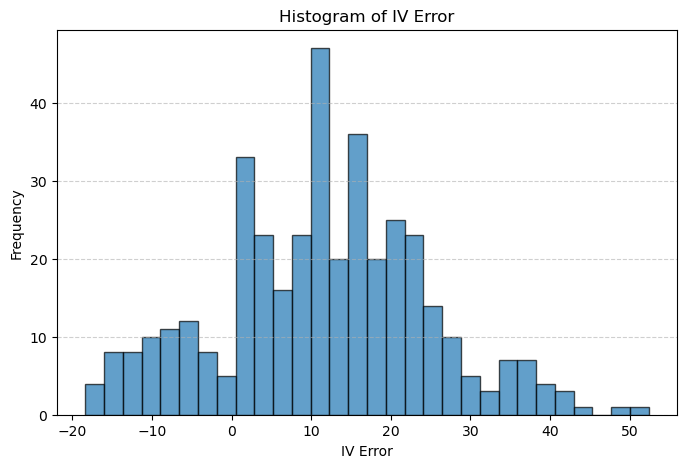

In [38]:
# Plot the histogram for the 'iv_error' column
plt.figure(figsize=(8, 5))
plt.hist(rbp_df['iv_error'], bins=30, edgecolor='black', alpha=0.7)

# Labels and title
plt.xlabel('IV Error')
plt.ylabel('Frequency')
plt.title('Histogram of IV Error')
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Show the plot
plt.show()

In [30]:
prediction

13.575537268911178

In [45]:
rbp_df["iv_error"].mean()

15.281153846153845

In [29]:
rbp_df["iv_error"].std()

13.911084766337215

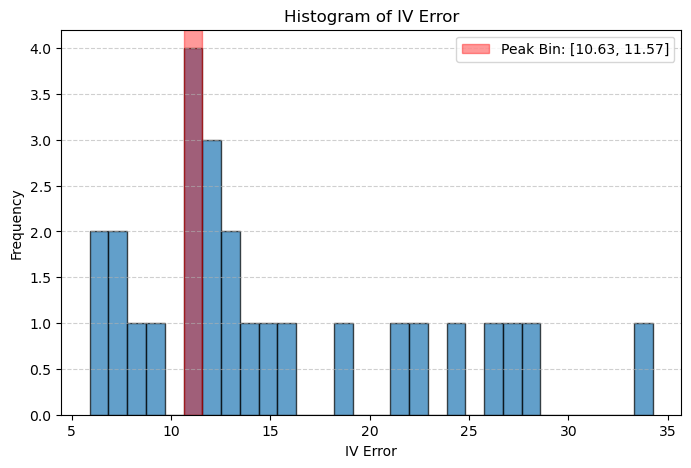

The highest bar is in the range [10.63, 11.57] with a count of 4.


In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load your data (replace 'your_file.csv' with your actual file)

# Compute the histogram
counts, bin_edges = np.histogram(rbp_df['iv_error'], bins=30)

# Find the tallest bar
max_count_index = np.argmax(counts)  # Index of the highest bar
max_count = counts[max_count_index]  # Height of the highest bar
bin_start = bin_edges[max_count_index]  # Left edge of the bin
bin_end = bin_edges[max_count_index + 1]  # Right edge of the bin

# Plot the histogram
plt.figure(figsize=(8, 5))
plt.hist(rbp_df['iv_error'], bins=30, edgecolor='black', alpha=0.7)
plt.xlabel('IV Error')
plt.ylabel('Frequency')
plt.title('Histogram of IV Error')
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Highlight the tallest bar
plt.axvspan(bin_start, bin_end, color='red', alpha=0.4, label=f'Peak Bin: [{bin_start:.2f}, {bin_end:.2f}]')

# Show the highest bin range and count
plt.legend()
plt.show()

# Print details of the highest bar
print(f"The highest bar is in the range [{bin_start:.2f}, {bin_end:.2f}] with a count of {max_count}.")


C:\Users\ACER\AppData\Local\Temp\ipykernel_14508\1454402553.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rbp_df['iv_error_yj'] = pt.fit_transform(rbp_df[['iv_error']])  # Yeo-Johnson can handle negatives


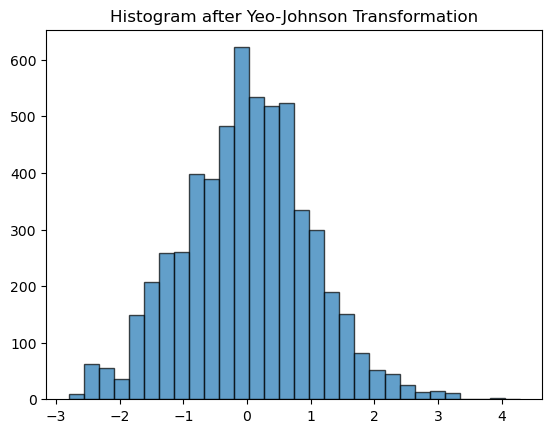

In [38]:
from sklearn.preprocessing import PowerTransformer

pt = PowerTransformer(method='yeo-johnson')
rbp_df['iv_error_yj'] = pt.fit_transform(rbp_df[['iv_error']])  # Yeo-Johnson can handle negatives
plt.hist(rbp_df['iv_error_yj'], bins=30, edgecolor='black', alpha=0.7)
plt.title('Histogram after Yeo-Johnson Transformation')
plt.show()


In [39]:
rbp_df["iv_error_yj"].mean()

9.922049024403564e-18